In [1]:
import pandas as pd
import numpy as np
import os
from datetime import date
import datetime
import time
from tqdm import tqdm
import yfinance as yf
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, GRU, SimpleRNN, Dense, GlobalMaxPool1D
from tensorflow.keras.optimizers import SGD, Adam
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
pd.set_option('display.max_rows', 10000)

In [1]:
!pip install tensorflow

  Created wheel for wrapt: filename=wrapt-1.12.1-py3-none-any.whl size=19558 sha256=0431fc997317a0bbf6d58aaee47f1f699f613f8766eb0f682f72e816dff78745
  Stored in directory: c:\users\harta\appdata\local\pip\cache\wheels\62\76\4c\aa25851149f3f6d9785f6c869387ad82b3fd37582fa8147ac6
  Created wheel for clang: filename=clang-5.0-py3-none-any.whl size=30707 sha256=e39f168f29f8b16cc47b96f49e2e31901e8462487d4eaf7629a99d9244a57b91
  Stored in directory: c:\users\harta\appdata\local\pip\cache\wheels\98\91\04\971b4c587cf47ae952b108949b46926f426c02832d120a082a
  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4835 sha256=9cefb43ded007b3500e207e98abdc57fd54247a10bf6ad85e6fbc96efb8e943c
  Stored in directory: c:\users\harta\appdata\local\pip\cache\wheels\3f\e3\ec\8a8336ff196023622fbcb36de0c5a5c218cbb24111d1d4c7f2
Successfully built wrapt clang termcolor
  Attempting uninstall: six
    Found existing installation: six 1.14.0
    Uninstalling six-1.14.0:
      Successfully un

ERROR: pytest-astropy 0.8.0 requires pytest-cov>=2.0, which is not installed.
ERROR: pytest-astropy 0.8.0 requires pytest-filter-subpackage>=0.1, which is not installed.
ERROR: astroid 2.3.3 requires typed-ast<1.5,>=1.4.0; implementation_name == "cpython" and python_version < "3.8", which is not installed.
ERROR: astroid 2.3.3 has requirement wrapt==1.11.*, but you'll have wrapt 1.12.1 which is incompatible.


In [2]:
df = pd.read_csv('df_long.csv')
df

,date,ticker,sector,industry,current_market_cap,current_institutional_ownership,current_institutional_transactions,current_float_short,current_short_ratio,current_performance_week,...,previous1_pca_pci22,previous1_pca_pci23,previous1_pca_pci24,previous1_pca_pci25,dv_5perc_inc_from_open,dv_2perc_inc_from_open,dv_1perc_inc_from_open,dv_close_up_from_open,dv_top_gainer,dv_doji
0,2021-10-01,A,Healthcare,Diagnostics & Research,47687.70,0.903,0.0100,0.0114,2.07,-0.0952,...,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0
1,2021-10-04,A,Healthcare,Diagnostics & Research,46577.98,0.903,0.0100,0.0114,2.07,-0.0843,...,-0.050033,0.033918,0.176511,0.010075,0.0,0.0,0.0,0.0,0.0,0
2,2021-10-05,A,Healthcare,Diagnostics & Research,46782.80,0.903,0.0100,0.0114,2.06,-0.0430,...,-0.001473,-0.007002,-0.031182,-0.029488,0.0,0.0,0.0,0.0,0.0,0
3,2021-10-06,A,Healthcare,Diagnostics & Research,46972.34,0.903,0.0100,0.0114,2.06,-0.0397,...,-0.048655,-0.006349,0.031267,-0.006401,NaN,NaN,NaN,1.0,NaN,0
4,2021-10-07,A,Healthcare,Diagnostics & Research,47482.88,0.903,0.0100,0.0114,2.07,-0.0140,...,-0.030008,-0.007827,-0.077060,-0.021561,NaN,NaN,NaN,1.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48330,2021-10-14,ZYXI,Healthcare,Medical Devices,430.93,0.316,-0.0003,0.1865,11.70,0.0989,...,0.020831,-0.055438,0.100984,0.006977,NaN,1.0,1.0,1.0,1.0,0
48331,2021-10-15,ZYXI,Healthcare,Medical Devices,428.61,0.317,-0.0015,0.1865,11.53,0.0815,...,-0.202690,-0.025783,-0.059067,0.075284,0.0,0.0,0.0,0.0,0.0,0
48332,2021-10-18,ZYXI,Healthcare,Medical Devices,428.25,0.317,-0.0015,0.1865,11.61,0.0797,...,-0.011468,-0.027872,-0.044912,-0.024264,0.0,0.0,0.0,0.0,0.0,0
48333,2021-10-19,ZYXI,Healthcare,Medical Devices,444.94,0.317,-0.0015,0.1865,11.95,0.1108,...,-0.028287,-0.004326,0.167848,0.016340,NaN,1.0,1.0,1.0,NaN,0


In [4]:
# test with one stock first
df_stock = df[df['ticker'] == 'AAPL']
df_stock

,date,ticker,sector,industry,current_market_cap,current_institutional_ownership,current_institutional_transactions,current_float_short,current_short_ratio,current_performance_week,...,previous1_pca_pci22,previous1_pca_pci23,previous1_pca_pci24,previous1_pca_pci25,dv_5perc_inc_from_open,dv_2perc_inc_from_open,dv_1perc_inc_from_open,dv_close_up_from_open,dv_top_gainer,dv_doji
138,2021-10-01,AAPL,Technology,Consumer Electronics,2339019.11,0.588,-0.0057,0.0062,1.25,-0.0291,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,0
139,2021-10-04,AAPL,Technology,Consumer Electronics,2281466.05,0.588,-0.0057,0.0062,1.24,-0.0429,...,1.022380,0.254351,0.042903,-0.083274,0.0,0.0,0.0,0.0,0.0,0
140,2021-10-05,AAPL,Technology,Consumer Electronics,2313767.98,0.588,-0.0057,0.0062,1.23,-0.0056,...,1.024260,0.260511,-0.156552,-0.128639,NaN,NaN,1.0,1.0,NaN,0
141,2021-10-06,AAPL,Technology,Consumer Electronics,2328361.22,0.588,-0.0057,0.0062,1.23,-0.0058,...,1.161996,0.312134,-0.281688,0.828315,NaN,NaN,1.0,1.0,NaN,0
142,2021-10-07,AAPL,Technology,Consumer Electronics,2349513.12,0.588,-0.0057,0.0062,1.24,0.0127,...,1.026398,0.241102,-0.173327,-0.130541,NaN,NaN,NaN,1.0,NaN,0
143,2021-10-08,AAPL,Technology,Consumer Electronics,2343118.34,0.588,-0.0057,0.0062,1.25,0.0018,...,1.025330,0.239893,-0.149291,-0.141410,0.0,0.0,0.0,0.0,0.0,0
144,2021-10-11,AAPL,Technology,Consumer Electronics,2367115.70,0.588,-0.0001,0.0062,1.26,0.0264,...,1.023192,0.259302,-0.132516,-0.139508,NaN,NaN,NaN,1.0,NaN,0
145,2021-10-12,AAPL,Technology,Consumer Electronics,2345567.78,0.588,-0.0001,0.0062,1.27,0.0028,...,0.999018,0.209555,0.031884,-0.095466,0.0,0.0,0.0,0.0,0.0,0
146,2021-10-13,AAPL,Technology,Consumer Electronics,2335622.77,0.588,-0.0001,0.0062,1.27,-0.0077,...,1.024260,0.260511,-0.156552,-0.128639,0.0,0.0,0.0,0.0,0.0,0
147,2021-10-14,AAPL,Technology,Consumer Electronics,2382862.16,0.588,-0.0001,0.0062,1.28,0.0033,...,1.007441,0.284058,0.056208,-0.088035,NaN,NaN,1.0,1.0,NaN,0


In [19]:
# setup data
feats = [x for x in df_stock.columns if x.startswith('current_pca')]
dv_col = ['dv_close_up_from_open']

X = df_stock[feats].values
Y = df_stock[dv_col].values

print(X.shape)
print(Y.shape)

(14, 30)
(14, 1)


In [30]:
Y

array([[1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]])

In [33]:
X

array([[-3.01803257e-01,  4.30878033e-01, -2.75940111e-01,
         8.84178981e-02, -1.52541041e-01,  4.43011229e-01,
        -9.85240223e-01,  5.19161512e-01,  1.15042825e-01,
        -4.47526476e-01, -1.48389787e-01,  1.04096175e-01,
        -1.12720695e-01, -1.08476881e-01, -1.38230441e-02,
        -7.57623042e-02, -1.48345714e-01, -2.07364838e-01,
        -2.19945017e-02, -3.40102966e-01, -1.70369988e-01,
         1.42427278e-01,  7.00640417e-01, -4.10139569e-01,
        -3.65924322e-02, -3.70839331e-01,  1.02238046e+00,
         2.54350914e-01,  4.29028555e-02, -8.32738445e-02],
       [ 6.96347614e-01,  2.13292650e-01, -1.29564157e-01,
         5.50141825e-02, -1.78474759e-01,  1.24061902e+00,
         1.21958784e-01,  4.42775106e-01,  7.60038525e-01,
         2.98301190e-01,  7.41627570e-02,  3.94823365e-01,
        -1.56541402e-01, -3.38132050e-02,  1.29913639e-01,
        -3.74659928e-02, -6.27984747e-02, -1.90806167e-01,
        -1.31991280e-01,  2.85249370e-02,  1.13019388e-

In [20]:
# Now make the actual data which will go into the neural network
T = 10 # the number of time steps to look at to make a prediction for the next day
D = X.shape[1] # number of features
N = len(X) - T # (e.g. if T=10 and you have 11 data points then you'd only have 1 sample of 10 rows)
print(T)
print(D)
print(N)

10
30
4


In [35]:
# Ntrain is the number of training samples - cannot be larger than N and will test on N - Ntrain 
# T is the number of timestamps (trading days) we want to LOOKBACK at to make predictions
# t is the training sample so each t will have T rows of data with D features
# the difference between t and t-1 is t is simply t-1 but shifted up one
Ntrain = 3 # size of training data 
Y_train = np.zeros(Ntrain)
X_train = np.zeros((Ntrain, T, D))
for t in range(Ntrain):
    X_train[t, :, :] = X[t:t+T]
    Y_train[t] = Y[t+T]
print(X_train.shape)
print(Y_train.shape)

(3, 10, 30)
(3,)


In [37]:
# Setup X_test and Y_test
X_test = np.zeros((N - Ntrain, T, D))
Y_test = np.zeros(N - Ntrain)

for u in range(N - Ntrain):
    # u counts from 0...(N - Ntrain)
    # t counts from Ntrain...N
    t = u + Ntrain
    X_test[u, :, :] = X[t:t+T]
    Y_test[u] = Y[t+T]
print(X_test.shape)
print(Y_test.shape)

(1, 10, 30)
(1,)


In [39]:
# make the RNN
i = Input(shape=(T, D)) # 10 trading days and 30 features
# return_sequences=True will return the predictions for each time step (trading day) in each sample
# otherwise it will just return the final prediction for that day
x = LSTM(10, return_sequences=False)(i) # 50 hidden units
x = Dense(1, activation='sigmoid')(x) # Dense implements the activation function for 1 output class (predicting class 1)
model = Model(i, x)
model.compile(
  loss='binary_crossentropy',
  optimizer=Adam(lr=0.001),
  metrics=['accuracy'],
)

start = time.time()
# train the LSTM
r = model.fit(
  X_train, Y_train,
  epochs=20, # number of iterations 
  validation_data=(X_test, Y_test),
)
end = time.time()
print(end - start)

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6038 - accuracy: 1.0000 - val_loss: 0.5233 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5903 - accuracy: 1.0000 - val_loss: 0.5134 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5770 - accuracy: 1.0000 - val_loss: 0.5036 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.4941 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5515 - accuracy: 1.0000 - val_loss: 0.4848 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5392 - accuracy: 1.0000 - val_loss: 0.4756 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5271 - accuracy: 1.0000 - val_loss: 0.4667 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

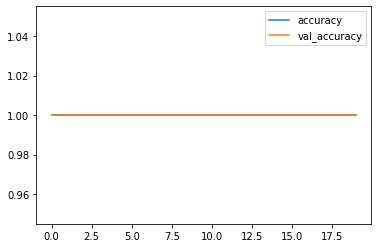

In [40]:
# Plot accuracy per iteration
plt.plot(r.history['accuracy'], label='accuracy')
plt.plot(r.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [46]:
# make predictions after running model.fit
model.predict(X_test)[0][0]

0.69304156

In [43]:
model.predict(X_train)

array([[0.6592573],
       [0.6802551],
       [0.6974623]], dtype=float32)

In [51]:
Y

array([[1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]])

In [9]:
# get predictions for all stocks
# only for stocks that have data for all 14 days
tickers = df[['ticker', 'date']].groupby('ticker').count().reset_index()
tickers = np.unique(tickers[tickers['date'] == 14]['ticker']).tolist()
feats = [x for x in df.columns if x.startswith('current_pca')]
dv_col = ['dv_close_up_from_open'] 
predictions = []
stock = []
true_val = []

for i in tqdm(tickers):
    df_filt = df[df['ticker'] == i]
    
    X = df_filt[feats].values
    Y = df_filt[dv_col].values
    
    T = 12 # the number of time steps to look at to make a prediction for the next day
    D = X.shape[1] # number of features
    N = len(X) - T # (e.g. if T=10 and you have 11 data points then you'd only have 1 sample of 10 rows)
    Ntrain = 1 # size of training data
    
    Y_train = np.zeros(Ntrain)
    X_train = np.zeros((Ntrain, T, D))
    X_test = np.zeros((N - Ntrain, T, D))
    Y_test = np.zeros(N - Ntrain)
    
    for t in range(Ntrain):
        X_train[t, :, :] = X[t:t+T]
        Y_train[t] = Y[t+T]
        
    for u in range(N - Ntrain):
        # u counts from 0...(N - Ntrain)
        # t counts from Ntrain...N
        t = u + Ntrain
        X_test[u, :, :] = X[t:t+T]
        Y_test[u] = Y[t+T]
    
    # make the RNN
    inp = Input(shape=(T, D)) # 10 trading days and 30 features
    # return_sequences=True will return the predictions for each time step (trading day) in each sample
    # otherwise it will just return the final prediction for that day
    x = GRU(10, return_sequences=False)(inp) # 50 hidden units
    x = Dense(1, activation='sigmoid')(x) # Dense implements the activation function for 1 output class (predicting class 1)
    model = Model(inp, x)
    model.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.001), metrics=['accuracy'])
    
    # train the LSTM
    r = model.fit(X_train, Y_train, epochs=20, validation_data=(X_test, Y_test))
    
    # get prediction for next day
    predictions.append(model.predict(X_test)[0][0])
    stock.append(i)
    true_val.append(Y_test[-1])
    
final_dict = {'stock': stock, 'prediction': predictions, 'outcome': true_val} 
final_df = pd.DataFrame(final_dict)
final_df

  0%|                                                                                                                                                                                                            | 0/3072 [00:00<?, ?it/s]C:\Users\harta\anaconda3\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5118 - accuracy: 1.0000 - val_loss: 0.9395 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5017 - accuracy: 1.0000 - val_loss: 0.9551 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4918 - accuracy: 1.0000 - val_loss: 0.9708 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4820 - accuracy: 1.0000 - val_loss: 0.9866 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4724 - accuracy: 1.0000 - val_loss: 1.0025 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4630 - accuracy: 1.0000 - val_loss: 1.0186 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4537 - accuracy: 1.0000 - val_loss: 1.0348 - val_accuracy: 0.0000e+00
E

  0%|                                                                                                                                                                                                  | 1/3072 [00:01<1:35:29,  1.87s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6961 - accuracy: 0.0000e+00 - val_loss: 0.6693 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6789 - accuracy: 1.0000 - val_loss: 0.6819 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6621 - accuracy: 1.0000 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6455 - accuracy: 1.0000 - val_loss: 0.7076 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6292 - accuracy: 1.0000 - val_loss: 0.7207 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6133 - accuracy: 1.0000 - val_loss: 0.7339 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5976 - accuracy: 1.0000 - val_loss: 0.7472 - val_accuracy: 0.0000e+00
Epoch

  0%|▏                                                                                                                                                                                                 | 2/3072 [00:03<1:37:15,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8937 - accuracy: 0.0000e+00 - val_loss: 0.8374 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8827 - accuracy: 0.0000e+00 - val_loss: 0.8263 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8717 - accuracy: 0.0000e+00 - val_loss: 0.8154 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8608 - accuracy: 0.0000e+00 - val_loss: 0.8044 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8498 - accuracy: 0.0000e+00 - val_loss: 0.7935 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8389 - accuracy: 0.0000e+00 - val_loss: 0.7827 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8281 - accuracy: 0.0000e+00 - val_loss: 0.7719 

  0%|▏                                                                                                                                                                                                 | 3/3072 [00:05<1:36:28,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6142 - accuracy: 1.0000 - val_loss: 0.7346 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6027 - accuracy: 1.0000 - val_loss: 0.7448 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5914 - accuracy: 1.0000 - val_loss: 0.7552 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5802 - accuracy: 1.0000 - val_loss: 0.7656 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5692 - accuracy: 1.0000 - val_loss: 0.7763 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5583 - accuracy: 1.0000 - val_loss: 0.7870 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5476 - accuracy: 1.0000 - val_loss: 0.7979 - val_accuracy: 0.0000e+00
E

  0%|▎                                                                                                                                                                                                 | 4/3072 [00:07<1:38:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6047 - accuracy: 1.0000 - val_loss: 0.6166 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5857 - accuracy: 1.0000 - val_loss: 0.5990 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5672 - accuracy: 1.0000 - val_loss: 0.5818 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5491 - accuracy: 1.0000 - val_loss: 0.5650 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5314 - accuracy: 1.0000 - val_loss: 0.5486 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5142 - accuracy: 1.0000 - val_loss: 0.5325 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4975 - accuracy: 1.0000 - val_loss: 0.5169 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  0%|▎                                                                                                                                                                                                 | 5/3072 [00:09<1:37:22,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8708 - accuracy: 0.0000e+00 - val_loss: 0.8146 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8538 - accuracy: 0.0000e+00 - val_loss: 0.7990 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8370 - accuracy: 0.0000e+00 - val_loss: 0.7836 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8205 - accuracy: 0.0000e+00 - val_loss: 0.7685 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8041 - accuracy: 0.0000e+00 - val_loss: 0.7535 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7879 - accuracy: 0.0000e+00 - val_loss: 0.7387 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7719 - accuracy: 0.0000e+00 - val_loss: 0.7240 

  0%|▍                                                                                                                                                                                                 | 6/3072 [00:11<1:39:19,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7429 - accuracy: 0.0000e+00 - val_loss: 0.6843 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7287 - accuracy: 0.0000e+00 - val_loss: 0.6720 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7148 - accuracy: 0.0000e+00 - val_loss: 0.6599 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7010 - accuracy: 0.0000e+00 - val_loss: 0.6480 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6875 - accuracy: 1.0000 - val_loss: 0.6364 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6742 - accuracy: 1.0000 - val_loss: 0.6250 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.6138 - val_accuracy: 1.0000
Epoch 8/20
1/

  0%|▍                                                                                                                                                                                                 | 7/3072 [00:13<1:37:46,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6903 - accuracy: 1.0000 - val_loss: 0.7586 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6728 - accuracy: 1.0000 - val_loss: 0.7746 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6556 - accuracy: 1.0000 - val_loss: 0.7907 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6387 - accuracy: 1.0000 - val_loss: 0.8071 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6221 - accuracy: 1.0000 - val_loss: 0.8237 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6058 - accuracy: 1.0000 - val_loss: 0.8404 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5898 - accuracy: 1.0000 - val_loss: 0.8574 - val_accuracy: 0.0000e+00
E

  0%|▌                                                                                                                                                                                                 | 8/3072 [00:15<1:36:47,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4930 - accuracy: 1.0000 - val_loss: 1.0256 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4816 - accuracy: 1.0000 - val_loss: 1.0392 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4704 - accuracy: 1.0000 - val_loss: 1.0530 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4594 - accuracy: 1.0000 - val_loss: 1.0669 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4487 - accuracy: 1.0000 - val_loss: 1.0809 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4382 - accuracy: 1.0000 - val_loss: 1.0950 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4279 - accuracy: 1.0000 - val_loss: 1.1092 - val_accuracy: 0.0000e+00
E

  0%|▌                                                                                                                                                                                                 | 9/3072 [00:17<1:39:24,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6123 - accuracy: 1.0000 - val_loss: 0.4466 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5997 - accuracy: 1.0000 - val_loss: 0.4386 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.4308 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5748 - accuracy: 1.0000 - val_loss: 0.4230 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5627 - accuracy: 1.0000 - val_loss: 0.4153 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5508 - accuracy: 1.0000 - val_loss: 0.4078 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5391 - accuracy: 1.0000 - val_loss: 0.4004 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  0%|▋                                                                                                                                                                                                | 10/3072 [00:19<1:37:47,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6234 - accuracy: 1.0000 - val_loss: 0.7319 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6133 - accuracy: 1.0000 - val_loss: 0.7222 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6033 - accuracy: 1.0000 - val_loss: 0.7126 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5936 - accuracy: 1.0000 - val_loss: 0.7031 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5840 - accuracy: 1.0000 - val_loss: 0.6938 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5746 - accuracy: 1.0000 - val_loss: 0.6847 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5654 - accuracy: 1.0000 - val_loss: 0.6757 - val_accuracy: 1.0000
Epoch 8/2

  0%|▋                                                                                                                                                                                                | 11/3072 [00:21<1:39:28,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5454 - accuracy: 1.0000 - val_loss: 0.7324 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5318 - accuracy: 1.0000 - val_loss: 0.7460 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5186 - accuracy: 1.0000 - val_loss: 0.7596 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5056 - accuracy: 1.0000 - val_loss: 0.7734 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4929 - accuracy: 1.0000 - val_loss: 0.7873 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4805 - accuracy: 1.0000 - val_loss: 0.8013 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4683 - accuracy: 1.0000 - val_loss: 0.8155 - val_accuracy: 0.0000e+00
E

  0%|▊                                                                                                                                                                                                | 12/3072 [00:23<1:37:50,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5189 - accuracy: 1.0000 - val_loss: 0.6954 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5059 - accuracy: 1.0000 - val_loss: 0.6816 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4930 - accuracy: 1.0000 - val_loss: 0.6680 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4805 - accuracy: 1.0000 - val_loss: 0.6545 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4681 - accuracy: 1.0000 - val_loss: 0.6412 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4561 - accuracy: 1.0000 - val_loss: 0.6281 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4443 - accuracy: 1.0000 - val_loss: 0.6152 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

  0%|▊                                                                                                                                                                                                | 13/3072 [00:25<1:39:22,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8060 - accuracy: 0.0000e+00 - val_loss: 0.8849 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7892 - accuracy: 0.0000e+00 - val_loss: 0.8718 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7727 - accuracy: 0.0000e+00 - val_loss: 0.8589 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7565 - accuracy: 0.0000e+00 - val_loss: 0.8463 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7407 - accuracy: 0.0000e+00 - val_loss: 0.8338 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7251 - accuracy: 0.0000e+00 - val_loss: 0.8215 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7098 - accuracy: 0.0000e+00 - val_loss: 0.8094 

  0%|▉                                                                                                                                                                                                | 14/3072 [00:26<1:37:45,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4538 - accuracy: 1.0000 - val_loss: 1.1380 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4425 - accuracy: 1.0000 - val_loss: 1.1513 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4314 - accuracy: 1.0000 - val_loss: 1.1648 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4206 - accuracy: 1.0000 - val_loss: 1.1784 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4100 - accuracy: 1.0000 - val_loss: 1.1920 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3997 - accuracy: 1.0000 - val_loss: 1.2057 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3896 - accuracy: 1.0000 - val_loss: 1.2194 - val_accuracy: 0.0000e+00
E

  0%|▉                                                                                                                                                                                                | 15/3072 [00:28<1:39:22,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6947 - accuracy: 0.0000e+00 - val_loss: 0.6676 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.6591 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6742 - accuracy: 1.0000 - val_loss: 0.6507 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6640 - accuracy: 1.0000 - val_loss: 0.6424 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6540 - accuracy: 1.0000 - val_loss: 0.6340 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6441 - accuracy: 1.0000 - val_loss: 0.6258 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6342 - accuracy: 1.0000 - val_loss: 0.6175 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

  1%|█                                                                                                                                                                                                | 16/3072 [00:30<1:37:46,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7260 - accuracy: 0.0000e+00 - val_loss: 0.6031 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7168 - accuracy: 0.0000e+00 - val_loss: 0.5957 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7077 - accuracy: 0.0000e+00 - val_loss: 0.5884 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.5811 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6897 - accuracy: 1.0000 - val_loss: 0.5738 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6808 - accuracy: 1.0000 - val_loss: 0.5667 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6720 - accuracy: 1.0000 - val_loss: 0.5595 - val_accuracy: 1.0000
Epoch 8/20
1/

  1%|█                                                                                                                                                                                                | 17/3072 [00:32<1:36:38,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7648 - accuracy: 0.0000e+00 - val_loss: 0.5757 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7485 - accuracy: 0.0000e+00 - val_loss: 0.5892 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7323 - accuracy: 0.0000e+00 - val_loss: 0.6029 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7164 - accuracy: 0.0000e+00 - val_loss: 0.6168 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7007 - accuracy: 0.0000e+00 - val_loss: 0.6311 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6852 - accuracy: 1.0000 - val_loss: 0.6456 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6699 - accuracy: 1.0000 - val_loss: 0.6603 - val_accuracy: 1.0000
Epoch 8/2

  1%|█▏                                                                                                                                                                                               | 18/3072 [00:34<1:39:09,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8198 - accuracy: 0.0000e+00 - val_loss: 0.8663 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8035 - accuracy: 0.0000e+00 - val_loss: 0.8779 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7876 - accuracy: 0.0000e+00 - val_loss: 0.8895 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7718 - accuracy: 0.0000e+00 - val_loss: 0.9012 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7563 - accuracy: 0.0000e+00 - val_loss: 0.9130 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7410 - accuracy: 0.0000e+00 - val_loss: 0.9248 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7260 - accuracy: 0.0000e+00 - val_loss: 0.9367 

  1%|█▏                                                                                                                                                                                               | 19/3072 [00:36<1:37:40,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7730 - accuracy: 0.0000e+00 - val_loss: 0.6516 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7577 - accuracy: 0.0000e+00 - val_loss: 0.6636 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7427 - accuracy: 0.0000e+00 - val_loss: 0.6756 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7280 - accuracy: 0.0000e+00 - val_loss: 0.6877 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7136 - accuracy: 0.0000e+00 - val_loss: 0.6998 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6995 - accuracy: 0.0000e+00 - val_loss: 0.7119 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6856 - accuracy: 1.0000 - val_loss: 0.7241 - val_accuracy: 0.00

  1%|█▎                                                                                                                                                                                               | 20/3072 [00:38<1:39:19,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5227 - accuracy: 1.0000 - val_loss: 0.9534 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5077 - accuracy: 1.0000 - val_loss: 0.9738 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4930 - accuracy: 1.0000 - val_loss: 0.9943 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4786 - accuracy: 1.0000 - val_loss: 1.0150 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4646 - accuracy: 1.0000 - val_loss: 1.0360 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4509 - accuracy: 1.0000 - val_loss: 1.0572 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4376 - accuracy: 1.0000 - val_loss: 1.0787 - val_accuracy: 0.0000e+00
E

  1%|█▎                                                                                                                                                                                               | 21/3072 [00:40<1:37:38,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5707 - accuracy: 1.0000 - val_loss: 0.4954 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5543 - accuracy: 1.0000 - val_loss: 0.4823 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5382 - accuracy: 1.0000 - val_loss: 0.4695 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5225 - accuracy: 1.0000 - val_loss: 0.4571 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5071 - accuracy: 1.0000 - val_loss: 0.4450 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4921 - accuracy: 1.0000 - val_loss: 0.4331 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4775 - accuracy: 1.0000 - val_loss: 0.4215 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  1%|█▍                                                                                                                                                                                               | 22/3072 [00:42<1:39:04,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7967 - accuracy: 0.0000e+00 - val_loss: 0.7108 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7803 - accuracy: 0.0000e+00 - val_loss: 0.7235 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7642 - accuracy: 0.0000e+00 - val_loss: 0.7364 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7483 - accuracy: 0.0000e+00 - val_loss: 0.7494 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7327 - accuracy: 0.0000e+00 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7173 - accuracy: 0.0000e+00 - val_loss: 0.7756 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7022 - accuracy: 0.0000e+00 - val_loss: 0.7889 

  1%|█▍                                                                                                                                                                                               | 23/3072 [00:44<1:37:28,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7153 - accuracy: 0.0000e+00 - val_loss: 0.6522 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7026 - accuracy: 0.0000e+00 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6901 - accuracy: 1.0000 - val_loss: 0.6331 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6777 - accuracy: 1.0000 - val_loss: 0.6238 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6655 - accuracy: 1.0000 - val_loss: 0.6145 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6535 - accuracy: 1.0000 - val_loss: 0.6054 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.5964 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

  1%|█▌                                                                                                                                                                                               | 24/3072 [00:46<1:39:09,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5131 - accuracy: 1.0000 - val_loss: 0.9502 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5042 - accuracy: 1.0000 - val_loss: 0.9623 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4955 - accuracy: 1.0000 - val_loss: 0.9746 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4868 - accuracy: 1.0000 - val_loss: 0.9870 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4783 - accuracy: 1.0000 - val_loss: 0.9996 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4698 - accuracy: 1.0000 - val_loss: 1.0122 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4615 - accuracy: 1.0000 - val_loss: 1.0250 - val_accuracy: 0.0000e+00
E

  1%|█▌                                                                                                                                                                                               | 25/3072 [00:48<1:37:28,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7548 - accuracy: 0.0000e+00 - val_loss: 0.6865 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7367 - accuracy: 0.0000e+00 - val_loss: 0.6988 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7188 - accuracy: 0.0000e+00 - val_loss: 0.7113 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7012 - accuracy: 0.0000e+00 - val_loss: 0.7241 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6839 - accuracy: 1.0000 - val_loss: 0.7371 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.7504 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6500 - accuracy: 1.0000 - val_loss: 0.7639 - val_accuracy: 

  1%|█▋                                                                                                                                                                                               | 26/3072 [00:50<1:39:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5726 - accuracy: 1.0000 - val_loss: 0.9074 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5605 - accuracy: 1.0000 - val_loss: 0.9214 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5485 - accuracy: 1.0000 - val_loss: 0.9355 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5368 - accuracy: 1.0000 - val_loss: 0.9497 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5253 - accuracy: 1.0000 - val_loss: 0.9640 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5139 - accuracy: 1.0000 - val_loss: 0.9783 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5028 - accuracy: 1.0000 - val_loss: 0.9928 - val_accuracy: 0.0000e+00
E

  1%|█▋                                                                                                                                                                                               | 27/3072 [00:52<1:38:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7301 - accuracy: 0.0000e+00 - val_loss: 0.7007 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7133 - accuracy: 0.0000e+00 - val_loss: 0.7138 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6967 - accuracy: 0.0000e+00 - val_loss: 0.7271 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6804 - accuracy: 1.0000 - val_loss: 0.7405 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.7541 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6487 - accuracy: 1.0000 - val_loss: 0.7679 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6332 - accuracy: 1.0000 - val_loss: 0.7818 - val_accuracy: 

  1%|█▊                                                                                                                                                                                               | 28/3072 [00:54<1:37:05,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8052 - accuracy: 0.0000e+00 - val_loss: 0.4989 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7931 - accuracy: 0.0000e+00 - val_loss: 0.5063 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7811 - accuracy: 0.0000e+00 - val_loss: 0.5138 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7693 - accuracy: 0.0000e+00 - val_loss: 0.5214 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7577 - accuracy: 0.0000e+00 - val_loss: 0.5290 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7463 - accuracy: 0.0000e+00 - val_loss: 0.5367 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7349 - accuracy: 0.0000e+00 - val_loss: 0.5445 - val_accuracy: 1.0000
E

  1%|█▊                                                                                                                                                                                               | 29/3072 [00:56<1:38:42,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5778 - accuracy: 1.0000 - val_loss: 0.8588 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5686 - accuracy: 1.0000 - val_loss: 0.8681 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.8775 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5505 - accuracy: 1.0000 - val_loss: 0.8870 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5416 - accuracy: 1.0000 - val_loss: 0.8967 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5328 - accuracy: 1.0000 - val_loss: 0.9064 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5240 - accuracy: 1.0000 - val_loss: 0.9162 - val_accuracy: 0.0000e+00
E

  1%|█▉                                                                                                                                                                                               | 30/3072 [00:57<1:37:14,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8200 - accuracy: 0.0000e+00 - val_loss: 0.5482 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8041 - accuracy: 0.0000e+00 - val_loss: 0.5585 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7885 - accuracy: 0.0000e+00 - val_loss: 0.5688 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7732 - accuracy: 0.0000e+00 - val_loss: 0.5792 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.5897 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7435 - accuracy: 0.0000e+00 - val_loss: 0.6002 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7291 - accuracy: 0.0000e+00 - val_loss: 0.6108 - val_accuracy: 1.0000
E

  1%|█▉                                                                                                                                                                                               | 31/3072 [00:59<1:38:45,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5445 - accuracy: 1.0000 - val_loss: 0.6270 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5318 - accuracy: 1.0000 - val_loss: 0.6158 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5194 - accuracy: 1.0000 - val_loss: 0.6046 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5071 - accuracy: 1.0000 - val_loss: 0.5936 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4951 - accuracy: 1.0000 - val_loss: 0.5827 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4833 - accuracy: 1.0000 - val_loss: 0.5719 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4717 - accuracy: 1.0000 - val_loss: 0.5613 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  1%|██                                                                                                                                                                                               | 32/3072 [01:01<1:37:15,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7491 - accuracy: 0.0000e+00 - val_loss: 0.5799 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7350 - accuracy: 0.0000e+00 - val_loss: 0.5909 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7210 - accuracy: 0.0000e+00 - val_loss: 0.6021 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7073 - accuracy: 0.0000e+00 - val_loss: 0.6135 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6937 - accuracy: 0.0000e+00 - val_loss: 0.6250 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6803 - accuracy: 1.0000 - val_loss: 0.6367 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6670 - accuracy: 1.0000 - val_loss: 0.6485 - val_accuracy: 1.0000
Epoch 8/2

  1%|██                                                                                                                                                                                               | 33/3072 [01:03<1:38:47,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7786 - accuracy: 0.0000e+00 - val_loss: 0.6741 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7644 - accuracy: 0.0000e+00 - val_loss: 0.6828 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.6916 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7363 - accuracy: 0.0000e+00 - val_loss: 0.7005 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7225 - accuracy: 0.0000e+00 - val_loss: 0.7095 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7088 - accuracy: 0.0000e+00 - val_loss: 0.7186 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6953 - accuracy: 0.0000e+00 - val_loss: 0.7278 - val_accura

  1%|██▏                                                                                                                                                                                              | 34/3072 [01:05<1:37:13,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7255 - accuracy: 0.0000e+00 - val_loss: 0.6316 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7114 - accuracy: 0.0000e+00 - val_loss: 0.6217 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6975 - accuracy: 0.0000e+00 - val_loss: 0.6119 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6838 - accuracy: 1.0000 - val_loss: 0.6023 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6702 - accuracy: 1.0000 - val_loss: 0.5928 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6569 - accuracy: 1.0000 - val_loss: 0.5834 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6438 - accuracy: 1.0000 - val_loss: 0.5741 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

  1%|██▏                                                                                                                                                                                              | 35/3072 [01:07<1:38:46,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.7019 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.7098 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6484 - accuracy: 1.0000 - val_loss: 0.7177 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6353 - accuracy: 1.0000 - val_loss: 0.7257 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6225 - accuracy: 1.0000 - val_loss: 0.7337 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6099 - accuracy: 1.0000 - val_loss: 0.7418 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.7499 - val_accuracy: 0.0000e+00
E

  1%|██▎                                                                                                                                                                                              | 36/3072 [01:09<1:36:54,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6688 - accuracy: 1.0000 - val_loss: 0.7439 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6479 - accuracy: 1.0000 - val_loss: 0.7649 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6274 - accuracy: 1.0000 - val_loss: 0.7864 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6074 - accuracy: 1.0000 - val_loss: 0.8083 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5878 - accuracy: 1.0000 - val_loss: 0.8307 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5686 - accuracy: 1.0000 - val_loss: 0.8534 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5499 - accuracy: 1.0000 - val_loss: 0.8766 - val_accuracy: 0.0000e+00
E

  1%|██▎                                                                                                                                                                                              | 37/3072 [01:11<1:35:52,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7307 - accuracy: 0.0000e+00 - val_loss: 0.7378 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7146 - accuracy: 0.0000e+00 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6987 - accuracy: 0.0000e+00 - val_loss: 0.7065 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6830 - accuracy: 1.0000 - val_loss: 0.6912 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.6762 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6524 - accuracy: 1.0000 - val_loss: 0.6613 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6374 - accuracy: 1.0000 - val_loss: 0.6467 - val_accuracy: 1.0000
Epoch

  1%|██▍                                                                                                                                                                                              | 38/3072 [01:13<1:38:42,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7206 - accuracy: 0.0000e+00 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7035 - accuracy: 0.0000e+00 - val_loss: 0.6795 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.6960 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6700 - accuracy: 1.0000 - val_loss: 0.7128 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6536 - accuracy: 1.0000 - val_loss: 0.7299 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6375 - accuracy: 1.0000 - val_loss: 0.7474 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6216 - accuracy: 1.0000 - val_loss: 0.7652 - val_accuracy: 0.0000e+00
E

  1%|██▍                                                                                                                                                                                              | 39/3072 [01:15<1:37:12,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6294 - accuracy: 1.0000 - val_loss: 0.6107 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6133 - accuracy: 1.0000 - val_loss: 0.5994 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.5882 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.5771 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5669 - accuracy: 1.0000 - val_loss: 0.5663 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5520 - accuracy: 1.0000 - val_loss: 0.5556 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5376 - accuracy: 1.0000 - val_loss: 0.5451 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  1%|██▌                                                                                                                                                                                              | 40/3072 [01:17<1:38:42,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5006 - accuracy: 1.0000 - val_loss: 0.9736 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4876 - accuracy: 1.0000 - val_loss: 0.9926 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4748 - accuracy: 1.0000 - val_loss: 1.0120 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4622 - accuracy: 1.0000 - val_loss: 1.0316 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4498 - accuracy: 1.0000 - val_loss: 1.0515 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4377 - accuracy: 1.0000 - val_loss: 1.0716 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4258 - accuracy: 1.0000 - val_loss: 1.0921 - val_accuracy: 0.0000e+00
E

  1%|██▌                                                                                                                                                                                              | 41/3072 [01:19<1:37:02,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6037 - accuracy: 1.0000 - val_loss: 0.7529 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5919 - accuracy: 1.0000 - val_loss: 0.7650 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5802 - accuracy: 1.0000 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5687 - accuracy: 1.0000 - val_loss: 0.7897 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5573 - accuracy: 1.0000 - val_loss: 0.8024 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5461 - accuracy: 1.0000 - val_loss: 0.8152 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5350 - accuracy: 1.0000 - val_loss: 0.8283 - val_accuracy: 0.0000e+00
E

  1%|██▋                                                                                                                                                                                              | 42/3072 [01:21<1:38:35,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7089 - accuracy: 0.0000e+00 - val_loss: 0.6648 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6935 - accuracy: 0.0000e+00 - val_loss: 0.6494 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6633 - accuracy: 1.0000 - val_loss: 0.6193 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6486 - accuracy: 1.0000 - val_loss: 0.6047 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6341 - accuracy: 1.0000 - val_loss: 0.5903 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6199 - accuracy: 1.0000 - val_loss: 0.5762 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

  1%|██▋                                                                                                                                                                                              | 43/3072 [01:23<1:36:58,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6197 - accuracy: 1.0000 - val_loss: 0.7440 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6096 - accuracy: 1.0000 - val_loss: 0.7558 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5997 - accuracy: 1.0000 - val_loss: 0.7678 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5899 - accuracy: 1.0000 - val_loss: 0.7799 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5801 - accuracy: 1.0000 - val_loss: 0.7921 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5705 - accuracy: 1.0000 - val_loss: 0.8045 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5609 - accuracy: 1.0000 - val_loss: 0.8170 - val_accuracy: 0.0000e+00
E

  1%|██▊                                                                                                                                                                                              | 44/3072 [01:25<1:38:40,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8525 - accuracy: 0.0000e+00 - val_loss: 0.8343 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8352 - accuracy: 0.0000e+00 - val_loss: 0.8201 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8183 - accuracy: 0.0000e+00 - val_loss: 0.8061 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8015 - accuracy: 0.0000e+00 - val_loss: 0.7923 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7850 - accuracy: 0.0000e+00 - val_loss: 0.7786 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7687 - accuracy: 0.0000e+00 - val_loss: 0.7650 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7527 - accuracy: 0.0000e+00 - val_loss: 0.7516 

  1%|██▊                                                                                                                                                                                              | 45/3072 [01:26<1:37:03,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4281 - accuracy: 1.0000 - val_loss: 1.2239 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4170 - accuracy: 1.0000 - val_loss: 1.2454 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4061 - accuracy: 1.0000 - val_loss: 1.2671 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3955 - accuracy: 1.0000 - val_loss: 1.2890 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3850 - accuracy: 1.0000 - val_loss: 1.3110 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3749 - accuracy: 1.0000 - val_loss: 1.3332 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3649 - accuracy: 1.0000 - val_loss: 1.3556 - val_accuracy: 0.0000e+00
E

  1%|██▉                                                                                                                                                                                              | 46/3072 [01:28<1:36:05,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6258 - accuracy: 1.0000 - val_loss: 0.6527 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6074 - accuracy: 1.0000 - val_loss: 0.6358 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5895 - accuracy: 1.0000 - val_loss: 0.6193 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5720 - accuracy: 1.0000 - val_loss: 0.6032 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5550 - accuracy: 1.0000 - val_loss: 0.5874 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5385 - accuracy: 1.0000 - val_loss: 0.5720 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5224 - accuracy: 1.0000 - val_loss: 0.5569 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  2%|██▉                                                                                                                                                                                              | 47/3072 [01:30<1:38:31,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8145 - accuracy: 0.0000e+00 - val_loss: 0.6663 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8003 - accuracy: 0.0000e+00 - val_loss: 0.6752 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7863 - accuracy: 0.0000e+00 - val_loss: 0.6841 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7725 - accuracy: 0.0000e+00 - val_loss: 0.6929 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7589 - accuracy: 0.0000e+00 - val_loss: 0.7018 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7456 - accuracy: 0.0000e+00 - val_loss: 0.7107 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7324 - accuracy: 0.0000e+00 - val_loss: 0.7196 - val_accuracy: 

  2%|███                                                                                                                                                                                              | 48/3072 [01:32<1:36:54,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6725 - accuracy: 1.0000 - val_loss: 0.7808 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6551 - accuracy: 1.0000 - val_loss: 0.7992 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6380 - accuracy: 1.0000 - val_loss: 0.8177 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6213 - accuracy: 1.0000 - val_loss: 0.8364 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6050 - accuracy: 1.0000 - val_loss: 0.8553 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5891 - accuracy: 1.0000 - val_loss: 0.8743 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5736 - accuracy: 1.0000 - val_loss: 0.8934 - val_accuracy: 0.0000e+00
E

  2%|███                                                                                                                                                                                              | 49/3072 [01:34<1:38:25,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4993 - accuracy: 1.0000 - val_loss: 0.5294 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4902 - accuracy: 1.0000 - val_loss: 0.5212 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4813 - accuracy: 1.0000 - val_loss: 0.5132 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4725 - accuracy: 1.0000 - val_loss: 0.5053 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4639 - accuracy: 1.0000 - val_loss: 0.4975 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4554 - accuracy: 1.0000 - val_loss: 0.4898 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4471 - accuracy: 1.0000 - val_loss: 0.4822 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  2%|███▏                                                                                                                                                                                             | 50/3072 [01:36<1:36:47,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8739 - accuracy: 0.0000e+00 - val_loss: 0.5469 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8622 - accuracy: 0.0000e+00 - val_loss: 0.5555 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8506 - accuracy: 0.0000e+00 - val_loss: 0.5642 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8393 - accuracy: 0.0000e+00 - val_loss: 0.5729 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8281 - accuracy: 0.0000e+00 - val_loss: 0.5817 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8170 - accuracy: 0.0000e+00 - val_loss: 0.5905 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8061 - accuracy: 0.0000e+00 - val_loss: 0.5994 - val_accuracy: 1.0000
E

  2%|███▏                                                                                                                                                                                             | 51/3072 [01:38<1:38:15,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5698 - accuracy: 1.0000 - val_loss: 0.7425 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5607 - accuracy: 1.0000 - val_loss: 0.7514 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5516 - accuracy: 1.0000 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5425 - accuracy: 1.0000 - val_loss: 0.7697 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5335 - accuracy: 1.0000 - val_loss: 0.7791 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5246 - accuracy: 1.0000 - val_loss: 0.7887 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5156 - accuracy: 1.0000 - val_loss: 0.7985 - val_accuracy: 0.0000e+00
E

  2%|███▎                                                                                                                                                                                             | 52/3072 [01:40<1:36:30,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8246 - accuracy: 0.0000e+00 - val_loss: 0.6274 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8007 - accuracy: 0.0000e+00 - val_loss: 0.6142 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7772 - accuracy: 0.0000e+00 - val_loss: 0.6012 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7542 - accuracy: 0.0000e+00 - val_loss: 0.5886 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7317 - accuracy: 0.0000e+00 - val_loss: 0.5761 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7096 - accuracy: 0.0000e+00 - val_loss: 0.5639 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6880 - accuracy: 1.0000 - val_loss: 0.5520 - val_accuracy: 1.0000
Epoch

  2%|███▎                                                                                                                                                                                             | 53/3072 [01:42<1:38:04,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6057 - accuracy: 1.0000 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5912 - accuracy: 1.0000 - val_loss: 0.6545 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5770 - accuracy: 1.0000 - val_loss: 0.6645 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5631 - accuracy: 1.0000 - val_loss: 0.6746 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5493 - accuracy: 1.0000 - val_loss: 0.6847 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.6949 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5227 - accuracy: 1.0000 - val_loss: 0.7052 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=====

  2%|███▍                                                                                                                                                                                             | 54/3072 [01:44<1:36:31,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5833 - accuracy: 1.0000 - val_loss: 0.8053 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5736 - accuracy: 1.0000 - val_loss: 0.8165 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5640 - accuracy: 1.0000 - val_loss: 0.8278 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5546 - accuracy: 1.0000 - val_loss: 0.8392 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5452 - accuracy: 1.0000 - val_loss: 0.8507 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.8623 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5268 - accuracy: 1.0000 - val_loss: 0.8740 - val_accuracy: 0.0000e+00
E

  2%|███▍                                                                                                                                                                                             | 55/3072 [01:46<1:38:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7627 - accuracy: 0.0000e+00 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7442 - accuracy: 0.0000e+00 - val_loss: 0.6481 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7259 - accuracy: 0.0000e+00 - val_loss: 0.6596 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7079 - accuracy: 0.0000e+00 - val_loss: 0.6712 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6902 - accuracy: 1.0000 - val_loss: 0.6830 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6727 - accuracy: 1.0000 - val_loss: 0.6950 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6555 - accuracy: 1.0000 - val_loss: 0.7071 - val_accuracy: 0.0000e+00
Epoch

  2%|███▌                                                                                                                                                                                             | 56/3072 [01:48<1:37:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7605 - accuracy: 0.0000e+00 - val_loss: 0.7557 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7483 - accuracy: 0.0000e+00 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7363 - accuracy: 0.0000e+00 - val_loss: 0.7363 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7244 - accuracy: 0.0000e+00 - val_loss: 0.7268 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7127 - accuracy: 0.0000e+00 - val_loss: 0.7174 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7011 - accuracy: 0.0000e+00 - val_loss: 0.7082 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6896 - accuracy: 1.0000 - val_loss: 0.6990 - va

  2%|███▌                                                                                                                                                                                             | 57/3072 [01:50<1:36:15,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9228 - accuracy: 0.0000e+00 - val_loss: 0.5964 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8998 - accuracy: 0.0000e+00 - val_loss: 0.6123 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8771 - accuracy: 0.0000e+00 - val_loss: 0.6286 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8548 - accuracy: 0.0000e+00 - val_loss: 0.6452 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8327 - accuracy: 0.0000e+00 - val_loss: 0.6622 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8109 - accuracy: 0.0000e+00 - val_loss: 0.6796 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7895 - accuracy: 0.0000e+00 - val_loss: 0.6973 - val_accuracy: 0.0000e+

  2%|███▋                                                                                                                                                                                             | 58/3072 [01:52<1:37:57,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9133 - accuracy: 0.0000e+00 - val_loss: 0.5966 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8942 - accuracy: 0.0000e+00 - val_loss: 0.6062 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8754 - accuracy: 0.0000e+00 - val_loss: 0.6159 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8569 - accuracy: 0.0000e+00 - val_loss: 0.6256 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8387 - accuracy: 0.0000e+00 - val_loss: 0.6355 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8208 - accuracy: 0.0000e+00 - val_loss: 0.6455 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8032 - accuracy: 0.0000e+00 - val_loss: 0.6555 - val_accuracy: 1.0000
E

  2%|███▋                                                                                                                                                                                             | 59/3072 [01:53<1:36:28,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9065 - accuracy: 0.0000e+00 - val_loss: 0.5171 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8896 - accuracy: 0.0000e+00 - val_loss: 0.5270 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8729 - accuracy: 0.0000e+00 - val_loss: 0.5371 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8564 - accuracy: 0.0000e+00 - val_loss: 0.5473 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8401 - accuracy: 0.0000e+00 - val_loss: 0.5577 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8241 - accuracy: 0.0000e+00 - val_loss: 0.5682 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8083 - accuracy: 0.0000e+00 - val_loss: 0.5788 - val_accuracy: 1.0000
E

  2%|███▊                                                                                                                                                                                             | 60/3072 [01:56<1:38:05,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5593 - accuracy: 1.0000 - val_loss: 0.6621 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5476 - accuracy: 1.0000 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5360 - accuracy: 1.0000 - val_loss: 0.6432 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5246 - accuracy: 1.0000 - val_loss: 0.6338 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5134 - accuracy: 1.0000 - val_loss: 0.6246 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5023 - accuracy: 1.0000 - val_loss: 0.6154 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4915 - accuracy: 1.0000 - val_loss: 0.6063 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  2%|███▊                                                                                                                                                                                             | 61/3072 [01:57<1:36:22,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0237 - accuracy: 0.0000e+00 - val_loss: 0.9131 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 1.0074 - accuracy: 0.0000e+00 - val_loss: 0.8999 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9913 - accuracy: 0.0000e+00 - val_loss: 0.8869 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9755 - accuracy: 0.0000e+00 - val_loss: 0.8740 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9599 - accuracy: 0.0000e+00 - val_loss: 0.8614 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9446 - accuracy: 0.0000e+00 - val_loss: 0.8490 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9295 - accuracy: 0.0000e+00 - val_loss: 0.8368 

  2%|███▉                                                                                                                                                                                             | 62/3072 [01:59<1:38:05,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8030 - accuracy: 0.0000e+00 - val_loss: 0.6937 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7862 - accuracy: 0.0000e+00 - val_loss: 0.6815 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7696 - accuracy: 0.0000e+00 - val_loss: 0.6694 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7533 - accuracy: 0.0000e+00 - val_loss: 0.6576 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7372 - accuracy: 0.0000e+00 - val_loss: 0.6459 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7214 - accuracy: 0.0000e+00 - val_loss: 0.6343 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7058 - accuracy: 0.0000e+00 - val_loss: 0.6230 - val_accuracy: 1.00

  2%|███▉                                                                                                                                                                                             | 63/3072 [02:01<1:36:26,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5948 - accuracy: 1.0000 - val_loss: 0.8245 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5846 - accuracy: 1.0000 - val_loss: 0.8360 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5744 - accuracy: 1.0000 - val_loss: 0.8476 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5643 - accuracy: 1.0000 - val_loss: 0.8593 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5543 - accuracy: 1.0000 - val_loss: 0.8713 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5444 - accuracy: 1.0000 - val_loss: 0.8835 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5345 - accuracy: 1.0000 - val_loss: 0.8959 - val_accuracy: 0.0000e+00
E

  2%|████                                                                                                                                                                                             | 64/3072 [02:03<1:38:05,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6322 - accuracy: 1.0000 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6203 - accuracy: 1.0000 - val_loss: 0.7907 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6087 - accuracy: 1.0000 - val_loss: 0.8041 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5972 - accuracy: 1.0000 - val_loss: 0.8177 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5860 - accuracy: 1.0000 - val_loss: 0.8313 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5750 - accuracy: 1.0000 - val_loss: 0.8450 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5642 - accuracy: 1.0000 - val_loss: 0.8587 - val_accuracy: 0.0000e+00
E

  2%|████                                                                                                                                                                                             | 65/3072 [02:05<1:36:18,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0036 - accuracy: 0.0000e+00 - val_loss: 0.5751 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9814 - accuracy: 0.0000e+00 - val_loss: 0.5879 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9596 - accuracy: 0.0000e+00 - val_loss: 0.6007 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9383 - accuracy: 0.0000e+00 - val_loss: 0.6136 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9174 - accuracy: 0.0000e+00 - val_loss: 0.6267 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8969 - accuracy: 0.0000e+00 - val_loss: 0.6398 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8769 - accuracy: 0.0000e+00 - val_loss: 0.6531 - val_accuracy: 1.0000
E

  2%|████▏                                                                                                                                                                                            | 66/3072 [02:07<1:35:12,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.8318 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6596 - accuracy: 1.0000 - val_loss: 0.8480 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6423 - accuracy: 1.0000 - val_loss: 0.8643 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6254 - accuracy: 1.0000 - val_loss: 0.8808 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.8974 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5927 - accuracy: 1.0000 - val_loss: 0.9142 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5769 - accuracy: 1.0000 - val_loss: 0.9310 - val_accuracy: 0.0000e+00
E

  2%|████▏                                                                                                                                                                                            | 67/3072 [02:09<1:37:58,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5179 - accuracy: 1.0000 - val_loss: 0.7588 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5049 - accuracy: 1.0000 - val_loss: 0.7744 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4922 - accuracy: 1.0000 - val_loss: 0.7902 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4798 - accuracy: 1.0000 - val_loss: 0.8062 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4676 - accuracy: 1.0000 - val_loss: 0.8224 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4556 - accuracy: 1.0000 - val_loss: 0.8388 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4440 - accuracy: 1.0000 - val_loss: 0.8553 - val_accuracy: 0.0000e+00
E

  2%|████▎                                                                                                                                                                                            | 68/3072 [02:11<1:36:29,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6651 - accuracy: 1.0000 - val_loss: 0.7022 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6537 - accuracy: 1.0000 - val_loss: 0.6921 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6311 - accuracy: 1.0000 - val_loss: 0.6722 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6200 - accuracy: 1.0000 - val_loss: 0.6623 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.6525 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5980 - accuracy: 1.0000 - val_loss: 0.6427 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

  2%|████▎                                                                                                                                                                                            | 69/3072 [02:13<1:38:07,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7960 - accuracy: 0.0000e+00 - val_loss: 0.6886 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7680 - accuracy: 0.0000e+00 - val_loss: 0.6653 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7406 - accuracy: 0.0000e+00 - val_loss: 0.6425 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7139 - accuracy: 0.0000e+00 - val_loss: 0.6204 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6879 - accuracy: 1.0000 - val_loss: 0.5989 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.5780 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6379 - accuracy: 1.0000 - val_loss: 0.5577 - val_accuracy: 1.0000
Epoch 8/20
1/

  2%|████▍                                                                                                                                                                                            | 70/3072 [02:15<1:36:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8226 - accuracy: 0.0000e+00 - val_loss: 0.7993 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8095 - accuracy: 0.0000e+00 - val_loss: 0.7888 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7966 - accuracy: 0.0000e+00 - val_loss: 0.7783 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.7680 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7712 - accuracy: 0.0000e+00 - val_loss: 0.7578 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7587 - accuracy: 0.0000e+00 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7464 - accuracy: 0.0000e+00 - val_loss: 0.7377 

  2%|████▍                                                                                                                                                                                            | 71/3072 [02:17<1:37:57,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7388 - accuracy: 0.0000e+00 - val_loss: 0.7539 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7215 - accuracy: 0.0000e+00 - val_loss: 0.7372 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7045 - accuracy: 0.0000e+00 - val_loss: 0.7207 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6877 - accuracy: 1.0000 - val_loss: 0.7046 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6713 - accuracy: 1.0000 - val_loss: 0.6888 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6552 - accuracy: 1.0000 - val_loss: 0.6732 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6394 - accuracy: 1.0000 - val_loss: 0.6580 - val_accuracy: 1.0000
E

  2%|████▌                                                                                                                                                                                            | 72/3072 [02:19<1:36:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5425 - accuracy: 1.0000 - val_loss: 0.9690 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5292 - accuracy: 1.0000 - val_loss: 0.9888 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5161 - accuracy: 1.0000 - val_loss: 1.0089 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5032 - accuracy: 1.0000 - val_loss: 1.0292 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4906 - accuracy: 1.0000 - val_loss: 1.0499 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4781 - accuracy: 1.0000 - val_loss: 1.0708 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4659 - accuracy: 1.0000 - val_loss: 1.0920 - val_accuracy: 0.0000e+00
E

  2%|████▌                                                                                                                                                                                            | 73/3072 [02:21<1:37:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5133 - accuracy: 1.0000 - val_loss: 0.9446 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5017 - accuracy: 1.0000 - val_loss: 0.9580 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4903 - accuracy: 1.0000 - val_loss: 0.9716 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4790 - accuracy: 1.0000 - val_loss: 0.9854 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4680 - accuracy: 1.0000 - val_loss: 0.9994 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4571 - accuracy: 1.0000 - val_loss: 1.0137 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4464 - accuracy: 1.0000 - val_loss: 1.0281 - val_accuracy: 0.0000e+00
E

  2%|████▋                                                                                                                                                                                            | 74/3072 [02:23<1:36:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9417 - accuracy: 0.0000e+00 - val_loss: 0.5619 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9295 - accuracy: 0.0000e+00 - val_loss: 0.5697 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9175 - accuracy: 0.0000e+00 - val_loss: 0.5774 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9056 - accuracy: 0.0000e+00 - val_loss: 0.5851 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8938 - accuracy: 0.0000e+00 - val_loss: 0.5929 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8823 - accuracy: 0.0000e+00 - val_loss: 0.6007 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8709 - accuracy: 0.0000e+00 - val_loss: 0.6084 - val_accuracy: 1.0000
E

  2%|████▋                                                                                                                                                                                            | 75/3072 [02:25<1:37:38,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6664 - accuracy: 1.0000 - val_loss: 0.6061 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6530 - accuracy: 1.0000 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6397 - accuracy: 1.0000 - val_loss: 0.5851 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.5748 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6137 - accuracy: 1.0000 - val_loss: 0.5646 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6010 - accuracy: 1.0000 - val_loss: 0.5545 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5884 - accuracy: 1.0000 - val_loss: 0.5444 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  2%|████▊                                                                                                                                                                                            | 76/3072 [02:26<1:36:01,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8122 - accuracy: 0.0000e+00 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7969 - accuracy: 0.0000e+00 - val_loss: 0.7273 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7819 - accuracy: 0.0000e+00 - val_loss: 0.7174 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7671 - accuracy: 0.0000e+00 - val_loss: 0.7077 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7526 - accuracy: 0.0000e+00 - val_loss: 0.6982 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7383 - accuracy: 0.0000e+00 - val_loss: 0.6888 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7243 - accuracy: 0.0000e+00 - val_loss: 0.6796 - va

  3%|████▊                                                                                                                                                                                            | 77/3072 [02:28<1:37:31,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0446 - accuracy: 0.0000e+00 - val_loss: 0.8363 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0197 - accuracy: 0.0000e+00 - val_loss: 0.8203 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9952 - accuracy: 0.0000e+00 - val_loss: 0.8045 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9710 - accuracy: 0.0000e+00 - val_loss: 0.7889 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9473 - accuracy: 0.0000e+00 - val_loss: 0.7735 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9239 - accuracy: 0.0000e+00 - val_loss: 0.7583 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9009 - accuracy: 0.0000e+00 - val_loss: 0.7433 

  3%|████▉                                                                                                                                                                                            | 78/3072 [02:30<1:35:54,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7308 - accuracy: 0.0000e+00 - val_loss: 0.7382 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7197 - accuracy: 0.0000e+00 - val_loss: 0.7299 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7087 - accuracy: 0.0000e+00 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6977 - accuracy: 0.0000e+00 - val_loss: 0.7133 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6868 - accuracy: 1.0000 - val_loss: 0.7050 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6760 - accuracy: 1.0000 - val_loss: 0.6968 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6653 - accuracy: 1.0000 - val_loss: 0.6885 - val_accura

  3%|████▉                                                                                                                                                                                            | 79/3072 [02:32<1:37:17,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.7885 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7039 - accuracy: 0.0000e+00 - val_loss: 0.7713 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6856 - accuracy: 1.0000 - val_loss: 0.7545 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6677 - accuracy: 1.0000 - val_loss: 0.7380 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6503 - accuracy: 1.0000 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6334 - accuracy: 1.0000 - val_loss: 0.7063 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6169 - accuracy: 1.0000 - val_loss: 0.6910 - val_accuracy: 1.00

  3%|█████                                                                                                                                                                                            | 80/3072 [02:34<1:35:48,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6990 - accuracy: 0.0000e+00 - val_loss: 0.7113 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6862 - accuracy: 1.0000 - val_loss: 0.7001 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6737 - accuracy: 1.0000 - val_loss: 0.6890 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6614 - accuracy: 1.0000 - val_loss: 0.6782 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6492 - accuracy: 1.0000 - val_loss: 0.6675 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6373 - accuracy: 1.0000 - val_loss: 0.6570 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6256 - accuracy: 1.0000 - val_loss: 0.6466 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

  3%|█████                                                                                                                                                                                            | 81/3072 [02:36<1:37:15,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9679 - accuracy: 0.0000e+00 - val_loss: 0.9447 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9531 - accuracy: 0.0000e+00 - val_loss: 0.9325 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9384 - accuracy: 0.0000e+00 - val_loss: 0.9204 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9238 - accuracy: 0.0000e+00 - val_loss: 0.9083 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9094 - accuracy: 0.0000e+00 - val_loss: 0.8963 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8950 - accuracy: 0.0000e+00 - val_loss: 0.8843 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8808 - accuracy: 0.0000e+00 - val_loss: 0.8723 

  3%|█████▏                                                                                                                                                                                           | 82/3072 [02:38<1:35:45,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8070 - accuracy: 0.0000e+00 - val_loss: 0.7119 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7921 - accuracy: 0.0000e+00 - val_loss: 0.7211 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7774 - accuracy: 0.0000e+00 - val_loss: 0.7302 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7630 - accuracy: 0.0000e+00 - val_loss: 0.7395 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7488 - accuracy: 0.0000e+00 - val_loss: 0.7488 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7348 - accuracy: 0.0000e+00 - val_loss: 0.7581 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7211 - accuracy: 0.0000e+00 - val_loss: 0.7674 

  3%|█████▏                                                                                                                                                                                           | 83/3072 [02:40<1:37:18,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5920 - accuracy: 1.0000 - val_loss: 0.6271 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5806 - accuracy: 1.0000 - val_loss: 0.6155 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5693 - accuracy: 1.0000 - val_loss: 0.6040 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5582 - accuracy: 1.0000 - val_loss: 0.5927 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5472 - accuracy: 1.0000 - val_loss: 0.5814 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5363 - accuracy: 1.0000 - val_loss: 0.5703 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5256 - accuracy: 1.0000 - val_loss: 0.5593 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  3%|█████▎                                                                                                                                                                                           | 84/3072 [02:42<1:35:41,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5617 - accuracy: 1.0000 - val_loss: 0.8997 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5491 - accuracy: 1.0000 - val_loss: 0.9134 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5366 - accuracy: 1.0000 - val_loss: 0.9273 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5243 - accuracy: 1.0000 - val_loss: 0.9413 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5123 - accuracy: 1.0000 - val_loss: 0.9555 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5004 - accuracy: 1.0000 - val_loss: 0.9699 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4887 - accuracy: 1.0000 - val_loss: 0.9844 - val_accuracy: 0.0000e+00
E

  3%|█████▎                                                                                                                                                                                           | 85/3072 [02:44<1:37:01,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8428 - accuracy: 0.0000e+00 - val_loss: 0.6615 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8268 - accuracy: 0.0000e+00 - val_loss: 0.6506 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8110 - accuracy: 0.0000e+00 - val_loss: 0.6397 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7954 - accuracy: 0.0000e+00 - val_loss: 0.6290 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7799 - accuracy: 0.0000e+00 - val_loss: 0.6183 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7647 - accuracy: 0.0000e+00 - val_loss: 0.6078 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7497 - accuracy: 0.0000e+00 - val_loss: 0.5973 - val_accuracy: 1.0000
E

  3%|█████▍                                                                                                                                                                                           | 86/3072 [02:46<1:35:32,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6110 - accuracy: 1.0000 - val_loss: 0.5678 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5943 - accuracy: 1.0000 - val_loss: 0.5544 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5779 - accuracy: 1.0000 - val_loss: 0.5411 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5618 - accuracy: 1.0000 - val_loss: 0.5280 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5459 - accuracy: 1.0000 - val_loss: 0.5150 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5303 - accuracy: 1.0000 - val_loss: 0.5022 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5150 - accuracy: 1.0000 - val_loss: 0.4896 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  3%|█████▍                                                                                                                                                                                           | 87/3072 [02:48<1:36:57,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6471 - accuracy: 1.0000 - val_loss: 0.6238 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6368 - accuracy: 1.0000 - val_loss: 0.6167 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.6096 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6167 - accuracy: 1.0000 - val_loss: 0.6025 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6067 - accuracy: 1.0000 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5968 - accuracy: 1.0000 - val_loss: 0.5884 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5870 - accuracy: 1.0000 - val_loss: 0.5814 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  3%|█████▌                                                                                                                                                                                           | 88/3072 [02:50<1:35:22,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7785 - accuracy: 0.0000e+00 - val_loss: 0.6921 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7635 - accuracy: 0.0000e+00 - val_loss: 0.7062 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7488 - accuracy: 0.0000e+00 - val_loss: 0.7204 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7344 - accuracy: 0.0000e+00 - val_loss: 0.7348 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7201 - accuracy: 0.0000e+00 - val_loss: 0.7493 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7061 - accuracy: 0.0000e+00 - val_loss: 0.7640 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6923 - accuracy: 1.0000 - val_loss: 0.7788 - val_ac

  3%|█████▌                                                                                                                                                                                           | 89/3072 [02:52<1:36:56,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8817 - accuracy: 0.0000e+00 - val_loss: 0.5835 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8608 - accuracy: 0.0000e+00 - val_loss: 0.5981 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8403 - accuracy: 0.0000e+00 - val_loss: 0.6130 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8201 - accuracy: 0.0000e+00 - val_loss: 0.6281 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8002 - accuracy: 0.0000e+00 - val_loss: 0.6435 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7807 - accuracy: 0.0000e+00 - val_loss: 0.6591 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7616 - accuracy: 0.0000e+00 - val_loss: 0.6748 - val_accuracy: 1.0000
E

  3%|█████▋                                                                                                                                                                                           | 90/3072 [02:54<1:35:29,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5452 - accuracy: 1.0000 - val_loss: 0.6589 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5294 - accuracy: 1.0000 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5139 - accuracy: 1.0000 - val_loss: 0.6311 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4987 - accuracy: 1.0000 - val_loss: 0.6175 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4839 - accuracy: 1.0000 - val_loss: 0.6040 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4693 - accuracy: 1.0000 - val_loss: 0.5907 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4551 - accuracy: 1.0000 - val_loss: 0.5776 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  3%|█████▋                                                                                                                                                                                           | 91/3072 [02:56<1:36:59,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8413 - accuracy: 0.0000e+00 - val_loss: 0.8767 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8282 - accuracy: 0.0000e+00 - val_loss: 0.8653 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8153 - accuracy: 0.0000e+00 - val_loss: 0.8540 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8026 - accuracy: 0.0000e+00 - val_loss: 0.8429 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7901 - accuracy: 0.0000e+00 - val_loss: 0.8320 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7778 - accuracy: 0.0000e+00 - val_loss: 0.8213 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7657 - accuracy: 0.0000e+00 - val_loss: 0.8107 

  3%|█████▊                                                                                                                                                                                           | 92/3072 [02:57<1:35:26,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8848 - accuracy: 0.0000e+00 - val_loss: 0.6388 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8702 - accuracy: 0.0000e+00 - val_loss: 0.6489 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8558 - accuracy: 0.0000e+00 - val_loss: 0.6591 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8415 - accuracy: 0.0000e+00 - val_loss: 0.6694 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8273 - accuracy: 0.0000e+00 - val_loss: 0.6798 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8133 - accuracy: 0.0000e+00 - val_loss: 0.6902 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7994 - accuracy: 0.0000e+00 - val_loss: 0.7008 - val_accuracy: 0.0000e+

  3%|█████▊                                                                                                                                                                                           | 93/3072 [02:59<1:36:56,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6202 - accuracy: 1.0000 - val_loss: 0.5293 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6050 - accuracy: 1.0000 - val_loss: 0.5172 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5901 - accuracy: 1.0000 - val_loss: 0.5054 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5756 - accuracy: 1.0000 - val_loss: 0.4939 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5614 - accuracy: 1.0000 - val_loss: 0.4828 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5476 - accuracy: 1.0000 - val_loss: 0.4719 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5341 - accuracy: 1.0000 - val_loss: 0.4612 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  3%|█████▉                                                                                                                                                                                           | 94/3072 [03:01<1:35:27,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8074 - accuracy: 0.0000e+00 - val_loss: 0.7473 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7911 - accuracy: 0.0000e+00 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7750 - accuracy: 0.0000e+00 - val_loss: 0.7236 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7591 - accuracy: 0.0000e+00 - val_loss: 0.7120 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7435 - accuracy: 0.0000e+00 - val_loss: 0.7004 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7281 - accuracy: 0.0000e+00 - val_loss: 0.6890 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7129 - accuracy: 0.0000e+00 - val_loss: 0.6777 - va

  3%|█████▉                                                                                                                                                                                           | 95/3072 [03:03<1:37:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6145 - accuracy: 1.0000 - val_loss: 0.7283 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5951 - accuracy: 1.0000 - val_loss: 0.7453 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5763 - accuracy: 1.0000 - val_loss: 0.7625 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5579 - accuracy: 1.0000 - val_loss: 0.7799 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5401 - accuracy: 1.0000 - val_loss: 0.7976 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5227 - accuracy: 1.0000 - val_loss: 0.8155 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5059 - accuracy: 1.0000 - val_loss: 0.8336 - val_accuracy: 0.0000e+00
E

  3%|██████                                                                                                                                                                                           | 96/3072 [03:05<1:35:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9002 - accuracy: 0.0000e+00 - val_loss: 0.7105 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8744 - accuracy: 0.0000e+00 - val_loss: 0.6939 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8492 - accuracy: 0.0000e+00 - val_loss: 0.6775 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8245 - accuracy: 0.0000e+00 - val_loss: 0.6614 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8004 - accuracy: 0.0000e+00 - val_loss: 0.6456 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7768 - accuracy: 0.0000e+00 - val_loss: 0.6300 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7538 - accuracy: 0.0000e+00 - val_loss: 0.6147 - val_accuracy: 

  3%|██████                                                                                                                                                                                           | 97/3072 [03:07<1:37:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4699 - accuracy: 1.0000 - val_loss: 0.5061 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4614 - accuracy: 1.0000 - val_loss: 0.4982 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4529 - accuracy: 1.0000 - val_loss: 0.4903 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4446 - accuracy: 1.0000 - val_loss: 0.4824 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4363 - accuracy: 1.0000 - val_loss: 0.4747 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4281 - accuracy: 1.0000 - val_loss: 0.4670 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4200 - accuracy: 1.0000 - val_loss: 0.4593 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  3%|██████▏                                                                                                                                                                                          | 98/3072 [03:09<1:35:27,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8394 - accuracy: 0.0000e+00 - val_loss: 0.8420 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8262 - accuracy: 0.0000e+00 - val_loss: 0.8303 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8133 - accuracy: 0.0000e+00 - val_loss: 0.8187 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8005 - accuracy: 0.0000e+00 - val_loss: 0.8072 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7879 - accuracy: 0.0000e+00 - val_loss: 0.7960 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7755 - accuracy: 0.0000e+00 - val_loss: 0.7849 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7633 - accuracy: 0.0000e+00 - val_loss: 0.7740 

  3%|██████▏                                                                                                                                                                                          | 99/3072 [03:11<1:37:08,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7556 - accuracy: 0.0000e+00 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7395 - accuracy: 0.0000e+00 - val_loss: 0.6399 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.6510 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7079 - accuracy: 0.0000e+00 - val_loss: 0.6623 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6924 - accuracy: 1.0000 - val_loss: 0.6738 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6770 - accuracy: 1.0000 - val_loss: 0.6854 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6619 - accuracy: 1.0000 - val_loss: 0.6972 - val_accuracy: 0.0000e+00
Epoch 8/2

  3%|██████▎                                                                                                                                                                                         | 100/3072 [03:13<1:35:28,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4836 - accuracy: 1.0000 - val_loss: 0.6019 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4712 - accuracy: 1.0000 - val_loss: 0.5913 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4591 - accuracy: 1.0000 - val_loss: 0.5808 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4472 - accuracy: 1.0000 - val_loss: 0.5705 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4356 - accuracy: 1.0000 - val_loss: 0.5602 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4242 - accuracy: 1.0000 - val_loss: 0.5500 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4130 - accuracy: 1.0000 - val_loss: 0.5399 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  3%|██████▎                                                                                                                                                                                         | 101/3072 [03:15<1:34:19,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7563 - accuracy: 0.0000e+00 - val_loss: 0.8487 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7466 - accuracy: 0.0000e+00 - val_loss: 0.8397 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7371 - accuracy: 0.0000e+00 - val_loss: 0.8309 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7277 - accuracy: 0.0000e+00 - val_loss: 0.8222 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7184 - accuracy: 0.0000e+00 - val_loss: 0.8136 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7092 - accuracy: 0.0000e+00 - val_loss: 0.8051 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7002 - accuracy: 0.0000e+00 - val_loss: 0.7967 

  3%|██████▍                                                                                                                                                                                         | 102/3072 [03:17<1:36:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5950 - accuracy: 1.0000 - val_loss: 0.7719 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5849 - accuracy: 1.0000 - val_loss: 0.7834 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5750 - accuracy: 1.0000 - val_loss: 0.7951 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5651 - accuracy: 1.0000 - val_loss: 0.8071 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5553 - accuracy: 1.0000 - val_loss: 0.8192 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.8315 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.8440 - val_accuracy: 0.0000e+00
E

  3%|██████▍                                                                                                                                                                                         | 103/3072 [03:19<1:35:15,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6336 - accuracy: 1.0000 - val_loss: 0.6022 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6210 - accuracy: 1.0000 - val_loss: 0.5920 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6085 - accuracy: 1.0000 - val_loss: 0.5819 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5962 - accuracy: 1.0000 - val_loss: 0.5720 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5841 - accuracy: 1.0000 - val_loss: 0.5621 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5721 - accuracy: 1.0000 - val_loss: 0.5524 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5603 - accuracy: 1.0000 - val_loss: 0.5427 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  3%|██████▌                                                                                                                                                                                         | 104/3072 [03:21<1:36:42,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7796 - accuracy: 0.0000e+00 - val_loss: 0.6199 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7666 - accuracy: 0.0000e+00 - val_loss: 0.6318 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7535 - accuracy: 0.0000e+00 - val_loss: 0.6441 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7406 - accuracy: 0.0000e+00 - val_loss: 0.6566 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7277 - accuracy: 0.0000e+00 - val_loss: 0.6694 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7148 - accuracy: 0.0000e+00 - val_loss: 0.6824 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7020 - accuracy: 0.0000e+00 - val_loss: 0.6957 - val_accuracy: 0.0000e+

  3%|██████▌                                                                                                                                                                                         | 105/3072 [03:23<1:35:03,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5386 - accuracy: 1.0000 - val_loss: 0.7906 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5287 - accuracy: 1.0000 - val_loss: 0.8005 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5189 - accuracy: 1.0000 - val_loss: 0.8106 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5093 - accuracy: 1.0000 - val_loss: 0.8208 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4998 - accuracy: 1.0000 - val_loss: 0.8310 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4905 - accuracy: 1.0000 - val_loss: 0.8415 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4813 - accuracy: 1.0000 - val_loss: 0.8520 - val_accuracy: 0.0000e+00
E

  3%|██████▋                                                                                                                                                                                         | 106/3072 [03:25<1:36:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6145 - accuracy: 1.0000 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6038 - accuracy: 1.0000 - val_loss: 0.7082 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5931 - accuracy: 1.0000 - val_loss: 0.7149 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5826 - accuracy: 1.0000 - val_loss: 0.7217 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5723 - accuracy: 1.0000 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5620 - accuracy: 1.0000 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5519 - accuracy: 1.0000 - val_loss: 0.7423 - val_accuracy: 0.0000e+00
E

  3%|██████▋                                                                                                                                                                                         | 107/3072 [03:26<1:35:00,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7011 - accuracy: 0.0000e+00 - val_loss: 0.6674 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.6784 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6718 - accuracy: 1.0000 - val_loss: 0.6895 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6574 - accuracy: 1.0000 - val_loss: 0.7008 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6433 - accuracy: 1.0000 - val_loss: 0.7122 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6294 - accuracy: 1.0000 - val_loss: 0.7237 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6157 - accuracy: 1.0000 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 8/2

  4%|██████▊                                                                                                                                                                                         | 108/3072 [03:29<1:36:38,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7854 - accuracy: 0.0000e+00 - val_loss: 0.6647 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7677 - accuracy: 0.0000e+00 - val_loss: 0.6780 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.6915 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7331 - accuracy: 0.0000e+00 - val_loss: 0.7052 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7162 - accuracy: 0.0000e+00 - val_loss: 0.7191 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6996 - accuracy: 0.0000e+00 - val_loss: 0.7332 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6832 - accuracy: 1.0000 - val_loss: 0.7475 - val_accuracy: 

  4%|██████▊                                                                                                                                                                                         | 109/3072 [03:30<1:34:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4711 - accuracy: 1.0000 - val_loss: 1.0820 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4583 - accuracy: 1.0000 - val_loss: 1.1018 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4459 - accuracy: 1.0000 - val_loss: 1.1218 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4337 - accuracy: 1.0000 - val_loss: 1.1420 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4217 - accuracy: 1.0000 - val_loss: 1.1624 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4100 - accuracy: 1.0000 - val_loss: 1.1830 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3985 - accuracy: 1.0000 - val_loss: 1.2037 - val_accuracy: 0.0000e+00
E

  4%|██████▉                                                                                                                                                                                         | 110/3072 [03:32<1:33:45,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5170 - accuracy: 1.0000 - val_loss: 0.8349 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5070 - accuracy: 1.0000 - val_loss: 0.8476 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4972 - accuracy: 1.0000 - val_loss: 0.8604 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4874 - accuracy: 1.0000 - val_loss: 0.8734 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4777 - accuracy: 1.0000 - val_loss: 0.8866 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4682 - accuracy: 1.0000 - val_loss: 0.8999 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4588 - accuracy: 1.0000 - val_loss: 0.9134 - val_accuracy: 0.0000e+00
E

  4%|██████▉                                                                                                                                                                                         | 111/3072 [03:34<1:36:38,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5224 - accuracy: 1.0000 - val_loss: 0.8156 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5094 - accuracy: 1.0000 - val_loss: 0.8343 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4965 - accuracy: 1.0000 - val_loss: 0.8535 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4838 - accuracy: 1.0000 - val_loss: 0.8732 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4712 - accuracy: 1.0000 - val_loss: 0.8933 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4588 - accuracy: 1.0000 - val_loss: 0.9138 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4466 - accuracy: 1.0000 - val_loss: 0.9348 - val_accuracy: 0.0000e+00
E

  4%|███████                                                                                                                                                                                         | 112/3072 [03:36<1:35:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7316 - accuracy: 0.0000e+00 - val_loss: 0.5989 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7207 - accuracy: 0.0000e+00 - val_loss: 0.6077 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7099 - accuracy: 0.0000e+00 - val_loss: 0.6167 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6992 - accuracy: 0.0000e+00 - val_loss: 0.6258 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6886 - accuracy: 1.0000 - val_loss: 0.6350 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6780 - accuracy: 1.0000 - val_loss: 0.6443 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.6537 - val_accuracy: 1.0000
Epoch 8/20
1/

  4%|███████                                                                                                                                                                                         | 113/3072 [03:38<1:36:34,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5773 - accuracy: 1.0000 - val_loss: 0.5777 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5645 - accuracy: 1.0000 - val_loss: 0.5663 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5518 - accuracy: 1.0000 - val_loss: 0.5551 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5393 - accuracy: 1.0000 - val_loss: 0.5439 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5270 - accuracy: 1.0000 - val_loss: 0.5329 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5148 - accuracy: 1.0000 - val_loss: 0.5220 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5028 - accuracy: 1.0000 - val_loss: 0.5112 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  4%|███████▏                                                                                                                                                                                        | 114/3072 [03:40<1:34:55,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4487 - accuracy: 1.0000 - val_loss: 1.0008 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4388 - accuracy: 1.0000 - val_loss: 1.0167 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4291 - accuracy: 1.0000 - val_loss: 1.0329 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4195 - accuracy: 1.0000 - val_loss: 1.0492 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4100 - accuracy: 1.0000 - val_loss: 1.0658 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4007 - accuracy: 1.0000 - val_loss: 1.0826 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3915 - accuracy: 1.0000 - val_loss: 1.0996 - val_accuracy: 0.0000e+00
E

  4%|███████▏                                                                                                                                                                                        | 115/3072 [03:42<1:36:20,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7136 - accuracy: 0.0000e+00 - val_loss: 0.6430 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7008 - accuracy: 0.0000e+00 - val_loss: 0.6544 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6882 - accuracy: 1.0000 - val_loss: 0.6660 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6758 - accuracy: 1.0000 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6635 - accuracy: 1.0000 - val_loss: 0.6895 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6515 - accuracy: 1.0000 - val_loss: 0.7014 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6396 - accuracy: 1.0000 - val_loss: 0.7135 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

  4%|███████▎                                                                                                                                                                                        | 116/3072 [03:44<1:34:43,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6121 - accuracy: 1.0000 - val_loss: 0.6770 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6002 - accuracy: 1.0000 - val_loss: 0.6643 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5885 - accuracy: 1.0000 - val_loss: 0.6517 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5770 - accuracy: 1.0000 - val_loss: 0.6393 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5657 - accuracy: 1.0000 - val_loss: 0.6270 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5545 - accuracy: 1.0000 - val_loss: 0.6149 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5435 - accuracy: 1.0000 - val_loss: 0.6030 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  4%|███████▎                                                                                                                                                                                        | 117/3072 [03:46<1:36:14,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7099 - accuracy: 0.0000e+00 - val_loss: 0.6556 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6980 - accuracy: 0.0000e+00 - val_loss: 0.6640 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.6726 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6749 - accuracy: 1.0000 - val_loss: 0.6812 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6637 - accuracy: 1.0000 - val_loss: 0.6898 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6526 - accuracy: 1.0000 - val_loss: 0.6985 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6417 - accuracy: 1.0000 - val_loss: 0.7073 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

  4%|███████▍                                                                                                                                                                                        | 118/3072 [03:48<1:34:42,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8198 - accuracy: 0.0000e+00 - val_loss: 0.4845 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8014 - accuracy: 0.0000e+00 - val_loss: 0.4963 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7832 - accuracy: 0.0000e+00 - val_loss: 0.5084 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7654 - accuracy: 0.0000e+00 - val_loss: 0.5207 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7477 - accuracy: 0.0000e+00 - val_loss: 0.5332 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7303 - accuracy: 0.0000e+00 - val_loss: 0.5460 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7132 - accuracy: 0.0000e+00 - val_loss: 0.5590 - val_accuracy: 1.0000
E

  4%|███████▍                                                                                                                                                                                        | 119/3072 [03:50<1:36:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6953 - accuracy: 0.0000e+00 - val_loss: 0.5927 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6799 - accuracy: 1.0000 - val_loss: 0.6045 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6647 - accuracy: 1.0000 - val_loss: 0.6165 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6498 - accuracy: 1.0000 - val_loss: 0.6287 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6352 - accuracy: 1.0000 - val_loss: 0.6410 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6209 - accuracy: 1.0000 - val_loss: 0.6534 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6069 - accuracy: 1.0000 - val_loss: 0.6661 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

  4%|███████▌                                                                                                                                                                                        | 120/3072 [03:52<1:34:39,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4931 - accuracy: 1.0000 - val_loss: 0.9831 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4837 - accuracy: 1.0000 - val_loss: 0.9971 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4744 - accuracy: 1.0000 - val_loss: 1.0112 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4652 - accuracy: 1.0000 - val_loss: 1.0254 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4561 - accuracy: 1.0000 - val_loss: 1.0396 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4472 - accuracy: 1.0000 - val_loss: 1.0540 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4385 - accuracy: 1.0000 - val_loss: 1.0685 - val_accuracy: 0.0000e+00
E

  4%|███████▌                                                                                                                                                                                        | 121/3072 [03:54<1:33:28,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6978 - accuracy: 0.0000e+00 - val_loss: 0.6490 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6867 - accuracy: 1.0000 - val_loss: 0.6588 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6757 - accuracy: 1.0000 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6649 - accuracy: 1.0000 - val_loss: 0.6785 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.6885 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6436 - accuracy: 1.0000 - val_loss: 0.6986 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6332 - accuracy: 1.0000 - val_loss: 0.7087 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

  4%|███████▋                                                                                                                                                                                        | 122/3072 [03:56<1:36:01,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.7786 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6003 - accuracy: 1.0000 - val_loss: 0.7970 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.8158 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.8351 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5464 - accuracy: 1.0000 - val_loss: 0.8549 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5291 - accuracy: 1.0000 - val_loss: 0.8751 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5121 - accuracy: 1.0000 - val_loss: 0.8958 - val_accuracy: 0.0000e+00
E

  4%|███████▋                                                                                                                                                                                        | 123/3072 [03:57<1:34:25,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7817 - accuracy: 0.0000e+00 - val_loss: 0.6656 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7586 - accuracy: 0.0000e+00 - val_loss: 0.6459 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7361 - accuracy: 0.0000e+00 - val_loss: 0.6268 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7141 - accuracy: 0.0000e+00 - val_loss: 0.6082 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6927 - accuracy: 1.0000 - val_loss: 0.5900 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6718 - accuracy: 1.0000 - val_loss: 0.5724 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6514 - accuracy: 1.0000 - val_loss: 0.5553 - val_accuracy: 1.0000
Epoch 8/20
1/

  4%|███████▊                                                                                                                                                                                        | 124/3072 [03:59<1:35:57,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4152 - accuracy: 1.0000 - val_loss: 0.4208 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4025 - accuracy: 1.0000 - val_loss: 0.4091 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3902 - accuracy: 1.0000 - val_loss: 0.3976 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3781 - accuracy: 1.0000 - val_loss: 0.3863 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3664 - accuracy: 1.0000 - val_loss: 0.3754 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3550 - accuracy: 1.0000 - val_loss: 0.3646 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3439 - accuracy: 1.0000 - val_loss: 0.3541 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  4%|███████▊                                                                                                                                                                                        | 125/3072 [04:01<1:34:26,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9890 - accuracy: 0.0000e+00 - val_loss: 0.9950 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9717 - accuracy: 0.0000e+00 - val_loss: 0.9784 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9547 - accuracy: 0.0000e+00 - val_loss: 0.9621 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9379 - accuracy: 0.0000e+00 - val_loss: 0.9460 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9213 - accuracy: 0.0000e+00 - val_loss: 0.9300 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9050 - accuracy: 0.0000e+00 - val_loss: 0.9143 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8890 - accuracy: 0.0000e+00 - val_loss: 0.8987 

  4%|███████▉                                                                                                                                                                                        | 126/3072 [04:03<1:36:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0424 - accuracy: 0.0000e+00 - val_loss: 1.0404 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0242 - accuracy: 0.0000e+00 - val_loss: 1.0285 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0064 - accuracy: 0.0000e+00 - val_loss: 1.0168 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9887 - accuracy: 0.0000e+00 - val_loss: 1.0053 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9714 - accuracy: 0.0000e+00 - val_loss: 0.9939 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9544 - accuracy: 0.0000e+00 - val_loss: 0.9827 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9376 - accuracy: 0.0000e+00 - val_loss: 0.9717 

  4%|███████▉                                                                                                                                                                                        | 127/3072 [04:05<1:34:21,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8054 - accuracy: 0.0000e+00 - val_loss: 0.5933 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7876 - accuracy: 0.0000e+00 - val_loss: 0.6069 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7701 - accuracy: 0.0000e+00 - val_loss: 0.6208 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7529 - accuracy: 0.0000e+00 - val_loss: 0.6348 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7360 - accuracy: 0.0000e+00 - val_loss: 0.6491 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7193 - accuracy: 0.0000e+00 - val_loss: 0.6636 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7030 - accuracy: 0.0000e+00 - val_loss: 0.6782 - val_accuracy: 1.0000
E

  4%|████████                                                                                                                                                                                        | 128/3072 [04:07<1:35:58,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5419 - accuracy: 1.0000 - val_loss: 0.8687 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5278 - accuracy: 1.0000 - val_loss: 0.8866 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5139 - accuracy: 1.0000 - val_loss: 0.9048 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5002 - accuracy: 1.0000 - val_loss: 0.9233 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4867 - accuracy: 1.0000 - val_loss: 0.9420 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4735 - accuracy: 1.0000 - val_loss: 0.9611 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4605 - accuracy: 1.0000 - val_loss: 0.9805 - val_accuracy: 0.0000e+00
E

  4%|████████                                                                                                                                                                                        | 129/3072 [04:09<1:34:21,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7914 - accuracy: 0.0000e+00 - val_loss: 0.5026 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7750 - accuracy: 0.0000e+00 - val_loss: 0.5131 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7588 - accuracy: 0.0000e+00 - val_loss: 0.5237 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7429 - accuracy: 0.0000e+00 - val_loss: 0.5345 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7272 - accuracy: 0.0000e+00 - val_loss: 0.5453 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7119 - accuracy: 0.0000e+00 - val_loss: 0.5562 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6968 - accuracy: 0.0000e+00 - val_loss: 0.5673 - val_accuracy: 1.0000
E

  4%|████████▏                                                                                                                                                                                       | 130/3072 [04:11<1:33:40,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6675 - accuracy: 1.0000 - val_loss: 0.6584 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6565 - accuracy: 1.0000 - val_loss: 0.6491 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6456 - accuracy: 1.0000 - val_loss: 0.6400 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6348 - accuracy: 1.0000 - val_loss: 0.6309 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6242 - accuracy: 1.0000 - val_loss: 0.6218 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6136 - accuracy: 1.0000 - val_loss: 0.6129 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6032 - accuracy: 1.0000 - val_loss: 0.6039 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  4%|████████▏                                                                                                                                                                                       | 131/3072 [04:13<1:36:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6582 - accuracy: 1.0000 - val_loss: 0.7617 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6252 - accuracy: 1.0000 - val_loss: 0.7302 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6092 - accuracy: 1.0000 - val_loss: 0.7148 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5934 - accuracy: 1.0000 - val_loss: 0.6996 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5779 - accuracy: 1.0000 - val_loss: 0.6846 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5628 - accuracy: 1.0000 - val_loss: 0.6698 - val_accuracy: 1.0000
Epoch 8/2

  4%|████████▎                                                                                                                                                                                       | 132/3072 [04:15<1:34:38,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7596 - accuracy: 0.0000e+00 - val_loss: 0.5832 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7482 - accuracy: 0.0000e+00 - val_loss: 0.5907 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7370 - accuracy: 0.0000e+00 - val_loss: 0.5983 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7259 - accuracy: 0.0000e+00 - val_loss: 0.6060 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7149 - accuracy: 0.0000e+00 - val_loss: 0.6137 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7041 - accuracy: 0.0000e+00 - val_loss: 0.6216 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6933 - accuracy: 0.0000e+00 - val_loss: 0.6295 - val_accuracy: 1.0000
E

  4%|████████▎                                                                                                                                                                                       | 133/3072 [04:17<1:36:04,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5534 - accuracy: 1.0000 - val_loss: 0.5893 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5423 - accuracy: 1.0000 - val_loss: 0.5775 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5313 - accuracy: 1.0000 - val_loss: 0.5659 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5204 - accuracy: 1.0000 - val_loss: 0.5542 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5096 - accuracy: 1.0000 - val_loss: 0.5427 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4990 - accuracy: 1.0000 - val_loss: 0.5313 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4884 - accuracy: 1.0000 - val_loss: 0.5200 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  4%|████████▍                                                                                                                                                                                       | 134/3072 [04:19<1:34:25,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5608 - accuracy: 1.0000 - val_loss: 1.1139 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5453 - accuracy: 1.0000 - val_loss: 1.1300 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5301 - accuracy: 1.0000 - val_loss: 1.1462 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5154 - accuracy: 1.0000 - val_loss: 1.1625 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5010 - accuracy: 1.0000 - val_loss: 1.1789 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4869 - accuracy: 1.0000 - val_loss: 1.1954 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4733 - accuracy: 1.0000 - val_loss: 1.2120 - val_accuracy: 0.0000e+00
E

  4%|████████▍                                                                                                                                                                                       | 135/3072 [04:21<1:35:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4124 - accuracy: 1.0000 - val_loss: 0.3949 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4025 - accuracy: 1.0000 - val_loss: 0.3873 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3927 - accuracy: 1.0000 - val_loss: 0.3798 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3832 - accuracy: 1.0000 - val_loss: 0.3725 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3739 - accuracy: 1.0000 - val_loss: 0.3652 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3647 - accuracy: 1.0000 - val_loss: 0.3581 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3558 - accuracy: 1.0000 - val_loss: 0.3512 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  4%|████████▌                                                                                                                                                                                       | 136/3072 [04:23<1:34:01,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7917 - accuracy: 0.0000e+00 - val_loss: 0.5975 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7781 - accuracy: 0.0000e+00 - val_loss: 0.6090 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7647 - accuracy: 0.0000e+00 - val_loss: 0.6207 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7515 - accuracy: 0.0000e+00 - val_loss: 0.6324 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7385 - accuracy: 0.0000e+00 - val_loss: 0.6442 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7257 - accuracy: 0.0000e+00 - val_loss: 0.6561 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7131 - accuracy: 0.0000e+00 - val_loss: 0.6681 - val_accuracy: 1.0000
E

  4%|████████▌                                                                                                                                                                                       | 137/3072 [04:25<1:35:34,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0476 - accuracy: 0.0000e+00 - val_loss: 0.4571 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0291 - accuracy: 0.0000e+00 - val_loss: 0.4668 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0107 - accuracy: 0.0000e+00 - val_loss: 0.4765 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9926 - accuracy: 0.0000e+00 - val_loss: 0.4865 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9746 - accuracy: 0.0000e+00 - val_loss: 0.4966 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9569 - accuracy: 0.0000e+00 - val_loss: 0.5069 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9393 - accuracy: 0.0000e+00 - val_loss: 0.5173 - val_accuracy: 1.0000
E

  4%|████████▋                                                                                                                                                                                       | 138/3072 [04:27<1:33:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.6047 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6872 - accuracy: 1.0000 - val_loss: 0.5925 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6712 - accuracy: 1.0000 - val_loss: 0.5803 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6554 - accuracy: 1.0000 - val_loss: 0.5682 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.5562 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6243 - accuracy: 1.0000 - val_loss: 0.5443 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6091 - accuracy: 1.0000 - val_loss: 0.5326 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

  5%|████████▋                                                                                                                                                                                       | 139/3072 [04:29<1:35:34,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7663 - accuracy: 0.0000e+00 - val_loss: 0.6856 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7538 - accuracy: 0.0000e+00 - val_loss: 0.6744 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7414 - accuracy: 0.0000e+00 - val_loss: 0.6634 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7293 - accuracy: 0.0000e+00 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7173 - accuracy: 0.0000e+00 - val_loss: 0.6420 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7056 - accuracy: 0.0000e+00 - val_loss: 0.6316 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6941 - accuracy: 0.0000e+00 - val_loss: 0.6214 - val_accuracy: 1.0000
E

  5%|████████▊                                                                                                                                                                                       | 140/3072 [04:30<1:33:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7385 - accuracy: 0.0000e+00 - val_loss: 0.6280 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7273 - accuracy: 0.0000e+00 - val_loss: 0.6205 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7162 - accuracy: 0.0000e+00 - val_loss: 0.6130 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7054 - accuracy: 0.0000e+00 - val_loss: 0.6057 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6946 - accuracy: 0.0000e+00 - val_loss: 0.5984 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6841 - accuracy: 1.0000 - val_loss: 0.5912 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6737 - accuracy: 1.0000 - val_loss: 0.5840 - val_accuracy: 1.0000
Epoch 8/2

  5%|████████▊                                                                                                                                                                                       | 141/3072 [04:32<1:32:54,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5070 - accuracy: 1.0000 - val_loss: 0.5135 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4933 - accuracy: 1.0000 - val_loss: 0.5028 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4799 - accuracy: 1.0000 - val_loss: 0.4923 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4669 - accuracy: 1.0000 - val_loss: 0.4820 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4542 - accuracy: 1.0000 - val_loss: 0.4719 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4418 - accuracy: 1.0000 - val_loss: 0.4620 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4297 - accuracy: 1.0000 - val_loss: 0.4524 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  5%|████████▉                                                                                                                                                                                       | 142/3072 [04:34<1:35:45,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6436 - accuracy: 1.0000 - val_loss: 0.7569 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6240 - accuracy: 1.0000 - val_loss: 0.7760 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6049 - accuracy: 1.0000 - val_loss: 0.7953 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5862 - accuracy: 1.0000 - val_loss: 0.8147 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5679 - accuracy: 1.0000 - val_loss: 0.8343 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5502 - accuracy: 1.0000 - val_loss: 0.8541 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5330 - accuracy: 1.0000 - val_loss: 0.8741 - val_accuracy: 0.0000e+00
E

  5%|████████▉                                                                                                                                                                                       | 143/3072 [04:36<1:34:17,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8006 - accuracy: 0.0000e+00 - val_loss: 1.0335 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7765 - accuracy: 0.0000e+00 - val_loss: 1.0108 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7530 - accuracy: 0.0000e+00 - val_loss: 0.9883 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7299 - accuracy: 0.0000e+00 - val_loss: 0.9661 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7074 - accuracy: 0.0000e+00 - val_loss: 0.9441 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6854 - accuracy: 1.0000 - val_loss: 0.9225 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6639 - accuracy: 1.0000 - val_loss: 0.9011 - val_ac

  5%|█████████                                                                                                                                                                                       | 144/3072 [04:38<1:35:47,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8124 - accuracy: 0.0000e+00 - val_loss: 0.7792 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7926 - accuracy: 0.0000e+00 - val_loss: 0.7617 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7731 - accuracy: 0.0000e+00 - val_loss: 0.7445 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7541 - accuracy: 0.0000e+00 - val_loss: 0.7276 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7354 - accuracy: 0.0000e+00 - val_loss: 0.7111 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7171 - accuracy: 0.0000e+00 - val_loss: 0.6950 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6993 - accuracy: 0.0000e+00 - val_loss: 0.6791 

  5%|█████████                                                                                                                                                                                       | 145/3072 [04:40<1:34:11,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6133 - accuracy: 1.0000 - val_loss: 0.7243 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6018 - accuracy: 1.0000 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5905 - accuracy: 1.0000 - val_loss: 0.7020 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5793 - accuracy: 1.0000 - val_loss: 0.6911 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5682 - accuracy: 1.0000 - val_loss: 0.6802 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5574 - accuracy: 1.0000 - val_loss: 0.6693 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5466 - accuracy: 1.0000 - val_loss: 0.6586 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

  5%|█████████▏                                                                                                                                                                                      | 146/3072 [04:42<1:35:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8088 - accuracy: 0.0000e+00 - val_loss: 0.8257 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7917 - accuracy: 0.0000e+00 - val_loss: 0.8119 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7749 - accuracy: 0.0000e+00 - val_loss: 0.7981 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.7845 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7418 - accuracy: 0.0000e+00 - val_loss: 0.7710 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7256 - accuracy: 0.0000e+00 - val_loss: 0.7576 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7096 - accuracy: 0.0000e+00 - val_loss: 0.7443 

  5%|█████████▏                                                                                                                                                                                      | 147/3072 [04:44<1:34:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.6572 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6897 - accuracy: 1.0000 - val_loss: 0.6680 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6759 - accuracy: 1.0000 - val_loss: 0.6788 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6623 - accuracy: 1.0000 - val_loss: 0.6897 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6491 - accuracy: 1.0000 - val_loss: 0.7006 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6361 - accuracy: 1.0000 - val_loss: 0.7115 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6233 - accuracy: 1.0000 - val_loss: 0.7225 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

  5%|█████████▎                                                                                                                                                                                      | 148/3072 [04:46<1:35:47,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7595 - accuracy: 0.0000e+00 - val_loss: 0.5672 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7446 - accuracy: 0.0000e+00 - val_loss: 0.5583 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7299 - accuracy: 0.0000e+00 - val_loss: 0.5496 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7154 - accuracy: 0.0000e+00 - val_loss: 0.5409 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7011 - accuracy: 0.0000e+00 - val_loss: 0.5324 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6869 - accuracy: 1.0000 - val_loss: 0.5240 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6730 - accuracy: 1.0000 - val_loss: 0.5156 - val_accuracy: 1.0000
Epoch 8/2

  5%|█████████▎                                                                                                                                                                                      | 149/3072 [04:48<1:34:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6910 - accuracy: 1.0000 - val_loss: 0.7695 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6739 - accuracy: 1.0000 - val_loss: 0.7841 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.7988 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6408 - accuracy: 1.0000 - val_loss: 0.8137 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6247 - accuracy: 1.0000 - val_loss: 0.8288 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6090 - accuracy: 1.0000 - val_loss: 0.8440 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5935 - accuracy: 1.0000 - val_loss: 0.8594 - val_accuracy: 0.0000e+00
E

  5%|█████████▍                                                                                                                                                                                      | 150/3072 [04:50<1:33:00,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9763 - accuracy: 0.0000e+00 - val_loss: 0.5332 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9525 - accuracy: 0.0000e+00 - val_loss: 0.5458 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9289 - accuracy: 0.0000e+00 - val_loss: 0.5586 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9058 - accuracy: 0.0000e+00 - val_loss: 0.5716 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8830 - accuracy: 0.0000e+00 - val_loss: 0.5848 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8605 - accuracy: 0.0000e+00 - val_loss: 0.5982 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8385 - accuracy: 0.0000e+00 - val_loss: 0.6117 - val_accuracy: 1.0000
E

  5%|█████████▍                                                                                                                                                                                      | 151/3072 [04:52<1:35:35,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8213 - accuracy: 0.0000e+00 - val_loss: 0.5832 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8035 - accuracy: 0.0000e+00 - val_loss: 0.5965 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7861 - accuracy: 0.0000e+00 - val_loss: 0.6101 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7690 - accuracy: 0.0000e+00 - val_loss: 0.6238 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7521 - accuracy: 0.0000e+00 - val_loss: 0.6377 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7356 - accuracy: 0.0000e+00 - val_loss: 0.6518 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7194 - accuracy: 0.0000e+00 - val_loss: 0.6660 - val_accuracy: 1.0000
E

  5%|█████████▌                                                                                                                                                                                      | 152/3072 [04:54<1:33:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7869 - accuracy: 0.0000e+00 - val_loss: 0.5980 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7697 - accuracy: 0.0000e+00 - val_loss: 0.6099 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7527 - accuracy: 0.0000e+00 - val_loss: 0.6220 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7360 - accuracy: 0.0000e+00 - val_loss: 0.6343 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7196 - accuracy: 0.0000e+00 - val_loss: 0.6467 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7035 - accuracy: 0.0000e+00 - val_loss: 0.6593 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.6720 - val_accuracy: 1.0000
Epoch

  5%|█████████▌                                                                                                                                                                                      | 153/3072 [04:56<1:35:31,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5669 - accuracy: 1.0000 - val_loss: 0.6552 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5493 - accuracy: 1.0000 - val_loss: 0.6714 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5321 - accuracy: 1.0000 - val_loss: 0.6879 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5154 - accuracy: 1.0000 - val_loss: 0.7047 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4992 - accuracy: 1.0000 - val_loss: 0.7217 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4833 - accuracy: 1.0000 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4680 - accuracy: 1.0000 - val_loss: 0.7565 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

  5%|█████████▋                                                                                                                                                                                      | 154/3072 [04:58<1:33:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.6159 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5805 - accuracy: 1.0000 - val_loss: 0.6010 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5656 - accuracy: 1.0000 - val_loss: 0.5864 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5509 - accuracy: 1.0000 - val_loss: 0.5720 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5365 - accuracy: 1.0000 - val_loss: 0.5579 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5225 - accuracy: 1.0000 - val_loss: 0.5441 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5087 - accuracy: 1.0000 - val_loss: 0.5306 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  5%|█████████▋                                                                                                                                                                                      | 155/3072 [05:00<1:35:32,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7235 - accuracy: 0.0000e+00 - val_loss: 0.7559 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7086 - accuracy: 0.0000e+00 - val_loss: 0.7696 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6939 - accuracy: 0.0000e+00 - val_loss: 0.7836 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6794 - accuracy: 1.0000 - val_loss: 0.7978 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6650 - accuracy: 1.0000 - val_loss: 0.8121 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6509 - accuracy: 1.0000 - val_loss: 0.8267 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6370 - accuracy: 1.0000 - val_loss: 0.8416 - val_accuracy: 

  5%|█████████▊                                                                                                                                                                                      | 156/3072 [05:02<1:33:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6289 - accuracy: 1.0000 - val_loss: 0.5961 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6140 - accuracy: 1.0000 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5992 - accuracy: 1.0000 - val_loss: 0.6171 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5848 - accuracy: 1.0000 - val_loss: 0.6277 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5706 - accuracy: 1.0000 - val_loss: 0.6384 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5566 - accuracy: 1.0000 - val_loss: 0.6492 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5430 - accuracy: 1.0000 - val_loss: 0.6601 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  5%|█████████▊                                                                                                                                                                                      | 157/3072 [05:04<1:35:28,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9802 - accuracy: 0.0000e+00 - val_loss: 0.7824 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9608 - accuracy: 0.0000e+00 - val_loss: 0.7704 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9417 - accuracy: 0.0000e+00 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9228 - accuracy: 0.0000e+00 - val_loss: 0.7470 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9043 - accuracy: 0.0000e+00 - val_loss: 0.7355 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8860 - accuracy: 0.0000e+00 - val_loss: 0.7242 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8680 - accuracy: 0.0000e+00 - val_loss: 0.7130 

  5%|█████████▉                                                                                                                                                                                      | 158/3072 [05:05<1:33:45,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9355 - accuracy: 0.0000e+00 - val_loss: 0.8799 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9165 - accuracy: 0.0000e+00 - val_loss: 0.8650 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8977 - accuracy: 0.0000e+00 - val_loss: 0.8503 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8791 - accuracy: 0.0000e+00 - val_loss: 0.8358 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8608 - accuracy: 0.0000e+00 - val_loss: 0.8215 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8428 - accuracy: 0.0000e+00 - val_loss: 0.8073 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8250 - accuracy: 0.0000e+00 - val_loss: 0.7933 

  5%|█████████▉                                                                                                                                                                                      | 159/3072 [05:07<1:32:41,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.9198 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6283 - accuracy: 1.0000 - val_loss: 0.9355 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6140 - accuracy: 1.0000 - val_loss: 0.9513 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5999 - accuracy: 1.0000 - val_loss: 0.9672 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5861 - accuracy: 1.0000 - val_loss: 0.9833 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5725 - accuracy: 1.0000 - val_loss: 0.9995 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5592 - accuracy: 1.0000 - val_loss: 1.0158 - val_accuracy: 0.0000e+00
E

  5%|██████████                                                                                                                                                                                      | 160/3072 [05:09<1:35:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7323 - accuracy: 0.0000e+00 - val_loss: 0.6936 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7170 - accuracy: 0.0000e+00 - val_loss: 0.6831 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7019 - accuracy: 0.0000e+00 - val_loss: 0.6727 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6871 - accuracy: 1.0000 - val_loss: 0.6625 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6726 - accuracy: 1.0000 - val_loss: 0.6523 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6582 - accuracy: 1.0000 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6441 - accuracy: 1.0000 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 8/20
1/

  5%|██████████                                                                                                                                                                                      | 161/3072 [05:11<1:33:42,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0203 - accuracy: 0.0000e+00 - val_loss: 0.4669 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0000 - accuracy: 0.0000e+00 - val_loss: 0.4780 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9800 - accuracy: 0.0000e+00 - val_loss: 0.4893 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9603 - accuracy: 0.0000e+00 - val_loss: 0.5007 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9408 - accuracy: 0.0000e+00 - val_loss: 0.5123 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9216 - accuracy: 0.0000e+00 - val_loss: 0.5240 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9027 - accuracy: 0.0000e+00 - val_loss: 0.5359 - val_accuracy: 1.0000
E

  5%|██████████▏                                                                                                                                                                                     | 162/3072 [05:13<1:35:08,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8128 - accuracy: 0.0000e+00 - val_loss: 0.9201 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7952 - accuracy: 0.0000e+00 - val_loss: 0.9051 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7780 - accuracy: 0.0000e+00 - val_loss: 0.8903 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7611 - accuracy: 0.0000e+00 - val_loss: 0.8759 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7445 - accuracy: 0.0000e+00 - val_loss: 0.8616 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7283 - accuracy: 0.0000e+00 - val_loss: 0.8475 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7124 - accuracy: 0.0000e+00 - val_loss: 0.8337 

  5%|██████████▏                                                                                                                                                                                     | 163/3072 [05:15<1:33:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7693 - accuracy: 0.0000e+00 - val_loss: 0.7578 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7569 - accuracy: 0.0000e+00 - val_loss: 0.7669 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7446 - accuracy: 0.0000e+00 - val_loss: 0.7761 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7325 - accuracy: 0.0000e+00 - val_loss: 0.7855 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7205 - accuracy: 0.0000e+00 - val_loss: 0.7949 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7086 - accuracy: 0.0000e+00 - val_loss: 0.8045 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6969 - accuracy: 0.0000e+00 - val_loss: 0.8141 

  5%|██████████▎                                                                                                                                                                                     | 164/3072 [05:17<1:34:54,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7293 - accuracy: 0.0000e+00 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7184 - accuracy: 0.0000e+00 - val_loss: 0.6662 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7076 - accuracy: 0.0000e+00 - val_loss: 0.6576 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6969 - accuracy: 0.0000e+00 - val_loss: 0.6491 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6862 - accuracy: 1.0000 - val_loss: 0.6406 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6757 - accuracy: 1.0000 - val_loss: 0.6321 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6652 - accuracy: 1.0000 - val_loss: 0.6237 - val_accuracy: 1.0000
Epoch 8/20
1/

  5%|██████████▎                                                                                                                                                                                     | 165/3072 [05:19<1:33:23,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7516 - accuracy: 0.0000e+00 - val_loss: 0.6605 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7301 - accuracy: 0.0000e+00 - val_loss: 0.6796 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7093 - accuracy: 0.0000e+00 - val_loss: 0.6990 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6890 - accuracy: 1.0000 - val_loss: 0.7186 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6694 - accuracy: 1.0000 - val_loss: 0.7383 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6503 - accuracy: 1.0000 - val_loss: 0.7583 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6317 - accuracy: 1.0000 - val_loss: 0.7785 - val_accuracy: 0.0000e+

  5%|██████████▍                                                                                                                                                                                     | 166/3072 [05:21<1:35:05,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1231 - accuracy: 0.0000e+00 - val_loss: 1.1435 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1046 - accuracy: 0.0000e+00 - val_loss: 1.1284 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0864 - accuracy: 0.0000e+00 - val_loss: 1.1135 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0683 - accuracy: 0.0000e+00 - val_loss: 1.0988 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0505 - accuracy: 0.0000e+00 - val_loss: 1.0842 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0328 - accuracy: 0.0000e+00 - val_loss: 1.0698 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0154 - accuracy: 0.0000e+00 - val_loss: 1.0555 

  5%|██████████▍                                                                                                                                                                                     | 167/3072 [05:23<1:33:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5198 - accuracy: 1.0000 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5035 - accuracy: 1.0000 - val_loss: 0.5895 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4876 - accuracy: 1.0000 - val_loss: 0.5727 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4719 - accuracy: 1.0000 - val_loss: 0.5562 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4566 - accuracy: 1.0000 - val_loss: 0.5399 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4416 - accuracy: 1.0000 - val_loss: 0.5239 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4269 - accuracy: 1.0000 - val_loss: 0.5081 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  5%|██████████▌                                                                                                                                                                                     | 168/3072 [05:25<1:34:56,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5610 - accuracy: 1.0000 - val_loss: 0.6970 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5419 - accuracy: 1.0000 - val_loss: 0.6828 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5233 - accuracy: 1.0000 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5052 - accuracy: 1.0000 - val_loss: 0.6546 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4875 - accuracy: 1.0000 - val_loss: 0.6407 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4703 - accuracy: 1.0000 - val_loss: 0.6270 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4535 - accuracy: 1.0000 - val_loss: 0.6134 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

  6%|██████████▌                                                                                                                                                                                     | 169/3072 [05:27<1:33:19,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6584 - accuracy: 1.0000 - val_loss: 0.6894 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6474 - accuracy: 1.0000 - val_loss: 0.6979 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6365 - accuracy: 1.0000 - val_loss: 0.7065 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6256 - accuracy: 1.0000 - val_loss: 0.7151 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6149 - accuracy: 1.0000 - val_loss: 0.7239 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6043 - accuracy: 1.0000 - val_loss: 0.7327 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5937 - accuracy: 1.0000 - val_loss: 0.7416 - val_accuracy: 0.0000e+00
Epoch

  6%|██████████▋                                                                                                                                                                                     | 170/3072 [05:29<1:34:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6462 - accuracy: 1.0000 - val_loss: 0.6909 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6341 - accuracy: 1.0000 - val_loss: 0.7019 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6221 - accuracy: 1.0000 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6104 - accuracy: 1.0000 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5987 - accuracy: 1.0000 - val_loss: 0.7359 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.7474 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5760 - accuracy: 1.0000 - val_loss: 0.7591 - val_accuracy: 0.0000e+00
Epoch

  6%|██████████▋                                                                                                                                                                                     | 171/3072 [05:31<1:33:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7178 - accuracy: 0.0000e+00 - val_loss: 0.6411 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7027 - accuracy: 0.0000e+00 - val_loss: 0.6300 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.6190 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6732 - accuracy: 1.0000 - val_loss: 0.6082 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6588 - accuracy: 1.0000 - val_loss: 0.5976 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6446 - accuracy: 1.0000 - val_loss: 0.5871 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6307 - accuracy: 1.0000 - val_loss: 0.5768 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

  6%|██████████▊                                                                                                                                                                                     | 172/3072 [05:33<1:34:40,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7372 - accuracy: 0.0000e+00 - val_loss: 0.5911 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7221 - accuracy: 0.0000e+00 - val_loss: 0.5795 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7071 - accuracy: 0.0000e+00 - val_loss: 0.5681 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6923 - accuracy: 1.0000 - val_loss: 0.5566 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6776 - accuracy: 1.0000 - val_loss: 0.5453 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6630 - accuracy: 1.0000 - val_loss: 0.5340 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6485 - accuracy: 1.0000 - val_loss: 0.5228 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

  6%|██████████▊                                                                                                                                                                                     | 173/3072 [05:35<1:33:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7104 - accuracy: 0.0000e+00 - val_loss: 0.7942 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6877 - accuracy: 1.0000 - val_loss: 0.8162 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6655 - accuracy: 1.0000 - val_loss: 0.8384 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6438 - accuracy: 1.0000 - val_loss: 0.8610 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6227 - accuracy: 1.0000 - val_loss: 0.8839 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6022 - accuracy: 1.0000 - val_loss: 0.9070 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5821 - accuracy: 1.0000 - val_loss: 0.9304 - val_accuracy: 0.0000e+

  6%|██████████▉                                                                                                                                                                                     | 174/3072 [05:37<1:34:34,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7924 - accuracy: 0.0000e+00 - val_loss: 0.6472 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7742 - accuracy: 0.0000e+00 - val_loss: 0.6593 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7564 - accuracy: 0.0000e+00 - val_loss: 0.6715 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7389 - accuracy: 0.0000e+00 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7218 - accuracy: 0.0000e+00 - val_loss: 0.6959 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7052 - accuracy: 0.0000e+00 - val_loss: 0.7082 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6889 - accuracy: 1.0000 - val_loss: 0.7205 - val_accuracy: 0.00

  6%|██████████▉                                                                                                                                                                                     | 175/3072 [05:38<1:33:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.7617 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6514 - accuracy: 1.0000 - val_loss: 0.7721 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6410 - accuracy: 1.0000 - val_loss: 0.7826 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6306 - accuracy: 1.0000 - val_loss: 0.7931 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6204 - accuracy: 1.0000 - val_loss: 0.8038 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.8146 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6003 - accuracy: 1.0000 - val_loss: 0.8255 - val_accuracy: 0.0000e+00
E

  6%|███████████                                                                                                                                                                                     | 176/3072 [05:40<1:34:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7026 - accuracy: 0.0000e+00 - val_loss: 0.5795 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6888 - accuracy: 1.0000 - val_loss: 0.5675 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6753 - accuracy: 1.0000 - val_loss: 0.5556 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6619 - accuracy: 1.0000 - val_loss: 0.5440 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6488 - accuracy: 1.0000 - val_loss: 0.5325 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6358 - accuracy: 1.0000 - val_loss: 0.5213 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6231 - accuracy: 1.0000 - val_loss: 0.5102 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

  6%|███████████                                                                                                                                                                                     | 177/3072 [05:42<1:33:18,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4331 - accuracy: 1.0000 - val_loss: 0.9990 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4213 - accuracy: 1.0000 - val_loss: 1.0180 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4097 - accuracy: 1.0000 - val_loss: 1.0373 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3982 - accuracy: 1.0000 - val_loss: 1.0570 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3870 - accuracy: 1.0000 - val_loss: 1.0770 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3760 - accuracy: 1.0000 - val_loss: 1.0974 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3651 - accuracy: 1.0000 - val_loss: 1.1181 - val_accuracy: 0.0000e+00
E

  6%|███████████▏                                                                                                                                                                                    | 178/3072 [05:44<1:34:31,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6386 - accuracy: 1.0000 - val_loss: 0.7137 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6313 - accuracy: 1.0000 - val_loss: 0.7206 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6240 - accuracy: 1.0000 - val_loss: 0.7276 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6168 - accuracy: 1.0000 - val_loss: 0.7348 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.7420 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6025 - accuracy: 1.0000 - val_loss: 0.7492 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5954 - accuracy: 1.0000 - val_loss: 0.7566 - val_accuracy: 0.0000e+00
E

  6%|███████████▏                                                                                                                                                                                    | 179/3072 [05:46<1:32:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7015 - accuracy: 0.0000e+00 - val_loss: 0.7691 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6902 - accuracy: 1.0000 - val_loss: 0.7786 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6791 - accuracy: 1.0000 - val_loss: 0.7882 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6680 - accuracy: 1.0000 - val_loss: 0.7978 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6571 - accuracy: 1.0000 - val_loss: 0.8076 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6463 - accuracy: 1.0000 - val_loss: 0.8175 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6355 - accuracy: 1.0000 - val_loss: 0.8275 - val_accuracy: 0.0000e+

  6%|███████████▎                                                                                                                                                                                    | 180/3072 [05:48<1:34:27,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9105 - accuracy: 0.0000e+00 - val_loss: 0.9271 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8972 - accuracy: 0.0000e+00 - val_loss: 0.9136 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8841 - accuracy: 0.0000e+00 - val_loss: 0.9004 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8712 - accuracy: 0.0000e+00 - val_loss: 0.8873 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8586 - accuracy: 0.0000e+00 - val_loss: 0.8744 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8461 - accuracy: 0.0000e+00 - val_loss: 0.8617 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8338 - accuracy: 0.0000e+00 - val_loss: 0.8493 

  6%|███████████▎                                                                                                                                                                                    | 181/3072 [05:50<1:32:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6653 - accuracy: 1.0000 - val_loss: 0.6567 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6415 - accuracy: 1.0000 - val_loss: 0.6768 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6183 - accuracy: 1.0000 - val_loss: 0.6972 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.7181 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5529 - accuracy: 1.0000 - val_loss: 0.7607 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5325 - accuracy: 1.0000 - val_loss: 0.7825 - val_accuracy: 0.0000e+00
Epoch 8/2

  6%|███████████▍                                                                                                                                                                                    | 182/3072 [05:52<1:34:18,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8174 - accuracy: 0.0000e+00 - val_loss: 0.6265 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8107 - accuracy: 0.0000e+00 - val_loss: 0.6300 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8041 - accuracy: 0.0000e+00 - val_loss: 0.6334 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7976 - accuracy: 0.0000e+00 - val_loss: 0.6369 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7912 - accuracy: 0.0000e+00 - val_loss: 0.6404 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7849 - accuracy: 0.0000e+00 - val_loss: 0.6438 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7786 - accuracy: 0.0000e+00 - val_loss: 0.6472 - val_accuracy: 1.0000
E

  6%|███████████▍                                                                                                                                                                                    | 183/3072 [05:54<1:32:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7200 - accuracy: 0.0000e+00 - val_loss: 0.7267 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7025 - accuracy: 0.0000e+00 - val_loss: 0.7432 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6853 - accuracy: 1.0000 - val_loss: 0.7599 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.7768 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6519 - accuracy: 1.0000 - val_loss: 0.7938 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6357 - accuracy: 1.0000 - val_loss: 0.8109 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6198 - accuracy: 1.0000 - val_loss: 0.8282 - val_accuracy: 0.00

  6%|███████████▌                                                                                                                                                                                    | 184/3072 [05:56<1:34:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5229 - accuracy: 1.0000 - val_loss: 0.8543 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5111 - accuracy: 1.0000 - val_loss: 0.8681 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4994 - accuracy: 1.0000 - val_loss: 0.8821 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4879 - accuracy: 1.0000 - val_loss: 0.8963 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4766 - accuracy: 1.0000 - val_loss: 0.9107 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4655 - accuracy: 1.0000 - val_loss: 0.9253 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4546 - accuracy: 1.0000 - val_loss: 0.9400 - val_accuracy: 0.0000e+00
E

  6%|███████████▌                                                                                                                                                                                    | 185/3072 [05:58<1:32:34,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5528 - accuracy: 1.0000 - val_loss: 0.5329 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5406 - accuracy: 1.0000 - val_loss: 0.5213 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5285 - accuracy: 1.0000 - val_loss: 0.5099 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5166 - accuracy: 1.0000 - val_loss: 0.4987 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5048 - accuracy: 1.0000 - val_loss: 0.4876 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4933 - accuracy: 1.0000 - val_loss: 0.4768 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4819 - accuracy: 1.0000 - val_loss: 0.4661 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  6%|███████████▋                                                                                                                                                                                    | 186/3072 [06:00<1:34:04,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7026 - accuracy: 0.0000e+00 - val_loss: 0.7238 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6903 - accuracy: 1.0000 - val_loss: 0.7324 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.7411 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6665 - accuracy: 1.0000 - val_loss: 0.7497 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6549 - accuracy: 1.0000 - val_loss: 0.7584 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6435 - accuracy: 1.0000 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6324 - accuracy: 1.0000 - val_loss: 0.7757 - val_accuracy: 0.0000e+

  6%|███████████▋                                                                                                                                                                                    | 187/3072 [06:02<1:32:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7264 - accuracy: 0.0000e+00 - val_loss: 0.6444 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7183 - accuracy: 0.0000e+00 - val_loss: 0.6521 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7104 - accuracy: 0.0000e+00 - val_loss: 0.6599 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7026 - accuracy: 0.0000e+00 - val_loss: 0.6677 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6948 - accuracy: 0.0000e+00 - val_loss: 0.6755 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6871 - accuracy: 1.0000 - val_loss: 0.6834 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6795 - accuracy: 1.0000 - val_loss: 0.6914 - val_accuracy: 1.0000
Epoch 8/2

  6%|███████████▊                                                                                                                                                                                    | 188/3072 [06:04<1:34:07,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5092 - accuracy: 1.0000 - val_loss: 0.9751 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4942 - accuracy: 1.0000 - val_loss: 0.9942 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4795 - accuracy: 1.0000 - val_loss: 1.0135 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4652 - accuracy: 1.0000 - val_loss: 1.0330 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4513 - accuracy: 1.0000 - val_loss: 1.0527 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4378 - accuracy: 1.0000 - val_loss: 1.0726 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4246 - accuracy: 1.0000 - val_loss: 1.0926 - val_accuracy: 0.0000e+00
E

  6%|███████████▊                                                                                                                                                                                    | 189/3072 [06:06<1:32:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9973 - accuracy: 0.0000e+00 - val_loss: 0.4095 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9769 - accuracy: 0.0000e+00 - val_loss: 0.4201 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9569 - accuracy: 0.0000e+00 - val_loss: 0.4309 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9372 - accuracy: 0.0000e+00 - val_loss: 0.4418 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9178 - accuracy: 0.0000e+00 - val_loss: 0.4529 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8987 - accuracy: 0.0000e+00 - val_loss: 0.4642 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8800 - accuracy: 0.0000e+00 - val_loss: 0.4756 - val_accuracy: 1.0000
E

  6%|███████████▉                                                                                                                                                                                    | 190/3072 [06:08<1:34:00,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7369 - accuracy: 0.0000e+00 - val_loss: 0.7106 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7221 - accuracy: 0.0000e+00 - val_loss: 0.6996 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7075 - accuracy: 0.0000e+00 - val_loss: 0.6889 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 1.0000 - val_loss: 0.6782 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6789 - accuracy: 1.0000 - val_loss: 0.6676 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6650 - accuracy: 1.0000 - val_loss: 0.6572 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6513 - accuracy: 1.0000 - val_loss: 0.6469 - val_accuracy: 1.0000
Epoch 8/2

  6%|███████████▉                                                                                                                                                                                    | 191/3072 [06:10<1:32:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5972 - accuracy: 1.0000 - val_loss: 0.8484 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5784 - accuracy: 1.0000 - val_loss: 0.8728 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5601 - accuracy: 1.0000 - val_loss: 0.8977 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5423 - accuracy: 1.0000 - val_loss: 0.9230 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5250 - accuracy: 1.0000 - val_loss: 0.9487 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5081 - accuracy: 1.0000 - val_loss: 0.9748 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4918 - accuracy: 1.0000 - val_loss: 1.0013 - val_accuracy: 0.0000e+00
E

  6%|████████████                                                                                                                                                                                    | 192/3072 [06:12<1:33:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.6663 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.6506 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6231 - accuracy: 1.0000 - val_loss: 0.6351 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6043 - accuracy: 1.0000 - val_loss: 0.6198 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5859 - accuracy: 1.0000 - val_loss: 0.6047 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5679 - accuracy: 1.0000 - val_loss: 0.5899 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5503 - accuracy: 1.0000 - val_loss: 0.5752 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  6%|████████████                                                                                                                                                                                    | 193/3072 [06:13<1:32:21,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6229 - accuracy: 1.0000 - val_loss: 0.7936 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6122 - accuracy: 1.0000 - val_loss: 0.8034 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6017 - accuracy: 1.0000 - val_loss: 0.8132 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5914 - accuracy: 1.0000 - val_loss: 0.8230 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5812 - accuracy: 1.0000 - val_loss: 0.8329 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5711 - accuracy: 1.0000 - val_loss: 0.8428 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5613 - accuracy: 1.0000 - val_loss: 0.8527 - val_accuracy: 0.0000e+00
E

  6%|████████████▏                                                                                                                                                                                   | 194/3072 [06:15<1:33:44,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0096 - accuracy: 0.0000e+00 - val_loss: 0.4985 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9730 - accuracy: 0.0000e+00 - val_loss: 0.5209 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9372 - accuracy: 0.0000e+00 - val_loss: 0.5439 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9022 - accuracy: 0.0000e+00 - val_loss: 0.5677 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8680 - accuracy: 0.0000e+00 - val_loss: 0.5922 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8347 - accuracy: 0.0000e+00 - val_loss: 0.6175 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8022 - accuracy: 0.0000e+00 - val_loss: 0.6434 - val_accuracy: 1.0000
E

  6%|████████████▏                                                                                                                                                                                   | 195/3072 [06:17<1:32:17,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8281 - accuracy: 0.0000e+00 - val_loss: 0.7123 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8098 - accuracy: 0.0000e+00 - val_loss: 0.6959 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7917 - accuracy: 0.0000e+00 - val_loss: 0.6798 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7739 - accuracy: 0.0000e+00 - val_loss: 0.6639 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7564 - accuracy: 0.0000e+00 - val_loss: 0.6483 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7392 - accuracy: 0.0000e+00 - val_loss: 0.6330 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7224 - accuracy: 0.0000e+00 - val_loss: 0.6180 - val_accuracy: 

  6%|████████████▎                                                                                                                                                                                   | 196/3072 [06:19<1:33:39,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8965 - accuracy: 0.0000e+00 - val_loss: 0.9227 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8738 - accuracy: 0.0000e+00 - val_loss: 0.9034 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8514 - accuracy: 0.0000e+00 - val_loss: 0.8843 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8294 - accuracy: 0.0000e+00 - val_loss: 0.8656 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8079 - accuracy: 0.0000e+00 - val_loss: 0.8472 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7867 - accuracy: 0.0000e+00 - val_loss: 0.8292 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7659 - accuracy: 0.0000e+00 - val_loss: 0.8114 

  6%|████████████▎                                                                                                                                                                                   | 197/3072 [06:21<1:32:08,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6517 - accuracy: 1.0000 - val_loss: 0.7296 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6405 - accuracy: 1.0000 - val_loss: 0.7391 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.7488 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6186 - accuracy: 1.0000 - val_loss: 0.7584 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6079 - accuracy: 1.0000 - val_loss: 0.7682 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5973 - accuracy: 1.0000 - val_loss: 0.7780 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5869 - accuracy: 1.0000 - val_loss: 0.7879 - val_accuracy: 0.0000e+00
E

  6%|████████████▍                                                                                                                                                                                   | 198/3072 [06:23<1:33:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0059 - accuracy: 0.0000e+00 - val_loss: 0.5809 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9814 - accuracy: 0.0000e+00 - val_loss: 0.5969 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9573 - accuracy: 0.0000e+00 - val_loss: 0.6132 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9336 - accuracy: 0.0000e+00 - val_loss: 0.6298 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9103 - accuracy: 0.0000e+00 - val_loss: 0.6466 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8874 - accuracy: 0.0000e+00 - val_loss: 0.6637 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8649 - accuracy: 0.0000e+00 - val_loss: 0.6811 - val_accuracy: 1.0000
E

  6%|████████████▍                                                                                                                                                                                   | 199/3072 [06:25<1:32:05,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7287 - accuracy: 0.0000e+00 - val_loss: 0.6797 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7110 - accuracy: 0.0000e+00 - val_loss: 0.6959 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6935 - accuracy: 0.0000e+00 - val_loss: 0.7123 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6763 - accuracy: 1.0000 - val_loss: 0.7291 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6594 - accuracy: 1.0000 - val_loss: 0.7462 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6427 - accuracy: 1.0000 - val_loss: 0.7636 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6264 - accuracy: 1.0000 - val_loss: 0.7812 - val_accuracy: 0.00

  7%|████████████▌                                                                                                                                                                                   | 200/3072 [06:27<1:33:45,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7389 - accuracy: 0.0000e+00 - val_loss: 0.7341 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7218 - accuracy: 0.0000e+00 - val_loss: 0.7206 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7049 - accuracy: 0.0000e+00 - val_loss: 0.7073 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6883 - accuracy: 1.0000 - val_loss: 0.6940 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6720 - accuracy: 1.0000 - val_loss: 0.6810 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6559 - accuracy: 1.0000 - val_loss: 0.6680 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6401 - accuracy: 1.0000 - val_loss: 0.6552 - val_accuracy: 1.0000
E

  7%|████████████▌                                                                                                                                                                                   | 201/3072 [06:29<1:32:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.6730 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6640 - accuracy: 1.0000 - val_loss: 0.6832 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6509 - accuracy: 1.0000 - val_loss: 0.6936 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6380 - accuracy: 1.0000 - val_loss: 0.7041 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.7148 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6127 - accuracy: 1.0000 - val_loss: 0.7257 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6004 - accuracy: 1.0000 - val_loss: 0.7367 - val_accuracy: 0.0000e+00
Epoch 8/2

  7%|████████████▋                                                                                                                                                                                   | 202/3072 [06:31<1:31:09,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7917 - accuracy: 0.0000e+00 - val_loss: 0.6422 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7761 - accuracy: 0.0000e+00 - val_loss: 0.6537 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7607 - accuracy: 0.0000e+00 - val_loss: 0.6652 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7456 - accuracy: 0.0000e+00 - val_loss: 0.6769 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7307 - accuracy: 0.0000e+00 - val_loss: 0.6888 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7161 - accuracy: 0.0000e+00 - val_loss: 0.7007 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7017 - accuracy: 0.0000e+00 - val_loss: 0.7127 - val_accuracy: 0.00

  7%|████████████▋                                                                                                                                                                                   | 203/3072 [06:33<1:33:37,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6571 - accuracy: 1.0000 - val_loss: 0.6550 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6460 - accuracy: 1.0000 - val_loss: 0.6646 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6350 - accuracy: 1.0000 - val_loss: 0.6744 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6240 - accuracy: 1.0000 - val_loss: 0.6843 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6132 - accuracy: 1.0000 - val_loss: 0.6944 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6025 - accuracy: 1.0000 - val_loss: 0.7046 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5919 - accuracy: 1.0000 - val_loss: 0.7149 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

  7%|████████████▊                                                                                                                                                                                   | 204/3072 [06:35<1:32:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7447 - accuracy: 0.0000e+00 - val_loss: 0.6759 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7300 - accuracy: 0.0000e+00 - val_loss: 0.6855 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7154 - accuracy: 0.0000e+00 - val_loss: 0.6951 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7011 - accuracy: 0.0000e+00 - val_loss: 0.7047 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6871 - accuracy: 1.0000 - val_loss: 0.7145 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6732 - accuracy: 1.0000 - val_loss: 0.7243 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6596 - accuracy: 1.0000 - val_loss: 0.7342 - val_accuracy: 0.00

  7%|████████████▊                                                                                                                                                                                   | 205/3072 [06:37<1:33:33,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7148 - accuracy: 0.0000e+00 - val_loss: 0.6844 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7020 - accuracy: 0.0000e+00 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6894 - accuracy: 1.0000 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6769 - accuracy: 1.0000 - val_loss: 0.7156 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6646 - accuracy: 1.0000 - val_loss: 0.7262 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6524 - accuracy: 1.0000 - val_loss: 0.7369 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6403 - accuracy: 1.0000 - val_loss: 0.7477 - val_accuracy: 0.0000e+

  7%|████████████▉                                                                                                                                                                                   | 206/3072 [06:39<1:31:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5703 - accuracy: 1.0000 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5528 - accuracy: 1.0000 - val_loss: 0.6320 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5357 - accuracy: 1.0000 - val_loss: 0.6194 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5190 - accuracy: 1.0000 - val_loss: 0.6070 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5028 - accuracy: 1.0000 - val_loss: 0.5948 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4871 - accuracy: 1.0000 - val_loss: 0.5829 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4718 - accuracy: 1.0000 - val_loss: 0.5711 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  7%|████████████▉                                                                                                                                                                                   | 207/3072 [06:41<1:33:25,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6761 - accuracy: 1.0000 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6651 - accuracy: 1.0000 - val_loss: 0.6465 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6436 - accuracy: 1.0000 - val_loss: 0.6273 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6332 - accuracy: 1.0000 - val_loss: 0.6180 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6229 - accuracy: 1.0000 - val_loss: 0.6089 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6129 - accuracy: 1.0000 - val_loss: 0.6000 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  7%|█████████████                                                                                                                                                                                   | 208/3072 [06:42<1:31:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5889 - accuracy: 1.0000 - val_loss: 0.8970 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5784 - accuracy: 1.0000 - val_loss: 0.9074 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5681 - accuracy: 1.0000 - val_loss: 0.9179 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5579 - accuracy: 1.0000 - val_loss: 0.9286 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5478 - accuracy: 1.0000 - val_loss: 0.9395 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5378 - accuracy: 1.0000 - val_loss: 0.9505 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5280 - accuracy: 1.0000 - val_loss: 0.9617 - val_accuracy: 0.0000e+00
E

  7%|█████████████                                                                                                                                                                                   | 209/3072 [06:45<1:33:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9182 - accuracy: 0.0000e+00 - val_loss: 0.5000 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9024 - accuracy: 0.0000e+00 - val_loss: 0.5080 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8868 - accuracy: 0.0000e+00 - val_loss: 0.5161 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8714 - accuracy: 0.0000e+00 - val_loss: 0.5244 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8562 - accuracy: 0.0000e+00 - val_loss: 0.5327 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8412 - accuracy: 0.0000e+00 - val_loss: 0.5411 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8264 - accuracy: 0.0000e+00 - val_loss: 0.5496 - val_accuracy: 1.0000
E

  7%|█████████████▏                                                                                                                                                                                  | 210/3072 [06:46<1:31:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5770 - accuracy: 1.0000 - val_loss: 0.5482 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5622 - accuracy: 1.0000 - val_loss: 0.5364 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5477 - accuracy: 1.0000 - val_loss: 0.5248 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5334 - accuracy: 1.0000 - val_loss: 0.5134 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5194 - accuracy: 1.0000 - val_loss: 0.5021 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5057 - accuracy: 1.0000 - val_loss: 0.4910 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4923 - accuracy: 1.0000 - val_loss: 0.4800 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  7%|█████████████▏                                                                                                                                                                                  | 211/3072 [06:48<1:33:28,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7921 - accuracy: 0.0000e+00 - val_loss: 0.6175 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7753 - accuracy: 0.0000e+00 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7589 - accuracy: 0.0000e+00 - val_loss: 0.6403 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7430 - accuracy: 0.0000e+00 - val_loss: 0.6518 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7274 - accuracy: 0.0000e+00 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7122 - accuracy: 0.0000e+00 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6973 - accuracy: 0.0000e+00 - val_loss: 0.6863 - val_accuracy: 1.0000
E

  7%|█████████████▎                                                                                                                                                                                  | 212/3072 [06:50<1:31:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7621 - accuracy: 0.0000e+00 - val_loss: 0.8811 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7384 - accuracy: 0.0000e+00 - val_loss: 0.8613 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.8419 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6927 - accuracy: 1.0000 - val_loss: 0.8230 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6707 - accuracy: 1.0000 - val_loss: 0.8045 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6494 - accuracy: 1.0000 - val_loss: 0.7864 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6286 - accuracy: 1.0000 - val_loss: 0.7686 - val_accuracy: 

  7%|█████████████▎                                                                                                                                                                                  | 213/3072 [06:52<1:30:46,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5021 - accuracy: 1.0000 - val_loss: 0.6022 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4934 - accuracy: 1.0000 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4849 - accuracy: 1.0000 - val_loss: 0.5888 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4764 - accuracy: 1.0000 - val_loss: 0.5821 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4681 - accuracy: 1.0000 - val_loss: 0.5754 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4599 - accuracy: 1.0000 - val_loss: 0.5688 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4518 - accuracy: 1.0000 - val_loss: 0.5621 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  7%|█████████████▍                                                                                                                                                                                  | 214/3072 [06:54<1:33:27,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8185 - accuracy: 0.0000e+00 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8007 - accuracy: 0.0000e+00 - val_loss: 0.6515 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7832 - accuracy: 0.0000e+00 - val_loss: 0.6664 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7659 - accuracy: 0.0000e+00 - val_loss: 0.6815 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7489 - accuracy: 0.0000e+00 - val_loss: 0.6968 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7322 - accuracy: 0.0000e+00 - val_loss: 0.7123 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7158 - accuracy: 0.0000e+00 - val_loss: 0.7279 - val_accuracy: 

  7%|█████████████▍                                                                                                                                                                                  | 215/3072 [06:56<1:31:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8089 - accuracy: 0.0000e+00 - val_loss: 0.5335 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7969 - accuracy: 0.0000e+00 - val_loss: 0.5397 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7850 - accuracy: 0.0000e+00 - val_loss: 0.5460 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7733 - accuracy: 0.0000e+00 - val_loss: 0.5524 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7616 - accuracy: 0.0000e+00 - val_loss: 0.5588 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7501 - accuracy: 0.0000e+00 - val_loss: 0.5653 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7386 - accuracy: 0.0000e+00 - val_loss: 0.5719 - val_accuracy: 1.0000
E

  7%|█████████████▌                                                                                                                                                                                  | 216/3072 [06:58<1:33:26,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7623 - accuracy: 0.0000e+00 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7495 - accuracy: 0.0000e+00 - val_loss: 0.7165 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7369 - accuracy: 0.0000e+00 - val_loss: 0.7048 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7245 - accuracy: 0.0000e+00 - val_loss: 0.6933 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.6710 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6885 - accuracy: 1.0000 - val_loss: 0.6601 - val_accura

  7%|█████████████▌                                                                                                                                                                                  | 217/3072 [07:00<1:31:54,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7250 - accuracy: 0.0000e+00 - val_loss: 0.7546 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7087 - accuracy: 0.0000e+00 - val_loss: 0.7386 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6928 - accuracy: 1.0000 - val_loss: 0.7230 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.7076 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6619 - accuracy: 1.0000 - val_loss: 0.6925 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6469 - accuracy: 1.0000 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6321 - accuracy: 1.0000 - val_loss: 0.6632 - val_accuracy: 1.0000
Epoch

  7%|█████████████▋                                                                                                                                                                                  | 218/3072 [07:02<1:33:23,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6736 - accuracy: 1.0000 - val_loss: 0.8479 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6613 - accuracy: 1.0000 - val_loss: 0.8599 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6491 - accuracy: 1.0000 - val_loss: 0.8721 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6372 - accuracy: 1.0000 - val_loss: 0.8843 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.8966 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6137 - accuracy: 1.0000 - val_loss: 0.9091 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6021 - accuracy: 1.0000 - val_loss: 0.9217 - val_accuracy: 0.0000e+00
E

  7%|█████████████▋                                                                                                                                                                                  | 219/3072 [07:04<1:31:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7926 - accuracy: 0.0000e+00 - val_loss: 0.6235 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7807 - accuracy: 0.0000e+00 - val_loss: 0.6321 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7689 - accuracy: 0.0000e+00 - val_loss: 0.6408 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7572 - accuracy: 0.0000e+00 - val_loss: 0.6497 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7455 - accuracy: 0.0000e+00 - val_loss: 0.6587 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7340 - accuracy: 0.0000e+00 - val_loss: 0.6679 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7225 - accuracy: 0.0000e+00 - val_loss: 0.6772 - val_accuracy: 1.0000
E

  7%|█████████████▊                                                                                                                                                                                  | 220/3072 [07:06<1:33:15,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8590 - accuracy: 0.0000e+00 - val_loss: 0.7072 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8392 - accuracy: 0.0000e+00 - val_loss: 0.7201 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8196 - accuracy: 0.0000e+00 - val_loss: 0.7331 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8004 - accuracy: 0.0000e+00 - val_loss: 0.7462 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7815 - accuracy: 0.0000e+00 - val_loss: 0.7595 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7630 - accuracy: 0.0000e+00 - val_loss: 0.7730 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7447 - accuracy: 0.0000e+00 - val_loss: 0.7866 

  7%|█████████████▊                                                                                                                                                                                  | 221/3072 [07:08<1:31:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6862 - accuracy: 1.0000 - val_loss: 0.7077 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6731 - accuracy: 1.0000 - val_loss: 0.7191 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6603 - accuracy: 1.0000 - val_loss: 0.7305 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6476 - accuracy: 1.0000 - val_loss: 0.7421 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6351 - accuracy: 1.0000 - val_loss: 0.7538 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6229 - accuracy: 1.0000 - val_loss: 0.7655 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6108 - accuracy: 1.0000 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
E

  7%|█████████████▉                                                                                                                                                                                  | 222/3072 [07:10<1:30:30,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0220 - accuracy: 0.0000e+00 - val_loss: 0.6009 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0016 - accuracy: 0.0000e+00 - val_loss: 0.6129 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9815 - accuracy: 0.0000e+00 - val_loss: 0.6250 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9618 - accuracy: 0.0000e+00 - val_loss: 0.6372 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9424 - accuracy: 0.0000e+00 - val_loss: 0.6495 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9233 - accuracy: 0.0000e+00 - val_loss: 0.6618 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9046 - accuracy: 0.0000e+00 - val_loss: 0.6743 - val_accuracy: 1.0000
E

  7%|█████████████▉                                                                                                                                                                                  | 223/3072 [07:12<1:32:58,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7142 - accuracy: 0.0000e+00 - val_loss: 0.6347 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6996 - accuracy: 0.0000e+00 - val_loss: 0.6458 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6852 - accuracy: 1.0000 - val_loss: 0.6570 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6710 - accuracy: 1.0000 - val_loss: 0.6682 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6571 - accuracy: 1.0000 - val_loss: 0.6795 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6434 - accuracy: 1.0000 - val_loss: 0.6908 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6300 - accuracy: 1.0000 - val_loss: 0.7023 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

  7%|██████████████                                                                                                                                                                                  | 224/3072 [07:14<1:31:30,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9679 - accuracy: 0.0000e+00 - val_loss: 0.4546 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9449 - accuracy: 0.0000e+00 - val_loss: 0.4667 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9224 - accuracy: 0.0000e+00 - val_loss: 0.4790 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9004 - accuracy: 0.0000e+00 - val_loss: 0.4914 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8790 - accuracy: 0.0000e+00 - val_loss: 0.5039 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8582 - accuracy: 0.0000e+00 - val_loss: 0.5165 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8379 - accuracy: 0.0000e+00 - val_loss: 0.5292 - val_accuracy: 1.0000
E

  7%|██████████████                                                                                                                                                                                  | 225/3072 [07:16<1:33:01,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8626 - accuracy: 0.0000e+00 - val_loss: 0.6585 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8529 - accuracy: 0.0000e+00 - val_loss: 0.6636 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8433 - accuracy: 0.0000e+00 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8339 - accuracy: 0.0000e+00 - val_loss: 0.6737 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8246 - accuracy: 0.0000e+00 - val_loss: 0.6787 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8155 - accuracy: 0.0000e+00 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8065 - accuracy: 0.0000e+00 - val_loss: 0.6887 - val_accuracy: 1.0000
E

  7%|██████████████▏                                                                                                                                                                                 | 226/3072 [07:17<1:31:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7094 - accuracy: 0.0000e+00 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6974 - accuracy: 0.0000e+00 - val_loss: 0.7303 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6855 - accuracy: 1.0000 - val_loss: 0.7233 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6738 - accuracy: 1.0000 - val_loss: 0.7163 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6621 - accuracy: 1.0000 - val_loss: 0.7093 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6506 - accuracy: 1.0000 - val_loss: 0.7023 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6392 - accuracy: 1.0000 - val_loss: 0.6953 - val_accuracy: 0.00

  7%|██████████████▏                                                                                                                                                                                 | 227/3072 [07:19<1:33:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6645 - accuracy: 1.0000 - val_loss: 0.7089 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.7007 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6456 - accuracy: 1.0000 - val_loss: 0.6926 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6363 - accuracy: 1.0000 - val_loss: 0.6846 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.6766 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6180 - accuracy: 1.0000 - val_loss: 0.6687 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6091 - accuracy: 1.0000 - val_loss: 0.6609 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

  7%|██████████████▎                                                                                                                                                                                 | 228/3072 [07:21<1:31:30,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7372 - accuracy: 0.0000e+00 - val_loss: 0.7180 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7271 - accuracy: 0.0000e+00 - val_loss: 0.7278 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7170 - accuracy: 0.0000e+00 - val_loss: 0.7377 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7071 - accuracy: 0.0000e+00 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6972 - accuracy: 0.0000e+00 - val_loss: 0.7577 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6874 - accuracy: 1.0000 - val_loss: 0.7679 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6778 - accuracy: 1.0000 - val_loss: 0.7781 - val_ac

  7%|██████████████▎                                                                                                                                                                                 | 229/3072 [07:23<1:32:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4576 - accuracy: 1.0000 - val_loss: 1.0354 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4477 - accuracy: 1.0000 - val_loss: 1.0508 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4379 - accuracy: 1.0000 - val_loss: 1.0661 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4285 - accuracy: 1.0000 - val_loss: 1.0814 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4192 - accuracy: 1.0000 - val_loss: 1.0967 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4102 - accuracy: 1.0000 - val_loss: 1.1119 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4015 - accuracy: 1.0000 - val_loss: 1.1271 - val_accuracy: 0.0000e+00
E

  7%|██████████████▍                                                                                                                                                                                 | 230/3072 [07:25<1:31:15,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4395 - accuracy: 1.0000 - val_loss: 1.0942 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4294 - accuracy: 1.0000 - val_loss: 1.1110 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4194 - accuracy: 1.0000 - val_loss: 1.1280 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4096 - accuracy: 1.0000 - val_loss: 1.1452 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4000 - accuracy: 1.0000 - val_loss: 1.1626 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3906 - accuracy: 1.0000 - val_loss: 1.1801 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3813 - accuracy: 1.0000 - val_loss: 1.1979 - val_accuracy: 0.0000e+00
E

  8%|██████████████▍                                                                                                                                                                                 | 231/3072 [07:27<1:30:10,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5829 - accuracy: 1.0000 - val_loss: 0.6892 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5705 - accuracy: 1.0000 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5582 - accuracy: 1.0000 - val_loss: 0.6662 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5461 - accuracy: 1.0000 - val_loss: 0.6549 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5343 - accuracy: 1.0000 - val_loss: 0.6437 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5226 - accuracy: 1.0000 - val_loss: 0.6326 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5111 - accuracy: 1.0000 - val_loss: 0.6217 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  8%|██████████████▌                                                                                                                                                                                 | 232/3072 [07:29<1:32:43,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7302 - accuracy: 0.0000e+00 - val_loss: 0.7348 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7167 - accuracy: 0.0000e+00 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.7142 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6902 - accuracy: 1.0000 - val_loss: 0.7041 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6773 - accuracy: 1.0000 - val_loss: 0.6943 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6645 - accuracy: 1.0000 - val_loss: 0.6845 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6519 - accuracy: 1.0000 - val_loss: 0.6749 - val_accuracy: 1.00

  8%|██████████████▌                                                                                                                                                                                 | 233/3072 [07:31<1:31:17,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8013 - accuracy: 0.0000e+00 - val_loss: 0.8117 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7894 - accuracy: 0.0000e+00 - val_loss: 0.8004 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7776 - accuracy: 0.0000e+00 - val_loss: 0.7892 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7659 - accuracy: 0.0000e+00 - val_loss: 0.7782 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7545 - accuracy: 0.0000e+00 - val_loss: 0.7674 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7432 - accuracy: 0.0000e+00 - val_loss: 0.7568 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7320 - accuracy: 0.0000e+00 - val_loss: 0.7463 

  8%|██████████████▋                                                                                                                                                                                 | 234/3072 [07:33<1:32:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6340 - accuracy: 1.0000 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6209 - accuracy: 1.0000 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6080 - accuracy: 1.0000 - val_loss: 0.7608 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5952 - accuracy: 1.0000 - val_loss: 0.7738 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5828 - accuracy: 1.0000 - val_loss: 0.7868 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5705 - accuracy: 1.0000 - val_loss: 0.8000 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5584 - accuracy: 1.0000 - val_loss: 0.8133 - val_accuracy: 0.0000e+00
E

  8%|██████████████▋                                                                                                                                                                                 | 235/3072 [07:35<1:31:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6076 - accuracy: 1.0000 - val_loss: 0.7899 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5942 - accuracy: 1.0000 - val_loss: 0.8047 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5810 - accuracy: 1.0000 - val_loss: 0.8196 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5680 - accuracy: 1.0000 - val_loss: 0.8348 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5551 - accuracy: 1.0000 - val_loss: 0.8502 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5425 - accuracy: 1.0000 - val_loss: 0.8658 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5300 - accuracy: 1.0000 - val_loss: 0.8816 - val_accuracy: 0.0000e+00
E

  8%|██████████████▊                                                                                                                                                                                 | 236/3072 [07:37<1:32:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5430 - accuracy: 1.0000 - val_loss: 0.5643 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5279 - accuracy: 1.0000 - val_loss: 0.5535 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5132 - accuracy: 1.0000 - val_loss: 0.5428 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4988 - accuracy: 1.0000 - val_loss: 0.5324 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4847 - accuracy: 1.0000 - val_loss: 0.5221 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4711 - accuracy: 1.0000 - val_loss: 0.5121 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4578 - accuracy: 1.0000 - val_loss: 0.5022 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  8%|██████████████▊                                                                                                                                                                                 | 237/3072 [07:39<1:30:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6027 - accuracy: 1.0000 - val_loss: 0.7344 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5928 - accuracy: 1.0000 - val_loss: 0.7457 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5830 - accuracy: 1.0000 - val_loss: 0.7572 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5734 - accuracy: 1.0000 - val_loss: 0.7687 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5640 - accuracy: 1.0000 - val_loss: 0.7803 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5547 - accuracy: 1.0000 - val_loss: 0.7919 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.8036 - val_accuracy: 0.0000e+00
E

  8%|██████████████▉                                                                                                                                                                                 | 238/3072 [07:41<1:32:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7561 - accuracy: 0.0000e+00 - val_loss: 0.7066 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7434 - accuracy: 0.0000e+00 - val_loss: 0.6952 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7309 - accuracy: 0.0000e+00 - val_loss: 0.6839 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7185 - accuracy: 0.0000e+00 - val_loss: 0.6728 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7064 - accuracy: 0.0000e+00 - val_loss: 0.6619 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6945 - accuracy: 0.0000e+00 - val_loss: 0.6511 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6828 - accuracy: 1.0000 - val_loss: 0.6405 - val_accuracy: 1.00

  8%|██████████████▉                                                                                                                                                                                 | 239/3072 [07:43<1:30:50,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6860 - accuracy: 1.0000 - val_loss: 0.8250 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6719 - accuracy: 1.0000 - val_loss: 0.8415 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6581 - accuracy: 1.0000 - val_loss: 0.8581 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.8750 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6311 - accuracy: 1.0000 - val_loss: 0.8920 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6180 - accuracy: 1.0000 - val_loss: 0.9092 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6050 - accuracy: 1.0000 - val_loss: 0.9265 - val_accuracy: 0.0000e+00
E

  8%|███████████████                                                                                                                                                                                 | 240/3072 [07:44<1:29:45,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6123 - accuracy: 1.0000 - val_loss: 0.8032 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5960 - accuracy: 1.0000 - val_loss: 0.8241 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5800 - accuracy: 1.0000 - val_loss: 0.8454 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5643 - accuracy: 1.0000 - val_loss: 0.8671 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5490 - accuracy: 1.0000 - val_loss: 0.8891 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5339 - accuracy: 1.0000 - val_loss: 0.9114 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5191 - accuracy: 1.0000 - val_loss: 0.9340 - val_accuracy: 0.0000e+00
E

  8%|███████████████                                                                                                                                                                                 | 241/3072 [07:47<1:32:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8564 - accuracy: 0.0000e+00 - val_loss: 0.8170 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8365 - accuracy: 0.0000e+00 - val_loss: 0.8014 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8170 - accuracy: 0.0000e+00 - val_loss: 0.7860 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7979 - accuracy: 0.0000e+00 - val_loss: 0.7708 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7791 - accuracy: 0.0000e+00 - val_loss: 0.7559 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7607 - accuracy: 0.0000e+00 - val_loss: 0.7413 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7427 - accuracy: 0.0000e+00 - val_loss: 0.7269 

  8%|███████████████▏                                                                                                                                                                                | 242/3072 [07:48<1:31:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8067 - accuracy: 0.0000e+00 - val_loss: 0.5834 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7935 - accuracy: 0.0000e+00 - val_loss: 0.5927 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7806 - accuracy: 0.0000e+00 - val_loss: 0.6021 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7678 - accuracy: 0.0000e+00 - val_loss: 0.6116 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7552 - accuracy: 0.0000e+00 - val_loss: 0.6212 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7427 - accuracy: 0.0000e+00 - val_loss: 0.6309 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7305 - accuracy: 0.0000e+00 - val_loss: 0.6406 - val_accuracy: 1.0000
E

  8%|███████████████▏                                                                                                                                                                                | 243/3072 [07:50<1:32:41,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7157 - accuracy: 0.0000e+00 - val_loss: 0.7520 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7020 - accuracy: 0.0000e+00 - val_loss: 0.7641 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6884 - accuracy: 1.0000 - val_loss: 0.7763 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6751 - accuracy: 1.0000 - val_loss: 0.7887 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.8011 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6491 - accuracy: 1.0000 - val_loss: 0.8136 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6363 - accuracy: 1.0000 - val_loss: 0.8263 - val_accuracy: 0.00

  8%|███████████████▎                                                                                                                                                                                | 244/3072 [07:52<1:31:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5943 - accuracy: 1.0000 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5807 - accuracy: 1.0000 - val_loss: 0.6030 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5673 - accuracy: 1.0000 - val_loss: 0.5899 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.5771 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5411 - accuracy: 1.0000 - val_loss: 0.5644 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5283 - accuracy: 1.0000 - val_loss: 0.5520 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5158 - accuracy: 1.0000 - val_loss: 0.5397 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  8%|███████████████▎                                                                                                                                                                                | 245/3072 [07:54<1:32:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6598 - accuracy: 1.0000 - val_loss: 0.7247 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6455 - accuracy: 1.0000 - val_loss: 0.7118 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6315 - accuracy: 1.0000 - val_loss: 0.6991 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6176 - accuracy: 1.0000 - val_loss: 0.6865 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6039 - accuracy: 1.0000 - val_loss: 0.6740 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5903 - accuracy: 1.0000 - val_loss: 0.6616 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5770 - accuracy: 1.0000 - val_loss: 0.6493 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

  8%|███████████████▍                                                                                                                                                                                | 246/3072 [07:56<1:31:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7939 - accuracy: 0.0000e+00 - val_loss: 0.8895 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7805 - accuracy: 0.0000e+00 - val_loss: 0.8770 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7672 - accuracy: 0.0000e+00 - val_loss: 0.8646 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7541 - accuracy: 0.0000e+00 - val_loss: 0.8522 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7411 - accuracy: 0.0000e+00 - val_loss: 0.8400 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7283 - accuracy: 0.0000e+00 - val_loss: 0.8278 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7157 - accuracy: 0.0000e+00 - val_loss: 0.8158 

  8%|███████████████▍                                                                                                                                                                                | 247/3072 [07:58<1:32:37,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3396 - accuracy: 1.0000 - val_loss: 0.9181 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3286 - accuracy: 1.0000 - val_loss: 0.9355 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3179 - accuracy: 1.0000 - val_loss: 0.9533 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3075 - accuracy: 1.0000 - val_loss: 0.9715 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2974 - accuracy: 1.0000 - val_loss: 0.9900 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2875 - accuracy: 1.0000 - val_loss: 1.0088 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2779 - accuracy: 1.0000 - val_loss: 1.0280 - val_accuracy: 0.0000e+00
E

  8%|███████████████▌                                                                                                                                                                                | 248/3072 [08:00<1:31:04,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6189 - accuracy: 1.0000 - val_loss: 0.8395 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6087 - accuracy: 1.0000 - val_loss: 0.8527 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5985 - accuracy: 1.0000 - val_loss: 0.8661 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5885 - accuracy: 1.0000 - val_loss: 0.8797 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5785 - accuracy: 1.0000 - val_loss: 0.8934 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5687 - accuracy: 1.0000 - val_loss: 0.9073 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5589 - accuracy: 1.0000 - val_loss: 0.9214 - val_accuracy: 0.0000e+00
E

  8%|███████████████▌                                                                                                                                                                                | 249/3072 [08:02<1:33:18,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7132 - accuracy: 0.0000e+00 - val_loss: 0.6953 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7014 - accuracy: 0.0000e+00 - val_loss: 0.6833 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6896 - accuracy: 1.0000 - val_loss: 0.6713 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6779 - accuracy: 1.0000 - val_loss: 0.6595 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6663 - accuracy: 1.0000 - val_loss: 0.6477 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6548 - accuracy: 1.0000 - val_loss: 0.6360 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6433 - accuracy: 1.0000 - val_loss: 0.6244 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

  8%|███████████████▋                                                                                                                                                                                | 250/3072 [08:04<1:31:33,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7889 - accuracy: 0.0000e+00 - val_loss: 0.5791 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7714 - accuracy: 0.0000e+00 - val_loss: 0.5698 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7543 - accuracy: 0.0000e+00 - val_loss: 0.5608 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7374 - accuracy: 0.0000e+00 - val_loss: 0.5519 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7208 - accuracy: 0.0000e+00 - val_loss: 0.5431 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7045 - accuracy: 0.0000e+00 - val_loss: 0.5345 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6885 - accuracy: 1.0000 - val_loss: 0.5261 - val_accuracy: 1.0000
Epoch

  8%|███████████████▋                                                                                                                                                                                | 251/3072 [08:06<1:30:27,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5721 - accuracy: 1.0000 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5624 - accuracy: 1.0000 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5528 - accuracy: 1.0000 - val_loss: 0.7439 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5434 - accuracy: 1.0000 - val_loss: 0.7525 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5342 - accuracy: 1.0000 - val_loss: 0.7612 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5250 - accuracy: 1.0000 - val_loss: 0.7699 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5161 - accuracy: 1.0000 - val_loss: 0.7787 - val_accuracy: 0.0000e+00
E

  8%|███████████████▊                                                                                                                                                                                | 252/3072 [08:08<1:31:52,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0243 - accuracy: 0.0000e+00 - val_loss: 1.0083 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0029 - accuracy: 0.0000e+00 - val_loss: 0.9899 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9819 - accuracy: 0.0000e+00 - val_loss: 0.9719 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9613 - accuracy: 0.0000e+00 - val_loss: 0.9542 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9411 - accuracy: 0.0000e+00 - val_loss: 0.9368 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9212 - accuracy: 0.0000e+00 - val_loss: 0.9198 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9018 - accuracy: 0.0000e+00 - val_loss: 0.9031 

  8%|███████████████▊                                                                                                                                                                                | 253/3072 [08:10<1:30:21,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7009 - accuracy: 0.0000e+00 - val_loss: 0.7113 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6894 - accuracy: 1.0000 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6780 - accuracy: 1.0000 - val_loss: 0.7320 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.7424 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6557 - accuracy: 1.0000 - val_loss: 0.7528 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6448 - accuracy: 1.0000 - val_loss: 0.7633 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6341 - accuracy: 1.0000 - val_loss: 0.7738 - val_accuracy: 0.0000e+

  8%|███████████████▉                                                                                                                                                                                | 254/3072 [08:12<1:31:57,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9291 - accuracy: 0.0000e+00 - val_loss: 0.6300 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9008 - accuracy: 0.0000e+00 - val_loss: 0.6472 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8732 - accuracy: 0.0000e+00 - val_loss: 0.6647 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8461 - accuracy: 0.0000e+00 - val_loss: 0.6823 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8197 - accuracy: 0.0000e+00 - val_loss: 0.7001 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7939 - accuracy: 0.0000e+00 - val_loss: 0.7181 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7688 - accuracy: 0.0000e+00 - val_loss: 0.7363 - val_accuracy: 

  8%|███████████████▉                                                                                                                                                                                | 255/3072 [08:14<1:30:27,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1185 - accuracy: 0.0000e+00 - val_loss: 0.3994 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0961 - accuracy: 0.0000e+00 - val_loss: 0.4113 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0742 - accuracy: 0.0000e+00 - val_loss: 0.4235 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0526 - accuracy: 0.0000e+00 - val_loss: 0.4358 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0313 - accuracy: 0.0000e+00 - val_loss: 0.4484 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0105 - accuracy: 0.0000e+00 - val_loss: 0.4611 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9901 - accuracy: 0.0000e+00 - val_loss: 0.4741 - val_accuracy: 1.0000
E

  8%|████████████████                                                                                                                                                                                | 256/3072 [08:16<1:31:57,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6700 - accuracy: 1.0000 - val_loss: 0.7737 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6539 - accuracy: 1.0000 - val_loss: 0.7899 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6381 - accuracy: 1.0000 - val_loss: 0.8064 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6224 - accuracy: 1.0000 - val_loss: 0.8232 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6071 - accuracy: 1.0000 - val_loss: 0.8402 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5920 - accuracy: 1.0000 - val_loss: 0.8575 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5772 - accuracy: 1.0000 - val_loss: 0.8751 - val_accuracy: 0.0000e+00
E

  8%|████████████████                                                                                                                                                                                | 257/3072 [08:18<1:30:25,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8299 - accuracy: 0.0000e+00 - val_loss: 0.5834 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8119 - accuracy: 0.0000e+00 - val_loss: 0.5981 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7942 - accuracy: 0.0000e+00 - val_loss: 0.6131 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7768 - accuracy: 0.0000e+00 - val_loss: 0.6282 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7597 - accuracy: 0.0000e+00 - val_loss: 0.6436 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7429 - accuracy: 0.0000e+00 - val_loss: 0.6591 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7264 - accuracy: 0.0000e+00 - val_loss: 0.6749 - val_accuracy: 1.0000
E

  8%|████████████████▏                                                                                                                                                                               | 258/3072 [08:20<1:31:57,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7987 - accuracy: 0.0000e+00 - val_loss: 0.5491 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7738 - accuracy: 0.0000e+00 - val_loss: 0.5637 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7495 - accuracy: 0.0000e+00 - val_loss: 0.5786 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7257 - accuracy: 0.0000e+00 - val_loss: 0.5936 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7024 - accuracy: 0.0000e+00 - val_loss: 0.6089 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6798 - accuracy: 1.0000 - val_loss: 0.6245 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6577 - accuracy: 1.0000 - val_loss: 0.6403 - val_accuracy: 1.0000
Epoch 8/2

  8%|████████████████▏                                                                                                                                                                               | 259/3072 [08:22<1:30:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8750 - accuracy: 0.0000e+00 - val_loss: 0.6761 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8545 - accuracy: 0.0000e+00 - val_loss: 0.6623 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8344 - accuracy: 0.0000e+00 - val_loss: 0.6488 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8147 - accuracy: 0.0000e+00 - val_loss: 0.6356 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7955 - accuracy: 0.0000e+00 - val_loss: 0.6227 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7767 - accuracy: 0.0000e+00 - val_loss: 0.6101 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.5977 - val_accuracy: 1.0000
E

  8%|████████████████▎                                                                                                                                                                               | 260/3072 [08:23<1:29:14,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4981 - accuracy: 1.0000 - val_loss: 0.9459 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4899 - accuracy: 1.0000 - val_loss: 0.9574 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4818 - accuracy: 1.0000 - val_loss: 0.9691 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4738 - accuracy: 1.0000 - val_loss: 0.9809 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4658 - accuracy: 1.0000 - val_loss: 0.9929 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4579 - accuracy: 1.0000 - val_loss: 1.0051 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4501 - accuracy: 1.0000 - val_loss: 1.0175 - val_accuracy: 0.0000e+00
E

  8%|████████████████▎                                                                                                                                                                               | 261/3072 [08:25<1:31:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6899 - accuracy: 1.0000 - val_loss: 0.6847 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.6960 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.7074 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6555 - accuracy: 1.0000 - val_loss: 0.7188 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.7304 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6333 - accuracy: 1.0000 - val_loss: 0.7420 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6225 - accuracy: 1.0000 - val_loss: 0.7538 - val_accuracy: 0.0000e+00
Epoch

  9%|████████████████▍                                                                                                                                                                               | 262/3072 [08:27<1:30:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6870 - accuracy: 1.0000 - val_loss: 0.9039 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6726 - accuracy: 1.0000 - val_loss: 0.9186 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6583 - accuracy: 1.0000 - val_loss: 0.9334 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6444 - accuracy: 1.0000 - val_loss: 0.9483 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6306 - accuracy: 1.0000 - val_loss: 0.9632 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6172 - accuracy: 1.0000 - val_loss: 0.9783 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6040 - accuracy: 1.0000 - val_loss: 0.9934 - val_accuracy: 0.0000e+00
E

  9%|████████████████▍                                                                                                                                                                               | 263/3072 [08:29<1:31:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7040 - accuracy: 0.0000e+00 - val_loss: 0.7079 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6902 - accuracy: 1.0000 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6766 - accuracy: 1.0000 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6632 - accuracy: 1.0000 - val_loss: 0.7490 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6500 - accuracy: 1.0000 - val_loss: 0.7630 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6369 - accuracy: 1.0000 - val_loss: 0.7772 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6241 - accuracy: 1.0000 - val_loss: 0.7916 - val_accuracy: 0.0000e+

  9%|████████████████▌                                                                                                                                                                               | 264/3072 [08:31<1:30:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8452 - accuracy: 0.0000e+00 - val_loss: 0.9123 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8312 - accuracy: 0.0000e+00 - val_loss: 0.8988 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8174 - accuracy: 0.0000e+00 - val_loss: 0.8855 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8038 - accuracy: 0.0000e+00 - val_loss: 0.8725 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7905 - accuracy: 0.0000e+00 - val_loss: 0.8596 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7774 - accuracy: 0.0000e+00 - val_loss: 0.8469 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7644 - accuracy: 0.0000e+00 - val_loss: 0.8343 

  9%|████████████████▌                                                                                                                                                                               | 265/3072 [08:33<1:31:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6128 - accuracy: 1.0000 - val_loss: 0.7486 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6013 - accuracy: 1.0000 - val_loss: 0.7393 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5899 - accuracy: 1.0000 - val_loss: 0.7302 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5787 - accuracy: 1.0000 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5677 - accuracy: 1.0000 - val_loss: 0.7124 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5569 - accuracy: 1.0000 - val_loss: 0.7037 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5463 - accuracy: 1.0000 - val_loss: 0.6951 - val_accuracy: 0.0000e+00
E

  9%|████████████████▋                                                                                                                                                                               | 266/3072 [08:35<1:30:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5190 - accuracy: 1.0000 - val_loss: 0.4542 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5065 - accuracy: 1.0000 - val_loss: 0.4432 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4941 - accuracy: 1.0000 - val_loss: 0.4324 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4821 - accuracy: 1.0000 - val_loss: 0.4218 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4702 - accuracy: 1.0000 - val_loss: 0.4115 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4586 - accuracy: 1.0000 - val_loss: 0.4014 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4473 - accuracy: 1.0000 - val_loss: 0.3916 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  9%|████████████████▋                                                                                                                                                                               | 267/3072 [08:37<1:31:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6560 - accuracy: 1.0000 - val_loss: 0.6961 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6396 - accuracy: 1.0000 - val_loss: 0.7125 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6235 - accuracy: 1.0000 - val_loss: 0.7292 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6075 - accuracy: 1.0000 - val_loss: 0.7462 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5918 - accuracy: 1.0000 - val_loss: 0.7636 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5764 - accuracy: 1.0000 - val_loss: 0.7813 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5611 - accuracy: 1.0000 - val_loss: 0.7995 - val_accuracy: 0.0000e+00
E

  9%|████████████████▊                                                                                                                                                                               | 268/3072 [08:39<1:30:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6643 - accuracy: 1.0000 - val_loss: 0.7157 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6538 - accuracy: 1.0000 - val_loss: 0.7052 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6434 - accuracy: 1.0000 - val_loss: 0.6949 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6331 - accuracy: 1.0000 - val_loss: 0.6847 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6230 - accuracy: 1.0000 - val_loss: 0.6746 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6129 - accuracy: 1.0000 - val_loss: 0.6646 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6030 - accuracy: 1.0000 - val_loss: 0.6547 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

  9%|████████████████▊                                                                                                                                                                               | 269/3072 [08:41<1:29:11,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5800 - accuracy: 1.0000 - val_loss: 0.9207 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5697 - accuracy: 1.0000 - val_loss: 0.9340 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.9474 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5495 - accuracy: 1.0000 - val_loss: 0.9609 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5395 - accuracy: 1.0000 - val_loss: 0.9746 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5297 - accuracy: 1.0000 - val_loss: 0.9885 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5200 - accuracy: 1.0000 - val_loss: 1.0025 - val_accuracy: 0.0000e+00
E

  9%|████████████████▉                                                                                                                                                                               | 270/3072 [08:43<1:31:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4724 - accuracy: 1.0000 - val_loss: 0.5591 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4631 - accuracy: 1.0000 - val_loss: 0.5510 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4538 - accuracy: 1.0000 - val_loss: 0.5429 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4446 - accuracy: 1.0000 - val_loss: 0.5349 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4356 - accuracy: 1.0000 - val_loss: 0.5269 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4266 - accuracy: 1.0000 - val_loss: 0.5190 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4178 - accuracy: 1.0000 - val_loss: 0.5111 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  9%|████████████████▉                                                                                                                                                                               | 271/3072 [08:45<1:30:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6201 - accuracy: 1.0000 - val_loss: 0.6317 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6039 - accuracy: 1.0000 - val_loss: 0.6200 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5881 - accuracy: 1.0000 - val_loss: 0.6085 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5728 - accuracy: 1.0000 - val_loss: 0.5972 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5578 - accuracy: 1.0000 - val_loss: 0.5862 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5431 - accuracy: 1.0000 - val_loss: 0.5753 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5289 - accuracy: 1.0000 - val_loss: 0.5647 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  9%|█████████████████                                                                                                                                                                               | 272/3072 [08:47<1:31:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6975 - accuracy: 0.0000e+00 - val_loss: 0.6209 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6795 - accuracy: 1.0000 - val_loss: 0.6362 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.6517 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.6675 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6273 - accuracy: 1.0000 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6106 - accuracy: 1.0000 - val_loss: 0.7000 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5942 - accuracy: 1.0000 - val_loss: 0.7167 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

  9%|█████████████████                                                                                                                                                                               | 273/3072 [08:49<1:30:15,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6285 - accuracy: 1.0000 - val_loss: 0.9389 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6166 - accuracy: 1.0000 - val_loss: 0.9495 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6048 - accuracy: 1.0000 - val_loss: 0.9601 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5931 - accuracy: 1.0000 - val_loss: 0.9709 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5816 - accuracy: 1.0000 - val_loss: 0.9817 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5702 - accuracy: 1.0000 - val_loss: 0.9927 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5589 - accuracy: 1.0000 - val_loss: 1.0038 - val_accuracy: 0.0000e+00
E

  9%|█████████████████▏                                                                                                                                                                              | 274/3072 [08:51<1:31:35,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7226 - accuracy: 0.0000e+00 - val_loss: 0.7674 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7124 - accuracy: 0.0000e+00 - val_loss: 0.7769 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7023 - accuracy: 0.0000e+00 - val_loss: 0.7864 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6923 - accuracy: 1.0000 - val_loss: 0.7961 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.8059 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6726 - accuracy: 1.0000 - val_loss: 0.8157 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6628 - accuracy: 1.0000 - val_loss: 0.8257 - val_accuracy: 

  9%|█████████████████▏                                                                                                                                                                              | 275/3072 [08:53<1:29:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7901 - accuracy: 0.0000e+00 - val_loss: 0.5767 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7789 - accuracy: 0.0000e+00 - val_loss: 0.5845 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7678 - accuracy: 0.0000e+00 - val_loss: 0.5924 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7569 - accuracy: 0.0000e+00 - val_loss: 0.6004 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7460 - accuracy: 0.0000e+00 - val_loss: 0.6086 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7352 - accuracy: 0.0000e+00 - val_loss: 0.6168 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7245 - accuracy: 0.0000e+00 - val_loss: 0.6251 - val_accuracy: 1.0000
E

  9%|█████████████████▎                                                                                                                                                                              | 276/3072 [08:55<1:31:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7468 - accuracy: 0.0000e+00 - val_loss: 0.5924 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7321 - accuracy: 0.0000e+00 - val_loss: 0.5816 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7177 - accuracy: 0.0000e+00 - val_loss: 0.5711 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7035 - accuracy: 0.0000e+00 - val_loss: 0.5607 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6895 - accuracy: 1.0000 - val_loss: 0.5504 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6757 - accuracy: 1.0000 - val_loss: 0.5403 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6622 - accuracy: 1.0000 - val_loss: 0.5303 - val_accuracy: 1.0000
Epoch 8/20
1/

  9%|█████████████████▎                                                                                                                                                                              | 277/3072 [08:56<1:29:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8488 - accuracy: 0.0000e+00 - val_loss: 0.6932 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8318 - accuracy: 0.0000e+00 - val_loss: 0.6835 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8150 - accuracy: 0.0000e+00 - val_loss: 0.6740 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7984 - accuracy: 0.0000e+00 - val_loss: 0.6645 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7820 - accuracy: 0.0000e+00 - val_loss: 0.6551 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7659 - accuracy: 0.0000e+00 - val_loss: 0.6458 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7499 - accuracy: 0.0000e+00 - val_loss: 0.6366 - val_accuracy: 1.00

  9%|█████████████████▍                                                                                                                                                                              | 278/3072 [08:58<1:28:50,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7954 - accuracy: 0.0000e+00 - val_loss: 0.5743 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7848 - accuracy: 0.0000e+00 - val_loss: 0.5804 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7744 - accuracy: 0.0000e+00 - val_loss: 0.5865 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7641 - accuracy: 0.0000e+00 - val_loss: 0.5927 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7539 - accuracy: 0.0000e+00 - val_loss: 0.5989 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7438 - accuracy: 0.0000e+00 - val_loss: 0.6052 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7339 - accuracy: 0.0000e+00 - val_loss: 0.6115 - val_accuracy: 1.0000
E

  9%|█████████████████▍                                                                                                                                                                              | 279/3072 [09:00<1:31:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9942 - accuracy: 0.0000e+00 - val_loss: 1.0477 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9745 - accuracy: 0.0000e+00 - val_loss: 1.0279 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9551 - accuracy: 0.0000e+00 - val_loss: 1.0083 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9359 - accuracy: 0.0000e+00 - val_loss: 0.9891 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9170 - accuracy: 0.0000e+00 - val_loss: 0.9700 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8985 - accuracy: 0.0000e+00 - val_loss: 0.9513 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8802 - accuracy: 0.0000e+00 - val_loss: 0.9328 

  9%|█████████████████▌                                                                                                                                                                              | 280/3072 [09:02<1:29:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7197 - accuracy: 0.0000e+00 - val_loss: 0.6751 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7067 - accuracy: 0.0000e+00 - val_loss: 0.6827 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6939 - accuracy: 0.0000e+00 - val_loss: 0.6904 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6812 - accuracy: 1.0000 - val_loss: 0.6981 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6686 - accuracy: 1.0000 - val_loss: 0.7059 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6562 - accuracy: 1.0000 - val_loss: 0.7137 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6439 - accuracy: 1.0000 - val_loss: 0.7217 - val_accuracy: 0.0000e+00
E

  9%|█████████████████▌                                                                                                                                                                              | 281/3072 [09:04<1:31:11,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6642 - accuracy: 1.0000 - val_loss: 0.7173 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6525 - accuracy: 1.0000 - val_loss: 0.7267 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6410 - accuracy: 1.0000 - val_loss: 0.7364 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6296 - accuracy: 1.0000 - val_loss: 0.7461 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6184 - accuracy: 1.0000 - val_loss: 0.7559 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6073 - accuracy: 1.0000 - val_loss: 0.7659 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5964 - accuracy: 1.0000 - val_loss: 0.7760 - val_accuracy: 0.0000e+00
E

  9%|█████████████████▋                                                                                                                                                                              | 282/3072 [09:06<1:29:38,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7901 - accuracy: 0.0000e+00 - val_loss: 0.6731 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7748 - accuracy: 0.0000e+00 - val_loss: 0.6847 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7597 - accuracy: 0.0000e+00 - val_loss: 0.6965 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7448 - accuracy: 0.0000e+00 - val_loss: 0.7084 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7300 - accuracy: 0.0000e+00 - val_loss: 0.7205 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7155 - accuracy: 0.0000e+00 - val_loss: 0.7327 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7012 - accuracy: 0.0000e+00 - val_loss: 0.7452 - val_ac

  9%|█████████████████▋                                                                                                                                                                              | 283/3072 [09:08<1:31:10,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5108 - accuracy: 1.0000 - val_loss: 0.5063 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4999 - accuracy: 1.0000 - val_loss: 0.4956 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4892 - accuracy: 1.0000 - val_loss: 0.4852 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4787 - accuracy: 1.0000 - val_loss: 0.4749 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4684 - accuracy: 1.0000 - val_loss: 0.4647 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4582 - accuracy: 1.0000 - val_loss: 0.4547 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4482 - accuracy: 1.0000 - val_loss: 0.4449 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  9%|█████████████████▊                                                                                                                                                                              | 284/3072 [09:10<1:29:38,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7997 - accuracy: 0.0000e+00 - val_loss: 0.6060 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7852 - accuracy: 0.0000e+00 - val_loss: 0.6172 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7709 - accuracy: 0.0000e+00 - val_loss: 0.6286 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7568 - accuracy: 0.0000e+00 - val_loss: 0.6401 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7427 - accuracy: 0.0000e+00 - val_loss: 0.6518 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7289 - accuracy: 0.0000e+00 - val_loss: 0.6636 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.6756 - val_accuracy: 1.0000
E

  9%|█████████████████▊                                                                                                                                                                              | 285/3072 [09:12<1:31:07,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1840 - accuracy: 0.0000e+00 - val_loss: 1.1069 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 1.1577 - accuracy: 0.0000e+00 - val_loss: 1.0835 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1318 - accuracy: 0.0000e+00 - val_loss: 1.0606 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1063 - accuracy: 0.0000e+00 - val_loss: 1.0380 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0812 - accuracy: 0.0000e+00 - val_loss: 1.0159 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0565 - accuracy: 0.0000e+00 - val_loss: 0.9942 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0323 - accuracy: 0.0000e+00 - val_loss: 0.9729 

  9%|█████████████████▉                                                                                                                                                                              | 286/3072 [09:14<1:29:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8982 - accuracy: 0.0000e+00 - val_loss: 0.5651 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8847 - accuracy: 0.0000e+00 - val_loss: 0.5736 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8713 - accuracy: 0.0000e+00 - val_loss: 0.5820 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8581 - accuracy: 0.0000e+00 - val_loss: 0.5906 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8451 - accuracy: 0.0000e+00 - val_loss: 0.5991 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8323 - accuracy: 0.0000e+00 - val_loss: 0.6078 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8197 - accuracy: 0.0000e+00 - val_loss: 0.6164 - val_accuracy: 1.0000
E

  9%|█████████████████▉                                                                                                                                                                              | 287/3072 [09:16<1:31:54,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5374 - accuracy: 1.0000 - val_loss: 0.4814 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5264 - accuracy: 1.0000 - val_loss: 0.4724 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5156 - accuracy: 1.0000 - val_loss: 0.4634 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5049 - accuracy: 1.0000 - val_loss: 0.4545 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4943 - accuracy: 1.0000 - val_loss: 0.4457 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4839 - accuracy: 1.0000 - val_loss: 0.4369 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4736 - accuracy: 1.0000 - val_loss: 0.4282 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

  9%|██████████████████                                                                                                                                                                              | 288/3072 [09:18<1:30:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6895 - accuracy: 1.0000 - val_loss: 0.7312 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6775 - accuracy: 1.0000 - val_loss: 0.7428 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6656 - accuracy: 1.0000 - val_loss: 0.7545 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6538 - accuracy: 1.0000 - val_loss: 0.7663 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6421 - accuracy: 1.0000 - val_loss: 0.7783 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6305 - accuracy: 1.0000 - val_loss: 0.7904 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6191 - accuracy: 1.0000 - val_loss: 0.8027 - val_accuracy: 0.0000e+00
E

  9%|██████████████████                                                                                                                                                                              | 289/3072 [09:20<1:28:58,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9537 - accuracy: 0.0000e+00 - val_loss: 0.5509 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9355 - accuracy: 0.0000e+00 - val_loss: 0.5608 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9175 - accuracy: 0.0000e+00 - val_loss: 0.5708 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8998 - accuracy: 0.0000e+00 - val_loss: 0.5809 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8825 - accuracy: 0.0000e+00 - val_loss: 0.5911 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8654 - accuracy: 0.0000e+00 - val_loss: 0.6014 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8486 - accuracy: 0.0000e+00 - val_loss: 0.6117 - val_accuracy: 1.0000
E

  9%|██████████████████▏                                                                                                                                                                             | 290/3072 [09:22<1:30:27,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9137 - accuracy: 0.0000e+00 - val_loss: 0.5764 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9001 - accuracy: 0.0000e+00 - val_loss: 0.5838 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8868 - accuracy: 0.0000e+00 - val_loss: 0.5912 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8736 - accuracy: 0.0000e+00 - val_loss: 0.5986 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8606 - accuracy: 0.0000e+00 - val_loss: 0.6060 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8478 - accuracy: 0.0000e+00 - val_loss: 0.6135 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8351 - accuracy: 0.0000e+00 - val_loss: 0.6210 - val_accuracy: 1.0000
E

  9%|██████████████████▏                                                                                                                                                                             | 291/3072 [09:24<1:29:05,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5637 - accuracy: 1.0000 - val_loss: 0.5918 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5486 - accuracy: 1.0000 - val_loss: 0.5791 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5338 - accuracy: 1.0000 - val_loss: 0.5665 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5192 - accuracy: 1.0000 - val_loss: 0.5541 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5049 - accuracy: 1.0000 - val_loss: 0.5419 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4908 - accuracy: 1.0000 - val_loss: 0.5298 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4770 - accuracy: 1.0000 - val_loss: 0.5179 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 10%|██████████████████▎                                                                                                                                                                             | 292/3072 [09:26<1:30:32,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0271 - accuracy: 0.0000e+00 - val_loss: 0.5389 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0060 - accuracy: 0.0000e+00 - val_loss: 0.5476 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9854 - accuracy: 0.0000e+00 - val_loss: 0.5564 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9652 - accuracy: 0.0000e+00 - val_loss: 0.5651 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9453 - accuracy: 0.0000e+00 - val_loss: 0.5739 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9259 - accuracy: 0.0000e+00 - val_loss: 0.5827 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9068 - accuracy: 0.0000e+00 - val_loss: 0.5915 - val_accuracy: 1.0000
E

 10%|██████████████████▎                                                                                                                                                                             | 293/3072 [09:28<1:29:07,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6944 - accuracy: 0.0000e+00 - val_loss: 0.6553 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6809 - accuracy: 1.0000 - val_loss: 0.6679 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6675 - accuracy: 1.0000 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6544 - accuracy: 1.0000 - val_loss: 0.6935 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6415 - accuracy: 1.0000 - val_loss: 0.7066 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6287 - accuracy: 1.0000 - val_loss: 0.7198 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6162 - accuracy: 1.0000 - val_loss: 0.7331 - val_accuracy: 0.0000e+00
Epoch 8/2

 10%|██████████████████▍                                                                                                                                                                             | 294/3072 [09:30<1:30:36,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6268 - accuracy: 1.0000 - val_loss: 0.7862 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6123 - accuracy: 1.0000 - val_loss: 0.8015 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5980 - accuracy: 1.0000 - val_loss: 0.8171 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5840 - accuracy: 1.0000 - val_loss: 0.8329 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5701 - accuracy: 1.0000 - val_loss: 0.8490 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5564 - accuracy: 1.0000 - val_loss: 0.8653 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5429 - accuracy: 1.0000 - val_loss: 0.8819 - val_accuracy: 0.0000e+00
E

 10%|██████████████████▍                                                                                                                                                                             | 295/3072 [09:31<1:29:04,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5586 - accuracy: 1.0000 - val_loss: 0.5936 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5454 - accuracy: 1.0000 - val_loss: 0.5796 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5325 - accuracy: 1.0000 - val_loss: 0.5657 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5197 - accuracy: 1.0000 - val_loss: 0.5520 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5070 - accuracy: 1.0000 - val_loss: 0.5384 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4945 - accuracy: 1.0000 - val_loss: 0.5250 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4822 - accuracy: 1.0000 - val_loss: 0.5118 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 10%|██████████████████▌                                                                                                                                                                             | 296/3072 [09:33<1:30:43,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8771 - accuracy: 0.0000e+00 - val_loss: 0.9391 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8567 - accuracy: 0.0000e+00 - val_loss: 0.9268 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8366 - accuracy: 0.0000e+00 - val_loss: 0.9146 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8167 - accuracy: 0.0000e+00 - val_loss: 0.9025 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7971 - accuracy: 0.0000e+00 - val_loss: 0.8906 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7778 - accuracy: 0.0000e+00 - val_loss: 0.8788 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7588 - accuracy: 0.0000e+00 - val_loss: 0.8671 

 10%|██████████████████▌                                                                                                                                                                             | 297/3072 [09:35<1:29:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7055 - accuracy: 0.0000e+00 - val_loss: 0.8111 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6916 - accuracy: 1.0000 - val_loss: 0.8229 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6779 - accuracy: 1.0000 - val_loss: 0.8347 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6645 - accuracy: 1.0000 - val_loss: 0.8467 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6512 - accuracy: 1.0000 - val_loss: 0.8589 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6382 - accuracy: 1.0000 - val_loss: 0.8712 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.8835 - val_accuracy: 0.0000e+

 10%|██████████████████▋                                                                                                                                                                             | 298/3072 [09:37<1:28:10,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7794 - accuracy: 0.0000e+00 - val_loss: 0.6250 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7679 - accuracy: 0.0000e+00 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7566 - accuracy: 0.0000e+00 - val_loss: 0.6078 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7455 - accuracy: 0.0000e+00 - val_loss: 0.5995 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7344 - accuracy: 0.0000e+00 - val_loss: 0.5912 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.5831 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7129 - accuracy: 0.0000e+00 - val_loss: 0.5751 - val_accuracy: 1.0000
E

 10%|██████████████████▋                                                                                                                                                                             | 299/3072 [09:39<1:30:45,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7352 - accuracy: 0.0000e+00 - val_loss: 0.6539 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7208 - accuracy: 0.0000e+00 - val_loss: 0.6676 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7066 - accuracy: 0.0000e+00 - val_loss: 0.6815 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6926 - accuracy: 1.0000 - val_loss: 0.6957 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6788 - accuracy: 1.0000 - val_loss: 0.7100 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6652 - accuracy: 1.0000 - val_loss: 0.7245 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6517 - accuracy: 1.0000 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
E

 10%|██████████████████▊                                                                                                                                                                             | 300/3072 [09:41<1:29:25,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8722 - accuracy: 0.0000e+00 - val_loss: 0.5179 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8515 - accuracy: 0.0000e+00 - val_loss: 0.5327 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8312 - accuracy: 0.0000e+00 - val_loss: 0.5478 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8113 - accuracy: 0.0000e+00 - val_loss: 0.5632 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7917 - accuracy: 0.0000e+00 - val_loss: 0.5790 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7725 - accuracy: 0.0000e+00 - val_loss: 0.5950 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7537 - accuracy: 0.0000e+00 - val_loss: 0.6113 - val_accuracy: 1.0000
E

 10%|██████████████████▊                                                                                                                                                                             | 301/3072 [09:43<1:30:45,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6991 - accuracy: 0.0000e+00 - val_loss: 0.6435 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6861 - accuracy: 1.0000 - val_loss: 0.6337 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6734 - accuracy: 1.0000 - val_loss: 0.6241 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6608 - accuracy: 1.0000 - val_loss: 0.6146 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6485 - accuracy: 1.0000 - val_loss: 0.6053 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6363 - accuracy: 1.0000 - val_loss: 0.5961 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6244 - accuracy: 1.0000 - val_loss: 0.5871 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 10%|██████████████████▉                                                                                                                                                                             | 302/3072 [09:45<1:29:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6467 - accuracy: 1.0000 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6222 - accuracy: 1.0000 - val_loss: 0.7657 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5984 - accuracy: 1.0000 - val_loss: 0.7928 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5754 - accuracy: 1.0000 - val_loss: 0.8202 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5532 - accuracy: 1.0000 - val_loss: 0.8482 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5318 - accuracy: 1.0000 - val_loss: 0.8765 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5112 - accuracy: 1.0000 - val_loss: 0.9051 - val_accuracy: 0.0000e+00
E

 10%|██████████████████▉                                                                                                                                                                             | 303/3072 [09:47<1:30:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8591 - accuracy: 0.0000e+00 - val_loss: 0.8388 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8422 - accuracy: 0.0000e+00 - val_loss: 0.8221 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8256 - accuracy: 0.0000e+00 - val_loss: 0.8056 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8092 - accuracy: 0.0000e+00 - val_loss: 0.7893 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7932 - accuracy: 0.0000e+00 - val_loss: 0.7734 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7773 - accuracy: 0.0000e+00 - val_loss: 0.7578 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7618 - accuracy: 0.0000e+00 - val_loss: 0.7425 

 10%|███████████████████                                                                                                                                                                             | 304/3072 [09:49<1:28:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5449 - accuracy: 1.0000 - val_loss: 0.5725 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5328 - accuracy: 1.0000 - val_loss: 0.5608 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5208 - accuracy: 1.0000 - val_loss: 0.5493 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5091 - accuracy: 1.0000 - val_loss: 0.5380 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4976 - accuracy: 1.0000 - val_loss: 0.5267 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4862 - accuracy: 1.0000 - val_loss: 0.5157 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4750 - accuracy: 1.0000 - val_loss: 0.5047 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 10%|███████████████████                                                                                                                                                                             | 305/3072 [09:51<1:30:28,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5650 - accuracy: 1.0000 - val_loss: 0.9501 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5487 - accuracy: 1.0000 - val_loss: 0.9673 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5326 - accuracy: 1.0000 - val_loss: 0.9847 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5170 - accuracy: 1.0000 - val_loss: 1.0024 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5016 - accuracy: 1.0000 - val_loss: 1.0204 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4867 - accuracy: 1.0000 - val_loss: 1.0387 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4721 - accuracy: 1.0000 - val_loss: 1.0572 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▏                                                                                                                                                                            | 306/3072 [09:53<1:29:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5875 - accuracy: 1.0000 - val_loss: 0.8746 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5761 - accuracy: 1.0000 - val_loss: 0.8882 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5649 - accuracy: 1.0000 - val_loss: 0.9020 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5538 - accuracy: 1.0000 - val_loss: 0.9159 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5429 - accuracy: 1.0000 - val_loss: 0.9300 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5322 - accuracy: 1.0000 - val_loss: 0.9443 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5216 - accuracy: 1.0000 - val_loss: 0.9588 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▏                                                                                                                                                                            | 307/3072 [09:55<1:30:17,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4313 - accuracy: 1.0000 - val_loss: 0.9122 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4226 - accuracy: 1.0000 - val_loss: 0.9256 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4139 - accuracy: 1.0000 - val_loss: 0.9393 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4054 - accuracy: 1.0000 - val_loss: 0.9531 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3969 - accuracy: 1.0000 - val_loss: 0.9673 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3885 - accuracy: 1.0000 - val_loss: 0.9817 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3803 - accuracy: 1.0000 - val_loss: 0.9963 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▎                                                                                                                                                                            | 308/3072 [09:57<1:28:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6191 - accuracy: 1.0000 - val_loss: 0.8465 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6050 - accuracy: 1.0000 - val_loss: 0.8623 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5910 - accuracy: 1.0000 - val_loss: 0.8782 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5773 - accuracy: 1.0000 - val_loss: 0.8943 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5639 - accuracy: 1.0000 - val_loss: 0.9105 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5506 - accuracy: 1.0000 - val_loss: 0.9268 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5377 - accuracy: 1.0000 - val_loss: 0.9433 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▎                                                                                                                                                                            | 309/3072 [09:59<1:30:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4435 - accuracy: 1.0000 - val_loss: 0.9963 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4313 - accuracy: 1.0000 - val_loss: 1.0148 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4193 - accuracy: 1.0000 - val_loss: 1.0337 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4075 - accuracy: 1.0000 - val_loss: 1.0529 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3960 - accuracy: 1.0000 - val_loss: 1.0723 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.3848 - accuracy: 1.0000 - val_loss: 1.0919 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3739 - accuracy: 1.0000 - val_loss: 1.1117 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▍                                                                                                                                                                            | 310/3072 [10:01<1:28:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5207 - accuracy: 1.0000 - val_loss: 0.8981 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5078 - accuracy: 1.0000 - val_loss: 0.9173 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4950 - accuracy: 1.0000 - val_loss: 0.9367 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4825 - accuracy: 1.0000 - val_loss: 0.9566 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4702 - accuracy: 1.0000 - val_loss: 0.9768 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4581 - accuracy: 1.0000 - val_loss: 0.9973 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4461 - accuracy: 1.0000 - val_loss: 1.0182 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▍                                                                                                                                                                            | 311/3072 [10:03<1:30:17,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6507 - accuracy: 1.0000 - val_loss: 0.7664 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6346 - accuracy: 1.0000 - val_loss: 0.7838 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6187 - accuracy: 1.0000 - val_loss: 0.8014 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6031 - accuracy: 1.0000 - val_loss: 0.8192 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5878 - accuracy: 1.0000 - val_loss: 0.8374 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5728 - accuracy: 1.0000 - val_loss: 0.8558 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5580 - accuracy: 1.0000 - val_loss: 0.8745 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▌                                                                                                                                                                            | 312/3072 [10:04<1:28:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7052 - accuracy: 0.0000e+00 - val_loss: 0.8061 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6919 - accuracy: 1.0000 - val_loss: 0.8183 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6788 - accuracy: 1.0000 - val_loss: 0.8307 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6658 - accuracy: 1.0000 - val_loss: 0.8432 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6530 - accuracy: 1.0000 - val_loss: 0.8558 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6404 - accuracy: 1.0000 - val_loss: 0.8686 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6280 - accuracy: 1.0000 - val_loss: 0.8815 - val_accuracy: 0.0000e+

 10%|███████████████████▌                                                                                                                                                                            | 313/3072 [10:07<1:30:17,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.2689 - accuracy: 0.0000e+00 - val_loss: 0.3782 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.2429 - accuracy: 0.0000e+00 - val_loss: 0.3883 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2173 - accuracy: 0.0000e+00 - val_loss: 0.3984 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1922 - accuracy: 0.0000e+00 - val_loss: 0.4086 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1675 - accuracy: 0.0000e+00 - val_loss: 0.4189 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1434 - accuracy: 0.0000e+00 - val_loss: 0.4293 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1197 - accuracy: 0.0000e+00 - val_loss: 0.4398 - val_accuracy: 1.0000
E

 10%|███████████████████▋                                                                                                                                                                            | 314/3072 [10:08<1:28:57,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4194 - accuracy: 1.0000 - val_loss: 0.4088 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4069 - accuracy: 1.0000 - val_loss: 0.3994 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3946 - accuracy: 1.0000 - val_loss: 0.3901 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3826 - accuracy: 1.0000 - val_loss: 0.3808 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3708 - accuracy: 1.0000 - val_loss: 0.3717 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3592 - accuracy: 1.0000 - val_loss: 0.3627 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3479 - accuracy: 1.0000 - val_loss: 0.3538 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 10%|███████████████████▋                                                                                                                                                                            | 315/3072 [10:10<1:30:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6800 - accuracy: 1.0000 - val_loss: 0.7574 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6651 - accuracy: 1.0000 - val_loss: 0.7713 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6505 - accuracy: 1.0000 - val_loss: 0.7853 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6361 - accuracy: 1.0000 - val_loss: 0.7994 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6220 - accuracy: 1.0000 - val_loss: 0.8136 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6081 - accuracy: 1.0000 - val_loss: 0.8279 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5944 - accuracy: 1.0000 - val_loss: 0.8423 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▊                                                                                                                                                                            | 316/3072 [10:12<1:28:55,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5789 - accuracy: 1.0000 - val_loss: 0.8067 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5661 - accuracy: 1.0000 - val_loss: 0.8227 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5535 - accuracy: 1.0000 - val_loss: 0.8388 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5410 - accuracy: 1.0000 - val_loss: 0.8552 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5288 - accuracy: 1.0000 - val_loss: 0.8717 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5168 - accuracy: 1.0000 - val_loss: 0.8884 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5050 - accuracy: 1.0000 - val_loss: 0.9053 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▊                                                                                                                                                                            | 317/3072 [10:14<1:30:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6499 - accuracy: 1.0000 - val_loss: 0.7617 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6382 - accuracy: 1.0000 - val_loss: 0.7731 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6266 - accuracy: 1.0000 - val_loss: 0.7846 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6151 - accuracy: 1.0000 - val_loss: 0.7964 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6036 - accuracy: 1.0000 - val_loss: 0.8084 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5922 - accuracy: 1.0000 - val_loss: 0.8206 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▉                                                                                                                                                                            | 318/3072 [10:16<1:28:45,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6213 - accuracy: 1.0000 - val_loss: 0.7810 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6094 - accuracy: 1.0000 - val_loss: 0.7949 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5976 - accuracy: 1.0000 - val_loss: 0.8091 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5859 - accuracy: 1.0000 - val_loss: 0.8234 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5744 - accuracy: 1.0000 - val_loss: 0.8380 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5630 - accuracy: 1.0000 - val_loss: 0.8527 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5518 - accuracy: 1.0000 - val_loss: 0.8678 - val_accuracy: 0.0000e+00
E

 10%|███████████████████▉                                                                                                                                                                            | 319/3072 [10:18<1:30:03,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5026 - accuracy: 1.0000 - val_loss: 0.5180 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4921 - accuracy: 1.0000 - val_loss: 0.5085 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4817 - accuracy: 1.0000 - val_loss: 0.4991 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4716 - accuracy: 1.0000 - val_loss: 0.4898 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4615 - accuracy: 1.0000 - val_loss: 0.4806 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4517 - accuracy: 1.0000 - val_loss: 0.4716 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4419 - accuracy: 1.0000 - val_loss: 0.4626 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 10%|████████████████████                                                                                                                                                                            | 320/3072 [10:20<1:28:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8192 - accuracy: 0.0000e+00 - val_loss: 0.6121 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8045 - accuracy: 0.0000e+00 - val_loss: 0.6236 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7899 - accuracy: 0.0000e+00 - val_loss: 0.6353 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7754 - accuracy: 0.0000e+00 - val_loss: 0.6472 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7610 - accuracy: 0.0000e+00 - val_loss: 0.6593 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7468 - accuracy: 0.0000e+00 - val_loss: 0.6716 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7327 - accuracy: 0.0000e+00 - val_loss: 0.6841 - val_accuracy: 1.0000
E

 10%|████████████████████                                                                                                                                                                            | 321/3072 [10:22<1:29:53,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7197 - accuracy: 0.0000e+00 - val_loss: 0.7576 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7064 - accuracy: 0.0000e+00 - val_loss: 0.7460 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6934 - accuracy: 0.0000e+00 - val_loss: 0.7345 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6806 - accuracy: 1.0000 - val_loss: 0.7232 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6680 - accuracy: 1.0000 - val_loss: 0.7121 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6557 - accuracy: 1.0000 - val_loss: 0.7011 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6437 - accuracy: 1.0000 - val_loss: 0.6904 - val_accuracy: 

 10%|████████████████████▏                                                                                                                                                                           | 322/3072 [10:24<1:28:25,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6722 - accuracy: 1.0000 - val_loss: 0.6195 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6547 - accuracy: 1.0000 - val_loss: 0.6062 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6375 - accuracy: 1.0000 - val_loss: 0.5930 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6207 - accuracy: 1.0000 - val_loss: 0.5800 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6042 - accuracy: 1.0000 - val_loss: 0.5672 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5880 - accuracy: 1.0000 - val_loss: 0.5546 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5721 - accuracy: 1.0000 - val_loss: 0.5422 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 11%|████████████████████▏                                                                                                                                                                           | 323/3072 [10:26<1:29:47,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5459 - accuracy: 1.0000 - val_loss: 0.5338 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5375 - accuracy: 1.0000 - val_loss: 0.5256 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5291 - accuracy: 1.0000 - val_loss: 0.5173 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5208 - accuracy: 1.0000 - val_loss: 0.5092 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5126 - accuracy: 1.0000 - val_loss: 0.5011 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5044 - accuracy: 1.0000 - val_loss: 0.4930 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4962 - accuracy: 1.0000 - val_loss: 0.4850 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 11%|████████████████████▎                                                                                                                                                                           | 324/3072 [10:28<1:28:15,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7690 - accuracy: 0.0000e+00 - val_loss: 0.6997 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7562 - accuracy: 0.0000e+00 - val_loss: 0.6904 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7436 - accuracy: 0.0000e+00 - val_loss: 0.6814 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7312 - accuracy: 0.0000e+00 - val_loss: 0.6724 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7191 - accuracy: 0.0000e+00 - val_loss: 0.6636 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7071 - accuracy: 0.0000e+00 - val_loss: 0.6549 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6953 - accuracy: 0.0000e+00 - val_loss: 0.6463 - val_accuracy: 1.00

 11%|████████████████████▎                                                                                                                                                                           | 325/3072 [10:30<1:29:48,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8172 - accuracy: 0.0000e+00 - val_loss: 0.6059 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8014 - accuracy: 0.0000e+00 - val_loss: 0.6147 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7859 - accuracy: 0.0000e+00 - val_loss: 0.6235 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7707 - accuracy: 0.0000e+00 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7558 - accuracy: 0.0000e+00 - val_loss: 0.6412 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7411 - accuracy: 0.0000e+00 - val_loss: 0.6501 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7267 - accuracy: 0.0000e+00 - val_loss: 0.6590 - val_accuracy: 1.0000
E

 11%|████████████████████▍                                                                                                                                                                           | 326/3072 [10:32<1:28:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8763 - accuracy: 0.0000e+00 - val_loss: 0.6299 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8585 - accuracy: 0.0000e+00 - val_loss: 0.6408 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8408 - accuracy: 0.0000e+00 - val_loss: 0.6518 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8235 - accuracy: 0.0000e+00 - val_loss: 0.6628 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8063 - accuracy: 0.0000e+00 - val_loss: 0.6740 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7895 - accuracy: 0.0000e+00 - val_loss: 0.6853 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7729 - accuracy: 0.0000e+00 - val_loss: 0.6967 - val_accuracy: 0.0000e+

 11%|████████████████████▍                                                                                                                                                                           | 327/3072 [10:34<1:29:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5966 - accuracy: 1.0000 - val_loss: 0.6813 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5890 - accuracy: 1.0000 - val_loss: 0.6749 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 0.6685 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.6621 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5665 - accuracy: 1.0000 - val_loss: 0.6557 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5592 - accuracy: 1.0000 - val_loss: 0.6493 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5519 - accuracy: 1.0000 - val_loss: 0.6430 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 11%|████████████████████▌                                                                                                                                                                           | 328/3072 [10:36<1:28:19,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7264 - accuracy: 0.0000e+00 - val_loss: 0.6699 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7128 - accuracy: 0.0000e+00 - val_loss: 0.6577 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6995 - accuracy: 0.0000e+00 - val_loss: 0.6458 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6736 - accuracy: 1.0000 - val_loss: 0.6227 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6610 - accuracy: 1.0000 - val_loss: 0.6114 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6487 - accuracy: 1.0000 - val_loss: 0.6004 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 11%|████████████████████▌                                                                                                                                                                           | 329/3072 [10:38<1:29:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4846 - accuracy: 1.0000 - val_loss: 0.5898 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4733 - accuracy: 1.0000 - val_loss: 0.5775 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4622 - accuracy: 1.0000 - val_loss: 0.5652 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4512 - accuracy: 1.0000 - val_loss: 0.5530 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4404 - accuracy: 1.0000 - val_loss: 0.5410 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4297 - accuracy: 1.0000 - val_loss: 0.5290 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4191 - accuracy: 1.0000 - val_loss: 0.5171 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 11%|████████████████████▋                                                                                                                                                                           | 330/3072 [10:40<1:28:17,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6952 - accuracy: 0.0000e+00 - val_loss: 0.5193 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6811 - accuracy: 1.0000 - val_loss: 0.5288 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6672 - accuracy: 1.0000 - val_loss: 0.5385 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6535 - accuracy: 1.0000 - val_loss: 0.5484 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6399 - accuracy: 1.0000 - val_loss: 0.5584 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6265 - accuracy: 1.0000 - val_loss: 0.5687 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6132 - accuracy: 1.0000 - val_loss: 0.5790 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 11%|████████████████████▋                                                                                                                                                                           | 331/3072 [10:42<1:29:36,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7822 - accuracy: 0.0000e+00 - val_loss: 0.5841 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7660 - accuracy: 0.0000e+00 - val_loss: 0.5980 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7501 - accuracy: 0.0000e+00 - val_loss: 0.6122 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7344 - accuracy: 0.0000e+00 - val_loss: 0.6266 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7190 - accuracy: 0.0000e+00 - val_loss: 0.6413 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7038 - accuracy: 0.0000e+00 - val_loss: 0.6561 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6888 - accuracy: 1.0000 - val_loss: 0.6712 - val_accuracy: 1.0000
Epoch

 11%|████████████████████▊                                                                                                                                                                           | 332/3072 [10:43<1:28:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6926 - accuracy: 1.0000 - val_loss: 0.6851 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.7038 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6580 - accuracy: 1.0000 - val_loss: 0.7228 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.7421 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6246 - accuracy: 1.0000 - val_loss: 0.7618 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6083 - accuracy: 1.0000 - val_loss: 0.7819 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5924 - accuracy: 1.0000 - val_loss: 0.8023 - val_accuracy: 0.0000e+00
Epoch

 11%|████████████████████▊                                                                                                                                                                           | 333/3072 [10:45<1:29:22,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6776 - accuracy: 1.0000 - val_loss: 0.6196 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6663 - accuracy: 1.0000 - val_loss: 0.6112 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6551 - accuracy: 1.0000 - val_loss: 0.6028 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6440 - accuracy: 1.0000 - val_loss: 0.5944 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6329 - accuracy: 1.0000 - val_loss: 0.5860 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6219 - accuracy: 1.0000 - val_loss: 0.5777 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6110 - accuracy: 1.0000 - val_loss: 0.5693 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 11%|████████████████████▉                                                                                                                                                                           | 334/3072 [10:47<1:28:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9270 - accuracy: 0.0000e+00 - val_loss: 0.5263 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9031 - accuracy: 0.0000e+00 - val_loss: 0.5398 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8796 - accuracy: 0.0000e+00 - val_loss: 0.5534 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8565 - accuracy: 0.0000e+00 - val_loss: 0.5672 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8338 - accuracy: 0.0000e+00 - val_loss: 0.5812 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8116 - accuracy: 0.0000e+00 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7898 - accuracy: 0.0000e+00 - val_loss: 0.6099 - val_accuracy: 1.0000
E

 11%|████████████████████▉                                                                                                                                                                           | 335/3072 [10:49<1:29:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6649 - accuracy: 1.0000 - val_loss: 0.7636 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6477 - accuracy: 1.0000 - val_loss: 0.7796 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6308 - accuracy: 1.0000 - val_loss: 0.7959 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6142 - accuracy: 1.0000 - val_loss: 0.8124 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5979 - accuracy: 1.0000 - val_loss: 0.8290 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5819 - accuracy: 1.0000 - val_loss: 0.8460 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5661 - accuracy: 1.0000 - val_loss: 0.8631 - val_accuracy: 0.0000e+00
E

 11%|█████████████████████                                                                                                                                                                           | 336/3072 [10:51<1:28:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4733 - accuracy: 1.0000 - val_loss: 0.8552 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4589 - accuracy: 1.0000 - val_loss: 0.8738 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4448 - accuracy: 1.0000 - val_loss: 0.8927 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4310 - accuracy: 1.0000 - val_loss: 0.9119 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4176 - accuracy: 1.0000 - val_loss: 0.9313 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4045 - accuracy: 1.0000 - val_loss: 0.9511 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3918 - accuracy: 1.0000 - val_loss: 0.9711 - val_accuracy: 0.0000e+00
E

 11%|█████████████████████                                                                                                                                                                           | 337/3072 [10:53<1:29:26,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6920 - accuracy: 1.0000 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6784 - accuracy: 1.0000 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6649 - accuracy: 1.0000 - val_loss: 0.7350 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6516 - accuracy: 1.0000 - val_loss: 0.7224 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.7100 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6256 - accuracy: 1.0000 - val_loss: 0.6978 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6129 - accuracy: 1.0000 - val_loss: 0.6856 - val_accuracy: 1.0000
Epoch

 11%|█████████████████████▏                                                                                                                                                                          | 338/3072 [10:55<1:27:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7145 - accuracy: 0.0000e+00 - val_loss: 0.6629 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7016 - accuracy: 0.0000e+00 - val_loss: 0.6735 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6888 - accuracy: 1.0000 - val_loss: 0.6843 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6761 - accuracy: 1.0000 - val_loss: 0.6953 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6636 - accuracy: 1.0000 - val_loss: 0.7064 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6511 - accuracy: 1.0000 - val_loss: 0.7178 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6388 - accuracy: 1.0000 - val_loss: 0.7293 - val_accuracy: 0.0000e+00
Epoch

 11%|█████████████████████▏                                                                                                                                                                          | 339/3072 [10:57<1:29:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5758 - accuracy: 1.0000 - val_loss: 0.7556 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5604 - accuracy: 1.0000 - val_loss: 0.7419 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5453 - accuracy: 1.0000 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5305 - accuracy: 1.0000 - val_loss: 0.7152 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5160 - accuracy: 1.0000 - val_loss: 0.7021 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5019 - accuracy: 1.0000 - val_loss: 0.6891 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4880 - accuracy: 1.0000 - val_loss: 0.6764 - val_accuracy: 1.0000
Epoch 8/2

 11%|█████████████████████▎                                                                                                                                                                          | 340/3072 [10:59<1:27:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5469 - accuracy: 1.0000 - val_loss: 0.5550 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5358 - accuracy: 1.0000 - val_loss: 0.5452 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5249 - accuracy: 1.0000 - val_loss: 0.5355 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5141 - accuracy: 1.0000 - val_loss: 0.5259 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5035 - accuracy: 1.0000 - val_loss: 0.5164 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4930 - accuracy: 1.0000 - val_loss: 0.5071 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4827 - accuracy: 1.0000 - val_loss: 0.4978 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 11%|█████████████████████▎                                                                                                                                                                          | 341/3072 [11:01<1:29:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6682 - accuracy: 1.0000 - val_loss: 0.6715 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6475 - accuracy: 1.0000 - val_loss: 0.6546 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.6380 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6073 - accuracy: 1.0000 - val_loss: 0.6217 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5879 - accuracy: 1.0000 - val_loss: 0.6058 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5690 - accuracy: 1.0000 - val_loss: 0.5903 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5506 - accuracy: 1.0000 - val_loss: 0.5751 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 11%|█████████████████████▍                                                                                                                                                                          | 342/3072 [11:03<1:27:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6858 - accuracy: 1.0000 - val_loss: 0.7029 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6712 - accuracy: 1.0000 - val_loss: 0.6939 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6568 - accuracy: 1.0000 - val_loss: 0.6850 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6428 - accuracy: 1.0000 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6290 - accuracy: 1.0000 - val_loss: 0.6676 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6154 - accuracy: 1.0000 - val_loss: 0.6590 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6021 - accuracy: 1.0000 - val_loss: 0.6505 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 11%|█████████████████████▍                                                                                                                                                                          | 343/3072 [11:05<1:29:03,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5438 - accuracy: 1.0000 - val_loss: 0.6454 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5341 - accuracy: 1.0000 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5245 - accuracy: 1.0000 - val_loss: 0.6282 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5151 - accuracy: 1.0000 - val_loss: 0.6197 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5057 - accuracy: 1.0000 - val_loss: 0.6112 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4965 - accuracy: 1.0000 - val_loss: 0.6028 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4875 - accuracy: 1.0000 - val_loss: 0.5945 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 11%|█████████████████████▌                                                                                                                                                                          | 344/3072 [11:07<1:27:39,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6645 - accuracy: 1.0000 - val_loss: 0.7974 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6507 - accuracy: 1.0000 - val_loss: 0.8103 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6371 - accuracy: 1.0000 - val_loss: 0.8234 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6237 - accuracy: 1.0000 - val_loss: 0.8366 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6105 - accuracy: 1.0000 - val_loss: 0.8500 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.8634 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5847 - accuracy: 1.0000 - val_loss: 0.8770 - val_accuracy: 0.0000e+00
E

 11%|█████████████████████▌                                                                                                                                                                          | 345/3072 [11:09<1:28:56,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7780 - accuracy: 0.0000e+00 - val_loss: 0.6754 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7643 - accuracy: 0.0000e+00 - val_loss: 0.6852 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7509 - accuracy: 0.0000e+00 - val_loss: 0.6952 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7376 - accuracy: 0.0000e+00 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7246 - accuracy: 0.0000e+00 - val_loss: 0.7152 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.7254 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6989 - accuracy: 0.0000e+00 - val_loss: 0.7356 - val_ac

 11%|█████████████████████▋                                                                                                                                                                          | 346/3072 [11:11<1:27:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7786 - accuracy: 0.0000e+00 - val_loss: 0.6583 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7586 - accuracy: 0.0000e+00 - val_loss: 0.6731 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7389 - accuracy: 0.0000e+00 - val_loss: 0.6882 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7195 - accuracy: 0.0000e+00 - val_loss: 0.7034 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7006 - accuracy: 0.0000e+00 - val_loss: 0.7189 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6821 - accuracy: 1.0000 - val_loss: 0.7345 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6639 - accuracy: 1.0000 - val_loss: 0.7503 - val_accuracy: 0.00

 11%|█████████████████████▋                                                                                                                                                                          | 347/3072 [11:13<1:28:52,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0160 - accuracy: 0.0000e+00 - val_loss: 0.4569 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9952 - accuracy: 0.0000e+00 - val_loss: 0.4668 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9749 - accuracy: 0.0000e+00 - val_loss: 0.4768 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9550 - accuracy: 0.0000e+00 - val_loss: 0.4868 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9355 - accuracy: 0.0000e+00 - val_loss: 0.4969 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9165 - accuracy: 0.0000e+00 - val_loss: 0.5070 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8979 - accuracy: 0.0000e+00 - val_loss: 0.5171 - val_accuracy: 1.0000
E

 11%|█████████████████████▊                                                                                                                                                                          | 348/3072 [11:15<1:27:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7185 - accuracy: 0.0000e+00 - val_loss: 0.6639 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7045 - accuracy: 0.0000e+00 - val_loss: 0.6751 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6908 - accuracy: 1.0000 - val_loss: 0.6865 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6773 - accuracy: 1.0000 - val_loss: 0.6980 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6640 - accuracy: 1.0000 - val_loss: 0.7095 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6509 - accuracy: 1.0000 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6380 - accuracy: 1.0000 - val_loss: 0.7330 - val_accuracy: 0.0000e+00
Epoch

 11%|█████████████████████▊                                                                                                                                                                          | 349/3072 [11:17<1:28:59,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6988 - accuracy: 0.0000e+00 - val_loss: 0.7421 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6852 - accuracy: 1.0000 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6718 - accuracy: 1.0000 - val_loss: 0.7147 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6586 - accuracy: 1.0000 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6456 - accuracy: 1.0000 - val_loss: 0.6879 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6327 - accuracy: 1.0000 - val_loss: 0.6747 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6199 - accuracy: 1.0000 - val_loss: 0.6617 - val_accuracy: 1.0000
Epoch 8/2

 11%|█████████████████████▉                                                                                                                                                                          | 350/3072 [11:18<1:27:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6208 - accuracy: 1.0000 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6128 - accuracy: 1.0000 - val_loss: 0.7704 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6049 - accuracy: 1.0000 - val_loss: 0.7805 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5970 - accuracy: 1.0000 - val_loss: 0.7906 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5892 - accuracy: 1.0000 - val_loss: 0.8009 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 0.8112 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5737 - accuracy: 1.0000 - val_loss: 0.8217 - val_accuracy: 0.0000e+00
E

 11%|█████████████████████▉                                                                                                                                                                          | 351/3072 [11:20<1:28:58,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7395 - accuracy: 0.0000e+00 - val_loss: 0.9685 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7191 - accuracy: 0.0000e+00 - val_loss: 0.9467 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6991 - accuracy: 0.0000e+00 - val_loss: 0.9253 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6795 - accuracy: 1.0000 - val_loss: 0.9042 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6604 - accuracy: 1.0000 - val_loss: 0.8835 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6417 - accuracy: 1.0000 - val_loss: 0.8631 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6235 - accuracy: 1.0000 - val_loss: 0.8431 - val_accuracy: 

 11%|██████████████████████                                                                                                                                                                          | 352/3072 [11:22<1:27:28,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8852 - accuracy: 0.0000e+00 - val_loss: 0.8260 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8624 - accuracy: 0.0000e+00 - val_loss: 0.8103 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8400 - accuracy: 0.0000e+00 - val_loss: 0.7948 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8181 - accuracy: 0.0000e+00 - val_loss: 0.7796 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7965 - accuracy: 0.0000e+00 - val_loss: 0.7647 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7754 - accuracy: 0.0000e+00 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7548 - accuracy: 0.0000e+00 - val_loss: 0.7356 

 11%|██████████████████████                                                                                                                                                                          | 353/3072 [11:24<1:28:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5733 - accuracy: 1.0000 - val_loss: 0.7195 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5606 - accuracy: 1.0000 - val_loss: 0.7069 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5480 - accuracy: 1.0000 - val_loss: 0.6944 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5356 - accuracy: 1.0000 - val_loss: 0.6820 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5234 - accuracy: 1.0000 - val_loss: 0.6698 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5114 - accuracy: 1.0000 - val_loss: 0.6576 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4995 - accuracy: 1.0000 - val_loss: 0.6456 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 12%|██████████████████████▏                                                                                                                                                                         | 354/3072 [11:26<1:27:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4281 - accuracy: 1.0000 - val_loss: 0.3786 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4172 - accuracy: 1.0000 - val_loss: 0.3693 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4066 - accuracy: 1.0000 - val_loss: 0.3602 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3961 - accuracy: 1.0000 - val_loss: 0.3512 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3857 - accuracy: 1.0000 - val_loss: 0.3423 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3756 - accuracy: 1.0000 - val_loss: 0.3336 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3656 - accuracy: 1.0000 - val_loss: 0.3251 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 12%|██████████████████████▏                                                                                                                                                                         | 355/3072 [11:28<1:28:44,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4571 - accuracy: 1.0000 - val_loss: 0.4447 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4443 - accuracy: 1.0000 - val_loss: 0.4331 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4318 - accuracy: 1.0000 - val_loss: 0.4217 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4195 - accuracy: 1.0000 - val_loss: 0.4106 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4075 - accuracy: 1.0000 - val_loss: 0.3997 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3958 - accuracy: 1.0000 - val_loss: 0.3890 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3843 - accuracy: 1.0000 - val_loss: 0.3786 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 12%|██████████████████████▎                                                                                                                                                                         | 356/3072 [11:30<1:27:17,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5386 - accuracy: 1.0000 - val_loss: 0.4793 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5250 - accuracy: 1.0000 - val_loss: 0.4678 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5117 - accuracy: 1.0000 - val_loss: 0.4566 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4986 - accuracy: 1.0000 - val_loss: 0.4455 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4858 - accuracy: 1.0000 - val_loss: 0.4347 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4732 - accuracy: 1.0000 - val_loss: 0.4241 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4608 - accuracy: 1.0000 - val_loss: 0.4137 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 12%|██████████████████████▎                                                                                                                                                                         | 357/3072 [11:32<1:28:36,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7538 - accuracy: 0.0000e+00 - val_loss: 0.6160 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7393 - accuracy: 0.0000e+00 - val_loss: 0.6290 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7251 - accuracy: 0.0000e+00 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7110 - accuracy: 0.0000e+00 - val_loss: 0.6556 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6972 - accuracy: 0.0000e+00 - val_loss: 0.6692 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6836 - accuracy: 1.0000 - val_loss: 0.6829 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6703 - accuracy: 1.0000 - val_loss: 0.6967 - val_accuracy: 0.0000e+00
Epoch

 12%|██████████████████████▍                                                                                                                                                                         | 358/3072 [11:34<1:27:10,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5859 - accuracy: 1.0000 - val_loss: 0.5888 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5769 - accuracy: 1.0000 - val_loss: 0.5821 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5681 - accuracy: 1.0000 - val_loss: 0.5754 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5593 - accuracy: 1.0000 - val_loss: 0.5687 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5505 - accuracy: 1.0000 - val_loss: 0.5620 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5418 - accuracy: 1.0000 - val_loss: 0.5553 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5332 - accuracy: 1.0000 - val_loss: 0.5485 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 12%|██████████████████████▍                                                                                                                                                                         | 359/3072 [11:36<1:28:36,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6341 - accuracy: 1.0000 - val_loss: 0.8172 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6138 - accuracy: 1.0000 - val_loss: 0.8424 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5939 - accuracy: 1.0000 - val_loss: 0.8680 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5745 - accuracy: 1.0000 - val_loss: 0.8940 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5556 - accuracy: 1.0000 - val_loss: 0.9205 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5373 - accuracy: 1.0000 - val_loss: 0.9472 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5194 - accuracy: 1.0000 - val_loss: 0.9744 - val_accuracy: 0.0000e+00
E

 12%|██████████████████████▌                                                                                                                                                                         | 360/3072 [11:38<1:27:15,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9248 - accuracy: 0.0000e+00 - val_loss: 0.5783 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9028 - accuracy: 0.0000e+00 - val_loss: 0.5930 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8813 - accuracy: 0.0000e+00 - val_loss: 0.6078 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8603 - accuracy: 0.0000e+00 - val_loss: 0.6228 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8398 - accuracy: 0.0000e+00 - val_loss: 0.6379 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8197 - accuracy: 0.0000e+00 - val_loss: 0.6531 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8000 - accuracy: 0.0000e+00 - val_loss: 0.6684 - val_accuracy: 1.0000
E

 12%|██████████████████████▌                                                                                                                                                                         | 361/3072 [11:40<1:28:35,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7800 - accuracy: 0.0000e+00 - val_loss: 0.7467 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7684 - accuracy: 0.0000e+00 - val_loss: 0.7366 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7570 - accuracy: 0.0000e+00 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7458 - accuracy: 0.0000e+00 - val_loss: 0.7167 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7347 - accuracy: 0.0000e+00 - val_loss: 0.7070 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7238 - accuracy: 0.0000e+00 - val_loss: 0.6974 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7130 - accuracy: 0.0000e+00 - val_loss: 0.6879 

 12%|██████████████████████▋                                                                                                                                                                         | 362/3072 [11:42<1:27:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7556 - accuracy: 0.0000e+00 - val_loss: 0.5993 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7369 - accuracy: 0.0000e+00 - val_loss: 0.6137 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7185 - accuracy: 0.0000e+00 - val_loss: 0.6283 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7005 - accuracy: 0.0000e+00 - val_loss: 0.6431 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6829 - accuracy: 1.0000 - val_loss: 0.6580 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6657 - accuracy: 1.0000 - val_loss: 0.6732 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6488 - accuracy: 1.0000 - val_loss: 0.6885 - val_accuracy: 1.0000
Epoch 8/20
1/

 12%|██████████████████████▋                                                                                                                                                                         | 363/3072 [11:44<1:28:27,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6157 - accuracy: 1.0000 - val_loss: 0.7932 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6055 - accuracy: 1.0000 - val_loss: 0.8054 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5954 - accuracy: 1.0000 - val_loss: 0.8178 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5854 - accuracy: 1.0000 - val_loss: 0.8304 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5756 - accuracy: 1.0000 - val_loss: 0.8431 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5658 - accuracy: 1.0000 - val_loss: 0.8559 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5562 - accuracy: 1.0000 - val_loss: 0.8689 - val_accuracy: 0.0000e+00
E

 12%|██████████████████████▊                                                                                                                                                                         | 364/3072 [11:46<1:26:54,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7510 - accuracy: 0.0000e+00 - val_loss: 0.8104 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7410 - accuracy: 0.0000e+00 - val_loss: 0.8004 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7311 - accuracy: 0.0000e+00 - val_loss: 0.7904 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7212 - accuracy: 0.0000e+00 - val_loss: 0.7805 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7113 - accuracy: 0.0000e+00 - val_loss: 0.7706 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7016 - accuracy: 0.0000e+00 - val_loss: 0.7608 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6919 - accuracy: 1.0000 - val_loss: 0.7511 - va

 12%|██████████████████████▊                                                                                                                                                                         | 365/3072 [11:48<1:28:17,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7117 - accuracy: 0.0000e+00 - val_loss: 0.7444 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6971 - accuracy: 0.0000e+00 - val_loss: 0.7293 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6826 - accuracy: 1.0000 - val_loss: 0.7143 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6683 - accuracy: 1.0000 - val_loss: 0.6995 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.6849 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6403 - accuracy: 1.0000 - val_loss: 0.6705 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6265 - accuracy: 1.0000 - val_loss: 0.6563 - val_accuracy: 1.0000
Epoch

 12%|██████████████████████▉                                                                                                                                                                         | 366/3072 [11:50<1:26:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6396 - accuracy: 1.0000 - val_loss: 0.5465 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6249 - accuracy: 1.0000 - val_loss: 0.5337 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6104 - accuracy: 1.0000 - val_loss: 0.5212 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5961 - accuracy: 1.0000 - val_loss: 0.5089 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5821 - accuracy: 1.0000 - val_loss: 0.4968 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5684 - accuracy: 1.0000 - val_loss: 0.4850 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5549 - accuracy: 1.0000 - val_loss: 0.4734 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 12%|██████████████████████▉                                                                                                                                                                         | 367/3072 [11:52<1:28:28,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7256 - accuracy: 0.0000e+00 - val_loss: 0.6713 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7091 - accuracy: 0.0000e+00 - val_loss: 0.6566 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6930 - accuracy: 1.0000 - val_loss: 0.6422 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.6282 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6618 - accuracy: 1.0000 - val_loss: 0.6144 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6468 - accuracy: 1.0000 - val_loss: 0.6010 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6321 - accuracy: 1.0000 - val_loss: 0.5879 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 12%|███████████████████████                                                                                                                                                                         | 368/3072 [11:53<1:27:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6610 - accuracy: 1.0000 - val_loss: 0.7173 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6497 - accuracy: 1.0000 - val_loss: 0.7295 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6386 - accuracy: 1.0000 - val_loss: 0.7419 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6275 - accuracy: 1.0000 - val_loss: 0.7544 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6166 - accuracy: 1.0000 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6059 - accuracy: 1.0000 - val_loss: 0.7799 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5952 - accuracy: 1.0000 - val_loss: 0.7928 - val_accuracy: 0.0000e+00
E

 12%|███████████████████████                                                                                                                                                                         | 369/3072 [11:55<1:28:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9352 - accuracy: 0.0000e+00 - val_loss: 0.7951 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9147 - accuracy: 0.0000e+00 - val_loss: 0.7824 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8947 - accuracy: 0.0000e+00 - val_loss: 0.7699 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8750 - accuracy: 0.0000e+00 - val_loss: 0.7576 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8557 - accuracy: 0.0000e+00 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8368 - accuracy: 0.0000e+00 - val_loss: 0.7337 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8184 - accuracy: 0.0000e+00 - val_loss: 0.7221 

 12%|███████████████████████▏                                                                                                                                                                        | 370/3072 [11:57<1:26:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5495 - accuracy: 1.0000 - val_loss: 0.8489 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5364 - accuracy: 1.0000 - val_loss: 0.8656 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5236 - accuracy: 1.0000 - val_loss: 0.8826 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5109 - accuracy: 1.0000 - val_loss: 0.9000 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4984 - accuracy: 1.0000 - val_loss: 0.9177 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4861 - accuracy: 1.0000 - val_loss: 0.9358 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4740 - accuracy: 1.0000 - val_loss: 0.9543 - val_accuracy: 0.0000e+00
E

 12%|███████████████████████▏                                                                                                                                                                        | 371/3072 [11:59<1:28:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4782 - accuracy: 1.0000 - val_loss: 1.0434 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4650 - accuracy: 1.0000 - val_loss: 1.0619 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4522 - accuracy: 1.0000 - val_loss: 1.0805 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4396 - accuracy: 1.0000 - val_loss: 1.0993 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4274 - accuracy: 1.0000 - val_loss: 1.1181 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4155 - accuracy: 1.0000 - val_loss: 1.1370 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4039 - accuracy: 1.0000 - val_loss: 1.1561 - val_accuracy: 0.0000e+00
E

 12%|███████████████████████▎                                                                                                                                                                        | 372/3072 [12:01<1:26:42,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6860 - accuracy: 1.0000 - val_loss: 0.6506 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6728 - accuracy: 1.0000 - val_loss: 0.6377 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6597 - accuracy: 1.0000 - val_loss: 0.6250 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6468 - accuracy: 1.0000 - val_loss: 0.6125 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6341 - accuracy: 1.0000 - val_loss: 0.6001 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6215 - accuracy: 1.0000 - val_loss: 0.5879 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6091 - accuracy: 1.0000 - val_loss: 0.5759 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 12%|███████████████████████▎                                                                                                                                                                        | 373/3072 [12:03<1:28:10,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9817 - accuracy: 0.0000e+00 - val_loss: 0.9084 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9671 - accuracy: 0.0000e+00 - val_loss: 0.8969 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9527 - accuracy: 0.0000e+00 - val_loss: 0.8855 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9384 - accuracy: 0.0000e+00 - val_loss: 0.8742 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9243 - accuracy: 0.0000e+00 - val_loss: 0.8630 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9104 - accuracy: 0.0000e+00 - val_loss: 0.8519 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8966 - accuracy: 0.0000e+00 - val_loss: 0.8409 

 12%|███████████████████████▍                                                                                                                                                                        | 374/3072 [12:05<1:26:50,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6675 - accuracy: 1.0000 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6489 - accuracy: 1.0000 - val_loss: 0.7247 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6307 - accuracy: 1.0000 - val_loss: 0.7091 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6129 - accuracy: 1.0000 - val_loss: 0.6938 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5955 - accuracy: 1.0000 - val_loss: 0.6787 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5784 - accuracy: 1.0000 - val_loss: 0.6638 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5617 - accuracy: 1.0000 - val_loss: 0.6492 - val_accuracy: 1.0000
Epoch 8/20
1/

 12%|███████████████████████▍                                                                                                                                                                        | 375/3072 [12:07<1:28:10,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5484 - accuracy: 1.0000 - val_loss: 0.6058 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5339 - accuracy: 1.0000 - val_loss: 0.5937 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5198 - accuracy: 1.0000 - val_loss: 0.5818 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5059 - accuracy: 1.0000 - val_loss: 0.5701 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4924 - accuracy: 1.0000 - val_loss: 0.5587 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4791 - accuracy: 1.0000 - val_loss: 0.5474 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4661 - accuracy: 1.0000 - val_loss: 0.5362 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 12%|███████████████████████▌                                                                                                                                                                        | 376/3072 [12:09<1:26:43,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6693 - accuracy: 1.0000 - val_loss: 0.6582 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6538 - accuracy: 1.0000 - val_loss: 0.6440 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.6300 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6235 - accuracy: 1.0000 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6088 - accuracy: 1.0000 - val_loss: 0.6028 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5942 - accuracy: 1.0000 - val_loss: 0.5895 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5800 - accuracy: 1.0000 - val_loss: 0.5764 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 12%|███████████████████████▌                                                                                                                                                                        | 377/3072 [12:11<1:28:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4343 - accuracy: 1.0000 - val_loss: 0.4667 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4186 - accuracy: 1.0000 - val_loss: 0.4543 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4033 - accuracy: 1.0000 - val_loss: 0.4422 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3885 - accuracy: 1.0000 - val_loss: 0.4303 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3741 - accuracy: 1.0000 - val_loss: 0.4186 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3602 - accuracy: 1.0000 - val_loss: 0.4072 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3468 - accuracy: 1.0000 - val_loss: 0.3960 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 12%|███████████████████████▋                                                                                                                                                                        | 378/3072 [12:13<1:26:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5855 - accuracy: 1.0000 - val_loss: 0.6772 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5728 - accuracy: 1.0000 - val_loss: 0.6908 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5604 - accuracy: 1.0000 - val_loss: 0.7047 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5482 - accuracy: 1.0000 - val_loss: 0.7187 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5362 - accuracy: 1.0000 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5244 - accuracy: 1.0000 - val_loss: 0.7474 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5129 - accuracy: 1.0000 - val_loss: 0.7620 - val_accuracy: 0.0000e+00
Epoch 8/2

 12%|███████████████████████▋                                                                                                                                                                        | 379/3072 [12:15<1:27:58,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9901 - accuracy: 0.0000e+00 - val_loss: 0.4765 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9699 - accuracy: 0.0000e+00 - val_loss: 0.4867 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9499 - accuracy: 0.0000e+00 - val_loss: 0.4971 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9302 - accuracy: 0.0000e+00 - val_loss: 0.5077 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9108 - accuracy: 0.0000e+00 - val_loss: 0.5184 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8917 - accuracy: 0.0000e+00 - val_loss: 0.5293 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8729 - accuracy: 0.0000e+00 - val_loss: 0.5403 - val_accuracy: 1.0000
E

 12%|███████████████████████▊                                                                                                                                                                        | 380/3072 [12:17<1:26:32,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0879 - accuracy: 0.0000e+00 - val_loss: 0.4862 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0680 - accuracy: 0.0000e+00 - val_loss: 0.4967 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0482 - accuracy: 0.0000e+00 - val_loss: 0.5073 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0287 - accuracy: 0.0000e+00 - val_loss: 0.5181 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0095 - accuracy: 0.0000e+00 - val_loss: 0.5290 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9904 - accuracy: 0.0000e+00 - val_loss: 0.5401 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9716 - accuracy: 0.0000e+00 - val_loss: 0.5514 - val_accuracy: 1.0000
E

 12%|███████████████████████▊                                                                                                                                                                        | 381/3072 [12:19<1:27:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6256 - accuracy: 1.0000 - val_loss: 0.6490 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6182 - accuracy: 1.0000 - val_loss: 0.6429 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6109 - accuracy: 1.0000 - val_loss: 0.6367 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6036 - accuracy: 1.0000 - val_loss: 0.6304 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5963 - accuracy: 1.0000 - val_loss: 0.6242 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5889 - accuracy: 1.0000 - val_loss: 0.6179 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5816 - accuracy: 1.0000 - val_loss: 0.6115 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 12%|███████████████████████▉                                                                                                                                                                        | 382/3072 [12:21<1:26:23,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5699 - accuracy: 1.0000 - val_loss: 0.6402 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5512 - accuracy: 1.0000 - val_loss: 0.6549 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5329 - accuracy: 1.0000 - val_loss: 0.6698 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5151 - accuracy: 1.0000 - val_loss: 0.6851 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4978 - accuracy: 1.0000 - val_loss: 0.7007 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4809 - accuracy: 1.0000 - val_loss: 0.7166 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4644 - accuracy: 1.0000 - val_loss: 0.7328 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 12%|███████████████████████▉                                                                                                                                                                        | 383/3072 [12:23<1:27:52,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9200 - accuracy: 0.0000e+00 - val_loss: 0.6215 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8921 - accuracy: 0.0000e+00 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8647 - accuracy: 0.0000e+00 - val_loss: 0.6561 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8380 - accuracy: 0.0000e+00 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8120 - accuracy: 0.0000e+00 - val_loss: 0.6918 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7866 - accuracy: 0.0000e+00 - val_loss: 0.7100 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7619 - accuracy: 0.0000e+00 - val_loss: 0.7283 - val_accuracy: 0.00

 12%|████████████████████████                                                                                                                                                                        | 384/3072 [12:25<1:26:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5671 - accuracy: 1.0000 - val_loss: 0.9261 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5562 - accuracy: 1.0000 - val_loss: 0.9416 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.9572 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5349 - accuracy: 1.0000 - val_loss: 0.9730 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5244 - accuracy: 1.0000 - val_loss: 0.9890 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5141 - accuracy: 1.0000 - val_loss: 1.0051 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5039 - accuracy: 1.0000 - val_loss: 1.0215 - val_accuracy: 0.0000e+00
E

 13%|████████████████████████                                                                                                                                                                        | 385/3072 [12:27<1:27:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7707 - accuracy: 0.0000e+00 - val_loss: 0.8011 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7528 - accuracy: 0.0000e+00 - val_loss: 0.7845 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7352 - accuracy: 0.0000e+00 - val_loss: 0.7682 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7179 - accuracy: 0.0000e+00 - val_loss: 0.7520 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7008 - accuracy: 0.0000e+00 - val_loss: 0.7361 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6840 - accuracy: 1.0000 - val_loss: 0.7204 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.7050 - val_ac

 13%|████████████████████████▏                                                                                                                                                                       | 386/3072 [12:28<1:26:26,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7446 - accuracy: 0.0000e+00 - val_loss: 0.6177 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7321 - accuracy: 0.0000e+00 - val_loss: 0.6249 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7199 - accuracy: 0.0000e+00 - val_loss: 0.6322 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7078 - accuracy: 0.0000e+00 - val_loss: 0.6394 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6958 - accuracy: 0.0000e+00 - val_loss: 0.6467 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6840 - accuracy: 1.0000 - val_loss: 0.6540 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6723 - accuracy: 1.0000 - val_loss: 0.6613 - val_accuracy: 1.0000
Epoch 8/2

 13%|████████████████████████▏                                                                                                                                                                       | 387/3072 [12:30<1:27:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8808 - accuracy: 0.0000e+00 - val_loss: 0.8788 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8624 - accuracy: 0.0000e+00 - val_loss: 0.8655 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8443 - accuracy: 0.0000e+00 - val_loss: 0.8525 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8265 - accuracy: 0.0000e+00 - val_loss: 0.8397 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8090 - accuracy: 0.0000e+00 - val_loss: 0.8270 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7918 - accuracy: 0.0000e+00 - val_loss: 0.8144 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7748 - accuracy: 0.0000e+00 - val_loss: 0.8019 

 13%|████████████████████████▎                                                                                                                                                                       | 388/3072 [12:32<1:26:18,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8068 - accuracy: 0.0000e+00 - val_loss: 0.6614 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7873 - accuracy: 0.0000e+00 - val_loss: 0.6770 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7682 - accuracy: 0.0000e+00 - val_loss: 0.6927 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7495 - accuracy: 0.0000e+00 - val_loss: 0.7086 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7311 - accuracy: 0.0000e+00 - val_loss: 0.7246 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7132 - accuracy: 0.0000e+00 - val_loss: 0.7407 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6957 - accuracy: 0.0000e+00 - val_loss: 0.7569 - val_accura

 13%|████████████████████████▎                                                                                                                                                                       | 389/3072 [12:34<1:27:38,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5858 - accuracy: 1.0000 - val_loss: 0.6270 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5738 - accuracy: 1.0000 - val_loss: 0.6182 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5620 - accuracy: 1.0000 - val_loss: 0.6096 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5503 - accuracy: 1.0000 - val_loss: 0.6010 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5389 - accuracy: 1.0000 - val_loss: 0.5924 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5276 - accuracy: 1.0000 - val_loss: 0.5840 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5165 - accuracy: 1.0000 - val_loss: 0.5756 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 13%|████████████████████████▍                                                                                                                                                                       | 390/3072 [12:36<1:26:17,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6939 - accuracy: 0.0000e+00 - val_loss: 0.6430 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6833 - accuracy: 1.0000 - val_loss: 0.6348 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6729 - accuracy: 1.0000 - val_loss: 0.6266 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.6186 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6525 - accuracy: 1.0000 - val_loss: 0.6106 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.6027 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6325 - accuracy: 1.0000 - val_loss: 0.5949 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 13%|████████████████████████▍                                                                                                                                                                       | 391/3072 [12:38<1:27:36,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6507 - accuracy: 1.0000 - val_loss: 0.6007 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6372 - accuracy: 1.0000 - val_loss: 0.5892 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6238 - accuracy: 1.0000 - val_loss: 0.5779 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6106 - accuracy: 1.0000 - val_loss: 0.5667 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5976 - accuracy: 1.0000 - val_loss: 0.5557 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5848 - accuracy: 1.0000 - val_loss: 0.5449 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5722 - accuracy: 1.0000 - val_loss: 0.5342 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 13%|████████████████████████▌                                                                                                                                                                       | 392/3072 [12:40<1:26:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7061 - accuracy: 0.0000e+00 - val_loss: 0.6931 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6897 - accuracy: 1.0000 - val_loss: 0.7042 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6737 - accuracy: 1.0000 - val_loss: 0.7155 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6579 - accuracy: 1.0000 - val_loss: 0.7269 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6425 - accuracy: 1.0000 - val_loss: 0.7384 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6273 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
E

 13%|████████████████████████▌                                                                                                                                                                       | 393/3072 [12:42<1:27:30,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7497 - accuracy: 0.0000e+00 - val_loss: 0.6126 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7318 - accuracy: 0.0000e+00 - val_loss: 0.6281 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7142 - accuracy: 0.0000e+00 - val_loss: 0.6438 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6969 - accuracy: 0.0000e+00 - val_loss: 0.6598 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6799 - accuracy: 1.0000 - val_loss: 0.6760 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6633 - accuracy: 1.0000 - val_loss: 0.6925 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6470 - accuracy: 1.0000 - val_loss: 0.7092 - val_accuracy: 0.0000e+00
Epoch 8/2

 13%|████████████████████████▋                                                                                                                                                                       | 394/3072 [12:44<1:25:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7199 - accuracy: 0.0000e+00 - val_loss: 0.7137 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7056 - accuracy: 0.0000e+00 - val_loss: 0.7261 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6916 - accuracy: 1.0000 - val_loss: 0.7385 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6777 - accuracy: 1.0000 - val_loss: 0.7511 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6640 - accuracy: 1.0000 - val_loss: 0.7639 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6505 - accuracy: 1.0000 - val_loss: 0.7768 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6371 - accuracy: 1.0000 - val_loss: 0.7898 - val_accuracy: 0.00

 13%|████████████████████████▋                                                                                                                                                                       | 395/3072 [12:46<1:27:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9824 - accuracy: 0.0000e+00 - val_loss: 1.0062 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9516 - accuracy: 0.0000e+00 - val_loss: 0.9750 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9216 - accuracy: 0.0000e+00 - val_loss: 0.9447 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8924 - accuracy: 0.0000e+00 - val_loss: 0.9152 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8639 - accuracy: 0.0000e+00 - val_loss: 0.8865 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8362 - accuracy: 0.0000e+00 - val_loss: 0.8585 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8092 - accuracy: 0.0000e+00 - val_loss: 0.8314 

 13%|████████████████████████▊                                                                                                                                                                       | 396/3072 [12:48<1:25:51,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9731 - accuracy: 0.0000e+00 - val_loss: 0.4644 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9590 - accuracy: 0.0000e+00 - val_loss: 0.4727 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9450 - accuracy: 0.0000e+00 - val_loss: 0.4811 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9312 - accuracy: 0.0000e+00 - val_loss: 0.4895 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9176 - accuracy: 0.0000e+00 - val_loss: 0.4981 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9042 - accuracy: 0.0000e+00 - val_loss: 0.5066 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8910 - accuracy: 0.0000e+00 - val_loss: 0.5153 - val_accuracy: 1.0000
E

 13%|████████████████████████▊                                                                                                                                                                       | 397/3072 [12:50<1:27:16,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6819 - accuracy: 1.0000 - val_loss: 0.7207 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6701 - accuracy: 1.0000 - val_loss: 0.7330 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6584 - accuracy: 1.0000 - val_loss: 0.7454 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6469 - accuracy: 1.0000 - val_loss: 0.7579 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6356 - accuracy: 1.0000 - val_loss: 0.7706 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6244 - accuracy: 1.0000 - val_loss: 0.7834 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6133 - accuracy: 1.0000 - val_loss: 0.7963 - val_accuracy: 0.0000e+00
E

 13%|████████████████████████▉                                                                                                                                                                       | 398/3072 [12:52<1:25:50,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5916 - accuracy: 1.0000 - val_loss: 0.6230 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5757 - accuracy: 1.0000 - val_loss: 0.6064 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5602 - accuracy: 1.0000 - val_loss: 0.5902 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5449 - accuracy: 1.0000 - val_loss: 0.5742 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5300 - accuracy: 1.0000 - val_loss: 0.5586 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5153 - accuracy: 1.0000 - val_loss: 0.5433 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5010 - accuracy: 1.0000 - val_loss: 0.5283 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 13%|████████████████████████▉                                                                                                                                                                       | 399/3072 [12:54<1:27:26,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4183 - accuracy: 1.0000 - val_loss: 0.9475 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4099 - accuracy: 1.0000 - val_loss: 0.9600 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4015 - accuracy: 1.0000 - val_loss: 0.9726 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3932 - accuracy: 1.0000 - val_loss: 0.9854 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3850 - accuracy: 1.0000 - val_loss: 0.9983 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3769 - accuracy: 1.0000 - val_loss: 1.0115 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3689 - accuracy: 1.0000 - val_loss: 1.0248 - val_accuracy: 0.0000e+00
E

 13%|█████████████████████████                                                                                                                                                                       | 400/3072 [12:56<1:26:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7879 - accuracy: 0.0000e+00 - val_loss: 0.6317 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7750 - accuracy: 0.0000e+00 - val_loss: 0.6422 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7624 - accuracy: 0.0000e+00 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7500 - accuracy: 0.0000e+00 - val_loss: 0.6630 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7379 - accuracy: 0.0000e+00 - val_loss: 0.6734 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7260 - accuracy: 0.0000e+00 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7144 - accuracy: 0.0000e+00 - val_loss: 0.6940 - val_accuracy: 0.0000e+

 13%|█████████████████████████                                                                                                                                                                       | 401/3072 [12:58<1:25:10,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4980 - accuracy: 1.0000 - val_loss: 0.9216 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4881 - accuracy: 1.0000 - val_loss: 0.9336 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4782 - accuracy: 1.0000 - val_loss: 0.9457 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4685 - accuracy: 1.0000 - val_loss: 0.9579 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4590 - accuracy: 1.0000 - val_loss: 0.9701 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4496 - accuracy: 1.0000 - val_loss: 0.9824 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4403 - accuracy: 1.0000 - val_loss: 0.9948 - val_accuracy: 0.0000e+00
E

 13%|█████████████████████████▏                                                                                                                                                                      | 402/3072 [13:00<1:27:26,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7222 - accuracy: 0.0000e+00 - val_loss: 0.7882 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7102 - accuracy: 0.0000e+00 - val_loss: 0.7782 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6983 - accuracy: 0.0000e+00 - val_loss: 0.7682 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.7582 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6749 - accuracy: 1.0000 - val_loss: 0.7483 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6634 - accuracy: 1.0000 - val_loss: 0.7383 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6520 - accuracy: 1.0000 - val_loss: 0.7284 - val_accuracy: 

 13%|█████████████████████████▏                                                                                                                                                                      | 403/3072 [13:01<1:26:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6506 - accuracy: 1.0000 - val_loss: 0.5572 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6314 - accuracy: 1.0000 - val_loss: 0.5725 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6127 - accuracy: 1.0000 - val_loss: 0.5881 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5943 - accuracy: 1.0000 - val_loss: 0.6040 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5764 - accuracy: 1.0000 - val_loss: 0.6202 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5589 - accuracy: 1.0000 - val_loss: 0.6366 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5419 - accuracy: 1.0000 - val_loss: 0.6534 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 13%|█████████████████████████▎                                                                                                                                                                      | 404/3072 [13:04<1:27:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.2476 - accuracy: 1.0000 - val_loss: 1.0308 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2383 - accuracy: 1.0000 - val_loss: 1.0501 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2293 - accuracy: 1.0000 - val_loss: 1.0696 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2206 - accuracy: 1.0000 - val_loss: 1.0893 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2122 - accuracy: 1.0000 - val_loss: 1.1093 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2040 - accuracy: 1.0000 - val_loss: 1.1295 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.1962 - accuracy: 1.0000 - val_loss: 1.1498 - val_accuracy: 0.0000e+00
E

 13%|█████████████████████████▎                                                                                                                                                                      | 405/3072 [13:05<1:26:03,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7258 - accuracy: 0.0000e+00 - val_loss: 0.6969 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7130 - accuracy: 0.0000e+00 - val_loss: 0.7104 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.7240 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.7378 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6755 - accuracy: 1.0000 - val_loss: 0.7518 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6633 - accuracy: 1.0000 - val_loss: 0.7659 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6512 - accuracy: 1.0000 - val_loss: 0.7803 - val_accuracy: 

 13%|█████████████████████████▍                                                                                                                                                                      | 406/3072 [13:07<1:27:17,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7847 - accuracy: 0.0000e+00 - val_loss: 0.5636 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7703 - accuracy: 0.0000e+00 - val_loss: 0.5531 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7560 - accuracy: 0.0000e+00 - val_loss: 0.5428 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7419 - accuracy: 0.0000e+00 - val_loss: 0.5327 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7280 - accuracy: 0.0000e+00 - val_loss: 0.5227 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7144 - accuracy: 0.0000e+00 - val_loss: 0.5129 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7009 - accuracy: 0.0000e+00 - val_loss: 0.5032 - val_accuracy: 1.0000
E

 13%|█████████████████████████▍                                                                                                                                                                      | 407/3072 [13:09<1:25:51,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8193 - accuracy: 0.0000e+00 - val_loss: 0.5368 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8048 - accuracy: 0.0000e+00 - val_loss: 0.5451 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7905 - accuracy: 0.0000e+00 - val_loss: 0.5533 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7766 - accuracy: 0.0000e+00 - val_loss: 0.5615 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7630 - accuracy: 0.0000e+00 - val_loss: 0.5697 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7497 - accuracy: 0.0000e+00 - val_loss: 0.5780 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7367 - accuracy: 0.0000e+00 - val_loss: 0.5862 - val_accuracy: 1.0000
E

 13%|█████████████████████████▌                                                                                                                                                                      | 408/3072 [13:11<1:27:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7849 - accuracy: 0.0000e+00 - val_loss: 0.7080 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7680 - accuracy: 0.0000e+00 - val_loss: 0.7225 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7513 - accuracy: 0.0000e+00 - val_loss: 0.7372 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7348 - accuracy: 0.0000e+00 - val_loss: 0.7520 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7187 - accuracy: 0.0000e+00 - val_loss: 0.7669 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7029 - accuracy: 0.0000e+00 - val_loss: 0.7819 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6873 - accuracy: 1.0000 - val_loss: 0.7971 - va

 13%|█████████████████████████▌                                                                                                                                                                      | 409/3072 [13:13<1:25:44,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4691 - accuracy: 1.0000 - val_loss: 0.4965 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4556 - accuracy: 1.0000 - val_loss: 0.4832 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4425 - accuracy: 1.0000 - val_loss: 0.4701 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4296 - accuracy: 1.0000 - val_loss: 0.4572 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4170 - accuracy: 1.0000 - val_loss: 0.4446 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4046 - accuracy: 1.0000 - val_loss: 0.4322 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3926 - accuracy: 1.0000 - val_loss: 0.4201 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 13%|█████████████████████████▋                                                                                                                                                                      | 410/3072 [13:15<1:27:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6595 - accuracy: 1.0000 - val_loss: 0.5570 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6479 - accuracy: 1.0000 - val_loss: 0.5482 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6365 - accuracy: 1.0000 - val_loss: 0.5395 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.5310 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6141 - accuracy: 1.0000 - val_loss: 0.5225 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6030 - accuracy: 1.0000 - val_loss: 0.5141 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5921 - accuracy: 1.0000 - val_loss: 0.5058 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 13%|█████████████████████████▋                                                                                                                                                                      | 411/3072 [13:17<1:25:38,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7707 - accuracy: 0.0000e+00 - val_loss: 0.6611 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7546 - accuracy: 0.0000e+00 - val_loss: 0.6741 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7387 - accuracy: 0.0000e+00 - val_loss: 0.6872 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7231 - accuracy: 0.0000e+00 - val_loss: 0.7005 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7077 - accuracy: 0.0000e+00 - val_loss: 0.7140 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6926 - accuracy: 1.0000 - val_loss: 0.7277 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6777 - accuracy: 1.0000 - val_loss: 0.7415 - val_accuracy: 0.00

 13%|█████████████████████████▊                                                                                                                                                                      | 412/3072 [13:19<1:24:34,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7589 - accuracy: 0.0000e+00 - val_loss: 0.6861 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7427 - accuracy: 0.0000e+00 - val_loss: 0.6944 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7268 - accuracy: 0.0000e+00 - val_loss: 0.7029 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7110 - accuracy: 0.0000e+00 - val_loss: 0.7115 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6955 - accuracy: 0.0000e+00 - val_loss: 0.7202 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6802 - accuracy: 1.0000 - val_loss: 0.7290 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6651 - accuracy: 1.0000 - val_loss: 0.7379 - val_accura

 13%|█████████████████████████▊                                                                                                                                                                      | 413/3072 [13:21<1:27:08,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7819 - accuracy: 0.0000e+00 - val_loss: 0.7367 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7689 - accuracy: 0.0000e+00 - val_loss: 0.7249 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7560 - accuracy: 0.0000e+00 - val_loss: 0.7134 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7435 - accuracy: 0.0000e+00 - val_loss: 0.7021 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7311 - accuracy: 0.0000e+00 - val_loss: 0.6909 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7190 - accuracy: 0.0000e+00 - val_loss: 0.6801 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7071 - accuracy: 0.0000e+00 - val_loss: 0.6694 - val_ac

 13%|█████████████████████████▉                                                                                                                                                                      | 414/3072 [13:23<1:25:44,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.9590 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6293 - accuracy: 1.0000 - val_loss: 0.9770 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6145 - accuracy: 1.0000 - val_loss: 0.9951 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5999 - accuracy: 1.0000 - val_loss: 1.0135 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5857 - accuracy: 1.0000 - val_loss: 1.0320 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5718 - accuracy: 1.0000 - val_loss: 1.0507 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5581 - accuracy: 1.0000 - val_loss: 1.0696 - val_accuracy: 0.0000e+00
E

 14%|█████████████████████████▉                                                                                                                                                                      | 415/3072 [13:25<1:26:59,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7970 - accuracy: 0.0000e+00 - val_loss: 0.6619 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7835 - accuracy: 0.0000e+00 - val_loss: 0.6713 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7702 - accuracy: 0.0000e+00 - val_loss: 0.6808 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7570 - accuracy: 0.0000e+00 - val_loss: 0.6904 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7440 - accuracy: 0.0000e+00 - val_loss: 0.7000 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7312 - accuracy: 0.0000e+00 - val_loss: 0.7097 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7185 - accuracy: 0.0000e+00 - val_loss: 0.7196 - val_accuracy: 

 14%|██████████████████████████                                                                                                                                                                      | 416/3072 [13:27<1:25:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6365 - accuracy: 1.0000 - val_loss: 0.7713 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6280 - accuracy: 1.0000 - val_loss: 0.7783 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6195 - accuracy: 1.0000 - val_loss: 0.7854 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6110 - accuracy: 1.0000 - val_loss: 0.7926 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6025 - accuracy: 1.0000 - val_loss: 0.8000 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.8075 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5856 - accuracy: 1.0000 - val_loss: 0.8151 - val_accuracy: 0.0000e+00
E

 14%|██████████████████████████                                                                                                                                                                      | 417/3072 [13:29<1:26:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8294 - accuracy: 0.0000e+00 - val_loss: 0.7852 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8147 - accuracy: 0.0000e+00 - val_loss: 0.7749 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8002 - accuracy: 0.0000e+00 - val_loss: 0.7646 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7859 - accuracy: 0.0000e+00 - val_loss: 0.7545 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7718 - accuracy: 0.0000e+00 - val_loss: 0.7445 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7578 - accuracy: 0.0000e+00 - val_loss: 0.7345 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7441 - accuracy: 0.0000e+00 - val_loss: 0.7247 

 14%|██████████████████████████▏                                                                                                                                                                     | 418/3072 [13:31<1:25:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6673 - accuracy: 1.0000 - val_loss: 0.7185 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.7279 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6473 - accuracy: 1.0000 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6374 - accuracy: 1.0000 - val_loss: 0.7468 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6277 - accuracy: 1.0000 - val_loss: 0.7564 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6181 - accuracy: 1.0000 - val_loss: 0.7660 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6086 - accuracy: 1.0000 - val_loss: 0.7757 - val_accuracy: 0.0000e+00
E

 14%|██████████████████████████▏                                                                                                                                                                     | 419/3072 [13:33<1:27:03,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8926 - accuracy: 0.0000e+00 - val_loss: 0.5915 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8710 - accuracy: 0.0000e+00 - val_loss: 0.6046 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8498 - accuracy: 0.0000e+00 - val_loss: 0.6178 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8292 - accuracy: 0.0000e+00 - val_loss: 0.6311 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8089 - accuracy: 0.0000e+00 - val_loss: 0.6446 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7892 - accuracy: 0.0000e+00 - val_loss: 0.6581 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7699 - accuracy: 0.0000e+00 - val_loss: 0.6716 - val_accuracy: 1.0000
E

 14%|██████████████████████████▎                                                                                                                                                                     | 420/3072 [13:35<1:25:29,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7101 - accuracy: 0.0000e+00 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6935 - accuracy: 0.0000e+00 - val_loss: 0.6954 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.7117 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6611 - accuracy: 1.0000 - val_loss: 0.7282 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6452 - accuracy: 1.0000 - val_loss: 0.7449 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6297 - accuracy: 1.0000 - val_loss: 0.7619 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6144 - accuracy: 1.0000 - val_loss: 0.7792 - val_accuracy: 0.0000e+

 14%|██████████████████████████▎                                                                                                                                                                     | 421/3072 [13:36<1:24:28,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7998 - accuracy: 0.0000e+00 - val_loss: 0.8423 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7860 - accuracy: 0.0000e+00 - val_loss: 0.8321 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7723 - accuracy: 0.0000e+00 - val_loss: 0.8221 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7589 - accuracy: 0.0000e+00 - val_loss: 0.8123 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7456 - accuracy: 0.0000e+00 - val_loss: 0.8025 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7324 - accuracy: 0.0000e+00 - val_loss: 0.7929 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7195 - accuracy: 0.0000e+00 - val_loss: 0.7835 

 14%|██████████████████████████▍                                                                                                                                                                     | 422/3072 [13:39<1:26:45,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6877 - accuracy: 1.0000 - val_loss: 0.6823 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6736 - accuracy: 1.0000 - val_loss: 0.6966 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6597 - accuracy: 1.0000 - val_loss: 0.7111 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6461 - accuracy: 1.0000 - val_loss: 0.7258 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6326 - accuracy: 1.0000 - val_loss: 0.7407 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6194 - accuracy: 1.0000 - val_loss: 0.7558 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6064 - accuracy: 1.0000 - val_loss: 0.7710 - val_accuracy: 0.0000e+00
Epoch

 14%|██████████████████████████▍                                                                                                                                                                     | 423/3072 [13:40<1:25:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0257 - accuracy: 0.0000e+00 - val_loss: 0.5013 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0081 - accuracy: 0.0000e+00 - val_loss: 0.5106 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9909 - accuracy: 0.0000e+00 - val_loss: 0.5198 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9741 - accuracy: 0.0000e+00 - val_loss: 0.5291 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9576 - accuracy: 0.0000e+00 - val_loss: 0.5384 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9414 - accuracy: 0.0000e+00 - val_loss: 0.5477 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9256 - accuracy: 0.0000e+00 - val_loss: 0.5570 - val_accuracy: 1.0000
E

 14%|██████████████████████████▌                                                                                                                                                                     | 424/3072 [13:42<1:26:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5811 - accuracy: 1.0000 - val_loss: 0.5850 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5602 - accuracy: 1.0000 - val_loss: 0.5643 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5400 - accuracy: 1.0000 - val_loss: 0.5443 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5204 - accuracy: 1.0000 - val_loss: 0.5250 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5014 - accuracy: 1.0000 - val_loss: 0.5063 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4830 - accuracy: 1.0000 - val_loss: 0.4881 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4652 - accuracy: 1.0000 - val_loss: 0.4706 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 14%|██████████████████████████▌                                                                                                                                                                     | 425/3072 [13:44<1:25:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1274 - accuracy: 0.0000e+00 - val_loss: 0.4139 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1110 - accuracy: 0.0000e+00 - val_loss: 0.4211 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0948 - accuracy: 0.0000e+00 - val_loss: 0.4284 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0789 - accuracy: 0.0000e+00 - val_loss: 0.4357 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0633 - accuracy: 0.0000e+00 - val_loss: 0.4430 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0480 - accuracy: 0.0000e+00 - val_loss: 0.4503 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0329 - accuracy: 0.0000e+00 - val_loss: 0.4577 - val_accuracy: 1.0000
E

 14%|██████████████████████████▋                                                                                                                                                                     | 426/3072 [13:46<1:26:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8216 - accuracy: 0.0000e+00 - val_loss: 0.6188 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8048 - accuracy: 0.0000e+00 - val_loss: 0.6077 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7883 - accuracy: 0.0000e+00 - val_loss: 0.5968 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7721 - accuracy: 0.0000e+00 - val_loss: 0.5861 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7561 - accuracy: 0.0000e+00 - val_loss: 0.5757 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7404 - accuracy: 0.0000e+00 - val_loss: 0.5654 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7249 - accuracy: 0.0000e+00 - val_loss: 0.5553 - val_accuracy: 1.0000
E

 14%|██████████████████████████▋                                                                                                                                                                     | 427/3072 [13:48<1:25:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7875 - accuracy: 0.0000e+00 - val_loss: 0.5976 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7736 - accuracy: 0.0000e+00 - val_loss: 0.6087 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7599 - accuracy: 0.0000e+00 - val_loss: 0.6199 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7464 - accuracy: 0.0000e+00 - val_loss: 0.6312 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7331 - accuracy: 0.0000e+00 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7200 - accuracy: 0.0000e+00 - val_loss: 0.6541 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7071 - accuracy: 0.0000e+00 - val_loss: 0.6658 - val_accuracy: 1.0000
E

 14%|██████████████████████████▊                                                                                                                                                                     | 428/3072 [13:50<1:26:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7183 - accuracy: 0.0000e+00 - val_loss: 0.8040 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7065 - accuracy: 0.0000e+00 - val_loss: 0.7933 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6948 - accuracy: 0.0000e+00 - val_loss: 0.7826 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6833 - accuracy: 1.0000 - val_loss: 0.7720 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6719 - accuracy: 1.0000 - val_loss: 0.7614 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6606 - accuracy: 1.0000 - val_loss: 0.7509 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6494 - accuracy: 1.0000 - val_loss: 0.7405 - val_accuracy: 

 14%|██████████████████████████▊                                                                                                                                                                     | 429/3072 [13:52<1:25:33,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8728 - accuracy: 0.0000e+00 - val_loss: 0.7321 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8440 - accuracy: 0.0000e+00 - val_loss: 0.7109 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8158 - accuracy: 0.0000e+00 - val_loss: 0.6902 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7881 - accuracy: 0.0000e+00 - val_loss: 0.6699 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7611 - accuracy: 0.0000e+00 - val_loss: 0.6500 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7347 - accuracy: 0.0000e+00 - val_loss: 0.6307 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7090 - accuracy: 0.0000e+00 - val_loss: 0.6117 - val_accuracy: 

 14%|██████████████████████████▉                                                                                                                                                                     | 430/3072 [13:54<1:24:31,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5902 - accuracy: 1.0000 - val_loss: 0.5279 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5758 - accuracy: 1.0000 - val_loss: 0.5201 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5616 - accuracy: 1.0000 - val_loss: 0.5124 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5477 - accuracy: 1.0000 - val_loss: 0.5047 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5340 - accuracy: 1.0000 - val_loss: 0.4970 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5205 - accuracy: 1.0000 - val_loss: 0.4894 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5072 - accuracy: 1.0000 - val_loss: 0.4819 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 14%|██████████████████████████▉                                                                                                                                                                     | 431/3072 [13:56<1:26:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6283 - accuracy: 1.0000 - val_loss: 0.7273 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6158 - accuracy: 1.0000 - val_loss: 0.7400 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6035 - accuracy: 1.0000 - val_loss: 0.7528 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.7658 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5794 - accuracy: 1.0000 - val_loss: 0.7789 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5676 - accuracy: 1.0000 - val_loss: 0.7921 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5560 - accuracy: 1.0000 - val_loss: 0.8054 - val_accuracy: 0.0000e+00
E

 14%|███████████████████████████                                                                                                                                                                     | 432/3072 [13:58<1:25:33,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6076 - accuracy: 1.0000 - val_loss: 0.5071 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5928 - accuracy: 1.0000 - val_loss: 0.4943 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5783 - accuracy: 1.0000 - val_loss: 0.4818 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.4695 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5501 - accuracy: 1.0000 - val_loss: 0.4575 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5364 - accuracy: 1.0000 - val_loss: 0.4458 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5230 - accuracy: 1.0000 - val_loss: 0.4343 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 14%|███████████████████████████                                                                                                                                                                     | 433/3072 [14:00<1:26:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6124 - accuracy: 1.0000 - val_loss: 0.6953 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5959 - accuracy: 1.0000 - val_loss: 0.6818 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5797 - accuracy: 1.0000 - val_loss: 0.6685 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5639 - accuracy: 1.0000 - val_loss: 0.6555 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5484 - accuracy: 1.0000 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5332 - accuracy: 1.0000 - val_loss: 0.6300 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5184 - accuracy: 1.0000 - val_loss: 0.6175 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 14%|███████████████████████████▏                                                                                                                                                                    | 434/3072 [14:02<1:25:14,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6034 - accuracy: 1.0000 - val_loss: 0.5556 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5902 - accuracy: 1.0000 - val_loss: 0.5443 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5773 - accuracy: 1.0000 - val_loss: 0.5333 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5646 - accuracy: 1.0000 - val_loss: 0.5223 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5521 - accuracy: 1.0000 - val_loss: 0.5116 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5398 - accuracy: 1.0000 - val_loss: 0.5010 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5278 - accuracy: 1.0000 - val_loss: 0.4906 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 14%|███████████████████████████▏                                                                                                                                                                    | 435/3072 [14:04<1:26:28,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5726 - accuracy: 1.0000 - val_loss: 0.8782 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5652 - accuracy: 1.0000 - val_loss: 0.8880 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5579 - accuracy: 1.0000 - val_loss: 0.8979 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5507 - accuracy: 1.0000 - val_loss: 0.9079 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5435 - accuracy: 1.0000 - val_loss: 0.9180 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5364 - accuracy: 1.0000 - val_loss: 0.9282 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5294 - accuracy: 1.0000 - val_loss: 0.9385 - val_accuracy: 0.0000e+00
E

 14%|███████████████████████████▎                                                                                                                                                                    | 436/3072 [14:06<1:25:05,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8333 - accuracy: 0.0000e+00 - val_loss: 0.5749 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8174 - accuracy: 0.0000e+00 - val_loss: 0.5845 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8018 - accuracy: 0.0000e+00 - val_loss: 0.5941 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7865 - accuracy: 0.0000e+00 - val_loss: 0.6038 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7714 - accuracy: 0.0000e+00 - val_loss: 0.6135 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7565 - accuracy: 0.0000e+00 - val_loss: 0.6233 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7420 - accuracy: 0.0000e+00 - val_loss: 0.6331 - val_accuracy: 1.0000
E

 14%|███████████████████████████▎                                                                                                                                                                    | 437/3072 [14:08<1:26:21,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7830 - accuracy: 0.0000e+00 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7703 - accuracy: 0.0000e+00 - val_loss: 0.6960 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7578 - accuracy: 0.0000e+00 - val_loss: 0.7085 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7454 - accuracy: 0.0000e+00 - val_loss: 0.7211 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7332 - accuracy: 0.0000e+00 - val_loss: 0.7339 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7212 - accuracy: 0.0000e+00 - val_loss: 0.7468 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7092 - accuracy: 0.0000e+00 - val_loss: 0.7599 - va

 14%|███████████████████████████▍                                                                                                                                                                    | 438/3072 [14:10<1:25:01,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6536 - accuracy: 1.0000 - val_loss: 0.6752 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6428 - accuracy: 1.0000 - val_loss: 0.6658 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6322 - accuracy: 1.0000 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6218 - accuracy: 1.0000 - val_loss: 0.6471 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6115 - accuracy: 1.0000 - val_loss: 0.6379 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6014 - accuracy: 1.0000 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5915 - accuracy: 1.0000 - val_loss: 0.6199 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 14%|███████████████████████████▍                                                                                                                                                                    | 439/3072 [14:12<1:26:16,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6633 - accuracy: 1.0000 - val_loss: 0.4143 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6438 - accuracy: 1.0000 - val_loss: 0.4023 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6248 - accuracy: 1.0000 - val_loss: 0.3905 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6063 - accuracy: 1.0000 - val_loss: 0.3790 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5882 - accuracy: 1.0000 - val_loss: 0.3678 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5706 - accuracy: 1.0000 - val_loss: 0.3569 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5534 - accuracy: 1.0000 - val_loss: 0.3463 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 14%|███████████████████████████▌                                                                                                                                                                    | 440/3072 [14:14<1:24:50,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8201 - accuracy: 0.0000e+00 - val_loss: 0.6156 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8032 - accuracy: 0.0000e+00 - val_loss: 0.6302 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7867 - accuracy: 0.0000e+00 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7705 - accuracy: 0.0000e+00 - val_loss: 0.6598 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7547 - accuracy: 0.0000e+00 - val_loss: 0.6747 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7393 - accuracy: 0.0000e+00 - val_loss: 0.6897 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7242 - accuracy: 0.0000e+00 - val_loss: 0.7048 - val_accuracy: 0.0000e+

 14%|███████████████████████████▌                                                                                                                                                                    | 441/3072 [14:16<1:26:08,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7747 - accuracy: 0.0000e+00 - val_loss: 0.5982 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7590 - accuracy: 0.0000e+00 - val_loss: 0.6069 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7436 - accuracy: 0.0000e+00 - val_loss: 0.6157 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7284 - accuracy: 0.0000e+00 - val_loss: 0.6245 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7134 - accuracy: 0.0000e+00 - val_loss: 0.6334 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6840 - accuracy: 1.0000 - val_loss: 0.6512 - val_accuracy: 1.0000
Epoch

 14%|███████████████████████████▋                                                                                                                                                                    | 442/3072 [14:17<1:24:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7188 - accuracy: 0.0000e+00 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.6316 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6928 - accuracy: 1.0000 - val_loss: 0.6207 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6801 - accuracy: 1.0000 - val_loss: 0.6100 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.5995 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6552 - accuracy: 1.0000 - val_loss: 0.5891 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6431 - accuracy: 1.0000 - val_loss: 0.5788 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 14%|███████████████████████████▋                                                                                                                                                                    | 443/3072 [14:19<1:26:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8308 - accuracy: 0.0000e+00 - val_loss: 0.7464 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8139 - accuracy: 0.0000e+00 - val_loss: 0.7326 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7972 - accuracy: 0.0000e+00 - val_loss: 0.7190 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7808 - accuracy: 0.0000e+00 - val_loss: 0.7056 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7645 - accuracy: 0.0000e+00 - val_loss: 0.6924 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7485 - accuracy: 0.0000e+00 - val_loss: 0.6793 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7328 - accuracy: 0.0000e+00 - val_loss: 0.6664 - val_ac

 14%|███████████████████████████▊                                                                                                                                                                    | 444/3072 [14:21<1:24:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8411 - accuracy: 0.0000e+00 - val_loss: 0.5888 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8228 - accuracy: 0.0000e+00 - val_loss: 0.6014 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8047 - accuracy: 0.0000e+00 - val_loss: 0.6143 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7869 - accuracy: 0.0000e+00 - val_loss: 0.6273 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7694 - accuracy: 0.0000e+00 - val_loss: 0.6405 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7521 - accuracy: 0.0000e+00 - val_loss: 0.6540 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7351 - accuracy: 0.0000e+00 - val_loss: 0.6676 - val_accuracy: 1.0000
E

 14%|███████████████████████████▊                                                                                                                                                                    | 445/3072 [14:23<1:25:57,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6080 - accuracy: 1.0000 - val_loss: 0.6855 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.6737 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5838 - accuracy: 1.0000 - val_loss: 0.6621 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5720 - accuracy: 1.0000 - val_loss: 0.6505 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5603 - accuracy: 1.0000 - val_loss: 0.6390 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5488 - accuracy: 1.0000 - val_loss: 0.6277 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5374 - accuracy: 1.0000 - val_loss: 0.6164 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 15%|███████████████████████████▉                                                                                                                                                                    | 446/3072 [14:25<1:24:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6426 - accuracy: 1.0000 - val_loss: 0.6629 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6243 - accuracy: 1.0000 - val_loss: 0.6776 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6062 - accuracy: 1.0000 - val_loss: 0.6925 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5885 - accuracy: 1.0000 - val_loss: 0.7077 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5712 - accuracy: 1.0000 - val_loss: 0.7233 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5542 - accuracy: 1.0000 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5375 - accuracy: 1.0000 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 15%|███████████████████████████▉                                                                                                                                                                    | 447/3072 [14:27<1:25:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8095 - accuracy: 0.0000e+00 - val_loss: 0.6304 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7986 - accuracy: 0.0000e+00 - val_loss: 0.6398 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7878 - accuracy: 0.0000e+00 - val_loss: 0.6492 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7772 - accuracy: 0.0000e+00 - val_loss: 0.6587 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7666 - accuracy: 0.0000e+00 - val_loss: 0.6682 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7562 - accuracy: 0.0000e+00 - val_loss: 0.6778 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7458 - accuracy: 0.0000e+00 - val_loss: 0.6874 - val_accuracy: 1.0000
E

 15%|████████████████████████████                                                                                                                                                                    | 448/3072 [14:29<1:24:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1165 - accuracy: 0.0000e+00 - val_loss: 0.3422 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0905 - accuracy: 0.0000e+00 - val_loss: 0.3521 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0649 - accuracy: 0.0000e+00 - val_loss: 0.3622 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0397 - accuracy: 0.0000e+00 - val_loss: 0.3725 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0149 - accuracy: 0.0000e+00 - val_loss: 0.3831 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9906 - accuracy: 0.0000e+00 - val_loss: 0.3938 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9667 - accuracy: 0.0000e+00 - val_loss: 0.4048 - val_accuracy: 1.0000
E

 15%|████████████████████████████                                                                                                                                                                    | 449/3072 [14:31<1:25:52,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.6848 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6704 - accuracy: 1.0000 - val_loss: 0.7018 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6533 - accuracy: 1.0000 - val_loss: 0.7190 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6367 - accuracy: 1.0000 - val_loss: 0.7363 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6205 - accuracy: 1.0000 - val_loss: 0.7538 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6047 - accuracy: 1.0000 - val_loss: 0.7714 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5894 - accuracy: 1.0000 - val_loss: 0.7891 - val_accuracy: 0.0000e+00
Epoch

 15%|████████████████████████████▏                                                                                                                                                                   | 450/3072 [14:33<1:24:29,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0026 - accuracy: 0.0000e+00 - val_loss: 0.4343 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9805 - accuracy: 0.0000e+00 - val_loss: 0.4458 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9587 - accuracy: 0.0000e+00 - val_loss: 0.4574 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9373 - accuracy: 0.0000e+00 - val_loss: 0.4692 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9163 - accuracy: 0.0000e+00 - val_loss: 0.4812 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8957 - accuracy: 0.0000e+00 - val_loss: 0.4933 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8755 - accuracy: 0.0000e+00 - val_loss: 0.5056 - val_accuracy: 1.0000
E

 15%|████████████████████████████▏                                                                                                                                                                   | 451/3072 [14:35<1:25:51,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8348 - accuracy: 0.0000e+00 - val_loss: 0.5538 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8167 - accuracy: 0.0000e+00 - val_loss: 0.5684 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7988 - accuracy: 0.0000e+00 - val_loss: 0.5833 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7812 - accuracy: 0.0000e+00 - val_loss: 0.5985 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7638 - accuracy: 0.0000e+00 - val_loss: 0.6140 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7467 - accuracy: 0.0000e+00 - val_loss: 0.6297 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7299 - accuracy: 0.0000e+00 - val_loss: 0.6458 - val_accuracy: 1.0000
E

 15%|████████████████████████████▎                                                                                                                                                                   | 452/3072 [14:37<1:24:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6662 - accuracy: 1.0000 - val_loss: 0.6926 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6472 - accuracy: 1.0000 - val_loss: 0.7067 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6286 - accuracy: 1.0000 - val_loss: 0.7211 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.7356 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5924 - accuracy: 1.0000 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5749 - accuracy: 1.0000 - val_loss: 0.7656 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5578 - accuracy: 1.0000 - val_loss: 0.7809 - val_accuracy: 0.0000e+00
Epoch

 15%|████████████████████████████▎                                                                                                                                                                   | 453/3072 [14:39<1:25:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8658 - accuracy: 0.0000e+00 - val_loss: 0.7155 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8503 - accuracy: 0.0000e+00 - val_loss: 0.7267 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8350 - accuracy: 0.0000e+00 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8199 - accuracy: 0.0000e+00 - val_loss: 0.7496 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8050 - accuracy: 0.0000e+00 - val_loss: 0.7613 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7903 - accuracy: 0.0000e+00 - val_loss: 0.7730 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7759 - accuracy: 0.0000e+00 - val_loss: 0.7849 

 15%|████████████████████████████▍                                                                                                                                                                   | 454/3072 [14:41<1:24:25,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5704 - accuracy: 1.0000 - val_loss: 0.7466 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5613 - accuracy: 1.0000 - val_loss: 0.7569 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5523 - accuracy: 1.0000 - val_loss: 0.7672 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5435 - accuracy: 1.0000 - val_loss: 0.7775 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5349 - accuracy: 1.0000 - val_loss: 0.7879 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5264 - accuracy: 1.0000 - val_loss: 0.7982 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5180 - accuracy: 1.0000 - val_loss: 0.8086 - val_accuracy: 0.0000e+00
E

 15%|████████████████████████████▍                                                                                                                                                                   | 455/3072 [14:43<1:25:42,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9056 - accuracy: 0.0000e+00 - val_loss: 0.5289 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8908 - accuracy: 0.0000e+00 - val_loss: 0.5387 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8763 - accuracy: 0.0000e+00 - val_loss: 0.5485 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8620 - accuracy: 0.0000e+00 - val_loss: 0.5585 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8479 - accuracy: 0.0000e+00 - val_loss: 0.5686 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8341 - accuracy: 0.0000e+00 - val_loss: 0.5787 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8204 - accuracy: 0.0000e+00 - val_loss: 0.5890 - val_accuracy: 1.0000
E

 15%|████████████████████████████▌                                                                                                                                                                   | 456/3072 [14:45<1:24:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8958 - accuracy: 0.0000e+00 - val_loss: 0.9870 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8816 - accuracy: 0.0000e+00 - val_loss: 0.9727 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8677 - accuracy: 0.0000e+00 - val_loss: 0.9584 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8539 - accuracy: 0.0000e+00 - val_loss: 0.9444 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8403 - accuracy: 0.0000e+00 - val_loss: 0.9305 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8269 - accuracy: 0.0000e+00 - val_loss: 0.9168 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8137 - accuracy: 0.0000e+00 - val_loss: 0.9032 

 15%|████████████████████████████▌                                                                                                                                                                   | 457/3072 [14:47<1:25:51,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7265 - accuracy: 0.0000e+00 - val_loss: 0.6297 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7107 - accuracy: 0.0000e+00 - val_loss: 0.6166 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6951 - accuracy: 0.0000e+00 - val_loss: 0.6038 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6797 - accuracy: 1.0000 - val_loss: 0.5911 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6645 - accuracy: 1.0000 - val_loss: 0.5785 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6495 - accuracy: 1.0000 - val_loss: 0.5662 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6348 - accuracy: 1.0000 - val_loss: 0.5541 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 15%|████████████████████████████▋                                                                                                                                                                   | 458/3072 [14:49<1:24:27,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7875 - accuracy: 0.0000e+00 - val_loss: 0.6668 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7741 - accuracy: 0.0000e+00 - val_loss: 0.6575 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7609 - accuracy: 0.0000e+00 - val_loss: 0.6484 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7479 - accuracy: 0.0000e+00 - val_loss: 0.6394 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7351 - accuracy: 0.0000e+00 - val_loss: 0.6306 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7224 - accuracy: 0.0000e+00 - val_loss: 0.6219 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7099 - accuracy: 0.0000e+00 - val_loss: 0.6134 - val_accuracy: 1.0000
E

 15%|████████████████████████████▋                                                                                                                                                                   | 459/3072 [14:51<1:25:40,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7054 - accuracy: 0.0000e+00 - val_loss: 0.7137 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.7289 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.7442 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6634 - accuracy: 1.0000 - val_loss: 0.7598 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6499 - accuracy: 1.0000 - val_loss: 0.7755 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6365 - accuracy: 1.0000 - val_loss: 0.7914 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6234 - accuracy: 1.0000 - val_loss: 0.8075 - val_accuracy: 0.0000e+

 15%|████████████████████████████▊                                                                                                                                                                   | 460/3072 [14:53<1:24:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7454 - accuracy: 0.0000e+00 - val_loss: 0.7395 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7354 - accuracy: 0.0000e+00 - val_loss: 0.7467 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7256 - accuracy: 0.0000e+00 - val_loss: 0.7538 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7158 - accuracy: 0.0000e+00 - val_loss: 0.7610 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7062 - accuracy: 0.0000e+00 - val_loss: 0.7683 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6966 - accuracy: 0.0000e+00 - val_loss: 0.7755 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6872 - accuracy: 1.0000 - val_loss: 0.7829 - va

 15%|████████████████████████████▊                                                                                                                                                                   | 461/3072 [14:55<1:25:34,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7700 - accuracy: 0.0000e+00 - val_loss: 0.7662 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7550 - accuracy: 0.0000e+00 - val_loss: 0.7759 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7402 - accuracy: 0.0000e+00 - val_loss: 0.7857 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7257 - accuracy: 0.0000e+00 - val_loss: 0.7957 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7114 - accuracy: 0.0000e+00 - val_loss: 0.8058 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6972 - accuracy: 0.0000e+00 - val_loss: 0.8161 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6833 - accuracy: 1.0000 - val_loss: 0.8264 - va

 15%|████████████████████████████▉                                                                                                                                                                   | 462/3072 [14:56<1:24:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9567 - accuracy: 0.0000e+00 - val_loss: 0.7757 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9357 - accuracy: 0.0000e+00 - val_loss: 0.7629 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9150 - accuracy: 0.0000e+00 - val_loss: 0.7503 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8948 - accuracy: 0.0000e+00 - val_loss: 0.7380 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8748 - accuracy: 0.0000e+00 - val_loss: 0.7259 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8553 - accuracy: 0.0000e+00 - val_loss: 0.7140 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8361 - accuracy: 0.0000e+00 - val_loss: 0.7023 

 15%|████████████████████████████▉                                                                                                                                                                   | 463/3072 [14:58<1:25:29,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4348 - accuracy: 1.0000 - val_loss: 0.5551 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4250 - accuracy: 1.0000 - val_loss: 0.5461 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4155 - accuracy: 1.0000 - val_loss: 0.5372 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4060 - accuracy: 1.0000 - val_loss: 0.5283 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3967 - accuracy: 1.0000 - val_loss: 0.5194 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3875 - accuracy: 1.0000 - val_loss: 0.5106 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3785 - accuracy: 1.0000 - val_loss: 0.5019 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 15%|█████████████████████████████                                                                                                                                                                   | 464/3072 [15:00<1:24:03,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8274 - accuracy: 0.0000e+00 - val_loss: 0.6038 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8024 - accuracy: 0.0000e+00 - val_loss: 0.6241 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7779 - accuracy: 0.0000e+00 - val_loss: 0.6450 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7538 - accuracy: 0.0000e+00 - val_loss: 0.6664 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7303 - accuracy: 0.0000e+00 - val_loss: 0.6884 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7073 - accuracy: 0.0000e+00 - val_loss: 0.7108 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6848 - accuracy: 1.0000 - val_loss: 0.7337 - val_accuracy: 0.0000e+

 15%|█████████████████████████████                                                                                                                                                                   | 465/3072 [15:02<1:25:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7370 - accuracy: 0.0000e+00 - val_loss: 0.7130 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7202 - accuracy: 0.0000e+00 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7038 - accuracy: 0.0000e+00 - val_loss: 0.7440 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6877 - accuracy: 1.0000 - val_loss: 0.7598 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6719 - accuracy: 1.0000 - val_loss: 0.7757 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6565 - accuracy: 1.0000 - val_loss: 0.7917 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6413 - accuracy: 1.0000 - val_loss: 0.8079 - val_accuracy: 

 15%|█████████████████████████████▏                                                                                                                                                                  | 466/3072 [15:04<1:24:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1740 - accuracy: 0.0000e+00 - val_loss: 1.1905 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1419 - accuracy: 0.0000e+00 - val_loss: 1.1610 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1103 - accuracy: 0.0000e+00 - val_loss: 1.1320 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0793 - accuracy: 0.0000e+00 - val_loss: 1.1034 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0488 - accuracy: 0.0000e+00 - val_loss: 1.0754 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0189 - accuracy: 0.0000e+00 - val_loss: 1.0479 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9896 - accuracy: 0.0000e+00 - val_loss: 1.0208 

 15%|█████████████████████████████▏                                                                                                                                                                  | 467/3072 [15:06<1:23:08,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7540 - accuracy: 0.0000e+00 - val_loss: 0.8206 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7390 - accuracy: 0.0000e+00 - val_loss: 0.8077 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7242 - accuracy: 0.0000e+00 - val_loss: 0.7949 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7097 - accuracy: 0.0000e+00 - val_loss: 0.7822 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6954 - accuracy: 0.0000e+00 - val_loss: 0.7696 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6813 - accuracy: 1.0000 - val_loss: 0.7571 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6674 - accuracy: 1.0000 - val_loss: 0.7448 - val_ac

 15%|█████████████████████████████▎                                                                                                                                                                  | 468/3072 [15:08<1:25:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4885 - accuracy: 1.0000 - val_loss: 0.8411 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4768 - accuracy: 1.0000 - val_loss: 0.8533 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4655 - accuracy: 1.0000 - val_loss: 0.8655 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4543 - accuracy: 1.0000 - val_loss: 0.8778 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4434 - accuracy: 1.0000 - val_loss: 0.8902 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4328 - accuracy: 1.0000 - val_loss: 0.9026 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4224 - accuracy: 1.0000 - val_loss: 0.9151 - val_accuracy: 0.0000e+00
E

 15%|█████████████████████████████▎                                                                                                                                                                  | 469/3072 [15:10<1:24:06,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6222 - accuracy: 1.0000 - val_loss: 0.6022 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.5928 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.5836 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5854 - accuracy: 1.0000 - val_loss: 0.5745 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5736 - accuracy: 1.0000 - val_loss: 0.5656 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5619 - accuracy: 1.0000 - val_loss: 0.5567 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5505 - accuracy: 1.0000 - val_loss: 0.5480 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 15%|█████████████████████████████▍                                                                                                                                                                  | 470/3072 [15:12<1:25:23,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7248 - accuracy: 0.0000e+00 - val_loss: 0.6594 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.6715 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.6838 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6856 - accuracy: 1.0000 - val_loss: 0.6963 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6728 - accuracy: 1.0000 - val_loss: 0.7090 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6601 - accuracy: 1.0000 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6475 - accuracy: 1.0000 - val_loss: 0.7352 - val_accuracy: 0.0000e+00
E

 15%|█████████████████████████████▍                                                                                                                                                                  | 471/3072 [15:14<1:24:01,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9593 - accuracy: 0.0000e+00 - val_loss: 0.9085 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9436 - accuracy: 0.0000e+00 - val_loss: 0.8950 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9279 - accuracy: 0.0000e+00 - val_loss: 0.8816 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9123 - accuracy: 0.0000e+00 - val_loss: 0.8682 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8968 - accuracy: 0.0000e+00 - val_loss: 0.8550 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8814 - accuracy: 0.0000e+00 - val_loss: 0.8418 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8662 - accuracy: 0.0000e+00 - val_loss: 0.8287 

 15%|█████████████████████████████▌                                                                                                                                                                  | 472/3072 [15:16<1:25:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7784 - accuracy: 0.0000e+00 - val_loss: 0.7127 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7613 - accuracy: 0.0000e+00 - val_loss: 0.6993 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7446 - accuracy: 0.0000e+00 - val_loss: 0.6861 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7282 - accuracy: 0.0000e+00 - val_loss: 0.6732 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7121 - accuracy: 0.0000e+00 - val_loss: 0.6604 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6963 - accuracy: 0.0000e+00 - val_loss: 0.6479 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6807 - accuracy: 1.0000 - val_loss: 0.6356 - val_accuracy: 1.00

 15%|█████████████████████████████▌                                                                                                                                                                  | 473/3072 [15:18<1:23:51,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6266 - accuracy: 1.0000 - val_loss: 0.8817 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6128 - accuracy: 1.0000 - val_loss: 0.8951 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5992 - accuracy: 1.0000 - val_loss: 0.9086 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5857 - accuracy: 1.0000 - val_loss: 0.9222 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5725 - accuracy: 1.0000 - val_loss: 0.9359 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.9497 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5468 - accuracy: 1.0000 - val_loss: 0.9635 - val_accuracy: 0.0000e+00
E

 15%|█████████████████████████████▋                                                                                                                                                                  | 474/3072 [15:20<1:25:07,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3856 - accuracy: 1.0000 - val_loss: 0.3339 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3740 - accuracy: 1.0000 - val_loss: 0.3254 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3626 - accuracy: 1.0000 - val_loss: 0.3170 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3515 - accuracy: 1.0000 - val_loss: 0.3087 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3407 - accuracy: 1.0000 - val_loss: 0.3006 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3301 - accuracy: 1.0000 - val_loss: 0.2927 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3197 - accuracy: 1.0000 - val_loss: 0.2849 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 15%|█████████████████████████████▋                                                                                                                                                                  | 475/3072 [15:22<1:23:39,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.6689 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6722 - accuracy: 1.0000 - val_loss: 0.6568 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6569 - accuracy: 1.0000 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6418 - accuracy: 1.0000 - val_loss: 0.6332 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.6216 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6126 - accuracy: 1.0000 - val_loss: 0.6102 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5984 - accuracy: 1.0000 - val_loss: 0.5990 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 15%|█████████████████████████████▊                                                                                                                                                                  | 476/3072 [15:24<1:22:38,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5068 - accuracy: 1.0000 - val_loss: 0.9026 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4912 - accuracy: 1.0000 - val_loss: 0.9210 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4760 - accuracy: 1.0000 - val_loss: 0.9398 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4612 - accuracy: 1.0000 - val_loss: 0.9588 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4466 - accuracy: 1.0000 - val_loss: 0.9782 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4324 - accuracy: 1.0000 - val_loss: 0.9979 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4186 - accuracy: 1.0000 - val_loss: 1.0179 - val_accuracy: 0.0000e+00
E

 16%|█████████████████████████████▊                                                                                                                                                                  | 477/3072 [15:26<1:25:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0243 - accuracy: 0.0000e+00 - val_loss: 0.5992 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0073 - accuracy: 0.0000e+00 - val_loss: 0.6088 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9906 - accuracy: 0.0000e+00 - val_loss: 0.6185 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9741 - accuracy: 0.0000e+00 - val_loss: 0.6282 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9577 - accuracy: 0.0000e+00 - val_loss: 0.6380 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9416 - accuracy: 0.0000e+00 - val_loss: 0.6478 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9257 - accuracy: 0.0000e+00 - val_loss: 0.6577 - val_accuracy: 1.0000
E

 16%|█████████████████████████████▉                                                                                                                                                                  | 478/3072 [15:28<1:23:45,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6166 - accuracy: 1.0000 - val_loss: 0.7640 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5991 - accuracy: 1.0000 - val_loss: 0.7781 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.7924 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5653 - accuracy: 1.0000 - val_loss: 0.8069 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5490 - accuracy: 1.0000 - val_loss: 0.8215 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5331 - accuracy: 1.0000 - val_loss: 0.8362 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5175 - accuracy: 1.0000 - val_loss: 0.8512 - val_accuracy: 0.0000e+00
E

 16%|█████████████████████████████▉                                                                                                                                                                  | 479/3072 [15:30<1:25:05,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3960 - accuracy: 1.0000 - val_loss: 1.2941 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.3853 - accuracy: 1.0000 - val_loss: 1.3196 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3748 - accuracy: 1.0000 - val_loss: 1.3454 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3644 - accuracy: 1.0000 - val_loss: 1.3716 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3543 - accuracy: 1.0000 - val_loss: 1.3981 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3444 - accuracy: 1.0000 - val_loss: 1.4250 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3347 - accuracy: 1.0000 - val_loss: 1.4523 - val_accuracy: 0.0000e+00
E

 16%|██████████████████████████████                                                                                                                                                                  | 480/3072 [15:32<1:23:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5909 - accuracy: 1.0000 - val_loss: 0.5328 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5783 - accuracy: 1.0000 - val_loss: 0.5250 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5660 - accuracy: 1.0000 - val_loss: 0.5173 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5539 - accuracy: 1.0000 - val_loss: 0.5097 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5421 - accuracy: 1.0000 - val_loss: 0.5023 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5305 - accuracy: 1.0000 - val_loss: 0.4950 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5191 - accuracy: 1.0000 - val_loss: 0.4877 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 16%|██████████████████████████████                                                                                                                                                                  | 481/3072 [15:34<1:24:56,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7501 - accuracy: 0.0000e+00 - val_loss: 0.6744 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 22ms/step - loss: 0.7355 - accuracy: 0.0000e+00 - val_loss: 0.6637 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7212 - accuracy: 0.0000e+00 - val_loss: 0.6530 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7072 - accuracy: 0.0000e+00 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6933 - accuracy: 0.0000e+00 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6797 - accuracy: 1.0000 - val_loss: 0.6222 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6663 - accuracy: 1.0000 - val_loss: 0.6122 - val_accuracy: 1.0000
Epoch 8/2

 16%|██████████████████████████████▏                                                                                                                                                                 | 482/3072 [15:35<1:23:38,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8909 - accuracy: 0.0000e+00 - val_loss: 0.4657 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8681 - accuracy: 0.0000e+00 - val_loss: 0.4801 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8456 - accuracy: 0.0000e+00 - val_loss: 0.4949 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8235 - accuracy: 0.0000e+00 - val_loss: 0.5101 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8017 - accuracy: 0.0000e+00 - val_loss: 0.5258 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7802 - accuracy: 0.0000e+00 - val_loss: 0.5418 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7591 - accuracy: 0.0000e+00 - val_loss: 0.5582 - val_accuracy: 1.0000
E

 16%|██████████████████████████████▏                                                                                                                                                                 | 483/3072 [15:37<1:24:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5733 - accuracy: 1.0000 - val_loss: 0.8727 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5576 - accuracy: 1.0000 - val_loss: 0.8895 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5422 - accuracy: 1.0000 - val_loss: 0.9064 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5273 - accuracy: 1.0000 - val_loss: 0.9234 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5128 - accuracy: 1.0000 - val_loss: 0.9405 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4986 - accuracy: 1.0000 - val_loss: 0.9576 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4848 - accuracy: 1.0000 - val_loss: 0.9749 - val_accuracy: 0.0000e+00
E

 16%|██████████████████████████████▎                                                                                                                                                                 | 484/3072 [15:39<1:23:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6408 - accuracy: 1.0000 - val_loss: 0.8563 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.8452 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6130 - accuracy: 1.0000 - val_loss: 0.8344 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5995 - accuracy: 1.0000 - val_loss: 0.8238 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5863 - accuracy: 1.0000 - val_loss: 0.8136 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5734 - accuracy: 1.0000 - val_loss: 0.8035 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5607 - accuracy: 1.0000 - val_loss: 0.7937 - val_accuracy: 0.0000e+00
E

 16%|██████████████████████████████▎                                                                                                                                                                 | 485/3072 [15:41<1:25:40,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7370 - accuracy: 0.0000e+00 - val_loss: 0.6205 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7162 - accuracy: 0.0000e+00 - val_loss: 0.6365 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6959 - accuracy: 0.0000e+00 - val_loss: 0.6527 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6761 - accuracy: 1.0000 - val_loss: 0.6690 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6568 - accuracy: 1.0000 - val_loss: 0.6854 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6380 - accuracy: 1.0000 - val_loss: 0.7021 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6197 - accuracy: 1.0000 - val_loss: 0.7189 - val_accuracy: 0.0000e+00
Epoch 8/2

 16%|██████████████████████████████▍                                                                                                                                                                 | 486/3072 [15:43<1:24:01,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6979 - accuracy: 0.0000e+00 - val_loss: 0.7727 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6847 - accuracy: 1.0000 - val_loss: 0.7607 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6718 - accuracy: 1.0000 - val_loss: 0.7490 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6590 - accuracy: 1.0000 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6464 - accuracy: 1.0000 - val_loss: 0.7258 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6339 - accuracy: 1.0000 - val_loss: 0.7145 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6217 - accuracy: 1.0000 - val_loss: 0.7033 - val_accuracy: 0.0000e+

 16%|██████████████████████████████▍                                                                                                                                                                 | 487/3072 [15:45<1:23:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7283 - accuracy: 0.0000e+00 - val_loss: 0.6926 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7143 - accuracy: 0.0000e+00 - val_loss: 0.6798 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7005 - accuracy: 0.0000e+00 - val_loss: 0.6672 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6868 - accuracy: 1.0000 - val_loss: 0.6548 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6734 - accuracy: 1.0000 - val_loss: 0.6425 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6601 - accuracy: 1.0000 - val_loss: 0.6304 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6469 - accuracy: 1.0000 - val_loss: 0.6184 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 16%|██████████████████████████████▌                                                                                                                                                                 | 488/3072 [15:47<1:24:25,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.6860 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6948 - accuracy: 0.0000e+00 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6859 - accuracy: 1.0000 - val_loss: 0.7036 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.7125 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6599 - accuracy: 1.0000 - val_loss: 0.7305 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6513 - accuracy: 1.0000 - val_loss: 0.7397 - val_accuracy: 0.0000e+

 16%|██████████████████████████████▌                                                                                                                                                                 | 489/3072 [15:49<1:23:15,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.5957 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6249 - accuracy: 1.0000 - val_loss: 0.5836 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6102 - accuracy: 1.0000 - val_loss: 0.5717 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5959 - accuracy: 1.0000 - val_loss: 0.5600 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5818 - accuracy: 1.0000 - val_loss: 0.5486 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5681 - accuracy: 1.0000 - val_loss: 0.5374 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5546 - accuracy: 1.0000 - val_loss: 0.5264 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 16%|██████████████████████████████▋                                                                                                                                                                 | 490/3072 [15:51<1:24:41,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5943 - accuracy: 1.0000 - val_loss: 0.7671 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5834 - accuracy: 1.0000 - val_loss: 0.7798 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5727 - accuracy: 1.0000 - val_loss: 0.7927 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5621 - accuracy: 1.0000 - val_loss: 0.8057 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5517 - accuracy: 1.0000 - val_loss: 0.8187 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5415 - accuracy: 1.0000 - val_loss: 0.8319 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5314 - accuracy: 1.0000 - val_loss: 0.8452 - val_accuracy: 0.0000e+00
E

 16%|██████████████████████████████▋                                                                                                                                                                 | 491/3072 [15:53<1:23:19,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8005 - accuracy: 0.0000e+00 - val_loss: 0.5501 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7841 - accuracy: 0.0000e+00 - val_loss: 0.5627 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7679 - accuracy: 0.0000e+00 - val_loss: 0.5755 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7521 - accuracy: 0.0000e+00 - val_loss: 0.5885 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7364 - accuracy: 0.0000e+00 - val_loss: 0.6017 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7210 - accuracy: 0.0000e+00 - val_loss: 0.6151 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7059 - accuracy: 0.0000e+00 - val_loss: 0.6287 - val_accuracy: 1.0000
E

 16%|██████████████████████████████▊                                                                                                                                                                 | 492/3072 [15:55<1:24:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6334 - accuracy: 1.0000 - val_loss: 0.6805 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6202 - accuracy: 1.0000 - val_loss: 0.6929 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6072 - accuracy: 1.0000 - val_loss: 0.7053 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5945 - accuracy: 1.0000 - val_loss: 0.7179 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5699 - accuracy: 1.0000 - val_loss: 0.7434 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5579 - accuracy: 1.0000 - val_loss: 0.7563 - val_accuracy: 0.0000e+00
Epoch 8/2

 16%|██████████████████████████████▊                                                                                                                                                                 | 493/3072 [15:57<1:23:04,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6264 - accuracy: 1.0000 - val_loss: 0.8740 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6144 - accuracy: 1.0000 - val_loss: 0.8877 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6025 - accuracy: 1.0000 - val_loss: 0.9017 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5908 - accuracy: 1.0000 - val_loss: 0.9157 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5792 - accuracy: 1.0000 - val_loss: 0.9300 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5678 - accuracy: 1.0000 - val_loss: 0.9445 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5565 - accuracy: 1.0000 - val_loss: 0.9591 - val_accuracy: 0.0000e+00
E

 16%|██████████████████████████████▉                                                                                                                                                                 | 494/3072 [15:59<1:24:34,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7504 - accuracy: 0.0000e+00 - val_loss: 0.6141 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7415 - accuracy: 0.0000e+00 - val_loss: 0.6202 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7328 - accuracy: 0.0000e+00 - val_loss: 0.6262 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7241 - accuracy: 0.0000e+00 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7155 - accuracy: 0.0000e+00 - val_loss: 0.6384 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7070 - accuracy: 0.0000e+00 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6987 - accuracy: 0.0000e+00 - val_loss: 0.6506 - val_accuracy: 1.0000
E

 16%|██████████████████████████████▉                                                                                                                                                                 | 495/3072 [16:01<1:23:11,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5923 - accuracy: 1.0000 - val_loss: 0.5964 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5776 - accuracy: 1.0000 - val_loss: 0.5827 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5633 - accuracy: 1.0000 - val_loss: 0.5692 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5493 - accuracy: 1.0000 - val_loss: 0.5561 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5356 - accuracy: 1.0000 - val_loss: 0.5433 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5223 - accuracy: 1.0000 - val_loss: 0.5308 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5092 - accuracy: 1.0000 - val_loss: 0.5186 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 16%|███████████████████████████████                                                                                                                                                                 | 496/3072 [16:03<1:22:15,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7198 - accuracy: 0.0000e+00 - val_loss: 0.8084 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7012 - accuracy: 0.0000e+00 - val_loss: 0.7918 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6829 - accuracy: 1.0000 - val_loss: 0.7754 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6650 - accuracy: 1.0000 - val_loss: 0.7594 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6474 - accuracy: 1.0000 - val_loss: 0.7435 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6303 - accuracy: 1.0000 - val_loss: 0.7279 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6135 - accuracy: 1.0000 - val_loss: 0.7126 - val_accuracy: 0.00

 16%|███████████████████████████████                                                                                                                                                                 | 497/3072 [16:05<1:24:27,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6949 - accuracy: 0.0000e+00 - val_loss: 0.6944 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6762 - accuracy: 1.0000 - val_loss: 0.7129 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6579 - accuracy: 1.0000 - val_loss: 0.7316 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6399 - accuracy: 1.0000 - val_loss: 0.7507 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6224 - accuracy: 1.0000 - val_loss: 0.7701 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6052 - accuracy: 1.0000 - val_loss: 0.7898 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5884 - accuracy: 1.0000 - val_loss: 0.8098 - val_accuracy: 0.0000e+

 16%|███████████████████████████████▏                                                                                                                                                                | 498/3072 [16:07<1:23:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7717 - accuracy: 0.0000e+00 - val_loss: 0.6260 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7576 - accuracy: 0.0000e+00 - val_loss: 0.6382 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7437 - accuracy: 0.0000e+00 - val_loss: 0.6506 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7300 - accuracy: 0.0000e+00 - val_loss: 0.6632 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7165 - accuracy: 0.0000e+00 - val_loss: 0.6759 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7032 - accuracy: 0.0000e+00 - val_loss: 0.6888 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6902 - accuracy: 1.0000 - val_loss: 0.7018 - val_accuracy: 0.0000e+00
E

 16%|███████████████████████████████▏                                                                                                                                                                | 499/3072 [16:09<1:24:23,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4805 - accuracy: 1.0000 - val_loss: 0.4535 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4674 - accuracy: 1.0000 - val_loss: 0.4405 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4546 - accuracy: 1.0000 - val_loss: 0.4277 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4419 - accuracy: 1.0000 - val_loss: 0.4151 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4295 - accuracy: 1.0000 - val_loss: 0.4028 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4173 - accuracy: 1.0000 - val_loss: 0.3907 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4053 - accuracy: 1.0000 - val_loss: 0.3789 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 16%|███████████████████████████████▎                                                                                                                                                                | 500/3072 [16:11<1:22:54,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8465 - accuracy: 0.0000e+00 - val_loss: 0.6931 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8278 - accuracy: 0.0000e+00 - val_loss: 0.7071 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8093 - accuracy: 0.0000e+00 - val_loss: 0.7213 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7912 - accuracy: 0.0000e+00 - val_loss: 0.7357 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7733 - accuracy: 0.0000e+00 - val_loss: 0.7502 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7557 - accuracy: 0.0000e+00 - val_loss: 0.7649 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7384 - accuracy: 0.0000e+00 - val_loss: 0.7798 - va

 16%|███████████████████████████████▎                                                                                                                                                                | 501/3072 [16:13<1:24:16,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8487 - accuracy: 0.0000e+00 - val_loss: 0.7734 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8306 - accuracy: 0.0000e+00 - val_loss: 0.7573 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8128 - accuracy: 0.0000e+00 - val_loss: 0.7415 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7953 - accuracy: 0.0000e+00 - val_loss: 0.7260 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7781 - accuracy: 0.0000e+00 - val_loss: 0.7108 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7611 - accuracy: 0.0000e+00 - val_loss: 0.6958 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7445 - accuracy: 0.0000e+00 - val_loss: 0.6811 

 16%|███████████████████████████████▍                                                                                                                                                                | 502/3072 [16:14<1:22:50,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7774 - accuracy: 0.0000e+00 - val_loss: 0.6727 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7672 - accuracy: 0.0000e+00 - val_loss: 0.6660 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7570 - accuracy: 0.0000e+00 - val_loss: 0.6594 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7470 - accuracy: 0.0000e+00 - val_loss: 0.6528 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7370 - accuracy: 0.0000e+00 - val_loss: 0.6463 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7272 - accuracy: 0.0000e+00 - val_loss: 0.6398 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7174 - accuracy: 0.0000e+00 - val_loss: 0.6334 - val_accuracy: 1.0000
E

 16%|███████████████████████████████▍                                                                                                                                                                | 503/3072 [16:16<1:24:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5466 - accuracy: 1.0000 - val_loss: 0.5788 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5350 - accuracy: 1.0000 - val_loss: 0.5709 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5235 - accuracy: 1.0000 - val_loss: 0.5630 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5123 - accuracy: 1.0000 - val_loss: 0.5551 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5013 - accuracy: 1.0000 - val_loss: 0.5474 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4905 - accuracy: 1.0000 - val_loss: 0.5398 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4799 - accuracy: 1.0000 - val_loss: 0.5322 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 16%|███████████████████████████████▌                                                                                                                                                                | 504/3072 [16:18<1:22:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3754 - accuracy: 1.0000 - val_loss: 1.1816 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3646 - accuracy: 1.0000 - val_loss: 1.2057 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3540 - accuracy: 1.0000 - val_loss: 1.2301 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3437 - accuracy: 1.0000 - val_loss: 1.2547 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3336 - accuracy: 1.0000 - val_loss: 1.2797 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3238 - accuracy: 1.0000 - val_loss: 1.3048 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3142 - accuracy: 1.0000 - val_loss: 1.3302 - val_accuracy: 0.0000e+00
E

 16%|███████████████████████████████▌                                                                                                                                                                | 505/3072 [16:20<1:21:47,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6910 - accuracy: 1.0000 - val_loss: 0.7593 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6793 - accuracy: 1.0000 - val_loss: 0.7508 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6677 - accuracy: 1.0000 - val_loss: 0.7424 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6563 - accuracy: 1.0000 - val_loss: 0.7341 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6450 - accuracy: 1.0000 - val_loss: 0.7258 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6339 - accuracy: 1.0000 - val_loss: 0.7177 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6229 - accuracy: 1.0000 - val_loss: 0.7095 - val_accuracy: 0.0000e+00
E

 16%|███████████████████████████████▋                                                                                                                                                                | 506/3072 [16:22<1:24:02,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7676 - accuracy: 0.0000e+00 - val_loss: 0.6248 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7449 - accuracy: 0.0000e+00 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.6607 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7010 - accuracy: 0.0000e+00 - val_loss: 0.6792 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6797 - accuracy: 1.0000 - val_loss: 0.6980 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6589 - accuracy: 1.0000 - val_loss: 0.7172 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6386 - accuracy: 1.0000 - val_loss: 0.7366 - val_accuracy: 0.0000e+00
E

 17%|███████████████████████████████▋                                                                                                                                                                | 507/3072 [16:24<1:22:54,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9285 - accuracy: 0.0000e+00 - val_loss: 0.9119 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9121 - accuracy: 0.0000e+00 - val_loss: 0.8961 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8959 - accuracy: 0.0000e+00 - val_loss: 0.8805 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8798 - accuracy: 0.0000e+00 - val_loss: 0.8650 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8639 - accuracy: 0.0000e+00 - val_loss: 0.8496 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8482 - accuracy: 0.0000e+00 - val_loss: 0.8344 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8326 - accuracy: 0.0000e+00 - val_loss: 0.8194 

 17%|███████████████████████████████▊                                                                                                                                                                | 508/3072 [16:26<1:24:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9765 - accuracy: 0.0000e+00 - val_loss: 0.5746 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9630 - accuracy: 0.0000e+00 - val_loss: 0.5838 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9497 - accuracy: 0.0000e+00 - val_loss: 0.5931 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9365 - accuracy: 0.0000e+00 - val_loss: 0.6024 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9235 - accuracy: 0.0000e+00 - val_loss: 0.6117 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9107 - accuracy: 0.0000e+00 - val_loss: 0.6211 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8980 - accuracy: 0.0000e+00 - val_loss: 0.6306 - val_accuracy: 1.0000
E

 17%|███████████████████████████████▊                                                                                                                                                                | 509/3072 [16:28<1:22:54,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7454 - accuracy: 0.0000e+00 - val_loss: 0.6627 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7283 - accuracy: 0.0000e+00 - val_loss: 0.6745 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7114 - accuracy: 0.0000e+00 - val_loss: 0.6864 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6948 - accuracy: 0.0000e+00 - val_loss: 0.6985 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6785 - accuracy: 1.0000 - val_loss: 0.7108 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6624 - accuracy: 1.0000 - val_loss: 0.7232 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6466 - accuracy: 1.0000 - val_loss: 0.7358 - val_accuracy: 0.0000e+

 17%|███████████████████████████████▉                                                                                                                                                                | 510/3072 [16:30<1:24:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5862 - accuracy: 1.0000 - val_loss: 0.5058 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5709 - accuracy: 1.0000 - val_loss: 0.4948 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5559 - accuracy: 1.0000 - val_loss: 0.4838 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5411 - accuracy: 1.0000 - val_loss: 0.4730 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5266 - accuracy: 1.0000 - val_loss: 0.4624 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5123 - accuracy: 1.0000 - val_loss: 0.4519 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4983 - accuracy: 1.0000 - val_loss: 0.4415 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 17%|███████████████████████████████▉                                                                                                                                                                | 511/3072 [16:32<1:22:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8477 - accuracy: 0.0000e+00 - val_loss: 0.6873 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8325 - accuracy: 0.0000e+00 - val_loss: 0.6967 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8174 - accuracy: 0.0000e+00 - val_loss: 0.7062 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8026 - accuracy: 0.0000e+00 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7880 - accuracy: 0.0000e+00 - val_loss: 0.7254 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7736 - accuracy: 0.0000e+00 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7594 - accuracy: 0.0000e+00 - val_loss: 0.7449 - va

 17%|████████████████████████████████                                                                                                                                                                | 512/3072 [16:34<1:24:08,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4244 - accuracy: 1.0000 - val_loss: 0.4356 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4069 - accuracy: 1.0000 - val_loss: 0.4215 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3901 - accuracy: 1.0000 - val_loss: 0.4078 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3739 - accuracy: 1.0000 - val_loss: 0.3946 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3583 - accuracy: 1.0000 - val_loss: 0.3817 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3433 - accuracy: 1.0000 - val_loss: 0.3691 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3289 - accuracy: 1.0000 - val_loss: 0.3570 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 17%|████████████████████████████████                                                                                                                                                                | 513/3072 [16:36<1:22:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7880 - accuracy: 0.0000e+00 - val_loss: 0.5946 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7701 - accuracy: 0.0000e+00 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7525 - accuracy: 0.0000e+00 - val_loss: 0.6185 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7351 - accuracy: 0.0000e+00 - val_loss: 0.6308 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7179 - accuracy: 0.0000e+00 - val_loss: 0.6433 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7010 - accuracy: 0.0000e+00 - val_loss: 0.6560 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6843 - accuracy: 1.0000 - val_loss: 0.6689 - val_accuracy: 1.0000
Epoch

 17%|████████████████████████████████▏                                                                                                                                                               | 514/3072 [16:38<1:24:44,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9755 - accuracy: 0.0000e+00 - val_loss: 0.5468 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9620 - accuracy: 0.0000e+00 - val_loss: 0.5545 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9487 - accuracy: 0.0000e+00 - val_loss: 0.5622 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9355 - accuracy: 0.0000e+00 - val_loss: 0.5700 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9225 - accuracy: 0.0000e+00 - val_loss: 0.5778 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9097 - accuracy: 0.0000e+00 - val_loss: 0.5856 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8970 - accuracy: 0.0000e+00 - val_loss: 0.5934 - val_accuracy: 1.0000
E

 17%|████████████████████████████████▏                                                                                                                                                               | 515/3072 [16:40<1:23:08,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7788 - accuracy: 0.0000e+00 - val_loss: 0.6567 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7619 - accuracy: 0.0000e+00 - val_loss: 0.6702 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7453 - accuracy: 0.0000e+00 - val_loss: 0.6838 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7290 - accuracy: 0.0000e+00 - val_loss: 0.6975 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7130 - accuracy: 0.0000e+00 - val_loss: 0.7114 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6972 - accuracy: 0.0000e+00 - val_loss: 0.7255 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6818 - accuracy: 1.0000 - val_loss: 0.7396 - val_accuracy: 

 17%|████████████████████████████████▎                                                                                                                                                               | 516/3072 [16:42<1:22:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7046 - accuracy: 0.0000e+00 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6933 - accuracy: 0.0000e+00 - val_loss: 0.6503 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6820 - accuracy: 1.0000 - val_loss: 0.6443 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6708 - accuracy: 1.0000 - val_loss: 0.6383 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6598 - accuracy: 1.0000 - val_loss: 0.6324 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6488 - accuracy: 1.0000 - val_loss: 0.6265 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6380 - accuracy: 1.0000 - val_loss: 0.6207 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 17%|████████████████████████████████▎                                                                                                                                                               | 517/3072 [16:44<1:23:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6985 - accuracy: 0.0000e+00 - val_loss: 0.6783 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6889 - accuracy: 1.0000 - val_loss: 0.6696 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6795 - accuracy: 1.0000 - val_loss: 0.6610 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6702 - accuracy: 1.0000 - val_loss: 0.6525 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6610 - accuracy: 1.0000 - val_loss: 0.6441 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6519 - accuracy: 1.0000 - val_loss: 0.6358 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.6276 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 17%|████████████████████████████████▍                                                                                                                                                               | 518/3072 [16:46<1:22:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5578 - accuracy: 1.0000 - val_loss: 0.5590 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5460 - accuracy: 1.0000 - val_loss: 0.5467 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5343 - accuracy: 1.0000 - val_loss: 0.5346 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5227 - accuracy: 1.0000 - val_loss: 0.5226 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5112 - accuracy: 1.0000 - val_loss: 0.5108 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4998 - accuracy: 1.0000 - val_loss: 0.4990 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4885 - accuracy: 1.0000 - val_loss: 0.4874 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 17%|████████████████████████████████▍                                                                                                                                                               | 519/3072 [16:48<1:23:27,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7348 - accuracy: 0.0000e+00 - val_loss: 0.7899 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7237 - accuracy: 0.0000e+00 - val_loss: 0.7798 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7128 - accuracy: 0.0000e+00 - val_loss: 0.7697 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7019 - accuracy: 0.0000e+00 - val_loss: 0.7598 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6807 - accuracy: 1.0000 - val_loss: 0.7403 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6703 - accuracy: 1.0000 - val_loss: 0.7308 - val_accura

 17%|████████████████████████████████▌                                                                                                                                                               | 520/3072 [16:50<1:22:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7933 - accuracy: 0.0000e+00 - val_loss: 0.5431 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7789 - accuracy: 0.0000e+00 - val_loss: 0.5527 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7648 - accuracy: 0.0000e+00 - val_loss: 0.5624 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7509 - accuracy: 0.0000e+00 - val_loss: 0.5722 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7371 - accuracy: 0.0000e+00 - val_loss: 0.5822 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.5922 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7103 - accuracy: 0.0000e+00 - val_loss: 0.6023 - val_accuracy: 1.0000
E

 17%|████████████████████████████████▌                                                                                                                                                               | 521/3072 [16:52<1:23:28,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.7141 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6174 - accuracy: 1.0000 - val_loss: 0.7232 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6062 - accuracy: 1.0000 - val_loss: 0.7324 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5950 - accuracy: 1.0000 - val_loss: 0.7417 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5840 - accuracy: 1.0000 - val_loss: 0.7511 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5731 - accuracy: 1.0000 - val_loss: 0.7607 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5623 - accuracy: 1.0000 - val_loss: 0.7705 - val_accuracy: 0.0000e+00
E

 17%|████████████████████████████████▋                                                                                                                                                               | 522/3072 [16:53<1:22:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1736 - accuracy: 0.0000e+00 - val_loss: 1.1286 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1533 - accuracy: 0.0000e+00 - val_loss: 1.1129 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1332 - accuracy: 0.0000e+00 - val_loss: 1.0973 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1134 - accuracy: 0.0000e+00 - val_loss: 1.0820 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0938 - accuracy: 0.0000e+00 - val_loss: 1.0668 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0745 - accuracy: 0.0000e+00 - val_loss: 1.0519 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0555 - accuracy: 0.0000e+00 - val_loss: 1.0371 

 17%|████████████████████████████████▋                                                                                                                                                               | 523/3072 [16:55<1:23:32,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7500 - accuracy: 0.0000e+00 - val_loss: 0.6992 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7334 - accuracy: 0.0000e+00 - val_loss: 0.6875 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7171 - accuracy: 0.0000e+00 - val_loss: 0.6760 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7012 - accuracy: 0.0000e+00 - val_loss: 0.6647 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6855 - accuracy: 1.0000 - val_loss: 0.6536 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6701 - accuracy: 1.0000 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.6319 - val_accuracy: 1.0000
Epoch 8/2

 17%|████████████████████████████████▊                                                                                                                                                               | 524/3072 [16:57<1:22:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1627 - accuracy: 0.0000e+00 - val_loss: 1.0479 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1364 - accuracy: 0.0000e+00 - val_loss: 1.0322 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1105 - accuracy: 0.0000e+00 - val_loss: 1.0165 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0848 - accuracy: 0.0000e+00 - val_loss: 1.0010 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0595 - accuracy: 0.0000e+00 - val_loss: 0.9855 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0345 - accuracy: 0.0000e+00 - val_loss: 0.9702 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0098 - accuracy: 0.0000e+00 - val_loss: 0.9550 

 17%|████████████████████████████████▊                                                                                                                                                               | 525/3072 [16:59<1:21:07,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5987 - accuracy: 1.0000 - val_loss: 0.8823 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5840 - accuracy: 1.0000 - val_loss: 0.8970 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5695 - accuracy: 1.0000 - val_loss: 0.9119 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5553 - accuracy: 1.0000 - val_loss: 0.9271 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5413 - accuracy: 1.0000 - val_loss: 0.9424 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5276 - accuracy: 1.0000 - val_loss: 0.9579 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5141 - accuracy: 1.0000 - val_loss: 0.9735 - val_accuracy: 0.0000e+00
E

 17%|████████████████████████████████▉                                                                                                                                                               | 526/3072 [17:01<1:23:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7465 - accuracy: 0.0000e+00 - val_loss: 0.7443 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7284 - accuracy: 0.0000e+00 - val_loss: 0.7602 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7109 - accuracy: 0.0000e+00 - val_loss: 0.7762 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6937 - accuracy: 0.0000e+00 - val_loss: 0.7923 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6770 - accuracy: 1.0000 - val_loss: 0.8084 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6607 - accuracy: 1.0000 - val_loss: 0.8246 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6448 - accuracy: 1.0000 - val_loss: 0.8409 - val_accura

 17%|████████████████████████████████▉                                                                                                                                                               | 527/3072 [17:03<1:21:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8282 - accuracy: 0.0000e+00 - val_loss: 0.3803 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8077 - accuracy: 0.0000e+00 - val_loss: 0.3903 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7878 - accuracy: 0.0000e+00 - val_loss: 0.4004 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7683 - accuracy: 0.0000e+00 - val_loss: 0.4106 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7493 - accuracy: 0.0000e+00 - val_loss: 0.4210 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7308 - accuracy: 0.0000e+00 - val_loss: 0.4315 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7127 - accuracy: 0.0000e+00 - val_loss: 0.4421 - val_accuracy: 1.0000
E

 17%|█████████████████████████████████                                                                                                                                                               | 528/3072 [17:05<1:23:15,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5985 - accuracy: 1.0000 - val_loss: 0.8755 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5848 - accuracy: 1.0000 - val_loss: 0.8928 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5713 - accuracy: 1.0000 - val_loss: 0.9104 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5580 - accuracy: 1.0000 - val_loss: 0.9283 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5449 - accuracy: 1.0000 - val_loss: 0.9466 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5320 - accuracy: 1.0000 - val_loss: 0.9651 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5193 - accuracy: 1.0000 - val_loss: 0.9838 - val_accuracy: 0.0000e+00
E

 17%|█████████████████████████████████                                                                                                                                                               | 529/3072 [17:07<1:21:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3839 - accuracy: 1.0000 - val_loss: 0.9938 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3718 - accuracy: 1.0000 - val_loss: 1.0064 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3599 - accuracy: 1.0000 - val_loss: 1.0189 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3484 - accuracy: 1.0000 - val_loss: 1.0315 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3371 - accuracy: 1.0000 - val_loss: 1.0442 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3262 - accuracy: 1.0000 - val_loss: 1.0569 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3156 - accuracy: 1.0000 - val_loss: 1.0697 - val_accuracy: 0.0000e+00
E

 17%|█████████████████████████████████▏                                                                                                                                                              | 530/3072 [17:09<1:23:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4587 - accuracy: 1.0000 - val_loss: 0.6076 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4454 - accuracy: 1.0000 - val_loss: 0.5935 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4324 - accuracy: 1.0000 - val_loss: 0.5797 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4196 - accuracy: 1.0000 - val_loss: 0.5660 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4072 - accuracy: 1.0000 - val_loss: 0.5525 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3950 - accuracy: 1.0000 - val_loss: 0.5393 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3831 - accuracy: 1.0000 - val_loss: 0.5262 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 17%|█████████████████████████████████▏                                                                                                                                                              | 531/3072 [17:11<1:21:55,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8892 - accuracy: 0.0000e+00 - val_loss: 0.5854 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8780 - accuracy: 0.0000e+00 - val_loss: 0.5916 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8669 - accuracy: 0.0000e+00 - val_loss: 0.5978 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8560 - accuracy: 0.0000e+00 - val_loss: 0.6039 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8451 - accuracy: 0.0000e+00 - val_loss: 0.6101 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8344 - accuracy: 0.0000e+00 - val_loss: 0.6162 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8238 - accuracy: 0.0000e+00 - val_loss: 0.6224 - val_accuracy: 1.0000
E

 17%|█████████████████████████████████▎                                                                                                                                                              | 532/3072 [17:13<1:23:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5932 - accuracy: 1.0000 - val_loss: 0.8451 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5831 - accuracy: 1.0000 - val_loss: 0.8554 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5732 - accuracy: 1.0000 - val_loss: 0.8659 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5634 - accuracy: 1.0000 - val_loss: 0.8764 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5536 - accuracy: 1.0000 - val_loss: 0.8871 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5440 - accuracy: 1.0000 - val_loss: 0.8979 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5345 - accuracy: 1.0000 - val_loss: 0.9088 - val_accuracy: 0.0000e+00
E

 17%|█████████████████████████████████▎                                                                                                                                                              | 533/3072 [17:15<1:21:46,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6440 - accuracy: 1.0000 - val_loss: 0.8117 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6302 - accuracy: 1.0000 - val_loss: 0.8253 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6165 - accuracy: 1.0000 - val_loss: 0.8392 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6030 - accuracy: 1.0000 - val_loss: 0.8533 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5896 - accuracy: 1.0000 - val_loss: 0.8676 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5765 - accuracy: 1.0000 - val_loss: 0.8820 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5635 - accuracy: 1.0000 - val_loss: 0.8967 - val_accuracy: 0.0000e+00
E

 17%|█████████████████████████████████▍                                                                                                                                                              | 534/3072 [17:17<1:20:48,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5747 - accuracy: 1.0000 - val_loss: 0.5245 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5635 - accuracy: 1.0000 - val_loss: 0.5151 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5525 - accuracy: 1.0000 - val_loss: 0.5057 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5416 - accuracy: 1.0000 - val_loss: 0.4964 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5308 - accuracy: 1.0000 - val_loss: 0.4871 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5202 - accuracy: 1.0000 - val_loss: 0.4780 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5098 - accuracy: 1.0000 - val_loss: 0.4690 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 17%|█████████████████████████████████▍                                                                                                                                                              | 535/3072 [17:19<1:23:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6614 - accuracy: 1.0000 - val_loss: 0.5991 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6474 - accuracy: 1.0000 - val_loss: 0.5860 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6336 - accuracy: 1.0000 - val_loss: 0.5730 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6200 - accuracy: 1.0000 - val_loss: 0.5602 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6067 - accuracy: 1.0000 - val_loss: 0.5477 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5935 - accuracy: 1.0000 - val_loss: 0.5354 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5806 - accuracy: 1.0000 - val_loss: 0.5233 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 17%|█████████████████████████████████▌                                                                                                                                                              | 536/3072 [17:21<1:22:06,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5832 - accuracy: 1.0000 - val_loss: 0.6441 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5690 - accuracy: 1.0000 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5550 - accuracy: 1.0000 - val_loss: 0.6244 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5414 - accuracy: 1.0000 - val_loss: 0.6147 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5280 - accuracy: 1.0000 - val_loss: 0.6050 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5149 - accuracy: 1.0000 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5021 - accuracy: 1.0000 - val_loss: 0.5860 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 17%|█████████████████████████████████▌                                                                                                                                                              | 537/3072 [17:23<1:23:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6659 - accuracy: 1.0000 - val_loss: 0.7651 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6539 - accuracy: 1.0000 - val_loss: 0.7724 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6421 - accuracy: 1.0000 - val_loss: 0.7798 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6304 - accuracy: 1.0000 - val_loss: 0.7873 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.7948 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6074 - accuracy: 1.0000 - val_loss: 0.8025 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5961 - accuracy: 1.0000 - val_loss: 0.8103 - val_accuracy: 0.0000e+00
E

 18%|█████████████████████████████████▋                                                                                                                                                              | 538/3072 [17:25<1:22:00,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7575 - accuracy: 0.0000e+00 - val_loss: 0.8919 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7393 - accuracy: 0.0000e+00 - val_loss: 0.8737 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7214 - accuracy: 0.0000e+00 - val_loss: 0.8557 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7039 - accuracy: 0.0000e+00 - val_loss: 0.8381 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6868 - accuracy: 1.0000 - val_loss: 0.8208 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6701 - accuracy: 1.0000 - val_loss: 0.8038 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6537 - accuracy: 1.0000 - val_loss: 0.7871 - val_accura

 18%|█████████████████████████████████▋                                                                                                                                                              | 539/3072 [17:27<1:23:10,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7142 - accuracy: 0.0000e+00 - val_loss: 0.7227 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6985 - accuracy: 0.0000e+00 - val_loss: 0.7123 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6831 - accuracy: 1.0000 - val_loss: 0.7019 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6679 - accuracy: 1.0000 - val_loss: 0.6916 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6529 - accuracy: 1.0000 - val_loss: 0.6813 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6382 - accuracy: 1.0000 - val_loss: 0.6710 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6237 - accuracy: 1.0000 - val_loss: 0.6608 - val_accuracy: 1.0000
Epoch 8/2

 18%|█████████████████████████████████▊                                                                                                                                                              | 540/3072 [17:28<1:21:47,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7787 - accuracy: 0.0000e+00 - val_loss: 0.7290 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7633 - accuracy: 0.0000e+00 - val_loss: 0.7161 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7481 - accuracy: 0.0000e+00 - val_loss: 0.7034 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7332 - accuracy: 0.0000e+00 - val_loss: 0.6909 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7187 - accuracy: 0.0000e+00 - val_loss: 0.6787 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7044 - accuracy: 0.0000e+00 - val_loss: 0.6666 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6903 - accuracy: 1.0000 - val_loss: 0.6547 - val_accuracy: 

 18%|█████████████████████████████████▊                                                                                                                                                              | 541/3072 [17:31<1:23:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7402 - accuracy: 0.0000e+00 - val_loss: 0.7235 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7266 - accuracy: 0.0000e+00 - val_loss: 0.7125 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7132 - accuracy: 0.0000e+00 - val_loss: 0.7017 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7000 - accuracy: 0.0000e+00 - val_loss: 0.6910 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6871 - accuracy: 1.0000 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6745 - accuracy: 1.0000 - val_loss: 0.6703 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.6603 - val_accuracy: 1.0000
E

 18%|█████████████████████████████████▉                                                                                                                                                              | 542/3072 [17:32<1:21:38,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7875 - accuracy: 0.0000e+00 - val_loss: 0.7453 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7716 - accuracy: 0.0000e+00 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7560 - accuracy: 0.0000e+00 - val_loss: 0.7250 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7405 - accuracy: 0.0000e+00 - val_loss: 0.7149 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7252 - accuracy: 0.0000e+00 - val_loss: 0.7050 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7101 - accuracy: 0.0000e+00 - val_loss: 0.6950 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6953 - accuracy: 0.0000e+00 - val_loss: 0.6852 

 18%|█████████████████████████████████▉                                                                                                                                                              | 543/3072 [17:34<1:23:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6177 - accuracy: 1.0000 - val_loss: 0.7979 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6015 - accuracy: 1.0000 - val_loss: 0.8159 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5857 - accuracy: 1.0000 - val_loss: 0.8340 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5703 - accuracy: 1.0000 - val_loss: 0.8523 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5552 - accuracy: 1.0000 - val_loss: 0.8707 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5406 - accuracy: 1.0000 - val_loss: 0.8892 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5263 - accuracy: 1.0000 - val_loss: 0.9078 - val_accuracy: 0.0000e+00
E

 18%|██████████████████████████████████                                                                                                                                                              | 544/3072 [17:36<1:21:39,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5846 - accuracy: 1.0000 - val_loss: 0.5507 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.5418 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5658 - accuracy: 1.0000 - val_loss: 0.5330 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5565 - accuracy: 1.0000 - val_loss: 0.5243 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5474 - accuracy: 1.0000 - val_loss: 0.5158 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5383 - accuracy: 1.0000 - val_loss: 0.5073 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5293 - accuracy: 1.0000 - val_loss: 0.4989 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 18%|██████████████████████████████████                                                                                                                                                              | 545/3072 [17:38<1:20:38,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.8129 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7110 - accuracy: 0.0000e+00 - val_loss: 0.8267 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.8405 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.8544 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6743 - accuracy: 1.0000 - val_loss: 0.8684 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6625 - accuracy: 1.0000 - val_loss: 0.8825 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6508 - accuracy: 1.0000 - val_loss: 0.8966 - val_accuracy: 

 18%|██████████████████████████████████▏                                                                                                                                                             | 546/3072 [17:40<1:22:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4228 - accuracy: 1.0000 - val_loss: 0.8859 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4072 - accuracy: 1.0000 - val_loss: 0.9078 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3921 - accuracy: 1.0000 - val_loss: 0.9301 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3775 - accuracy: 1.0000 - val_loss: 0.9528 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3633 - accuracy: 1.0000 - val_loss: 0.9760 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3495 - accuracy: 1.0000 - val_loss: 0.9997 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 22ms/step - loss: 0.3361 - accuracy: 1.0000 - val_loss: 1.0237 - val_accuracy: 0.0000e+00
E

 18%|██████████████████████████████████▏                                                                                                                                                             | 547/3072 [17:42<1:21:37,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4547 - accuracy: 1.0000 - val_loss: 0.4405 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4430 - accuracy: 1.0000 - val_loss: 0.4320 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4315 - accuracy: 1.0000 - val_loss: 0.4236 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4203 - accuracy: 1.0000 - val_loss: 0.4155 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4094 - accuracy: 1.0000 - val_loss: 0.4075 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3987 - accuracy: 1.0000 - val_loss: 0.3997 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3883 - accuracy: 1.0000 - val_loss: 0.3920 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 18%|██████████████████████████████████▎                                                                                                                                                             | 548/3072 [17:44<1:22:48,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7653 - accuracy: 0.0000e+00 - val_loss: 0.5835 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7483 - accuracy: 0.0000e+00 - val_loss: 0.5953 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7316 - accuracy: 0.0000e+00 - val_loss: 0.6073 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7151 - accuracy: 0.0000e+00 - val_loss: 0.6195 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6989 - accuracy: 0.0000e+00 - val_loss: 0.6319 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6829 - accuracy: 1.0000 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6672 - accuracy: 1.0000 - val_loss: 0.6573 - val_accuracy: 1.0000
Epoch 8/2

 18%|██████████████████████████████████▎                                                                                                                                                             | 549/3072 [17:46<1:21:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8553 - accuracy: 0.0000e+00 - val_loss: 0.7804 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8344 - accuracy: 0.0000e+00 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8139 - accuracy: 0.0000e+00 - val_loss: 0.7410 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7937 - accuracy: 0.0000e+00 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7740 - accuracy: 0.0000e+00 - val_loss: 0.7035 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7546 - accuracy: 0.0000e+00 - val_loss: 0.6854 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7356 - accuracy: 0.0000e+00 - val_loss: 0.6677 - va

 18%|██████████████████████████████████▍                                                                                                                                                             | 550/3072 [17:48<1:22:45,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6590 - accuracy: 1.0000 - val_loss: 0.6122 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6478 - accuracy: 1.0000 - val_loss: 0.6026 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6367 - accuracy: 1.0000 - val_loss: 0.5930 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6256 - accuracy: 1.0000 - val_loss: 0.5834 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6147 - accuracy: 1.0000 - val_loss: 0.5739 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6039 - accuracy: 1.0000 - val_loss: 0.5645 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5931 - accuracy: 1.0000 - val_loss: 0.5551 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 18%|██████████████████████████████████▍                                                                                                                                                             | 551/3072 [17:50<1:21:19,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7627 - accuracy: 0.0000e+00 - val_loss: 0.6493 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7428 - accuracy: 0.0000e+00 - val_loss: 0.6393 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7234 - accuracy: 0.0000e+00 - val_loss: 0.6294 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7044 - accuracy: 0.0000e+00 - val_loss: 0.6196 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6858 - accuracy: 1.0000 - val_loss: 0.6099 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.6003 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6498 - accuracy: 1.0000 - val_loss: 0.5907 - val_accuracy: 1.0000
Epoch 8/20
1/

 18%|██████████████████████████████████▌                                                                                                                                                             | 552/3072 [17:52<1:22:52,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6502 - accuracy: 1.0000 - val_loss: 0.6112 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6395 - accuracy: 1.0000 - val_loss: 0.6025 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.5938 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6183 - accuracy: 1.0000 - val_loss: 0.5852 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6079 - accuracy: 1.0000 - val_loss: 0.5768 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.5684 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.5601 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 18%|██████████████████████████████████▌                                                                                                                                                             | 553/3072 [17:54<1:21:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.4826 - accuracy: 0.0000e+00 - val_loss: 1.3254 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.4468 - accuracy: 0.0000e+00 - val_loss: 1.2952 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.4115 - accuracy: 0.0000e+00 - val_loss: 1.2655 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.3768 - accuracy: 0.0000e+00 - val_loss: 1.2363 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.3427 - accuracy: 0.0000e+00 - val_loss: 1.2076 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.3091 - accuracy: 0.0000e+00 - val_loss: 1.1794 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.2761 - accuracy: 0.0000e+00 - val_loss: 1.1518 

 18%|██████████████████████████████████▋                                                                                                                                                             | 554/3072 [17:56<1:20:39,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7567 - accuracy: 0.0000e+00 - val_loss: 0.8087 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7418 - accuracy: 0.0000e+00 - val_loss: 0.7922 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7271 - accuracy: 0.0000e+00 - val_loss: 0.7760 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7126 - accuracy: 0.0000e+00 - val_loss: 0.7599 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6983 - accuracy: 0.0000e+00 - val_loss: 0.7441 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6842 - accuracy: 1.0000 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6703 - accuracy: 1.0000 - val_loss: 0.7131 - val_ac

 18%|██████████████████████████████████▋                                                                                                                                                             | 555/3072 [17:58<1:22:42,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9619 - accuracy: 0.0000e+00 - val_loss: 0.5097 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9400 - accuracy: 0.0000e+00 - val_loss: 0.5219 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9185 - accuracy: 0.0000e+00 - val_loss: 0.5344 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8973 - accuracy: 0.0000e+00 - val_loss: 0.5470 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8765 - accuracy: 0.0000e+00 - val_loss: 0.5598 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8560 - accuracy: 0.0000e+00 - val_loss: 0.5728 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8359 - accuracy: 0.0000e+00 - val_loss: 0.5859 - val_accuracy: 1.0000
E

 18%|██████████████████████████████████▊                                                                                                                                                             | 556/3072 [18:00<1:21:21,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6459 - accuracy: 1.0000 - val_loss: 0.6390 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6329 - accuracy: 1.0000 - val_loss: 0.6296 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6201 - accuracy: 1.0000 - val_loss: 0.6203 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6074 - accuracy: 1.0000 - val_loss: 0.6111 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5948 - accuracy: 1.0000 - val_loss: 0.6019 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5825 - accuracy: 1.0000 - val_loss: 0.5929 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5703 - accuracy: 1.0000 - val_loss: 0.5839 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 18%|██████████████████████████████████▊                                                                                                                                                             | 557/3072 [18:02<1:22:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9870 - accuracy: 0.0000e+00 - val_loss: 0.5916 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9718 - accuracy: 0.0000e+00 - val_loss: 0.6021 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9568 - accuracy: 0.0000e+00 - val_loss: 0.6126 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9421 - accuracy: 0.0000e+00 - val_loss: 0.6232 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9275 - accuracy: 0.0000e+00 - val_loss: 0.6339 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9132 - accuracy: 0.0000e+00 - val_loss: 0.6446 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8991 - accuracy: 0.0000e+00 - val_loss: 0.6554 - val_accuracy: 1.0000
E

 18%|██████████████████████████████████▉                                                                                                                                                             | 558/3072 [18:04<1:21:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6036 - accuracy: 1.0000 - val_loss: 0.5987 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5935 - accuracy: 1.0000 - val_loss: 0.5887 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5835 - accuracy: 1.0000 - val_loss: 0.5788 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5737 - accuracy: 1.0000 - val_loss: 0.5690 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5640 - accuracy: 1.0000 - val_loss: 0.5593 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5543 - accuracy: 1.0000 - val_loss: 0.5498 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5448 - accuracy: 1.0000 - val_loss: 0.5403 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 18%|██████████████████████████████████▉                                                                                                                                                             | 559/3072 [18:06<1:22:31,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7711 - accuracy: 0.0000e+00 - val_loss: 0.7059 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7610 - accuracy: 0.0000e+00 - val_loss: 0.6972 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7510 - accuracy: 0.0000e+00 - val_loss: 0.6886 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7412 - accuracy: 0.0000e+00 - val_loss: 0.6801 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7315 - accuracy: 0.0000e+00 - val_loss: 0.6717 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7219 - accuracy: 0.0000e+00 - val_loss: 0.6634 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7124 - accuracy: 0.0000e+00 - val_loss: 0.6552 - val_accuracy: 

 18%|███████████████████████████████████                                                                                                                                                             | 560/3072 [18:07<1:21:05,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5868 - accuracy: 1.0000 - val_loss: 0.5879 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5679 - accuracy: 1.0000 - val_loss: 0.5732 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5494 - accuracy: 1.0000 - val_loss: 0.5588 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5314 - accuracy: 1.0000 - val_loss: 0.5446 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5137 - accuracy: 1.0000 - val_loss: 0.5307 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4965 - accuracy: 1.0000 - val_loss: 0.5171 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4797 - accuracy: 1.0000 - val_loss: 0.5037 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 18%|███████████████████████████████████                                                                                                                                                             | 561/3072 [18:10<1:22:23,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6243 - accuracy: 1.0000 - val_loss: 0.5452 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6137 - accuracy: 1.0000 - val_loss: 0.5368 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6034 - accuracy: 1.0000 - val_loss: 0.5285 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5932 - accuracy: 1.0000 - val_loss: 0.5203 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5831 - accuracy: 1.0000 - val_loss: 0.5122 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5732 - accuracy: 1.0000 - val_loss: 0.5041 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5634 - accuracy: 1.0000 - val_loss: 0.4961 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 18%|███████████████████████████████████▏                                                                                                                                                            | 562/3072 [18:11<1:20:55,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6859 - accuracy: 1.0000 - val_loss: 0.6467 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6716 - accuracy: 1.0000 - val_loss: 0.6579 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6574 - accuracy: 1.0000 - val_loss: 0.6693 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6435 - accuracy: 1.0000 - val_loss: 0.6807 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6298 - accuracy: 1.0000 - val_loss: 0.6923 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6164 - accuracy: 1.0000 - val_loss: 0.7039 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6031 - accuracy: 1.0000 - val_loss: 0.7157 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=====

 18%|███████████████████████████████████▏                                                                                                                                                            | 563/3072 [18:13<1:20:05,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5405 - accuracy: 1.0000 - val_loss: 0.5357 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5277 - accuracy: 1.0000 - val_loss: 0.5234 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5151 - accuracy: 1.0000 - val_loss: 0.5113 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5027 - accuracy: 1.0000 - val_loss: 0.4994 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4905 - accuracy: 1.0000 - val_loss: 0.4877 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4786 - accuracy: 1.0000 - val_loss: 0.4763 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4670 - accuracy: 1.0000 - val_loss: 0.4650 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 18%|███████████████████████████████████▎                                                                                                                                                            | 564/3072 [18:15<1:22:10,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8222 - accuracy: 0.0000e+00 - val_loss: 0.6570 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8056 - accuracy: 0.0000e+00 - val_loss: 0.6446 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7892 - accuracy: 0.0000e+00 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7731 - accuracy: 0.0000e+00 - val_loss: 0.6202 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7572 - accuracy: 0.0000e+00 - val_loss: 0.6082 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7415 - accuracy: 0.0000e+00 - val_loss: 0.5964 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7260 - accuracy: 0.0000e+00 - val_loss: 0.5848 - val_accuracy: 1.0000
E

 18%|███████████████████████████████████▎                                                                                                                                                            | 565/3072 [18:17<1:20:55,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7411 - accuracy: 0.0000e+00 - val_loss: 0.7871 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7248 - accuracy: 0.0000e+00 - val_loss: 0.7994 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7089 - accuracy: 0.0000e+00 - val_loss: 0.8117 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6932 - accuracy: 0.0000e+00 - val_loss: 0.8240 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6780 - accuracy: 1.0000 - val_loss: 0.8364 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6630 - accuracy: 1.0000 - val_loss: 0.8489 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6484 - accuracy: 1.0000 - val_loss: 0.8614 - val_accura

 18%|███████████████████████████████████▍                                                                                                                                                            | 566/3072 [18:19<1:22:08,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8583 - accuracy: 0.0000e+00 - val_loss: 0.9762 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8369 - accuracy: 0.0000e+00 - val_loss: 0.9589 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8160 - accuracy: 0.0000e+00 - val_loss: 0.9418 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7956 - accuracy: 0.0000e+00 - val_loss: 0.9248 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7755 - accuracy: 0.0000e+00 - val_loss: 0.9081 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7559 - accuracy: 0.0000e+00 - val_loss: 0.8916 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7367 - accuracy: 0.0000e+00 - val_loss: 0.8755 

 18%|███████████████████████████████████▍                                                                                                                                                            | 567/3072 [18:21<1:20:49,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7337 - accuracy: 0.0000e+00 - val_loss: 0.7170 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7169 - accuracy: 0.0000e+00 - val_loss: 0.7061 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.6954 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6841 - accuracy: 1.0000 - val_loss: 0.6848 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6681 - accuracy: 1.0000 - val_loss: 0.6744 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6525 - accuracy: 1.0000 - val_loss: 0.6641 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6372 - accuracy: 1.0000 - val_loss: 0.6540 - val_accuracy: 1.0000
Epoch

 18%|███████████████████████████████████▌                                                                                                                                                            | 568/3072 [18:23<1:22:00,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.2497 - accuracy: 0.0000e+00 - val_loss: 1.1344 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2196 - accuracy: 0.0000e+00 - val_loss: 1.1134 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1899 - accuracy: 0.0000e+00 - val_loss: 1.0927 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1607 - accuracy: 0.0000e+00 - val_loss: 1.0723 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1319 - accuracy: 0.0000e+00 - val_loss: 1.0521 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1036 - accuracy: 0.0000e+00 - val_loss: 1.0323 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0758 - accuracy: 0.0000e+00 - val_loss: 1.0127 

 19%|███████████████████████████████████▌                                                                                                                                                            | 569/3072 [18:25<1:20:32,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8273 - accuracy: 0.0000e+00 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8100 - accuracy: 0.0000e+00 - val_loss: 0.6672 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7928 - accuracy: 0.0000e+00 - val_loss: 0.6782 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7757 - accuracy: 0.0000e+00 - val_loss: 0.6895 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7588 - accuracy: 0.0000e+00 - val_loss: 0.7010 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7421 - accuracy: 0.0000e+00 - val_loss: 0.7128 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7255 - accuracy: 0.0000e+00 - val_loss: 0.7248 - val_accuracy: 

 19%|███████████████████████████████████▋                                                                                                                                                            | 570/3072 [18:27<1:21:54,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8438 - accuracy: 0.0000e+00 - val_loss: 0.8299 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8316 - accuracy: 0.0000e+00 - val_loss: 0.8187 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8196 - accuracy: 0.0000e+00 - val_loss: 0.8076 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8078 - accuracy: 0.0000e+00 - val_loss: 0.7967 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7961 - accuracy: 0.0000e+00 - val_loss: 0.7860 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7847 - accuracy: 0.0000e+00 - val_loss: 0.7755 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7735 - accuracy: 0.0000e+00 - val_loss: 0.7652 

 19%|███████████████████████████████████▋                                                                                                                                                            | 571/3072 [18:29<1:20:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6528 - accuracy: 1.0000 - val_loss: 0.9412 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6394 - accuracy: 1.0000 - val_loss: 0.9552 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6263 - accuracy: 1.0000 - val_loss: 0.9691 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6135 - accuracy: 1.0000 - val_loss: 0.9830 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6010 - accuracy: 1.0000 - val_loss: 0.9968 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 1.0107 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5767 - accuracy: 1.0000 - val_loss: 1.0245 - val_accuracy: 0.0000e+00
E

 19%|███████████████████████████████████▊                                                                                                                                                            | 572/3072 [18:31<1:19:34,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8175 - accuracy: 0.0000e+00 - val_loss: 0.7684 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8017 - accuracy: 0.0000e+00 - val_loss: 0.7548 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7861 - accuracy: 0.0000e+00 - val_loss: 0.7414 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7707 - accuracy: 0.0000e+00 - val_loss: 0.7283 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7556 - accuracy: 0.0000e+00 - val_loss: 0.7153 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7408 - accuracy: 0.0000e+00 - val_loss: 0.7026 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7262 - accuracy: 0.0000e+00 - val_loss: 0.6901 

 19%|███████████████████████████████████▊                                                                                                                                                            | 573/3072 [18:33<1:21:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6357 - accuracy: 1.0000 - val_loss: 0.5780 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6254 - accuracy: 1.0000 - val_loss: 0.5686 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6152 - accuracy: 1.0000 - val_loss: 0.5593 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6051 - accuracy: 1.0000 - val_loss: 0.5500 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5951 - accuracy: 1.0000 - val_loss: 0.5408 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5851 - accuracy: 1.0000 - val_loss: 0.5316 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.5225 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 19%|███████████████████████████████████▉                                                                                                                                                            | 574/3072 [18:35<1:20:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8657 - accuracy: 0.0000e+00 - val_loss: 0.7175 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8509 - accuracy: 0.0000e+00 - val_loss: 0.7065 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8362 - accuracy: 0.0000e+00 - val_loss: 0.6956 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8217 - accuracy: 0.0000e+00 - val_loss: 0.6849 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8073 - accuracy: 0.0000e+00 - val_loss: 0.6743 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7930 - accuracy: 0.0000e+00 - val_loss: 0.6638 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7789 - accuracy: 0.0000e+00 - val_loss: 0.6534 - val_accura

 19%|███████████████████████████████████▉                                                                                                                                                            | 575/3072 [18:37<1:21:56,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7180 - accuracy: 0.0000e+00 - val_loss: 0.7951 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6963 - accuracy: 0.0000e+00 - val_loss: 0.7771 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6751 - accuracy: 1.0000 - val_loss: 0.7593 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6545 - accuracy: 1.0000 - val_loss: 0.7420 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6344 - accuracy: 1.0000 - val_loss: 0.7250 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6148 - accuracy: 1.0000 - val_loss: 0.7083 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.6921 - val_accuracy: 1.00

 19%|████████████████████████████████████                                                                                                                                                            | 576/3072 [18:39<1:20:42,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7499 - accuracy: 0.0000e+00 - val_loss: 0.7619 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7381 - accuracy: 0.0000e+00 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7265 - accuracy: 0.0000e+00 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7150 - accuracy: 0.0000e+00 - val_loss: 0.7281 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7036 - accuracy: 0.0000e+00 - val_loss: 0.7172 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6924 - accuracy: 1.0000 - val_loss: 0.7063 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6813 - accuracy: 1.0000 - val_loss: 0.6956 - val_ac

 19%|████████████████████████████████████                                                                                                                                                            | 577/3072 [18:41<1:21:57,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8475 - accuracy: 0.0000e+00 - val_loss: 0.5303 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8341 - accuracy: 0.0000e+00 - val_loss: 0.5392 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8208 - accuracy: 0.0000e+00 - val_loss: 0.5481 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8078 - accuracy: 0.0000e+00 - val_loss: 0.5571 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7949 - accuracy: 0.0000e+00 - val_loss: 0.5662 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7822 - accuracy: 0.0000e+00 - val_loss: 0.5754 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7696 - accuracy: 0.0000e+00 - val_loss: 0.5847 - val_accuracy: 1.0000
E

 19%|████████████████████████████████████▏                                                                                                                                                           | 578/3072 [18:43<1:20:38,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6689 - accuracy: 1.0000 - val_loss: 0.7961 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6532 - accuracy: 1.0000 - val_loss: 0.8082 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6379 - accuracy: 1.0000 - val_loss: 0.8204 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6229 - accuracy: 1.0000 - val_loss: 0.8327 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6082 - accuracy: 1.0000 - val_loss: 0.8449 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5938 - accuracy: 1.0000 - val_loss: 0.8572 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5797 - accuracy: 1.0000 - val_loss: 0.8694 - val_accuracy: 0.0000e+00
E

 19%|████████████████████████████████████▏                                                                                                                                                           | 579/3072 [18:45<1:21:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7479 - accuracy: 0.0000e+00 - val_loss: 0.7047 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7342 - accuracy: 0.0000e+00 - val_loss: 0.6935 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7206 - accuracy: 0.0000e+00 - val_loss: 0.6825 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7073 - accuracy: 0.0000e+00 - val_loss: 0.6716 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6942 - accuracy: 0.0000e+00 - val_loss: 0.6610 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6812 - accuracy: 1.0000 - val_loss: 0.6505 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.6401 - val_accuracy: 1.0000
E

 19%|████████████████████████████████████▎                                                                                                                                                           | 580/3072 [18:46<1:20:27,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8924 - accuracy: 0.0000e+00 - val_loss: 0.5831 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8740 - accuracy: 0.0000e+00 - val_loss: 0.5940 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8558 - accuracy: 0.0000e+00 - val_loss: 0.6050 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8379 - accuracy: 0.0000e+00 - val_loss: 0.6160 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8203 - accuracy: 0.0000e+00 - val_loss: 0.6272 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8030 - accuracy: 0.0000e+00 - val_loss: 0.6385 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7859 - accuracy: 0.0000e+00 - val_loss: 0.6499 - val_accuracy: 1.0000
E

 19%|████████████████████████████████████▎                                                                                                                                                           | 581/3072 [18:49<1:22:25,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4899 - accuracy: 1.0000 - val_loss: 0.9744 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4773 - accuracy: 1.0000 - val_loss: 0.9953 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4650 - accuracy: 1.0000 - val_loss: 1.0164 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4529 - accuracy: 1.0000 - val_loss: 1.0378 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4411 - accuracy: 1.0000 - val_loss: 1.0594 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4296 - accuracy: 1.0000 - val_loss: 1.0813 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4183 - accuracy: 1.0000 - val_loss: 1.1033 - val_accuracy: 0.0000e+00
E

 19%|████████████████████████████████████▍                                                                                                                                                           | 582/3072 [18:50<1:20:53,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6465 - accuracy: 1.0000 - val_loss: 0.7568 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6335 - accuracy: 1.0000 - val_loss: 0.7462 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6207 - accuracy: 1.0000 - val_loss: 0.7358 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6081 - accuracy: 1.0000 - val_loss: 0.7254 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5956 - accuracy: 1.0000 - val_loss: 0.7150 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5833 - accuracy: 1.0000 - val_loss: 0.7048 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5712 - accuracy: 1.0000 - val_loss: 0.6946 - val_accuracy: 0.0000e+00
E

 19%|████████████████████████████████████▍                                                                                                                                                           | 583/3072 [18:52<1:20:00,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5826 - accuracy: 1.0000 - val_loss: 0.5690 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5733 - accuracy: 1.0000 - val_loss: 0.5600 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5640 - accuracy: 1.0000 - val_loss: 0.5511 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5549 - accuracy: 1.0000 - val_loss: 0.5424 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5460 - accuracy: 1.0000 - val_loss: 0.5339 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5371 - accuracy: 1.0000 - val_loss: 0.5254 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5284 - accuracy: 1.0000 - val_loss: 0.5171 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 19%|████████████████████████████████████▌                                                                                                                                                           | 584/3072 [18:54<1:21:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5219 - accuracy: 1.0000 - val_loss: 0.9579 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5079 - accuracy: 1.0000 - val_loss: 0.9787 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4943 - accuracy: 1.0000 - val_loss: 0.9998 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4808 - accuracy: 1.0000 - val_loss: 1.0211 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4677 - accuracy: 1.0000 - val_loss: 1.0427 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4548 - accuracy: 1.0000 - val_loss: 1.0646 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4422 - accuracy: 1.0000 - val_loss: 1.0868 - val_accuracy: 0.0000e+00
E

 19%|████████████████████████████████████▌                                                                                                                                                           | 585/3072 [18:56<1:20:00,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4704 - accuracy: 1.0000 - val_loss: 0.6516 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4608 - accuracy: 1.0000 - val_loss: 0.6442 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4514 - accuracy: 1.0000 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4421 - accuracy: 1.0000 - val_loss: 0.6294 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4330 - accuracy: 1.0000 - val_loss: 0.6221 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4240 - accuracy: 1.0000 - val_loss: 0.6148 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4151 - accuracy: 1.0000 - val_loss: 0.6076 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 19%|████████████████████████████████████▋                                                                                                                                                           | 586/3072 [18:58<1:21:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7834 - accuracy: 0.0000e+00 - val_loss: 0.5847 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7565 - accuracy: 0.0000e+00 - val_loss: 0.5668 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7303 - accuracy: 0.0000e+00 - val_loss: 0.5493 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7048 - accuracy: 0.0000e+00 - val_loss: 0.5324 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6801 - accuracy: 1.0000 - val_loss: 0.5160 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6560 - accuracy: 1.0000 - val_loss: 0.5001 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6326 - accuracy: 1.0000 - val_loss: 0.4847 - val_accuracy: 1.0000
Epoch 8/20
1/

 19%|████████████████████████████████████▋                                                                                                                                                           | 587/3072 [19:00<1:20:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6452 - accuracy: 1.0000 - val_loss: 0.7614 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6320 - accuracy: 1.0000 - val_loss: 0.7743 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6191 - accuracy: 1.0000 - val_loss: 0.7874 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6063 - accuracy: 1.0000 - val_loss: 0.8007 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5937 - accuracy: 1.0000 - val_loss: 0.8141 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5812 - accuracy: 1.0000 - val_loss: 0.8276 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5689 - accuracy: 1.0000 - val_loss: 0.8414 - val_accuracy: 0.0000e+00
E

 19%|████████████████████████████████████▊                                                                                                                                                           | 588/3072 [19:02<1:21:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8989 - accuracy: 0.0000e+00 - val_loss: 0.5823 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8754 - accuracy: 0.0000e+00 - val_loss: 0.5988 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8524 - accuracy: 0.0000e+00 - val_loss: 0.6154 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8300 - accuracy: 0.0000e+00 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8081 - accuracy: 0.0000e+00 - val_loss: 0.6495 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7868 - accuracy: 0.0000e+00 - val_loss: 0.6668 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7660 - accuracy: 0.0000e+00 - val_loss: 0.6844 - val_accuracy: 1.0000
E

 19%|████████████████████████████████████▊                                                                                                                                                           | 589/3072 [19:04<1:19:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7243 - accuracy: 0.0000e+00 - val_loss: 0.7560 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7139 - accuracy: 0.0000e+00 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7036 - accuracy: 0.0000e+00 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6934 - accuracy: 0.0000e+00 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6832 - accuracy: 1.0000 - val_loss: 0.7152 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6731 - accuracy: 1.0000 - val_loss: 0.7052 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6630 - accuracy: 1.0000 - val_loss: 0.6952 - val_accura

 19%|████████████████████████████████████▉                                                                                                                                                           | 590/3072 [19:06<1:21:55,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7036 - accuracy: 0.0000e+00 - val_loss: 0.6716 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6882 - accuracy: 1.0000 - val_loss: 0.6862 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6732 - accuracy: 1.0000 - val_loss: 0.7010 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6584 - accuracy: 1.0000 - val_loss: 0.7160 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6438 - accuracy: 1.0000 - val_loss: 0.7312 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.7465 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6155 - accuracy: 1.0000 - val_loss: 0.7621 - val_accuracy: 0.0000e+00
Epoch

 19%|████████████████████████████████████▉                                                                                                                                                           | 591/3072 [19:08<1:20:27,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8491 - accuracy: 0.0000e+00 - val_loss: 0.7596 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8367 - accuracy: 0.0000e+00 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8245 - accuracy: 0.0000e+00 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8125 - accuracy: 0.0000e+00 - val_loss: 0.7307 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8006 - accuracy: 0.0000e+00 - val_loss: 0.7213 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7889 - accuracy: 0.0000e+00 - val_loss: 0.7121 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7774 - accuracy: 0.0000e+00 - val_loss: 0.7029 

 19%|█████████████████████████████████████                                                                                                                                                           | 592/3072 [19:10<1:19:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.6130 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6665 - accuracy: 1.0000 - val_loss: 0.6038 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6559 - accuracy: 1.0000 - val_loss: 0.5947 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6455 - accuracy: 1.0000 - val_loss: 0.5859 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6353 - accuracy: 1.0000 - val_loss: 0.5772 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6252 - accuracy: 1.0000 - val_loss: 0.5686 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6153 - accuracy: 1.0000 - val_loss: 0.5601 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 19%|█████████████████████████████████████                                                                                                                                                           | 593/3072 [19:12<1:21:06,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8037 - accuracy: 0.0000e+00 - val_loss: 0.7556 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7893 - accuracy: 0.0000e+00 - val_loss: 0.7430 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7752 - accuracy: 0.0000e+00 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7613 - accuracy: 0.0000e+00 - val_loss: 0.7184 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7475 - accuracy: 0.0000e+00 - val_loss: 0.7064 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7340 - accuracy: 0.0000e+00 - val_loss: 0.6945 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7207 - accuracy: 0.0000e+00 - val_loss: 0.6829 

 19%|█████████████████████████████████████▏                                                                                                                                                          | 594/3072 [19:14<1:19:57,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7613 - accuracy: 0.0000e+00 - val_loss: 0.6713 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7460 - accuracy: 0.0000e+00 - val_loss: 0.6597 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7311 - accuracy: 0.0000e+00 - val_loss: 0.6483 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7163 - accuracy: 0.0000e+00 - val_loss: 0.6370 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7018 - accuracy: 0.0000e+00 - val_loss: 0.6260 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6875 - accuracy: 1.0000 - val_loss: 0.6152 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6734 - accuracy: 1.0000 - val_loss: 0.6045 - val_accuracy: 1.0000
Epoch 8/2

 19%|█████████████████████████████████████▏                                                                                                                                                          | 595/3072 [19:16<1:21:12,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6730 - accuracy: 1.0000 - val_loss: 0.6977 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6576 - accuracy: 1.0000 - val_loss: 0.7113 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6274 - accuracy: 1.0000 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6127 - accuracy: 1.0000 - val_loss: 0.7536 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5982 - accuracy: 1.0000 - val_loss: 0.7681 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5839 - accuracy: 1.0000 - val_loss: 0.7829 - val_accuracy: 0.0000e+00
E

 19%|█████████████████████████████████████▎                                                                                                                                                          | 596/3072 [19:18<1:19:46,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8456 - accuracy: 0.0000e+00 - val_loss: 0.5852 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8328 - accuracy: 0.0000e+00 - val_loss: 0.5949 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8202 - accuracy: 0.0000e+00 - val_loss: 0.6047 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8077 - accuracy: 0.0000e+00 - val_loss: 0.6147 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7954 - accuracy: 0.0000e+00 - val_loss: 0.6247 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7832 - accuracy: 0.0000e+00 - val_loss: 0.6348 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7712 - accuracy: 0.0000e+00 - val_loss: 0.6451 - val_accuracy: 1.0000
E

 19%|█████████████████████████████████████▎                                                                                                                                                          | 597/3072 [19:20<1:21:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6672 - accuracy: 1.0000 - val_loss: 0.7683 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6543 - accuracy: 1.0000 - val_loss: 0.7788 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.7894 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6291 - accuracy: 1.0000 - val_loss: 0.8001 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6169 - accuracy: 1.0000 - val_loss: 0.8109 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6049 - accuracy: 1.0000 - val_loss: 0.8218 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5930 - accuracy: 1.0000 - val_loss: 0.8327 - val_accuracy: 0.0000e+00
E

 19%|█████████████████████████████████████▍                                                                                                                                                          | 598/3072 [19:22<1:19:53,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4948 - accuracy: 1.0000 - val_loss: 0.3861 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4823 - accuracy: 1.0000 - val_loss: 0.3766 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4701 - accuracy: 1.0000 - val_loss: 0.3673 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4580 - accuracy: 1.0000 - val_loss: 0.3582 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4462 - accuracy: 1.0000 - val_loss: 0.3492 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4347 - accuracy: 1.0000 - val_loss: 0.3405 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4233 - accuracy: 1.0000 - val_loss: 0.3319 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 19%|█████████████████████████████████████▍                                                                                                                                                          | 599/3072 [19:24<1:21:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8049 - accuracy: 0.0000e+00 - val_loss: 0.7711 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7856 - accuracy: 0.0000e+00 - val_loss: 0.7530 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7666 - accuracy: 0.0000e+00 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7481 - accuracy: 0.0000e+00 - val_loss: 0.7181 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7300 - accuracy: 0.0000e+00 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.6846 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6950 - accuracy: 0.0000e+00 - val_loss: 0.6683 - va

 20%|█████████████████████████████████████▌                                                                                                                                                          | 600/3072 [19:25<1:19:42,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1432 - accuracy: 0.0000e+00 - val_loss: 1.1107 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1127 - accuracy: 0.0000e+00 - val_loss: 1.0807 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0829 - accuracy: 0.0000e+00 - val_loss: 1.0513 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0537 - accuracy: 0.0000e+00 - val_loss: 1.0227 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0253 - accuracy: 0.0000e+00 - val_loss: 0.9947 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9975 - accuracy: 0.0000e+00 - val_loss: 0.9674 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9705 - accuracy: 0.0000e+00 - val_loss: 0.9408 

 20%|█████████████████████████████████████▌                                                                                                                                                          | 601/3072 [19:27<1:18:54,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8901 - accuracy: 0.0000e+00 - val_loss: 0.8200 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8690 - accuracy: 0.0000e+00 - val_loss: 0.8055 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8482 - accuracy: 0.0000e+00 - val_loss: 0.7911 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8277 - accuracy: 0.0000e+00 - val_loss: 0.7768 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8076 - accuracy: 0.0000e+00 - val_loss: 0.7627 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7878 - accuracy: 0.0000e+00 - val_loss: 0.7488 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7683 - accuracy: 0.0000e+00 - val_loss: 0.7351 

 20%|█████████████████████████████████████▋                                                                                                                                                          | 602/3072 [19:29<1:21:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6402 - accuracy: 1.0000 - val_loss: 0.7639 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6305 - accuracy: 1.0000 - val_loss: 0.7727 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6208 - accuracy: 1.0000 - val_loss: 0.7815 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6113 - accuracy: 1.0000 - val_loss: 0.7904 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6020 - accuracy: 1.0000 - val_loss: 0.7993 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5928 - accuracy: 1.0000 - val_loss: 0.8082 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5837 - accuracy: 1.0000 - val_loss: 0.8172 - val_accuracy: 0.0000e+00
E

 20%|█████████████████████████████████████▋                                                                                                                                                          | 603/3072 [19:31<1:19:47,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8278 - accuracy: 0.0000e+00 - val_loss: 0.5414 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8126 - accuracy: 0.0000e+00 - val_loss: 0.5504 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7978 - accuracy: 0.0000e+00 - val_loss: 0.5593 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7832 - accuracy: 0.0000e+00 - val_loss: 0.5683 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7689 - accuracy: 0.0000e+00 - val_loss: 0.5773 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7548 - accuracy: 0.0000e+00 - val_loss: 0.5864 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7410 - accuracy: 0.0000e+00 - val_loss: 0.5955 - val_accuracy: 1.0000
E

 20%|█████████████████████████████████████▊                                                                                                                                                          | 604/3072 [19:33<1:21:10,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7781 - accuracy: 0.0000e+00 - val_loss: 0.6771 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7642 - accuracy: 0.0000e+00 - val_loss: 0.6880 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.6992 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7366 - accuracy: 0.0000e+00 - val_loss: 0.7105 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7230 - accuracy: 0.0000e+00 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7094 - accuracy: 0.0000e+00 - val_loss: 0.7337 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6960 - accuracy: 0.0000e+00 - val_loss: 0.7456 - val_ac

 20%|█████████████████████████████████████▊                                                                                                                                                          | 605/3072 [19:35<1:19:50,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6407 - accuracy: 1.0000 - val_loss: 0.6713 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.6604 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6184 - accuracy: 1.0000 - val_loss: 0.6496 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6074 - accuracy: 1.0000 - val_loss: 0.6390 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5966 - accuracy: 1.0000 - val_loss: 0.6284 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5860 - accuracy: 1.0000 - val_loss: 0.6180 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5754 - accuracy: 1.0000 - val_loss: 0.6077 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|█████████████████████████████████████▉                                                                                                                                                          | 606/3072 [19:37<1:21:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5903 - accuracy: 1.0000 - val_loss: 0.5654 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5799 - accuracy: 1.0000 - val_loss: 0.5554 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5696 - accuracy: 1.0000 - val_loss: 0.5454 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5594 - accuracy: 1.0000 - val_loss: 0.5355 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5493 - accuracy: 1.0000 - val_loss: 0.5256 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5392 - accuracy: 1.0000 - val_loss: 0.5158 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5293 - accuracy: 1.0000 - val_loss: 0.5061 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|█████████████████████████████████████▉                                                                                                                                                          | 607/3072 [19:39<1:19:46,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6374 - accuracy: 1.0000 - val_loss: 0.7823 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6270 - accuracy: 1.0000 - val_loss: 0.7917 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6167 - accuracy: 1.0000 - val_loss: 0.8011 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.8106 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5965 - accuracy: 1.0000 - val_loss: 0.8202 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5866 - accuracy: 1.0000 - val_loss: 0.8298 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5768 - accuracy: 1.0000 - val_loss: 0.8395 - val_accuracy: 0.0000e+00
E

 20%|██████████████████████████████████████                                                                                                                                                          | 608/3072 [19:41<1:21:06,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.5971 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5613 - accuracy: 1.0000 - val_loss: 0.5832 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5473 - accuracy: 1.0000 - val_loss: 0.5696 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5336 - accuracy: 1.0000 - val_loss: 0.5563 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5201 - accuracy: 1.0000 - val_loss: 0.5432 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5070 - accuracy: 1.0000 - val_loss: 0.5303 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4940 - accuracy: 1.0000 - val_loss: 0.5177 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|██████████████████████████████████████                                                                                                                                                          | 609/3072 [19:43<1:19:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7312 - accuracy: 0.0000e+00 - val_loss: 0.6304 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.6407 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6994 - accuracy: 0.0000e+00 - val_loss: 0.6510 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6839 - accuracy: 1.0000 - val_loss: 0.6615 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6687 - accuracy: 1.0000 - val_loss: 0.6720 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6537 - accuracy: 1.0000 - val_loss: 0.6826 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6390 - accuracy: 1.0000 - val_loss: 0.6933 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 20%|██████████████████████████████████████▏                                                                                                                                                         | 610/3072 [19:45<1:18:49,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5565 - accuracy: 1.0000 - val_loss: 0.9087 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5437 - accuracy: 1.0000 - val_loss: 0.9257 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5312 - accuracy: 1.0000 - val_loss: 0.9430 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5189 - accuracy: 1.0000 - val_loss: 0.9604 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5067 - accuracy: 1.0000 - val_loss: 0.9780 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4948 - accuracy: 1.0000 - val_loss: 0.9959 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4831 - accuracy: 1.0000 - val_loss: 1.0139 - val_accuracy: 0.0000e+00
E

 20%|██████████████████████████████████████▏                                                                                                                                                         | 611/3072 [19:47<1:20:56,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8229 - accuracy: 0.0000e+00 - val_loss: 0.7764 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8094 - accuracy: 0.0000e+00 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7961 - accuracy: 0.0000e+00 - val_loss: 0.7577 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7830 - accuracy: 0.0000e+00 - val_loss: 0.7484 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7699 - accuracy: 0.0000e+00 - val_loss: 0.7391 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7570 - accuracy: 0.0000e+00 - val_loss: 0.7299 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7442 - accuracy: 0.0000e+00 - val_loss: 0.7206 

 20%|██████████████████████████████████████▎                                                                                                                                                         | 612/3072 [19:49<1:19:44,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5711 - accuracy: 1.0000 - val_loss: 0.5746 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5611 - accuracy: 1.0000 - val_loss: 0.5656 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5512 - accuracy: 1.0000 - val_loss: 0.5566 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5415 - accuracy: 1.0000 - val_loss: 0.5479 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5318 - accuracy: 1.0000 - val_loss: 0.5392 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5224 - accuracy: 1.0000 - val_loss: 0.5306 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5130 - accuracy: 1.0000 - val_loss: 0.5222 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|██████████████████████████████████████▎                                                                                                                                                         | 613/3072 [19:51<1:20:45,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5343 - accuracy: 1.0000 - val_loss: 0.5132 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 22ms/step - loss: 0.5215 - accuracy: 1.0000 - val_loss: 0.5020 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5090 - accuracy: 1.0000 - val_loss: 0.4909 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4966 - accuracy: 1.0000 - val_loss: 0.4800 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4845 - accuracy: 1.0000 - val_loss: 0.4692 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4725 - accuracy: 1.0000 - val_loss: 0.4586 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4608 - accuracy: 1.0000 - val_loss: 0.4482 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|██████████████████████████████████████▍                                                                                                                                                         | 614/3072 [19:53<1:19:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9407 - accuracy: 0.0000e+00 - val_loss: 0.8797 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9265 - accuracy: 0.0000e+00 - val_loss: 0.8690 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9125 - accuracy: 0.0000e+00 - val_loss: 0.8584 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8986 - accuracy: 0.0000e+00 - val_loss: 0.8478 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8849 - accuracy: 0.0000e+00 - val_loss: 0.8374 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8713 - accuracy: 0.0000e+00 - val_loss: 0.8270 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8578 - accuracy: 0.0000e+00 - val_loss: 0.8167 

 20%|██████████████████████████████████████▍                                                                                                                                                         | 615/3072 [19:55<1:20:39,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7511 - accuracy: 0.0000e+00 - val_loss: 0.6570 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7279 - accuracy: 0.0000e+00 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7053 - accuracy: 0.0000e+00 - val_loss: 0.6278 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6830 - accuracy: 1.0000 - val_loss: 0.6135 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.5994 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6399 - accuracy: 1.0000 - val_loss: 0.5855 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6190 - accuracy: 1.0000 - val_loss: 0.5718 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 20%|██████████████████████████████████████▌                                                                                                                                                         | 616/3072 [19:57<1:19:18,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5986 - accuracy: 1.0000 - val_loss: 0.6162 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.6047 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5759 - accuracy: 1.0000 - val_loss: 0.5932 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5648 - accuracy: 1.0000 - val_loss: 0.5820 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5538 - accuracy: 1.0000 - val_loss: 0.5708 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5430 - accuracy: 1.0000 - val_loss: 0.5598 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5323 - accuracy: 1.0000 - val_loss: 0.5490 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|██████████████████████████████████████▌                                                                                                                                                         | 617/3072 [19:59<1:20:32,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9587 - accuracy: 0.0000e+00 - val_loss: 0.8758 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9365 - accuracy: 0.0000e+00 - val_loss: 0.8568 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9149 - accuracy: 0.0000e+00 - val_loss: 0.8382 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8937 - accuracy: 0.0000e+00 - val_loss: 0.8201 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8731 - accuracy: 0.0000e+00 - val_loss: 0.8025 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8529 - accuracy: 0.0000e+00 - val_loss: 0.7853 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8332 - accuracy: 0.0000e+00 - val_loss: 0.7686 

 20%|██████████████████████████████████████▋                                                                                                                                                         | 618/3072 [20:01<1:19:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6147 - accuracy: 1.0000 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5991 - accuracy: 1.0000 - val_loss: 0.6629 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5837 - accuracy: 1.0000 - val_loss: 0.6485 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5687 - accuracy: 1.0000 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5540 - accuracy: 1.0000 - val_loss: 0.6202 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5396 - accuracy: 1.0000 - val_loss: 0.6064 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5255 - accuracy: 1.0000 - val_loss: 0.5928 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|██████████████████████████████████████▋                                                                                                                                                         | 619/3072 [20:03<1:20:31,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5916 - accuracy: 1.0000 - val_loss: 0.6249 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5787 - accuracy: 1.0000 - val_loss: 0.6140 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5661 - accuracy: 1.0000 - val_loss: 0.6031 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5535 - accuracy: 1.0000 - val_loss: 0.5923 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5412 - accuracy: 1.0000 - val_loss: 0.5816 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5290 - accuracy: 1.0000 - val_loss: 0.5710 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5170 - accuracy: 1.0000 - val_loss: 0.5605 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|██████████████████████████████████████▊                                                                                                                                                         | 620/3072 [20:05<1:19:11,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6520 - accuracy: 1.0000 - val_loss: 0.7197 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.7289 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6341 - accuracy: 1.0000 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.7475 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6166 - accuracy: 1.0000 - val_loss: 0.7569 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6080 - accuracy: 1.0000 - val_loss: 0.7665 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5994 - accuracy: 1.0000 - val_loss: 0.7761 - val_accuracy: 0.0000e+00
E

 20%|██████████████████████████████████████▊                                                                                                                                                         | 621/3072 [20:06<1:18:16,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6654 - accuracy: 1.0000 - val_loss: 0.7380 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6565 - accuracy: 1.0000 - val_loss: 0.7294 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6477 - accuracy: 1.0000 - val_loss: 0.7210 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6391 - accuracy: 1.0000 - val_loss: 0.7126 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6305 - accuracy: 1.0000 - val_loss: 0.7043 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6221 - accuracy: 1.0000 - val_loss: 0.6962 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6138 - accuracy: 1.0000 - val_loss: 0.6881 - val_accuracy: 1.0000
Epoch

 20%|██████████████████████████████████████▉                                                                                                                                                         | 622/3072 [20:08<1:20:23,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6893 - accuracy: 1.0000 - val_loss: 0.7632 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6726 - accuracy: 1.0000 - val_loss: 0.7467 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6561 - accuracy: 1.0000 - val_loss: 0.7305 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6399 - accuracy: 1.0000 - val_loss: 0.7143 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6239 - accuracy: 1.0000 - val_loss: 0.6984 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6082 - accuracy: 1.0000 - val_loss: 0.6826 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5928 - accuracy: 1.0000 - val_loss: 0.6670 - val_accuracy: 1.0000
Epoch 8/2

 20%|██████████████████████████████████████▉                                                                                                                                                         | 623/3072 [20:10<1:18:59,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6564 - accuracy: 1.0000 - val_loss: 0.6394 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6403 - accuracy: 1.0000 - val_loss: 0.6239 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6245 - accuracy: 1.0000 - val_loss: 0.6085 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.5935 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5936 - accuracy: 1.0000 - val_loss: 0.5787 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5785 - accuracy: 1.0000 - val_loss: 0.5642 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5637 - accuracy: 1.0000 - val_loss: 0.5500 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|███████████████████████████████████████                                                                                                                                                         | 624/3072 [20:12<1:20:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8082 - accuracy: 0.0000e+00 - val_loss: 0.7014 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7964 - accuracy: 0.0000e+00 - val_loss: 0.6920 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7849 - accuracy: 0.0000e+00 - val_loss: 0.6827 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7735 - accuracy: 0.0000e+00 - val_loss: 0.6736 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7623 - accuracy: 0.0000e+00 - val_loss: 0.6647 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7514 - accuracy: 0.0000e+00 - val_loss: 0.6559 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7405 - accuracy: 0.0000e+00 - val_loss: 0.6472 - val_accuracy: 1.00

 20%|███████████████████████████████████████                                                                                                                                                         | 625/3072 [20:14<1:18:58,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5727 - accuracy: 1.0000 - val_loss: 0.6579 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5633 - accuracy: 1.0000 - val_loss: 0.6500 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5540 - accuracy: 1.0000 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5448 - accuracy: 1.0000 - val_loss: 0.6346 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5357 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5268 - accuracy: 1.0000 - val_loss: 0.6194 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5179 - accuracy: 1.0000 - val_loss: 0.6119 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|███████████████████████████████████████▏                                                                                                                                                        | 626/3072 [20:16<1:20:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8501 - accuracy: 0.0000e+00 - val_loss: 0.5088 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8298 - accuracy: 0.0000e+00 - val_loss: 0.5212 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8099 - accuracy: 0.0000e+00 - val_loss: 0.5339 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7905 - accuracy: 0.0000e+00 - val_loss: 0.5466 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7714 - accuracy: 0.0000e+00 - val_loss: 0.5595 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7528 - accuracy: 0.0000e+00 - val_loss: 0.5725 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7345 - accuracy: 0.0000e+00 - val_loss: 0.5857 - val_accuracy: 1.0000
E

 20%|███████████████████████████████████████▏                                                                                                                                                        | 627/3072 [20:18<1:18:57,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5700 - accuracy: 1.0000 - val_loss: 0.8786 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5606 - accuracy: 1.0000 - val_loss: 0.8911 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5513 - accuracy: 1.0000 - val_loss: 0.9037 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5421 - accuracy: 1.0000 - val_loss: 0.9165 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5331 - accuracy: 1.0000 - val_loss: 0.9293 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5242 - accuracy: 1.0000 - val_loss: 0.9422 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5154 - accuracy: 1.0000 - val_loss: 0.9553 - val_accuracy: 0.0000e+00
E

 20%|███████████████████████████████████████▎                                                                                                                                                        | 628/3072 [20:20<1:20:58,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4652 - accuracy: 1.0000 - val_loss: 0.5065 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4518 - accuracy: 1.0000 - val_loss: 0.4951 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4386 - accuracy: 1.0000 - val_loss: 0.4838 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4257 - accuracy: 1.0000 - val_loss: 0.4727 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4131 - accuracy: 1.0000 - val_loss: 0.4617 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4007 - accuracy: 1.0000 - val_loss: 0.4509 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3885 - accuracy: 1.0000 - val_loss: 0.4402 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 20%|███████████████████████████████████████▎                                                                                                                                                        | 629/3072 [20:22<1:19:26,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4759 - accuracy: 1.0000 - val_loss: 0.4551 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4642 - accuracy: 1.0000 - val_loss: 0.4458 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4526 - accuracy: 1.0000 - val_loss: 0.4365 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4413 - accuracy: 1.0000 - val_loss: 0.4273 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4302 - accuracy: 1.0000 - val_loss: 0.4183 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4192 - accuracy: 1.0000 - val_loss: 0.4094 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4085 - accuracy: 1.0000 - val_loss: 0.4006 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 21%|███████████████████████████████████████▍                                                                                                                                                        | 630/3072 [20:24<1:18:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6370 - accuracy: 1.0000 - val_loss: 0.6370 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.6292 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6207 - accuracy: 1.0000 - val_loss: 0.6214 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6126 - accuracy: 1.0000 - val_loss: 0.6137 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6046 - accuracy: 1.0000 - val_loss: 0.6061 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5966 - accuracy: 1.0000 - val_loss: 0.5985 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.5910 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 21%|███████████████████████████████████████▍                                                                                                                                                        | 631/3072 [20:26<1:19:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7932 - accuracy: 0.0000e+00 - val_loss: 0.7184 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7821 - accuracy: 0.0000e+00 - val_loss: 0.7095 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7711 - accuracy: 0.0000e+00 - val_loss: 0.7006 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7602 - accuracy: 0.0000e+00 - val_loss: 0.6917 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7494 - accuracy: 0.0000e+00 - val_loss: 0.6829 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7386 - accuracy: 0.0000e+00 - val_loss: 0.6740 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7279 - accuracy: 0.0000e+00 - val_loss: 0.6652 - val_accura

 21%|███████████████████████████████████████▌                                                                                                                                                        | 632/3072 [20:28<1:18:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6078 - accuracy: 1.0000 - val_loss: 0.7962 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5920 - accuracy: 1.0000 - val_loss: 0.8143 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5764 - accuracy: 1.0000 - val_loss: 0.8326 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5611 - accuracy: 1.0000 - val_loss: 0.8512 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5461 - accuracy: 1.0000 - val_loss: 0.8701 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5314 - accuracy: 1.0000 - val_loss: 0.8893 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5169 - accuracy: 1.0000 - val_loss: 0.9088 - val_accuracy: 0.0000e+00
E

 21%|███████████████████████████████████████▌                                                                                                                                                        | 633/3072 [20:30<1:19:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4650 - accuracy: 1.0000 - val_loss: 0.3996 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4568 - accuracy: 1.0000 - val_loss: 0.3925 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4486 - accuracy: 1.0000 - val_loss: 0.3855 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4405 - accuracy: 1.0000 - val_loss: 0.3786 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4325 - accuracy: 1.0000 - val_loss: 0.3718 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4246 - accuracy: 1.0000 - val_loss: 0.3651 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4168 - accuracy: 1.0000 - val_loss: 0.3584 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 21%|███████████████████████████████████████▋                                                                                                                                                        | 634/3072 [20:32<1:18:30,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.6131 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6187 - accuracy: 1.0000 - val_loss: 0.6051 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6087 - accuracy: 1.0000 - val_loss: 0.5972 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5989 - accuracy: 1.0000 - val_loss: 0.5894 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5892 - accuracy: 1.0000 - val_loss: 0.5818 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5797 - accuracy: 1.0000 - val_loss: 0.5742 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5704 - accuracy: 1.0000 - val_loss: 0.5667 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 21%|███████████████████████████████████████▋                                                                                                                                                        | 635/3072 [20:34<1:19:49,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9965 - accuracy: 0.0000e+00 - val_loss: 0.4245 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9755 - accuracy: 0.0000e+00 - val_loss: 0.4364 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9548 - accuracy: 0.0000e+00 - val_loss: 0.4485 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9345 - accuracy: 0.0000e+00 - val_loss: 0.4608 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9145 - accuracy: 0.0000e+00 - val_loss: 0.4734 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8948 - accuracy: 0.0000e+00 - val_loss: 0.4861 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8755 - accuracy: 0.0000e+00 - val_loss: 0.4991 - val_accuracy: 1.0000
E

 21%|███████████████████████████████████████▊                                                                                                                                                        | 636/3072 [20:36<1:18:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6035 - accuracy: 1.0000 - val_loss: 0.7630 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5867 - accuracy: 1.0000 - val_loss: 0.7798 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5702 - accuracy: 1.0000 - val_loss: 0.7968 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5542 - accuracy: 1.0000 - val_loss: 0.8140 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5386 - accuracy: 1.0000 - val_loss: 0.8314 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5234 - accuracy: 1.0000 - val_loss: 0.8490 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5085 - accuracy: 1.0000 - val_loss: 0.8667 - val_accuracy: 0.0000e+00
E

 21%|███████████████████████████████████████▊                                                                                                                                                        | 637/3072 [20:38<1:19:54,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7284 - accuracy: 0.0000e+00 - val_loss: 0.6905 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7130 - accuracy: 0.0000e+00 - val_loss: 0.6766 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6979 - accuracy: 0.0000e+00 - val_loss: 0.6629 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6829 - accuracy: 1.0000 - val_loss: 0.6493 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6682 - accuracy: 1.0000 - val_loss: 0.6360 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6536 - accuracy: 1.0000 - val_loss: 0.6227 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6393 - accuracy: 1.0000 - val_loss: 0.6097 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 21%|███████████████████████████████████████▉                                                                                                                                                        | 638/3072 [20:40<1:18:29,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8698 - accuracy: 0.0000e+00 - val_loss: 0.8138 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8528 - accuracy: 0.0000e+00 - val_loss: 0.7974 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8359 - accuracy: 0.0000e+00 - val_loss: 0.7812 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8193 - accuracy: 0.0000e+00 - val_loss: 0.7652 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8029 - accuracy: 0.0000e+00 - val_loss: 0.7495 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7867 - accuracy: 0.0000e+00 - val_loss: 0.7339 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7708 - accuracy: 0.0000e+00 - val_loss: 0.7186 

 21%|███████████████████████████████████████▉                                                                                                                                                        | 639/3072 [20:41<1:17:39,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7943 - accuracy: 0.0000e+00 - val_loss: 1.0292 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7780 - accuracy: 0.0000e+00 - val_loss: 1.0134 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7619 - accuracy: 0.0000e+00 - val_loss: 0.9977 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7460 - accuracy: 0.0000e+00 - val_loss: 0.9822 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7304 - accuracy: 0.0000e+00 - val_loss: 0.9667 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7149 - accuracy: 0.0000e+00 - val_loss: 0.9513 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6996 - accuracy: 0.0000e+00 - val_loss: 0.9360 

 21%|████████████████████████████████████████                                                                                                                                                        | 640/3072 [20:44<1:19:40,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9241 - accuracy: 0.0000e+00 - val_loss: 0.4690 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9008 - accuracy: 0.0000e+00 - val_loss: 0.4832 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8779 - accuracy: 0.0000e+00 - val_loss: 0.4977 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8555 - accuracy: 0.0000e+00 - val_loss: 0.5125 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8336 - accuracy: 0.0000e+00 - val_loss: 0.5276 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8121 - accuracy: 0.0000e+00 - val_loss: 0.5429 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7911 - accuracy: 0.0000e+00 - val_loss: 0.5585 - val_accuracy: 1.0000
E

 21%|████████████████████████████████████████                                                                                                                                                        | 641/3072 [20:45<1:18:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8060 - accuracy: 0.0000e+00 - val_loss: 0.6743 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7878 - accuracy: 0.0000e+00 - val_loss: 0.6890 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7698 - accuracy: 0.0000e+00 - val_loss: 0.7039 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7522 - accuracy: 0.0000e+00 - val_loss: 0.7189 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7349 - accuracy: 0.0000e+00 - val_loss: 0.7342 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7180 - accuracy: 0.0000e+00 - val_loss: 0.7495 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7013 - accuracy: 0.0000e+00 - val_loss: 0.7650 - val_ac

 21%|████████████████████████████████████████▏                                                                                                                                                       | 642/3072 [20:47<1:19:39,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5678 - accuracy: 1.0000 - val_loss: 0.5049 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5539 - accuracy: 1.0000 - val_loss: 0.4941 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5403 - accuracy: 1.0000 - val_loss: 0.4834 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5270 - accuracy: 1.0000 - val_loss: 0.4730 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5140 - accuracy: 1.0000 - val_loss: 0.4628 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5013 - accuracy: 1.0000 - val_loss: 0.4527 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4889 - accuracy: 1.0000 - val_loss: 0.4429 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 21%|████████████████████████████████████████▏                                                                                                                                                       | 643/3072 [20:49<1:18:22,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6935 - accuracy: 0.0000e+00 - val_loss: 0.6318 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6814 - accuracy: 1.0000 - val_loss: 0.6207 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6695 - accuracy: 1.0000 - val_loss: 0.6097 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6577 - accuracy: 1.0000 - val_loss: 0.5988 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6460 - accuracy: 1.0000 - val_loss: 0.5880 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6344 - accuracy: 1.0000 - val_loss: 0.5774 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6229 - accuracy: 1.0000 - val_loss: 0.5670 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 21%|████████████████████████████████████████▎                                                                                                                                                       | 644/3072 [20:51<1:19:43,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6261 - accuracy: 1.0000 - val_loss: 0.6385 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.6213 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5875 - accuracy: 1.0000 - val_loss: 0.6044 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5689 - accuracy: 1.0000 - val_loss: 0.5878 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5507 - accuracy: 1.0000 - val_loss: 0.5715 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5329 - accuracy: 1.0000 - val_loss: 0.5556 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5156 - accuracy: 1.0000 - val_loss: 0.5401 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 21%|████████████████████████████████████████▎                                                                                                                                                       | 645/3072 [20:53<1:18:23,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4936 - accuracy: 1.0000 - val_loss: 0.8465 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4830 - accuracy: 1.0000 - val_loss: 0.8588 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4727 - accuracy: 1.0000 - val_loss: 0.8711 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4626 - accuracy: 1.0000 - val_loss: 0.8835 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4528 - accuracy: 1.0000 - val_loss: 0.8959 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4431 - accuracy: 1.0000 - val_loss: 0.9083 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4337 - accuracy: 1.0000 - val_loss: 0.9207 - val_accuracy: 0.0000e+00
E

 21%|████████████████████████████████████████▍                                                                                                                                                       | 646/3072 [20:55<1:19:39,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4418 - accuracy: 1.0000 - val_loss: 0.8196 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4296 - accuracy: 1.0000 - val_loss: 0.8333 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4177 - accuracy: 1.0000 - val_loss: 0.8471 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4061 - accuracy: 1.0000 - val_loss: 0.8609 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3948 - accuracy: 1.0000 - val_loss: 0.8747 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3838 - accuracy: 1.0000 - val_loss: 0.8886 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3731 - accuracy: 1.0000 - val_loss: 0.9025 - val_accuracy: 0.0000e+00
E

 21%|████████████████████████████████████████▍                                                                                                                                                       | 647/3072 [20:57<1:18:19,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7884 - accuracy: 0.0000e+00 - val_loss: 0.7835 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7724 - accuracy: 0.0000e+00 - val_loss: 0.7685 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7566 - accuracy: 0.0000e+00 - val_loss: 0.7537 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7411 - accuracy: 0.0000e+00 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7258 - accuracy: 0.0000e+00 - val_loss: 0.7248 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7108 - accuracy: 0.0000e+00 - val_loss: 0.7107 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6961 - accuracy: 0.0000e+00 - val_loss: 0.6967 

 21%|████████████████████████████████████████▌                                                                                                                                                       | 648/3072 [20:59<1:17:20,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5402 - accuracy: 1.0000 - val_loss: 0.6247 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5266 - accuracy: 1.0000 - val_loss: 0.6109 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5132 - accuracy: 1.0000 - val_loss: 0.5973 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5002 - accuracy: 1.0000 - val_loss: 0.5840 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4874 - accuracy: 1.0000 - val_loss: 0.5709 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4750 - accuracy: 1.0000 - val_loss: 0.5581 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4628 - accuracy: 1.0000 - val_loss: 0.5455 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 21%|████████████████████████████████████████▌                                                                                                                                                       | 649/3072 [21:01<1:19:29,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8364 - accuracy: 0.0000e+00 - val_loss: 0.7174 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8256 - accuracy: 0.0000e+00 - val_loss: 0.7084 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8149 - accuracy: 0.0000e+00 - val_loss: 0.6994 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8043 - accuracy: 0.0000e+00 - val_loss: 0.6904 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7938 - accuracy: 0.0000e+00 - val_loss: 0.6815 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7834 - accuracy: 0.0000e+00 - val_loss: 0.6727 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7730 - accuracy: 0.0000e+00 - val_loss: 0.6639 - val_accura

 21%|████████████████████████████████████████▋                                                                                                                                                       | 650/3072 [21:03<1:18:13,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.6886 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6086 - accuracy: 1.0000 - val_loss: 0.7030 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5906 - accuracy: 1.0000 - val_loss: 0.7176 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5728 - accuracy: 1.0000 - val_loss: 0.7325 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5555 - accuracy: 1.0000 - val_loss: 0.7476 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5386 - accuracy: 1.0000 - val_loss: 0.7630 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5221 - accuracy: 1.0000 - val_loss: 0.7785 - val_accuracy: 0.0000e+00
Epoch

 21%|████████████████████████████████████████▋                                                                                                                                                       | 651/3072 [21:05<1:19:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6341 - accuracy: 1.0000 - val_loss: 0.5001 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6187 - accuracy: 1.0000 - val_loss: 0.4881 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6035 - accuracy: 1.0000 - val_loss: 0.4764 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5886 - accuracy: 1.0000 - val_loss: 0.4649 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.4535 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5596 - accuracy: 1.0000 - val_loss: 0.4424 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.4315 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 21%|████████████████████████████████████████▊                                                                                                                                                       | 652/3072 [21:07<1:18:06,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9833 - accuracy: 0.0000e+00 - val_loss: 0.4914 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9637 - accuracy: 0.0000e+00 - val_loss: 0.5021 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9444 - accuracy: 0.0000e+00 - val_loss: 0.5129 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9255 - accuracy: 0.0000e+00 - val_loss: 0.5238 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9070 - accuracy: 0.0000e+00 - val_loss: 0.5348 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8888 - accuracy: 0.0000e+00 - val_loss: 0.5459 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8711 - accuracy: 0.0000e+00 - val_loss: 0.5571 - val_accuracy: 1.0000
E

 21%|████████████████████████████████████████▊                                                                                                                                                       | 653/3072 [21:09<1:19:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6998 - accuracy: 0.0000e+00 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6857 - accuracy: 1.0000 - val_loss: 0.7614 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6718 - accuracy: 1.0000 - val_loss: 0.7730 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6581 - accuracy: 1.0000 - val_loss: 0.7848 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.7966 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6312 - accuracy: 1.0000 - val_loss: 0.8086 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6180 - accuracy: 1.0000 - val_loss: 0.8207 - val_accuracy: 0.0000e+

 21%|████████████████████████████████████████▉                                                                                                                                                       | 654/3072 [21:11<1:18:03,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8029 - accuracy: 0.0000e+00 - val_loss: 0.6863 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7904 - accuracy: 0.0000e+00 - val_loss: 0.6972 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7779 - accuracy: 0.0000e+00 - val_loss: 0.7083 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7656 - accuracy: 0.0000e+00 - val_loss: 0.7195 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7535 - accuracy: 0.0000e+00 - val_loss: 0.7309 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7414 - accuracy: 0.0000e+00 - val_loss: 0.7424 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7295 - accuracy: 0.0000e+00 - val_loss: 0.7541 - va

 21%|████████████████████████████████████████▉                                                                                                                                                       | 655/3072 [21:13<1:19:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5629 - accuracy: 1.0000 - val_loss: 0.5787 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5465 - accuracy: 1.0000 - val_loss: 0.5664 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5305 - accuracy: 1.0000 - val_loss: 0.5542 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5148 - accuracy: 1.0000 - val_loss: 0.5422 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4996 - accuracy: 1.0000 - val_loss: 0.5305 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4846 - accuracy: 1.0000 - val_loss: 0.5189 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4701 - accuracy: 1.0000 - val_loss: 0.5075 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 21%|█████████████████████████████████████████                                                                                                                                                       | 656/3072 [21:15<1:18:03,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7472 - accuracy: 0.0000e+00 - val_loss: 0.6335 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7333 - accuracy: 0.0000e+00 - val_loss: 0.6430 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7196 - accuracy: 0.0000e+00 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7061 - accuracy: 0.0000e+00 - val_loss: 0.6624 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6927 - accuracy: 1.0000 - val_loss: 0.6722 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6796 - accuracy: 1.0000 - val_loss: 0.6822 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6666 - accuracy: 1.0000 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 8/20
1/

 21%|█████████████████████████████████████████                                                                                                                                                       | 657/3072 [21:17<1:19:55,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5984 - accuracy: 1.0000 - val_loss: 0.9039 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5809 - accuracy: 1.0000 - val_loss: 0.9205 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5637 - accuracy: 1.0000 - val_loss: 0.9374 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5468 - accuracy: 1.0000 - val_loss: 0.9546 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5302 - accuracy: 1.0000 - val_loss: 0.9720 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5140 - accuracy: 1.0000 - val_loss: 0.9896 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4981 - accuracy: 1.0000 - val_loss: 1.0075 - val_accuracy: 0.0000e+00
E

 21%|█████████████████████████████████████████▏                                                                                                                                                      | 658/3072 [21:19<1:18:24,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6998 - accuracy: 0.0000e+00 - val_loss: 0.6658 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.6776 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6736 - accuracy: 1.0000 - val_loss: 0.6895 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6608 - accuracy: 1.0000 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6481 - accuracy: 1.0000 - val_loss: 0.7137 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6357 - accuracy: 1.0000 - val_loss: 0.7260 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6234 - accuracy: 1.0000 - val_loss: 0.7385 - val_accuracy: 0.0000e+00
Epoch 8/2

 21%|█████████████████████████████████████████▏                                                                                                                                                      | 659/3072 [21:21<1:17:22,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5012 - accuracy: 1.0000 - val_loss: 0.7997 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4899 - accuracy: 1.0000 - val_loss: 0.8128 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4787 - accuracy: 1.0000 - val_loss: 0.8261 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4678 - accuracy: 1.0000 - val_loss: 0.8396 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4570 - accuracy: 1.0000 - val_loss: 0.8532 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4464 - accuracy: 1.0000 - val_loss: 0.8670 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4359 - accuracy: 1.0000 - val_loss: 0.8810 - val_accuracy: 0.0000e+00
E

 21%|█████████████████████████████████████████▎                                                                                                                                                      | 660/3072 [21:23<1:18:45,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6945 - accuracy: 0.0000e+00 - val_loss: 0.5823 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6811 - accuracy: 1.0000 - val_loss: 0.5717 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6678 - accuracy: 1.0000 - val_loss: 0.5613 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6547 - accuracy: 1.0000 - val_loss: 0.5510 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.5408 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6292 - accuracy: 1.0000 - val_loss: 0.5307 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6167 - accuracy: 1.0000 - val_loss: 0.5208 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 22%|█████████████████████████████████████████▎                                                                                                                                                      | 661/3072 [21:24<1:17:32,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7928 - accuracy: 0.0000e+00 - val_loss: 0.6288 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7752 - accuracy: 0.0000e+00 - val_loss: 0.6421 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7578 - accuracy: 0.0000e+00 - val_loss: 0.6557 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7408 - accuracy: 0.0000e+00 - val_loss: 0.6693 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7241 - accuracy: 0.0000e+00 - val_loss: 0.6831 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7076 - accuracy: 0.0000e+00 - val_loss: 0.6971 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6915 - accuracy: 1.0000 - val_loss: 0.7112 - val_accuracy: 0.0000e+

 22%|█████████████████████████████████████████▍                                                                                                                                                      | 662/3072 [21:26<1:18:57,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6934 - accuracy: 0.0000e+00 - val_loss: 0.6457 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6785 - accuracy: 1.0000 - val_loss: 0.6597 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6637 - accuracy: 1.0000 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6492 - accuracy: 1.0000 - val_loss: 0.6883 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6348 - accuracy: 1.0000 - val_loss: 0.7030 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6206 - accuracy: 1.0000 - val_loss: 0.7179 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6067 - accuracy: 1.0000 - val_loss: 0.7331 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 22%|█████████████████████████████████████████▍                                                                                                                                                      | 663/3072 [21:28<1:17:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9200 - accuracy: 0.0000e+00 - val_loss: 0.4641 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9051 - accuracy: 0.0000e+00 - val_loss: 0.4717 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8904 - accuracy: 0.0000e+00 - val_loss: 0.4794 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8759 - accuracy: 0.0000e+00 - val_loss: 0.4872 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8616 - accuracy: 0.0000e+00 - val_loss: 0.4950 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8475 - accuracy: 0.0000e+00 - val_loss: 0.5029 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8337 - accuracy: 0.0000e+00 - val_loss: 0.5109 - val_accuracy: 1.0000
E

 22%|█████████████████████████████████████████▌                                                                                                                                                      | 664/3072 [21:30<1:18:58,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7845 - accuracy: 0.0000e+00 - val_loss: 0.5228 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7723 - accuracy: 0.0000e+00 - val_loss: 0.5317 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7603 - accuracy: 0.0000e+00 - val_loss: 0.5407 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7484 - accuracy: 0.0000e+00 - val_loss: 0.5499 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7365 - accuracy: 0.0000e+00 - val_loss: 0.5592 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7248 - accuracy: 0.0000e+00 - val_loss: 0.5686 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7132 - accuracy: 0.0000e+00 - val_loss: 0.5782 - val_accuracy: 1.0000
E

 22%|█████████████████████████████████████████▌                                                                                                                                                      | 665/3072 [21:32<1:17:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9249 - accuracy: 0.0000e+00 - val_loss: 0.6182 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9042 - accuracy: 0.0000e+00 - val_loss: 0.6057 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8838 - accuracy: 0.0000e+00 - val_loss: 0.5934 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8637 - accuracy: 0.0000e+00 - val_loss: 0.5814 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8439 - accuracy: 0.0000e+00 - val_loss: 0.5695 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8244 - accuracy: 0.0000e+00 - val_loss: 0.5578 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8052 - accuracy: 0.0000e+00 - val_loss: 0.5463 - val_accuracy: 1.0000
E

 22%|█████████████████████████████████████████▋                                                                                                                                                      | 666/3072 [21:34<1:18:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7059 - accuracy: 0.0000e+00 - val_loss: 0.6216 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6951 - accuracy: 0.0000e+00 - val_loss: 0.6291 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.6367 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6739 - accuracy: 1.0000 - val_loss: 0.6444 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6635 - accuracy: 1.0000 - val_loss: 0.6521 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6531 - accuracy: 1.0000 - val_loss: 0.6599 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.6678 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 22%|█████████████████████████████████████████▋                                                                                                                                                      | 667/3072 [21:36<1:17:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6843 - accuracy: 1.0000 - val_loss: 0.6888 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6697 - accuracy: 1.0000 - val_loss: 0.6771 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6553 - accuracy: 1.0000 - val_loss: 0.6654 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6413 - accuracy: 1.0000 - val_loss: 0.6540 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6275 - accuracy: 1.0000 - val_loss: 0.6428 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6141 - accuracy: 1.0000 - val_loss: 0.6317 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6009 - accuracy: 1.0000 - val_loss: 0.6209 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 22%|█████████████████████████████████████████▊                                                                                                                                                      | 668/3072 [21:38<1:16:38,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7934 - accuracy: 0.0000e+00 - val_loss: 0.7508 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7790 - accuracy: 0.0000e+00 - val_loss: 0.7615 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7648 - accuracy: 0.0000e+00 - val_loss: 0.7722 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7508 - accuracy: 0.0000e+00 - val_loss: 0.7829 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7371 - accuracy: 0.0000e+00 - val_loss: 0.7936 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.8044 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7103 - accuracy: 0.0000e+00 - val_loss: 0.8152 

 22%|█████████████████████████████████████████▊                                                                                                                                                      | 669/3072 [21:40<1:18:43,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7856 - accuracy: 0.0000e+00 - val_loss: 0.6366 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7703 - accuracy: 0.0000e+00 - val_loss: 0.6246 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7552 - accuracy: 0.0000e+00 - val_loss: 0.6127 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7404 - accuracy: 0.0000e+00 - val_loss: 0.6011 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7258 - accuracy: 0.0000e+00 - val_loss: 0.5896 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7114 - accuracy: 0.0000e+00 - val_loss: 0.5783 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6973 - accuracy: 0.0000e+00 - val_loss: 0.5673 - val_accuracy: 1.0000
E

 22%|█████████████████████████████████████████▉                                                                                                                                                      | 670/3072 [21:42<1:17:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6994 - accuracy: 0.0000e+00 - val_loss: 0.6819 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6820 - accuracy: 1.0000 - val_loss: 0.6986 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6649 - accuracy: 1.0000 - val_loss: 0.7155 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6481 - accuracy: 1.0000 - val_loss: 0.7326 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6316 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6154 - accuracy: 1.0000 - val_loss: 0.7676 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5996 - accuracy: 1.0000 - val_loss: 0.7855 - val_accuracy: 0.0000e+00
E

 22%|█████████████████████████████████████████▉                                                                                                                                                      | 671/3072 [21:44<1:18:39,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8183 - accuracy: 0.0000e+00 - val_loss: 0.5733 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8001 - accuracy: 0.0000e+00 - val_loss: 0.5860 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7822 - accuracy: 0.0000e+00 - val_loss: 0.5989 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7646 - accuracy: 0.0000e+00 - val_loss: 0.6119 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7473 - accuracy: 0.0000e+00 - val_loss: 0.6251 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7303 - accuracy: 0.0000e+00 - val_loss: 0.6384 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7137 - accuracy: 0.0000e+00 - val_loss: 0.6519 - val_accuracy: 1.0000
E

 22%|██████████████████████████████████████████                                                                                                                                                      | 672/3072 [21:46<1:17:16,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7729 - accuracy: 0.0000e+00 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7607 - accuracy: 0.0000e+00 - val_loss: 0.6656 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7488 - accuracy: 0.0000e+00 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7371 - accuracy: 0.0000e+00 - val_loss: 0.6841 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7255 - accuracy: 0.0000e+00 - val_loss: 0.6933 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7141 - accuracy: 0.0000e+00 - val_loss: 0.7026 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7030 - accuracy: 0.0000e+00 - val_loss: 0.7120 - val_accuracy: 

 22%|██████████████████████████████████████████                                                                                                                                                      | 673/3072 [21:48<1:18:26,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0523 - accuracy: 0.0000e+00 - val_loss: 1.0615 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0324 - accuracy: 0.0000e+00 - val_loss: 1.0416 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0126 - accuracy: 0.0000e+00 - val_loss: 1.0219 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9930 - accuracy: 0.0000e+00 - val_loss: 1.0022 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9735 - accuracy: 0.0000e+00 - val_loss: 0.9826 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9541 - accuracy: 0.0000e+00 - val_loss: 0.9632 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9350 - accuracy: 0.0000e+00 - val_loss: 0.9439 

 22%|██████████████████████████████████████████▏                                                                                                                                                     | 674/3072 [21:50<1:17:11,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4792 - accuracy: 1.0000 - val_loss: 0.6150 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4670 - accuracy: 1.0000 - val_loss: 0.6019 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4549 - accuracy: 1.0000 - val_loss: 0.5889 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4432 - accuracy: 1.0000 - val_loss: 0.5761 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4316 - accuracy: 1.0000 - val_loss: 0.5635 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4203 - accuracy: 1.0000 - val_loss: 0.5511 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4093 - accuracy: 1.0000 - val_loss: 0.5388 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 22%|██████████████████████████████████████████▏                                                                                                                                                     | 675/3072 [21:52<1:18:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7588 - accuracy: 0.0000e+00 - val_loss: 0.5409 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7402 - accuracy: 0.0000e+00 - val_loss: 0.5556 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7219 - accuracy: 0.0000e+00 - val_loss: 0.5706 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7040 - accuracy: 0.0000e+00 - val_loss: 0.5858 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.6014 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6692 - accuracy: 1.0000 - val_loss: 0.6172 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6523 - accuracy: 1.0000 - val_loss: 0.6333 - val_accuracy: 1.0000
Epoch 8/20
1/

 22%|██████████████████████████████████████████▎                                                                                                                                                     | 676/3072 [21:54<1:17:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7568 - accuracy: 0.0000e+00 - val_loss: 0.5212 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7419 - accuracy: 0.0000e+00 - val_loss: 0.5118 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7271 - accuracy: 0.0000e+00 - val_loss: 0.5025 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7126 - accuracy: 0.0000e+00 - val_loss: 0.4934 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6983 - accuracy: 0.0000e+00 - val_loss: 0.4843 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6842 - accuracy: 1.0000 - val_loss: 0.4754 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6704 - accuracy: 1.0000 - val_loss: 0.4665 - val_accuracy: 1.0000
Epoch 8/2

 22%|██████████████████████████████████████████▎                                                                                                                                                     | 677/3072 [21:56<1:18:28,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0683 - accuracy: 0.0000e+00 - val_loss: 0.3194 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0464 - accuracy: 0.0000e+00 - val_loss: 0.3274 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0249 - accuracy: 0.0000e+00 - val_loss: 0.3356 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0038 - accuracy: 0.0000e+00 - val_loss: 0.3438 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9831 - accuracy: 0.0000e+00 - val_loss: 0.3522 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9627 - accuracy: 0.0000e+00 - val_loss: 0.3607 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9427 - accuracy: 0.0000e+00 - val_loss: 0.3693 - val_accuracy: 1.0000
E

 22%|██████████████████████████████████████████▍                                                                                                                                                     | 678/3072 [21:58<1:17:16,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5870 - accuracy: 1.0000 - val_loss: 0.8117 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.8272 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5633 - accuracy: 1.0000 - val_loss: 0.8429 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5516 - accuracy: 1.0000 - val_loss: 0.8589 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5401 - accuracy: 1.0000 - val_loss: 0.8751 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5287 - accuracy: 1.0000 - val_loss: 0.8916 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5175 - accuracy: 1.0000 - val_loss: 0.9083 - val_accuracy: 0.0000e+00
E

 22%|██████████████████████████████████████████▍                                                                                                                                                     | 679/3072 [22:00<1:18:28,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6484 - accuracy: 1.0000 - val_loss: 0.6884 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6393 - accuracy: 1.0000 - val_loss: 0.6971 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6303 - accuracy: 1.0000 - val_loss: 0.7059 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6214 - accuracy: 1.0000 - val_loss: 0.7148 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6125 - accuracy: 1.0000 - val_loss: 0.7238 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6037 - accuracy: 1.0000 - val_loss: 0.7328 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5950 - accuracy: 1.0000 - val_loss: 0.7420 - val_accuracy: 0.0000e+00
Epoch

 22%|██████████████████████████████████████████▌                                                                                                                                                     | 680/3072 [22:01<1:17:09,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8101 - accuracy: 0.0000e+00 - val_loss: 0.5340 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7929 - accuracy: 0.0000e+00 - val_loss: 0.5461 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7760 - accuracy: 0.0000e+00 - val_loss: 0.5583 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7595 - accuracy: 0.0000e+00 - val_loss: 0.5707 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7432 - accuracy: 0.0000e+00 - val_loss: 0.5832 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7273 - accuracy: 0.0000e+00 - val_loss: 0.5958 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.6085 - val_accuracy: 1.0000
E

 22%|██████████████████████████████████████████▌                                                                                                                                                     | 681/3072 [22:03<1:18:21,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4827 - accuracy: 1.0000 - val_loss: 0.7787 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4683 - accuracy: 1.0000 - val_loss: 0.7913 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4542 - accuracy: 1.0000 - val_loss: 0.8041 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4405 - accuracy: 1.0000 - val_loss: 0.8169 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4271 - accuracy: 1.0000 - val_loss: 0.8299 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4140 - accuracy: 1.0000 - val_loss: 0.8429 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4013 - accuracy: 1.0000 - val_loss: 0.8561 - val_accuracy: 0.0000e+00
E

 22%|██████████████████████████████████████████▋                                                                                                                                                     | 682/3072 [22:05<1:17:06,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6493 - accuracy: 1.0000 - val_loss: 0.5481 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6353 - accuracy: 1.0000 - val_loss: 0.5385 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6217 - accuracy: 1.0000 - val_loss: 0.5290 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6083 - accuracy: 1.0000 - val_loss: 0.5197 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5953 - accuracy: 1.0000 - val_loss: 0.5106 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5825 - accuracy: 1.0000 - val_loss: 0.5017 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5700 - accuracy: 1.0000 - val_loss: 0.4930 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 22%|██████████████████████████████████████████▋                                                                                                                                                     | 683/3072 [22:07<1:18:14,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6349 - accuracy: 1.0000 - val_loss: 0.6932 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6235 - accuracy: 1.0000 - val_loss: 0.7034 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6122 - accuracy: 1.0000 - val_loss: 0.7138 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6010 - accuracy: 1.0000 - val_loss: 0.7243 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5900 - accuracy: 1.0000 - val_loss: 0.7349 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5791 - accuracy: 1.0000 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5683 - accuracy: 1.0000 - val_loss: 0.7566 - val_accuracy: 0.0000e+00
E

 22%|██████████████████████████████████████████▊                                                                                                                                                     | 684/3072 [22:09<1:16:54,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8622 - accuracy: 0.0000e+00 - val_loss: 0.9043 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8504 - accuracy: 0.0000e+00 - val_loss: 0.8935 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8386 - accuracy: 0.0000e+00 - val_loss: 0.8827 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8270 - accuracy: 0.0000e+00 - val_loss: 0.8720 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8155 - accuracy: 0.0000e+00 - val_loss: 0.8614 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8042 - accuracy: 0.0000e+00 - val_loss: 0.8509 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7929 - accuracy: 0.0000e+00 - val_loss: 0.8405 

 22%|██████████████████████████████████████████▊                                                                                                                                                     | 685/3072 [22:11<1:18:08,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5331 - accuracy: 1.0000 - val_loss: 0.8808 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5257 - accuracy: 1.0000 - val_loss: 0.8901 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5184 - accuracy: 1.0000 - val_loss: 0.8995 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5110 - accuracy: 1.0000 - val_loss: 0.9091 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5037 - accuracy: 1.0000 - val_loss: 0.9188 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4964 - accuracy: 1.0000 - val_loss: 0.9286 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4892 - accuracy: 1.0000 - val_loss: 0.9386 - val_accuracy: 0.0000e+00
E

 22%|██████████████████████████████████████████▉                                                                                                                                                     | 686/3072 [22:13<1:16:58,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7805 - accuracy: 0.0000e+00 - val_loss: 0.7497 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7640 - accuracy: 0.0000e+00 - val_loss: 0.7356 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7477 - accuracy: 0.0000e+00 - val_loss: 0.7217 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7318 - accuracy: 0.0000e+00 - val_loss: 0.7081 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7163 - accuracy: 0.0000e+00 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7010 - accuracy: 0.0000e+00 - val_loss: 0.6817 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6860 - accuracy: 1.0000 - val_loss: 0.6689 - val_ac

 22%|██████████████████████████████████████████▉                                                                                                                                                     | 687/3072 [22:15<1:18:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6160 - accuracy: 1.0000 - val_loss: 0.8721 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 23ms/step - loss: 0.6017 - accuracy: 1.0000 - val_loss: 0.8860 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5878 - accuracy: 1.0000 - val_loss: 0.9000 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5741 - accuracy: 1.0000 - val_loss: 0.9142 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5606 - accuracy: 1.0000 - val_loss: 0.9285 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5474 - accuracy: 1.0000 - val_loss: 0.9429 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5345 - accuracy: 1.0000 - val_loss: 0.9575 - val_accuracy: 0.0000e+00
E

 22%|███████████████████████████████████████████                                                                                                                                                     | 688/3072 [22:17<1:16:53,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9835 - accuracy: 0.0000e+00 - val_loss: 0.4166 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9621 - accuracy: 0.0000e+00 - val_loss: 0.4276 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9411 - accuracy: 0.0000e+00 - val_loss: 0.4387 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9204 - accuracy: 0.0000e+00 - val_loss: 0.4499 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9002 - accuracy: 0.0000e+00 - val_loss: 0.4613 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8803 - accuracy: 0.0000e+00 - val_loss: 0.4729 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8608 - accuracy: 0.0000e+00 - val_loss: 0.4845 - val_accuracy: 1.0000
E

 22%|███████████████████████████████████████████                                                                                                                                                     | 689/3072 [22:19<1:18:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.7334 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6552 - accuracy: 1.0000 - val_loss: 0.7256 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6461 - accuracy: 1.0000 - val_loss: 0.7178 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6370 - accuracy: 1.0000 - val_loss: 0.7101 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6281 - accuracy: 1.0000 - val_loss: 0.7025 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6194 - accuracy: 1.0000 - val_loss: 0.6950 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6107 - accuracy: 1.0000 - val_loss: 0.6876 - val_accuracy: 1.0000
Epoch

 22%|███████████████████████████████████████████▏                                                                                                                                                    | 690/3072 [22:21<1:16:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6316 - accuracy: 1.0000 - val_loss: 0.7105 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6177 - accuracy: 1.0000 - val_loss: 0.6991 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6040 - accuracy: 1.0000 - val_loss: 0.6877 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5905 - accuracy: 1.0000 - val_loss: 0.6764 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5771 - accuracy: 1.0000 - val_loss: 0.6651 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5639 - accuracy: 1.0000 - val_loss: 0.6539 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5509 - accuracy: 1.0000 - val_loss: 0.6427 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 22%|███████████████████████████████████████████▏                                                                                                                                                    | 691/3072 [22:23<1:17:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6013 - accuracy: 1.0000 - val_loss: 0.6314 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5883 - accuracy: 1.0000 - val_loss: 0.6224 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5754 - accuracy: 1.0000 - val_loss: 0.6134 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5628 - accuracy: 1.0000 - val_loss: 0.6045 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5503 - accuracy: 1.0000 - val_loss: 0.5957 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5381 - accuracy: 1.0000 - val_loss: 0.5869 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5261 - accuracy: 1.0000 - val_loss: 0.5783 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 23%|███████████████████████████████████████████▎                                                                                                                                                    | 692/3072 [22:25<1:16:45,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8601 - accuracy: 0.0000e+00 - val_loss: 0.5806 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8504 - accuracy: 0.0000e+00 - val_loss: 0.5876 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8409 - accuracy: 0.0000e+00 - val_loss: 0.5945 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8316 - accuracy: 0.0000e+00 - val_loss: 0.6014 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8225 - accuracy: 0.0000e+00 - val_loss: 0.6082 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8136 - accuracy: 0.0000e+00 - val_loss: 0.6150 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8049 - accuracy: 0.0000e+00 - val_loss: 0.6218 - val_accuracy: 1.0000
E

 23%|███████████████████████████████████████████▎                                                                                                                                                    | 693/3072 [22:27<1:18:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5213 - accuracy: 1.0000 - val_loss: 0.7786 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5135 - accuracy: 1.0000 - val_loss: 0.7717 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5057 - accuracy: 1.0000 - val_loss: 0.7649 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4980 - accuracy: 1.0000 - val_loss: 0.7580 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4904 - accuracy: 1.0000 - val_loss: 0.7512 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4828 - accuracy: 1.0000 - val_loss: 0.7443 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4753 - accuracy: 1.0000 - val_loss: 0.7375 - val_accuracy: 0.0000e+00
E

 23%|███████████████████████████████████████████▍                                                                                                                                                    | 694/3072 [22:29<1:16:56,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8801 - accuracy: 0.0000e+00 - val_loss: 0.5687 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8643 - accuracy: 0.0000e+00 - val_loss: 0.5799 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8487 - accuracy: 0.0000e+00 - val_loss: 0.5911 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8335 - accuracy: 0.0000e+00 - val_loss: 0.6024 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8185 - accuracy: 0.0000e+00 - val_loss: 0.6138 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8039 - accuracy: 0.0000e+00 - val_loss: 0.6252 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7895 - accuracy: 0.0000e+00 - val_loss: 0.6366 - val_accuracy: 1.0000
E

 23%|███████████████████████████████████████████▍                                                                                                                                                    | 695/3072 [22:31<1:18:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7433 - accuracy: 0.0000e+00 - val_loss: 0.7100 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7216 - accuracy: 0.0000e+00 - val_loss: 0.7296 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7002 - accuracy: 0.0000e+00 - val_loss: 0.7496 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6793 - accuracy: 1.0000 - val_loss: 0.7700 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6589 - accuracy: 1.0000 - val_loss: 0.7908 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6389 - accuracy: 1.0000 - val_loss: 0.8118 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6193 - accuracy: 1.0000 - val_loss: 0.8332 - val_accuracy: 

 23%|███████████████████████████████████████████▌                                                                                                                                                    | 696/3072 [22:33<1:16:45,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8940 - accuracy: 0.0000e+00 - val_loss: 0.9164 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8777 - accuracy: 0.0000e+00 - val_loss: 0.9003 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8615 - accuracy: 0.0000e+00 - val_loss: 0.8842 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8455 - accuracy: 0.0000e+00 - val_loss: 0.8682 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8295 - accuracy: 0.0000e+00 - val_loss: 0.8524 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8136 - accuracy: 0.0000e+00 - val_loss: 0.8366 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7979 - accuracy: 0.0000e+00 - val_loss: 0.8209 

 23%|███████████████████████████████████████████▌                                                                                                                                                    | 697/3072 [22:35<1:17:57,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7303 - accuracy: 0.0000e+00 - val_loss: 0.7873 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7168 - accuracy: 0.0000e+00 - val_loss: 0.7753 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7035 - accuracy: 0.0000e+00 - val_loss: 0.7635 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6904 - accuracy: 1.0000 - val_loss: 0.7520 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6776 - accuracy: 1.0000 - val_loss: 0.7406 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6650 - accuracy: 1.0000 - val_loss: 0.7295 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6527 - accuracy: 1.0000 - val_loss: 0.7185 - val_accuracy: 

 23%|███████████████████████████████████████████▋                                                                                                                                                    | 698/3072 [22:37<1:16:39,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7354 - accuracy: 0.0000e+00 - val_loss: 0.7391 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7251 - accuracy: 0.0000e+00 - val_loss: 0.7288 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7149 - accuracy: 0.0000e+00 - val_loss: 0.7187 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7048 - accuracy: 0.0000e+00 - val_loss: 0.7087 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6948 - accuracy: 0.0000e+00 - val_loss: 0.6987 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6849 - accuracy: 1.0000 - val_loss: 0.6888 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6750 - accuracy: 1.0000 - val_loss: 0.6790 - val_accura

 23%|███████████████████████████████████████████▋                                                                                                                                                    | 699/3072 [22:39<1:17:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7971 - accuracy: 0.0000e+00 - val_loss: 0.5469 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7707 - accuracy: 0.0000e+00 - val_loss: 0.5636 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7448 - accuracy: 0.0000e+00 - val_loss: 0.5807 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7197 - accuracy: 0.0000e+00 - val_loss: 0.5980 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6952 - accuracy: 0.0000e+00 - val_loss: 0.6157 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6713 - accuracy: 1.0000 - val_loss: 0.6336 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6481 - accuracy: 1.0000 - val_loss: 0.6518 - val_accuracy: 1.0000
Epoch 8/2

 23%|███████████████████████████████████████████▊                                                                                                                                                    | 700/3072 [22:40<1:16:28,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7698 - accuracy: 0.0000e+00 - val_loss: 0.5859 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7557 - accuracy: 0.0000e+00 - val_loss: 0.5748 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7419 - accuracy: 0.0000e+00 - val_loss: 0.5640 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7282 - accuracy: 0.0000e+00 - val_loss: 0.5534 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7148 - accuracy: 0.0000e+00 - val_loss: 0.5429 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7016 - accuracy: 0.0000e+00 - val_loss: 0.5327 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6886 - accuracy: 1.0000 - val_loss: 0.5227 - val_accuracy: 1.0000
Epoch

 23%|███████████████████████████████████████████▊                                                                                                                                                    | 701/3072 [22:43<1:17:37,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5776 - accuracy: 1.0000 - val_loss: 0.5713 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5680 - accuracy: 1.0000 - val_loss: 0.5638 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5586 - accuracy: 1.0000 - val_loss: 0.5564 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5492 - accuracy: 1.0000 - val_loss: 0.5491 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5399 - accuracy: 1.0000 - val_loss: 0.5418 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5307 - accuracy: 1.0000 - val_loss: 0.5347 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5216 - accuracy: 1.0000 - val_loss: 0.5276 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 23%|███████████████████████████████████████████▉                                                                                                                                                    | 702/3072 [22:44<1:16:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7304 - accuracy: 0.0000e+00 - val_loss: 0.7029 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7213 - accuracy: 0.0000e+00 - val_loss: 0.7097 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.7164 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.7232 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6946 - accuracy: 0.0000e+00 - val_loss: 0.7300 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6859 - accuracy: 1.0000 - val_loss: 0.7368 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6773 - accuracy: 1.0000 - val_loss: 0.7436 - val_ac

 23%|███████████████████████████████████████████▉                                                                                                                                                    | 703/3072 [22:46<1:17:37,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5288 - accuracy: 1.0000 - val_loss: 0.4886 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5072 - accuracy: 1.0000 - val_loss: 0.4696 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4861 - accuracy: 1.0000 - val_loss: 0.4512 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4658 - accuracy: 1.0000 - val_loss: 0.4334 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4460 - accuracy: 1.0000 - val_loss: 0.4161 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4270 - accuracy: 1.0000 - val_loss: 0.3994 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4087 - accuracy: 1.0000 - val_loss: 0.3832 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 23%|████████████████████████████████████████████                                                                                                                                                    | 704/3072 [22:48<1:16:16,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.6054 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6722 - accuracy: 1.0000 - val_loss: 0.5901 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6535 - accuracy: 1.0000 - val_loss: 0.5752 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6353 - accuracy: 1.0000 - val_loss: 0.5606 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6175 - accuracy: 1.0000 - val_loss: 0.5463 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6001 - accuracy: 1.0000 - val_loss: 0.5323 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5831 - accuracy: 1.0000 - val_loss: 0.5187 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 23%|████████████████████████████████████████████                                                                                                                                                    | 705/3072 [22:50<1:17:27,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9907 - accuracy: 0.0000e+00 - val_loss: 0.6458 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9708 - accuracy: 0.0000e+00 - val_loss: 0.6583 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9513 - accuracy: 0.0000e+00 - val_loss: 0.6709 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9321 - accuracy: 0.0000e+00 - val_loss: 0.6836 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9132 - accuracy: 0.0000e+00 - val_loss: 0.6965 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8945 - accuracy: 0.0000e+00 - val_loss: 0.7095 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8762 - accuracy: 0.0000e+00 - val_loss: 0.7226 - val_accuracy: 

 23%|████████████████████████████████████████████▏                                                                                                                                                   | 706/3072 [22:52<1:16:18,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7870 - accuracy: 0.0000e+00 - val_loss: 0.7653 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7683 - accuracy: 0.0000e+00 - val_loss: 0.7845 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7498 - accuracy: 0.0000e+00 - val_loss: 0.8040 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7317 - accuracy: 0.0000e+00 - val_loss: 0.8237 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7138 - accuracy: 0.0000e+00 - val_loss: 0.8438 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6962 - accuracy: 0.0000e+00 - val_loss: 0.8642 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6788 - accuracy: 1.0000 - val_loss: 0.8848 - va

 23%|████████████████████████████████████████████▏                                                                                                                                                   | 707/3072 [22:54<1:17:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6601 - accuracy: 1.0000 - val_loss: 0.8109 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6432 - accuracy: 1.0000 - val_loss: 0.8303 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.8500 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6105 - accuracy: 1.0000 - val_loss: 0.8699 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5947 - accuracy: 1.0000 - val_loss: 0.8901 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5792 - accuracy: 1.0000 - val_loss: 0.9106 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5640 - accuracy: 1.0000 - val_loss: 0.9314 - val_accuracy: 0.0000e+00
E

 23%|████████████████████████████████████████████▎                                                                                                                                                   | 708/3072 [22:56<1:16:27,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0945 - accuracy: 0.0000e+00 - val_loss: 0.3741 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0705 - accuracy: 0.0000e+00 - val_loss: 0.3861 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0468 - accuracy: 0.0000e+00 - val_loss: 0.3984 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0234 - accuracy: 0.0000e+00 - val_loss: 0.4110 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0004 - accuracy: 0.0000e+00 - val_loss: 0.4239 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9778 - accuracy: 0.0000e+00 - val_loss: 0.4371 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9555 - accuracy: 0.0000e+00 - val_loss: 0.4506 - val_accuracy: 1.0000
E

 23%|████████████████████████████████████████████▎                                                                                                                                                   | 709/3072 [22:58<1:17:32,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4283 - accuracy: 1.0000 - val_loss: 1.1917 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4157 - accuracy: 1.0000 - val_loss: 1.2126 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4035 - accuracy: 1.0000 - val_loss: 1.2337 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3915 - accuracy: 1.0000 - val_loss: 1.2551 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3798 - accuracy: 1.0000 - val_loss: 1.2766 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3684 - accuracy: 1.0000 - val_loss: 1.2983 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3572 - accuracy: 1.0000 - val_loss: 1.3202 - val_accuracy: 0.0000e+00
E

 23%|████████████████████████████████████████████▍                                                                                                                                                   | 710/3072 [23:00<1:16:15,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8834 - accuracy: 0.0000e+00 - val_loss: 0.4924 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8682 - accuracy: 0.0000e+00 - val_loss: 0.5011 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8532 - accuracy: 0.0000e+00 - val_loss: 0.5099 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8383 - accuracy: 0.0000e+00 - val_loss: 0.5189 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8237 - accuracy: 0.0000e+00 - val_loss: 0.5280 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8091 - accuracy: 0.0000e+00 - val_loss: 0.5372 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7948 - accuracy: 0.0000e+00 - val_loss: 0.5466 - val_accuracy: 1.0000
E

 23%|████████████████████████████████████████████▍                                                                                                                                                   | 711/3072 [23:02<1:17:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6717 - accuracy: 1.0000 - val_loss: 0.8020 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6590 - accuracy: 1.0000 - val_loss: 0.8159 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6465 - accuracy: 1.0000 - val_loss: 0.8299 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6341 - accuracy: 1.0000 - val_loss: 0.8441 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6219 - accuracy: 1.0000 - val_loss: 0.8584 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6099 - accuracy: 1.0000 - val_loss: 0.8729 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5981 - accuracy: 1.0000 - val_loss: 0.8876 - val_accuracy: 0.0000e+00
E

 23%|████████████████████████████████████████████▌                                                                                                                                                   | 712/3072 [23:04<1:16:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.7917 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6619 - accuracy: 1.0000 - val_loss: 0.7777 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6457 - accuracy: 1.0000 - val_loss: 0.7638 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6299 - accuracy: 1.0000 - val_loss: 0.7502 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6143 - accuracy: 1.0000 - val_loss: 0.7367 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5991 - accuracy: 1.0000 - val_loss: 0.7234 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5842 - accuracy: 1.0000 - val_loss: 0.7103 - val_accuracy: 0.0000e+00
E

 23%|████████████████████████████████████████████▌                                                                                                                                                   | 713/3072 [23:06<1:17:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5374 - accuracy: 1.0000 - val_loss: 0.5655 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5265 - accuracy: 1.0000 - val_loss: 0.5582 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5158 - accuracy: 1.0000 - val_loss: 0.5510 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5053 - accuracy: 1.0000 - val_loss: 0.5439 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4950 - accuracy: 1.0000 - val_loss: 0.5368 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4848 - accuracy: 1.0000 - val_loss: 0.5298 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4748 - accuracy: 1.0000 - val_loss: 0.5229 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 23%|████████████████████████████████████████████▋                                                                                                                                                   | 714/3072 [23:08<1:16:05,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 0.7854 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5693 - accuracy: 1.0000 - val_loss: 0.7983 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5574 - accuracy: 1.0000 - val_loss: 0.8113 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5458 - accuracy: 1.0000 - val_loss: 0.8243 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5345 - accuracy: 1.0000 - val_loss: 0.8374 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5233 - accuracy: 1.0000 - val_loss: 0.8505 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5124 - accuracy: 1.0000 - val_loss: 0.8636 - val_accuracy: 0.0000e+00
E

 23%|████████████████████████████████████████████▋                                                                                                                                                   | 715/3072 [23:10<1:17:14,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7653 - accuracy: 0.0000e+00 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7555 - accuracy: 0.0000e+00 - val_loss: 0.6372 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7457 - accuracy: 0.0000e+00 - val_loss: 0.6456 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7361 - accuracy: 0.0000e+00 - val_loss: 0.6540 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7266 - accuracy: 0.0000e+00 - val_loss: 0.6625 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7172 - accuracy: 0.0000e+00 - val_loss: 0.6709 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7080 - accuracy: 0.0000e+00 - val_loss: 0.6794 - val_accuracy: 1.0000
E

 23%|████████████████████████████████████████████▊                                                                                                                                                   | 716/3072 [23:12<1:16:00,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7918 - accuracy: 0.0000e+00 - val_loss: 0.6542 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7711 - accuracy: 0.0000e+00 - val_loss: 0.6667 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7508 - accuracy: 0.0000e+00 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7309 - accuracy: 0.0000e+00 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7115 - accuracy: 0.0000e+00 - val_loss: 0.7050 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6925 - accuracy: 1.0000 - val_loss: 0.7178 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6739 - accuracy: 1.0000 - val_loss: 0.7307 - val_accuracy: 0.0000e+

 23%|████████████████████████████████████████████▊                                                                                                                                                   | 717/3072 [23:14<1:17:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6605 - accuracy: 1.0000 - val_loss: 0.6330 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6480 - accuracy: 1.0000 - val_loss: 0.6233 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6356 - accuracy: 1.0000 - val_loss: 0.6137 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6233 - accuracy: 1.0000 - val_loss: 0.6042 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6112 - accuracy: 1.0000 - val_loss: 0.5947 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5991 - accuracy: 1.0000 - val_loss: 0.5853 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.5759 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 23%|████████████████████████████████████████████▉                                                                                                                                                   | 718/3072 [23:16<1:16:11,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5948 - accuracy: 1.0000 - val_loss: 0.8578 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5851 - accuracy: 1.0000 - val_loss: 0.8698 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.8819 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5660 - accuracy: 1.0000 - val_loss: 0.8941 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5565 - accuracy: 1.0000 - val_loss: 0.9066 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5471 - accuracy: 1.0000 - val_loss: 0.9192 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5378 - accuracy: 1.0000 - val_loss: 0.9320 - val_accuracy: 0.0000e+00
E

 23%|████████████████████████████████████████████▉                                                                                                                                                   | 719/3072 [23:18<1:17:18,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7973 - accuracy: 0.0000e+00 - val_loss: 0.6081 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7752 - accuracy: 0.0000e+00 - val_loss: 0.5923 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7535 - accuracy: 0.0000e+00 - val_loss: 0.5768 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7322 - accuracy: 0.0000e+00 - val_loss: 0.5616 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7112 - accuracy: 0.0000e+00 - val_loss: 0.5466 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6906 - accuracy: 1.0000 - val_loss: 0.5320 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6704 - accuracy: 1.0000 - val_loss: 0.5176 - val_accuracy: 1.0000
Epoch 8/2

 23%|█████████████████████████████████████████████                                                                                                                                                   | 720/3072 [23:20<1:16:04,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6603 - accuracy: 1.0000 - val_loss: 0.6871 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6469 - accuracy: 1.0000 - val_loss: 0.6750 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6337 - accuracy: 1.0000 - val_loss: 0.6631 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6206 - accuracy: 1.0000 - val_loss: 0.6513 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6078 - accuracy: 1.0000 - val_loss: 0.6396 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5951 - accuracy: 1.0000 - val_loss: 0.6281 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5827 - accuracy: 1.0000 - val_loss: 0.6168 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 23%|█████████████████████████████████████████████                                                                                                                                                   | 721/3072 [23:22<1:17:12,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4148 - accuracy: 1.0000 - val_loss: 0.2825 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4048 - accuracy: 1.0000 - val_loss: 0.2763 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3950 - accuracy: 1.0000 - val_loss: 0.2701 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3853 - accuracy: 1.0000 - val_loss: 0.2641 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3758 - accuracy: 1.0000 - val_loss: 0.2581 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3664 - accuracy: 1.0000 - val_loss: 0.2522 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3571 - accuracy: 1.0000 - val_loss: 0.2463 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 24%|█████████████████████████████████████████████▏                                                                                                                                                  | 722/3072 [23:23<1:15:58,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5105 - accuracy: 1.0000 - val_loss: 0.4989 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4983 - accuracy: 1.0000 - val_loss: 0.4882 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4863 - accuracy: 1.0000 - val_loss: 0.4777 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4745 - accuracy: 1.0000 - val_loss: 0.4675 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4630 - accuracy: 1.0000 - val_loss: 0.4574 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4517 - accuracy: 1.0000 - val_loss: 0.4475 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4407 - accuracy: 1.0000 - val_loss: 0.4377 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 24%|█████████████████████████████████████████████▏                                                                                                                                                  | 723/3072 [23:25<1:17:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9401 - accuracy: 0.0000e+00 - val_loss: 0.8464 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9271 - accuracy: 0.0000e+00 - val_loss: 0.8355 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9142 - accuracy: 0.0000e+00 - val_loss: 0.8247 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9015 - accuracy: 0.0000e+00 - val_loss: 0.8141 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8889 - accuracy: 0.0000e+00 - val_loss: 0.8036 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8764 - accuracy: 0.0000e+00 - val_loss: 0.7933 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8641 - accuracy: 0.0000e+00 - val_loss: 0.7831 

 24%|█████████████████████████████████████████████▎                                                                                                                                                  | 724/3072 [23:27<1:15:45,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7380 - accuracy: 0.0000e+00 - val_loss: 0.6670 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7289 - accuracy: 0.0000e+00 - val_loss: 0.6750 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7199 - accuracy: 0.0000e+00 - val_loss: 0.6830 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7109 - accuracy: 0.0000e+00 - val_loss: 0.6911 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7021 - accuracy: 0.0000e+00 - val_loss: 0.6992 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6933 - accuracy: 0.0000e+00 - val_loss: 0.7073 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6847 - accuracy: 1.0000 - val_loss: 0.7155 - val_accuracy: 0.00

 24%|█████████████████████████████████████████████▎                                                                                                                                                  | 725/3072 [23:29<1:16:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7097 - accuracy: 0.0000e+00 - val_loss: 0.6075 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6938 - accuracy: 0.0000e+00 - val_loss: 0.6179 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6781 - accuracy: 1.0000 - val_loss: 0.6284 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6627 - accuracy: 1.0000 - val_loss: 0.6389 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6476 - accuracy: 1.0000 - val_loss: 0.6496 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6328 - accuracy: 1.0000 - val_loss: 0.6603 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6183 - accuracy: 1.0000 - val_loss: 0.6710 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 24%|█████████████████████████████████████████████▍                                                                                                                                                  | 726/3072 [23:31<1:15:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0264 - accuracy: 0.0000e+00 - val_loss: 0.8944 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0065 - accuracy: 0.0000e+00 - val_loss: 0.8818 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9869 - accuracy: 0.0000e+00 - val_loss: 0.8694 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9676 - accuracy: 0.0000e+00 - val_loss: 0.8571 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9486 - accuracy: 0.0000e+00 - val_loss: 0.8450 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9299 - accuracy: 0.0000e+00 - val_loss: 0.8331 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9115 - accuracy: 0.0000e+00 - val_loss: 0.8213 

 24%|█████████████████████████████████████████████▍                                                                                                                                                  | 727/3072 [23:33<1:16:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5053 - accuracy: 1.0000 - val_loss: 0.8917 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4978 - accuracy: 1.0000 - val_loss: 0.9008 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4903 - accuracy: 1.0000 - val_loss: 0.9101 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4829 - accuracy: 1.0000 - val_loss: 0.9195 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4755 - accuracy: 1.0000 - val_loss: 0.9291 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4681 - accuracy: 1.0000 - val_loss: 0.9388 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4608 - accuracy: 1.0000 - val_loss: 0.9487 - val_accuracy: 0.0000e+00
E

 24%|█████████████████████████████████████████████▌                                                                                                                                                  | 728/3072 [23:35<1:15:32,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9384 - accuracy: 0.0000e+00 - val_loss: 0.4162 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9132 - accuracy: 0.0000e+00 - val_loss: 0.4286 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8887 - accuracy: 0.0000e+00 - val_loss: 0.4412 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8647 - accuracy: 0.0000e+00 - val_loss: 0.4540 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8414 - accuracy: 0.0000e+00 - val_loss: 0.4669 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8186 - accuracy: 0.0000e+00 - val_loss: 0.4801 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7964 - accuracy: 0.0000e+00 - val_loss: 0.4934 - val_accuracy: 1.0000
E

 24%|█████████████████████████████████████████████▌                                                                                                                                                  | 729/3072 [23:37<1:16:49,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4039 - accuracy: 1.0000 - val_loss: 1.1225 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.3922 - accuracy: 1.0000 - val_loss: 1.1446 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3808 - accuracy: 1.0000 - val_loss: 1.1671 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3697 - accuracy: 1.0000 - val_loss: 1.1898 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3588 - accuracy: 1.0000 - val_loss: 1.2128 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3481 - accuracy: 1.0000 - val_loss: 1.2360 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3377 - accuracy: 1.0000 - val_loss: 1.2594 - val_accuracy: 0.0000e+00
E

 24%|█████████████████████████████████████████████▋                                                                                                                                                  | 730/3072 [23:39<1:15:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7089 - accuracy: 0.0000e+00 - val_loss: 0.8103 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6926 - accuracy: 1.0000 - val_loss: 0.7956 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6765 - accuracy: 1.0000 - val_loss: 0.7810 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6606 - accuracy: 1.0000 - val_loss: 0.7665 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6450 - accuracy: 1.0000 - val_loss: 0.7523 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6297 - accuracy: 1.0000 - val_loss: 0.7382 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6146 - accuracy: 1.0000 - val_loss: 0.7243 - val_accuracy: 0.0000e+

 24%|█████████████████████████████████████████████▋                                                                                                                                                  | 731/3072 [23:41<1:16:49,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7404 - accuracy: 0.0000e+00 - val_loss: 0.7359 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7282 - accuracy: 0.0000e+00 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7161 - accuracy: 0.0000e+00 - val_loss: 0.7174 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7042 - accuracy: 0.0000e+00 - val_loss: 0.7083 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6925 - accuracy: 1.0000 - val_loss: 0.6994 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6810 - accuracy: 1.0000 - val_loss: 0.6907 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6696 - accuracy: 1.0000 - val_loss: 0.6820 - val_accuracy: 

 24%|█████████████████████████████████████████████▊                                                                                                                                                  | 732/3072 [23:43<1:15:33,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6699 - accuracy: 1.0000 - val_loss: 0.6502 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6568 - accuracy: 1.0000 - val_loss: 0.6610 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6438 - accuracy: 1.0000 - val_loss: 0.6720 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6310 - accuracy: 1.0000 - val_loss: 0.6833 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6182 - accuracy: 1.0000 - val_loss: 0.6948 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6056 - accuracy: 1.0000 - val_loss: 0.7065 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5931 - accuracy: 1.0000 - val_loss: 0.7185 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 24%|█████████████████████████████████████████████▊                                                                                                                                                  | 733/3072 [23:45<1:14:43,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4688 - accuracy: 1.0000 - val_loss: 0.9673 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4557 - accuracy: 1.0000 - val_loss: 0.9877 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4428 - accuracy: 1.0000 - val_loss: 1.0084 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4302 - accuracy: 1.0000 - val_loss: 1.0293 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4179 - accuracy: 1.0000 - val_loss: 1.0505 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4059 - accuracy: 1.0000 - val_loss: 1.0719 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3942 - accuracy: 1.0000 - val_loss: 1.0937 - val_accuracy: 0.0000e+00
E

 24%|█████████████████████████████████████████████▉                                                                                                                                                  | 734/3072 [23:47<1:16:48,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5815 - accuracy: 1.0000 - val_loss: 0.6295 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5716 - accuracy: 1.0000 - val_loss: 0.6204 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5619 - accuracy: 1.0000 - val_loss: 0.6114 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5523 - accuracy: 1.0000 - val_loss: 0.6025 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5428 - accuracy: 1.0000 - val_loss: 0.5938 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5335 - accuracy: 1.0000 - val_loss: 0.5851 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5243 - accuracy: 1.0000 - val_loss: 0.5765 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 24%|█████████████████████████████████████████████▉                                                                                                                                                  | 735/3072 [23:49<1:15:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6040 - accuracy: 1.0000 - val_loss: 0.8090 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5920 - accuracy: 1.0000 - val_loss: 0.8238 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5801 - accuracy: 1.0000 - val_loss: 0.8388 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5684 - accuracy: 1.0000 - val_loss: 0.8541 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5568 - accuracy: 1.0000 - val_loss: 0.8696 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5454 - accuracy: 1.0000 - val_loss: 0.8853 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5341 - accuracy: 1.0000 - val_loss: 0.9013 - val_accuracy: 0.0000e+00
E

 24%|██████████████████████████████████████████████                                                                                                                                                  | 736/3072 [23:51<1:16:34,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5152 - accuracy: 1.0000 - val_loss: 0.4620 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5042 - accuracy: 1.0000 - val_loss: 0.4516 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4934 - accuracy: 1.0000 - val_loss: 0.4414 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4828 - accuracy: 1.0000 - val_loss: 0.4313 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4723 - accuracy: 1.0000 - val_loss: 0.4214 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4619 - accuracy: 1.0000 - val_loss: 0.4116 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4517 - accuracy: 1.0000 - val_loss: 0.4020 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 24%|██████████████████████████████████████████████                                                                                                                                                  | 737/3072 [23:53<1:15:29,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5999 - accuracy: 1.0000 - val_loss: 0.6637 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5815 - accuracy: 1.0000 - val_loss: 0.6483 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5634 - accuracy: 1.0000 - val_loss: 0.6332 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5459 - accuracy: 1.0000 - val_loss: 0.6183 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5287 - accuracy: 1.0000 - val_loss: 0.6037 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5120 - accuracy: 1.0000 - val_loss: 0.5892 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4956 - accuracy: 1.0000 - val_loss: 0.5750 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 24%|██████████████████████████████████████████████▏                                                                                                                                                 | 738/3072 [23:55<1:16:41,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9418 - accuracy: 0.0000e+00 - val_loss: 1.0442 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9104 - accuracy: 0.0000e+00 - val_loss: 1.0146 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8797 - accuracy: 0.0000e+00 - val_loss: 0.9858 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8498 - accuracy: 0.0000e+00 - val_loss: 0.9576 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8208 - accuracy: 0.0000e+00 - val_loss: 0.9301 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7925 - accuracy: 0.0000e+00 - val_loss: 0.9033 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7652 - accuracy: 0.0000e+00 - val_loss: 0.8772 

 24%|██████████████████████████████████████████████▏                                                                                                                                                 | 739/3072 [23:57<1:15:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7798 - accuracy: 0.0000e+00 - val_loss: 0.5235 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7654 - accuracy: 0.0000e+00 - val_loss: 0.5347 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7513 - accuracy: 0.0000e+00 - val_loss: 0.5461 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7373 - accuracy: 0.0000e+00 - val_loss: 0.5577 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7235 - accuracy: 0.0000e+00 - val_loss: 0.5695 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7100 - accuracy: 0.0000e+00 - val_loss: 0.5815 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6966 - accuracy: 0.0000e+00 - val_loss: 0.5937 - val_accuracy: 1.0000
E

 24%|██████████████████████████████████████████████▎                                                                                                                                                 | 740/3072 [23:59<1:16:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5356 - accuracy: 1.0000 - val_loss: 0.9942 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5175 - accuracy: 1.0000 - val_loss: 1.0194 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4999 - accuracy: 1.0000 - val_loss: 1.0450 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4828 - accuracy: 1.0000 - val_loss: 1.0709 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4663 - accuracy: 1.0000 - val_loss: 1.0971 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4502 - accuracy: 1.0000 - val_loss: 1.1235 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4346 - accuracy: 1.0000 - val_loss: 1.1501 - val_accuracy: 0.0000e+00
E

 24%|██████████████████████████████████████████████▎                                                                                                                                                 | 741/3072 [24:01<1:15:26,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7965 - accuracy: 0.0000e+00 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.6762 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7712 - accuracy: 0.0000e+00 - val_loss: 0.6689 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7588 - accuracy: 0.0000e+00 - val_loss: 0.6616 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7466 - accuracy: 0.0000e+00 - val_loss: 0.6544 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7346 - accuracy: 0.0000e+00 - val_loss: 0.6472 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.6401 - val_accuracy: 1.0000
E

 24%|██████████████████████████████████████████████▍                                                                                                                                                 | 742/3072 [24:02<1:14:27,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6924 - accuracy: 1.0000 - val_loss: 0.7300 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6817 - accuracy: 1.0000 - val_loss: 0.7387 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6711 - accuracy: 1.0000 - val_loss: 0.7474 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6607 - accuracy: 1.0000 - val_loss: 0.7563 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6503 - accuracy: 1.0000 - val_loss: 0.7653 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6400 - accuracy: 1.0000 - val_loss: 0.7744 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6297 - accuracy: 1.0000 - val_loss: 0.7837 - val_accuracy: 0.0000e+00
E

 24%|██████████████████████████████████████████████▍                                                                                                                                                 | 743/3072 [24:04<1:16:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6232 - accuracy: 1.0000 - val_loss: 0.7055 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6080 - accuracy: 1.0000 - val_loss: 0.6911 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5931 - accuracy: 1.0000 - val_loss: 0.6770 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5787 - accuracy: 1.0000 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5646 - accuracy: 1.0000 - val_loss: 0.6500 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5508 - accuracy: 1.0000 - val_loss: 0.6369 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5375 - accuracy: 1.0000 - val_loss: 0.6242 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 24%|██████████████████████████████████████████████▌                                                                                                                                                 | 744/3072 [24:06<1:15:08,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6957 - accuracy: 0.0000e+00 - val_loss: 0.7028 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6842 - accuracy: 1.0000 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6729 - accuracy: 1.0000 - val_loss: 0.7235 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.7340 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6507 - accuracy: 1.0000 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.7554 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6290 - accuracy: 1.0000 - val_loss: 0.7663 - val_accuracy: 0.0000e+

 24%|██████████████████████████████████████████████▌                                                                                                                                                 | 745/3072 [24:08<1:16:23,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7694 - accuracy: 0.0000e+00 - val_loss: 0.5810 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7453 - accuracy: 0.0000e+00 - val_loss: 0.5976 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7218 - accuracy: 0.0000e+00 - val_loss: 0.6144 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6988 - accuracy: 0.0000e+00 - val_loss: 0.6316 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6764 - accuracy: 1.0000 - val_loss: 0.6491 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6545 - accuracy: 1.0000 - val_loss: 0.6669 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6331 - accuracy: 1.0000 - val_loss: 0.6850 - val_accuracy: 1.0000
Epoch 8/20
1/

 24%|██████████████████████████████████████████████▋                                                                                                                                                 | 746/3072 [24:10<1:15:05,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9150 - accuracy: 0.0000e+00 - val_loss: 0.8175 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9002 - accuracy: 0.0000e+00 - val_loss: 0.8081 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8856 - accuracy: 0.0000e+00 - val_loss: 0.7989 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8713 - accuracy: 0.0000e+00 - val_loss: 0.7897 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8571 - accuracy: 0.0000e+00 - val_loss: 0.7807 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8432 - accuracy: 0.0000e+00 - val_loss: 0.7718 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8295 - accuracy: 0.0000e+00 - val_loss: 0.7630 

 24%|██████████████████████████████████████████████▋                                                                                                                                                 | 747/3072 [24:12<1:16:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7188 - accuracy: 0.0000e+00 - val_loss: 0.6545 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7097 - accuracy: 0.0000e+00 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7007 - accuracy: 0.0000e+00 - val_loss: 0.6721 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6918 - accuracy: 1.0000 - val_loss: 0.6810 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6830 - accuracy: 1.0000 - val_loss: 0.6899 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6742 - accuracy: 1.0000 - val_loss: 0.6989 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6655 - accuracy: 1.0000 - val_loss: 0.7079 - val_accuracy: 0.0000e+00
Epoch 8/2

 24%|██████████████████████████████████████████████▊                                                                                                                                                 | 748/3072 [24:14<1:14:59,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.7027 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6277 - accuracy: 1.0000 - val_loss: 0.6933 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6132 - accuracy: 1.0000 - val_loss: 0.6839 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5990 - accuracy: 1.0000 - val_loss: 0.6747 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5850 - accuracy: 1.0000 - val_loss: 0.6655 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5712 - accuracy: 1.0000 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5577 - accuracy: 1.0000 - val_loss: 0.6473 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 24%|██████████████████████████████████████████████▊                                                                                                                                                 | 749/3072 [24:16<1:16:12,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6031 - accuracy: 1.0000 - val_loss: 0.6935 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5929 - accuracy: 1.0000 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5829 - accuracy: 1.0000 - val_loss: 0.7095 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5730 - accuracy: 1.0000 - val_loss: 0.7177 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5632 - accuracy: 1.0000 - val_loss: 0.7259 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5535 - accuracy: 1.0000 - val_loss: 0.7341 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5440 - accuracy: 1.0000 - val_loss: 0.7424 - val_accuracy: 0.0000e+00
E

 24%|██████████████████████████████████████████████▉                                                                                                                                                 | 750/3072 [24:18<1:14:56,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5674 - accuracy: 1.0000 - val_loss: 0.5518 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5542 - accuracy: 1.0000 - val_loss: 0.5399 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5412 - accuracy: 1.0000 - val_loss: 0.5283 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5286 - accuracy: 1.0000 - val_loss: 0.5170 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5163 - accuracy: 1.0000 - val_loss: 0.5060 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5044 - accuracy: 1.0000 - val_loss: 0.4952 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4927 - accuracy: 1.0000 - val_loss: 0.4847 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 24%|██████████████████████████████████████████████▉                                                                                                                                                 | 751/3072 [24:20<1:16:08,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9338 - accuracy: 0.0000e+00 - val_loss: 0.5337 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9150 - accuracy: 0.0000e+00 - val_loss: 0.5465 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8965 - accuracy: 0.0000e+00 - val_loss: 0.5594 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8783 - accuracy: 0.0000e+00 - val_loss: 0.5725 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8604 - accuracy: 0.0000e+00 - val_loss: 0.5858 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8429 - accuracy: 0.0000e+00 - val_loss: 0.5992 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8256 - accuracy: 0.0000e+00 - val_loss: 0.6128 - val_accuracy: 1.0000
E

 24%|███████████████████████████████████████████████                                                                                                                                                 | 752/3072 [24:22<1:14:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.9231 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6141 - accuracy: 1.0000 - val_loss: 0.9385 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6016 - accuracy: 1.0000 - val_loss: 0.9540 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5893 - accuracy: 1.0000 - val_loss: 0.9698 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5771 - accuracy: 1.0000 - val_loss: 0.9858 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5650 - accuracy: 1.0000 - val_loss: 1.0019 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5531 - accuracy: 1.0000 - val_loss: 1.0183 - val_accuracy: 0.0000e+00
E

 25%|███████████████████████████████████████████████                                                                                                                                                 | 753/3072 [24:24<1:13:54,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7216 - accuracy: 0.0000e+00 - val_loss: 0.6534 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7085 - accuracy: 0.0000e+00 - val_loss: 0.6657 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6956 - accuracy: 0.0000e+00 - val_loss: 0.6781 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6829 - accuracy: 1.0000 - val_loss: 0.6907 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6705 - accuracy: 1.0000 - val_loss: 0.7034 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6582 - accuracy: 1.0000 - val_loss: 0.7161 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6462 - accuracy: 1.0000 - val_loss: 0.7290 - val_accuracy: 0.0000e+00
Epoch

 25%|███████████████████████████████████████████████▏                                                                                                                                                | 754/3072 [24:26<1:16:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6212 - accuracy: 1.0000 - val_loss: 0.8070 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6110 - accuracy: 1.0000 - val_loss: 0.8188 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6009 - accuracy: 1.0000 - val_loss: 0.8308 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5909 - accuracy: 1.0000 - val_loss: 0.8429 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5810 - accuracy: 1.0000 - val_loss: 0.8552 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5711 - accuracy: 1.0000 - val_loss: 0.8676 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5614 - accuracy: 1.0000 - val_loss: 0.8802 - val_accuracy: 0.0000e+00
E

 25%|███████████████████████████████████████████████▏                                                                                                                                                | 755/3072 [24:28<1:14:54,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5692 - accuracy: 1.0000 - val_loss: 0.5057 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5527 - accuracy: 1.0000 - val_loss: 0.4924 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5364 - accuracy: 1.0000 - val_loss: 0.4793 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5205 - accuracy: 1.0000 - val_loss: 0.4664 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5049 - accuracy: 1.0000 - val_loss: 0.4538 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4896 - accuracy: 1.0000 - val_loss: 0.4414 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4747 - accuracy: 1.0000 - val_loss: 0.4292 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 25%|███████████████████████████████████████████████▎                                                                                                                                                | 756/3072 [24:30<1:16:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5442 - accuracy: 1.0000 - val_loss: 0.4906 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5339 - accuracy: 1.0000 - val_loss: 0.4810 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5237 - accuracy: 1.0000 - val_loss: 0.4715 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5137 - accuracy: 1.0000 - val_loss: 0.4622 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5038 - accuracy: 1.0000 - val_loss: 0.4530 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4940 - accuracy: 1.0000 - val_loss: 0.4439 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4843 - accuracy: 1.0000 - val_loss: 0.4349 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 25%|███████████████████████████████████████████████▎                                                                                                                                                | 757/3072 [24:32<1:14:45,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7915 - accuracy: 0.0000e+00 - val_loss: 0.5421 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7730 - accuracy: 0.0000e+00 - val_loss: 0.5555 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7548 - accuracy: 0.0000e+00 - val_loss: 0.5690 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7369 - accuracy: 0.0000e+00 - val_loss: 0.5828 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7193 - accuracy: 0.0000e+00 - val_loss: 0.5969 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7021 - accuracy: 0.0000e+00 - val_loss: 0.6112 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6851 - accuracy: 1.0000 - val_loss: 0.6257 - val_accuracy: 1.0000
Epoch

 25%|███████████████████████████████████████████████▍                                                                                                                                                | 758/3072 [24:34<1:16:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6995 - accuracy: 0.0000e+00 - val_loss: 0.6392 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6891 - accuracy: 1.0000 - val_loss: 0.6460 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6789 - accuracy: 1.0000 - val_loss: 0.6529 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6687 - accuracy: 1.0000 - val_loss: 0.6599 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6587 - accuracy: 1.0000 - val_loss: 0.6669 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6488 - accuracy: 1.0000 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6391 - accuracy: 1.0000 - val_loss: 0.6810 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 25%|███████████████████████████████████████████████▍                                                                                                                                                | 759/3072 [24:36<1:14:45,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8670 - accuracy: 0.0000e+00 - val_loss: 0.6562 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8517 - accuracy: 0.0000e+00 - val_loss: 0.6492 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8365 - accuracy: 0.0000e+00 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8216 - accuracy: 0.0000e+00 - val_loss: 0.6354 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8068 - accuracy: 0.0000e+00 - val_loss: 0.6286 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7923 - accuracy: 0.0000e+00 - val_loss: 0.6219 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7780 - accuracy: 0.0000e+00 - val_loss: 0.6153 - val_accuracy: 1.0000
E

 25%|███████████████████████████████████████████████▌                                                                                                                                                | 760/3072 [24:38<1:16:03,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.9006 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6911 - accuracy: 1.0000 - val_loss: 0.8890 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6767 - accuracy: 1.0000 - val_loss: 0.8775 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.8662 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6487 - accuracy: 1.0000 - val_loss: 0.8551 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6352 - accuracy: 1.0000 - val_loss: 0.8442 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6219 - accuracy: 1.0000 - val_loss: 0.8334 - val_accuracy: 0.0000e+

 25%|███████████████████████████████████████████████▌                                                                                                                                                | 761/3072 [24:40<1:14:43,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9353 - accuracy: 0.0000e+00 - val_loss: 0.5674 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9138 - accuracy: 0.0000e+00 - val_loss: 0.5811 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8927 - accuracy: 0.0000e+00 - val_loss: 0.5950 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8719 - accuracy: 0.0000e+00 - val_loss: 0.6091 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8515 - accuracy: 0.0000e+00 - val_loss: 0.6233 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8315 - accuracy: 0.0000e+00 - val_loss: 0.6378 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8118 - accuracy: 0.0000e+00 - val_loss: 0.6525 - val_accuracy: 1.0000
E

 25%|███████████████████████████████████████████████▋                                                                                                                                                | 762/3072 [24:41<1:13:57,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8004 - accuracy: 0.0000e+00 - val_loss: 0.8205 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7855 - accuracy: 0.0000e+00 - val_loss: 0.8065 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7708 - accuracy: 0.0000e+00 - val_loss: 0.7928 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7562 - accuracy: 0.0000e+00 - val_loss: 0.7792 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7419 - accuracy: 0.0000e+00 - val_loss: 0.7658 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7278 - accuracy: 0.0000e+00 - val_loss: 0.7525 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7139 - accuracy: 0.0000e+00 - val_loss: 0.7394 

 25%|███████████████████████████████████████████████▋                                                                                                                                                | 763/3072 [24:43<1:15:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5252 - accuracy: 1.0000 - val_loss: 0.7199 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5120 - accuracy: 1.0000 - val_loss: 0.7358 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4991 - accuracy: 1.0000 - val_loss: 0.7521 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4863 - accuracy: 1.0000 - val_loss: 0.7686 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4738 - accuracy: 1.0000 - val_loss: 0.7854 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4615 - accuracy: 1.0000 - val_loss: 0.8025 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4495 - accuracy: 1.0000 - val_loss: 0.8200 - val_accuracy: 0.0000e+00
E

 25%|███████████████████████████████████████████████▊                                                                                                                                                | 764/3072 [24:45<1:14:44,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9017 - accuracy: 0.0000e+00 - val_loss: 0.9772 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8836 - accuracy: 0.0000e+00 - val_loss: 0.9591 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8658 - accuracy: 0.0000e+00 - val_loss: 0.9411 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8482 - accuracy: 0.0000e+00 - val_loss: 0.9234 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8308 - accuracy: 0.0000e+00 - val_loss: 0.9059 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8137 - accuracy: 0.0000e+00 - val_loss: 0.8887 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7969 - accuracy: 0.0000e+00 - val_loss: 0.8716 

 25%|███████████████████████████████████████████████▊                                                                                                                                                | 765/3072 [24:47<1:15:54,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8448 - accuracy: 0.0000e+00 - val_loss: 0.6874 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8248 - accuracy: 0.0000e+00 - val_loss: 0.7024 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8052 - accuracy: 0.0000e+00 - val_loss: 0.7176 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7858 - accuracy: 0.0000e+00 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7668 - accuracy: 0.0000e+00 - val_loss: 0.7484 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7481 - accuracy: 0.0000e+00 - val_loss: 0.7641 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.7800 - va

 25%|███████████████████████████████████████████████▉                                                                                                                                                | 766/3072 [24:49<1:14:42,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6092 - accuracy: 1.0000 - val_loss: 0.7698 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5991 - accuracy: 1.0000 - val_loss: 0.7807 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5890 - accuracy: 1.0000 - val_loss: 0.7916 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5791 - accuracy: 1.0000 - val_loss: 0.8027 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5693 - accuracy: 1.0000 - val_loss: 0.8140 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.8253 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5499 - accuracy: 1.0000 - val_loss: 0.8368 - val_accuracy: 0.0000e+00
E

 25%|███████████████████████████████████████████████▉                                                                                                                                                | 767/3072 [24:51<1:15:48,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7347 - accuracy: 0.0000e+00 - val_loss: 0.6603 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7185 - accuracy: 0.0000e+00 - val_loss: 0.6756 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7025 - accuracy: 0.0000e+00 - val_loss: 0.6911 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6868 - accuracy: 1.0000 - val_loss: 0.7067 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6714 - accuracy: 1.0000 - val_loss: 0.7226 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6563 - accuracy: 1.0000 - val_loss: 0.7387 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6415 - accuracy: 1.0000 - val_loss: 0.7550 - val_accuracy: 0.0000e+00
E

 25%|████████████████████████████████████████████████                                                                                                                                                | 768/3072 [24:53<1:14:31,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7426 - accuracy: 0.0000e+00 - val_loss: 0.6752 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7292 - accuracy: 0.0000e+00 - val_loss: 0.6883 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7160 - accuracy: 0.0000e+00 - val_loss: 0.7016 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7031 - accuracy: 0.0000e+00 - val_loss: 0.7150 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6903 - accuracy: 1.0000 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6778 - accuracy: 1.0000 - val_loss: 0.7421 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6655 - accuracy: 1.0000 - val_loss: 0.7559 - val_accuracy: 0.00

 25%|████████████████████████████████████████████████                                                                                                                                                | 769/3072 [24:55<1:15:48,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7082 - accuracy: 0.0000e+00 - val_loss: 0.5796 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6898 - accuracy: 1.0000 - val_loss: 0.5938 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6717 - accuracy: 1.0000 - val_loss: 0.6084 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6539 - accuracy: 1.0000 - val_loss: 0.6233 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6364 - accuracy: 1.0000 - val_loss: 0.6384 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6191 - accuracy: 1.0000 - val_loss: 0.6539 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6022 - accuracy: 1.0000 - val_loss: 0.6698 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 25%|████████████████████████████████████████████████▏                                                                                                                                               | 770/3072 [24:57<1:14:28,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6828 - accuracy: 1.0000 - val_loss: 0.6975 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6720 - accuracy: 1.0000 - val_loss: 0.6888 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6614 - accuracy: 1.0000 - val_loss: 0.6803 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6508 - accuracy: 1.0000 - val_loss: 0.6718 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6404 - accuracy: 1.0000 - val_loss: 0.6635 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6301 - accuracy: 1.0000 - val_loss: 0.6552 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6199 - accuracy: 1.0000 - val_loss: 0.6470 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 25%|████████████████████████████████████████████████▏                                                                                                                                               | 771/3072 [24:59<1:13:33,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.5451 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5625 - accuracy: 1.0000 - val_loss: 0.5337 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5497 - accuracy: 1.0000 - val_loss: 0.5224 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5371 - accuracy: 1.0000 - val_loss: 0.5112 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5246 - accuracy: 1.0000 - val_loss: 0.5001 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5122 - accuracy: 1.0000 - val_loss: 0.4891 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5000 - accuracy: 1.0000 - val_loss: 0.4783 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 25%|████████████████████████████████████████████████▎                                                                                                                                               | 772/3072 [25:01<1:15:37,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.2694 - accuracy: 0.0000e+00 - val_loss: 0.4079 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.2403 - accuracy: 0.0000e+00 - val_loss: 0.4211 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.2117 - accuracy: 0.0000e+00 - val_loss: 0.4345 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1834 - accuracy: 0.0000e+00 - val_loss: 0.4483 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1556 - accuracy: 0.0000e+00 - val_loss: 0.4624 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1282 - accuracy: 0.0000e+00 - val_loss: 0.4767 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1012 - accuracy: 0.0000e+00 - val_loss: 0.4913 - val_accuracy: 1.0000
E

 25%|████████████████████████████████████████████████▎                                                                                                                                               | 773/3072 [25:03<1:14:29,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.6521 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5567 - accuracy: 1.0000 - val_loss: 0.6354 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5384 - accuracy: 1.0000 - val_loss: 0.6191 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5207 - accuracy: 1.0000 - val_loss: 0.6033 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5036 - accuracy: 1.0000 - val_loss: 0.5879 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4870 - accuracy: 1.0000 - val_loss: 0.5730 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4710 - accuracy: 1.0000 - val_loss: 0.5585 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 25%|████████████████████████████████████████████████▍                                                                                                                                               | 774/3072 [25:05<1:15:32,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7958 - accuracy: 0.0000e+00 - val_loss: 0.7991 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7808 - accuracy: 0.0000e+00 - val_loss: 0.8092 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7661 - accuracy: 0.0000e+00 - val_loss: 0.8195 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7516 - accuracy: 0.0000e+00 - val_loss: 0.8297 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7374 - accuracy: 0.0000e+00 - val_loss: 0.8401 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7234 - accuracy: 0.0000e+00 - val_loss: 0.8505 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7096 - accuracy: 0.0000e+00 - val_loss: 0.8610 

 25%|████████████████████████████████████████████████▍                                                                                                                                               | 775/3072 [25:07<1:14:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6863 - accuracy: 1.0000 - val_loss: 0.7388 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6739 - accuracy: 1.0000 - val_loss: 0.7273 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6615 - accuracy: 1.0000 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6493 - accuracy: 1.0000 - val_loss: 0.7045 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6372 - accuracy: 1.0000 - val_loss: 0.6932 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6252 - accuracy: 1.0000 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6134 - accuracy: 1.0000 - val_loss: 0.6711 - val_accuracy: 1.0000
Epoch 8/2

 25%|████████████████████████████████████████████████▌                                                                                                                                               | 776/3072 [25:09<1:15:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9218 - accuracy: 0.0000e+00 - val_loss: 0.5419 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9070 - accuracy: 0.0000e+00 - val_loss: 0.5505 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8924 - accuracy: 0.0000e+00 - val_loss: 0.5592 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8780 - accuracy: 0.0000e+00 - val_loss: 0.5680 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8638 - accuracy: 0.0000e+00 - val_loss: 0.5768 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8497 - accuracy: 0.0000e+00 - val_loss: 0.5857 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8359 - accuracy: 0.0000e+00 - val_loss: 0.5947 - val_accuracy: 1.0000
E

 25%|████████████████████████████████████████████████▌                                                                                                                                               | 777/3072 [25:11<1:14:06,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5768 - accuracy: 1.0000 - val_loss: 0.5809 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5619 - accuracy: 1.0000 - val_loss: 0.5950 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5473 - accuracy: 1.0000 - val_loss: 0.6093 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5329 - accuracy: 1.0000 - val_loss: 0.6240 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5188 - accuracy: 1.0000 - val_loss: 0.6390 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5049 - accuracy: 1.0000 - val_loss: 0.6542 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4913 - accuracy: 1.0000 - val_loss: 0.6698 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 25%|████████████████████████████████████████████████▋                                                                                                                                               | 778/3072 [25:13<1:15:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9136 - accuracy: 0.0000e+00 - val_loss: 1.0218 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8997 - accuracy: 0.0000e+00 - val_loss: 1.0080 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8861 - accuracy: 0.0000e+00 - val_loss: 0.9943 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8727 - accuracy: 0.0000e+00 - val_loss: 0.9809 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8596 - accuracy: 0.0000e+00 - val_loss: 0.9676 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8466 - accuracy: 0.0000e+00 - val_loss: 0.9545 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8340 - accuracy: 0.0000e+00 - val_loss: 0.9417 

 25%|████████████████████████████████████████████████▋                                                                                                                                               | 779/3072 [25:15<1:13:58,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8024 - accuracy: 0.0000e+00 - val_loss: 0.6277 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7811 - accuracy: 0.0000e+00 - val_loss: 0.6413 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7602 - accuracy: 0.0000e+00 - val_loss: 0.6551 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7398 - accuracy: 0.0000e+00 - val_loss: 0.6690 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7198 - accuracy: 0.0000e+00 - val_loss: 0.6830 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.6972 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6811 - accuracy: 1.0000 - val_loss: 0.7116 - val_accuracy: 0.0000e+

 25%|████████████████████████████████████████████████▊                                                                                                                                               | 780/3072 [25:17<1:15:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7510 - accuracy: 0.0000e+00 - val_loss: 0.5475 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7371 - accuracy: 0.0000e+00 - val_loss: 0.5402 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7234 - accuracy: 0.0000e+00 - val_loss: 0.5330 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7099 - accuracy: 0.0000e+00 - val_loss: 0.5259 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6966 - accuracy: 0.0000e+00 - val_loss: 0.5189 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6836 - accuracy: 1.0000 - val_loss: 0.5119 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6708 - accuracy: 1.0000 - val_loss: 0.5050 - val_accuracy: 1.0000
Epoch 8/2

 25%|████████████████████████████████████████████████▊                                                                                                                                               | 781/3072 [25:19<1:13:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6636 - accuracy: 1.0000 - val_loss: 0.5868 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6471 - accuracy: 1.0000 - val_loss: 0.5977 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6309 - accuracy: 1.0000 - val_loss: 0.6087 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6151 - accuracy: 1.0000 - val_loss: 0.6199 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5995 - accuracy: 1.0000 - val_loss: 0.6311 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5843 - accuracy: 1.0000 - val_loss: 0.6424 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5694 - accuracy: 1.0000 - val_loss: 0.6539 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 25%|████████████████████████████████████████████████▉                                                                                                                                               | 782/3072 [25:20<1:12:58,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5910 - accuracy: 1.0000 - val_loss: 0.4892 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5789 - accuracy: 1.0000 - val_loss: 0.4789 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5671 - accuracy: 1.0000 - val_loss: 0.4687 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5554 - accuracy: 1.0000 - val_loss: 0.4588 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5440 - accuracy: 1.0000 - val_loss: 0.4491 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5328 - accuracy: 1.0000 - val_loss: 0.4396 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5218 - accuracy: 1.0000 - val_loss: 0.4303 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 25%|████████████████████████████████████████████████▉                                                                                                                                               | 783/3072 [25:23<1:15:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5907 - accuracy: 1.0000 - val_loss: 0.6142 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5812 - accuracy: 1.0000 - val_loss: 0.6045 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5718 - accuracy: 1.0000 - val_loss: 0.5949 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5625 - accuracy: 1.0000 - val_loss: 0.5854 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5533 - accuracy: 1.0000 - val_loss: 0.5760 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5441 - accuracy: 1.0000 - val_loss: 0.5666 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5350 - accuracy: 1.0000 - val_loss: 0.5572 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 26%|█████████████████████████████████████████████████                                                                                                                                               | 784/3072 [25:24<1:14:03,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6535 - accuracy: 1.0000 - val_loss: 0.6241 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6375 - accuracy: 1.0000 - val_loss: 0.6340 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6218 - accuracy: 1.0000 - val_loss: 0.6441 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6064 - accuracy: 1.0000 - val_loss: 0.6542 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.6644 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5765 - accuracy: 1.0000 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5621 - accuracy: 1.0000 - val_loss: 0.6851 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 26%|█████████████████████████████████████████████████                                                                                                                                               | 785/3072 [25:26<1:15:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6996 - accuracy: 0.0000e+00 - val_loss: 0.5390 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6839 - accuracy: 1.0000 - val_loss: 0.5275 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.5161 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6534 - accuracy: 1.0000 - val_loss: 0.5050 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6386 - accuracy: 1.0000 - val_loss: 0.4941 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6240 - accuracy: 1.0000 - val_loss: 0.4834 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.4729 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 26%|█████████████████████████████████████████████████▏                                                                                                                                              | 786/3072 [25:28<1:14:00,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8690 - accuracy: 0.0000e+00 - val_loss: 0.5577 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8525 - accuracy: 0.0000e+00 - val_loss: 0.5680 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8364 - accuracy: 0.0000e+00 - val_loss: 0.5782 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8205 - accuracy: 0.0000e+00 - val_loss: 0.5883 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8050 - accuracy: 0.0000e+00 - val_loss: 0.5984 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7898 - accuracy: 0.0000e+00 - val_loss: 0.6086 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7749 - accuracy: 0.0000e+00 - val_loss: 0.6187 - val_accuracy: 1.0000
E

 26%|█████████████████████████████████████████████████▏                                                                                                                                              | 787/3072 [25:30<1:15:10,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6282 - accuracy: 1.0000 - val_loss: 0.5887 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6116 - accuracy: 1.0000 - val_loss: 0.5778 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5954 - accuracy: 1.0000 - val_loss: 0.5670 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5795 - accuracy: 1.0000 - val_loss: 0.5565 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.5462 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5490 - accuracy: 1.0000 - val_loss: 0.5360 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5343 - accuracy: 1.0000 - val_loss: 0.5261 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 26%|█████████████████████████████████████████████████▎                                                                                                                                              | 788/3072 [25:32<1:13:51,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7681 - accuracy: 0.0000e+00 - val_loss: 0.7407 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7536 - accuracy: 0.0000e+00 - val_loss: 0.7294 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7393 - accuracy: 0.0000e+00 - val_loss: 0.7180 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7251 - accuracy: 0.0000e+00 - val_loss: 0.7068 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7110 - accuracy: 0.0000e+00 - val_loss: 0.6956 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6971 - accuracy: 0.0000e+00 - val_loss: 0.6844 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6833 - accuracy: 1.0000 - val_loss: 0.6733 - val_ac

 26%|█████████████████████████████████████████████████▎                                                                                                                                              | 789/3072 [25:34<1:15:05,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8952 - accuracy: 0.0000e+00 - val_loss: 0.7124 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8752 - accuracy: 0.0000e+00 - val_loss: 0.6957 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8555 - accuracy: 0.0000e+00 - val_loss: 0.6793 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8362 - accuracy: 0.0000e+00 - val_loss: 0.6634 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8173 - accuracy: 0.0000e+00 - val_loss: 0.6478 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7988 - accuracy: 0.0000e+00 - val_loss: 0.6326 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7806 - accuracy: 0.0000e+00 - val_loss: 0.6178 - val_accuracy: 

 26%|█████████████████████████████████████████████████▍                                                                                                                                              | 790/3072 [25:36<1:13:42,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5118 - accuracy: 1.0000 - val_loss: 0.5204 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4994 - accuracy: 1.0000 - val_loss: 0.5129 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4872 - accuracy: 1.0000 - val_loss: 0.5055 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4751 - accuracy: 1.0000 - val_loss: 0.4981 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4633 - accuracy: 1.0000 - val_loss: 0.4907 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4516 - accuracy: 1.0000 - val_loss: 0.4833 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4401 - accuracy: 1.0000 - val_loss: 0.4760 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 26%|█████████████████████████████████████████████████▍                                                                                                                                              | 791/3072 [25:38<1:12:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8294 - accuracy: 0.0000e+00 - val_loss: 0.9011 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8105 - accuracy: 0.0000e+00 - val_loss: 0.8823 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7920 - accuracy: 0.0000e+00 - val_loss: 0.8638 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7738 - accuracy: 0.0000e+00 - val_loss: 0.8456 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7559 - accuracy: 0.0000e+00 - val_loss: 0.8276 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7383 - accuracy: 0.0000e+00 - val_loss: 0.8100 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7210 - accuracy: 0.0000e+00 - val_loss: 0.7925 

 26%|█████████████████████████████████████████████████▌                                                                                                                                              | 792/3072 [25:40<1:15:06,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8740 - accuracy: 0.0000e+00 - val_loss: 0.6081 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8556 - accuracy: 0.0000e+00 - val_loss: 0.6209 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8374 - accuracy: 0.0000e+00 - val_loss: 0.6339 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8194 - accuracy: 0.0000e+00 - val_loss: 0.6472 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8015 - accuracy: 0.0000e+00 - val_loss: 0.6606 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.6743 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7663 - accuracy: 0.0000e+00 - val_loss: 0.6882 - val_accuracy: 1.0000
E

 26%|█████████████████████████████████████████████████▌                                                                                                                                              | 793/3072 [25:42<1:13:58,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.4506 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6084 - accuracy: 1.0000 - val_loss: 0.4398 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5901 - accuracy: 1.0000 - val_loss: 0.4291 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5722 - accuracy: 1.0000 - val_loss: 0.4186 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5548 - accuracy: 1.0000 - val_loss: 0.4084 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5378 - accuracy: 1.0000 - val_loss: 0.3983 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5213 - accuracy: 1.0000 - val_loss: 0.3885 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 26%|█████████████████████████████████████████████████▋                                                                                                                                              | 794/3072 [25:44<1:15:08,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5984 - accuracy: 1.0000 - val_loss: 0.8876 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5825 - accuracy: 1.0000 - val_loss: 0.9073 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5669 - accuracy: 1.0000 - val_loss: 0.9273 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5517 - accuracy: 1.0000 - val_loss: 0.9475 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5368 - accuracy: 1.0000 - val_loss: 0.9679 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5223 - accuracy: 1.0000 - val_loss: 0.9886 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5080 - accuracy: 1.0000 - val_loss: 1.0094 - val_accuracy: 0.0000e+00
E

 26%|█████████████████████████████████████████████████▋                                                                                                                                              | 795/3072 [25:46<1:13:52,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7848 - accuracy: 0.0000e+00 - val_loss: 0.6057 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7768 - accuracy: 0.0000e+00 - val_loss: 0.6119 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7688 - accuracy: 0.0000e+00 - val_loss: 0.6181 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7610 - accuracy: 0.0000e+00 - val_loss: 0.6244 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7532 - accuracy: 0.0000e+00 - val_loss: 0.6307 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7456 - accuracy: 0.0000e+00 - val_loss: 0.6369 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7380 - accuracy: 0.0000e+00 - val_loss: 0.6432 - val_accuracy: 1.0000
E

 26%|█████████████████████████████████████████████████▊                                                                                                                                              | 796/3072 [25:48<1:14:59,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5979 - accuracy: 1.0000 - val_loss: 0.7900 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5875 - accuracy: 1.0000 - val_loss: 0.8008 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5772 - accuracy: 1.0000 - val_loss: 0.8117 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5670 - accuracy: 1.0000 - val_loss: 0.8228 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5569 - accuracy: 1.0000 - val_loss: 0.8340 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5469 - accuracy: 1.0000 - val_loss: 0.8453 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5370 - accuracy: 1.0000 - val_loss: 0.8569 - val_accuracy: 0.0000e+00
E

 26%|█████████████████████████████████████████████████▊                                                                                                                                              | 797/3072 [25:50<1:13:44,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3667 - accuracy: 1.0000 - val_loss: 0.4376 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3558 - accuracy: 1.0000 - val_loss: 0.4268 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3453 - accuracy: 1.0000 - val_loss: 0.4162 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3350 - accuracy: 1.0000 - val_loss: 0.4057 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3249 - accuracy: 1.0000 - val_loss: 0.3956 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3151 - accuracy: 1.0000 - val_loss: 0.3856 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3056 - accuracy: 1.0000 - val_loss: 0.3758 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 26%|█████████████████████████████████████████████████▉                                                                                                                                              | 798/3072 [25:52<1:15:10,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8232 - accuracy: 0.0000e+00 - val_loss: 0.5501 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8082 - accuracy: 0.0000e+00 - val_loss: 0.5621 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7933 - accuracy: 0.0000e+00 - val_loss: 0.5742 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7787 - accuracy: 0.0000e+00 - val_loss: 0.5865 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7642 - accuracy: 0.0000e+00 - val_loss: 0.5991 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7498 - accuracy: 0.0000e+00 - val_loss: 0.6118 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7356 - accuracy: 0.0000e+00 - val_loss: 0.6248 - val_accuracy: 1.0000
E

 26%|█████████████████████████████████████████████████▉                                                                                                                                              | 799/3072 [25:54<1:13:48,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6634 - accuracy: 1.0000 - val_loss: 0.7695 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6527 - accuracy: 1.0000 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6422 - accuracy: 1.0000 - val_loss: 0.7515 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6318 - accuracy: 1.0000 - val_loss: 0.7425 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6216 - accuracy: 1.0000 - val_loss: 0.7337 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6114 - accuracy: 1.0000 - val_loss: 0.7248 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6014 - accuracy: 1.0000 - val_loss: 0.7160 - val_accuracy: 0.0000e+00
E

 26%|██████████████████████████████████████████████████                                                                                                                                              | 800/3072 [25:56<1:12:52,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9239 - accuracy: 0.0000e+00 - val_loss: 0.8682 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9040 - accuracy: 0.0000e+00 - val_loss: 0.8504 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8845 - accuracy: 0.0000e+00 - val_loss: 0.8330 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8653 - accuracy: 0.0000e+00 - val_loss: 0.8158 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8464 - accuracy: 0.0000e+00 - val_loss: 0.7990 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8278 - accuracy: 0.0000e+00 - val_loss: 0.7824 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8095 - accuracy: 0.0000e+00 - val_loss: 0.7662 

 26%|██████████████████████████████████████████████████                                                                                                                                              | 801/3072 [25:58<1:14:51,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7033 - accuracy: 0.0000e+00 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6863 - accuracy: 1.0000 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6698 - accuracy: 1.0000 - val_loss: 0.7071 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6535 - accuracy: 1.0000 - val_loss: 0.6893 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6376 - accuracy: 1.0000 - val_loss: 0.6720 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6220 - accuracy: 1.0000 - val_loss: 0.6550 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6068 - accuracy: 1.0000 - val_loss: 0.6384 - val_accuracy: 1.0000
Epoch 8/20
1/

 26%|██████████████████████████████████████████████████▏                                                                                                                                             | 802/3072 [26:00<1:13:39,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6148 - accuracy: 1.0000 - val_loss: 0.6937 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6080 - accuracy: 1.0000 - val_loss: 0.6884 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6012 - accuracy: 1.0000 - val_loss: 0.6831 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5945 - accuracy: 1.0000 - val_loss: 0.6778 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5879 - accuracy: 1.0000 - val_loss: 0.6726 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5813 - accuracy: 1.0000 - val_loss: 0.6673 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5748 - accuracy: 1.0000 - val_loss: 0.6621 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 26%|██████████████████████████████████████████████████▏                                                                                                                                             | 803/3072 [26:02<1:14:46,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5292 - accuracy: 1.0000 - val_loss: 0.8833 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 22ms/step - loss: 0.5147 - accuracy: 1.0000 - val_loss: 0.9016 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5004 - accuracy: 1.0000 - val_loss: 0.9201 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4865 - accuracy: 1.0000 - val_loss: 0.9390 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4728 - accuracy: 1.0000 - val_loss: 0.9582 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4595 - accuracy: 1.0000 - val_loss: 0.9777 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4464 - accuracy: 1.0000 - val_loss: 0.9976 - val_accuracy: 0.0000e+00
E

 26%|██████████████████████████████████████████████████▎                                                                                                                                             | 804/3072 [26:04<1:13:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7153 - accuracy: 0.0000e+00 - val_loss: 0.8306 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6982 - accuracy: 0.0000e+00 - val_loss: 0.8474 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6814 - accuracy: 1.0000 - val_loss: 0.8644 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6649 - accuracy: 1.0000 - val_loss: 0.8816 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6486 - accuracy: 1.0000 - val_loss: 0.8990 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6327 - accuracy: 1.0000 - val_loss: 0.9166 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6171 - accuracy: 1.0000 - val_loss: 0.9343 - val_accuracy: 0.00

 26%|██████████████████████████████████████████████████▎                                                                                                                                             | 805/3072 [26:06<1:14:31,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7894 - accuracy: 0.0000e+00 - val_loss: 0.8327 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7755 - accuracy: 0.0000e+00 - val_loss: 0.8190 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7618 - accuracy: 0.0000e+00 - val_loss: 0.8054 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7482 - accuracy: 0.0000e+00 - val_loss: 0.7920 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7348 - accuracy: 0.0000e+00 - val_loss: 0.7786 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7215 - accuracy: 0.0000e+00 - val_loss: 0.7654 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7083 - accuracy: 0.0000e+00 - val_loss: 0.7524 

 26%|██████████████████████████████████████████████████▍                                                                                                                                             | 806/3072 [26:07<1:13:15,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7366 - accuracy: 0.0000e+00 - val_loss: 0.5827 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7217 - accuracy: 0.0000e+00 - val_loss: 0.5932 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7070 - accuracy: 0.0000e+00 - val_loss: 0.6039 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6925 - accuracy: 1.0000 - val_loss: 0.6147 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6782 - accuracy: 1.0000 - val_loss: 0.6257 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6641 - accuracy: 1.0000 - val_loss: 0.6369 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6501 - accuracy: 1.0000 - val_loss: 0.6482 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 26%|██████████████████████████████████████████████████▍                                                                                                                                             | 807/3072 [26:09<1:14:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9218 - accuracy: 0.0000e+00 - val_loss: 0.5497 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9028 - accuracy: 0.0000e+00 - val_loss: 0.5637 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8841 - accuracy: 0.0000e+00 - val_loss: 0.5780 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8656 - accuracy: 0.0000e+00 - val_loss: 0.5926 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8474 - accuracy: 0.0000e+00 - val_loss: 0.6073 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8294 - accuracy: 0.0000e+00 - val_loss: 0.6224 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8117 - accuracy: 0.0000e+00 - val_loss: 0.6377 - val_accuracy: 1.0000
E

 26%|██████████████████████████████████████████████████▌                                                                                                                                             | 808/3072 [26:11<1:13:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6285 - accuracy: 1.0000 - val_loss: 0.7399 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6107 - accuracy: 1.0000 - val_loss: 0.7262 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5933 - accuracy: 1.0000 - val_loss: 0.7125 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5763 - accuracy: 1.0000 - val_loss: 0.6990 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5597 - accuracy: 1.0000 - val_loss: 0.6856 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5435 - accuracy: 1.0000 - val_loss: 0.6724 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5276 - accuracy: 1.0000 - val_loss: 0.6593 - val_accuracy: 1.0000
Epoch 8/20
1/

 26%|██████████████████████████████████████████████████▌                                                                                                                                             | 809/3072 [26:13<1:14:29,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7670 - accuracy: 0.0000e+00 - val_loss: 0.7755 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7568 - accuracy: 0.0000e+00 - val_loss: 0.7661 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7467 - accuracy: 0.0000e+00 - val_loss: 0.7569 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7368 - accuracy: 0.0000e+00 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7270 - accuracy: 0.0000e+00 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7173 - accuracy: 0.0000e+00 - val_loss: 0.7301 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7078 - accuracy: 0.0000e+00 - val_loss: 0.7215 

 26%|██████████████████████████████████████████████████▋                                                                                                                                             | 810/3072 [26:15<1:13:09,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6816 - accuracy: 1.0000 - val_loss: 0.7618 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6673 - accuracy: 1.0000 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6532 - accuracy: 1.0000 - val_loss: 0.7846 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6393 - accuracy: 1.0000 - val_loss: 0.7962 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6255 - accuracy: 1.0000 - val_loss: 0.8080 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6119 - accuracy: 1.0000 - val_loss: 0.8199 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5985 - accuracy: 1.0000 - val_loss: 0.8320 - val_accuracy: 0.0000e+00
E

 26%|██████████████████████████████████████████████████▋                                                                                                                                             | 811/3072 [26:17<1:12:17,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7549 - accuracy: 0.0000e+00 - val_loss: 0.5341 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7438 - accuracy: 0.0000e+00 - val_loss: 0.5410 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7329 - accuracy: 0.0000e+00 - val_loss: 0.5478 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7221 - accuracy: 0.0000e+00 - val_loss: 0.5547 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7115 - accuracy: 0.0000e+00 - val_loss: 0.5617 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7010 - accuracy: 0.0000e+00 - val_loss: 0.5687 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6906 - accuracy: 1.0000 - val_loss: 0.5758 - val_accuracy: 1.0000
Epoch

 26%|██████████████████████████████████████████████████▊                                                                                                                                             | 812/3072 [26:19<1:14:30,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7173 - accuracy: 0.0000e+00 - val_loss: 0.5660 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7025 - accuracy: 0.0000e+00 - val_loss: 0.5536 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6879 - accuracy: 1.0000 - val_loss: 0.5412 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6734 - accuracy: 1.0000 - val_loss: 0.5290 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6591 - accuracy: 1.0000 - val_loss: 0.5169 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6449 - accuracy: 1.0000 - val_loss: 0.5050 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6309 - accuracy: 1.0000 - val_loss: 0.4932 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 26%|██████████████████████████████████████████████████▊                                                                                                                                             | 813/3072 [26:21<1:13:11,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.6193 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.6286 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6278 - accuracy: 1.0000 - val_loss: 0.6379 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6135 - accuracy: 1.0000 - val_loss: 0.6474 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5994 - accuracy: 1.0000 - val_loss: 0.6568 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5857 - accuracy: 1.0000 - val_loss: 0.6664 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5721 - accuracy: 1.0000 - val_loss: 0.6760 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 26%|██████████████████████████████████████████████████▉                                                                                                                                             | 814/3072 [26:23<1:14:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8631 - accuracy: 0.0000e+00 - val_loss: 0.7719 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8518 - accuracy: 0.0000e+00 - val_loss: 0.7635 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8407 - accuracy: 0.0000e+00 - val_loss: 0.7552 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8298 - accuracy: 0.0000e+00 - val_loss: 0.7470 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8190 - accuracy: 0.0000e+00 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8084 - accuracy: 0.0000e+00 - val_loss: 0.7310 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7979 - accuracy: 0.0000e+00 - val_loss: 0.7232 

 27%|██████████████████████████████████████████████████▉                                                                                                                                             | 815/3072 [26:25<1:12:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6266 - accuracy: 1.0000 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6139 - accuracy: 1.0000 - val_loss: 0.7854 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6015 - accuracy: 1.0000 - val_loss: 0.7977 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5892 - accuracy: 1.0000 - val_loss: 0.8100 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5771 - accuracy: 1.0000 - val_loss: 0.8224 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5652 - accuracy: 1.0000 - val_loss: 0.8350 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5535 - accuracy: 1.0000 - val_loss: 0.8475 - val_accuracy: 0.0000e+00
E

 27%|███████████████████████████████████████████████████                                                                                                                                             | 816/3072 [26:27<1:14:08,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5756 - accuracy: 1.0000 - val_loss: 0.5650 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5544 - accuracy: 1.0000 - val_loss: 0.5477 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5336 - accuracy: 1.0000 - val_loss: 0.5307 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5134 - accuracy: 1.0000 - val_loss: 0.5139 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4937 - accuracy: 1.0000 - val_loss: 0.4974 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4746 - accuracy: 1.0000 - val_loss: 0.4813 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4560 - accuracy: 1.0000 - val_loss: 0.4654 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 27%|███████████████████████████████████████████████████                                                                                                                                             | 817/3072 [26:29<1:12:57,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4397 - accuracy: 1.0000 - val_loss: 0.6386 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4253 - accuracy: 1.0000 - val_loss: 0.6217 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4111 - accuracy: 1.0000 - val_loss: 0.6049 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3973 - accuracy: 1.0000 - val_loss: 0.5884 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3838 - accuracy: 1.0000 - val_loss: 0.5721 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3707 - accuracy: 1.0000 - val_loss: 0.5561 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3579 - accuracy: 1.0000 - val_loss: 0.5403 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 27%|███████████████████████████████████████████████████▏                                                                                                                                            | 818/3072 [26:31<1:14:07,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6425 - accuracy: 1.0000 - val_loss: 0.6309 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6331 - accuracy: 1.0000 - val_loss: 0.6217 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6238 - accuracy: 1.0000 - val_loss: 0.6127 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6146 - accuracy: 1.0000 - val_loss: 0.6037 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.5947 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5964 - accuracy: 1.0000 - val_loss: 0.5859 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5874 - accuracy: 1.0000 - val_loss: 0.5771 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 27%|███████████████████████████████████████████████████▏                                                                                                                                            | 819/3072 [26:33<1:12:51,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5584 - accuracy: 1.0000 - val_loss: 0.8355 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5476 - accuracy: 1.0000 - val_loss: 0.8477 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5368 - accuracy: 1.0000 - val_loss: 0.8601 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5262 - accuracy: 1.0000 - val_loss: 0.8727 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5157 - accuracy: 1.0000 - val_loss: 0.8854 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5054 - accuracy: 1.0000 - val_loss: 0.8983 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4951 - accuracy: 1.0000 - val_loss: 0.9115 - val_accuracy: 0.0000e+00
E

 27%|███████████████████████████████████████████████████▎                                                                                                                                            | 820/3072 [26:35<1:11:54,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.2815 - accuracy: 1.0000 - val_loss: 0.3707 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2702 - accuracy: 1.0000 - val_loss: 0.3607 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.2593 - accuracy: 1.0000 - val_loss: 0.3509 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.2488 - accuracy: 1.0000 - val_loss: 0.3412 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2387 - accuracy: 1.0000 - val_loss: 0.3318 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2290 - accuracy: 1.0000 - val_loss: 0.3227 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.2196 - accuracy: 1.0000 - val_loss: 0.3137 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 27%|███████████████████████████████████████████████████▎                                                                                                                                            | 821/3072 [26:37<1:13:54,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6906 - accuracy: 1.0000 - val_loss: 0.6520 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.6356 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6471 - accuracy: 1.0000 - val_loss: 0.6198 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6263 - accuracy: 1.0000 - val_loss: 0.6043 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6062 - accuracy: 1.0000 - val_loss: 0.5894 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5867 - accuracy: 1.0000 - val_loss: 0.5749 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5679 - accuracy: 1.0000 - val_loss: 0.5608 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 27%|███████████████████████████████████████████████████▍                                                                                                                                            | 822/3072 [26:39<1:12:39,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7780 - accuracy: 0.0000e+00 - val_loss: 0.5533 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7660 - accuracy: 0.0000e+00 - val_loss: 0.5624 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7541 - accuracy: 0.0000e+00 - val_loss: 0.5717 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7423 - accuracy: 0.0000e+00 - val_loss: 0.5811 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7307 - accuracy: 0.0000e+00 - val_loss: 0.5906 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7191 - accuracy: 0.0000e+00 - val_loss: 0.6003 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7076 - accuracy: 0.0000e+00 - val_loss: 0.6102 - val_accuracy: 1.0000
E

 27%|███████████████████████████████████████████████████▍                                                                                                                                            | 823/3072 [26:41<1:13:53,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7639 - accuracy: 0.0000e+00 - val_loss: 0.7031 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7506 - accuracy: 0.0000e+00 - val_loss: 0.6931 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7375 - accuracy: 0.0000e+00 - val_loss: 0.6831 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7245 - accuracy: 0.0000e+00 - val_loss: 0.6731 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7117 - accuracy: 0.0000e+00 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6990 - accuracy: 0.0000e+00 - val_loss: 0.6535 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6865 - accuracy: 1.0000 - val_loss: 0.6439 - val_accuracy: 1.0000
E

 27%|███████████████████████████████████████████████████▌                                                                                                                                            | 824/3072 [26:43<1:12:37,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9236 - accuracy: 0.0000e+00 - val_loss: 0.6291 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9052 - accuracy: 0.0000e+00 - val_loss: 0.6415 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8871 - accuracy: 0.0000e+00 - val_loss: 0.6540 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8692 - accuracy: 0.0000e+00 - val_loss: 0.6667 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8515 - accuracy: 0.0000e+00 - val_loss: 0.6796 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8341 - accuracy: 0.0000e+00 - val_loss: 0.6926 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8169 - accuracy: 0.0000e+00 - val_loss: 0.7057 - val_accuracy: 0.0000e+

 27%|███████████████████████████████████████████████████▌                                                                                                                                            | 825/3072 [26:45<1:13:52,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6796 - accuracy: 1.0000 - val_loss: 0.8055 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6721 - accuracy: 1.0000 - val_loss: 0.8114 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6646 - accuracy: 1.0000 - val_loss: 0.8174 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6571 - accuracy: 1.0000 - val_loss: 0.8233 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6497 - accuracy: 1.0000 - val_loss: 0.8293 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.8354 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6350 - accuracy: 1.0000 - val_loss: 0.8415 - val_accuracy: 0.0000e+00
E

 27%|███████████████████████████████████████████████████▋                                                                                                                                            | 826/3072 [26:46<1:12:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6244 - accuracy: 1.0000 - val_loss: 0.9743 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6121 - accuracy: 1.0000 - val_loss: 0.9890 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5999 - accuracy: 1.0000 - val_loss: 1.0039 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5878 - accuracy: 1.0000 - val_loss: 1.0190 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5760 - accuracy: 1.0000 - val_loss: 1.0342 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5643 - accuracy: 1.0000 - val_loss: 1.0496 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5528 - accuracy: 1.0000 - val_loss: 1.0651 - val_accuracy: 0.0000e+00
E

 27%|███████████████████████████████████████████████████▋                                                                                                                                            | 827/3072 [26:49<1:13:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8399 - accuracy: 0.0000e+00 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8291 - accuracy: 0.0000e+00 - val_loss: 0.7231 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8184 - accuracy: 0.0000e+00 - val_loss: 0.7142 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8078 - accuracy: 0.0000e+00 - val_loss: 0.7054 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7974 - accuracy: 0.0000e+00 - val_loss: 0.6966 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7871 - accuracy: 0.0000e+00 - val_loss: 0.6880 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7770 - accuracy: 0.0000e+00 - val_loss: 0.6794 - va

 27%|███████████████████████████████████████████████████▊                                                                                                                                            | 828/3072 [26:50<1:12:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5992 - accuracy: 1.0000 - val_loss: 0.5519 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5856 - accuracy: 1.0000 - val_loss: 0.5389 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5723 - accuracy: 1.0000 - val_loss: 0.5262 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5592 - accuracy: 1.0000 - val_loss: 0.5137 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5464 - accuracy: 1.0000 - val_loss: 0.5015 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5338 - accuracy: 1.0000 - val_loss: 0.4896 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5214 - accuracy: 1.0000 - val_loss: 0.4779 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 27%|███████████████████████████████████████████████████▊                                                                                                                                            | 829/3072 [26:52<1:11:34,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5120 - accuracy: 1.0000 - val_loss: 0.5266 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5041 - accuracy: 1.0000 - val_loss: 0.5200 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4963 - accuracy: 1.0000 - val_loss: 0.5135 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4885 - accuracy: 1.0000 - val_loss: 0.5070 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4809 - accuracy: 1.0000 - val_loss: 0.5006 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4734 - accuracy: 1.0000 - val_loss: 0.4942 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4659 - accuracy: 1.0000 - val_loss: 0.4878 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 27%|███████████████████████████████████████████████████▉                                                                                                                                            | 830/3072 [26:54<1:13:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9862 - accuracy: 0.0000e+00 - val_loss: 0.5429 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9666 - accuracy: 0.0000e+00 - val_loss: 0.5528 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9472 - accuracy: 0.0000e+00 - val_loss: 0.5629 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9279 - accuracy: 0.0000e+00 - val_loss: 0.5732 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9088 - accuracy: 0.0000e+00 - val_loss: 0.5837 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8899 - accuracy: 0.0000e+00 - val_loss: 0.5944 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8712 - accuracy: 0.0000e+00 - val_loss: 0.6053 - val_accuracy: 1.0000
E

 27%|███████████████████████████████████████████████████▉                                                                                                                                            | 831/3072 [26:56<1:12:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6567 - accuracy: 1.0000 - val_loss: 0.8630 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6375 - accuracy: 1.0000 - val_loss: 0.8832 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6187 - accuracy: 1.0000 - val_loss: 0.9038 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6003 - accuracy: 1.0000 - val_loss: 0.9247 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5823 - accuracy: 1.0000 - val_loss: 0.9458 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5648 - accuracy: 1.0000 - val_loss: 0.9672 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5476 - accuracy: 1.0000 - val_loss: 0.9889 - val_accuracy: 0.0000e+00
E

 27%|████████████████████████████████████████████████████                                                                                                                                            | 832/3072 [26:58<1:13:40,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6074 - accuracy: 1.0000 - val_loss: 0.8743 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.8883 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5844 - accuracy: 1.0000 - val_loss: 0.9025 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5732 - accuracy: 1.0000 - val_loss: 0.9167 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5621 - accuracy: 1.0000 - val_loss: 0.9311 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5512 - accuracy: 1.0000 - val_loss: 0.9457 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5405 - accuracy: 1.0000 - val_loss: 0.9604 - val_accuracy: 0.0000e+00
E

 27%|████████████████████████████████████████████████████                                                                                                                                            | 833/3072 [27:00<1:12:25,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6038 - accuracy: 1.0000 - val_loss: 0.7362 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.7243 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.7126 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5596 - accuracy: 1.0000 - val_loss: 0.7011 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.6898 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5317 - accuracy: 1.0000 - val_loss: 0.6787 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5182 - accuracy: 1.0000 - val_loss: 0.6677 - val_accuracy: 1.0000
Epoch 8/20
1/

 27%|████████████████████████████████████████████████████▏                                                                                                                                           | 834/3072 [27:02<1:13:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7867 - accuracy: 0.0000e+00 - val_loss: 0.6137 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7749 - accuracy: 0.0000e+00 - val_loss: 0.6230 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7633 - accuracy: 0.0000e+00 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7519 - accuracy: 0.0000e+00 - val_loss: 0.6417 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7406 - accuracy: 0.0000e+00 - val_loss: 0.6511 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7294 - accuracy: 0.0000e+00 - val_loss: 0.6607 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7184 - accuracy: 0.0000e+00 - val_loss: 0.6703 - val_accuracy: 1.0000
E

 27%|████████████████████████████████████████████████████▏                                                                                                                                           | 835/3072 [27:04<1:12:13,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9635 - accuracy: 0.0000e+00 - val_loss: 0.5014 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9393 - accuracy: 0.0000e+00 - val_loss: 0.5165 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9155 - accuracy: 0.0000e+00 - val_loss: 0.5319 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8921 - accuracy: 0.0000e+00 - val_loss: 0.5476 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8690 - accuracy: 0.0000e+00 - val_loss: 0.5637 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8463 - accuracy: 0.0000e+00 - val_loss: 0.5802 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8240 - accuracy: 0.0000e+00 - val_loss: 0.5969 - val_accuracy: 1.0000
E

 27%|████████████████████████████████████████████████████▎                                                                                                                                           | 836/3072 [27:06<1:13:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5659 - accuracy: 1.0000 - val_loss: 0.7067 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5525 - accuracy: 1.0000 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5394 - accuracy: 1.0000 - val_loss: 0.7365 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5264 - accuracy: 1.0000 - val_loss: 0.7517 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5137 - accuracy: 1.0000 - val_loss: 0.7672 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5013 - accuracy: 1.0000 - val_loss: 0.7829 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4891 - accuracy: 1.0000 - val_loss: 0.7988 - val_accuracy: 0.0000e+00
E

 27%|████████████████████████████████████████████████████▎                                                                                                                                           | 837/3072 [27:08<1:12:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7278 - accuracy: 0.0000e+00 - val_loss: 0.5935 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7114 - accuracy: 0.0000e+00 - val_loss: 0.5819 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6952 - accuracy: 0.0000e+00 - val_loss: 0.5705 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6793 - accuracy: 1.0000 - val_loss: 0.5592 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6636 - accuracy: 1.0000 - val_loss: 0.5481 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6482 - accuracy: 1.0000 - val_loss: 0.5371 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6330 - accuracy: 1.0000 - val_loss: 0.5263 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 27%|████████████████████████████████████████████████████▍                                                                                                                                           | 838/3072 [27:10<1:13:07,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7346 - accuracy: 0.0000e+00 - val_loss: 0.6416 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7193 - accuracy: 0.0000e+00 - val_loss: 0.6321 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7042 - accuracy: 0.0000e+00 - val_loss: 0.6228 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6894 - accuracy: 1.0000 - val_loss: 0.6137 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6748 - accuracy: 1.0000 - val_loss: 0.6046 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6605 - accuracy: 1.0000 - val_loss: 0.5957 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6465 - accuracy: 1.0000 - val_loss: 0.5869 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 27%|████████████████████████████████████████████████████▍                                                                                                                                           | 839/3072 [27:12<1:12:04,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7244 - accuracy: 0.0000e+00 - val_loss: 0.7462 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7148 - accuracy: 0.0000e+00 - val_loss: 0.7394 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7052 - accuracy: 0.0000e+00 - val_loss: 0.7327 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6956 - accuracy: 0.0000e+00 - val_loss: 0.7259 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6862 - accuracy: 1.0000 - val_loss: 0.7191 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6768 - accuracy: 1.0000 - val_loss: 0.7124 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6675 - accuracy: 1.0000 - val_loss: 0.7056 - val_accura

 27%|████████████████████████████████████████████████████▌                                                                                                                                           | 840/3072 [27:14<1:13:14,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7928 - accuracy: 0.0000e+00 - val_loss: 0.6560 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7681 - accuracy: 0.0000e+00 - val_loss: 0.6724 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7439 - accuracy: 0.0000e+00 - val_loss: 0.6892 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7202 - accuracy: 0.0000e+00 - val_loss: 0.7063 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6970 - accuracy: 0.0000e+00 - val_loss: 0.7238 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6743 - accuracy: 1.0000 - val_loss: 0.7415 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6521 - accuracy: 1.0000 - val_loss: 0.7596 - val_accuracy: 0.00

 27%|████████████████████████████████████████████████████▌                                                                                                                                           | 841/3072 [27:16<1:12:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4646 - accuracy: 1.0000 - val_loss: 0.4246 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4537 - accuracy: 1.0000 - val_loss: 0.4143 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4431 - accuracy: 1.0000 - val_loss: 0.4041 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4326 - accuracy: 1.0000 - val_loss: 0.3941 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4222 - accuracy: 1.0000 - val_loss: 0.3843 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4121 - accuracy: 1.0000 - val_loss: 0.3747 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4021 - accuracy: 1.0000 - val_loss: 0.3652 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 27%|████████████████████████████████████████████████████▋                                                                                                                                           | 842/3072 [27:18<1:13:07,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4506 - accuracy: 1.0000 - val_loss: 0.4520 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4379 - accuracy: 1.0000 - val_loss: 0.4394 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4254 - accuracy: 1.0000 - val_loss: 0.4270 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4131 - accuracy: 1.0000 - val_loss: 0.4147 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4010 - accuracy: 1.0000 - val_loss: 0.4027 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3891 - accuracy: 1.0000 - val_loss: 0.3908 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3774 - accuracy: 1.0000 - val_loss: 0.3792 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 27%|████████████████████████████████████████████████████▋                                                                                                                                           | 843/3072 [27:20<1:11:55,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6287 - accuracy: 1.0000 - val_loss: 0.7408 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6150 - accuracy: 1.0000 - val_loss: 0.7523 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6014 - accuracy: 1.0000 - val_loss: 0.7640 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5880 - accuracy: 1.0000 - val_loss: 0.7759 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5747 - accuracy: 1.0000 - val_loss: 0.7881 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5616 - accuracy: 1.0000 - val_loss: 0.8004 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5486 - accuracy: 1.0000 - val_loss: 0.8130 - val_accuracy: 0.0000e+00
E

 27%|████████████████████████████████████████████████████▊                                                                                                                                           | 844/3072 [27:22<1:13:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9803 - accuracy: 0.0000e+00 - val_loss: 0.8616 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9606 - accuracy: 0.0000e+00 - val_loss: 0.8456 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9411 - accuracy: 0.0000e+00 - val_loss: 0.8299 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9220 - accuracy: 0.0000e+00 - val_loss: 0.8144 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9031 - accuracy: 0.0000e+00 - val_loss: 0.7991 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8846 - accuracy: 0.0000e+00 - val_loss: 0.7841 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8663 - accuracy: 0.0000e+00 - val_loss: 0.7693 

 28%|████████████████████████████████████████████████████▊                                                                                                                                           | 845/3072 [27:24<1:11:51,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7601 - accuracy: 0.0000e+00 - val_loss: 0.5985 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7446 - accuracy: 0.0000e+00 - val_loss: 0.6098 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7293 - accuracy: 0.0000e+00 - val_loss: 0.6213 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7141 - accuracy: 0.0000e+00 - val_loss: 0.6330 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6991 - accuracy: 0.0000e+00 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6842 - accuracy: 1.0000 - val_loss: 0.6570 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6695 - accuracy: 1.0000 - val_loss: 0.6693 - val_accuracy: 1.0000
Epoch 8/2

 28%|████████████████████████████████████████████████████▉                                                                                                                                           | 846/3072 [27:26<1:12:58,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6956 - accuracy: 0.0000e+00 - val_loss: 0.6906 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6821 - accuracy: 1.0000 - val_loss: 0.6796 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6688 - accuracy: 1.0000 - val_loss: 0.6688 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6557 - accuracy: 1.0000 - val_loss: 0.6581 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.6476 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6303 - accuracy: 1.0000 - val_loss: 0.6372 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6179 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 28%|████████████████████████████████████████████████████▉                                                                                                                                           | 847/3072 [27:27<1:11:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8668 - accuracy: 0.0000e+00 - val_loss: 0.8779 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8559 - accuracy: 0.0000e+00 - val_loss: 0.8675 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8452 - accuracy: 0.0000e+00 - val_loss: 0.8572 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8346 - accuracy: 0.0000e+00 - val_loss: 0.8470 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8242 - accuracy: 0.0000e+00 - val_loss: 0.8370 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8139 - accuracy: 0.0000e+00 - val_loss: 0.8272 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8038 - accuracy: 0.0000e+00 - val_loss: 0.8175 

 28%|█████████████████████████████████████████████████████                                                                                                                                           | 848/3072 [27:29<1:13:03,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6351 - accuracy: 1.0000 - val_loss: 0.7355 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6232 - accuracy: 1.0000 - val_loss: 0.7245 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6114 - accuracy: 1.0000 - val_loss: 0.7136 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5997 - accuracy: 1.0000 - val_loss: 0.7028 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5881 - accuracy: 1.0000 - val_loss: 0.6920 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5767 - accuracy: 1.0000 - val_loss: 0.6813 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5654 - accuracy: 1.0000 - val_loss: 0.6707 - val_accuracy: 1.0000
Epoch 8/20
1/

 28%|█████████████████████████████████████████████████████                                                                                                                                           | 849/3072 [27:31<1:11:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7091 - accuracy: 0.0000e+00 - val_loss: 0.6894 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6886 - accuracy: 1.0000 - val_loss: 0.6696 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6684 - accuracy: 1.0000 - val_loss: 0.6502 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6487 - accuracy: 1.0000 - val_loss: 0.6313 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.6128 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6106 - accuracy: 1.0000 - val_loss: 0.5948 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5922 - accuracy: 1.0000 - val_loss: 0.5772 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 28%|█████████████████████████████████████████████████████▏                                                                                                                                          | 850/3072 [27:33<1:12:58,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8668 - accuracy: 0.0000e+00 - val_loss: 0.6192 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8403 - accuracy: 0.0000e+00 - val_loss: 0.6325 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8145 - accuracy: 0.0000e+00 - val_loss: 0.6459 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7893 - accuracy: 0.0000e+00 - val_loss: 0.6595 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7647 - accuracy: 0.0000e+00 - val_loss: 0.6733 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7408 - accuracy: 0.0000e+00 - val_loss: 0.6874 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7174 - accuracy: 0.0000e+00 - val_loss: 0.7016 - val_accuracy: 0.0000e+

 28%|█████████████████████████████████████████████████████▏                                                                                                                                          | 851/3072 [27:35<1:11:47,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7689 - accuracy: 0.0000e+00 - val_loss: 0.5983 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7551 - accuracy: 0.0000e+00 - val_loss: 0.6069 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7416 - accuracy: 0.0000e+00 - val_loss: 0.6155 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7283 - accuracy: 0.0000e+00 - val_loss: 0.6242 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.6329 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7024 - accuracy: 0.0000e+00 - val_loss: 0.6417 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6898 - accuracy: 1.0000 - val_loss: 0.6505 - val_accuracy: 1.0000
Epoch

 28%|█████████████████████████████████████████████████████▎                                                                                                                                          | 852/3072 [27:37<1:12:49,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8230 - accuracy: 0.0000e+00 - val_loss: 0.5649 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8071 - accuracy: 0.0000e+00 - val_loss: 0.5739 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7914 - accuracy: 0.0000e+00 - val_loss: 0.5830 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7759 - accuracy: 0.0000e+00 - val_loss: 0.5922 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7606 - accuracy: 0.0000e+00 - val_loss: 0.6016 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7455 - accuracy: 0.0000e+00 - val_loss: 0.6110 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7306 - accuracy: 0.0000e+00 - val_loss: 0.6206 - val_accuracy: 1.0000
E

 28%|█████████████████████████████████████████████████████▎                                                                                                                                          | 853/3072 [27:39<1:11:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.7862 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6670 - accuracy: 1.0000 - val_loss: 0.8093 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6480 - accuracy: 1.0000 - val_loss: 0.8328 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6293 - accuracy: 1.0000 - val_loss: 0.8569 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6110 - accuracy: 1.0000 - val_loss: 0.8814 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5931 - accuracy: 1.0000 - val_loss: 0.9064 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.9319 - val_accuracy: 0.0000e+00
E

 28%|█████████████████████████████████████████████████████▍                                                                                                                                          | 854/3072 [27:41<1:12:40,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8155 - accuracy: 0.0000e+00 - val_loss: 0.5167 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8025 - accuracy: 0.0000e+00 - val_loss: 0.5240 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7896 - accuracy: 0.0000e+00 - val_loss: 0.5314 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7768 - accuracy: 0.0000e+00 - val_loss: 0.5389 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7642 - accuracy: 0.0000e+00 - val_loss: 0.5464 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7516 - accuracy: 0.0000e+00 - val_loss: 0.5541 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7392 - accuracy: 0.0000e+00 - val_loss: 0.5617 - val_accuracy: 1.0000
E

 28%|█████████████████████████████████████████████████████▍                                                                                                                                          | 855/3072 [27:43<1:11:27,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6829 - accuracy: 1.0000 - val_loss: 0.7018 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6763 - accuracy: 1.0000 - val_loss: 0.6969 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6698 - accuracy: 1.0000 - val_loss: 0.6920 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6633 - accuracy: 1.0000 - val_loss: 0.6871 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6569 - accuracy: 1.0000 - val_loss: 0.6822 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6505 - accuracy: 1.0000 - val_loss: 0.6773 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6441 - accuracy: 1.0000 - val_loss: 0.6725 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 28%|█████████████████████████████████████████████████████▌                                                                                                                                          | 856/3072 [27:45<1:12:34,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5526 - accuracy: 1.0000 - val_loss: 0.6793 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5384 - accuracy: 1.0000 - val_loss: 0.6906 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5244 - accuracy: 1.0000 - val_loss: 0.7020 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5107 - accuracy: 1.0000 - val_loss: 0.7136 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4973 - accuracy: 1.0000 - val_loss: 0.7254 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4841 - accuracy: 1.0000 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4711 - accuracy: 1.0000 - val_loss: 0.7493 - val_accuracy: 0.0000e+00
Epoch 8/2

 28%|█████████████████████████████████████████████████████▌                                                                                                                                          | 857/3072 [27:47<1:11:27,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5693 - accuracy: 1.0000 - val_loss: 0.8716 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5591 - accuracy: 1.0000 - val_loss: 0.8839 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5490 - accuracy: 1.0000 - val_loss: 0.8963 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5390 - accuracy: 1.0000 - val_loss: 0.9088 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5291 - accuracy: 1.0000 - val_loss: 0.9214 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5194 - accuracy: 1.0000 - val_loss: 0.9341 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5099 - accuracy: 1.0000 - val_loss: 0.9469 - val_accuracy: 0.0000e+00
E

 28%|█████████████████████████████████████████████████████▋                                                                                                                                          | 858/3072 [27:49<1:12:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7171 - accuracy: 0.0000e+00 - val_loss: 0.6547 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6975 - accuracy: 0.0000e+00 - val_loss: 0.6418 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.6292 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6597 - accuracy: 1.0000 - val_loss: 0.6169 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.6049 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6239 - accuracy: 1.0000 - val_loss: 0.5931 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6068 - accuracy: 1.0000 - val_loss: 0.5816 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 28%|█████████████████████████████████████████████████████▋                                                                                                                                          | 859/3072 [27:51<1:11:10,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6361 - accuracy: 1.0000 - val_loss: 0.8575 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6264 - accuracy: 1.0000 - val_loss: 0.8678 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6167 - accuracy: 1.0000 - val_loss: 0.8783 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6072 - accuracy: 1.0000 - val_loss: 0.8888 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5977 - accuracy: 1.0000 - val_loss: 0.8995 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5884 - accuracy: 1.0000 - val_loss: 0.9103 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5791 - accuracy: 1.0000 - val_loss: 0.9212 - val_accuracy: 0.0000e+00
E

 28%|█████████████████████████████████████████████████████▊                                                                                                                                          | 860/3072 [27:53<1:12:28,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6373 - accuracy: 1.0000 - val_loss: 0.7604 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6241 - accuracy: 1.0000 - val_loss: 0.7750 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6110 - accuracy: 1.0000 - val_loss: 0.7899 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5982 - accuracy: 1.0000 - val_loss: 0.8049 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5856 - accuracy: 1.0000 - val_loss: 0.8201 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5731 - accuracy: 1.0000 - val_loss: 0.8355 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5609 - accuracy: 1.0000 - val_loss: 0.8511 - val_accuracy: 0.0000e+00
E

 28%|█████████████████████████████████████████████████████▊                                                                                                                                          | 861/3072 [27:55<1:11:20,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.7871 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6781 - accuracy: 1.0000 - val_loss: 0.7942 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6695 - accuracy: 1.0000 - val_loss: 0.8014 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6610 - accuracy: 1.0000 - val_loss: 0.8087 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6526 - accuracy: 1.0000 - val_loss: 0.8160 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6442 - accuracy: 1.0000 - val_loss: 0.8234 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6358 - accuracy: 1.0000 - val_loss: 0.8309 - val_accuracy: 0.0000e+00
E

 28%|█████████████████████████████████████████████████████▉                                                                                                                                          | 862/3072 [27:57<1:12:28,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5786 - accuracy: 1.0000 - val_loss: 0.8265 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5670 - accuracy: 1.0000 - val_loss: 0.8396 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5556 - accuracy: 1.0000 - val_loss: 0.8528 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5442 - accuracy: 1.0000 - val_loss: 0.8663 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5330 - accuracy: 1.0000 - val_loss: 0.8799 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5220 - accuracy: 1.0000 - val_loss: 0.8938 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5110 - accuracy: 1.0000 - val_loss: 0.9079 - val_accuracy: 0.0000e+00
E

 28%|█████████████████████████████████████████████████████▉                                                                                                                                          | 863/3072 [27:59<1:11:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8715 - accuracy: 0.0000e+00 - val_loss: 0.8197 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8581 - accuracy: 0.0000e+00 - val_loss: 0.8072 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8449 - accuracy: 0.0000e+00 - val_loss: 0.7950 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8320 - accuracy: 0.0000e+00 - val_loss: 0.7830 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8192 - accuracy: 0.0000e+00 - val_loss: 0.7712 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8066 - accuracy: 0.0000e+00 - val_loss: 0.7595 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7942 - accuracy: 0.0000e+00 - val_loss: 0.7481 

 28%|██████████████████████████████████████████████████████                                                                                                                                          | 864/3072 [28:01<1:12:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7061 - accuracy: 0.0000e+00 - val_loss: 0.7533 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6935 - accuracy: 0.0000e+00 - val_loss: 0.7656 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6811 - accuracy: 1.0000 - val_loss: 0.7780 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6688 - accuracy: 1.0000 - val_loss: 0.7906 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6566 - accuracy: 1.0000 - val_loss: 0.8034 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6446 - accuracy: 1.0000 - val_loss: 0.8163 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6328 - accuracy: 1.0000 - val_loss: 0.8293 - val_accuracy: 0.00

 28%|██████████████████████████████████████████████████████                                                                                                                                          | 865/3072 [28:03<1:11:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5801 - accuracy: 1.0000 - val_loss: 0.8361 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5686 - accuracy: 1.0000 - val_loss: 0.8460 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5573 - accuracy: 1.0000 - val_loss: 0.8560 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5460 - accuracy: 1.0000 - val_loss: 0.8661 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5348 - accuracy: 1.0000 - val_loss: 0.8763 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5238 - accuracy: 1.0000 - val_loss: 0.8866 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5129 - accuracy: 1.0000 - val_loss: 0.8971 - val_accuracy: 0.0000e+00
E

 28%|██████████████████████████████████████████████████████▏                                                                                                                                         | 866/3072 [28:05<1:12:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7264 - accuracy: 0.0000e+00 - val_loss: 0.7308 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7162 - accuracy: 0.0000e+00 - val_loss: 0.7198 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7062 - accuracy: 0.0000e+00 - val_loss: 0.7089 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6962 - accuracy: 0.0000e+00 - val_loss: 0.6981 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6863 - accuracy: 1.0000 - val_loss: 0.6873 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6765 - accuracy: 1.0000 - val_loss: 0.6767 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6667 - accuracy: 1.0000 - val_loss: 0.6661 - val_accuracy: 1.00

 28%|██████████████████████████████████████████████████████▏                                                                                                                                         | 867/3072 [28:06<1:11:09,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5114 - accuracy: 1.0000 - val_loss: 0.5209 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5015 - accuracy: 1.0000 - val_loss: 0.5122 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4917 - accuracy: 1.0000 - val_loss: 0.5035 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4820 - accuracy: 1.0000 - val_loss: 0.4948 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4723 - accuracy: 1.0000 - val_loss: 0.4861 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4628 - accuracy: 1.0000 - val_loss: 0.4774 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4533 - accuracy: 1.0000 - val_loss: 0.4688 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 28%|██████████████████████████████████████████████████████▎                                                                                                                                         | 868/3072 [28:09<1:12:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7921 - accuracy: 0.0000e+00 - val_loss: 0.6603 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7729 - accuracy: 0.0000e+00 - val_loss: 0.6431 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7541 - accuracy: 0.0000e+00 - val_loss: 0.6262 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7357 - accuracy: 0.0000e+00 - val_loss: 0.6097 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7176 - accuracy: 0.0000e+00 - val_loss: 0.5936 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6998 - accuracy: 0.0000e+00 - val_loss: 0.5778 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.5624 - val_accuracy: 1.0000
Epoch

 28%|██████████████████████████████████████████████████████▎                                                                                                                                         | 869/3072 [28:10<1:11:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8307 - accuracy: 0.0000e+00 - val_loss: 0.6484 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8205 - accuracy: 0.0000e+00 - val_loss: 0.6545 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8104 - accuracy: 0.0000e+00 - val_loss: 0.6605 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8005 - accuracy: 0.0000e+00 - val_loss: 0.6665 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7906 - accuracy: 0.0000e+00 - val_loss: 0.6725 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7808 - accuracy: 0.0000e+00 - val_loss: 0.6786 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7712 - accuracy: 0.0000e+00 - val_loss: 0.6847 - val_accuracy: 1.0000
E

 28%|██████████████████████████████████████████████████████▍                                                                                                                                         | 870/3072 [28:12<1:12:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7412 - accuracy: 0.0000e+00 - val_loss: 0.7184 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7313 - accuracy: 0.0000e+00 - val_loss: 0.7094 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7215 - accuracy: 0.0000e+00 - val_loss: 0.7004 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7118 - accuracy: 0.0000e+00 - val_loss: 0.6916 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7023 - accuracy: 0.0000e+00 - val_loss: 0.6829 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6929 - accuracy: 1.0000 - val_loss: 0.6743 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6836 - accuracy: 1.0000 - val_loss: 0.6658 - val_accuracy: 1.00

 28%|██████████████████████████████████████████████████████▍                                                                                                                                         | 871/3072 [28:14<1:11:04,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1170 - accuracy: 0.0000e+00 - val_loss: 0.4079 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0950 - accuracy: 0.0000e+00 - val_loss: 0.4194 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0733 - accuracy: 0.0000e+00 - val_loss: 0.4312 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0519 - accuracy: 0.0000e+00 - val_loss: 0.4432 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0307 - accuracy: 0.0000e+00 - val_loss: 0.4555 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0099 - accuracy: 0.0000e+00 - val_loss: 0.4680 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9893 - accuracy: 0.0000e+00 - val_loss: 0.4807 - val_accuracy: 1.0000
E

 28%|██████████████████████████████████████████████████████▌                                                                                                                                         | 872/3072 [28:16<1:12:12,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5656 - accuracy: 1.0000 - val_loss: 0.8678 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5523 - accuracy: 1.0000 - val_loss: 0.8858 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5392 - accuracy: 1.0000 - val_loss: 0.9041 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5262 - accuracy: 1.0000 - val_loss: 0.9227 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5135 - accuracy: 1.0000 - val_loss: 0.9416 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5010 - accuracy: 1.0000 - val_loss: 0.9608 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4886 - accuracy: 1.0000 - val_loss: 0.9803 - val_accuracy: 0.0000e+00
E

 28%|██████████████████████████████████████████████████████▌                                                                                                                                         | 873/3072 [28:18<1:11:08,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8512 - accuracy: 0.0000e+00 - val_loss: 0.6441 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8352 - accuracy: 0.0000e+00 - val_loss: 0.6553 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8193 - accuracy: 0.0000e+00 - val_loss: 0.6666 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8037 - accuracy: 0.0000e+00 - val_loss: 0.6781 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7883 - accuracy: 0.0000e+00 - val_loss: 0.6896 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7732 - accuracy: 0.0000e+00 - val_loss: 0.7013 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.7132 - val_accuracy: 0.00

 28%|██████████████████████████████████████████████████████▋                                                                                                                                         | 874/3072 [28:20<1:12:11,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5483 - accuracy: 1.0000 - val_loss: 0.6905 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5354 - accuracy: 1.0000 - val_loss: 0.6778 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5227 - accuracy: 1.0000 - val_loss: 0.6652 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5102 - accuracy: 1.0000 - val_loss: 0.6528 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4980 - accuracy: 1.0000 - val_loss: 0.6406 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4860 - accuracy: 1.0000 - val_loss: 0.6285 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4743 - accuracy: 1.0000 - val_loss: 0.6166 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 28%|██████████████████████████████████████████████████████▋                                                                                                                                         | 875/3072 [28:22<1:11:02,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7721 - accuracy: 0.0000e+00 - val_loss: 0.7260 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7585 - accuracy: 0.0000e+00 - val_loss: 0.7356 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7451 - accuracy: 0.0000e+00 - val_loss: 0.7452 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7320 - accuracy: 0.0000e+00 - val_loss: 0.7547 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7192 - accuracy: 0.0000e+00 - val_loss: 0.7642 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7065 - accuracy: 0.0000e+00 - val_loss: 0.7738 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6942 - accuracy: 0.0000e+00 - val_loss: 0.7833 

 29%|██████████████████████████████████████████████████████▊                                                                                                                                         | 876/3072 [28:24<1:11:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7293 - accuracy: 0.0000e+00 - val_loss: 0.7157 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7143 - accuracy: 0.0000e+00 - val_loss: 0.7016 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6995 - accuracy: 0.0000e+00 - val_loss: 0.6878 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6850 - accuracy: 1.0000 - val_loss: 0.6742 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6707 - accuracy: 1.0000 - val_loss: 0.6609 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6567 - accuracy: 1.0000 - val_loss: 0.6478 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.6349 - val_accuracy: 1.0000
Epoch 8/2

 29%|██████████████████████████████████████████████████████▊                                                                                                                                         | 877/3072 [28:26<1:10:46,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5961 - accuracy: 1.0000 - val_loss: 0.5291 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5796 - accuracy: 1.0000 - val_loss: 0.5192 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5634 - accuracy: 1.0000 - val_loss: 0.5095 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5475 - accuracy: 1.0000 - val_loss: 0.5000 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5319 - accuracy: 1.0000 - val_loss: 0.4906 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5167 - accuracy: 1.0000 - val_loss: 0.4813 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5017 - accuracy: 1.0000 - val_loss: 0.4721 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 29%|██████████████████████████████████████████████████████▉                                                                                                                                         | 878/3072 [28:28<1:11:45,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6310 - accuracy: 1.0000 - val_loss: 0.7191 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6126 - accuracy: 1.0000 - val_loss: 0.7375 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5946 - accuracy: 1.0000 - val_loss: 0.7561 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5771 - accuracy: 1.0000 - val_loss: 0.7751 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5600 - accuracy: 1.0000 - val_loss: 0.7943 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5433 - accuracy: 1.0000 - val_loss: 0.8139 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5269 - accuracy: 1.0000 - val_loss: 0.8338 - val_accuracy: 0.0000e+00
E

 29%|██████████████████████████████████████████████████████▉                                                                                                                                         | 879/3072 [28:30<1:10:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5723 - accuracy: 1.0000 - val_loss: 0.5421 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5602 - accuracy: 1.0000 - val_loss: 0.5314 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5482 - accuracy: 1.0000 - val_loss: 0.5208 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5362 - accuracy: 1.0000 - val_loss: 0.5101 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5243 - accuracy: 1.0000 - val_loss: 0.4995 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5125 - accuracy: 1.0000 - val_loss: 0.4889 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5008 - accuracy: 1.0000 - val_loss: 0.4783 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 29%|███████████████████████████████████████████████████████                                                                                                                                         | 880/3072 [28:32<1:11:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7383 - accuracy: 0.0000e+00 - val_loss: 0.5922 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7295 - accuracy: 0.0000e+00 - val_loss: 0.5989 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7207 - accuracy: 0.0000e+00 - val_loss: 0.6056 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7120 - accuracy: 0.0000e+00 - val_loss: 0.6124 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.6192 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6949 - accuracy: 0.0000e+00 - val_loss: 0.6261 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.6330 - val_accuracy: 1.0000
Epoch

 29%|███████████████████████████████████████████████████████                                                                                                                                         | 881/3072 [28:34<1:10:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7277 - accuracy: 0.0000e+00 - val_loss: 0.6976 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7185 - accuracy: 0.0000e+00 - val_loss: 0.6914 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7093 - accuracy: 0.0000e+00 - val_loss: 0.6853 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.6792 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6913 - accuracy: 1.0000 - val_loss: 0.6732 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6825 - accuracy: 1.0000 - val_loss: 0.6672 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6737 - accuracy: 1.0000 - val_loss: 0.6613 - val_accuracy: 1.0000
Epoch 8/2

 29%|███████████████████████████████████████████████████████▏                                                                                                                                        | 882/3072 [28:36<1:11:52,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7351 - accuracy: 0.0000e+00 - val_loss: 0.7293 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7222 - accuracy: 0.0000e+00 - val_loss: 0.7170 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7095 - accuracy: 0.0000e+00 - val_loss: 0.7048 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6969 - accuracy: 0.0000e+00 - val_loss: 0.6928 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.6808 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6721 - accuracy: 1.0000 - val_loss: 0.6689 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6598 - accuracy: 1.0000 - val_loss: 0.6570 - val_accuracy: 1.0000
E

 29%|███████████████████████████████████████████████████████▏                                                                                                                                        | 883/3072 [28:38<1:10:44,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5842 - accuracy: 1.0000 - val_loss: 0.5827 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5672 - accuracy: 1.0000 - val_loss: 0.5685 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5505 - accuracy: 1.0000 - val_loss: 0.5546 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5342 - accuracy: 1.0000 - val_loss: 0.5408 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5183 - accuracy: 1.0000 - val_loss: 0.5273 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5027 - accuracy: 1.0000 - val_loss: 0.5140 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4875 - accuracy: 1.0000 - val_loss: 0.5010 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 29%|███████████████████████████████████████████████████████▎                                                                                                                                        | 884/3072 [28:40<1:11:53,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6413 - accuracy: 1.0000 - val_loss: 0.6255 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6311 - accuracy: 1.0000 - val_loss: 0.6158 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6210 - accuracy: 1.0000 - val_loss: 0.6062 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6110 - accuracy: 1.0000 - val_loss: 0.5967 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6011 - accuracy: 1.0000 - val_loss: 0.5873 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.5780 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5816 - accuracy: 1.0000 - val_loss: 0.5689 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 29%|███████████████████████████████████████████████████████▎                                                                                                                                        | 885/3072 [28:42<1:10:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8714 - accuracy: 0.0000e+00 - val_loss: 0.7561 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8445 - accuracy: 0.0000e+00 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8181 - accuracy: 0.0000e+00 - val_loss: 0.7221 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7923 - accuracy: 0.0000e+00 - val_loss: 0.7055 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7671 - accuracy: 0.0000e+00 - val_loss: 0.6891 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7425 - accuracy: 0.0000e+00 - val_loss: 0.6731 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7185 - accuracy: 0.0000e+00 - val_loss: 0.6573 - val_ac

 29%|███████████████████████████████████████████████████████▍                                                                                                                                        | 886/3072 [28:44<1:11:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9503 - accuracy: 0.0000e+00 - val_loss: 0.4793 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9336 - accuracy: 0.0000e+00 - val_loss: 0.4899 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9172 - accuracy: 0.0000e+00 - val_loss: 0.5006 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9009 - accuracy: 0.0000e+00 - val_loss: 0.5116 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8847 - accuracy: 0.0000e+00 - val_loss: 0.5227 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8688 - accuracy: 0.0000e+00 - val_loss: 0.5340 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8530 - accuracy: 0.0000e+00 - val_loss: 0.5455 - val_accuracy: 1.0000
E

 29%|███████████████████████████████████████████████████████▍                                                                                                                                        | 887/3072 [28:46<1:10:38,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9662 - accuracy: 0.0000e+00 - val_loss: 0.5405 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9446 - accuracy: 0.0000e+00 - val_loss: 0.5527 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9233 - accuracy: 0.0000e+00 - val_loss: 0.5651 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9024 - accuracy: 0.0000e+00 - val_loss: 0.5777 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8819 - accuracy: 0.0000e+00 - val_loss: 0.5904 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8618 - accuracy: 0.0000e+00 - val_loss: 0.6032 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8420 - accuracy: 0.0000e+00 - val_loss: 0.6162 - val_accuracy: 1.0000
E

 29%|███████████████████████████████████████████████████████▌                                                                                                                                        | 888/3072 [28:48<1:11:45,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7303 - accuracy: 0.0000e+00 - val_loss: 0.6505 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7189 - accuracy: 0.0000e+00 - val_loss: 0.6444 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7077 - accuracy: 0.0000e+00 - val_loss: 0.6384 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6967 - accuracy: 0.0000e+00 - val_loss: 0.6324 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6858 - accuracy: 1.0000 - val_loss: 0.6265 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.6207 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6648 - accuracy: 1.0000 - val_loss: 0.6150 - val_accuracy: 1.0000
Epoch 8/20
1/

 29%|███████████████████████████████████████████████████████▌                                                                                                                                        | 889/3072 [28:49<1:10:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6804 - accuracy: 1.0000 - val_loss: 0.8722 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6681 - accuracy: 1.0000 - val_loss: 0.8839 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6560 - accuracy: 1.0000 - val_loss: 0.8957 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6442 - accuracy: 1.0000 - val_loss: 0.9075 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6326 - accuracy: 1.0000 - val_loss: 0.9193 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6211 - accuracy: 1.0000 - val_loss: 0.9311 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6099 - accuracy: 1.0000 - val_loss: 0.9429 - val_accuracy: 0.0000e+00
E

 29%|███████████████████████████████████████████████████████▋                                                                                                                                        | 890/3072 [28:51<1:11:37,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4564 - accuracy: 1.0000 - val_loss: 1.0110 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4425 - accuracy: 1.0000 - val_loss: 1.0292 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4290 - accuracy: 1.0000 - val_loss: 1.0475 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4158 - accuracy: 1.0000 - val_loss: 1.0661 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4029 - accuracy: 1.0000 - val_loss: 1.0849 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3904 - accuracy: 1.0000 - val_loss: 1.1038 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3782 - accuracy: 1.0000 - val_loss: 1.1230 - val_accuracy: 0.0000e+00
E

 29%|███████████████████████████████████████████████████████▋                                                                                                                                        | 891/3072 [28:53<1:10:25,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5238 - accuracy: 1.0000 - val_loss: 0.9083 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5122 - accuracy: 1.0000 - val_loss: 0.9223 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5007 - accuracy: 1.0000 - val_loss: 0.9365 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4894 - accuracy: 1.0000 - val_loss: 0.9508 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4783 - accuracy: 1.0000 - val_loss: 0.9653 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4674 - accuracy: 1.0000 - val_loss: 0.9800 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4567 - accuracy: 1.0000 - val_loss: 0.9948 - val_accuracy: 0.0000e+00
E

 29%|███████████████████████████████████████████████████████▊                                                                                                                                        | 892/3072 [28:55<1:11:30,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8432 - accuracy: 0.0000e+00 - val_loss: 0.5031 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8279 - accuracy: 0.0000e+00 - val_loss: 0.5141 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8127 - accuracy: 0.0000e+00 - val_loss: 0.5253 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7976 - accuracy: 0.0000e+00 - val_loss: 0.5368 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7827 - accuracy: 0.0000e+00 - val_loss: 0.5484 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7679 - accuracy: 0.0000e+00 - val_loss: 0.5603 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7533 - accuracy: 0.0000e+00 - val_loss: 0.5724 - val_accuracy: 1.0000
E

 29%|███████████████████████████████████████████████████████▊                                                                                                                                        | 893/3072 [28:57<1:10:15,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8774 - accuracy: 0.0000e+00 - val_loss: 0.6659 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8595 - accuracy: 0.0000e+00 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8418 - accuracy: 0.0000e+00 - val_loss: 0.6897 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8244 - accuracy: 0.0000e+00 - val_loss: 0.7018 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8072 - accuracy: 0.0000e+00 - val_loss: 0.7141 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7901 - accuracy: 0.0000e+00 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7733 - accuracy: 0.0000e+00 - val_loss: 0.7391 - val_accura

 29%|███████████████████████████████████████████████████████▉                                                                                                                                        | 894/3072 [28:59<1:11:21,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5768 - accuracy: 1.0000 - val_loss: 0.8129 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5621 - accuracy: 1.0000 - val_loss: 0.8244 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5476 - accuracy: 1.0000 - val_loss: 0.8361 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5333 - accuracy: 1.0000 - val_loss: 0.8478 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5193 - accuracy: 1.0000 - val_loss: 0.8597 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5056 - accuracy: 1.0000 - val_loss: 0.8716 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4922 - accuracy: 1.0000 - val_loss: 0.8836 - val_accuracy: 0.0000e+00
E

 29%|███████████████████████████████████████████████████████▉                                                                                                                                        | 895/3072 [29:01<1:10:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9571 - accuracy: 0.0000e+00 - val_loss: 0.8507 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9364 - accuracy: 0.0000e+00 - val_loss: 0.8355 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9160 - accuracy: 0.0000e+00 - val_loss: 0.8205 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8958 - accuracy: 0.0000e+00 - val_loss: 0.8056 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8759 - accuracy: 0.0000e+00 - val_loss: 0.7909 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8563 - accuracy: 0.0000e+00 - val_loss: 0.7764 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8369 - accuracy: 0.0000e+00 - val_loss: 0.7621 

 29%|████████████████████████████████████████████████████████                                                                                                                                        | 896/3072 [29:03<1:11:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5833 - accuracy: 1.0000 - val_loss: 0.9636 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5662 - accuracy: 1.0000 - val_loss: 0.9839 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5495 - accuracy: 1.0000 - val_loss: 1.0044 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5332 - accuracy: 1.0000 - val_loss: 1.0251 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5174 - accuracy: 1.0000 - val_loss: 1.0459 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5021 - accuracy: 1.0000 - val_loss: 1.0667 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4871 - accuracy: 1.0000 - val_loss: 1.0877 - val_accuracy: 0.0000e+00
E

 29%|████████████████████████████████████████████████████████                                                                                                                                        | 897/3072 [29:05<1:10:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6767 - accuracy: 1.0000 - val_loss: 0.6755 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6651 - accuracy: 1.0000 - val_loss: 0.6688 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6536 - accuracy: 1.0000 - val_loss: 0.6622 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6422 - accuracy: 1.0000 - val_loss: 0.6556 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6309 - accuracy: 1.0000 - val_loss: 0.6491 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6198 - accuracy: 1.0000 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.6362 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 29%|████████████████████████████████████████████████████████▏                                                                                                                                       | 898/3072 [29:07<1:11:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9371 - accuracy: 0.0000e+00 - val_loss: 0.5626 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9177 - accuracy: 0.0000e+00 - val_loss: 0.5749 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8985 - accuracy: 0.0000e+00 - val_loss: 0.5874 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8795 - accuracy: 0.0000e+00 - val_loss: 0.6002 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8609 - accuracy: 0.0000e+00 - val_loss: 0.6131 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8424 - accuracy: 0.0000e+00 - val_loss: 0.6263 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8243 - accuracy: 0.0000e+00 - val_loss: 0.6397 - val_accuracy: 1.0000
E

 29%|████████████████████████████████████████████████████████▏                                                                                                                                       | 899/3072 [29:09<1:10:16,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0446 - accuracy: 0.0000e+00 - val_loss: 0.5263 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0206 - accuracy: 0.0000e+00 - val_loss: 0.5423 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9971 - accuracy: 0.0000e+00 - val_loss: 0.5584 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9739 - accuracy: 0.0000e+00 - val_loss: 0.5748 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9513 - accuracy: 0.0000e+00 - val_loss: 0.5915 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9290 - accuracy: 0.0000e+00 - val_loss: 0.6085 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9072 - accuracy: 0.0000e+00 - val_loss: 0.6257 - val_accuracy: 1.0000
E

 29%|████████████████████████████████████████████████████████▎                                                                                                                                       | 900/3072 [29:11<1:09:30,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8277 - accuracy: 0.0000e+00 - val_loss: 0.5247 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8105 - accuracy: 0.0000e+00 - val_loss: 0.5356 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7935 - accuracy: 0.0000e+00 - val_loss: 0.5468 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7768 - accuracy: 0.0000e+00 - val_loss: 0.5581 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7602 - accuracy: 0.0000e+00 - val_loss: 0.5696 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7438 - accuracy: 0.0000e+00 - val_loss: 0.5813 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7277 - accuracy: 0.0000e+00 - val_loss: 0.5933 - val_accuracy: 1.0000
E

 29%|████████████████████████████████████████████████████████▎                                                                                                                                       | 901/3072 [29:13<1:11:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4867 - accuracy: 1.0000 - val_loss: 0.5747 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4730 - accuracy: 1.0000 - val_loss: 0.5599 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4596 - accuracy: 1.0000 - val_loss: 0.5453 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4465 - accuracy: 1.0000 - val_loss: 0.5310 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4336 - accuracy: 1.0000 - val_loss: 0.5169 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4210 - accuracy: 1.0000 - val_loss: 0.5031 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4087 - accuracy: 1.0000 - val_loss: 0.4895 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 29%|████████████████████████████████████████████████████████▍                                                                                                                                       | 902/3072 [29:15<1:10:19,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6934 - accuracy: 0.0000e+00 - val_loss: 0.7467 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6828 - accuracy: 1.0000 - val_loss: 0.7563 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6724 - accuracy: 1.0000 - val_loss: 0.7659 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.7755 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6518 - accuracy: 1.0000 - val_loss: 0.7853 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6417 - accuracy: 1.0000 - val_loss: 0.7951 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6317 - accuracy: 1.0000 - val_loss: 0.8050 - val_accuracy: 0.0000e+

 29%|████████████████████████████████████████████████████████▍                                                                                                                                       | 903/3072 [29:17<1:11:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5761 - accuracy: 1.0000 - val_loss: 0.9080 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5652 - accuracy: 1.0000 - val_loss: 0.9216 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5546 - accuracy: 1.0000 - val_loss: 0.9353 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5441 - accuracy: 1.0000 - val_loss: 0.9491 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5337 - accuracy: 1.0000 - val_loss: 0.9631 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5236 - accuracy: 1.0000 - val_loss: 0.9771 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5136 - accuracy: 1.0000 - val_loss: 0.9912 - val_accuracy: 0.0000e+00
E

 29%|████████████████████████████████████████████████████████▌                                                                                                                                       | 904/3072 [29:19<1:10:05,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5102 - accuracy: 1.0000 - val_loss: 0.5399 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4958 - accuracy: 1.0000 - val_loss: 0.5279 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4817 - accuracy: 1.0000 - val_loss: 0.5162 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4680 - accuracy: 1.0000 - val_loss: 0.5047 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4546 - accuracy: 1.0000 - val_loss: 0.4935 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4416 - accuracy: 1.0000 - val_loss: 0.4825 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4290 - accuracy: 1.0000 - val_loss: 0.4718 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 29%|████████████████████████████████████████████████████████▌                                                                                                                                       | 905/3072 [29:21<1:11:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5115 - accuracy: 1.0000 - val_loss: 0.5774 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4988 - accuracy: 1.0000 - val_loss: 0.5666 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4863 - accuracy: 1.0000 - val_loss: 0.5559 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4740 - accuracy: 1.0000 - val_loss: 0.5454 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4620 - accuracy: 1.0000 - val_loss: 0.5350 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4501 - accuracy: 1.0000 - val_loss: 0.5247 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4386 - accuracy: 1.0000 - val_loss: 0.5145 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 29%|████████████████████████████████████████████████████████▋                                                                                                                                       | 906/3072 [29:23<1:09:51,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6261 - accuracy: 1.0000 - val_loss: 0.8725 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6148 - accuracy: 1.0000 - val_loss: 0.8860 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6037 - accuracy: 1.0000 - val_loss: 0.8995 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5927 - accuracy: 1.0000 - val_loss: 0.9131 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.9267 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5714 - accuracy: 1.0000 - val_loss: 0.9404 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5610 - accuracy: 1.0000 - val_loss: 0.9542 - val_accuracy: 0.0000e+00
E

 30%|████████████████████████████████████████████████████████▋                                                                                                                                       | 907/3072 [29:25<1:11:02,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0365 - accuracy: 0.0000e+00 - val_loss: 0.4870 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0131 - accuracy: 0.0000e+00 - val_loss: 0.5001 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9900 - accuracy: 0.0000e+00 - val_loss: 0.5134 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9674 - accuracy: 0.0000e+00 - val_loss: 0.5268 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9451 - accuracy: 0.0000e+00 - val_loss: 0.5404 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9232 - accuracy: 0.0000e+00 - val_loss: 0.5541 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9016 - accuracy: 0.0000e+00 - val_loss: 0.5680 - val_accuracy: 1.0000
E

 30%|████████████████████████████████████████████████████████▊                                                                                                                                       | 908/3072 [29:27<1:09:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6511 - accuracy: 1.0000 - val_loss: 0.7111 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.7208 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6286 - accuracy: 1.0000 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6176 - accuracy: 1.0000 - val_loss: 0.7405 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.7606 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5851 - accuracy: 1.0000 - val_loss: 0.7709 - val_accuracy: 0.0000e+00
E

 30%|████████████████████████████████████████████████████████▊                                                                                                                                       | 909/3072 [29:29<1:11:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6426 - accuracy: 1.0000 - val_loss: 0.7471 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6317 - accuracy: 1.0000 - val_loss: 0.7598 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6209 - accuracy: 1.0000 - val_loss: 0.7728 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6102 - accuracy: 1.0000 - val_loss: 0.7859 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5996 - accuracy: 1.0000 - val_loss: 0.7992 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5891 - accuracy: 1.0000 - val_loss: 0.8127 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5788 - accuracy: 1.0000 - val_loss: 0.8263 - val_accuracy: 0.0000e+00
E

 30%|████████████████████████████████████████████████████████▉                                                                                                                                       | 910/3072 [29:30<1:09:48,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6361 - accuracy: 1.0000 - val_loss: 0.6699 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6255 - accuracy: 1.0000 - val_loss: 0.6769 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6152 - accuracy: 1.0000 - val_loss: 0.6838 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6049 - accuracy: 1.0000 - val_loss: 0.6908 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5948 - accuracy: 1.0000 - val_loss: 0.6979 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5848 - accuracy: 1.0000 - val_loss: 0.7050 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5750 - accuracy: 1.0000 - val_loss: 0.7121 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 30%|████████████████████████████████████████████████████████▉                                                                                                                                       | 911/3072 [29:32<1:09:00,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6987 - accuracy: 0.0000e+00 - val_loss: 0.7912 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6873 - accuracy: 1.0000 - val_loss: 0.8024 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6761 - accuracy: 1.0000 - val_loss: 0.8137 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6650 - accuracy: 1.0000 - val_loss: 0.8250 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6541 - accuracy: 1.0000 - val_loss: 0.8364 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6434 - accuracy: 1.0000 - val_loss: 0.8479 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6328 - accuracy: 1.0000 - val_loss: 0.8594 - val_accuracy: 0.0000e+

 30%|█████████████████████████████████████████████████████████                                                                                                                                       | 912/3072 [29:34<1:10:56,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8487 - accuracy: 0.0000e+00 - val_loss: 0.5443 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8346 - accuracy: 0.0000e+00 - val_loss: 0.5526 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8208 - accuracy: 0.0000e+00 - val_loss: 0.5609 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8072 - accuracy: 0.0000e+00 - val_loss: 0.5693 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7938 - accuracy: 0.0000e+00 - val_loss: 0.5776 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7807 - accuracy: 0.0000e+00 - val_loss: 0.5860 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7679 - accuracy: 0.0000e+00 - val_loss: 0.5944 - val_accuracy: 1.0000
E

 30%|█████████████████████████████████████████████████████████                                                                                                                                       | 913/3072 [29:36<1:09:43,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6158 - accuracy: 1.0000 - val_loss: 0.7403 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6045 - accuracy: 1.0000 - val_loss: 0.7524 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5934 - accuracy: 1.0000 - val_loss: 0.7646 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5825 - accuracy: 1.0000 - val_loss: 0.7769 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5717 - accuracy: 1.0000 - val_loss: 0.7893 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5610 - accuracy: 1.0000 - val_loss: 0.8019 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5506 - accuracy: 1.0000 - val_loss: 0.8145 - val_accuracy: 0.0000e+00
E

 30%|█████████████████████████████████████████████████████████▏                                                                                                                                      | 914/3072 [29:38<1:10:52,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5286 - accuracy: 1.0000 - val_loss: 0.4928 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5104 - accuracy: 1.0000 - val_loss: 0.4771 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4927 - accuracy: 1.0000 - val_loss: 0.4617 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4753 - accuracy: 1.0000 - val_loss: 0.4467 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4585 - accuracy: 1.0000 - val_loss: 0.4321 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4421 - accuracy: 1.0000 - val_loss: 0.4179 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4262 - accuracy: 1.0000 - val_loss: 0.4040 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 30%|█████████████████████████████████████████████████████████▏                                                                                                                                      | 915/3072 [29:40<1:09:48,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5944 - accuracy: 1.0000 - val_loss: 0.6772 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5777 - accuracy: 1.0000 - val_loss: 0.6609 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5614 - accuracy: 1.0000 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.6291 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5300 - accuracy: 1.0000 - val_loss: 0.6136 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5149 - accuracy: 1.0000 - val_loss: 0.5983 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5001 - accuracy: 1.0000 - val_loss: 0.5834 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 30%|█████████████████████████████████████████████████████████▎                                                                                                                                      | 916/3072 [29:42<1:10:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.2993 - accuracy: 1.0000 - val_loss: 1.3209 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2893 - accuracy: 1.0000 - val_loss: 1.3516 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2796 - accuracy: 1.0000 - val_loss: 1.3826 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2702 - accuracy: 1.0000 - val_loss: 1.4140 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2611 - accuracy: 1.0000 - val_loss: 1.4457 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2522 - accuracy: 1.0000 - val_loss: 1.4777 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2436 - accuracy: 1.0000 - val_loss: 1.5100 - val_accuracy: 0.0000e+00
E

 30%|█████████████████████████████████████████████████████████▎                                                                                                                                      | 917/3072 [29:44<1:09:37,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8072 - accuracy: 0.0000e+00 - val_loss: 0.6550 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7955 - accuracy: 0.0000e+00 - val_loss: 0.6625 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.6701 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7722 - accuracy: 0.0000e+00 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7607 - accuracy: 0.0000e+00 - val_loss: 0.6854 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7494 - accuracy: 0.0000e+00 - val_loss: 0.6932 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7381 - accuracy: 0.0000e+00 - val_loss: 0.7010 - val_accuracy: 0.00

 30%|█████████████████████████████████████████████████████████▍                                                                                                                                      | 918/3072 [29:46<1:10:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5697 - accuracy: 1.0000 - val_loss: 0.6670 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5584 - accuracy: 1.0000 - val_loss: 0.6573 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5471 - accuracy: 1.0000 - val_loss: 0.6477 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5360 - accuracy: 1.0000 - val_loss: 0.6382 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5251 - accuracy: 1.0000 - val_loss: 0.6288 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5143 - accuracy: 1.0000 - val_loss: 0.6195 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5037 - accuracy: 1.0000 - val_loss: 0.6103 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 30%|█████████████████████████████████████████████████████████▍                                                                                                                                      | 919/3072 [29:48<1:09:33,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5407 - accuracy: 1.0000 - val_loss: 0.6270 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5266 - accuracy: 1.0000 - val_loss: 0.6153 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5128 - accuracy: 1.0000 - val_loss: 0.6038 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4992 - accuracy: 1.0000 - val_loss: 0.5924 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4859 - accuracy: 1.0000 - val_loss: 0.5811 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4729 - accuracy: 1.0000 - val_loss: 0.5700 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4601 - accuracy: 1.0000 - val_loss: 0.5590 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 30%|█████████████████████████████████████████████████████████▌                                                                                                                                      | 920/3072 [29:50<1:08:43,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7468 - accuracy: 0.0000e+00 - val_loss: 0.7682 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7309 - accuracy: 0.0000e+00 - val_loss: 0.7533 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7153 - accuracy: 0.0000e+00 - val_loss: 0.7388 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7000 - accuracy: 0.0000e+00 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6850 - accuracy: 1.0000 - val_loss: 0.7104 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6703 - accuracy: 1.0000 - val_loss: 0.6966 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6559 - accuracy: 1.0000 - val_loss: 0.6831 - val_accura

 30%|█████████████████████████████████████████████████████████▌                                                                                                                                      | 921/3072 [29:52<1:10:58,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6842 - accuracy: 1.0000 - val_loss: 0.7423 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6720 - accuracy: 1.0000 - val_loss: 0.7534 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6600 - accuracy: 1.0000 - val_loss: 0.7647 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6482 - accuracy: 1.0000 - val_loss: 0.7761 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6365 - accuracy: 1.0000 - val_loss: 0.7876 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6250 - accuracy: 1.0000 - val_loss: 0.7993 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6136 - accuracy: 1.0000 - val_loss: 0.8110 - val_accuracy: 0.0000e+00
E

 30%|█████████████████████████████████████████████████████████▋                                                                                                                                      | 922/3072 [29:54<1:09:45,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9341 - accuracy: 0.0000e+00 - val_loss: 0.4752 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9119 - accuracy: 0.0000e+00 - val_loss: 0.4864 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8902 - accuracy: 0.0000e+00 - val_loss: 0.4978 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8689 - accuracy: 0.0000e+00 - val_loss: 0.5092 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8481 - accuracy: 0.0000e+00 - val_loss: 0.5208 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8276 - accuracy: 0.0000e+00 - val_loss: 0.5324 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8077 - accuracy: 0.0000e+00 - val_loss: 0.5442 - val_accuracy: 1.0000
E

 30%|█████████████████████████████████████████████████████████▋                                                                                                                                      | 923/3072 [29:56<1:10:49,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4889 - accuracy: 1.0000 - val_loss: 0.9106 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4764 - accuracy: 1.0000 - val_loss: 0.9269 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4642 - accuracy: 1.0000 - val_loss: 0.9433 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4523 - accuracy: 1.0000 - val_loss: 0.9598 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4406 - accuracy: 1.0000 - val_loss: 0.9764 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4293 - accuracy: 1.0000 - val_loss: 0.9931 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4183 - accuracy: 1.0000 - val_loss: 1.0099 - val_accuracy: 0.0000e+00
E

 30%|█████████████████████████████████████████████████████████▊                                                                                                                                      | 924/3072 [29:58<1:09:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7553 - accuracy: 0.0000e+00 - val_loss: 0.7136 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7435 - accuracy: 0.0000e+00 - val_loss: 0.7024 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7319 - accuracy: 0.0000e+00 - val_loss: 0.6915 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7207 - accuracy: 0.0000e+00 - val_loss: 0.6808 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7096 - accuracy: 0.0000e+00 - val_loss: 0.6703 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6989 - accuracy: 0.0000e+00 - val_loss: 0.6601 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6883 - accuracy: 1.0000 - val_loss: 0.6501 - val_accuracy: 1.00

 30%|█████████████████████████████████████████████████████████▊                                                                                                                                      | 925/3072 [30:00<1:10:47,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7326 - accuracy: 0.0000e+00 - val_loss: 0.7324 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7133 - accuracy: 0.0000e+00 - val_loss: 0.7167 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6944 - accuracy: 0.0000e+00 - val_loss: 0.7011 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6757 - accuracy: 1.0000 - val_loss: 0.6857 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6574 - accuracy: 1.0000 - val_loss: 0.6705 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6394 - accuracy: 1.0000 - val_loss: 0.6556 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6217 - accuracy: 1.0000 - val_loss: 0.6408 - val_accuracy: 1.0000
Epoch

 30%|█████████████████████████████████████████████████████████▉                                                                                                                                      | 926/3072 [30:02<1:09:35,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7526 - accuracy: 0.0000e+00 - val_loss: 0.7968 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7375 - accuracy: 0.0000e+00 - val_loss: 0.7841 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.7715 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7081 - accuracy: 0.0000e+00 - val_loss: 0.7591 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.0000e+00 - val_loss: 0.7470 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6798 - accuracy: 1.0000 - val_loss: 0.7350 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6660 - accuracy: 1.0000 - val_loss: 0.7231 - val_ac

 30%|█████████████████████████████████████████████████████████▉                                                                                                                                      | 927/3072 [30:04<1:10:47,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6723 - accuracy: 1.0000 - val_loss: 0.7247 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6543 - accuracy: 1.0000 - val_loss: 0.7105 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6366 - accuracy: 1.0000 - val_loss: 0.6965 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6193 - accuracy: 1.0000 - val_loss: 0.6827 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6023 - accuracy: 1.0000 - val_loss: 0.6691 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5856 - accuracy: 1.0000 - val_loss: 0.6556 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5693 - accuracy: 1.0000 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 30%|██████████████████████████████████████████████████████████                                                                                                                                      | 928/3072 [30:06<1:09:29,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7368 - accuracy: 0.0000e+00 - val_loss: 0.7039 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7188 - accuracy: 0.0000e+00 - val_loss: 0.6886 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7010 - accuracy: 0.0000e+00 - val_loss: 0.6736 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6835 - accuracy: 1.0000 - val_loss: 0.6587 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6663 - accuracy: 1.0000 - val_loss: 0.6441 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6493 - accuracy: 1.0000 - val_loss: 0.6297 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6326 - accuracy: 1.0000 - val_loss: 0.6155 - val_accuracy: 1.0000
Epoch 8/20
1/

 30%|██████████████████████████████████████████████████████████                                                                                                                                      | 929/3072 [30:07<1:08:34,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8679 - accuracy: 0.0000e+00 - val_loss: 0.8899 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8518 - accuracy: 0.0000e+00 - val_loss: 0.8762 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8359 - accuracy: 0.0000e+00 - val_loss: 0.8627 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8201 - accuracy: 0.0000e+00 - val_loss: 0.8493 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8046 - accuracy: 0.0000e+00 - val_loss: 0.8361 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7892 - accuracy: 0.0000e+00 - val_loss: 0.8230 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7740 - accuracy: 0.0000e+00 - val_loss: 0.8101 

 30%|██████████████████████████████████████████████████████████▏                                                                                                                                     | 930/3072 [30:10<1:10:37,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6797 - accuracy: 1.0000 - val_loss: 0.7777 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6635 - accuracy: 1.0000 - val_loss: 0.7916 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6476 - accuracy: 1.0000 - val_loss: 0.8056 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6319 - accuracy: 1.0000 - val_loss: 0.8197 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6164 - accuracy: 1.0000 - val_loss: 0.8341 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6013 - accuracy: 1.0000 - val_loss: 0.8486 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5863 - accuracy: 1.0000 - val_loss: 0.8632 - val_accuracy: 0.0000e+00
E

 30%|██████████████████████████████████████████████████████████▏                                                                                                                                     | 931/3072 [30:11<1:09:25,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9340 - accuracy: 0.0000e+00 - val_loss: 0.5207 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9138 - accuracy: 0.0000e+00 - val_loss: 0.5326 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8940 - accuracy: 0.0000e+00 - val_loss: 0.5447 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8744 - accuracy: 0.0000e+00 - val_loss: 0.5571 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8551 - accuracy: 0.0000e+00 - val_loss: 0.5696 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8361 - accuracy: 0.0000e+00 - val_loss: 0.5824 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8173 - accuracy: 0.0000e+00 - val_loss: 0.5954 - val_accuracy: 1.0000
E

 30%|██████████████████████████████████████████████████████████▎                                                                                                                                     | 932/3072 [30:13<1:10:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7947 - accuracy: 0.0000e+00 - val_loss: 0.5595 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7806 - accuracy: 0.0000e+00 - val_loss: 0.5682 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7667 - accuracy: 0.0000e+00 - val_loss: 0.5770 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7531 - accuracy: 0.0000e+00 - val_loss: 0.5858 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7397 - accuracy: 0.0000e+00 - val_loss: 0.5947 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7265 - accuracy: 0.0000e+00 - val_loss: 0.6036 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7136 - accuracy: 0.0000e+00 - val_loss: 0.6126 - val_accuracy: 1.0000
E

 30%|██████████████████████████████████████████████████████████▎                                                                                                                                     | 933/3072 [30:15<1:09:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5457 - accuracy: 1.0000 - val_loss: 0.5334 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5303 - accuracy: 1.0000 - val_loss: 0.5197 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5153 - accuracy: 1.0000 - val_loss: 0.5063 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5005 - accuracy: 1.0000 - val_loss: 0.4931 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4861 - accuracy: 1.0000 - val_loss: 0.4801 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4719 - accuracy: 1.0000 - val_loss: 0.4673 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4581 - accuracy: 1.0000 - val_loss: 0.4548 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 30%|██████████████████████████████████████████████████████████▍                                                                                                                                     | 934/3072 [30:17<1:10:10,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7942 - accuracy: 0.0000e+00 - val_loss: 0.6447 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7827 - accuracy: 0.0000e+00 - val_loss: 0.6537 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7712 - accuracy: 0.0000e+00 - val_loss: 0.6627 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7599 - accuracy: 0.0000e+00 - val_loss: 0.6718 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7487 - accuracy: 0.0000e+00 - val_loss: 0.6810 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7376 - accuracy: 0.0000e+00 - val_loss: 0.6902 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7266 - accuracy: 0.0000e+00 - val_loss: 0.6995 - val_accuracy: 0.0000e+

 30%|██████████████████████████████████████████████████████████▍                                                                                                                                     | 935/3072 [30:19<1:08:56,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7452 - accuracy: 0.0000e+00 - val_loss: 0.8257 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7342 - accuracy: 0.0000e+00 - val_loss: 0.8156 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7234 - accuracy: 0.0000e+00 - val_loss: 0.8056 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7126 - accuracy: 0.0000e+00 - val_loss: 0.7956 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7018 - accuracy: 0.0000e+00 - val_loss: 0.7856 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.7757 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6806 - accuracy: 1.0000 - val_loss: 0.7658 - val_ac

 30%|██████████████████████████████████████████████████████████▌                                                                                                                                     | 936/3072 [30:21<1:09:55,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6973 - accuracy: 0.0000e+00 - val_loss: 0.7219 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6819 - accuracy: 1.0000 - val_loss: 0.7365 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.7512 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6520 - accuracy: 1.0000 - val_loss: 0.7659 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6376 - accuracy: 1.0000 - val_loss: 0.7808 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6235 - accuracy: 1.0000 - val_loss: 0.7957 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6098 - accuracy: 1.0000 - val_loss: 0.8107 - val_accuracy: 0.0000e+

 31%|██████████████████████████████████████████████████████████▌                                                                                                                                     | 937/3072 [30:23<1:08:53,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.2865 - accuracy: 0.0000e+00 - val_loss: 0.4604 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.2576 - accuracy: 0.0000e+00 - val_loss: 0.4710 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2291 - accuracy: 0.0000e+00 - val_loss: 0.4817 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 1.2010 - accuracy: 0.0000e+00 - val_loss: 0.4925 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1733 - accuracy: 0.0000e+00 - val_loss: 0.5035 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1461 - accuracy: 0.0000e+00 - val_loss: 0.5145 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1192 - accuracy: 0.0000e+00 - val_loss: 0.5257 - val_accuracy: 1.0000
E

 31%|██████████████████████████████████████████████████████████▋                                                                                                                                     | 938/3072 [30:25<1:10:00,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6376 - accuracy: 1.0000 - val_loss: 0.6683 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6282 - accuracy: 1.0000 - val_loss: 0.6585 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.6487 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6096 - accuracy: 1.0000 - val_loss: 0.6390 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6004 - accuracy: 1.0000 - val_loss: 0.6295 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.6200 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5823 - accuracy: 1.0000 - val_loss: 0.6106 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 31%|██████████████████████████████████████████████████████████▋                                                                                                                                     | 939/3072 [30:27<1:08:53,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7712 - accuracy: 0.0000e+00 - val_loss: 0.8446 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7549 - accuracy: 0.0000e+00 - val_loss: 0.8267 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7389 - accuracy: 0.0000e+00 - val_loss: 0.8091 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7231 - accuracy: 0.0000e+00 - val_loss: 0.7918 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7075 - accuracy: 0.0000e+00 - val_loss: 0.7747 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6921 - accuracy: 1.0000 - val_loss: 0.7578 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6770 - accuracy: 1.0000 - val_loss: 0.7412 - val_ac

 31%|██████████████████████████████████████████████████████████▊                                                                                                                                     | 940/3072 [30:29<1:09:53,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7480 - accuracy: 0.0000e+00 - val_loss: 0.5526 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7343 - accuracy: 0.0000e+00 - val_loss: 0.5631 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7208 - accuracy: 0.0000e+00 - val_loss: 0.5738 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7074 - accuracy: 0.0000e+00 - val_loss: 0.5845 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6943 - accuracy: 0.0000e+00 - val_loss: 0.5954 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6814 - accuracy: 1.0000 - val_loss: 0.6064 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6687 - accuracy: 1.0000 - val_loss: 0.6175 - val_accuracy: 1.0000
Epoch 8/2

 31%|██████████████████████████████████████████████████████████▊                                                                                                                                     | 941/3072 [30:31<1:08:50,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6683 - accuracy: 1.0000 - val_loss: 0.5096 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6529 - accuracy: 1.0000 - val_loss: 0.4987 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6378 - accuracy: 1.0000 - val_loss: 0.4881 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6229 - accuracy: 1.0000 - val_loss: 0.4776 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6082 - accuracy: 1.0000 - val_loss: 0.4672 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5938 - accuracy: 1.0000 - val_loss: 0.4570 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5797 - accuracy: 1.0000 - val_loss: 0.4470 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 31%|██████████████████████████████████████████████████████████▉                                                                                                                                     | 942/3072 [30:33<1:09:51,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5702 - accuracy: 1.0000 - val_loss: 0.9848 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5611 - accuracy: 1.0000 - val_loss: 0.9978 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5520 - accuracy: 1.0000 - val_loss: 1.0110 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5429 - accuracy: 1.0000 - val_loss: 1.0243 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5339 - accuracy: 1.0000 - val_loss: 1.0379 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5249 - accuracy: 1.0000 - val_loss: 1.0517 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5160 - accuracy: 1.0000 - val_loss: 1.0658 - val_accuracy: 0.0000e+00
E

 31%|██████████████████████████████████████████████████████████▉                                                                                                                                     | 943/3072 [30:35<1:08:49,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6608 - accuracy: 1.0000 - val_loss: 0.5653 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6515 - accuracy: 1.0000 - val_loss: 0.5587 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6423 - accuracy: 1.0000 - val_loss: 0.5522 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6332 - accuracy: 1.0000 - val_loss: 0.5457 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6241 - accuracy: 1.0000 - val_loss: 0.5392 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6152 - accuracy: 1.0000 - val_loss: 0.5328 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6063 - accuracy: 1.0000 - val_loss: 0.5264 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 31%|███████████████████████████████████████████████████████████                                                                                                                                     | 944/3072 [30:37<1:09:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8910 - accuracy: 0.0000e+00 - val_loss: 0.5610 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8751 - accuracy: 0.0000e+00 - val_loss: 0.5703 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8594 - accuracy: 0.0000e+00 - val_loss: 0.5798 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8439 - accuracy: 0.0000e+00 - val_loss: 0.5893 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8286 - accuracy: 0.0000e+00 - val_loss: 0.5989 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8136 - accuracy: 0.0000e+00 - val_loss: 0.6086 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7987 - accuracy: 0.0000e+00 - val_loss: 0.6185 - val_accuracy: 1.0000
E

 31%|███████████████████████████████████████████████████████████                                                                                                                                     | 945/3072 [30:39<1:08:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9223 - accuracy: 0.0000e+00 - val_loss: 0.8022 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9084 - accuracy: 0.0000e+00 - val_loss: 0.7902 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8947 - accuracy: 0.0000e+00 - val_loss: 0.7784 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 22ms/step - loss: 0.8812 - accuracy: 0.0000e+00 - val_loss: 0.7668 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8680 - accuracy: 0.0000e+00 - val_loss: 0.7554 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8549 - accuracy: 0.0000e+00 - val_loss: 0.7442 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8421 - accuracy: 0.0000e+00 - val_loss: 0.7332 

 31%|███████████████████████████████████████████████████████████▏                                                                                                                                    | 946/3072 [30:41<1:09:45,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5934 - accuracy: 1.0000 - val_loss: 0.7843 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5790 - accuracy: 1.0000 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5648 - accuracy: 1.0000 - val_loss: 0.7622 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5509 - accuracy: 1.0000 - val_loss: 0.7514 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5373 - accuracy: 1.0000 - val_loss: 0.7406 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5239 - accuracy: 1.0000 - val_loss: 0.7300 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5107 - accuracy: 1.0000 - val_loss: 0.7194 - val_accuracy: 0.0000e+00
E

 31%|███████████████████████████████████████████████████████████▏                                                                                                                                    | 947/3072 [30:43<1:08:37,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6001 - accuracy: 1.0000 - val_loss: 0.6836 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5882 - accuracy: 1.0000 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5764 - accuracy: 1.0000 - val_loss: 0.7008 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5648 - accuracy: 1.0000 - val_loss: 0.7096 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5533 - accuracy: 1.0000 - val_loss: 0.7185 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5420 - accuracy: 1.0000 - val_loss: 0.7276 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5308 - accuracy: 1.0000 - val_loss: 0.7367 - val_accuracy: 0.0000e+00
Epoch 8/2

 31%|███████████████████████████████████████████████████████████▎                                                                                                                                    | 948/3072 [30:45<1:09:37,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4618 - accuracy: 1.0000 - val_loss: 0.9800 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4505 - accuracy: 1.0000 - val_loss: 0.9970 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4393 - accuracy: 1.0000 - val_loss: 1.0144 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4283 - accuracy: 1.0000 - val_loss: 1.0320 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4175 - accuracy: 1.0000 - val_loss: 1.0500 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4069 - accuracy: 1.0000 - val_loss: 1.0683 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3964 - accuracy: 1.0000 - val_loss: 1.0869 - val_accuracy: 0.0000e+00
E

 31%|███████████████████████████████████████████████████████████▎                                                                                                                                    | 949/3072 [30:47<1:08:26,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6807 - accuracy: 1.0000 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6670 - accuracy: 1.0000 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6534 - accuracy: 1.0000 - val_loss: 0.7273 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6400 - accuracy: 1.0000 - val_loss: 0.7159 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6268 - accuracy: 1.0000 - val_loss: 0.7046 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6138 - accuracy: 1.0000 - val_loss: 0.6933 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6010 - accuracy: 1.0000 - val_loss: 0.6823 - val_accuracy: 1.0000
Epoch

 31%|███████████████████████████████████████████████████████████▍                                                                                                                                    | 950/3072 [30:49<1:09:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6351 - accuracy: 1.0000 - val_loss: 0.8493 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6201 - accuracy: 1.0000 - val_loss: 0.8671 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.8851 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5910 - accuracy: 1.0000 - val_loss: 0.9032 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5769 - accuracy: 1.0000 - val_loss: 0.9216 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5630 - accuracy: 1.0000 - val_loss: 0.9401 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5495 - accuracy: 1.0000 - val_loss: 0.9588 - val_accuracy: 0.0000e+00
E

 31%|███████████████████████████████████████████████████████████▍                                                                                                                                    | 951/3072 [30:50<1:08:19,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5495 - accuracy: 1.0000 - val_loss: 0.8696 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5390 - accuracy: 1.0000 - val_loss: 0.8844 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5285 - accuracy: 1.0000 - val_loss: 0.8995 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5181 - accuracy: 1.0000 - val_loss: 0.9148 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5078 - accuracy: 1.0000 - val_loss: 0.9304 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4975 - accuracy: 1.0000 - val_loss: 0.9463 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4874 - accuracy: 1.0000 - val_loss: 0.9624 - val_accuracy: 0.0000e+00
E

 31%|███████████████████████████████████████████████████████████▌                                                                                                                                    | 952/3072 [30:53<1:09:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7150 - accuracy: 0.0000e+00 - val_loss: 0.6367 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6947 - accuracy: 0.0000e+00 - val_loss: 0.6209 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6750 - accuracy: 1.0000 - val_loss: 0.6055 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6557 - accuracy: 1.0000 - val_loss: 0.5903 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6369 - accuracy: 1.0000 - val_loss: 0.5756 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6185 - accuracy: 1.0000 - val_loss: 0.5611 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6007 - accuracy: 1.0000 - val_loss: 0.5470 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 31%|███████████████████████████████████████████████████████████▌                                                                                                                                    | 953/3072 [30:54<1:08:22,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6318 - accuracy: 1.0000 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6167 - accuracy: 1.0000 - val_loss: 0.6380 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6020 - accuracy: 1.0000 - val_loss: 0.6235 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5875 - accuracy: 1.0000 - val_loss: 0.6094 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5734 - accuracy: 1.0000 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.5818 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5459 - accuracy: 1.0000 - val_loss: 0.5684 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 31%|███████████████████████████████████████████████████████████▋                                                                                                                                    | 954/3072 [30:56<1:09:19,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8270 - accuracy: 0.0000e+00 - val_loss: 0.6060 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8084 - accuracy: 0.0000e+00 - val_loss: 0.6198 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7901 - accuracy: 0.0000e+00 - val_loss: 0.6339 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7721 - accuracy: 0.0000e+00 - val_loss: 0.6482 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7542 - accuracy: 0.0000e+00 - val_loss: 0.6629 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7366 - accuracy: 0.0000e+00 - val_loss: 0.6778 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7193 - accuracy: 0.0000e+00 - val_loss: 0.6929 - val_accuracy: 1.0000
E

 31%|███████████████████████████████████████████████████████████▋                                                                                                                                    | 955/3072 [30:58<1:08:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8130 - accuracy: 0.0000e+00 - val_loss: 0.6088 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7894 - accuracy: 0.0000e+00 - val_loss: 0.6271 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7663 - accuracy: 0.0000e+00 - val_loss: 0.6457 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7438 - accuracy: 0.0000e+00 - val_loss: 0.6646 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7218 - accuracy: 0.0000e+00 - val_loss: 0.6838 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.7033 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6794 - accuracy: 1.0000 - val_loss: 0.7231 - val_accuracy: 0.0000e+

 31%|███████████████████████████████████████████████████████████▊                                                                                                                                    | 956/3072 [31:00<1:09:15,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7094 - accuracy: 0.0000e+00 - val_loss: 0.5681 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6945 - accuracy: 0.0000e+00 - val_loss: 0.5773 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6798 - accuracy: 1.0000 - val_loss: 0.5866 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6653 - accuracy: 1.0000 - val_loss: 0.5959 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6510 - accuracy: 1.0000 - val_loss: 0.6055 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6370 - accuracy: 1.0000 - val_loss: 0.6151 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6232 - accuracy: 1.0000 - val_loss: 0.6249 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 31%|███████████████████████████████████████████████████████████▊                                                                                                                                    | 957/3072 [31:02<1:08:10,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5678 - accuracy: 1.0000 - val_loss: 0.5850 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5553 - accuracy: 1.0000 - val_loss: 0.5738 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5429 - accuracy: 1.0000 - val_loss: 0.5627 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5307 - accuracy: 1.0000 - val_loss: 0.5518 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5187 - accuracy: 1.0000 - val_loss: 0.5410 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5069 - accuracy: 1.0000 - val_loss: 0.5304 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4953 - accuracy: 1.0000 - val_loss: 0.5198 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 31%|███████████████████████████████████████████████████████████▉                                                                                                                                    | 958/3072 [31:04<1:09:16,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6853 - accuracy: 1.0000 - val_loss: 0.6961 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6748 - accuracy: 1.0000 - val_loss: 0.6877 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6543 - accuracy: 1.0000 - val_loss: 0.6712 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6442 - accuracy: 1.0000 - val_loss: 0.6631 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6343 - accuracy: 1.0000 - val_loss: 0.6552 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6245 - accuracy: 1.0000 - val_loss: 0.6474 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 31%|███████████████████████████████████████████████████████████▉                                                                                                                                    | 959/3072 [31:06<1:08:15,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8019 - accuracy: 0.0000e+00 - val_loss: 0.8044 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7858 - accuracy: 0.0000e+00 - val_loss: 0.7877 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7699 - accuracy: 0.0000e+00 - val_loss: 0.7712 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7543 - accuracy: 0.0000e+00 - val_loss: 0.7551 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7390 - accuracy: 0.0000e+00 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7239 - accuracy: 0.0000e+00 - val_loss: 0.7236 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7091 - accuracy: 0.0000e+00 - val_loss: 0.7082 

 31%|████████████████████████████████████████████████████████████                                                                                                                                    | 960/3072 [31:08<1:09:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7250 - accuracy: 0.0000e+00 - val_loss: 0.7203 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7130 - accuracy: 0.0000e+00 - val_loss: 0.7106 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7011 - accuracy: 0.0000e+00 - val_loss: 0.7011 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6894 - accuracy: 1.0000 - val_loss: 0.6918 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6778 - accuracy: 1.0000 - val_loss: 0.6826 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6663 - accuracy: 1.0000 - val_loss: 0.6736 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.6647 - val_accuracy: 1.0000
Epoch

 31%|████████████████████████████████████████████████████████████                                                                                                                                    | 961/3072 [31:10<1:08:18,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6696 - accuracy: 1.0000 - val_loss: 0.6757 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6561 - accuracy: 1.0000 - val_loss: 0.6621 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.6486 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6298 - accuracy: 1.0000 - val_loss: 0.6352 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6168 - accuracy: 1.0000 - val_loss: 0.6220 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6041 - accuracy: 1.0000 - val_loss: 0.6090 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5915 - accuracy: 1.0000 - val_loss: 0.5962 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 31%|████████████████████████████████████████████████████████████▏                                                                                                                                   | 962/3072 [31:12<1:09:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7447 - accuracy: 0.0000e+00 - val_loss: 0.5632 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7326 - accuracy: 0.0000e+00 - val_loss: 0.5698 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7207 - accuracy: 0.0000e+00 - val_loss: 0.5764 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7090 - accuracy: 0.0000e+00 - val_loss: 0.5831 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6974 - accuracy: 0.0000e+00 - val_loss: 0.5898 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6860 - accuracy: 1.0000 - val_loss: 0.5966 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6747 - accuracy: 1.0000 - val_loss: 0.6035 - val_accuracy: 1.0000
Epoch 8/2

 31%|████████████████████████████████████████████████████████████▏                                                                                                                                   | 963/3072 [31:14<1:08:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5946 - accuracy: 1.0000 - val_loss: 0.5832 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5730 - accuracy: 1.0000 - val_loss: 0.5996 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5519 - accuracy: 1.0000 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5316 - accuracy: 1.0000 - val_loss: 0.6334 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5118 - accuracy: 1.0000 - val_loss: 0.6509 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4926 - accuracy: 1.0000 - val_loss: 0.6687 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4740 - accuracy: 1.0000 - val_loss: 0.6869 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 31%|████████████████████████████████████████████████████████████▎                                                                                                                                   | 964/3072 [31:16<1:09:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6789 - accuracy: 1.0000 - val_loss: 0.6250 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6615 - accuracy: 1.0000 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.6605 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6276 - accuracy: 1.0000 - val_loss: 0.6788 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6111 - accuracy: 1.0000 - val_loss: 0.6974 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5950 - accuracy: 1.0000 - val_loss: 0.7164 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5793 - accuracy: 1.0000 - val_loss: 0.7357 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 31%|████████████████████████████████████████████████████████████▎                                                                                                                                   | 965/3072 [31:18<1:08:11,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9362 - accuracy: 0.0000e+00 - val_loss: 0.3332 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9170 - accuracy: 0.0000e+00 - val_loss: 0.3392 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8981 - accuracy: 0.0000e+00 - val_loss: 0.3453 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8795 - accuracy: 0.0000e+00 - val_loss: 0.3514 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8613 - accuracy: 0.0000e+00 - val_loss: 0.3577 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8433 - accuracy: 0.0000e+00 - val_loss: 0.3640 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8257 - accuracy: 0.0000e+00 - val_loss: 0.3705 - val_accuracy: 1.0000
E

 31%|████████████████████████████████████████████████████████████▍                                                                                                                                   | 966/3072 [31:20<1:09:19,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6636 - accuracy: 1.0000 - val_loss: 0.5307 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6489 - accuracy: 1.0000 - val_loss: 0.5373 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6345 - accuracy: 1.0000 - val_loss: 0.5439 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6202 - accuracy: 1.0000 - val_loss: 0.5507 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6061 - accuracy: 1.0000 - val_loss: 0.5576 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5922 - accuracy: 1.0000 - val_loss: 0.5646 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5785 - accuracy: 1.0000 - val_loss: 0.5717 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 31%|████████████████████████████████████████████████████████████▍                                                                                                                                   | 967/3072 [31:22<1:08:06,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5240 - accuracy: 1.0000 - val_loss: 0.9153 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5117 - accuracy: 1.0000 - val_loss: 0.9341 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4997 - accuracy: 1.0000 - val_loss: 0.9533 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4878 - accuracy: 1.0000 - val_loss: 0.9727 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4762 - accuracy: 1.0000 - val_loss: 0.9923 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4648 - accuracy: 1.0000 - val_loss: 1.0123 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4535 - accuracy: 1.0000 - val_loss: 1.0325 - val_accuracy: 0.0000e+00
E

 32%|████████████████████████████████████████████████████████████▌                                                                                                                                   | 968/3072 [31:24<1:09:10,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7241 - accuracy: 0.0000e+00 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7100 - accuracy: 0.0000e+00 - val_loss: 0.6949 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6960 - accuracy: 0.0000e+00 - val_loss: 0.7094 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6822 - accuracy: 1.0000 - val_loss: 0.7241 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6551 - accuracy: 1.0000 - val_loss: 0.7541 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.7694 - val_accuracy: 0.00

 32%|████████████████████████████████████████████████████████████▌                                                                                                                                   | 969/3072 [31:26<1:07:59,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4635 - accuracy: 1.0000 - val_loss: 0.4951 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4473 - accuracy: 1.0000 - val_loss: 0.4793 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4314 - accuracy: 1.0000 - val_loss: 0.4638 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4159 - accuracy: 1.0000 - val_loss: 0.4487 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4008 - accuracy: 1.0000 - val_loss: 0.4340 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3861 - accuracy: 1.0000 - val_loss: 0.4196 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3719 - accuracy: 1.0000 - val_loss: 0.4055 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 32%|████████████████████████████████████████████████████████████▋                                                                                                                                   | 970/3072 [31:28<1:09:05,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9007 - accuracy: 0.0000e+00 - val_loss: 0.7206 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8879 - accuracy: 0.0000e+00 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8753 - accuracy: 0.0000e+00 - val_loss: 0.7057 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8628 - accuracy: 0.0000e+00 - val_loss: 0.6983 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8504 - accuracy: 0.0000e+00 - val_loss: 0.6911 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8383 - accuracy: 0.0000e+00 - val_loss: 0.6839 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8262 - accuracy: 0.0000e+00 - val_loss: 0.6769 - val_ac

 32%|████████████████████████████████████████████████████████████▋                                                                                                                                   | 971/3072 [31:30<1:07:55,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5774 - accuracy: 1.0000 - val_loss: 0.9937 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5673 - accuracy: 1.0000 - val_loss: 1.0065 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5573 - accuracy: 1.0000 - val_loss: 1.0195 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5474 - accuracy: 1.0000 - val_loss: 1.0325 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5377 - accuracy: 1.0000 - val_loss: 1.0457 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5281 - accuracy: 1.0000 - val_loss: 1.0589 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5186 - accuracy: 1.0000 - val_loss: 1.0721 - val_accuracy: 0.0000e+00
E

 32%|████████████████████████████████████████████████████████████▊                                                                                                                                   | 972/3072 [31:32<1:09:02,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6404 - accuracy: 1.0000 - val_loss: 0.7491 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6281 - accuracy: 1.0000 - val_loss: 0.7643 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6159 - accuracy: 1.0000 - val_loss: 0.7799 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6038 - accuracy: 1.0000 - val_loss: 0.7957 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5919 - accuracy: 1.0000 - val_loss: 0.8117 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5800 - accuracy: 1.0000 - val_loss: 0.8280 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5683 - accuracy: 1.0000 - val_loss: 0.8446 - val_accuracy: 0.0000e+00
E

 32%|████████████████████████████████████████████████████████████▊                                                                                                                                   | 973/3072 [31:33<1:07:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6937 - accuracy: 0.0000e+00 - val_loss: 0.8196 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6787 - accuracy: 1.0000 - val_loss: 0.8312 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6639 - accuracy: 1.0000 - val_loss: 0.8428 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6494 - accuracy: 1.0000 - val_loss: 0.8544 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6352 - accuracy: 1.0000 - val_loss: 0.8661 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6213 - accuracy: 1.0000 - val_loss: 0.8779 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6076 - accuracy: 1.0000 - val_loss: 0.8897 - val_accuracy: 0.0000e+

 32%|████████████████████████████████████████████████████████████▉                                                                                                                                   | 974/3072 [31:35<1:07:09,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9050 - accuracy: 0.0000e+00 - val_loss: 0.6626 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8883 - accuracy: 0.0000e+00 - val_loss: 0.6751 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8719 - accuracy: 0.0000e+00 - val_loss: 0.6877 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8557 - accuracy: 0.0000e+00 - val_loss: 0.7004 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8397 - accuracy: 0.0000e+00 - val_loss: 0.7132 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8239 - accuracy: 0.0000e+00 - val_loss: 0.7261 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8084 - accuracy: 0.0000e+00 - val_loss: 0.7391 - val_accura

 32%|████████████████████████████████████████████████████████████▉                                                                                                                                   | 975/3072 [31:37<1:09:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5840 - accuracy: 1.0000 - val_loss: 1.0331 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5692 - accuracy: 1.0000 - val_loss: 1.0530 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5546 - accuracy: 1.0000 - val_loss: 1.0731 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5403 - accuracy: 1.0000 - val_loss: 1.0934 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5264 - accuracy: 1.0000 - val_loss: 1.1138 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5127 - accuracy: 1.0000 - val_loss: 1.1343 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4994 - accuracy: 1.0000 - val_loss: 1.1551 - val_accuracy: 0.0000e+00
E

 32%|█████████████████████████████████████████████████████████████                                                                                                                                   | 976/3072 [31:39<1:07:58,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9799 - accuracy: 0.0000e+00 - val_loss: 0.9871 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9634 - accuracy: 0.0000e+00 - val_loss: 0.9703 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9471 - accuracy: 0.0000e+00 - val_loss: 0.9538 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9311 - accuracy: 0.0000e+00 - val_loss: 0.9374 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9152 - accuracy: 0.0000e+00 - val_loss: 0.9213 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8996 - accuracy: 0.0000e+00 - val_loss: 0.9055 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8842 - accuracy: 0.0000e+00 - val_loss: 0.8898 

 32%|█████████████████████████████████████████████████████████████                                                                                                                                   | 977/3072 [31:41<1:09:03,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6576 - accuracy: 1.0000 - val_loss: 0.6443 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6458 - accuracy: 1.0000 - val_loss: 0.6350 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6342 - accuracy: 1.0000 - val_loss: 0.6258 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6227 - accuracy: 1.0000 - val_loss: 0.6167 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6115 - accuracy: 1.0000 - val_loss: 0.6078 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6005 - accuracy: 1.0000 - val_loss: 0.5990 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5897 - accuracy: 1.0000 - val_loss: 0.5904 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 32%|█████████████████████████████████████████████████████████████▏                                                                                                                                  | 978/3072 [31:43<1:07:53,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5952 - accuracy: 1.0000 - val_loss: 0.5557 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5833 - accuracy: 1.0000 - val_loss: 0.5478 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5716 - accuracy: 1.0000 - val_loss: 0.5400 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5600 - accuracy: 1.0000 - val_loss: 0.5322 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5486 - accuracy: 1.0000 - val_loss: 0.5245 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5373 - accuracy: 1.0000 - val_loss: 0.5169 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5263 - accuracy: 1.0000 - val_loss: 0.5094 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 32%|█████████████████████████████████████████████████████████████▏                                                                                                                                  | 979/3072 [31:45<1:08:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6282 - accuracy: 1.0000 - val_loss: 0.7532 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6218 - accuracy: 1.0000 - val_loss: 0.7602 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6154 - accuracy: 1.0000 - val_loss: 0.7672 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6090 - accuracy: 1.0000 - val_loss: 0.7742 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6026 - accuracy: 1.0000 - val_loss: 0.7813 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5963 - accuracy: 1.0000 - val_loss: 0.7884 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5901 - accuracy: 1.0000 - val_loss: 0.7956 - val_accuracy: 0.0000e+00
E

 32%|█████████████████████████████████████████████████████████████▎                                                                                                                                  | 980/3072 [31:47<1:07:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7056 - accuracy: 0.0000e+00 - val_loss: 0.6834 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6911 - accuracy: 1.0000 - val_loss: 0.6706 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6769 - accuracy: 1.0000 - val_loss: 0.6578 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6629 - accuracy: 1.0000 - val_loss: 0.6451 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6491 - accuracy: 1.0000 - val_loss: 0.6325 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6356 - accuracy: 1.0000 - val_loss: 0.6201 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6223 - accuracy: 1.0000 - val_loss: 0.6078 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 32%|█████████████████████████████████████████████████████████████▎                                                                                                                                  | 981/3072 [31:49<1:08:38,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7089 - accuracy: 0.0000e+00 - val_loss: 0.6684 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6947 - accuracy: 0.0000e+00 - val_loss: 0.6595 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6808 - accuracy: 1.0000 - val_loss: 0.6507 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.6421 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6536 - accuracy: 1.0000 - val_loss: 0.6335 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6403 - accuracy: 1.0000 - val_loss: 0.6250 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6272 - accuracy: 1.0000 - val_loss: 0.6167 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 32%|█████████████████████████████████████████████████████████████▍                                                                                                                                  | 982/3072 [31:51<1:07:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9758 - accuracy: 0.0000e+00 - val_loss: 0.5395 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9491 - accuracy: 0.0000e+00 - val_loss: 0.5549 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9228 - accuracy: 0.0000e+00 - val_loss: 0.5707 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8969 - accuracy: 0.0000e+00 - val_loss: 0.5868 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8714 - accuracy: 0.0000e+00 - val_loss: 0.6032 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8464 - accuracy: 0.0000e+00 - val_loss: 0.6199 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8217 - accuracy: 0.0000e+00 - val_loss: 0.6371 - val_accuracy: 1.0000
E

 32%|█████████████████████████████████████████████████████████████▍                                                                                                                                  | 983/3072 [31:53<1:06:46,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7728 - accuracy: 0.0000e+00 - val_loss: 0.5660 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7519 - accuracy: 0.0000e+00 - val_loss: 0.5810 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7315 - accuracy: 0.0000e+00 - val_loss: 0.5961 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.6114 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6923 - accuracy: 1.0000 - val_loss: 0.6267 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6734 - accuracy: 1.0000 - val_loss: 0.6422 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6551 - accuracy: 1.0000 - val_loss: 0.6578 - val_accuracy: 1.0000
Epoch 8/20
1/

 32%|█████████████████████████████████████████████████████████████▌                                                                                                                                  | 984/3072 [31:55<1:08:43,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7728 - accuracy: 0.0000e+00 - val_loss: 0.6635 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7655 - accuracy: 0.0000e+00 - val_loss: 0.6687 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7583 - accuracy: 0.0000e+00 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7512 - accuracy: 0.0000e+00 - val_loss: 0.6792 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7441 - accuracy: 0.0000e+00 - val_loss: 0.6844 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7371 - accuracy: 0.0000e+00 - val_loss: 0.6898 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7301 - accuracy: 0.0000e+00 - val_loss: 0.6951 - val_accuracy: 0.0000e+

 32%|█████████████████████████████████████████████████████████████▌                                                                                                                                  | 985/3072 [31:57<1:07:40,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5388 - accuracy: 1.0000 - val_loss: 0.8160 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5283 - accuracy: 1.0000 - val_loss: 0.8274 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5180 - accuracy: 1.0000 - val_loss: 0.8389 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5078 - accuracy: 1.0000 - val_loss: 0.8505 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4978 - accuracy: 1.0000 - val_loss: 0.8621 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4879 - accuracy: 1.0000 - val_loss: 0.8739 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4781 - accuracy: 1.0000 - val_loss: 0.8858 - val_accuracy: 0.0000e+00
E

 32%|█████████████████████████████████████████████████████████████▋                                                                                                                                  | 986/3072 [31:59<1:08:42,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7850 - accuracy: 0.0000e+00 - val_loss: 0.8325 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7741 - accuracy: 0.0000e+00 - val_loss: 0.8228 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7633 - accuracy: 0.0000e+00 - val_loss: 0.8132 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7526 - accuracy: 0.0000e+00 - val_loss: 0.8037 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7419 - accuracy: 0.0000e+00 - val_loss: 0.7943 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7314 - accuracy: 0.0000e+00 - val_loss: 0.7849 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7210 - accuracy: 0.0000e+00 - val_loss: 0.7757 

 32%|█████████████████████████████████████████████████████████████▋                                                                                                                                  | 987/3072 [32:01<1:07:31,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5224 - accuracy: 1.0000 - val_loss: 0.7749 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5108 - accuracy: 1.0000 - val_loss: 0.7871 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4993 - accuracy: 1.0000 - val_loss: 0.7995 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4880 - accuracy: 1.0000 - val_loss: 0.8120 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4770 - accuracy: 1.0000 - val_loss: 0.8246 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4661 - accuracy: 1.0000 - val_loss: 0.8373 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4555 - accuracy: 1.0000 - val_loss: 0.8501 - val_accuracy: 0.0000e+00
E

 32%|█████████████████████████████████████████████████████████████▊                                                                                                                                  | 988/3072 [32:03<1:08:31,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4584 - accuracy: 1.0000 - val_loss: 0.3039 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4452 - accuracy: 1.0000 - val_loss: 0.2968 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4324 - accuracy: 1.0000 - val_loss: 0.2899 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4199 - accuracy: 1.0000 - val_loss: 0.2831 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4076 - accuracy: 1.0000 - val_loss: 0.2764 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3956 - accuracy: 1.0000 - val_loss: 0.2699 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3840 - accuracy: 1.0000 - val_loss: 0.2634 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 32%|█████████████████████████████████████████████████████████████▊                                                                                                                                  | 989/3072 [32:05<1:07:12,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8187 - accuracy: 0.0000e+00 - val_loss: 0.6709 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8038 - accuracy: 0.0000e+00 - val_loss: 0.6835 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7893 - accuracy: 0.0000e+00 - val_loss: 0.6962 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7749 - accuracy: 0.0000e+00 - val_loss: 0.7090 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7608 - accuracy: 0.0000e+00 - val_loss: 0.7218 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7469 - accuracy: 0.0000e+00 - val_loss: 0.7347 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7333 - accuracy: 0.0000e+00 - val_loss: 0.7478 - val_ac

 32%|█████████████████████████████████████████████████████████████▉                                                                                                                                  | 990/3072 [32:07<1:08:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6090 - accuracy: 1.0000 - val_loss: 0.5957 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5895 - accuracy: 1.0000 - val_loss: 0.5798 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5706 - accuracy: 1.0000 - val_loss: 0.5643 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5521 - accuracy: 1.0000 - val_loss: 0.5492 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5341 - accuracy: 1.0000 - val_loss: 0.5345 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5167 - accuracy: 1.0000 - val_loss: 0.5200 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4997 - accuracy: 1.0000 - val_loss: 0.5059 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 32%|█████████████████████████████████████████████████████████████▉                                                                                                                                  | 991/3072 [32:09<1:07:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8625 - accuracy: 0.0000e+00 - val_loss: 0.6160 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8433 - accuracy: 0.0000e+00 - val_loss: 0.6315 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8244 - accuracy: 0.0000e+00 - val_loss: 0.6471 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8059 - accuracy: 0.0000e+00 - val_loss: 0.6629 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7877 - accuracy: 0.0000e+00 - val_loss: 0.6789 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7699 - accuracy: 0.0000e+00 - val_loss: 0.6951 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7524 - accuracy: 0.0000e+00 - val_loss: 0.7115 - val_accuracy: 0.00

 32%|██████████████████████████████████████████████████████████████                                                                                                                                  | 992/3072 [32:11<1:08:06,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6164 - accuracy: 1.0000 - val_loss: 0.7333 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.7433 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5945 - accuracy: 1.0000 - val_loss: 0.7534 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5838 - accuracy: 1.0000 - val_loss: 0.7636 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5732 - accuracy: 1.0000 - val_loss: 0.7739 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5628 - accuracy: 1.0000 - val_loss: 0.7844 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5525 - accuracy: 1.0000 - val_loss: 0.7949 - val_accuracy: 0.0000e+00
E

 32%|██████████████████████████████████████████████████████████████                                                                                                                                  | 993/3072 [32:13<1:06:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9876 - accuracy: 0.0000e+00 - val_loss: 0.5196 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9723 - accuracy: 0.0000e+00 - val_loss: 0.5270 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9572 - accuracy: 0.0000e+00 - val_loss: 0.5344 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9423 - accuracy: 0.0000e+00 - val_loss: 0.5419 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9276 - accuracy: 0.0000e+00 - val_loss: 0.5494 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9132 - accuracy: 0.0000e+00 - val_loss: 0.5569 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8989 - accuracy: 0.0000e+00 - val_loss: 0.5645 - val_accuracy: 1.0000
E

 32%|██████████████████████████████████████████████████████████████▏                                                                                                                                 | 994/3072 [32:14<1:06:04,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1010 - accuracy: 0.0000e+00 - val_loss: 0.5262 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0774 - accuracy: 0.0000e+00 - val_loss: 0.5367 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0542 - accuracy: 0.0000e+00 - val_loss: 0.5472 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0313 - accuracy: 0.0000e+00 - val_loss: 0.5579 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0088 - accuracy: 0.0000e+00 - val_loss: 0.5687 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9867 - accuracy: 0.0000e+00 - val_loss: 0.5795 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9650 - accuracy: 0.0000e+00 - val_loss: 0.5905 - val_accuracy: 1.0000
E

 32%|██████████████████████████████████████████████████████████████▏                                                                                                                                 | 995/3072 [32:16<1:08:00,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8104 - accuracy: 0.0000e+00 - val_loss: 0.7417 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7911 - accuracy: 0.0000e+00 - val_loss: 0.7263 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7721 - accuracy: 0.0000e+00 - val_loss: 0.7113 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7536 - accuracy: 0.0000e+00 - val_loss: 0.6966 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7353 - accuracy: 0.0000e+00 - val_loss: 0.6823 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7175 - accuracy: 0.0000e+00 - val_loss: 0.6682 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7000 - accuracy: 0.0000e+00 - val_loss: 0.6544 - val_ac

 32%|██████████████████████████████████████████████████████████████▎                                                                                                                                 | 996/3072 [32:18<1:07:02,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7984 - accuracy: 0.0000e+00 - val_loss: 0.6038 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7850 - accuracy: 0.0000e+00 - val_loss: 0.6145 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7717 - accuracy: 0.0000e+00 - val_loss: 0.6252 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7587 - accuracy: 0.0000e+00 - val_loss: 0.6361 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7457 - accuracy: 0.0000e+00 - val_loss: 0.6470 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7329 - accuracy: 0.0000e+00 - val_loss: 0.6581 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7203 - accuracy: 0.0000e+00 - val_loss: 0.6693 - val_accuracy: 1.0000
E

 32%|██████████████████████████████████████████████████████████████▎                                                                                                                                 | 997/3072 [32:20<1:08:02,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5676 - accuracy: 1.0000 - val_loss: 0.5919 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5527 - accuracy: 1.0000 - val_loss: 0.5774 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5382 - accuracy: 1.0000 - val_loss: 0.5631 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5241 - accuracy: 1.0000 - val_loss: 0.5492 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5103 - accuracy: 1.0000 - val_loss: 0.5356 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4968 - accuracy: 1.0000 - val_loss: 0.5224 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4837 - accuracy: 1.0000 - val_loss: 0.5094 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 32%|██████████████████████████████████████████████████████████████▍                                                                                                                                 | 998/3072 [32:22<1:06:53,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4729 - accuracy: 1.0000 - val_loss: 0.9893 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4590 - accuracy: 1.0000 - val_loss: 1.0101 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4455 - accuracy: 1.0000 - val_loss: 1.0312 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4323 - accuracy: 1.0000 - val_loss: 1.0526 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4195 - accuracy: 1.0000 - val_loss: 1.0742 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4070 - accuracy: 1.0000 - val_loss: 1.0960 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3948 - accuracy: 1.0000 - val_loss: 1.1180 - val_accuracy: 0.0000e+00
E

 33%|██████████████████████████████████████████████████████████████▍                                                                                                                                 | 999/3072 [32:24<1:08:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5592 - accuracy: 1.0000 - val_loss: 0.8588 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5493 - accuracy: 1.0000 - val_loss: 0.8693 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5394 - accuracy: 1.0000 - val_loss: 0.8799 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5297 - accuracy: 1.0000 - val_loss: 0.8905 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5201 - accuracy: 1.0000 - val_loss: 0.9013 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5107 - accuracy: 1.0000 - val_loss: 0.9121 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5013 - accuracy: 1.0000 - val_loss: 0.9231 - val_accuracy: 0.0000e+00
E

 33%|██████████████████████████████████████████████████████████████▏                                                                                                                                | 1000/3072 [32:26<1:06:55,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5189 - accuracy: 1.0000 - val_loss: 0.7609 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5043 - accuracy: 1.0000 - val_loss: 0.7783 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4900 - accuracy: 1.0000 - val_loss: 0.7960 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4760 - accuracy: 1.0000 - val_loss: 0.8138 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4624 - accuracy: 1.0000 - val_loss: 0.8319 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4492 - accuracy: 1.0000 - val_loss: 0.8502 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4363 - accuracy: 1.0000 - val_loss: 0.8686 - val_accuracy: 0.0000e+00
E

 33%|██████████████████████████████████████████████████████████████▏                                                                                                                                | 1001/3072 [32:28<1:08:05,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7937 - accuracy: 0.0000e+00 - val_loss: 0.9255 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7753 - accuracy: 0.0000e+00 - val_loss: 0.9043 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7572 - accuracy: 0.0000e+00 - val_loss: 0.8835 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7394 - accuracy: 0.0000e+00 - val_loss: 0.8630 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7219 - accuracy: 0.0000e+00 - val_loss: 0.8428 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7046 - accuracy: 0.0000e+00 - val_loss: 0.8229 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.8033 - va

 33%|██████████████████████████████████████████████████████████████▎                                                                                                                                | 1002/3072 [32:30<1:06:56,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7018 - accuracy: 0.0000e+00 - val_loss: 0.7297 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.7423 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6718 - accuracy: 1.0000 - val_loss: 0.7549 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.7676 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.7803 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6290 - accuracy: 1.0000 - val_loss: 0.7930 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6153 - accuracy: 1.0000 - val_loss: 0.8058 - val_accuracy: 0.0000e+

 33%|██████████████████████████████████████████████████████████████▎                                                                                                                                | 1003/3072 [32:32<1:06:11,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7788 - accuracy: 0.0000e+00 - val_loss: 0.6964 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7645 - accuracy: 0.0000e+00 - val_loss: 0.6853 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7505 - accuracy: 0.0000e+00 - val_loss: 0.6745 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7368 - accuracy: 0.0000e+00 - val_loss: 0.6638 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7232 - accuracy: 0.0000e+00 - val_loss: 0.6534 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7099 - accuracy: 0.0000e+00 - val_loss: 0.6431 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6968 - accuracy: 0.0000e+00 - val_loss: 0.6330 - val_accuracy: 1.00

 33%|██████████████████████████████████████████████████████████████▍                                                                                                                                | 1004/3072 [32:34<1:07:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6834 - accuracy: 1.0000 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6736 - accuracy: 1.0000 - val_loss: 0.6844 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6638 - accuracy: 1.0000 - val_loss: 0.6912 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.6980 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6447 - accuracy: 1.0000 - val_loss: 0.7048 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6354 - accuracy: 1.0000 - val_loss: 0.7116 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6262 - accuracy: 1.0000 - val_loss: 0.7184 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 33%|██████████████████████████████████████████████████████████████▍                                                                                                                                | 1005/3072 [32:36<1:06:53,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.6812 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5685 - accuracy: 1.0000 - val_loss: 0.6687 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5552 - accuracy: 1.0000 - val_loss: 0.6565 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5421 - accuracy: 1.0000 - val_loss: 0.6444 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5294 - accuracy: 1.0000 - val_loss: 0.6325 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5169 - accuracy: 1.0000 - val_loss: 0.6207 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5046 - accuracy: 1.0000 - val_loss: 0.6091 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 33%|██████████████████████████████████████████████████████████████▌                                                                                                                                | 1006/3072 [32:38<1:07:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7051 - accuracy: 0.0000e+00 - val_loss: 0.6782 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6872 - accuracy: 1.0000 - val_loss: 0.6623 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6697 - accuracy: 1.0000 - val_loss: 0.6466 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6525 - accuracy: 1.0000 - val_loss: 0.6313 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6357 - accuracy: 1.0000 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6193 - accuracy: 1.0000 - val_loss: 0.6016 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6032 - accuracy: 1.0000 - val_loss: 0.5872 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 33%|██████████████████████████████████████████████████████████████▌                                                                                                                                | 1007/3072 [32:40<1:06:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5487 - accuracy: 1.0000 - val_loss: 0.9211 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5330 - accuracy: 1.0000 - val_loss: 0.9411 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5177 - accuracy: 1.0000 - val_loss: 0.9615 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5026 - accuracy: 1.0000 - val_loss: 0.9822 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4879 - accuracy: 1.0000 - val_loss: 1.0032 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4734 - accuracy: 1.0000 - val_loss: 1.0246 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4593 - accuracy: 1.0000 - val_loss: 1.0463 - val_accuracy: 0.0000e+00
E

 33%|██████████████████████████████████████████████████████████████▋                                                                                                                                | 1008/3072 [32:42<1:07:41,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5128 - accuracy: 1.0000 - val_loss: 0.6596 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4949 - accuracy: 1.0000 - val_loss: 0.6410 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4775 - accuracy: 1.0000 - val_loss: 0.6228 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4606 - accuracy: 1.0000 - val_loss: 0.6049 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4442 - accuracy: 1.0000 - val_loss: 0.5874 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4284 - accuracy: 1.0000 - val_loss: 0.5703 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4131 - accuracy: 1.0000 - val_loss: 0.5537 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 33%|██████████████████████████████████████████████████████████████▋                                                                                                                                | 1009/3072 [32:44<1:06:29,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4798 - accuracy: 1.0000 - val_loss: 1.0980 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4648 - accuracy: 1.0000 - val_loss: 1.1235 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4501 - accuracy: 1.0000 - val_loss: 1.1494 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4358 - accuracy: 1.0000 - val_loss: 1.1755 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4220 - accuracy: 1.0000 - val_loss: 1.2019 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4085 - accuracy: 1.0000 - val_loss: 1.2285 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3954 - accuracy: 1.0000 - val_loss: 1.2554 - val_accuracy: 0.0000e+00
E

 33%|██████████████████████████████████████████████████████████████▊                                                                                                                                | 1010/3072 [32:46<1:07:41,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6512 - accuracy: 1.0000 - val_loss: 0.7637 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6313 - accuracy: 1.0000 - val_loss: 0.7800 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6119 - accuracy: 1.0000 - val_loss: 0.7965 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5930 - accuracy: 1.0000 - val_loss: 0.8133 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5746 - accuracy: 1.0000 - val_loss: 0.8303 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5566 - accuracy: 1.0000 - val_loss: 0.8475 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5392 - accuracy: 1.0000 - val_loss: 0.8650 - val_accuracy: 0.0000e+00
E

 33%|██████████████████████████████████████████████████████████████▊                                                                                                                                | 1011/3072 [32:48<1:06:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6860 - accuracy: 1.0000 - val_loss: 0.7673 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6735 - accuracy: 1.0000 - val_loss: 0.7795 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.7917 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6491 - accuracy: 1.0000 - val_loss: 0.8040 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6371 - accuracy: 1.0000 - val_loss: 0.8164 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6254 - accuracy: 1.0000 - val_loss: 0.8289 - val_accuracy: 0.0000e+

 33%|██████████████████████████████████████████████████████████████▉                                                                                                                                | 1012/3072 [32:50<1:07:45,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6730 - accuracy: 1.0000 - val_loss: 0.6799 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.6956 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.7116 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6263 - accuracy: 1.0000 - val_loss: 0.7277 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6113 - accuracy: 1.0000 - val_loss: 0.7441 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5966 - accuracy: 1.0000 - val_loss: 0.7608 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5821 - accuracy: 1.0000 - val_loss: 0.7776 - val_accuracy: 0.0000e+00
Epoch

 33%|██████████████████████████████████████████████████████████████▉                                                                                                                                | 1013/3072 [32:52<1:06:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6039 - accuracy: 1.0000 - val_loss: 0.9099 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.9296 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5708 - accuracy: 1.0000 - val_loss: 0.9496 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5548 - accuracy: 1.0000 - val_loss: 0.9698 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5391 - accuracy: 1.0000 - val_loss: 0.9904 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5237 - accuracy: 1.0000 - val_loss: 1.0112 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5087 - accuracy: 1.0000 - val_loss: 1.0322 - val_accuracy: 0.0000e+00
E

 33%|███████████████████████████████████████████████████████████████                                                                                                                                | 1014/3072 [32:53<1:05:54,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6262 - accuracy: 1.0000 - val_loss: 0.8446 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6122 - accuracy: 1.0000 - val_loss: 0.8574 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5985 - accuracy: 1.0000 - val_loss: 0.8703 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5851 - accuracy: 1.0000 - val_loss: 0.8834 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5719 - accuracy: 1.0000 - val_loss: 0.8965 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5591 - accuracy: 1.0000 - val_loss: 0.9097 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5465 - accuracy: 1.0000 - val_loss: 0.9230 - val_accuracy: 0.0000e+00
E

 33%|███████████████████████████████████████████████████████████████                                                                                                                                | 1015/3072 [32:56<1:07:43,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7594 - accuracy: 0.0000e+00 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7500 - accuracy: 0.0000e+00 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7407 - accuracy: 0.0000e+00 - val_loss: 0.7410 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7315 - accuracy: 0.0000e+00 - val_loss: 0.7323 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7223 - accuracy: 0.0000e+00 - val_loss: 0.7237 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7132 - accuracy: 0.0000e+00 - val_loss: 0.7151 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7042 - accuracy: 0.0000e+00 - val_loss: 0.7065 

 33%|███████████████████████████████████████████████████████████████▏                                                                                                                               | 1016/3072 [32:57<1:06:38,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5657 - accuracy: 1.0000 - val_loss: 0.6642 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5566 - accuracy: 1.0000 - val_loss: 0.6576 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5476 - accuracy: 1.0000 - val_loss: 0.6510 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5387 - accuracy: 1.0000 - val_loss: 0.6444 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5299 - accuracy: 1.0000 - val_loss: 0.6378 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5211 - accuracy: 1.0000 - val_loss: 0.6312 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5124 - accuracy: 1.0000 - val_loss: 0.6246 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 33%|███████████████████████████████████████████████████████████████▏                                                                                                                               | 1017/3072 [32:59<1:07:37,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8244 - accuracy: 0.0000e+00 - val_loss: 0.7089 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8101 - accuracy: 0.0000e+00 - val_loss: 0.7195 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7958 - accuracy: 0.0000e+00 - val_loss: 0.7301 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7818 - accuracy: 0.0000e+00 - val_loss: 0.7408 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7680 - accuracy: 0.0000e+00 - val_loss: 0.7516 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7543 - accuracy: 0.0000e+00 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7409 - accuracy: 0.0000e+00 - val_loss: 0.7733 

 33%|███████████████████████████████████████████████████████████████▎                                                                                                                               | 1018/3072 [33:01<1:06:31,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6113 - accuracy: 1.0000 - val_loss: 0.6405 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5994 - accuracy: 1.0000 - val_loss: 0.6314 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5876 - accuracy: 1.0000 - val_loss: 0.6224 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5758 - accuracy: 1.0000 - val_loss: 0.6132 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.6041 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5525 - accuracy: 1.0000 - val_loss: 0.5949 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5410 - accuracy: 1.0000 - val_loss: 0.5857 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 33%|███████████████████████████████████████████████████████████████▎                                                                                                                               | 1019/3072 [33:03<1:07:37,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4405 - accuracy: 1.0000 - val_loss: 0.4409 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4305 - accuracy: 1.0000 - val_loss: 0.4330 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4207 - accuracy: 1.0000 - val_loss: 0.4253 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4110 - accuracy: 1.0000 - val_loss: 0.4175 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4014 - accuracy: 1.0000 - val_loss: 0.4098 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3919 - accuracy: 1.0000 - val_loss: 0.4022 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3826 - accuracy: 1.0000 - val_loss: 0.3945 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 33%|███████████████████████████████████████████████████████████████▍                                                                                                                               | 1020/3072 [33:05<1:06:23,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7306 - accuracy: 0.0000e+00 - val_loss: 0.6676 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7189 - accuracy: 0.0000e+00 - val_loss: 0.6593 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7072 - accuracy: 0.0000e+00 - val_loss: 0.6510 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6957 - accuracy: 0.0000e+00 - val_loss: 0.6428 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6842 - accuracy: 1.0000 - val_loss: 0.6346 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6729 - accuracy: 1.0000 - val_loss: 0.6264 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6616 - accuracy: 1.0000 - val_loss: 0.6183 - val_accuracy: 1.0000
Epoch 8/20
1/

 33%|███████████████████████████████████████████████████████████████▍                                                                                                                               | 1021/3072 [33:07<1:07:30,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7830 - accuracy: 0.0000e+00 - val_loss: 0.6434 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7696 - accuracy: 0.0000e+00 - val_loss: 0.6539 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7564 - accuracy: 0.0000e+00 - val_loss: 0.6644 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7434 - accuracy: 0.0000e+00 - val_loss: 0.6751 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7306 - accuracy: 0.0000e+00 - val_loss: 0.6858 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7180 - accuracy: 0.0000e+00 - val_loss: 0.6966 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.7074 - val_accuracy: 0.00

 33%|███████████████████████████████████████████████████████████████▌                                                                                                                               | 1022/3072 [33:09<1:06:19,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5021 - accuracy: 1.0000 - val_loss: 0.9892 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4909 - accuracy: 1.0000 - val_loss: 1.0060 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4799 - accuracy: 1.0000 - val_loss: 1.0229 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4692 - accuracy: 1.0000 - val_loss: 1.0399 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4586 - accuracy: 1.0000 - val_loss: 1.0570 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4483 - accuracy: 1.0000 - val_loss: 1.0743 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4381 - accuracy: 1.0000 - val_loss: 1.0916 - val_accuracy: 0.0000e+00
E

 33%|███████████████████████████████████████████████████████████████▌                                                                                                                               | 1023/3072 [33:11<1:05:29,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7591 - accuracy: 0.0000e+00 - val_loss: 0.6478 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7436 - accuracy: 0.0000e+00 - val_loss: 0.6603 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7284 - accuracy: 0.0000e+00 - val_loss: 0.6730 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7134 - accuracy: 0.0000e+00 - val_loss: 0.6859 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.6989 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6841 - accuracy: 1.0000 - val_loss: 0.7120 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6698 - accuracy: 1.0000 - val_loss: 0.7253 - val_accuracy: 0.0000e+

 33%|███████████████████████████████████████████████████████████████▋                                                                                                                               | 1024/3072 [33:13<1:07:21,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5674 - accuracy: 1.0000 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5519 - accuracy: 1.0000 - val_loss: 0.6017 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5367 - accuracy: 1.0000 - val_loss: 0.5874 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5219 - accuracy: 1.0000 - val_loss: 0.5735 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5074 - accuracy: 1.0000 - val_loss: 0.5598 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4933 - accuracy: 1.0000 - val_loss: 0.5465 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4795 - accuracy: 1.0000 - val_loss: 0.5334 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 33%|███████████████████████████████████████████████████████████████▋                                                                                                                               | 1025/3072 [33:15<1:06:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7664 - accuracy: 0.0000e+00 - val_loss: 0.7986 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7521 - accuracy: 0.0000e+00 - val_loss: 0.7868 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7380 - accuracy: 0.0000e+00 - val_loss: 0.7752 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7241 - accuracy: 0.0000e+00 - val_loss: 0.7637 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7105 - accuracy: 0.0000e+00 - val_loss: 0.7523 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6970 - accuracy: 0.0000e+00 - val_loss: 0.7411 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6837 - accuracy: 1.0000 - val_loss: 0.7300 - va

 33%|███████████████████████████████████████████████████████████████▊                                                                                                                               | 1026/3072 [33:17<1:07:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7029 - accuracy: 0.0000e+00 - val_loss: 0.6792 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6833 - accuracy: 1.0000 - val_loss: 0.6986 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6641 - accuracy: 1.0000 - val_loss: 0.7184 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6453 - accuracy: 1.0000 - val_loss: 0.7385 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6269 - accuracy: 1.0000 - val_loss: 0.7590 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.7797 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.8007 - val_accuracy: 0.0000e+00
E

 33%|███████████████████████████████████████████████████████████████▊                                                                                                                               | 1027/3072 [33:19<1:06:09,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6775 - accuracy: 1.0000 - val_loss: 0.6249 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6657 - accuracy: 1.0000 - val_loss: 0.6166 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6540 - accuracy: 1.0000 - val_loss: 0.6084 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6425 - accuracy: 1.0000 - val_loss: 0.6003 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6312 - accuracy: 1.0000 - val_loss: 0.5923 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6202 - accuracy: 1.0000 - val_loss: 0.5843 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6093 - accuracy: 1.0000 - val_loss: 0.5765 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 33%|███████████████████████████████████████████████████████████████▉                                                                                                                               | 1028/3072 [33:21<1:07:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6561 - accuracy: 1.0000 - val_loss: 0.5723 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.5638 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6331 - accuracy: 1.0000 - val_loss: 0.5554 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6217 - accuracy: 1.0000 - val_loss: 0.5470 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6106 - accuracy: 1.0000 - val_loss: 0.5387 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5995 - accuracy: 1.0000 - val_loss: 0.5305 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5886 - accuracy: 1.0000 - val_loss: 0.5224 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 33%|███████████████████████████████████████████████████████████████▉                                                                                                                               | 1029/3072 [33:23<1:06:06,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7989 - accuracy: 0.0000e+00 - val_loss: 0.9003 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7880 - accuracy: 0.0000e+00 - val_loss: 0.8914 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7773 - accuracy: 0.0000e+00 - val_loss: 0.8826 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7667 - accuracy: 0.0000e+00 - val_loss: 0.8740 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7563 - accuracy: 0.0000e+00 - val_loss: 0.8655 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7461 - accuracy: 0.0000e+00 - val_loss: 0.8572 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7360 - accuracy: 0.0000e+00 - val_loss: 0.8491 

 34%|████████████████████████████████████████████████████████████████                                                                                                                               | 1030/3072 [33:25<1:07:18,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8677 - accuracy: 0.0000e+00 - val_loss: 0.8464 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8539 - accuracy: 0.0000e+00 - val_loss: 0.8337 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8403 - accuracy: 0.0000e+00 - val_loss: 0.8212 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8269 - accuracy: 0.0000e+00 - val_loss: 0.8090 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8137 - accuracy: 0.0000e+00 - val_loss: 0.7970 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8008 - accuracy: 0.0000e+00 - val_loss: 0.7852 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7881 - accuracy: 0.0000e+00 - val_loss: 0.7736 

 34%|████████████████████████████████████████████████████████████████                                                                                                                               | 1031/3072 [33:27<1:06:06,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8995 - accuracy: 0.0000e+00 - val_loss: 0.8399 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8869 - accuracy: 0.0000e+00 - val_loss: 0.8297 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8745 - accuracy: 0.0000e+00 - val_loss: 0.8196 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8622 - accuracy: 0.0000e+00 - val_loss: 0.8096 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8500 - accuracy: 0.0000e+00 - val_loss: 0.7996 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8380 - accuracy: 0.0000e+00 - val_loss: 0.7898 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8260 - accuracy: 0.0000e+00 - val_loss: 0.7801 

 34%|████████████████████████████████████████████████████████████████▏                                                                                                                              | 1032/3072 [33:29<1:05:16,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7901 - accuracy: 0.0000e+00 - val_loss: 0.7074 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7746 - accuracy: 0.0000e+00 - val_loss: 0.7228 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7592 - accuracy: 0.0000e+00 - val_loss: 0.7385 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7441 - accuracy: 0.0000e+00 - val_loss: 0.7544 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7291 - accuracy: 0.0000e+00 - val_loss: 0.7705 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7143 - accuracy: 0.0000e+00 - val_loss: 0.7869 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6998 - accuracy: 0.0000e+00 - val_loss: 0.8034 

 34%|████████████████████████████████████████████████████████████████▏                                                                                                                              | 1033/3072 [33:31<1:07:12,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7336 - accuracy: 0.0000e+00 - val_loss: 0.7233 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7242 - accuracy: 0.0000e+00 - val_loss: 0.7137 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7149 - accuracy: 0.0000e+00 - val_loss: 0.7042 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.6949 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6967 - accuracy: 0.0000e+00 - val_loss: 0.6856 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.6766 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6790 - accuracy: 1.0000 - val_loss: 0.6676 - val_accuracy: 

 34%|████████████████████████████████████████████████████████████████▎                                                                                                                              | 1034/3072 [33:33<1:06:07,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6973 - accuracy: 0.0000e+00 - val_loss: 0.7042 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6881 - accuracy: 1.0000 - val_loss: 0.6955 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6789 - accuracy: 1.0000 - val_loss: 0.6869 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6697 - accuracy: 1.0000 - val_loss: 0.6785 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6607 - accuracy: 1.0000 - val_loss: 0.6701 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6518 - accuracy: 1.0000 - val_loss: 0.6618 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.6537 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 34%|████████████████████████████████████████████████████████████████▎                                                                                                                              | 1035/3072 [33:35<1:07:02,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9601 - accuracy: 0.0000e+00 - val_loss: 0.5480 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9388 - accuracy: 0.0000e+00 - val_loss: 0.5616 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9179 - accuracy: 0.0000e+00 - val_loss: 0.5754 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8974 - accuracy: 0.0000e+00 - val_loss: 0.5892 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8772 - accuracy: 0.0000e+00 - val_loss: 0.6033 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8575 - accuracy: 0.0000e+00 - val_loss: 0.6175 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8381 - accuracy: 0.0000e+00 - val_loss: 0.6318 - val_accuracy: 1.0000
E

 34%|████████████████████████████████████████████████████████████████▍                                                                                                                              | 1036/3072 [33:36<1:05:58,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8972 - accuracy: 0.0000e+00 - val_loss: 0.5567 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8791 - accuracy: 0.0000e+00 - val_loss: 0.5673 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8612 - accuracy: 0.0000e+00 - val_loss: 0.5781 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8436 - accuracy: 0.0000e+00 - val_loss: 0.5889 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8262 - accuracy: 0.0000e+00 - val_loss: 0.5999 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8091 - accuracy: 0.0000e+00 - val_loss: 0.6111 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7923 - accuracy: 0.0000e+00 - val_loss: 0.6224 - val_accuracy: 1.0000
E

 34%|████████████████████████████████████████████████████████████████▍                                                                                                                              | 1037/3072 [33:39<1:06:52,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7306 - accuracy: 0.0000e+00 - val_loss: 0.7173 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7198 - accuracy: 0.0000e+00 - val_loss: 0.7269 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7091 - accuracy: 0.0000e+00 - val_loss: 0.7364 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6985 - accuracy: 0.0000e+00 - val_loss: 0.7460 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6881 - accuracy: 1.0000 - val_loss: 0.7557 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6778 - accuracy: 1.0000 - val_loss: 0.7654 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6677 - accuracy: 1.0000 - val_loss: 0.7752 - val_accura

 34%|████████████████████████████████████████████████████████████████▌                                                                                                                              | 1038/3072 [33:40<1:05:48,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7377 - accuracy: 0.0000e+00 - val_loss: 0.7191 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7294 - accuracy: 0.0000e+00 - val_loss: 0.7126 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7212 - accuracy: 0.0000e+00 - val_loss: 0.7062 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7131 - accuracy: 0.0000e+00 - val_loss: 0.6999 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7051 - accuracy: 0.0000e+00 - val_loss: 0.6936 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6971 - accuracy: 0.0000e+00 - val_loss: 0.6875 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6893 - accuracy: 1.0000 - val_loss: 0.6814 - val_ac

 34%|████████████████████████████████████████████████████████████████▌                                                                                                                              | 1039/3072 [33:42<1:06:51,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7209 - accuracy: 0.0000e+00 - val_loss: 0.6767 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7011 - accuracy: 0.0000e+00 - val_loss: 0.6928 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6816 - accuracy: 1.0000 - val_loss: 0.7093 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.7259 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6440 - accuracy: 1.0000 - val_loss: 0.7428 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6258 - accuracy: 1.0000 - val_loss: 0.7600 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6080 - accuracy: 1.0000 - val_loss: 0.7774 - val_accuracy: 0.0000e+00
E

 34%|████████████████████████████████████████████████████████████████▋                                                                                                                              | 1040/3072 [33:44<1:05:42,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6167 - accuracy: 1.0000 - val_loss: 0.6276 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6069 - accuracy: 1.0000 - val_loss: 0.6184 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5971 - accuracy: 1.0000 - val_loss: 0.6092 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5875 - accuracy: 1.0000 - val_loss: 0.6002 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5779 - accuracy: 1.0000 - val_loss: 0.5912 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5684 - accuracy: 1.0000 - val_loss: 0.5824 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5591 - accuracy: 1.0000 - val_loss: 0.5736 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 34%|████████████████████████████████████████████████████████████████▋                                                                                                                              | 1041/3072 [33:46<1:06:47,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7059 - accuracy: 0.0000e+00 - val_loss: 0.6928 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6838 - accuracy: 1.0000 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6623 - accuracy: 1.0000 - val_loss: 0.7393 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6414 - accuracy: 1.0000 - val_loss: 0.7630 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6210 - accuracy: 1.0000 - val_loss: 0.7871 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6012 - accuracy: 1.0000 - val_loss: 0.8115 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.8361 - val_accuracy: 0.0000e+00
E

 34%|████████████████████████████████████████████████████████████████▊                                                                                                                              | 1042/3072 [33:48<1:05:39,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6180 - accuracy: 1.0000 - val_loss: 0.6405 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6067 - accuracy: 1.0000 - val_loss: 0.6291 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5954 - accuracy: 1.0000 - val_loss: 0.6179 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5843 - accuracy: 1.0000 - val_loss: 0.6068 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5733 - accuracy: 1.0000 - val_loss: 0.5957 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5624 - accuracy: 1.0000 - val_loss: 0.5848 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5516 - accuracy: 1.0000 - val_loss: 0.5740 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 34%|████████████████████████████████████████████████████████████████▊                                                                                                                              | 1043/3072 [33:50<1:06:32,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9007 - accuracy: 0.0000e+00 - val_loss: 0.8526 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8812 - accuracy: 0.0000e+00 - val_loss: 0.8379 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8619 - accuracy: 0.0000e+00 - val_loss: 0.8234 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8430 - accuracy: 0.0000e+00 - val_loss: 0.8091 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8244 - accuracy: 0.0000e+00 - val_loss: 0.7949 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8061 - accuracy: 0.0000e+00 - val_loss: 0.7809 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7881 - accuracy: 0.0000e+00 - val_loss: 0.7671 

 34%|████████████████████████████████████████████████████████████████▉                                                                                                                              | 1044/3072 [33:52<1:05:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0860 - accuracy: 0.0000e+00 - val_loss: 0.3721 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0651 - accuracy: 0.0000e+00 - val_loss: 0.3819 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0443 - accuracy: 0.0000e+00 - val_loss: 0.3918 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0238 - accuracy: 0.0000e+00 - val_loss: 0.4020 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0036 - accuracy: 0.0000e+00 - val_loss: 0.4124 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9836 - accuracy: 0.0000e+00 - val_loss: 0.4230 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9639 - accuracy: 0.0000e+00 - val_loss: 0.4337 - val_accuracy: 1.0000
E

 34%|████████████████████████████████████████████████████████████████▉                                                                                                                              | 1045/3072 [33:54<1:06:38,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8925 - accuracy: 0.0000e+00 - val_loss: 0.5518 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8702 - accuracy: 0.0000e+00 - val_loss: 0.5639 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8483 - accuracy: 0.0000e+00 - val_loss: 0.5760 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8271 - accuracy: 0.0000e+00 - val_loss: 0.5881 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8064 - accuracy: 0.0000e+00 - val_loss: 0.6003 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7862 - accuracy: 0.0000e+00 - val_loss: 0.6125 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7666 - accuracy: 0.0000e+00 - val_loss: 0.6247 - val_accuracy: 1.0000
E

 34%|█████████████████████████████████████████████████████████████████                                                                                                                              | 1046/3072 [33:56<1:05:31,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8481 - accuracy: 0.0000e+00 - val_loss: 0.7651 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8316 - accuracy: 0.0000e+00 - val_loss: 0.7506 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8152 - accuracy: 0.0000e+00 - val_loss: 0.7364 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7991 - accuracy: 0.0000e+00 - val_loss: 0.7223 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7832 - accuracy: 0.0000e+00 - val_loss: 0.7084 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7675 - accuracy: 0.0000e+00 - val_loss: 0.6948 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7521 - accuracy: 0.0000e+00 - val_loss: 0.6813 

 34%|█████████████████████████████████████████████████████████████████                                                                                                                              | 1047/3072 [33:58<1:06:34,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6764 - accuracy: 1.0000 - val_loss: 0.7151 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6675 - accuracy: 1.0000 - val_loss: 0.7235 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6586 - accuracy: 1.0000 - val_loss: 0.7319 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6498 - accuracy: 1.0000 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.7489 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6325 - accuracy: 1.0000 - val_loss: 0.7575 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6240 - accuracy: 1.0000 - val_loss: 0.7661 - val_accuracy: 0.0000e+00
E

 34%|█████████████████████████████████████████████████████████████████▏                                                                                                                             | 1048/3072 [34:00<1:05:31,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6195 - accuracy: 1.0000 - val_loss: 0.7604 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6032 - accuracy: 1.0000 - val_loss: 0.7465 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.7328 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5715 - accuracy: 1.0000 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5560 - accuracy: 1.0000 - val_loss: 0.7059 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5409 - accuracy: 1.0000 - val_loss: 0.6926 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5261 - accuracy: 1.0000 - val_loss: 0.6796 - val_accuracy: 1.0000
Epoch 8/2

 34%|█████████████████████████████████████████████████████████████████▏                                                                                                                             | 1049/3072 [34:02<1:06:32,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6477 - accuracy: 1.0000 - val_loss: 0.5902 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6359 - accuracy: 1.0000 - val_loss: 0.5986 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6244 - accuracy: 1.0000 - val_loss: 0.6070 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6131 - accuracy: 1.0000 - val_loss: 0.6154 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6020 - accuracy: 1.0000 - val_loss: 0.6238 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5911 - accuracy: 1.0000 - val_loss: 0.6321 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5805 - accuracy: 1.0000 - val_loss: 0.6405 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 34%|█████████████████████████████████████████████████████████████████▎                                                                                                                             | 1050/3072 [34:04<1:05:31,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5917 - accuracy: 1.0000 - val_loss: 0.8225 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5766 - accuracy: 1.0000 - val_loss: 0.8391 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5617 - accuracy: 1.0000 - val_loss: 0.8559 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5471 - accuracy: 1.0000 - val_loss: 0.8729 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5328 - accuracy: 1.0000 - val_loss: 0.8902 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5188 - accuracy: 1.0000 - val_loss: 0.9076 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5051 - accuracy: 1.0000 - val_loss: 0.9252 - val_accuracy: 0.0000e+00
E

 34%|█████████████████████████████████████████████████████████████████▎                                                                                                                             | 1051/3072 [34:06<1:06:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8148 - accuracy: 0.0000e+00 - val_loss: 0.7005 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7911 - accuracy: 0.0000e+00 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7678 - accuracy: 0.0000e+00 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7449 - accuracy: 0.0000e+00 - val_loss: 0.7474 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7224 - accuracy: 0.0000e+00 - val_loss: 0.7637 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.7802 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6787 - accuracy: 1.0000 - val_loss: 0.7971 - va

 34%|█████████████████████████████████████████████████████████████████▍                                                                                                                             | 1052/3072 [34:08<1:05:20,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8660 - accuracy: 0.0000e+00 - val_loss: 0.4782 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8476 - accuracy: 0.0000e+00 - val_loss: 0.4889 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8296 - accuracy: 0.0000e+00 - val_loss: 0.4997 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8118 - accuracy: 0.0000e+00 - val_loss: 0.5106 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7945 - accuracy: 0.0000e+00 - val_loss: 0.5216 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7774 - accuracy: 0.0000e+00 - val_loss: 0.5326 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7607 - accuracy: 0.0000e+00 - val_loss: 0.5437 - val_accuracy: 1.0000
E

 34%|█████████████████████████████████████████████████████████████████▍                                                                                                                             | 1053/3072 [34:10<1:06:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.6618 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5869 - accuracy: 1.0000 - val_loss: 0.6532 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5763 - accuracy: 1.0000 - val_loss: 0.6447 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5659 - accuracy: 1.0000 - val_loss: 0.6362 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5555 - accuracy: 1.0000 - val_loss: 0.6278 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5453 - accuracy: 1.0000 - val_loss: 0.6193 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5351 - accuracy: 1.0000 - val_loss: 0.6109 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 34%|█████████████████████████████████████████████████████████████████▌                                                                                                                             | 1054/3072 [34:12<1:05:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6021 - accuracy: 1.0000 - val_loss: 0.4812 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5907 - accuracy: 1.0000 - val_loss: 0.4871 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5795 - accuracy: 1.0000 - val_loss: 0.4930 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5684 - accuracy: 1.0000 - val_loss: 0.4990 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5575 - accuracy: 1.0000 - val_loss: 0.5050 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5467 - accuracy: 1.0000 - val_loss: 0.5110 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5361 - accuracy: 1.0000 - val_loss: 0.5171 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 34%|█████████████████████████████████████████████████████████████████▌                                                                                                                             | 1055/3072 [34:14<1:06:21,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8138 - accuracy: 0.0000e+00 - val_loss: 0.5961 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7957 - accuracy: 0.0000e+00 - val_loss: 0.6104 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7779 - accuracy: 0.0000e+00 - val_loss: 0.6249 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7604 - accuracy: 0.0000e+00 - val_loss: 0.6397 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7432 - accuracy: 0.0000e+00 - val_loss: 0.6546 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7264 - accuracy: 0.0000e+00 - val_loss: 0.6697 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7099 - accuracy: 0.0000e+00 - val_loss: 0.6849 - val_accuracy: 1.0000
E

 34%|█████████████████████████████████████████████████████████████████▋                                                                                                                             | 1056/3072 [34:16<1:05:14,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7352 - accuracy: 0.0000e+00 - val_loss: 0.6677 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7193 - accuracy: 0.0000e+00 - val_loss: 0.6562 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.6450 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6884 - accuracy: 1.0000 - val_loss: 0.6339 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6735 - accuracy: 1.0000 - val_loss: 0.6231 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6589 - accuracy: 1.0000 - val_loss: 0.6125 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6447 - accuracy: 1.0000 - val_loss: 0.6022 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 34%|█████████████████████████████████████████████████████████████████▋                                                                                                                             | 1057/3072 [34:18<1:06:08,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7476 - accuracy: 0.0000e+00 - val_loss: 0.7011 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7298 - accuracy: 0.0000e+00 - val_loss: 0.6875 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.6741 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6951 - accuracy: 0.0000e+00 - val_loss: 0.6608 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.6478 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6618 - accuracy: 1.0000 - val_loss: 0.6349 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6455 - accuracy: 1.0000 - val_loss: 0.6222 - val_accuracy: 1.0000
Epoch 8/2

 34%|█████████████████████████████████████████████████████████████████▊                                                                                                                             | 1058/3072 [34:20<1:05:04,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7038 - accuracy: 0.0000e+00 - val_loss: 0.6936 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6889 - accuracy: 1.0000 - val_loss: 0.7083 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6742 - accuracy: 1.0000 - val_loss: 0.7231 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6598 - accuracy: 1.0000 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6457 - accuracy: 1.0000 - val_loss: 0.7531 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6319 - accuracy: 1.0000 - val_loss: 0.7684 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6183 - accuracy: 1.0000 - val_loss: 0.7837 - val_accuracy: 0.0000e+

 34%|█████████████████████████████████████████████████████████████████▊                                                                                                                             | 1059/3072 [34:22<1:06:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7005 - accuracy: 0.0000e+00 - val_loss: 0.6978 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6815 - accuracy: 1.0000 - val_loss: 0.6807 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6628 - accuracy: 1.0000 - val_loss: 0.6638 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.6472 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6263 - accuracy: 1.0000 - val_loss: 0.6308 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6085 - accuracy: 1.0000 - val_loss: 0.6148 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5911 - accuracy: 1.0000 - val_loss: 0.5990 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 35%|█████████████████████████████████████████████████████████████████▉                                                                                                                             | 1060/3072 [34:23<1:04:58,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6833 - accuracy: 1.0000 - val_loss: 0.6973 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6673 - accuracy: 1.0000 - val_loss: 0.6818 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6515 - accuracy: 1.0000 - val_loss: 0.6664 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6359 - accuracy: 1.0000 - val_loss: 0.6513 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6205 - accuracy: 1.0000 - val_loss: 0.6364 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.6216 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5905 - accuracy: 1.0000 - val_loss: 0.6070 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 35%|█████████████████████████████████████████████████████████████████▉                                                                                                                             | 1061/3072 [34:25<1:06:11,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6009 - accuracy: 1.0000 - val_loss: 0.5984 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5862 - accuracy: 1.0000 - val_loss: 0.5850 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5719 - accuracy: 1.0000 - val_loss: 0.5718 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5579 - accuracy: 1.0000 - val_loss: 0.5589 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5441 - accuracy: 1.0000 - val_loss: 0.5463 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5308 - accuracy: 1.0000 - val_loss: 0.5339 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5177 - accuracy: 1.0000 - val_loss: 0.5218 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 35%|██████████████████████████████████████████████████████████████████                                                                                                                             | 1062/3072 [34:27<1:05:12,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8260 - accuracy: 0.0000e+00 - val_loss: 0.6853 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8122 - accuracy: 0.0000e+00 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7986 - accuracy: 0.0000e+00 - val_loss: 0.7041 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7852 - accuracy: 0.0000e+00 - val_loss: 0.7135 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7721 - accuracy: 0.0000e+00 - val_loss: 0.7230 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7593 - accuracy: 0.0000e+00 - val_loss: 0.7325 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7466 - accuracy: 0.0000e+00 - val_loss: 0.7421 - va

 35%|██████████████████████████████████████████████████████████████████                                                                                                                             | 1063/3072 [34:29<1:06:08,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8200 - accuracy: 0.0000e+00 - val_loss: 0.5326 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7998 - accuracy: 0.0000e+00 - val_loss: 0.5481 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7800 - accuracy: 0.0000e+00 - val_loss: 0.5639 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7605 - accuracy: 0.0000e+00 - val_loss: 0.5801 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7413 - accuracy: 0.0000e+00 - val_loss: 0.5966 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7224 - accuracy: 0.0000e+00 - val_loss: 0.6135 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7039 - accuracy: 0.0000e+00 - val_loss: 0.6306 - val_accuracy: 1.0000
E

 35%|██████████████████████████████████████████████████████████████████▏                                                                                                                            | 1064/3072 [34:31<1:05:01,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4379 - accuracy: 1.0000 - val_loss: 0.4383 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4267 - accuracy: 1.0000 - val_loss: 0.4283 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4158 - accuracy: 1.0000 - val_loss: 0.4184 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4050 - accuracy: 1.0000 - val_loss: 0.4088 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3945 - accuracy: 1.0000 - val_loss: 0.3994 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3843 - accuracy: 1.0000 - val_loss: 0.3901 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3743 - accuracy: 1.0000 - val_loss: 0.3811 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 35%|██████████████████████████████████████████████████████████████████▏                                                                                                                            | 1065/3072 [34:33<1:05:57,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6327 - accuracy: 1.0000 - val_loss: 0.6675 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6202 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6078 - accuracy: 1.0000 - val_loss: 0.6914 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5955 - accuracy: 1.0000 - val_loss: 0.7036 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5834 - accuracy: 1.0000 - val_loss: 0.7160 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5715 - accuracy: 1.0000 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5597 - accuracy: 1.0000 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 35%|██████████████████████████████████████████████████████████████████▎                                                                                                                            | 1066/3072 [34:35<1:04:46,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5884 - accuracy: 1.0000 - val_loss: 0.6263 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5737 - accuracy: 1.0000 - val_loss: 0.6115 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5592 - accuracy: 1.0000 - val_loss: 0.5970 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5450 - accuracy: 1.0000 - val_loss: 0.5827 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5310 - accuracy: 1.0000 - val_loss: 0.5686 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5173 - accuracy: 1.0000 - val_loss: 0.5548 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5039 - accuracy: 1.0000 - val_loss: 0.5412 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 35%|██████████████████████████████████████████████████████████████████▎                                                                                                                            | 1067/3072 [34:37<1:05:45,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6067 - accuracy: 1.0000 - val_loss: 0.6600 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5921 - accuracy: 1.0000 - val_loss: 0.6727 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5777 - accuracy: 1.0000 - val_loss: 0.6856 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5635 - accuracy: 1.0000 - val_loss: 0.6987 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5496 - accuracy: 1.0000 - val_loss: 0.7120 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.7256 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5225 - accuracy: 1.0000 - val_loss: 0.7394 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 35%|██████████████████████████████████████████████████████████████████▍                                                                                                                            | 1068/3072 [34:39<1:04:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7336 - accuracy: 0.0000e+00 - val_loss: 0.8543 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7180 - accuracy: 0.0000e+00 - val_loss: 0.8385 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7026 - accuracy: 0.0000e+00 - val_loss: 0.8228 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6874 - accuracy: 1.0000 - val_loss: 0.8073 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6724 - accuracy: 1.0000 - val_loss: 0.7919 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6575 - accuracy: 1.0000 - val_loss: 0.7767 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.7617 - val_accuracy: 

 35%|██████████████████████████████████████████████████████████████████▍                                                                                                                            | 1069/3072 [34:41<1:05:36,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5700 - accuracy: 1.0000 - val_loss: 0.5269 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5582 - accuracy: 1.0000 - val_loss: 0.5174 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5467 - accuracy: 1.0000 - val_loss: 0.5081 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5353 - accuracy: 1.0000 - val_loss: 0.4990 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5242 - accuracy: 1.0000 - val_loss: 0.4900 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5132 - accuracy: 1.0000 - val_loss: 0.4811 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5025 - accuracy: 1.0000 - val_loss: 0.4724 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 35%|██████████████████████████████████████████████████████████████████▌                                                                                                                            | 1070/3072 [34:43<1:04:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9998 - accuracy: 0.0000e+00 - val_loss: 1.0879 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9799 - accuracy: 0.0000e+00 - val_loss: 1.0691 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9601 - accuracy: 0.0000e+00 - val_loss: 1.0504 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9406 - accuracy: 0.0000e+00 - val_loss: 1.0319 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9214 - accuracy: 0.0000e+00 - val_loss: 1.0135 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9023 - accuracy: 0.0000e+00 - val_loss: 0.9953 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8835 - accuracy: 0.0000e+00 - val_loss: 0.9772 

 35%|██████████████████████████████████████████████████████████████████▌                                                                                                                            | 1071/3072 [34:45<1:05:34,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6831 - accuracy: 1.0000 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6677 - accuracy: 1.0000 - val_loss: 0.7356 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6525 - accuracy: 1.0000 - val_loss: 0.7234 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6375 - accuracy: 1.0000 - val_loss: 0.7114 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6228 - accuracy: 1.0000 - val_loss: 0.6994 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6084 - accuracy: 1.0000 - val_loss: 0.6876 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5942 - accuracy: 1.0000 - val_loss: 0.6759 - val_accuracy: 1.0000
Epoch 8/2

 35%|██████████████████████████████████████████████████████████████████▋                                                                                                                            | 1072/3072 [34:47<1:04:28,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6494 - accuracy: 1.0000 - val_loss: 0.6860 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6356 - accuracy: 1.0000 - val_loss: 0.6985 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6222 - accuracy: 1.0000 - val_loss: 0.7111 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.7239 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.7369 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5830 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5703 - accuracy: 1.0000 - val_loss: 0.7632 - val_accuracy: 0.0000e+00
Epoch

 35%|██████████████████████████████████████████████████████████████████▋                                                                                                                            | 1073/3072 [34:49<1:05:30,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6399 - accuracy: 1.0000 - val_loss: 0.7671 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6264 - accuracy: 1.0000 - val_loss: 0.7525 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6131 - accuracy: 1.0000 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6001 - accuracy: 1.0000 - val_loss: 0.7239 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.7099 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5748 - accuracy: 1.0000 - val_loss: 0.6961 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5624 - accuracy: 1.0000 - val_loss: 0.6825 - val_accuracy: 1.0000
Epoch

 35%|██████████████████████████████████████████████████████████████████▊                                                                                                                            | 1074/3072 [34:51<1:04:25,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7895 - accuracy: 0.0000e+00 - val_loss: 0.8034 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7722 - accuracy: 0.0000e+00 - val_loss: 0.7902 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7551 - accuracy: 0.0000e+00 - val_loss: 0.7771 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7383 - accuracy: 0.0000e+00 - val_loss: 0.7641 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7216 - accuracy: 0.0000e+00 - val_loss: 0.7513 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7052 - accuracy: 0.0000e+00 - val_loss: 0.7385 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6890 - accuracy: 1.0000 - val_loss: 0.7258 - va

 35%|██████████████████████████████████████████████████████████████████▊                                                                                                                            | 1075/3072 [34:53<1:05:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6581 - accuracy: 1.0000 - val_loss: 0.5339 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6442 - accuracy: 1.0000 - val_loss: 0.5261 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6305 - accuracy: 1.0000 - val_loss: 0.5185 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6170 - accuracy: 1.0000 - val_loss: 0.5110 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6038 - accuracy: 1.0000 - val_loss: 0.5035 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5908 - accuracy: 1.0000 - val_loss: 0.4961 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5780 - accuracy: 1.0000 - val_loss: 0.4889 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 35%|██████████████████████████████████████████████████████████████████▉                                                                                                                            | 1076/3072 [34:55<1:04:22,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8153 - accuracy: 0.0000e+00 - val_loss: 0.8336 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8001 - accuracy: 0.0000e+00 - val_loss: 0.8231 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7851 - accuracy: 0.0000e+00 - val_loss: 0.8126 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7703 - accuracy: 0.0000e+00 - val_loss: 0.8021 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7557 - accuracy: 0.0000e+00 - val_loss: 0.7917 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7412 - accuracy: 0.0000e+00 - val_loss: 0.7814 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7270 - accuracy: 0.0000e+00 - val_loss: 0.7711 

 35%|██████████████████████████████████████████████████████████████████▉                                                                                                                            | 1077/3072 [34:57<1:05:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7176 - accuracy: 0.0000e+00 - val_loss: 0.6493 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6998 - accuracy: 0.0000e+00 - val_loss: 0.6346 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6823 - accuracy: 1.0000 - val_loss: 0.6203 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6652 - accuracy: 1.0000 - val_loss: 0.6063 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6484 - accuracy: 1.0000 - val_loss: 0.5926 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6320 - accuracy: 1.0000 - val_loss: 0.5792 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6160 - accuracy: 1.0000 - val_loss: 0.5661 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 35%|███████████████████████████████████████████████████████████████████                                                                                                                            | 1078/3072 [34:59<1:04:20,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0154 - accuracy: 0.0000e+00 - val_loss: 0.8651 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9975 - accuracy: 0.0000e+00 - val_loss: 0.8549 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9798 - accuracy: 0.0000e+00 - val_loss: 0.8448 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9625 - accuracy: 0.0000e+00 - val_loss: 0.8349 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9456 - accuracy: 0.0000e+00 - val_loss: 0.8252 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9289 - accuracy: 0.0000e+00 - val_loss: 0.8156 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9126 - accuracy: 0.0000e+00 - val_loss: 0.8061 

 35%|███████████████████████████████████████████████████████████████████                                                                                                                            | 1079/3072 [35:01<1:05:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8700 - accuracy: 0.0000e+00 - val_loss: 0.6356 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8519 - accuracy: 0.0000e+00 - val_loss: 0.6481 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8341 - accuracy: 0.0000e+00 - val_loss: 0.6607 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8166 - accuracy: 0.0000e+00 - val_loss: 0.6734 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7995 - accuracy: 0.0000e+00 - val_loss: 0.6862 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7827 - accuracy: 0.0000e+00 - val_loss: 0.6990 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7663 - accuracy: 0.0000e+00 - val_loss: 0.7119 - val_accuracy: 0.00

 35%|███████████████████████████████████████████████████████████████████▏                                                                                                                           | 1080/3072 [35:02<1:04:20,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7164 - accuracy: 0.0000e+00 - val_loss: 0.7270 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7022 - accuracy: 0.0000e+00 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6883 - accuracy: 1.0000 - val_loss: 0.7536 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6746 - accuracy: 1.0000 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6610 - accuracy: 1.0000 - val_loss: 0.7806 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6476 - accuracy: 1.0000 - val_loss: 0.7943 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6345 - accuracy: 1.0000 - val_loss: 0.8082 - val_accuracy: 0.00

 35%|███████████████████████████████████████████████████████████████████▏                                                                                                                           | 1081/3072 [35:05<1:05:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8135 - accuracy: 0.0000e+00 - val_loss: 0.6624 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7928 - accuracy: 0.0000e+00 - val_loss: 0.6786 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7725 - accuracy: 0.0000e+00 - val_loss: 0.6952 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7527 - accuracy: 0.0000e+00 - val_loss: 0.7119 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7332 - accuracy: 0.0000e+00 - val_loss: 0.7290 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7141 - accuracy: 0.0000e+00 - val_loss: 0.7463 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6954 - accuracy: 0.0000e+00 - val_loss: 0.7640 - val_ac

 35%|███████████████████████████████████████████████████████████████████▎                                                                                                                           | 1082/3072 [35:06<1:04:15,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0313 - accuracy: 0.0000e+00 - val_loss: 1.0122 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0078 - accuracy: 0.0000e+00 - val_loss: 0.9902 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9847 - accuracy: 0.0000e+00 - val_loss: 0.9685 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9619 - accuracy: 0.0000e+00 - val_loss: 0.9472 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9396 - accuracy: 0.0000e+00 - val_loss: 0.9263 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9176 - accuracy: 0.0000e+00 - val_loss: 0.9057 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8961 - accuracy: 0.0000e+00 - val_loss: 0.8855 

 35%|███████████████████████████████████████████████████████████████████▎                                                                                                                           | 1083/3072 [35:08<1:05:16,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7911 - accuracy: 0.0000e+00 - val_loss: 0.6583 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7759 - accuracy: 0.0000e+00 - val_loss: 0.6466 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7609 - accuracy: 0.0000e+00 - val_loss: 0.6352 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7462 - accuracy: 0.0000e+00 - val_loss: 0.6239 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7317 - accuracy: 0.0000e+00 - val_loss: 0.6128 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7174 - accuracy: 0.0000e+00 - val_loss: 0.6020 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.5913 - val_accuracy: 1.0000
E

 35%|███████████████████████████████████████████████████████████████████▍                                                                                                                           | 1084/3072 [35:10<1:04:13,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7948 - accuracy: 0.0000e+00 - val_loss: 0.7705 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7815 - accuracy: 0.0000e+00 - val_loss: 0.7607 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7683 - accuracy: 0.0000e+00 - val_loss: 0.7510 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7552 - accuracy: 0.0000e+00 - val_loss: 0.7414 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7424 - accuracy: 0.0000e+00 - val_loss: 0.7320 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.7226 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7171 - accuracy: 0.0000e+00 - val_loss: 0.7133 

 35%|███████████████████████████████████████████████████████████████████▍                                                                                                                           | 1085/3072 [35:12<1:05:07,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7181 - accuracy: 0.0000e+00 - val_loss: 0.7355 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7079 - accuracy: 0.0000e+00 - val_loss: 0.7265 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6978 - accuracy: 0.0000e+00 - val_loss: 0.7174 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.7084 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6777 - accuracy: 1.0000 - val_loss: 0.6993 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6677 - accuracy: 1.0000 - val_loss: 0.6903 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6577 - accuracy: 1.0000 - val_loss: 0.6812 - val_accuracy: 1.00

 35%|███████████████████████████████████████████████████████████████████▌                                                                                                                           | 1086/3072 [35:14<1:04:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4628 - accuracy: 1.0000 - val_loss: 0.5334 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4506 - accuracy: 1.0000 - val_loss: 0.5231 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4386 - accuracy: 1.0000 - val_loss: 0.5129 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4268 - accuracy: 1.0000 - val_loss: 0.5028 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4153 - accuracy: 1.0000 - val_loss: 0.4929 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4041 - accuracy: 1.0000 - val_loss: 0.4832 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3931 - accuracy: 1.0000 - val_loss: 0.4737 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 35%|███████████████████████████████████████████████████████████████████▌                                                                                                                           | 1087/3072 [35:16<1:05:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6522 - accuracy: 1.0000 - val_loss: 0.8635 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6325 - accuracy: 1.0000 - val_loss: 0.8840 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6132 - accuracy: 1.0000 - val_loss: 0.9048 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5945 - accuracy: 1.0000 - val_loss: 0.9257 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5763 - accuracy: 1.0000 - val_loss: 0.9467 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5586 - accuracy: 1.0000 - val_loss: 0.9679 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5414 - accuracy: 1.0000 - val_loss: 0.9891 - val_accuracy: 0.0000e+00
E

 35%|███████████████████████████████████████████████████████████████████▋                                                                                                                           | 1088/3072 [35:18<1:03:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4714 - accuracy: 1.0000 - val_loss: 1.0320 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4605 - accuracy: 1.0000 - val_loss: 1.0490 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4498 - accuracy: 1.0000 - val_loss: 1.0663 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4393 - accuracy: 1.0000 - val_loss: 1.0836 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4290 - accuracy: 1.0000 - val_loss: 1.1011 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4189 - accuracy: 1.0000 - val_loss: 1.1188 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4091 - accuracy: 1.0000 - val_loss: 1.1365 - val_accuracy: 0.0000e+00
E

 35%|███████████████████████████████████████████████████████████████████▋                                                                                                                           | 1089/3072 [35:20<1:04:56,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8361 - accuracy: 0.0000e+00 - val_loss: 0.5860 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8198 - accuracy: 0.0000e+00 - val_loss: 0.5934 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8038 - accuracy: 0.0000e+00 - val_loss: 0.6008 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7882 - accuracy: 0.0000e+00 - val_loss: 0.6082 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7728 - accuracy: 0.0000e+00 - val_loss: 0.6155 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7578 - accuracy: 0.0000e+00 - val_loss: 0.6228 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7431 - accuracy: 0.0000e+00 - val_loss: 0.6301 - val_accuracy: 1.0000
E

 35%|███████████████████████████████████████████████████████████████████▊                                                                                                                           | 1090/3072 [35:22<1:03:54,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5857 - accuracy: 1.0000 - val_loss: 0.6573 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5763 - accuracy: 1.0000 - val_loss: 0.6483 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5671 - accuracy: 1.0000 - val_loss: 0.6393 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5581 - accuracy: 1.0000 - val_loss: 0.6304 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5491 - accuracy: 1.0000 - val_loss: 0.6216 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5402 - accuracy: 1.0000 - val_loss: 0.6129 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5315 - accuracy: 1.0000 - val_loss: 0.6043 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 36%|███████████████████████████████████████████████████████████████████▊                                                                                                                           | 1091/3072 [35:24<1:04:56,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7891 - accuracy: 0.0000e+00 - val_loss: 0.6246 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7717 - accuracy: 0.0000e+00 - val_loss: 0.6129 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7547 - accuracy: 0.0000e+00 - val_loss: 0.6014 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7379 - accuracy: 0.0000e+00 - val_loss: 0.5901 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7214 - accuracy: 0.0000e+00 - val_loss: 0.5791 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7052 - accuracy: 0.0000e+00 - val_loss: 0.5682 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6893 - accuracy: 1.0000 - val_loss: 0.5575 - val_accuracy: 1.0000
Epoch

 36%|███████████████████████████████████████████████████████████████████▉                                                                                                                           | 1092/3072 [35:26<1:03:57,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5473 - accuracy: 1.0000 - val_loss: 0.7781 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5357 - accuracy: 1.0000 - val_loss: 0.7894 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5241 - accuracy: 1.0000 - val_loss: 0.8007 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5128 - accuracy: 1.0000 - val_loss: 0.8123 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5016 - accuracy: 1.0000 - val_loss: 0.8241 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4905 - accuracy: 1.0000 - val_loss: 0.8360 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4796 - accuracy: 1.0000 - val_loss: 0.8482 - val_accuracy: 0.0000e+00
E

 36%|███████████████████████████████████████████████████████████████████▉                                                                                                                           | 1093/3072 [35:28<1:04:57,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7859 - accuracy: 0.0000e+00 - val_loss: 0.6450 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7714 - accuracy: 0.0000e+00 - val_loss: 0.6555 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7571 - accuracy: 0.0000e+00 - val_loss: 0.6661 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7431 - accuracy: 0.0000e+00 - val_loss: 0.6768 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7293 - accuracy: 0.0000e+00 - val_loss: 0.6875 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7157 - accuracy: 0.0000e+00 - val_loss: 0.6984 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7023 - accuracy: 0.0000e+00 - val_loss: 0.7094 - val_accuracy: 0.00

 36%|████████████████████████████████████████████████████████████████████                                                                                                                           | 1094/3072 [35:30<1:03:54,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5248 - accuracy: 1.0000 - val_loss: 0.9898 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5164 - accuracy: 1.0000 - val_loss: 1.0010 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5081 - accuracy: 1.0000 - val_loss: 1.0123 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4999 - accuracy: 1.0000 - val_loss: 1.0238 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4917 - accuracy: 1.0000 - val_loss: 1.0354 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4836 - accuracy: 1.0000 - val_loss: 1.0472 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4756 - accuracy: 1.0000 - val_loss: 1.0591 - val_accuracy: 0.0000e+00
E

 36%|████████████████████████████████████████████████████████████████████                                                                                                                           | 1095/3072 [35:32<1:03:06,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9028 - accuracy: 0.0000e+00 - val_loss: 0.5201 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8898 - accuracy: 0.0000e+00 - val_loss: 0.5285 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8770 - accuracy: 0.0000e+00 - val_loss: 0.5369 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8645 - accuracy: 0.0000e+00 - val_loss: 0.5453 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8522 - accuracy: 0.0000e+00 - val_loss: 0.5537 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8401 - accuracy: 0.0000e+00 - val_loss: 0.5622 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8282 - accuracy: 0.0000e+00 - val_loss: 0.5706 - val_accuracy: 1.0000
E

 36%|████████████████████████████████████████████████████████████████████▏                                                                                                                          | 1096/3072 [35:34<1:04:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7265 - accuracy: 0.0000e+00 - val_loss: 0.7221 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7121 - accuracy: 0.0000e+00 - val_loss: 0.7132 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6979 - accuracy: 0.0000e+00 - val_loss: 0.7045 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6839 - accuracy: 1.0000 - val_loss: 0.6959 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6701 - accuracy: 1.0000 - val_loss: 0.6873 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6564 - accuracy: 1.0000 - val_loss: 0.6787 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.6702 - val_accuracy: 1.0000
E

 36%|████████████████████████████████████████████████████████████████████▏                                                                                                                          | 1097/3072 [35:36<1:03:57,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6402 - accuracy: 1.0000 - val_loss: 0.6984 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6296 - accuracy: 1.0000 - val_loss: 0.7077 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6191 - accuracy: 1.0000 - val_loss: 0.7170 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6088 - accuracy: 1.0000 - val_loss: 0.7265 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5985 - accuracy: 1.0000 - val_loss: 0.7359 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5884 - accuracy: 1.0000 - val_loss: 0.7454 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5784 - accuracy: 1.0000 - val_loss: 0.7550 - val_accuracy: 0.0000e+00
E

 36%|████████████████████████████████████████████████████████████████████▎                                                                                                                          | 1098/3072 [35:38<1:04:58,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8244 - accuracy: 0.0000e+00 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8075 - accuracy: 0.0000e+00 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7909 - accuracy: 0.0000e+00 - val_loss: 0.7167 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7746 - accuracy: 0.0000e+00 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7585 - accuracy: 0.0000e+00 - val_loss: 0.6937 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7428 - accuracy: 0.0000e+00 - val_loss: 0.6825 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7273 - accuracy: 0.0000e+00 - val_loss: 0.6715 - va

 36%|████████████████████████████████████████████████████████████████████▎                                                                                                                          | 1099/3072 [35:40<1:03:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7636 - accuracy: 0.0000e+00 - val_loss: 0.6361 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7476 - accuracy: 0.0000e+00 - val_loss: 0.6492 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7319 - accuracy: 0.0000e+00 - val_loss: 0.6626 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7164 - accuracy: 0.0000e+00 - val_loss: 0.6760 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7011 - accuracy: 0.0000e+00 - val_loss: 0.6896 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6861 - accuracy: 1.0000 - val_loss: 0.7033 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6713 - accuracy: 1.0000 - val_loss: 0.7172 - val_accuracy: 0.0000e+00
E

 36%|████████████████████████████████████████████████████████████████████▍                                                                                                                          | 1100/3072 [35:42<1:04:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8582 - accuracy: 0.0000e+00 - val_loss: 0.6977 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8446 - accuracy: 0.0000e+00 - val_loss: 0.7054 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8312 - accuracy: 0.0000e+00 - val_loss: 0.7132 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8179 - accuracy: 0.0000e+00 - val_loss: 0.7211 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8048 - accuracy: 0.0000e+00 - val_loss: 0.7290 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7918 - accuracy: 0.0000e+00 - val_loss: 0.7369 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7790 - accuracy: 0.0000e+00 - val_loss: 0.7449 

 36%|████████████████████████████████████████████████████████████████████▍                                                                                                                          | 1101/3072 [35:43<1:03:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9156 - accuracy: 0.0000e+00 - val_loss: 0.9198 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9014 - accuracy: 0.0000e+00 - val_loss: 0.9054 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8874 - accuracy: 0.0000e+00 - val_loss: 0.8911 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8736 - accuracy: 0.0000e+00 - val_loss: 0.8771 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8599 - accuracy: 0.0000e+00 - val_loss: 0.8632 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8465 - accuracy: 0.0000e+00 - val_loss: 0.8496 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8333 - accuracy: 0.0000e+00 - val_loss: 0.8362 

 36%|████████████████████████████████████████████████████████████████████▌                                                                                                                          | 1102/3072 [35:45<1:04:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7086 - accuracy: 0.0000e+00 - val_loss: 0.6738 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6964 - accuracy: 0.0000e+00 - val_loss: 0.6634 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.6531 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6726 - accuracy: 1.0000 - val_loss: 0.6430 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6609 - accuracy: 1.0000 - val_loss: 0.6329 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6493 - accuracy: 1.0000 - val_loss: 0.6229 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6380 - accuracy: 1.0000 - val_loss: 0.6130 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 36%|████████████████████████████████████████████████████████████████████▌                                                                                                                          | 1103/3072 [35:47<1:03:29,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6696 - accuracy: 1.0000 - val_loss: 0.6535 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6548 - accuracy: 1.0000 - val_loss: 0.6394 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6402 - accuracy: 1.0000 - val_loss: 0.6254 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6258 - accuracy: 1.0000 - val_loss: 0.6117 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6116 - accuracy: 1.0000 - val_loss: 0.5982 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5977 - accuracy: 1.0000 - val_loss: 0.5849 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5839 - accuracy: 1.0000 - val_loss: 0.5717 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 36%|████████████████████████████████████████████████████████████████████▋                                                                                                                          | 1104/3072 [35:49<1:05:03,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8063 - accuracy: 0.0000e+00 - val_loss: 0.5115 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7895 - accuracy: 0.0000e+00 - val_loss: 0.5197 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7730 - accuracy: 0.0000e+00 - val_loss: 0.5281 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7568 - accuracy: 0.0000e+00 - val_loss: 0.5366 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7408 - accuracy: 0.0000e+00 - val_loss: 0.5452 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7250 - accuracy: 0.0000e+00 - val_loss: 0.5539 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7096 - accuracy: 0.0000e+00 - val_loss: 0.5626 - val_accuracy: 1.0000
E

 36%|████████████████████████████████████████████████████████████████████▋                                                                                                                          | 1105/3072 [35:51<1:03:54,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7255 - accuracy: 0.0000e+00 - val_loss: 0.7345 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7103 - accuracy: 0.0000e+00 - val_loss: 0.7232 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6954 - accuracy: 0.0000e+00 - val_loss: 0.7121 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6808 - accuracy: 1.0000 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6664 - accuracy: 1.0000 - val_loss: 0.6904 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6524 - accuracy: 1.0000 - val_loss: 0.6797 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6386 - accuracy: 1.0000 - val_loss: 0.6692 - val_accuracy: 1.0000
E

 36%|████████████████████████████████████████████████████████████████████▊                                                                                                                          | 1106/3072 [35:53<1:03:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7900 - accuracy: 0.0000e+00 - val_loss: 0.5519 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7779 - accuracy: 0.0000e+00 - val_loss: 0.5607 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7659 - accuracy: 0.0000e+00 - val_loss: 0.5696 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7541 - accuracy: 0.0000e+00 - val_loss: 0.5785 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7424 - accuracy: 0.0000e+00 - val_loss: 0.5875 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7309 - accuracy: 0.0000e+00 - val_loss: 0.5966 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7195 - accuracy: 0.0000e+00 - val_loss: 0.6057 - val_accuracy: 1.0000
E

 36%|████████████████████████████████████████████████████████████████████▊                                                                                                                          | 1107/3072 [35:55<1:04:19,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5882 - accuracy: 1.0000 - val_loss: 0.7792 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.7925 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5630 - accuracy: 1.0000 - val_loss: 0.8060 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5507 - accuracy: 1.0000 - val_loss: 0.8198 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5385 - accuracy: 1.0000 - val_loss: 0.8338 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5265 - accuracy: 1.0000 - val_loss: 0.8480 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5148 - accuracy: 1.0000 - val_loss: 0.8623 - val_accuracy: 0.0000e+00
E

 36%|████████████████████████████████████████████████████████████████████▉                                                                                                                          | 1108/3072 [35:57<1:03:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0402 - accuracy: 0.0000e+00 - val_loss: 0.4773 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0217 - accuracy: 0.0000e+00 - val_loss: 0.4874 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0035 - accuracy: 0.0000e+00 - val_loss: 0.4976 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9856 - accuracy: 0.0000e+00 - val_loss: 0.5078 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9680 - accuracy: 0.0000e+00 - val_loss: 0.5182 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9506 - accuracy: 0.0000e+00 - val_loss: 0.5286 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9335 - accuracy: 0.0000e+00 - val_loss: 0.5392 - val_accuracy: 1.0000
E

 36%|████████████████████████████████████████████████████████████████████▉                                                                                                                          | 1109/3072 [35:59<1:04:25,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7743 - accuracy: 0.0000e+00 - val_loss: 0.5817 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7567 - accuracy: 0.0000e+00 - val_loss: 0.5933 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7394 - accuracy: 0.0000e+00 - val_loss: 0.6051 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7224 - accuracy: 0.0000e+00 - val_loss: 0.6172 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7056 - accuracy: 0.0000e+00 - val_loss: 0.6296 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6891 - accuracy: 1.0000 - val_loss: 0.6421 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6729 - accuracy: 1.0000 - val_loss: 0.6549 - val_accuracy: 1.0000
Epoch 8/2

 36%|█████████████████████████████████████████████████████████████████████                                                                                                                          | 1110/3072 [36:01<1:03:21,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0271 - accuracy: 0.0000e+00 - val_loss: 0.9066 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0014 - accuracy: 0.0000e+00 - val_loss: 0.8913 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9763 - accuracy: 0.0000e+00 - val_loss: 0.8763 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9516 - accuracy: 0.0000e+00 - val_loss: 0.8616 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9274 - accuracy: 0.0000e+00 - val_loss: 0.8472 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9037 - accuracy: 0.0000e+00 - val_loss: 0.8331 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8805 - accuracy: 0.0000e+00 - val_loss: 0.8193 

 36%|█████████████████████████████████████████████████████████████████████                                                                                                                          | 1111/3072 [36:03<1:04:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4184 - accuracy: 1.0000 - val_loss: 0.4665 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4087 - accuracy: 1.0000 - val_loss: 0.4565 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3991 - accuracy: 1.0000 - val_loss: 0.4466 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3897 - accuracy: 1.0000 - val_loss: 0.4369 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3805 - accuracy: 1.0000 - val_loss: 0.4273 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3714 - accuracy: 1.0000 - val_loss: 0.4178 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3625 - accuracy: 1.0000 - val_loss: 0.4085 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 36%|█████████████████████████████████████████████████████████████████████▏                                                                                                                         | 1112/3072 [36:05<1:03:15,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5442 - accuracy: 1.0000 - val_loss: 0.9974 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5210 - accuracy: 1.0000 - val_loss: 1.0271 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4985 - accuracy: 1.0000 - val_loss: 1.0574 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4767 - accuracy: 1.0000 - val_loss: 1.0883 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4556 - accuracy: 1.0000 - val_loss: 1.1197 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4352 - accuracy: 1.0000 - val_loss: 1.1516 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4156 - accuracy: 1.0000 - val_loss: 1.1840 - val_accuracy: 0.0000e+00
E

 36%|█████████████████████████████████████████████████████████████████████▏                                                                                                                         | 1113/3072 [36:07<1:04:14,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9152 - accuracy: 0.0000e+00 - val_loss: 0.5109 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8937 - accuracy: 0.0000e+00 - val_loss: 0.5265 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8726 - accuracy: 0.0000e+00 - val_loss: 0.5423 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8519 - accuracy: 0.0000e+00 - val_loss: 0.5584 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8317 - accuracy: 0.0000e+00 - val_loss: 0.5747 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8118 - accuracy: 0.0000e+00 - val_loss: 0.5912 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7925 - accuracy: 0.0000e+00 - val_loss: 0.6079 - val_accuracy: 1.0000
E

 36%|█████████████████████████████████████████████████████████████████████▎                                                                                                                         | 1114/3072 [36:09<1:03:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0090 - accuracy: 0.0000e+00 - val_loss: 0.4914 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9912 - accuracy: 0.0000e+00 - val_loss: 0.5001 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9736 - accuracy: 0.0000e+00 - val_loss: 0.5089 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9563 - accuracy: 0.0000e+00 - val_loss: 0.5178 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9391 - accuracy: 0.0000e+00 - val_loss: 0.5268 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9222 - accuracy: 0.0000e+00 - val_loss: 0.5360 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9056 - accuracy: 0.0000e+00 - val_loss: 0.5452 - val_accuracy: 1.0000
E

 36%|█████████████████████████████████████████████████████████████████████▎                                                                                                                         | 1115/3072 [36:11<1:02:21,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7282 - accuracy: 0.0000e+00 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7053 - accuracy: 0.0000e+00 - val_loss: 0.6578 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6830 - accuracy: 1.0000 - val_loss: 0.6422 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6613 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6402 - accuracy: 1.0000 - val_loss: 0.6120 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6197 - accuracy: 1.0000 - val_loss: 0.5976 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5997 - accuracy: 1.0000 - val_loss: 0.5835 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 36%|█████████████████████████████████████████████████████████████████████▍                                                                                                                         | 1116/3072 [36:13<1:04:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5771 - accuracy: 1.0000 - val_loss: 0.9067 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5643 - accuracy: 1.0000 - val_loss: 0.9235 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5517 - accuracy: 1.0000 - val_loss: 0.9406 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5393 - accuracy: 1.0000 - val_loss: 0.9578 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5271 - accuracy: 1.0000 - val_loss: 0.9752 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5151 - accuracy: 1.0000 - val_loss: 0.9929 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5032 - accuracy: 1.0000 - val_loss: 1.0107 - val_accuracy: 0.0000e+00
E

 36%|█████████████████████████████████████████████████████████████████████▍                                                                                                                         | 1117/3072 [36:15<1:03:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8258 - accuracy: 0.0000e+00 - val_loss: 0.6062 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8118 - accuracy: 0.0000e+00 - val_loss: 0.6144 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7980 - accuracy: 0.0000e+00 - val_loss: 0.6225 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7844 - accuracy: 0.0000e+00 - val_loss: 0.6307 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7711 - accuracy: 0.0000e+00 - val_loss: 0.6389 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7581 - accuracy: 0.0000e+00 - val_loss: 0.6471 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7454 - accuracy: 0.0000e+00 - val_loss: 0.6553 - val_accuracy: 1.0000
E

 36%|█████████████████████████████████████████████████████████████████████▌                                                                                                                         | 1118/3072 [36:17<1:04:11,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4957 - accuracy: 1.0000 - val_loss: 0.8201 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4812 - accuracy: 1.0000 - val_loss: 0.8349 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4670 - accuracy: 1.0000 - val_loss: 0.8501 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4531 - accuracy: 1.0000 - val_loss: 0.8655 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4395 - accuracy: 1.0000 - val_loss: 0.8812 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4262 - accuracy: 1.0000 - val_loss: 0.8972 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4132 - accuracy: 1.0000 - val_loss: 0.9135 - val_accuracy: 0.0000e+00
E

 36%|█████████████████████████████████████████████████████████████████████▌                                                                                                                         | 1119/3072 [36:19<1:03:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8065 - accuracy: 0.0000e+00 - val_loss: 0.6099 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7866 - accuracy: 0.0000e+00 - val_loss: 0.5980 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7669 - accuracy: 0.0000e+00 - val_loss: 0.5862 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7476 - accuracy: 0.0000e+00 - val_loss: 0.5746 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7286 - accuracy: 0.0000e+00 - val_loss: 0.5631 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7098 - accuracy: 0.0000e+00 - val_loss: 0.5518 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6914 - accuracy: 1.0000 - val_loss: 0.5406 - val_accuracy: 1.0000
Epoch

 36%|█████████████████████████████████████████████████████████████████████▋                                                                                                                         | 1120/3072 [36:21<1:04:12,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4770 - accuracy: 1.0000 - val_loss: 0.4353 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4672 - accuracy: 1.0000 - val_loss: 0.4259 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4576 - accuracy: 1.0000 - val_loss: 0.4166 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4480 - accuracy: 1.0000 - val_loss: 0.4074 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4385 - accuracy: 1.0000 - val_loss: 0.3984 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4291 - accuracy: 1.0000 - val_loss: 0.3894 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4198 - accuracy: 1.0000 - val_loss: 0.3805 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 36%|█████████████████████████████████████████████████████████████████████▋                                                                                                                         | 1121/3072 [36:22<1:03:12,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4942 - accuracy: 1.0000 - val_loss: 0.9771 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4865 - accuracy: 1.0000 - val_loss: 0.9872 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4789 - accuracy: 1.0000 - val_loss: 0.9973 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4713 - accuracy: 1.0000 - val_loss: 1.0076 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4639 - accuracy: 1.0000 - val_loss: 1.0179 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4565 - accuracy: 1.0000 - val_loss: 1.0283 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4493 - accuracy: 1.0000 - val_loss: 1.0388 - val_accuracy: 0.0000e+00
E

 37%|█████████████████████████████████████████████████████████████████████▊                                                                                                                         | 1122/3072 [36:25<1:04:19,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8415 - accuracy: 0.0000e+00 - val_loss: 0.8247 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8219 - accuracy: 0.0000e+00 - val_loss: 0.8049 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8026 - accuracy: 0.0000e+00 - val_loss: 0.7855 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.7666 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7655 - accuracy: 0.0000e+00 - val_loss: 0.7482 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7476 - accuracy: 0.0000e+00 - val_loss: 0.7303 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7302 - accuracy: 0.0000e+00 - val_loss: 0.7129 

 37%|█████████████████████████████████████████████████████████████████████▊                                                                                                                         | 1123/3072 [36:26<1:03:09,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7975 - accuracy: 0.0000e+00 - val_loss: 0.5492 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7807 - accuracy: 0.0000e+00 - val_loss: 0.5594 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7642 - accuracy: 0.0000e+00 - val_loss: 0.5698 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7479 - accuracy: 0.0000e+00 - val_loss: 0.5802 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7318 - accuracy: 0.0000e+00 - val_loss: 0.5909 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7160 - accuracy: 0.0000e+00 - val_loss: 0.6016 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7004 - accuracy: 0.0000e+00 - val_loss: 0.6125 - val_accuracy: 1.0000
E

 37%|█████████████████████████████████████████████████████████████████████▉                                                                                                                         | 1124/3072 [36:28<1:02:29,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9137 - accuracy: 0.0000e+00 - val_loss: 0.4440 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8957 - accuracy: 0.0000e+00 - val_loss: 0.4547 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8778 - accuracy: 0.0000e+00 - val_loss: 0.4657 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8602 - accuracy: 0.0000e+00 - val_loss: 0.4769 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8428 - accuracy: 0.0000e+00 - val_loss: 0.4883 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8257 - accuracy: 0.0000e+00 - val_loss: 0.4999 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8088 - accuracy: 0.0000e+00 - val_loss: 0.5117 - val_accuracy: 1.0000
E

 37%|█████████████████████████████████████████████████████████████████████▉                                                                                                                         | 1125/3072 [36:30<1:04:11,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6610 - accuracy: 1.0000 - val_loss: 0.7830 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6523 - accuracy: 1.0000 - val_loss: 0.7906 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6437 - accuracy: 1.0000 - val_loss: 0.7983 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6352 - accuracy: 1.0000 - val_loss: 0.8059 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.8136 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6184 - accuracy: 1.0000 - val_loss: 0.8213 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6102 - accuracy: 1.0000 - val_loss: 0.8290 - val_accuracy: 0.0000e+00
E

 37%|██████████████████████████████████████████████████████████████████████                                                                                                                         | 1126/3072 [36:32<1:03:08,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.6363 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6704 - accuracy: 1.0000 - val_loss: 0.6217 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6534 - accuracy: 1.0000 - val_loss: 0.6073 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6367 - accuracy: 1.0000 - val_loss: 0.5933 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6205 - accuracy: 1.0000 - val_loss: 0.5795 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6046 - accuracy: 1.0000 - val_loss: 0.5660 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5891 - accuracy: 1.0000 - val_loss: 0.5529 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 37%|██████████████████████████████████████████████████████████████████████                                                                                                                         | 1127/3072 [36:34<1:04:08,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5634 - accuracy: 1.0000 - val_loss: 0.6460 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5489 - accuracy: 1.0000 - val_loss: 0.6344 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5347 - accuracy: 1.0000 - val_loss: 0.6229 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5206 - accuracy: 1.0000 - val_loss: 0.6115 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5069 - accuracy: 1.0000 - val_loss: 0.6002 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4934 - accuracy: 1.0000 - val_loss: 0.5890 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4801 - accuracy: 1.0000 - val_loss: 0.5779 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 37%|██████████████████████████████████████████████████████████████████████▏                                                                                                                        | 1128/3072 [36:36<1:03:11,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5014 - accuracy: 1.0000 - val_loss: 0.8509 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4910 - accuracy: 1.0000 - val_loss: 0.8619 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4808 - accuracy: 1.0000 - val_loss: 0.8730 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4707 - accuracy: 1.0000 - val_loss: 0.8842 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4608 - accuracy: 1.0000 - val_loss: 0.8955 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4511 - accuracy: 1.0000 - val_loss: 0.9070 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4415 - accuracy: 1.0000 - val_loss: 0.9185 - val_accuracy: 0.0000e+00
E

 37%|██████████████████████████████████████████████████████████████████████▏                                                                                                                        | 1129/3072 [36:38<1:04:08,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5013 - accuracy: 1.0000 - val_loss: 0.9103 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4852 - accuracy: 1.0000 - val_loss: 0.9307 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4695 - accuracy: 1.0000 - val_loss: 0.9513 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4543 - accuracy: 1.0000 - val_loss: 0.9721 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4395 - accuracy: 1.0000 - val_loss: 0.9932 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4251 - accuracy: 1.0000 - val_loss: 1.0144 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4111 - accuracy: 1.0000 - val_loss: 1.0358 - val_accuracy: 0.0000e+00
E

 37%|██████████████████████████████████████████████████████████████████████▎                                                                                                                        | 1130/3072 [36:40<1:03:04,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5821 - accuracy: 1.0000 - val_loss: 0.7554 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5669 - accuracy: 1.0000 - val_loss: 0.7451 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5520 - accuracy: 1.0000 - val_loss: 0.7349 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5374 - accuracy: 1.0000 - val_loss: 0.7249 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5232 - accuracy: 1.0000 - val_loss: 0.7151 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5092 - accuracy: 1.0000 - val_loss: 0.7054 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4955 - accuracy: 1.0000 - val_loss: 0.6959 - val_accuracy: 0.0000e+00
E

 37%|██████████████████████████████████████████████████████████████████████▎                                                                                                                        | 1131/3072 [36:42<1:03:58,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8373 - accuracy: 0.0000e+00 - val_loss: 0.5830 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8211 - accuracy: 0.0000e+00 - val_loss: 0.5940 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8051 - accuracy: 0.0000e+00 - val_loss: 0.6051 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7893 - accuracy: 0.0000e+00 - val_loss: 0.6164 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7737 - accuracy: 0.0000e+00 - val_loss: 0.6279 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7584 - accuracy: 0.0000e+00 - val_loss: 0.6396 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7432 - accuracy: 0.0000e+00 - val_loss: 0.6514 - val_accuracy: 1.0000
E

 37%|██████████████████████████████████████████████████████████████████████▍                                                                                                                        | 1132/3072 [36:44<1:02:47,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6900 - accuracy: 1.0000 - val_loss: 0.8123 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6715 - accuracy: 1.0000 - val_loss: 0.8301 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6535 - accuracy: 1.0000 - val_loss: 0.8482 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6360 - accuracy: 1.0000 - val_loss: 0.8664 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.8849 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6021 - accuracy: 1.0000 - val_loss: 0.9035 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5857 - accuracy: 1.0000 - val_loss: 0.9223 - val_accuracy: 0.0000e+00
E

 37%|██████████████████████████████████████████████████████████████████████▍                                                                                                                        | 1133/3072 [36:46<1:03:53,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7572 - accuracy: 0.0000e+00 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7361 - accuracy: 0.0000e+00 - val_loss: 0.6845 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7155 - accuracy: 0.0000e+00 - val_loss: 0.7060 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6954 - accuracy: 0.0000e+00 - val_loss: 0.7279 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6758 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6567 - accuracy: 1.0000 - val_loss: 0.7725 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6380 - accuracy: 1.0000 - val_loss: 0.7953 - val_accuracy: 0.00

 37%|██████████████████████████████████████████████████████████████████████▌                                                                                                                        | 1134/3072 [36:48<1:02:43,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6373 - accuracy: 1.0000 - val_loss: 0.8324 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6244 - accuracy: 1.0000 - val_loss: 0.8463 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6118 - accuracy: 1.0000 - val_loss: 0.8603 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5994 - accuracy: 1.0000 - val_loss: 0.8744 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.8887 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5753 - accuracy: 1.0000 - val_loss: 0.9030 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5635 - accuracy: 1.0000 - val_loss: 0.9175 - val_accuracy: 0.0000e+00
E

 37%|██████████████████████████████████████████████████████████████████████▌                                                                                                                        | 1135/3072 [36:50<1:02:00,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7052 - accuracy: 0.0000e+00 - val_loss: 0.7006 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6942 - accuracy: 0.0000e+00 - val_loss: 0.7110 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6834 - accuracy: 1.0000 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6726 - accuracy: 1.0000 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.7430 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6516 - accuracy: 1.0000 - val_loss: 0.7539 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6412 - accuracy: 1.0000 - val_loss: 0.7650 - val_accuracy: 0.00

 37%|██████████████████████████████████████████████████████████████████████▋                                                                                                                        | 1136/3072 [36:52<1:03:46,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7945 - accuracy: 0.0000e+00 - val_loss: 0.7095 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7808 - accuracy: 0.0000e+00 - val_loss: 0.7186 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7673 - accuracy: 0.0000e+00 - val_loss: 0.7277 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7539 - accuracy: 0.0000e+00 - val_loss: 0.7370 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7407 - accuracy: 0.0000e+00 - val_loss: 0.7463 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7277 - accuracy: 0.0000e+00 - val_loss: 0.7557 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7149 - accuracy: 0.0000e+00 - val_loss: 0.7653 

 37%|██████████████████████████████████████████████████████████████████████▋                                                                                                                        | 1137/3072 [36:54<1:02:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7201 - accuracy: 0.0000e+00 - val_loss: 0.7142 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7021 - accuracy: 0.0000e+00 - val_loss: 0.7307 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.7473 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.7642 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6501 - accuracy: 1.0000 - val_loss: 0.7812 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6335 - accuracy: 1.0000 - val_loss: 0.7983 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6173 - accuracy: 1.0000 - val_loss: 0.8155 - val_accuracy: 0.00

 37%|██████████████████████████████████████████████████████████████████████▊                                                                                                                        | 1138/3072 [36:56<1:03:37,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6846 - accuracy: 1.0000 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6731 - accuracy: 1.0000 - val_loss: 0.7314 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.7417 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6506 - accuracy: 1.0000 - val_loss: 0.7519 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6396 - accuracy: 1.0000 - val_loss: 0.7621 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.7724 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6181 - accuracy: 1.0000 - val_loss: 0.7826 - val_accuracy: 0.0000e+00
E

 37%|██████████████████████████████████████████████████████████████████████▊                                                                                                                        | 1139/3072 [36:58<1:02:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7135 - accuracy: 0.0000e+00 - val_loss: 0.7324 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6958 - accuracy: 0.0000e+00 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6785 - accuracy: 1.0000 - val_loss: 0.6994 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6614 - accuracy: 1.0000 - val_loss: 0.6833 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.6673 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6279 - accuracy: 1.0000 - val_loss: 0.6516 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6116 - accuracy: 1.0000 - val_loss: 0.6362 - val_accuracy: 1.0000
Epoch 8/2

 37%|██████████████████████████████████████████████████████████████████████▉                                                                                                                        | 1140/3072 [37:00<1:03:38,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6867 - accuracy: 1.0000 - val_loss: 0.8399 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.8292 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6639 - accuracy: 1.0000 - val_loss: 0.8185 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6527 - accuracy: 1.0000 - val_loss: 0.8080 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.7975 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6308 - accuracy: 1.0000 - val_loss: 0.7871 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6200 - accuracy: 1.0000 - val_loss: 0.7767 - val_accuracy: 0.0000e+00
E

 37%|██████████████████████████████████████████████████████████████████████▉                                                                                                                        | 1141/3072 [37:02<1:02:32,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4886 - accuracy: 1.0000 - val_loss: 0.7929 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4748 - accuracy: 1.0000 - val_loss: 0.8095 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4612 - accuracy: 1.0000 - val_loss: 0.8263 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4479 - accuracy: 1.0000 - val_loss: 0.8435 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4349 - accuracy: 1.0000 - val_loss: 0.8608 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4223 - accuracy: 1.0000 - val_loss: 0.8785 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4099 - accuracy: 1.0000 - val_loss: 0.8963 - val_accuracy: 0.0000e+00
E

 37%|███████████████████████████████████████████████████████████████████████                                                                                                                        | 1142/3072 [37:04<1:03:34,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9815 - accuracy: 0.0000e+00 - val_loss: 0.6540 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9646 - accuracy: 0.0000e+00 - val_loss: 0.6467 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9478 - accuracy: 0.0000e+00 - val_loss: 0.6395 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9313 - accuracy: 0.0000e+00 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9149 - accuracy: 0.0000e+00 - val_loss: 0.6252 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8988 - accuracy: 0.0000e+00 - val_loss: 0.6181 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8828 - accuracy: 0.0000e+00 - val_loss: 0.6110 - val_accuracy: 1.0000
E

 37%|███████████████████████████████████████████████████████████████████████                                                                                                                        | 1143/3072 [37:06<1:02:26,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7780 - accuracy: 0.0000e+00 - val_loss: 0.7053 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7657 - accuracy: 0.0000e+00 - val_loss: 0.6960 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7536 - accuracy: 0.0000e+00 - val_loss: 0.6867 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7415 - accuracy: 0.0000e+00 - val_loss: 0.6776 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7180 - accuracy: 0.0000e+00 - val_loss: 0.6597 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7065 - accuracy: 0.0000e+00 - val_loss: 0.6509 - val_accuracy: 

 37%|███████████████████████████████████████████████████████████████████████▏                                                                                                                       | 1144/3072 [37:07<1:01:39,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7778 - accuracy: 0.0000e+00 - val_loss: 0.6843 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7613 - accuracy: 0.0000e+00 - val_loss: 0.6694 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7450 - accuracy: 0.0000e+00 - val_loss: 0.6548 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7290 - accuracy: 0.0000e+00 - val_loss: 0.6404 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7132 - accuracy: 0.0000e+00 - val_loss: 0.6262 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6977 - accuracy: 0.0000e+00 - val_loss: 0.6123 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.5986 - val_accuracy: 1.0000
Epoch

 37%|███████████████████████████████████████████████████████████████████████▏                                                                                                                       | 1145/3072 [37:10<1:03:28,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9117 - accuracy: 0.0000e+00 - val_loss: 0.6148 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8933 - accuracy: 0.0000e+00 - val_loss: 0.6252 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8752 - accuracy: 0.0000e+00 - val_loss: 0.6357 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8574 - accuracy: 0.0000e+00 - val_loss: 0.6461 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8400 - accuracy: 0.0000e+00 - val_loss: 0.6566 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8228 - accuracy: 0.0000e+00 - val_loss: 0.6671 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8060 - accuracy: 0.0000e+00 - val_loss: 0.6776 - val_accuracy: 1.0000
E

 37%|███████████████████████████████████████████████████████████████████████▎                                                                                                                       | 1146/3072 [37:11<1:02:31,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7753 - accuracy: 0.0000e+00 - val_loss: 0.7149 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7552 - accuracy: 0.0000e+00 - val_loss: 0.7312 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7355 - accuracy: 0.0000e+00 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7163 - accuracy: 0.0000e+00 - val_loss: 0.7643 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6975 - accuracy: 0.0000e+00 - val_loss: 0.7809 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6792 - accuracy: 1.0000 - val_loss: 0.7977 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.8146 - val_ac

 37%|███████████████████████████████████████████████████████████████████████▎                                                                                                                       | 1147/3072 [37:13<1:03:26,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5691 - accuracy: 1.0000 - val_loss: 0.8593 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5571 - accuracy: 1.0000 - val_loss: 0.8748 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5453 - accuracy: 1.0000 - val_loss: 0.8905 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5336 - accuracy: 1.0000 - val_loss: 0.9065 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5221 - accuracy: 1.0000 - val_loss: 0.9226 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5107 - accuracy: 1.0000 - val_loss: 0.9390 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4996 - accuracy: 1.0000 - val_loss: 0.9555 - val_accuracy: 0.0000e+00
E

 37%|███████████████████████████████████████████████████████████████████████▍                                                                                                                       | 1148/3072 [37:15<1:02:20,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6313 - accuracy: 1.0000 - val_loss: 0.7291 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6148 - accuracy: 1.0000 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5986 - accuracy: 1.0000 - val_loss: 0.6972 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5826 - accuracy: 1.0000 - val_loss: 0.6815 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5670 - accuracy: 1.0000 - val_loss: 0.6661 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5516 - accuracy: 1.0000 - val_loss: 0.6508 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5365 - accuracy: 1.0000 - val_loss: 0.6357 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 37%|███████████████████████████████████████████████████████████████████████▍                                                                                                                       | 1149/3072 [37:17<1:03:24,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8220 - accuracy: 0.0000e+00 - val_loss: 0.7767 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8078 - accuracy: 0.0000e+00 - val_loss: 0.7640 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7938 - accuracy: 0.0000e+00 - val_loss: 0.7515 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7801 - accuracy: 0.0000e+00 - val_loss: 0.7393 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7667 - accuracy: 0.0000e+00 - val_loss: 0.7273 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7534 - accuracy: 0.0000e+00 - val_loss: 0.7154 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7405 - accuracy: 0.0000e+00 - val_loss: 0.7039 

 37%|███████████████████████████████████████████████████████████████████████▌                                                                                                                       | 1150/3072 [37:19<1:02:23,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7359 - accuracy: 0.0000e+00 - val_loss: 0.6804 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7214 - accuracy: 0.0000e+00 - val_loss: 0.6695 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7071 - accuracy: 0.0000e+00 - val_loss: 0.6587 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6930 - accuracy: 1.0000 - val_loss: 0.6479 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6791 - accuracy: 1.0000 - val_loss: 0.6373 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6654 - accuracy: 1.0000 - val_loss: 0.6267 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6519 - accuracy: 1.0000 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 37%|███████████████████████████████████████████████████████████████████████▌                                                                                                                       | 1151/3072 [37:21<1:03:28,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.7217 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7349 - accuracy: 0.0000e+00 - val_loss: 0.7371 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7198 - accuracy: 0.0000e+00 - val_loss: 0.7526 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7049 - accuracy: 0.0000e+00 - val_loss: 0.7684 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6903 - accuracy: 1.0000 - val_loss: 0.7843 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6759 - accuracy: 1.0000 - val_loss: 0.8005 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.8169 - val_accura

 38%|███████████████████████████████████████████████████████████████████████▋                                                                                                                       | 1152/3072 [37:23<1:02:20,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7887 - accuracy: 0.0000e+00 - val_loss: 0.6671 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7762 - accuracy: 0.0000e+00 - val_loss: 0.6782 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7638 - accuracy: 0.0000e+00 - val_loss: 0.6895 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7515 - accuracy: 0.0000e+00 - val_loss: 0.7010 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7393 - accuracy: 0.0000e+00 - val_loss: 0.7126 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7272 - accuracy: 0.0000e+00 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.7363 - val_accura

 38%|███████████████████████████████████████████████████████████████████████▋                                                                                                                       | 1153/3072 [37:25<1:01:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4837 - accuracy: 1.0000 - val_loss: 0.9862 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4685 - accuracy: 1.0000 - val_loss: 1.0117 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4536 - accuracy: 1.0000 - val_loss: 1.0377 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4390 - accuracy: 1.0000 - val_loss: 1.0643 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4247 - accuracy: 1.0000 - val_loss: 1.0913 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4107 - accuracy: 1.0000 - val_loss: 1.1188 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3970 - accuracy: 1.0000 - val_loss: 1.1468 - val_accuracy: 0.0000e+00
E

 38%|███████████████████████████████████████████████████████████████████████▋                                                                                                                       | 1154/3072 [37:27<1:03:22,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7084 - accuracy: 0.0000e+00 - val_loss: 0.6876 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6946 - accuracy: 0.0000e+00 - val_loss: 0.7000 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6810 - accuracy: 1.0000 - val_loss: 0.7126 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6675 - accuracy: 1.0000 - val_loss: 0.7254 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.7383 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.7514 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6281 - accuracy: 1.0000 - val_loss: 0.7648 - val_accuracy: 0.0000e+

 38%|███████████████████████████████████████████████████████████████████████▊                                                                                                                       | 1155/3072 [37:29<1:02:24,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7849 - accuracy: 0.0000e+00 - val_loss: 0.5940 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7655 - accuracy: 0.0000e+00 - val_loss: 0.5816 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7464 - accuracy: 0.0000e+00 - val_loss: 0.5693 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7277 - accuracy: 0.0000e+00 - val_loss: 0.5572 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7093 - accuracy: 0.0000e+00 - val_loss: 0.5453 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.5335 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6735 - accuracy: 1.0000 - val_loss: 0.5218 - val_accuracy: 1.0000
Epoch 8/2

 38%|███████████████████████████████████████████████████████████████████████▊                                                                                                                       | 1156/3072 [37:31<1:03:14,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4785 - accuracy: 1.0000 - val_loss: 0.6041 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4727 - accuracy: 1.0000 - val_loss: 0.5989 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4668 - accuracy: 1.0000 - val_loss: 0.5937 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4611 - accuracy: 1.0000 - val_loss: 0.5886 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4554 - accuracy: 1.0000 - val_loss: 0.5835 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4497 - accuracy: 1.0000 - val_loss: 0.5784 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4441 - accuracy: 1.0000 - val_loss: 0.5733 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 38%|███████████████████████████████████████████████████████████████████████▉                                                                                                                       | 1157/3072 [37:33<1:02:09,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7603 - accuracy: 0.0000e+00 - val_loss: 0.5644 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7434 - accuracy: 0.0000e+00 - val_loss: 0.5760 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7267 - accuracy: 0.0000e+00 - val_loss: 0.5879 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7102 - accuracy: 0.0000e+00 - val_loss: 0.5999 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6940 - accuracy: 0.0000e+00 - val_loss: 0.6121 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6780 - accuracy: 1.0000 - val_loss: 0.6245 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6623 - accuracy: 1.0000 - val_loss: 0.6372 - val_accuracy: 1.0000
Epoch 8/2

 38%|███████████████████████████████████████████████████████████████████████▉                                                                                                                       | 1158/3072 [37:35<1:03:03,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8699 - accuracy: 0.0000e+00 - val_loss: 0.6084 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8567 - accuracy: 0.0000e+00 - val_loss: 0.6180 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8437 - accuracy: 0.0000e+00 - val_loss: 0.6277 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8309 - accuracy: 0.0000e+00 - val_loss: 0.6375 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8182 - accuracy: 0.0000e+00 - val_loss: 0.6474 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8056 - accuracy: 0.0000e+00 - val_loss: 0.6573 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7933 - accuracy: 0.0000e+00 - val_loss: 0.6674 - val_accuracy: 1.0000
E

 38%|████████████████████████████████████████████████████████████████████████                                                                                                                       | 1159/3072 [37:37<1:01:54,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5752 - accuracy: 1.0000 - val_loss: 0.8309 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5636 - accuracy: 1.0000 - val_loss: 0.8453 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5521 - accuracy: 1.0000 - val_loss: 0.8599 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5408 - accuracy: 1.0000 - val_loss: 0.8746 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5297 - accuracy: 1.0000 - val_loss: 0.8894 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5187 - accuracy: 1.0000 - val_loss: 0.9045 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5079 - accuracy: 1.0000 - val_loss: 0.9196 - val_accuracy: 0.0000e+00
E

 38%|████████████████████████████████████████████████████████████████████████                                                                                                                       | 1160/3072 [37:39<1:02:45,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4211 - accuracy: 1.0000 - val_loss: 0.5127 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4124 - accuracy: 1.0000 - val_loss: 0.5042 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4039 - accuracy: 1.0000 - val_loss: 0.4959 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3955 - accuracy: 1.0000 - val_loss: 0.4876 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3871 - accuracy: 1.0000 - val_loss: 0.4794 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3789 - accuracy: 1.0000 - val_loss: 0.4713 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3707 - accuracy: 1.0000 - val_loss: 0.4632 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 38%|████████████████████████████████████████████████████████████████████████▏                                                                                                                      | 1161/3072 [37:41<1:01:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6882 - accuracy: 1.0000 - val_loss: 0.8946 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6748 - accuracy: 1.0000 - val_loss: 0.9090 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.9235 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6487 - accuracy: 1.0000 - val_loss: 0.9381 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6360 - accuracy: 1.0000 - val_loss: 0.9528 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6236 - accuracy: 1.0000 - val_loss: 0.9675 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6113 - accuracy: 1.0000 - val_loss: 0.9823 - val_accuracy: 0.0000e+00
E

 38%|████████████████████████████████████████████████████████████████████████▏                                                                                                                      | 1162/3072 [37:43<1:02:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1391 - accuracy: 0.0000e+00 - val_loss: 0.4146 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1157 - accuracy: 0.0000e+00 - val_loss: 0.4242 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0924 - accuracy: 0.0000e+00 - val_loss: 0.4339 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0695 - accuracy: 0.0000e+00 - val_loss: 0.4439 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0469 - accuracy: 0.0000e+00 - val_loss: 0.4539 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0245 - accuracy: 0.0000e+00 - val_loss: 0.4642 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0024 - accuracy: 0.0000e+00 - val_loss: 0.4746 - val_accuracy: 1.0000
E

 38%|████████████████████████████████████████████████████████████████████████▎                                                                                                                      | 1163/3072 [37:45<1:01:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6989 - accuracy: 0.0000e+00 - val_loss: 0.7728 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.7601 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6744 - accuracy: 1.0000 - val_loss: 0.7475 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6623 - accuracy: 1.0000 - val_loss: 0.7348 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6503 - accuracy: 1.0000 - val_loss: 0.7223 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6383 - accuracy: 1.0000 - val_loss: 0.7097 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6264 - accuracy: 1.0000 - val_loss: 0.6972 - val_accuracy: 0.0000e+

 38%|████████████████████████████████████████████████████████████████████████▎                                                                                                                      | 1164/3072 [37:47<1:02:33,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5352 - accuracy: 1.0000 - val_loss: 0.9387 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5260 - accuracy: 1.0000 - val_loss: 0.9517 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5170 - accuracy: 1.0000 - val_loss: 0.9648 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5080 - accuracy: 1.0000 - val_loss: 0.9780 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4991 - accuracy: 1.0000 - val_loss: 0.9914 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4904 - accuracy: 1.0000 - val_loss: 1.0049 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4816 - accuracy: 1.0000 - val_loss: 1.0185 - val_accuracy: 0.0000e+00
E

 38%|████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 1165/3072 [37:49<1:01:32,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8681 - accuracy: 0.0000e+00 - val_loss: 0.7908 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8538 - accuracy: 0.0000e+00 - val_loss: 0.7778 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8398 - accuracy: 0.0000e+00 - val_loss: 0.7651 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8259 - accuracy: 0.0000e+00 - val_loss: 0.7525 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8123 - accuracy: 0.0000e+00 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7989 - accuracy: 0.0000e+00 - val_loss: 0.7280 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7857 - accuracy: 0.0000e+00 - val_loss: 0.7160 

 38%|████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 1166/3072 [37:51<1:02:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6906 - accuracy: 1.0000 - val_loss: 0.6124 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6751 - accuracy: 1.0000 - val_loss: 0.6239 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6599 - accuracy: 1.0000 - val_loss: 0.6356 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6449 - accuracy: 1.0000 - val_loss: 0.6474 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6301 - accuracy: 1.0000 - val_loss: 0.6594 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6155 - accuracy: 1.0000 - val_loss: 0.6716 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6012 - accuracy: 1.0000 - val_loss: 0.6840 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 38%|████████████████████████████████████████████████████████████████████████▌                                                                                                                      | 1167/3072 [37:53<1:01:43,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6057 - accuracy: 1.0000 - val_loss: 0.7082 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5936 - accuracy: 1.0000 - val_loss: 0.7207 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5816 - accuracy: 1.0000 - val_loss: 0.7333 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5699 - accuracy: 1.0000 - val_loss: 0.7460 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5584 - accuracy: 1.0000 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5470 - accuracy: 1.0000 - val_loss: 0.7716 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5358 - accuracy: 1.0000 - val_loss: 0.7846 - val_accuracy: 0.0000e+00
E

 38%|████████████████████████████████████████████████████████████████████████▌                                                                                                                      | 1168/3072 [37:55<1:02:38,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7514 - accuracy: 0.0000e+00 - val_loss: 0.7170 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7363 - accuracy: 0.0000e+00 - val_loss: 0.7261 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7215 - accuracy: 0.0000e+00 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7070 - accuracy: 0.0000e+00 - val_loss: 0.7445 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6927 - accuracy: 1.0000 - val_loss: 0.7538 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6787 - accuracy: 1.0000 - val_loss: 0.7630 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6649 - accuracy: 1.0000 - val_loss: 0.7722 - val_accura

 38%|████████████████████████████████████████████████████████████████████████▋                                                                                                                      | 1169/3072 [37:56<1:01:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6640 - accuracy: 1.0000 - val_loss: 0.7398 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6533 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6428 - accuracy: 1.0000 - val_loss: 0.7603 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6323 - accuracy: 1.0000 - val_loss: 0.7708 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6220 - accuracy: 1.0000 - val_loss: 0.7814 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6117 - accuracy: 1.0000 - val_loss: 0.7922 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6016 - accuracy: 1.0000 - val_loss: 0.8031 - val_accuracy: 0.0000e+00
E

 38%|████████████████████████████████████████████████████████████████████████▋                                                                                                                      | 1170/3072 [37:58<1:02:27,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6023 - accuracy: 1.0000 - val_loss: 0.6583 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5918 - accuracy: 1.0000 - val_loss: 0.6485 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5815 - accuracy: 1.0000 - val_loss: 0.6388 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5712 - accuracy: 1.0000 - val_loss: 0.6291 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5611 - accuracy: 1.0000 - val_loss: 0.6194 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5511 - accuracy: 1.0000 - val_loss: 0.6098 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5411 - accuracy: 1.0000 - val_loss: 0.6003 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 38%|████████████████████████████████████████████████████████████████████████▊                                                                                                                      | 1171/3072 [38:00<1:01:29,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6785 - accuracy: 1.0000 - val_loss: 0.7148 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6621 - accuracy: 1.0000 - val_loss: 0.7321 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6458 - accuracy: 1.0000 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6298 - accuracy: 1.0000 - val_loss: 0.7678 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6141 - accuracy: 1.0000 - val_loss: 0.7860 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5987 - accuracy: 1.0000 - val_loss: 0.8046 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5834 - accuracy: 1.0000 - val_loss: 0.8236 - val_accuracy: 0.0000e+00
E

 38%|████████████████████████████████████████████████████████████████████████▊                                                                                                                      | 1172/3072 [38:02<1:02:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7213 - accuracy: 0.0000e+00 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7043 - accuracy: 0.0000e+00 - val_loss: 0.6854 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6875 - accuracy: 1.0000 - val_loss: 0.6699 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6709 - accuracy: 1.0000 - val_loss: 0.6546 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6545 - accuracy: 1.0000 - val_loss: 0.6395 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6383 - accuracy: 1.0000 - val_loss: 0.6247 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6223 - accuracy: 1.0000 - val_loss: 0.6100 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 38%|████████████████████████████████████████████████████████████████████████▉                                                                                                                      | 1173/3072 [38:04<1:01:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3890 - accuracy: 1.0000 - val_loss: 0.4667 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3751 - accuracy: 1.0000 - val_loss: 0.4535 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3617 - accuracy: 1.0000 - val_loss: 0.4407 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3487 - accuracy: 1.0000 - val_loss: 0.4282 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3362 - accuracy: 1.0000 - val_loss: 0.4160 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3240 - accuracy: 1.0000 - val_loss: 0.4042 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3124 - accuracy: 1.0000 - val_loss: 0.3927 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 38%|████████████████████████████████████████████████████████████████████████▉                                                                                                                      | 1174/3072 [38:06<1:02:18,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8942 - accuracy: 0.0000e+00 - val_loss: 0.5412 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8753 - accuracy: 0.0000e+00 - val_loss: 0.5528 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8567 - accuracy: 0.0000e+00 - val_loss: 0.5646 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8385 - accuracy: 0.0000e+00 - val_loss: 0.5765 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8205 - accuracy: 0.0000e+00 - val_loss: 0.5885 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8029 - accuracy: 0.0000e+00 - val_loss: 0.6007 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7856 - accuracy: 0.0000e+00 - val_loss: 0.6130 - val_accuracy: 1.0000
E

 38%|█████████████████████████████████████████████████████████████████████████                                                                                                                      | 1175/3072 [38:08<1:01:18,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5295 - accuracy: 1.0000 - val_loss: 0.8568 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5165 - accuracy: 1.0000 - val_loss: 0.8736 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5038 - accuracy: 1.0000 - val_loss: 0.8907 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4913 - accuracy: 1.0000 - val_loss: 0.9079 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4791 - accuracy: 1.0000 - val_loss: 0.9253 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4672 - accuracy: 1.0000 - val_loss: 0.9429 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4555 - accuracy: 1.0000 - val_loss: 0.9606 - val_accuracy: 0.0000e+00
E

 38%|█████████████████████████████████████████████████████████████████████████                                                                                                                      | 1176/3072 [38:10<1:02:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7751 - accuracy: 0.0000e+00 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7590 - accuracy: 0.0000e+00 - val_loss: 0.6707 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7432 - accuracy: 0.0000e+00 - val_loss: 0.6594 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7276 - accuracy: 0.0000e+00 - val_loss: 0.6484 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.6375 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6972 - accuracy: 0.0000e+00 - val_loss: 0.6268 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch

 38%|█████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 1177/3072 [38:12<1:01:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6903 - accuracy: 1.0000 - val_loss: 0.8048 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6742 - accuracy: 1.0000 - val_loss: 0.8181 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6585 - accuracy: 1.0000 - val_loss: 0.8315 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6431 - accuracy: 1.0000 - val_loss: 0.8451 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6279 - accuracy: 1.0000 - val_loss: 0.8588 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6131 - accuracy: 1.0000 - val_loss: 0.8727 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5985 - accuracy: 1.0000 - val_loss: 0.8868 - val_accuracy: 0.0000e+00
E

 38%|█████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 1178/3072 [38:14<1:02:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4835 - accuracy: 1.0000 - val_loss: 0.5540 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4719 - accuracy: 1.0000 - val_loss: 0.5419 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4606 - accuracy: 1.0000 - val_loss: 0.5299 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4494 - accuracy: 1.0000 - val_loss: 0.5180 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4383 - accuracy: 1.0000 - val_loss: 0.5062 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4274 - accuracy: 1.0000 - val_loss: 0.4946 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4167 - accuracy: 1.0000 - val_loss: 0.4831 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 38%|█████████████████████████████████████████████████████████████████████████▎                                                                                                                     | 1179/3072 [38:16<1:01:11,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8244 - accuracy: 0.0000e+00 - val_loss: 0.7088 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8087 - accuracy: 0.0000e+00 - val_loss: 0.6969 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7932 - accuracy: 0.0000e+00 - val_loss: 0.6851 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7780 - accuracy: 0.0000e+00 - val_loss: 0.6735 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7629 - accuracy: 0.0000e+00 - val_loss: 0.6621 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7481 - accuracy: 0.0000e+00 - val_loss: 0.6508 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7335 - accuracy: 0.0000e+00 - val_loss: 0.6397 - val_accuracy: 

 38%|█████████████████████████████████████████████████████████████████████████▎                                                                                                                     | 1180/3072 [38:18<1:02:11,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7809 - accuracy: 0.0000e+00 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7660 - accuracy: 0.0000e+00 - val_loss: 0.6225 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7512 - accuracy: 0.0000e+00 - val_loss: 0.6128 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7368 - accuracy: 0.0000e+00 - val_loss: 0.6031 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7225 - accuracy: 0.0000e+00 - val_loss: 0.5936 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7085 - accuracy: 0.0000e+00 - val_loss: 0.5843 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6947 - accuracy: 0.0000e+00 - val_loss: 0.5750 - val_accuracy: 1.0000
E

 38%|█████████████████████████████████████████████████████████████████████████▍                                                                                                                     | 1181/3072 [38:20<1:01:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6500 - accuracy: 1.0000 - val_loss: 0.6930 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6399 - accuracy: 1.0000 - val_loss: 0.7018 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6299 - accuracy: 1.0000 - val_loss: 0.7106 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6200 - accuracy: 1.0000 - val_loss: 0.7195 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6102 - accuracy: 1.0000 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6005 - accuracy: 1.0000 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5910 - accuracy: 1.0000 - val_loss: 0.7463 - val_accuracy: 0.0000e+00
Epoch

 38%|█████████████████████████████████████████████████████████████████████████▍                                                                                                                     | 1182/3072 [38:22<1:02:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8765 - accuracy: 0.0000e+00 - val_loss: 0.8488 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8648 - accuracy: 0.0000e+00 - val_loss: 0.8377 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8533 - accuracy: 0.0000e+00 - val_loss: 0.8268 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8420 - accuracy: 0.0000e+00 - val_loss: 0.8160 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8308 - accuracy: 0.0000e+00 - val_loss: 0.8053 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8197 - accuracy: 0.0000e+00 - val_loss: 0.7947 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8088 - accuracy: 0.0000e+00 - val_loss: 0.7843 

 39%|█████████████████████████████████████████████████████████████████████████▌                                                                                                                     | 1183/3072 [38:24<1:01:03,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7743 - accuracy: 0.0000e+00 - val_loss: 0.7691 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7623 - accuracy: 0.0000e+00 - val_loss: 0.7572 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7506 - accuracy: 0.0000e+00 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7390 - accuracy: 0.0000e+00 - val_loss: 0.7342 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7277 - accuracy: 0.0000e+00 - val_loss: 0.7230 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7165 - accuracy: 0.0000e+00 - val_loss: 0.7120 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7056 - accuracy: 0.0000e+00 - val_loss: 0.7011 

 39%|█████████████████████████████████████████████████████████████████████████▌                                                                                                                     | 1184/3072 [38:26<1:01:58,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7086 - accuracy: 0.0000e+00 - val_loss: 0.6731 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6880 - accuracy: 1.0000 - val_loss: 0.6557 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6678 - accuracy: 1.0000 - val_loss: 0.6386 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6480 - accuracy: 1.0000 - val_loss: 0.6219 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6287 - accuracy: 1.0000 - val_loss: 0.6054 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.5894 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5912 - accuracy: 1.0000 - val_loss: 0.5736 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 39%|█████████████████████████████████████████████████████████████████████████▋                                                                                                                     | 1185/3072 [38:28<1:00:57,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9389 - accuracy: 0.0000e+00 - val_loss: 0.8931 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9200 - accuracy: 0.0000e+00 - val_loss: 0.8756 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9014 - accuracy: 0.0000e+00 - val_loss: 0.8584 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8833 - accuracy: 0.0000e+00 - val_loss: 0.8416 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8654 - accuracy: 0.0000e+00 - val_loss: 0.8251 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8479 - accuracy: 0.0000e+00 - val_loss: 0.8090 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8307 - accuracy: 0.0000e+00 - val_loss: 0.7933 

 39%|█████████████████████████████████████████████████████████████████████████▋                                                                                                                     | 1186/3072 [38:30<1:01:56,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.7061 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6918 - accuracy: 1.0000 - val_loss: 0.7173 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6801 - accuracy: 1.0000 - val_loss: 0.7287 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6686 - accuracy: 1.0000 - val_loss: 0.7401 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6573 - accuracy: 1.0000 - val_loss: 0.7517 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6461 - accuracy: 1.0000 - val_loss: 0.7634 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6350 - accuracy: 1.0000 - val_loss: 0.7752 - val_accuracy: 0.0000e+

 39%|█████████████████████████████████████████████████████████████████████████▊                                                                                                                     | 1187/3072 [38:32<1:00:55,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6867 - accuracy: 1.0000 - val_loss: 0.6044 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6683 - accuracy: 1.0000 - val_loss: 0.6192 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6503 - accuracy: 1.0000 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6328 - accuracy: 1.0000 - val_loss: 0.6494 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6157 - accuracy: 1.0000 - val_loss: 0.6648 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5990 - accuracy: 1.0000 - val_loss: 0.6805 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5827 - accuracy: 1.0000 - val_loss: 0.6963 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=========

 39%|█████████████████████████████████████████████████████████████████████████▊                                                                                                                     | 1188/3072 [38:34<1:01:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7276 - accuracy: 0.0000e+00 - val_loss: 0.7814 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7095 - accuracy: 0.0000e+00 - val_loss: 0.7656 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6916 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6739 - accuracy: 1.0000 - val_loss: 0.7345 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6565 - accuracy: 1.0000 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6394 - accuracy: 1.0000 - val_loss: 0.7041 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6225 - accuracy: 1.0000 - val_loss: 0.6891 - val_accuracy: 1.00

 39%|█████████████████████████████████████████████████████████████████████████▉                                                                                                                     | 1189/3072 [38:36<1:00:49,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8043 - accuracy: 0.0000e+00 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7925 - accuracy: 0.0000e+00 - val_loss: 0.6473 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7809 - accuracy: 0.0000e+00 - val_loss: 0.6559 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7695 - accuracy: 0.0000e+00 - val_loss: 0.6646 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.6733 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7471 - accuracy: 0.0000e+00 - val_loss: 0.6820 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7360 - accuracy: 0.0000e+00 - val_loss: 0.6909 - val_accuracy: 1.0000
E

 39%|█████████████████████████████████████████████████████████████████████████▉                                                                                                                     | 1190/3072 [38:38<1:01:41,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9318 - accuracy: 0.0000e+00 - val_loss: 0.5524 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9146 - accuracy: 0.0000e+00 - val_loss: 0.5640 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8975 - accuracy: 0.0000e+00 - val_loss: 0.5758 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8807 - accuracy: 0.0000e+00 - val_loss: 0.5877 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8641 - accuracy: 0.0000e+00 - val_loss: 0.5997 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8477 - accuracy: 0.0000e+00 - val_loss: 0.6119 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8315 - accuracy: 0.0000e+00 - val_loss: 0.6243 - val_accuracy: 1.0000
E

 39%|██████████████████████████████████████████████████████████████████████████                                                                                                                     | 1191/3072 [38:39<1:00:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4777 - accuracy: 1.0000 - val_loss: 0.4461 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4683 - accuracy: 1.0000 - val_loss: 0.4369 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4591 - accuracy: 1.0000 - val_loss: 0.4280 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4501 - accuracy: 1.0000 - val_loss: 0.4193 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4413 - accuracy: 1.0000 - val_loss: 0.4107 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4327 - accuracy: 1.0000 - val_loss: 0.4023 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4243 - accuracy: 1.0000 - val_loss: 0.3941 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 39%|██████████████████████████████████████████████████████████████████████████                                                                                                                     | 1192/3072 [38:41<1:01:36,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6557 - accuracy: 1.0000 - val_loss: 0.6136 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6400 - accuracy: 1.0000 - val_loss: 0.5999 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6246 - accuracy: 1.0000 - val_loss: 0.5865 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6094 - accuracy: 1.0000 - val_loss: 0.5732 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5945 - accuracy: 1.0000 - val_loss: 0.5601 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5799 - accuracy: 1.0000 - val_loss: 0.5473 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5656 - accuracy: 1.0000 - val_loss: 0.5347 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 39%|██████████████████████████████████████████████████████████████████████████▏                                                                                                                    | 1193/3072 [38:43<1:00:32,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5149 - accuracy: 1.0000 - val_loss: 0.4806 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5039 - accuracy: 1.0000 - val_loss: 0.4706 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4930 - accuracy: 1.0000 - val_loss: 0.4607 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4824 - accuracy: 1.0000 - val_loss: 0.4510 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4718 - accuracy: 1.0000 - val_loss: 0.4414 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4614 - accuracy: 1.0000 - val_loss: 0.4319 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4512 - accuracy: 1.0000 - val_loss: 0.4225 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 39%|██████████████████████████████████████████████████████████████████████████▏                                                                                                                    | 1194/3072 [38:45<1:01:30,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7569 - accuracy: 0.0000e+00 - val_loss: 0.8261 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7407 - accuracy: 0.0000e+00 - val_loss: 0.8082 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7248 - accuracy: 0.0000e+00 - val_loss: 0.7908 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7092 - accuracy: 0.0000e+00 - val_loss: 0.7736 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6940 - accuracy: 0.0000e+00 - val_loss: 0.7568 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6790 - accuracy: 1.0000 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.7243 - val_ac

 39%|██████████████████████████████████████████████████████████████████████████▎                                                                                                                    | 1195/3072 [38:47<1:00:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8253 - accuracy: 0.0000e+00 - val_loss: 0.6253 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8076 - accuracy: 0.0000e+00 - val_loss: 0.6145 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7903 - accuracy: 0.0000e+00 - val_loss: 0.6039 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7732 - accuracy: 0.0000e+00 - val_loss: 0.5935 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7563 - accuracy: 0.0000e+00 - val_loss: 0.5833 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7398 - accuracy: 0.0000e+00 - val_loss: 0.5732 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.5633 - val_accuracy: 1.0000
E

 39%|██████████████████████████████████████████████████████████████████████████▎                                                                                                                    | 1196/3072 [38:49<1:01:29,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7538 - accuracy: 0.0000e+00 - val_loss: 0.6051 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7386 - accuracy: 0.0000e+00 - val_loss: 0.6183 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.6316 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7089 - accuracy: 0.0000e+00 - val_loss: 0.6452 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6944 - accuracy: 0.0000e+00 - val_loss: 0.6589 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6802 - accuracy: 1.0000 - val_loss: 0.6727 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6663 - accuracy: 1.0000 - val_loss: 0.6868 - val_accuracy: 1.0000
Epoch 8/2

 39%|██████████████████████████████████████████████████████████████████████████▍                                                                                                                    | 1197/3072 [38:51<1:00:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7489 - accuracy: 0.0000e+00 - val_loss: 0.6701 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7309 - accuracy: 0.0000e+00 - val_loss: 0.6592 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7131 - accuracy: 0.0000e+00 - val_loss: 0.6485 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6958 - accuracy: 0.0000e+00 - val_loss: 0.6380 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6787 - accuracy: 1.0000 - val_loss: 0.6277 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.6176 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6457 - accuracy: 1.0000 - val_loss: 0.6076 - val_accuracy: 1.0000
Epoch 8/20
1/

 39%|██████████████████████████████████████████████████████████████████████████▍                                                                                                                    | 1198/3072 [38:53<1:01:27,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8726 - accuracy: 0.0000e+00 - val_loss: 0.5367 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8587 - accuracy: 0.0000e+00 - val_loss: 0.5467 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8449 - accuracy: 0.0000e+00 - val_loss: 0.5567 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8314 - accuracy: 0.0000e+00 - val_loss: 0.5668 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8180 - accuracy: 0.0000e+00 - val_loss: 0.5771 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8048 - accuracy: 0.0000e+00 - val_loss: 0.5874 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7918 - accuracy: 0.0000e+00 - val_loss: 0.5978 - val_accuracy: 1.0000
E

 39%|██████████████████████████████████████████████████████████████████████████▌                                                                                                                    | 1199/3072 [38:55<1:00:27,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9246 - accuracy: 0.0000e+00 - val_loss: 0.5414 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9026 - accuracy: 0.0000e+00 - val_loss: 0.5551 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8810 - accuracy: 0.0000e+00 - val_loss: 0.5691 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8597 - accuracy: 0.0000e+00 - val_loss: 0.5834 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8388 - accuracy: 0.0000e+00 - val_loss: 0.5980 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8182 - accuracy: 0.0000e+00 - val_loss: 0.6129 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7979 - accuracy: 0.0000e+00 - val_loss: 0.6280 - val_accuracy: 1.0000
E

 39%|██████████████████████████████████████████████████████████████████████████▌                                                                                                                    | 1200/3072 [38:57<1:01:27,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7036 - accuracy: 0.0000e+00 - val_loss: 0.6278 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6921 - accuracy: 1.0000 - val_loss: 0.6353 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6807 - accuracy: 1.0000 - val_loss: 0.6429 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6695 - accuracy: 1.0000 - val_loss: 0.6505 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6584 - accuracy: 1.0000 - val_loss: 0.6582 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6475 - accuracy: 1.0000 - val_loss: 0.6659 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6367 - accuracy: 1.0000 - val_loss: 0.6737 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 39%|██████████████████████████████████████████████████████████████████████████▋                                                                                                                    | 1201/3072 [38:59<1:00:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5886 - accuracy: 1.0000 - val_loss: 0.7531 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5765 - accuracy: 1.0000 - val_loss: 0.7665 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5645 - accuracy: 1.0000 - val_loss: 0.7801 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5527 - accuracy: 1.0000 - val_loss: 0.7938 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5410 - accuracy: 1.0000 - val_loss: 0.8078 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5296 - accuracy: 1.0000 - val_loss: 0.8219 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5183 - accuracy: 1.0000 - val_loss: 0.8362 - val_accuracy: 0.0000e+00
E

 39%|██████████████████████████████████████████████████████████████████████████▋                                                                                                                    | 1202/3072 [39:01<1:01:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6560 - accuracy: 1.0000 - val_loss: 0.5771 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6434 - accuracy: 1.0000 - val_loss: 0.5656 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6310 - accuracy: 1.0000 - val_loss: 0.5542 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.5431 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6067 - accuracy: 1.0000 - val_loss: 0.5321 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5948 - accuracy: 1.0000 - val_loss: 0.5213 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5831 - accuracy: 1.0000 - val_loss: 0.5107 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 39%|██████████████████████████████████████████████████████████████████████████▊                                                                                                                    | 1203/3072 [39:03<1:00:21,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7864 - accuracy: 0.0000e+00 - val_loss: 0.4977 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7696 - accuracy: 0.0000e+00 - val_loss: 0.5069 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7531 - accuracy: 0.0000e+00 - val_loss: 0.5160 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7369 - accuracy: 0.0000e+00 - val_loss: 0.5253 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7210 - accuracy: 0.0000e+00 - val_loss: 0.5346 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7055 - accuracy: 0.0000e+00 - val_loss: 0.5441 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6903 - accuracy: 1.0000 - val_loss: 0.5536 - val_accuracy: 1.0000
Epoch

 39%|██████████████████████████████████████████████████████████████████████████▊                                                                                                                    | 1204/3072 [39:05<1:01:16,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4539 - accuracy: 1.0000 - val_loss: 1.0120 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4434 - accuracy: 1.0000 - val_loss: 1.0305 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4332 - accuracy: 1.0000 - val_loss: 1.0492 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4231 - accuracy: 1.0000 - val_loss: 1.0681 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4132 - accuracy: 1.0000 - val_loss: 1.0871 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4035 - accuracy: 1.0000 - val_loss: 1.1063 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3940 - accuracy: 1.0000 - val_loss: 1.1256 - val_accuracy: 0.0000e+00
E

 39%|██████████████████████████████████████████████████████████████████████████▉                                                                                                                    | 1205/3072 [39:07<1:00:15,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5026 - accuracy: 1.0000 - val_loss: 0.8834 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4926 - accuracy: 1.0000 - val_loss: 0.8977 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4828 - accuracy: 1.0000 - val_loss: 0.9123 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4730 - accuracy: 1.0000 - val_loss: 0.9271 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4634 - accuracy: 1.0000 - val_loss: 0.9422 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4539 - accuracy: 1.0000 - val_loss: 0.9574 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4445 - accuracy: 1.0000 - val_loss: 0.9729 - val_accuracy: 0.0000e+00
E

 39%|██████████████████████████████████████████████████████████████████████████▉                                                                                                                    | 1206/3072 [39:09<1:01:06,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.6461 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5997 - accuracy: 1.0000 - val_loss: 0.6389 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5894 - accuracy: 1.0000 - val_loss: 0.6317 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5792 - accuracy: 1.0000 - val_loss: 0.6245 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5692 - accuracy: 1.0000 - val_loss: 0.6175 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5594 - accuracy: 1.0000 - val_loss: 0.6105 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5497 - accuracy: 1.0000 - val_loss: 0.6036 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 39%|███████████████████████████████████████████████████████████████████████████                                                                                                                    | 1207/3072 [39:11<1:00:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9451 - accuracy: 0.0000e+00 - val_loss: 0.5064 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9269 - accuracy: 0.0000e+00 - val_loss: 0.5149 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9091 - accuracy: 0.0000e+00 - val_loss: 0.5235 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8915 - accuracy: 0.0000e+00 - val_loss: 0.5321 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8742 - accuracy: 0.0000e+00 - val_loss: 0.5408 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8572 - accuracy: 0.0000e+00 - val_loss: 0.5496 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8405 - accuracy: 0.0000e+00 - val_loss: 0.5584 - val_accuracy: 1.0000
E

 39%|███████████████████████████████████████████████████████████████████████████                                                                                                                    | 1208/3072 [39:13<1:01:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9835 - accuracy: 0.0000e+00 - val_loss: 0.5818 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9554 - accuracy: 0.0000e+00 - val_loss: 0.6000 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9278 - accuracy: 0.0000e+00 - val_loss: 0.6187 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9007 - accuracy: 0.0000e+00 - val_loss: 0.6379 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8740 - accuracy: 0.0000e+00 - val_loss: 0.6575 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8479 - accuracy: 0.0000e+00 - val_loss: 0.6776 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8222 - accuracy: 0.0000e+00 - val_loss: 0.6981 - val_accuracy: 0.0000e+

 39%|███████████████████████████████████████████████████████████████████████████▏                                                                                                                   | 1209/3072 [39:15<1:00:05,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6670 - accuracy: 1.0000 - val_loss: 0.7290 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6501 - accuracy: 1.0000 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6336 - accuracy: 1.0000 - val_loss: 0.7625 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6173 - accuracy: 1.0000 - val_loss: 0.7797 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6013 - accuracy: 1.0000 - val_loss: 0.7972 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5855 - accuracy: 1.0000 - val_loss: 0.8150 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5701 - accuracy: 1.0000 - val_loss: 0.8331 - val_accuracy: 0.0000e+00
E

 39%|███████████████████████████████████████████████████████████████████████████▏                                                                                                                   | 1210/3072 [39:17<1:01:05,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5891 - accuracy: 1.0000 - val_loss: 0.5720 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5793 - accuracy: 1.0000 - val_loss: 0.5634 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5697 - accuracy: 1.0000 - val_loss: 0.5549 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5603 - accuracy: 1.0000 - val_loss: 0.5466 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5509 - accuracy: 1.0000 - val_loss: 0.5383 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5416 - accuracy: 1.0000 - val_loss: 0.5301 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5325 - accuracy: 1.0000 - val_loss: 0.5219 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 39%|███████████████████████████████████████████████████████████████████████████▎                                                                                                                   | 1211/3072 [39:18<1:00:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7534 - accuracy: 0.0000e+00 - val_loss: 0.7706 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7403 - accuracy: 0.0000e+00 - val_loss: 0.7622 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7274 - accuracy: 0.0000e+00 - val_loss: 0.7539 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7147 - accuracy: 0.0000e+00 - val_loss: 0.7457 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7023 - accuracy: 0.0000e+00 - val_loss: 0.7377 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6900 - accuracy: 1.0000 - val_loss: 0.7299 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6780 - accuracy: 1.0000 - val_loss: 0.7222 - val_ac

 39%|███████████████████████████████████████████████████████████████████████████▎                                                                                                                   | 1212/3072 [39:20<1:01:03,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5849 - accuracy: 1.0000 - val_loss: 0.5474 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5724 - accuracy: 1.0000 - val_loss: 0.5363 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5601 - accuracy: 1.0000 - val_loss: 0.5253 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5481 - accuracy: 1.0000 - val_loss: 0.5145 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5362 - accuracy: 1.0000 - val_loss: 0.5038 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5245 - accuracy: 1.0000 - val_loss: 0.4933 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5131 - accuracy: 1.0000 - val_loss: 0.4830 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 39%|███████████████████████████████████████████████████████████████████████████▍                                                                                                                   | 1213/3072 [39:22<1:00:01,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6942 - accuracy: 0.0000e+00 - val_loss: 0.7194 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6814 - accuracy: 1.0000 - val_loss: 0.7104 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6688 - accuracy: 1.0000 - val_loss: 0.7014 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6564 - accuracy: 1.0000 - val_loss: 0.6925 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6441 - accuracy: 1.0000 - val_loss: 0.6836 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6319 - accuracy: 1.0000 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6199 - accuracy: 1.0000 - val_loss: 0.6661 - val_accuracy: 1.0000
Epoch 8/20
1/

 40%|███████████████████████████████████████████████████████████████████████████▍                                                                                                                   | 1214/3072 [39:24<1:00:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8987 - accuracy: 0.0000e+00 - val_loss: 0.5674 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8805 - accuracy: 0.0000e+00 - val_loss: 0.5814 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8626 - accuracy: 0.0000e+00 - val_loss: 0.5956 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8450 - accuracy: 0.0000e+00 - val_loss: 0.6099 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8278 - accuracy: 0.0000e+00 - val_loss: 0.6244 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8109 - accuracy: 0.0000e+00 - val_loss: 0.6390 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7944 - accuracy: 0.0000e+00 - val_loss: 0.6536 - val_accuracy: 1.0000
E

 40%|███████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 1215/3072 [39:26<1:00:01,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6686 - accuracy: 1.0000 - val_loss: 0.6629 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6552 - accuracy: 1.0000 - val_loss: 0.6759 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.6891 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.7024 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6158 - accuracy: 1.0000 - val_loss: 0.7161 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6030 - accuracy: 1.0000 - val_loss: 0.7299 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5904 - accuracy: 1.0000 - val_loss: 0.7439 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 40%|███████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 1216/3072 [39:28<1:01:02,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5555 - accuracy: 1.0000 - val_loss: 0.6281 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5443 - accuracy: 1.0000 - val_loss: 0.6367 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5333 - accuracy: 1.0000 - val_loss: 0.6456 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5223 - accuracy: 1.0000 - val_loss: 0.6548 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5114 - accuracy: 1.0000 - val_loss: 0.6641 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5006 - accuracy: 1.0000 - val_loss: 0.6738 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4898 - accuracy: 1.0000 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 40%|███████████████████████████████████████████████████████████████████████████▋                                                                                                                   | 1217/3072 [39:30<1:00:08,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7048 - accuracy: 0.0000e+00 - val_loss: 0.6400 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6941 - accuracy: 0.0000e+00 - val_loss: 0.6490 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6835 - accuracy: 1.0000 - val_loss: 0.6581 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6730 - accuracy: 1.0000 - val_loss: 0.6672 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6627 - accuracy: 1.0000 - val_loss: 0.6764 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6526 - accuracy: 1.0000 - val_loss: 0.6857 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6425 - accuracy: 1.0000 - val_loss: 0.6951 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 40%|███████████████████████████████████████████████████████████████████████████▋                                                                                                                   | 1218/3072 [39:32<1:01:00,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7030 - accuracy: 0.0000e+00 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6905 - accuracy: 1.0000 - val_loss: 0.7548 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6782 - accuracy: 1.0000 - val_loss: 0.7659 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6660 - accuracy: 1.0000 - val_loss: 0.7772 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6540 - accuracy: 1.0000 - val_loss: 0.7886 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6422 - accuracy: 1.0000 - val_loss: 0.8000 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6305 - accuracy: 1.0000 - val_loss: 0.8116 - val_accuracy: 0.0000e+

 40%|███████████████████████████████████████████████████████████████████████████▊                                                                                                                   | 1219/3072 [39:34<1:00:01,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7837 - accuracy: 0.0000e+00 - val_loss: 0.7637 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7712 - accuracy: 0.0000e+00 - val_loss: 0.7549 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7589 - accuracy: 0.0000e+00 - val_loss: 0.7462 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7467 - accuracy: 0.0000e+00 - val_loss: 0.7377 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7347 - accuracy: 0.0000e+00 - val_loss: 0.7294 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7229 - accuracy: 0.0000e+00 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7113 - accuracy: 0.0000e+00 - val_loss: 0.7131 

 40%|███████████████████████████████████████████████████████████████████████████▊                                                                                                                   | 1220/3072 [39:36<1:00:52,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5261 - accuracy: 1.0000 - val_loss: 0.9537 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5170 - accuracy: 1.0000 - val_loss: 0.9672 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5079 - accuracy: 1.0000 - val_loss: 0.9809 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4989 - accuracy: 1.0000 - val_loss: 0.9948 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4900 - accuracy: 1.0000 - val_loss: 1.0090 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4812 - accuracy: 1.0000 - val_loss: 1.0233 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4724 - accuracy: 1.0000 - val_loss: 1.0378 - val_accuracy: 0.0000e+00
E

 40%|████████████████████████████████████████████████████████████████████████████▋                                                                                                                    | 1221/3072 [39:38<59:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6811 - accuracy: 1.0000 - val_loss: 0.6667 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6740 - accuracy: 1.0000 - val_loss: 0.6726 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6670 - accuracy: 1.0000 - val_loss: 0.6785 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6600 - accuracy: 1.0000 - val_loss: 0.6844 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6531 - accuracy: 1.0000 - val_loss: 0.6903 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6462 - accuracy: 1.0000 - val_loss: 0.6963 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6394 - accuracy: 1.0000 - val_loss: 0.7023 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=====

 40%|███████████████████████████████████████████████████████████████████████████▉                                                                                                                   | 1222/3072 [39:40<1:00:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9367 - accuracy: 0.0000e+00 - val_loss: 0.5064 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9192 - accuracy: 0.0000e+00 - val_loss: 0.5176 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9020 - accuracy: 0.0000e+00 - val_loss: 0.5290 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8850 - accuracy: 0.0000e+00 - val_loss: 0.5405 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8683 - accuracy: 0.0000e+00 - val_loss: 0.5520 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8520 - accuracy: 0.0000e+00 - val_loss: 0.5637 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8358 - accuracy: 0.0000e+00 - val_loss: 0.5755 - val_accuracy: 1.0000
E

 40%|████████████████████████████████████████████████████████████████████████████▊                                                                                                                    | 1223/3072 [39:42<59:46,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7664 - accuracy: 0.0000e+00 - val_loss: 0.7086 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.6942 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7345 - accuracy: 0.0000e+00 - val_loss: 0.6800 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7189 - accuracy: 0.0000e+00 - val_loss: 0.6661 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7036 - accuracy: 0.0000e+00 - val_loss: 0.6525 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6886 - accuracy: 1.0000 - val_loss: 0.6391 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6738 - accuracy: 1.0000 - val_loss: 0.6260 - val_accuracy: 1.0000
E

 40%|████████████████████████████████████████████████████████████████████████████                                                                                                                   | 1224/3072 [39:44<1:00:42,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6285 - accuracy: 1.0000 - val_loss: 0.6075 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6156 - accuracy: 1.0000 - val_loss: 0.5972 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6028 - accuracy: 1.0000 - val_loss: 0.5871 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5902 - accuracy: 1.0000 - val_loss: 0.5770 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5779 - accuracy: 1.0000 - val_loss: 0.5670 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5657 - accuracy: 1.0000 - val_loss: 0.5571 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5537 - accuracy: 1.0000 - val_loss: 0.5474 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 40%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                    | 1225/3072 [39:46<59:46,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6529 - accuracy: 1.0000 - val_loss: 0.6133 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6439 - accuracy: 1.0000 - val_loss: 0.6046 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6349 - accuracy: 1.0000 - val_loss: 0.5960 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6261 - accuracy: 1.0000 - val_loss: 0.5874 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6173 - accuracy: 1.0000 - val_loss: 0.5790 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6086 - accuracy: 1.0000 - val_loss: 0.5706 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6000 - accuracy: 1.0000 - val_loss: 0.5623 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 40%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                  | 1226/3072 [39:48<1:00:43,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6529 - accuracy: 1.0000 - val_loss: 0.7898 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6409 - accuracy: 1.0000 - val_loss: 0.8037 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6289 - accuracy: 1.0000 - val_loss: 0.8178 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6171 - accuracy: 1.0000 - val_loss: 0.8321 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.8465 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5939 - accuracy: 1.0000 - val_loss: 0.8612 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5825 - accuracy: 1.0000 - val_loss: 0.8760 - val_accuracy: 0.0000e+00
E

 40%|█████████████████████████████████████████████████████████████████████████████                                                                                                                    | 1227/3072 [39:50<59:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7219 - accuracy: 0.0000e+00 - val_loss: 0.5923 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7121 - accuracy: 0.0000e+00 - val_loss: 0.5988 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7024 - accuracy: 0.0000e+00 - val_loss: 0.6053 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6928 - accuracy: 1.0000 - val_loss: 0.6117 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6833 - accuracy: 1.0000 - val_loss: 0.6182 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6740 - accuracy: 1.0000 - val_loss: 0.6247 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6647 - accuracy: 1.0000 - val_loss: 0.6312 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 40%|████████████████████████████████████████████████████████████████████████████▎                                                                                                                  | 1228/3072 [39:52<1:00:53,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3851 - accuracy: 1.0000 - val_loss: 1.2959 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3698 - accuracy: 1.0000 - val_loss: 1.3289 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3551 - accuracy: 1.0000 - val_loss: 1.3623 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3408 - accuracy: 1.0000 - val_loss: 1.3961 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3271 - accuracy: 1.0000 - val_loss: 1.4303 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3138 - accuracy: 1.0000 - val_loss: 1.4647 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3011 - accuracy: 1.0000 - val_loss: 1.4995 - val_accuracy: 0.0000e+00
E

 40%|█████████████████████████████████████████████████████████████████████████████▏                                                                                                                   | 1229/3072 [39:54<59:43,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6699 - accuracy: 1.0000 - val_loss: 0.7920 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6551 - accuracy: 1.0000 - val_loss: 0.8080 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6406 - accuracy: 1.0000 - val_loss: 0.8242 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6262 - accuracy: 1.0000 - val_loss: 0.8407 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6119 - accuracy: 1.0000 - val_loss: 0.8574 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5979 - accuracy: 1.0000 - val_loss: 0.8743 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5841 - accuracy: 1.0000 - val_loss: 0.8915 - val_accuracy: 0.0000e+00
E

 40%|████████████████████████████████████████████████████████████████████████████▍                                                                                                                  | 1230/3072 [39:56<1:00:37,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6762 - accuracy: 1.0000 - val_loss: 0.6941 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6628 - accuracy: 1.0000 - val_loss: 0.7061 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6497 - accuracy: 1.0000 - val_loss: 0.7183 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6367 - accuracy: 1.0000 - val_loss: 0.7307 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6240 - accuracy: 1.0000 - val_loss: 0.7431 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6115 - accuracy: 1.0000 - val_loss: 0.7556 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5992 - accuracy: 1.0000 - val_loss: 0.7683 - val_accuracy: 0.0000e+00
E

 40%|█████████████████████████████████████████████████████████████████████████████▎                                                                                                                   | 1231/3072 [39:58<59:32,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3912 - accuracy: 1.0000 - val_loss: 0.9748 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3805 - accuracy: 1.0000 - val_loss: 0.9896 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3701 - accuracy: 1.0000 - val_loss: 1.0045 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3598 - accuracy: 1.0000 - val_loss: 1.0197 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3497 - accuracy: 1.0000 - val_loss: 1.0351 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3398 - accuracy: 1.0000 - val_loss: 1.0506 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3301 - accuracy: 1.0000 - val_loss: 1.0664 - val_accuracy: 0.0000e+00
E

 40%|█████████████████████████████████████████████████████████████████████████████▍                                                                                                                   | 1232/3072 [39:59<58:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7839 - accuracy: 0.0000e+00 - val_loss: 0.5980 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7719 - accuracy: 0.0000e+00 - val_loss: 0.6081 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7600 - accuracy: 0.0000e+00 - val_loss: 0.6182 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7483 - accuracy: 0.0000e+00 - val_loss: 0.6285 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7367 - accuracy: 0.0000e+00 - val_loss: 0.6390 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7252 - accuracy: 0.0000e+00 - val_loss: 0.6495 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7138 - accuracy: 0.0000e+00 - val_loss: 0.6602 - val_accuracy: 1.0000
E

 40%|████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 1233/3072 [40:02<1:00:28,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.4423 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5730 - accuracy: 1.0000 - val_loss: 0.4328 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5589 - accuracy: 1.0000 - val_loss: 0.4234 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5451 - accuracy: 1.0000 - val_loss: 0.4141 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5314 - accuracy: 1.0000 - val_loss: 0.4049 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5179 - accuracy: 1.0000 - val_loss: 0.3959 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5045 - accuracy: 1.0000 - val_loss: 0.3870 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 40%|█████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 1234/3072 [40:03<59:26,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7703 - accuracy: 0.0000e+00 - val_loss: 0.7259 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7533 - accuracy: 0.0000e+00 - val_loss: 0.7386 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7365 - accuracy: 0.0000e+00 - val_loss: 0.7514 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7199 - accuracy: 0.0000e+00 - val_loss: 0.7643 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.7774 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6877 - accuracy: 1.0000 - val_loss: 0.7906 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6719 - accuracy: 1.0000 - val_loss: 0.8040 - val_ac

 40%|████████████████████████████████████████████████████████████████████████████▊                                                                                                                  | 1235/3072 [40:05<1:00:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7137 - accuracy: 0.0000e+00 - val_loss: 0.7937 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6971 - accuracy: 0.0000e+00 - val_loss: 0.8068 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6808 - accuracy: 1.0000 - val_loss: 0.8199 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6649 - accuracy: 1.0000 - val_loss: 0.8330 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6492 - accuracy: 1.0000 - val_loss: 0.8462 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6339 - accuracy: 1.0000 - val_loss: 0.8594 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6189 - accuracy: 1.0000 - val_loss: 0.8728 - val_accuracy: 0.00

 40%|█████████████████████████████████████████████████████████████████████████████▋                                                                                                                   | 1236/3072 [40:07<59:28,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6934 - accuracy: 0.0000e+00 - val_loss: 0.8128 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6750 - accuracy: 1.0000 - val_loss: 0.7929 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6568 - accuracy: 1.0000 - val_loss: 0.7734 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6391 - accuracy: 1.0000 - val_loss: 0.7542 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6217 - accuracy: 1.0000 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6047 - accuracy: 1.0000 - val_loss: 0.7168 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5880 - accuracy: 1.0000 - val_loss: 0.6986 - val_accuracy: 0.0000e+

 40%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                  | 1237/3072 [40:09<1:00:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6156 - accuracy: 1.0000 - val_loss: 0.8173 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6043 - accuracy: 1.0000 - val_loss: 0.8294 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5932 - accuracy: 1.0000 - val_loss: 0.8416 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5822 - accuracy: 1.0000 - val_loss: 0.8539 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5715 - accuracy: 1.0000 - val_loss: 0.8662 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5609 - accuracy: 1.0000 - val_loss: 0.8786 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5505 - accuracy: 1.0000 - val_loss: 0.8911 - val_accuracy: 0.0000e+00
E

 40%|█████████████████████████████████████████████████████████████████████████████▊                                                                                                                   | 1238/3072 [40:11<59:16,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8881 - accuracy: 0.0000e+00 - val_loss: 0.8373 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8681 - accuracy: 0.0000e+00 - val_loss: 0.8191 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8484 - accuracy: 0.0000e+00 - val_loss: 0.8012 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8290 - accuracy: 0.0000e+00 - val_loss: 0.7836 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8098 - accuracy: 0.0000e+00 - val_loss: 0.7663 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7910 - accuracy: 0.0000e+00 - val_loss: 0.7493 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7725 - accuracy: 0.0000e+00 - val_loss: 0.7325 

 40%|█████████████████████████████████████████████████████████████████████████████                                                                                                                  | 1239/3072 [40:13<1:00:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6640 - accuracy: 1.0000 - val_loss: 0.7621 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6492 - accuracy: 1.0000 - val_loss: 0.7795 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6345 - accuracy: 1.0000 - val_loss: 0.7973 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6200 - accuracy: 1.0000 - val_loss: 0.8153 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6057 - accuracy: 1.0000 - val_loss: 0.8337 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5915 - accuracy: 1.0000 - val_loss: 0.8523 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5776 - accuracy: 1.0000 - val_loss: 0.8713 - val_accuracy: 0.0000e+00
E

 40%|█████████████████████████████████████████████████████████████████████████████▉                                                                                                                   | 1240/3072 [40:15<59:12,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6588 - accuracy: 1.0000 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6462 - accuracy: 1.0000 - val_loss: 0.6578 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6337 - accuracy: 1.0000 - val_loss: 0.6472 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6213 - accuracy: 1.0000 - val_loss: 0.6366 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6092 - accuracy: 1.0000 - val_loss: 0.6261 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5972 - accuracy: 1.0000 - val_loss: 0.6158 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5853 - accuracy: 1.0000 - val_loss: 0.6056 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 40%|█████████████████████████████████████████████████████████████████████████████▉                                                                                                                   | 1241/3072 [40:17<58:26,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6677 - accuracy: 1.0000 - val_loss: 0.7873 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6518 - accuracy: 1.0000 - val_loss: 0.8052 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6360 - accuracy: 1.0000 - val_loss: 0.8233 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6206 - accuracy: 1.0000 - val_loss: 0.8416 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.8603 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5905 - accuracy: 1.0000 - val_loss: 0.8792 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5759 - accuracy: 1.0000 - val_loss: 0.8984 - val_accuracy: 0.0000e+00
E

 40%|█████████████████████████████████████████████████████████████████████████████▏                                                                                                                 | 1242/3072 [40:19<1:00:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9591 - accuracy: 0.0000e+00 - val_loss: 0.8713 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9358 - accuracy: 0.0000e+00 - val_loss: 0.8529 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9130 - accuracy: 0.0000e+00 - val_loss: 0.8347 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8906 - accuracy: 0.0000e+00 - val_loss: 0.8167 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8686 - accuracy: 0.0000e+00 - val_loss: 0.7991 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8471 - accuracy: 0.0000e+00 - val_loss: 0.7817 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8259 - accuracy: 0.0000e+00 - val_loss: 0.7646 

 40%|██████████████████████████████████████████████████████████████████████████████                                                                                                                   | 1243/3072 [40:21<59:19,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1461 - accuracy: 0.0000e+00 - val_loss: 0.3649 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1188 - accuracy: 0.0000e+00 - val_loss: 0.3769 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0920 - accuracy: 0.0000e+00 - val_loss: 0.3891 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0659 - accuracy: 0.0000e+00 - val_loss: 0.4015 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0403 - accuracy: 0.0000e+00 - val_loss: 0.4141 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0153 - accuracy: 0.0000e+00 - val_loss: 0.4269 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9909 - accuracy: 0.0000e+00 - val_loss: 0.4399 - val_accuracy: 1.0000
E

 40%|█████████████████████████████████████████████████████████████████████████████▎                                                                                                                 | 1244/3072 [40:23<1:00:14,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6775 - accuracy: 1.0000 - val_loss: 0.7208 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.7107 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6577 - accuracy: 1.0000 - val_loss: 0.7006 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6480 - accuracy: 1.0000 - val_loss: 0.6907 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6384 - accuracy: 1.0000 - val_loss: 0.6808 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.6710 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6194 - accuracy: 1.0000 - val_loss: 0.6613 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 41%|██████████████████████████████████████████████████████████████████████████████▏                                                                                                                  | 1245/3072 [40:25<59:18,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7053 - accuracy: 0.0000e+00 - val_loss: 0.6688 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6918 - accuracy: 1.0000 - val_loss: 0.6588 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6784 - accuracy: 1.0000 - val_loss: 0.6490 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6652 - accuracy: 1.0000 - val_loss: 0.6392 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6521 - accuracy: 1.0000 - val_loss: 0.6294 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6392 - accuracy: 1.0000 - val_loss: 0.6198 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6264 - accuracy: 1.0000 - val_loss: 0.6101 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 41%|█████████████████████████████████████████████████████████████████████████████▍                                                                                                                 | 1246/3072 [40:27<1:00:12,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6181 - accuracy: 1.0000 - val_loss: 0.6437 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6012 - accuracy: 1.0000 - val_loss: 0.6280 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5847 - accuracy: 1.0000 - val_loss: 0.6125 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5683 - accuracy: 1.0000 - val_loss: 0.5972 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5523 - accuracy: 1.0000 - val_loss: 0.5821 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5366 - accuracy: 1.0000 - val_loss: 0.5672 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5211 - accuracy: 1.0000 - val_loss: 0.5526 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 41%|██████████████████████████████████████████████████████████████████████████████▎                                                                                                                  | 1247/3072 [40:29<59:05,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4697 - accuracy: 1.0000 - val_loss: 1.0499 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4573 - accuracy: 1.0000 - val_loss: 1.0710 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4451 - accuracy: 1.0000 - val_loss: 1.0926 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4330 - accuracy: 1.0000 - val_loss: 1.1145 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4212 - accuracy: 1.0000 - val_loss: 1.1368 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4095 - accuracy: 1.0000 - val_loss: 1.1594 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3981 - accuracy: 1.0000 - val_loss: 1.1824 - val_accuracy: 0.0000e+00
E

 41%|█████████████████████████████████████████████████████████████████████████████▌                                                                                                                 | 1248/3072 [40:31<1:00:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6651 - accuracy: 1.0000 - val_loss: 0.5987 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6519 - accuracy: 1.0000 - val_loss: 0.5899 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6389 - accuracy: 1.0000 - val_loss: 0.5810 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6261 - accuracy: 1.0000 - val_loss: 0.5722 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6134 - accuracy: 1.0000 - val_loss: 0.5634 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6008 - accuracy: 1.0000 - val_loss: 0.5547 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5884 - accuracy: 1.0000 - val_loss: 0.5460 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 41%|██████████████████████████████████████████████████████████████████████████████▍                                                                                                                  | 1249/3072 [40:33<59:00,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7103 - accuracy: 0.0000e+00 - val_loss: 0.6306 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6974 - accuracy: 0.0000e+00 - val_loss: 0.6198 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6846 - accuracy: 1.0000 - val_loss: 0.6091 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6720 - accuracy: 1.0000 - val_loss: 0.5985 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6594 - accuracy: 1.0000 - val_loss: 0.5880 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6470 - accuracy: 1.0000 - val_loss: 0.5776 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6347 - accuracy: 1.0000 - val_loss: 0.5673 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 41%|█████████████████████████████████████████████████████████████████████████████▋                                                                                                                 | 1250/3072 [40:35<1:00:22,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6688 - accuracy: 1.0000 - val_loss: 0.7018 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6565 - accuracy: 1.0000 - val_loss: 0.6909 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.6801 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6322 - accuracy: 1.0000 - val_loss: 0.6695 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6203 - accuracy: 1.0000 - val_loss: 0.6589 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6085 - accuracy: 1.0000 - val_loss: 0.6483 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5968 - accuracy: 1.0000 - val_loss: 0.6378 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 41%|██████████████████████████████████████████████████████████████████████████████▌                                                                                                                  | 1251/3072 [40:37<59:13,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4331 - accuracy: 1.0000 - val_loss: 0.7767 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4212 - accuracy: 1.0000 - val_loss: 0.7916 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4095 - accuracy: 1.0000 - val_loss: 0.8067 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3981 - accuracy: 1.0000 - val_loss: 0.8222 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3868 - accuracy: 1.0000 - val_loss: 0.8380 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3758 - accuracy: 1.0000 - val_loss: 0.8540 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3650 - accuracy: 1.0000 - val_loss: 0.8704 - val_accuracy: 0.0000e+00
E

 41%|██████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 1252/3072 [40:39<58:27,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7368 - accuracy: 0.0000e+00 - val_loss: 0.6987 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7244 - accuracy: 0.0000e+00 - val_loss: 0.6890 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7122 - accuracy: 0.0000e+00 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7002 - accuracy: 0.0000e+00 - val_loss: 0.6700 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6884 - accuracy: 1.0000 - val_loss: 0.6607 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6768 - accuracy: 1.0000 - val_loss: 0.6516 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6654 - accuracy: 1.0000 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 8/2

 41%|██████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 1253/3072 [40:41<59:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5980 - accuracy: 1.0000 - val_loss: 0.5959 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5853 - accuracy: 1.0000 - val_loss: 0.5830 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5728 - accuracy: 1.0000 - val_loss: 0.5703 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5605 - accuracy: 1.0000 - val_loss: 0.5578 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5484 - accuracy: 1.0000 - val_loss: 0.5455 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5365 - accuracy: 1.0000 - val_loss: 0.5334 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5247 - accuracy: 1.0000 - val_loss: 0.5215 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 41%|██████████████████████████████████████████████████████████████████████████████▊                                                                                                                  | 1254/3072 [40:43<58:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6988 - accuracy: 0.0000e+00 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6895 - accuracy: 1.0000 - val_loss: 0.6543 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6803 - accuracy: 1.0000 - val_loss: 0.6454 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6712 - accuracy: 1.0000 - val_loss: 0.6365 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6621 - accuracy: 1.0000 - val_loss: 0.6278 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6532 - accuracy: 1.0000 - val_loss: 0.6192 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.6106 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 41%|██████████████████████████████████████████████████████████████████████████████▊                                                                                                                  | 1255/3072 [40:45<59:31,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6983 - accuracy: 0.0000e+00 - val_loss: 0.7203 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6848 - accuracy: 1.0000 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6715 - accuracy: 1.0000 - val_loss: 0.7443 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6583 - accuracy: 1.0000 - val_loss: 0.7566 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6453 - accuracy: 1.0000 - val_loss: 0.7691 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6325 - accuracy: 1.0000 - val_loss: 0.7817 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6199 - accuracy: 1.0000 - val_loss: 0.7945 - val_accuracy: 0.0000e+

 41%|██████████████████████████████████████████████████████████████████████████████▉                                                                                                                  | 1256/3072 [40:46<58:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8440 - accuracy: 0.0000e+00 - val_loss: 0.9830 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8267 - accuracy: 0.0000e+00 - val_loss: 0.9664 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8096 - accuracy: 0.0000e+00 - val_loss: 0.9500 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7928 - accuracy: 0.0000e+00 - val_loss: 0.9338 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7762 - accuracy: 0.0000e+00 - val_loss: 0.9178 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7599 - accuracy: 0.0000e+00 - val_loss: 0.9020 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7439 - accuracy: 0.0000e+00 - val_loss: 0.8864 

 41%|██████████████████████████████████████████████████████████████████████████████▉                                                                                                                  | 1257/3072 [40:48<59:31,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5562 - accuracy: 1.0000 - val_loss: 0.5243 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5414 - accuracy: 1.0000 - val_loss: 0.5110 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5269 - accuracy: 1.0000 - val_loss: 0.4981 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5127 - accuracy: 1.0000 - val_loss: 0.4853 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4988 - accuracy: 1.0000 - val_loss: 0.4729 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4852 - accuracy: 1.0000 - val_loss: 0.4607 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4719 - accuracy: 1.0000 - val_loss: 0.4488 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 41%|███████████████████████████████████████████████████████████████████████████████                                                                                                                  | 1258/3072 [40:50<58:29,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7521 - accuracy: 0.0000e+00 - val_loss: 0.5889 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7303 - accuracy: 0.0000e+00 - val_loss: 0.5737 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7088 - accuracy: 0.0000e+00 - val_loss: 0.5587 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6877 - accuracy: 1.0000 - val_loss: 0.5440 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.5296 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6469 - accuracy: 1.0000 - val_loss: 0.5155 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.5017 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 41%|███████████████████████████████████████████████████████████████████████████████                                                                                                                  | 1259/3072 [40:52<59:28,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7328 - accuracy: 0.0000e+00 - val_loss: 0.6959 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7184 - accuracy: 0.0000e+00 - val_loss: 0.7083 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7042 - accuracy: 0.0000e+00 - val_loss: 0.7208 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6902 - accuracy: 1.0000 - val_loss: 0.7335 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6763 - accuracy: 1.0000 - val_loss: 0.7464 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6627 - accuracy: 1.0000 - val_loss: 0.7593 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6493 - accuracy: 1.0000 - val_loss: 0.7725 - val_accuracy: 

 41%|███████████████████████████████████████████████████████████████████████████████▏                                                                                                                 | 1260/3072 [40:54<58:26,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6858 - accuracy: 1.0000 - val_loss: 0.6616 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6712 - accuracy: 1.0000 - val_loss: 0.6518 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6567 - accuracy: 1.0000 - val_loss: 0.6422 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6425 - accuracy: 1.0000 - val_loss: 0.6326 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6286 - accuracy: 1.0000 - val_loss: 0.6231 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6149 - accuracy: 1.0000 - val_loss: 0.6138 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6014 - accuracy: 1.0000 - val_loss: 0.6045 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 41%|███████████████████████████████████████████████████████████████████████████████▏                                                                                                                 | 1261/3072 [40:56<57:42,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5698 - accuracy: 1.0000 - val_loss: 0.9331 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5593 - accuracy: 1.0000 - val_loss: 0.9441 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5489 - accuracy: 1.0000 - val_loss: 0.9553 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5386 - accuracy: 1.0000 - val_loss: 0.9666 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5284 - accuracy: 1.0000 - val_loss: 0.9779 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5184 - accuracy: 1.0000 - val_loss: 0.9894 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5085 - accuracy: 1.0000 - val_loss: 1.0010 - val_accuracy: 0.0000e+00
E

 41%|███████████████████████████████████████████████████████████████████████████████▎                                                                                                                 | 1262/3072 [40:58<59:15,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4701 - accuracy: 1.0000 - val_loss: 0.6972 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4587 - accuracy: 1.0000 - val_loss: 0.6842 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4475 - accuracy: 1.0000 - val_loss: 0.6714 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4365 - accuracy: 1.0000 - val_loss: 0.6586 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4257 - accuracy: 1.0000 - val_loss: 0.6460 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4151 - accuracy: 1.0000 - val_loss: 0.6336 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4046 - accuracy: 1.0000 - val_loss: 0.6212 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 41%|███████████████████████████████████████████████████████████████████████████████▎                                                                                                                 | 1263/3072 [41:00<58:21,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5162 - accuracy: 1.0000 - val_loss: 0.5417 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5019 - accuracy: 1.0000 - val_loss: 0.5284 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4880 - accuracy: 1.0000 - val_loss: 0.5153 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4744 - accuracy: 1.0000 - val_loss: 0.5025 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4612 - accuracy: 1.0000 - val_loss: 0.4901 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4482 - accuracy: 1.0000 - val_loss: 0.4779 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4356 - accuracy: 1.0000 - val_loss: 0.4660 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 41%|███████████████████████████████████████████████████████████████████████████████▍                                                                                                                 | 1264/3072 [41:02<59:14,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6303 - accuracy: 1.0000 - val_loss: 0.8478 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6194 - accuracy: 1.0000 - val_loss: 0.8593 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6086 - accuracy: 1.0000 - val_loss: 0.8709 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5980 - accuracy: 1.0000 - val_loss: 0.8827 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5874 - accuracy: 1.0000 - val_loss: 0.8945 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5770 - accuracy: 1.0000 - val_loss: 0.9064 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5667 - accuracy: 1.0000 - val_loss: 0.9184 - val_accuracy: 0.0000e+00
E

 41%|███████████████████████████████████████████████████████████████████████████████▍                                                                                                                 | 1265/3072 [41:04<58:20,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5869 - accuracy: 1.0000 - val_loss: 0.8703 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5716 - accuracy: 1.0000 - val_loss: 0.8867 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5567 - accuracy: 1.0000 - val_loss: 0.9032 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5422 - accuracy: 1.0000 - val_loss: 0.9198 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5280 - accuracy: 1.0000 - val_loss: 0.9365 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5142 - accuracy: 1.0000 - val_loss: 0.9533 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5007 - accuracy: 1.0000 - val_loss: 0.9702 - val_accuracy: 0.0000e+00
E

 41%|███████████████████████████████████████████████████████████████████████████████▌                                                                                                                 | 1266/3072 [41:06<59:21,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8030 - accuracy: 0.0000e+00 - val_loss: 0.5968 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7901 - accuracy: 0.0000e+00 - val_loss: 0.6038 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7775 - accuracy: 0.0000e+00 - val_loss: 0.6109 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7650 - accuracy: 0.0000e+00 - val_loss: 0.6178 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7528 - accuracy: 0.0000e+00 - val_loss: 0.6248 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7407 - accuracy: 0.0000e+00 - val_loss: 0.6318 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7289 - accuracy: 0.0000e+00 - val_loss: 0.6388 - val_accuracy: 1.0000
E

 41%|███████████████████████████████████████████████████████████████████████████████▌                                                                                                                 | 1267/3072 [41:08<58:23,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7806 - accuracy: 0.0000e+00 - val_loss: 0.6664 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7659 - accuracy: 0.0000e+00 - val_loss: 0.6797 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7515 - accuracy: 0.0000e+00 - val_loss: 0.6930 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7374 - accuracy: 0.0000e+00 - val_loss: 0.7065 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.7200 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7100 - accuracy: 0.0000e+00 - val_loss: 0.7336 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6968 - accuracy: 0.0000e+00 - val_loss: 0.7473 - val_accura

 41%|███████████████████████████████████████████████████████████████████████████████▋                                                                                                                 | 1268/3072 [41:10<59:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9946 - accuracy: 0.0000e+00 - val_loss: 0.5836 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9728 - accuracy: 0.0000e+00 - val_loss: 0.5970 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9514 - accuracy: 0.0000e+00 - val_loss: 0.6105 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9304 - accuracy: 0.0000e+00 - val_loss: 0.6241 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9099 - accuracy: 0.0000e+00 - val_loss: 0.6379 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8897 - accuracy: 0.0000e+00 - val_loss: 0.6517 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8699 - accuracy: 0.0000e+00 - val_loss: 0.6657 - val_accuracy: 1.0000
E

 41%|███████████████████████████████████████████████████████████████████████████████▋                                                                                                                 | 1269/3072 [41:12<58:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8059 - accuracy: 0.0000e+00 - val_loss: 0.8609 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7920 - accuracy: 0.0000e+00 - val_loss: 0.8481 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7784 - accuracy: 0.0000e+00 - val_loss: 0.8355 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7649 - accuracy: 0.0000e+00 - val_loss: 0.8231 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7516 - accuracy: 0.0000e+00 - val_loss: 0.8108 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7385 - accuracy: 0.0000e+00 - val_loss: 0.7987 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7256 - accuracy: 0.0000e+00 - val_loss: 0.7868 

 41%|███████████████████████████████████████████████████████████████████████████████▊                                                                                                                 | 1270/3072 [41:14<57:45,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5708 - accuracy: 1.0000 - val_loss: 0.8819 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5570 - accuracy: 1.0000 - val_loss: 0.8973 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5434 - accuracy: 1.0000 - val_loss: 0.9127 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5301 - accuracy: 1.0000 - val_loss: 0.9284 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5171 - accuracy: 1.0000 - val_loss: 0.9442 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5044 - accuracy: 1.0000 - val_loss: 0.9601 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4919 - accuracy: 1.0000 - val_loss: 0.9762 - val_accuracy: 0.0000e+00
E

 41%|███████████████████████████████████████████████████████████████████████████████▊                                                                                                                 | 1271/3072 [41:16<59:19,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4345 - accuracy: 1.0000 - val_loss: 0.9439 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4245 - accuracy: 1.0000 - val_loss: 0.9573 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4146 - accuracy: 1.0000 - val_loss: 0.9709 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4049 - accuracy: 1.0000 - val_loss: 0.9847 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3953 - accuracy: 1.0000 - val_loss: 0.9987 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3859 - accuracy: 1.0000 - val_loss: 1.0128 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3767 - accuracy: 1.0000 - val_loss: 1.0271 - val_accuracy: 0.0000e+00
E

 41%|███████████████████████████████████████████████████████████████████████████████▉                                                                                                                 | 1272/3072 [41:18<58:23,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7653 - accuracy: 0.0000e+00 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7469 - accuracy: 0.0000e+00 - val_loss: 0.7183 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7288 - accuracy: 0.0000e+00 - val_loss: 0.7046 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7111 - accuracy: 0.0000e+00 - val_loss: 0.6910 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6937 - accuracy: 0.0000e+00 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6768 - accuracy: 1.0000 - val_loss: 0.6645 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6602 - accuracy: 1.0000 - val_loss: 0.6516 - val_accuracy: 1.00

 41%|███████████████████████████████████████████████████████████████████████████████▉                                                                                                                 | 1273/3072 [41:20<59:14,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8533 - accuracy: 0.0000e+00 - val_loss: 0.5425 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8367 - accuracy: 0.0000e+00 - val_loss: 0.5536 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8204 - accuracy: 0.0000e+00 - val_loss: 0.5649 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8044 - accuracy: 0.0000e+00 - val_loss: 0.5763 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7887 - accuracy: 0.0000e+00 - val_loss: 0.5878 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7733 - accuracy: 0.0000e+00 - val_loss: 0.5994 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.6110 - val_accuracy: 1.0000
E

 41%|████████████████████████████████████████████████████████████████████████████████                                                                                                                 | 1274/3072 [41:22<58:18,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5829 - accuracy: 1.0000 - val_loss: 0.8624 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5696 - accuracy: 1.0000 - val_loss: 0.8790 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5566 - accuracy: 1.0000 - val_loss: 0.8957 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5438 - accuracy: 1.0000 - val_loss: 0.9126 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5312 - accuracy: 1.0000 - val_loss: 0.9298 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5188 - accuracy: 1.0000 - val_loss: 0.9471 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5066 - accuracy: 1.0000 - val_loss: 0.9646 - val_accuracy: 0.0000e+00
E

 42%|████████████████████████████████████████████████████████████████████████████████                                                                                                                 | 1275/3072 [41:24<59:07,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8804 - accuracy: 0.0000e+00 - val_loss: 0.6392 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8611 - accuracy: 0.0000e+00 - val_loss: 0.6544 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8421 - accuracy: 0.0000e+00 - val_loss: 0.6699 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8234 - accuracy: 0.0000e+00 - val_loss: 0.6856 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8050 - accuracy: 0.0000e+00 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7869 - accuracy: 0.0000e+00 - val_loss: 0.7176 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7691 - accuracy: 0.0000e+00 - val_loss: 0.7339 - val_accuracy: 

 42%|████████████████████████████████████████████████████████████████████████████████▏                                                                                                                | 1276/3072 [41:25<58:03,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7689 - accuracy: 0.0000e+00 - val_loss: 0.6451 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7593 - accuracy: 0.0000e+00 - val_loss: 0.6529 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7499 - accuracy: 0.0000e+00 - val_loss: 0.6607 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7404 - accuracy: 0.0000e+00 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7311 - accuracy: 0.0000e+00 - val_loss: 0.6765 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7219 - accuracy: 0.0000e+00 - val_loss: 0.6845 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7127 - accuracy: 0.0000e+00 - val_loss: 0.6926 - val_accuracy: 1.0000
E

 42%|████████████████████████████████████████████████████████████████████████████████▏                                                                                                                | 1277/3072 [41:28<58:56,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6334 - accuracy: 1.0000 - val_loss: 0.8596 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6211 - accuracy: 1.0000 - val_loss: 0.8704 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6090 - accuracy: 1.0000 - val_loss: 0.8813 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5972 - accuracy: 1.0000 - val_loss: 0.8921 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5855 - accuracy: 1.0000 - val_loss: 0.9031 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5741 - accuracy: 1.0000 - val_loss: 0.9140 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5628 - accuracy: 1.0000 - val_loss: 0.9251 - val_accuracy: 0.0000e+00
E

 42%|████████████████████████████████████████████████████████████████████████████████▎                                                                                                                | 1278/3072 [41:29<57:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6412 - accuracy: 1.0000 - val_loss: 0.7323 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6210 - accuracy: 1.0000 - val_loss: 0.7157 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6013 - accuracy: 1.0000 - val_loss: 0.6995 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5821 - accuracy: 1.0000 - val_loss: 0.6836 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5635 - accuracy: 1.0000 - val_loss: 0.6680 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.6528 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5280 - accuracy: 1.0000 - val_loss: 0.6380 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 42%|████████████████████████████████████████████████████████████████████████████████▎                                                                                                                | 1279/3072 [41:31<59:19,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9702 - accuracy: 0.0000e+00 - val_loss: 0.7902 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9399 - accuracy: 0.0000e+00 - val_loss: 0.7683 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9103 - accuracy: 0.0000e+00 - val_loss: 0.7468 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8812 - accuracy: 0.0000e+00 - val_loss: 0.7259 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8526 - accuracy: 0.0000e+00 - val_loss: 0.7053 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8247 - accuracy: 0.0000e+00 - val_loss: 0.6852 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7974 - accuracy: 0.0000e+00 - val_loss: 0.6655 - va

 42%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                | 1280/3072 [41:33<58:14,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.5775 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6311 - accuracy: 1.0000 - val_loss: 0.5690 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6194 - accuracy: 1.0000 - val_loss: 0.5605 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6078 - accuracy: 1.0000 - val_loss: 0.5521 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5963 - accuracy: 1.0000 - val_loss: 0.5439 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5850 - accuracy: 1.0000 - val_loss: 0.5357 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5739 - accuracy: 1.0000 - val_loss: 0.5276 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 42%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                | 1281/3072 [41:35<57:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7193 - accuracy: 0.0000e+00 - val_loss: 0.6696 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7069 - accuracy: 0.0000e+00 - val_loss: 0.6599 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6946 - accuracy: 0.0000e+00 - val_loss: 0.6503 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6826 - accuracy: 1.0000 - val_loss: 0.6409 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6707 - accuracy: 1.0000 - val_loss: 0.6315 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6589 - accuracy: 1.0000 - val_loss: 0.6223 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6473 - accuracy: 1.0000 - val_loss: 0.6132 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 42%|████████████████████████████████████████████████████████████████████████████████▌                                                                                                                | 1282/3072 [41:37<58:33,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6176 - accuracy: 1.0000 - val_loss: 0.8494 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6064 - accuracy: 1.0000 - val_loss: 0.8634 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5954 - accuracy: 1.0000 - val_loss: 0.8775 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5847 - accuracy: 1.0000 - val_loss: 0.8917 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5741 - accuracy: 1.0000 - val_loss: 0.9059 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5638 - accuracy: 1.0000 - val_loss: 0.9201 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5536 - accuracy: 1.0000 - val_loss: 0.9345 - val_accuracy: 0.0000e+00
E

 42%|████████████████████████████████████████████████████████████████████████████████▌                                                                                                                | 1283/3072 [41:39<57:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5351 - accuracy: 1.0000 - val_loss: 0.6442 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5210 - accuracy: 1.0000 - val_loss: 0.6315 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5071 - accuracy: 1.0000 - val_loss: 0.6189 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4935 - accuracy: 1.0000 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4802 - accuracy: 1.0000 - val_loss: 0.5942 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4672 - accuracy: 1.0000 - val_loss: 0.5821 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4545 - accuracy: 1.0000 - val_loss: 0.5701 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 42%|████████████████████████████████████████████████████████████████████████████████▋                                                                                                                | 1284/3072 [41:41<58:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5990 - accuracy: 1.0000 - val_loss: 0.7632 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5803 - accuracy: 1.0000 - val_loss: 0.7849 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5620 - accuracy: 1.0000 - val_loss: 0.8071 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5441 - accuracy: 1.0000 - val_loss: 0.8297 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5266 - accuracy: 1.0000 - val_loss: 0.8528 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5096 - accuracy: 1.0000 - val_loss: 0.8763 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4929 - accuracy: 1.0000 - val_loss: 0.9002 - val_accuracy: 0.0000e+00
E

 42%|████████████████████████████████████████████████████████████████████████████████▋                                                                                                                | 1285/3072 [41:43<57:37,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8027 - accuracy: 0.0000e+00 - val_loss: 0.8104 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7836 - accuracy: 0.0000e+00 - val_loss: 0.7924 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7649 - accuracy: 0.0000e+00 - val_loss: 0.7747 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7466 - accuracy: 0.0000e+00 - val_loss: 0.7573 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7286 - accuracy: 0.0000e+00 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7110 - accuracy: 0.0000e+00 - val_loss: 0.7235 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6937 - accuracy: 0.0000e+00 - val_loss: 0.7071 

 42%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                | 1286/3072 [41:45<58:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6573 - accuracy: 1.0000 - val_loss: 0.6247 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.6113 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.5982 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6150 - accuracy: 1.0000 - val_loss: 0.5853 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6014 - accuracy: 1.0000 - val_loss: 0.5727 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5881 - accuracy: 1.0000 - val_loss: 0.5603 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5750 - accuracy: 1.0000 - val_loss: 0.5481 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 42%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                | 1287/3072 [41:47<57:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6204 - accuracy: 1.0000 - val_loss: 0.5500 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6070 - accuracy: 1.0000 - val_loss: 0.5399 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5937 - accuracy: 1.0000 - val_loss: 0.5299 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5804 - accuracy: 1.0000 - val_loss: 0.5199 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5672 - accuracy: 1.0000 - val_loss: 0.5100 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.5001 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5410 - accuracy: 1.0000 - val_loss: 0.4901 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 42%|████████████████████████████████████████████████████████████████████████████████▉                                                                                                                | 1288/3072 [41:49<58:32,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8879 - accuracy: 0.0000e+00 - val_loss: 0.9201 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8690 - accuracy: 0.0000e+00 - val_loss: 0.9013 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8503 - accuracy: 0.0000e+00 - val_loss: 0.8827 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8317 - accuracy: 0.0000e+00 - val_loss: 0.8642 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8134 - accuracy: 0.0000e+00 - val_loss: 0.8459 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7952 - accuracy: 0.0000e+00 - val_loss: 0.8277 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7772 - accuracy: 0.0000e+00 - val_loss: 0.8097 

 42%|████████████████████████████████████████████████████████████████████████████████▉                                                                                                                | 1289/3072 [41:51<57:26,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5743 - accuracy: 1.0000 - val_loss: 0.8092 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5642 - accuracy: 1.0000 - val_loss: 0.8219 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5542 - accuracy: 1.0000 - val_loss: 0.8347 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5443 - accuracy: 1.0000 - val_loss: 0.8477 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5345 - accuracy: 1.0000 - val_loss: 0.8610 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5247 - accuracy: 1.0000 - val_loss: 0.8745 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5150 - accuracy: 1.0000 - val_loss: 0.8882 - val_accuracy: 0.0000e+00
E

 42%|█████████████████████████████████████████████████████████████████████████████████                                                                                                                | 1290/3072 [41:53<56:52,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8264 - accuracy: 0.0000e+00 - val_loss: 0.8224 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8080 - accuracy: 0.0000e+00 - val_loss: 0.8039 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7898 - accuracy: 0.0000e+00 - val_loss: 0.7857 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7719 - accuracy: 0.0000e+00 - val_loss: 0.7678 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7543 - accuracy: 0.0000e+00 - val_loss: 0.7502 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7371 - accuracy: 0.0000e+00 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7201 - accuracy: 0.0000e+00 - val_loss: 0.7159 

 42%|█████████████████████████████████████████████████████████████████████████████████                                                                                                                | 1291/3072 [41:55<58:30,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7163 - accuracy: 0.0000e+00 - val_loss: 0.7606 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7010 - accuracy: 0.0000e+00 - val_loss: 0.7469 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6860 - accuracy: 1.0000 - val_loss: 0.7335 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6712 - accuracy: 1.0000 - val_loss: 0.7203 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6568 - accuracy: 1.0000 - val_loss: 0.7073 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6427 - accuracy: 1.0000 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6289 - accuracy: 1.0000 - val_loss: 0.6823 - val_accuracy: 1.00

 42%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                                               | 1292/3072 [41:57<57:31,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7181 - accuracy: 0.0000e+00 - val_loss: 0.7710 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6990 - accuracy: 0.0000e+00 - val_loss: 0.7855 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6801 - accuracy: 1.0000 - val_loss: 0.8003 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6615 - accuracy: 1.0000 - val_loss: 0.8154 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6431 - accuracy: 1.0000 - val_loss: 0.8307 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6251 - accuracy: 1.0000 - val_loss: 0.8463 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6073 - accuracy: 1.0000 - val_loss: 0.8622 - val_accuracy: 0.00

 42%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                                               | 1293/3072 [41:59<58:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7492 - accuracy: 0.0000e+00 - val_loss: 0.6495 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7391 - accuracy: 0.0000e+00 - val_loss: 0.6582 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7291 - accuracy: 0.0000e+00 - val_loss: 0.6670 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7191 - accuracy: 0.0000e+00 - val_loss: 0.6759 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7092 - accuracy: 0.0000e+00 - val_loss: 0.6849 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6994 - accuracy: 0.0000e+00 - val_loss: 0.6941 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6896 - accuracy: 1.0000 - val_loss: 0.7034 - val_accuracy: 0.0000e+

 42%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                               | 1294/3072 [42:01<57:29,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6380 - accuracy: 1.0000 - val_loss: 0.5856 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6227 - accuracy: 1.0000 - val_loss: 0.5738 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6078 - accuracy: 1.0000 - val_loss: 0.5622 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5932 - accuracy: 1.0000 - val_loss: 0.5507 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5788 - accuracy: 1.0000 - val_loss: 0.5395 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5648 - accuracy: 1.0000 - val_loss: 0.5286 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5510 - accuracy: 1.0000 - val_loss: 0.5178 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 42%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                               | 1295/3072 [42:03<58:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6990 - accuracy: 0.0000e+00 - val_loss: 0.8044 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6908 - accuracy: 1.0000 - val_loss: 0.8109 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6825 - accuracy: 1.0000 - val_loss: 0.8174 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6743 - accuracy: 1.0000 - val_loss: 0.8240 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6662 - accuracy: 1.0000 - val_loss: 0.8306 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6581 - accuracy: 1.0000 - val_loss: 0.8373 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6500 - accuracy: 1.0000 - val_loss: 0.8441 - val_accuracy: 0.0000e+

 42%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                                               | 1296/3072 [42:04<57:18,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6598 - accuracy: 1.0000 - val_loss: 0.6669 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6454 - accuracy: 1.0000 - val_loss: 0.6542 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6312 - accuracy: 1.0000 - val_loss: 0.6417 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6172 - accuracy: 1.0000 - val_loss: 0.6294 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6033 - accuracy: 1.0000 - val_loss: 0.6171 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5897 - accuracy: 1.0000 - val_loss: 0.6050 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5764 - accuracy: 1.0000 - val_loss: 0.5931 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 42%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                                               | 1297/3072 [42:07<58:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7489 - accuracy: 0.0000e+00 - val_loss: 0.7079 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7355 - accuracy: 0.0000e+00 - val_loss: 0.6982 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7223 - accuracy: 0.0000e+00 - val_loss: 0.6887 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7093 - accuracy: 0.0000e+00 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6965 - accuracy: 0.0000e+00 - val_loss: 0.6702 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6839 - accuracy: 1.0000 - val_loss: 0.6612 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6715 - accuracy: 1.0000 - val_loss: 0.6523 - val_accuracy: 1.0000
E

 42%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                                               | 1298/3072 [42:08<57:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8185 - accuracy: 0.0000e+00 - val_loss: 0.9274 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8061 - accuracy: 0.0000e+00 - val_loss: 0.9182 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7938 - accuracy: 0.0000e+00 - val_loss: 0.9090 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7816 - accuracy: 0.0000e+00 - val_loss: 0.8998 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7695 - accuracy: 0.0000e+00 - val_loss: 0.8908 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7575 - accuracy: 0.0000e+00 - val_loss: 0.8817 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7456 - accuracy: 0.0000e+00 - val_loss: 0.8728 

 42%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                                               | 1299/3072 [42:10<58:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9140 - accuracy: 0.0000e+00 - val_loss: 0.5590 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8950 - accuracy: 0.0000e+00 - val_loss: 0.5721 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8761 - accuracy: 0.0000e+00 - val_loss: 0.5855 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8576 - accuracy: 0.0000e+00 - val_loss: 0.5991 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8393 - accuracy: 0.0000e+00 - val_loss: 0.6129 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8213 - accuracy: 0.0000e+00 - val_loss: 0.6270 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8035 - accuracy: 0.0000e+00 - val_loss: 0.6412 - val_accuracy: 1.0000
E

 42%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                                               | 1300/3072 [42:12<57:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9755 - accuracy: 0.0000e+00 - val_loss: 0.6357 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9510 - accuracy: 0.0000e+00 - val_loss: 0.6498 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9271 - accuracy: 0.0000e+00 - val_loss: 0.6639 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9036 - accuracy: 0.0000e+00 - val_loss: 0.6781 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8805 - accuracy: 0.0000e+00 - val_loss: 0.6923 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8580 - accuracy: 0.0000e+00 - val_loss: 0.7066 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8359 - accuracy: 0.0000e+00 - val_loss: 0.7211 - val_accuracy: 0.00

 42%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                                               | 1301/3072 [42:14<57:59,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5534 - accuracy: 1.0000 - val_loss: 0.7584 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5436 - accuracy: 1.0000 - val_loss: 0.7652 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5340 - accuracy: 1.0000 - val_loss: 0.7721 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5245 - accuracy: 1.0000 - val_loss: 0.7790 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5151 - accuracy: 1.0000 - val_loss: 0.7859 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5058 - accuracy: 1.0000 - val_loss: 0.7929 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4966 - accuracy: 1.0000 - val_loss: 0.7999 - val_accuracy: 0.0000e+00
E

 42%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 1302/3072 [42:16<57:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4718 - accuracy: 1.0000 - val_loss: 0.4280 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4603 - accuracy: 1.0000 - val_loss: 0.4180 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4489 - accuracy: 1.0000 - val_loss: 0.4082 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4376 - accuracy: 1.0000 - val_loss: 0.3985 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4265 - accuracy: 1.0000 - val_loss: 0.3889 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4155 - accuracy: 1.0000 - val_loss: 0.3794 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4047 - accuracy: 1.0000 - val_loss: 0.3701 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 42%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 1303/3072 [42:18<57:54,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8445 - accuracy: 0.0000e+00 - val_loss: 0.8618 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8279 - accuracy: 0.0000e+00 - val_loss: 0.8491 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8115 - accuracy: 0.0000e+00 - val_loss: 0.8364 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7953 - accuracy: 0.0000e+00 - val_loss: 0.8238 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7792 - accuracy: 0.0000e+00 - val_loss: 0.8113 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7634 - accuracy: 0.0000e+00 - val_loss: 0.7988 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7477 - accuracy: 0.0000e+00 - val_loss: 0.7864 

 42%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                                               | 1304/3072 [42:20<56:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9584 - accuracy: 0.0000e+00 - val_loss: 0.5857 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9239 - accuracy: 0.0000e+00 - val_loss: 0.6067 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8901 - accuracy: 0.0000e+00 - val_loss: 0.6282 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8573 - accuracy: 0.0000e+00 - val_loss: 0.6501 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8252 - accuracy: 0.0000e+00 - val_loss: 0.6724 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7941 - accuracy: 0.0000e+00 - val_loss: 0.6953 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7638 - accuracy: 0.0000e+00 - val_loss: 0.7185 - val_accuracy: 0.00

 42%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                                               | 1305/3072 [42:22<57:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6128 - accuracy: 1.0000 - val_loss: 0.6141 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6023 - accuracy: 1.0000 - val_loss: 0.6227 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5919 - accuracy: 1.0000 - val_loss: 0.6315 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5815 - accuracy: 1.0000 - val_loss: 0.6405 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5712 - accuracy: 1.0000 - val_loss: 0.6497 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5610 - accuracy: 1.0000 - val_loss: 0.6591 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5508 - accuracy: 1.0000 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 43%|██████████████████████████████████████████████████████████████████████████████████                                                                                                               | 1306/3072 [42:24<56:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6083 - accuracy: 1.0000 - val_loss: 0.8510 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5974 - accuracy: 1.0000 - val_loss: 0.8636 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5866 - accuracy: 1.0000 - val_loss: 0.8763 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5759 - accuracy: 1.0000 - val_loss: 0.8893 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5653 - accuracy: 1.0000 - val_loss: 0.9024 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5548 - accuracy: 1.0000 - val_loss: 0.9156 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5444 - accuracy: 1.0000 - val_loss: 0.9291 - val_accuracy: 0.0000e+00
E

 43%|██████████████████████████████████████████████████████████████████████████████████                                                                                                               | 1307/3072 [42:26<57:53,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4391 - accuracy: 1.0000 - val_loss: 0.3192 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4287 - accuracy: 1.0000 - val_loss: 0.3133 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4185 - accuracy: 1.0000 - val_loss: 0.3075 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4085 - accuracy: 1.0000 - val_loss: 0.3018 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3987 - accuracy: 1.0000 - val_loss: 0.2962 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3890 - accuracy: 1.0000 - val_loss: 0.2907 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.3796 - accuracy: 1.0000 - val_loss: 0.2852 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 43%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                                              | 1308/3072 [42:28<56:54,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6804 - accuracy: 1.0000 - val_loss: 0.8398 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6637 - accuracy: 1.0000 - val_loss: 0.8567 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6473 - accuracy: 1.0000 - val_loss: 0.8737 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6312 - accuracy: 1.0000 - val_loss: 0.8910 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6153 - accuracy: 1.0000 - val_loss: 0.9086 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5997 - accuracy: 1.0000 - val_loss: 0.9263 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5845 - accuracy: 1.0000 - val_loss: 0.9443 - val_accuracy: 0.0000e+00
E

 43%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                                              | 1309/3072 [42:30<57:48,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8428 - accuracy: 0.0000e+00 - val_loss: 0.5702 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8239 - accuracy: 0.0000e+00 - val_loss: 0.5823 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8054 - accuracy: 0.0000e+00 - val_loss: 0.5946 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7871 - accuracy: 0.0000e+00 - val_loss: 0.6071 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7691 - accuracy: 0.0000e+00 - val_loss: 0.6197 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7514 - accuracy: 0.0000e+00 - val_loss: 0.6326 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7339 - accuracy: 0.0000e+00 - val_loss: 0.6455 - val_accuracy: 1.0000
E

 43%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 1310/3072 [42:32<56:48,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7739 - accuracy: 0.0000e+00 - val_loss: 0.5861 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.5977 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7428 - accuracy: 0.0000e+00 - val_loss: 0.6094 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7276 - accuracy: 0.0000e+00 - val_loss: 0.6213 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7127 - accuracy: 0.0000e+00 - val_loss: 0.6332 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6981 - accuracy: 0.0000e+00 - val_loss: 0.6453 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6837 - accuracy: 1.0000 - val_loss: 0.6575 - val_accuracy: 1.0000
Epoch

 43%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 1311/3072 [42:34<57:45,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6527 - accuracy: 1.0000 - val_loss: 0.7297 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6356 - accuracy: 1.0000 - val_loss: 0.7464 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.7634 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6024 - accuracy: 1.0000 - val_loss: 0.7807 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5862 - accuracy: 1.0000 - val_loss: 0.7982 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5704 - accuracy: 1.0000 - val_loss: 0.8161 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5550 - accuracy: 1.0000 - val_loss: 0.8343 - val_accuracy: 0.0000e+00
E

 43%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                                              | 1312/3072 [42:36<56:45,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7779 - accuracy: 0.0000e+00 - val_loss: 0.5768 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7629 - accuracy: 0.0000e+00 - val_loss: 0.5870 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7481 - accuracy: 0.0000e+00 - val_loss: 0.5973 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7335 - accuracy: 0.0000e+00 - val_loss: 0.6078 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7190 - accuracy: 0.0000e+00 - val_loss: 0.6185 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7048 - accuracy: 0.0000e+00 - val_loss: 0.6292 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6907 - accuracy: 1.0000 - val_loss: 0.6402 - val_accuracy: 1.0000
Epoch

 43%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                                              | 1313/3072 [42:38<56:04,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6336 - accuracy: 1.0000 - val_loss: 0.6567 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6258 - accuracy: 1.0000 - val_loss: 0.6627 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6180 - accuracy: 1.0000 - val_loss: 0.6687 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6027 - accuracy: 1.0000 - val_loss: 0.6809 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5952 - accuracy: 1.0000 - val_loss: 0.6870 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5878 - accuracy: 1.0000 - val_loss: 0.6932 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=========

 43%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                                              | 1314/3072 [42:40<57:40,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7242 - accuracy: 0.0000e+00 - val_loss: 0.6649 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7127 - accuracy: 0.0000e+00 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7013 - accuracy: 0.0000e+00 - val_loss: 0.6849 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6900 - accuracy: 1.0000 - val_loss: 0.6949 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6790 - accuracy: 1.0000 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6681 - accuracy: 1.0000 - val_loss: 0.7153 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6573 - accuracy: 1.0000 - val_loss: 0.7255 - val_accuracy: 0.0000e+00
E

 43%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                                              | 1315/3072 [42:42<56:47,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8052 - accuracy: 0.0000e+00 - val_loss: 0.6755 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7912 - accuracy: 0.0000e+00 - val_loss: 0.6642 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7773 - accuracy: 0.0000e+00 - val_loss: 0.6531 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7637 - accuracy: 0.0000e+00 - val_loss: 0.6421 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7504 - accuracy: 0.0000e+00 - val_loss: 0.6313 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7372 - accuracy: 0.0000e+00 - val_loss: 0.6206 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7243 - accuracy: 0.0000e+00 - val_loss: 0.6100 - val_accuracy: 1.0000
E

 43%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                                              | 1316/3072 [42:44<57:40,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7151 - accuracy: 0.0000e+00 - val_loss: 0.6890 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7021 - accuracy: 0.0000e+00 - val_loss: 0.7023 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6894 - accuracy: 1.0000 - val_loss: 0.7157 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6768 - accuracy: 1.0000 - val_loss: 0.7293 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.7431 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6522 - accuracy: 1.0000 - val_loss: 0.7570 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6402 - accuracy: 1.0000 - val_loss: 0.7710 - val_accuracy: 0.0000e+

 43%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                                              | 1317/3072 [42:45<56:42,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8875 - accuracy: 0.0000e+00 - val_loss: 0.9446 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8684 - accuracy: 0.0000e+00 - val_loss: 0.9299 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8495 - accuracy: 0.0000e+00 - val_loss: 0.9153 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8310 - accuracy: 0.0000e+00 - val_loss: 0.9008 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8128 - accuracy: 0.0000e+00 - val_loss: 0.8866 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7949 - accuracy: 0.0000e+00 - val_loss: 0.8725 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7773 - accuracy: 0.0000e+00 - val_loss: 0.8586 

 43%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                                              | 1318/3072 [42:47<57:33,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8968 - accuracy: 0.0000e+00 - val_loss: 0.8862 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8765 - accuracy: 0.0000e+00 - val_loss: 0.8713 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8565 - accuracy: 0.0000e+00 - val_loss: 0.8566 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8368 - accuracy: 0.0000e+00 - val_loss: 0.8422 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8174 - accuracy: 0.0000e+00 - val_loss: 0.8279 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7983 - accuracy: 0.0000e+00 - val_loss: 0.8139 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7795 - accuracy: 0.0000e+00 - val_loss: 0.8001 

 43%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                                              | 1319/3072 [42:49<56:30,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7875 - accuracy: 0.0000e+00 - val_loss: 0.7297 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7795 - accuracy: 0.0000e+00 - val_loss: 0.7232 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7716 - accuracy: 0.0000e+00 - val_loss: 0.7167 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7637 - accuracy: 0.0000e+00 - val_loss: 0.7103 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7559 - accuracy: 0.0000e+00 - val_loss: 0.7039 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7482 - accuracy: 0.0000e+00 - val_loss: 0.6976 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7405 - accuracy: 0.0000e+00 - val_loss: 0.6913 

 43%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 1320/3072 [42:51<57:25,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7637 - accuracy: 0.0000e+00 - val_loss: 0.6957 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7542 - accuracy: 0.0000e+00 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7447 - accuracy: 0.0000e+00 - val_loss: 0.7073 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7353 - accuracy: 0.0000e+00 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 22ms/step - loss: 0.7260 - accuracy: 0.0000e+00 - val_loss: 0.7189 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7169 - accuracy: 0.0000e+00 - val_loss: 0.7247 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7079 - accuracy: 0.0000e+00 - val_loss: 0.7305 

 43%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 1321/3072 [42:53<56:31,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6758 - accuracy: 1.0000 - val_loss: 0.8211 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6624 - accuracy: 1.0000 - val_loss: 0.8356 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6492 - accuracy: 1.0000 - val_loss: 0.8502 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6362 - accuracy: 1.0000 - val_loss: 0.8649 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6234 - accuracy: 1.0000 - val_loss: 0.8798 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6109 - accuracy: 1.0000 - val_loss: 0.8947 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5986 - accuracy: 1.0000 - val_loss: 0.9098 - val_accuracy: 0.0000e+00
E

 43%|███████████████████████████████████████████████████████████████████████████████████                                                                                                              | 1322/3072 [42:55<55:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8132 - accuracy: 0.0000e+00 - val_loss: 0.7960 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7998 - accuracy: 0.0000e+00 - val_loss: 0.7844 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7867 - accuracy: 0.0000e+00 - val_loss: 0.7729 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7737 - accuracy: 0.0000e+00 - val_loss: 0.7616 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7609 - accuracy: 0.0000e+00 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7484 - accuracy: 0.0000e+00 - val_loss: 0.7394 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7360 - accuracy: 0.0000e+00 - val_loss: 0.7285 

 43%|███████████████████████████████████████████████████████████████████████████████████                                                                                                              | 1323/3072 [42:57<57:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6850 - accuracy: 1.0000 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6723 - accuracy: 1.0000 - val_loss: 0.7286 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6596 - accuracy: 1.0000 - val_loss: 0.7169 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6471 - accuracy: 1.0000 - val_loss: 0.7052 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6347 - accuracy: 1.0000 - val_loss: 0.6936 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6225 - accuracy: 1.0000 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.6706 - val_accuracy: 1.0000
Epoch 8/2

 43%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                                             | 1324/3072 [42:59<56:26,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5327 - accuracy: 1.0000 - val_loss: 0.8617 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5201 - accuracy: 1.0000 - val_loss: 0.8797 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5077 - accuracy: 1.0000 - val_loss: 0.8981 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4955 - accuracy: 1.0000 - val_loss: 0.9169 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4835 - accuracy: 1.0000 - val_loss: 0.9360 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4716 - accuracy: 1.0000 - val_loss: 0.9555 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4599 - accuracy: 1.0000 - val_loss: 0.9753 - val_accuracy: 0.0000e+00
E

 43%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                                             | 1325/3072 [43:01<57:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7533 - accuracy: 0.0000e+00 - val_loss: 0.7610 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7391 - accuracy: 0.0000e+00 - val_loss: 0.7694 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7251 - accuracy: 0.0000e+00 - val_loss: 0.7779 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7111 - accuracy: 0.0000e+00 - val_loss: 0.7867 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6973 - accuracy: 0.0000e+00 - val_loss: 0.7956 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6836 - accuracy: 1.0000 - val_loss: 0.8047 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6700 - accuracy: 1.0000 - val_loss: 0.8140 - val_ac

 43%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                                             | 1326/3072 [43:03<56:25,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6444 - accuracy: 1.0000 - val_loss: 0.6040 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6296 - accuracy: 1.0000 - val_loss: 0.5908 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6149 - accuracy: 1.0000 - val_loss: 0.5776 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6004 - accuracy: 1.0000 - val_loss: 0.5647 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5861 - accuracy: 1.0000 - val_loss: 0.5518 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5719 - accuracy: 1.0000 - val_loss: 0.5391 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5580 - accuracy: 1.0000 - val_loss: 0.5265 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 43%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                                             | 1327/3072 [43:05<57:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6171 - accuracy: 1.0000 - val_loss: 0.5234 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6045 - accuracy: 1.0000 - val_loss: 0.5129 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5920 - accuracy: 1.0000 - val_loss: 0.5026 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5797 - accuracy: 1.0000 - val_loss: 0.4924 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5675 - accuracy: 1.0000 - val_loss: 0.4823 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5554 - accuracy: 1.0000 - val_loss: 0.4723 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5435 - accuracy: 1.0000 - val_loss: 0.4625 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 43%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                                             | 1328/3072 [43:07<56:18,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5651 - accuracy: 1.0000 - val_loss: 0.8838 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5572 - accuracy: 1.0000 - val_loss: 0.8946 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5494 - accuracy: 1.0000 - val_loss: 0.9055 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5416 - accuracy: 1.0000 - val_loss: 0.9165 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5339 - accuracy: 1.0000 - val_loss: 0.9277 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5262 - accuracy: 1.0000 - val_loss: 0.9390 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5186 - accuracy: 1.0000 - val_loss: 0.9505 - val_accuracy: 0.0000e+00
E

 43%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                                             | 1329/3072 [43:09<57:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6193 - accuracy: 1.0000 - val_loss: 0.7693 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6076 - accuracy: 1.0000 - val_loss: 0.7822 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5961 - accuracy: 1.0000 - val_loss: 0.7954 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5846 - accuracy: 1.0000 - val_loss: 0.8088 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5732 - accuracy: 1.0000 - val_loss: 0.8225 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5619 - accuracy: 1.0000 - val_loss: 0.8364 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5506 - accuracy: 1.0000 - val_loss: 0.8506 - val_accuracy: 0.0000e+00
E

 43%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                                             | 1330/3072 [43:11<56:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6712 - accuracy: 1.0000 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6594 - accuracy: 1.0000 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6478 - accuracy: 1.0000 - val_loss: 0.6742 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6362 - accuracy: 1.0000 - val_loss: 0.6852 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6248 - accuracy: 1.0000 - val_loss: 0.6964 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6135 - accuracy: 1.0000 - val_loss: 0.7077 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6023 - accuracy: 1.0000 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 43%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                                             | 1331/3072 [43:13<57:30,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.6104 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5817 - accuracy: 1.0000 - val_loss: 0.5995 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5695 - accuracy: 1.0000 - val_loss: 0.5887 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5575 - accuracy: 1.0000 - val_loss: 0.5780 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5456 - accuracy: 1.0000 - val_loss: 0.5674 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5339 - accuracy: 1.0000 - val_loss: 0.5570 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5223 - accuracy: 1.0000 - val_loss: 0.5467 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 43%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                                             | 1332/3072 [43:15<56:28,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8455 - accuracy: 0.0000e+00 - val_loss: 0.8561 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8270 - accuracy: 0.0000e+00 - val_loss: 0.8371 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8087 - accuracy: 0.0000e+00 - val_loss: 0.8185 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7908 - accuracy: 0.0000e+00 - val_loss: 0.8002 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7732 - accuracy: 0.0000e+00 - val_loss: 0.7822 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7559 - accuracy: 0.0000e+00 - val_loss: 0.7645 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7389 - accuracy: 0.0000e+00 - val_loss: 0.7471 

 43%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                                             | 1333/3072 [43:17<55:50,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4780 - accuracy: 1.0000 - val_loss: 0.4835 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4676 - accuracy: 1.0000 - val_loss: 0.4736 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4573 - accuracy: 1.0000 - val_loss: 0.4639 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4473 - accuracy: 1.0000 - val_loss: 0.4543 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4374 - accuracy: 1.0000 - val_loss: 0.4449 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4276 - accuracy: 1.0000 - val_loss: 0.4356 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4181 - accuracy: 1.0000 - val_loss: 0.4265 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 43%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                                             | 1334/3072 [43:19<56:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8925 - accuracy: 0.0000e+00 - val_loss: 1.0391 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8799 - accuracy: 0.0000e+00 - val_loss: 1.0297 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8674 - accuracy: 0.0000e+00 - val_loss: 1.0203 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8550 - accuracy: 0.0000e+00 - val_loss: 1.0110 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8428 - accuracy: 0.0000e+00 - val_loss: 1.0018 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8307 - accuracy: 0.0000e+00 - val_loss: 0.9927 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8187 - accuracy: 0.0000e+00 - val_loss: 0.9836 

 43%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                                             | 1335/3072 [43:21<55:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7909 - accuracy: 0.0000e+00 - val_loss: 0.7128 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7782 - accuracy: 0.0000e+00 - val_loss: 0.7228 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7656 - accuracy: 0.0000e+00 - val_loss: 0.7330 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7532 - accuracy: 0.0000e+00 - val_loss: 0.7433 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7408 - accuracy: 0.0000e+00 - val_loss: 0.7537 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7286 - accuracy: 0.0000e+00 - val_loss: 0.7642 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7165 - accuracy: 0.0000e+00 - val_loss: 0.7749 

 43%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                                             | 1336/3072 [43:23<56:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7885 - accuracy: 0.0000e+00 - val_loss: 0.6318 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7716 - accuracy: 0.0000e+00 - val_loss: 0.6189 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7551 - accuracy: 0.0000e+00 - val_loss: 0.6061 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7388 - accuracy: 0.0000e+00 - val_loss: 0.5935 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.5810 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7070 - accuracy: 0.0000e+00 - val_loss: 0.5687 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6915 - accuracy: 1.0000 - val_loss: 0.5566 - val_accuracy: 1.0000
Epoch

 44%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                                             | 1337/3072 [43:24<55:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9124 - accuracy: 0.0000e+00 - val_loss: 0.4842 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8944 - accuracy: 0.0000e+00 - val_loss: 0.4938 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8766 - accuracy: 0.0000e+00 - val_loss: 0.5034 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8591 - accuracy: 0.0000e+00 - val_loss: 0.5132 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8418 - accuracy: 0.0000e+00 - val_loss: 0.5230 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8249 - accuracy: 0.0000e+00 - val_loss: 0.5329 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8082 - accuracy: 0.0000e+00 - val_loss: 0.5429 - val_accuracy: 1.0000
E

 44%|████████████████████████████████████████████████████████████████████████████████████                                                                                                             | 1338/3072 [43:26<56:43,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6558 - accuracy: 1.0000 - val_loss: 0.7313 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6483 - accuracy: 1.0000 - val_loss: 0.7394 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6410 - accuracy: 1.0000 - val_loss: 0.7474 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6337 - accuracy: 1.0000 - val_loss: 0.7555 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6265 - accuracy: 1.0000 - val_loss: 0.7636 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6194 - accuracy: 1.0000 - val_loss: 0.7717 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6124 - accuracy: 1.0000 - val_loss: 0.7799 - val_accuracy: 0.0000e+00
E

 44%|████████████████████████████████████████████████████████████████████████████████████                                                                                                             | 1339/3072 [43:28<55:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0622 - accuracy: 0.0000e+00 - val_loss: 0.4168 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0327 - accuracy: 0.0000e+00 - val_loss: 0.4306 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0035 - accuracy: 0.0000e+00 - val_loss: 0.4447 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9748 - accuracy: 0.0000e+00 - val_loss: 0.4593 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9464 - accuracy: 0.0000e+00 - val_loss: 0.4743 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9185 - accuracy: 0.0000e+00 - val_loss: 0.4897 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8910 - accuracy: 0.0000e+00 - val_loss: 0.5055 - val_accuracy: 1.0000
E

 44%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                            | 1340/3072 [43:30<56:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7249 - accuracy: 0.0000e+00 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7117 - accuracy: 0.0000e+00 - val_loss: 0.6951 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6987 - accuracy: 0.0000e+00 - val_loss: 0.7083 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6859 - accuracy: 1.0000 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6733 - accuracy: 1.0000 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6608 - accuracy: 1.0000 - val_loss: 0.7487 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6485 - accuracy: 1.0000 - val_loss: 0.7625 - val_accuracy: 0.00

 44%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                            | 1341/3072 [43:32<55:38,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6672 - accuracy: 1.0000 - val_loss: 0.7439 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6582 - accuracy: 1.0000 - val_loss: 0.7513 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6492 - accuracy: 1.0000 - val_loss: 0.7588 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6403 - accuracy: 1.0000 - val_loss: 0.7663 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6314 - accuracy: 1.0000 - val_loss: 0.7740 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6225 - accuracy: 1.0000 - val_loss: 0.7817 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6137 - accuracy: 1.0000 - val_loss: 0.7896 - val_accuracy: 0.0000e+00
E

 44%|████████████████████████████████████████████████████████████████████████████████████▎                                                                                                            | 1342/3072 [43:34<54:55,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4368 - accuracy: 1.0000 - val_loss: 0.9408 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4236 - accuracy: 1.0000 - val_loss: 0.9628 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4106 - accuracy: 1.0000 - val_loss: 0.9852 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3980 - accuracy: 1.0000 - val_loss: 1.0080 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3857 - accuracy: 1.0000 - val_loss: 1.0311 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3737 - accuracy: 1.0000 - val_loss: 1.0546 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3619 - accuracy: 1.0000 - val_loss: 1.0784 - val_accuracy: 0.0000e+00
E

 44%|████████████████████████████████████████████████████████████████████████████████████▎                                                                                                            | 1343/3072 [43:36<56:36,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6506 - accuracy: 1.0000 - val_loss: 0.7223 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6345 - accuracy: 1.0000 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.7453 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6034 - accuracy: 1.0000 - val_loss: 0.7569 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5884 - accuracy: 1.0000 - val_loss: 0.7686 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5736 - accuracy: 1.0000 - val_loss: 0.7804 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5592 - accuracy: 1.0000 - val_loss: 0.7923 - val_accuracy: 0.0000e+00
E

 44%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                                            | 1344/3072 [43:38<55:50,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5328 - accuracy: 1.0000 - val_loss: 0.5849 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5240 - accuracy: 1.0000 - val_loss: 0.5762 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5152 - accuracy: 1.0000 - val_loss: 0.5675 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5065 - accuracy: 1.0000 - val_loss: 0.5589 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4979 - accuracy: 1.0000 - val_loss: 0.5503 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4893 - accuracy: 1.0000 - val_loss: 0.5417 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4807 - accuracy: 1.0000 - val_loss: 0.5332 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 44%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                                            | 1345/3072 [43:40<56:39,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5593 - accuracy: 1.0000 - val_loss: 0.5692 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5415 - accuracy: 1.0000 - val_loss: 0.5535 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5240 - accuracy: 1.0000 - val_loss: 0.5382 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5069 - accuracy: 1.0000 - val_loss: 0.5230 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4902 - accuracy: 1.0000 - val_loss: 0.5082 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4740 - accuracy: 1.0000 - val_loss: 0.4936 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4581 - accuracy: 1.0000 - val_loss: 0.4794 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 44%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                                            | 1346/3072 [43:42<55:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7354 - accuracy: 0.0000e+00 - val_loss: 0.6105 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.6024 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7101 - accuracy: 0.0000e+00 - val_loss: 0.5944 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6977 - accuracy: 0.0000e+00 - val_loss: 0.5865 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6854 - accuracy: 1.0000 - val_loss: 0.5788 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6733 - accuracy: 1.0000 - val_loss: 0.5711 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6613 - accuracy: 1.0000 - val_loss: 0.5635 - val_accuracy: 1.0000
Epoch 8/20
1/

 44%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                            | 1347/3072 [43:44<56:33,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6368 - accuracy: 1.0000 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6198 - accuracy: 1.0000 - val_loss: 0.6732 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6031 - accuracy: 1.0000 - val_loss: 0.6546 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5869 - accuracy: 1.0000 - val_loss: 0.6364 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5709 - accuracy: 1.0000 - val_loss: 0.6186 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5554 - accuracy: 1.0000 - val_loss: 0.6012 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5402 - accuracy: 1.0000 - val_loss: 0.5842 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 44%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                            | 1348/3072 [43:46<55:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4628 - accuracy: 1.0000 - val_loss: 0.5135 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4520 - accuracy: 1.0000 - val_loss: 0.5017 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4414 - accuracy: 1.0000 - val_loss: 0.4901 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4310 - accuracy: 1.0000 - val_loss: 0.4788 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4209 - accuracy: 1.0000 - val_loss: 0.4677 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4110 - accuracy: 1.0000 - val_loss: 0.4569 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4013 - accuracy: 1.0000 - val_loss: 0.4463 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 44%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                                            | 1349/3072 [43:48<56:30,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6881 - accuracy: 1.0000 - val_loss: 0.7026 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6814 - accuracy: 1.0000 - val_loss: 0.7080 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6748 - accuracy: 1.0000 - val_loss: 0.7135 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6682 - accuracy: 1.0000 - val_loss: 0.7189 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6553 - accuracy: 1.0000 - val_loss: 0.7299 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6488 - accuracy: 1.0000 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
E

 44%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                                            | 1350/3072 [43:50<55:28,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8216 - accuracy: 0.0000e+00 - val_loss: 0.6144 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8027 - accuracy: 0.0000e+00 - val_loss: 0.6025 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7840 - accuracy: 0.0000e+00 - val_loss: 0.5908 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7657 - accuracy: 0.0000e+00 - val_loss: 0.5792 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7476 - accuracy: 0.0000e+00 - val_loss: 0.5678 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7298 - accuracy: 0.0000e+00 - val_loss: 0.5566 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.5455 - val_accuracy: 1.0000
E

 44%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                                            | 1351/3072 [43:52<54:53,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5831 - accuracy: 1.0000 - val_loss: 0.6366 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5711 - accuracy: 1.0000 - val_loss: 0.6249 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5592 - accuracy: 1.0000 - val_loss: 0.6133 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5475 - accuracy: 1.0000 - val_loss: 0.6020 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5361 - accuracy: 1.0000 - val_loss: 0.5908 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5249 - accuracy: 1.0000 - val_loss: 0.5798 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5139 - accuracy: 1.0000 - val_loss: 0.5691 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 44%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                                            | 1352/3072 [43:54<56:21,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.4783 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5836 - accuracy: 1.0000 - val_loss: 0.4681 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5716 - accuracy: 1.0000 - val_loss: 0.4580 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5597 - accuracy: 1.0000 - val_loss: 0.4481 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5480 - accuracy: 1.0000 - val_loss: 0.4384 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5364 - accuracy: 1.0000 - val_loss: 0.4288 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5250 - accuracy: 1.0000 - val_loss: 0.4193 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 44%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                            | 1353/3072 [43:56<55:26,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6809 - accuracy: 1.0000 - val_loss: 0.6822 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6640 - accuracy: 1.0000 - val_loss: 0.6989 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6474 - accuracy: 1.0000 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6312 - accuracy: 1.0000 - val_loss: 0.7328 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6153 - accuracy: 1.0000 - val_loss: 0.7501 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5998 - accuracy: 1.0000 - val_loss: 0.7675 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5847 - accuracy: 1.0000 - val_loss: 0.7852 - val_accuracy: 0.0000e+00
Epoch

 44%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                            | 1354/3072 [43:58<56:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3576 - accuracy: 1.0000 - val_loss: 0.3599 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3475 - accuracy: 1.0000 - val_loss: 0.3497 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3376 - accuracy: 1.0000 - val_loss: 0.3397 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3278 - accuracy: 1.0000 - val_loss: 0.3299 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3183 - accuracy: 1.0000 - val_loss: 0.3204 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3090 - accuracy: 1.0000 - val_loss: 0.3111 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2999 - accuracy: 1.0000 - val_loss: 0.3019 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 44%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                                           | 1355/3072 [43:59<55:22,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7468 - accuracy: 0.0000e+00 - val_loss: 0.8251 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7311 - accuracy: 0.0000e+00 - val_loss: 0.8071 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7156 - accuracy: 0.0000e+00 - val_loss: 0.7894 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7004 - accuracy: 0.0000e+00 - val_loss: 0.7720 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6854 - accuracy: 1.0000 - val_loss: 0.7548 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6707 - accuracy: 1.0000 - val_loss: 0.7380 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6563 - accuracy: 1.0000 - val_loss: 0.7214 - val_accura

 44%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                                           | 1356/3072 [44:01<56:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5474 - accuracy: 1.0000 - val_loss: 1.0012 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5363 - accuracy: 1.0000 - val_loss: 1.0184 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5253 - accuracy: 1.0000 - val_loss: 1.0358 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5144 - accuracy: 1.0000 - val_loss: 1.0534 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5038 - accuracy: 1.0000 - val_loss: 1.0712 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4934 - accuracy: 1.0000 - val_loss: 1.0890 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4831 - accuracy: 1.0000 - val_loss: 1.1070 - val_accuracy: 0.0000e+00
E

 44%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                                           | 1357/3072 [44:03<55:16,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6338 - accuracy: 1.0000 - val_loss: 0.8490 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6246 - accuracy: 1.0000 - val_loss: 0.8592 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6156 - accuracy: 1.0000 - val_loss: 0.8695 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6065 - accuracy: 1.0000 - val_loss: 0.8799 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5976 - accuracy: 1.0000 - val_loss: 0.8904 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5888 - accuracy: 1.0000 - val_loss: 0.9011 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5800 - accuracy: 1.0000 - val_loss: 0.9118 - val_accuracy: 0.0000e+00
E

 44%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                                           | 1358/3072 [44:05<56:04,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8723 - accuracy: 0.0000e+00 - val_loss: 0.6608 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8490 - accuracy: 0.0000e+00 - val_loss: 0.6760 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8261 - accuracy: 0.0000e+00 - val_loss: 0.6914 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8037 - accuracy: 0.0000e+00 - val_loss: 0.7071 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7816 - accuracy: 0.0000e+00 - val_loss: 0.7229 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7600 - accuracy: 0.0000e+00 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7388 - accuracy: 0.0000e+00 - val_loss: 0.7553 - val_accura

 44%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                                           | 1359/3072 [44:07<55:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8883 - accuracy: 0.0000e+00 - val_loss: 0.5647 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8732 - accuracy: 0.0000e+00 - val_loss: 0.5745 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8583 - accuracy: 0.0000e+00 - val_loss: 0.5844 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8436 - accuracy: 0.0000e+00 - val_loss: 0.5945 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8290 - accuracy: 0.0000e+00 - val_loss: 0.6048 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8145 - accuracy: 0.0000e+00 - val_loss: 0.6152 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8003 - accuracy: 0.0000e+00 - val_loss: 0.6258 - val_accuracy: 1.0000
E

 44%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                                           | 1360/3072 [44:09<56:23,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7140 - accuracy: 0.0000e+00 - val_loss: 0.8216 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6939 - accuracy: 0.0000e+00 - val_loss: 0.8373 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6742 - accuracy: 1.0000 - val_loss: 0.8531 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.8689 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6362 - accuracy: 1.0000 - val_loss: 0.8848 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6179 - accuracy: 1.0000 - val_loss: 0.9007 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6001 - accuracy: 1.0000 - val_loss: 0.9167 - val_accuracy: 0.00

 44%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 1361/3072 [44:11<55:22,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6079 - accuracy: 1.0000 - val_loss: 0.5855 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5990 - accuracy: 1.0000 - val_loss: 0.5765 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5901 - accuracy: 1.0000 - val_loss: 0.5676 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5813 - accuracy: 1.0000 - val_loss: 0.5587 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5725 - accuracy: 1.0000 - val_loss: 0.5499 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5637 - accuracy: 1.0000 - val_loss: 0.5411 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5550 - accuracy: 1.0000 - val_loss: 0.5323 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 44%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 1362/3072 [44:13<54:35,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4570 - accuracy: 1.0000 - val_loss: 0.4607 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4431 - accuracy: 1.0000 - val_loss: 0.4488 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4295 - accuracy: 1.0000 - val_loss: 0.4371 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4162 - accuracy: 1.0000 - val_loss: 0.4256 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4032 - accuracy: 1.0000 - val_loss: 0.4143 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3906 - accuracy: 1.0000 - val_loss: 0.4031 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3783 - accuracy: 1.0000 - val_loss: 0.3921 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 44%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                                           | 1363/3072 [44:15<55:36,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8049 - accuracy: 0.0000e+00 - val_loss: 0.6473 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7821 - accuracy: 0.0000e+00 - val_loss: 0.6657 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7595 - accuracy: 0.0000e+00 - val_loss: 0.6845 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7373 - accuracy: 0.0000e+00 - val_loss: 0.7039 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7155 - accuracy: 0.0000e+00 - val_loss: 0.7236 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6941 - accuracy: 0.0000e+00 - val_loss: 0.7438 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6731 - accuracy: 1.0000 - val_loss: 0.7645 - val_accuracy: 

 44%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                                           | 1364/3072 [44:17<54:42,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8735 - accuracy: 0.0000e+00 - val_loss: 0.7775 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8554 - accuracy: 0.0000e+00 - val_loss: 0.7652 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8376 - accuracy: 0.0000e+00 - val_loss: 0.7531 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8202 - accuracy: 0.0000e+00 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8030 - accuracy: 0.0000e+00 - val_loss: 0.7296 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7862 - accuracy: 0.0000e+00 - val_loss: 0.7181 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7698 - accuracy: 0.0000e+00 - val_loss: 0.7069 

 44%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                                           | 1365/3072 [44:19<55:38,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4736 - accuracy: 1.0000 - val_loss: 0.9869 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4606 - accuracy: 1.0000 - val_loss: 1.0062 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4478 - accuracy: 1.0000 - val_loss: 1.0259 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4352 - accuracy: 1.0000 - val_loss: 1.0460 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4228 - accuracy: 1.0000 - val_loss: 1.0665 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4107 - accuracy: 1.0000 - val_loss: 1.0874 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3987 - accuracy: 1.0000 - val_loss: 1.1087 - val_accuracy: 0.0000e+00
E

 44%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                                           | 1366/3072 [44:21<54:42,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4290 - accuracy: 1.0000 - val_loss: 0.4534 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4180 - accuracy: 1.0000 - val_loss: 0.4425 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4073 - accuracy: 1.0000 - val_loss: 0.4317 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3967 - accuracy: 1.0000 - val_loss: 0.4211 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3864 - accuracy: 1.0000 - val_loss: 0.4108 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3763 - accuracy: 1.0000 - val_loss: 0.4006 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3664 - accuracy: 1.0000 - val_loss: 0.3907 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 44%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                                           | 1367/3072 [44:23<55:41,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4413 - accuracy: 1.0000 - val_loss: 0.4173 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4314 - accuracy: 1.0000 - val_loss: 0.4081 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4216 - accuracy: 1.0000 - val_loss: 0.3989 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4120 - accuracy: 1.0000 - val_loss: 0.3899 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4026 - accuracy: 1.0000 - val_loss: 0.3810 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3932 - accuracy: 1.0000 - val_loss: 0.3723 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3841 - accuracy: 1.0000 - val_loss: 0.3636 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 45%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                                           | 1368/3072 [44:25<54:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9681 - accuracy: 0.0000e+00 - val_loss: 0.6410 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9460 - accuracy: 0.0000e+00 - val_loss: 0.6540 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9243 - accuracy: 0.0000e+00 - val_loss: 0.6672 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9030 - accuracy: 0.0000e+00 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8819 - accuracy: 0.0000e+00 - val_loss: 0.6943 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8612 - accuracy: 0.0000e+00 - val_loss: 0.7081 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8408 - accuracy: 0.0000e+00 - val_loss: 0.7222 - val_accuracy: 

 45%|██████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 1369/3072 [44:27<56:10,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7103 - accuracy: 0.0000e+00 - val_loss: 0.8088 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7001 - accuracy: 0.0000e+00 - val_loss: 0.7990 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6900 - accuracy: 1.0000 - val_loss: 0.7894 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6799 - accuracy: 1.0000 - val_loss: 0.7799 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6700 - accuracy: 1.0000 - val_loss: 0.7705 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6602 - accuracy: 1.0000 - val_loss: 0.7612 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6505 - accuracy: 1.0000 - val_loss: 0.7520 - val_accuracy: 0.00

 45%|██████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 1370/3072 [44:29<55:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8807 - accuracy: 0.0000e+00 - val_loss: 0.5527 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8643 - accuracy: 0.0000e+00 - val_loss: 0.5623 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8482 - accuracy: 0.0000e+00 - val_loss: 0.5720 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8324 - accuracy: 0.0000e+00 - val_loss: 0.5819 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8167 - accuracy: 0.0000e+00 - val_loss: 0.5918 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8013 - accuracy: 0.0000e+00 - val_loss: 0.6018 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7862 - accuracy: 0.0000e+00 - val_loss: 0.6119 - val_accuracy: 1.0000
E

 45%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                          | 1371/3072 [44:31<54:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7280 - accuracy: 0.0000e+00 - val_loss: 0.7753 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7120 - accuracy: 0.0000e+00 - val_loss: 0.7633 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6963 - accuracy: 0.0000e+00 - val_loss: 0.7514 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6809 - accuracy: 1.0000 - val_loss: 0.7396 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6657 - accuracy: 1.0000 - val_loss: 0.7280 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6509 - accuracy: 1.0000 - val_loss: 0.7165 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6363 - accuracy: 1.0000 - val_loss: 0.7051 - val_accuracy: 

 45%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                          | 1372/3072 [44:33<55:31,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8681 - accuracy: 0.0000e+00 - val_loss: 0.4621 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8538 - accuracy: 0.0000e+00 - val_loss: 0.4692 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8396 - accuracy: 0.0000e+00 - val_loss: 0.4763 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8255 - accuracy: 0.0000e+00 - val_loss: 0.4836 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8115 - accuracy: 0.0000e+00 - val_loss: 0.4911 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7977 - accuracy: 0.0000e+00 - val_loss: 0.4986 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7839 - accuracy: 0.0000e+00 - val_loss: 0.5063 - val_accuracy: 1.0000
E

 45%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                                          | 1373/3072 [44:34<54:43,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3855 - accuracy: 1.0000 - val_loss: 0.3508 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3769 - accuracy: 1.0000 - val_loss: 0.3446 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3685 - accuracy: 1.0000 - val_loss: 0.3385 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3602 - accuracy: 1.0000 - val_loss: 0.3324 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3522 - accuracy: 1.0000 - val_loss: 0.3265 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3443 - accuracy: 1.0000 - val_loss: 0.3206 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3366 - accuracy: 1.0000 - val_loss: 0.3149 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 45%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                                          | 1374/3072 [44:36<55:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7743 - accuracy: 0.0000e+00 - val_loss: 0.7795 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7566 - accuracy: 0.0000e+00 - val_loss: 0.7669 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7392 - accuracy: 0.0000e+00 - val_loss: 0.7545 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7222 - accuracy: 0.0000e+00 - val_loss: 0.7422 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7055 - accuracy: 0.0000e+00 - val_loss: 0.7301 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6891 - accuracy: 1.0000 - val_loss: 0.7181 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6731 - accuracy: 1.0000 - val_loss: 0.7063 - val_ac

 45%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                                          | 1375/3072 [44:38<54:39,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8435 - accuracy: 0.0000e+00 - val_loss: 0.9127 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8293 - accuracy: 0.0000e+00 - val_loss: 0.9006 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8153 - accuracy: 0.0000e+00 - val_loss: 0.8885 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8015 - accuracy: 0.0000e+00 - val_loss: 0.8765 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7879 - accuracy: 0.0000e+00 - val_loss: 0.8646 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7745 - accuracy: 0.0000e+00 - val_loss: 0.8528 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7612 - accuracy: 0.0000e+00 - val_loss: 0.8412 

 45%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                                          | 1376/3072 [44:40<55:34,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7427 - accuracy: 0.0000e+00 - val_loss: 0.7558 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7263 - accuracy: 0.0000e+00 - val_loss: 0.7697 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7103 - accuracy: 0.0000e+00 - val_loss: 0.7837 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6945 - accuracy: 0.0000e+00 - val_loss: 0.7977 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6791 - accuracy: 1.0000 - val_loss: 0.8119 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6641 - accuracy: 1.0000 - val_loss: 0.8261 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6494 - accuracy: 1.0000 - val_loss: 0.8404 - val_accura

 45%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 1377/3072 [44:42<54:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6112 - accuracy: 1.0000 - val_loss: 0.8394 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5982 - accuracy: 1.0000 - val_loss: 0.8550 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5854 - accuracy: 1.0000 - val_loss: 0.8707 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5728 - accuracy: 1.0000 - val_loss: 0.8867 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5603 - accuracy: 1.0000 - val_loss: 0.9029 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5480 - accuracy: 1.0000 - val_loss: 0.9193 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.9360 - val_accuracy: 0.0000e+00
E

 45%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 1378/3072 [44:44<55:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8851 - accuracy: 0.0000e+00 - val_loss: 0.7106 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8719 - accuracy: 0.0000e+00 - val_loss: 0.7009 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8588 - accuracy: 0.0000e+00 - val_loss: 0.6914 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8459 - accuracy: 0.0000e+00 - val_loss: 0.6819 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8331 - accuracy: 0.0000e+00 - val_loss: 0.6726 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8205 - accuracy: 0.0000e+00 - val_loss: 0.6634 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8080 - accuracy: 0.0000e+00 - val_loss: 0.6543 - val_accuracy: 

 45%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                                          | 1379/3072 [44:46<54:24,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7948 - accuracy: 0.0000e+00 - val_loss: 0.6046 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7845 - accuracy: 0.0000e+00 - val_loss: 0.6127 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7743 - accuracy: 0.0000e+00 - val_loss: 0.6209 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7643 - accuracy: 0.0000e+00 - val_loss: 0.6292 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7544 - accuracy: 0.0000e+00 - val_loss: 0.6374 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7447 - accuracy: 0.0000e+00 - val_loss: 0.6457 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7350 - accuracy: 0.0000e+00 - val_loss: 0.6540 - val_accuracy: 1.0000
E

 45%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                                          | 1380/3072 [44:48<53:46,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6452 - accuracy: 1.0000 - val_loss: 0.6847 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6338 - accuracy: 1.0000 - val_loss: 0.6735 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6225 - accuracy: 1.0000 - val_loss: 0.6623 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6113 - accuracy: 1.0000 - val_loss: 0.6512 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6001 - accuracy: 1.0000 - val_loss: 0.6402 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5891 - accuracy: 1.0000 - val_loss: 0.6292 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5781 - accuracy: 1.0000 - val_loss: 0.6183 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 45%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                                          | 1381/3072 [44:50<55:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3348 - accuracy: 1.0000 - val_loss: 0.3504 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3230 - accuracy: 1.0000 - val_loss: 0.3391 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3115 - accuracy: 1.0000 - val_loss: 0.3281 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3004 - accuracy: 1.0000 - val_loss: 0.3174 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.2896 - accuracy: 1.0000 - val_loss: 0.3069 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2790 - accuracy: 1.0000 - val_loss: 0.2967 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2688 - accuracy: 1.0000 - val_loss: 0.2868 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 45%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                                          | 1382/3072 [44:52<54:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6588 - accuracy: 1.0000 - val_loss: 0.7038 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6450 - accuracy: 1.0000 - val_loss: 0.7183 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6314 - accuracy: 1.0000 - val_loss: 0.7330 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6181 - accuracy: 1.0000 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6051 - accuracy: 1.0000 - val_loss: 0.7625 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5923 - accuracy: 1.0000 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5798 - accuracy: 1.0000 - val_loss: 0.7922 - val_accuracy: 0.0000e+00
E

 45%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                                          | 1383/3072 [44:54<55:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7049 - accuracy: 0.0000e+00 - val_loss: 0.7776 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6955 - accuracy: 0.0000e+00 - val_loss: 0.7855 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6862 - accuracy: 1.0000 - val_loss: 0.7934 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6769 - accuracy: 1.0000 - val_loss: 0.8014 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6678 - accuracy: 1.0000 - val_loss: 0.8095 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6587 - accuracy: 1.0000 - val_loss: 0.8176 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6497 - accuracy: 1.0000 - val_loss: 0.8258 - val_accuracy: 0.00

 45%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                                          | 1384/3072 [44:56<54:17,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7814 - accuracy: 0.0000e+00 - val_loss: 0.7006 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7656 - accuracy: 0.0000e+00 - val_loss: 0.7104 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7501 - accuracy: 0.0000e+00 - val_loss: 0.7201 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7351 - accuracy: 0.0000e+00 - val_loss: 0.7298 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7204 - accuracy: 0.0000e+00 - val_loss: 0.7395 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7061 - accuracy: 0.0000e+00 - val_loss: 0.7492 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6921 - accuracy: 1.0000 - val_loss: 0.7589 - va

 45%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                          | 1385/3072 [44:58<55:05,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8948 - accuracy: 0.0000e+00 - val_loss: 0.8842 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8811 - accuracy: 0.0000e+00 - val_loss: 0.8754 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8675 - accuracy: 0.0000e+00 - val_loss: 0.8667 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8541 - accuracy: 0.0000e+00 - val_loss: 0.8580 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8408 - accuracy: 0.0000e+00 - val_loss: 0.8495 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8276 - accuracy: 0.0000e+00 - val_loss: 0.8410 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8147 - accuracy: 0.0000e+00 - val_loss: 0.8327 

 45%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                          | 1386/3072 [45:00<54:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7161 - accuracy: 0.0000e+00 - val_loss: 0.7457 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7046 - accuracy: 0.0000e+00 - val_loss: 0.7344 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6933 - accuracy: 0.0000e+00 - val_loss: 0.7233 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6820 - accuracy: 1.0000 - val_loss: 0.7122 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6710 - accuracy: 1.0000 - val_loss: 0.7013 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6600 - accuracy: 1.0000 - val_loss: 0.6905 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6492 - accuracy: 1.0000 - val_loss: 0.6798 - val_accuracy: 1.00

 45%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 1387/3072 [45:02<55:03,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.6555 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6517 - accuracy: 1.0000 - val_loss: 0.6448 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6410 - accuracy: 1.0000 - val_loss: 0.6341 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6305 - accuracy: 1.0000 - val_loss: 0.6236 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6200 - accuracy: 1.0000 - val_loss: 0.6132 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.6030 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5995 - accuracy: 1.0000 - val_loss: 0.5928 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 45%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 1388/3072 [45:04<54:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6795 - accuracy: 1.0000 - val_loss: 0.5952 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6658 - accuracy: 1.0000 - val_loss: 0.6062 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6524 - accuracy: 1.0000 - val_loss: 0.6172 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6392 - accuracy: 1.0000 - val_loss: 0.6284 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6263 - accuracy: 1.0000 - val_loss: 0.6395 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6136 - accuracy: 1.0000 - val_loss: 0.6507 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6011 - accuracy: 1.0000 - val_loss: 0.6620 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 45%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                                                         | 1389/3072 [45:05<53:32,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7516 - accuracy: 0.0000e+00 - val_loss: 0.7043 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7330 - accuracy: 0.0000e+00 - val_loss: 0.7186 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7148 - accuracy: 0.0000e+00 - val_loss: 0.7331 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6968 - accuracy: 0.0000e+00 - val_loss: 0.7478 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6792 - accuracy: 1.0000 - val_loss: 0.7626 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.7775 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6451 - accuracy: 1.0000 - val_loss: 0.7925 - val_accura

 45%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                                                         | 1390/3072 [45:08<55:05,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8554 - accuracy: 0.0000e+00 - val_loss: 0.7116 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8358 - accuracy: 0.0000e+00 - val_loss: 0.7251 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8165 - accuracy: 0.0000e+00 - val_loss: 0.7388 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7976 - accuracy: 0.0000e+00 - val_loss: 0.7526 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7789 - accuracy: 0.0000e+00 - val_loss: 0.7665 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7607 - accuracy: 0.0000e+00 - val_loss: 0.7805 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7428 - accuracy: 0.0000e+00 - val_loss: 0.7946 

 45%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                                                         | 1391/3072 [45:09<54:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9469 - accuracy: 0.0000e+00 - val_loss: 0.9482 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9311 - accuracy: 0.0000e+00 - val_loss: 0.9336 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9157 - accuracy: 0.0000e+00 - val_loss: 0.9192 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9005 - accuracy: 0.0000e+00 - val_loss: 0.9051 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8855 - accuracy: 0.0000e+00 - val_loss: 0.8911 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8709 - accuracy: 0.0000e+00 - val_loss: 0.8775 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8565 - accuracy: 0.0000e+00 - val_loss: 0.8640 

 45%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                                                         | 1392/3072 [45:11<55:07,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.6986 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6290 - accuracy: 1.0000 - val_loss: 0.7112 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6172 - accuracy: 1.0000 - val_loss: 0.7238 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6055 - accuracy: 1.0000 - val_loss: 0.7367 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5940 - accuracy: 1.0000 - val_loss: 0.7496 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5826 - accuracy: 1.0000 - val_loss: 0.7627 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5714 - accuracy: 1.0000 - val_loss: 0.7760 - val_accuracy: 0.0000e+00
E

 45%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                                                         | 1393/3072 [45:13<54:18,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7269 - accuracy: 0.0000e+00 - val_loss: 0.6431 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7084 - accuracy: 0.0000e+00 - val_loss: 0.6585 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6901 - accuracy: 1.0000 - val_loss: 0.6741 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6722 - accuracy: 1.0000 - val_loss: 0.6901 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6544 - accuracy: 1.0000 - val_loss: 0.7065 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6370 - accuracy: 1.0000 - val_loss: 0.7232 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6199 - accuracy: 1.0000 - val_loss: 0.7403 - val_accuracy: 0.0000e+00
Epoch 8/2

 45%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                                                         | 1394/3072 [45:15<55:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.7552 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6405 - accuracy: 1.0000 - val_loss: 0.7405 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.7260 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6138 - accuracy: 1.0000 - val_loss: 0.7116 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6008 - accuracy: 1.0000 - val_loss: 0.6974 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5879 - accuracy: 1.0000 - val_loss: 0.6835 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5752 - accuracy: 1.0000 - val_loss: 0.6697 - val_accuracy: 1.0000
Epoch 8/2

 45%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                                                         | 1395/3072 [45:17<54:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7035 - accuracy: 0.0000e+00 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6915 - accuracy: 1.0000 - val_loss: 0.7311 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6796 - accuracy: 1.0000 - val_loss: 0.7222 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6679 - accuracy: 1.0000 - val_loss: 0.7133 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6563 - accuracy: 1.0000 - val_loss: 0.7045 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6450 - accuracy: 1.0000 - val_loss: 0.6958 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6337 - accuracy: 1.0000 - val_loss: 0.6872 - val_accuracy: 1.0000
E

 45%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                                                         | 1396/3072 [45:19<54:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7885 - accuracy: 0.0000e+00 - val_loss: 0.7720 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7706 - accuracy: 0.0000e+00 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7531 - accuracy: 0.0000e+00 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7359 - accuracy: 0.0000e+00 - val_loss: 0.7230 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7192 - accuracy: 0.0000e+00 - val_loss: 0.7073 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7028 - accuracy: 0.0000e+00 - val_loss: 0.6921 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6868 - accuracy: 1.0000 - val_loss: 0.6771 - val_ac

 45%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                                                         | 1397/3072 [45:21<54:01,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8301 - accuracy: 0.0000e+00 - val_loss: 0.6395 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8157 - accuracy: 0.0000e+00 - val_loss: 0.6508 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8015 - accuracy: 0.0000e+00 - val_loss: 0.6622 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7874 - accuracy: 0.0000e+00 - val_loss: 0.6737 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7734 - accuracy: 0.0000e+00 - val_loss: 0.6854 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7597 - accuracy: 0.0000e+00 - val_loss: 0.6973 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7460 - accuracy: 0.0000e+00 - val_loss: 0.7094 - val_accuracy: 0.00

 46%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                                                         | 1398/3072 [45:23<54:57,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6287 - accuracy: 1.0000 - val_loss: 0.7710 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6142 - accuracy: 1.0000 - val_loss: 0.7831 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6001 - accuracy: 1.0000 - val_loss: 0.7953 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5862 - accuracy: 1.0000 - val_loss: 0.8075 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5727 - accuracy: 1.0000 - val_loss: 0.8197 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.8320 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5466 - accuracy: 1.0000 - val_loss: 0.8444 - val_accuracy: 0.0000e+00
E

 46%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                                                         | 1399/3072 [45:25<53:58,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5417 - accuracy: 1.0000 - val_loss: 0.6027 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5298 - accuracy: 1.0000 - val_loss: 0.5914 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5180 - accuracy: 1.0000 - val_loss: 0.5801 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5065 - accuracy: 1.0000 - val_loss: 0.5690 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4952 - accuracy: 1.0000 - val_loss: 0.5580 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4840 - accuracy: 1.0000 - val_loss: 0.5472 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4731 - accuracy: 1.0000 - val_loss: 0.5366 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 46%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                                                         | 1400/3072 [45:27<53:18,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6155 - accuracy: 1.0000 - val_loss: 0.7496 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6015 - accuracy: 1.0000 - val_loss: 0.7660 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5876 - accuracy: 1.0000 - val_loss: 0.7827 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.7998 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5604 - accuracy: 1.0000 - val_loss: 0.8173 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5470 - accuracy: 1.0000 - val_loss: 0.8353 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5338 - accuracy: 1.0000 - val_loss: 0.8536 - val_accuracy: 0.0000e+00
E

 46%|████████████████████████████████████████████████████████████████████████████████████████                                                                                                         | 1401/3072 [45:29<54:43,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9222 - accuracy: 0.0000e+00 - val_loss: 0.4981 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9077 - accuracy: 0.0000e+00 - val_loss: 0.5067 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8934 - accuracy: 0.0000e+00 - val_loss: 0.5154 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8793 - accuracy: 0.0000e+00 - val_loss: 0.5243 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8654 - accuracy: 0.0000e+00 - val_loss: 0.5333 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8517 - accuracy: 0.0000e+00 - val_loss: 0.5424 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8382 - accuracy: 0.0000e+00 - val_loss: 0.5515 - val_accuracy: 1.0000
E

 46%|████████████████████████████████████████████████████████████████████████████████████████                                                                                                         | 1402/3072 [45:31<53:45,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6580 - accuracy: 1.0000 - val_loss: 0.7288 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6415 - accuracy: 1.0000 - val_loss: 0.7115 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6252 - accuracy: 1.0000 - val_loss: 0.6945 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6092 - accuracy: 1.0000 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5935 - accuracy: 1.0000 - val_loss: 0.6613 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5780 - accuracy: 1.0000 - val_loss: 0.6451 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5628 - accuracy: 1.0000 - val_loss: 0.6292 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 46%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                        | 1403/3072 [45:33<54:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6509 - accuracy: 1.0000 - val_loss: 0.7789 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6320 - accuracy: 1.0000 - val_loss: 0.8001 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6136 - accuracy: 1.0000 - val_loss: 0.8215 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5955 - accuracy: 1.0000 - val_loss: 0.8434 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5778 - accuracy: 1.0000 - val_loss: 0.8655 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5605 - accuracy: 1.0000 - val_loss: 0.8880 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5436 - accuracy: 1.0000 - val_loss: 0.9108 - val_accuracy: 0.0000e+00
E

 46%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                        | 1404/3072 [45:35<53:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9014 - accuracy: 0.0000e+00 - val_loss: 0.5487 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8778 - accuracy: 0.0000e+00 - val_loss: 0.5626 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8547 - accuracy: 0.0000e+00 - val_loss: 0.5767 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8320 - accuracy: 0.0000e+00 - val_loss: 0.5911 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8098 - accuracy: 0.0000e+00 - val_loss: 0.6057 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7880 - accuracy: 0.0000e+00 - val_loss: 0.6205 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7668 - accuracy: 0.0000e+00 - val_loss: 0.6356 - val_accuracy: 1.0000
E

 46%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                        | 1405/3072 [45:37<54:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6655 - accuracy: 1.0000 - val_loss: 0.6431 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6538 - accuracy: 1.0000 - val_loss: 0.6315 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6422 - accuracy: 1.0000 - val_loss: 0.6200 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6307 - accuracy: 1.0000 - val_loss: 0.6086 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6194 - accuracy: 1.0000 - val_loss: 0.5974 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6083 - accuracy: 1.0000 - val_loss: 0.5864 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5973 - accuracy: 1.0000 - val_loss: 0.5755 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 46%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                        | 1406/3072 [45:39<53:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6929 - accuracy: 1.0000 - val_loss: 0.6666 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6788 - accuracy: 1.0000 - val_loss: 0.6799 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6648 - accuracy: 1.0000 - val_loss: 0.6933 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6511 - accuracy: 1.0000 - val_loss: 0.7070 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6375 - accuracy: 1.0000 - val_loss: 0.7208 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6242 - accuracy: 1.0000 - val_loss: 0.7348 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6111 - accuracy: 1.0000 - val_loss: 0.7490 - val_accuracy: 0.0000e+00
Epoch 8/2

 46%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                        | 1407/3072 [45:41<54:31,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8100 - accuracy: 0.0000e+00 - val_loss: 0.7159 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7909 - accuracy: 0.0000e+00 - val_loss: 0.7304 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7721 - accuracy: 0.0000e+00 - val_loss: 0.7450 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7538 - accuracy: 0.0000e+00 - val_loss: 0.7597 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7357 - accuracy: 0.0000e+00 - val_loss: 0.7744 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7181 - accuracy: 0.0000e+00 - val_loss: 0.7893 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7008 - accuracy: 0.0000e+00 - val_loss: 0.8043 

 46%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                        | 1408/3072 [45:42<53:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7456 - accuracy: 0.0000e+00 - val_loss: 0.5772 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7286 - accuracy: 0.0000e+00 - val_loss: 0.5905 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7121 - accuracy: 0.0000e+00 - val_loss: 0.6039 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6959 - accuracy: 0.0000e+00 - val_loss: 0.6175 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6800 - accuracy: 1.0000 - val_loss: 0.6313 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.6453 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6492 - accuracy: 1.0000 - val_loss: 0.6594 - val_accuracy: 1.0000
Epoch 8/20
1/

 46%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                        | 1409/3072 [45:44<52:53,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7166 - accuracy: 0.0000e+00 - val_loss: 0.8154 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6996 - accuracy: 0.0000e+00 - val_loss: 0.8031 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6830 - accuracy: 1.0000 - val_loss: 0.7909 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.7790 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6510 - accuracy: 1.0000 - val_loss: 0.7672 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6355 - accuracy: 1.0000 - val_loss: 0.7558 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6205 - accuracy: 1.0000 - val_loss: 0.7445 - val_accuracy: 0.00

 46%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                        | 1410/3072 [45:46<54:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6546 - accuracy: 1.0000 - val_loss: 0.6482 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.6376 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6294 - accuracy: 1.0000 - val_loss: 0.6271 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6171 - accuracy: 1.0000 - val_loss: 0.6167 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6049 - accuracy: 1.0000 - val_loss: 0.6063 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5928 - accuracy: 1.0000 - val_loss: 0.5961 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5809 - accuracy: 1.0000 - val_loss: 0.5860 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 46%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                        | 1411/3072 [45:48<53:27,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7288 - accuracy: 0.0000e+00 - val_loss: 0.6853 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7146 - accuracy: 0.0000e+00 - val_loss: 0.6992 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7006 - accuracy: 0.0000e+00 - val_loss: 0.7133 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6868 - accuracy: 1.0000 - val_loss: 0.7275 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6732 - accuracy: 1.0000 - val_loss: 0.7419 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6599 - accuracy: 1.0000 - val_loss: 0.7565 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6468 - accuracy: 1.0000 - val_loss: 0.7712 - val_accuracy: 0.00

 46%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                        | 1412/3072 [45:50<54:18,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.5394 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5645 - accuracy: 1.0000 - val_loss: 0.5295 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5539 - accuracy: 1.0000 - val_loss: 0.5197 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5435 - accuracy: 1.0000 - val_loss: 0.5101 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5331 - accuracy: 1.0000 - val_loss: 0.5005 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5228 - accuracy: 1.0000 - val_loss: 0.4910 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5127 - accuracy: 1.0000 - val_loss: 0.4815 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 46%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                        | 1413/3072 [45:52<53:32,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0418 - accuracy: 0.0000e+00 - val_loss: 0.4771 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0195 - accuracy: 0.0000e+00 - val_loss: 0.4897 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9977 - accuracy: 0.0000e+00 - val_loss: 0.5024 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9763 - accuracy: 0.0000e+00 - val_loss: 0.5152 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9554 - accuracy: 0.0000e+00 - val_loss: 0.5282 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9349 - accuracy: 0.0000e+00 - val_loss: 0.5412 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9149 - accuracy: 0.0000e+00 - val_loss: 0.5544 - val_accuracy: 1.0000
E

 46%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                        | 1414/3072 [45:54<54:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6577 - accuracy: 1.0000 - val_loss: 0.6934 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6467 - accuracy: 1.0000 - val_loss: 0.7028 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6359 - accuracy: 1.0000 - val_loss: 0.7122 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.7217 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6148 - accuracy: 1.0000 - val_loss: 0.7312 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6045 - accuracy: 1.0000 - val_loss: 0.7408 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5943 - accuracy: 1.0000 - val_loss: 0.7504 - val_accuracy: 0.0000e+00
E

 46%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                        | 1415/3072 [45:56<53:22,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6436 - accuracy: 1.0000 - val_loss: 0.6661 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6319 - accuracy: 1.0000 - val_loss: 0.6749 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6204 - accuracy: 1.0000 - val_loss: 0.6838 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6091 - accuracy: 1.0000 - val_loss: 0.6926 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5981 - accuracy: 1.0000 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.7104 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5767 - accuracy: 1.0000 - val_loss: 0.7193 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 46%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                        | 1416/3072 [45:58<54:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9241 - accuracy: 0.0000e+00 - val_loss: 0.6049 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9085 - accuracy: 0.0000e+00 - val_loss: 0.6152 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8930 - accuracy: 0.0000e+00 - val_loss: 0.6255 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8778 - accuracy: 0.0000e+00 - val_loss: 0.6359 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8628 - accuracy: 0.0000e+00 - val_loss: 0.6464 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8480 - accuracy: 0.0000e+00 - val_loss: 0.6569 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8335 - accuracy: 0.0000e+00 - val_loss: 0.6674 - val_accuracy: 1.0000
E

 46%|█████████████████████████████████████████████████████████████████████████████████████████                                                                                                        | 1417/3072 [46:00<53:26,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5925 - accuracy: 1.0000 - val_loss: 0.6083 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5796 - accuracy: 1.0000 - val_loss: 0.5981 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5668 - accuracy: 1.0000 - val_loss: 0.5880 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5542 - accuracy: 1.0000 - val_loss: 0.5780 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5418 - accuracy: 1.0000 - val_loss: 0.5682 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5296 - accuracy: 1.0000 - val_loss: 0.5584 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5176 - accuracy: 1.0000 - val_loss: 0.5488 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 46%|█████████████████████████████████████████████████████████████████████████████████████████                                                                                                        | 1418/3072 [46:02<54:12,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9023 - accuracy: 0.0000e+00 - val_loss: 0.8446 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8839 - accuracy: 0.0000e+00 - val_loss: 0.8298 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8657 - accuracy: 0.0000e+00 - val_loss: 0.8154 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8479 - accuracy: 0.0000e+00 - val_loss: 0.8012 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8304 - accuracy: 0.0000e+00 - val_loss: 0.7872 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8133 - accuracy: 0.0000e+00 - val_loss: 0.7735 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7964 - accuracy: 0.0000e+00 - val_loss: 0.7600 

 46%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                       | 1419/3072 [46:04<53:19,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4614 - accuracy: 1.0000 - val_loss: 0.9905 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4520 - accuracy: 1.0000 - val_loss: 1.0062 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4427 - accuracy: 1.0000 - val_loss: 1.0222 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4335 - accuracy: 1.0000 - val_loss: 1.0383 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4245 - accuracy: 1.0000 - val_loss: 1.0546 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4155 - accuracy: 1.0000 - val_loss: 1.0711 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4067 - accuracy: 1.0000 - val_loss: 1.0878 - val_accuracy: 0.0000e+00
E

 46%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                       | 1420/3072 [46:06<54:07,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0337 - accuracy: 0.0000e+00 - val_loss: 0.9210 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0106 - accuracy: 0.0000e+00 - val_loss: 0.9042 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9880 - accuracy: 0.0000e+00 - val_loss: 0.8877 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9657 - accuracy: 0.0000e+00 - val_loss: 0.8715 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9440 - accuracy: 0.0000e+00 - val_loss: 0.8556 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9227 - accuracy: 0.0000e+00 - val_loss: 0.8400 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9018 - accuracy: 0.0000e+00 - val_loss: 0.8247 

 46%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                       | 1421/3072 [46:08<53:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6537 - accuracy: 1.0000 - val_loss: 0.5641 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.5578 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6355 - accuracy: 1.0000 - val_loss: 0.5515 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6266 - accuracy: 1.0000 - val_loss: 0.5453 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6177 - accuracy: 1.0000 - val_loss: 0.5391 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6090 - accuracy: 1.0000 - val_loss: 0.5330 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6003 - accuracy: 1.0000 - val_loss: 0.5270 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 46%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                       | 1422/3072 [46:10<54:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6914 - accuracy: 1.0000 - val_loss: 0.8809 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6744 - accuracy: 1.0000 - val_loss: 0.8680 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6577 - accuracy: 1.0000 - val_loss: 0.8552 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6414 - accuracy: 1.0000 - val_loss: 0.8426 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.8301 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6095 - accuracy: 1.0000 - val_loss: 0.8177 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.8055 - val_accuracy: 0.0000e+00
E

 46%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                       | 1423/3072 [46:12<53:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8806 - accuracy: 0.0000e+00 - val_loss: 0.5376 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8643 - accuracy: 0.0000e+00 - val_loss: 0.5489 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8482 - accuracy: 0.0000e+00 - val_loss: 0.5602 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8323 - accuracy: 0.0000e+00 - val_loss: 0.5717 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8167 - accuracy: 0.0000e+00 - val_loss: 0.5834 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8014 - accuracy: 0.0000e+00 - val_loss: 0.5951 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7863 - accuracy: 0.0000e+00 - val_loss: 0.6069 - val_accuracy: 1.0000
E

 46%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                       | 1424/3072 [46:14<53:57,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8388 - accuracy: 0.0000e+00 - val_loss: 0.6251 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8148 - accuracy: 0.0000e+00 - val_loss: 0.6439 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7915 - accuracy: 0.0000e+00 - val_loss: 0.6630 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7686 - accuracy: 0.0000e+00 - val_loss: 0.6824 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7463 - accuracy: 0.0000e+00 - val_loss: 0.7020 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7246 - accuracy: 0.0000e+00 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7035 - accuracy: 0.0000e+00 - val_loss: 0.7421 - val_accuracy: 

 46%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                       | 1425/3072 [46:16<53:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8643 - accuracy: 0.0000e+00 - val_loss: 0.6048 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8419 - accuracy: 0.0000e+00 - val_loss: 0.6222 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8199 - accuracy: 0.0000e+00 - val_loss: 0.6399 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7982 - accuracy: 0.0000e+00 - val_loss: 0.6579 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7770 - accuracy: 0.0000e+00 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7561 - accuracy: 0.0000e+00 - val_loss: 0.6950 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7357 - accuracy: 0.0000e+00 - val_loss: 0.7140 - val_accuracy: 0.00

 46%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                       | 1426/3072 [46:18<53:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6814 - accuracy: 1.0000 - val_loss: 0.6060 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6690 - accuracy: 1.0000 - val_loss: 0.6129 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6568 - accuracy: 1.0000 - val_loss: 0.6196 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6447 - accuracy: 1.0000 - val_loss: 0.6263 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6328 - accuracy: 1.0000 - val_loss: 0.6330 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6211 - accuracy: 1.0000 - val_loss: 0.6395 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6096 - accuracy: 1.0000 - val_loss: 0.6461 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 46%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                       | 1427/3072 [46:19<52:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6063 - accuracy: 1.0000 - val_loss: 0.5135 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5949 - accuracy: 1.0000 - val_loss: 0.5049 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5837 - accuracy: 1.0000 - val_loss: 0.4965 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5725 - accuracy: 1.0000 - val_loss: 0.4882 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5616 - accuracy: 1.0000 - val_loss: 0.4799 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5507 - accuracy: 1.0000 - val_loss: 0.4717 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5400 - accuracy: 1.0000 - val_loss: 0.4636 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 46%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                       | 1428/3072 [46:22<53:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7426 - accuracy: 0.0000e+00 - val_loss: 0.7208 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.7104 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7169 - accuracy: 0.0000e+00 - val_loss: 0.7001 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7043 - accuracy: 0.0000e+00 - val_loss: 0.6898 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6919 - accuracy: 1.0000 - val_loss: 0.6797 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6796 - accuracy: 1.0000 - val_loss: 0.6698 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6675 - accuracy: 1.0000 - val_loss: 0.6599 - val_accuracy: 1.0000
E

 47%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                       | 1429/3072 [46:23<52:56,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5481 - accuracy: 1.0000 - val_loss: 0.8432 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5391 - accuracy: 1.0000 - val_loss: 0.8544 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5303 - accuracy: 1.0000 - val_loss: 0.8657 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5215 - accuracy: 1.0000 - val_loss: 0.8771 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5128 - accuracy: 1.0000 - val_loss: 0.8886 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5043 - accuracy: 1.0000 - val_loss: 0.9002 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4959 - accuracy: 1.0000 - val_loss: 0.9119 - val_accuracy: 0.0000e+00
E

 47%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                       | 1430/3072 [46:25<53:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0236 - accuracy: 0.0000e+00 - val_loss: 1.0307 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0056 - accuracy: 0.0000e+00 - val_loss: 1.0140 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9879 - accuracy: 0.0000e+00 - val_loss: 0.9976 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9705 - accuracy: 0.0000e+00 - val_loss: 0.9816 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9533 - accuracy: 0.0000e+00 - val_loss: 0.9658 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9365 - accuracy: 0.0000e+00 - val_loss: 0.9504 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9199 - accuracy: 0.0000e+00 - val_loss: 0.9352 

 47%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                       | 1431/3072 [46:27<52:48,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7214 - accuracy: 0.0000e+00 - val_loss: 0.7506 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7027 - accuracy: 0.0000e+00 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.7156 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6665 - accuracy: 1.0000 - val_loss: 0.6985 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6489 - accuracy: 1.0000 - val_loss: 0.6818 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6318 - accuracy: 1.0000 - val_loss: 0.6654 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6150 - accuracy: 1.0000 - val_loss: 0.6493 - val_accuracy: 1.0000
Epoch

 47%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                       | 1432/3072 [46:29<53:33,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6197 - accuracy: 1.0000 - val_loss: 0.9119 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.9268 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5938 - accuracy: 1.0000 - val_loss: 0.9418 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5812 - accuracy: 1.0000 - val_loss: 0.9568 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5689 - accuracy: 1.0000 - val_loss: 0.9720 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5568 - accuracy: 1.0000 - val_loss: 0.9872 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5450 - accuracy: 1.0000 - val_loss: 1.0026 - val_accuracy: 0.0000e+00
E

 47%|██████████████████████████████████████████████████████████████████████████████████████████                                                                                                       | 1433/3072 [46:31<52:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7743 - accuracy: 0.0000e+00 - val_loss: 0.7556 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7574 - accuracy: 0.0000e+00 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7408 - accuracy: 0.0000e+00 - val_loss: 0.7250 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7245 - accuracy: 0.0000e+00 - val_loss: 0.7100 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7084 - accuracy: 0.0000e+00 - val_loss: 0.6952 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6925 - accuracy: 1.0000 - val_loss: 0.6807 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6768 - accuracy: 1.0000 - val_loss: 0.6663 - val_accura

 47%|██████████████████████████████████████████████████████████████████████████████████████████                                                                                                       | 1434/3072 [46:33<53:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7854 - accuracy: 0.0000e+00 - val_loss: 0.8033 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7747 - accuracy: 0.0000e+00 - val_loss: 0.7931 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7641 - accuracy: 0.0000e+00 - val_loss: 0.7830 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7536 - accuracy: 0.0000e+00 - val_loss: 0.7729 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7431 - accuracy: 0.0000e+00 - val_loss: 0.7629 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7327 - accuracy: 0.0000e+00 - val_loss: 0.7530 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7224 - accuracy: 0.0000e+00 - val_loss: 0.7431 

 47%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                      | 1435/3072 [46:35<52:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4383 - accuracy: 1.0000 - val_loss: 0.8423 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4268 - accuracy: 1.0000 - val_loss: 0.8559 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4156 - accuracy: 1.0000 - val_loss: 0.8695 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4047 - accuracy: 1.0000 - val_loss: 0.8833 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3941 - accuracy: 1.0000 - val_loss: 0.8973 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3837 - accuracy: 1.0000 - val_loss: 0.9113 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3736 - accuracy: 1.0000 - val_loss: 0.9254 - val_accuracy: 0.0000e+00
E

 47%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                      | 1436/3072 [46:37<53:23,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7507 - accuracy: 0.0000e+00 - val_loss: 0.6858 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7370 - accuracy: 0.0000e+00 - val_loss: 0.6960 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.7062 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7104 - accuracy: 0.0000e+00 - val_loss: 0.7164 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6975 - accuracy: 0.0000e+00 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6849 - accuracy: 1.0000 - val_loss: 0.7368 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6725 - accuracy: 1.0000 - val_loss: 0.7470 - val_accura

 47%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 1437/3072 [46:39<52:32,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6714 - accuracy: 1.0000 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6587 - accuracy: 1.0000 - val_loss: 0.6559 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6460 - accuracy: 1.0000 - val_loss: 0.6433 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6335 - accuracy: 1.0000 - val_loss: 0.6308 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6211 - accuracy: 1.0000 - val_loss: 0.6185 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6088 - accuracy: 1.0000 - val_loss: 0.6063 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5967 - accuracy: 1.0000 - val_loss: 0.5942 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 47%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 1438/3072 [46:41<53:21,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5149 - accuracy: 1.0000 - val_loss: 0.5791 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5047 - accuracy: 1.0000 - val_loss: 0.5702 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4946 - accuracy: 1.0000 - val_loss: 0.5612 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4846 - accuracy: 1.0000 - val_loss: 0.5523 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4747 - accuracy: 1.0000 - val_loss: 0.5435 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4649 - accuracy: 1.0000 - val_loss: 0.5347 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4552 - accuracy: 1.0000 - val_loss: 0.5259 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 47%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                      | 1439/3072 [46:43<52:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6205 - accuracy: 1.0000 - val_loss: 0.7139 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6050 - accuracy: 1.0000 - val_loss: 0.7007 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5897 - accuracy: 1.0000 - val_loss: 0.6877 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5748 - accuracy: 1.0000 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5602 - accuracy: 1.0000 - val_loss: 0.6621 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5459 - accuracy: 1.0000 - val_loss: 0.6496 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5319 - accuracy: 1.0000 - val_loss: 0.6372 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 47%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                      | 1440/3072 [46:45<53:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5881 - accuracy: 1.0000 - val_loss: 0.7136 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5731 - accuracy: 1.0000 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5583 - accuracy: 1.0000 - val_loss: 0.7398 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5437 - accuracy: 1.0000 - val_loss: 0.7532 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5294 - accuracy: 1.0000 - val_loss: 0.7669 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5154 - accuracy: 1.0000 - val_loss: 0.7807 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5016 - accuracy: 1.0000 - val_loss: 0.7948 - val_accuracy: 0.0000e+00
E

 47%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                      | 1441/3072 [46:47<52:27,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5762 - accuracy: 1.0000 - val_loss: 0.5578 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5671 - accuracy: 1.0000 - val_loss: 0.5502 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5580 - accuracy: 1.0000 - val_loss: 0.5426 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5491 - accuracy: 1.0000 - val_loss: 0.5352 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5403 - accuracy: 1.0000 - val_loss: 0.5278 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5316 - accuracy: 1.0000 - val_loss: 0.5205 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5229 - accuracy: 1.0000 - val_loss: 0.5133 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 47%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                      | 1442/3072 [46:49<53:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5238 - accuracy: 1.0000 - val_loss: 0.4831 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5148 - accuracy: 1.0000 - val_loss: 0.4747 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5060 - accuracy: 1.0000 - val_loss: 0.4664 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4972 - accuracy: 1.0000 - val_loss: 0.4581 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4884 - accuracy: 1.0000 - val_loss: 0.4499 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4797 - accuracy: 1.0000 - val_loss: 0.4418 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4711 - accuracy: 1.0000 - val_loss: 0.4338 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 47%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                      | 1443/3072 [46:51<52:25,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4774 - accuracy: 1.0000 - val_loss: 0.9615 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4659 - accuracy: 1.0000 - val_loss: 0.9790 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4546 - accuracy: 1.0000 - val_loss: 0.9966 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4436 - accuracy: 1.0000 - val_loss: 1.0144 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4329 - accuracy: 1.0000 - val_loss: 1.0324 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4224 - accuracy: 1.0000 - val_loss: 1.0505 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4121 - accuracy: 1.0000 - val_loss: 1.0689 - val_accuracy: 0.0000e+00
E

 47%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                      | 1444/3072 [46:53<53:15,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7972 - accuracy: 0.0000e+00 - val_loss: 0.5660 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7785 - accuracy: 0.0000e+00 - val_loss: 0.5806 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 22ms/step - loss: 0.7601 - accuracy: 0.0000e+00 - val_loss: 0.5956 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7419 - accuracy: 0.0000e+00 - val_loss: 0.6108 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7240 - accuracy: 0.0000e+00 - val_loss: 0.6263 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7064 - accuracy: 0.0000e+00 - val_loss: 0.6422 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6890 - accuracy: 1.0000 - val_loss: 0.6584 - val_accuracy: 1.0000
Epoch

 47%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 1445/3072 [46:55<52:27,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6300 - accuracy: 1.0000 - val_loss: 0.7814 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.7922 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6078 - accuracy: 1.0000 - val_loss: 0.8030 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5969 - accuracy: 1.0000 - val_loss: 0.8140 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5861 - accuracy: 1.0000 - val_loss: 0.8250 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.8362 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5651 - accuracy: 1.0000 - val_loss: 0.8474 - val_accuracy: 0.0000e+00
E

 47%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 1446/3072 [46:57<53:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5892 - accuracy: 1.0000 - val_loss: 0.7347 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5719 - accuracy: 1.0000 - val_loss: 0.7198 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5548 - accuracy: 1.0000 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5381 - accuracy: 1.0000 - val_loss: 0.6907 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5218 - accuracy: 1.0000 - val_loss: 0.6764 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5058 - accuracy: 1.0000 - val_loss: 0.6623 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4902 - accuracy: 1.0000 - val_loss: 0.6484 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 47%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                      | 1447/3072 [46:58<52:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5445 - accuracy: 1.0000 - val_loss: 0.5746 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5294 - accuracy: 1.0000 - val_loss: 0.5609 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5147 - accuracy: 1.0000 - val_loss: 0.5473 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5002 - accuracy: 1.0000 - val_loss: 0.5340 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4861 - accuracy: 1.0000 - val_loss: 0.5210 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4723 - accuracy: 1.0000 - val_loss: 0.5081 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4588 - accuracy: 1.0000 - val_loss: 0.4955 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 47%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                      | 1448/3072 [47:00<53:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5939 - accuracy: 1.0000 - val_loss: 0.7425 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5815 - accuracy: 1.0000 - val_loss: 0.7549 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5693 - accuracy: 1.0000 - val_loss: 0.7675 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5573 - accuracy: 1.0000 - val_loss: 0.7802 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.7931 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5338 - accuracy: 1.0000 - val_loss: 0.8061 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5222 - accuracy: 1.0000 - val_loss: 0.8194 - val_accuracy: 0.0000e+00
E

 47%|███████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 1449/3072 [47:02<52:19,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5666 - accuracy: 1.0000 - val_loss: 0.5651 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5557 - accuracy: 1.0000 - val_loss: 0.5556 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5450 - accuracy: 1.0000 - val_loss: 0.5462 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5344 - accuracy: 1.0000 - val_loss: 0.5369 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5239 - accuracy: 1.0000 - val_loss: 0.5276 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5136 - accuracy: 1.0000 - val_loss: 0.5185 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5034 - accuracy: 1.0000 - val_loss: 0.5095 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 47%|███████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 1450/3072 [47:04<53:08,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8845 - accuracy: 0.0000e+00 - val_loss: 0.9391 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8709 - accuracy: 0.0000e+00 - val_loss: 0.9260 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8574 - accuracy: 0.0000e+00 - val_loss: 0.9131 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8441 - accuracy: 0.0000e+00 - val_loss: 0.9003 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8310 - accuracy: 0.0000e+00 - val_loss: 0.8877 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8181 - accuracy: 0.0000e+00 - val_loss: 0.8752 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8053 - accuracy: 0.0000e+00 - val_loss: 0.8628 

 47%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                     | 1451/3072 [47:06<52:21,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5638 - accuracy: 1.0000 - val_loss: 0.9912 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5475 - accuracy: 1.0000 - val_loss: 1.0124 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5316 - accuracy: 1.0000 - val_loss: 1.0339 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5161 - accuracy: 1.0000 - val_loss: 1.0557 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5009 - accuracy: 1.0000 - val_loss: 1.0778 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4861 - accuracy: 1.0000 - val_loss: 1.1001 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4716 - accuracy: 1.0000 - val_loss: 1.1227 - val_accuracy: 0.0000e+00
E

 47%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                     | 1452/3072 [47:08<53:10,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8815 - accuracy: 0.0000e+00 - val_loss: 0.5553 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8620 - accuracy: 0.0000e+00 - val_loss: 0.5691 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8428 - accuracy: 0.0000e+00 - val_loss: 0.5830 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8240 - accuracy: 0.0000e+00 - val_loss: 0.5971 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8056 - accuracy: 0.0000e+00 - val_loss: 0.6114 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7875 - accuracy: 0.0000e+00 - val_loss: 0.6258 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7698 - accuracy: 0.0000e+00 - val_loss: 0.6404 - val_accuracy: 1.0000
E

 47%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                     | 1453/3072 [47:10<52:15,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8309 - accuracy: 0.0000e+00 - val_loss: 0.7813 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8177 - accuracy: 0.0000e+00 - val_loss: 0.7712 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8047 - accuracy: 0.0000e+00 - val_loss: 0.7612 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7918 - accuracy: 0.0000e+00 - val_loss: 0.7513 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7790 - accuracy: 0.0000e+00 - val_loss: 0.7415 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7663 - accuracy: 0.0000e+00 - val_loss: 0.7317 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7537 - accuracy: 0.0000e+00 - val_loss: 0.7220 

 47%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                     | 1454/3072 [47:12<53:05,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7644 - accuracy: 0.0000e+00 - val_loss: 0.5619 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7525 - accuracy: 0.0000e+00 - val_loss: 0.5711 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7407 - accuracy: 0.0000e+00 - val_loss: 0.5804 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7291 - accuracy: 0.0000e+00 - val_loss: 0.5898 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7178 - accuracy: 0.0000e+00 - val_loss: 0.5993 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7065 - accuracy: 0.0000e+00 - val_loss: 0.6088 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6954 - accuracy: 0.0000e+00 - val_loss: 0.6184 - val_accuracy: 1.0000
E

 47%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 1455/3072 [47:14<52:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6296 - accuracy: 1.0000 - val_loss: 0.6550 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6165 - accuracy: 1.0000 - val_loss: 0.6421 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6037 - accuracy: 1.0000 - val_loss: 0.6293 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5912 - accuracy: 1.0000 - val_loss: 0.6169 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5790 - accuracy: 1.0000 - val_loss: 0.6048 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5670 - accuracy: 1.0000 - val_loss: 0.5929 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5553 - accuracy: 1.0000 - val_loss: 0.5812 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 47%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 1456/3072 [47:16<52:57,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8127 - accuracy: 0.0000e+00 - val_loss: 0.6304 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7951 - accuracy: 0.0000e+00 - val_loss: 0.6435 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7777 - accuracy: 0.0000e+00 - val_loss: 0.6569 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7606 - accuracy: 0.0000e+00 - val_loss: 0.6703 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7438 - accuracy: 0.0000e+00 - val_loss: 0.6839 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7272 - accuracy: 0.0000e+00 - val_loss: 0.6976 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7109 - accuracy: 0.0000e+00 - val_loss: 0.7115 - val_accuracy: 0.00

 47%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 1457/3072 [47:18<52:05,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7443 - accuracy: 0.0000e+00 - val_loss: 0.6868 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7341 - accuracy: 0.0000e+00 - val_loss: 0.6957 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7240 - accuracy: 0.0000e+00 - val_loss: 0.7047 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7140 - accuracy: 0.0000e+00 - val_loss: 0.7139 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7040 - accuracy: 0.0000e+00 - val_loss: 0.7232 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6942 - accuracy: 0.0000e+00 - val_loss: 0.7326 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.7421 - val_ac

 47%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 1458/3072 [47:20<52:48,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8183 - accuracy: 0.0000e+00 - val_loss: 0.9419 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8012 - accuracy: 0.0000e+00 - val_loss: 0.9280 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7844 - accuracy: 0.0000e+00 - val_loss: 0.9142 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7679 - accuracy: 0.0000e+00 - val_loss: 0.9007 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7517 - accuracy: 0.0000e+00 - val_loss: 0.8874 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7358 - accuracy: 0.0000e+00 - val_loss: 0.8744 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7201 - accuracy: 0.0000e+00 - val_loss: 0.8615 

 47%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                     | 1459/3072 [47:22<51:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3198 - accuracy: 1.0000 - val_loss: 1.3728 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3100 - accuracy: 1.0000 - val_loss: 1.4001 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3003 - accuracy: 1.0000 - val_loss: 1.4278 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2908 - accuracy: 1.0000 - val_loss: 1.4560 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2816 - accuracy: 1.0000 - val_loss: 1.4845 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2725 - accuracy: 1.0000 - val_loss: 1.5135 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2636 - accuracy: 1.0000 - val_loss: 1.5429 - val_accuracy: 0.0000e+00
E

 48%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                     | 1460/3072 [47:24<52:41,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5543 - accuracy: 1.0000 - val_loss: 0.8955 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5433 - accuracy: 1.0000 - val_loss: 0.9110 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5324 - accuracy: 1.0000 - val_loss: 0.9267 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5216 - accuracy: 1.0000 - val_loss: 0.9427 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5109 - accuracy: 1.0000 - val_loss: 0.9589 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5004 - accuracy: 1.0000 - val_loss: 0.9754 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4900 - accuracy: 1.0000 - val_loss: 0.9921 - val_accuracy: 0.0000e+00
E

 48%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                     | 1461/3072 [47:26<51:51,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0099 - accuracy: 0.0000e+00 - val_loss: 1.1317 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9895 - accuracy: 0.0000e+00 - val_loss: 1.1118 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9693 - accuracy: 0.0000e+00 - val_loss: 1.0920 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9493 - accuracy: 0.0000e+00 - val_loss: 1.0723 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9295 - accuracy: 0.0000e+00 - val_loss: 1.0528 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9099 - accuracy: 0.0000e+00 - val_loss: 1.0334 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8905 - accuracy: 0.0000e+00 - val_loss: 1.0142 

 48%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                     | 1462/3072 [47:28<52:40,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5148 - accuracy: 1.0000 - val_loss: 0.4708 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5057 - accuracy: 1.0000 - val_loss: 0.4632 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4969 - accuracy: 1.0000 - val_loss: 0.4557 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4881 - accuracy: 1.0000 - val_loss: 0.4483 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4794 - accuracy: 1.0000 - val_loss: 0.4409 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4709 - accuracy: 1.0000 - val_loss: 0.4337 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4625 - accuracy: 1.0000 - val_loss: 0.4265 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 48%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                     | 1463/3072 [47:30<51:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9932 - accuracy: 0.0000e+00 - val_loss: 0.9478 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9733 - accuracy: 0.0000e+00 - val_loss: 0.9311 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9535 - accuracy: 0.0000e+00 - val_loss: 0.9144 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9339 - accuracy: 0.0000e+00 - val_loss: 0.8979 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9144 - accuracy: 0.0000e+00 - val_loss: 0.8814 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8952 - accuracy: 0.0000e+00 - val_loss: 0.8650 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8762 - accuracy: 0.0000e+00 - val_loss: 0.8488 

 48%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                     | 1464/3072 [47:32<52:34,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6247 - accuracy: 1.0000 - val_loss: 0.6083 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6115 - accuracy: 1.0000 - val_loss: 0.5969 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5986 - accuracy: 1.0000 - val_loss: 0.5855 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5858 - accuracy: 1.0000 - val_loss: 0.5743 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5733 - accuracy: 1.0000 - val_loss: 0.5632 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5609 - accuracy: 1.0000 - val_loss: 0.5522 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5488 - accuracy: 1.0000 - val_loss: 0.5414 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 48%|████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 1465/3072 [47:33<51:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7233 - accuracy: 0.0000e+00 - val_loss: 0.7204 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.7309 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6999 - accuracy: 0.0000e+00 - val_loss: 0.7415 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6884 - accuracy: 1.0000 - val_loss: 0.7523 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6771 - accuracy: 1.0000 - val_loss: 0.7631 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6658 - accuracy: 1.0000 - val_loss: 0.7740 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6547 - accuracy: 1.0000 - val_loss: 0.7850 - val_accuracy: 

 48%|████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 1466/3072 [47:36<52:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1844 - accuracy: 0.0000e+00 - val_loss: 0.3661 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1583 - accuracy: 0.0000e+00 - val_loss: 0.3758 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1327 - accuracy: 0.0000e+00 - val_loss: 0.3857 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1076 - accuracy: 0.0000e+00 - val_loss: 0.3957 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0829 - accuracy: 0.0000e+00 - val_loss: 0.4057 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0587 - accuracy: 0.0000e+00 - val_loss: 0.4159 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0349 - accuracy: 0.0000e+00 - val_loss: 0.4262 - val_accuracy: 1.0000
E

 48%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                    | 1467/3072 [47:37<51:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6719 - accuracy: 1.0000 - val_loss: 0.6646 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6556 - accuracy: 1.0000 - val_loss: 0.6514 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6397 - accuracy: 1.0000 - val_loss: 0.6385 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6241 - accuracy: 1.0000 - val_loss: 0.6258 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6087 - accuracy: 1.0000 - val_loss: 0.6133 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5937 - accuracy: 1.0000 - val_loss: 0.6010 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5790 - accuracy: 1.0000 - val_loss: 0.5890 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 48%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                    | 1468/3072 [47:39<52:21,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6717 - accuracy: 1.0000 - val_loss: 0.7197 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6614 - accuracy: 1.0000 - val_loss: 0.7100 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6512 - accuracy: 1.0000 - val_loss: 0.7005 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6412 - accuracy: 1.0000 - val_loss: 0.6911 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6313 - accuracy: 1.0000 - val_loss: 0.6818 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6216 - accuracy: 1.0000 - val_loss: 0.6726 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6121 - accuracy: 1.0000 - val_loss: 0.6636 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 48%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                    | 1469/3072 [47:41<51:26,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8373 - accuracy: 0.0000e+00 - val_loss: 0.5704 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8174 - accuracy: 0.0000e+00 - val_loss: 0.5849 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7980 - accuracy: 0.0000e+00 - val_loss: 0.5995 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7790 - accuracy: 0.0000e+00 - val_loss: 0.6142 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7605 - accuracy: 0.0000e+00 - val_loss: 0.6290 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7424 - accuracy: 0.0000e+00 - val_loss: 0.6440 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7248 - accuracy: 0.0000e+00 - val_loss: 0.6591 - val_accuracy: 1.0000
E

 48%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                    | 1470/3072 [47:43<52:10,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6523 - accuracy: 1.0000 - val_loss: 0.6349 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6435 - accuracy: 1.0000 - val_loss: 0.6267 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6347 - accuracy: 1.0000 - val_loss: 0.6186 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6260 - accuracy: 1.0000 - val_loss: 0.6106 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6174 - accuracy: 1.0000 - val_loss: 0.6026 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.5947 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6005 - accuracy: 1.0000 - val_loss: 0.5869 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 48%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                    | 1471/3072 [47:45<51:19,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6609 - accuracy: 1.0000 - val_loss: 0.6911 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6466 - accuracy: 1.0000 - val_loss: 0.7039 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6325 - accuracy: 1.0000 - val_loss: 0.7169 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6187 - accuracy: 1.0000 - val_loss: 0.7300 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6050 - accuracy: 1.0000 - val_loss: 0.7433 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5916 - accuracy: 1.0000 - val_loss: 0.7568 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5784 - accuracy: 1.0000 - val_loss: 0.7704 - val_accuracy: 0.0000e+00
Epoch

 48%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                    | 1472/3072 [47:47<52:11,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6482 - accuracy: 1.0000 - val_loss: 0.7700 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6368 - accuracy: 1.0000 - val_loss: 0.7603 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6255 - accuracy: 1.0000 - val_loss: 0.7507 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6144 - accuracy: 1.0000 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6034 - accuracy: 1.0000 - val_loss: 0.7318 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5925 - accuracy: 1.0000 - val_loss: 0.7224 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5818 - accuracy: 1.0000 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
E

 48%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                    | 1473/3072 [47:49<51:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6754 - accuracy: 1.0000 - val_loss: 0.7661 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6601 - accuracy: 1.0000 - val_loss: 0.7775 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6451 - accuracy: 1.0000 - val_loss: 0.7890 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6303 - accuracy: 1.0000 - val_loss: 0.8006 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6157 - accuracy: 1.0000 - val_loss: 0.8124 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6013 - accuracy: 1.0000 - val_loss: 0.8242 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.8363 - val_accuracy: 0.0000e+00
E

 48%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                    | 1474/3072 [47:51<52:06,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6916 - accuracy: 1.0000 - val_loss: 0.7359 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6795 - accuracy: 1.0000 - val_loss: 0.7237 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.7116 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6559 - accuracy: 1.0000 - val_loss: 0.6997 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.6880 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6329 - accuracy: 1.0000 - val_loss: 0.6764 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6217 - accuracy: 1.0000 - val_loss: 0.6650 - val_accuracy: 1.0000
Epoch 8/20
1/

 48%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                    | 1475/3072 [47:53<51:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6122 - accuracy: 1.0000 - val_loss: 0.7417 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6000 - accuracy: 1.0000 - val_loss: 0.7520 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5879 - accuracy: 1.0000 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5759 - accuracy: 1.0000 - val_loss: 0.7730 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.7838 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5525 - accuracy: 1.0000 - val_loss: 0.7948 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5411 - accuracy: 1.0000 - val_loss: 0.8059 - val_accuracy: 0.0000e+00
E

 48%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                    | 1476/3072 [47:55<52:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6740 - accuracy: 1.0000 - val_loss: 0.5024 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6549 - accuracy: 1.0000 - val_loss: 0.5129 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6362 - accuracy: 1.0000 - val_loss: 0.5235 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6179 - accuracy: 1.0000 - val_loss: 0.5343 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6001 - accuracy: 1.0000 - val_loss: 0.5452 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5828 - accuracy: 1.0000 - val_loss: 0.5563 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5658 - accuracy: 1.0000 - val_loss: 0.5675 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 48%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                    | 1477/3072 [47:57<51:22,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7398 - accuracy: 0.0000e+00 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7270 - accuracy: 0.0000e+00 - val_loss: 0.6915 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7143 - accuracy: 0.0000e+00 - val_loss: 0.7010 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7019 - accuracy: 0.0000e+00 - val_loss: 0.7106 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6896 - accuracy: 1.0000 - val_loss: 0.7202 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6774 - accuracy: 1.0000 - val_loss: 0.7300 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6655 - accuracy: 1.0000 - val_loss: 0.7399 - val_accuracy: 0.00

 48%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                    | 1478/3072 [47:59<52:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7663 - accuracy: 0.0000e+00 - val_loss: 0.7945 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7535 - accuracy: 0.0000e+00 - val_loss: 0.7852 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7409 - accuracy: 0.0000e+00 - val_loss: 0.7761 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7284 - accuracy: 0.0000e+00 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7161 - accuracy: 0.0000e+00 - val_loss: 0.7580 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7040 - accuracy: 0.0000e+00 - val_loss: 0.7491 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6921 - accuracy: 1.0000 - val_loss: 0.7403 - va

 48%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                    | 1479/3072 [48:01<51:22,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7093 - accuracy: 0.0000e+00 - val_loss: 0.6193 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6936 - accuracy: 0.0000e+00 - val_loss: 0.6294 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.6396 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6632 - accuracy: 1.0000 - val_loss: 0.6497 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6484 - accuracy: 1.0000 - val_loss: 0.6600 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6338 - accuracy: 1.0000 - val_loss: 0.6702 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6195 - accuracy: 1.0000 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 48%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                    | 1480/3072 [48:03<52:06,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6355 - accuracy: 1.0000 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6215 - accuracy: 1.0000 - val_loss: 0.6931 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6078 - accuracy: 1.0000 - val_loss: 0.7042 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5944 - accuracy: 1.0000 - val_loss: 0.7152 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5813 - accuracy: 1.0000 - val_loss: 0.7262 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5685 - accuracy: 1.0000 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5559 - accuracy: 1.0000 - val_loss: 0.7483 - val_accuracy: 0.0000e+00
Epoch 8/2

 48%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                                                    | 1481/3072 [48:05<51:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8056 - accuracy: 0.0000e+00 - val_loss: 0.7264 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7932 - accuracy: 0.0000e+00 - val_loss: 0.7163 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7809 - accuracy: 0.0000e+00 - val_loss: 0.7062 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7687 - accuracy: 0.0000e+00 - val_loss: 0.6963 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7567 - accuracy: 0.0000e+00 - val_loss: 0.6864 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7448 - accuracy: 0.0000e+00 - val_loss: 0.6767 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7331 - accuracy: 0.0000e+00 - val_loss: 0.6670 - val_ac

 48%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                                                    | 1482/3072 [48:07<51:58,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7750 - accuracy: 0.0000e+00 - val_loss: 0.7828 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7549 - accuracy: 0.0000e+00 - val_loss: 0.7631 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7351 - accuracy: 0.0000e+00 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7156 - accuracy: 0.0000e+00 - val_loss: 0.7246 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6965 - accuracy: 0.0000e+00 - val_loss: 0.7058 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6777 - accuracy: 1.0000 - val_loss: 0.6874 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6593 - accuracy: 1.0000 - val_loss: 0.6693 - val_accura

 48%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                   | 1483/3072 [48:09<51:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6207 - accuracy: 1.0000 - val_loss: 0.6097 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6067 - accuracy: 1.0000 - val_loss: 0.5978 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5931 - accuracy: 1.0000 - val_loss: 0.5861 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5796 - accuracy: 1.0000 - val_loss: 0.5746 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5664 - accuracy: 1.0000 - val_loss: 0.5633 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5534 - accuracy: 1.0000 - val_loss: 0.5521 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5407 - accuracy: 1.0000 - val_loss: 0.5411 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 48%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                   | 1484/3072 [48:11<51:56,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5022 - accuracy: 1.0000 - val_loss: 0.8556 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4895 - accuracy: 1.0000 - val_loss: 0.8677 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4770 - accuracy: 1.0000 - val_loss: 0.8800 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4648 - accuracy: 1.0000 - val_loss: 0.8925 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4528 - accuracy: 1.0000 - val_loss: 0.9050 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4410 - accuracy: 1.0000 - val_loss: 0.9177 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4295 - accuracy: 1.0000 - val_loss: 0.9304 - val_accuracy: 0.0000e+00
E

 48%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                   | 1485/3072 [48:12<51:04,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7382 - accuracy: 0.0000e+00 - val_loss: 0.6416 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7204 - accuracy: 0.0000e+00 - val_loss: 0.6287 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7028 - accuracy: 0.0000e+00 - val_loss: 0.6159 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6856 - accuracy: 1.0000 - val_loss: 0.6035 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6687 - accuracy: 1.0000 - val_loss: 0.5912 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6521 - accuracy: 1.0000 - val_loss: 0.5793 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6358 - accuracy: 1.0000 - val_loss: 0.5675 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 48%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                   | 1486/3072 [48:14<51:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5190 - accuracy: 1.0000 - val_loss: 0.7579 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5041 - accuracy: 1.0000 - val_loss: 0.7739 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4895 - accuracy: 1.0000 - val_loss: 0.7903 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4751 - accuracy: 1.0000 - val_loss: 0.8071 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4609 - accuracy: 1.0000 - val_loss: 0.8243 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4470 - accuracy: 1.0000 - val_loss: 0.8419 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4334 - accuracy: 1.0000 - val_loss: 0.8600 - val_accuracy: 0.0000e+00
E

 48%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                   | 1487/3072 [48:16<50:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4925 - accuracy: 1.0000 - val_loss: 0.9810 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4854 - accuracy: 1.0000 - val_loss: 0.9921 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4784 - accuracy: 1.0000 - val_loss: 1.0033 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4714 - accuracy: 1.0000 - val_loss: 1.0147 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4645 - accuracy: 1.0000 - val_loss: 1.0263 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4577 - accuracy: 1.0000 - val_loss: 1.0380 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4508 - accuracy: 1.0000 - val_loss: 1.0499 - val_accuracy: 0.0000e+00
E

 48%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                   | 1488/3072 [48:18<51:45,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8219 - accuracy: 0.0000e+00 - val_loss: 0.5578 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8076 - accuracy: 0.0000e+00 - val_loss: 0.5511 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7935 - accuracy: 0.0000e+00 - val_loss: 0.5446 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7796 - accuracy: 0.0000e+00 - val_loss: 0.5381 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7659 - accuracy: 0.0000e+00 - val_loss: 0.5318 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7524 - accuracy: 0.0000e+00 - val_loss: 0.5255 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7391 - accuracy: 0.0000e+00 - val_loss: 0.5192 - val_accuracy: 1.0000
E

 48%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                   | 1489/3072 [48:20<50:56,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8086 - accuracy: 0.0000e+00 - val_loss: 1.0110 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7818 - accuracy: 0.0000e+00 - val_loss: 1.0347 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7555 - accuracy: 0.0000e+00 - val_loss: 1.0588 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7298 - accuracy: 0.0000e+00 - val_loss: 1.0832 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7047 - accuracy: 0.0000e+00 - val_loss: 1.1080 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6802 - accuracy: 1.0000 - val_loss: 1.1331 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6563 - accuracy: 1.0000 - val_loss: 1.1585 - val_ac

 49%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                   | 1490/3072 [48:22<51:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8929 - accuracy: 0.0000e+00 - val_loss: 0.4920 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8776 - accuracy: 0.0000e+00 - val_loss: 0.5024 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8625 - accuracy: 0.0000e+00 - val_loss: 0.5130 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8477 - accuracy: 0.0000e+00 - val_loss: 0.5237 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8332 - accuracy: 0.0000e+00 - val_loss: 0.5344 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8189 - accuracy: 0.0000e+00 - val_loss: 0.5453 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8048 - accuracy: 0.0000e+00 - val_loss: 0.5563 - val_accuracy: 1.0000
E

 49%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                   | 1491/3072 [48:24<50:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1373 - accuracy: 0.0000e+00 - val_loss: 1.3504 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 1.1102 - accuracy: 0.0000e+00 - val_loss: 1.3286 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0836 - accuracy: 0.0000e+00 - val_loss: 1.3072 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0575 - accuracy: 0.0000e+00 - val_loss: 1.2862 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0321 - accuracy: 0.0000e+00 - val_loss: 1.2657 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0071 - accuracy: 0.0000e+00 - val_loss: 1.2456 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9827 - accuracy: 0.0000e+00 - val_loss: 1.2259 

 49%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                   | 1492/3072 [48:26<51:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7723 - accuracy: 0.0000e+00 - val_loss: 0.6829 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7584 - accuracy: 0.0000e+00 - val_loss: 0.6919 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7448 - accuracy: 0.0000e+00 - val_loss: 0.7010 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7313 - accuracy: 0.0000e+00 - val_loss: 0.7101 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7181 - accuracy: 0.0000e+00 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7051 - accuracy: 0.0000e+00 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6923 - accuracy: 1.0000 - val_loss: 0.7376 - val_accura

 49%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                   | 1493/3072 [48:28<50:50,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7461 - accuracy: 0.0000e+00 - val_loss: 0.6823 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7288 - accuracy: 0.0000e+00 - val_loss: 0.6981 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7118 - accuracy: 0.0000e+00 - val_loss: 0.7140 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6950 - accuracy: 0.0000e+00 - val_loss: 0.7302 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6787 - accuracy: 1.0000 - val_loss: 0.7466 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.7631 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6468 - accuracy: 1.0000 - val_loss: 0.7799 - val_accuracy: 

 49%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                   | 1494/3072 [48:30<51:41,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8236 - accuracy: 0.0000e+00 - val_loss: 0.7062 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8101 - accuracy: 0.0000e+00 - val_loss: 0.6965 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7967 - accuracy: 0.0000e+00 - val_loss: 0.6870 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7835 - accuracy: 0.0000e+00 - val_loss: 0.6775 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7703 - accuracy: 0.0000e+00 - val_loss: 0.6681 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7573 - accuracy: 0.0000e+00 - val_loss: 0.6588 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7445 - accuracy: 0.0000e+00 - val_loss: 0.6495 - val_accuracy: 

 49%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                   | 1495/3072 [48:32<50:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7002 - accuracy: 0.0000e+00 - val_loss: 0.7636 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6903 - accuracy: 1.0000 - val_loss: 0.7730 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6804 - accuracy: 1.0000 - val_loss: 0.7824 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6707 - accuracy: 1.0000 - val_loss: 0.7919 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6610 - accuracy: 1.0000 - val_loss: 0.8015 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6515 - accuracy: 1.0000 - val_loss: 0.8111 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6421 - accuracy: 1.0000 - val_loss: 0.8208 - val_accuracy: 0.0000e+

 49%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                   | 1496/3072 [48:34<50:14,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4512 - accuracy: 1.0000 - val_loss: 0.4112 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4411 - accuracy: 1.0000 - val_loss: 0.4026 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4312 - accuracy: 1.0000 - val_loss: 0.3941 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4215 - accuracy: 1.0000 - val_loss: 0.3857 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4118 - accuracy: 1.0000 - val_loss: 0.3774 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4024 - accuracy: 1.0000 - val_loss: 0.3691 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3930 - accuracy: 1.0000 - val_loss: 0.3610 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 49%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                   | 1497/3072 [48:36<51:33,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7441 - accuracy: 0.0000e+00 - val_loss: 0.7178 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7294 - accuracy: 0.0000e+00 - val_loss: 0.7263 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7149 - accuracy: 0.0000e+00 - val_loss: 0.7350 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7006 - accuracy: 0.0000e+00 - val_loss: 0.7436 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.7524 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6725 - accuracy: 1.0000 - val_loss: 0.7613 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6588 - accuracy: 1.0000 - val_loss: 0.7702 - val_accura

 49%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                   | 1498/3072 [48:38<50:44,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6541 - accuracy: 1.0000 - val_loss: 0.5475 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6391 - accuracy: 1.0000 - val_loss: 0.5373 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6242 - accuracy: 1.0000 - val_loss: 0.5272 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.5172 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5954 - accuracy: 1.0000 - val_loss: 0.5074 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 0.4977 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5676 - accuracy: 1.0000 - val_loss: 0.4882 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                  | 1499/3072 [48:40<51:28,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7306 - accuracy: 0.0000e+00 - val_loss: 0.5838 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7205 - accuracy: 0.0000e+00 - val_loss: 0.5903 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7106 - accuracy: 0.0000e+00 - val_loss: 0.5968 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7008 - accuracy: 0.0000e+00 - val_loss: 0.6033 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.6098 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6817 - accuracy: 1.0000 - val_loss: 0.6164 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6723 - accuracy: 1.0000 - val_loss: 0.6229 - val_accuracy: 1.0000
Epoch 8/20
1/

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                  | 1500/3072 [48:42<50:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8085 - accuracy: 0.0000e+00 - val_loss: 0.6045 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7963 - accuracy: 0.0000e+00 - val_loss: 0.6148 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7841 - accuracy: 0.0000e+00 - val_loss: 0.6253 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7720 - accuracy: 0.0000e+00 - val_loss: 0.6361 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7599 - accuracy: 0.0000e+00 - val_loss: 0.6470 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7479 - accuracy: 0.0000e+00 - val_loss: 0.6581 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7359 - accuracy: 0.0000e+00 - val_loss: 0.6695 - val_accuracy: 1.0000
E

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                  | 1501/3072 [48:44<51:19,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5973 - accuracy: 1.0000 - val_loss: 0.5747 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.5534 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5536 - accuracy: 1.0000 - val_loss: 0.5327 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5327 - accuracy: 1.0000 - val_loss: 0.5127 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5124 - accuracy: 1.0000 - val_loss: 0.4932 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4928 - accuracy: 1.0000 - val_loss: 0.4744 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4738 - accuracy: 1.0000 - val_loss: 0.4562 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                  | 1502/3072 [48:45<50:28,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7645 - accuracy: 0.0000e+00 - val_loss: 0.5751 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7469 - accuracy: 0.0000e+00 - val_loss: 0.5901 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7295 - accuracy: 0.0000e+00 - val_loss: 0.6053 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.6209 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6955 - accuracy: 0.0000e+00 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6789 - accuracy: 1.0000 - val_loss: 0.6530 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6625 - accuracy: 1.0000 - val_loss: 0.6695 - val_accuracy: 1.0000
Epoch 8/2

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                  | 1503/3072 [48:47<51:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8639 - accuracy: 0.0000e+00 - val_loss: 0.8628 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8417 - accuracy: 0.0000e+00 - val_loss: 0.8439 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8200 - accuracy: 0.0000e+00 - val_loss: 0.8254 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7988 - accuracy: 0.0000e+00 - val_loss: 0.8073 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7781 - accuracy: 0.0000e+00 - val_loss: 0.7896 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7579 - accuracy: 0.0000e+00 - val_loss: 0.7722 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7382 - accuracy: 0.0000e+00 - val_loss: 0.7553 

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                  | 1504/3072 [48:49<50:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8014 - accuracy: 0.0000e+00 - val_loss: 0.5975 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7888 - accuracy: 0.0000e+00 - val_loss: 0.6073 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7763 - accuracy: 0.0000e+00 - val_loss: 0.6172 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7640 - accuracy: 0.0000e+00 - val_loss: 0.6272 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7519 - accuracy: 0.0000e+00 - val_loss: 0.6373 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7399 - accuracy: 0.0000e+00 - val_loss: 0.6475 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7281 - accuracy: 0.0000e+00 - val_loss: 0.6577 - val_accuracy: 1.0000
E

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                  | 1505/3072 [48:51<49:46,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4344 - accuracy: 1.0000 - val_loss: 0.4852 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4231 - accuracy: 1.0000 - val_loss: 0.4759 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4121 - accuracy: 1.0000 - val_loss: 0.4667 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4012 - accuracy: 1.0000 - val_loss: 0.4577 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3906 - accuracy: 1.0000 - val_loss: 0.4487 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3802 - accuracy: 1.0000 - val_loss: 0.4398 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3701 - accuracy: 1.0000 - val_loss: 0.4310 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                  | 1506/3072 [48:53<51:18,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4911 - accuracy: 1.0000 - val_loss: 0.7501 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4768 - accuracy: 1.0000 - val_loss: 0.7686 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4628 - accuracy: 1.0000 - val_loss: 0.7875 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4491 - accuracy: 1.0000 - val_loss: 0.8068 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4356 - accuracy: 1.0000 - val_loss: 0.8266 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4224 - accuracy: 1.0000 - val_loss: 0.8468 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4095 - accuracy: 1.0000 - val_loss: 0.8674 - val_accuracy: 0.0000e+00
E

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 1507/3072 [48:55<50:29,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7750 - accuracy: 0.0000e+00 - val_loss: 0.5475 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.5376 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7417 - accuracy: 0.0000e+00 - val_loss: 0.5278 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7255 - accuracy: 0.0000e+00 - val_loss: 0.5182 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7095 - accuracy: 0.0000e+00 - val_loss: 0.5088 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6937 - accuracy: 0.0000e+00 - val_loss: 0.4995 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6782 - accuracy: 1.0000 - val_loss: 0.4903 - val_accuracy: 1.0000
Epoch

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 1508/3072 [48:57<51:23,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5952 - accuracy: 1.0000 - val_loss: 0.8418 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.8619 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5563 - accuracy: 1.0000 - val_loss: 0.8822 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5376 - accuracy: 1.0000 - val_loss: 0.9028 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5194 - accuracy: 1.0000 - val_loss: 0.9237 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5017 - accuracy: 1.0000 - val_loss: 0.9450 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4845 - accuracy: 1.0000 - val_loss: 0.9665 - val_accuracy: 0.0000e+00
E

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                  | 1509/3072 [48:59<50:28,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7891 - accuracy: 0.0000e+00 - val_loss: 0.5510 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7758 - accuracy: 0.0000e+00 - val_loss: 0.5598 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7627 - accuracy: 0.0000e+00 - val_loss: 0.5686 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7498 - accuracy: 0.0000e+00 - val_loss: 0.5774 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7371 - accuracy: 0.0000e+00 - val_loss: 0.5863 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7246 - accuracy: 0.0000e+00 - val_loss: 0.5952 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.6042 - val_accuracy: 1.0000
E

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                  | 1510/3072 [49:01<51:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8508 - accuracy: 0.0000e+00 - val_loss: 0.4624 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8212 - accuracy: 0.0000e+00 - val_loss: 0.4808 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7923 - accuracy: 0.0000e+00 - val_loss: 0.4999 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7640 - accuracy: 0.0000e+00 - val_loss: 0.5196 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7364 - accuracy: 0.0000e+00 - val_loss: 0.5398 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7095 - accuracy: 0.0000e+00 - val_loss: 0.5607 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6834 - accuracy: 1.0000 - val_loss: 0.5821 - val_accuracy: 1.0000
Epoch

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                  | 1511/3072 [49:03<50:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6231 - accuracy: 1.0000 - val_loss: 0.7089 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6102 - accuracy: 1.0000 - val_loss: 0.6990 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5974 - accuracy: 1.0000 - val_loss: 0.6892 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5848 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5723 - accuracy: 1.0000 - val_loss: 0.6696 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5600 - accuracy: 1.0000 - val_loss: 0.6598 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5478 - accuracy: 1.0000 - val_loss: 0.6500 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 49%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                  | 1512/3072 [49:05<51:11,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6700 - accuracy: 1.0000 - val_loss: 0.6532 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6558 - accuracy: 1.0000 - val_loss: 0.6658 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6417 - accuracy: 1.0000 - val_loss: 0.6786 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6279 - accuracy: 1.0000 - val_loss: 0.6917 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6143 - accuracy: 1.0000 - val_loss: 0.7048 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6008 - accuracy: 1.0000 - val_loss: 0.7182 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5876 - accuracy: 1.0000 - val_loss: 0.7317 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 49%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                                                  | 1513/3072 [49:07<50:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7282 - accuracy: 0.0000e+00 - val_loss: 0.6662 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7129 - accuracy: 0.0000e+00 - val_loss: 0.6530 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6979 - accuracy: 0.0000e+00 - val_loss: 0.6399 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6831 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.6141 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6541 - accuracy: 1.0000 - val_loss: 0.6015 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6400 - accuracy: 1.0000 - val_loss: 0.5890 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 49%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                                                  | 1514/3072 [49:09<51:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5952 - accuracy: 1.0000 - val_loss: 0.5330 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5828 - accuracy: 1.0000 - val_loss: 0.5230 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5706 - accuracy: 1.0000 - val_loss: 0.5132 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5584 - accuracy: 1.0000 - val_loss: 0.5034 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5464 - accuracy: 1.0000 - val_loss: 0.4937 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5346 - accuracy: 1.0000 - val_loss: 0.4841 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5228 - accuracy: 1.0000 - val_loss: 0.4745 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 49%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 1515/3072 [49:11<50:11,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5912 - accuracy: 1.0000 - val_loss: 0.6860 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5790 - accuracy: 1.0000 - val_loss: 0.6964 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5670 - accuracy: 1.0000 - val_loss: 0.7068 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5551 - accuracy: 1.0000 - val_loss: 0.7174 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5434 - accuracy: 1.0000 - val_loss: 0.7281 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5319 - accuracy: 1.0000 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5205 - accuracy: 1.0000 - val_loss: 0.7499 - val_accuracy: 0.0000e+00
Epoch

 49%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 1516/3072 [49:13<49:36,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3758 - accuracy: 1.0000 - val_loss: 0.9672 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3619 - accuracy: 1.0000 - val_loss: 0.9890 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3483 - accuracy: 1.0000 - val_loss: 1.0113 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3352 - accuracy: 1.0000 - val_loss: 1.0339 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3224 - accuracy: 1.0000 - val_loss: 1.0569 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3101 - accuracy: 1.0000 - val_loss: 1.0803 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2981 - accuracy: 1.0000 - val_loss: 1.1040 - val_accuracy: 0.0000e+00
E

 49%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                 | 1517/3072 [49:15<50:58,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6226 - accuracy: 1.0000 - val_loss: 0.5311 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6128 - accuracy: 1.0000 - val_loss: 0.5234 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6032 - accuracy: 1.0000 - val_loss: 0.5159 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5937 - accuracy: 1.0000 - val_loss: 0.5085 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5844 - accuracy: 1.0000 - val_loss: 0.5012 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5753 - accuracy: 1.0000 - val_loss: 0.4941 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5663 - accuracy: 1.0000 - val_loss: 0.4870 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 49%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                 | 1518/3072 [49:17<50:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7757 - accuracy: 0.0000e+00 - val_loss: 0.6734 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7548 - accuracy: 0.0000e+00 - val_loss: 0.6586 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7344 - accuracy: 0.0000e+00 - val_loss: 0.6443 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7146 - accuracy: 0.0000e+00 - val_loss: 0.6303 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6952 - accuracy: 0.0000e+00 - val_loss: 0.6166 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6763 - accuracy: 1.0000 - val_loss: 0.6034 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6579 - accuracy: 1.0000 - val_loss: 0.5905 - val_accuracy: 1.0000
Epoch 8/2

 49%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 1519/3072 [49:19<50:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7774 - accuracy: 0.0000e+00 - val_loss: 0.7401 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7656 - accuracy: 0.0000e+00 - val_loss: 0.7281 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7538 - accuracy: 0.0000e+00 - val_loss: 0.7163 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7422 - accuracy: 0.0000e+00 - val_loss: 0.7046 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7308 - accuracy: 0.0000e+00 - val_loss: 0.6930 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7195 - accuracy: 0.0000e+00 - val_loss: 0.6816 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7083 - accuracy: 0.0000e+00 - val_loss: 0.6704 - val_ac

 49%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 1520/3072 [49:20<50:00,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6712 - accuracy: 1.0000 - val_loss: 0.6898 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6606 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6502 - accuracy: 1.0000 - val_loss: 0.6690 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.6588 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6296 - accuracy: 1.0000 - val_loss: 0.6487 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6195 - accuracy: 1.0000 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6095 - accuracy: 1.0000 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 1521/3072 [49:23<50:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7021 - accuracy: 0.0000e+00 - val_loss: 0.4968 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6838 - accuracy: 1.0000 - val_loss: 0.5060 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6658 - accuracy: 1.0000 - val_loss: 0.5154 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6482 - accuracy: 1.0000 - val_loss: 0.5248 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6309 - accuracy: 1.0000 - val_loss: 0.5343 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6139 - accuracy: 1.0000 - val_loss: 0.5439 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5973 - accuracy: 1.0000 - val_loss: 0.5536 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 1522/3072 [49:24<49:56,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5654 - accuracy: 1.0000 - val_loss: 0.7069 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5526 - accuracy: 1.0000 - val_loss: 0.6914 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5399 - accuracy: 1.0000 - val_loss: 0.6762 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5275 - accuracy: 1.0000 - val_loss: 0.6611 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5152 - accuracy: 1.0000 - val_loss: 0.6462 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5031 - accuracy: 1.0000 - val_loss: 0.6316 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4913 - accuracy: 1.0000 - val_loss: 0.6171 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 50%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                 | 1523/3072 [49:26<50:46,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6958 - accuracy: 0.0000e+00 - val_loss: 0.5932 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6776 - accuracy: 1.0000 - val_loss: 0.5789 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6599 - accuracy: 1.0000 - val_loss: 0.5650 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.5513 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6254 - accuracy: 1.0000 - val_loss: 0.5379 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6087 - accuracy: 1.0000 - val_loss: 0.5247 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5923 - accuracy: 1.0000 - val_loss: 0.5119 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 50%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                 | 1524/3072 [49:28<49:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7293 - accuracy: 0.0000e+00 - val_loss: 0.7105 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7176 - accuracy: 0.0000e+00 - val_loss: 0.7202 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7060 - accuracy: 0.0000e+00 - val_loss: 0.7300 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6947 - accuracy: 0.0000e+00 - val_loss: 0.7398 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6835 - accuracy: 1.0000 - val_loss: 0.7497 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6724 - accuracy: 1.0000 - val_loss: 0.7595 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6616 - accuracy: 1.0000 - val_loss: 0.7695 - val_accura

 50%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                 | 1525/3072 [49:30<49:17,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6151 - accuracy: 1.0000 - val_loss: 0.5332 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5984 - accuracy: 1.0000 - val_loss: 0.5186 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5821 - accuracy: 1.0000 - val_loss: 0.5042 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5661 - accuracy: 1.0000 - val_loss: 0.4902 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5504 - accuracy: 1.0000 - val_loss: 0.4764 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5351 - accuracy: 1.0000 - val_loss: 0.4629 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5201 - accuracy: 1.0000 - val_loss: 0.4498 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 50%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                 | 1526/3072 [49:32<50:36,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5986 - accuracy: 1.0000 - val_loss: 0.5329 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5863 - accuracy: 1.0000 - val_loss: 0.5227 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5742 - accuracy: 1.0000 - val_loss: 0.5126 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5623 - accuracy: 1.0000 - val_loss: 0.5026 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5506 - accuracy: 1.0000 - val_loss: 0.4928 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5391 - accuracy: 1.0000 - val_loss: 0.4832 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5277 - accuracy: 1.0000 - val_loss: 0.4737 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 50%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                 | 1527/3072 [49:34<49:46,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0654 - accuracy: 0.0000e+00 - val_loss: 0.4929 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0353 - accuracy: 0.0000e+00 - val_loss: 0.5081 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0060 - accuracy: 0.0000e+00 - val_loss: 0.5234 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9774 - accuracy: 0.0000e+00 - val_loss: 0.5390 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9495 - accuracy: 0.0000e+00 - val_loss: 0.5547 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9223 - accuracy: 0.0000e+00 - val_loss: 0.5707 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8958 - accuracy: 0.0000e+00 - val_loss: 0.5869 - val_accuracy: 1.0000
E

 50%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                 | 1528/3072 [49:36<50:33,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6011 - accuracy: 1.0000 - val_loss: 0.8573 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5896 - accuracy: 1.0000 - val_loss: 0.8706 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5782 - accuracy: 1.0000 - val_loss: 0.8839 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5670 - accuracy: 1.0000 - val_loss: 0.8974 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5559 - accuracy: 1.0000 - val_loss: 0.9110 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5450 - accuracy: 1.0000 - val_loss: 0.9248 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5342 - accuracy: 1.0000 - val_loss: 0.9387 - val_accuracy: 0.0000e+00
E

 50%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                 | 1529/3072 [49:38<49:44,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7076 - accuracy: 0.0000e+00 - val_loss: 0.8350 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.8516 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6657 - accuracy: 1.0000 - val_loss: 0.8685 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6453 - accuracy: 1.0000 - val_loss: 0.8857 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6254 - accuracy: 1.0000 - val_loss: 0.9032 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6059 - accuracy: 1.0000 - val_loss: 0.9210 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5869 - accuracy: 1.0000 - val_loss: 0.9391 - val_accuracy: 0.0000e+

 50%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                 | 1530/3072 [49:40<50:31,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8462 - accuracy: 0.0000e+00 - val_loss: 0.5554 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8297 - accuracy: 0.0000e+00 - val_loss: 0.5668 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8134 - accuracy: 0.0000e+00 - val_loss: 0.5783 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7973 - accuracy: 0.0000e+00 - val_loss: 0.5901 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7814 - accuracy: 0.0000e+00 - val_loss: 0.6020 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7657 - accuracy: 0.0000e+00 - val_loss: 0.6140 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.6263 - val_accuracy: 1.0000
E

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                | 1531/3072 [49:42<49:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9448 - accuracy: 0.0000e+00 - val_loss: 0.9466 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9321 - accuracy: 0.0000e+00 - val_loss: 0.9342 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9194 - accuracy: 0.0000e+00 - val_loss: 0.9219 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9069 - accuracy: 0.0000e+00 - val_loss: 0.9097 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8945 - accuracy: 0.0000e+00 - val_loss: 0.8976 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8823 - accuracy: 0.0000e+00 - val_loss: 0.8856 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8702 - accuracy: 0.0000e+00 - val_loss: 0.8738 

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                | 1532/3072 [49:44<50:29,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0687 - accuracy: 0.0000e+00 - val_loss: 0.4533 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0482 - accuracy: 0.0000e+00 - val_loss: 0.4646 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0281 - accuracy: 0.0000e+00 - val_loss: 0.4760 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0085 - accuracy: 0.0000e+00 - val_loss: 0.4875 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9893 - accuracy: 0.0000e+00 - val_loss: 0.4992 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9705 - accuracy: 0.0000e+00 - val_loss: 0.5109 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9521 - accuracy: 0.0000e+00 - val_loss: 0.5227 - val_accuracy: 1.0000
E

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                | 1533/3072 [49:46<49:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6401 - accuracy: 1.0000 - val_loss: 0.7227 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6273 - accuracy: 1.0000 - val_loss: 0.7314 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6147 - accuracy: 1.0000 - val_loss: 0.7401 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6022 - accuracy: 1.0000 - val_loss: 0.7490 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5899 - accuracy: 1.0000 - val_loss: 0.7579 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5777 - accuracy: 1.0000 - val_loss: 0.7669 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5657 - accuracy: 1.0000 - val_loss: 0.7760 - val_accuracy: 0.0000e+00
E

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                | 1534/3072 [49:48<50:27,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8211 - accuracy: 0.0000e+00 - val_loss: 0.6913 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8042 - accuracy: 0.0000e+00 - val_loss: 0.7053 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7874 - accuracy: 0.0000e+00 - val_loss: 0.7194 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7709 - accuracy: 0.0000e+00 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7545 - accuracy: 0.0000e+00 - val_loss: 0.7485 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7383 - accuracy: 0.0000e+00 - val_loss: 0.7635 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7223 - accuracy: 0.0000e+00 - val_loss: 0.7787 - va

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                | 1535/3072 [49:50<49:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7127 - accuracy: 0.0000e+00 - val_loss: 0.6962 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7032 - accuracy: 0.0000e+00 - val_loss: 0.6880 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6938 - accuracy: 0.0000e+00 - val_loss: 0.6800 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6845 - accuracy: 1.0000 - val_loss: 0.6719 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6753 - accuracy: 1.0000 - val_loss: 0.6640 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6662 - accuracy: 1.0000 - val_loss: 0.6561 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.6482 - val_accuracy: 1.0000
Epoch 8/20
1/

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                | 1536/3072 [49:52<49:08,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6493 - accuracy: 1.0000 - val_loss: 0.7255 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6393 - accuracy: 1.0000 - val_loss: 0.7344 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6293 - accuracy: 1.0000 - val_loss: 0.7434 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6195 - accuracy: 1.0000 - val_loss: 0.7526 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.7619 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6000 - accuracy: 1.0000 - val_loss: 0.7712 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5905 - accuracy: 1.0000 - val_loss: 0.7808 - val_accuracy: 0.0000e+00
E

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                | 1537/3072 [49:54<50:29,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5951 - accuracy: 1.0000 - val_loss: 0.9218 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.9389 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5690 - accuracy: 1.0000 - val_loss: 0.9561 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5564 - accuracy: 1.0000 - val_loss: 0.9734 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5439 - accuracy: 1.0000 - val_loss: 0.9907 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5317 - accuracy: 1.0000 - val_loss: 1.0082 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5197 - accuracy: 1.0000 - val_loss: 1.0257 - val_accuracy: 0.0000e+00
E

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                | 1538/3072 [49:56<49:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6344 - accuracy: 1.0000 - val_loss: 0.5895 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6189 - accuracy: 1.0000 - val_loss: 0.5782 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6037 - accuracy: 1.0000 - val_loss: 0.5670 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.5560 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.5451 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5596 - accuracy: 1.0000 - val_loss: 0.5343 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5454 - accuracy: 1.0000 - val_loss: 0.5237 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                | 1539/3072 [49:58<50:18,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9385 - accuracy: 0.0000e+00 - val_loss: 0.5593 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9251 - accuracy: 0.0000e+00 - val_loss: 0.5684 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9118 - accuracy: 0.0000e+00 - val_loss: 0.5775 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8986 - accuracy: 0.0000e+00 - val_loss: 0.5866 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8855 - accuracy: 0.0000e+00 - val_loss: 0.5959 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8725 - accuracy: 0.0000e+00 - val_loss: 0.6053 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8596 - accuracy: 0.0000e+00 - val_loss: 0.6148 - val_accuracy: 1.0000
E

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                | 1540/3072 [49:59<49:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7911 - accuracy: 0.0000e+00 - val_loss: 0.7998 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7797 - accuracy: 0.0000e+00 - val_loss: 0.7880 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7684 - accuracy: 0.0000e+00 - val_loss: 0.7762 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7571 - accuracy: 0.0000e+00 - val_loss: 0.7646 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7459 - accuracy: 0.0000e+00 - val_loss: 0.7530 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7347 - accuracy: 0.0000e+00 - val_loss: 0.7414 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7237 - accuracy: 0.0000e+00 - val_loss: 0.7300 

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                | 1541/3072 [50:02<50:18,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7749 - accuracy: 0.0000e+00 - val_loss: 0.6887 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7609 - accuracy: 0.0000e+00 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7470 - accuracy: 0.0000e+00 - val_loss: 0.6642 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7334 - accuracy: 0.0000e+00 - val_loss: 0.6522 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7200 - accuracy: 0.0000e+00 - val_loss: 0.6405 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7067 - accuracy: 0.0000e+00 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6937 - accuracy: 0.0000e+00 - val_loss: 0.6175 - val_accuracy: 1.0000
E

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                | 1542/3072 [50:03<49:27,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5966 - accuracy: 1.0000 - val_loss: 0.7763 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5858 - accuracy: 1.0000 - val_loss: 0.7878 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.7995 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5646 - accuracy: 1.0000 - val_loss: 0.8113 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.8234 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5438 - accuracy: 1.0000 - val_loss: 0.8357 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5335 - accuracy: 1.0000 - val_loss: 0.8481 - val_accuracy: 0.0000e+00
E

 50%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                | 1543/3072 [50:05<50:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4649 - accuracy: 1.0000 - val_loss: 0.5535 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4515 - accuracy: 1.0000 - val_loss: 0.5395 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4384 - accuracy: 1.0000 - val_loss: 0.5258 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4256 - accuracy: 1.0000 - val_loss: 0.5124 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4132 - accuracy: 1.0000 - val_loss: 0.4992 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4010 - accuracy: 1.0000 - val_loss: 0.4863 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3891 - accuracy: 1.0000 - val_loss: 0.4737 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 50%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                | 1544/3072 [50:07<49:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7093 - accuracy: 0.0000e+00 - val_loss: 0.7023 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6991 - accuracy: 0.0000e+00 - val_loss: 0.6943 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6890 - accuracy: 1.0000 - val_loss: 0.6863 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6791 - accuracy: 1.0000 - val_loss: 0.6785 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6693 - accuracy: 1.0000 - val_loss: 0.6707 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6596 - accuracy: 1.0000 - val_loss: 0.6630 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6501 - accuracy: 1.0000 - val_loss: 0.6554 - val_accuracy: 1.0000
Epoch 8/20
1/

 50%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                | 1545/3072 [50:09<48:36,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0368 - accuracy: 0.0000e+00 - val_loss: 0.3466 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0175 - accuracy: 0.0000e+00 - val_loss: 0.3547 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9986 - accuracy: 0.0000e+00 - val_loss: 0.3628 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9801 - accuracy: 0.0000e+00 - val_loss: 0.3710 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9620 - accuracy: 0.0000e+00 - val_loss: 0.3792 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9442 - accuracy: 0.0000e+00 - val_loss: 0.3875 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9268 - accuracy: 0.0000e+00 - val_loss: 0.3959 - val_accuracy: 1.0000
E

 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                               | 1546/3072 [50:11<49:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4474 - accuracy: 1.0000 - val_loss: 0.4219 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4390 - accuracy: 1.0000 - val_loss: 0.4150 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4307 - accuracy: 1.0000 - val_loss: 0.4081 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4225 - accuracy: 1.0000 - val_loss: 0.4012 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4143 - accuracy: 1.0000 - val_loss: 0.3945 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4063 - accuracy: 1.0000 - val_loss: 0.3878 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3983 - accuracy: 1.0000 - val_loss: 0.3812 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                               | 1547/3072 [50:13<49:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6768 - accuracy: 1.0000 - val_loss: 0.6905 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6649 - accuracy: 1.0000 - val_loss: 0.6980 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6533 - accuracy: 1.0000 - val_loss: 0.7056 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6418 - accuracy: 1.0000 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6305 - accuracy: 1.0000 - val_loss: 0.7207 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6195 - accuracy: 1.0000 - val_loss: 0.7283 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6087 - accuracy: 1.0000 - val_loss: 0.7360 - val_accuracy: 0.0000e+00
Epoch

 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                               | 1548/3072 [50:15<49:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7820 - accuracy: 0.0000e+00 - val_loss: 0.7987 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7709 - accuracy: 0.0000e+00 - val_loss: 0.7891 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7598 - accuracy: 0.0000e+00 - val_loss: 0.7795 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7489 - accuracy: 0.0000e+00 - val_loss: 0.7699 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7380 - accuracy: 0.0000e+00 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7273 - accuracy: 0.0000e+00 - val_loss: 0.7511 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7166 - accuracy: 0.0000e+00 - val_loss: 0.7417 

 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                               | 1549/3072 [50:17<48:56,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5059 - accuracy: 1.0000 - val_loss: 0.8194 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4945 - accuracy: 1.0000 - val_loss: 0.8332 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4833 - accuracy: 1.0000 - val_loss: 0.8474 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4722 - accuracy: 1.0000 - val_loss: 0.8617 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4613 - accuracy: 1.0000 - val_loss: 0.8763 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4506 - accuracy: 1.0000 - val_loss: 0.8911 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4400 - accuracy: 1.0000 - val_loss: 0.9062 - val_accuracy: 0.0000e+00
E

 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                               | 1550/3072 [50:19<49:48,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6854 - accuracy: 1.0000 - val_loss: 0.8801 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6721 - accuracy: 1.0000 - val_loss: 0.8903 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6589 - accuracy: 1.0000 - val_loss: 0.9007 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6458 - accuracy: 1.0000 - val_loss: 0.9111 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6330 - accuracy: 1.0000 - val_loss: 0.9217 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6203 - accuracy: 1.0000 - val_loss: 0.9325 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6077 - accuracy: 1.0000 - val_loss: 0.9434 - val_accuracy: 0.0000e+00
E

 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                               | 1551/3072 [50:21<48:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6873 - accuracy: 1.0000 - val_loss: 0.7366 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6744 - accuracy: 1.0000 - val_loss: 0.7460 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.7556 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6492 - accuracy: 1.0000 - val_loss: 0.7652 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6367 - accuracy: 1.0000 - val_loss: 0.7750 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6244 - accuracy: 1.0000 - val_loss: 0.7848 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6123 - accuracy: 1.0000 - val_loss: 0.7948 - val_accuracy: 0.0000e+00
E

 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 1552/3072 [50:23<49:45,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.7000 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5842 - accuracy: 1.0000 - val_loss: 0.7117 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5711 - accuracy: 1.0000 - val_loss: 0.7237 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5582 - accuracy: 1.0000 - val_loss: 0.7358 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.7481 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5331 - accuracy: 1.0000 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5208 - accuracy: 1.0000 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
E

 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 1553/3072 [50:25<48:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6806 - accuracy: 1.0000 - val_loss: 0.6614 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6659 - accuracy: 1.0000 - val_loss: 0.6741 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6514 - accuracy: 1.0000 - val_loss: 0.6870 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6373 - accuracy: 1.0000 - val_loss: 0.7000 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6233 - accuracy: 1.0000 - val_loss: 0.7132 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.7265 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5963 - accuracy: 1.0000 - val_loss: 0.7400 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                               | 1554/3072 [50:27<48:15,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7648 - accuracy: 0.0000e+00 - val_loss: 0.7600 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7522 - accuracy: 0.0000e+00 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7398 - accuracy: 0.0000e+00 - val_loss: 0.7360 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7275 - accuracy: 0.0000e+00 - val_loss: 0.7243 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7154 - accuracy: 0.0000e+00 - val_loss: 0.7127 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6916 - accuracy: 1.0000 - val_loss: 0.6898 - va

 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                               | 1555/3072 [50:29<49:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7194 - accuracy: 0.0000e+00 - val_loss: 0.6949 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7063 - accuracy: 0.0000e+00 - val_loss: 0.7056 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6934 - accuracy: 0.0000e+00 - val_loss: 0.7165 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6806 - accuracy: 1.0000 - val_loss: 0.7275 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6679 - accuracy: 1.0000 - val_loss: 0.7387 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6555 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6431 - accuracy: 1.0000 - val_loss: 0.7614 - val_accuracy: 

 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                               | 1556/3072 [50:31<48:56,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8786 - accuracy: 0.0000e+00 - val_loss: 0.6863 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8609 - accuracy: 0.0000e+00 - val_loss: 0.6952 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8434 - accuracy: 0.0000e+00 - val_loss: 0.7042 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8261 - accuracy: 0.0000e+00 - val_loss: 0.7134 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8090 - accuracy: 0.0000e+00 - val_loss: 0.7228 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7921 - accuracy: 0.0000e+00 - val_loss: 0.7323 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7754 - accuracy: 0.0000e+00 - val_loss: 0.7419 - va

 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                               | 1557/3072 [50:33<49:35,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6619 - accuracy: 1.0000 - val_loss: 0.7525 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6469 - accuracy: 1.0000 - val_loss: 0.7661 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6321 - accuracy: 1.0000 - val_loss: 0.7797 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6175 - accuracy: 1.0000 - val_loss: 0.7935 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6033 - accuracy: 1.0000 - val_loss: 0.8074 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5893 - accuracy: 1.0000 - val_loss: 0.8214 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.8355 - val_accuracy: 0.0000e+00
E

 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                               | 1558/3072 [50:34<48:45,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5877 - accuracy: 1.0000 - val_loss: 0.7433 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.7590 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5627 - accuracy: 1.0000 - val_loss: 0.7750 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5504 - accuracy: 1.0000 - val_loss: 0.7911 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5382 - accuracy: 1.0000 - val_loss: 0.8076 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5262 - accuracy: 1.0000 - val_loss: 0.8243 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5143 - accuracy: 1.0000 - val_loss: 0.8414 - val_accuracy: 0.0000e+00
E

 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                               | 1559/3072 [50:36<49:30,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5419 - accuracy: 1.0000 - val_loss: 0.8916 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5292 - accuracy: 1.0000 - val_loss: 0.9046 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5167 - accuracy: 1.0000 - val_loss: 0.9177 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5044 - accuracy: 1.0000 - val_loss: 0.9309 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4923 - accuracy: 1.0000 - val_loss: 0.9443 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4804 - accuracy: 1.0000 - val_loss: 0.9579 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4687 - accuracy: 1.0000 - val_loss: 0.9716 - val_accuracy: 0.0000e+00
E

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                                               | 1560/3072 [50:38<48:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.6667 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6224 - accuracy: 1.0000 - val_loss: 0.6828 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6065 - accuracy: 1.0000 - val_loss: 0.6993 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5910 - accuracy: 1.0000 - val_loss: 0.7161 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5757 - accuracy: 1.0000 - val_loss: 0.7331 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5607 - accuracy: 1.0000 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5461 - accuracy: 1.0000 - val_loss: 0.7682 - val_accuracy: 0.0000e+00
Epoch 8/2

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                                               | 1561/3072 [50:40<49:26,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4640 - accuracy: 1.0000 - val_loss: 0.4267 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4528 - accuracy: 1.0000 - val_loss: 0.4174 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4419 - accuracy: 1.0000 - val_loss: 0.4082 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4312 - accuracy: 1.0000 - val_loss: 0.3991 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4207 - accuracy: 1.0000 - val_loss: 0.3903 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4104 - accuracy: 1.0000 - val_loss: 0.3816 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4003 - accuracy: 1.0000 - val_loss: 0.3730 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                              | 1562/3072 [50:42<48:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6792 - accuracy: 1.0000 - val_loss: 0.6185 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6673 - accuracy: 1.0000 - val_loss: 0.6285 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6555 - accuracy: 1.0000 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6438 - accuracy: 1.0000 - val_loss: 0.6489 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6323 - accuracy: 1.0000 - val_loss: 0.6594 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6208 - accuracy: 1.0000 - val_loss: 0.6700 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6094 - accuracy: 1.0000 - val_loss: 0.6807 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                              | 1563/3072 [50:44<48:01,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8351 - accuracy: 0.0000e+00 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8181 - accuracy: 0.0000e+00 - val_loss: 0.7091 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8014 - accuracy: 0.0000e+00 - val_loss: 0.6969 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7849 - accuracy: 0.0000e+00 - val_loss: 0.6848 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7686 - accuracy: 0.0000e+00 - val_loss: 0.6729 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7525 - accuracy: 0.0000e+00 - val_loss: 0.6612 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7367 - accuracy: 0.0000e+00 - val_loss: 0.6496 - val_accura

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                              | 1564/3072 [50:46<49:16,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5358 - accuracy: 1.0000 - val_loss: 0.9467 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5213 - accuracy: 1.0000 - val_loss: 0.9653 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5071 - accuracy: 1.0000 - val_loss: 0.9840 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4932 - accuracy: 1.0000 - val_loss: 1.0028 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4797 - accuracy: 1.0000 - val_loss: 1.0217 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4665 - accuracy: 1.0000 - val_loss: 1.0407 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4536 - accuracy: 1.0000 - val_loss: 1.0599 - val_accuracy: 0.0000e+00
E

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                              | 1565/3072 [50:48<48:30,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7869 - accuracy: 0.0000e+00 - val_loss: 0.6687 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7661 - accuracy: 0.0000e+00 - val_loss: 0.6843 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7456 - accuracy: 0.0000e+00 - val_loss: 0.7002 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7255 - accuracy: 0.0000e+00 - val_loss: 0.7163 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7058 - accuracy: 0.0000e+00 - val_loss: 0.7327 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6865 - accuracy: 1.0000 - val_loss: 0.7494 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.7663 - val_accuracy: 

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                              | 1566/3072 [50:50<49:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5096 - accuracy: 1.0000 - val_loss: 0.6293 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4914 - accuracy: 1.0000 - val_loss: 0.6079 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4737 - accuracy: 1.0000 - val_loss: 0.5870 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4564 - accuracy: 1.0000 - val_loss: 0.5665 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4396 - accuracy: 1.0000 - val_loss: 0.5466 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4233 - accuracy: 1.0000 - val_loss: 0.5271 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4074 - accuracy: 1.0000 - val_loss: 0.5082 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                              | 1567/3072 [50:52<48:19,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7980 - accuracy: 0.0000e+00 - val_loss: 0.6244 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7831 - accuracy: 0.0000e+00 - val_loss: 0.6340 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7684 - accuracy: 0.0000e+00 - val_loss: 0.6437 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7539 - accuracy: 0.0000e+00 - val_loss: 0.6535 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7395 - accuracy: 0.0000e+00 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7253 - accuracy: 0.0000e+00 - val_loss: 0.6733 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7113 - accuracy: 0.0000e+00 - val_loss: 0.6834 - val_accuracy: 1.0000
E

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                              | 1568/3072 [50:54<49:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8277 - accuracy: 0.0000e+00 - val_loss: 0.6165 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8109 - accuracy: 0.0000e+00 - val_loss: 0.6075 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7943 - accuracy: 0.0000e+00 - val_loss: 0.5986 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7781 - accuracy: 0.0000e+00 - val_loss: 0.5899 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7620 - accuracy: 0.0000e+00 - val_loss: 0.5813 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7462 - accuracy: 0.0000e+00 - val_loss: 0.5729 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7306 - accuracy: 0.0000e+00 - val_loss: 0.5646 - val_accuracy: 1.0000
E

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                              | 1569/3072 [50:56<48:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8971 - accuracy: 0.0000e+00 - val_loss: 0.4989 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8722 - accuracy: 0.0000e+00 - val_loss: 0.5138 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8478 - accuracy: 0.0000e+00 - val_loss: 0.5291 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8238 - accuracy: 0.0000e+00 - val_loss: 0.5447 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8002 - accuracy: 0.0000e+00 - val_loss: 0.5607 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7771 - accuracy: 0.0000e+00 - val_loss: 0.5770 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7544 - accuracy: 0.0000e+00 - val_loss: 0.5936 - val_accuracy: 1.0000
E

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                              | 1570/3072 [50:58<49:00,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5194 - accuracy: 1.0000 - val_loss: 0.3935 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5044 - accuracy: 1.0000 - val_loss: 0.3847 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4898 - accuracy: 1.0000 - val_loss: 0.3760 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4754 - accuracy: 1.0000 - val_loss: 0.3675 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4614 - accuracy: 1.0000 - val_loss: 0.3591 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4477 - accuracy: 1.0000 - val_loss: 0.3509 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4344 - accuracy: 1.0000 - val_loss: 0.3429 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                              | 1571/3072 [51:00<48:10,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5892 - accuracy: 1.0000 - val_loss: 0.7297 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5775 - accuracy: 1.0000 - val_loss: 0.7425 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5659 - accuracy: 1.0000 - val_loss: 0.7555 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5545 - accuracy: 1.0000 - val_loss: 0.7687 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5432 - accuracy: 1.0000 - val_loss: 0.7821 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5321 - accuracy: 1.0000 - val_loss: 0.7957 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5212 - accuracy: 1.0000 - val_loss: 0.8095 - val_accuracy: 0.0000e+00
E

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                              | 1572/3072 [51:02<48:58,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7604 - accuracy: 0.0000e+00 - val_loss: 0.5745 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7479 - accuracy: 0.0000e+00 - val_loss: 0.5831 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7354 - accuracy: 0.0000e+00 - val_loss: 0.5917 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7232 - accuracy: 0.0000e+00 - val_loss: 0.6003 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7112 - accuracy: 0.0000e+00 - val_loss: 0.6089 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6993 - accuracy: 0.0000e+00 - val_loss: 0.6176 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.6264 - val_accuracy: 1.0000
Epoch

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                              | 1573/3072 [51:04<48:10,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5827 - accuracy: 1.0000 - val_loss: 0.8847 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5689 - accuracy: 1.0000 - val_loss: 0.9001 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5553 - accuracy: 1.0000 - val_loss: 0.9156 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5421 - accuracy: 1.0000 - val_loss: 0.9311 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5291 - accuracy: 1.0000 - val_loss: 0.9467 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5164 - accuracy: 1.0000 - val_loss: 0.9624 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5040 - accuracy: 1.0000 - val_loss: 0.9782 - val_accuracy: 0.0000e+00
E

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 1574/3072 [51:05<47:32,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6936 - accuracy: 0.0000e+00 - val_loss: 0.6414 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6743 - accuracy: 1.0000 - val_loss: 0.6262 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6553 - accuracy: 1.0000 - val_loss: 0.6112 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6368 - accuracy: 1.0000 - val_loss: 0.5965 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6186 - accuracy: 1.0000 - val_loss: 0.5821 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6008 - accuracy: 1.0000 - val_loss: 0.5680 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5835 - accuracy: 1.0000 - val_loss: 0.5541 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 1575/3072 [51:07<48:53,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5535 - accuracy: 1.0000 - val_loss: 0.9017 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5373 - accuracy: 1.0000 - val_loss: 0.9226 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5214 - accuracy: 1.0000 - val_loss: 0.9438 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5059 - accuracy: 1.0000 - val_loss: 0.9653 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4907 - accuracy: 1.0000 - val_loss: 0.9872 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4759 - accuracy: 1.0000 - val_loss: 1.0093 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4614 - accuracy: 1.0000 - val_loss: 1.0317 - val_accuracy: 0.0000e+00
E

 51%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                                              | 1576/3072 [51:09<48:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8475 - accuracy: 0.0000e+00 - val_loss: 0.7928 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8295 - accuracy: 0.0000e+00 - val_loss: 0.7775 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8117 - accuracy: 0.0000e+00 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7943 - accuracy: 0.0000e+00 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7771 - accuracy: 0.0000e+00 - val_loss: 0.7332 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7603 - accuracy: 0.0000e+00 - val_loss: 0.7190 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7437 - accuracy: 0.0000e+00 - val_loss: 0.7050 

 51%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                                              | 1577/3072 [51:11<48:52,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7343 - accuracy: 0.0000e+00 - val_loss: 0.7418 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.7574 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6964 - accuracy: 0.0000e+00 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6779 - accuracy: 1.0000 - val_loss: 0.7892 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6598 - accuracy: 1.0000 - val_loss: 0.8056 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.8222 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6244 - accuracy: 1.0000 - val_loss: 0.8391 - val_accuracy: 

 51%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                             | 1578/3072 [51:13<48:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4814 - accuracy: 1.0000 - val_loss: 0.4957 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4681 - accuracy: 1.0000 - val_loss: 0.4823 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4551 - accuracy: 1.0000 - val_loss: 0.4690 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4424 - accuracy: 1.0000 - val_loss: 0.4560 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4299 - accuracy: 1.0000 - val_loss: 0.4433 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4176 - accuracy: 1.0000 - val_loss: 0.4308 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4056 - accuracy: 1.0000 - val_loss: 0.4186 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 51%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                             | 1579/3072 [51:15<48:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7173 - accuracy: 0.0000e+00 - val_loss: 0.6533 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6981 - accuracy: 0.0000e+00 - val_loss: 0.6703 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6792 - accuracy: 1.0000 - val_loss: 0.6877 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6608 - accuracy: 1.0000 - val_loss: 0.7053 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6428 - accuracy: 1.0000 - val_loss: 0.7231 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6251 - accuracy: 1.0000 - val_loss: 0.7411 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6079 - accuracy: 1.0000 - val_loss: 0.7593 - val_accuracy: 0.0000e+00
Epoch

 51%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                             | 1580/3072 [51:17<48:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9328 - accuracy: 0.0000e+00 - val_loss: 0.8591 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9132 - accuracy: 0.0000e+00 - val_loss: 0.8400 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8940 - accuracy: 0.0000e+00 - val_loss: 0.8213 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8750 - accuracy: 0.0000e+00 - val_loss: 0.8028 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8563 - accuracy: 0.0000e+00 - val_loss: 0.7847 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8379 - accuracy: 0.0000e+00 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8198 - accuracy: 0.0000e+00 - val_loss: 0.7496 

 51%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                             | 1581/3072 [51:19<48:53,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6655 - accuracy: 1.0000 - val_loss: 0.6625 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6530 - accuracy: 1.0000 - val_loss: 0.6499 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6407 - accuracy: 1.0000 - val_loss: 0.6375 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6285 - accuracy: 1.0000 - val_loss: 0.6252 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6164 - accuracy: 1.0000 - val_loss: 0.6131 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6045 - accuracy: 1.0000 - val_loss: 0.6011 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5927 - accuracy: 1.0000 - val_loss: 0.5893 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 51%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 1582/3072 [51:21<48:00,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7378 - accuracy: 0.0000e+00 - val_loss: 0.6241 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7238 - accuracy: 0.0000e+00 - val_loss: 0.6327 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7100 - accuracy: 0.0000e+00 - val_loss: 0.6415 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6962 - accuracy: 0.0000e+00 - val_loss: 0.6504 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.6596 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6687 - accuracy: 1.0000 - val_loss: 0.6689 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6551 - accuracy: 1.0000 - val_loss: 0.6785 - val_accuracy: 1.0000
Epoch 8/20
1/

 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 1583/3072 [51:23<47:28,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4497 - accuracy: 1.0000 - val_loss: 1.0693 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4384 - accuracy: 1.0000 - val_loss: 1.0868 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4272 - accuracy: 1.0000 - val_loss: 1.1045 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4163 - accuracy: 1.0000 - val_loss: 1.1224 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4056 - accuracy: 1.0000 - val_loss: 1.1405 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3951 - accuracy: 1.0000 - val_loss: 1.1588 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3849 - accuracy: 1.0000 - val_loss: 1.1772 - val_accuracy: 0.0000e+00
E

 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                             | 1584/3072 [51:25<48:49,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5253 - accuracy: 1.0000 - val_loss: 0.9739 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5105 - accuracy: 1.0000 - val_loss: 0.9924 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4961 - accuracy: 1.0000 - val_loss: 1.0110 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4820 - accuracy: 1.0000 - val_loss: 1.0296 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4683 - accuracy: 1.0000 - val_loss: 1.0483 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4550 - accuracy: 1.0000 - val_loss: 1.0671 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4419 - accuracy: 1.0000 - val_loss: 1.0860 - val_accuracy: 0.0000e+00
E

 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                             | 1585/3072 [51:27<48:02,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5345 - accuracy: 1.0000 - val_loss: 0.5198 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5150 - accuracy: 1.0000 - val_loss: 0.5045 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4958 - accuracy: 1.0000 - val_loss: 0.4894 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4772 - accuracy: 1.0000 - val_loss: 0.4747 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4591 - accuracy: 1.0000 - val_loss: 0.4603 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4415 - accuracy: 1.0000 - val_loss: 0.4463 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4244 - accuracy: 1.0000 - val_loss: 0.4326 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                             | 1586/3072 [51:29<48:42,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4915 - accuracy: 1.0000 - val_loss: 0.8604 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4835 - accuracy: 1.0000 - val_loss: 0.8722 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4755 - accuracy: 1.0000 - val_loss: 0.8843 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4676 - accuracy: 1.0000 - val_loss: 0.8965 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4598 - accuracy: 1.0000 - val_loss: 0.9088 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4521 - accuracy: 1.0000 - val_loss: 0.9214 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4444 - accuracy: 1.0000 - val_loss: 0.9341 - val_accuracy: 0.0000e+00
E

 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                             | 1587/3072 [51:31<47:56,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4631 - accuracy: 1.0000 - val_loss: 0.6333 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4518 - accuracy: 1.0000 - val_loss: 0.6239 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4407 - accuracy: 1.0000 - val_loss: 0.6146 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4299 - accuracy: 1.0000 - val_loss: 0.6054 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4193 - accuracy: 1.0000 - val_loss: 0.5963 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4090 - accuracy: 1.0000 - val_loss: 0.5873 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3988 - accuracy: 1.0000 - val_loss: 0.5784 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 1588/3072 [51:33<48:37,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3480 - accuracy: 1.0000 - val_loss: 0.3069 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3340 - accuracy: 1.0000 - val_loss: 0.2965 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3205 - accuracy: 1.0000 - val_loss: 0.2864 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3075 - accuracy: 1.0000 - val_loss: 0.2766 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2950 - accuracy: 1.0000 - val_loss: 0.2671 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2829 - accuracy: 1.0000 - val_loss: 0.2578 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2712 - accuracy: 1.0000 - val_loss: 0.2488 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 1589/3072 [51:35<47:49,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3662 - accuracy: 1.0000 - val_loss: 1.2670 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3565 - accuracy: 1.0000 - val_loss: 1.2886 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3470 - accuracy: 1.0000 - val_loss: 1.3103 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3377 - accuracy: 1.0000 - val_loss: 1.3323 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3286 - accuracy: 1.0000 - val_loss: 1.3544 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3196 - accuracy: 1.0000 - val_loss: 1.3767 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3109 - accuracy: 1.0000 - val_loss: 1.3991 - val_accuracy: 0.0000e+00
E

 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                             | 1590/3072 [51:37<48:33,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7053 - accuracy: 0.0000e+00 - val_loss: 0.7303 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6899 - accuracy: 1.0000 - val_loss: 0.7146 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6748 - accuracy: 1.0000 - val_loss: 0.6991 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6600 - accuracy: 1.0000 - val_loss: 0.6839 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6454 - accuracy: 1.0000 - val_loss: 0.6690 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6311 - accuracy: 1.0000 - val_loss: 0.6544 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6171 - accuracy: 1.0000 - val_loss: 0.6400 - val_accuracy: 1.0000
Epoch 8/20
1/

 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                             | 1591/3072 [51:39<47:44,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1270 - accuracy: 0.0000e+00 - val_loss: 0.3689 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1060 - accuracy: 0.0000e+00 - val_loss: 0.3776 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0853 - accuracy: 0.0000e+00 - val_loss: 0.3863 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0649 - accuracy: 0.0000e+00 - val_loss: 0.3952 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0450 - accuracy: 0.0000e+00 - val_loss: 0.4041 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0254 - accuracy: 0.0000e+00 - val_loss: 0.4131 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0062 - accuracy: 0.0000e+00 - val_loss: 0.4221 - val_accuracy: 1.0000
E

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                             | 1592/3072 [51:41<48:25,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7666 - accuracy: 0.0000e+00 - val_loss: 0.6066 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7467 - accuracy: 0.0000e+00 - val_loss: 0.5920 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7273 - accuracy: 0.0000e+00 - val_loss: 0.5777 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7083 - accuracy: 0.0000e+00 - val_loss: 0.5637 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6897 - accuracy: 1.0000 - val_loss: 0.5501 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6715 - accuracy: 1.0000 - val_loss: 0.5368 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6537 - accuracy: 1.0000 - val_loss: 0.5238 - val_accuracy: 1.0000
Epoch 8/20
1/

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                             | 1593/3072 [51:42<47:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7249 - accuracy: 0.0000e+00 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7077 - accuracy: 0.0000e+00 - val_loss: 0.7167 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6907 - accuracy: 1.0000 - val_loss: 0.7007 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6740 - accuracy: 1.0000 - val_loss: 0.6849 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6575 - accuracy: 1.0000 - val_loss: 0.6692 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6413 - accuracy: 1.0000 - val_loss: 0.6538 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 8/2

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                            | 1594/3072 [51:45<48:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8659 - accuracy: 0.0000e+00 - val_loss: 0.7664 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8467 - accuracy: 0.0000e+00 - val_loss: 0.7523 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8278 - accuracy: 0.0000e+00 - val_loss: 0.7383 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8091 - accuracy: 0.0000e+00 - val_loss: 0.7245 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7907 - accuracy: 0.0000e+00 - val_loss: 0.7109 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7725 - accuracy: 0.0000e+00 - val_loss: 0.6974 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7546 - accuracy: 0.0000e+00 - val_loss: 0.6841 

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                            | 1595/3072 [51:46<47:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6711 - accuracy: 1.0000 - val_loss: 0.6444 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6600 - accuracy: 1.0000 - val_loss: 0.6352 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6491 - accuracy: 1.0000 - val_loss: 0.6261 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6383 - accuracy: 1.0000 - val_loss: 0.6170 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6276 - accuracy: 1.0000 - val_loss: 0.6080 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6170 - accuracy: 1.0000 - val_loss: 0.5991 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6065 - accuracy: 1.0000 - val_loss: 0.5903 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                            | 1596/3072 [51:48<48:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6781 - accuracy: 1.0000 - val_loss: 0.6069 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6665 - accuracy: 1.0000 - val_loss: 0.6165 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.6262 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6436 - accuracy: 1.0000 - val_loss: 0.6361 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6325 - accuracy: 1.0000 - val_loss: 0.6460 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6214 - accuracy: 1.0000 - val_loss: 0.6561 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6105 - accuracy: 1.0000 - val_loss: 0.6663 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                            | 1597/3072 [51:50<47:38,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.7119 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6450 - accuracy: 1.0000 - val_loss: 0.6994 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6283 - accuracy: 1.0000 - val_loss: 0.6871 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6120 - accuracy: 1.0000 - val_loss: 0.6750 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5961 - accuracy: 1.0000 - val_loss: 0.6632 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5805 - accuracy: 1.0000 - val_loss: 0.6515 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5653 - accuracy: 1.0000 - val_loss: 0.6401 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                            | 1598/3072 [51:52<48:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6771 - accuracy: 1.0000 - val_loss: 0.6950 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6661 - accuracy: 1.0000 - val_loss: 0.6860 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6553 - accuracy: 1.0000 - val_loss: 0.6770 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6447 - accuracy: 1.0000 - val_loss: 0.6681 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6342 - accuracy: 1.0000 - val_loss: 0.6593 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6238 - accuracy: 1.0000 - val_loss: 0.6506 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6135 - accuracy: 1.0000 - val_loss: 0.6420 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                            | 1599/3072 [51:54<47:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6586 - accuracy: 1.0000 - val_loss: 0.6320 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6472 - accuracy: 1.0000 - val_loss: 0.6213 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6360 - accuracy: 1.0000 - val_loss: 0.6108 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6249 - accuracy: 1.0000 - val_loss: 0.6004 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6140 - accuracy: 1.0000 - val_loss: 0.5902 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6032 - accuracy: 1.0000 - val_loss: 0.5801 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5925 - accuracy: 1.0000 - val_loss: 0.5701 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                            | 1600/3072 [51:56<48:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7141 - accuracy: 0.0000e+00 - val_loss: 0.7976 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6966 - accuracy: 0.0000e+00 - val_loss: 0.7823 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6795 - accuracy: 1.0000 - val_loss: 0.7671 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.7522 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6461 - accuracy: 1.0000 - val_loss: 0.7375 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6299 - accuracy: 1.0000 - val_loss: 0.7230 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6140 - accuracy: 1.0000 - val_loss: 0.7088 - val_accuracy: 0.00

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                            | 1601/3072 [51:58<47:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6423 - accuracy: 1.0000 - val_loss: 0.7178 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6254 - accuracy: 1.0000 - val_loss: 0.7375 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.7576 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5925 - accuracy: 1.0000 - val_loss: 0.7782 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5764 - accuracy: 1.0000 - val_loss: 0.7993 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5606 - accuracy: 1.0000 - val_loss: 0.8209 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5450 - accuracy: 1.0000 - val_loss: 0.8429 - val_accuracy: 0.0000e+00
E

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                            | 1602/3072 [52:00<48:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5065 - accuracy: 1.0000 - val_loss: 1.0260 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4938 - accuracy: 1.0000 - val_loss: 1.0461 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4813 - accuracy: 1.0000 - val_loss: 1.0665 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4690 - accuracy: 1.0000 - val_loss: 1.0871 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4569 - accuracy: 1.0000 - val_loss: 1.1081 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4451 - accuracy: 1.0000 - val_loss: 1.1293 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4334 - accuracy: 1.0000 - val_loss: 1.1509 - val_accuracy: 0.0000e+00
E

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                            | 1603/3072 [52:02<47:19,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6786 - accuracy: 1.0000 - val_loss: 0.6848 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6686 - accuracy: 1.0000 - val_loss: 0.6921 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6588 - accuracy: 1.0000 - val_loss: 0.6994 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6490 - accuracy: 1.0000 - val_loss: 0.7068 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6393 - accuracy: 1.0000 - val_loss: 0.7142 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6297 - accuracy: 1.0000 - val_loss: 0.7217 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6202 - accuracy: 1.0000 - val_loss: 0.7293 - val_accuracy: 0.0000e+00
Epoch 8/2

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                            | 1604/3072 [52:04<48:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9059 - accuracy: 0.0000e+00 - val_loss: 0.4879 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8859 - accuracy: 0.0000e+00 - val_loss: 0.4984 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8662 - accuracy: 0.0000e+00 - val_loss: 0.5090 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8468 - accuracy: 0.0000e+00 - val_loss: 0.5199 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8276 - accuracy: 0.0000e+00 - val_loss: 0.5309 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8086 - accuracy: 0.0000e+00 - val_loss: 0.5421 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7900 - accuracy: 0.0000e+00 - val_loss: 0.5535 - val_accuracy: 1.0000
E

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                            | 1605/3072 [52:06<47:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9016 - accuracy: 0.0000e+00 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8883 - accuracy: 0.0000e+00 - val_loss: 0.7205 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8752 - accuracy: 0.0000e+00 - val_loss: 0.7105 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8624 - accuracy: 0.0000e+00 - val_loss: 0.7007 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8497 - accuracy: 0.0000e+00 - val_loss: 0.6911 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8372 - accuracy: 0.0000e+00 - val_loss: 0.6816 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8249 - accuracy: 0.0000e+00 - val_loss: 0.6723 - val_ac

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                            | 1606/3072 [52:08<47:55,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3825 - accuracy: 1.0000 - val_loss: 1.1563 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3727 - accuracy: 1.0000 - val_loss: 1.1723 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3630 - accuracy: 1.0000 - val_loss: 1.1886 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3534 - accuracy: 1.0000 - val_loss: 1.2052 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3441 - accuracy: 1.0000 - val_loss: 1.2222 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3348 - accuracy: 1.0000 - val_loss: 1.2395 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3258 - accuracy: 1.0000 - val_loss: 1.2571 - val_accuracy: 0.0000e+00
E

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                            | 1607/3072 [52:10<47:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7298 - accuracy: 0.0000e+00 - val_loss: 0.7823 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7160 - accuracy: 0.0000e+00 - val_loss: 0.7968 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7025 - accuracy: 0.0000e+00 - val_loss: 0.8115 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6890 - accuracy: 1.0000 - val_loss: 0.8264 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6758 - accuracy: 1.0000 - val_loss: 0.8414 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6628 - accuracy: 1.0000 - val_loss: 0.8566 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6499 - accuracy: 1.0000 - val_loss: 0.8720 - val_accuracy: 

 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                            | 1608/3072 [52:12<47:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7177 - accuracy: 0.0000e+00 - val_loss: 0.6543 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7077 - accuracy: 0.0000e+00 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6979 - accuracy: 0.0000e+00 - val_loss: 0.6723 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6881 - accuracy: 1.0000 - val_loss: 0.6814 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6785 - accuracy: 1.0000 - val_loss: 0.6906 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6689 - accuracy: 1.0000 - val_loss: 0.6999 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6595 - accuracy: 1.0000 - val_loss: 0.7093 - val_accuracy: 0.0000e+00
Epoch 8/2

 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                            | 1609/3072 [52:14<47:04,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4617 - accuracy: 1.0000 - val_loss: 1.1473 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4498 - accuracy: 1.0000 - val_loss: 1.1709 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4381 - accuracy: 1.0000 - val_loss: 1.1947 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4266 - accuracy: 1.0000 - val_loss: 1.2189 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4154 - accuracy: 1.0000 - val_loss: 1.2433 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4044 - accuracy: 1.0000 - val_loss: 1.2680 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3936 - accuracy: 1.0000 - val_loss: 1.2930 - val_accuracy: 0.0000e+00
E

 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                           | 1610/3072 [52:16<47:47,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7869 - accuracy: 0.0000e+00 - val_loss: 0.7723 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7702 - accuracy: 0.0000e+00 - val_loss: 0.7580 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7539 - accuracy: 0.0000e+00 - val_loss: 0.7440 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7378 - accuracy: 0.0000e+00 - val_loss: 0.7301 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7220 - accuracy: 0.0000e+00 - val_loss: 0.7165 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7064 - accuracy: 0.0000e+00 - val_loss: 0.7031 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.6899 - va

 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                           | 1611/3072 [52:18<46:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0616 - accuracy: 0.0000e+00 - val_loss: 0.5226 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0459 - accuracy: 0.0000e+00 - val_loss: 0.5316 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0303 - accuracy: 0.0000e+00 - val_loss: 0.5407 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0149 - accuracy: 0.0000e+00 - val_loss: 0.5498 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9998 - accuracy: 0.0000e+00 - val_loss: 0.5590 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9848 - accuracy: 0.0000e+00 - val_loss: 0.5683 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9700 - accuracy: 0.0000e+00 - val_loss: 0.5776 - val_accuracy: 1.0000
E

 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                           | 1612/3072 [52:20<47:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5169 - accuracy: 1.0000 - val_loss: 0.8321 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5053 - accuracy: 1.0000 - val_loss: 0.8453 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4940 - accuracy: 1.0000 - val_loss: 0.8585 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4829 - accuracy: 1.0000 - val_loss: 0.8719 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4721 - accuracy: 1.0000 - val_loss: 0.8853 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4615 - accuracy: 1.0000 - val_loss: 0.8987 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4512 - accuracy: 1.0000 - val_loss: 0.9122 - val_accuracy: 0.0000e+00
E

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                           | 1613/3072 [52:21<46:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3794 - accuracy: 1.0000 - val_loss: 0.3676 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3700 - accuracy: 1.0000 - val_loss: 0.3596 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3608 - accuracy: 1.0000 - val_loss: 0.3518 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3518 - accuracy: 1.0000 - val_loss: 0.3441 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3430 - accuracy: 1.0000 - val_loss: 0.3365 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3343 - accuracy: 1.0000 - val_loss: 0.3291 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3259 - accuracy: 1.0000 - val_loss: 0.3218 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                           | 1614/3072 [52:24<47:44,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7211 - accuracy: 0.0000e+00 - val_loss: 0.6875 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7098 - accuracy: 0.0000e+00 - val_loss: 0.6986 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.7098 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.7210 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6767 - accuracy: 1.0000 - val_loss: 0.7324 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6660 - accuracy: 1.0000 - val_loss: 0.7438 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6555 - accuracy: 1.0000 - val_loss: 0.7553 - val_accuracy: 0.00

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                           | 1615/3072 [52:25<46:54,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8151 - accuracy: 0.0000e+00 - val_loss: 0.8990 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7966 - accuracy: 0.0000e+00 - val_loss: 0.8832 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7785 - accuracy: 0.0000e+00 - val_loss: 0.8676 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7606 - accuracy: 0.0000e+00 - val_loss: 0.8522 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7431 - accuracy: 0.0000e+00 - val_loss: 0.8371 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7259 - accuracy: 0.0000e+00 - val_loss: 0.8222 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7090 - accuracy: 0.0000e+00 - val_loss: 0.8074 

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                           | 1616/3072 [52:27<47:35,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9444 - accuracy: 0.0000e+00 - val_loss: 0.5133 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9258 - accuracy: 0.0000e+00 - val_loss: 0.5247 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9074 - accuracy: 0.0000e+00 - val_loss: 0.5363 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8892 - accuracy: 0.0000e+00 - val_loss: 0.5480 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8713 - accuracy: 0.0000e+00 - val_loss: 0.5598 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8537 - accuracy: 0.0000e+00 - val_loss: 0.5718 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8364 - accuracy: 0.0000e+00 - val_loss: 0.5840 - val_accuracy: 1.0000
E

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                           | 1617/3072 [52:29<46:46,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6920 - accuracy: 1.0000 - val_loss: 0.6293 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6723 - accuracy: 1.0000 - val_loss: 0.6108 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6530 - accuracy: 1.0000 - val_loss: 0.5928 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6341 - accuracy: 1.0000 - val_loss: 0.5751 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6156 - accuracy: 1.0000 - val_loss: 0.5579 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.5411 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5798 - accuracy: 1.0000 - val_loss: 0.5247 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                           | 1618/3072 [52:31<47:27,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4287 - accuracy: 1.0000 - val_loss: 0.5290 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4183 - accuracy: 1.0000 - val_loss: 0.5199 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4081 - accuracy: 1.0000 - val_loss: 0.5110 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3981 - accuracy: 1.0000 - val_loss: 0.5021 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3883 - accuracy: 1.0000 - val_loss: 0.4934 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3787 - accuracy: 1.0000 - val_loss: 0.4848 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3693 - accuracy: 1.0000 - val_loss: 0.4763 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                           | 1619/3072 [52:33<46:38,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6226 - accuracy: 1.0000 - val_loss: 0.5903 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6124 - accuracy: 1.0000 - val_loss: 0.5825 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6024 - accuracy: 1.0000 - val_loss: 0.5748 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5923 - accuracy: 1.0000 - val_loss: 0.5671 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5824 - accuracy: 1.0000 - val_loss: 0.5593 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5725 - accuracy: 1.0000 - val_loss: 0.5516 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5626 - accuracy: 1.0000 - val_loss: 0.5438 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                           | 1620/3072 [52:35<47:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7350 - accuracy: 0.0000e+00 - val_loss: 0.6918 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.6827 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7106 - accuracy: 0.0000e+00 - val_loss: 0.6737 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6988 - accuracy: 0.0000e+00 - val_loss: 0.6649 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6871 - accuracy: 1.0000 - val_loss: 0.6563 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6756 - accuracy: 1.0000 - val_loss: 0.6477 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.6393 - val_accuracy: 1.0000
Epoch 8/20
1/

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                           | 1621/3072 [52:37<46:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9536 - accuracy: 0.0000e+00 - val_loss: 1.0202 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9314 - accuracy: 0.0000e+00 - val_loss: 0.9987 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9097 - accuracy: 0.0000e+00 - val_loss: 0.9776 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8883 - accuracy: 0.0000e+00 - val_loss: 0.9569 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8674 - accuracy: 0.0000e+00 - val_loss: 0.9366 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8470 - accuracy: 0.0000e+00 - val_loss: 0.9166 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8269 - accuracy: 0.0000e+00 - val_loss: 0.8970 

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                           | 1622/3072 [52:39<47:17,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6454 - accuracy: 1.0000 - val_loss: 0.7226 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6309 - accuracy: 1.0000 - val_loss: 0.7341 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6166 - accuracy: 1.0000 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6026 - accuracy: 1.0000 - val_loss: 0.7572 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5888 - accuracy: 1.0000 - val_loss: 0.7689 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5752 - accuracy: 1.0000 - val_loss: 0.7807 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5619 - accuracy: 1.0000 - val_loss: 0.7925 - val_accuracy: 0.0000e+00
E

 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                           | 1623/3072 [52:41<46:32,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5841 - accuracy: 1.0000 - val_loss: 0.5413 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5699 - accuracy: 1.0000 - val_loss: 0.5278 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5559 - accuracy: 1.0000 - val_loss: 0.5145 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5422 - accuracy: 1.0000 - val_loss: 0.5015 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5286 - accuracy: 1.0000 - val_loss: 0.4887 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5153 - accuracy: 1.0000 - val_loss: 0.4761 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5022 - accuracy: 1.0000 - val_loss: 0.4638 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                           | 1624/3072 [52:43<47:23,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7079 - accuracy: 0.0000e+00 - val_loss: 0.6973 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6944 - accuracy: 0.0000e+00 - val_loss: 0.6873 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6810 - accuracy: 1.0000 - val_loss: 0.6773 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6679 - accuracy: 1.0000 - val_loss: 0.6675 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.6578 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6423 - accuracy: 1.0000 - val_loss: 0.6483 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6298 - accuracy: 1.0000 - val_loss: 0.6389 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                           | 1625/3072 [52:45<46:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8349 - accuracy: 0.0000e+00 - val_loss: 0.5444 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8199 - accuracy: 0.0000e+00 - val_loss: 0.5528 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8052 - accuracy: 0.0000e+00 - val_loss: 0.5613 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7908 - accuracy: 0.0000e+00 - val_loss: 0.5698 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7765 - accuracy: 0.0000e+00 - val_loss: 0.5784 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7626 - accuracy: 0.0000e+00 - val_loss: 0.5870 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7489 - accuracy: 0.0000e+00 - val_loss: 0.5957 - val_accuracy: 1.0000
E

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                          | 1626/3072 [52:47<47:17,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3561 - accuracy: 1.0000 - val_loss: 0.4393 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3471 - accuracy: 1.0000 - val_loss: 0.4333 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3382 - accuracy: 1.0000 - val_loss: 0.4273 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3295 - accuracy: 1.0000 - val_loss: 0.4214 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3210 - accuracy: 1.0000 - val_loss: 0.4154 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3127 - accuracy: 1.0000 - val_loss: 0.4095 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3045 - accuracy: 1.0000 - val_loss: 0.4037 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                          | 1627/3072 [52:49<46:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7359 - accuracy: 0.0000e+00 - val_loss: 0.7685 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7174 - accuracy: 0.0000e+00 - val_loss: 0.7842 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6993 - accuracy: 0.0000e+00 - val_loss: 0.8001 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6815 - accuracy: 1.0000 - val_loss: 0.8162 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6641 - accuracy: 1.0000 - val_loss: 0.8323 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6471 - accuracy: 1.0000 - val_loss: 0.8486 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6305 - accuracy: 1.0000 - val_loss: 0.8651 - val_accuracy: 

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                          | 1628/3072 [52:51<47:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7674 - accuracy: 0.0000e+00 - val_loss: 0.9386 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7489 - accuracy: 0.0000e+00 - val_loss: 0.9205 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7307 - accuracy: 0.0000e+00 - val_loss: 0.9026 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7128 - accuracy: 0.0000e+00 - val_loss: 0.8850 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6952 - accuracy: 0.0000e+00 - val_loss: 0.8676 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6778 - accuracy: 1.0000 - val_loss: 0.8503 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6607 - accuracy: 1.0000 - val_loss: 0.8333 - val_ac

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                          | 1629/3072 [52:53<46:28,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8449 - accuracy: 0.0000e+00 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8185 - accuracy: 0.0000e+00 - val_loss: 0.7413 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7928 - accuracy: 0.0000e+00 - val_loss: 0.7208 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7677 - accuracy: 0.0000e+00 - val_loss: 0.7007 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7432 - accuracy: 0.0000e+00 - val_loss: 0.6812 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7194 - accuracy: 0.0000e+00 - val_loss: 0.6622 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6962 - accuracy: 0.0000e+00 - val_loss: 0.6437 - val_ac

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                          | 1630/3072 [52:55<47:15,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7467 - accuracy: 0.0000e+00 - val_loss: 0.7305 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7318 - accuracy: 0.0000e+00 - val_loss: 0.7175 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7171 - accuracy: 0.0000e+00 - val_loss: 0.7048 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7026 - accuracy: 0.0000e+00 - val_loss: 0.6921 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6883 - accuracy: 1.0000 - val_loss: 0.6796 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6741 - accuracy: 1.0000 - val_loss: 0.6672 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6602 - accuracy: 1.0000 - val_loss: 0.6550 - val_accuracy: 1.0000
E

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                          | 1631/3072 [52:56<46:29,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8444 - accuracy: 0.0000e+00 - val_loss: 0.8684 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8237 - accuracy: 0.0000e+00 - val_loss: 0.8493 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8032 - accuracy: 0.0000e+00 - val_loss: 0.8304 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7831 - accuracy: 0.0000e+00 - val_loss: 0.8119 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7633 - accuracy: 0.0000e+00 - val_loss: 0.7936 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7438 - accuracy: 0.0000e+00 - val_loss: 0.7755 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7246 - accuracy: 0.0000e+00 - val_loss: 0.7577 

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                          | 1632/3072 [52:59<47:14,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8326 - accuracy: 0.0000e+00 - val_loss: 0.8489 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8115 - accuracy: 0.0000e+00 - val_loss: 0.8310 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7909 - accuracy: 0.0000e+00 - val_loss: 0.8135 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7709 - accuracy: 0.0000e+00 - val_loss: 0.7964 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7514 - accuracy: 0.0000e+00 - val_loss: 0.7797 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7324 - accuracy: 0.0000e+00 - val_loss: 0.7635 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7139 - accuracy: 0.0000e+00 - val_loss: 0.7476 

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                          | 1633/3072 [53:00<46:23,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0108 - accuracy: 0.0000e+00 - val_loss: 0.4777 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9895 - accuracy: 0.0000e+00 - val_loss: 0.4904 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9686 - accuracy: 0.0000e+00 - val_loss: 0.5033 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9481 - accuracy: 0.0000e+00 - val_loss: 0.5165 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9281 - accuracy: 0.0000e+00 - val_loss: 0.5298 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9084 - accuracy: 0.0000e+00 - val_loss: 0.5433 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8891 - accuracy: 0.0000e+00 - val_loss: 0.5569 - val_accuracy: 1.0000
E

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                          | 1634/3072 [53:02<45:52,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7510 - accuracy: 0.0000e+00 - val_loss: 0.5922 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7407 - accuracy: 0.0000e+00 - val_loss: 0.6006 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7306 - accuracy: 0.0000e+00 - val_loss: 0.6092 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7205 - accuracy: 0.0000e+00 - val_loss: 0.6178 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7105 - accuracy: 0.0000e+00 - val_loss: 0.6266 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7005 - accuracy: 0.0000e+00 - val_loss: 0.6355 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6907 - accuracy: 1.0000 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                          | 1635/3072 [53:04<47:03,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6276 - accuracy: 1.0000 - val_loss: 0.8530 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6197 - accuracy: 1.0000 - val_loss: 0.8610 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6119 - accuracy: 1.0000 - val_loss: 0.8690 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6042 - accuracy: 1.0000 - val_loss: 0.8771 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5965 - accuracy: 1.0000 - val_loss: 0.8852 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5889 - accuracy: 1.0000 - val_loss: 0.8934 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 0.9016 - val_accuracy: 0.0000e+00
E

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1636/3072 [53:06<46:18,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5947 - accuracy: 1.0000 - val_loss: 0.5745 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5790 - accuracy: 1.0000 - val_loss: 0.5591 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5637 - accuracy: 1.0000 - val_loss: 0.5439 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5485 - accuracy: 1.0000 - val_loss: 0.5291 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5337 - accuracy: 1.0000 - val_loss: 0.5145 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5192 - accuracy: 1.0000 - val_loss: 0.5002 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5049 - accuracy: 1.0000 - val_loss: 0.4862 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1637/3072 [53:08<47:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6758 - accuracy: 1.0000 - val_loss: 0.7633 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.7830 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6331 - accuracy: 1.0000 - val_loss: 0.8031 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6125 - accuracy: 1.0000 - val_loss: 0.8235 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5924 - accuracy: 1.0000 - val_loss: 0.8444 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5728 - accuracy: 1.0000 - val_loss: 0.8655 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5537 - accuracy: 1.0000 - val_loss: 0.8871 - val_accuracy: 0.0000e+00
E

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                          | 1638/3072 [53:10<46:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6467 - accuracy: 1.0000 - val_loss: 0.8297 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6300 - accuracy: 1.0000 - val_loss: 0.8507 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6137 - accuracy: 1.0000 - val_loss: 0.8720 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5977 - accuracy: 1.0000 - val_loss: 0.8935 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.9152 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5668 - accuracy: 1.0000 - val_loss: 0.9372 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5518 - accuracy: 1.0000 - val_loss: 0.9593 - val_accuracy: 0.0000e+00
E

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                          | 1639/3072 [53:12<46:52,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6997 - accuracy: 0.0000e+00 - val_loss: 0.6559 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6826 - accuracy: 1.0000 - val_loss: 0.6412 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6658 - accuracy: 1.0000 - val_loss: 0.6266 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6492 - accuracy: 1.0000 - val_loss: 0.6123 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6329 - accuracy: 1.0000 - val_loss: 0.5981 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6168 - accuracy: 1.0000 - val_loss: 0.5841 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6009 - accuracy: 1.0000 - val_loss: 0.5704 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                          | 1640/3072 [53:14<46:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8534 - accuracy: 0.0000e+00 - val_loss: 0.6505 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8336 - accuracy: 0.0000e+00 - val_loss: 0.6665 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8141 - accuracy: 0.0000e+00 - val_loss: 0.6826 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7950 - accuracy: 0.0000e+00 - val_loss: 0.6989 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7763 - accuracy: 0.0000e+00 - val_loss: 0.7154 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7580 - accuracy: 0.0000e+00 - val_loss: 0.7320 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7401 - accuracy: 0.0000e+00 - val_loss: 0.7488 - val_accura

 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                          | 1641/3072 [53:16<46:47,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5598 - accuracy: 1.0000 - val_loss: 0.5333 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5478 - accuracy: 1.0000 - val_loss: 0.5240 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5360 - accuracy: 1.0000 - val_loss: 0.5149 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5243 - accuracy: 1.0000 - val_loss: 0.5058 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5128 - accuracy: 1.0000 - val_loss: 0.4968 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5015 - accuracy: 1.0000 - val_loss: 0.4879 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4903 - accuracy: 1.0000 - val_loss: 0.4790 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 1642/3072 [53:18<46:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5547 - accuracy: 1.0000 - val_loss: 0.8067 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5376 - accuracy: 1.0000 - val_loss: 0.8242 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5209 - accuracy: 1.0000 - val_loss: 0.8419 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5045 - accuracy: 1.0000 - val_loss: 0.8600 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4885 - accuracy: 1.0000 - val_loss: 0.8783 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4730 - accuracy: 1.0000 - val_loss: 0.8968 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4578 - accuracy: 1.0000 - val_loss: 0.9157 - val_accuracy: 0.0000e+00
E

 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 1643/3072 [53:20<45:30,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6558 - accuracy: 1.0000 - val_loss: 0.6460 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6461 - accuracy: 1.0000 - val_loss: 0.6533 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6366 - accuracy: 1.0000 - val_loss: 0.6607 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6270 - accuracy: 1.0000 - val_loss: 0.6682 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6176 - accuracy: 1.0000 - val_loss: 0.6759 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6081 - accuracy: 1.0000 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5987 - accuracy: 1.0000 - val_loss: 0.6916 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                         | 1644/3072 [53:22<46:49,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5086 - accuracy: 1.0000 - val_loss: 0.9539 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4924 - accuracy: 1.0000 - val_loss: 0.9768 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4766 - accuracy: 1.0000 - val_loss: 1.0001 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4611 - accuracy: 1.0000 - val_loss: 1.0239 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4459 - accuracy: 1.0000 - val_loss: 1.0480 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4312 - accuracy: 1.0000 - val_loss: 1.0725 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4168 - accuracy: 1.0000 - val_loss: 1.0974 - val_accuracy: 0.0000e+00
E

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                         | 1645/3072 [53:24<46:01,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6755 - accuracy: 1.0000 - val_loss: 0.8006 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6584 - accuracy: 1.0000 - val_loss: 0.8177 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.8349 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6251 - accuracy: 1.0000 - val_loss: 0.8523 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6090 - accuracy: 1.0000 - val_loss: 0.8698 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5933 - accuracy: 1.0000 - val_loss: 0.8874 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5779 - accuracy: 1.0000 - val_loss: 0.9051 - val_accuracy: 0.0000e+00
E

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                         | 1646/3072 [53:26<46:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6382 - accuracy: 1.0000 - val_loss: 0.7569 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6200 - accuracy: 1.0000 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6021 - accuracy: 1.0000 - val_loss: 0.7981 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5845 - accuracy: 1.0000 - val_loss: 0.8194 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5672 - accuracy: 1.0000 - val_loss: 0.8411 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5501 - accuracy: 1.0000 - val_loss: 0.8633 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5334 - accuracy: 1.0000 - val_loss: 0.8859 - val_accuracy: 0.0000e+00
E

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                         | 1647/3072 [53:28<45:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6192 - accuracy: 1.0000 - val_loss: 0.5334 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6041 - accuracy: 1.0000 - val_loss: 0.5208 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5893 - accuracy: 1.0000 - val_loss: 0.5085 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5747 - accuracy: 1.0000 - val_loss: 0.4964 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5604 - accuracy: 1.0000 - val_loss: 0.4845 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5464 - accuracy: 1.0000 - val_loss: 0.4729 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5327 - accuracy: 1.0000 - val_loss: 0.4616 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                         | 1648/3072 [53:30<46:33,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7237 - accuracy: 0.0000e+00 - val_loss: 0.7129 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.7198 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7069 - accuracy: 0.0000e+00 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.7334 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6905 - accuracy: 1.0000 - val_loss: 0.7403 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.7471 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6745 - accuracy: 1.0000 - val_loss: 0.7539 - val_accura

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                         | 1649/3072 [53:31<45:43,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7687 - accuracy: 0.0000e+00 - val_loss: 0.7854 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7533 - accuracy: 0.0000e+00 - val_loss: 0.7703 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7381 - accuracy: 0.0000e+00 - val_loss: 0.7554 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7231 - accuracy: 0.0000e+00 - val_loss: 0.7406 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7083 - accuracy: 0.0000e+00 - val_loss: 0.7261 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6938 - accuracy: 0.0000e+00 - val_loss: 0.7117 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6794 - accuracy: 1.0000 - val_loss: 0.6975 - va

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 1650/3072 [53:34<46:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5049 - accuracy: 1.0000 - val_loss: 0.4641 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4920 - accuracy: 1.0000 - val_loss: 0.4541 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4794 - accuracy: 1.0000 - val_loss: 0.4443 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4670 - accuracy: 1.0000 - val_loss: 0.4347 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4548 - accuracy: 1.0000 - val_loss: 0.4252 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4429 - accuracy: 1.0000 - val_loss: 0.4158 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4312 - accuracy: 1.0000 - val_loss: 0.4066 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 1651/3072 [53:35<45:44,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5860 - accuracy: 1.0000 - val_loss: 0.7586 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5759 - accuracy: 1.0000 - val_loss: 0.7707 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5659 - accuracy: 1.0000 - val_loss: 0.7830 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5560 - accuracy: 1.0000 - val_loss: 0.7955 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5462 - accuracy: 1.0000 - val_loss: 0.8081 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5365 - accuracy: 1.0000 - val_loss: 0.8209 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5269 - accuracy: 1.0000 - val_loss: 0.8338 - val_accuracy: 0.0000e+00
E

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                         | 1652/3072 [53:37<46:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7433 - accuracy: 0.0000e+00 - val_loss: 0.6878 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7330 - accuracy: 0.0000e+00 - val_loss: 0.6946 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7228 - accuracy: 0.0000e+00 - val_loss: 0.7013 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7127 - accuracy: 0.0000e+00 - val_loss: 0.7081 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7027 - accuracy: 0.0000e+00 - val_loss: 0.7150 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6927 - accuracy: 1.0000 - val_loss: 0.7219 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6829 - accuracy: 1.0000 - val_loss: 0.7289 - val_accura

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                         | 1653/3072 [53:39<45:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6441 - accuracy: 1.0000 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6269 - accuracy: 1.0000 - val_loss: 0.7336 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6101 - accuracy: 1.0000 - val_loss: 0.7461 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5936 - accuracy: 1.0000 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5774 - accuracy: 1.0000 - val_loss: 0.7714 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5616 - accuracy: 1.0000 - val_loss: 0.7843 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5460 - accuracy: 1.0000 - val_loss: 0.7973 - val_accuracy: 0.0000e+00
E

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                         | 1654/3072 [53:41<45:10,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4572 - accuracy: 1.0000 - val_loss: 0.4288 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4438 - accuracy: 1.0000 - val_loss: 0.4175 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4307 - accuracy: 1.0000 - val_loss: 0.4064 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4179 - accuracy: 1.0000 - val_loss: 0.3956 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4054 - accuracy: 1.0000 - val_loss: 0.3849 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3932 - accuracy: 1.0000 - val_loss: 0.3745 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3813 - accuracy: 1.0000 - val_loss: 0.3643 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                         | 1655/3072 [53:43<46:25,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8803 - accuracy: 0.0000e+00 - val_loss: 0.8559 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8652 - accuracy: 0.0000e+00 - val_loss: 0.8462 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8502 - accuracy: 0.0000e+00 - val_loss: 0.8364 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8353 - accuracy: 0.0000e+00 - val_loss: 0.8268 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8207 - accuracy: 0.0000e+00 - val_loss: 0.8171 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8061 - accuracy: 0.0000e+00 - val_loss: 0.8075 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7918 - accuracy: 0.0000e+00 - val_loss: 0.7980 

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 1656/3072 [53:45<45:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5478 - accuracy: 1.0000 - val_loss: 0.9582 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5319 - accuracy: 1.0000 - val_loss: 0.9839 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5163 - accuracy: 1.0000 - val_loss: 1.0101 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5011 - accuracy: 1.0000 - val_loss: 1.0367 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4861 - accuracy: 1.0000 - val_loss: 1.0639 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4714 - accuracy: 1.0000 - val_loss: 1.0915 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4571 - accuracy: 1.0000 - val_loss: 1.1195 - val_accuracy: 0.0000e+00
E

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 1657/3072 [53:47<46:19,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5188 - accuracy: 1.0000 - val_loss: 0.6185 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5090 - accuracy: 1.0000 - val_loss: 0.6081 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4995 - accuracy: 1.0000 - val_loss: 0.5978 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4901 - accuracy: 1.0000 - val_loss: 0.5878 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4810 - accuracy: 1.0000 - val_loss: 0.5780 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4720 - accuracy: 1.0000 - val_loss: 0.5683 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4631 - accuracy: 1.0000 - val_loss: 0.5588 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                        | 1658/3072 [53:49<45:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4824 - accuracy: 1.0000 - val_loss: 0.4376 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4688 - accuracy: 1.0000 - val_loss: 0.4279 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4556 - accuracy: 1.0000 - val_loss: 0.4184 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4427 - accuracy: 1.0000 - val_loss: 0.4090 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4301 - accuracy: 1.0000 - val_loss: 0.3999 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4179 - accuracy: 1.0000 - val_loss: 0.3909 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4060 - accuracy: 1.0000 - val_loss: 0.3820 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                        | 1659/3072 [53:51<46:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7947 - accuracy: 0.0000e+00 - val_loss: 0.7269 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7785 - accuracy: 0.0000e+00 - val_loss: 0.7139 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7626 - accuracy: 0.0000e+00 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7469 - accuracy: 0.0000e+00 - val_loss: 0.6886 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7314 - accuracy: 0.0000e+00 - val_loss: 0.6762 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7162 - accuracy: 0.0000e+00 - val_loss: 0.6640 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7013 - accuracy: 0.0000e+00 - val_loss: 0.6519 - val_accura

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                        | 1660/3072 [53:53<45:37,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7864 - accuracy: 0.0000e+00 - val_loss: 0.7024 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7719 - accuracy: 0.0000e+00 - val_loss: 0.7120 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7576 - accuracy: 0.0000e+00 - val_loss: 0.7217 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7436 - accuracy: 0.0000e+00 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.7414 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7160 - accuracy: 0.0000e+00 - val_loss: 0.7515 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7025 - accuracy: 0.0000e+00 - val_loss: 0.7617 

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                        | 1661/3072 [53:55<46:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7523 - accuracy: 0.0000e+00 - val_loss: 0.7303 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7400 - accuracy: 0.0000e+00 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7278 - accuracy: 0.0000e+00 - val_loss: 0.7138 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7157 - accuracy: 0.0000e+00 - val_loss: 0.7057 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7038 - accuracy: 0.0000e+00 - val_loss: 0.6976 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6920 - accuracy: 1.0000 - val_loss: 0.6895 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6803 - accuracy: 1.0000 - val_loss: 0.6815 - val_accura

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                        | 1662/3072 [53:57<45:29,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6875 - accuracy: 1.0000 - val_loss: 0.6949 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6753 - accuracy: 1.0000 - val_loss: 0.7069 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6632 - accuracy: 1.0000 - val_loss: 0.7191 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6513 - accuracy: 1.0000 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6395 - accuracy: 1.0000 - val_loss: 0.7440 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6279 - accuracy: 1.0000 - val_loss: 0.7566 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6165 - accuracy: 1.0000 - val_loss: 0.7694 - val_accuracy: 0.0000e+00
E

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                        | 1663/3072 [53:59<44:54,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5609 - accuracy: 1.0000 - val_loss: 0.6028 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5533 - accuracy: 1.0000 - val_loss: 0.5962 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5457 - accuracy: 1.0000 - val_loss: 0.5896 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5381 - accuracy: 1.0000 - val_loss: 0.5831 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5307 - accuracy: 1.0000 - val_loss: 0.5765 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5233 - accuracy: 1.0000 - val_loss: 0.5700 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5159 - accuracy: 1.0000 - val_loss: 0.5635 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                        | 1664/3072 [54:01<46:04,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9485 - accuracy: 0.0000e+00 - val_loss: 0.5969 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9301 - accuracy: 0.0000e+00 - val_loss: 0.6092 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9120 - accuracy: 0.0000e+00 - val_loss: 0.6216 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8940 - accuracy: 0.0000e+00 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8764 - accuracy: 0.0000e+00 - val_loss: 0.6469 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8589 - accuracy: 0.0000e+00 - val_loss: 0.6598 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8418 - accuracy: 0.0000e+00 - val_loss: 0.6729 - val_accuracy: 1.0000
E

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                        | 1665/3072 [54:03<45:19,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6294 - accuracy: 1.0000 - val_loss: 0.7203 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6113 - accuracy: 1.0000 - val_loss: 0.7375 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5936 - accuracy: 1.0000 - val_loss: 0.7550 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5762 - accuracy: 1.0000 - val_loss: 0.7726 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5593 - accuracy: 1.0000 - val_loss: 0.7905 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5427 - accuracy: 1.0000 - val_loss: 0.8087 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5266 - accuracy: 1.0000 - val_loss: 0.8271 - val_accuracy: 0.0000e+00
E

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                        | 1666/3072 [54:05<46:02,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8382 - accuracy: 0.0000e+00 - val_loss: 0.5907 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8244 - accuracy: 0.0000e+00 - val_loss: 0.6015 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8109 - accuracy: 0.0000e+00 - val_loss: 0.6123 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7974 - accuracy: 0.0000e+00 - val_loss: 0.6233 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7841 - accuracy: 0.0000e+00 - val_loss: 0.6345 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7710 - accuracy: 0.0000e+00 - val_loss: 0.6457 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7579 - accuracy: 0.0000e+00 - val_loss: 0.6571 - val_accuracy: 1.0000
E

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                        | 1667/3072 [54:07<45:16,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8299 - accuracy: 0.0000e+00 - val_loss: 0.6239 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8085 - accuracy: 0.0000e+00 - val_loss: 0.6105 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7876 - accuracy: 0.0000e+00 - val_loss: 0.5973 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7671 - accuracy: 0.0000e+00 - val_loss: 0.5843 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7469 - accuracy: 0.0000e+00 - val_loss: 0.5716 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7271 - accuracy: 0.0000e+00 - val_loss: 0.5590 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7076 - accuracy: 0.0000e+00 - val_loss: 0.5467 - val_accuracy: 1.0000
E

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                        | 1668/3072 [54:09<46:00,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7935 - accuracy: 0.0000e+00 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7805 - accuracy: 0.0000e+00 - val_loss: 0.6448 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7675 - accuracy: 0.0000e+00 - val_loss: 0.6556 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7546 - accuracy: 0.0000e+00 - val_loss: 0.6665 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7419 - accuracy: 0.0000e+00 - val_loss: 0.6776 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7293 - accuracy: 0.0000e+00 - val_loss: 0.6888 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7168 - accuracy: 0.0000e+00 - val_loss: 0.7001 - val_accuracy: 0.0000e+

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                        | 1669/3072 [54:10<45:11,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7936 - accuracy: 0.0000e+00 - val_loss: 0.6301 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7852 - accuracy: 0.0000e+00 - val_loss: 0.6373 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7769 - accuracy: 0.0000e+00 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7688 - accuracy: 0.0000e+00 - val_loss: 0.6517 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7607 - accuracy: 0.0000e+00 - val_loss: 0.6590 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7526 - accuracy: 0.0000e+00 - val_loss: 0.6662 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7447 - accuracy: 0.0000e+00 - val_loss: 0.6735 - val_accuracy: 1.0000
E

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                        | 1670/3072 [54:12<45:53,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6351 - accuracy: 1.0000 - val_loss: 0.7890 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6237 - accuracy: 1.0000 - val_loss: 0.8013 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6124 - accuracy: 1.0000 - val_loss: 0.8137 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6014 - accuracy: 1.0000 - val_loss: 0.8262 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5905 - accuracy: 1.0000 - val_loss: 0.8388 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5797 - accuracy: 1.0000 - val_loss: 0.8514 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5692 - accuracy: 1.0000 - val_loss: 0.8642 - val_accuracy: 0.0000e+00
E

 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                        | 1671/3072 [54:14<45:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6618 - accuracy: 1.0000 - val_loss: 0.6638 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6484 - accuracy: 1.0000 - val_loss: 0.6515 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6352 - accuracy: 1.0000 - val_loss: 0.6394 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6222 - accuracy: 1.0000 - val_loss: 0.6274 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6096 - accuracy: 1.0000 - val_loss: 0.6158 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5972 - accuracy: 1.0000 - val_loss: 0.6043 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5850 - accuracy: 1.0000 - val_loss: 0.5930 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1672/3072 [54:16<45:47,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5274 - accuracy: 1.0000 - val_loss: 0.5188 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5107 - accuracy: 1.0000 - val_loss: 0.5092 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4943 - accuracy: 1.0000 - val_loss: 0.4997 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4783 - accuracy: 1.0000 - val_loss: 0.4904 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4627 - accuracy: 1.0000 - val_loss: 0.4812 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4475 - accuracy: 1.0000 - val_loss: 0.4722 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4326 - accuracy: 1.0000 - val_loss: 0.4633 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1673/3072 [54:18<44:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7351 - accuracy: 0.0000e+00 - val_loss: 0.7141 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7238 - accuracy: 0.0000e+00 - val_loss: 0.7246 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7126 - accuracy: 0.0000e+00 - val_loss: 0.7352 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7016 - accuracy: 0.0000e+00 - val_loss: 0.7458 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6907 - accuracy: 1.0000 - val_loss: 0.7566 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6800 - accuracy: 1.0000 - val_loss: 0.7675 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6695 - accuracy: 1.0000 - val_loss: 0.7784 - val_accura

 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                       | 1674/3072 [54:20<44:26,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6813 - accuracy: 1.0000 - val_loss: 0.7889 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6642 - accuracy: 1.0000 - val_loss: 0.8076 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6474 - accuracy: 1.0000 - val_loss: 0.8264 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6310 - accuracy: 1.0000 - val_loss: 0.8456 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6149 - accuracy: 1.0000 - val_loss: 0.8649 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5992 - accuracy: 1.0000 - val_loss: 0.8844 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5837 - accuracy: 1.0000 - val_loss: 0.9041 - val_accuracy: 0.0000e+00
E

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                       | 1675/3072 [54:22<45:44,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7323 - accuracy: 0.0000e+00 - val_loss: 0.6354 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7220 - accuracy: 0.0000e+00 - val_loss: 0.6446 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7119 - accuracy: 0.0000e+00 - val_loss: 0.6539 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7019 - accuracy: 0.0000e+00 - val_loss: 0.6631 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6921 - accuracy: 1.0000 - val_loss: 0.6725 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.6819 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6729 - accuracy: 1.0000 - val_loss: 0.6913 - val_accuracy: 1.0000
Epoch 8/20
1/

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                       | 1676/3072 [54:24<45:03,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0646 - accuracy: 0.0000e+00 - val_loss: 0.5547 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0424 - accuracy: 0.0000e+00 - val_loss: 0.5634 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0205 - accuracy: 0.0000e+00 - val_loss: 0.5723 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9989 - accuracy: 0.0000e+00 - val_loss: 0.5812 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9775 - accuracy: 0.0000e+00 - val_loss: 0.5903 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9564 - accuracy: 0.0000e+00 - val_loss: 0.5995 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9355 - accuracy: 0.0000e+00 - val_loss: 0.6087 - val_accuracy: 1.0000
E

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                       | 1677/3072 [54:26<45:40,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7294 - accuracy: 0.0000e+00 - val_loss: 0.6580 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7134 - accuracy: 0.0000e+00 - val_loss: 0.6734 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6977 - accuracy: 0.0000e+00 - val_loss: 0.6890 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6823 - accuracy: 1.0000 - val_loss: 0.7049 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6672 - accuracy: 1.0000 - val_loss: 0.7209 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6524 - accuracy: 1.0000 - val_loss: 0.7371 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6378 - accuracy: 1.0000 - val_loss: 0.7534 - val_accuracy: 0.0000e+00
E

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                       | 1678/3072 [54:28<44:51,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8884 - accuracy: 0.0000e+00 - val_loss: 0.6957 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8730 - accuracy: 0.0000e+00 - val_loss: 0.7022 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8579 - accuracy: 0.0000e+00 - val_loss: 0.7087 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8431 - accuracy: 0.0000e+00 - val_loss: 0.7151 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8286 - accuracy: 0.0000e+00 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8143 - accuracy: 0.0000e+00 - val_loss: 0.7280 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8002 - accuracy: 0.0000e+00 - val_loss: 0.7344 

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                       | 1679/3072 [54:30<45:37,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4991 - accuracy: 1.0000 - val_loss: 0.8011 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4883 - accuracy: 1.0000 - val_loss: 0.8129 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4777 - accuracy: 1.0000 - val_loss: 0.8248 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4672 - accuracy: 1.0000 - val_loss: 0.8368 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4569 - accuracy: 1.0000 - val_loss: 0.8490 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4468 - accuracy: 1.0000 - val_loss: 0.8613 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4369 - accuracy: 1.0000 - val_loss: 0.8738 - val_accuracy: 0.0000e+00
E

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                       | 1680/3072 [54:32<44:50,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6022 - accuracy: 1.0000 - val_loss: 0.5810 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5903 - accuracy: 1.0000 - val_loss: 0.5716 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5786 - accuracy: 1.0000 - val_loss: 0.5624 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5671 - accuracy: 1.0000 - val_loss: 0.5532 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5557 - accuracy: 1.0000 - val_loss: 0.5442 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5445 - accuracy: 1.0000 - val_loss: 0.5353 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5335 - accuracy: 1.0000 - val_loss: 0.5265 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                       | 1681/3072 [54:34<45:41,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5274 - accuracy: 1.0000 - val_loss: 1.0202 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5100 - accuracy: 1.0000 - val_loss: 1.0470 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4930 - accuracy: 1.0000 - val_loss: 1.0742 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4764 - accuracy: 1.0000 - val_loss: 1.1018 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4603 - accuracy: 1.0000 - val_loss: 1.1299 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4445 - accuracy: 1.0000 - val_loss: 1.1584 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4291 - accuracy: 1.0000 - val_loss: 1.1873 - val_accuracy: 0.0000e+00
E

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                       | 1682/3072 [54:36<44:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6417 - accuracy: 1.0000 - val_loss: 0.6274 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6255 - accuracy: 1.0000 - val_loss: 0.6140 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.6008 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.5877 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5788 - accuracy: 1.0000 - val_loss: 0.5748 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5637 - accuracy: 1.0000 - val_loss: 0.5621 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5489 - accuracy: 1.0000 - val_loss: 0.5495 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                       | 1683/3072 [54:38<44:19,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7531 - accuracy: 0.0000e+00 - val_loss: 0.6569 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7341 - accuracy: 0.0000e+00 - val_loss: 0.6691 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 22ms/step - loss: 0.7154 - accuracy: 0.0000e+00 - val_loss: 0.6815 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6971 - accuracy: 0.0000e+00 - val_loss: 0.6939 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6791 - accuracy: 1.0000 - val_loss: 0.7065 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6615 - accuracy: 1.0000 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6444 - accuracy: 1.0000 - val_loss: 0.7319 - val_accuracy: 0.0000e+

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                       | 1684/3072 [54:40<45:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7098 - accuracy: 0.0000e+00 - val_loss: 0.6790 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7006 - accuracy: 0.0000e+00 - val_loss: 0.6869 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6915 - accuracy: 1.0000 - val_loss: 0.6948 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6825 - accuracy: 1.0000 - val_loss: 0.7028 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6736 - accuracy: 1.0000 - val_loss: 0.7108 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6648 - accuracy: 1.0000 - val_loss: 0.7188 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6561 - accuracy: 1.0000 - val_loss: 0.7269 - val_accuracy: 0.0000e+00
E

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                       | 1685/3072 [54:42<44:50,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4199 - accuracy: 1.0000 - val_loss: 0.4908 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4104 - accuracy: 1.0000 - val_loss: 0.4818 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4011 - accuracy: 1.0000 - val_loss: 0.4730 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3919 - accuracy: 1.0000 - val_loss: 0.4642 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3828 - accuracy: 1.0000 - val_loss: 0.4556 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3739 - accuracy: 1.0000 - val_loss: 0.4470 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3651 - accuracy: 1.0000 - val_loss: 0.4385 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                       | 1686/3072 [54:44<45:25,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7719 - accuracy: 0.0000e+00 - val_loss: 0.6540 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7630 - accuracy: 0.0000e+00 - val_loss: 0.6617 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7541 - accuracy: 0.0000e+00 - val_loss: 0.6694 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7453 - accuracy: 0.0000e+00 - val_loss: 0.6772 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7366 - accuracy: 0.0000e+00 - val_loss: 0.6851 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7279 - accuracy: 0.0000e+00 - val_loss: 0.6931 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7193 - accuracy: 0.0000e+00 - val_loss: 0.7012 - val_accuracy: 0.0000e+

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                       | 1687/3072 [54:45<44:38,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6651 - accuracy: 1.0000 - val_loss: 0.3784 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6500 - accuracy: 1.0000 - val_loss: 0.3711 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6353 - accuracy: 1.0000 - val_loss: 0.3640 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6208 - accuracy: 1.0000 - val_loss: 0.3570 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.3502 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5927 - accuracy: 1.0000 - val_loss: 0.3435 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5791 - accuracy: 1.0000 - val_loss: 0.3370 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                       | 1688/3072 [54:47<45:23,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6785 - accuracy: 1.0000 - val_loss: 0.6656 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6640 - accuracy: 1.0000 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6497 - accuracy: 1.0000 - val_loss: 0.6822 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6357 - accuracy: 1.0000 - val_loss: 0.6905 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6218 - accuracy: 1.0000 - val_loss: 0.6990 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6082 - accuracy: 1.0000 - val_loss: 0.7074 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5949 - accuracy: 1.0000 - val_loss: 0.7160 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                       | 1689/3072 [54:49<44:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5451 - accuracy: 1.0000 - val_loss: 0.4815 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5287 - accuracy: 1.0000 - val_loss: 0.4663 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5127 - accuracy: 1.0000 - val_loss: 0.4516 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4971 - accuracy: 1.0000 - val_loss: 0.4373 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4819 - accuracy: 1.0000 - val_loss: 0.4233 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4670 - accuracy: 1.0000 - val_loss: 0.4098 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4525 - accuracy: 1.0000 - val_loss: 0.3966 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 1690/3072 [54:51<45:21,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4032 - accuracy: 1.0000 - val_loss: 0.3661 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3896 - accuracy: 1.0000 - val_loss: 0.3537 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3763 - accuracy: 1.0000 - val_loss: 0.3416 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3635 - accuracy: 1.0000 - val_loss: 0.3299 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3510 - accuracy: 1.0000 - val_loss: 0.3186 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3389 - accuracy: 1.0000 - val_loss: 0.3077 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3272 - accuracy: 1.0000 - val_loss: 0.2971 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 1691/3072 [54:53<44:34,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8178 - accuracy: 0.0000e+00 - val_loss: 0.6326 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8049 - accuracy: 0.0000e+00 - val_loss: 0.6419 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7921 - accuracy: 0.0000e+00 - val_loss: 0.6513 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7794 - accuracy: 0.0000e+00 - val_loss: 0.6607 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7669 - accuracy: 0.0000e+00 - val_loss: 0.6703 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7545 - accuracy: 0.0000e+00 - val_loss: 0.6800 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7422 - accuracy: 0.0000e+00 - val_loss: 0.6897 - val_accuracy: 1.0000
E

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 1692/3072 [54:55<44:02,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8397 - accuracy: 0.0000e+00 - val_loss: 0.9059 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8252 - accuracy: 0.0000e+00 - val_loss: 0.8924 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8110 - accuracy: 0.0000e+00 - val_loss: 0.8791 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7969 - accuracy: 0.0000e+00 - val_loss: 0.8659 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7831 - accuracy: 0.0000e+00 - val_loss: 0.8528 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7694 - accuracy: 0.0000e+00 - val_loss: 0.8399 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7559 - accuracy: 0.0000e+00 - val_loss: 0.8271 

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 1693/3072 [54:57<45:11,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8077 - accuracy: 0.0000e+00 - val_loss: 0.6429 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7942 - accuracy: 0.0000e+00 - val_loss: 0.6502 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7809 - accuracy: 0.0000e+00 - val_loss: 0.6576 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7678 - accuracy: 0.0000e+00 - val_loss: 0.6651 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7549 - accuracy: 0.0000e+00 - val_loss: 0.6725 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7422 - accuracy: 0.0000e+00 - val_loss: 0.6800 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7296 - accuracy: 0.0000e+00 - val_loss: 0.6876 - val_accuracy: 1.0000
E

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 1694/3072 [54:59<44:24,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9933 - accuracy: 0.0000e+00 - val_loss: 1.1163 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9745 - accuracy: 0.0000e+00 - val_loss: 1.0982 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9560 - accuracy: 0.0000e+00 - val_loss: 1.0805 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9379 - accuracy: 0.0000e+00 - val_loss: 1.0631 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9202 - accuracy: 0.0000e+00 - val_loss: 1.0461 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9029 - accuracy: 0.0000e+00 - val_loss: 1.0295 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8859 - accuracy: 0.0000e+00 - val_loss: 1.0132 

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 1695/3072 [55:01<45:08,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7431 - accuracy: 0.0000e+00 - val_loss: 0.6961 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7317 - accuracy: 0.0000e+00 - val_loss: 0.7050 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7204 - accuracy: 0.0000e+00 - val_loss: 0.7140 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7091 - accuracy: 0.0000e+00 - val_loss: 0.7231 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6979 - accuracy: 0.0000e+00 - val_loss: 0.7323 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6869 - accuracy: 1.0000 - val_loss: 0.7417 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6759 - accuracy: 1.0000 - val_loss: 0.7511 - val_ac

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 1696/3072 [55:03<44:25,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6629 - accuracy: 1.0000 - val_loss: 0.7780 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6516 - accuracy: 1.0000 - val_loss: 0.7876 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6405 - accuracy: 1.0000 - val_loss: 0.7973 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.8071 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6187 - accuracy: 1.0000 - val_loss: 0.8171 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6079 - accuracy: 1.0000 - val_loss: 0.8273 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5973 - accuracy: 1.0000 - val_loss: 0.8376 - val_accuracy: 0.0000e+00
E

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 1697/3072 [55:05<44:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6687 - accuracy: 1.0000 - val_loss: 0.7007 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6558 - accuracy: 1.0000 - val_loss: 0.6885 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.6764 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6304 - accuracy: 1.0000 - val_loss: 0.6645 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6180 - accuracy: 1.0000 - val_loss: 0.6527 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6058 - accuracy: 1.0000 - val_loss: 0.6411 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5938 - accuracy: 1.0000 - val_loss: 0.6296 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 1698/3072 [55:07<44:11,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7310 - accuracy: 0.0000e+00 - val_loss: 0.6973 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7150 - accuracy: 0.0000e+00 - val_loss: 0.6827 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6994 - accuracy: 0.0000e+00 - val_loss: 0.6685 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6841 - accuracy: 1.0000 - val_loss: 0.6545 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6690 - accuracy: 1.0000 - val_loss: 0.6408 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6543 - accuracy: 1.0000 - val_loss: 0.6273 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6399 - accuracy: 1.0000 - val_loss: 0.6142 - val_accuracy: 1.0000
Epoch 8/20
1/

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 1699/3072 [55:09<45:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7368 - accuracy: 0.0000e+00 - val_loss: 0.8222 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7233 - accuracy: 0.0000e+00 - val_loss: 0.8068 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7100 - accuracy: 0.0000e+00 - val_loss: 0.7917 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6970 - accuracy: 0.0000e+00 - val_loss: 0.7768 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6842 - accuracy: 1.0000 - val_loss: 0.7622 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6716 - accuracy: 1.0000 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6593 - accuracy: 1.0000 - val_loss: 0.7338 - val_accura

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 1700/3072 [55:11<44:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8520 - accuracy: 0.0000e+00 - val_loss: 0.8971 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8341 - accuracy: 0.0000e+00 - val_loss: 0.8812 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8165 - accuracy: 0.0000e+00 - val_loss: 0.8653 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7991 - accuracy: 0.0000e+00 - val_loss: 0.8497 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7819 - accuracy: 0.0000e+00 - val_loss: 0.8342 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7650 - accuracy: 0.0000e+00 - val_loss: 0.8190 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7484 - accuracy: 0.0000e+00 - val_loss: 0.8039 

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 1701/3072 [55:13<45:00,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.5824 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6496 - accuracy: 1.0000 - val_loss: 0.5760 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6422 - accuracy: 1.0000 - val_loss: 0.5698 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6348 - accuracy: 1.0000 - val_loss: 0.5636 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6275 - accuracy: 1.0000 - val_loss: 0.5574 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6203 - accuracy: 1.0000 - val_loss: 0.5513 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6132 - accuracy: 1.0000 - val_loss: 0.5452 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 1702/3072 [55:15<44:13,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6422 - accuracy: 1.0000 - val_loss: 0.5531 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6238 - accuracy: 1.0000 - val_loss: 0.5387 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6059 - accuracy: 1.0000 - val_loss: 0.5247 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5883 - accuracy: 1.0000 - val_loss: 0.5109 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5712 - accuracy: 1.0000 - val_loss: 0.4975 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5545 - accuracy: 1.0000 - val_loss: 0.4844 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5382 - accuracy: 1.0000 - val_loss: 0.4716 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 1703/3072 [55:17<44:51,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9150 - accuracy: 0.0000e+00 - val_loss: 0.8519 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8962 - accuracy: 0.0000e+00 - val_loss: 0.8338 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8777 - accuracy: 0.0000e+00 - val_loss: 0.8161 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8596 - accuracy: 0.0000e+00 - val_loss: 0.7989 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8419 - accuracy: 0.0000e+00 - val_loss: 0.7822 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8246 - accuracy: 0.0000e+00 - val_loss: 0.7658 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8077 - accuracy: 0.0000e+00 - val_loss: 0.7498 

 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                      | 1704/3072 [55:19<44:04,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6456 - accuracy: 1.0000 - val_loss: 0.8014 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6352 - accuracy: 1.0000 - val_loss: 0.8127 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6248 - accuracy: 1.0000 - val_loss: 0.8241 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6145 - accuracy: 1.0000 - val_loss: 0.8358 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6044 - accuracy: 1.0000 - val_loss: 0.8476 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5943 - accuracy: 1.0000 - val_loss: 0.8597 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5842 - accuracy: 1.0000 - val_loss: 0.8719 - val_accuracy: 0.0000e+00
E

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                      | 1705/3072 [55:20<43:31,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6981 - accuracy: 0.0000e+00 - val_loss: 0.7058 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6874 - accuracy: 1.0000 - val_loss: 0.6995 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6768 - accuracy: 1.0000 - val_loss: 0.6933 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6664 - accuracy: 1.0000 - val_loss: 0.6872 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6561 - accuracy: 1.0000 - val_loss: 0.6811 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6460 - accuracy: 1.0000 - val_loss: 0.6750 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6359 - accuracy: 1.0000 - val_loss: 0.6690 - val_accuracy: 1.0000
Epoch 8/20
1/

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 1706/3072 [55:23<44:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5832 - accuracy: 1.0000 - val_loss: 0.8706 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5712 - accuracy: 1.0000 - val_loss: 0.8849 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.8994 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5480 - accuracy: 1.0000 - val_loss: 0.9141 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5366 - accuracy: 1.0000 - val_loss: 0.9289 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5255 - accuracy: 1.0000 - val_loss: 0.9439 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5145 - accuracy: 1.0000 - val_loss: 0.9590 - val_accuracy: 0.0000e+00
E

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 1707/3072 [55:24<44:00,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6130 - accuracy: 1.0000 - val_loss: 0.6630 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5987 - accuracy: 1.0000 - val_loss: 0.6508 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5845 - accuracy: 1.0000 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5707 - accuracy: 1.0000 - val_loss: 0.6268 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5571 - accuracy: 1.0000 - val_loss: 0.6150 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5437 - accuracy: 1.0000 - val_loss: 0.6035 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5306 - accuracy: 1.0000 - val_loss: 0.5920 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 1708/3072 [55:26<44:37,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7631 - accuracy: 0.0000e+00 - val_loss: 0.6619 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7452 - accuracy: 0.0000e+00 - val_loss: 0.6740 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7276 - accuracy: 0.0000e+00 - val_loss: 0.6862 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7102 - accuracy: 0.0000e+00 - val_loss: 0.6985 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6932 - accuracy: 0.0000e+00 - val_loss: 0.7110 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6764 - accuracy: 1.0000 - val_loss: 0.7235 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6600 - accuracy: 1.0000 - val_loss: 0.7362 - val_accuracy: 0.00

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 1709/3072 [55:28<43:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4895 - accuracy: 1.0000 - val_loss: 0.9791 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4811 - accuracy: 1.0000 - val_loss: 0.9915 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4727 - accuracy: 1.0000 - val_loss: 1.0041 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4645 - accuracy: 1.0000 - val_loss: 1.0168 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4563 - accuracy: 1.0000 - val_loss: 1.0297 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4481 - accuracy: 1.0000 - val_loss: 1.0428 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4401 - accuracy: 1.0000 - val_loss: 1.0560 - val_accuracy: 0.0000e+00
E

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 1710/3072 [55:30<44:34,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7679 - accuracy: 0.0000e+00 - val_loss: 0.7225 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7515 - accuracy: 0.0000e+00 - val_loss: 0.7105 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7354 - accuracy: 0.0000e+00 - val_loss: 0.6987 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7195 - accuracy: 0.0000e+00 - val_loss: 0.6869 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7039 - accuracy: 0.0000e+00 - val_loss: 0.6753 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6884 - accuracy: 1.0000 - val_loss: 0.6638 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6731 - accuracy: 1.0000 - val_loss: 0.6524 - val_accuracy: 1.00

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 1711/3072 [55:32<43:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8065 - accuracy: 0.0000e+00 - val_loss: 0.5786 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7908 - accuracy: 0.0000e+00 - val_loss: 0.5894 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7753 - accuracy: 0.0000e+00 - val_loss: 0.6003 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7600 - accuracy: 0.0000e+00 - val_loss: 0.6113 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7450 - accuracy: 0.0000e+00 - val_loss: 0.6224 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7302 - accuracy: 0.0000e+00 - val_loss: 0.6336 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7157 - accuracy: 0.0000e+00 - val_loss: 0.6448 - val_accuracy: 1.0000
E

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 1712/3072 [55:34<44:31,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7853 - accuracy: 0.0000e+00 - val_loss: 0.5847 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7748 - accuracy: 0.0000e+00 - val_loss: 0.5907 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7645 - accuracy: 0.0000e+00 - val_loss: 0.5968 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7542 - accuracy: 0.0000e+00 - val_loss: 0.6029 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7441 - accuracy: 0.0000e+00 - val_loss: 0.6090 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7341 - accuracy: 0.0000e+00 - val_loss: 0.6151 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7242 - accuracy: 0.0000e+00 - val_loss: 0.6213 - val_accuracy: 1.0000
E

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 1713/3072 [55:36<43:48,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7309 - accuracy: 0.0000e+00 - val_loss: 0.6913 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7192 - accuracy: 0.0000e+00 - val_loss: 0.6835 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7075 - accuracy: 0.0000e+00 - val_loss: 0.6758 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6960 - accuracy: 0.0000e+00 - val_loss: 0.6681 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6845 - accuracy: 1.0000 - val_loss: 0.6604 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6732 - accuracy: 1.0000 - val_loss: 0.6528 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.6452 - val_accuracy: 1.0000
Epoch 8/20
1/

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 1714/3072 [55:38<44:32,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6181 - accuracy: 1.0000 - val_loss: 0.5959 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6034 - accuracy: 1.0000 - val_loss: 0.5826 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5891 - accuracy: 1.0000 - val_loss: 0.5695 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5750 - accuracy: 1.0000 - val_loss: 0.5568 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5613 - accuracy: 1.0000 - val_loss: 0.5443 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5479 - accuracy: 1.0000 - val_loss: 0.5320 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5347 - accuracy: 1.0000 - val_loss: 0.5201 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 1715/3072 [55:40<43:43,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1395 - accuracy: 0.0000e+00 - val_loss: 0.3455 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1182 - accuracy: 0.0000e+00 - val_loss: 0.3536 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0971 - accuracy: 0.0000e+00 - val_loss: 0.3619 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0763 - accuracy: 0.0000e+00 - val_loss: 0.3703 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0557 - accuracy: 0.0000e+00 - val_loss: 0.3788 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0354 - accuracy: 0.0000e+00 - val_loss: 0.3875 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0154 - accuracy: 0.0000e+00 - val_loss: 0.3962 - val_accuracy: 1.0000
E

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 1716/3072 [55:42<43:14,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7011 - accuracy: 0.0000e+00 - val_loss: 0.7159 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6898 - accuracy: 1.0000 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6786 - accuracy: 1.0000 - val_loss: 0.7375 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.7485 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6566 - accuracy: 1.0000 - val_loss: 0.7598 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6456 - accuracy: 1.0000 - val_loss: 0.7711 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6348 - accuracy: 1.0000 - val_loss: 0.7827 - val_accuracy: 0.0000e+

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 1717/3072 [55:44<44:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8955 - accuracy: 0.0000e+00 - val_loss: 0.8733 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8857 - accuracy: 0.0000e+00 - val_loss: 0.8645 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8760 - accuracy: 0.0000e+00 - val_loss: 0.8558 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8665 - accuracy: 0.0000e+00 - val_loss: 0.8472 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8571 - accuracy: 0.0000e+00 - val_loss: 0.8388 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8479 - accuracy: 0.0000e+00 - val_loss: 0.8305 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8388 - accuracy: 0.0000e+00 - val_loss: 0.8224 

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 1718/3072 [55:46<43:49,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6809 - accuracy: 1.0000 - val_loss: 0.6925 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6631 - accuracy: 1.0000 - val_loss: 0.6740 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6457 - accuracy: 1.0000 - val_loss: 0.6559 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6287 - accuracy: 1.0000 - val_loss: 0.6382 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6120 - accuracy: 1.0000 - val_loss: 0.6209 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.6041 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5800 - accuracy: 1.0000 - val_loss: 0.5876 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 1719/3072 [55:48<44:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7424 - accuracy: 0.0000e+00 - val_loss: 0.7445 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7218 - accuracy: 0.0000e+00 - val_loss: 0.7632 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7015 - accuracy: 0.0000e+00 - val_loss: 0.7822 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6817 - accuracy: 1.0000 - val_loss: 0.8014 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6624 - accuracy: 1.0000 - val_loss: 0.8209 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6435 - accuracy: 1.0000 - val_loss: 0.8407 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6251 - accuracy: 1.0000 - val_loss: 0.8607 - val_accuracy: 

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                     | 1720/3072 [55:50<43:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6615 - accuracy: 1.0000 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6488 - accuracy: 1.0000 - val_loss: 0.6904 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6363 - accuracy: 1.0000 - val_loss: 0.7002 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6239 - accuracy: 1.0000 - val_loss: 0.7102 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6117 - accuracy: 1.0000 - val_loss: 0.7203 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5996 - accuracy: 1.0000 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5877 - accuracy: 1.0000 - val_loss: 0.7410 - val_accuracy: 0.0000e+00
Epoch 8/2

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                     | 1721/3072 [55:52<44:32,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6262 - accuracy: 1.0000 - val_loss: 0.6820 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6123 - accuracy: 1.0000 - val_loss: 0.6957 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5986 - accuracy: 1.0000 - val_loss: 0.7095 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5852 - accuracy: 1.0000 - val_loss: 0.7236 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5720 - accuracy: 1.0000 - val_loss: 0.7377 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5590 - accuracy: 1.0000 - val_loss: 0.7520 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5463 - accuracy: 1.0000 - val_loss: 0.7665 - val_accuracy: 0.0000e+00
Epoch

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 1722/3072 [55:54<43:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5147 - accuracy: 1.0000 - val_loss: 0.8873 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5047 - accuracy: 1.0000 - val_loss: 0.8956 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4949 - accuracy: 1.0000 - val_loss: 0.9040 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4852 - accuracy: 1.0000 - val_loss: 0.9126 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4756 - accuracy: 1.0000 - val_loss: 0.9212 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4662 - accuracy: 1.0000 - val_loss: 0.9299 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4569 - accuracy: 1.0000 - val_loss: 0.9386 - val_accuracy: 0.0000e+00
E

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 1723/3072 [55:56<44:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5439 - accuracy: 1.0000 - val_loss: 0.5125 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5307 - accuracy: 1.0000 - val_loss: 0.5011 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5177 - accuracy: 1.0000 - val_loss: 0.4898 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5050 - accuracy: 1.0000 - val_loss: 0.4786 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4925 - accuracy: 1.0000 - val_loss: 0.4676 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4802 - accuracy: 1.0000 - val_loss: 0.4568 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4681 - accuracy: 1.0000 - val_loss: 0.4462 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 1724/3072 [55:58<43:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7669 - accuracy: 0.0000e+00 - val_loss: 0.6372 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7528 - accuracy: 0.0000e+00 - val_loss: 0.6480 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7388 - accuracy: 0.0000e+00 - val_loss: 0.6588 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7251 - accuracy: 0.0000e+00 - val_loss: 0.6698 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.6809 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6983 - accuracy: 0.0000e+00 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6852 - accuracy: 1.0000 - val_loss: 0.7035 - val_accuracy: 0.0000e+00
E

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 1725/3072 [55:59<42:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9757 - accuracy: 0.0000e+00 - val_loss: 0.9121 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9577 - accuracy: 0.0000e+00 - val_loss: 0.8985 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9401 - accuracy: 0.0000e+00 - val_loss: 0.8850 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9226 - accuracy: 0.0000e+00 - val_loss: 0.8717 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9054 - accuracy: 0.0000e+00 - val_loss: 0.8586 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8885 - accuracy: 0.0000e+00 - val_loss: 0.8456 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8718 - accuracy: 0.0000e+00 - val_loss: 0.8329 

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 1726/3072 [56:01<44:03,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9462 - accuracy: 0.0000e+00 - val_loss: 0.4851 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9298 - accuracy: 0.0000e+00 - val_loss: 0.4943 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9137 - accuracy: 0.0000e+00 - val_loss: 0.5035 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8979 - accuracy: 0.0000e+00 - val_loss: 0.5127 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8826 - accuracy: 0.0000e+00 - val_loss: 0.5220 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8675 - accuracy: 0.0000e+00 - val_loss: 0.5312 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8528 - accuracy: 0.0000e+00 - val_loss: 0.5405 - val_accuracy: 1.0000
E

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 1727/3072 [56:03<43:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8267 - accuracy: 0.0000e+00 - val_loss: 0.7197 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8012 - accuracy: 0.0000e+00 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7764 - accuracy: 0.0000e+00 - val_loss: 0.6909 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7522 - accuracy: 0.0000e+00 - val_loss: 0.6770 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7286 - accuracy: 0.0000e+00 - val_loss: 0.6634 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.6501 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6834 - accuracy: 1.0000 - val_loss: 0.6371 - val_accuracy: 1.00

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1728/3072 [56:05<44:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5275 - accuracy: 1.0000 - val_loss: 0.8334 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5149 - accuracy: 1.0000 - val_loss: 0.8502 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5025 - accuracy: 1.0000 - val_loss: 0.8671 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4904 - accuracy: 1.0000 - val_loss: 0.8844 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4784 - accuracy: 1.0000 - val_loss: 0.9018 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4667 - accuracy: 1.0000 - val_loss: 0.9195 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4552 - accuracy: 1.0000 - val_loss: 0.9374 - val_accuracy: 0.0000e+00
E

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 1729/3072 [56:07<43:23,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6280 - accuracy: 1.0000 - val_loss: 0.8173 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6153 - accuracy: 1.0000 - val_loss: 0.8298 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6028 - accuracy: 1.0000 - val_loss: 0.8426 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5904 - accuracy: 1.0000 - val_loss: 0.8555 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5781 - accuracy: 1.0000 - val_loss: 0.8685 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5660 - accuracy: 1.0000 - val_loss: 0.8818 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.8952 - val_accuracy: 0.0000e+00
E

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 1730/3072 [56:09<43:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7088 - accuracy: 0.0000e+00 - val_loss: 0.8981 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6956 - accuracy: 0.0000e+00 - val_loss: 0.8893 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6828 - accuracy: 1.0000 - val_loss: 0.8806 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6701 - accuracy: 1.0000 - val_loss: 0.8720 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6576 - accuracy: 1.0000 - val_loss: 0.8635 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6454 - accuracy: 1.0000 - val_loss: 0.8552 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6334 - accuracy: 1.0000 - val_loss: 0.8469 - val_accuracy: 0.00

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 1731/3072 [56:11<43:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6898 - accuracy: 1.0000 - val_loss: 0.6625 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6779 - accuracy: 1.0000 - val_loss: 0.6723 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6661 - accuracy: 1.0000 - val_loss: 0.6822 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6545 - accuracy: 1.0000 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.7023 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6317 - accuracy: 1.0000 - val_loss: 0.7125 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6205 - accuracy: 1.0000 - val_loss: 0.7228 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 1732/3072 [56:13<43:54,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7355 - accuracy: 0.0000e+00 - val_loss: 0.7925 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7252 - accuracy: 0.0000e+00 - val_loss: 0.7831 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7150 - accuracy: 0.0000e+00 - val_loss: 0.7737 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7049 - accuracy: 0.0000e+00 - val_loss: 0.7644 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6949 - accuracy: 0.0000e+00 - val_loss: 0.7552 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6850 - accuracy: 1.0000 - val_loss: 0.7461 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.7371 - val_ac

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 1733/3072 [56:15<43:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4721 - accuracy: 1.0000 - val_loss: 0.5667 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4590 - accuracy: 1.0000 - val_loss: 0.5548 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4462 - accuracy: 1.0000 - val_loss: 0.5430 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4337 - accuracy: 1.0000 - val_loss: 0.5313 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4214 - accuracy: 1.0000 - val_loss: 0.5199 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4093 - accuracy: 1.0000 - val_loss: 0.5086 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3976 - accuracy: 1.0000 - val_loss: 0.4975 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 1734/3072 [56:17<43:52,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.2585 - accuracy: 1.0000 - val_loss: 1.3934 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2494 - accuracy: 1.0000 - val_loss: 1.4218 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2406 - accuracy: 1.0000 - val_loss: 1.4505 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2321 - accuracy: 1.0000 - val_loss: 1.4796 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2238 - accuracy: 1.0000 - val_loss: 1.5089 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2158 - accuracy: 1.0000 - val_loss: 1.5385 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2081 - accuracy: 1.0000 - val_loss: 1.5683 - val_accuracy: 0.0000e+00
E

 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                    | 1735/3072 [56:19<43:04,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.6264 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6655 - accuracy: 1.0000 - val_loss: 0.6149 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6530 - accuracy: 1.0000 - val_loss: 0.6035 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6405 - accuracy: 1.0000 - val_loss: 0.5922 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6282 - accuracy: 1.0000 - val_loss: 0.5810 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6160 - accuracy: 1.0000 - val_loss: 0.5699 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6040 - accuracy: 1.0000 - val_loss: 0.5589 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                    | 1736/3072 [56:21<42:32,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7156 - accuracy: 0.0000e+00 - val_loss: 0.6819 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.6903 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6959 - accuracy: 0.0000e+00 - val_loss: 0.6987 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6862 - accuracy: 1.0000 - val_loss: 0.7072 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6766 - accuracy: 1.0000 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6672 - accuracy: 1.0000 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6578 - accuracy: 1.0000 - val_loss: 0.7330 - val_accuracy: 0.0000e+

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 1737/3072 [56:23<43:40,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7680 - accuracy: 0.0000e+00 - val_loss: 0.7881 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7564 - accuracy: 0.0000e+00 - val_loss: 0.7785 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7449 - accuracy: 0.0000e+00 - val_loss: 0.7691 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7336 - accuracy: 0.0000e+00 - val_loss: 0.7599 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7225 - accuracy: 0.0000e+00 - val_loss: 0.7509 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7115 - accuracy: 0.0000e+00 - val_loss: 0.7420 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7008 - accuracy: 0.0000e+00 - val_loss: 0.7332 

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 1738/3072 [56:25<42:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8733 - accuracy: 0.0000e+00 - val_loss: 0.6429 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8587 - accuracy: 0.0000e+00 - val_loss: 0.6524 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8443 - accuracy: 0.0000e+00 - val_loss: 0.6620 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8301 - accuracy: 0.0000e+00 - val_loss: 0.6718 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8159 - accuracy: 0.0000e+00 - val_loss: 0.6816 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8019 - accuracy: 0.0000e+00 - val_loss: 0.6916 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7880 - accuracy: 0.0000e+00 - val_loss: 0.7018 - val_accuracy: 0.0000e+

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 1739/3072 [56:27<43:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6062 - accuracy: 1.0000 - val_loss: 0.8398 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.8533 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5822 - accuracy: 1.0000 - val_loss: 0.8671 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5704 - accuracy: 1.0000 - val_loss: 0.8810 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5587 - accuracy: 1.0000 - val_loss: 0.8951 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5472 - accuracy: 1.0000 - val_loss: 0.9094 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.9238 - val_accuracy: 0.0000e+00
E

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 1740/3072 [56:29<42:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4052 - accuracy: 1.0000 - val_loss: 0.5579 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3886 - accuracy: 1.0000 - val_loss: 0.5388 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3725 - accuracy: 1.0000 - val_loss: 0.5202 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3570 - accuracy: 1.0000 - val_loss: 0.5020 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3420 - accuracy: 1.0000 - val_loss: 0.4843 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3275 - accuracy: 1.0000 - val_loss: 0.4671 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3135 - accuracy: 1.0000 - val_loss: 0.4505 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 1741/3072 [56:31<43:33,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6669 - accuracy: 1.0000 - val_loss: 0.7052 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6511 - accuracy: 1.0000 - val_loss: 0.7198 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6356 - accuracy: 1.0000 - val_loss: 0.7345 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6203 - accuracy: 1.0000 - val_loss: 0.7494 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.7644 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5908 - accuracy: 1.0000 - val_loss: 0.7796 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5764 - accuracy: 1.0000 - val_loss: 0.7950 - val_accuracy: 0.0000e+00
E

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 1742/3072 [56:33<42:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0203 - accuracy: 0.0000e+00 - val_loss: 0.4622 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9998 - accuracy: 0.0000e+00 - val_loss: 0.4735 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9796 - accuracy: 0.0000e+00 - val_loss: 0.4849 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9598 - accuracy: 0.0000e+00 - val_loss: 0.4965 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9404 - accuracy: 0.0000e+00 - val_loss: 0.5082 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9212 - accuracy: 0.0000e+00 - val_loss: 0.5200 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9024 - accuracy: 0.0000e+00 - val_loss: 0.5320 - val_accuracy: 1.0000
E

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 1743/3072 [56:35<43:31,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.7532 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5795 - accuracy: 1.0000 - val_loss: 0.7623 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5704 - accuracy: 1.0000 - val_loss: 0.7714 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5614 - accuracy: 1.0000 - val_loss: 0.7807 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5525 - accuracy: 1.0000 - val_loss: 0.7900 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5437 - accuracy: 1.0000 - val_loss: 0.7995 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5350 - accuracy: 1.0000 - val_loss: 0.8090 - val_accuracy: 0.0000e+00
E

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 1744/3072 [56:36<42:49,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6628 - accuracy: 1.0000 - val_loss: 0.7310 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6488 - accuracy: 1.0000 - val_loss: 0.7418 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6351 - accuracy: 1.0000 - val_loss: 0.7527 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6215 - accuracy: 1.0000 - val_loss: 0.7637 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6083 - accuracy: 1.0000 - val_loss: 0.7747 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5953 - accuracy: 1.0000 - val_loss: 0.7858 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5825 - accuracy: 1.0000 - val_loss: 0.7970 - val_accuracy: 0.0000e+00
E

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 1745/3072 [56:38<42:17,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.7003 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6725 - accuracy: 1.0000 - val_loss: 0.7122 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6588 - accuracy: 1.0000 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6453 - accuracy: 1.0000 - val_loss: 0.7366 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6320 - accuracy: 1.0000 - val_loss: 0.7490 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6189 - accuracy: 1.0000 - val_loss: 0.7615 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6060 - accuracy: 1.0000 - val_loss: 0.7742 - val_accuracy: 0.0000e+00
E

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 1746/3072 [56:40<43:30,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7143 - accuracy: 0.0000e+00 - val_loss: 0.7685 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6991 - accuracy: 0.0000e+00 - val_loss: 0.7596 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6842 - accuracy: 1.0000 - val_loss: 0.7508 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6695 - accuracy: 1.0000 - val_loss: 0.7420 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.7333 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6408 - accuracy: 1.0000 - val_loss: 0.7246 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.7160 - val_accuracy: 0.00

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 1747/3072 [56:42<42:49,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6243 - accuracy: 1.0000 - val_loss: 0.7782 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6081 - accuracy: 1.0000 - val_loss: 0.7968 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5922 - accuracy: 1.0000 - val_loss: 0.8156 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5767 - accuracy: 1.0000 - val_loss: 0.8346 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5615 - accuracy: 1.0000 - val_loss: 0.8539 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5467 - accuracy: 1.0000 - val_loss: 0.8735 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5322 - accuracy: 1.0000 - val_loss: 0.8932 - val_accuracy: 0.0000e+00
E

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 1748/3072 [56:44<43:25,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5825 - accuracy: 1.0000 - val_loss: 0.6556 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5725 - accuracy: 1.0000 - val_loss: 0.6461 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5627 - accuracy: 1.0000 - val_loss: 0.6367 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5529 - accuracy: 1.0000 - val_loss: 0.6273 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5432 - accuracy: 1.0000 - val_loss: 0.6179 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5336 - accuracy: 1.0000 - val_loss: 0.6086 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5240 - accuracy: 1.0000 - val_loss: 0.5993 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 1749/3072 [56:46<42:43,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8927 - accuracy: 0.0000e+00 - val_loss: 0.5838 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8783 - accuracy: 0.0000e+00 - val_loss: 0.5941 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8640 - accuracy: 0.0000e+00 - val_loss: 0.6044 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8500 - accuracy: 0.0000e+00 - val_loss: 0.6149 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8362 - accuracy: 0.0000e+00 - val_loss: 0.6253 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8226 - accuracy: 0.0000e+00 - val_loss: 0.6358 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8093 - accuracy: 0.0000e+00 - val_loss: 0.6464 - val_accuracy: 1.0000
E

 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 1750/3072 [56:48<43:23,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5962 - accuracy: 1.0000 - val_loss: 0.6980 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5842 - accuracy: 1.0000 - val_loss: 0.7110 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5723 - accuracy: 1.0000 - val_loss: 0.7242 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5606 - accuracy: 1.0000 - val_loss: 0.7377 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5490 - accuracy: 1.0000 - val_loss: 0.7513 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5375 - accuracy: 1.0000 - val_loss: 0.7652 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5262 - accuracy: 1.0000 - val_loss: 0.7792 - val_accuracy: 0.0000e+00
E

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                   | 1751/3072 [56:50<42:37,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7948 - accuracy: 0.0000e+00 - val_loss: 0.6859 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7790 - accuracy: 0.0000e+00 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7634 - accuracy: 0.0000e+00 - val_loss: 0.6639 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7482 - accuracy: 0.0000e+00 - val_loss: 0.6532 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7331 - accuracy: 0.0000e+00 - val_loss: 0.6427 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7183 - accuracy: 0.0000e+00 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7038 - accuracy: 0.0000e+00 - val_loss: 0.6220 - val_accuracy: 1.0000
E

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                   | 1752/3072 [56:52<43:21,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7108 - accuracy: 0.0000e+00 - val_loss: 0.6987 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6984 - accuracy: 0.0000e+00 - val_loss: 0.6870 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6862 - accuracy: 1.0000 - val_loss: 0.6755 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6741 - accuracy: 1.0000 - val_loss: 0.6641 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6621 - accuracy: 1.0000 - val_loss: 0.6528 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6503 - accuracy: 1.0000 - val_loss: 0.6416 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6387 - accuracy: 1.0000 - val_loss: 0.6306 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 1753/3072 [56:54<42:33,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7491 - accuracy: 0.0000e+00 - val_loss: 0.7380 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7359 - accuracy: 0.0000e+00 - val_loss: 0.7489 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7230 - accuracy: 0.0000e+00 - val_loss: 0.7599 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7102 - accuracy: 0.0000e+00 - val_loss: 0.7709 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6976 - accuracy: 0.0000e+00 - val_loss: 0.7820 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6852 - accuracy: 1.0000 - val_loss: 0.7932 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6729 - accuracy: 1.0000 - val_loss: 0.8045 - val_ac

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 1754/3072 [56:56<42:01,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7752 - accuracy: 0.0000e+00 - val_loss: 0.7676 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7608 - accuracy: 0.0000e+00 - val_loss: 0.7784 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7465 - accuracy: 0.0000e+00 - val_loss: 0.7894 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7324 - accuracy: 0.0000e+00 - val_loss: 0.8006 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7184 - accuracy: 0.0000e+00 - val_loss: 0.8119 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7046 - accuracy: 0.0000e+00 - val_loss: 0.8234 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6909 - accuracy: 1.0000 - val_loss: 0.8350 - va

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 1755/3072 [56:58<43:09,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6988 - accuracy: 0.0000e+00 - val_loss: 0.4040 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6799 - accuracy: 1.0000 - val_loss: 0.4131 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6614 - accuracy: 1.0000 - val_loss: 0.4225 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6431 - accuracy: 1.0000 - val_loss: 0.4321 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6252 - accuracy: 1.0000 - val_loss: 0.4418 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6076 - accuracy: 1.0000 - val_loss: 0.4518 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5903 - accuracy: 1.0000 - val_loss: 0.4619 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 1756/3072 [57:00<42:24,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4851 - accuracy: 1.0000 - val_loss: 0.8389 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4741 - accuracy: 1.0000 - val_loss: 0.8523 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4632 - accuracy: 1.0000 - val_loss: 0.8660 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4525 - accuracy: 1.0000 - val_loss: 0.8799 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4419 - accuracy: 1.0000 - val_loss: 0.8941 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4314 - accuracy: 1.0000 - val_loss: 0.9085 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4211 - accuracy: 1.0000 - val_loss: 0.9231 - val_accuracy: 0.0000e+00
E

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 1757/3072 [57:02<43:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5217 - accuracy: 1.0000 - val_loss: 0.9102 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5083 - accuracy: 1.0000 - val_loss: 0.9275 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4951 - accuracy: 1.0000 - val_loss: 0.9450 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4821 - accuracy: 1.0000 - val_loss: 0.9628 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4694 - accuracy: 1.0000 - val_loss: 0.9806 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4570 - accuracy: 1.0000 - val_loss: 0.9987 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4449 - accuracy: 1.0000 - val_loss: 1.0169 - val_accuracy: 0.0000e+00
E

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 1758/3072 [57:04<42:22,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6471 - accuracy: 1.0000 - val_loss: 0.8653 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6333 - accuracy: 1.0000 - val_loss: 0.8531 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6196 - accuracy: 1.0000 - val_loss: 0.8411 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6062 - accuracy: 1.0000 - val_loss: 0.8293 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5930 - accuracy: 1.0000 - val_loss: 0.8177 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5800 - accuracy: 1.0000 - val_loss: 0.8062 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5672 - accuracy: 1.0000 - val_loss: 0.7949 - val_accuracy: 0.0000e+00
E

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 1759/3072 [57:06<42:59,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5708 - accuracy: 1.0000 - val_loss: 0.7205 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5554 - accuracy: 1.0000 - val_loss: 0.7077 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5403 - accuracy: 1.0000 - val_loss: 0.6951 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5255 - accuracy: 1.0000 - val_loss: 0.6827 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5109 - accuracy: 1.0000 - val_loss: 0.6704 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4967 - accuracy: 1.0000 - val_loss: 0.6582 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4828 - accuracy: 1.0000 - val_loss: 0.6461 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 1760/3072 [57:08<42:20,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4565 - accuracy: 1.0000 - val_loss: 0.8270 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4428 - accuracy: 1.0000 - val_loss: 0.8448 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4295 - accuracy: 1.0000 - val_loss: 0.8629 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4164 - accuracy: 1.0000 - val_loss: 0.8813 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4037 - accuracy: 1.0000 - val_loss: 0.8998 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3913 - accuracy: 1.0000 - val_loss: 0.9186 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3793 - accuracy: 1.0000 - val_loss: 0.9376 - val_accuracy: 0.0000e+00
E

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 1761/3072 [57:10<42:58,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5354 - accuracy: 1.0000 - val_loss: 0.5009 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5220 - accuracy: 1.0000 - val_loss: 0.4900 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5089 - accuracy: 1.0000 - val_loss: 0.4792 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4960 - accuracy: 1.0000 - val_loss: 0.4687 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4834 - accuracy: 1.0000 - val_loss: 0.4583 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4711 - accuracy: 1.0000 - val_loss: 0.4482 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4590 - accuracy: 1.0000 - val_loss: 0.4383 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 1762/3072 [57:11<42:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4853 - accuracy: 1.0000 - val_loss: 0.7009 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4739 - accuracy: 1.0000 - val_loss: 0.7136 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4627 - accuracy: 1.0000 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4517 - accuracy: 1.0000 - val_loss: 0.7397 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4408 - accuracy: 1.0000 - val_loss: 0.7529 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4302 - accuracy: 1.0000 - val_loss: 0.7664 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4197 - accuracy: 1.0000 - val_loss: 0.7799 - val_accuracy: 0.0000e+00
E

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 1763/3072 [57:14<42:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5821 - accuracy: 1.0000 - val_loss: 0.5967 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5726 - accuracy: 1.0000 - val_loss: 0.5884 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5632 - accuracy: 1.0000 - val_loss: 0.5801 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5539 - accuracy: 1.0000 - val_loss: 0.5720 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5448 - accuracy: 1.0000 - val_loss: 0.5639 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5357 - accuracy: 1.0000 - val_loss: 0.5558 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5268 - accuracy: 1.0000 - val_loss: 0.5479 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 1764/3072 [57:15<42:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7595 - accuracy: 0.0000e+00 - val_loss: 0.8175 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7493 - accuracy: 0.0000e+00 - val_loss: 0.8071 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7391 - accuracy: 0.0000e+00 - val_loss: 0.7967 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7290 - accuracy: 0.0000e+00 - val_loss: 0.7865 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7189 - accuracy: 0.0000e+00 - val_loss: 0.7762 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7088 - accuracy: 0.0000e+00 - val_loss: 0.7660 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6988 - accuracy: 0.0000e+00 - val_loss: 0.7559 

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 1765/3072 [57:17<42:43,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5813 - accuracy: 1.0000 - val_loss: 0.9487 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5661 - accuracy: 1.0000 - val_loss: 0.9328 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5513 - accuracy: 1.0000 - val_loss: 0.9170 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5367 - accuracy: 1.0000 - val_loss: 0.9013 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5224 - accuracy: 1.0000 - val_loss: 0.8859 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5085 - accuracy: 1.0000 - val_loss: 0.8706 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4948 - accuracy: 1.0000 - val_loss: 0.8556 - val_accuracy: 0.0000e+00
E

 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 1766/3072 [57:19<42:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5613 - accuracy: 1.0000 - val_loss: 0.6391 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5425 - accuracy: 1.0000 - val_loss: 0.6224 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5241 - accuracy: 1.0000 - val_loss: 0.6059 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5062 - accuracy: 1.0000 - val_loss: 0.5897 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4887 - accuracy: 1.0000 - val_loss: 0.5737 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4717 - accuracy: 1.0000 - val_loss: 0.5579 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4551 - accuracy: 1.0000 - val_loss: 0.5425 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                  | 1767/3072 [57:21<42:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5575 - accuracy: 1.0000 - val_loss: 0.7098 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5438 - accuracy: 1.0000 - val_loss: 0.7224 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5303 - accuracy: 1.0000 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5171 - accuracy: 1.0000 - val_loss: 0.7480 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5042 - accuracy: 1.0000 - val_loss: 0.7609 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4916 - accuracy: 1.0000 - val_loss: 0.7740 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4793 - accuracy: 1.0000 - val_loss: 0.7873 - val_accuracy: 0.0000e+00
E

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                  | 1768/3072 [57:23<41:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8391 - accuracy: 0.0000e+00 - val_loss: 0.6471 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8198 - accuracy: 0.0000e+00 - val_loss: 0.6349 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8009 - accuracy: 0.0000e+00 - val_loss: 0.6230 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7823 - accuracy: 0.0000e+00 - val_loss: 0.6113 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7642 - accuracy: 0.0000e+00 - val_loss: 0.5999 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7464 - accuracy: 0.0000e+00 - val_loss: 0.5887 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7290 - accuracy: 0.0000e+00 - val_loss: 0.5777 - val_accuracy: 1.0000
E

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 1769/3072 [57:25<42:37,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9233 - accuracy: 0.0000e+00 - val_loss: 0.5104 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9000 - accuracy: 0.0000e+00 - val_loss: 0.5257 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8771 - accuracy: 0.0000e+00 - val_loss: 0.5413 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8547 - accuracy: 0.0000e+00 - val_loss: 0.5572 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8326 - accuracy: 0.0000e+00 - val_loss: 0.5733 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8110 - accuracy: 0.0000e+00 - val_loss: 0.5898 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7898 - accuracy: 0.0000e+00 - val_loss: 0.6065 - val_accuracy: 1.0000
E

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 1770/3072 [57:27<41:50,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7684 - accuracy: 0.0000e+00 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7570 - accuracy: 0.0000e+00 - val_loss: 0.7326 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7457 - accuracy: 0.0000e+00 - val_loss: 0.7240 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7346 - accuracy: 0.0000e+00 - val_loss: 0.7156 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7235 - accuracy: 0.0000e+00 - val_loss: 0.7072 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7127 - accuracy: 0.0000e+00 - val_loss: 0.6989 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7020 - accuracy: 0.0000e+00 - val_loss: 0.6908 

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 1771/3072 [57:29<42:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7008 - accuracy: 0.0000e+00 - val_loss: 0.6297 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6848 - accuracy: 1.0000 - val_loss: 0.6429 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6690 - accuracy: 1.0000 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6534 - accuracy: 1.0000 - val_loss: 0.6703 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6379 - accuracy: 1.0000 - val_loss: 0.6845 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6226 - accuracy: 1.0000 - val_loss: 0.6990 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6075 - accuracy: 1.0000 - val_loss: 0.7139 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 1772/3072 [57:31<41:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8083 - accuracy: 0.0000e+00 - val_loss: 0.6350 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7941 - accuracy: 0.0000e+00 - val_loss: 0.6245 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7801 - accuracy: 0.0000e+00 - val_loss: 0.6142 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7663 - accuracy: 0.0000e+00 - val_loss: 0.6040 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7526 - accuracy: 0.0000e+00 - val_loss: 0.5940 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7392 - accuracy: 0.0000e+00 - val_loss: 0.5841 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7260 - accuracy: 0.0000e+00 - val_loss: 0.5743 - val_accuracy: 1.0000
E

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 1773/3072 [57:33<42:25,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5727 - accuracy: 1.0000 - val_loss: 0.6253 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5579 - accuracy: 1.0000 - val_loss: 0.6105 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5433 - accuracy: 1.0000 - val_loss: 0.5958 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5290 - accuracy: 1.0000 - val_loss: 0.5814 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5149 - accuracy: 1.0000 - val_loss: 0.5673 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5011 - accuracy: 1.0000 - val_loss: 0.5533 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4876 - accuracy: 1.0000 - val_loss: 0.5396 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 1774/3072 [57:35<41:42,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5510 - accuracy: 1.0000 - val_loss: 0.7636 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5311 - accuracy: 1.0000 - val_loss: 0.7831 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5117 - accuracy: 1.0000 - val_loss: 0.8030 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4928 - accuracy: 1.0000 - val_loss: 0.8235 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4743 - accuracy: 1.0000 - val_loss: 0.8445 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4563 - accuracy: 1.0000 - val_loss: 0.8660 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4387 - accuracy: 1.0000 - val_loss: 0.8881 - val_accuracy: 0.0000e+00
E

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 1775/3072 [57:37<42:21,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5042 - accuracy: 1.0000 - val_loss: 0.3901 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4878 - accuracy: 1.0000 - val_loss: 0.3785 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4718 - accuracy: 1.0000 - val_loss: 0.3672 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4563 - accuracy: 1.0000 - val_loss: 0.3561 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4412 - accuracy: 1.0000 - val_loss: 0.3454 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4266 - accuracy: 1.0000 - val_loss: 0.3350 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4124 - accuracy: 1.0000 - val_loss: 0.3249 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 1776/3072 [57:39<41:39,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4347 - accuracy: 1.0000 - val_loss: 0.5019 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4230 - accuracy: 1.0000 - val_loss: 0.4895 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4114 - accuracy: 1.0000 - val_loss: 0.4772 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4000 - accuracy: 1.0000 - val_loss: 0.4652 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3889 - accuracy: 1.0000 - val_loss: 0.4533 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3780 - accuracy: 1.0000 - val_loss: 0.4416 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3673 - accuracy: 1.0000 - val_loss: 0.4301 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 1777/3072 [57:41<42:18,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5757 - accuracy: 1.0000 - val_loss: 0.8245 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5619 - accuracy: 1.0000 - val_loss: 0.8428 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5484 - accuracy: 1.0000 - val_loss: 0.8614 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5350 - accuracy: 1.0000 - val_loss: 0.8802 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5219 - accuracy: 1.0000 - val_loss: 0.8993 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5091 - accuracy: 1.0000 - val_loss: 0.9187 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4965 - accuracy: 1.0000 - val_loss: 0.9383 - val_accuracy: 0.0000e+00
E

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 1778/3072 [57:43<41:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8055 - accuracy: 0.0000e+00 - val_loss: 0.5937 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7937 - accuracy: 0.0000e+00 - val_loss: 0.6033 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7822 - accuracy: 0.0000e+00 - val_loss: 0.6130 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7708 - accuracy: 0.0000e+00 - val_loss: 0.6228 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7595 - accuracy: 0.0000e+00 - val_loss: 0.6326 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7484 - accuracy: 0.0000e+00 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7375 - accuracy: 0.0000e+00 - val_loss: 0.6526 - val_accuracy: 1.0000
E

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 1779/3072 [57:45<42:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6502 - accuracy: 1.0000 - val_loss: 0.8984 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.9124 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6269 - accuracy: 1.0000 - val_loss: 0.9266 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6155 - accuracy: 1.0000 - val_loss: 0.9408 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6041 - accuracy: 1.0000 - val_loss: 0.9552 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5929 - accuracy: 1.0000 - val_loss: 0.9696 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5818 - accuracy: 1.0000 - val_loss: 0.9840 - val_accuracy: 0.0000e+00
E

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 1780/3072 [57:46<41:28,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6598 - accuracy: 1.0000 - val_loss: 0.7796 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6448 - accuracy: 1.0000 - val_loss: 0.7940 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6300 - accuracy: 1.0000 - val_loss: 0.8087 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6154 - accuracy: 1.0000 - val_loss: 0.8236 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6009 - accuracy: 1.0000 - val_loss: 0.8388 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5867 - accuracy: 1.0000 - val_loss: 0.8544 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5726 - accuracy: 1.0000 - val_loss: 0.8702 - val_accuracy: 0.0000e+00
E

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 1781/3072 [57:49<42:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7548 - accuracy: 0.0000e+00 - val_loss: 0.7311 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7396 - accuracy: 0.0000e+00 - val_loss: 0.7454 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7247 - accuracy: 0.0000e+00 - val_loss: 0.7598 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7100 - accuracy: 0.0000e+00 - val_loss: 0.7743 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6955 - accuracy: 0.0000e+00 - val_loss: 0.7889 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6812 - accuracy: 1.0000 - val_loss: 0.8037 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.8187 - val_ac

 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 1782/3072 [57:50<41:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6737 - accuracy: 1.0000 - val_loss: 0.7796 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6593 - accuracy: 1.0000 - val_loss: 0.7696 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6451 - accuracy: 1.0000 - val_loss: 0.7598 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6311 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6173 - accuracy: 1.0000 - val_loss: 0.7403 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6038 - accuracy: 1.0000 - val_loss: 0.7305 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5905 - accuracy: 1.0000 - val_loss: 0.7209 - val_accuracy: 0.0000e+00
E

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                 | 1783/3072 [57:52<42:17,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5610 - accuracy: 1.0000 - val_loss: 0.6364 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5456 - accuracy: 1.0000 - val_loss: 0.6239 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5304 - accuracy: 1.0000 - val_loss: 0.6117 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5156 - accuracy: 1.0000 - val_loss: 0.5995 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5010 - accuracy: 1.0000 - val_loss: 0.5876 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4868 - accuracy: 1.0000 - val_loss: 0.5758 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4729 - accuracy: 1.0000 - val_loss: 0.5642 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                 | 1784/3072 [57:54<41:30,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6217 - accuracy: 1.0000 - val_loss: 0.5344 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6086 - accuracy: 1.0000 - val_loss: 0.5252 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.5162 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5832 - accuracy: 1.0000 - val_loss: 0.5072 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5708 - accuracy: 1.0000 - val_loss: 0.4984 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5586 - accuracy: 1.0000 - val_loss: 0.4898 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5466 - accuracy: 1.0000 - val_loss: 0.4813 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 1785/3072 [57:56<42:06,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6376 - accuracy: 1.0000 - val_loss: 0.6687 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.6849 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6002 - accuracy: 1.0000 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.7184 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.7358 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5466 - accuracy: 1.0000 - val_loss: 0.7535 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5294 - accuracy: 1.0000 - val_loss: 0.7716 - val_accuracy: 0.0000e+00
Epoch 8/2

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 1786/3072 [57:58<41:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5632 - accuracy: 1.0000 - val_loss: 0.5014 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5515 - accuracy: 1.0000 - val_loss: 0.4914 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5399 - accuracy: 1.0000 - val_loss: 0.4814 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5284 - accuracy: 1.0000 - val_loss: 0.4716 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5171 - accuracy: 1.0000 - val_loss: 0.4618 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5059 - accuracy: 1.0000 - val_loss: 0.4522 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4949 - accuracy: 1.0000 - val_loss: 0.4426 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 1787/3072 [58:00<42:08,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6088 - accuracy: 1.0000 - val_loss: 0.5860 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5952 - accuracy: 1.0000 - val_loss: 0.5728 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5818 - accuracy: 1.0000 - val_loss: 0.5597 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5686 - accuracy: 1.0000 - val_loss: 0.5468 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5555 - accuracy: 1.0000 - val_loss: 0.5341 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5427 - accuracy: 1.0000 - val_loss: 0.5216 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5301 - accuracy: 1.0000 - val_loss: 0.5093 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 1788/3072 [58:02<41:28,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6711 - accuracy: 1.0000 - val_loss: 0.7356 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6570 - accuracy: 1.0000 - val_loss: 0.7512 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6431 - accuracy: 1.0000 - val_loss: 0.7669 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.7828 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6161 - accuracy: 1.0000 - val_loss: 0.7987 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6030 - accuracy: 1.0000 - val_loss: 0.8149 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5901 - accuracy: 1.0000 - val_loss: 0.8311 - val_accuracy: 0.0000e+00
E

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 1789/3072 [58:04<42:03,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7177 - accuracy: 0.0000e+00 - val_loss: 0.8018 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.8122 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6898 - accuracy: 1.0000 - val_loss: 0.8227 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6762 - accuracy: 1.0000 - val_loss: 0.8333 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6627 - accuracy: 1.0000 - val_loss: 0.8440 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6494 - accuracy: 1.0000 - val_loss: 0.8547 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6363 - accuracy: 1.0000 - val_loss: 0.8655 - val_accuracy: 0.00

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 1790/3072 [58:06<41:17,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9648 - accuracy: 0.0000e+00 - val_loss: 0.5273 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9498 - accuracy: 0.0000e+00 - val_loss: 0.5366 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9350 - accuracy: 0.0000e+00 - val_loss: 0.5459 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9205 - accuracy: 0.0000e+00 - val_loss: 0.5552 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9062 - accuracy: 0.0000e+00 - val_loss: 0.5646 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8921 - accuracy: 0.0000e+00 - val_loss: 0.5740 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8783 - accuracy: 0.0000e+00 - val_loss: 0.5835 - val_accuracy: 1.0000
E

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 1791/3072 [58:08<41:58,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5328 - accuracy: 1.0000 - val_loss: 1.0167 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5160 - accuracy: 1.0000 - val_loss: 1.0397 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4996 - accuracy: 1.0000 - val_loss: 1.0629 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4837 - accuracy: 1.0000 - val_loss: 1.0864 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4682 - accuracy: 1.0000 - val_loss: 1.1101 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4532 - accuracy: 1.0000 - val_loss: 1.1340 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4386 - accuracy: 1.0000 - val_loss: 1.1581 - val_accuracy: 0.0000e+00
E

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 1792/3072 [58:10<41:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8057 - accuracy: 0.0000e+00 - val_loss: 0.7925 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7869 - accuracy: 0.0000e+00 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7684 - accuracy: 0.0000e+00 - val_loss: 0.7542 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.7357 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7326 - accuracy: 0.0000e+00 - val_loss: 0.7176 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.6998 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6982 - accuracy: 0.0000e+00 - val_loss: 0.6825 

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 1793/3072 [58:12<41:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7527 - accuracy: 0.0000e+00 - val_loss: 0.5311 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7352 - accuracy: 0.0000e+00 - val_loss: 0.5429 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7181 - accuracy: 0.0000e+00 - val_loss: 0.5549 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7012 - accuracy: 0.0000e+00 - val_loss: 0.5672 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6847 - accuracy: 1.0000 - val_loss: 0.5796 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6684 - accuracy: 1.0000 - val_loss: 0.5922 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6525 - accuracy: 1.0000 - val_loss: 0.6050 - val_accuracy: 1.0000
Epoch 8/20
1/

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 1794/3072 [58:14<41:11,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6792 - accuracy: 1.0000 - val_loss: 0.6141 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6674 - accuracy: 1.0000 - val_loss: 0.6053 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6557 - accuracy: 1.0000 - val_loss: 0.5966 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6442 - accuracy: 1.0000 - val_loss: 0.5881 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6328 - accuracy: 1.0000 - val_loss: 0.5796 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6216 - accuracy: 1.0000 - val_loss: 0.5713 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6105 - accuracy: 1.0000 - val_loss: 0.5630 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 1795/3072 [58:16<41:47,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8490 - accuracy: 0.0000e+00 - val_loss: 0.8070 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8324 - accuracy: 0.0000e+00 - val_loss: 0.7934 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8159 - accuracy: 0.0000e+00 - val_loss: 0.7800 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7998 - accuracy: 0.0000e+00 - val_loss: 0.7669 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.7540 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7682 - accuracy: 0.0000e+00 - val_loss: 0.7413 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7527 - accuracy: 0.0000e+00 - val_loss: 0.7290 

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 1796/3072 [58:18<41:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8063 - accuracy: 0.0000e+00 - val_loss: 0.7966 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7890 - accuracy: 0.0000e+00 - val_loss: 0.7809 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7720 - accuracy: 0.0000e+00 - val_loss: 0.7653 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7553 - accuracy: 0.0000e+00 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7389 - accuracy: 0.0000e+00 - val_loss: 0.7349 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.7201 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7068 - accuracy: 0.0000e+00 - val_loss: 0.7055 

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 1797/3072 [58:20<41:40,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6664 - accuracy: 1.0000 - val_loss: 0.7275 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6541 - accuracy: 1.0000 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6420 - accuracy: 1.0000 - val_loss: 0.7504 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6301 - accuracy: 1.0000 - val_loss: 0.7621 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6182 - accuracy: 1.0000 - val_loss: 0.7739 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.7859 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5950 - accuracy: 1.0000 - val_loss: 0.7980 - val_accuracy: 0.0000e+00
E

 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 1798/3072 [58:22<40:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5808 - accuracy: 1.0000 - val_loss: 0.6074 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5716 - accuracy: 1.0000 - val_loss: 0.5997 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5624 - accuracy: 1.0000 - val_loss: 0.5922 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5534 - accuracy: 1.0000 - val_loss: 0.5848 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5445 - accuracy: 1.0000 - val_loss: 0.5775 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5357 - accuracy: 1.0000 - val_loss: 0.5703 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5271 - accuracy: 1.0000 - val_loss: 0.5631 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                | 1799/3072 [58:24<41:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5902 - accuracy: 1.0000 - val_loss: 0.5497 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.5362 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5603 - accuracy: 1.0000 - val_loss: 0.5230 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5457 - accuracy: 1.0000 - val_loss: 0.5099 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5314 - accuracy: 1.0000 - val_loss: 0.4971 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5174 - accuracy: 1.0000 - val_loss: 0.4846 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5037 - accuracy: 1.0000 - val_loss: 0.4722 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                | 1800/3072 [58:25<40:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.6444 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6721 - accuracy: 1.0000 - val_loss: 0.6333 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6565 - accuracy: 1.0000 - val_loss: 0.6223 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6412 - accuracy: 1.0000 - val_loss: 0.6114 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6262 - accuracy: 1.0000 - val_loss: 0.6007 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6113 - accuracy: 1.0000 - val_loss: 0.5900 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5967 - accuracy: 1.0000 - val_loss: 0.5795 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 1801/3072 [58:27<41:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5239 - accuracy: 1.0000 - val_loss: 0.9328 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5131 - accuracy: 1.0000 - val_loss: 0.9489 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5025 - accuracy: 1.0000 - val_loss: 0.9651 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4921 - accuracy: 1.0000 - val_loss: 0.9814 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4818 - accuracy: 1.0000 - val_loss: 0.9980 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4717 - accuracy: 1.0000 - val_loss: 1.0146 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4618 - accuracy: 1.0000 - val_loss: 1.0315 - val_accuracy: 0.0000e+00
E

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 1802/3072 [58:29<40:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5632 - accuracy: 1.0000 - val_loss: 0.7816 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5503 - accuracy: 1.0000 - val_loss: 0.7951 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5376 - accuracy: 1.0000 - val_loss: 0.8087 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5251 - accuracy: 1.0000 - val_loss: 0.8224 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5129 - accuracy: 1.0000 - val_loss: 0.8363 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5009 - accuracy: 1.0000 - val_loss: 0.8502 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4892 - accuracy: 1.0000 - val_loss: 0.8643 - val_accuracy: 0.0000e+00
E

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 1803/3072 [58:31<41:23,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7257 - accuracy: 0.0000e+00 - val_loss: 0.6298 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7080 - accuracy: 0.0000e+00 - val_loss: 0.6145 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6906 - accuracy: 1.0000 - val_loss: 0.5996 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6734 - accuracy: 1.0000 - val_loss: 0.5850 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6566 - accuracy: 1.0000 - val_loss: 0.5707 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6401 - accuracy: 1.0000 - val_loss: 0.5566 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6238 - accuracy: 1.0000 - val_loss: 0.5429 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 1804/3072 [58:33<40:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7942 - accuracy: 0.0000e+00 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7837 - accuracy: 0.0000e+00 - val_loss: 0.7689 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7733 - accuracy: 0.0000e+00 - val_loss: 0.7754 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7630 - accuracy: 0.0000e+00 - val_loss: 0.7820 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7527 - accuracy: 0.0000e+00 - val_loss: 0.7887 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7425 - accuracy: 0.0000e+00 - val_loss: 0.7955 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7324 - accuracy: 0.0000e+00 - val_loss: 0.8024 

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 1805/3072 [58:35<41:21,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4624 - accuracy: 1.0000 - val_loss: 0.8222 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4475 - accuracy: 1.0000 - val_loss: 0.8424 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4330 - accuracy: 1.0000 - val_loss: 0.8627 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4190 - accuracy: 1.0000 - val_loss: 0.8833 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4054 - accuracy: 1.0000 - val_loss: 0.9041 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3921 - accuracy: 1.0000 - val_loss: 0.9252 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3793 - accuracy: 1.0000 - val_loss: 0.9464 - val_accuracy: 0.0000e+00
E

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 1806/3072 [58:37<40:39,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6780 - accuracy: 1.0000 - val_loss: 0.6497 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6643 - accuracy: 1.0000 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6508 - accuracy: 1.0000 - val_loss: 0.6240 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6374 - accuracy: 1.0000 - val_loss: 0.6114 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6243 - accuracy: 1.0000 - val_loss: 0.5990 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6113 - accuracy: 1.0000 - val_loss: 0.5868 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5985 - accuracy: 1.0000 - val_loss: 0.5748 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 1807/3072 [58:39<41:17,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6969 - accuracy: 0.0000e+00 - val_loss: 0.6825 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6796 - accuracy: 1.0000 - val_loss: 0.6690 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6627 - accuracy: 1.0000 - val_loss: 0.6558 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6460 - accuracy: 1.0000 - val_loss: 0.6428 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6297 - accuracy: 1.0000 - val_loss: 0.6299 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6138 - accuracy: 1.0000 - val_loss: 0.6173 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5981 - accuracy: 1.0000 - val_loss: 0.6048 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 1808/3072 [58:41<40:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5108 - accuracy: 1.0000 - val_loss: 0.8787 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5017 - accuracy: 1.0000 - val_loss: 0.8908 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4928 - accuracy: 1.0000 - val_loss: 0.9030 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4839 - accuracy: 1.0000 - val_loss: 0.9154 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4753 - accuracy: 1.0000 - val_loss: 0.9279 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4667 - accuracy: 1.0000 - val_loss: 0.9406 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4583 - accuracy: 1.0000 - val_loss: 0.9533 - val_accuracy: 0.0000e+00
E

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 1809/3072 [58:43<40:09,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7496 - accuracy: 0.0000e+00 - val_loss: 0.5910 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7341 - accuracy: 0.0000e+00 - val_loss: 0.6009 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7188 - accuracy: 0.0000e+00 - val_loss: 0.6109 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.6210 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6888 - accuracy: 1.0000 - val_loss: 0.6313 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6741 - accuracy: 1.0000 - val_loss: 0.6417 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6597 - accuracy: 1.0000 - val_loss: 0.6523 - val_accuracy: 1.0000
Epoch 8/20
1/

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 1810/3072 [58:45<41:15,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6091 - accuracy: 1.0000 - val_loss: 0.5577 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6012 - accuracy: 1.0000 - val_loss: 0.5503 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5933 - accuracy: 1.0000 - val_loss: 0.5431 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5856 - accuracy: 1.0000 - val_loss: 0.5358 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5779 - accuracy: 1.0000 - val_loss: 0.5287 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5704 - accuracy: 1.0000 - val_loss: 0.5217 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5629 - accuracy: 1.0000 - val_loss: 0.5147 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 1811/3072 [58:47<40:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8771 - accuracy: 0.0000e+00 - val_loss: 0.9162 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8585 - accuracy: 0.0000e+00 - val_loss: 0.8980 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8402 - accuracy: 0.0000e+00 - val_loss: 0.8802 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8223 - accuracy: 0.0000e+00 - val_loss: 0.8626 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8046 - accuracy: 0.0000e+00 - val_loss: 0.8453 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7873 - accuracy: 0.0000e+00 - val_loss: 0.8282 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7703 - accuracy: 0.0000e+00 - val_loss: 0.8114 

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 1812/3072 [58:49<41:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4390 - accuracy: 1.0000 - val_loss: 0.4258 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4258 - accuracy: 1.0000 - val_loss: 0.4130 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4129 - accuracy: 1.0000 - val_loss: 0.4004 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4002 - accuracy: 1.0000 - val_loss: 0.3880 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3878 - accuracy: 1.0000 - val_loss: 0.3760 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3757 - accuracy: 1.0000 - val_loss: 0.3641 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3638 - accuracy: 1.0000 - val_loss: 0.3526 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 1813/3072 [58:51<40:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6229 - accuracy: 1.0000 - val_loss: 0.5795 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6125 - accuracy: 1.0000 - val_loss: 0.5696 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6022 - accuracy: 1.0000 - val_loss: 0.5598 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5920 - accuracy: 1.0000 - val_loss: 0.5502 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5819 - accuracy: 1.0000 - val_loss: 0.5407 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5719 - accuracy: 1.0000 - val_loss: 0.5312 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5621 - accuracy: 1.0000 - val_loss: 0.5219 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 1814/3072 [58:53<41:06,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6238 - accuracy: 1.0000 - val_loss: 0.8570 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6077 - accuracy: 1.0000 - val_loss: 0.8753 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5919 - accuracy: 1.0000 - val_loss: 0.8937 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5765 - accuracy: 1.0000 - val_loss: 0.9124 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5614 - accuracy: 1.0000 - val_loss: 0.9312 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5466 - accuracy: 1.0000 - val_loss: 0.9502 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5322 - accuracy: 1.0000 - val_loss: 0.9695 - val_accuracy: 0.0000e+00
E

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                               | 1815/3072 [58:55<40:26,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6123 - accuracy: 1.0000 - val_loss: 0.7361 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5976 - accuracy: 1.0000 - val_loss: 0.7503 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5832 - accuracy: 1.0000 - val_loss: 0.7646 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5691 - accuracy: 1.0000 - val_loss: 0.7790 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5554 - accuracy: 1.0000 - val_loss: 0.7935 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5419 - accuracy: 1.0000 - val_loss: 0.8081 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5287 - accuracy: 1.0000 - val_loss: 0.8227 - val_accuracy: 0.0000e+00
E

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                               | 1816/3072 [58:57<41:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5591 - accuracy: 1.0000 - val_loss: 0.5197 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5423 - accuracy: 1.0000 - val_loss: 0.5033 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5258 - accuracy: 1.0000 - val_loss: 0.4874 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5097 - accuracy: 1.0000 - val_loss: 0.4719 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4941 - accuracy: 1.0000 - val_loss: 0.4569 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4789 - accuracy: 1.0000 - val_loss: 0.4423 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4640 - accuracy: 1.0000 - val_loss: 0.4281 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1817/3072 [58:58<40:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7666 - accuracy: 0.0000e+00 - val_loss: 0.6877 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7533 - accuracy: 0.0000e+00 - val_loss: 0.6759 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7401 - accuracy: 0.0000e+00 - val_loss: 0.6644 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7272 - accuracy: 0.0000e+00 - val_loss: 0.6530 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7144 - accuracy: 0.0000e+00 - val_loss: 0.6418 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7019 - accuracy: 0.0000e+00 - val_loss: 0.6308 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6895 - accuracy: 1.0000 - val_loss: 0.6200 - val_accuracy: 1.0000
Epoch

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1818/3072 [59:01<41:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8415 - accuracy: 0.0000e+00 - val_loss: 0.6715 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8245 - accuracy: 0.0000e+00 - val_loss: 0.6610 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8078 - accuracy: 0.0000e+00 - val_loss: 0.6506 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7913 - accuracy: 0.0000e+00 - val_loss: 0.6404 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7752 - accuracy: 0.0000e+00 - val_loss: 0.6302 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7592 - accuracy: 0.0000e+00 - val_loss: 0.6203 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7436 - accuracy: 0.0000e+00 - val_loss: 0.6105 - val_accuracy: 1.0000
E

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 1819/3072 [59:02<40:18,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6276 - accuracy: 1.0000 - val_loss: 0.6994 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6189 - accuracy: 1.0000 - val_loss: 0.6917 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.6841 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6018 - accuracy: 1.0000 - val_loss: 0.6766 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5933 - accuracy: 1.0000 - val_loss: 0.6690 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5849 - accuracy: 1.0000 - val_loss: 0.6616 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5766 - accuracy: 1.0000 - val_loss: 0.6541 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 1820/3072 [59:04<39:49,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4238 - accuracy: 1.0000 - val_loss: 0.4085 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4139 - accuracy: 1.0000 - val_loss: 0.3981 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4041 - accuracy: 1.0000 - val_loss: 0.3879 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3945 - accuracy: 1.0000 - val_loss: 0.3779 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.3851 - accuracy: 1.0000 - val_loss: 0.3681 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3758 - accuracy: 1.0000 - val_loss: 0.3584 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3666 - accuracy: 1.0000 - val_loss: 0.3489 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 1821/3072 [59:06<41:02,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6098 - accuracy: 1.0000 - val_loss: 0.7678 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6001 - accuracy: 1.0000 - val_loss: 0.7782 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5904 - accuracy: 1.0000 - val_loss: 0.7887 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5809 - accuracy: 1.0000 - val_loss: 0.7994 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5714 - accuracy: 1.0000 - val_loss: 0.8102 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5620 - accuracy: 1.0000 - val_loss: 0.8212 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5526 - accuracy: 1.0000 - val_loss: 0.8323 - val_accuracy: 0.0000e+00
E

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 1822/3072 [59:08<40:19,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8026 - accuracy: 0.0000e+00 - val_loss: 0.6178 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7802 - accuracy: 0.0000e+00 - val_loss: 0.6038 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.5903 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7369 - accuracy: 0.0000e+00 - val_loss: 0.5771 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7161 - accuracy: 0.0000e+00 - val_loss: 0.5643 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6959 - accuracy: 0.0000e+00 - val_loss: 0.5519 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6762 - accuracy: 1.0000 - val_loss: 0.5398 - val_accuracy: 1.0000
Epoch

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 1823/3072 [59:10<40:52,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7567 - accuracy: 0.0000e+00 - val_loss: 0.6202 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7397 - accuracy: 0.0000e+00 - val_loss: 0.6089 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7230 - accuracy: 0.0000e+00 - val_loss: 0.5980 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7067 - accuracy: 0.0000e+00 - val_loss: 0.5872 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6907 - accuracy: 1.0000 - val_loss: 0.5768 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6751 - accuracy: 1.0000 - val_loss: 0.5665 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6598 - accuracy: 1.0000 - val_loss: 0.5565 - val_accuracy: 1.0000
Epoch 8/20
1/

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 1824/3072 [59:12<40:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.6958 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6473 - accuracy: 1.0000 - val_loss: 0.7088 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6328 - accuracy: 1.0000 - val_loss: 0.7221 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6186 - accuracy: 1.0000 - val_loss: 0.7356 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6046 - accuracy: 1.0000 - val_loss: 0.7493 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5908 - accuracy: 1.0000 - val_loss: 0.7632 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5772 - accuracy: 1.0000 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
E

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 1825/3072 [59:14<40:47,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4620 - accuracy: 1.0000 - val_loss: 1.1126 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4501 - accuracy: 1.0000 - val_loss: 1.1344 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4384 - accuracy: 1.0000 - val_loss: 1.1565 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4269 - accuracy: 1.0000 - val_loss: 1.1788 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4156 - accuracy: 1.0000 - val_loss: 1.2014 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4045 - accuracy: 1.0000 - val_loss: 1.2243 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3937 - accuracy: 1.0000 - val_loss: 1.2474 - val_accuracy: 0.0000e+00
E

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 1826/3072 [59:16<40:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5999 - accuracy: 1.0000 - val_loss: 0.6373 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5904 - accuracy: 1.0000 - val_loss: 0.6284 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5810 - accuracy: 1.0000 - val_loss: 0.6196 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5717 - accuracy: 1.0000 - val_loss: 0.6108 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5624 - accuracy: 1.0000 - val_loss: 0.6020 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5532 - accuracy: 1.0000 - val_loss: 0.5933 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5440 - accuracy: 1.0000 - val_loss: 0.5847 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 1827/3072 [59:18<41:07,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8458 - accuracy: 0.0000e+00 - val_loss: 0.8120 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8292 - accuracy: 0.0000e+00 - val_loss: 0.7972 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8129 - accuracy: 0.0000e+00 - val_loss: 0.7825 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7968 - accuracy: 0.0000e+00 - val_loss: 0.7681 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7809 - accuracy: 0.0000e+00 - val_loss: 0.7539 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7653 - accuracy: 0.0000e+00 - val_loss: 0.7398 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7499 - accuracy: 0.0000e+00 - val_loss: 0.7260 

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 1828/3072 [59:20<40:20,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4965 - accuracy: 1.0000 - val_loss: 0.8309 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4824 - accuracy: 1.0000 - val_loss: 0.8453 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4685 - accuracy: 1.0000 - val_loss: 0.8599 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4550 - accuracy: 1.0000 - val_loss: 0.8748 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4418 - accuracy: 1.0000 - val_loss: 0.8898 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4290 - accuracy: 1.0000 - val_loss: 0.9051 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4164 - accuracy: 1.0000 - val_loss: 0.9206 - val_accuracy: 0.0000e+00
E

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 1829/3072 [59:22<39:50,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6944 - accuracy: 0.0000e+00 - val_loss: 0.6773 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6790 - accuracy: 1.0000 - val_loss: 0.6631 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6638 - accuracy: 1.0000 - val_loss: 0.6492 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6489 - accuracy: 1.0000 - val_loss: 0.6354 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6342 - accuracy: 1.0000 - val_loss: 0.6219 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6198 - accuracy: 1.0000 - val_loss: 0.6086 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6056 - accuracy: 1.0000 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 1830/3072 [59:24<40:30,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8769 - accuracy: 0.0000e+00 - val_loss: 0.7200 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8612 - accuracy: 0.0000e+00 - val_loss: 0.7106 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8457 - accuracy: 0.0000e+00 - val_loss: 0.7011 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8304 - accuracy: 0.0000e+00 - val_loss: 0.6918 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8152 - accuracy: 0.0000e+00 - val_loss: 0.6824 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8002 - accuracy: 0.0000e+00 - val_loss: 0.6732 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7854 - accuracy: 0.0000e+00 - val_loss: 0.6640 - val_accura

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                              | 1831/3072 [59:26<39:55,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5692 - accuracy: 1.0000 - val_loss: 1.0169 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5505 - accuracy: 1.0000 - val_loss: 1.0398 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5323 - accuracy: 1.0000 - val_loss: 1.0628 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5146 - accuracy: 1.0000 - val_loss: 1.0861 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4974 - accuracy: 1.0000 - val_loss: 1.1095 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4807 - accuracy: 1.0000 - val_loss: 1.1331 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4645 - accuracy: 1.0000 - val_loss: 1.1569 - val_accuracy: 0.0000e+00
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                              | 1832/3072 [59:28<40:35,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6314 - accuracy: 1.0000 - val_loss: 0.7735 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6189 - accuracy: 1.0000 - val_loss: 0.7851 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.7968 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5944 - accuracy: 1.0000 - val_loss: 0.8087 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5824 - accuracy: 1.0000 - val_loss: 0.8207 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5705 - accuracy: 1.0000 - val_loss: 0.8329 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5588 - accuracy: 1.0000 - val_loss: 0.8453 - val_accuracy: 0.0000e+00
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 1833/3072 [59:30<39:56,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5168 - accuracy: 1.0000 - val_loss: 0.5333 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5036 - accuracy: 1.0000 - val_loss: 0.5222 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4907 - accuracy: 1.0000 - val_loss: 0.5113 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4781 - accuracy: 1.0000 - val_loss: 0.5005 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4657 - accuracy: 1.0000 - val_loss: 0.4899 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4536 - accuracy: 1.0000 - val_loss: 0.4795 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4418 - accuracy: 1.0000 - val_loss: 0.4693 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 1834/3072 [59:32<40:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3111 - accuracy: 1.0000 - val_loss: 1.3767 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2981 - accuracy: 1.0000 - val_loss: 1.4106 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2855 - accuracy: 1.0000 - val_loss: 1.4450 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2733 - accuracy: 1.0000 - val_loss: 1.4799 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2616 - accuracy: 1.0000 - val_loss: 1.5154 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2503 - accuracy: 1.0000 - val_loss: 1.5514 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2394 - accuracy: 1.0000 - val_loss: 1.5879 - val_accuracy: 0.0000e+00
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 1835/3072 [59:34<39:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6530 - accuracy: 1.0000 - val_loss: 0.8653 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6444 - accuracy: 1.0000 - val_loss: 0.8749 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6358 - accuracy: 1.0000 - val_loss: 0.8845 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6272 - accuracy: 1.0000 - val_loss: 0.8942 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.9040 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6104 - accuracy: 1.0000 - val_loss: 0.9139 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6021 - accuracy: 1.0000 - val_loss: 0.9239 - val_accuracy: 0.0000e+00
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 1836/3072 [59:36<40:34,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8778 - accuracy: 0.0000e+00 - val_loss: 0.6831 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8661 - accuracy: 0.0000e+00 - val_loss: 0.6904 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8545 - accuracy: 0.0000e+00 - val_loss: 0.6977 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8430 - accuracy: 0.0000e+00 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8316 - accuracy: 0.0000e+00 - val_loss: 0.7125 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8204 - accuracy: 0.0000e+00 - val_loss: 0.7199 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8093 - accuracy: 0.0000e+00 - val_loss: 0.7274 - val_ac

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 1837/3072 [59:37<39:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7103 - accuracy: 0.0000e+00 - val_loss: 0.7349 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6991 - accuracy: 0.0000e+00 - val_loss: 0.7274 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6881 - accuracy: 1.0000 - val_loss: 0.7200 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.7127 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6664 - accuracy: 1.0000 - val_loss: 0.7054 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6556 - accuracy: 1.0000 - val_loss: 0.6982 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6450 - accuracy: 1.0000 - val_loss: 0.6910 - val_accuracy: 1.00

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 1838/3072 [59:39<39:14,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8808 - accuracy: 0.0000e+00 - val_loss: 0.5604 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8609 - accuracy: 0.0000e+00 - val_loss: 0.5755 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8413 - accuracy: 0.0000e+00 - val_loss: 0.5908 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8220 - accuracy: 0.0000e+00 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8030 - accuracy: 0.0000e+00 - val_loss: 0.6224 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7843 - accuracy: 0.0000e+00 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7659 - accuracy: 0.0000e+00 - val_loss: 0.6553 - val_accuracy: 1.0000
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 1839/3072 [59:41<40:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6719 - accuracy: 1.0000 - val_loss: 0.8209 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6635 - accuracy: 1.0000 - val_loss: 0.8298 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6552 - accuracy: 1.0000 - val_loss: 0.8388 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6470 - accuracy: 1.0000 - val_loss: 0.8478 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6388 - accuracy: 1.0000 - val_loss: 0.8570 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6308 - accuracy: 1.0000 - val_loss: 0.8662 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6228 - accuracy: 1.0000 - val_loss: 0.8754 - val_accuracy: 0.0000e+00
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 1840/3072 [59:43<39:44,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6833 - accuracy: 1.0000 - val_loss: 0.7492 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6711 - accuracy: 1.0000 - val_loss: 0.7372 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6590 - accuracy: 1.0000 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6471 - accuracy: 1.0000 - val_loss: 0.7134 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6353 - accuracy: 1.0000 - val_loss: 0.7017 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6236 - accuracy: 1.0000 - val_loss: 0.6901 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6121 - accuracy: 1.0000 - val_loss: 0.6786 - val_accuracy: 1.0000
Epoch 8/2

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 1841/3072 [59:45<40:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5311 - accuracy: 1.0000 - val_loss: 0.5794 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5182 - accuracy: 1.0000 - val_loss: 0.5658 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5055 - accuracy: 1.0000 - val_loss: 0.5525 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4930 - accuracy: 1.0000 - val_loss: 0.5393 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4808 - accuracy: 1.0000 - val_loss: 0.5264 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4687 - accuracy: 1.0000 - val_loss: 0.5137 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4568 - accuracy: 1.0000 - val_loss: 0.5012 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 1842/3072 [59:47<39:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7764 - accuracy: 0.0000e+00 - val_loss: 0.6624 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7541 - accuracy: 0.0000e+00 - val_loss: 0.6826 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7324 - accuracy: 0.0000e+00 - val_loss: 0.7031 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7112 - accuracy: 0.0000e+00 - val_loss: 0.7239 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6906 - accuracy: 1.0000 - val_loss: 0.7451 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6705 - accuracy: 1.0000 - val_loss: 0.7666 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6508 - accuracy: 1.0000 - val_loss: 0.7883 - val_accuracy: 0.00

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 1843/3072 [59:49<40:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7810 - accuracy: 0.0000e+00 - val_loss: 0.5783 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7657 - accuracy: 0.0000e+00 - val_loss: 0.5896 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7506 - accuracy: 0.0000e+00 - val_loss: 0.6010 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7358 - accuracy: 0.0000e+00 - val_loss: 0.6125 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7212 - accuracy: 0.0000e+00 - val_loss: 0.6241 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7068 - accuracy: 0.0000e+00 - val_loss: 0.6359 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6927 - accuracy: 1.0000 - val_loss: 0.6477 - val_accuracy: 1.0000
Epoch

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 1844/3072 [59:51<39:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8060 - accuracy: 0.0000e+00 - val_loss: 0.7089 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7848 - accuracy: 0.0000e+00 - val_loss: 0.6913 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7638 - accuracy: 0.0000e+00 - val_loss: 0.6741 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7433 - accuracy: 0.0000e+00 - val_loss: 0.6572 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7231 - accuracy: 0.0000e+00 - val_loss: 0.6407 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7033 - accuracy: 0.0000e+00 - val_loss: 0.6244 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6838 - accuracy: 1.0000 - val_loss: 0.6084 - val_accuracy: 1.0000
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 1845/3072 [59:53<40:21,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7008 - accuracy: 0.0000e+00 - val_loss: 0.7149 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6881 - accuracy: 1.0000 - val_loss: 0.7041 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6755 - accuracy: 1.0000 - val_loss: 0.6935 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6632 - accuracy: 1.0000 - val_loss: 0.6830 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6511 - accuracy: 1.0000 - val_loss: 0.6728 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6392 - accuracy: 1.0000 - val_loss: 0.6626 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6276 - accuracy: 1.0000 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 8/20
1/

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 1846/3072 [59:55<39:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8087 - accuracy: 0.0000e+00 - val_loss: 0.8155 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7912 - accuracy: 0.0000e+00 - val_loss: 0.8000 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7740 - accuracy: 0.0000e+00 - val_loss: 0.7846 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7570 - accuracy: 0.0000e+00 - val_loss: 0.7694 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7403 - accuracy: 0.0000e+00 - val_loss: 0.7544 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7238 - accuracy: 0.0000e+00 - val_loss: 0.7396 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7076 - accuracy: 0.0000e+00 - val_loss: 0.7250 

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 1847/3072 [59:57<39:07,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7976 - accuracy: 0.0000e+00 - val_loss: 0.7771 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7835 - accuracy: 0.0000e+00 - val_loss: 0.7668 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7696 - accuracy: 0.0000e+00 - val_loss: 0.7566 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7559 - accuracy: 0.0000e+00 - val_loss: 0.7465 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7425 - accuracy: 0.0000e+00 - val_loss: 0.7366 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7292 - accuracy: 0.0000e+00 - val_loss: 0.7268 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 22ms/step - loss: 0.7162 - accuracy: 0.0000e+00 - val_loss: 0.7172 

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 1848/3072 [59:59<40:12,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6737 - accuracy: 1.0000 - val_loss: 0.6726 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6605 - accuracy: 1.0000 - val_loss: 0.6852 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6474 - accuracy: 1.0000 - val_loss: 0.6980 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6346 - accuracy: 1.0000 - val_loss: 0.7110 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6219 - accuracy: 1.0000 - val_loss: 0.7242 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6094 - accuracy: 1.0000 - val_loss: 0.7376 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5971 - accuracy: 1.0000 - val_loss: 0.7511 - val_accuracy: 0.0000e+00
Epoch 8/2

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 1849/3072 [1:00:01<39:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5095 - accuracy: 1.0000 - val_loss: 0.5151 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4969 - accuracy: 1.0000 - val_loss: 0.5035 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4846 - accuracy: 1.0000 - val_loss: 0.4921 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4725 - accuracy: 1.0000 - val_loss: 0.4810 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4606 - accuracy: 1.0000 - val_loss: 0.4699 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4489 - accuracy: 1.0000 - val_loss: 0.4591 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4375 - accuracy: 1.0000 - val_loss: 0.4485 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                            | 1850/3072 [1:00:03<40:10,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8377 - accuracy: 0.0000e+00 - val_loss: 0.7424 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8247 - accuracy: 0.0000e+00 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8119 - accuracy: 0.0000e+00 - val_loss: 0.7253 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7993 - accuracy: 0.0000e+00 - val_loss: 0.7169 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7869 - accuracy: 0.0000e+00 - val_loss: 0.7086 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7747 - accuracy: 0.0000e+00 - val_loss: 0.7005 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7627 - accuracy: 0.0000e+00 - val_loss: 0.6924 

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                            | 1851/3072 [1:00:05<39:29,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6395 - accuracy: 1.0000 - val_loss: 0.6178 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6289 - accuracy: 1.0000 - val_loss: 0.6088 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6183 - accuracy: 1.0000 - val_loss: 0.5998 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6079 - accuracy: 1.0000 - val_loss: 0.5909 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.5821 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.5733 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5771 - accuracy: 1.0000 - val_loss: 0.5645 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 1852/3072 [1:00:07<40:05,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7101 - accuracy: 0.0000e+00 - val_loss: 0.6352 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6984 - accuracy: 0.0000e+00 - val_loss: 0.6266 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6870 - accuracy: 1.0000 - val_loss: 0.6180 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6756 - accuracy: 1.0000 - val_loss: 0.6094 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.6010 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6533 - accuracy: 1.0000 - val_loss: 0.5927 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.5844 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 1853/3072 [1:00:09<39:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6215 - accuracy: 1.0000 - val_loss: 0.8041 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6035 - accuracy: 1.0000 - val_loss: 0.8240 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5860 - accuracy: 1.0000 - val_loss: 0.8442 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5689 - accuracy: 1.0000 - val_loss: 0.8646 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5523 - accuracy: 1.0000 - val_loss: 0.8852 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5360 - accuracy: 1.0000 - val_loss: 0.9061 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5202 - accuracy: 1.0000 - val_loss: 0.9272 - val_accuracy: 0.0000e+00
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 1854/3072 [1:00:11<39:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8157 - accuracy: 0.0000e+00 - val_loss: 0.6825 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8025 - accuracy: 0.0000e+00 - val_loss: 0.6901 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7895 - accuracy: 0.0000e+00 - val_loss: 0.6977 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7767 - accuracy: 0.0000e+00 - val_loss: 0.7053 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7641 - accuracy: 0.0000e+00 - val_loss: 0.7129 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7517 - accuracy: 0.0000e+00 - val_loss: 0.7206 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7395 - accuracy: 0.0000e+00 - val_loss: 0.7283 - val_ac

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 1855/3072 [1:00:13<39:18,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6155 - accuracy: 1.0000 - val_loss: 0.8259 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6052 - accuracy: 1.0000 - val_loss: 0.8400 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5951 - accuracy: 1.0000 - val_loss: 0.8543 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5852 - accuracy: 1.0000 - val_loss: 0.8686 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.8829 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5659 - accuracy: 1.0000 - val_loss: 0.8972 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5565 - accuracy: 1.0000 - val_loss: 0.9117 - val_accuracy: 0.0000e+00
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 1856/3072 [1:00:14<38:50,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5815 - accuracy: 1.0000 - val_loss: 0.8410 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5677 - accuracy: 1.0000 - val_loss: 0.8601 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5542 - accuracy: 1.0000 - val_loss: 0.8794 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5411 - accuracy: 1.0000 - val_loss: 0.8988 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5282 - accuracy: 1.0000 - val_loss: 0.9184 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5156 - accuracy: 1.0000 - val_loss: 0.9381 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5033 - accuracy: 1.0000 - val_loss: 0.9579 - val_accuracy: 0.0000e+00
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 1857/3072 [1:00:16<39:52,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9703 - accuracy: 0.0000e+00 - val_loss: 0.4735 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9567 - accuracy: 0.0000e+00 - val_loss: 0.4819 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9432 - accuracy: 0.0000e+00 - val_loss: 0.4904 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9300 - accuracy: 0.0000e+00 - val_loss: 0.4990 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9169 - accuracy: 0.0000e+00 - val_loss: 0.5077 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9040 - accuracy: 0.0000e+00 - val_loss: 0.5164 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8914 - accuracy: 0.0000e+00 - val_loss: 0.5251 - val_accuracy: 1.0000
E

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 1858/3072 [1:00:18<39:12,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9316 - accuracy: 0.0000e+00 - val_loss: 0.6128 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9042 - accuracy: 0.0000e+00 - val_loss: 0.6300 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8772 - accuracy: 0.0000e+00 - val_loss: 0.6477 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8507 - accuracy: 0.0000e+00 - val_loss: 0.6657 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8247 - accuracy: 0.0000e+00 - val_loss: 0.6840 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7992 - accuracy: 0.0000e+00 - val_loss: 0.7028 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7741 - accuracy: 0.0000e+00 - val_loss: 0.7219 - val_accuracy: 0.00

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 1859/3072 [1:00:20<39:45,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0519 - accuracy: 0.0000e+00 - val_loss: 0.6250 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0288 - accuracy: 0.0000e+00 - val_loss: 0.6335 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0061 - accuracy: 0.0000e+00 - val_loss: 0.6420 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9838 - accuracy: 0.0000e+00 - val_loss: 0.6507 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9618 - accuracy: 0.0000e+00 - val_loss: 0.6595 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9402 - accuracy: 0.0000e+00 - val_loss: 0.6683 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9189 - accuracy: 0.0000e+00 - val_loss: 0.6772 - val_accuracy: 1.0000
E

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 1860/3072 [1:00:22<39:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0844 - accuracy: 0.0000e+00 - val_loss: 1.1261 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0605 - accuracy: 0.0000e+00 - val_loss: 1.1049 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0369 - accuracy: 0.0000e+00 - val_loss: 1.0838 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0136 - accuracy: 0.0000e+00 - val_loss: 1.0629 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9906 - accuracy: 0.0000e+00 - val_loss: 1.0423 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9679 - accuracy: 0.0000e+00 - val_loss: 1.0218 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9455 - accuracy: 0.0000e+00 - val_loss: 1.0016 

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 1861/3072 [1:00:24<39:43,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6477 - accuracy: 1.0000 - val_loss: 0.6278 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6367 - accuracy: 1.0000 - val_loss: 0.6341 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6258 - accuracy: 1.0000 - val_loss: 0.6404 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6151 - accuracy: 1.0000 - val_loss: 0.6467 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6045 - accuracy: 1.0000 - val_loss: 0.6530 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.6593 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5837 - accuracy: 1.0000 - val_loss: 0.6657 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 1862/3072 [1:00:26<39:03,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8111 - accuracy: 0.0000e+00 - val_loss: 0.8280 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8004 - accuracy: 0.0000e+00 - val_loss: 0.8172 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7898 - accuracy: 0.0000e+00 - val_loss: 0.8065 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7793 - accuracy: 0.0000e+00 - val_loss: 0.7959 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7690 - accuracy: 0.0000e+00 - val_loss: 0.7854 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7587 - accuracy: 0.0000e+00 - val_loss: 0.7750 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7486 - accuracy: 0.0000e+00 - val_loss: 0.7648 

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 1863/3072 [1:00:28<39:39,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6197 - accuracy: 1.0000 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6050 - accuracy: 1.0000 - val_loss: 0.7077 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5905 - accuracy: 1.0000 - val_loss: 0.7209 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5762 - accuracy: 1.0000 - val_loss: 0.7343 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5622 - accuracy: 1.0000 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5484 - accuracy: 1.0000 - val_loss: 0.7616 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5348 - accuracy: 1.0000 - val_loss: 0.7756 - val_accuracy: 0.0000e+00
E

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 1864/3072 [1:00:30<38:58,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7602 - accuracy: 0.0000e+00 - val_loss: 0.6746 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7457 - accuracy: 0.0000e+00 - val_loss: 0.6862 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7313 - accuracy: 0.0000e+00 - val_loss: 0.6978 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7171 - accuracy: 0.0000e+00 - val_loss: 0.7096 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7032 - accuracy: 0.0000e+00 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6894 - accuracy: 1.0000 - val_loss: 0.7336 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6758 - accuracy: 1.0000 - val_loss: 0.7457 - val_accuracy: 

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 1865/3072 [1:00:32<39:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9996 - accuracy: 0.0000e+00 - val_loss: 0.6307 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9836 - accuracy: 0.0000e+00 - val_loss: 0.6226 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9678 - accuracy: 0.0000e+00 - val_loss: 0.6146 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9522 - accuracy: 0.0000e+00 - val_loss: 0.6067 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9368 - accuracy: 0.0000e+00 - val_loss: 0.5988 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9216 - accuracy: 0.0000e+00 - val_loss: 0.5910 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9065 - accuracy: 0.0000e+00 - val_loss: 0.5833 - val_accuracy: 1.0000
E

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 1866/3072 [1:00:34<38:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5813 - accuracy: 1.0000 - val_loss: 0.9585 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5685 - accuracy: 1.0000 - val_loss: 0.9752 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5559 - accuracy: 1.0000 - val_loss: 0.9922 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5435 - accuracy: 1.0000 - val_loss: 1.0093 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5313 - accuracy: 1.0000 - val_loss: 1.0266 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5194 - accuracy: 1.0000 - val_loss: 1.0441 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5078 - accuracy: 1.0000 - val_loss: 1.0617 - val_accuracy: 0.0000e+00
E

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 1867/3072 [1:00:36<38:24,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8062 - accuracy: 0.0000e+00 - val_loss: 0.5591 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7930 - accuracy: 0.0000e+00 - val_loss: 0.5685 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7799 - accuracy: 0.0000e+00 - val_loss: 0.5780 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7669 - accuracy: 0.0000e+00 - val_loss: 0.5876 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7541 - accuracy: 0.0000e+00 - val_loss: 0.5973 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7414 - accuracy: 0.0000e+00 - val_loss: 0.6072 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7289 - accuracy: 0.0000e+00 - val_loss: 0.6171 - val_accuracy: 1.0000
E

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 1868/3072 [1:00:38<39:31,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5273 - accuracy: 1.0000 - val_loss: 0.9914 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5082 - accuracy: 1.0000 - val_loss: 1.0214 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4896 - accuracy: 1.0000 - val_loss: 1.0519 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4716 - accuracy: 1.0000 - val_loss: 1.0830 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4541 - accuracy: 1.0000 - val_loss: 1.1145 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4371 - accuracy: 1.0000 - val_loss: 1.1465 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4207 - accuracy: 1.0000 - val_loss: 1.1790 - val_accuracy: 0.0000e+00
E

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 1869/3072 [1:00:40<38:52,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6096 - accuracy: 1.0000 - val_loss: 0.7980 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5904 - accuracy: 1.0000 - val_loss: 0.8130 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5717 - accuracy: 1.0000 - val_loss: 0.8280 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5535 - accuracy: 1.0000 - val_loss: 0.8431 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5358 - accuracy: 1.0000 - val_loss: 0.8582 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5187 - accuracy: 1.0000 - val_loss: 0.8732 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5021 - accuracy: 1.0000 - val_loss: 0.8883 - val_accuracy: 0.0000e+00
E

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 1870/3072 [1:00:42<39:26,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7611 - accuracy: 0.0000e+00 - val_loss: 1.0792 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7481 - accuracy: 0.0000e+00 - val_loss: 1.0674 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7353 - accuracy: 0.0000e+00 - val_loss: 1.0557 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 1.0441 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7103 - accuracy: 0.0000e+00 - val_loss: 1.0325 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6981 - accuracy: 0.0000e+00 - val_loss: 1.0211 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6861 - accuracy: 1.0000 - val_loss: 1.0098 - va

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 1871/3072 [1:00:44<38:47,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6329 - accuracy: 1.0000 - val_loss: 0.5853 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6207 - accuracy: 1.0000 - val_loss: 0.5752 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6088 - accuracy: 1.0000 - val_loss: 0.5654 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5970 - accuracy: 1.0000 - val_loss: 0.5557 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5855 - accuracy: 1.0000 - val_loss: 0.5462 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5742 - accuracy: 1.0000 - val_loss: 0.5368 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5630 - accuracy: 1.0000 - val_loss: 0.5276 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 1872/3072 [1:00:46<39:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5965 - accuracy: 1.0000 - val_loss: 0.7119 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5869 - accuracy: 1.0000 - val_loss: 0.7213 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5774 - accuracy: 1.0000 - val_loss: 0.7308 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5680 - accuracy: 1.0000 - val_loss: 0.7405 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5586 - accuracy: 1.0000 - val_loss: 0.7503 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5493 - accuracy: 1.0000 - val_loss: 0.7603 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5401 - accuracy: 1.0000 - val_loss: 0.7704 - val_accuracy: 0.0000e+00
E

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 1873/3072 [1:00:48<38:42,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7500 - accuracy: 0.0000e+00 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7357 - accuracy: 0.0000e+00 - val_loss: 0.6738 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7216 - accuracy: 0.0000e+00 - val_loss: 0.6656 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7077 - accuracy: 0.0000e+00 - val_loss: 0.6574 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.0000e+00 - val_loss: 0.6492 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6803 - accuracy: 1.0000 - val_loss: 0.6410 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.6328 - val_accuracy: 1.0000
Epoch 8/2

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 1874/3072 [1:00:50<39:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5586 - accuracy: 1.0000 - val_loss: 0.7308 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5456 - accuracy: 1.0000 - val_loss: 0.7441 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5329 - accuracy: 1.0000 - val_loss: 0.7575 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5206 - accuracy: 1.0000 - val_loss: 0.7710 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5085 - accuracy: 1.0000 - val_loss: 0.7846 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4967 - accuracy: 1.0000 - val_loss: 0.7983 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4852 - accuracy: 1.0000 - val_loss: 0.8120 - val_accuracy: 0.0000e+00
E

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 1875/3072 [1:00:51<38:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0526 - accuracy: 0.0000e+00 - val_loss: 0.5183 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0236 - accuracy: 0.0000e+00 - val_loss: 0.5345 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9951 - accuracy: 0.0000e+00 - val_loss: 0.5510 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9672 - accuracy: 0.0000e+00 - val_loss: 0.5679 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9399 - accuracy: 0.0000e+00 - val_loss: 0.5850 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9132 - accuracy: 0.0000e+00 - val_loss: 0.6024 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8871 - accuracy: 0.0000e+00 - val_loss: 0.6200 - val_accuracy: 1.0000
E

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 1876/3072 [1:00:53<38:10,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9232 - accuracy: 0.0000e+00 - val_loss: 0.4999 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9047 - accuracy: 0.0000e+00 - val_loss: 0.5119 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8864 - accuracy: 0.0000e+00 - val_loss: 0.5242 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8684 - accuracy: 0.0000e+00 - val_loss: 0.5366 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8507 - accuracy: 0.0000e+00 - val_loss: 0.5493 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8332 - accuracy: 0.0000e+00 - val_loss: 0.5622 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8160 - accuracy: 0.0000e+00 - val_loss: 0.5753 - val_accuracy: 1.0000
E

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 1877/3072 [1:00:55<39:12,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6926 - accuracy: 1.0000 - val_loss: 0.7397 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6749 - accuracy: 1.0000 - val_loss: 0.7246 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6575 - accuracy: 1.0000 - val_loss: 0.7097 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6404 - accuracy: 1.0000 - val_loss: 0.6950 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6235 - accuracy: 1.0000 - val_loss: 0.6804 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6070 - accuracy: 1.0000 - val_loss: 0.6660 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5908 - accuracy: 1.0000 - val_loss: 0.6519 - val_accuracy: 1.0000
Epoch 8/20
1/

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 1878/3072 [1:00:57<38:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6699 - accuracy: 1.0000 - val_loss: 0.6695 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6548 - accuracy: 1.0000 - val_loss: 0.6799 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6400 - accuracy: 1.0000 - val_loss: 0.6905 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6254 - accuracy: 1.0000 - val_loss: 0.7011 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6110 - accuracy: 1.0000 - val_loss: 0.7119 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5970 - accuracy: 1.0000 - val_loss: 0.7228 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5832 - accuracy: 1.0000 - val_loss: 0.7339 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 1879/3072 [1:00:59<39:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6057 - accuracy: 1.0000 - val_loss: 0.6180 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5985 - accuracy: 1.0000 - val_loss: 0.6123 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5912 - accuracy: 1.0000 - val_loss: 0.6066 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5841 - accuracy: 1.0000 - val_loss: 0.6008 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5769 - accuracy: 1.0000 - val_loss: 0.5951 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5698 - accuracy: 1.0000 - val_loss: 0.5893 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5626 - accuracy: 1.0000 - val_loss: 0.5835 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 1880/3072 [1:01:01<38:26,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5034 - accuracy: 1.0000 - val_loss: 0.9575 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4942 - accuracy: 1.0000 - val_loss: 0.9704 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4852 - accuracy: 1.0000 - val_loss: 0.9835 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4763 - accuracy: 1.0000 - val_loss: 0.9966 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4675 - accuracy: 1.0000 - val_loss: 1.0099 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4588 - accuracy: 1.0000 - val_loss: 1.0233 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4502 - accuracy: 1.0000 - val_loss: 1.0369 - val_accuracy: 0.0000e+00
E

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 1881/3072 [1:01:03<38:59,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7001 - accuracy: 0.0000e+00 - val_loss: 0.6080 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6835 - accuracy: 1.0000 - val_loss: 0.5960 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.5841 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6511 - accuracy: 1.0000 - val_loss: 0.5724 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6352 - accuracy: 1.0000 - val_loss: 0.5609 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6197 - accuracy: 1.0000 - val_loss: 0.5496 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6044 - accuracy: 1.0000 - val_loss: 0.5384 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 1882/3072 [1:01:05<38:18,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9419 - accuracy: 0.0000e+00 - val_loss: 0.4948 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9300 - accuracy: 0.0000e+00 - val_loss: 0.5011 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9182 - accuracy: 0.0000e+00 - val_loss: 0.5074 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9065 - accuracy: 0.0000e+00 - val_loss: 0.5138 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8950 - accuracy: 0.0000e+00 - val_loss: 0.5203 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8835 - accuracy: 0.0000e+00 - val_loss: 0.5268 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8722 - accuracy: 0.0000e+00 - val_loss: 0.5334 - val_accuracy: 1.0000
E

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 1883/3072 [1:01:07<38:56,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7403 - accuracy: 0.0000e+00 - val_loss: 0.6360 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7271 - accuracy: 0.0000e+00 - val_loss: 0.6463 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7140 - accuracy: 0.0000e+00 - val_loss: 0.6567 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7010 - accuracy: 0.0000e+00 - val_loss: 0.6672 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6883 - accuracy: 1.0000 - val_loss: 0.6779 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6756 - accuracy: 1.0000 - val_loss: 0.6887 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6632 - accuracy: 1.0000 - val_loss: 0.6996 - val_accuracy: 0.0000e+00
Epoch 8/2

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 1884/3072 [1:01:09<38:16,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8449 - accuracy: 0.0000e+00 - val_loss: 0.8525 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8290 - accuracy: 0.0000e+00 - val_loss: 0.8398 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8133 - accuracy: 0.0000e+00 - val_loss: 0.8273 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7979 - accuracy: 0.0000e+00 - val_loss: 0.8150 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7826 - accuracy: 0.0000e+00 - val_loss: 0.8028 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7676 - accuracy: 0.0000e+00 - val_loss: 0.7908 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7528 - accuracy: 0.0000e+00 - val_loss: 0.7789 

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 1885/3072 [1:01:11<38:56,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8159 - accuracy: 0.0000e+00 - val_loss: 0.7932 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8070 - accuracy: 0.0000e+00 - val_loss: 0.7860 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7981 - accuracy: 0.0000e+00 - val_loss: 0.7788 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7893 - accuracy: 0.0000e+00 - val_loss: 0.7716 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7805 - accuracy: 0.0000e+00 - val_loss: 0.7645 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7718 - accuracy: 0.0000e+00 - val_loss: 0.7575 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7632 - accuracy: 0.0000e+00 - val_loss: 0.7504 

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 1886/3072 [1:01:13<38:16,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8615 - accuracy: 0.0000e+00 - val_loss: 0.5773 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8429 - accuracy: 0.0000e+00 - val_loss: 0.5918 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8245 - accuracy: 0.0000e+00 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8064 - accuracy: 0.0000e+00 - val_loss: 0.6216 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7886 - accuracy: 0.0000e+00 - val_loss: 0.6370 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7709 - accuracy: 0.0000e+00 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7535 - accuracy: 0.0000e+00 - val_loss: 0.6685 - val_accuracy: 1.0000
E

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 1887/3072 [1:01:15<37:50,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5905 - accuracy: 1.0000 - val_loss: 0.5435 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5810 - accuracy: 1.0000 - val_loss: 0.5345 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5716 - accuracy: 1.0000 - val_loss: 0.5256 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5622 - accuracy: 1.0000 - val_loss: 0.5167 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5530 - accuracy: 1.0000 - val_loss: 0.5079 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5438 - accuracy: 1.0000 - val_loss: 0.4992 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5347 - accuracy: 1.0000 - val_loss: 0.4905 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 1888/3072 [1:01:17<38:49,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4931 - accuracy: 1.0000 - val_loss: 0.4350 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4692 - accuracy: 1.0000 - val_loss: 0.4168 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4462 - accuracy: 1.0000 - val_loss: 0.3991 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4240 - accuracy: 1.0000 - val_loss: 0.3821 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4028 - accuracy: 1.0000 - val_loss: 0.3657 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3824 - accuracy: 1.0000 - val_loss: 0.3500 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3629 - accuracy: 1.0000 - val_loss: 0.3349 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 1889/3072 [1:01:19<38:09,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6090 - accuracy: 1.0000 - val_loss: 0.6508 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5947 - accuracy: 1.0000 - val_loss: 0.6388 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5806 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5666 - accuracy: 1.0000 - val_loss: 0.6150 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5528 - accuracy: 1.0000 - val_loss: 0.6033 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5392 - accuracy: 1.0000 - val_loss: 0.5916 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5257 - accuracy: 1.0000 - val_loss: 0.5799 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 1890/3072 [1:01:21<38:42,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7598 - accuracy: 0.0000e+00 - val_loss: 0.6869 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7450 - accuracy: 0.0000e+00 - val_loss: 0.6964 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7304 - accuracy: 0.0000e+00 - val_loss: 0.7060 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7161 - accuracy: 0.0000e+00 - val_loss: 0.7157 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7020 - accuracy: 0.0000e+00 - val_loss: 0.7255 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6882 - accuracy: 1.0000 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6745 - accuracy: 1.0000 - val_loss: 0.7453 - val_accura

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 1891/3072 [1:01:23<38:00,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5042 - accuracy: 1.0000 - val_loss: 0.8346 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4913 - accuracy: 1.0000 - val_loss: 0.8532 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4786 - accuracy: 1.0000 - val_loss: 0.8720 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4662 - accuracy: 1.0000 - val_loss: 0.8912 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4540 - accuracy: 1.0000 - val_loss: 0.9107 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4421 - accuracy: 1.0000 - val_loss: 0.9304 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4304 - accuracy: 1.0000 - val_loss: 0.9505 - val_accuracy: 0.0000e+00
E

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 1892/3072 [1:01:25<38:38,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5185 - accuracy: 1.0000 - val_loss: 0.8923 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5076 - accuracy: 1.0000 - val_loss: 0.9052 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4969 - accuracy: 1.0000 - val_loss: 0.9183 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4864 - accuracy: 1.0000 - val_loss: 0.9316 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4760 - accuracy: 1.0000 - val_loss: 0.9451 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4658 - accuracy: 1.0000 - val_loss: 0.9588 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4558 - accuracy: 1.0000 - val_loss: 0.9726 - val_accuracy: 0.0000e+00
E

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 1893/3072 [1:01:27<37:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6738 - accuracy: 1.0000 - val_loss: 0.7551 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6595 - accuracy: 1.0000 - val_loss: 0.7416 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6453 - accuracy: 1.0000 - val_loss: 0.7281 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6313 - accuracy: 1.0000 - val_loss: 0.7148 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6176 - accuracy: 1.0000 - val_loss: 0.7016 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6040 - accuracy: 1.0000 - val_loss: 0.6886 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5907 - accuracy: 1.0000 - val_loss: 0.6757 - val_accuracy: 1.0000
Epoch 8/2

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1894/3072 [1:01:29<38:37,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4933 - accuracy: 1.0000 - val_loss: 0.6589 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4838 - accuracy: 1.0000 - val_loss: 0.6482 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4743 - accuracy: 1.0000 - val_loss: 0.6375 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4649 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4557 - accuracy: 1.0000 - val_loss: 0.6164 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4465 - accuracy: 1.0000 - val_loss: 0.6059 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4375 - accuracy: 1.0000 - val_loss: 0.5954 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1895/3072 [1:01:30<37:55,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6507 - accuracy: 1.0000 - val_loss: 0.6741 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6412 - accuracy: 1.0000 - val_loss: 0.6810 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6319 - accuracy: 1.0000 - val_loss: 0.6878 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6228 - accuracy: 1.0000 - val_loss: 0.6946 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6138 - accuracy: 1.0000 - val_loss: 0.7014 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6049 - accuracy: 1.0000 - val_loss: 0.7081 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5961 - accuracy: 1.0000 - val_loss: 0.7148 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 1896/3072 [1:01:32<37:26,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7780 - accuracy: 0.0000e+00 - val_loss: 0.7851 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7626 - accuracy: 0.0000e+00 - val_loss: 0.7685 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7474 - accuracy: 0.0000e+00 - val_loss: 0.7520 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7324 - accuracy: 0.0000e+00 - val_loss: 0.7358 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7176 - accuracy: 0.0000e+00 - val_loss: 0.7199 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7030 - accuracy: 0.0000e+00 - val_loss: 0.7041 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6885 - accuracy: 1.0000 - val_loss: 0.6887 - va

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 1897/3072 [1:01:34<38:29,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5893 - accuracy: 1.0000 - val_loss: 0.7400 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5707 - accuracy: 1.0000 - val_loss: 0.7578 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5526 - accuracy: 1.0000 - val_loss: 0.7761 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5348 - accuracy: 1.0000 - val_loss: 0.7949 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5173 - accuracy: 1.0000 - val_loss: 0.8141 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5003 - accuracy: 1.0000 - val_loss: 0.8337 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4836 - accuracy: 1.0000 - val_loss: 0.8537 - val_accuracy: 0.0000e+00
E

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 1898/3072 [1:01:36<37:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0617 - accuracy: 0.0000e+00 - val_loss: 0.4933 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0397 - accuracy: 0.0000e+00 - val_loss: 0.5048 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0179 - accuracy: 0.0000e+00 - val_loss: 0.5165 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9964 - accuracy: 0.0000e+00 - val_loss: 0.5285 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9752 - accuracy: 0.0000e+00 - val_loss: 0.5406 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9544 - accuracy: 0.0000e+00 - val_loss: 0.5529 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9339 - accuracy: 0.0000e+00 - val_loss: 0.5653 - val_accuracy: 1.0000
E

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 1899/3072 [1:01:38<38:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4908 - accuracy: 1.0000 - val_loss: 0.9573 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4810 - accuracy: 1.0000 - val_loss: 0.9724 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4713 - accuracy: 1.0000 - val_loss: 0.9877 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4618 - accuracy: 1.0000 - val_loss: 1.0031 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4524 - accuracy: 1.0000 - val_loss: 1.0187 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4431 - accuracy: 1.0000 - val_loss: 1.0344 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4340 - accuracy: 1.0000 - val_loss: 1.0503 - val_accuracy: 0.0000e+00
E

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 1900/3072 [1:01:40<37:45,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6880 - accuracy: 1.0000 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6728 - accuracy: 1.0000 - val_loss: 0.7620 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6579 - accuracy: 1.0000 - val_loss: 0.7469 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6432 - accuracy: 1.0000 - val_loss: 0.7321 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.7174 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6146 - accuracy: 1.0000 - val_loss: 0.7030 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6006 - accuracy: 1.0000 - val_loss: 0.6889 - val_accuracy: 1.0000
Epoch

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 1901/3072 [1:01:42<38:23,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8134 - accuracy: 0.0000e+00 - val_loss: 0.7357 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7948 - accuracy: 0.0000e+00 - val_loss: 0.7229 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7765 - accuracy: 0.0000e+00 - val_loss: 0.7103 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7585 - accuracy: 0.0000e+00 - val_loss: 0.6977 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7406 - accuracy: 0.0000e+00 - val_loss: 0.6853 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7231 - accuracy: 0.0000e+00 - val_loss: 0.6730 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.6608 - val_ac

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 1902/3072 [1:01:44<37:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8657 - accuracy: 0.0000e+00 - val_loss: 0.5258 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8517 - accuracy: 0.0000e+00 - val_loss: 0.5358 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8379 - accuracy: 0.0000e+00 - val_loss: 0.5458 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8244 - accuracy: 0.0000e+00 - val_loss: 0.5559 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8111 - accuracy: 0.0000e+00 - val_loss: 0.5662 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7979 - accuracy: 0.0000e+00 - val_loss: 0.5765 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7850 - accuracy: 0.0000e+00 - val_loss: 0.5869 - val_accuracy: 1.0000
E

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 1903/3072 [1:01:46<38:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8096 - accuracy: 0.0000e+00 - val_loss: 0.7161 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8002 - accuracy: 0.0000e+00 - val_loss: 0.7100 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7909 - accuracy: 0.0000e+00 - val_loss: 0.7039 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7816 - accuracy: 0.0000e+00 - val_loss: 0.6979 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7723 - accuracy: 0.0000e+00 - val_loss: 0.6919 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7632 - accuracy: 0.0000e+00 - val_loss: 0.6859 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7540 - accuracy: 0.0000e+00 - val_loss: 0.6799 - val_ac

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 1904/3072 [1:01:48<37:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6075 - accuracy: 1.0000 - val_loss: 0.8346 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5944 - accuracy: 1.0000 - val_loss: 0.8500 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 0.8657 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5687 - accuracy: 1.0000 - val_loss: 0.8815 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5562 - accuracy: 1.0000 - val_loss: 0.8975 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5439 - accuracy: 1.0000 - val_loss: 0.9137 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5318 - accuracy: 1.0000 - val_loss: 0.9301 - val_accuracy: 0.0000e+00
E

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 1905/3072 [1:01:50<37:12,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6678 - accuracy: 1.0000 - val_loss: 0.7250 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6562 - accuracy: 1.0000 - val_loss: 0.7369 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6448 - accuracy: 1.0000 - val_loss: 0.7488 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6336 - accuracy: 1.0000 - val_loss: 0.7609 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6225 - accuracy: 1.0000 - val_loss: 0.7731 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6116 - accuracy: 1.0000 - val_loss: 0.7853 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6008 - accuracy: 1.0000 - val_loss: 0.7977 - val_accuracy: 0.0000e+00
E

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 1906/3072 [1:01:52<38:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.6267 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5710 - accuracy: 1.0000 - val_loss: 0.6120 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5550 - accuracy: 1.0000 - val_loss: 0.5976 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5393 - accuracy: 1.0000 - val_loss: 0.5833 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5239 - accuracy: 1.0000 - val_loss: 0.5693 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5089 - accuracy: 1.0000 - val_loss: 0.5555 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4941 - accuracy: 1.0000 - val_loss: 0.5419 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 1907/3072 [1:01:54<37:43,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8335 - accuracy: 0.0000e+00 - val_loss: 0.6791 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8206 - accuracy: 0.0000e+00 - val_loss: 0.6842 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8079 - accuracy: 0.0000e+00 - val_loss: 0.6894 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7953 - accuracy: 0.0000e+00 - val_loss: 0.6946 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7829 - accuracy: 0.0000e+00 - val_loss: 0.6999 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7706 - accuracy: 0.0000e+00 - val_loss: 0.7053 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7584 - accuracy: 0.0000e+00 - val_loss: 0.7108 - val_accura

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 1908/3072 [1:01:56<38:16,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5159 - accuracy: 1.0000 - val_loss: 1.0038 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4983 - accuracy: 1.0000 - val_loss: 1.0282 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4811 - accuracy: 1.0000 - val_loss: 1.0530 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4644 - accuracy: 1.0000 - val_loss: 1.0782 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4481 - accuracy: 1.0000 - val_loss: 1.1038 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4322 - accuracy: 1.0000 - val_loss: 1.1298 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4168 - accuracy: 1.0000 - val_loss: 1.1561 - val_accuracy: 0.0000e+00
E

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 1909/3072 [1:01:58<37:37,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6013 - accuracy: 1.0000 - val_loss: 0.6820 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5882 - accuracy: 1.0000 - val_loss: 0.6679 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5754 - accuracy: 1.0000 - val_loss: 0.6538 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5627 - accuracy: 1.0000 - val_loss: 0.6400 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5502 - accuracy: 1.0000 - val_loss: 0.6262 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5378 - accuracy: 1.0000 - val_loss: 0.6126 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5256 - accuracy: 1.0000 - val_loss: 0.5991 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 1910/3072 [1:02:00<38:07,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6828 - accuracy: 1.0000 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6674 - accuracy: 1.0000 - val_loss: 0.7270 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6523 - accuracy: 1.0000 - val_loss: 0.7129 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6374 - accuracy: 1.0000 - val_loss: 0.6990 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6226 - accuracy: 1.0000 - val_loss: 0.6852 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6081 - accuracy: 1.0000 - val_loss: 0.6717 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5939 - accuracy: 1.0000 - val_loss: 0.6583 - val_accuracy: 1.0000
Epoch 8/20
1/

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 1911/3072 [1:02:02<37:29,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4378 - accuracy: 1.0000 - val_loss: 1.1177 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4229 - accuracy: 1.0000 - val_loss: 1.1445 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4084 - accuracy: 1.0000 - val_loss: 1.1716 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3943 - accuracy: 1.0000 - val_loss: 1.1991 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3805 - accuracy: 1.0000 - val_loss: 1.2271 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3672 - accuracy: 1.0000 - val_loss: 1.2555 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3542 - accuracy: 1.0000 - val_loss: 1.2841 - val_accuracy: 0.0000e+00
E

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 1912/3072 [1:02:04<38:00,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7770 - accuracy: 0.0000e+00 - val_loss: 0.7812 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7548 - accuracy: 0.0000e+00 - val_loss: 0.7644 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7331 - accuracy: 0.0000e+00 - val_loss: 0.7478 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7118 - accuracy: 0.0000e+00 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6911 - accuracy: 1.0000 - val_loss: 0.7156 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6708 - accuracy: 1.0000 - val_loss: 0.7000 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6510 - accuracy: 1.0000 - val_loss: 0.6846 - val_accura

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 1913/3072 [1:02:05<37:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.8021 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6285 - accuracy: 1.0000 - val_loss: 0.8165 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6143 - accuracy: 1.0000 - val_loss: 0.8311 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6003 - accuracy: 1.0000 - val_loss: 0.8459 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5865 - accuracy: 1.0000 - val_loss: 0.8610 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5730 - accuracy: 1.0000 - val_loss: 0.8763 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5596 - accuracy: 1.0000 - val_loss: 0.8918 - val_accuracy: 0.0000e+00
E

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 1914/3072 [1:02:08<38:00,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8154 - accuracy: 0.0000e+00 - val_loss: 0.4245 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7890 - accuracy: 0.0000e+00 - val_loss: 0.4343 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7633 - accuracy: 0.0000e+00 - val_loss: 0.4442 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7382 - accuracy: 0.0000e+00 - val_loss: 0.4541 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7137 - accuracy: 0.0000e+00 - val_loss: 0.4642 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6900 - accuracy: 1.0000 - val_loss: 0.4743 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6669 - accuracy: 1.0000 - val_loss: 0.4846 - val_accuracy: 1.0000
Epoch 8/2

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 1915/3072 [1:02:09<37:21,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4535 - accuracy: 1.0000 - val_loss: 0.9569 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4408 - accuracy: 1.0000 - val_loss: 0.9755 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4284 - accuracy: 1.0000 - val_loss: 0.9944 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4162 - accuracy: 1.0000 - val_loss: 1.0135 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4043 - accuracy: 1.0000 - val_loss: 1.0329 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3926 - accuracy: 1.0000 - val_loss: 1.0525 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3813 - accuracy: 1.0000 - val_loss: 1.0723 - val_accuracy: 0.0000e+00
E

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 1916/3072 [1:02:11<37:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9267 - accuracy: 0.0000e+00 - val_loss: 0.4390 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9133 - accuracy: 0.0000e+00 - val_loss: 0.4470 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9001 - accuracy: 0.0000e+00 - val_loss: 0.4550 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8870 - accuracy: 0.0000e+00 - val_loss: 0.4631 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8741 - accuracy: 0.0000e+00 - val_loss: 0.4713 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8614 - accuracy: 0.0000e+00 - val_loss: 0.4795 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8488 - accuracy: 0.0000e+00 - val_loss: 0.4878 - val_accuracy: 1.0000
E

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 1917/3072 [1:02:13<37:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6884 - accuracy: 1.0000 - val_loss: 0.6974 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6758 - accuracy: 1.0000 - val_loss: 0.6880 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6634 - accuracy: 1.0000 - val_loss: 0.6787 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6511 - accuracy: 1.0000 - val_loss: 0.6695 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6391 - accuracy: 1.0000 - val_loss: 0.6603 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6272 - accuracy: 1.0000 - val_loss: 0.6513 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6154 - accuracy: 1.0000 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 1918/3072 [1:02:15<37:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5394 - accuracy: 1.0000 - val_loss: 0.9292 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5269 - accuracy: 1.0000 - val_loss: 0.9488 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5145 - accuracy: 1.0000 - val_loss: 0.9687 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5023 - accuracy: 1.0000 - val_loss: 0.9888 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4904 - accuracy: 1.0000 - val_loss: 1.0091 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4787 - accuracy: 1.0000 - val_loss: 1.0297 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4672 - accuracy: 1.0000 - val_loss: 1.0505 - val_accuracy: 0.0000e+00
E

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 1919/3072 [1:02:17<37:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.8827 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5807 - accuracy: 1.0000 - val_loss: 0.8911 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5727 - accuracy: 1.0000 - val_loss: 0.8995 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5647 - accuracy: 1.0000 - val_loss: 0.9081 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5567 - accuracy: 1.0000 - val_loss: 0.9169 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5488 - accuracy: 1.0000 - val_loss: 0.9258 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5408 - accuracy: 1.0000 - val_loss: 0.9348 - val_accuracy: 0.0000e+00
E

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 1920/3072 [1:02:19<37:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7131 - accuracy: 0.0000e+00 - val_loss: 0.6391 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7006 - accuracy: 0.0000e+00 - val_loss: 0.6500 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6883 - accuracy: 1.0000 - val_loss: 0.6609 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6762 - accuracy: 1.0000 - val_loss: 0.6720 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6643 - accuracy: 1.0000 - val_loss: 0.6831 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6526 - accuracy: 1.0000 - val_loss: 0.6942 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.7054 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 1921/3072 [1:02:21<37:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8561 - accuracy: 0.0000e+00 - val_loss: 0.8624 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8431 - accuracy: 0.0000e+00 - val_loss: 0.8500 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8302 - accuracy: 0.0000e+00 - val_loss: 0.8377 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8175 - accuracy: 0.0000e+00 - val_loss: 0.8256 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8049 - accuracy: 0.0000e+00 - val_loss: 0.8135 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7924 - accuracy: 0.0000e+00 - val_loss: 0.8016 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7800 - accuracy: 0.0000e+00 - val_loss: 0.7898 

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 1922/3072 [1:02:23<37:35,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6208 - accuracy: 1.0000 - val_loss: 0.6398 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6036 - accuracy: 1.0000 - val_loss: 0.6241 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5867 - accuracy: 1.0000 - val_loss: 0.6086 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5702 - accuracy: 1.0000 - val_loss: 0.5935 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.5786 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5383 - accuracy: 1.0000 - val_loss: 0.5641 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5230 - accuracy: 1.0000 - val_loss: 0.5499 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 1923/3072 [1:02:25<36:56,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7493 - accuracy: 0.0000e+00 - val_loss: 0.6299 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7352 - accuracy: 0.0000e+00 - val_loss: 0.6214 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7212 - accuracy: 0.0000e+00 - val_loss: 0.6130 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7075 - accuracy: 0.0000e+00 - val_loss: 0.6046 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6939 - accuracy: 0.0000e+00 - val_loss: 0.5964 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6805 - accuracy: 1.0000 - val_loss: 0.5882 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6674 - accuracy: 1.0000 - val_loss: 0.5801 - val_accuracy: 1.0000
Epoch 8/2

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 1924/3072 [1:02:27<37:29,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5978 - accuracy: 1.0000 - val_loss: 0.5845 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5865 - accuracy: 1.0000 - val_loss: 0.5739 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5752 - accuracy: 1.0000 - val_loss: 0.5634 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5640 - accuracy: 1.0000 - val_loss: 0.5529 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5530 - accuracy: 1.0000 - val_loss: 0.5426 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5420 - accuracy: 1.0000 - val_loss: 0.5324 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5312 - accuracy: 1.0000 - val_loss: 0.5223 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 1925/3072 [1:02:29<36:54,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9633 - accuracy: 0.0000e+00 - val_loss: 0.5749 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9432 - accuracy: 0.0000e+00 - val_loss: 0.5859 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9235 - accuracy: 0.0000e+00 - val_loss: 0.5971 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9042 - accuracy: 0.0000e+00 - val_loss: 0.6083 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8851 - accuracy: 0.0000e+00 - val_loss: 0.6196 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8665 - accuracy: 0.0000e+00 - val_loss: 0.6310 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8482 - accuracy: 0.0000e+00 - val_loss: 0.6425 - val_accuracy: 1.0000
E

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 1926/3072 [1:02:31<37:25,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5656 - accuracy: 1.0000 - val_loss: 0.6529 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5544 - accuracy: 1.0000 - val_loss: 0.6421 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5432 - accuracy: 1.0000 - val_loss: 0.6315 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5323 - accuracy: 1.0000 - val_loss: 0.6210 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5215 - accuracy: 1.0000 - val_loss: 0.6106 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5108 - accuracy: 1.0000 - val_loss: 0.6003 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5002 - accuracy: 1.0000 - val_loss: 0.5902 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 1927/3072 [1:02:33<36:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6841 - accuracy: 1.0000 - val_loss: 0.6465 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6673 - accuracy: 1.0000 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6507 - accuracy: 1.0000 - val_loss: 0.6182 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6343 - accuracy: 1.0000 - val_loss: 0.6044 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6182 - accuracy: 1.0000 - val_loss: 0.5907 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6023 - accuracy: 1.0000 - val_loss: 0.5773 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5866 - accuracy: 1.0000 - val_loss: 0.5640 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 1928/3072 [1:02:35<37:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8090 - accuracy: 0.0000e+00 - val_loss: 0.8143 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7938 - accuracy: 0.0000e+00 - val_loss: 0.8017 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7787 - accuracy: 0.0000e+00 - val_loss: 0.7893 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7638 - accuracy: 0.0000e+00 - val_loss: 0.7770 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7492 - accuracy: 0.0000e+00 - val_loss: 0.7648 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7347 - accuracy: 0.0000e+00 - val_loss: 0.7528 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7204 - accuracy: 0.0000e+00 - val_loss: 0.7408 

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 1929/3072 [1:02:37<36:43,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7548 - accuracy: 0.0000e+00 - val_loss: 0.5947 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7399 - accuracy: 0.0000e+00 - val_loss: 0.6076 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7252 - accuracy: 0.0000e+00 - val_loss: 0.6206 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7108 - accuracy: 0.0000e+00 - val_loss: 0.6337 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6966 - accuracy: 0.0000e+00 - val_loss: 0.6470 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6827 - accuracy: 1.0000 - val_loss: 0.6604 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6691 - accuracy: 1.0000 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 8/2

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 1930/3072 [1:02:39<37:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6265 - accuracy: 1.0000 - val_loss: 0.9023 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6087 - accuracy: 1.0000 - val_loss: 0.9214 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.9407 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5743 - accuracy: 1.0000 - val_loss: 0.9602 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5577 - accuracy: 1.0000 - val_loss: 0.9798 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5415 - accuracy: 1.0000 - val_loss: 0.9996 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5257 - accuracy: 1.0000 - val_loss: 1.0196 - val_accuracy: 0.0000e+00
E

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 1931/3072 [1:02:40<36:36,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8696 - accuracy: 0.0000e+00 - val_loss: 0.5706 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8532 - accuracy: 0.0000e+00 - val_loss: 0.5805 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8370 - accuracy: 0.0000e+00 - val_loss: 0.5905 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8211 - accuracy: 0.0000e+00 - val_loss: 0.6006 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8053 - accuracy: 0.0000e+00 - val_loss: 0.6109 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7897 - accuracy: 0.0000e+00 - val_loss: 0.6212 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7744 - accuracy: 0.0000e+00 - val_loss: 0.6317 - val_accuracy: 1.0000
E

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 1932/3072 [1:02:43<37:11,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8281 - accuracy: 0.0000e+00 - val_loss: 0.8340 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8076 - accuracy: 0.0000e+00 - val_loss: 0.8154 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7876 - accuracy: 0.0000e+00 - val_loss: 0.7972 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7679 - accuracy: 0.0000e+00 - val_loss: 0.7793 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7487 - accuracy: 0.0000e+00 - val_loss: 0.7617 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7298 - accuracy: 0.0000e+00 - val_loss: 0.7446 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7114 - accuracy: 0.0000e+00 - val_loss: 0.7278 

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 1933/3072 [1:02:44<36:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6623 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.7002 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6220 - accuracy: 1.0000 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6026 - accuracy: 1.0000 - val_loss: 0.7431 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5837 - accuracy: 1.0000 - val_loss: 0.7651 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5654 - accuracy: 1.0000 - val_loss: 0.7875 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5475 - accuracy: 1.0000 - val_loss: 0.8102 - val_accuracy: 0.0000e+00
Epoch

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 1934/3072 [1:02:46<37:11,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6611 - accuracy: 1.0000 - val_loss: 0.7936 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6473 - accuracy: 1.0000 - val_loss: 0.8093 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6338 - accuracy: 1.0000 - val_loss: 0.8252 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6204 - accuracy: 1.0000 - val_loss: 0.8414 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6071 - accuracy: 1.0000 - val_loss: 0.8578 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.8745 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5812 - accuracy: 1.0000 - val_loss: 0.8914 - val_accuracy: 0.0000e+00
E

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 1935/3072 [1:02:48<36:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5014 - accuracy: 1.0000 - val_loss: 0.7509 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4911 - accuracy: 1.0000 - val_loss: 0.7613 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4808 - accuracy: 1.0000 - val_loss: 0.7718 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 24ms/step - loss: 0.4708 - accuracy: 1.0000 - val_loss: 0.7824 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4609 - accuracy: 1.0000 - val_loss: 0.7931 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4512 - accuracy: 1.0000 - val_loss: 0.8040 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4417 - accuracy: 1.0000 - val_loss: 0.8149 - val_accuracy: 0.0000e+00
E

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 1936/3072 [1:02:50<37:07,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6172 - accuracy: 1.0000 - val_loss: 0.6274 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6065 - accuracy: 1.0000 - val_loss: 0.6170 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5960 - accuracy: 1.0000 - val_loss: 0.6067 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5856 - accuracy: 1.0000 - val_loss: 0.5966 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5753 - accuracy: 1.0000 - val_loss: 0.5866 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5652 - accuracy: 1.0000 - val_loss: 0.5767 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5552 - accuracy: 1.0000 - val_loss: 0.5670 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 1937/3072 [1:02:52<36:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4188 - accuracy: 1.0000 - val_loss: 0.3005 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4078 - accuracy: 1.0000 - val_loss: 0.2932 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3970 - accuracy: 1.0000 - val_loss: 0.2861 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3866 - accuracy: 1.0000 - val_loss: 0.2791 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3764 - accuracy: 1.0000 - val_loss: 0.2723 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3664 - accuracy: 1.0000 - val_loss: 0.2656 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3567 - accuracy: 1.0000 - val_loss: 0.2591 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 1938/3072 [1:02:54<37:04,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.6213 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5967 - accuracy: 1.0000 - val_loss: 0.6094 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5839 - accuracy: 1.0000 - val_loss: 0.5977 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5713 - accuracy: 1.0000 - val_loss: 0.5862 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5588 - accuracy: 1.0000 - val_loss: 0.5748 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5466 - accuracy: 1.0000 - val_loss: 0.5635 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5345 - accuracy: 1.0000 - val_loss: 0.5524 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 1939/3072 [1:02:56<36:29,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8798 - accuracy: 0.0000e+00 - val_loss: 0.5121 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8611 - accuracy: 0.0000e+00 - val_loss: 0.5252 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8427 - accuracy: 0.0000e+00 - val_loss: 0.5385 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8248 - accuracy: 0.0000e+00 - val_loss: 0.5520 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8072 - accuracy: 0.0000e+00 - val_loss: 0.5657 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7899 - accuracy: 0.0000e+00 - val_loss: 0.5795 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7730 - accuracy: 0.0000e+00 - val_loss: 0.5935 - val_accuracy: 1.0000
E

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 1940/3072 [1:02:58<37:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4806 - accuracy: 1.0000 - val_loss: 1.0101 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4646 - accuracy: 1.0000 - val_loss: 1.0360 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4490 - accuracy: 1.0000 - val_loss: 1.0623 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4339 - accuracy: 1.0000 - val_loss: 1.0888 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4193 - accuracy: 1.0000 - val_loss: 1.1157 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4051 - accuracy: 1.0000 - val_loss: 1.1428 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3913 - accuracy: 1.0000 - val_loss: 1.1701 - val_accuracy: 0.0000e+00
E

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 1941/3072 [1:03:00<36:24,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6486 - accuracy: 1.0000 - val_loss: 0.5431 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.5303 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6107 - accuracy: 1.0000 - val_loss: 0.5176 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5922 - accuracy: 1.0000 - val_loss: 0.5050 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5741 - accuracy: 1.0000 - val_loss: 0.4926 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5564 - accuracy: 1.0000 - val_loss: 0.4804 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5390 - accuracy: 1.0000 - val_loss: 0.4684 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 1942/3072 [1:03:02<36:54,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5760 - accuracy: 1.0000 - val_loss: 0.6714 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5658 - accuracy: 1.0000 - val_loss: 0.6616 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5558 - accuracy: 1.0000 - val_loss: 0.6519 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5459 - accuracy: 1.0000 - val_loss: 0.6424 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5362 - accuracy: 1.0000 - val_loss: 0.6330 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5267 - accuracy: 1.0000 - val_loss: 0.6238 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5174 - accuracy: 1.0000 - val_loss: 0.6147 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 1943/3072 [1:03:04<36:17,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4137 - accuracy: 1.0000 - val_loss: 1.0611 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4035 - accuracy: 1.0000 - val_loss: 1.0808 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3934 - accuracy: 1.0000 - val_loss: 1.1009 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3834 - accuracy: 1.0000 - val_loss: 1.1214 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3736 - accuracy: 1.0000 - val_loss: 1.1423 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3639 - accuracy: 1.0000 - val_loss: 1.1637 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3543 - accuracy: 1.0000 - val_loss: 1.1854 - val_accuracy: 0.0000e+00
E

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 1944/3072 [1:03:06<36:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5566 - accuracy: 1.0000 - val_loss: 0.9453 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5423 - accuracy: 1.0000 - val_loss: 0.9644 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5284 - accuracy: 1.0000 - val_loss: 0.9837 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5147 - accuracy: 1.0000 - val_loss: 1.0033 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5013 - accuracy: 1.0000 - val_loss: 1.0231 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4882 - accuracy: 1.0000 - val_loss: 1.0431 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4753 - accuracy: 1.0000 - val_loss: 1.0632 - val_accuracy: 0.0000e+00
E

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 1945/3072 [1:03:08<36:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5206 - accuracy: 1.0000 - val_loss: 0.5156 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5120 - accuracy: 1.0000 - val_loss: 0.5078 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5034 - accuracy: 1.0000 - val_loss: 0.5000 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4949 - accuracy: 1.0000 - val_loss: 0.4923 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4865 - accuracy: 1.0000 - val_loss: 0.4846 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4782 - accuracy: 1.0000 - val_loss: 0.4770 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4699 - accuracy: 1.0000 - val_loss: 0.4694 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 1946/3072 [1:03:10<36:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6637 - accuracy: 1.0000 - val_loss: 0.7741 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6509 - accuracy: 1.0000 - val_loss: 0.7867 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6382 - accuracy: 1.0000 - val_loss: 0.7995 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6257 - accuracy: 1.0000 - val_loss: 0.8124 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6134 - accuracy: 1.0000 - val_loss: 0.8254 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6012 - accuracy: 1.0000 - val_loss: 0.8384 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5892 - accuracy: 1.0000 - val_loss: 0.8517 - val_accuracy: 0.0000e+00
E

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 1947/3072 [1:03:12<36:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5674 - accuracy: 1.0000 - val_loss: 0.9472 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5557 - accuracy: 1.0000 - val_loss: 0.9640 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5442 - accuracy: 1.0000 - val_loss: 0.9810 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5328 - accuracy: 1.0000 - val_loss: 0.9982 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5216 - accuracy: 1.0000 - val_loss: 1.0157 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5106 - accuracy: 1.0000 - val_loss: 1.0333 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4997 - accuracy: 1.0000 - val_loss: 1.0511 - val_accuracy: 0.0000e+00
E

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 1948/3072 [1:03:14<36:41,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9349 - accuracy: 0.0000e+00 - val_loss: 0.7982 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9189 - accuracy: 0.0000e+00 - val_loss: 0.7864 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9033 - accuracy: 0.0000e+00 - val_loss: 0.7748 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8879 - accuracy: 0.0000e+00 - val_loss: 0.7634 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8727 - accuracy: 0.0000e+00 - val_loss: 0.7521 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8579 - accuracy: 0.0000e+00 - val_loss: 0.7411 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8433 - accuracy: 0.0000e+00 - val_loss: 0.7302 

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 1949/3072 [1:03:15<36:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4730 - accuracy: 1.0000 - val_loss: 1.0124 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4653 - accuracy: 1.0000 - val_loss: 1.0238 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4575 - accuracy: 1.0000 - val_loss: 1.0353 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4498 - accuracy: 1.0000 - val_loss: 1.0469 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4422 - accuracy: 1.0000 - val_loss: 1.0588 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4345 - accuracy: 1.0000 - val_loss: 1.0709 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4270 - accuracy: 1.0000 - val_loss: 1.0832 - val_accuracy: 0.0000e+00
E

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 1950/3072 [1:03:18<36:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5297 - accuracy: 1.0000 - val_loss: 0.9975 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5169 - accuracy: 1.0000 - val_loss: 1.0153 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5043 - accuracy: 1.0000 - val_loss: 1.0333 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4918 - accuracy: 1.0000 - val_loss: 1.0517 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4795 - accuracy: 1.0000 - val_loss: 1.0703 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4673 - accuracy: 1.0000 - val_loss: 1.0893 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4553 - accuracy: 1.0000 - val_loss: 1.1085 - val_accuracy: 0.0000e+00
E

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 1951/3072 [1:03:19<36:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6638 - accuracy: 1.0000 - val_loss: 0.6960 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6514 - accuracy: 1.0000 - val_loss: 0.6863 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6393 - accuracy: 1.0000 - val_loss: 0.6769 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6274 - accuracy: 1.0000 - val_loss: 0.6676 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6157 - accuracy: 1.0000 - val_loss: 0.6585 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6042 - accuracy: 1.0000 - val_loss: 0.6495 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5930 - accuracy: 1.0000 - val_loss: 0.6407 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 1952/3072 [1:03:21<36:37,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6504 - accuracy: 1.0000 - val_loss: 0.7387 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6359 - accuracy: 1.0000 - val_loss: 0.7550 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6216 - accuracy: 1.0000 - val_loss: 0.7716 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6076 - accuracy: 1.0000 - val_loss: 0.7884 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5938 - accuracy: 1.0000 - val_loss: 0.8055 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5803 - accuracy: 1.0000 - val_loss: 0.8227 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5671 - accuracy: 1.0000 - val_loss: 0.8402 - val_accuracy: 0.0000e+00
E

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 1953/3072 [1:03:23<36:03,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.8604 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5783 - accuracy: 1.0000 - val_loss: 0.8727 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5656 - accuracy: 1.0000 - val_loss: 0.8850 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5531 - accuracy: 1.0000 - val_loss: 0.8973 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5408 - accuracy: 1.0000 - val_loss: 0.9096 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5288 - accuracy: 1.0000 - val_loss: 0.9220 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5170 - accuracy: 1.0000 - val_loss: 0.9344 - val_accuracy: 0.0000e+00
E

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 1954/3072 [1:03:25<36:35,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7384 - accuracy: 0.0000e+00 - val_loss: 0.5737 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7214 - accuracy: 0.0000e+00 - val_loss: 0.5859 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7046 - accuracy: 0.0000e+00 - val_loss: 0.5983 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6882 - accuracy: 1.0000 - val_loss: 0.6108 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6720 - accuracy: 1.0000 - val_loss: 0.6235 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6562 - accuracy: 1.0000 - val_loss: 0.6362 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6406 - accuracy: 1.0000 - val_loss: 0.6491 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 1955/3072 [1:03:27<35:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6729 - accuracy: 1.0000 - val_loss: 0.6431 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6630 - accuracy: 1.0000 - val_loss: 0.6503 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6533 - accuracy: 1.0000 - val_loss: 0.6577 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6436 - accuracy: 1.0000 - val_loss: 0.6651 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6340 - accuracy: 1.0000 - val_loss: 0.6726 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6245 - accuracy: 1.0000 - val_loss: 0.6802 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6151 - accuracy: 1.0000 - val_loss: 0.6878 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 1956/3072 [1:03:29<36:30,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0107 - accuracy: 0.0000e+00 - val_loss: 0.9430 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9925 - accuracy: 0.0000e+00 - val_loss: 0.9278 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9746 - accuracy: 0.0000e+00 - val_loss: 0.9128 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9570 - accuracy: 0.0000e+00 - val_loss: 0.8982 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9397 - accuracy: 0.0000e+00 - val_loss: 0.8838 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9227 - accuracy: 0.0000e+00 - val_loss: 0.8696 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9060 - accuracy: 0.0000e+00 - val_loss: 0.8557 

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 1957/3072 [1:03:31<35:56,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7925 - accuracy: 0.0000e+00 - val_loss: 0.5756 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7818 - accuracy: 0.0000e+00 - val_loss: 0.5826 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7712 - accuracy: 0.0000e+00 - val_loss: 0.5897 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7606 - accuracy: 0.0000e+00 - val_loss: 0.5969 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7501 - accuracy: 0.0000e+00 - val_loss: 0.6042 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7396 - accuracy: 0.0000e+00 - val_loss: 0.6116 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7293 - accuracy: 0.0000e+00 - val_loss: 0.6191 - val_accuracy: 1.0000
E

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 1958/3072 [1:03:33<36:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7722 - accuracy: 0.0000e+00 - val_loss: 0.5807 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7578 - accuracy: 0.0000e+00 - val_loss: 0.5916 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7436 - accuracy: 0.0000e+00 - val_loss: 0.6027 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7296 - accuracy: 0.0000e+00 - val_loss: 0.6139 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7159 - accuracy: 0.0000e+00 - val_loss: 0.6253 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7023 - accuracy: 0.0000e+00 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6889 - accuracy: 1.0000 - val_loss: 0.6485 - val_accuracy: 1.0000
Epoch

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 1959/3072 [1:03:35<35:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7505 - accuracy: 0.0000e+00 - val_loss: 0.6752 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7397 - accuracy: 0.0000e+00 - val_loss: 0.6670 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7290 - accuracy: 0.0000e+00 - val_loss: 0.6590 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7184 - accuracy: 0.0000e+00 - val_loss: 0.6511 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7080 - accuracy: 0.0000e+00 - val_loss: 0.6432 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6977 - accuracy: 0.0000e+00 - val_loss: 0.6355 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6875 - accuracy: 1.0000 - val_loss: 0.6278 - val_accuracy: 1.0000
Epoch

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 1960/3072 [1:03:37<36:19,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9766 - accuracy: 0.0000e+00 - val_loss: 0.5071 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9585 - accuracy: 0.0000e+00 - val_loss: 0.5151 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9406 - accuracy: 0.0000e+00 - val_loss: 0.5232 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9229 - accuracy: 0.0000e+00 - val_loss: 0.5313 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9056 - accuracy: 0.0000e+00 - val_loss: 0.5394 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8885 - accuracy: 0.0000e+00 - val_loss: 0.5476 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8717 - accuracy: 0.0000e+00 - val_loss: 0.5558 - val_accuracy: 1.0000
E

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 1961/3072 [1:03:39<35:44,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7302 - accuracy: 0.0000e+00 - val_loss: 0.6336 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7196 - accuracy: 0.0000e+00 - val_loss: 0.6428 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7092 - accuracy: 0.0000e+00 - val_loss: 0.6521 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6989 - accuracy: 0.0000e+00 - val_loss: 0.6614 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6887 - accuracy: 1.0000 - val_loss: 0.6708 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6787 - accuracy: 1.0000 - val_loss: 0.6803 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6687 - accuracy: 1.0000 - val_loss: 0.6899 - val_accuracy: 1.0000
Epoch 8/20
1/

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 1962/3072 [1:03:41<36:15,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6482 - accuracy: 1.0000 - val_loss: 0.6876 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6310 - accuracy: 1.0000 - val_loss: 0.7050 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6141 - accuracy: 1.0000 - val_loss: 0.7227 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5976 - accuracy: 1.0000 - val_loss: 0.7405 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5657 - accuracy: 1.0000 - val_loss: 0.7770 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5503 - accuracy: 1.0000 - val_loss: 0.7956 - val_accuracy: 0.0000e+00
Epoch

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 1963/3072 [1:03:43<35:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7191 - accuracy: 0.0000e+00 - val_loss: 0.9014 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7058 - accuracy: 0.0000e+00 - val_loss: 0.8888 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6926 - accuracy: 1.0000 - val_loss: 0.8763 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6795 - accuracy: 1.0000 - val_loss: 0.8639 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6666 - accuracy: 1.0000 - val_loss: 0.8517 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6538 - accuracy: 1.0000 - val_loss: 0.8395 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6412 - accuracy: 1.0000 - val_loss: 0.8275 - val_accuracy: 0.00

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 1964/3072 [1:03:45<36:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6554 - accuracy: 1.0000 - val_loss: 0.7898 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6431 - accuracy: 1.0000 - val_loss: 0.8016 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6310 - accuracy: 1.0000 - val_loss: 0.8136 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6191 - accuracy: 1.0000 - val_loss: 0.8256 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6073 - accuracy: 1.0000 - val_loss: 0.8377 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.8500 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5844 - accuracy: 1.0000 - val_loss: 0.8623 - val_accuracy: 0.0000e+00
E

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 1965/3072 [1:03:47<35:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7874 - accuracy: 0.0000e+00 - val_loss: 0.6656 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7713 - accuracy: 0.0000e+00 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7554 - accuracy: 0.0000e+00 - val_loss: 0.6870 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7398 - accuracy: 0.0000e+00 - val_loss: 0.6979 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7245 - accuracy: 0.0000e+00 - val_loss: 0.7088 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7094 - accuracy: 0.0000e+00 - val_loss: 0.7198 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6946 - accuracy: 0.0000e+00 - val_loss: 0.7309 - val_accura

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 1966/3072 [1:03:49<36:08,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5138 - accuracy: 1.0000 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5046 - accuracy: 1.0000 - val_loss: 0.7469 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4955 - accuracy: 1.0000 - val_loss: 0.7548 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4865 - accuracy: 1.0000 - val_loss: 0.7629 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4776 - accuracy: 1.0000 - val_loss: 0.7711 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4689 - accuracy: 1.0000 - val_loss: 0.7794 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4602 - accuracy: 1.0000 - val_loss: 0.7879 - val_accuracy: 0.0000e+00
E

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 1967/3072 [1:03:51<35:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6546 - accuracy: 1.0000 - val_loss: 0.8230 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6358 - accuracy: 1.0000 - val_loss: 0.8445 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6174 - accuracy: 1.0000 - val_loss: 0.8664 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5994 - accuracy: 1.0000 - val_loss: 0.8887 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5819 - accuracy: 1.0000 - val_loss: 0.9113 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5647 - accuracy: 1.0000 - val_loss: 0.9343 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5479 - accuracy: 1.0000 - val_loss: 0.9576 - val_accuracy: 0.0000e+00
E

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 1968/3072 [1:03:53<36:10,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7539 - accuracy: 0.0000e+00 - val_loss: 0.6814 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7418 - accuracy: 0.0000e+00 - val_loss: 0.6878 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7299 - accuracy: 0.0000e+00 - val_loss: 0.6941 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7181 - accuracy: 0.0000e+00 - val_loss: 0.7005 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7064 - accuracy: 0.0000e+00 - val_loss: 0.7069 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6949 - accuracy: 0.0000e+00 - val_loss: 0.7133 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6836 - accuracy: 1.0000 - val_loss: 0.7197 - val_accura

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 1969/3072 [1:03:54<35:32,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1031 - accuracy: 0.0000e+00 - val_loss: 1.1157 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0752 - accuracy: 0.0000e+00 - val_loss: 1.0879 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0477 - accuracy: 0.0000e+00 - val_loss: 1.0606 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0208 - accuracy: 0.0000e+00 - val_loss: 1.0339 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9944 - accuracy: 0.0000e+00 - val_loss: 1.0076 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9686 - accuracy: 0.0000e+00 - val_loss: 0.9819 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9433 - accuracy: 0.0000e+00 - val_loss: 0.9568 

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 1970/3072 [1:03:56<36:07,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4307 - accuracy: 1.0000 - val_loss: 1.0925 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4178 - accuracy: 1.0000 - val_loss: 1.1184 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4051 - accuracy: 1.0000 - val_loss: 1.1448 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3926 - accuracy: 1.0000 - val_loss: 1.1717 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3804 - accuracy: 1.0000 - val_loss: 1.1991 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3685 - accuracy: 1.0000 - val_loss: 1.2269 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3568 - accuracy: 1.0000 - val_loss: 1.2552 - val_accuracy: 0.0000e+00
E

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 1971/3072 [1:03:58<35:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6652 - accuracy: 1.0000 - val_loss: 0.4891 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6475 - accuracy: 1.0000 - val_loss: 0.4757 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6301 - accuracy: 1.0000 - val_loss: 0.4626 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6130 - accuracy: 1.0000 - val_loss: 0.4497 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5962 - accuracy: 1.0000 - val_loss: 0.4371 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5797 - accuracy: 1.0000 - val_loss: 0.4247 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5636 - accuracy: 1.0000 - val_loss: 0.4126 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 1972/3072 [1:04:00<36:00,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8109 - accuracy: 0.0000e+00 - val_loss: 0.6501 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8001 - accuracy: 0.0000e+00 - val_loss: 0.6586 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7894 - accuracy: 0.0000e+00 - val_loss: 0.6671 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7788 - accuracy: 0.0000e+00 - val_loss: 0.6758 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7684 - accuracy: 0.0000e+00 - val_loss: 0.6845 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7581 - accuracy: 0.0000e+00 - val_loss: 0.6932 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7478 - accuracy: 0.0000e+00 - val_loss: 0.7021 - val_accuracy: 0.00

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 1973/3072 [1:04:02<35:25,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5622 - accuracy: 1.0000 - val_loss: 0.5240 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5490 - accuracy: 1.0000 - val_loss: 0.5114 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5360 - accuracy: 1.0000 - val_loss: 0.4991 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5233 - accuracy: 1.0000 - val_loss: 0.4870 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5108 - accuracy: 1.0000 - val_loss: 0.4752 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4986 - accuracy: 1.0000 - val_loss: 0.4636 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4865 - accuracy: 1.0000 - val_loss: 0.4522 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 1974/3072 [1:04:04<35:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5285 - accuracy: 1.0000 - val_loss: 0.8074 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5169 - accuracy: 1.0000 - val_loss: 0.8213 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5055 - accuracy: 1.0000 - val_loss: 0.8353 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4943 - accuracy: 1.0000 - val_loss: 0.8494 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4833 - accuracy: 1.0000 - val_loss: 0.8637 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4725 - accuracy: 1.0000 - val_loss: 0.8782 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4620 - accuracy: 1.0000 - val_loss: 0.8928 - val_accuracy: 0.0000e+00
E

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 1975/3072 [1:04:06<35:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4604 - accuracy: 1.0000 - val_loss: 0.9969 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4476 - accuracy: 1.0000 - val_loss: 1.0183 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4350 - accuracy: 1.0000 - val_loss: 1.0401 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4227 - accuracy: 1.0000 - val_loss: 1.0622 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4105 - accuracy: 1.0000 - val_loss: 1.0847 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3987 - accuracy: 1.0000 - val_loss: 1.1074 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3871 - accuracy: 1.0000 - val_loss: 1.1305 - val_accuracy: 0.0000e+00
E

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 1976/3072 [1:04:08<36:00,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6342 - accuracy: 1.0000 - val_loss: 0.8567 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6183 - accuracy: 1.0000 - val_loss: 0.8752 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6028 - accuracy: 1.0000 - val_loss: 0.8940 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5874 - accuracy: 1.0000 - val_loss: 0.9130 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5724 - accuracy: 1.0000 - val_loss: 0.9323 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5577 - accuracy: 1.0000 - val_loss: 0.9517 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5433 - accuracy: 1.0000 - val_loss: 0.9715 - val_accuracy: 0.0000e+00
E

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 1977/3072 [1:04:10<35:21,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7778 - accuracy: 0.0000e+00 - val_loss: 0.7410 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7605 - accuracy: 0.0000e+00 - val_loss: 0.7269 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7435 - accuracy: 0.0000e+00 - val_loss: 0.7129 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7268 - accuracy: 0.0000e+00 - val_loss: 0.6992 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7104 - accuracy: 0.0000e+00 - val_loss: 0.6857 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6942 - accuracy: 0.0000e+00 - val_loss: 0.6723 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.6592 - val_accura

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 1978/3072 [1:04:12<35:53,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7337 - accuracy: 0.0000e+00 - val_loss: 0.7186 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7136 - accuracy: 0.0000e+00 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6938 - accuracy: 0.0000e+00 - val_loss: 0.6846 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6744 - accuracy: 1.0000 - val_loss: 0.6681 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6553 - accuracy: 1.0000 - val_loss: 0.6518 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6366 - accuracy: 1.0000 - val_loss: 0.6359 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6183 - accuracy: 1.0000 - val_loss: 0.6202 - val_accuracy: 1.0000
Epoch 8/2

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 1979/3072 [1:04:14<35:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6632 - accuracy: 1.0000 - val_loss: 0.6617 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6505 - accuracy: 1.0000 - val_loss: 0.6500 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6379 - accuracy: 1.0000 - val_loss: 0.6384 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6255 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6132 - accuracy: 1.0000 - val_loss: 0.6156 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6011 - accuracy: 1.0000 - val_loss: 0.6044 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5891 - accuracy: 1.0000 - val_loss: 0.5933 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 1980/3072 [1:04:16<35:49,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9231 - accuracy: 0.0000e+00 - val_loss: 1.1035 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9024 - accuracy: 0.0000e+00 - val_loss: 1.0828 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8819 - accuracy: 0.0000e+00 - val_loss: 1.0623 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8618 - accuracy: 0.0000e+00 - val_loss: 1.0420 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8420 - accuracy: 0.0000e+00 - val_loss: 1.0221 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8226 - accuracy: 0.0000e+00 - val_loss: 1.0024 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8034 - accuracy: 0.0000e+00 - val_loss: 0.9829 

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 1981/3072 [1:04:18<35:11,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8168 - accuracy: 0.0000e+00 - val_loss: 0.7866 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8024 - accuracy: 0.0000e+00 - val_loss: 0.7768 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7882 - accuracy: 0.0000e+00 - val_loss: 0.7672 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7743 - accuracy: 0.0000e+00 - val_loss: 0.7578 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7606 - accuracy: 0.0000e+00 - val_loss: 0.7486 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7472 - accuracy: 0.0000e+00 - val_loss: 0.7396 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7341 - accuracy: 0.0000e+00 - val_loss: 0.7308 

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 1982/3072 [1:04:20<35:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7272 - accuracy: 0.0000e+00 - val_loss: 0.7210 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.7103 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6963 - accuracy: 0.0000e+00 - val_loss: 0.6997 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6812 - accuracy: 1.0000 - val_loss: 0.6891 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6663 - accuracy: 1.0000 - val_loss: 0.6787 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6516 - accuracy: 1.0000 - val_loss: 0.6684 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6372 - accuracy: 1.0000 - val_loss: 0.6581 - val_accuracy: 1.0000
Epoch

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 1983/3072 [1:04:22<35:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.7330 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6275 - accuracy: 1.0000 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6134 - accuracy: 1.0000 - val_loss: 0.7591 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5994 - accuracy: 1.0000 - val_loss: 0.7725 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5857 - accuracy: 1.0000 - val_loss: 0.7861 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5721 - accuracy: 1.0000 - val_loss: 0.8000 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5588 - accuracy: 1.0000 - val_loss: 0.8141 - val_accuracy: 0.0000e+00
E

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 1984/3072 [1:04:24<35:36,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6581 - accuracy: 1.0000 - val_loss: 0.6389 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6518 - accuracy: 1.0000 - val_loss: 0.6345 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6454 - accuracy: 1.0000 - val_loss: 0.6301 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6392 - accuracy: 1.0000 - val_loss: 0.6257 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6329 - accuracy: 1.0000 - val_loss: 0.6214 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.6170 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6206 - accuracy: 1.0000 - val_loss: 0.6126 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1985/3072 [1:04:26<35:01,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6508 - accuracy: 1.0000 - val_loss: 0.6774 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6403 - accuracy: 1.0000 - val_loss: 0.6652 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6300 - accuracy: 1.0000 - val_loss: 0.6532 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6197 - accuracy: 1.0000 - val_loss: 0.6413 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6095 - accuracy: 1.0000 - val_loss: 0.6296 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5994 - accuracy: 1.0000 - val_loss: 0.6180 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5893 - accuracy: 1.0000 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1986/3072 [1:04:28<35:34,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7316 - accuracy: 0.0000e+00 - val_loss: 0.7596 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7192 - accuracy: 0.0000e+00 - val_loss: 0.7496 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7070 - accuracy: 0.0000e+00 - val_loss: 0.7396 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6949 - accuracy: 0.0000e+00 - val_loss: 0.7298 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6830 - accuracy: 1.0000 - val_loss: 0.7200 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6712 - accuracy: 1.0000 - val_loss: 0.7103 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6596 - accuracy: 1.0000 - val_loss: 0.7006 - val_accura

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 1987/3072 [1:04:30<34:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4544 - accuracy: 1.0000 - val_loss: 0.9830 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4429 - accuracy: 1.0000 - val_loss: 0.9994 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4317 - accuracy: 1.0000 - val_loss: 1.0160 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4207 - accuracy: 1.0000 - val_loss: 1.0329 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4099 - accuracy: 1.0000 - val_loss: 1.0500 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3993 - accuracy: 1.0000 - val_loss: 1.0673 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3889 - accuracy: 1.0000 - val_loss: 1.0848 - val_accuracy: 0.0000e+00
E

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 1988/3072 [1:04:32<35:28,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6045 - accuracy: 1.0000 - val_loss: 0.8297 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5864 - accuracy: 1.0000 - val_loss: 0.8479 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5687 - accuracy: 1.0000 - val_loss: 0.8665 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5514 - accuracy: 1.0000 - val_loss: 0.8853 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5344 - accuracy: 1.0000 - val_loss: 0.9044 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5179 - accuracy: 1.0000 - val_loss: 0.9237 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5018 - accuracy: 1.0000 - val_loss: 0.9433 - val_accuracy: 0.0000e+00
E

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 1989/3072 [1:04:33<34:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7603 - accuracy: 0.0000e+00 - val_loss: 0.6926 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7502 - accuracy: 0.0000e+00 - val_loss: 0.6840 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7402 - accuracy: 0.0000e+00 - val_loss: 0.6755 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7303 - accuracy: 0.0000e+00 - val_loss: 0.6673 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7206 - accuracy: 0.0000e+00 - val_loss: 0.6591 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7110 - accuracy: 0.0000e+00 - val_loss: 0.6511 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7016 - accuracy: 0.0000e+00 - val_loss: 0.6432 - val_accuracy: 1.0000
E

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 1990/3072 [1:04:36<35:25,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7585 - accuracy: 0.0000e+00 - val_loss: 0.5710 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7457 - accuracy: 0.0000e+00 - val_loss: 0.5805 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7330 - accuracy: 0.0000e+00 - val_loss: 0.5901 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7205 - accuracy: 0.0000e+00 - val_loss: 0.5998 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7081 - accuracy: 0.0000e+00 - val_loss: 0.6097 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6958 - accuracy: 0.0000e+00 - val_loss: 0.6197 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6836 - accuracy: 1.0000 - val_loss: 0.6299 - val_accuracy: 1.0000
Epoch

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 1991/3072 [1:04:37<34:50,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6320 - accuracy: 1.0000 - val_loss: 0.7355 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6211 - accuracy: 1.0000 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.7604 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5995 - accuracy: 1.0000 - val_loss: 0.7731 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5889 - accuracy: 1.0000 - val_loss: 0.7861 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5784 - accuracy: 1.0000 - val_loss: 0.7992 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5680 - accuracy: 1.0000 - val_loss: 0.8125 - val_accuracy: 0.0000e+00
E

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 1992/3072 [1:04:39<35:18,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5984 - accuracy: 1.0000 - val_loss: 0.6984 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5831 - accuracy: 1.0000 - val_loss: 0.6812 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5681 - accuracy: 1.0000 - val_loss: 0.6643 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5533 - accuracy: 1.0000 - val_loss: 0.6475 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5388 - accuracy: 1.0000 - val_loss: 0.6310 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5245 - accuracy: 1.0000 - val_loss: 0.6148 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5104 - accuracy: 1.0000 - val_loss: 0.5988 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 1993/3072 [1:04:41<34:42,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5763 - accuracy: 1.0000 - val_loss: 0.5188 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5658 - accuracy: 1.0000 - val_loss: 0.5103 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5554 - accuracy: 1.0000 - val_loss: 0.5019 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5451 - accuracy: 1.0000 - val_loss: 0.4936 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5350 - accuracy: 1.0000 - val_loss: 0.4853 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5250 - accuracy: 1.0000 - val_loss: 0.4772 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5151 - accuracy: 1.0000 - val_loss: 0.4691 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 1994/3072 [1:04:43<35:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5543 - accuracy: 1.0000 - val_loss: 0.8257 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5469 - accuracy: 1.0000 - val_loss: 0.8344 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5396 - accuracy: 1.0000 - val_loss: 0.8432 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5323 - accuracy: 1.0000 - val_loss: 0.8521 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5251 - accuracy: 1.0000 - val_loss: 0.8612 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5179 - accuracy: 1.0000 - val_loss: 0.8703 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5107 - accuracy: 1.0000 - val_loss: 0.8797 - val_accuracy: 0.0000e+00
E

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 1995/3072 [1:04:45<34:38,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5720 - accuracy: 1.0000 - val_loss: 0.7802 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5605 - accuracy: 1.0000 - val_loss: 0.7907 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5491 - accuracy: 1.0000 - val_loss: 0.8013 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5379 - accuracy: 1.0000 - val_loss: 0.8121 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5267 - accuracy: 1.0000 - val_loss: 0.8231 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5157 - accuracy: 1.0000 - val_loss: 0.8342 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5049 - accuracy: 1.0000 - val_loss: 0.8455 - val_accuracy: 0.0000e+00
E

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 1996/3072 [1:04:47<35:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7630 - accuracy: 0.0000e+00 - val_loss: 0.7025 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7388 - accuracy: 0.0000e+00 - val_loss: 0.7223 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 22ms/step - loss: 0.7151 - accuracy: 0.0000e+00 - val_loss: 0.7427 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6919 - accuracy: 1.0000 - val_loss: 0.7634 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6691 - accuracy: 1.0000 - val_loss: 0.7847 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6470 - accuracy: 1.0000 - val_loss: 0.8063 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.8284 - val_accuracy: 

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 1997/3072 [1:04:49<34:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4565 - accuracy: 1.0000 - val_loss: 0.5518 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4478 - accuracy: 1.0000 - val_loss: 0.5437 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4391 - accuracy: 1.0000 - val_loss: 0.5357 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4306 - accuracy: 1.0000 - val_loss: 0.5277 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4221 - accuracy: 1.0000 - val_loss: 0.5198 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4138 - accuracy: 1.0000 - val_loss: 0.5120 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4056 - accuracy: 1.0000 - val_loss: 0.5043 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 1998/3072 [1:04:51<35:07,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7905 - accuracy: 0.0000e+00 - val_loss: 0.4977 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7728 - accuracy: 0.0000e+00 - val_loss: 0.5097 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7553 - accuracy: 0.0000e+00 - val_loss: 0.5219 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7382 - accuracy: 0.0000e+00 - val_loss: 0.5342 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7214 - accuracy: 0.0000e+00 - val_loss: 0.5467 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7050 - accuracy: 0.0000e+00 - val_loss: 0.5594 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6888 - accuracy: 1.0000 - val_loss: 0.5723 - val_accuracy: 1.0000
Epoch

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 1999/3072 [1:04:53<34:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8636 - accuracy: 0.0000e+00 - val_loss: 0.6598 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8384 - accuracy: 0.0000e+00 - val_loss: 0.6442 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8135 - accuracy: 0.0000e+00 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7891 - accuracy: 0.0000e+00 - val_loss: 0.6138 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7652 - accuracy: 0.0000e+00 - val_loss: 0.5990 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7418 - accuracy: 0.0000e+00 - val_loss: 0.5843 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7188 - accuracy: 0.0000e+00 - val_loss: 0.5699 - val_accuracy: 1.0000
E

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 2000/3072 [1:04:55<35:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5857 - accuracy: 1.0000 - val_loss: 0.8411 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5694 - accuracy: 1.0000 - val_loss: 0.8554 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5534 - accuracy: 1.0000 - val_loss: 0.8700 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5377 - accuracy: 1.0000 - val_loss: 0.8848 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5224 - accuracy: 1.0000 - val_loss: 0.8999 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5074 - accuracy: 1.0000 - val_loss: 0.9153 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4927 - accuracy: 1.0000 - val_loss: 0.9309 - val_accuracy: 0.0000e+00
E

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 2001/3072 [1:04:57<34:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9898 - accuracy: 0.0000e+00 - val_loss: 0.5186 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9699 - accuracy: 0.0000e+00 - val_loss: 0.5278 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9503 - accuracy: 0.0000e+00 - val_loss: 0.5370 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9311 - accuracy: 0.0000e+00 - val_loss: 0.5464 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9121 - accuracy: 0.0000e+00 - val_loss: 0.5559 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8935 - accuracy: 0.0000e+00 - val_loss: 0.5654 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8752 - accuracy: 0.0000e+00 - val_loss: 0.5751 - val_accuracy: 1.0000
E

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 2002/3072 [1:04:59<35:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6930 - accuracy: 1.0000 - val_loss: 0.7640 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6829 - accuracy: 1.0000 - val_loss: 0.7733 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6729 - accuracy: 1.0000 - val_loss: 0.7827 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6630 - accuracy: 1.0000 - val_loss: 0.7923 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6531 - accuracy: 1.0000 - val_loss: 0.8020 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6433 - accuracy: 1.0000 - val_loss: 0.8119 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6335 - accuracy: 1.0000 - val_loss: 0.8220 - val_accuracy: 0.0000e+00
E

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 2003/3072 [1:05:01<34:32,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4574 - accuracy: 1.0000 - val_loss: 0.4217 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4462 - accuracy: 1.0000 - val_loss: 0.4121 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4352 - accuracy: 1.0000 - val_loss: 0.4028 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4245 - accuracy: 1.0000 - val_loss: 0.3937 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4140 - accuracy: 1.0000 - val_loss: 0.3849 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4038 - accuracy: 1.0000 - val_loss: 0.3762 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3938 - accuracy: 1.0000 - val_loss: 0.3677 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 2004/3072 [1:05:03<34:58,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5385 - accuracy: 1.0000 - val_loss: 0.9443 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5290 - accuracy: 1.0000 - val_loss: 0.9589 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5197 - accuracy: 1.0000 - val_loss: 0.9737 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5105 - accuracy: 1.0000 - val_loss: 0.9886 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5014 - accuracy: 1.0000 - val_loss: 1.0036 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4925 - accuracy: 1.0000 - val_loss: 1.0189 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4837 - accuracy: 1.0000 - val_loss: 1.0342 - val_accuracy: 0.0000e+00
E

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 2005/3072 [1:05:05<34:25,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5730 - accuracy: 1.0000 - val_loss: 0.4973 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5643 - accuracy: 1.0000 - val_loss: 0.4909 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5558 - accuracy: 1.0000 - val_loss: 0.4845 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5473 - accuracy: 1.0000 - val_loss: 0.4781 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5390 - accuracy: 1.0000 - val_loss: 0.4719 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5307 - accuracy: 1.0000 - val_loss: 0.4656 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5225 - accuracy: 1.0000 - val_loss: 0.4594 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 2006/3072 [1:05:07<34:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7060 - accuracy: 0.0000e+00 - val_loss: 0.6646 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6911 - accuracy: 1.0000 - val_loss: 0.6550 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6765 - accuracy: 1.0000 - val_loss: 0.6456 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6621 - accuracy: 1.0000 - val_loss: 0.6363 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6481 - accuracy: 1.0000 - val_loss: 0.6271 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6342 - accuracy: 1.0000 - val_loss: 0.6181 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6207 - accuracy: 1.0000 - val_loss: 0.6091 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 2007/3072 [1:05:09<34:20,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.6938 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7120 - accuracy: 0.0000e+00 - val_loss: 0.7055 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7006 - accuracy: 0.0000e+00 - val_loss: 0.7174 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6892 - accuracy: 1.0000 - val_loss: 0.7293 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6781 - accuracy: 1.0000 - val_loss: 0.7414 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 23ms/step - loss: 0.6670 - accuracy: 1.0000 - val_loss: 0.7536 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6561 - accuracy: 1.0000 - val_loss: 0.7660 - val_accuracy: 

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 2008/3072 [1:05:11<34:53,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5898 - accuracy: 1.0000 - val_loss: 0.8094 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5752 - accuracy: 1.0000 - val_loss: 0.8281 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5608 - accuracy: 1.0000 - val_loss: 0.8473 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5466 - accuracy: 1.0000 - val_loss: 0.8668 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5325 - accuracy: 1.0000 - val_loss: 0.8867 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5187 - accuracy: 1.0000 - val_loss: 0.9070 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5051 - accuracy: 1.0000 - val_loss: 0.9277 - val_accuracy: 0.0000e+00
E

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 2009/3072 [1:05:12<34:16,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6895 - accuracy: 1.0000 - val_loss: 0.7518 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6766 - accuracy: 1.0000 - val_loss: 0.7620 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6639 - accuracy: 1.0000 - val_loss: 0.7724 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6512 - accuracy: 1.0000 - val_loss: 0.7829 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6387 - accuracy: 1.0000 - val_loss: 0.7936 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6263 - accuracy: 1.0000 - val_loss: 0.8044 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6141 - accuracy: 1.0000 - val_loss: 0.8154 - val_accuracy: 0.0000e+00
E

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 2010/3072 [1:05:14<34:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6310 - accuracy: 1.0000 - val_loss: 0.5697 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6153 - accuracy: 1.0000 - val_loss: 0.5583 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5998 - accuracy: 1.0000 - val_loss: 0.5470 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5846 - accuracy: 1.0000 - val_loss: 0.5358 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5696 - accuracy: 1.0000 - val_loss: 0.5248 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5549 - accuracy: 1.0000 - val_loss: 0.5138 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5404 - accuracy: 1.0000 - val_loss: 0.5030 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 2011/3072 [1:05:16<34:13,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7489 - accuracy: 0.0000e+00 - val_loss: 0.8553 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7349 - accuracy: 0.0000e+00 - val_loss: 0.8442 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7211 - accuracy: 0.0000e+00 - val_loss: 0.8333 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7074 - accuracy: 0.0000e+00 - val_loss: 0.8224 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6940 - accuracy: 0.0000e+00 - val_loss: 0.8117 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6807 - accuracy: 1.0000 - val_loss: 0.8012 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6675 - accuracy: 1.0000 - val_loss: 0.7907 - val_ac

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 2012/3072 [1:05:18<34:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6607 - accuracy: 1.0000 - val_loss: 0.7374 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6501 - accuracy: 1.0000 - val_loss: 0.7492 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6397 - accuracy: 1.0000 - val_loss: 0.7611 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6294 - accuracy: 1.0000 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6191 - accuracy: 1.0000 - val_loss: 0.7853 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6091 - accuracy: 1.0000 - val_loss: 0.7976 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5991 - accuracy: 1.0000 - val_loss: 0.8100 - val_accuracy: 0.0000e+00
E

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 2013/3072 [1:05:20<34:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6250 - accuracy: 1.0000 - val_loss: 0.5339 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6146 - accuracy: 1.0000 - val_loss: 0.5249 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6043 - accuracy: 1.0000 - val_loss: 0.5159 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.5072 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5841 - accuracy: 1.0000 - val_loss: 0.4985 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5742 - accuracy: 1.0000 - val_loss: 0.4900 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5644 - accuracy: 1.0000 - val_loss: 0.4815 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 2014/3072 [1:05:22<34:35,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8114 - accuracy: 0.0000e+00 - val_loss: 0.5722 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7903 - accuracy: 0.0000e+00 - val_loss: 0.5845 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7696 - accuracy: 0.0000e+00 - val_loss: 0.5969 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7494 - accuracy: 0.0000e+00 - val_loss: 0.6095 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.6221 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7104 - accuracy: 0.0000e+00 - val_loss: 0.6349 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6915 - accuracy: 1.0000 - val_loss: 0.6478 - val_accuracy: 1.0000
Epoch

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 2015/3072 [1:05:24<33:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7733 - accuracy: 0.0000e+00 - val_loss: 0.7451 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7609 - accuracy: 0.0000e+00 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7488 - accuracy: 0.0000e+00 - val_loss: 0.7655 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7368 - accuracy: 0.0000e+00 - val_loss: 0.7758 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7251 - accuracy: 0.0000e+00 - val_loss: 0.7860 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7136 - accuracy: 0.0000e+00 - val_loss: 0.7963 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7023 - accuracy: 0.0000e+00 - val_loss: 0.8066 

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 2016/3072 [1:05:26<34:27,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6714 - accuracy: 1.0000 - val_loss: 0.6295 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6547 - accuracy: 1.0000 - val_loss: 0.6410 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6383 - accuracy: 1.0000 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6222 - accuracy: 1.0000 - val_loss: 0.6644 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6063 - accuracy: 1.0000 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5907 - accuracy: 1.0000 - val_loss: 0.6884 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5753 - accuracy: 1.0000 - val_loss: 0.7007 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=========

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 2017/3072 [1:05:28<33:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0861 - accuracy: 0.0000e+00 - val_loss: 0.9647 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0617 - accuracy: 0.0000e+00 - val_loss: 0.9447 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0376 - accuracy: 0.0000e+00 - val_loss: 0.9249 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0138 - accuracy: 0.0000e+00 - val_loss: 0.9055 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9904 - accuracy: 0.0000e+00 - val_loss: 0.8863 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9674 - accuracy: 0.0000e+00 - val_loss: 0.8675 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9447 - accuracy: 0.0000e+00 - val_loss: 0.8489 

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 2018/3072 [1:05:30<34:27,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4193 - accuracy: 1.0000 - val_loss: 0.4815 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4067 - accuracy: 1.0000 - val_loss: 0.4681 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3944 - accuracy: 1.0000 - val_loss: 0.4551 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3824 - accuracy: 1.0000 - val_loss: 0.4423 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3707 - accuracy: 1.0000 - val_loss: 0.4298 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3593 - accuracy: 1.0000 - val_loss: 0.4176 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3482 - accuracy: 1.0000 - val_loss: 0.4057 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 2019/3072 [1:05:32<33:51,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.7247 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6879 - accuracy: 1.0000 - val_loss: 0.7357 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6757 - accuracy: 1.0000 - val_loss: 0.7469 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6635 - accuracy: 1.0000 - val_loss: 0.7582 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6516 - accuracy: 1.0000 - val_loss: 0.7696 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.7811 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6281 - accuracy: 1.0000 - val_loss: 0.7927 - val_accuracy: 0.0000e+

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 2020/3072 [1:05:34<34:22,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9066 - accuracy: 0.0000e+00 - val_loss: 0.5724 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8805 - accuracy: 0.0000e+00 - val_loss: 0.5900 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8550 - accuracy: 0.0000e+00 - val_loss: 0.6080 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8299 - accuracy: 0.0000e+00 - val_loss: 0.6264 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8054 - accuracy: 0.0000e+00 - val_loss: 0.6451 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7815 - accuracy: 0.0000e+00 - val_loss: 0.6641 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7580 - accuracy: 0.0000e+00 - val_loss: 0.6835 - val_accuracy: 1.0000
E

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 2021/3072 [1:05:36<33:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1590 - accuracy: 0.0000e+00 - val_loss: 0.4187 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1374 - accuracy: 0.0000e+00 - val_loss: 0.4276 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1161 - accuracy: 0.0000e+00 - val_loss: 0.4366 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0950 - accuracy: 0.0000e+00 - val_loss: 0.4458 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0743 - accuracy: 0.0000e+00 - val_loss: 0.4550 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0537 - accuracy: 0.0000e+00 - val_loss: 0.4643 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0335 - accuracy: 0.0000e+00 - val_loss: 0.4738 - val_accuracy: 1.0000
E

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 2022/3072 [1:05:38<34:17,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6736 - accuracy: 1.0000 - val_loss: 0.8207 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6561 - accuracy: 1.0000 - val_loss: 0.8391 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6390 - accuracy: 1.0000 - val_loss: 0.8578 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6222 - accuracy: 1.0000 - val_loss: 0.8767 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6057 - accuracy: 1.0000 - val_loss: 0.8958 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5896 - accuracy: 1.0000 - val_loss: 0.9152 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5738 - accuracy: 1.0000 - val_loss: 0.9347 - val_accuracy: 0.0000e+00
E

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 2023/3072 [1:05:40<33:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7510 - accuracy: 0.0000e+00 - val_loss: 0.7278 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7332 - accuracy: 0.0000e+00 - val_loss: 0.7155 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7158 - accuracy: 0.0000e+00 - val_loss: 0.7034 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.6915 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6818 - accuracy: 1.0000 - val_loss: 0.6798 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6653 - accuracy: 1.0000 - val_loss: 0.6683 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6491 - accuracy: 1.0000 - val_loss: 0.6570 - val_accuracy: 1.0000
E

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 2024/3072 [1:05:42<34:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7401 - accuracy: 0.0000e+00 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7181 - accuracy: 0.0000e+00 - val_loss: 0.6608 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6964 - accuracy: 0.0000e+00 - val_loss: 0.6797 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6751 - accuracy: 1.0000 - val_loss: 0.6990 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.7187 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6337 - accuracy: 1.0000 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6137 - accuracy: 1.0000 - val_loss: 0.7595 - val_accuracy: 0.0000e+00
E

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 2025/3072 [1:05:44<33:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7664 - accuracy: 0.0000e+00 - val_loss: 0.6388 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7530 - accuracy: 0.0000e+00 - val_loss: 0.6284 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7398 - accuracy: 0.0000e+00 - val_loss: 0.6183 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7268 - accuracy: 0.0000e+00 - val_loss: 0.6084 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7140 - accuracy: 0.0000e+00 - val_loss: 0.5986 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7015 - accuracy: 0.0000e+00 - val_loss: 0.5891 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6891 - accuracy: 1.0000 - val_loss: 0.5797 - val_accuracy: 1.0000
Epoch

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 2026/3072 [1:05:46<34:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5280 - accuracy: 1.0000 - val_loss: 0.6617 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5156 - accuracy: 1.0000 - val_loss: 0.6499 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5035 - accuracy: 1.0000 - val_loss: 0.6382 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4916 - accuracy: 1.0000 - val_loss: 0.6267 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4799 - accuracy: 1.0000 - val_loss: 0.6153 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4685 - accuracy: 1.0000 - val_loss: 0.6040 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4574 - accuracy: 1.0000 - val_loss: 0.5929 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 2027/3072 [1:05:47<33:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5169 - accuracy: 1.0000 - val_loss: 0.9538 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5045 - accuracy: 1.0000 - val_loss: 0.9692 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4922 - accuracy: 1.0000 - val_loss: 0.9849 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4802 - accuracy: 1.0000 - val_loss: 1.0007 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4683 - accuracy: 1.0000 - val_loss: 1.0168 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4566 - accuracy: 1.0000 - val_loss: 1.0331 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4451 - accuracy: 1.0000 - val_loss: 1.0496 - val_accuracy: 0.0000e+00
E

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 2028/3072 [1:05:49<34:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5758 - accuracy: 1.0000 - val_loss: 0.8160 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5648 - accuracy: 1.0000 - val_loss: 0.8294 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5540 - accuracy: 1.0000 - val_loss: 0.8430 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5434 - accuracy: 1.0000 - val_loss: 0.8566 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5329 - accuracy: 1.0000 - val_loss: 0.8704 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5227 - accuracy: 1.0000 - val_loss: 0.8842 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5127 - accuracy: 1.0000 - val_loss: 0.8981 - val_accuracy: 0.0000e+00
E

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 2029/3072 [1:05:51<33:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6842 - accuracy: 1.0000 - val_loss: 0.6742 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6703 - accuracy: 1.0000 - val_loss: 0.6622 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6567 - accuracy: 1.0000 - val_loss: 0.6503 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6432 - accuracy: 1.0000 - val_loss: 0.6386 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6300 - accuracy: 1.0000 - val_loss: 0.6271 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6171 - accuracy: 1.0000 - val_loss: 0.6157 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6043 - accuracy: 1.0000 - val_loss: 0.6046 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 2030/3072 [1:05:53<34:07,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7961 - accuracy: 0.0000e+00 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7841 - accuracy: 0.0000e+00 - val_loss: 0.7658 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7723 - accuracy: 0.0000e+00 - val_loss: 0.7546 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7606 - accuracy: 0.0000e+00 - val_loss: 0.7434 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7491 - accuracy: 0.0000e+00 - val_loss: 0.7324 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7378 - accuracy: 0.0000e+00 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7266 - accuracy: 0.0000e+00 - val_loss: 0.7109 

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 2031/3072 [1:05:55<33:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9104 - accuracy: 0.0000e+00 - val_loss: 0.8010 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8886 - accuracy: 0.0000e+00 - val_loss: 0.7864 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8673 - accuracy: 0.0000e+00 - val_loss: 0.7720 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8465 - accuracy: 0.0000e+00 - val_loss: 0.7579 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8260 - accuracy: 0.0000e+00 - val_loss: 0.7441 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8061 - accuracy: 0.0000e+00 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7865 - accuracy: 0.0000e+00 - val_loss: 0.7174 

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 2032/3072 [1:05:57<33:58,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7573 - accuracy: 0.0000e+00 - val_loss: 0.6333 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7430 - accuracy: 0.0000e+00 - val_loss: 0.6458 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7289 - accuracy: 0.0000e+00 - val_loss: 0.6584 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7150 - accuracy: 0.0000e+00 - val_loss: 0.6712 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7013 - accuracy: 0.0000e+00 - val_loss: 0.6840 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.6971 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6745 - accuracy: 1.0000 - val_loss: 0.7103 - val_accuracy: 0.0000e+00
E

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 2033/3072 [1:05:59<33:25,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7820 - accuracy: 0.0000e+00 - val_loss: 0.6491 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7659 - accuracy: 0.0000e+00 - val_loss: 0.6597 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7499 - accuracy: 0.0000e+00 - val_loss: 0.6705 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7342 - accuracy: 0.0000e+00 - val_loss: 0.6814 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7187 - accuracy: 0.0000e+00 - val_loss: 0.6924 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.7036 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6883 - accuracy: 1.0000 - val_loss: 0.7150 - val_accuracy: 0.0000e+

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 2034/3072 [1:06:01<33:57,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8157 - accuracy: 0.0000e+00 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8023 - accuracy: 0.0000e+00 - val_loss: 0.7449 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7891 - accuracy: 0.0000e+00 - val_loss: 0.7543 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7760 - accuracy: 0.0000e+00 - val_loss: 0.7638 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7631 - accuracy: 0.0000e+00 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7505 - accuracy: 0.0000e+00 - val_loss: 0.7827 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7380 - accuracy: 0.0000e+00 - val_loss: 0.7922 

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 2035/3072 [1:06:03<33:23,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.6680 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6999 - accuracy: 0.0000e+00 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6848 - accuracy: 1.0000 - val_loss: 0.6934 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6700 - accuracy: 1.0000 - val_loss: 0.7065 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6553 - accuracy: 1.0000 - val_loss: 0.7197 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6409 - accuracy: 1.0000 - val_loss: 0.7330 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.7466 - val_accuracy: 0.0000e+00
E

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 2036/3072 [1:06:05<33:52,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4241 - accuracy: 1.0000 - val_loss: 0.4250 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4143 - accuracy: 1.0000 - val_loss: 0.4170 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4047 - accuracy: 1.0000 - val_loss: 0.4090 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3952 - accuracy: 1.0000 - val_loss: 0.4012 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3858 - accuracy: 1.0000 - val_loss: 0.3933 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3766 - accuracy: 1.0000 - val_loss: 0.3856 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3675 - accuracy: 1.0000 - val_loss: 0.3779 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 2037/3072 [1:06:07<33:18,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8097 - accuracy: 0.0000e+00 - val_loss: 0.5945 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7945 - accuracy: 0.0000e+00 - val_loss: 0.6070 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7795 - accuracy: 0.0000e+00 - val_loss: 0.6196 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7647 - accuracy: 0.0000e+00 - val_loss: 0.6324 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7502 - accuracy: 0.0000e+00 - val_loss: 0.6453 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7359 - accuracy: 0.0000e+00 - val_loss: 0.6584 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7218 - accuracy: 0.0000e+00 - val_loss: 0.6717 - val_accuracy: 1.0000
E

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 2038/3072 [1:06:09<33:48,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6546 - accuracy: 1.0000 - val_loss: 0.7443 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6354 - accuracy: 1.0000 - val_loss: 0.7249 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6167 - accuracy: 1.0000 - val_loss: 0.7060 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5986 - accuracy: 1.0000 - val_loss: 0.6875 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5809 - accuracy: 1.0000 - val_loss: 0.6695 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5638 - accuracy: 1.0000 - val_loss: 0.6519 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5471 - accuracy: 1.0000 - val_loss: 0.6346 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 2039/3072 [1:06:11<33:15,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.6397 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6104 - accuracy: 1.0000 - val_loss: 0.6277 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.6159 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 0.6042 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5673 - accuracy: 1.0000 - val_loss: 0.5928 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5534 - accuracy: 1.0000 - val_loss: 0.5815 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5398 - accuracy: 1.0000 - val_loss: 0.5705 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 2040/3072 [1:06:13<33:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9612 - accuracy: 0.0000e+00 - val_loss: 0.5576 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9395 - accuracy: 0.0000e+00 - val_loss: 0.5730 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9182 - accuracy: 0.0000e+00 - val_loss: 0.5886 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8972 - accuracy: 0.0000e+00 - val_loss: 0.6044 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8766 - accuracy: 0.0000e+00 - val_loss: 0.6206 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8563 - accuracy: 0.0000e+00 - val_loss: 0.6370 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8364 - accuracy: 0.0000e+00 - val_loss: 0.6536 - val_accuracy: 1.0000
E

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 2041/3072 [1:06:15<33:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6580 - accuracy: 1.0000 - val_loss: 0.7234 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6466 - accuracy: 1.0000 - val_loss: 0.7358 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6354 - accuracy: 1.0000 - val_loss: 0.7483 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6242 - accuracy: 1.0000 - val_loss: 0.7611 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6132 - accuracy: 1.0000 - val_loss: 0.7740 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6024 - accuracy: 1.0000 - val_loss: 0.7870 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5916 - accuracy: 1.0000 - val_loss: 0.8002 - val_accuracy: 0.0000e+00
E

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 2042/3072 [1:06:17<33:43,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9222 - accuracy: 0.0000e+00 - val_loss: 0.6088 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8983 - accuracy: 0.0000e+00 - val_loss: 0.5931 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8749 - accuracy: 0.0000e+00 - val_loss: 0.5778 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8520 - accuracy: 0.0000e+00 - val_loss: 0.5630 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8297 - accuracy: 0.0000e+00 - val_loss: 0.5486 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8080 - accuracy: 0.0000e+00 - val_loss: 0.5347 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7868 - accuracy: 0.0000e+00 - val_loss: 0.5212 - val_accuracy: 1.0000
E

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 2043/3072 [1:06:19<33:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.3679 - accuracy: 0.0000e+00 - val_loss: 0.2849 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.3314 - accuracy: 0.0000e+00 - val_loss: 0.2946 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.2954 - accuracy: 0.0000e+00 - val_loss: 0.3047 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2601 - accuracy: 0.0000e+00 - val_loss: 0.3149 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.2253 - accuracy: 0.0000e+00 - val_loss: 0.3255 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1912 - accuracy: 0.0000e+00 - val_loss: 0.3362 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1577 - accuracy: 0.0000e+00 - val_loss: 0.3472 - val_accuracy: 1.0000
E

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 2044/3072 [1:06:21<33:38,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1308 - accuracy: 0.0000e+00 - val_loss: 0.5902 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1078 - accuracy: 0.0000e+00 - val_loss: 0.6012 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0853 - accuracy: 0.0000e+00 - val_loss: 0.6121 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0633 - accuracy: 0.0000e+00 - val_loss: 0.6231 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0418 - accuracy: 0.0000e+00 - val_loss: 0.6340 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0207 - accuracy: 0.0000e+00 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0001 - accuracy: 0.0000e+00 - val_loss: 0.6558 - val_accuracy: 1.0000
E

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 2045/3072 [1:06:23<33:04,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6922 - accuracy: 1.0000 - val_loss: 0.8252 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6723 - accuracy: 1.0000 - val_loss: 0.8388 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6528 - accuracy: 1.0000 - val_loss: 0.8526 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6337 - accuracy: 1.0000 - val_loss: 0.8667 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6149 - accuracy: 1.0000 - val_loss: 0.8811 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5964 - accuracy: 1.0000 - val_loss: 0.8957 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5783 - accuracy: 1.0000 - val_loss: 0.9107 - val_accuracy: 0.0000e+00
E

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 2046/3072 [1:06:25<33:30,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6984 - accuracy: 0.0000e+00 - val_loss: 0.6822 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6847 - accuracy: 1.0000 - val_loss: 0.6723 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6712 - accuracy: 1.0000 - val_loss: 0.6625 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6578 - accuracy: 1.0000 - val_loss: 0.6527 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6447 - accuracy: 1.0000 - val_loss: 0.6430 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6318 - accuracy: 1.0000 - val_loss: 0.6335 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 2047/3072 [1:06:26<32:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7702 - accuracy: 0.0000e+00 - val_loss: 0.5747 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7552 - accuracy: 0.0000e+00 - val_loss: 0.5827 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7403 - accuracy: 0.0000e+00 - val_loss: 0.5909 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7256 - accuracy: 0.0000e+00 - val_loss: 0.5992 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7111 - accuracy: 0.0000e+00 - val_loss: 0.6076 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6968 - accuracy: 0.0000e+00 - val_loss: 0.6161 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6826 - accuracy: 1.0000 - val_loss: 0.6247 - val_accuracy: 1.0000
Epoch

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 2048/3072 [1:06:28<33:28,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6158 - accuracy: 1.0000 - val_loss: 0.5539 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6052 - accuracy: 1.0000 - val_loss: 0.5456 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5948 - accuracy: 1.0000 - val_loss: 0.5373 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5845 - accuracy: 1.0000 - val_loss: 0.5290 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5742 - accuracy: 1.0000 - val_loss: 0.5208 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5640 - accuracy: 1.0000 - val_loss: 0.5126 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5539 - accuracy: 1.0000 - val_loss: 0.5044 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 2049/3072 [1:06:30<32:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5093 - accuracy: 1.0000 - val_loss: 0.8676 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4974 - accuracy: 1.0000 - val_loss: 0.8823 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4857 - accuracy: 1.0000 - val_loss: 0.8972 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4742 - accuracy: 1.0000 - val_loss: 0.9123 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4629 - accuracy: 1.0000 - val_loss: 0.9276 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4519 - accuracy: 1.0000 - val_loss: 0.9431 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4410 - accuracy: 1.0000 - val_loss: 0.9588 - val_accuracy: 0.0000e+00
E

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 2050/3072 [1:06:32<33:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0065 - accuracy: 0.0000e+00 - val_loss: 0.4854 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9865 - accuracy: 0.0000e+00 - val_loss: 0.4975 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9667 - accuracy: 0.0000e+00 - val_loss: 0.5097 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9472 - accuracy: 0.0000e+00 - val_loss: 0.5222 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9281 - accuracy: 0.0000e+00 - val_loss: 0.5347 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9092 - accuracy: 0.0000e+00 - val_loss: 0.5475 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8907 - accuracy: 0.0000e+00 - val_loss: 0.5604 - val_accuracy: 1.0000
E

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 2051/3072 [1:06:34<32:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7354 - accuracy: 0.0000e+00 - val_loss: 0.7188 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7255 - accuracy: 0.0000e+00 - val_loss: 0.7272 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7156 - accuracy: 0.0000e+00 - val_loss: 0.7356 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7058 - accuracy: 0.0000e+00 - val_loss: 0.7441 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6961 - accuracy: 0.0000e+00 - val_loss: 0.7528 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.7615 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6768 - accuracy: 1.0000 - val_loss: 0.7703 - val_ac

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 2052/3072 [1:06:36<33:21,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8088 - accuracy: 0.0000e+00 - val_loss: 0.8162 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7822 - accuracy: 0.0000e+00 - val_loss: 0.8360 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7563 - accuracy: 0.0000e+00 - val_loss: 0.8562 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7309 - accuracy: 0.0000e+00 - val_loss: 0.8768 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7061 - accuracy: 0.0000e+00 - val_loss: 0.8977 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6820 - accuracy: 1.0000 - val_loss: 0.9191 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6584 - accuracy: 1.0000 - val_loss: 0.9408 - val_ac

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 2053/3072 [1:06:38<32:46,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3237 - accuracy: 1.0000 - val_loss: 1.2615 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3128 - accuracy: 1.0000 - val_loss: 1.2885 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3021 - accuracy: 1.0000 - val_loss: 1.3160 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2918 - accuracy: 1.0000 - val_loss: 1.3439 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2817 - accuracy: 1.0000 - val_loss: 1.3722 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2719 - accuracy: 1.0000 - val_loss: 1.4009 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2624 - accuracy: 1.0000 - val_loss: 1.4300 - val_accuracy: 0.0000e+00
E

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 2054/3072 [1:06:40<33:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6982 - accuracy: 0.0000e+00 - val_loss: 0.5766 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6791 - accuracy: 1.0000 - val_loss: 0.5903 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6602 - accuracy: 1.0000 - val_loss: 0.6044 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.6186 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6234 - accuracy: 1.0000 - val_loss: 0.6332 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6056 - accuracy: 1.0000 - val_loss: 0.6479 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5880 - accuracy: 1.0000 - val_loss: 0.6630 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 2055/3072 [1:06:42<32:48,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7810 - accuracy: 0.0000e+00 - val_loss: 0.6392 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7572 - accuracy: 0.0000e+00 - val_loss: 0.6208 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7339 - accuracy: 0.0000e+00 - val_loss: 0.6027 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7109 - accuracy: 0.0000e+00 - val_loss: 0.5849 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6883 - accuracy: 1.0000 - val_loss: 0.5674 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6660 - accuracy: 1.0000 - val_loss: 0.5501 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6442 - accuracy: 1.0000 - val_loss: 0.5331 - val_accuracy: 1.0000
Epoch 8/20
1/

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 2056/3072 [1:06:44<33:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8057 - accuracy: 0.0000e+00 - val_loss: 0.6455 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7823 - accuracy: 0.0000e+00 - val_loss: 0.6648 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7594 - accuracy: 0.0000e+00 - val_loss: 0.6844 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7370 - accuracy: 0.0000e+00 - val_loss: 0.7044 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.7246 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6938 - accuracy: 0.0000e+00 - val_loss: 0.7452 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6730 - accuracy: 1.0000 - val_loss: 0.7660 - val_accuracy: 

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 2057/3072 [1:06:46<32:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9360 - accuracy: 0.0000e+00 - val_loss: 0.8311 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9213 - accuracy: 0.0000e+00 - val_loss: 0.8427 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9070 - accuracy: 0.0000e+00 - val_loss: 0.8544 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8928 - accuracy: 0.0000e+00 - val_loss: 0.8660 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8789 - accuracy: 0.0000e+00 - val_loss: 0.8777 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8651 - accuracy: 0.0000e+00 - val_loss: 0.8894 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8516 - accuracy: 0.0000e+00 - val_loss: 0.9011 

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 2058/3072 [1:06:48<33:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5994 - accuracy: 1.0000 - val_loss: 0.7240 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5867 - accuracy: 1.0000 - val_loss: 0.7361 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5744 - accuracy: 1.0000 - val_loss: 0.7483 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5622 - accuracy: 1.0000 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5503 - accuracy: 1.0000 - val_loss: 0.7729 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5386 - accuracy: 1.0000 - val_loss: 0.7854 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5271 - accuracy: 1.0000 - val_loss: 0.7979 - val_accuracy: 0.0000e+00
E

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 2059/3072 [1:06:50<32:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6711 - accuracy: 1.0000 - val_loss: 0.7746 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6563 - accuracy: 1.0000 - val_loss: 0.7905 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6418 - accuracy: 1.0000 - val_loss: 0.8066 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6275 - accuracy: 1.0000 - val_loss: 0.8228 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6135 - accuracy: 1.0000 - val_loss: 0.8392 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5997 - accuracy: 1.0000 - val_loss: 0.8558 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5863 - accuracy: 1.0000 - val_loss: 0.8725 - val_accuracy: 0.0000e+00
E

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 2060/3072 [1:06:52<33:05,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9893 - accuracy: 0.0000e+00 - val_loss: 0.5701 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9720 - accuracy: 0.0000e+00 - val_loss: 0.5794 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9549 - accuracy: 0.0000e+00 - val_loss: 0.5886 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9380 - accuracy: 0.0000e+00 - val_loss: 0.5979 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9212 - accuracy: 0.0000e+00 - val_loss: 0.6073 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9047 - accuracy: 0.0000e+00 - val_loss: 0.6168 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8884 - accuracy: 0.0000e+00 - val_loss: 0.6264 - val_accuracy: 1.0000
E

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 2061/3072 [1:06:54<32:29,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4713 - accuracy: 1.0000 - val_loss: 0.9861 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4585 - accuracy: 1.0000 - val_loss: 1.0055 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4460 - accuracy: 1.0000 - val_loss: 1.0251 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4338 - accuracy: 1.0000 - val_loss: 1.0450 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4218 - accuracy: 1.0000 - val_loss: 1.0651 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4101 - accuracy: 1.0000 - val_loss: 1.0855 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3987 - accuracy: 1.0000 - val_loss: 1.1062 - val_accuracy: 0.0000e+00
E

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 2062/3072 [1:06:56<33:03,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6759 - accuracy: 1.0000 - val_loss: 0.6892 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6589 - accuracy: 1.0000 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6423 - accuracy: 1.0000 - val_loss: 0.6606 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6261 - accuracy: 1.0000 - val_loss: 0.6466 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6102 - accuracy: 1.0000 - val_loss: 0.6330 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5946 - accuracy: 1.0000 - val_loss: 0.6196 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5794 - accuracy: 1.0000 - val_loss: 0.6064 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 2063/3072 [1:06:58<32:28,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8449 - accuracy: 0.0000e+00 - val_loss: 0.6868 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8311 - accuracy: 0.0000e+00 - val_loss: 0.6968 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8175 - accuracy: 0.0000e+00 - val_loss: 0.7068 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8040 - accuracy: 0.0000e+00 - val_loss: 0.7169 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7908 - accuracy: 0.0000e+00 - val_loss: 0.7271 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7776 - accuracy: 0.0000e+00 - val_loss: 0.7374 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7647 - accuracy: 0.0000e+00 - val_loss: 0.7478 - va

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 2064/3072 [1:06:59<32:05,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6763 - accuracy: 1.0000 - val_loss: 0.6761 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6631 - accuracy: 1.0000 - val_loss: 0.6640 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6501 - accuracy: 1.0000 - val_loss: 0.6520 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6372 - accuracy: 1.0000 - val_loss: 0.6402 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6245 - accuracy: 1.0000 - val_loss: 0.6285 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6121 - accuracy: 1.0000 - val_loss: 0.6170 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5998 - accuracy: 1.0000 - val_loss: 0.6056 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 2065/3072 [1:07:01<32:55,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6805 - accuracy: 1.0000 - val_loss: 0.7366 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6651 - accuracy: 1.0000 - val_loss: 0.7465 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6499 - accuracy: 1.0000 - val_loss: 0.7565 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6350 - accuracy: 1.0000 - val_loss: 0.7666 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6203 - accuracy: 1.0000 - val_loss: 0.7768 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6058 - accuracy: 1.0000 - val_loss: 0.7871 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5916 - accuracy: 1.0000 - val_loss: 0.7975 - val_accuracy: 0.0000e+00
E

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 2066/3072 [1:07:03<32:23,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7872 - accuracy: 0.0000e+00 - val_loss: 0.7932 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7734 - accuracy: 0.0000e+00 - val_loss: 0.7810 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7599 - accuracy: 0.0000e+00 - val_loss: 0.7689 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7466 - accuracy: 0.0000e+00 - val_loss: 0.7571 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7334 - accuracy: 0.0000e+00 - val_loss: 0.7453 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7205 - accuracy: 0.0000e+00 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7077 - accuracy: 0.0000e+00 - val_loss: 0.7224 

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 2067/3072 [1:07:05<32:54,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6284 - accuracy: 1.0000 - val_loss: 0.7946 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6096 - accuracy: 1.0000 - val_loss: 0.8147 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5912 - accuracy: 1.0000 - val_loss: 0.8351 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5732 - accuracy: 1.0000 - val_loss: 0.8558 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5556 - accuracy: 1.0000 - val_loss: 0.8768 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5385 - accuracy: 1.0000 - val_loss: 0.8980 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5217 - accuracy: 1.0000 - val_loss: 0.9196 - val_accuracy: 0.0000e+00
E

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 2068/3072 [1:07:07<32:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7364 - accuracy: 0.0000e+00 - val_loss: 0.6738 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7280 - accuracy: 0.0000e+00 - val_loss: 0.6818 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7198 - accuracy: 0.0000e+00 - val_loss: 0.6898 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.6979 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.7061 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6953 - accuracy: 0.0000e+00 - val_loss: 0.7144 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6873 - accuracy: 1.0000 - val_loss: 0.7227 - val_accuracy: 

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 2069/3072 [1:07:09<32:47,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5390 - accuracy: 1.0000 - val_loss: 0.7840 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5283 - accuracy: 1.0000 - val_loss: 0.7926 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5178 - accuracy: 1.0000 - val_loss: 0.8012 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5073 - accuracy: 1.0000 - val_loss: 0.8100 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4970 - accuracy: 1.0000 - val_loss: 0.8189 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4868 - accuracy: 1.0000 - val_loss: 0.8280 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4768 - accuracy: 1.0000 - val_loss: 0.8372 - val_accuracy: 0.0000e+00
E

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 2070/3072 [1:07:11<32:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5959 - accuracy: 1.0000 - val_loss: 0.9106 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5816 - accuracy: 1.0000 - val_loss: 0.9275 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5675 - accuracy: 1.0000 - val_loss: 0.9446 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5536 - accuracy: 1.0000 - val_loss: 0.9620 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5399 - accuracy: 1.0000 - val_loss: 0.9795 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5265 - accuracy: 1.0000 - val_loss: 0.9972 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5133 - accuracy: 1.0000 - val_loss: 1.0152 - val_accuracy: 0.0000e+00
E

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 2071/3072 [1:07:13<32:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6490 - accuracy: 1.0000 - val_loss: 0.7001 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6323 - accuracy: 1.0000 - val_loss: 0.6865 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6157 - accuracy: 1.0000 - val_loss: 0.6729 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5994 - accuracy: 1.0000 - val_loss: 0.6595 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5833 - accuracy: 1.0000 - val_loss: 0.6461 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5674 - accuracy: 1.0000 - val_loss: 0.6328 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5517 - accuracy: 1.0000 - val_loss: 0.6195 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 2072/3072 [1:07:15<32:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8335 - accuracy: 0.0000e+00 - val_loss: 0.8427 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8196 - accuracy: 0.0000e+00 - val_loss: 0.8329 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8058 - accuracy: 0.0000e+00 - val_loss: 0.8231 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7921 - accuracy: 0.0000e+00 - val_loss: 0.8134 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7785 - accuracy: 0.0000e+00 - val_loss: 0.8038 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7650 - accuracy: 0.0000e+00 - val_loss: 0.7941 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7516 - accuracy: 0.0000e+00 - val_loss: 0.7845 

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 2073/3072 [1:07:17<31:48,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.6043 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6645 - accuracy: 1.0000 - val_loss: 0.5939 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6520 - accuracy: 1.0000 - val_loss: 0.5837 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6397 - accuracy: 1.0000 - val_loss: 0.5737 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6276 - accuracy: 1.0000 - val_loss: 0.5638 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6157 - accuracy: 1.0000 - val_loss: 0.5541 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6039 - accuracy: 1.0000 - val_loss: 0.5445 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 2074/3072 [1:07:19<32:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5894 - accuracy: 1.0000 - val_loss: 0.7946 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5774 - accuracy: 1.0000 - val_loss: 0.8065 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5656 - accuracy: 1.0000 - val_loss: 0.8185 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5539 - accuracy: 1.0000 - val_loss: 0.8306 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5424 - accuracy: 1.0000 - val_loss: 0.8428 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5311 - accuracy: 1.0000 - val_loss: 0.8551 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5199 - accuracy: 1.0000 - val_loss: 0.8675 - val_accuracy: 0.0000e+00
E

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 2075/3072 [1:07:21<32:03,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4779 - accuracy: 1.0000 - val_loss: 0.9897 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4667 - accuracy: 1.0000 - val_loss: 1.0071 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4557 - accuracy: 1.0000 - val_loss: 1.0248 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4448 - accuracy: 1.0000 - val_loss: 1.0426 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4342 - accuracy: 1.0000 - val_loss: 1.0607 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4237 - accuracy: 1.0000 - val_loss: 1.0789 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4134 - accuracy: 1.0000 - val_loss: 1.0974 - val_accuracy: 0.0000e+00
E

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 2076/3072 [1:07:23<32:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8142 - accuracy: 0.0000e+00 - val_loss: 0.5556 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8049 - accuracy: 0.0000e+00 - val_loss: 0.5610 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7958 - accuracy: 0.0000e+00 - val_loss: 0.5664 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7867 - accuracy: 0.0000e+00 - val_loss: 0.5718 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7778 - accuracy: 0.0000e+00 - val_loss: 0.5773 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7690 - accuracy: 0.0000e+00 - val_loss: 0.5827 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7603 - accuracy: 0.0000e+00 - val_loss: 0.5881 - val_accuracy: 1.0000
E

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 2077/3072 [1:07:25<31:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0956 - accuracy: 0.0000e+00 - val_loss: 1.0606 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0785 - accuracy: 0.0000e+00 - val_loss: 1.0460 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0616 - accuracy: 0.0000e+00 - val_loss: 1.0315 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0448 - accuracy: 0.0000e+00 - val_loss: 1.0172 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0282 - accuracy: 0.0000e+00 - val_loss: 1.0031 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0117 - accuracy: 0.0000e+00 - val_loss: 0.9891 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9953 - accuracy: 0.0000e+00 - val_loss: 0.9753 

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 2078/3072 [1:07:27<32:28,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8637 - accuracy: 0.0000e+00 - val_loss: 0.6664 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8381 - accuracy: 0.0000e+00 - val_loss: 0.6846 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8129 - accuracy: 0.0000e+00 - val_loss: 0.7031 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7884 - accuracy: 0.0000e+00 - val_loss: 0.7218 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7644 - accuracy: 0.0000e+00 - val_loss: 0.7409 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7409 - accuracy: 0.0000e+00 - val_loss: 0.7602 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7181 - accuracy: 0.0000e+00 - val_loss: 0.7798 - val_ac

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 2079/3072 [1:07:29<31:55,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5925 - accuracy: 1.0000 - val_loss: 0.6694 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5838 - accuracy: 1.0000 - val_loss: 0.6778 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5752 - accuracy: 1.0000 - val_loss: 0.6862 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5667 - accuracy: 1.0000 - val_loss: 0.6946 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5583 - accuracy: 1.0000 - val_loss: 0.7031 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5500 - accuracy: 1.0000 - val_loss: 0.7116 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5419 - accuracy: 1.0000 - val_loss: 0.7201 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 2080/3072 [1:07:31<32:25,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9634 - accuracy: 0.0000e+00 - val_loss: 0.5058 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9457 - accuracy: 0.0000e+00 - val_loss: 0.5152 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9283 - accuracy: 0.0000e+00 - val_loss: 0.5246 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9112 - accuracy: 0.0000e+00 - val_loss: 0.5341 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8944 - accuracy: 0.0000e+00 - val_loss: 0.5436 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8778 - accuracy: 0.0000e+00 - val_loss: 0.5533 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8616 - accuracy: 0.0000e+00 - val_loss: 0.5629 - val_accuracy: 1.0000
E

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 2081/3072 [1:07:32<31:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0783 - accuracy: 0.0000e+00 - val_loss: 1.0636 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0534 - accuracy: 0.0000e+00 - val_loss: 1.0410 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0287 - accuracy: 0.0000e+00 - val_loss: 1.0186 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0044 - accuracy: 0.0000e+00 - val_loss: 0.9964 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9804 - accuracy: 0.0000e+00 - val_loss: 0.9746 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9568 - accuracy: 0.0000e+00 - val_loss: 0.9531 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9335 - accuracy: 0.0000e+00 - val_loss: 0.9319 

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 2082/3072 [1:07:35<32:40,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8429 - accuracy: 0.0000e+00 - val_loss: 0.4821 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8202 - accuracy: 0.0000e+00 - val_loss: 0.4951 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7980 - accuracy: 0.0000e+00 - val_loss: 0.5083 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7761 - accuracy: 0.0000e+00 - val_loss: 0.5218 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7546 - accuracy: 0.0000e+00 - val_loss: 0.5357 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7335 - accuracy: 0.0000e+00 - val_loss: 0.5498 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7129 - accuracy: 0.0000e+00 - val_loss: 0.5642 - val_accuracy: 1.0000
E

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 2083/3072 [1:07:36<32:02,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6354 - accuracy: 1.0000 - val_loss: 0.6753 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6201 - accuracy: 1.0000 - val_loss: 0.6883 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6051 - accuracy: 1.0000 - val_loss: 0.7016 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5904 - accuracy: 1.0000 - val_loss: 0.7149 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5760 - accuracy: 1.0000 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5619 - accuracy: 1.0000 - val_loss: 0.7422 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5482 - accuracy: 1.0000 - val_loss: 0.7561 - val_accuracy: 0.0000e+00
Epoch 8/2

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 2084/3072 [1:07:38<31:38,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6466 - accuracy: 1.0000 - val_loss: 0.7336 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6296 - accuracy: 1.0000 - val_loss: 0.7201 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6130 - accuracy: 1.0000 - val_loss: 0.7069 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5968 - accuracy: 1.0000 - val_loss: 0.6939 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5810 - accuracy: 1.0000 - val_loss: 0.6812 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5657 - accuracy: 1.0000 - val_loss: 0.6687 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5507 - accuracy: 1.0000 - val_loss: 0.6565 - val_accuracy: 1.0000
Epoch 8/20
1/

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 2085/3072 [1:07:40<32:08,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1247 - accuracy: 0.0000e+00 - val_loss: 0.3853 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0971 - accuracy: 0.0000e+00 - val_loss: 0.3976 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0699 - accuracy: 0.0000e+00 - val_loss: 0.4102 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0433 - accuracy: 0.0000e+00 - val_loss: 0.4229 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0173 - accuracy: 0.0000e+00 - val_loss: 0.4358 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9919 - accuracy: 0.0000e+00 - val_loss: 0.4490 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9670 - accuracy: 0.0000e+00 - val_loss: 0.4623 - val_accuracy: 1.0000
E

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 2086/3072 [1:07:42<31:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8482 - accuracy: 0.0000e+00 - val_loss: 0.9033 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8319 - accuracy: 0.0000e+00 - val_loss: 0.8887 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8158 - accuracy: 0.0000e+00 - val_loss: 0.8742 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7999 - accuracy: 0.0000e+00 - val_loss: 0.8599 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7843 - accuracy: 0.0000e+00 - val_loss: 0.8458 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7689 - accuracy: 0.0000e+00 - val_loss: 0.8318 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7538 - accuracy: 0.0000e+00 - val_loss: 0.8180 

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 2087/3072 [1:07:44<32:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6107 - accuracy: 1.0000 - val_loss: 0.6515 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5968 - accuracy: 1.0000 - val_loss: 0.6619 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5831 - accuracy: 1.0000 - val_loss: 0.6723 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5697 - accuracy: 1.0000 - val_loss: 0.6829 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5565 - accuracy: 1.0000 - val_loss: 0.6934 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5435 - accuracy: 1.0000 - val_loss: 0.7040 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5308 - accuracy: 1.0000 - val_loss: 0.7146 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 2088/3072 [1:07:46<31:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6536 - accuracy: 1.0000 - val_loss: 0.6698 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6426 - accuracy: 1.0000 - val_loss: 0.6605 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6317 - accuracy: 1.0000 - val_loss: 0.6514 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6210 - accuracy: 1.0000 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.6333 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5998 - accuracy: 1.0000 - val_loss: 0.6243 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5894 - accuracy: 1.0000 - val_loss: 0.6155 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 2089/3072 [1:07:48<32:10,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8106 - accuracy: 0.0000e+00 - val_loss: 0.8390 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7928 - accuracy: 0.0000e+00 - val_loss: 0.8223 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7753 - accuracy: 0.0000e+00 - val_loss: 0.8058 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.7895 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7413 - accuracy: 0.0000e+00 - val_loss: 0.7735 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7247 - accuracy: 0.0000e+00 - val_loss: 0.7578 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7085 - accuracy: 0.0000e+00 - val_loss: 0.7423 

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 2090/3072 [1:07:50<31:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8011 - accuracy: 0.0000e+00 - val_loss: 0.7332 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7854 - accuracy: 0.0000e+00 - val_loss: 0.7461 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7699 - accuracy: 0.0000e+00 - val_loss: 0.7592 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7545 - accuracy: 0.0000e+00 - val_loss: 0.7725 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7393 - accuracy: 0.0000e+00 - val_loss: 0.7861 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7243 - accuracy: 0.0000e+00 - val_loss: 0.7998 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7094 - accuracy: 0.0000e+00 - val_loss: 0.8137 

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 2091/3072 [1:07:52<32:12,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7807 - accuracy: 0.0000e+00 - val_loss: 0.8353 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7682 - accuracy: 0.0000e+00 - val_loss: 0.8267 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7560 - accuracy: 0.0000e+00 - val_loss: 0.8183 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7439 - accuracy: 0.0000e+00 - val_loss: 0.8102 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7320 - accuracy: 0.0000e+00 - val_loss: 0.8022 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7203 - accuracy: 0.0000e+00 - val_loss: 0.7944 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7089 - accuracy: 0.0000e+00 - val_loss: 0.7867 

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 2092/3072 [1:07:54<31:37,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6316 - accuracy: 1.0000 - val_loss: 0.5512 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6162 - accuracy: 1.0000 - val_loss: 0.5393 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6011 - accuracy: 1.0000 - val_loss: 0.5276 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5863 - accuracy: 1.0000 - val_loss: 0.5161 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5719 - accuracy: 1.0000 - val_loss: 0.5049 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5577 - accuracy: 1.0000 - val_loss: 0.4938 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5438 - accuracy: 1.0000 - val_loss: 0.4830 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 2093/3072 [1:07:56<31:12,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8317 - accuracy: 0.0000e+00 - val_loss: 0.5402 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8155 - accuracy: 0.0000e+00 - val_loss: 0.5514 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7996 - accuracy: 0.0000e+00 - val_loss: 0.5628 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7839 - accuracy: 0.0000e+00 - val_loss: 0.5744 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7685 - accuracy: 0.0000e+00 - val_loss: 0.5862 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7533 - accuracy: 0.0000e+00 - val_loss: 0.5981 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7383 - accuracy: 0.0000e+00 - val_loss: 0.6102 - val_accuracy: 1.0000
E

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 2094/3072 [1:07:58<32:00,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5027 - accuracy: 1.0000 - val_loss: 0.4523 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4908 - accuracy: 1.0000 - val_loss: 0.4419 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4792 - accuracy: 1.0000 - val_loss: 0.4316 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4677 - accuracy: 1.0000 - val_loss: 0.4215 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4564 - accuracy: 1.0000 - val_loss: 0.4116 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4454 - accuracy: 1.0000 - val_loss: 0.4018 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4345 - accuracy: 1.0000 - val_loss: 0.3922 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 2095/3072 [1:08:00<31:30,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7967 - accuracy: 0.0000e+00 - val_loss: 0.5069 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7798 - accuracy: 0.0000e+00 - val_loss: 0.5170 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7632 - accuracy: 0.0000e+00 - val_loss: 0.5272 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7468 - accuracy: 0.0000e+00 - val_loss: 0.5376 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7307 - accuracy: 0.0000e+00 - val_loss: 0.5482 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7149 - accuracy: 0.0000e+00 - val_loss: 0.5590 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6993 - accuracy: 0.0000e+00 - val_loss: 0.5699 - val_accuracy: 1.0000
E

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 2096/3072 [1:08:02<32:00,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6767 - accuracy: 1.0000 - val_loss: 0.6589 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6650 - accuracy: 1.0000 - val_loss: 0.6482 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6535 - accuracy: 1.0000 - val_loss: 0.6376 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6421 - accuracy: 1.0000 - val_loss: 0.6271 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6308 - accuracy: 1.0000 - val_loss: 0.6168 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6197 - accuracy: 1.0000 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6087 - accuracy: 1.0000 - val_loss: 0.5964 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 2097/3072 [1:08:04<31:26,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7134 - accuracy: 0.0000e+00 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6998 - accuracy: 0.0000e+00 - val_loss: 0.6340 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6864 - accuracy: 1.0000 - val_loss: 0.6236 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6732 - accuracy: 1.0000 - val_loss: 0.6133 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6601 - accuracy: 1.0000 - val_loss: 0.6031 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6471 - accuracy: 1.0000 - val_loss: 0.5930 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6343 - accuracy: 1.0000 - val_loss: 0.5830 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 2098/3072 [1:08:06<31:52,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6543 - accuracy: 1.0000 - val_loss: 0.8885 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6426 - accuracy: 1.0000 - val_loss: 0.8985 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6310 - accuracy: 1.0000 - val_loss: 0.9086 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6195 - accuracy: 1.0000 - val_loss: 0.9188 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6081 - accuracy: 1.0000 - val_loss: 0.9291 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5969 - accuracy: 1.0000 - val_loss: 0.9396 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5858 - accuracy: 1.0000 - val_loss: 0.9501 - val_accuracy: 0.0000e+00
E

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 2099/3072 [1:08:08<31:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6034 - accuracy: 1.0000 - val_loss: 0.5965 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5882 - accuracy: 1.0000 - val_loss: 0.5807 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5733 - accuracy: 1.0000 - val_loss: 0.5653 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5586 - accuracy: 1.0000 - val_loss: 0.5501 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5442 - accuracy: 1.0000 - val_loss: 0.5353 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5301 - accuracy: 1.0000 - val_loss: 0.5207 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5162 - accuracy: 1.0000 - val_loss: 0.5064 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 2100/3072 [1:08:10<31:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8542 - accuracy: 0.0000e+00 - val_loss: 0.7835 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8295 - accuracy: 0.0000e+00 - val_loss: 0.7633 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8051 - accuracy: 0.0000e+00 - val_loss: 0.7434 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7813 - accuracy: 0.0000e+00 - val_loss: 0.7239 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7579 - accuracy: 0.0000e+00 - val_loss: 0.7048 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7350 - accuracy: 0.0000e+00 - val_loss: 0.6861 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7125 - accuracy: 0.0000e+00 - val_loss: 0.6679 - va

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 2101/3072 [1:08:11<31:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7641 - accuracy: 0.0000e+00 - val_loss: 0.7694 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7489 - accuracy: 0.0000e+00 - val_loss: 0.7541 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7340 - accuracy: 0.0000e+00 - val_loss: 0.7391 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7192 - accuracy: 0.0000e+00 - val_loss: 0.7243 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7047 - accuracy: 0.0000e+00 - val_loss: 0.7097 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6905 - accuracy: 1.0000 - val_loss: 0.6953 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6764 - accuracy: 1.0000 - val_loss: 0.6812 - val_ac

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 2102/3072 [1:08:13<31:43,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.7492 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6562 - accuracy: 1.0000 - val_loss: 0.7613 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6457 - accuracy: 1.0000 - val_loss: 0.7735 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6354 - accuracy: 1.0000 - val_loss: 0.7858 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6252 - accuracy: 1.0000 - val_loss: 0.7982 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6153 - accuracy: 1.0000 - val_loss: 0.8107 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.8232 - val_accuracy: 0.0000e+00
E

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 2103/3072 [1:08:15<31:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3782 - accuracy: 1.0000 - val_loss: 0.3645 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3671 - accuracy: 1.0000 - val_loss: 0.3545 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3562 - accuracy: 1.0000 - val_loss: 0.3448 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3457 - accuracy: 1.0000 - val_loss: 0.3353 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3353 - accuracy: 1.0000 - val_loss: 0.3260 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3253 - accuracy: 1.0000 - val_loss: 0.3169 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3155 - accuracy: 1.0000 - val_loss: 0.3081 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 2104/3072 [1:08:17<30:44,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6896 - accuracy: 1.0000 - val_loss: 0.6810 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6790 - accuracy: 1.0000 - val_loss: 0.6720 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6684 - accuracy: 1.0000 - val_loss: 0.6631 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6579 - accuracy: 1.0000 - val_loss: 0.6542 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6476 - accuracy: 1.0000 - val_loss: 0.6454 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6373 - accuracy: 1.0000 - val_loss: 0.6366 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.6278 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 2105/3072 [1:08:19<31:41,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8136 - accuracy: 0.0000e+00 - val_loss: 0.5683 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8014 - accuracy: 0.0000e+00 - val_loss: 0.5756 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7895 - accuracy: 0.0000e+00 - val_loss: 0.5829 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7777 - accuracy: 0.0000e+00 - val_loss: 0.5902 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7662 - accuracy: 0.0000e+00 - val_loss: 0.5975 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7548 - accuracy: 0.0000e+00 - val_loss: 0.6047 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7437 - accuracy: 0.0000e+00 - val_loss: 0.6119 - val_accuracy: 1.0000
E

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 2106/3072 [1:08:21<31:12,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8062 - accuracy: 0.0000e+00 - val_loss: 0.5750 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7909 - accuracy: 0.0000e+00 - val_loss: 0.5872 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7758 - accuracy: 0.0000e+00 - val_loss: 0.5996 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7611 - accuracy: 0.0000e+00 - val_loss: 0.6121 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7466 - accuracy: 0.0000e+00 - val_loss: 0.6246 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7324 - accuracy: 0.0000e+00 - val_loss: 0.6373 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7185 - accuracy: 0.0000e+00 - val_loss: 0.6501 - val_accuracy: 1.0000
E

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 2107/3072 [1:08:23<31:41,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6391 - accuracy: 1.0000 - val_loss: 0.6223 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6286 - accuracy: 1.0000 - val_loss: 0.6142 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6182 - accuracy: 1.0000 - val_loss: 0.6062 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6079 - accuracy: 1.0000 - val_loss: 0.5982 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5978 - accuracy: 1.0000 - val_loss: 0.5904 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5877 - accuracy: 1.0000 - val_loss: 0.5826 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5778 - accuracy: 1.0000 - val_loss: 0.5748 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 2108/3072 [1:08:25<31:07,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7426 - accuracy: 0.0000e+00 - val_loss: 0.7545 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7301 - accuracy: 0.0000e+00 - val_loss: 0.7436 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7178 - accuracy: 0.0000e+00 - val_loss: 0.7328 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.7222 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6937 - accuracy: 0.0000e+00 - val_loss: 0.7116 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6819 - accuracy: 1.0000 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6703 - accuracy: 1.0000 - val_loss: 0.6909 - val_ac

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 2109/3072 [1:08:27<31:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7226 - accuracy: 0.0000e+00 - val_loss: 0.6484 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7099 - accuracy: 0.0000e+00 - val_loss: 0.6397 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6974 - accuracy: 0.0000e+00 - val_loss: 0.6311 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6851 - accuracy: 1.0000 - val_loss: 0.6225 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6729 - accuracy: 1.0000 - val_loss: 0.6140 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6609 - accuracy: 1.0000 - val_loss: 0.6056 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6490 - accuracy: 1.0000 - val_loss: 0.5973 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 2110/3072 [1:08:29<31:00,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6661 - accuracy: 1.0000 - val_loss: 0.8241 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6547 - accuracy: 1.0000 - val_loss: 0.8128 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6435 - accuracy: 1.0000 - val_loss: 0.8016 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6323 - accuracy: 1.0000 - val_loss: 0.7905 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6213 - accuracy: 1.0000 - val_loss: 0.7794 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6104 - accuracy: 1.0000 - val_loss: 0.7685 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5997 - accuracy: 1.0000 - val_loss: 0.7577 - val_accuracy: 0.0000e+00
E

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 2111/3072 [1:08:31<31:45,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8959 - accuracy: 0.0000e+00 - val_loss: 0.7239 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8794 - accuracy: 0.0000e+00 - val_loss: 0.7107 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8632 - accuracy: 0.0000e+00 - val_loss: 0.6977 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8473 - accuracy: 0.0000e+00 - val_loss: 0.6850 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8316 - accuracy: 0.0000e+00 - val_loss: 0.6726 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8162 - accuracy: 0.0000e+00 - val_loss: 0.6603 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8010 - accuracy: 0.0000e+00 - val_loss: 0.6483 - val_accura

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 2112/3072 [1:08:33<31:10,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5744 - accuracy: 1.0000 - val_loss: 0.5103 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5569 - accuracy: 1.0000 - val_loss: 0.4953 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5397 - accuracy: 1.0000 - val_loss: 0.4805 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5229 - accuracy: 1.0000 - val_loss: 0.4661 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5064 - accuracy: 1.0000 - val_loss: 0.4520 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4904 - accuracy: 1.0000 - val_loss: 0.4382 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4747 - accuracy: 1.0000 - val_loss: 0.4247 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 2113/3072 [1:08:35<30:43,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3451 - accuracy: 1.0000 - val_loss: 1.2087 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3338 - accuracy: 1.0000 - val_loss: 1.2364 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3228 - accuracy: 1.0000 - val_loss: 1.2645 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3121 - accuracy: 1.0000 - val_loss: 1.2930 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3016 - accuracy: 1.0000 - val_loss: 1.3219 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2915 - accuracy: 1.0000 - val_loss: 1.3512 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2816 - accuracy: 1.0000 - val_loss: 1.3808 - val_accuracy: 0.0000e+00
E

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 2114/3072 [1:08:37<31:15,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3588 - accuracy: 1.0000 - val_loss: 0.3035 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3470 - accuracy: 1.0000 - val_loss: 0.2943 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3355 - accuracy: 1.0000 - val_loss: 0.2855 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3245 - accuracy: 1.0000 - val_loss: 0.2768 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3138 - accuracy: 1.0000 - val_loss: 0.2685 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3034 - accuracy: 1.0000 - val_loss: 0.2604 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2934 - accuracy: 1.0000 - val_loss: 0.2526 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 2115/3072 [1:08:39<30:45,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6690 - accuracy: 1.0000 - val_loss: 0.6228 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6566 - accuracy: 1.0000 - val_loss: 0.6334 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.6441 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6322 - accuracy: 1.0000 - val_loss: 0.6549 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6203 - accuracy: 1.0000 - val_loss: 0.6658 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6084 - accuracy: 1.0000 - val_loss: 0.6768 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5967 - accuracy: 1.0000 - val_loss: 0.6880 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 2116/3072 [1:08:41<31:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7279 - accuracy: 0.0000e+00 - val_loss: 0.6745 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7132 - accuracy: 0.0000e+00 - val_loss: 0.6884 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6987 - accuracy: 0.0000e+00 - val_loss: 0.7025 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.7169 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6703 - accuracy: 1.0000 - val_loss: 0.7314 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6564 - accuracy: 1.0000 - val_loss: 0.7462 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6427 - accuracy: 1.0000 - val_loss: 0.7611 - val_accuracy: 0.0000e+

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 2117/3072 [1:08:43<30:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7256 - accuracy: 0.0000e+00 - val_loss: 0.7391 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7087 - accuracy: 0.0000e+00 - val_loss: 0.7256 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6920 - accuracy: 1.0000 - val_loss: 0.7123 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6756 - accuracy: 1.0000 - val_loss: 0.6992 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6594 - accuracy: 1.0000 - val_loss: 0.6863 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6436 - accuracy: 1.0000 - val_loss: 0.6737 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6279 - accuracy: 1.0000 - val_loss: 0.6611 - val_accuracy: 1.0000
Epoch

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 2118/3072 [1:08:45<31:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6892 - accuracy: 1.0000 - val_loss: 0.7826 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6798 - accuracy: 1.0000 - val_loss: 0.7741 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6705 - accuracy: 1.0000 - val_loss: 0.7658 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.7574 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6520 - accuracy: 1.0000 - val_loss: 0.7491 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.7409 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6339 - accuracy: 1.0000 - val_loss: 0.7327 - val_accuracy: 0.0000e+00
E

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 2119/3072 [1:08:46<30:39,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6985 - accuracy: 0.0000e+00 - val_loss: 0.8443 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6826 - accuracy: 1.0000 - val_loss: 0.8617 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.8793 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6519 - accuracy: 1.0000 - val_loss: 0.8970 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6370 - accuracy: 1.0000 - val_loss: 0.9149 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6224 - accuracy: 1.0000 - val_loss: 0.9329 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6081 - accuracy: 1.0000 - val_loss: 0.9511 - val_accuracy: 0.0000e+

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 2120/3072 [1:08:48<31:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7607 - accuracy: 0.0000e+00 - val_loss: 0.8256 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7457 - accuracy: 0.0000e+00 - val_loss: 0.8138 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7309 - accuracy: 0.0000e+00 - val_loss: 0.8021 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7163 - accuracy: 0.0000e+00 - val_loss: 0.7905 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7019 - accuracy: 0.0000e+00 - val_loss: 0.7790 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6877 - accuracy: 1.0000 - val_loss: 0.7676 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6736 - accuracy: 1.0000 - val_loss: 0.7563 - val_ac

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 2121/3072 [1:08:50<30:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6384 - accuracy: 1.0000 - val_loss: 0.7851 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.7968 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6151 - accuracy: 1.0000 - val_loss: 0.8087 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6036 - accuracy: 1.0000 - val_loss: 0.8208 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5923 - accuracy: 1.0000 - val_loss: 0.8329 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5812 - accuracy: 1.0000 - val_loss: 0.8452 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5701 - accuracy: 1.0000 - val_loss: 0.8575 - val_accuracy: 0.0000e+00
E

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 2122/3072 [1:08:52<30:11,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5987 - accuracy: 1.0000 - val_loss: 0.6147 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.6051 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5760 - accuracy: 1.0000 - val_loss: 0.5956 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5650 - accuracy: 1.0000 - val_loss: 0.5862 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.5769 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5434 - accuracy: 1.0000 - val_loss: 0.5679 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5329 - accuracy: 1.0000 - val_loss: 0.5589 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 2123/3072 [1:08:54<31:04,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6301 - accuracy: 1.0000 - val_loss: 0.7094 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6190 - accuracy: 1.0000 - val_loss: 0.7011 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6080 - accuracy: 1.0000 - val_loss: 0.6929 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5972 - accuracy: 1.0000 - val_loss: 0.6849 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5866 - accuracy: 1.0000 - val_loss: 0.6769 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5761 - accuracy: 1.0000 - val_loss: 0.6691 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5658 - accuracy: 1.0000 - val_loss: 0.6614 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 2124/3072 [1:08:56<30:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8574 - accuracy: 0.0000e+00 - val_loss: 0.5805 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8480 - accuracy: 0.0000e+00 - val_loss: 0.5871 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8387 - accuracy: 0.0000e+00 - val_loss: 0.5937 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8296 - accuracy: 0.0000e+00 - val_loss: 0.6004 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8205 - accuracy: 0.0000e+00 - val_loss: 0.6071 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8115 - accuracy: 0.0000e+00 - val_loss: 0.6139 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8026 - accuracy: 0.0000e+00 - val_loss: 0.6207 - val_accuracy: 1.0000
E

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 2125/3072 [1:08:58<31:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7922 - accuracy: 0.0000e+00 - val_loss: 0.8808 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7798 - accuracy: 0.0000e+00 - val_loss: 0.8695 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7676 - accuracy: 0.0000e+00 - val_loss: 0.8583 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7556 - accuracy: 0.0000e+00 - val_loss: 0.8473 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7438 - accuracy: 0.0000e+00 - val_loss: 0.8365 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7321 - accuracy: 0.0000e+00 - val_loss: 0.8258 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7207 - accuracy: 0.0000e+00 - val_loss: 0.8152 

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 2126/3072 [1:09:00<30:32,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5585 - accuracy: 1.0000 - val_loss: 0.9370 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5477 - accuracy: 1.0000 - val_loss: 0.9532 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5369 - accuracy: 1.0000 - val_loss: 0.9695 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5263 - accuracy: 1.0000 - val_loss: 0.9859 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5159 - accuracy: 1.0000 - val_loss: 1.0026 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5056 - accuracy: 1.0000 - val_loss: 1.0194 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4954 - accuracy: 1.0000 - val_loss: 1.0363 - val_accuracy: 0.0000e+00
E

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 2127/3072 [1:09:02<30:59,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7999 - accuracy: 0.0000e+00 - val_loss: 0.7087 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7847 - accuracy: 0.0000e+00 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7698 - accuracy: 0.0000e+00 - val_loss: 0.7346 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7550 - accuracy: 0.0000e+00 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7404 - accuracy: 0.0000e+00 - val_loss: 0.7610 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7260 - accuracy: 0.0000e+00 - val_loss: 0.7745 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7118 - accuracy: 0.0000e+00 - val_loss: 0.7881 

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 2128/3072 [1:09:04<30:27,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6501 - accuracy: 1.0000 - val_loss: 0.6708 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6408 - accuracy: 1.0000 - val_loss: 0.6800 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6315 - accuracy: 1.0000 - val_loss: 0.6894 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6224 - accuracy: 1.0000 - val_loss: 0.6989 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6133 - accuracy: 1.0000 - val_loss: 0.7085 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6043 - accuracy: 1.0000 - val_loss: 0.7183 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5954 - accuracy: 1.0000 - val_loss: 0.7281 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 2129/3072 [1:09:06<30:55,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6581 - accuracy: 1.0000 - val_loss: 0.6212 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6377 - accuracy: 1.0000 - val_loss: 0.6043 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6177 - accuracy: 1.0000 - val_loss: 0.5877 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5981 - accuracy: 1.0000 - val_loss: 0.5713 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5790 - accuracy: 1.0000 - val_loss: 0.5553 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5603 - accuracy: 1.0000 - val_loss: 0.5396 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5420 - accuracy: 1.0000 - val_loss: 0.5242 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 2130/3072 [1:09:08<30:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1241 - accuracy: 0.0000e+00 - val_loss: 0.4021 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1024 - accuracy: 0.0000e+00 - val_loss: 0.4121 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0809 - accuracy: 0.0000e+00 - val_loss: 0.4222 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0597 - accuracy: 0.0000e+00 - val_loss: 0.4325 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0387 - accuracy: 0.0000e+00 - val_loss: 0.4431 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0179 - accuracy: 0.0000e+00 - val_loss: 0.4538 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9974 - accuracy: 0.0000e+00 - val_loss: 0.4647 - val_accuracy: 1.0000
E

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 2131/3072 [1:09:10<29:56,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6800 - accuracy: 1.0000 - val_loss: 0.6469 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6710 - accuracy: 1.0000 - val_loss: 0.6391 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.6313 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6531 - accuracy: 1.0000 - val_loss: 0.6235 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.6159 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6356 - accuracy: 1.0000 - val_loss: 0.6083 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6270 - accuracy: 1.0000 - val_loss: 0.6007 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 2132/3072 [1:09:12<30:45,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6261 - accuracy: 1.0000 - val_loss: 0.7312 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6142 - accuracy: 1.0000 - val_loss: 0.7423 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6024 - accuracy: 1.0000 - val_loss: 0.7536 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5907 - accuracy: 1.0000 - val_loss: 0.7651 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5792 - accuracy: 1.0000 - val_loss: 0.7767 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5677 - accuracy: 1.0000 - val_loss: 0.7886 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5564 - accuracy: 1.0000 - val_loss: 0.8006 - val_accuracy: 0.0000e+00
E

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 2133/3072 [1:09:14<30:15,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8041 - accuracy: 0.0000e+00 - val_loss: 0.7191 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7862 - accuracy: 0.0000e+00 - val_loss: 0.7068 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7685 - accuracy: 0.0000e+00 - val_loss: 0.6946 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7511 - accuracy: 0.0000e+00 - val_loss: 0.6825 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7339 - accuracy: 0.0000e+00 - val_loss: 0.6706 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7170 - accuracy: 0.0000e+00 - val_loss: 0.6587 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.6471 - val_accura

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 2134/3072 [1:09:16<30:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9055 - accuracy: 0.0000e+00 - val_loss: 0.5030 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8890 - accuracy: 0.0000e+00 - val_loss: 0.5107 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8727 - accuracy: 0.0000e+00 - val_loss: 0.5185 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8566 - accuracy: 0.0000e+00 - val_loss: 0.5265 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8406 - accuracy: 0.0000e+00 - val_loss: 0.5346 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8248 - accuracy: 0.0000e+00 - val_loss: 0.5428 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8091 - accuracy: 0.0000e+00 - val_loss: 0.5511 - val_accuracy: 1.0000
E

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 2135/3072 [1:09:18<30:11,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7759 - accuracy: 0.0000e+00 - val_loss: 0.6566 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7581 - accuracy: 0.0000e+00 - val_loss: 0.6697 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7407 - accuracy: 0.0000e+00 - val_loss: 0.6829 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7235 - accuracy: 0.0000e+00 - val_loss: 0.6964 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7065 - accuracy: 0.0000e+00 - val_loss: 0.7100 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6898 - accuracy: 1.0000 - val_loss: 0.7238 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6734 - accuracy: 1.0000 - val_loss: 0.7378 - val_accuracy: 0.00

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 2136/3072 [1:09:20<30:38,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7424 - accuracy: 0.0000e+00 - val_loss: 0.8138 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7207 - accuracy: 0.0000e+00 - val_loss: 0.7972 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6995 - accuracy: 0.0000e+00 - val_loss: 0.7806 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6786 - accuracy: 1.0000 - val_loss: 0.7642 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6582 - accuracy: 1.0000 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6382 - accuracy: 1.0000 - val_loss: 0.7317 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6187 - accuracy: 1.0000 - val_loss: 0.7157 - val_accuracy: 

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 2137/3072 [1:09:21<30:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7726 - accuracy: 0.0000e+00 - val_loss: 0.6411 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7554 - accuracy: 0.0000e+00 - val_loss: 0.6543 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7385 - accuracy: 0.0000e+00 - val_loss: 0.6677 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7218 - accuracy: 0.0000e+00 - val_loss: 0.6814 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7054 - accuracy: 0.0000e+00 - val_loss: 0.6954 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6892 - accuracy: 1.0000 - val_loss: 0.7097 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6733 - accuracy: 1.0000 - val_loss: 0.7242 - val_accuracy: 0.0000e+

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 2138/3072 [1:09:23<30:31,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7349 - accuracy: 0.0000e+00 - val_loss: 0.6611 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7195 - accuracy: 0.0000e+00 - val_loss: 0.6752 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7044 - accuracy: 0.0000e+00 - val_loss: 0.6895 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6895 - accuracy: 1.0000 - val_loss: 0.7040 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6749 - accuracy: 1.0000 - val_loss: 0.7186 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6605 - accuracy: 1.0000 - val_loss: 0.7334 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6465 - accuracy: 1.0000 - val_loss: 0.7484 - val_accuracy: 0.0000e+00
E

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 2139/3072 [1:09:25<29:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5478 - accuracy: 1.0000 - val_loss: 0.8777 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5341 - accuracy: 1.0000 - val_loss: 0.8949 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5206 - accuracy: 1.0000 - val_loss: 0.9123 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5073 - accuracy: 1.0000 - val_loss: 0.9300 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4942 - accuracy: 1.0000 - val_loss: 0.9478 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4814 - accuracy: 1.0000 - val_loss: 0.9660 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4688 - accuracy: 1.0000 - val_loss: 0.9843 - val_accuracy: 0.0000e+00
E

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 2140/3072 [1:09:27<30:43,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5783 - accuracy: 1.0000 - val_loss: 0.8961 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5683 - accuracy: 1.0000 - val_loss: 0.9097 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5585 - accuracy: 1.0000 - val_loss: 0.9235 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5487 - accuracy: 1.0000 - val_loss: 0.9374 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5391 - accuracy: 1.0000 - val_loss: 0.9515 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5296 - accuracy: 1.0000 - val_loss: 0.9657 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5203 - accuracy: 1.0000 - val_loss: 0.9800 - val_accuracy: 0.0000e+00
E

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 2141/3072 [1:09:29<30:09,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8333 - accuracy: 0.0000e+00 - val_loss: 0.7604 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8125 - accuracy: 0.0000e+00 - val_loss: 0.7423 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7920 - accuracy: 0.0000e+00 - val_loss: 0.7245 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7720 - accuracy: 0.0000e+00 - val_loss: 0.7071 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7524 - accuracy: 0.0000e+00 - val_loss: 0.6901 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7333 - accuracy: 0.0000e+00 - val_loss: 0.6734 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7145 - accuracy: 0.0000e+00 - val_loss: 0.6571 - val_ac

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 2142/3072 [1:09:31<29:47,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9206 - accuracy: 0.0000e+00 - val_loss: 0.6437 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9008 - accuracy: 0.0000e+00 - val_loss: 0.6553 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8814 - accuracy: 0.0000e+00 - val_loss: 0.6670 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8622 - accuracy: 0.0000e+00 - val_loss: 0.6788 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8434 - accuracy: 0.0000e+00 - val_loss: 0.6906 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8250 - accuracy: 0.0000e+00 - val_loss: 0.7026 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8068 - accuracy: 0.0000e+00 - val_loss: 0.7146 - val_accuracy: 0.00

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 2143/3072 [1:09:33<30:18,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8522 - accuracy: 0.0000e+00 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8294 - accuracy: 0.0000e+00 - val_loss: 0.6198 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8070 - accuracy: 0.0000e+00 - val_loss: 0.6057 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7850 - accuracy: 0.0000e+00 - val_loss: 0.5919 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7636 - accuracy: 0.0000e+00 - val_loss: 0.5784 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7427 - accuracy: 0.0000e+00 - val_loss: 0.5652 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7222 - accuracy: 0.0000e+00 - val_loss: 0.5523 - val_accuracy: 1.0000
E

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 2144/3072 [1:09:35<29:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6009 - accuracy: 1.0000 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5899 - accuracy: 1.0000 - val_loss: 0.6346 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5790 - accuracy: 1.0000 - val_loss: 0.6249 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5682 - accuracy: 1.0000 - val_loss: 0.6153 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5576 - accuracy: 1.0000 - val_loss: 0.6059 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5471 - accuracy: 1.0000 - val_loss: 0.5965 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5367 - accuracy: 1.0000 - val_loss: 0.5873 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 2145/3072 [1:09:37<30:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5518 - accuracy: 1.0000 - val_loss: 0.7694 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5395 - accuracy: 1.0000 - val_loss: 0.7832 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5273 - accuracy: 1.0000 - val_loss: 0.7972 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5154 - accuracy: 1.0000 - val_loss: 0.8113 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5037 - accuracy: 1.0000 - val_loss: 0.8257 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4922 - accuracy: 1.0000 - val_loss: 0.8402 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4808 - accuracy: 1.0000 - val_loss: 0.8548 - val_accuracy: 0.0000e+00
E

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 2146/3072 [1:09:39<29:51,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7894 - accuracy: 0.0000e+00 - val_loss: 0.6245 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7747 - accuracy: 0.0000e+00 - val_loss: 0.6356 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7601 - accuracy: 0.0000e+00 - val_loss: 0.6468 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7458 - accuracy: 0.0000e+00 - val_loss: 0.6580 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7317 - accuracy: 0.0000e+00 - val_loss: 0.6694 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7177 - accuracy: 0.0000e+00 - val_loss: 0.6809 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7040 - accuracy: 0.0000e+00 - val_loss: 0.6925 - val_accuracy: 1.0000
E

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 2147/3072 [1:09:41<30:19,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6811 - accuracy: 1.0000 - val_loss: 0.6534 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6681 - accuracy: 1.0000 - val_loss: 0.6631 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6552 - accuracy: 1.0000 - val_loss: 0.6729 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6425 - accuracy: 1.0000 - val_loss: 0.6829 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6299 - accuracy: 1.0000 - val_loss: 0.6931 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6175 - accuracy: 1.0000 - val_loss: 0.7034 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6052 - accuracy: 1.0000 - val_loss: 0.7139 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=====

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 2148/3072 [1:09:43<29:49,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7526 - accuracy: 0.0000e+00 - val_loss: 0.6835 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7424 - accuracy: 0.0000e+00 - val_loss: 0.6931 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7324 - accuracy: 0.0000e+00 - val_loss: 0.7026 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7225 - accuracy: 0.0000e+00 - val_loss: 0.7122 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7127 - accuracy: 0.0000e+00 - val_loss: 0.7218 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7031 - accuracy: 0.0000e+00 - val_loss: 0.7314 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6937 - accuracy: 0.0000e+00 - val_loss: 0.7410 - val_ac

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 2149/3072 [1:09:45<30:33,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7664 - accuracy: 0.0000e+00 - val_loss: 0.6537 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7456 - accuracy: 0.0000e+00 - val_loss: 0.6683 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7253 - accuracy: 0.0000e+00 - val_loss: 0.6831 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7054 - accuracy: 0.0000e+00 - val_loss: 0.6981 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6859 - accuracy: 1.0000 - val_loss: 0.7134 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6669 - accuracy: 1.0000 - val_loss: 0.7289 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6484 - accuracy: 1.0000 - val_loss: 0.7445 - val_accuracy: 0.0000e+

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 2150/3072 [1:09:47<29:54,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6785 - accuracy: 1.0000 - val_loss: 0.7508 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6669 - accuracy: 1.0000 - val_loss: 0.7388 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6555 - accuracy: 1.0000 - val_loss: 0.7270 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6443 - accuracy: 1.0000 - val_loss: 0.7154 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6333 - accuracy: 1.0000 - val_loss: 0.7040 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6226 - accuracy: 1.0000 - val_loss: 0.6928 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6120 - accuracy: 1.0000 - val_loss: 0.6818 - val_accuracy: 1.0000
Epoch 8/2

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 2151/3072 [1:09:49<29:31,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8905 - accuracy: 0.0000e+00 - val_loss: 0.8076 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8756 - accuracy: 0.0000e+00 - val_loss: 0.8153 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8608 - accuracy: 0.0000e+00 - val_loss: 0.8230 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8462 - accuracy: 0.0000e+00 - val_loss: 0.8307 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8317 - accuracy: 0.0000e+00 - val_loss: 0.8384 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8175 - accuracy: 0.0000e+00 - val_loss: 0.8462 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8035 - accuracy: 0.0000e+00 - val_loss: 0.8540 

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 2152/3072 [1:09:51<30:05,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7051 - accuracy: 0.0000e+00 - val_loss: 0.6513 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6896 - accuracy: 1.0000 - val_loss: 0.6649 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6744 - accuracy: 1.0000 - val_loss: 0.6787 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6594 - accuracy: 1.0000 - val_loss: 0.6927 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6446 - accuracy: 1.0000 - val_loss: 0.7069 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6299 - accuracy: 1.0000 - val_loss: 0.7214 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6155 - accuracy: 1.0000 - val_loss: 0.7361 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 2153/3072 [1:09:53<29:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6784 - accuracy: 1.0000 - val_loss: 0.6489 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6642 - accuracy: 1.0000 - val_loss: 0.6367 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6500 - accuracy: 1.0000 - val_loss: 0.6245 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6361 - accuracy: 1.0000 - val_loss: 0.6125 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6223 - accuracy: 1.0000 - val_loss: 0.6006 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6087 - accuracy: 1.0000 - val_loss: 0.5888 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5953 - accuracy: 1.0000 - val_loss: 0.5772 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 2154/3072 [1:09:55<30:06,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7364 - accuracy: 0.0000e+00 - val_loss: 0.6974 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7209 - accuracy: 0.0000e+00 - val_loss: 0.6866 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7058 - accuracy: 0.0000e+00 - val_loss: 0.6761 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6909 - accuracy: 1.0000 - val_loss: 0.6657 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6763 - accuracy: 1.0000 - val_loss: 0.6555 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.6454 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6479 - accuracy: 1.0000 - val_loss: 0.6355 - val_accuracy: 1.0000
Epoch 8/20
1/

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 2155/3072 [1:09:57<29:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0280 - accuracy: 0.0000e+00 - val_loss: 0.4195 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0073 - accuracy: 0.0000e+00 - val_loss: 0.4312 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9870 - accuracy: 0.0000e+00 - val_loss: 0.4432 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9670 - accuracy: 0.0000e+00 - val_loss: 0.4552 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9474 - accuracy: 0.0000e+00 - val_loss: 0.4675 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9282 - accuracy: 0.0000e+00 - val_loss: 0.4800 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9093 - accuracy: 0.0000e+00 - val_loss: 0.4926 - val_accuracy: 1.0000
E

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 2156/3072 [1:09:59<30:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6151 - accuracy: 1.0000 - val_loss: 0.9383 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6031 - accuracy: 1.0000 - val_loss: 0.9526 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.9670 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5797 - accuracy: 1.0000 - val_loss: 0.9815 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5683 - accuracy: 1.0000 - val_loss: 0.9962 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5571 - accuracy: 1.0000 - val_loss: 1.0109 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5460 - accuracy: 1.0000 - val_loss: 1.0259 - val_accuracy: 0.0000e+00
E

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 2157/3072 [1:10:00<29:31,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6595 - accuracy: 1.0000 - val_loss: 0.6844 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6489 - accuracy: 1.0000 - val_loss: 0.6936 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.7029 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6281 - accuracy: 1.0000 - val_loss: 0.7122 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6179 - accuracy: 1.0000 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6078 - accuracy: 1.0000 - val_loss: 0.7311 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5978 - accuracy: 1.0000 - val_loss: 0.7406 - val_accuracy: 0.0000e+00
Epoch

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 2158/3072 [1:10:02<29:58,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9802 - accuracy: 0.0000e+00 - val_loss: 0.5317 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9550 - accuracy: 0.0000e+00 - val_loss: 0.5489 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9303 - accuracy: 0.0000e+00 - val_loss: 0.5666 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9061 - accuracy: 0.0000e+00 - val_loss: 0.5845 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8824 - accuracy: 0.0000e+00 - val_loss: 0.6028 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8591 - accuracy: 0.0000e+00 - val_loss: 0.6213 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8363 - accuracy: 0.0000e+00 - val_loss: 0.6402 - val_accuracy: 1.0000
E

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 2159/3072 [1:10:04<29:23,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7289 - accuracy: 0.0000e+00 - val_loss: 0.8126 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7070 - accuracy: 0.0000e+00 - val_loss: 0.7942 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6855 - accuracy: 1.0000 - val_loss: 0.7762 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6646 - accuracy: 1.0000 - val_loss: 0.7586 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6442 - accuracy: 1.0000 - val_loss: 0.7413 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6243 - accuracy: 1.0000 - val_loss: 0.7245 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6049 - accuracy: 1.0000 - val_loss: 0.7079 - val_accuracy: 0.00

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 2160/3072 [1:10:06<29:00,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7352 - accuracy: 0.0000e+00 - val_loss: 0.5897 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7232 - accuracy: 0.0000e+00 - val_loss: 0.5997 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7115 - accuracy: 0.0000e+00 - val_loss: 0.6098 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7000 - accuracy: 0.0000e+00 - val_loss: 0.6199 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6888 - accuracy: 1.0000 - val_loss: 0.6300 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6777 - accuracy: 1.0000 - val_loss: 0.6402 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6669 - accuracy: 1.0000 - val_loss: 0.6504 - val_accuracy: 1.0000
Epoch 8/20
1/

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 2161/3072 [1:10:08<29:50,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8417 - accuracy: 0.0000e+00 - val_loss: 0.7744 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8303 - accuracy: 0.0000e+00 - val_loss: 0.7668 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8190 - accuracy: 0.0000e+00 - val_loss: 0.7593 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8078 - accuracy: 0.0000e+00 - val_loss: 0.7519 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7967 - accuracy: 0.0000e+00 - val_loss: 0.7444 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7856 - accuracy: 0.0000e+00 - val_loss: 0.7369 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7747 - accuracy: 0.0000e+00 - val_loss: 0.7295 

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 2162/3072 [1:10:10<29:19,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8136 - accuracy: 0.0000e+00 - val_loss: 0.6471 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7931 - accuracy: 0.0000e+00 - val_loss: 0.6603 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7730 - accuracy: 0.0000e+00 - val_loss: 0.6737 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7532 - accuracy: 0.0000e+00 - val_loss: 0.6873 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7339 - accuracy: 0.0000e+00 - val_loss: 0.7010 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7149 - accuracy: 0.0000e+00 - val_loss: 0.7148 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6963 - accuracy: 0.0000e+00 - val_loss: 0.7288 - val_accuracy: 

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 2163/3072 [1:10:12<29:44,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6491 - accuracy: 1.0000 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6438 - accuracy: 1.0000 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.6236 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6333 - accuracy: 1.0000 - val_loss: 0.6183 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6281 - accuracy: 1.0000 - val_loss: 0.6131 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6230 - accuracy: 1.0000 - val_loss: 0.6079 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6179 - accuracy: 1.0000 - val_loss: 0.6028 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 2164/3072 [1:10:14<29:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6300 - accuracy: 1.0000 - val_loss: 0.4776 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6189 - accuracy: 1.0000 - val_loss: 0.4718 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6078 - accuracy: 1.0000 - val_loss: 0.4660 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5970 - accuracy: 1.0000 - val_loss: 0.4603 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5862 - accuracy: 1.0000 - val_loss: 0.4546 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5756 - accuracy: 1.0000 - val_loss: 0.4489 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5650 - accuracy: 1.0000 - val_loss: 0.4432 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 2165/3072 [1:10:16<29:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8339 - accuracy: 0.0000e+00 - val_loss: 0.7634 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8176 - accuracy: 0.0000e+00 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8016 - accuracy: 0.0000e+00 - val_loss: 0.7365 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7858 - accuracy: 0.0000e+00 - val_loss: 0.7233 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7703 - accuracy: 0.0000e+00 - val_loss: 0.7104 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7551 - accuracy: 0.0000e+00 - val_loss: 0.6977 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7401 - accuracy: 0.0000e+00 - val_loss: 0.6851 

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2166/3072 [1:10:18<29:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6002 - accuracy: 1.0000 - val_loss: 0.4911 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.4800 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5744 - accuracy: 1.0000 - val_loss: 0.4691 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5617 - accuracy: 1.0000 - val_loss: 0.4584 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5493 - accuracy: 1.0000 - val_loss: 0.4479 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5371 - accuracy: 1.0000 - val_loss: 0.4376 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5250 - accuracy: 1.0000 - val_loss: 0.4274 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2167/3072 [1:10:20<29:37,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5400 - accuracy: 1.0000 - val_loss: 1.0327 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5293 - accuracy: 1.0000 - val_loss: 1.0464 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5186 - accuracy: 1.0000 - val_loss: 1.0603 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5081 - accuracy: 1.0000 - val_loss: 1.0744 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4976 - accuracy: 1.0000 - val_loss: 1.0887 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4873 - accuracy: 1.0000 - val_loss: 1.1033 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4771 - accuracy: 1.0000 - val_loss: 1.1181 - val_accuracy: 0.0000e+00
E

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 2168/3072 [1:10:22<29:10,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7479 - accuracy: 0.0000e+00 - val_loss: 0.6756 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7303 - accuracy: 0.0000e+00 - val_loss: 0.6613 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7130 - accuracy: 0.0000e+00 - val_loss: 0.6472 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6959 - accuracy: 0.0000e+00 - val_loss: 0.6332 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6791 - accuracy: 1.0000 - val_loss: 0.6195 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.6060 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6463 - accuracy: 1.0000 - val_loss: 0.5926 - val_accuracy: 1.0000
Epoch 8/20
1/

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 2169/3072 [1:10:24<28:49,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7477 - accuracy: 0.0000e+00 - val_loss: 0.6451 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7294 - accuracy: 0.0000e+00 - val_loss: 0.6601 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7114 - accuracy: 0.0000e+00 - val_loss: 0.6753 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6936 - accuracy: 0.0000e+00 - val_loss: 0.6907 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6761 - accuracy: 1.0000 - val_loss: 0.7065 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6589 - accuracy: 1.0000 - val_loss: 0.7225 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6420 - accuracy: 1.0000 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
E

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 2170/3072 [1:10:26<29:33,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5564 - accuracy: 1.0000 - val_loss: 0.5227 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5470 - accuracy: 1.0000 - val_loss: 0.5136 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5376 - accuracy: 1.0000 - val_loss: 0.5047 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5284 - accuracy: 1.0000 - val_loss: 0.4958 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5193 - accuracy: 1.0000 - val_loss: 0.4871 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5103 - accuracy: 1.0000 - val_loss: 0.4785 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5014 - accuracy: 1.0000 - val_loss: 0.4700 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 2171/3072 [1:10:28<29:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6382 - accuracy: 1.0000 - val_loss: 0.6049 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6255 - accuracy: 1.0000 - val_loss: 0.6143 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6130 - accuracy: 1.0000 - val_loss: 0.6239 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6008 - accuracy: 1.0000 - val_loss: 0.6335 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.6433 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5767 - accuracy: 1.0000 - val_loss: 0.6532 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5650 - accuracy: 1.0000 - val_loss: 0.6632 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 2172/3072 [1:10:30<29:29,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6583 - accuracy: 1.0000 - val_loss: 0.6532 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6476 - accuracy: 1.0000 - val_loss: 0.6435 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6371 - accuracy: 1.0000 - val_loss: 0.6339 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.6244 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6164 - accuracy: 1.0000 - val_loss: 0.6150 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6063 - accuracy: 1.0000 - val_loss: 0.6057 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5964 - accuracy: 1.0000 - val_loss: 0.5966 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 2173/3072 [1:10:32<29:01,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6971 - accuracy: 0.0000e+00 - val_loss: 0.6000 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6812 - accuracy: 1.0000 - val_loss: 0.6148 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6654 - accuracy: 1.0000 - val_loss: 0.6299 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6499 - accuracy: 1.0000 - val_loss: 0.6453 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6347 - accuracy: 1.0000 - val_loss: 0.6610 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6196 - accuracy: 1.0000 - val_loss: 0.6771 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6049 - accuracy: 1.0000 - val_loss: 0.6934 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=====

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 2174/3072 [1:10:34<29:25,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6968 - accuracy: 0.0000e+00 - val_loss: 0.8106 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6733 - accuracy: 1.0000 - val_loss: 0.8337 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6503 - accuracy: 1.0000 - val_loss: 0.8574 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6277 - accuracy: 1.0000 - val_loss: 0.8817 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6056 - accuracy: 1.0000 - val_loss: 0.9065 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5839 - accuracy: 1.0000 - val_loss: 0.9320 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5627 - accuracy: 1.0000 - val_loss: 0.9580 - val_accuracy: 0.0000e+

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 2175/3072 [1:10:35<28:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5395 - accuracy: 1.0000 - val_loss: 0.8714 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5161 - accuracy: 1.0000 - val_loss: 0.8976 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4934 - accuracy: 1.0000 - val_loss: 0.9244 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4714 - accuracy: 1.0000 - val_loss: 0.9516 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4503 - accuracy: 1.0000 - val_loss: 0.9793 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4299 - accuracy: 1.0000 - val_loss: 1.0075 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4102 - accuracy: 1.0000 - val_loss: 1.0360 - val_accuracy: 0.0000e+00
E

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2176/3072 [1:10:37<29:19,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6253 - accuracy: 1.0000 - val_loss: 0.8232 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6130 - accuracy: 1.0000 - val_loss: 0.8336 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6009 - accuracy: 1.0000 - val_loss: 0.8442 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5890 - accuracy: 1.0000 - val_loss: 0.8549 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5772 - accuracy: 1.0000 - val_loss: 0.8657 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5655 - accuracy: 1.0000 - val_loss: 0.8766 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.8877 - val_accuracy: 0.0000e+00
E

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2177/3072 [1:10:39<28:46,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6821 - accuracy: 1.0000 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6711 - accuracy: 1.0000 - val_loss: 0.7561 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6601 - accuracy: 1.0000 - val_loss: 0.7677 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6493 - accuracy: 1.0000 - val_loss: 0.7795 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.7916 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6278 - accuracy: 1.0000 - val_loss: 0.8039 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6171 - accuracy: 1.0000 - val_loss: 0.8165 - val_accuracy: 0.0000e+00
E

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2178/3072 [1:10:41<29:30,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5723 - accuracy: 1.0000 - val_loss: 0.8253 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5631 - accuracy: 1.0000 - val_loss: 0.8370 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5540 - accuracy: 1.0000 - val_loss: 0.8488 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5450 - accuracy: 1.0000 - val_loss: 0.8607 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5360 - accuracy: 1.0000 - val_loss: 0.8728 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5272 - accuracy: 1.0000 - val_loss: 0.8851 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5184 - accuracy: 1.0000 - val_loss: 0.8975 - val_accuracy: 0.0000e+00
E

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2179/3072 [1:10:43<29:05,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1969 - accuracy: 0.0000e+00 - val_loss: 0.3392 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 1.1747 - accuracy: 0.0000e+00 - val_loss: 0.3484 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1528 - accuracy: 0.0000e+00 - val_loss: 0.3578 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1312 - accuracy: 0.0000e+00 - val_loss: 0.3673 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1100 - accuracy: 0.0000e+00 - val_loss: 0.3769 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0891 - accuracy: 0.0000e+00 - val_loss: 0.3867 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0685 - accuracy: 0.0000e+00 - val_loss: 0.3966 - val_accuracy: 1.0000
E

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 2180/3072 [1:10:45<28:49,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.6558 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6718 - accuracy: 1.0000 - val_loss: 0.6816 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6562 - accuracy: 1.0000 - val_loss: 0.6949 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6408 - accuracy: 1.0000 - val_loss: 0.7084 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6256 - accuracy: 1.0000 - val_loss: 0.7222 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6106 - accuracy: 1.0000 - val_loss: 0.7362 - val_accuracy: 0.0000e+00
Epoch 8/2

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 2181/3072 [1:10:47<29:31,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7052 - accuracy: 0.0000e+00 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.7294 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6704 - accuracy: 1.0000 - val_loss: 0.7153 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6535 - accuracy: 1.0000 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6371 - accuracy: 1.0000 - val_loss: 0.6879 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6210 - accuracy: 1.0000 - val_loss: 0.6746 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6053 - accuracy: 1.0000 - val_loss: 0.6616 - val_accuracy: 1.0000
Epoch 8/2

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 2182/3072 [1:10:49<28:52,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5830 - accuracy: 1.0000 - val_loss: 0.6286 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5636 - accuracy: 1.0000 - val_loss: 0.6084 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5446 - accuracy: 1.0000 - val_loss: 0.5887 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5261 - accuracy: 1.0000 - val_loss: 0.5693 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5081 - accuracy: 1.0000 - val_loss: 0.5505 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4906 - accuracy: 1.0000 - val_loss: 0.5320 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4736 - accuracy: 1.0000 - val_loss: 0.5141 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 2183/3072 [1:10:51<29:22,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4880 - accuracy: 1.0000 - val_loss: 0.4971 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4768 - accuracy: 1.0000 - val_loss: 0.4881 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4657 - accuracy: 1.0000 - val_loss: 0.4792 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4548 - accuracy: 1.0000 - val_loss: 0.4704 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4440 - accuracy: 1.0000 - val_loss: 0.4617 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4334 - accuracy: 1.0000 - val_loss: 0.4530 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4230 - accuracy: 1.0000 - val_loss: 0.4445 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 2184/3072 [1:10:53<28:51,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6018 - accuracy: 1.0000 - val_loss: 0.7910 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5889 - accuracy: 1.0000 - val_loss: 0.8009 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5762 - accuracy: 1.0000 - val_loss: 0.8110 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5636 - accuracy: 1.0000 - val_loss: 0.8212 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5512 - accuracy: 1.0000 - val_loss: 0.8315 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5390 - accuracy: 1.0000 - val_loss: 0.8419 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5270 - accuracy: 1.0000 - val_loss: 0.8524 - val_accuracy: 0.0000e+00
E

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 2185/3072 [1:10:55<29:14,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4534 - accuracy: 1.0000 - val_loss: 1.1174 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4428 - accuracy: 1.0000 - val_loss: 1.1345 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4324 - accuracy: 1.0000 - val_loss: 1.1516 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4222 - accuracy: 1.0000 - val_loss: 1.1688 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4122 - accuracy: 1.0000 - val_loss: 1.1859 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4024 - accuracy: 1.0000 - val_loss: 1.2031 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3928 - accuracy: 1.0000 - val_loss: 1.2202 - val_accuracy: 0.0000e+00
E

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 2186/3072 [1:10:57<28:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6858 - accuracy: 1.0000 - val_loss: 0.9080 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6693 - accuracy: 1.0000 - val_loss: 0.9210 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6531 - accuracy: 1.0000 - val_loss: 0.9342 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6372 - accuracy: 1.0000 - val_loss: 0.9475 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6216 - accuracy: 1.0000 - val_loss: 0.9609 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6063 - accuracy: 1.0000 - val_loss: 0.9744 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5912 - accuracy: 1.0000 - val_loss: 0.9881 - val_accuracy: 0.0000e+00
E

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 2187/3072 [1:10:59<29:05,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6514 - accuracy: 1.0000 - val_loss: 0.6932 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6333 - accuracy: 1.0000 - val_loss: 0.7097 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6157 - accuracy: 1.0000 - val_loss: 0.7265 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5983 - accuracy: 1.0000 - val_loss: 0.7436 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 0.7609 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5649 - accuracy: 1.0000 - val_loss: 0.7786 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5487 - accuracy: 1.0000 - val_loss: 0.7964 - val_accuracy: 0.0000e+00
E

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 2188/3072 [1:11:01<28:33,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8187 - accuracy: 0.0000e+00 - val_loss: 0.8467 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8020 - accuracy: 0.0000e+00 - val_loss: 0.8363 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7855 - accuracy: 0.0000e+00 - val_loss: 0.8259 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7692 - accuracy: 0.0000e+00 - val_loss: 0.8157 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7531 - accuracy: 0.0000e+00 - val_loss: 0.8056 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7373 - accuracy: 0.0000e+00 - val_loss: 0.7956 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7216 - accuracy: 0.0000e+00 - val_loss: 0.7857 

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 2189/3072 [1:11:03<28:10,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9840 - accuracy: 0.0000e+00 - val_loss: 1.0954 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9634 - accuracy: 0.0000e+00 - val_loss: 1.0781 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9431 - accuracy: 0.0000e+00 - val_loss: 1.0611 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9230 - accuracy: 0.0000e+00 - val_loss: 1.0442 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9031 - accuracy: 0.0000e+00 - val_loss: 1.0275 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8835 - accuracy: 0.0000e+00 - val_loss: 1.0110 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8642 - accuracy: 0.0000e+00 - val_loss: 0.9947 

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 2190/3072 [1:11:05<29:00,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4897 - accuracy: 1.0000 - val_loss: 0.8680 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4785 - accuracy: 1.0000 - val_loss: 0.8832 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4675 - accuracy: 1.0000 - val_loss: 0.8985 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4567 - accuracy: 1.0000 - val_loss: 0.9140 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4461 - accuracy: 1.0000 - val_loss: 0.9296 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4357 - accuracy: 1.0000 - val_loss: 0.9454 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4256 - accuracy: 1.0000 - val_loss: 0.9613 - val_accuracy: 0.0000e+00
E

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 2191/3072 [1:11:07<28:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5821 - accuracy: 1.0000 - val_loss: 0.8192 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5699 - accuracy: 1.0000 - val_loss: 0.8346 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5578 - accuracy: 1.0000 - val_loss: 0.8501 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5460 - accuracy: 1.0000 - val_loss: 0.8658 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5343 - accuracy: 1.0000 - val_loss: 0.8816 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5229 - accuracy: 1.0000 - val_loss: 0.8976 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5116 - accuracy: 1.0000 - val_loss: 0.9138 - val_accuracy: 0.0000e+00
E

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 2192/3072 [1:11:09<28:54,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6865 - accuracy: 1.0000 - val_loss: 0.6694 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6723 - accuracy: 1.0000 - val_loss: 0.6581 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6583 - accuracy: 1.0000 - val_loss: 0.6469 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.6359 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6310 - accuracy: 1.0000 - val_loss: 0.6250 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6178 - accuracy: 1.0000 - val_loss: 0.6143 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6048 - accuracy: 1.0000 - val_loss: 0.6037 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 2193/3072 [1:11:11<28:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5115 - accuracy: 1.0000 - val_loss: 0.9582 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4956 - accuracy: 1.0000 - val_loss: 0.9796 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4800 - accuracy: 1.0000 - val_loss: 1.0013 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4648 - accuracy: 1.0000 - val_loss: 1.0233 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4499 - accuracy: 1.0000 - val_loss: 1.0457 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4353 - accuracy: 1.0000 - val_loss: 1.0684 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4211 - accuracy: 1.0000 - val_loss: 1.0914 - val_accuracy: 0.0000e+00
E

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 2194/3072 [1:11:13<28:47,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6932 - accuracy: 0.0000e+00 - val_loss: 0.7897 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6725 - accuracy: 1.0000 - val_loss: 0.8111 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6523 - accuracy: 1.0000 - val_loss: 0.8329 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6325 - accuracy: 1.0000 - val_loss: 0.8550 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6131 - accuracy: 1.0000 - val_loss: 0.8775 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.9003 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.9234 - val_accuracy: 0.0000e+

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 2195/3072 [1:11:15<28:15,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7338 - accuracy: 0.0000e+00 - val_loss: 0.7277 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7196 - accuracy: 0.0000e+00 - val_loss: 0.7371 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.7466 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6919 - accuracy: 1.0000 - val_loss: 0.7561 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6784 - accuracy: 1.0000 - val_loss: 0.7656 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6650 - accuracy: 1.0000 - val_loss: 0.7752 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6519 - accuracy: 1.0000 - val_loss: 0.7848 - val_accuracy: 

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 2196/3072 [1:11:17<28:44,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7660 - accuracy: 0.0000e+00 - val_loss: 0.5507 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7441 - accuracy: 0.0000e+00 - val_loss: 0.5659 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.5814 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7019 - accuracy: 0.0000e+00 - val_loss: 0.5970 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6815 - accuracy: 1.0000 - val_loss: 0.6129 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.6452 - val_accuracy: 1.0000
Epoch 8/20
1/

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 2197/3072 [1:11:18<28:11,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7274 - accuracy: 0.0000e+00 - val_loss: 0.7250 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7114 - accuracy: 0.0000e+00 - val_loss: 0.7115 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6958 - accuracy: 0.0000e+00 - val_loss: 0.6982 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6803 - accuracy: 1.0000 - val_loss: 0.6850 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6650 - accuracy: 1.0000 - val_loss: 0.6720 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6500 - accuracy: 1.0000 - val_loss: 0.6591 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6352 - accuracy: 1.0000 - val_loss: 0.6464 - val_accuracy: 1.0000
Epoch

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 2198/3072 [1:11:20<27:51,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6287 - accuracy: 1.0000 - val_loss: 0.6264 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6095 - accuracy: 1.0000 - val_loss: 0.6103 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5908 - accuracy: 1.0000 - val_loss: 0.5946 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5725 - accuracy: 1.0000 - val_loss: 0.5792 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5547 - accuracy: 1.0000 - val_loss: 0.5641 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5373 - accuracy: 1.0000 - val_loss: 0.5492 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5204 - accuracy: 1.0000 - val_loss: 0.5347 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 2199/3072 [1:11:22<28:35,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6454 - accuracy: 1.0000 - val_loss: 0.6007 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6365 - accuracy: 1.0000 - val_loss: 0.5927 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6277 - accuracy: 1.0000 - val_loss: 0.5847 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6190 - accuracy: 1.0000 - val_loss: 0.5768 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.5690 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6017 - accuracy: 1.0000 - val_loss: 0.5612 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5932 - accuracy: 1.0000 - val_loss: 0.5535 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 2200/3072 [1:11:24<28:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4796 - accuracy: 1.0000 - val_loss: 0.4273 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4652 - accuracy: 1.0000 - val_loss: 0.4144 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4513 - accuracy: 1.0000 - val_loss: 0.4019 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4377 - accuracy: 1.0000 - val_loss: 0.3898 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4245 - accuracy: 1.0000 - val_loss: 0.3779 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4117 - accuracy: 1.0000 - val_loss: 0.3665 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3992 - accuracy: 1.0000 - val_loss: 0.3554 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 2201/3072 [1:11:26<28:32,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.7289 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.7148 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6281 - accuracy: 1.0000 - val_loss: 0.7009 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6119 - accuracy: 1.0000 - val_loss: 0.6871 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5961 - accuracy: 1.0000 - val_loss: 0.6734 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5805 - accuracy: 1.0000 - val_loss: 0.6599 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5651 - accuracy: 1.0000 - val_loss: 0.6466 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 2202/3072 [1:11:28<28:03,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.2388 - accuracy: 0.0000e+00 - val_loss: 0.3959 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.2123 - accuracy: 0.0000e+00 - val_loss: 0.4073 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1860 - accuracy: 0.0000e+00 - val_loss: 0.4191 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1599 - accuracy: 0.0000e+00 - val_loss: 0.4311 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1342 - accuracy: 0.0000e+00 - val_loss: 0.4434 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1087 - accuracy: 0.0000e+00 - val_loss: 0.4560 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0835 - accuracy: 0.0000e+00 - val_loss: 0.4689 - val_accuracy: 1.0000
E

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 2203/3072 [1:11:30<28:27,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5210 - accuracy: 1.0000 - val_loss: 0.9814 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5069 - accuracy: 1.0000 - val_loss: 1.0014 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4932 - accuracy: 1.0000 - val_loss: 1.0216 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4797 - accuracy: 1.0000 - val_loss: 1.0420 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4665 - accuracy: 1.0000 - val_loss: 1.0626 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4535 - accuracy: 1.0000 - val_loss: 1.0835 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4409 - accuracy: 1.0000 - val_loss: 1.1046 - val_accuracy: 0.0000e+00
E

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 2204/3072 [1:11:32<27:55,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4854 - accuracy: 1.0000 - val_loss: 0.4346 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4723 - accuracy: 1.0000 - val_loss: 0.4255 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4594 - accuracy: 1.0000 - val_loss: 0.4165 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4468 - accuracy: 1.0000 - val_loss: 0.4076 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4345 - accuracy: 1.0000 - val_loss: 0.3988 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4224 - accuracy: 1.0000 - val_loss: 0.3902 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4106 - accuracy: 1.0000 - val_loss: 0.3817 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 2205/3072 [1:11:34<28:24,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6792 - accuracy: 1.0000 - val_loss: 0.7039 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6648 - accuracy: 1.0000 - val_loss: 0.6884 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6507 - accuracy: 1.0000 - val_loss: 0.6731 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6369 - accuracy: 1.0000 - val_loss: 0.6582 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6233 - accuracy: 1.0000 - val_loss: 0.6435 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6100 - accuracy: 1.0000 - val_loss: 0.6291 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5969 - accuracy: 1.0000 - val_loss: 0.6150 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 2206/3072 [1:11:36<27:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6332 - accuracy: 1.0000 - val_loss: 0.6967 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6167 - accuracy: 1.0000 - val_loss: 0.7126 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6005 - accuracy: 1.0000 - val_loss: 0.7286 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5846 - accuracy: 1.0000 - val_loss: 0.7448 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5691 - accuracy: 1.0000 - val_loss: 0.7612 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5540 - accuracy: 1.0000 - val_loss: 0.7778 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5392 - accuracy: 1.0000 - val_loss: 0.7945 - val_accuracy: 0.0000e+00
E

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 2207/3072 [1:11:38<28:18,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6697 - accuracy: 1.0000 - val_loss: 0.7488 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6564 - accuracy: 1.0000 - val_loss: 0.7608 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6433 - accuracy: 1.0000 - val_loss: 0.7730 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6304 - accuracy: 1.0000 - val_loss: 0.7853 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6177 - accuracy: 1.0000 - val_loss: 0.7977 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6053 - accuracy: 1.0000 - val_loss: 0.8103 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5930 - accuracy: 1.0000 - val_loss: 0.8229 - val_accuracy: 0.0000e+00
E

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 2208/3072 [1:11:40<27:48,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5236 - accuracy: 1.0000 - val_loss: 0.8986 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5108 - accuracy: 1.0000 - val_loss: 0.9159 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4982 - accuracy: 1.0000 - val_loss: 0.9334 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4857 - accuracy: 1.0000 - val_loss: 0.9513 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4735 - accuracy: 1.0000 - val_loss: 0.9695 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4615 - accuracy: 1.0000 - val_loss: 0.9881 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4497 - accuracy: 1.0000 - val_loss: 1.0070 - val_accuracy: 0.0000e+00
E

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 2209/3072 [1:11:42<27:27,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6949 - accuracy: 0.0000e+00 - val_loss: 0.6500 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6850 - accuracy: 1.0000 - val_loss: 0.6586 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.6672 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6655 - accuracy: 1.0000 - val_loss: 0.6759 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6560 - accuracy: 1.0000 - val_loss: 0.6846 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6466 - accuracy: 1.0000 - val_loss: 0.6933 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6373 - accuracy: 1.0000 - val_loss: 0.7021 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 2210/3072 [1:11:44<28:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5642 - accuracy: 1.0000 - val_loss: 1.0194 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5498 - accuracy: 1.0000 - val_loss: 1.0394 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5358 - accuracy: 1.0000 - val_loss: 1.0597 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5220 - accuracy: 1.0000 - val_loss: 1.0801 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5086 - accuracy: 1.0000 - val_loss: 1.1008 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4954 - accuracy: 1.0000 - val_loss: 1.1218 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4825 - accuracy: 1.0000 - val_loss: 1.1430 - val_accuracy: 0.0000e+00
E

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 2211/3072 [1:11:46<27:44,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8897 - accuracy: 0.0000e+00 - val_loss: 0.9038 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8716 - accuracy: 0.0000e+00 - val_loss: 0.8872 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8538 - accuracy: 0.0000e+00 - val_loss: 0.8708 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8363 - accuracy: 0.0000e+00 - val_loss: 0.8546 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8191 - accuracy: 0.0000e+00 - val_loss: 0.8387 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8021 - accuracy: 0.0000e+00 - val_loss: 0.8231 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7854 - accuracy: 0.0000e+00 - val_loss: 0.8077 

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 2212/3072 [1:11:48<28:08,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6907 - accuracy: 1.0000 - val_loss: 0.7211 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6699 - accuracy: 1.0000 - val_loss: 0.7418 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6496 - accuracy: 1.0000 - val_loss: 0.7628 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6297 - accuracy: 1.0000 - val_loss: 0.7843 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6102 - accuracy: 1.0000 - val_loss: 0.8061 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5912 - accuracy: 1.0000 - val_loss: 0.8283 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5726 - accuracy: 1.0000 - val_loss: 0.8509 - val_accuracy: 0.0000e+00
E

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 2213/3072 [1:11:50<27:39,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7259 - accuracy: 0.0000e+00 - val_loss: 0.6182 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7087 - accuracy: 0.0000e+00 - val_loss: 0.6320 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6918 - accuracy: 1.0000 - val_loss: 0.6459 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.6602 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6589 - accuracy: 1.0000 - val_loss: 0.6746 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.6892 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.7041 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 2214/3072 [1:11:52<28:11,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5438 - accuracy: 1.0000 - val_loss: 0.5552 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5333 - accuracy: 1.0000 - val_loss: 0.5448 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5229 - accuracy: 1.0000 - val_loss: 0.5347 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5126 - accuracy: 1.0000 - val_loss: 0.5248 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5026 - accuracy: 1.0000 - val_loss: 0.5150 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4927 - accuracy: 1.0000 - val_loss: 0.5055 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4830 - accuracy: 1.0000 - val_loss: 0.4962 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 2215/3072 [1:11:53<27:42,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6978 - accuracy: 0.0000e+00 - val_loss: 0.5736 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6758 - accuracy: 1.0000 - val_loss: 0.5576 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6543 - accuracy: 1.0000 - val_loss: 0.5419 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6332 - accuracy: 1.0000 - val_loss: 0.5266 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6127 - accuracy: 1.0000 - val_loss: 0.5115 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5926 - accuracy: 1.0000 - val_loss: 0.4968 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5730 - accuracy: 1.0000 - val_loss: 0.4824 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 2216/3072 [1:11:56<28:07,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7356 - accuracy: 0.0000e+00 - val_loss: 0.7149 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7240 - accuracy: 0.0000e+00 - val_loss: 0.7232 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7124 - accuracy: 0.0000e+00 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7011 - accuracy: 0.0000e+00 - val_loss: 0.7398 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6898 - accuracy: 1.0000 - val_loss: 0.7483 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6787 - accuracy: 1.0000 - val_loss: 0.7568 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.7653 - val_accura

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 2217/3072 [1:11:57<27:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7107 - accuracy: 0.0000e+00 - val_loss: 0.9238 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6945 - accuracy: 0.0000e+00 - val_loss: 0.9411 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6786 - accuracy: 1.0000 - val_loss: 0.9585 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6630 - accuracy: 1.0000 - val_loss: 0.9762 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6477 - accuracy: 1.0000 - val_loss: 0.9940 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6326 - accuracy: 1.0000 - val_loss: 1.0120 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6179 - accuracy: 1.0000 - val_loss: 1.0301 - val_accuracy: 0.00

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 2218/3072 [1:11:59<27:12,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8082 - accuracy: 0.0000e+00 - val_loss: 0.6195 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7878 - accuracy: 0.0000e+00 - val_loss: 0.6344 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7677 - accuracy: 0.0000e+00 - val_loss: 0.6495 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7480 - accuracy: 0.0000e+00 - val_loss: 0.6648 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7286 - accuracy: 0.0000e+00 - val_loss: 0.6804 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7097 - accuracy: 0.0000e+00 - val_loss: 0.6963 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6911 - accuracy: 1.0000 - val_loss: 0.7124 - val_accuracy: 0.0000e+

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 2219/3072 [1:12:01<27:57,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3152 - accuracy: 1.0000 - val_loss: 1.0984 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3045 - accuracy: 1.0000 - val_loss: 1.1187 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2940 - accuracy: 1.0000 - val_loss: 1.1395 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2838 - accuracy: 1.0000 - val_loss: 1.1607 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2737 - accuracy: 1.0000 - val_loss: 1.1824 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2639 - accuracy: 1.0000 - val_loss: 1.2045 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2544 - accuracy: 1.0000 - val_loss: 1.2271 - val_accuracy: 0.0000e+00
E

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 2220/3072 [1:12:03<27:28,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6592 - accuracy: 1.0000 - val_loss: 0.6004 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6415 - accuracy: 1.0000 - val_loss: 0.5870 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6240 - accuracy: 1.0000 - val_loss: 0.5737 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6069 - accuracy: 1.0000 - val_loss: 0.5607 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5902 - accuracy: 1.0000 - val_loss: 0.5480 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5737 - accuracy: 1.0000 - val_loss: 0.5354 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5576 - accuracy: 1.0000 - val_loss: 0.5230 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 2221/3072 [1:12:05<27:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4787 - accuracy: 1.0000 - val_loss: 0.8926 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4669 - accuracy: 1.0000 - val_loss: 0.9102 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4552 - accuracy: 1.0000 - val_loss: 0.9280 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4438 - accuracy: 1.0000 - val_loss: 0.9460 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4325 - accuracy: 1.0000 - val_loss: 0.9643 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4214 - accuracy: 1.0000 - val_loss: 0.9829 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4105 - accuracy: 1.0000 - val_loss: 1.0016 - val_accuracy: 0.0000e+00
E

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 2222/3072 [1:12:07<27:23,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6597 - accuracy: 1.0000 - val_loss: 0.6994 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6470 - accuracy: 1.0000 - val_loss: 0.6880 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6345 - accuracy: 1.0000 - val_loss: 0.6767 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6222 - accuracy: 1.0000 - val_loss: 0.6654 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6100 - accuracy: 1.0000 - val_loss: 0.6543 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5979 - accuracy: 1.0000 - val_loss: 0.6432 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5860 - accuracy: 1.0000 - val_loss: 0.6323 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 2223/3072 [1:12:09<27:49,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6657 - accuracy: 1.0000 - val_loss: 0.6881 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6477 - accuracy: 1.0000 - val_loss: 0.6712 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6300 - accuracy: 1.0000 - val_loss: 0.6548 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6128 - accuracy: 1.0000 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5961 - accuracy: 1.0000 - val_loss: 0.6230 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5797 - accuracy: 1.0000 - val_loss: 0.6077 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5638 - accuracy: 1.0000 - val_loss: 0.5928 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 2224/3072 [1:12:11<27:18,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5009 - accuracy: 1.0000 - val_loss: 0.6014 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4899 - accuracy: 1.0000 - val_loss: 0.5897 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4790 - accuracy: 1.0000 - val_loss: 0.5782 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4684 - accuracy: 1.0000 - val_loss: 0.5668 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4579 - accuracy: 1.0000 - val_loss: 0.5556 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4476 - accuracy: 1.0000 - val_loss: 0.5446 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4374 - accuracy: 1.0000 - val_loss: 0.5338 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 2225/3072 [1:12:13<27:47,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7464 - accuracy: 0.0000e+00 - val_loss: 0.8426 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7304 - accuracy: 0.0000e+00 - val_loss: 0.8573 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7146 - accuracy: 0.0000e+00 - val_loss: 0.8722 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6992 - accuracy: 0.0000e+00 - val_loss: 0.8870 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6840 - accuracy: 1.0000 - val_loss: 0.9019 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6691 - accuracy: 1.0000 - val_loss: 0.9168 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6545 - accuracy: 1.0000 - val_loss: 0.9318 - val_accura

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 2226/3072 [1:12:15<27:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8496 - accuracy: 0.0000e+00 - val_loss: 0.6247 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8373 - accuracy: 0.0000e+00 - val_loss: 0.6332 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8251 - accuracy: 0.0000e+00 - val_loss: 0.6418 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8131 - accuracy: 0.0000e+00 - val_loss: 0.6504 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8011 - accuracy: 0.0000e+00 - val_loss: 0.6590 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7893 - accuracy: 0.0000e+00 - val_loss: 0.6678 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7777 - accuracy: 0.0000e+00 - val_loss: 0.6766 - val_accuracy: 1.0000
E

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 2227/3072 [1:12:17<26:54,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6232 - accuracy: 1.0000 - val_loss: 0.5985 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6090 - accuracy: 1.0000 - val_loss: 0.5845 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5950 - accuracy: 1.0000 - val_loss: 0.5708 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5813 - accuracy: 1.0000 - val_loss: 0.5573 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5677 - accuracy: 1.0000 - val_loss: 0.5440 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5545 - accuracy: 1.0000 - val_loss: 0.5309 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5414 - accuracy: 1.0000 - val_loss: 0.5181 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 2228/3072 [1:12:19<27:36,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.4737 - accuracy: 0.0000e+00 - val_loss: 0.2563 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.4402 - accuracy: 0.0000e+00 - val_loss: 0.2660 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.4072 - accuracy: 0.0000e+00 - val_loss: 0.2760 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.3747 - accuracy: 0.0000e+00 - val_loss: 0.2863 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.3427 - accuracy: 0.0000e+00 - val_loss: 0.2968 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 1.3113 - accuracy: 0.0000e+00 - val_loss: 0.3076 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2805 - accuracy: 0.0000e+00 - val_loss: 0.3186 - val_accuracy: 1.0000
E

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 2229/3072 [1:12:21<27:11,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8179 - accuracy: 0.0000e+00 - val_loss: 0.6366 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8063 - accuracy: 0.0000e+00 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7948 - accuracy: 0.0000e+00 - val_loss: 0.6524 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7836 - accuracy: 0.0000e+00 - val_loss: 0.6603 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7724 - accuracy: 0.0000e+00 - val_loss: 0.6683 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7615 - accuracy: 0.0000e+00 - val_loss: 0.6762 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7507 - accuracy: 0.0000e+00 - val_loss: 0.6841 - val_accuracy: 1.0000
E

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 2230/3072 [1:12:23<27:33,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8014 - accuracy: 0.0000e+00 - val_loss: 0.5951 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7821 - accuracy: 0.0000e+00 - val_loss: 0.6081 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7631 - accuracy: 0.0000e+00 - val_loss: 0.6212 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7446 - accuracy: 0.0000e+00 - val_loss: 0.6345 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7264 - accuracy: 0.0000e+00 - val_loss: 0.6480 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7086 - accuracy: 0.0000e+00 - val_loss: 0.6615 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.6752 - val_accuracy: 1.0000
Epoch

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 2231/3072 [1:12:25<27:05,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5525 - accuracy: 1.0000 - val_loss: 0.9465 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5400 - accuracy: 1.0000 - val_loss: 0.9610 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5276 - accuracy: 1.0000 - val_loss: 0.9756 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5154 - accuracy: 1.0000 - val_loss: 0.9904 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5034 - accuracy: 1.0000 - val_loss: 1.0054 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4916 - accuracy: 1.0000 - val_loss: 1.0206 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4800 - accuracy: 1.0000 - val_loss: 1.0360 - val_accuracy: 0.0000e+00
E

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 2232/3072 [1:12:27<27:31,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4735 - accuracy: 1.0000 - val_loss: 0.7787 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4637 - accuracy: 1.0000 - val_loss: 0.7915 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4542 - accuracy: 1.0000 - val_loss: 0.8043 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4448 - accuracy: 1.0000 - val_loss: 0.8172 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4356 - accuracy: 1.0000 - val_loss: 0.8301 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4265 - accuracy: 1.0000 - val_loss: 0.8430 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4176 - accuracy: 1.0000 - val_loss: 0.8561 - val_accuracy: 0.0000e+00
E

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 2233/3072 [1:12:28<27:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7067 - accuracy: 0.0000e+00 - val_loss: 0.7700 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6890 - accuracy: 1.0000 - val_loss: 0.7514 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6717 - accuracy: 1.0000 - val_loss: 0.7334 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6387 - accuracy: 1.0000 - val_loss: 0.6987 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6229 - accuracy: 1.0000 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6076 - accuracy: 1.0000 - val_loss: 0.6660 - val_accuracy: 1.0000
Epoch

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 2234/3072 [1:12:31<27:25,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9947 - accuracy: 0.0000e+00 - val_loss: 0.4880 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9683 - accuracy: 0.0000e+00 - val_loss: 0.5032 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9422 - accuracy: 0.0000e+00 - val_loss: 0.5189 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9164 - accuracy: 0.0000e+00 - val_loss: 0.5351 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8908 - accuracy: 0.0000e+00 - val_loss: 0.5517 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8655 - accuracy: 0.0000e+00 - val_loss: 0.5688 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8406 - accuracy: 0.0000e+00 - val_loss: 0.5864 - val_accuracy: 1.0000
E

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 2235/3072 [1:12:32<26:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6329 - accuracy: 1.0000 - val_loss: 0.6813 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6247 - accuracy: 1.0000 - val_loss: 0.6749 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6165 - accuracy: 1.0000 - val_loss: 0.6685 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6084 - accuracy: 1.0000 - val_loss: 0.6622 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6002 - accuracy: 1.0000 - val_loss: 0.6557 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5921 - accuracy: 1.0000 - val_loss: 0.6493 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5839 - accuracy: 1.0000 - val_loss: 0.6428 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 2236/3072 [1:12:34<27:19,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6869 - accuracy: 1.0000 - val_loss: 0.7242 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6758 - accuracy: 1.0000 - val_loss: 0.7146 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6648 - accuracy: 1.0000 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6538 - accuracy: 1.0000 - val_loss: 0.6956 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.6861 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6321 - accuracy: 1.0000 - val_loss: 0.6767 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6213 - accuracy: 1.0000 - val_loss: 0.6673 - val_accuracy: 1.0000
Epoch 8/20
1/

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 2237/3072 [1:12:36<26:50,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8037 - accuracy: 0.0000e+00 - val_loss: 0.5173 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7867 - accuracy: 0.0000e+00 - val_loss: 0.5090 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7700 - accuracy: 0.0000e+00 - val_loss: 0.5009 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7537 - accuracy: 0.0000e+00 - val_loss: 0.4929 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7376 - accuracy: 0.0000e+00 - val_loss: 0.4851 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7219 - accuracy: 0.0000e+00 - val_loss: 0.4775 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7065 - accuracy: 0.0000e+00 - val_loss: 0.4700 - val_accuracy: 1.0000
E

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 2238/3072 [1:12:38<27:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8565 - accuracy: 0.0000e+00 - val_loss: 0.7185 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8328 - accuracy: 0.0000e+00 - val_loss: 0.7008 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8096 - accuracy: 0.0000e+00 - val_loss: 0.6836 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7869 - accuracy: 0.0000e+00 - val_loss: 0.6668 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7647 - accuracy: 0.0000e+00 - val_loss: 0.6504 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7431 - accuracy: 0.0000e+00 - val_loss: 0.6344 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7219 - accuracy: 0.0000e+00 - val_loss: 0.6188 - val_accuracy: 

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 2239/3072 [1:12:40<26:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.7177 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5819 - accuracy: 1.0000 - val_loss: 0.7274 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5726 - accuracy: 1.0000 - val_loss: 0.7372 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5634 - accuracy: 1.0000 - val_loss: 0.7471 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5544 - accuracy: 1.0000 - val_loss: 0.7570 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5367 - accuracy: 1.0000 - val_loss: 0.7770 - val_accuracy: 0.0000e+00
E

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 2240/3072 [1:12:42<27:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6316 - accuracy: 1.0000 - val_loss: 0.8080 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6218 - accuracy: 1.0000 - val_loss: 0.8190 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6122 - accuracy: 1.0000 - val_loss: 0.8301 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6027 - accuracy: 1.0000 - val_loss: 0.8413 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5935 - accuracy: 1.0000 - val_loss: 0.8524 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5844 - accuracy: 1.0000 - val_loss: 0.8635 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.8746 - val_accuracy: 0.0000e+00
E

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 2241/3072 [1:12:44<26:44,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8116 - accuracy: 0.0000e+00 - val_loss: 0.6305 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7871 - accuracy: 0.0000e+00 - val_loss: 0.6489 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7631 - accuracy: 0.0000e+00 - val_loss: 0.6677 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7395 - accuracy: 0.0000e+00 - val_loss: 0.6869 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7164 - accuracy: 0.0000e+00 - val_loss: 0.7064 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6938 - accuracy: 0.0000e+00 - val_loss: 0.7262 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6718 - accuracy: 1.0000 - val_loss: 0.7464 - val_accuracy: 0.00

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 2242/3072 [1:12:46<27:08,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9283 - accuracy: 0.0000e+00 - val_loss: 0.8603 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9126 - accuracy: 0.0000e+00 - val_loss: 0.8510 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8972 - accuracy: 0.0000e+00 - val_loss: 0.8417 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8821 - accuracy: 0.0000e+00 - val_loss: 0.8327 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8672 - accuracy: 0.0000e+00 - val_loss: 0.8237 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8526 - accuracy: 0.0000e+00 - val_loss: 0.8149 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8383 - accuracy: 0.0000e+00 - val_loss: 0.8062 

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 2243/3072 [1:12:48<26:38,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5040 - accuracy: 1.0000 - val_loss: 0.9816 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4932 - accuracy: 1.0000 - val_loss: 0.9944 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4826 - accuracy: 1.0000 - val_loss: 1.0075 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4722 - accuracy: 1.0000 - val_loss: 1.0208 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4619 - accuracy: 1.0000 - val_loss: 1.0342 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4518 - accuracy: 1.0000 - val_loss: 1.0479 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4419 - accuracy: 1.0000 - val_loss: 1.0616 - val_accuracy: 0.0000e+00
E

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 2244/3072 [1:12:50<27:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8675 - accuracy: 0.0000e+00 - val_loss: 0.4142 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8520 - accuracy: 0.0000e+00 - val_loss: 0.4215 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8367 - accuracy: 0.0000e+00 - val_loss: 0.4289 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8217 - accuracy: 0.0000e+00 - val_loss: 0.4363 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8070 - accuracy: 0.0000e+00 - val_loss: 0.4437 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7925 - accuracy: 0.0000e+00 - val_loss: 0.4512 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7783 - accuracy: 0.0000e+00 - val_loss: 0.4588 - val_accuracy: 1.0000
E

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 2245/3072 [1:12:52<26:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8683 - accuracy: 0.0000e+00 - val_loss: 0.5032 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8463 - accuracy: 0.0000e+00 - val_loss: 0.5162 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8248 - accuracy: 0.0000e+00 - val_loss: 0.5293 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8038 - accuracy: 0.0000e+00 - val_loss: 0.5427 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 22ms/step - loss: 0.7832 - accuracy: 0.0000e+00 - val_loss: 0.5562 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7631 - accuracy: 0.0000e+00 - val_loss: 0.5698 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7435 - accuracy: 0.0000e+00 - val_loss: 0.5836 - val_accuracy: 1.0000
E

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 2246/3072 [1:12:54<26:59,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5705 - accuracy: 1.0000 - val_loss: 0.4822 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5552 - accuracy: 1.0000 - val_loss: 0.4725 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5402 - accuracy: 1.0000 - val_loss: 0.4630 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5255 - accuracy: 1.0000 - val_loss: 0.4537 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5111 - accuracy: 1.0000 - val_loss: 0.4444 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4970 - accuracy: 1.0000 - val_loss: 0.4353 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4833 - accuracy: 1.0000 - val_loss: 0.4263 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 2247/3072 [1:12:56<26:31,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7448 - accuracy: 0.0000e+00 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7244 - accuracy: 0.0000e+00 - val_loss: 0.7421 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7044 - accuracy: 0.0000e+00 - val_loss: 0.7593 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6849 - accuracy: 1.0000 - val_loss: 0.7767 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6657 - accuracy: 1.0000 - val_loss: 0.7944 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6470 - accuracy: 1.0000 - val_loss: 0.8123 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6286 - accuracy: 1.0000 - val_loss: 0.8304 - val_accuracy: 

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 2248/3072 [1:12:58<26:56,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7587 - accuracy: 0.0000e+00 - val_loss: 0.7032 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7430 - accuracy: 0.0000e+00 - val_loss: 0.6904 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7276 - accuracy: 0.0000e+00 - val_loss: 0.6778 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.6653 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6973 - accuracy: 0.0000e+00 - val_loss: 0.6530 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6826 - accuracy: 1.0000 - val_loss: 0.6410 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6680 - accuracy: 1.0000 - val_loss: 0.6290 - val_accuracy: 1.0000
Epoch

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 2249/3072 [1:13:00<26:29,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6770 - accuracy: 1.0000 - val_loss: 0.7072 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6609 - accuracy: 1.0000 - val_loss: 0.6934 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6450 - accuracy: 1.0000 - val_loss: 0.6798 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6294 - accuracy: 1.0000 - val_loss: 0.6665 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6142 - accuracy: 1.0000 - val_loss: 0.6534 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5992 - accuracy: 1.0000 - val_loss: 0.6405 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5846 - accuracy: 1.0000 - val_loss: 0.6279 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 2250/3072 [1:13:02<26:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6841 - accuracy: 1.0000 - val_loss: 0.6555 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6732 - accuracy: 1.0000 - val_loss: 0.6460 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6624 - accuracy: 1.0000 - val_loss: 0.6365 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6517 - accuracy: 1.0000 - val_loss: 0.6271 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.6179 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6307 - accuracy: 1.0000 - val_loss: 0.6087 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6204 - accuracy: 1.0000 - val_loss: 0.5996 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 2251/3072 [1:13:03<26:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7155 - accuracy: 0.0000e+00 - val_loss: 0.6499 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.6579 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6961 - accuracy: 0.0000e+00 - val_loss: 0.6659 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.6740 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6772 - accuracy: 1.0000 - val_loss: 0.6820 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6679 - accuracy: 1.0000 - val_loss: 0.6901 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6588 - accuracy: 1.0000 - val_loss: 0.6982 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 2252/3072 [1:13:06<26:45,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8311 - accuracy: 0.0000e+00 - val_loss: 0.4867 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8151 - accuracy: 0.0000e+00 - val_loss: 0.4950 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7994 - accuracy: 0.0000e+00 - val_loss: 0.5034 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.5119 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7686 - accuracy: 0.0000e+00 - val_loss: 0.5204 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7535 - accuracy: 0.0000e+00 - val_loss: 0.5290 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7388 - accuracy: 0.0000e+00 - val_loss: 0.5376 - val_accuracy: 1.0000
E

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 2253/3072 [1:13:07<26:17,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7413 - accuracy: 0.0000e+00 - val_loss: 0.7846 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7285 - accuracy: 0.0000e+00 - val_loss: 0.7724 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7159 - accuracy: 0.0000e+00 - val_loss: 0.7602 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7035 - accuracy: 0.0000e+00 - val_loss: 0.7482 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.7363 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6790 - accuracy: 1.0000 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6670 - accuracy: 1.0000 - val_loss: 0.7127 - val_accura

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 2254/3072 [1:13:09<26:40,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7033 - accuracy: 0.0000e+00 - val_loss: 0.6829 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6896 - accuracy: 1.0000 - val_loss: 0.6957 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6762 - accuracy: 1.0000 - val_loss: 0.7087 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6629 - accuracy: 1.0000 - val_loss: 0.7218 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6498 - accuracy: 1.0000 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6370 - accuracy: 1.0000 - val_loss: 0.7484 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6243 - accuracy: 1.0000 - val_loss: 0.7618 - val_accuracy: 0.0000e+00
E

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 2255/3072 [1:13:11<26:14,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8523 - accuracy: 0.0000e+00 - val_loss: 0.5899 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8252 - accuracy: 0.0000e+00 - val_loss: 0.6102 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7988 - accuracy: 0.0000e+00 - val_loss: 0.6309 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7730 - accuracy: 0.0000e+00 - val_loss: 0.6521 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7478 - accuracy: 0.0000e+00 - val_loss: 0.6736 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7233 - accuracy: 0.0000e+00 - val_loss: 0.6955 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6995 - accuracy: 0.0000e+00 - val_loss: 0.7178 - val_accuracy: 0.00

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 2256/3072 [1:13:13<26:39,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7345 - accuracy: 0.0000e+00 - val_loss: 0.6781 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7154 - accuracy: 0.0000e+00 - val_loss: 0.6602 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6968 - accuracy: 0.0000e+00 - val_loss: 0.6427 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6786 - accuracy: 1.0000 - val_loss: 0.6257 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6607 - accuracy: 1.0000 - val_loss: 0.6090 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6434 - accuracy: 1.0000 - val_loss: 0.5928 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6264 - accuracy: 1.0000 - val_loss: 0.5770 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 2257/3072 [1:13:15<26:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7916 - accuracy: 0.0000e+00 - val_loss: 0.4792 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7727 - accuracy: 0.0000e+00 - val_loss: 0.4866 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7541 - accuracy: 0.0000e+00 - val_loss: 0.4940 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7357 - accuracy: 0.0000e+00 - val_loss: 0.5016 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7177 - accuracy: 0.0000e+00 - val_loss: 0.5092 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7000 - accuracy: 0.0000e+00 - val_loss: 0.5169 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6825 - accuracy: 1.0000 - val_loss: 0.5247 - val_accuracy: 1.0000
Epoch

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 2258/3072 [1:13:17<26:38,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5311 - accuracy: 1.0000 - val_loss: 0.5560 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5226 - accuracy: 1.0000 - val_loss: 0.5496 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5141 - accuracy: 1.0000 - val_loss: 0.5432 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5058 - accuracy: 1.0000 - val_loss: 0.5369 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4976 - accuracy: 1.0000 - val_loss: 0.5306 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4895 - accuracy: 1.0000 - val_loss: 0.5244 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4815 - accuracy: 1.0000 - val_loss: 0.5182 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 2259/3072 [1:13:19<26:13,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.7072 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6990 - accuracy: 0.0000e+00 - val_loss: 0.6986 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.6902 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6744 - accuracy: 1.0000 - val_loss: 0.6818 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6624 - accuracy: 1.0000 - val_loss: 0.6735 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6505 - accuracy: 1.0000 - val_loss: 0.6652 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6387 - accuracy: 1.0000 - val_loss: 0.6570 - val_accuracy: 1.0000
Epoch 8/20
1/

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 2260/3072 [1:13:21<26:35,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7876 - accuracy: 0.0000e+00 - val_loss: 0.6286 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7731 - accuracy: 0.0000e+00 - val_loss: 0.6361 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7588 - accuracy: 0.0000e+00 - val_loss: 0.6436 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7447 - accuracy: 0.0000e+00 - val_loss: 0.6513 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7306 - accuracy: 0.0000e+00 - val_loss: 0.6591 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7168 - accuracy: 0.0000e+00 - val_loss: 0.6669 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7031 - accuracy: 0.0000e+00 - val_loss: 0.6749 - val_accuracy: 1.0000
E

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 2261/3072 [1:13:23<26:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7870 - accuracy: 0.0000e+00 - val_loss: 0.7021 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7686 - accuracy: 0.0000e+00 - val_loss: 0.6856 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7506 - accuracy: 0.0000e+00 - val_loss: 0.6695 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7329 - accuracy: 0.0000e+00 - val_loss: 0.6537 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7156 - accuracy: 0.0000e+00 - val_loss: 0.6382 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.6231 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6821 - accuracy: 1.0000 - val_loss: 0.6083 - val_accuracy: 1.0000
E

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 2262/3072 [1:13:25<26:31,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7421 - accuracy: 0.0000e+00 - val_loss: 0.6873 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7226 - accuracy: 0.0000e+00 - val_loss: 0.7031 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6846 - accuracy: 1.0000 - val_loss: 0.7355 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6661 - accuracy: 1.0000 - val_loss: 0.7520 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6480 - accuracy: 1.0000 - val_loss: 0.7687 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6303 - accuracy: 1.0000 - val_loss: 0.7857 - val_accuracy: 0.00

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 2263/3072 [1:13:27<26:05,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5458 - accuracy: 1.0000 - val_loss: 0.4883 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5357 - accuracy: 1.0000 - val_loss: 0.4799 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5257 - accuracy: 1.0000 - val_loss: 0.4716 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5158 - accuracy: 1.0000 - val_loss: 0.4635 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5062 - accuracy: 1.0000 - val_loss: 0.4554 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4966 - accuracy: 1.0000 - val_loss: 0.4475 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4872 - accuracy: 1.0000 - val_loss: 0.4396 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 2264/3072 [1:13:29<26:28,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4581 - accuracy: 1.0000 - val_loss: 0.4957 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4475 - accuracy: 1.0000 - val_loss: 0.4866 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4371 - accuracy: 1.0000 - val_loss: 0.4776 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4267 - accuracy: 1.0000 - val_loss: 0.4686 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4165 - accuracy: 1.0000 - val_loss: 0.4596 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4064 - accuracy: 1.0000 - val_loss: 0.4508 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3964 - accuracy: 1.0000 - val_loss: 0.4420 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 2265/3072 [1:13:31<25:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6482 - accuracy: 1.0000 - val_loss: 0.6491 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6344 - accuracy: 1.0000 - val_loss: 0.6362 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6208 - accuracy: 1.0000 - val_loss: 0.6233 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6074 - accuracy: 1.0000 - val_loss: 0.6105 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5940 - accuracy: 1.0000 - val_loss: 0.5978 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5808 - accuracy: 1.0000 - val_loss: 0.5852 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5677 - accuracy: 1.0000 - val_loss: 0.5726 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2266/3072 [1:13:33<26:21,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5121 - accuracy: 1.0000 - val_loss: 0.9285 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4990 - accuracy: 1.0000 - val_loss: 0.9440 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4862 - accuracy: 1.0000 - val_loss: 0.9596 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4736 - accuracy: 1.0000 - val_loss: 0.9754 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4612 - accuracy: 1.0000 - val_loss: 0.9913 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4491 - accuracy: 1.0000 - val_loss: 1.0074 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4372 - accuracy: 1.0000 - val_loss: 1.0236 - val_accuracy: 0.0000e+00
E

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2267/3072 [1:13:35<25:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8045 - accuracy: 0.0000e+00 - val_loss: 0.6351 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7866 - accuracy: 0.0000e+00 - val_loss: 0.6496 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7690 - accuracy: 0.0000e+00 - val_loss: 0.6644 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7516 - accuracy: 0.0000e+00 - val_loss: 0.6795 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7345 - accuracy: 0.0000e+00 - val_loss: 0.6948 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7176 - accuracy: 0.0000e+00 - val_loss: 0.7103 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7010 - accuracy: 0.0000e+00 - val_loss: 0.7261 - val_accuracy: 

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 2268/3072 [1:13:37<25:33,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.8863 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5610 - accuracy: 1.0000 - val_loss: 0.8993 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5483 - accuracy: 1.0000 - val_loss: 0.9123 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.9254 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5237 - accuracy: 1.0000 - val_loss: 0.9386 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5117 - accuracy: 1.0000 - val_loss: 0.9520 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5000 - accuracy: 1.0000 - val_loss: 0.9655 - val_accuracy: 0.0000e+00
E

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 2269/3072 [1:13:39<26:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0303 - accuracy: 0.0000e+00 - val_loss: 0.3983 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0105 - accuracy: 0.0000e+00 - val_loss: 0.4074 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9910 - accuracy: 0.0000e+00 - val_loss: 0.4167 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9717 - accuracy: 0.0000e+00 - val_loss: 0.4261 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9527 - accuracy: 0.0000e+00 - val_loss: 0.4357 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9339 - accuracy: 0.0000e+00 - val_loss: 0.4454 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9155 - accuracy: 0.0000e+00 - val_loss: 0.4552 - val_accuracy: 1.0000
E

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 2270/3072 [1:13:40<25:48,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7256 - accuracy: 0.0000e+00 - val_loss: 0.6876 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7110 - accuracy: 0.0000e+00 - val_loss: 0.6980 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6966 - accuracy: 0.0000e+00 - val_loss: 0.7084 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.7189 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.7295 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6548 - accuracy: 1.0000 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6414 - accuracy: 1.0000 - val_loss: 0.7509 - val_accuracy: 0.00

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 2271/3072 [1:13:42<26:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0340 - accuracy: 0.0000e+00 - val_loss: 0.4506 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0168 - accuracy: 0.0000e+00 - val_loss: 0.4589 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9999 - accuracy: 0.0000e+00 - val_loss: 0.4673 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9832 - accuracy: 0.0000e+00 - val_loss: 0.4758 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9668 - accuracy: 0.0000e+00 - val_loss: 0.4844 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9506 - accuracy: 0.0000e+00 - val_loss: 0.4930 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9347 - accuracy: 0.0000e+00 - val_loss: 0.5017 - val_accuracy: 1.0000
E

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 2272/3072 [1:13:44<25:46,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6574 - accuracy: 1.0000 - val_loss: 0.8517 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.8400 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6318 - accuracy: 1.0000 - val_loss: 0.8284 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6193 - accuracy: 1.0000 - val_loss: 0.8169 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6070 - accuracy: 1.0000 - val_loss: 0.8057 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5949 - accuracy: 1.0000 - val_loss: 0.7945 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5830 - accuracy: 1.0000 - val_loss: 0.7835 - val_accuracy: 0.0000e+00
E

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 2273/3072 [1:13:46<26:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7809 - accuracy: 0.0000e+00 - val_loss: 0.7508 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7709 - accuracy: 0.0000e+00 - val_loss: 0.7430 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7610 - accuracy: 0.0000e+00 - val_loss: 0.7352 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7512 - accuracy: 0.0000e+00 - val_loss: 0.7276 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7416 - accuracy: 0.0000e+00 - val_loss: 0.7201 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7321 - accuracy: 0.0000e+00 - val_loss: 0.7127 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7228 - accuracy: 0.0000e+00 - val_loss: 0.7054 

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 2274/3072 [1:13:48<25:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7933 - accuracy: 0.0000e+00 - val_loss: 0.5938 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7693 - accuracy: 0.0000e+00 - val_loss: 0.6088 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7458 - accuracy: 0.0000e+00 - val_loss: 0.6239 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7228 - accuracy: 0.0000e+00 - val_loss: 0.6392 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.6547 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.6704 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6568 - accuracy: 1.0000 - val_loss: 0.6863 - val_accuracy: 1.0000
Epoch 8/2

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 2275/3072 [1:13:50<26:03,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5085 - accuracy: 1.0000 - val_loss: 0.9285 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4984 - accuracy: 1.0000 - val_loss: 0.9429 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4884 - accuracy: 1.0000 - val_loss: 0.9575 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4786 - accuracy: 1.0000 - val_loss: 0.9722 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4690 - accuracy: 1.0000 - val_loss: 0.9871 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4595 - accuracy: 1.0000 - val_loss: 1.0021 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4501 - accuracy: 1.0000 - val_loss: 1.0172 - val_accuracy: 0.0000e+00
E

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 2276/3072 [1:13:52<25:40,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7744 - accuracy: 0.0000e+00 - val_loss: 0.5405 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7605 - accuracy: 0.0000e+00 - val_loss: 0.5322 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7467 - accuracy: 0.0000e+00 - val_loss: 0.5240 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7331 - accuracy: 0.0000e+00 - val_loss: 0.5158 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7197 - accuracy: 0.0000e+00 - val_loss: 0.5077 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7065 - accuracy: 0.0000e+00 - val_loss: 0.4998 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6935 - accuracy: 0.0000e+00 - val_loss: 0.4919 - val_accuracy: 1.0000
E

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 2277/3072 [1:13:54<25:20,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.9321 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5758 - accuracy: 1.0000 - val_loss: 0.9476 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5632 - accuracy: 1.0000 - val_loss: 0.9633 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5507 - accuracy: 1.0000 - val_loss: 0.9792 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5385 - accuracy: 1.0000 - val_loss: 0.9952 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5264 - accuracy: 1.0000 - val_loss: 1.0114 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5146 - accuracy: 1.0000 - val_loss: 1.0276 - val_accuracy: 0.0000e+00
E

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 2278/3072 [1:13:56<26:03,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9284 - accuracy: 0.0000e+00 - val_loss: 0.6326 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9121 - accuracy: 0.0000e+00 - val_loss: 0.6434 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8960 - accuracy: 0.0000e+00 - val_loss: 0.6542 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8801 - accuracy: 0.0000e+00 - val_loss: 0.6651 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8644 - accuracy: 0.0000e+00 - val_loss: 0.6761 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8490 - accuracy: 0.0000e+00 - val_loss: 0.6872 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8338 - accuracy: 0.0000e+00 - val_loss: 0.6984 - val_accuracy: 0.0000e+

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 2279/3072 [1:13:58<25:37,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9159 - accuracy: 0.0000e+00 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8999 - accuracy: 0.0000e+00 - val_loss: 0.6854 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8841 - accuracy: 0.0000e+00 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8685 - accuracy: 0.0000e+00 - val_loss: 0.7040 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8529 - accuracy: 0.0000e+00 - val_loss: 0.7135 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8375 - accuracy: 0.0000e+00 - val_loss: 0.7230 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8223 - accuracy: 0.0000e+00 - val_loss: 0.7327 - val_ac

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 2280/3072 [1:14:00<26:02,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6123 - accuracy: 1.0000 - val_loss: 0.8519 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5985 - accuracy: 1.0000 - val_loss: 0.8682 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5848 - accuracy: 1.0000 - val_loss: 0.8850 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5713 - accuracy: 1.0000 - val_loss: 0.9021 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5579 - accuracy: 1.0000 - val_loss: 0.9196 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5447 - accuracy: 1.0000 - val_loss: 0.9375 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5316 - accuracy: 1.0000 - val_loss: 0.9558 - val_accuracy: 0.0000e+00
E

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 2281/3072 [1:14:02<25:32,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7975 - accuracy: 0.0000e+00 - val_loss: 0.7320 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7832 - accuracy: 0.0000e+00 - val_loss: 0.7193 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7693 - accuracy: 0.0000e+00 - val_loss: 0.7069 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7556 - accuracy: 0.0000e+00 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7421 - accuracy: 0.0000e+00 - val_loss: 0.6828 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7289 - accuracy: 0.0000e+00 - val_loss: 0.6710 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7159 - accuracy: 0.0000e+00 - val_loss: 0.6595 - val_ac

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 2282/3072 [1:14:04<25:54,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5122 - accuracy: 1.0000 - val_loss: 0.9234 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5004 - accuracy: 1.0000 - val_loss: 0.9409 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4888 - accuracy: 1.0000 - val_loss: 0.9586 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4774 - accuracy: 1.0000 - val_loss: 0.9765 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4662 - accuracy: 1.0000 - val_loss: 0.9946 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4552 - accuracy: 1.0000 - val_loss: 1.0129 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4444 - accuracy: 1.0000 - val_loss: 1.0313 - val_accuracy: 0.0000e+00
E

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 2283/3072 [1:14:06<25:24,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8181 - accuracy: 0.0000e+00 - val_loss: 0.6843 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7997 - accuracy: 0.0000e+00 - val_loss: 0.6974 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7816 - accuracy: 0.0000e+00 - val_loss: 0.7106 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7637 - accuracy: 0.0000e+00 - val_loss: 0.7239 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7463 - accuracy: 0.0000e+00 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7291 - accuracy: 0.0000e+00 - val_loss: 0.7508 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.7645 - va

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 2284/3072 [1:14:08<25:47,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7182 - accuracy: 0.0000e+00 - val_loss: 0.8249 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7039 - accuracy: 0.0000e+00 - val_loss: 0.8395 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6898 - accuracy: 1.0000 - val_loss: 0.8543 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6759 - accuracy: 1.0000 - val_loss: 0.8692 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6622 - accuracy: 1.0000 - val_loss: 0.8842 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6488 - accuracy: 1.0000 - val_loss: 0.8994 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6356 - accuracy: 1.0000 - val_loss: 0.9146 - val_accuracy: 0.00

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 2285/3072 [1:14:10<25:19,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6396 - accuracy: 1.0000 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6275 - accuracy: 1.0000 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6156 - accuracy: 1.0000 - val_loss: 0.7455 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6039 - accuracy: 1.0000 - val_loss: 0.7558 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5923 - accuracy: 1.0000 - val_loss: 0.7662 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5810 - accuracy: 1.0000 - val_loss: 0.7766 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5698 - accuracy: 1.0000 - val_loss: 0.7871 - val_accuracy: 0.0000e+00
E

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 2286/3072 [1:14:12<25:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9226 - accuracy: 0.0000e+00 - val_loss: 0.4248 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9016 - accuracy: 0.0000e+00 - val_loss: 0.4334 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8810 - accuracy: 0.0000e+00 - val_loss: 0.4422 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8607 - accuracy: 0.0000e+00 - val_loss: 0.4510 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8408 - accuracy: 0.0000e+00 - val_loss: 0.4600 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8213 - accuracy: 0.0000e+00 - val_loss: 0.4690 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8022 - accuracy: 0.0000e+00 - val_loss: 0.4782 - val_accuracy: 1.0000
E

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 2287/3072 [1:14:14<25:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8092 - accuracy: 0.0000e+00 - val_loss: 0.7034 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7923 - accuracy: 0.0000e+00 - val_loss: 0.7183 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7757 - accuracy: 0.0000e+00 - val_loss: 0.7333 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7594 - accuracy: 0.0000e+00 - val_loss: 0.7485 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7434 - accuracy: 0.0000e+00 - val_loss: 0.7639 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7277 - accuracy: 0.0000e+00 - val_loss: 0.7793 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7122 - accuracy: 0.0000e+00 - val_loss: 0.7948 

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 2288/3072 [1:14:15<24:52,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4249 - accuracy: 1.0000 - val_loss: 0.3335 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4125 - accuracy: 1.0000 - val_loss: 0.3253 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4005 - accuracy: 1.0000 - val_loss: 0.3173 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3887 - accuracy: 1.0000 - val_loss: 0.3095 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3771 - accuracy: 1.0000 - val_loss: 0.3018 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3659 - accuracy: 1.0000 - val_loss: 0.2943 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3549 - accuracy: 1.0000 - val_loss: 0.2869 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 2289/3072 [1:14:17<25:33,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5012 - accuracy: 1.0000 - val_loss: 0.8606 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4910 - accuracy: 1.0000 - val_loss: 0.8763 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4810 - accuracy: 1.0000 - val_loss: 0.8922 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4711 - accuracy: 1.0000 - val_loss: 0.9083 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4614 - accuracy: 1.0000 - val_loss: 0.9245 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4519 - accuracy: 1.0000 - val_loss: 0.9408 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4425 - accuracy: 1.0000 - val_loss: 0.9573 - val_accuracy: 0.0000e+00
E

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 2290/3072 [1:14:19<25:07,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6070 - accuracy: 1.0000 - val_loss: 0.5908 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5929 - accuracy: 1.0000 - val_loss: 0.5781 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5790 - accuracy: 1.0000 - val_loss: 0.5656 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5653 - accuracy: 1.0000 - val_loss: 0.5532 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5519 - accuracy: 1.0000 - val_loss: 0.5411 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5387 - accuracy: 1.0000 - val_loss: 0.5292 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5258 - accuracy: 1.0000 - val_loss: 0.5175 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 2291/3072 [1:14:21<25:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.6889 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6139 - accuracy: 1.0000 - val_loss: 0.7040 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5993 - accuracy: 1.0000 - val_loss: 0.7194 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5849 - accuracy: 1.0000 - val_loss: 0.7349 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5709 - accuracy: 1.0000 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5571 - accuracy: 1.0000 - val_loss: 0.7664 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5437 - accuracy: 1.0000 - val_loss: 0.7823 - val_accuracy: 0.0000e+00
Epoch

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 2292/3072 [1:14:23<25:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7710 - accuracy: 0.0000e+00 - val_loss: 0.6590 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7619 - accuracy: 0.0000e+00 - val_loss: 0.6514 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7528 - accuracy: 0.0000e+00 - val_loss: 0.6439 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7438 - accuracy: 0.0000e+00 - val_loss: 0.6365 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7349 - accuracy: 0.0000e+00 - val_loss: 0.6290 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7260 - accuracy: 0.0000e+00 - val_loss: 0.6217 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7172 - accuracy: 0.0000e+00 - val_loss: 0.6144 - val_accuracy: 1.0000
E

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 2293/3072 [1:14:25<25:30,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6006 - accuracy: 1.0000 - val_loss: 0.7493 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5882 - accuracy: 1.0000 - val_loss: 0.7612 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5760 - accuracy: 1.0000 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5640 - accuracy: 1.0000 - val_loss: 0.7853 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5523 - accuracy: 1.0000 - val_loss: 0.7975 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5407 - accuracy: 1.0000 - val_loss: 0.8098 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5294 - accuracy: 1.0000 - val_loss: 0.8222 - val_accuracy: 0.0000e+00
E

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 2294/3072 [1:14:27<25:03,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7209 - accuracy: 0.0000e+00 - val_loss: 0.6924 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7033 - accuracy: 0.0000e+00 - val_loss: 0.7044 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6861 - accuracy: 1.0000 - val_loss: 0.7166 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6692 - accuracy: 1.0000 - val_loss: 0.7289 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6526 - accuracy: 1.0000 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6364 - accuracy: 1.0000 - val_loss: 0.7537 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6206 - accuracy: 1.0000 - val_loss: 0.7663 - val_accuracy: 0.0000e+

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 2295/3072 [1:14:29<25:26,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.7132 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6433 - accuracy: 1.0000 - val_loss: 0.6935 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6243 - accuracy: 1.0000 - val_loss: 0.6740 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6057 - accuracy: 1.0000 - val_loss: 0.6550 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5875 - accuracy: 1.0000 - val_loss: 0.6363 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5697 - accuracy: 1.0000 - val_loss: 0.6180 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5523 - accuracy: 1.0000 - val_loss: 0.6001 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 2296/3072 [1:14:31<24:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6108 - accuracy: 1.0000 - val_loss: 0.8934 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5991 - accuracy: 1.0000 - val_loss: 0.9085 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5876 - accuracy: 1.0000 - val_loss: 0.9237 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5762 - accuracy: 1.0000 - val_loss: 0.9391 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5651 - accuracy: 1.0000 - val_loss: 0.9545 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.9701 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5433 - accuracy: 1.0000 - val_loss: 0.9859 - val_accuracy: 0.0000e+00
E

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 2297/3072 [1:14:33<24:41,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0255 - accuracy: 0.0000e+00 - val_loss: 0.4952 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0089 - accuracy: 0.0000e+00 - val_loss: 0.5047 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9925 - accuracy: 0.0000e+00 - val_loss: 0.5143 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9762 - accuracy: 0.0000e+00 - val_loss: 0.5240 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9602 - accuracy: 0.0000e+00 - val_loss: 0.5338 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9444 - accuracy: 0.0000e+00 - val_loss: 0.5437 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9287 - accuracy: 0.0000e+00 - val_loss: 0.5537 - val_accuracy: 1.0000
E

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 2298/3072 [1:14:35<25:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9160 - accuracy: 0.0000e+00 - val_loss: 0.9553 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8993 - accuracy: 0.0000e+00 - val_loss: 0.9400 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8829 - accuracy: 0.0000e+00 - val_loss: 0.9249 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8668 - accuracy: 0.0000e+00 - val_loss: 0.9100 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8509 - accuracy: 0.0000e+00 - val_loss: 0.8953 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8352 - accuracy: 0.0000e+00 - val_loss: 0.8808 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8198 - accuracy: 0.0000e+00 - val_loss: 0.8665 

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 2299/3072 [1:14:37<24:53,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7801 - accuracy: 0.0000e+00 - val_loss: 0.6755 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7664 - accuracy: 0.0000e+00 - val_loss: 0.6855 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7529 - accuracy: 0.0000e+00 - val_loss: 0.6956 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7395 - accuracy: 0.0000e+00 - val_loss: 0.7058 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7263 - accuracy: 0.0000e+00 - val_loss: 0.7161 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7132 - accuracy: 0.0000e+00 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7002 - accuracy: 0.0000e+00 - val_loss: 0.7372 - val_ac

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 2300/3072 [1:14:39<25:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5544 - accuracy: 1.0000 - val_loss: 0.8696 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5446 - accuracy: 1.0000 - val_loss: 0.8822 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5349 - accuracy: 1.0000 - val_loss: 0.8949 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5253 - accuracy: 1.0000 - val_loss: 0.9078 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5158 - accuracy: 1.0000 - val_loss: 0.9208 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5065 - accuracy: 1.0000 - val_loss: 0.9340 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4973 - accuracy: 1.0000 - val_loss: 0.9472 - val_accuracy: 0.0000e+00
E

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 2301/3072 [1:14:41<24:46,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5371 - accuracy: 1.0000 - val_loss: 0.6758 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5254 - accuracy: 1.0000 - val_loss: 0.6647 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5139 - accuracy: 1.0000 - val_loss: 0.6537 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5025 - accuracy: 1.0000 - val_loss: 0.6427 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4912 - accuracy: 1.0000 - val_loss: 0.6318 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4802 - accuracy: 1.0000 - val_loss: 0.6209 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4693 - accuracy: 1.0000 - val_loss: 0.6100 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 2302/3072 [1:14:43<25:08,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5337 - accuracy: 1.0000 - val_loss: 0.6862 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5234 - accuracy: 1.0000 - val_loss: 0.6774 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5132 - accuracy: 1.0000 - val_loss: 0.6687 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5031 - accuracy: 1.0000 - val_loss: 0.6600 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4931 - accuracy: 1.0000 - val_loss: 0.6513 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4832 - accuracy: 1.0000 - val_loss: 0.6426 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4735 - accuracy: 1.0000 - val_loss: 0.6340 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 2303/3072 [1:14:45<24:42,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9263 - accuracy: 0.0000e+00 - val_loss: 0.9398 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9020 - accuracy: 0.0000e+00 - val_loss: 0.9193 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8782 - accuracy: 0.0000e+00 - val_loss: 0.8991 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8549 - accuracy: 0.0000e+00 - val_loss: 0.8794 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8322 - accuracy: 0.0000e+00 - val_loss: 0.8601 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8101 - accuracy: 0.0000e+00 - val_loss: 0.8413 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7884 - accuracy: 0.0000e+00 - val_loss: 0.8228 

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 2304/3072 [1:14:47<25:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6240 - accuracy: 1.0000 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6114 - accuracy: 1.0000 - val_loss: 0.7602 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5989 - accuracy: 1.0000 - val_loss: 0.7701 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5866 - accuracy: 1.0000 - val_loss: 0.7802 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5745 - accuracy: 1.0000 - val_loss: 0.7904 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5625 - accuracy: 1.0000 - val_loss: 0.8007 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5507 - accuracy: 1.0000 - val_loss: 0.8112 - val_accuracy: 0.0000e+00
E

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 2305/3072 [1:14:49<24:41,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4544 - accuracy: 1.0000 - val_loss: 0.4108 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4396 - accuracy: 1.0000 - val_loss: 0.3985 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4252 - accuracy: 1.0000 - val_loss: 0.3865 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4112 - accuracy: 1.0000 - val_loss: 0.3748 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3975 - accuracy: 1.0000 - val_loss: 0.3633 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3842 - accuracy: 1.0000 - val_loss: 0.3522 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3712 - accuracy: 1.0000 - val_loss: 0.3414 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 2306/3072 [1:14:51<25:05,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.6725 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6917 - accuracy: 1.0000 - val_loss: 0.6832 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6799 - accuracy: 1.0000 - val_loss: 0.6940 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6683 - accuracy: 1.0000 - val_loss: 0.7049 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6569 - accuracy: 1.0000 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6456 - accuracy: 1.0000 - val_loss: 0.7269 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6344 - accuracy: 1.0000 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 2307/3072 [1:14:52<24:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6744 - accuracy: 1.0000 - val_loss: 0.7179 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6653 - accuracy: 1.0000 - val_loss: 0.7274 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6564 - accuracy: 1.0000 - val_loss: 0.7370 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6475 - accuracy: 1.0000 - val_loss: 0.7466 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6388 - accuracy: 1.0000 - val_loss: 0.7564 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6301 - accuracy: 1.0000 - val_loss: 0.7662 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6216 - accuracy: 1.0000 - val_loss: 0.7761 - val_accuracy: 0.0000e+00
E

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 2308/3072 [1:14:54<24:19,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8553 - accuracy: 0.0000e+00 - val_loss: 0.6769 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8388 - accuracy: 0.0000e+00 - val_loss: 0.6674 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8224 - accuracy: 0.0000e+00 - val_loss: 0.6580 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8062 - accuracy: 0.0000e+00 - val_loss: 0.6487 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7902 - accuracy: 0.0000e+00 - val_loss: 0.6396 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7745 - accuracy: 0.0000e+00 - val_loss: 0.6305 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7590 - accuracy: 0.0000e+00 - val_loss: 0.6215 - val_accuracy: 1.0000
E

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 2309/3072 [1:14:56<25:05,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6810 - accuracy: 1.0000 - val_loss: 0.6820 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6678 - accuracy: 1.0000 - val_loss: 0.6688 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6548 - accuracy: 1.0000 - val_loss: 0.6558 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6420 - accuracy: 1.0000 - val_loss: 0.6430 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.6304 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6172 - accuracy: 1.0000 - val_loss: 0.6180 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6050 - accuracy: 1.0000 - val_loss: 0.6058 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 2310/3072 [1:14:58<24:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7048 - accuracy: 0.0000e+00 - val_loss: 0.7054 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6954 - accuracy: 0.0000e+00 - val_loss: 0.6955 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6861 - accuracy: 1.0000 - val_loss: 0.6857 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6768 - accuracy: 1.0000 - val_loss: 0.6760 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.6663 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6585 - accuracy: 1.0000 - val_loss: 0.6568 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6494 - accuracy: 1.0000 - val_loss: 0.6473 - val_accuracy: 1.0000
Epoch 8/20
1/

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 2311/3072 [1:15:00<25:08,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.6801 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6733 - accuracy: 1.0000 - val_loss: 0.6674 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6602 - accuracy: 1.0000 - val_loss: 0.6548 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6472 - accuracy: 1.0000 - val_loss: 0.6425 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6346 - accuracy: 1.0000 - val_loss: 0.6304 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6221 - accuracy: 1.0000 - val_loss: 0.6185 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6099 - accuracy: 1.0000 - val_loss: 0.6068 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 2312/3072 [1:15:02<24:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.7753 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7392 - accuracy: 0.0000e+00 - val_loss: 0.7930 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7206 - accuracy: 0.0000e+00 - val_loss: 0.8109 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7023 - accuracy: 0.0000e+00 - val_loss: 0.8291 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.8475 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.8661 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6496 - accuracy: 1.0000 - val_loss: 0.8849 - val_accura

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 2313/3072 [1:15:04<25:02,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8577 - accuracy: 0.0000e+00 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8423 - accuracy: 0.0000e+00 - val_loss: 0.6508 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8270 - accuracy: 0.0000e+00 - val_loss: 0.6594 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8119 - accuracy: 0.0000e+00 - val_loss: 0.6681 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7969 - accuracy: 0.0000e+00 - val_loss: 0.6769 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7822 - accuracy: 0.0000e+00 - val_loss: 0.6857 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7676 - accuracy: 0.0000e+00 - val_loss: 0.6947 - val_accuracy: 0.0000e+

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 2314/3072 [1:15:06<24:34,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9920 - accuracy: 0.0000e+00 - val_loss: 1.0279 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9754 - accuracy: 0.0000e+00 - val_loss: 1.0138 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9590 - accuracy: 0.0000e+00 - val_loss: 1.0001 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9430 - accuracy: 0.0000e+00 - val_loss: 0.9866 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9273 - accuracy: 0.0000e+00 - val_loss: 0.9733 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9119 - accuracy: 0.0000e+00 - val_loss: 0.9603 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8967 - accuracy: 0.0000e+00 - val_loss: 0.9476 

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 2315/3072 [1:15:08<24:58,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6369 - accuracy: 1.0000 - val_loss: 0.7253 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6235 - accuracy: 1.0000 - val_loss: 0.7147 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6102 - accuracy: 1.0000 - val_loss: 0.7042 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5970 - accuracy: 1.0000 - val_loss: 0.6938 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5840 - accuracy: 1.0000 - val_loss: 0.6834 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5711 - accuracy: 1.0000 - val_loss: 0.6730 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5584 - accuracy: 1.0000 - val_loss: 0.6628 - val_accuracy: 1.0000
Epoch 8/20
1/

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 2316/3072 [1:15:10<24:30,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7904 - accuracy: 0.0000e+00 - val_loss: 0.8082 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7777 - accuracy: 0.0000e+00 - val_loss: 0.7966 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7652 - accuracy: 0.0000e+00 - val_loss: 0.7852 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7529 - accuracy: 0.0000e+00 - val_loss: 0.7740 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7409 - accuracy: 0.0000e+00 - val_loss: 0.7630 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7292 - accuracy: 0.0000e+00 - val_loss: 0.7521 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7177 - accuracy: 0.0000e+00 - val_loss: 0.7415 

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 2317/3072 [1:15:12<24:08,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6982 - accuracy: 0.0000e+00 - val_loss: 0.7025 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6888 - accuracy: 1.0000 - val_loss: 0.7096 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6794 - accuracy: 1.0000 - val_loss: 0.7169 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6700 - accuracy: 1.0000 - val_loss: 0.7242 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6606 - accuracy: 1.0000 - val_loss: 0.7316 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6513 - accuracy: 1.0000 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.7469 - val_accuracy: 0.0000e+

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 2318/3072 [1:15:14<24:46,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4516 - accuracy: 1.0000 - val_loss: 0.8629 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4406 - accuracy: 1.0000 - val_loss: 0.8765 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4298 - accuracy: 1.0000 - val_loss: 0.8903 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4192 - accuracy: 1.0000 - val_loss: 0.9042 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4088 - accuracy: 1.0000 - val_loss: 0.9184 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3987 - accuracy: 1.0000 - val_loss: 0.9327 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3887 - accuracy: 1.0000 - val_loss: 0.9472 - val_accuracy: 0.0000e+00
E

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 2319/3072 [1:15:16<24:20,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7949 - accuracy: 0.0000e+00 - val_loss: 0.6195 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7832 - accuracy: 0.0000e+00 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7717 - accuracy: 0.0000e+00 - val_loss: 0.6344 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7603 - accuracy: 0.0000e+00 - val_loss: 0.6419 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7491 - accuracy: 0.0000e+00 - val_loss: 0.6494 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7381 - accuracy: 0.0000e+00 - val_loss: 0.6569 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7272 - accuracy: 0.0000e+00 - val_loss: 0.6644 - val_accuracy: 1.0000
E

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 2320/3072 [1:15:18<24:45,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4884 - accuracy: 1.0000 - val_loss: 0.8217 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4774 - accuracy: 1.0000 - val_loss: 0.8305 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4666 - accuracy: 1.0000 - val_loss: 0.8394 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4559 - accuracy: 1.0000 - val_loss: 0.8485 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4453 - accuracy: 1.0000 - val_loss: 0.8577 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4348 - accuracy: 1.0000 - val_loss: 0.8672 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4244 - accuracy: 1.0000 - val_loss: 0.8769 - val_accuracy: 0.0000e+00
E

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 2321/3072 [1:15:20<24:27,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7014 - accuracy: 0.0000e+00 - val_loss: 0.6999 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6915 - accuracy: 1.0000 - val_loss: 0.7099 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6816 - accuracy: 1.0000 - val_loss: 0.7200 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6719 - accuracy: 1.0000 - val_loss: 0.7302 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6623 - accuracy: 1.0000 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6527 - accuracy: 1.0000 - val_loss: 0.7507 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6433 - accuracy: 1.0000 - val_loss: 0.7612 - val_accuracy: 0.0000e+

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 2322/3072 [1:15:22<24:50,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8850 - accuracy: 0.0000e+00 - val_loss: 0.6162 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8640 - accuracy: 0.0000e+00 - val_loss: 0.6328 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8435 - accuracy: 0.0000e+00 - val_loss: 0.6495 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8234 - accuracy: 0.0000e+00 - val_loss: 0.6664 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8037 - accuracy: 0.0000e+00 - val_loss: 0.6834 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7844 - accuracy: 0.0000e+00 - val_loss: 0.7006 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7656 - accuracy: 0.0000e+00 - val_loss: 0.7179 - val_accuracy: 0.00

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 2323/3072 [1:15:24<24:23,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6556 - accuracy: 1.0000 - val_loss: 0.7088 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6431 - accuracy: 1.0000 - val_loss: 0.7228 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6309 - accuracy: 1.0000 - val_loss: 0.7371 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.7515 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6068 - accuracy: 1.0000 - val_loss: 0.7661 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5950 - accuracy: 1.0000 - val_loss: 0.7809 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5833 - accuracy: 1.0000 - val_loss: 0.7959 - val_accuracy: 0.0000e+00
E

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 2324/3072 [1:15:26<24:43,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8524 - accuracy: 0.0000e+00 - val_loss: 0.5774 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8335 - accuracy: 0.0000e+00 - val_loss: 0.5919 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8150 - accuracy: 0.0000e+00 - val_loss: 0.6066 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7967 - accuracy: 0.0000e+00 - val_loss: 0.6217 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7786 - accuracy: 0.0000e+00 - val_loss: 0.6370 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7609 - accuracy: 0.0000e+00 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7434 - accuracy: 0.0000e+00 - val_loss: 0.6684 - val_accuracy: 1.0000
E

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 2325/3072 [1:15:28<24:21,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5880 - accuracy: 1.0000 - val_loss: 0.5774 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5743 - accuracy: 1.0000 - val_loss: 0.5656 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5608 - accuracy: 1.0000 - val_loss: 0.5540 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5475 - accuracy: 1.0000 - val_loss: 0.5426 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5346 - accuracy: 1.0000 - val_loss: 0.5314 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5219 - accuracy: 1.0000 - val_loss: 0.5205 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5096 - accuracy: 1.0000 - val_loss: 0.5097 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 2326/3072 [1:15:30<24:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7159 - accuracy: 0.0000e+00 - val_loss: 0.6831 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7002 - accuracy: 0.0000e+00 - val_loss: 0.6987 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6847 - accuracy: 1.0000 - val_loss: 0.7144 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6695 - accuracy: 1.0000 - val_loss: 0.7304 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6546 - accuracy: 1.0000 - val_loss: 0.7465 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6399 - accuracy: 1.0000 - val_loss: 0.7628 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6255 - accuracy: 1.0000 - val_loss: 0.7793 - val_accuracy: 0.0000e+

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 2327/3072 [1:15:32<24:42,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4434 - accuracy: 1.0000 - val_loss: 1.0497 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4310 - accuracy: 1.0000 - val_loss: 1.0722 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4188 - accuracy: 1.0000 - val_loss: 1.0951 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4068 - accuracy: 1.0000 - val_loss: 1.1181 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3952 - accuracy: 1.0000 - val_loss: 1.1414 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3838 - accuracy: 1.0000 - val_loss: 1.1649 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3728 - accuracy: 1.0000 - val_loss: 1.1886 - val_accuracy: 0.0000e+00
E

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 2328/3072 [1:15:34<24:22,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5161 - accuracy: 1.0000 - val_loss: 0.6842 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5034 - accuracy: 1.0000 - val_loss: 0.6951 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4910 - accuracy: 1.0000 - val_loss: 0.7060 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4788 - accuracy: 1.0000 - val_loss: 0.7170 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4669 - accuracy: 1.0000 - val_loss: 0.7280 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4553 - accuracy: 1.0000 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4440 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 2329/3072 [1:15:36<24:37,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7992 - accuracy: 0.0000e+00 - val_loss: 0.6151 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7877 - accuracy: 0.0000e+00 - val_loss: 0.6244 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7764 - accuracy: 0.0000e+00 - val_loss: 0.6337 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7653 - accuracy: 0.0000e+00 - val_loss: 0.6429 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 22ms/step - loss: 0.7544 - accuracy: 0.0000e+00 - val_loss: 0.6522 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7437 - accuracy: 0.0000e+00 - val_loss: 0.6616 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7332 - accuracy: 0.0000e+00 - val_loss: 0.6709 - val_accuracy: 1.0000
E

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 2330/3072 [1:15:38<24:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5657 - accuracy: 1.0000 - val_loss: 0.8999 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5525 - accuracy: 1.0000 - val_loss: 0.9137 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5395 - accuracy: 1.0000 - val_loss: 0.9276 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5268 - accuracy: 1.0000 - val_loss: 0.9417 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5143 - accuracy: 1.0000 - val_loss: 0.9559 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5021 - accuracy: 1.0000 - val_loss: 0.9703 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4901 - accuracy: 1.0000 - val_loss: 0.9847 - val_accuracy: 0.0000e+00
E

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 2331/3072 [1:15:40<24:27,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6702 - accuracy: 1.0000 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6580 - accuracy: 1.0000 - val_loss: 0.7452 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6459 - accuracy: 1.0000 - val_loss: 0.7583 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6340 - accuracy: 1.0000 - val_loss: 0.7715 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6222 - accuracy: 1.0000 - val_loss: 0.7849 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6107 - accuracy: 1.0000 - val_loss: 0.7983 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5993 - accuracy: 1.0000 - val_loss: 0.8119 - val_accuracy: 0.0000e+00
E

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 2332/3072 [1:15:41<23:59,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8652 - accuracy: 0.0000e+00 - val_loss: 0.4773 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8504 - accuracy: 0.0000e+00 - val_loss: 0.4852 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8358 - accuracy: 0.0000e+00 - val_loss: 0.4932 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8213 - accuracy: 0.0000e+00 - val_loss: 0.5013 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8071 - accuracy: 0.0000e+00 - val_loss: 0.5095 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7931 - accuracy: 0.0000e+00 - val_loss: 0.5178 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7792 - accuracy: 0.0000e+00 - val_loss: 0.5261 - val_accuracy: 1.0000
E

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 2333/3072 [1:15:44<24:26,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6811 - accuracy: 1.0000 - val_loss: 0.7301 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6659 - accuracy: 1.0000 - val_loss: 0.7461 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6511 - accuracy: 1.0000 - val_loss: 0.7623 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6365 - accuracy: 1.0000 - val_loss: 0.7787 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6222 - accuracy: 1.0000 - val_loss: 0.7952 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6082 - accuracy: 1.0000 - val_loss: 0.8119 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5944 - accuracy: 1.0000 - val_loss: 0.8288 - val_accuracy: 0.0000e+00
E

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 2334/3072 [1:15:45<24:00,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4091 - accuracy: 1.0000 - val_loss: 0.3679 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3986 - accuracy: 1.0000 - val_loss: 0.3586 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3883 - accuracy: 1.0000 - val_loss: 0.3495 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3782 - accuracy: 1.0000 - val_loss: 0.3406 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3683 - accuracy: 1.0000 - val_loss: 0.3319 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3586 - accuracy: 1.0000 - val_loss: 0.3233 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3491 - accuracy: 1.0000 - val_loss: 0.3148 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 2335/3072 [1:15:47<23:43,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5846 - accuracy: 1.0000 - val_loss: 0.7264 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5721 - accuracy: 1.0000 - val_loss: 0.7363 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5597 - accuracy: 1.0000 - val_loss: 0.7463 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5474 - accuracy: 1.0000 - val_loss: 0.7564 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5353 - accuracy: 1.0000 - val_loss: 0.7667 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5233 - accuracy: 1.0000 - val_loss: 0.7772 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5115 - accuracy: 1.0000 - val_loss: 0.7878 - val_accuracy: 0.0000e+00
E

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 2336/3072 [1:15:49<24:22,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8583 - accuracy: 0.0000e+00 - val_loss: 0.6521 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8446 - accuracy: 0.0000e+00 - val_loss: 0.6623 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8311 - accuracy: 0.0000e+00 - val_loss: 0.6727 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8177 - accuracy: 0.0000e+00 - val_loss: 0.6832 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8045 - accuracy: 0.0000e+00 - val_loss: 0.6938 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7914 - accuracy: 0.0000e+00 - val_loss: 0.7044 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7784 - accuracy: 0.0000e+00 - val_loss: 0.7152 - val_accuracy: 

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 2337/3072 [1:15:51<24:04,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8509 - accuracy: 0.0000e+00 - val_loss: 0.8150 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8353 - accuracy: 0.0000e+00 - val_loss: 0.8025 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8199 - accuracy: 0.0000e+00 - val_loss: 0.7902 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8048 - accuracy: 0.0000e+00 - val_loss: 0.7782 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7899 - accuracy: 0.0000e+00 - val_loss: 0.7663 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7753 - accuracy: 0.0000e+00 - val_loss: 0.7546 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7609 - accuracy: 0.0000e+00 - val_loss: 0.7430 

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 2338/3072 [1:15:53<24:32,  2.01s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7715 - accuracy: 0.0000e+00 - val_loss: 0.6899 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7543 - accuracy: 0.0000e+00 - val_loss: 0.6999 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7375 - accuracy: 0.0000e+00 - val_loss: 0.7099 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7209 - accuracy: 0.0000e+00 - val_loss: 0.7201 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7045 - accuracy: 0.0000e+00 - val_loss: 0.7303 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6885 - accuracy: 1.0000 - val_loss: 0.7405 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6727 - accuracy: 1.0000 - val_loss: 0.7509 - val_accura

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 2339/3072 [1:15:55<24:01,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5550 - accuracy: 1.0000 - val_loss: 0.6053 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5391 - accuracy: 1.0000 - val_loss: 0.5901 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5235 - accuracy: 1.0000 - val_loss: 0.5752 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5084 - accuracy: 1.0000 - val_loss: 0.5606 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4937 - accuracy: 1.0000 - val_loss: 0.5464 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4793 - accuracy: 1.0000 - val_loss: 0.5326 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4653 - accuracy: 1.0000 - val_loss: 0.5190 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 2340/3072 [1:15:57<24:19,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6660 - accuracy: 1.0000 - val_loss: 0.8091 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6529 - accuracy: 1.0000 - val_loss: 0.8196 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6401 - accuracy: 1.0000 - val_loss: 0.8303 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6273 - accuracy: 1.0000 - val_loss: 0.8412 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6148 - accuracy: 1.0000 - val_loss: 0.8522 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6024 - accuracy: 1.0000 - val_loss: 0.8634 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5901 - accuracy: 1.0000 - val_loss: 0.8746 - val_accuracy: 0.0000e+00
E

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 2341/3072 [1:15:59<23:51,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6140 - accuracy: 1.0000 - val_loss: 0.7653 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5969 - accuracy: 1.0000 - val_loss: 0.7494 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5802 - accuracy: 1.0000 - val_loss: 0.7337 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5637 - accuracy: 1.0000 - val_loss: 0.7182 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5476 - accuracy: 1.0000 - val_loss: 0.7029 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5318 - accuracy: 1.0000 - val_loss: 0.6878 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5163 - accuracy: 1.0000 - val_loss: 0.6728 - val_accuracy: 1.0000
Epoch 8/2

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 2342/3072 [1:16:01<24:16,  2.00s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1996 - accuracy: 0.0000e+00 - val_loss: 0.5295 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1795 - accuracy: 0.0000e+00 - val_loss: 0.5387 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1597 - accuracy: 0.0000e+00 - val_loss: 0.5480 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1400 - accuracy: 0.0000e+00 - val_loss: 0.5574 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1206 - accuracy: 0.0000e+00 - val_loss: 0.5669 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1014 - accuracy: 0.0000e+00 - val_loss: 0.5764 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0824 - accuracy: 0.0000e+00 - val_loss: 0.5859 - val_accuracy: 1.0000
E

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 2343/3072 [1:16:03<23:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6105 - accuracy: 1.0000 - val_loss: 0.7449 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6010 - accuracy: 1.0000 - val_loss: 0.7556 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5915 - accuracy: 1.0000 - val_loss: 0.7664 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5821 - accuracy: 1.0000 - val_loss: 0.7774 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5728 - accuracy: 1.0000 - val_loss: 0.7886 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5635 - accuracy: 1.0000 - val_loss: 0.8000 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5543 - accuracy: 1.0000 - val_loss: 0.8115 - val_accuracy: 0.0000e+00
E

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 2344/3072 [1:16:05<23:28,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7882 - accuracy: 0.0000e+00 - val_loss: 0.6890 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7766 - accuracy: 0.0000e+00 - val_loss: 0.6820 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7650 - accuracy: 0.0000e+00 - val_loss: 0.6751 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7536 - accuracy: 0.0000e+00 - val_loss: 0.6682 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7423 - accuracy: 0.0000e+00 - val_loss: 0.6613 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7312 - accuracy: 0.0000e+00 - val_loss: 0.6545 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7201 - accuracy: 0.0000e+00 - val_loss: 0.6476 - val_accuracy: 1.0000
E

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 2345/3072 [1:16:07<24:06,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5336 - accuracy: 1.0000 - val_loss: 0.8150 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5162 - accuracy: 1.0000 - val_loss: 0.8272 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4992 - accuracy: 1.0000 - val_loss: 0.8395 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4827 - accuracy: 1.0000 - val_loss: 0.8518 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4667 - accuracy: 1.0000 - val_loss: 0.8642 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4511 - accuracy: 1.0000 - val_loss: 0.8766 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4361 - accuracy: 1.0000 - val_loss: 0.8890 - val_accuracy: 0.0000e+00
E

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 2346/3072 [1:16:09<23:38,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5237 - accuracy: 1.0000 - val_loss: 0.5273 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5124 - accuracy: 1.0000 - val_loss: 0.5166 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5013 - accuracy: 1.0000 - val_loss: 0.5060 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4903 - accuracy: 1.0000 - val_loss: 0.4956 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4796 - accuracy: 1.0000 - val_loss: 0.4853 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4689 - accuracy: 1.0000 - val_loss: 0.4752 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4585 - accuracy: 1.0000 - val_loss: 0.4652 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 2347/3072 [1:16:11<23:56,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1027 - accuracy: 0.0000e+00 - val_loss: 0.4905 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0804 - accuracy: 0.0000e+00 - val_loss: 0.5011 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0585 - accuracy: 0.0000e+00 - val_loss: 0.5119 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 1.0369 - accuracy: 0.0000e+00 - val_loss: 0.5227 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0156 - accuracy: 0.0000e+00 - val_loss: 0.5337 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9946 - accuracy: 0.0000e+00 - val_loss: 0.5449 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9740 - accuracy: 0.0000e+00 - val_loss: 0.5561 - val_accuracy: 1.0000
E

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 2348/3072 [1:16:13<23:27,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9025 - accuracy: 0.0000e+00 - val_loss: 0.9122 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8834 - accuracy: 0.0000e+00 - val_loss: 0.8996 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8647 - accuracy: 0.0000e+00 - val_loss: 0.8873 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8463 - accuracy: 0.0000e+00 - val_loss: 0.8752 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8282 - accuracy: 0.0000e+00 - val_loss: 0.8634 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8104 - accuracy: 0.0000e+00 - val_loss: 0.8517 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7930 - accuracy: 0.0000e+00 - val_loss: 0.8403 

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 2349/3072 [1:16:15<23:46,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7515 - accuracy: 0.0000e+00 - val_loss: 0.6783 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7430 - accuracy: 0.0000e+00 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7346 - accuracy: 0.0000e+00 - val_loss: 0.6892 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7262 - accuracy: 0.0000e+00 - val_loss: 0.6946 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7179 - accuracy: 0.0000e+00 - val_loss: 0.7001 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7097 - accuracy: 0.0000e+00 - val_loss: 0.7056 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7015 - accuracy: 0.0000e+00 - val_loss: 0.7112 - val_accura

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 2350/3072 [1:16:17<23:17,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6335 - accuracy: 1.0000 - val_loss: 0.8150 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.8307 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6044 - accuracy: 1.0000 - val_loss: 0.8467 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5902 - accuracy: 1.0000 - val_loss: 0.8629 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5762 - accuracy: 1.0000 - val_loss: 0.8793 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5625 - accuracy: 1.0000 - val_loss: 0.8961 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5490 - accuracy: 1.0000 - val_loss: 0.9132 - val_accuracy: 0.0000e+00
E

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 2351/3072 [1:16:19<23:38,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6692 - accuracy: 1.0000 - val_loss: 0.7332 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6577 - accuracy: 1.0000 - val_loss: 0.7410 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6464 - accuracy: 1.0000 - val_loss: 0.7489 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6352 - accuracy: 1.0000 - val_loss: 0.7568 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6242 - accuracy: 1.0000 - val_loss: 0.7647 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6134 - accuracy: 1.0000 - val_loss: 0.7726 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6027 - accuracy: 1.0000 - val_loss: 0.7806 - val_accuracy: 0.0000e+00
E

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 2352/3072 [1:16:21<23:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4850 - accuracy: 1.0000 - val_loss: 0.4078 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4726 - accuracy: 1.0000 - val_loss: 0.3982 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4603 - accuracy: 1.0000 - val_loss: 0.3888 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4483 - accuracy: 1.0000 - val_loss: 0.3795 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4365 - accuracy: 1.0000 - val_loss: 0.3704 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4249 - accuracy: 1.0000 - val_loss: 0.3614 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4134 - accuracy: 1.0000 - val_loss: 0.3525 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 2353/3072 [1:16:23<23:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6875 - accuracy: 1.0000 - val_loss: 0.8097 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6753 - accuracy: 1.0000 - val_loss: 0.8198 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6633 - accuracy: 1.0000 - val_loss: 0.8299 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6514 - accuracy: 1.0000 - val_loss: 0.8401 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.8505 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6283 - accuracy: 1.0000 - val_loss: 0.8609 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6169 - accuracy: 1.0000 - val_loss: 0.8714 - val_accuracy: 0.0000e+00
E

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 2354/3072 [1:16:25<23:03,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6368 - accuracy: 1.0000 - val_loss: 0.6332 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6252 - accuracy: 1.0000 - val_loss: 0.6237 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6138 - accuracy: 1.0000 - val_loss: 0.6142 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6025 - accuracy: 1.0000 - val_loss: 0.6047 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.5954 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5802 - accuracy: 1.0000 - val_loss: 0.5862 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5692 - accuracy: 1.0000 - val_loss: 0.5770 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2355/3072 [1:16:26<22:45,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0971 - accuracy: 0.0000e+00 - val_loss: 1.1175 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0710 - accuracy: 0.0000e+00 - val_loss: 1.0960 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0453 - accuracy: 0.0000e+00 - val_loss: 1.0749 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0201 - accuracy: 0.0000e+00 - val_loss: 1.0541 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9953 - accuracy: 0.0000e+00 - val_loss: 1.0336 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9711 - accuracy: 0.0000e+00 - val_loss: 1.0134 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9473 - accuracy: 0.0000e+00 - val_loss: 0.9935 

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2356/3072 [1:16:29<23:22,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8340 - accuracy: 0.0000e+00 - val_loss: 0.5935 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8212 - accuracy: 0.0000e+00 - val_loss: 0.6013 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8086 - accuracy: 0.0000e+00 - val_loss: 0.6092 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7961 - accuracy: 0.0000e+00 - val_loss: 0.6171 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.6251 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7715 - accuracy: 0.0000e+00 - val_loss: 0.6332 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7595 - accuracy: 0.0000e+00 - val_loss: 0.6414 - val_accuracy: 1.0000
E

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 2357/3072 [1:16:30<22:59,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8640 - accuracy: 0.0000e+00 - val_loss: 0.7259 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8487 - accuracy: 0.0000e+00 - val_loss: 0.7153 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8337 - accuracy: 0.0000e+00 - val_loss: 0.7047 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8188 - accuracy: 0.0000e+00 - val_loss: 0.6943 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8041 - accuracy: 0.0000e+00 - val_loss: 0.6841 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7895 - accuracy: 0.0000e+00 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7752 - accuracy: 0.0000e+00 - val_loss: 0.6639 - val_ac

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 2358/3072 [1:16:32<23:18,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7919 - accuracy: 0.0000e+00 - val_loss: 0.6226 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7772 - accuracy: 0.0000e+00 - val_loss: 0.6326 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7626 - accuracy: 0.0000e+00 - val_loss: 0.6427 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7483 - accuracy: 0.0000e+00 - val_loss: 0.6529 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7342 - accuracy: 0.0000e+00 - val_loss: 0.6632 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7203 - accuracy: 0.0000e+00 - val_loss: 0.6736 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7067 - accuracy: 0.0000e+00 - val_loss: 0.6840 - val_accuracy: 1.0000
E

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 2359/3072 [1:16:34<22:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9113 - accuracy: 0.0000e+00 - val_loss: 0.7799 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8982 - accuracy: 0.0000e+00 - val_loss: 0.7713 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8852 - accuracy: 0.0000e+00 - val_loss: 0.7628 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8722 - accuracy: 0.0000e+00 - val_loss: 0.7543 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8592 - accuracy: 0.0000e+00 - val_loss: 0.7457 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8463 - accuracy: 0.0000e+00 - val_loss: 0.7371 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8334 - accuracy: 0.0000e+00 - val_loss: 0.7286 

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 2360/3072 [1:16:36<23:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7121 - accuracy: 0.0000e+00 - val_loss: 0.6358 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6955 - accuracy: 0.0000e+00 - val_loss: 0.6528 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6791 - accuracy: 1.0000 - val_loss: 0.6701 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6629 - accuracy: 1.0000 - val_loss: 0.6878 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6470 - accuracy: 1.0000 - val_loss: 0.7059 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6313 - accuracy: 1.0000 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6158 - accuracy: 1.0000 - val_loss: 0.7433 - val_accuracy: 0.0000e+00
Epoch 8/2

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 2361/3072 [1:16:38<22:56,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.6215 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5957 - accuracy: 1.0000 - val_loss: 0.6095 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5827 - accuracy: 1.0000 - val_loss: 0.5978 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5700 - accuracy: 1.0000 - val_loss: 0.5863 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5575 - accuracy: 1.0000 - val_loss: 0.5751 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5453 - accuracy: 1.0000 - val_loss: 0.5640 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5334 - accuracy: 1.0000 - val_loss: 0.5532 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 2362/3072 [1:16:40<23:20,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6633 - accuracy: 1.0000 - val_loss: 0.6285 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6541 - accuracy: 1.0000 - val_loss: 0.6202 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6449 - accuracy: 1.0000 - val_loss: 0.6120 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6357 - accuracy: 1.0000 - val_loss: 0.6037 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6265 - accuracy: 1.0000 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6174 - accuracy: 1.0000 - val_loss: 0.5873 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6083 - accuracy: 1.0000 - val_loss: 0.5791 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 2363/3072 [1:16:42<22:54,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5580 - accuracy: 1.0000 - val_loss: 0.5462 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5475 - accuracy: 1.0000 - val_loss: 0.5373 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5372 - accuracy: 1.0000 - val_loss: 0.5286 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5270 - accuracy: 1.0000 - val_loss: 0.5199 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5169 - accuracy: 1.0000 - val_loss: 0.5113 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5069 - accuracy: 1.0000 - val_loss: 0.5028 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4971 - accuracy: 1.0000 - val_loss: 0.4943 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 2364/3072 [1:16:44<22:34,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8634 - accuracy: 0.0000e+00 - val_loss: 0.6118 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8465 - accuracy: 0.0000e+00 - val_loss: 0.6230 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8298 - accuracy: 0.0000e+00 - val_loss: 0.6343 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8133 - accuracy: 0.0000e+00 - val_loss: 0.6458 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7970 - accuracy: 0.0000e+00 - val_loss: 0.6574 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7809 - accuracy: 0.0000e+00 - val_loss: 0.6692 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7650 - accuracy: 0.0000e+00 - val_loss: 0.6811 - val_accuracy: 1.0000
E

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 2365/3072 [1:16:46<23:22,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6599 - accuracy: 1.0000 - val_loss: 0.8227 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6486 - accuracy: 1.0000 - val_loss: 0.8354 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6374 - accuracy: 1.0000 - val_loss: 0.8482 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6263 - accuracy: 1.0000 - val_loss: 0.8611 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6154 - accuracy: 1.0000 - val_loss: 0.8741 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6046 - accuracy: 1.0000 - val_loss: 0.8872 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5940 - accuracy: 1.0000 - val_loss: 0.9004 - val_accuracy: 0.0000e+00
E

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 2366/3072 [1:16:48<23:02,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7434 - accuracy: 0.0000e+00 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7301 - accuracy: 0.0000e+00 - val_loss: 0.7002 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7170 - accuracy: 0.0000e+00 - val_loss: 0.7084 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7040 - accuracy: 0.0000e+00 - val_loss: 0.7168 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6913 - accuracy: 1.0000 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6786 - accuracy: 1.0000 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6662 - accuracy: 1.0000 - val_loss: 0.7425 - val_accuracy: 

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 2367/3072 [1:16:50<23:24,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.6561 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.6613 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7176 - accuracy: 0.0000e+00 - val_loss: 0.6665 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.6717 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7056 - accuracy: 0.0000e+00 - val_loss: 0.6769 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6998 - accuracy: 0.0000e+00 - val_loss: 0.6821 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.0000e+00 - val_loss: 0.6873 - val_accuracy: 1.0000
E

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 2368/3072 [1:16:52<23:01,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6974 - accuracy: 0.0000e+00 - val_loss: 0.6317 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6860 - accuracy: 1.0000 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6747 - accuracy: 1.0000 - val_loss: 0.6530 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6635 - accuracy: 1.0000 - val_loss: 0.6639 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6525 - accuracy: 1.0000 - val_loss: 0.6749 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.6861 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6308 - accuracy: 1.0000 - val_loss: 0.6974 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=====

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 2369/3072 [1:16:54<23:18,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6977 - accuracy: 0.0000e+00 - val_loss: 0.7761 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6821 - accuracy: 1.0000 - val_loss: 0.7623 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.7486 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6519 - accuracy: 1.0000 - val_loss: 0.7352 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6372 - accuracy: 1.0000 - val_loss: 0.7221 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6228 - accuracy: 1.0000 - val_loss: 0.7091 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6087 - accuracy: 1.0000 - val_loss: 0.6963 - val_accuracy: 0.0000e+

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 2370/3072 [1:16:56<22:54,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6713 - accuracy: 1.0000 - val_loss: 0.6917 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.6825 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6511 - accuracy: 1.0000 - val_loss: 0.6732 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.6640 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6311 - accuracy: 1.0000 - val_loss: 0.6549 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6213 - accuracy: 1.0000 - val_loss: 0.6457 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6115 - accuracy: 1.0000 - val_loss: 0.6367 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 2371/3072 [1:16:58<23:14,  1.99s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5600 - accuracy: 1.0000 - val_loss: 0.8668 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5487 - accuracy: 1.0000 - val_loss: 0.8810 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5375 - accuracy: 1.0000 - val_loss: 0.8953 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5265 - accuracy: 1.0000 - val_loss: 0.9098 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5156 - accuracy: 1.0000 - val_loss: 0.9246 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5048 - accuracy: 1.0000 - val_loss: 0.9396 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4941 - accuracy: 1.0000 - val_loss: 0.9547 - val_accuracy: 0.0000e+00
E

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 2372/3072 [1:17:00<22:46,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6459 - accuracy: 1.0000 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6342 - accuracy: 1.0000 - val_loss: 0.6718 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6226 - accuracy: 1.0000 - val_loss: 0.6804 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6111 - accuracy: 1.0000 - val_loss: 0.6892 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5997 - accuracy: 1.0000 - val_loss: 0.6981 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5884 - accuracy: 1.0000 - val_loss: 0.7071 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5773 - accuracy: 1.0000 - val_loss: 0.7163 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 2373/3072 [1:17:02<23:04,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5829 - accuracy: 1.0000 - val_loss: 0.8458 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5698 - accuracy: 1.0000 - val_loss: 0.8626 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5571 - accuracy: 1.0000 - val_loss: 0.8795 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5445 - accuracy: 1.0000 - val_loss: 0.8966 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5322 - accuracy: 1.0000 - val_loss: 0.9139 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5202 - accuracy: 1.0000 - val_loss: 0.9313 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5084 - accuracy: 1.0000 - val_loss: 0.9488 - val_accuracy: 0.0000e+00
E

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 2374/3072 [1:17:04<22:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9219 - accuracy: 0.0000e+00 - val_loss: 0.5904 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9110 - accuracy: 0.0000e+00 - val_loss: 0.5957 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9002 - accuracy: 0.0000e+00 - val_loss: 0.6009 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8896 - accuracy: 0.0000e+00 - val_loss: 0.6062 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8792 - accuracy: 0.0000e+00 - val_loss: 0.6115 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8689 - accuracy: 0.0000e+00 - val_loss: 0.6168 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8588 - accuracy: 0.0000e+00 - val_loss: 0.6221 - val_accuracy: 1.0000
E

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 2375/3072 [1:17:06<22:49,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7724 - accuracy: 0.0000e+00 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7632 - accuracy: 0.0000e+00 - val_loss: 0.6519 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7541 - accuracy: 0.0000e+00 - val_loss: 0.6589 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7451 - accuracy: 0.0000e+00 - val_loss: 0.6660 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7362 - accuracy: 0.0000e+00 - val_loss: 0.6731 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7274 - accuracy: 0.0000e+00 - val_loss: 0.6803 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7186 - accuracy: 0.0000e+00 - val_loss: 0.6875 - val_accuracy: 1.0000
E

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 2376/3072 [1:17:08<22:24,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5705 - accuracy: 1.0000 - val_loss: 0.8557 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5585 - accuracy: 1.0000 - val_loss: 0.8708 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5467 - accuracy: 1.0000 - val_loss: 0.8860 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5350 - accuracy: 1.0000 - val_loss: 0.9014 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5236 - accuracy: 1.0000 - val_loss: 0.9170 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5123 - accuracy: 1.0000 - val_loss: 0.9327 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5013 - accuracy: 1.0000 - val_loss: 0.9485 - val_accuracy: 0.0000e+00
E

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 2377/3072 [1:17:10<22:44,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6012 - accuracy: 1.0000 - val_loss: 0.6153 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5901 - accuracy: 1.0000 - val_loss: 0.6057 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5791 - accuracy: 1.0000 - val_loss: 0.5963 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5683 - accuracy: 1.0000 - val_loss: 0.5870 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5578 - accuracy: 1.0000 - val_loss: 0.5778 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5473 - accuracy: 1.0000 - val_loss: 0.5687 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5371 - accuracy: 1.0000 - val_loss: 0.5597 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 2378/3072 [1:17:12<22:20,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9570 - accuracy: 0.0000e+00 - val_loss: 0.9069 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9315 - accuracy: 0.0000e+00 - val_loss: 0.8845 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9065 - accuracy: 0.0000e+00 - val_loss: 0.8626 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8820 - accuracy: 0.0000e+00 - val_loss: 0.8411 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8581 - accuracy: 0.0000e+00 - val_loss: 0.8200 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8347 - accuracy: 0.0000e+00 - val_loss: 0.7993 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8119 - accuracy: 0.0000e+00 - val_loss: 0.7789 

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 2379/3072 [1:17:14<22:36,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0970 - accuracy: 0.0000e+00 - val_loss: 1.0878 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0729 - accuracy: 0.0000e+00 - val_loss: 1.0672 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0493 - accuracy: 0.0000e+00 - val_loss: 1.0469 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0259 - accuracy: 0.0000e+00 - val_loss: 1.0269 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0030 - accuracy: 0.0000e+00 - val_loss: 1.0072 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9805 - accuracy: 0.0000e+00 - val_loss: 0.9879 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9584 - accuracy: 0.0000e+00 - val_loss: 0.9688 

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 2380/3072 [1:17:15<22:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7063 - accuracy: 0.0000e+00 - val_loss: 0.6010 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6845 - accuracy: 1.0000 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6630 - accuracy: 1.0000 - val_loss: 0.6320 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6420 - accuracy: 1.0000 - val_loss: 0.6480 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6214 - accuracy: 1.0000 - val_loss: 0.6644 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6013 - accuracy: 1.0000 - val_loss: 0.6810 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5817 - accuracy: 1.0000 - val_loss: 0.6979 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=====

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 2381/3072 [1:17:17<22:31,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7525 - accuracy: 0.0000e+00 - val_loss: 0.7122 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7360 - accuracy: 0.0000e+00 - val_loss: 0.7263 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7197 - accuracy: 0.0000e+00 - val_loss: 0.7406 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.7552 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6880 - accuracy: 1.0000 - val_loss: 0.7699 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6725 - accuracy: 1.0000 - val_loss: 0.7848 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.7999 - val_accura

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 2382/3072 [1:17:19<22:05,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7452 - accuracy: 0.0000e+00 - val_loss: 0.7155 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7323 - accuracy: 0.0000e+00 - val_loss: 0.7046 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7195 - accuracy: 0.0000e+00 - val_loss: 0.6937 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7068 - accuracy: 0.0000e+00 - val_loss: 0.6828 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6943 - accuracy: 0.0000e+00 - val_loss: 0.6721 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6818 - accuracy: 1.0000 - val_loss: 0.6614 - val_accura

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 2383/3072 [1:17:21<22:23,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8672 - accuracy: 0.0000e+00 - val_loss: 0.9031 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8542 - accuracy: 0.0000e+00 - val_loss: 0.8890 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8414 - accuracy: 0.0000e+00 - val_loss: 0.8751 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 22ms/step - loss: 0.8287 - accuracy: 0.0000e+00 - val_loss: 0.8613 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8162 - accuracy: 0.0000e+00 - val_loss: 0.8477 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8037 - accuracy: 0.0000e+00 - val_loss: 0.8343 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7914 - accuracy: 0.0000e+00 - val_loss: 0.8210 

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 2384/3072 [1:17:23<22:06,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7909 - accuracy: 0.0000e+00 - val_loss: 0.5494 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7752 - accuracy: 0.0000e+00 - val_loss: 0.5602 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7598 - accuracy: 0.0000e+00 - val_loss: 0.5710 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7447 - accuracy: 0.0000e+00 - val_loss: 0.5819 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7299 - accuracy: 0.0000e+00 - val_loss: 0.5929 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7154 - accuracy: 0.0000e+00 - val_loss: 0.6040 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7012 - accuracy: 0.0000e+00 - val_loss: 0.6151 - val_accuracy: 1.0000
E

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 2385/3072 [1:17:25<22:26,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4844 - accuracy: 1.0000 - val_loss: 0.9032 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4695 - accuracy: 1.0000 - val_loss: 0.9221 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4549 - accuracy: 1.0000 - val_loss: 0.9413 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4407 - accuracy: 1.0000 - val_loss: 0.9608 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4268 - accuracy: 1.0000 - val_loss: 0.9806 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4133 - accuracy: 1.0000 - val_loss: 1.0005 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4002 - accuracy: 1.0000 - val_loss: 1.0208 - val_accuracy: 0.0000e+00
E

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 2386/3072 [1:17:27<21:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5279 - accuracy: 1.0000 - val_loss: 0.5201 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5151 - accuracy: 1.0000 - val_loss: 0.5077 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5026 - accuracy: 1.0000 - val_loss: 0.4955 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4904 - accuracy: 1.0000 - val_loss: 0.4836 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4784 - accuracy: 1.0000 - val_loss: 0.4719 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4666 - accuracy: 1.0000 - val_loss: 0.4605 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4551 - accuracy: 1.0000 - val_loss: 0.4493 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 2387/3072 [1:17:29<22:16,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7229 - accuracy: 0.0000e+00 - val_loss: 0.7682 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7084 - accuracy: 0.0000e+00 - val_loss: 0.7528 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6942 - accuracy: 0.0000e+00 - val_loss: 0.7376 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6802 - accuracy: 1.0000 - val_loss: 0.7227 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6664 - accuracy: 1.0000 - val_loss: 0.7080 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6528 - accuracy: 1.0000 - val_loss: 0.6936 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6395 - accuracy: 1.0000 - val_loss: 0.6793 - val_accuracy: 

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 2388/3072 [1:17:31<21:50,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5643 - accuracy: 1.0000 - val_loss: 0.6839 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5529 - accuracy: 1.0000 - val_loss: 0.6962 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5416 - accuracy: 1.0000 - val_loss: 0.7087 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5305 - accuracy: 1.0000 - val_loss: 0.7214 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5195 - accuracy: 1.0000 - val_loss: 0.7343 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5087 - accuracy: 1.0000 - val_loss: 0.7474 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4980 - accuracy: 1.0000 - val_loss: 0.7607 - val_accuracy: 0.0000e+00
Epoch

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 2389/3072 [1:17:33<22:09,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6727 - accuracy: 1.0000 - val_loss: 0.8932 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6525 - accuracy: 1.0000 - val_loss: 0.9127 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6328 - accuracy: 1.0000 - val_loss: 0.9324 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6136 - accuracy: 1.0000 - val_loss: 0.9522 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5949 - accuracy: 1.0000 - val_loss: 0.9723 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5767 - accuracy: 1.0000 - val_loss: 0.9925 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5590 - accuracy: 1.0000 - val_loss: 1.0129 - val_accuracy: 0.0000e+00
E

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 2390/3072 [1:17:35<21:45,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.2025 - accuracy: 0.0000e+00 - val_loss: 0.4201 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1832 - accuracy: 0.0000e+00 - val_loss: 0.4285 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1642 - accuracy: 0.0000e+00 - val_loss: 0.4370 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1454 - accuracy: 0.0000e+00 - val_loss: 0.4457 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1270 - accuracy: 0.0000e+00 - val_loss: 0.4544 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1088 - accuracy: 0.0000e+00 - val_loss: 0.4631 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0909 - accuracy: 0.0000e+00 - val_loss: 0.4720 - val_accuracy: 1.0000
E

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 2391/3072 [1:17:37<22:08,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8322 - accuracy: 0.0000e+00 - val_loss: 0.6417 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8198 - accuracy: 0.0000e+00 - val_loss: 0.6505 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8076 - accuracy: 0.0000e+00 - val_loss: 0.6593 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7956 - accuracy: 0.0000e+00 - val_loss: 0.6681 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.6770 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7721 - accuracy: 0.0000e+00 - val_loss: 0.6858 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7606 - accuracy: 0.0000e+00 - val_loss: 0.6947 - val_accuracy: 0.0000e+

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 2392/3072 [1:17:39<21:46,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7310 - accuracy: 0.0000e+00 - val_loss: 0.7084 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7189 - accuracy: 0.0000e+00 - val_loss: 0.6969 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7070 - accuracy: 0.0000e+00 - val_loss: 0.6856 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6952 - accuracy: 0.0000e+00 - val_loss: 0.6745 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6836 - accuracy: 1.0000 - val_loss: 0.6634 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6721 - accuracy: 1.0000 - val_loss: 0.6525 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6608 - accuracy: 1.0000 - val_loss: 0.6417 - val_accuracy: 1.0000
Epoch

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 2393/3072 [1:17:41<22:04,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7150 - accuracy: 0.0000e+00 - val_loss: 0.6034 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7020 - accuracy: 0.0000e+00 - val_loss: 0.6128 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6892 - accuracy: 1.0000 - val_loss: 0.6224 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6766 - accuracy: 1.0000 - val_loss: 0.6321 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6642 - accuracy: 1.0000 - val_loss: 0.6419 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6519 - accuracy: 1.0000 - val_loss: 0.6518 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.6618 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 2394/3072 [1:17:42<21:40,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6406 - accuracy: 1.0000 - val_loss: 0.6021 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.5909 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6137 - accuracy: 1.0000 - val_loss: 0.5798 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6004 - accuracy: 1.0000 - val_loss: 0.5688 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.5578 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5744 - accuracy: 1.0000 - val_loss: 0.5469 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5616 - accuracy: 1.0000 - val_loss: 0.5361 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 2395/3072 [1:17:45<22:00,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7515 - accuracy: 0.0000e+00 - val_loss: 0.6345 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7316 - accuracy: 0.0000e+00 - val_loss: 0.6492 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7122 - accuracy: 0.0000e+00 - val_loss: 0.6641 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6932 - accuracy: 0.0000e+00 - val_loss: 0.6792 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6746 - accuracy: 1.0000 - val_loss: 0.6945 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6564 - accuracy: 1.0000 - val_loss: 0.7100 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6387 - accuracy: 1.0000 - val_loss: 0.7256 - val_accuracy: 0.0000e+00
E

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 2396/3072 [1:17:46<21:36,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7877 - accuracy: 0.0000e+00 - val_loss: 0.7915 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7736 - accuracy: 0.0000e+00 - val_loss: 0.7795 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7596 - accuracy: 0.0000e+00 - val_loss: 0.7677 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7459 - accuracy: 0.0000e+00 - val_loss: 0.7560 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7324 - accuracy: 0.0000e+00 - val_loss: 0.7446 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7191 - accuracy: 0.0000e+00 - val_loss: 0.7333 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7060 - accuracy: 0.0000e+00 - val_loss: 0.7222 

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 2397/3072 [1:17:48<21:54,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7162 - accuracy: 0.0000e+00 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6961 - accuracy: 0.0000e+00 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6764 - accuracy: 1.0000 - val_loss: 0.7195 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6570 - accuracy: 1.0000 - val_loss: 0.7002 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6379 - accuracy: 1.0000 - val_loss: 0.6813 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6192 - accuracy: 1.0000 - val_loss: 0.6626 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6007 - accuracy: 1.0000 - val_loss: 0.6442 - val_accuracy: 1.0000
Epoch

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 2398/3072 [1:17:50<21:31,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5399 - accuracy: 1.0000 - val_loss: 0.8826 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5311 - accuracy: 1.0000 - val_loss: 0.8945 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5224 - accuracy: 1.0000 - val_loss: 0.9066 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5138 - accuracy: 1.0000 - val_loss: 0.9189 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5052 - accuracy: 1.0000 - val_loss: 0.9314 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4966 - accuracy: 1.0000 - val_loss: 0.9440 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4881 - accuracy: 1.0000 - val_loss: 0.9569 - val_accuracy: 0.0000e+00
E

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 2399/3072 [1:17:52<21:53,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5986 - accuracy: 1.0000 - val_loss: 0.7564 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5879 - accuracy: 1.0000 - val_loss: 0.7654 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5774 - accuracy: 1.0000 - val_loss: 0.7745 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5669 - accuracy: 1.0000 - val_loss: 0.7838 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5566 - accuracy: 1.0000 - val_loss: 0.7931 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5464 - accuracy: 1.0000 - val_loss: 0.8026 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5362 - accuracy: 1.0000 - val_loss: 0.8122 - val_accuracy: 0.0000e+00
E

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 2400/3072 [1:17:54<21:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7764 - accuracy: 0.0000e+00 - val_loss: 0.7584 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7599 - accuracy: 0.0000e+00 - val_loss: 0.7451 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7435 - accuracy: 0.0000e+00 - val_loss: 0.7321 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7274 - accuracy: 0.0000e+00 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.7065 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6959 - accuracy: 0.0000e+00 - val_loss: 0.6938 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6804 - accuracy: 1.0000 - val_loss: 0.6813 - va

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 2401/3072 [1:17:56<21:51,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7509 - accuracy: 0.0000e+00 - val_loss: 0.6224 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7359 - accuracy: 0.0000e+00 - val_loss: 0.6333 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7211 - accuracy: 0.0000e+00 - val_loss: 0.6443 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7066 - accuracy: 0.0000e+00 - val_loss: 0.6554 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6923 - accuracy: 1.0000 - val_loss: 0.6665 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6782 - accuracy: 1.0000 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.6890 - val_accuracy: 1.0000
Epoch 8/20
1/

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 2402/3072 [1:17:58<21:26,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6167 - accuracy: 1.0000 - val_loss: 0.7457 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.7549 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5966 - accuracy: 1.0000 - val_loss: 0.7641 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5868 - accuracy: 1.0000 - val_loss: 0.7733 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5771 - accuracy: 1.0000 - val_loss: 0.7825 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5675 - accuracy: 1.0000 - val_loss: 0.7918 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5581 - accuracy: 1.0000 - val_loss: 0.8011 - val_accuracy: 0.0000e+00
E

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 2403/3072 [1:18:00<21:46,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6227 - accuracy: 1.0000 - val_loss: 0.6326 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6154 - accuracy: 1.0000 - val_loss: 0.6261 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6083 - accuracy: 1.0000 - val_loss: 0.6197 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6012 - accuracy: 1.0000 - val_loss: 0.6133 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.6070 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.6008 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5803 - accuracy: 1.0000 - val_loss: 0.5946 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 2404/3072 [1:18:02<21:24,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6477 - accuracy: 1.0000 - val_loss: 0.6574 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6263 - accuracy: 1.0000 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6056 - accuracy: 1.0000 - val_loss: 0.6168 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5853 - accuracy: 1.0000 - val_loss: 0.5972 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5656 - accuracy: 1.0000 - val_loss: 0.5781 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5465 - accuracy: 1.0000 - val_loss: 0.5594 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5279 - accuracy: 1.0000 - val_loss: 0.5413 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 2405/3072 [1:18:04<21:41,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7925 - accuracy: 0.0000e+00 - val_loss: 0.8206 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7785 - accuracy: 0.0000e+00 - val_loss: 0.8089 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7647 - accuracy: 0.0000e+00 - val_loss: 0.7974 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7512 - accuracy: 0.0000e+00 - val_loss: 0.7861 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7378 - accuracy: 0.0000e+00 - val_loss: 0.7748 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7246 - accuracy: 0.0000e+00 - val_loss: 0.7638 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7117 - accuracy: 0.0000e+00 - val_loss: 0.7528 

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 2406/3072 [1:18:06<21:18,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7652 - accuracy: 0.0000e+00 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7436 - accuracy: 0.0000e+00 - val_loss: 0.6554 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7225 - accuracy: 0.0000e+00 - val_loss: 0.6374 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7017 - accuracy: 0.0000e+00 - val_loss: 0.6198 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6814 - accuracy: 1.0000 - val_loss: 0.6026 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6615 - accuracy: 1.0000 - val_loss: 0.5858 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6420 - accuracy: 1.0000 - val_loss: 0.5694 - val_accuracy: 1.0000
Epoch 8/20
1/

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 2407/3072 [1:18:08<21:34,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5533 - accuracy: 1.0000 - val_loss: 0.5895 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5383 - accuracy: 1.0000 - val_loss: 0.5799 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5236 - accuracy: 1.0000 - val_loss: 0.5704 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5092 - accuracy: 1.0000 - val_loss: 0.5610 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4951 - accuracy: 1.0000 - val_loss: 0.5517 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4813 - accuracy: 1.0000 - val_loss: 0.5425 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4679 - accuracy: 1.0000 - val_loss: 0.5334 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 2408/3072 [1:18:10<21:13,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5764 - accuracy: 1.0000 - val_loss: 0.7241 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5665 - accuracy: 1.0000 - val_loss: 0.7307 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5567 - accuracy: 1.0000 - val_loss: 0.7374 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5471 - accuracy: 1.0000 - val_loss: 0.7442 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5375 - accuracy: 1.0000 - val_loss: 0.7511 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5281 - accuracy: 1.0000 - val_loss: 0.7580 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5188 - accuracy: 1.0000 - val_loss: 0.7649 - val_accuracy: 0.0000e+00
E

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 2409/3072 [1:18:12<21:30,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5387 - accuracy: 1.0000 - val_loss: 0.4898 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5273 - accuracy: 1.0000 - val_loss: 0.4798 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5161 - accuracy: 1.0000 - val_loss: 0.4699 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5050 - accuracy: 1.0000 - val_loss: 0.4601 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4941 - accuracy: 1.0000 - val_loss: 0.4505 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 22ms/step - loss: 0.4834 - accuracy: 1.0000 - val_loss: 0.4411 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4729 - accuracy: 1.0000 - val_loss: 0.4318 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 2410/3072 [1:18:13<21:09,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6370 - accuracy: 1.0000 - val_loss: 0.5364 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6280 - accuracy: 1.0000 - val_loss: 0.5292 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6190 - accuracy: 1.0000 - val_loss: 0.5220 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6102 - accuracy: 1.0000 - val_loss: 0.5149 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6015 - accuracy: 1.0000 - val_loss: 0.5078 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5929 - accuracy: 1.0000 - val_loss: 0.5009 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5844 - accuracy: 1.0000 - val_loss: 0.4940 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 2411/3072 [1:18:15<21:26,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6849 - accuracy: 1.0000 - val_loss: 0.6733 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6729 - accuracy: 1.0000 - val_loss: 0.6830 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.6927 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6496 - accuracy: 1.0000 - val_loss: 0.7024 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6382 - accuracy: 1.0000 - val_loss: 0.7121 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6270 - accuracy: 1.0000 - val_loss: 0.7219 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6161 - accuracy: 1.0000 - val_loss: 0.7316 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 2412/3072 [1:18:17<21:03,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.6919 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6157 - accuracy: 1.0000 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6021 - accuracy: 1.0000 - val_loss: 0.7186 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5888 - accuracy: 1.0000 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5757 - accuracy: 1.0000 - val_loss: 0.7460 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5628 - accuracy: 1.0000 - val_loss: 0.7600 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5501 - accuracy: 1.0000 - val_loss: 0.7741 - val_accuracy: 0.0000e+00
Epoch

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 2413/3072 [1:18:19<21:22,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7952 - accuracy: 0.0000e+00 - val_loss: 0.8523 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7813 - accuracy: 0.0000e+00 - val_loss: 0.8398 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7675 - accuracy: 0.0000e+00 - val_loss: 0.8273 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7539 - accuracy: 0.0000e+00 - val_loss: 0.8150 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7405 - accuracy: 0.0000e+00 - val_loss: 0.8029 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7273 - accuracy: 0.0000e+00 - val_loss: 0.7909 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7143 - accuracy: 0.0000e+00 - val_loss: 0.7790 

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 2414/3072 [1:18:21<20:59,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5794 - accuracy: 1.0000 - val_loss: 0.5307 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5691 - accuracy: 1.0000 - val_loss: 0.5246 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5589 - accuracy: 1.0000 - val_loss: 0.5186 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5489 - accuracy: 1.0000 - val_loss: 0.5126 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5390 - accuracy: 1.0000 - val_loss: 0.5066 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5293 - accuracy: 1.0000 - val_loss: 0.5008 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5198 - accuracy: 1.0000 - val_loss: 0.4950 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 2415/3072 [1:18:23<21:18,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5213 - accuracy: 1.0000 - val_loss: 0.8445 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5088 - accuracy: 1.0000 - val_loss: 0.8603 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4965 - accuracy: 1.0000 - val_loss: 0.8762 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4843 - accuracy: 1.0000 - val_loss: 0.8925 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4724 - accuracy: 1.0000 - val_loss: 0.9090 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4606 - accuracy: 1.0000 - val_loss: 0.9258 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4490 - accuracy: 1.0000 - val_loss: 0.9428 - val_accuracy: 0.0000e+00
E

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 2416/3072 [1:18:25<20:58,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7108 - accuracy: 0.0000e+00 - val_loss: 0.4580 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.4542 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6899 - accuracy: 1.0000 - val_loss: 0.4505 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6796 - accuracy: 1.0000 - val_loss: 0.4467 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6693 - accuracy: 1.0000 - val_loss: 0.4429 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6591 - accuracy: 1.0000 - val_loss: 0.4392 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6490 - accuracy: 1.0000 - val_loss: 0.4354 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 2417/3072 [1:18:27<21:16,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4791 - accuracy: 1.0000 - val_loss: 0.4312 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4659 - accuracy: 1.0000 - val_loss: 0.4192 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4529 - accuracy: 1.0000 - val_loss: 0.4074 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4403 - accuracy: 1.0000 - val_loss: 0.3959 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4280 - accuracy: 1.0000 - val_loss: 0.3847 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4160 - accuracy: 1.0000 - val_loss: 0.3738 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4042 - accuracy: 1.0000 - val_loss: 0.3632 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 2418/3072 [1:18:29<20:54,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7602 - accuracy: 0.0000e+00 - val_loss: 0.7688 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7479 - accuracy: 0.0000e+00 - val_loss: 0.7576 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7357 - accuracy: 0.0000e+00 - val_loss: 0.7465 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7117 - accuracy: 0.0000e+00 - val_loss: 0.7245 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6998 - accuracy: 0.0000e+00 - val_loss: 0.7136 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6881 - accuracy: 1.0000 - val_loss: 0.7028 - va

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 2419/3072 [1:18:31<21:12,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7061 - accuracy: 0.0000e+00 - val_loss: 0.6044 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6800 - accuracy: 1.0000 - val_loss: 0.5858 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6547 - accuracy: 1.0000 - val_loss: 0.5678 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6301 - accuracy: 1.0000 - val_loss: 0.5501 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6062 - accuracy: 1.0000 - val_loss: 0.5328 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5831 - accuracy: 1.0000 - val_loss: 0.5159 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5606 - accuracy: 1.0000 - val_loss: 0.4995 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 2420/3072 [1:18:33<20:49,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7617 - accuracy: 0.0000e+00 - val_loss: 0.6203 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7498 - accuracy: 0.0000e+00 - val_loss: 0.6303 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7381 - accuracy: 0.0000e+00 - val_loss: 0.6405 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7265 - accuracy: 0.0000e+00 - val_loss: 0.6507 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7151 - accuracy: 0.0000e+00 - val_loss: 0.6610 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7038 - accuracy: 0.0000e+00 - val_loss: 0.6714 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6927 - accuracy: 1.0000 - val_loss: 0.6819 - val_accuracy: 1.0000
Epoch

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 2421/3072 [1:18:35<21:08,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.8549 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5911 - accuracy: 1.0000 - val_loss: 0.8735 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5758 - accuracy: 1.0000 - val_loss: 0.8925 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5608 - accuracy: 1.0000 - val_loss: 0.9118 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5461 - accuracy: 1.0000 - val_loss: 0.9314 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5316 - accuracy: 1.0000 - val_loss: 0.9513 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5173 - accuracy: 1.0000 - val_loss: 0.9715 - val_accuracy: 0.0000e+00
E

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 2422/3072 [1:18:37<20:47,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4748 - accuracy: 1.0000 - val_loss: 0.4385 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4632 - accuracy: 1.0000 - val_loss: 0.4316 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4519 - accuracy: 1.0000 - val_loss: 0.4247 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4408 - accuracy: 1.0000 - val_loss: 0.4179 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4299 - accuracy: 1.0000 - val_loss: 0.4111 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4193 - accuracy: 1.0000 - val_loss: 0.4045 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4088 - accuracy: 1.0000 - val_loss: 0.3979 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 2423/3072 [1:18:39<21:05,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6566 - accuracy: 1.0000 - val_loss: 0.6536 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6467 - accuracy: 1.0000 - val_loss: 0.6617 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6369 - accuracy: 1.0000 - val_loss: 0.6697 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.6779 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6175 - accuracy: 1.0000 - val_loss: 0.6861 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6079 - accuracy: 1.0000 - val_loss: 0.6944 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5984 - accuracy: 1.0000 - val_loss: 0.7029 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=====

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 2424/3072 [1:18:40<20:42,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5927 - accuracy: 1.0000 - val_loss: 0.4759 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5802 - accuracy: 1.0000 - val_loss: 0.4659 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5680 - accuracy: 1.0000 - val_loss: 0.4560 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5559 - accuracy: 1.0000 - val_loss: 0.4462 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5440 - accuracy: 1.0000 - val_loss: 0.4367 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5323 - accuracy: 1.0000 - val_loss: 0.4273 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5208 - accuracy: 1.0000 - val_loss: 0.4181 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 2425/3072 [1:18:43<21:01,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7884 - accuracy: 0.0000e+00 - val_loss: 0.6056 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7710 - accuracy: 0.0000e+00 - val_loss: 0.6156 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7539 - accuracy: 0.0000e+00 - val_loss: 0.6258 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7371 - accuracy: 0.0000e+00 - val_loss: 0.6361 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7206 - accuracy: 0.0000e+00 - val_loss: 0.6465 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7043 - accuracy: 0.0000e+00 - val_loss: 0.6570 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6884 - accuracy: 1.0000 - val_loss: 0.6676 - val_accuracy: 1.0000
Epoch

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 2426/3072 [1:18:44<20:39,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7265 - accuracy: 0.0000e+00 - val_loss: 0.6682 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7133 - accuracy: 0.0000e+00 - val_loss: 0.6607 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.6532 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6874 - accuracy: 1.0000 - val_loss: 0.6459 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6746 - accuracy: 1.0000 - val_loss: 0.6385 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6620 - accuracy: 1.0000 - val_loss: 0.6312 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6496 - accuracy: 1.0000 - val_loss: 0.6240 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 2427/3072 [1:18:46<20:56,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9903 - accuracy: 0.0000e+00 - val_loss: 0.4898 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9628 - accuracy: 0.0000e+00 - val_loss: 0.5057 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9358 - accuracy: 0.0000e+00 - val_loss: 0.5218 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9094 - accuracy: 0.0000e+00 - val_loss: 0.5383 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8836 - accuracy: 0.0000e+00 - val_loss: 0.5550 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8583 - accuracy: 0.0000e+00 - val_loss: 0.5721 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8337 - accuracy: 0.0000e+00 - val_loss: 0.5894 - val_accuracy: 1.0000
E

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 2428/3072 [1:18:48<20:34,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7531 - accuracy: 0.0000e+00 - val_loss: 0.6571 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7399 - accuracy: 0.0000e+00 - val_loss: 0.6676 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7269 - accuracy: 0.0000e+00 - val_loss: 0.6782 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7140 - accuracy: 0.0000e+00 - val_loss: 0.6890 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7012 - accuracy: 0.0000e+00 - val_loss: 0.6998 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6885 - accuracy: 1.0000 - val_loss: 0.7108 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6759 - accuracy: 1.0000 - val_loss: 0.7220 - val_accuracy: 0.0000e+

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 2429/3072 [1:18:50<20:52,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7468 - accuracy: 0.0000e+00 - val_loss: 0.7703 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7316 - accuracy: 0.0000e+00 - val_loss: 0.7832 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7167 - accuracy: 0.0000e+00 - val_loss: 0.7963 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7020 - accuracy: 0.0000e+00 - val_loss: 0.8094 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.8225 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6733 - accuracy: 1.0000 - val_loss: 0.8358 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6593 - accuracy: 1.0000 - val_loss: 0.8492 - val_accura

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 2430/3072 [1:18:52<20:31,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6546 - accuracy: 1.0000 - val_loss: 0.6815 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6373 - accuracy: 1.0000 - val_loss: 0.6990 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6203 - accuracy: 1.0000 - val_loss: 0.7168 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6036 - accuracy: 1.0000 - val_loss: 0.7350 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5871 - accuracy: 1.0000 - val_loss: 0.7537 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5708 - accuracy: 1.0000 - val_loss: 0.7727 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5549 - accuracy: 1.0000 - val_loss: 0.7921 - val_accuracy: 0.0000e+00
Epoch

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 2431/3072 [1:18:54<20:49,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4621 - accuracy: 1.0000 - val_loss: 0.5143 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4487 - accuracy: 1.0000 - val_loss: 0.5006 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4356 - accuracy: 1.0000 - val_loss: 0.4872 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4228 - accuracy: 1.0000 - val_loss: 0.4741 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4103 - accuracy: 1.0000 - val_loss: 0.4613 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3980 - accuracy: 1.0000 - val_loss: 0.4487 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3861 - accuracy: 1.0000 - val_loss: 0.4364 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 2432/3072 [1:18:56<20:27,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.7221 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6524 - accuracy: 1.0000 - val_loss: 0.7317 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6383 - accuracy: 1.0000 - val_loss: 0.7414 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6244 - accuracy: 1.0000 - val_loss: 0.7513 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6108 - accuracy: 1.0000 - val_loss: 0.7612 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5973 - accuracy: 1.0000 - val_loss: 0.7712 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5841 - accuracy: 1.0000 - val_loss: 0.7813 - val_accuracy: 0.0000e+00
E

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 2433/3072 [1:18:58<20:44,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8554 - accuracy: 0.0000e+00 - val_loss: 0.6378 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8355 - accuracy: 0.0000e+00 - val_loss: 0.6530 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8159 - accuracy: 0.0000e+00 - val_loss: 0.6685 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7966 - accuracy: 0.0000e+00 - val_loss: 0.6841 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7776 - accuracy: 0.0000e+00 - val_loss: 0.7000 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7589 - accuracy: 0.0000e+00 - val_loss: 0.7161 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7405 - accuracy: 0.0000e+00 - val_loss: 0.7324 - val_accuracy: 

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 2434/3072 [1:19:00<20:21,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3229 - accuracy: 1.0000 - val_loss: 0.3967 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.3108 - accuracy: 1.0000 - val_loss: 0.3835 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2991 - accuracy: 1.0000 - val_loss: 0.3707 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2878 - accuracy: 1.0000 - val_loss: 0.3582 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2768 - accuracy: 1.0000 - val_loss: 0.3461 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2662 - accuracy: 1.0000 - val_loss: 0.3343 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2559 - accuracy: 1.0000 - val_loss: 0.3228 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 2435/3072 [1:19:02<20:39,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7567 - accuracy: 0.0000e+00 - val_loss: 0.7084 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7425 - accuracy: 0.0000e+00 - val_loss: 0.7206 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7285 - accuracy: 0.0000e+00 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7148 - accuracy: 0.0000e+00 - val_loss: 0.7453 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7014 - accuracy: 0.0000e+00 - val_loss: 0.7577 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6882 - accuracy: 1.0000 - val_loss: 0.7702 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.7827 - val_ac

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 2436/3072 [1:19:04<20:17,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3661 - accuracy: 1.0000 - val_loss: 1.0764 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3572 - accuracy: 1.0000 - val_loss: 1.0907 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3484 - accuracy: 1.0000 - val_loss: 1.1052 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3397 - accuracy: 1.0000 - val_loss: 1.1200 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3312 - accuracy: 1.0000 - val_loss: 1.1349 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3229 - accuracy: 1.0000 - val_loss: 1.1500 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3147 - accuracy: 1.0000 - val_loss: 1.1652 - val_accuracy: 0.0000e+00
E

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 2437/3072 [1:19:06<20:35,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8420 - accuracy: 0.0000e+00 - val_loss: 0.5113 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8258 - accuracy: 0.0000e+00 - val_loss: 0.5227 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8098 - accuracy: 0.0000e+00 - val_loss: 0.5343 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7939 - accuracy: 0.0000e+00 - val_loss: 0.5461 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7783 - accuracy: 0.0000e+00 - val_loss: 0.5582 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7628 - accuracy: 0.0000e+00 - val_loss: 0.5704 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7476 - accuracy: 0.0000e+00 - val_loss: 0.5829 - val_accuracy: 1.0000
E

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 2438/3072 [1:19:08<20:14,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5642 - accuracy: 1.0000 - val_loss: 0.6079 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5550 - accuracy: 1.0000 - val_loss: 0.5997 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5459 - accuracy: 1.0000 - val_loss: 0.5915 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5370 - accuracy: 1.0000 - val_loss: 0.5834 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5281 - accuracy: 1.0000 - val_loss: 0.5754 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5193 - accuracy: 1.0000 - val_loss: 0.5674 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5106 - accuracy: 1.0000 - val_loss: 0.5594 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 2439/3072 [1:19:10<20:33,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5858 - accuracy: 1.0000 - val_loss: 0.6751 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5749 - accuracy: 1.0000 - val_loss: 0.6653 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.6557 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5535 - accuracy: 1.0000 - val_loss: 0.6461 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5430 - accuracy: 1.0000 - val_loss: 0.6365 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5326 - accuracy: 1.0000 - val_loss: 0.6271 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5224 - accuracy: 1.0000 - val_loss: 0.6177 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 2440/3072 [1:19:11<20:13,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9702 - accuracy: 0.0000e+00 - val_loss: 0.5180 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9546 - accuracy: 0.0000e+00 - val_loss: 0.5273 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9393 - accuracy: 0.0000e+00 - val_loss: 0.5367 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9242 - accuracy: 0.0000e+00 - val_loss: 0.5462 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9093 - accuracy: 0.0000e+00 - val_loss: 0.5558 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8947 - accuracy: 0.0000e+00 - val_loss: 0.5655 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8802 - accuracy: 0.0000e+00 - val_loss: 0.5752 - val_accuracy: 1.0000
E

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 2441/3072 [1:19:13<20:30,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6781 - accuracy: 1.0000 - val_loss: 0.6865 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6679 - accuracy: 1.0000 - val_loss: 0.6784 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6578 - accuracy: 1.0000 - val_loss: 0.6704 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6478 - accuracy: 1.0000 - val_loss: 0.6625 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6379 - accuracy: 1.0000 - val_loss: 0.6547 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6280 - accuracy: 1.0000 - val_loss: 0.6469 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6182 - accuracy: 1.0000 - val_loss: 0.6393 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 2442/3072 [1:19:15<20:08,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5739 - accuracy: 1.0000 - val_loss: 0.8592 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.8704 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5545 - accuracy: 1.0000 - val_loss: 0.8815 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5451 - accuracy: 1.0000 - val_loss: 0.8926 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.9038 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5268 - accuracy: 1.0000 - val_loss: 0.9149 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5179 - accuracy: 1.0000 - val_loss: 0.9261 - val_accuracy: 0.0000e+00
E

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 2443/3072 [1:19:17<20:24,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6755 - accuracy: 1.0000 - val_loss: 0.6893 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6599 - accuracy: 1.0000 - val_loss: 0.6797 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6446 - accuracy: 1.0000 - val_loss: 0.6702 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6296 - accuracy: 1.0000 - val_loss: 0.6609 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6149 - accuracy: 1.0000 - val_loss: 0.6517 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6004 - accuracy: 1.0000 - val_loss: 0.6427 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5863 - accuracy: 1.0000 - val_loss: 0.6338 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 2444/3072 [1:19:19<20:02,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5998 - accuracy: 1.0000 - val_loss: 0.7130 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.7045 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5778 - accuracy: 1.0000 - val_loss: 0.6961 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5671 - accuracy: 1.0000 - val_loss: 0.6878 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5565 - accuracy: 1.0000 - val_loss: 0.6795 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5461 - accuracy: 1.0000 - val_loss: 0.6713 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.6632 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2445/3072 [1:19:21<20:20,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6029 - accuracy: 1.0000 - val_loss: 0.8153 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5871 - accuracy: 1.0000 - val_loss: 0.8280 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5717 - accuracy: 1.0000 - val_loss: 0.8410 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5566 - accuracy: 1.0000 - val_loss: 0.8543 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5417 - accuracy: 1.0000 - val_loss: 0.8677 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5272 - accuracy: 1.0000 - val_loss: 0.8813 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5129 - accuracy: 1.0000 - val_loss: 0.8951 - val_accuracy: 0.0000e+00
E

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2446/3072 [1:19:23<19:58,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5683 - accuracy: 1.0000 - val_loss: 0.7931 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5557 - accuracy: 1.0000 - val_loss: 0.8067 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5433 - accuracy: 1.0000 - val_loss: 0.8205 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5311 - accuracy: 1.0000 - val_loss: 0.8345 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5192 - accuracy: 1.0000 - val_loss: 0.8488 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5074 - accuracy: 1.0000 - val_loss: 0.8633 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4958 - accuracy: 1.0000 - val_loss: 0.8780 - val_accuracy: 0.0000e+00
E

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 2447/3072 [1:19:25<19:44,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5527 - accuracy: 1.0000 - val_loss: 0.4858 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5379 - accuracy: 1.0000 - val_loss: 0.4766 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5235 - accuracy: 1.0000 - val_loss: 0.4676 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5094 - accuracy: 1.0000 - val_loss: 0.4586 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4956 - accuracy: 1.0000 - val_loss: 0.4498 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4821 - accuracy: 1.0000 - val_loss: 0.4411 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4689 - accuracy: 1.0000 - val_loss: 0.4326 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 2448/3072 [1:19:27<20:16,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7962 - accuracy: 0.0000e+00 - val_loss: 0.7688 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7788 - accuracy: 0.0000e+00 - val_loss: 0.7528 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7617 - accuracy: 0.0000e+00 - val_loss: 0.7370 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7448 - accuracy: 0.0000e+00 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7281 - accuracy: 0.0000e+00 - val_loss: 0.7061 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7117 - accuracy: 0.0000e+00 - val_loss: 0.6910 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6955 - accuracy: 0.0000e+00 - val_loss: 0.6761 - va

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 2449/3072 [1:19:29<19:55,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.6962 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6249 - accuracy: 1.0000 - val_loss: 0.6835 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6115 - accuracy: 1.0000 - val_loss: 0.6709 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5982 - accuracy: 1.0000 - val_loss: 0.6585 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5852 - accuracy: 1.0000 - val_loss: 0.6463 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5724 - accuracy: 1.0000 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5597 - accuracy: 1.0000 - val_loss: 0.6223 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 2450/3072 [1:19:31<20:13,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8638 - accuracy: 0.0000e+00 - val_loss: 0.6828 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8423 - accuracy: 0.0000e+00 - val_loss: 0.6987 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8211 - accuracy: 0.0000e+00 - val_loss: 0.7147 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8004 - accuracy: 0.0000e+00 - val_loss: 0.7310 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7800 - accuracy: 0.0000e+00 - val_loss: 0.7474 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7600 - accuracy: 0.0000e+00 - val_loss: 0.7640 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7404 - accuracy: 0.0000e+00 - val_loss: 0.7807 - va

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 2451/3072 [1:19:33<19:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7438 - accuracy: 0.0000e+00 - val_loss: 0.8503 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7289 - accuracy: 0.0000e+00 - val_loss: 0.8384 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7142 - accuracy: 0.0000e+00 - val_loss: 0.8265 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6995 - accuracy: 0.0000e+00 - val_loss: 0.8148 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6851 - accuracy: 1.0000 - val_loss: 0.8031 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6708 - accuracy: 1.0000 - val_loss: 0.7916 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6566 - accuracy: 1.0000 - val_loss: 0.7801 - val_accura

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 2452/3072 [1:19:35<20:08,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6496 - accuracy: 1.0000 - val_loss: 0.6695 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.6586 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6274 - accuracy: 1.0000 - val_loss: 0.6479 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6166 - accuracy: 1.0000 - val_loss: 0.6373 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6059 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5954 - accuracy: 1.0000 - val_loss: 0.6166 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5850 - accuracy: 1.0000 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 2453/3072 [1:19:37<19:47,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5672 - accuracy: 1.0000 - val_loss: 0.5438 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5556 - accuracy: 1.0000 - val_loss: 0.5363 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5442 - accuracy: 1.0000 - val_loss: 0.5288 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5330 - accuracy: 1.0000 - val_loss: 0.5215 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5220 - accuracy: 1.0000 - val_loss: 0.5142 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5111 - accuracy: 1.0000 - val_loss: 0.5070 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5004 - accuracy: 1.0000 - val_loss: 0.4999 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 2454/3072 [1:19:39<20:04,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8771 - accuracy: 0.0000e+00 - val_loss: 0.4691 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8587 - accuracy: 0.0000e+00 - val_loss: 0.4784 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8407 - accuracy: 0.0000e+00 - val_loss: 0.4878 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8228 - accuracy: 0.0000e+00 - val_loss: 0.4973 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8053 - accuracy: 0.0000e+00 - val_loss: 0.5069 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7880 - accuracy: 0.0000e+00 - val_loss: 0.5165 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7709 - accuracy: 0.0000e+00 - val_loss: 0.5262 - val_accuracy: 1.0000
E

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 2455/3072 [1:19:40<19:42,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5692 - accuracy: 1.0000 - val_loss: 0.5679 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5531 - accuracy: 1.0000 - val_loss: 0.5528 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5373 - accuracy: 1.0000 - val_loss: 0.5380 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5218 - accuracy: 1.0000 - val_loss: 0.5234 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5067 - accuracy: 1.0000 - val_loss: 0.5090 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4918 - accuracy: 1.0000 - val_loss: 0.4950 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4773 - accuracy: 1.0000 - val_loss: 0.4811 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 2456/3072 [1:19:42<19:26,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7179 - accuracy: 0.0000e+00 - val_loss: 0.6179 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7030 - accuracy: 0.0000e+00 - val_loss: 0.6050 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6883 - accuracy: 1.0000 - val_loss: 0.5923 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6740 - accuracy: 1.0000 - val_loss: 0.5799 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6598 - accuracy: 1.0000 - val_loss: 0.5678 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6460 - accuracy: 1.0000 - val_loss: 0.5559 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6324 - accuracy: 1.0000 - val_loss: 0.5441 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 2457/3072 [1:19:44<19:58,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8616 - accuracy: 0.0000e+00 - val_loss: 0.6476 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8451 - accuracy: 0.0000e+00 - val_loss: 0.6579 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8287 - accuracy: 0.0000e+00 - val_loss: 0.6682 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8125 - accuracy: 0.0000e+00 - val_loss: 0.6788 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7964 - accuracy: 0.0000e+00 - val_loss: 0.6895 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7804 - accuracy: 0.0000e+00 - val_loss: 0.7005 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7646 - accuracy: 0.0000e+00 - val_loss: 0.7117 - val_accuracy: 0.00

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 2458/3072 [1:19:46<19:39,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6850 - accuracy: 1.0000 - val_loss: 0.5929 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6714 - accuracy: 1.0000 - val_loss: 0.5828 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6580 - accuracy: 1.0000 - val_loss: 0.5728 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6448 - accuracy: 1.0000 - val_loss: 0.5630 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6317 - accuracy: 1.0000 - val_loss: 0.5532 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6189 - accuracy: 1.0000 - val_loss: 0.5435 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6062 - accuracy: 1.0000 - val_loss: 0.5340 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 2459/3072 [1:19:48<19:55,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6181 - accuracy: 1.0000 - val_loss: 0.7731 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6082 - accuracy: 1.0000 - val_loss: 0.7847 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5985 - accuracy: 1.0000 - val_loss: 0.7965 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5888 - accuracy: 1.0000 - val_loss: 0.8084 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5793 - accuracy: 1.0000 - val_loss: 0.8205 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5698 - accuracy: 1.0000 - val_loss: 0.8327 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5604 - accuracy: 1.0000 - val_loss: 0.8451 - val_accuracy: 0.0000e+00
E

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 2460/3072 [1:19:50<19:34,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7129 - accuracy: 0.0000e+00 - val_loss: 0.7211 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6963 - accuracy: 0.0000e+00 - val_loss: 0.7303 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6801 - accuracy: 1.0000 - val_loss: 0.7396 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6641 - accuracy: 1.0000 - val_loss: 0.7489 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6484 - accuracy: 1.0000 - val_loss: 0.7583 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6331 - accuracy: 1.0000 - val_loss: 0.7677 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6180 - accuracy: 1.0000 - val_loss: 0.7772 - val_accuracy: 0.00

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 2461/3072 [1:19:52<19:56,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7851 - accuracy: 0.0000e+00 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7682 - accuracy: 0.0000e+00 - val_loss: 0.6281 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7516 - accuracy: 0.0000e+00 - val_loss: 0.6401 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7352 - accuracy: 0.0000e+00 - val_loss: 0.6522 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7192 - accuracy: 0.0000e+00 - val_loss: 0.6644 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.6767 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6880 - accuracy: 1.0000 - val_loss: 0.6892 - val_accuracy: 1.0000
Epoch

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 2462/3072 [1:19:54<19:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5702 - accuracy: 1.0000 - val_loss: 0.6132 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5603 - accuracy: 1.0000 - val_loss: 0.6037 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5505 - accuracy: 1.0000 - val_loss: 0.5942 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5408 - accuracy: 1.0000 - val_loss: 0.5849 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5312 - accuracy: 1.0000 - val_loss: 0.5755 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5216 - accuracy: 1.0000 - val_loss: 0.5663 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5122 - accuracy: 1.0000 - val_loss: 0.5571 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 2463/3072 [1:19:56<19:53,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8928 - accuracy: 0.0000e+00 - val_loss: 0.8571 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8751 - accuracy: 0.0000e+00 - val_loss: 0.8421 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8576 - accuracy: 0.0000e+00 - val_loss: 0.8274 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8405 - accuracy: 0.0000e+00 - val_loss: 0.8130 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8236 - accuracy: 0.0000e+00 - val_loss: 0.7989 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8070 - accuracy: 0.0000e+00 - val_loss: 0.7850 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7907 - accuracy: 0.0000e+00 - val_loss: 0.7713 

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 2464/3072 [1:19:58<19:30,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0090 - accuracy: 0.0000e+00 - val_loss: 0.9982 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9892 - accuracy: 0.0000e+00 - val_loss: 0.9809 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9697 - accuracy: 0.0000e+00 - val_loss: 0.9638 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9507 - accuracy: 0.0000e+00 - val_loss: 0.9472 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9320 - accuracy: 0.0000e+00 - val_loss: 0.9308 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9137 - accuracy: 0.0000e+00 - val_loss: 0.9149 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8958 - accuracy: 0.0000e+00 - val_loss: 0.8992 

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 2465/3072 [1:20:00<20:00,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6119 - accuracy: 1.0000 - val_loss: 0.6916 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6002 - accuracy: 1.0000 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.7110 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5773 - accuracy: 1.0000 - val_loss: 0.7209 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5661 - accuracy: 1.0000 - val_loss: 0.7310 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5549 - accuracy: 1.0000 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5439 - accuracy: 1.0000 - val_loss: 0.7516 - val_accuracy: 0.0000e+00
Epoch

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 2466/3072 [1:20:02<19:35,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8633 - accuracy: 0.0000e+00 - val_loss: 0.8256 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8483 - accuracy: 0.0000e+00 - val_loss: 0.8112 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8336 - accuracy: 0.0000e+00 - val_loss: 0.7970 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8191 - accuracy: 0.0000e+00 - val_loss: 0.7830 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8049 - accuracy: 0.0000e+00 - val_loss: 0.7693 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7909 - accuracy: 0.0000e+00 - val_loss: 0.7559 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7771 - accuracy: 0.0000e+00 - val_loss: 0.7426 

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 2467/3072 [1:20:04<19:18,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7134 - accuracy: 0.0000e+00 - val_loss: 0.7177 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7001 - accuracy: 0.0000e+00 - val_loss: 0.7290 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6870 - accuracy: 1.0000 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6740 - accuracy: 1.0000 - val_loss: 0.7519 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.7636 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6485 - accuracy: 1.0000 - val_loss: 0.7753 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6361 - accuracy: 1.0000 - val_loss: 0.7872 - val_accuracy: 0.00

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 2468/3072 [1:20:06<19:35,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6609 - accuracy: 1.0000 - val_loss: 0.9270 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6391 - accuracy: 1.0000 - val_loss: 0.9515 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6179 - accuracy: 1.0000 - val_loss: 0.9765 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5973 - accuracy: 1.0000 - val_loss: 1.0018 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5772 - accuracy: 1.0000 - val_loss: 1.0274 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5576 - accuracy: 1.0000 - val_loss: 1.0533 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5386 - accuracy: 1.0000 - val_loss: 1.0796 - val_accuracy: 0.0000e+00
E

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 2469/3072 [1:20:07<19:14,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6946 - accuracy: 0.0000e+00 - val_loss: 0.7850 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6808 - accuracy: 1.0000 - val_loss: 0.7709 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.7567 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6534 - accuracy: 1.0000 - val_loss: 0.7425 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6264 - accuracy: 1.0000 - val_loss: 0.7143 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6131 - accuracy: 1.0000 - val_loss: 0.7002 - val_accuracy: 0.0000e+

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 2470/3072 [1:20:09<19:31,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6790 - accuracy: 1.0000 - val_loss: 0.7269 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6654 - accuracy: 1.0000 - val_loss: 0.7400 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6521 - accuracy: 1.0000 - val_loss: 0.7531 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6390 - accuracy: 1.0000 - val_loss: 0.7665 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6262 - accuracy: 1.0000 - val_loss: 0.7799 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6135 - accuracy: 1.0000 - val_loss: 0.7936 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6010 - accuracy: 1.0000 - val_loss: 0.8073 - val_accuracy: 0.0000e+00
E

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 2471/3072 [1:20:11<19:10,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8388 - accuracy: 0.0000e+00 - val_loss: 0.6221 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8211 - accuracy: 0.0000e+00 - val_loss: 0.6331 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8037 - accuracy: 0.0000e+00 - val_loss: 0.6441 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7866 - accuracy: 0.0000e+00 - val_loss: 0.6551 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7699 - accuracy: 0.0000e+00 - val_loss: 0.6662 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7535 - accuracy: 0.0000e+00 - val_loss: 0.6773 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7374 - accuracy: 0.0000e+00 - val_loss: 0.6885 - val_accuracy: 1.0000
E

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 2472/3072 [1:20:13<19:28,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5489 - accuracy: 1.0000 - val_loss: 0.6954 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5384 - accuracy: 1.0000 - val_loss: 0.6868 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5280 - accuracy: 1.0000 - val_loss: 0.6783 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5178 - accuracy: 1.0000 - val_loss: 0.6699 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5077 - accuracy: 1.0000 - val_loss: 0.6615 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4978 - accuracy: 1.0000 - val_loss: 0.6532 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4880 - accuracy: 1.0000 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 2473/3072 [1:20:15<19:06,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5315 - accuracy: 1.0000 - val_loss: 0.4994 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5222 - accuracy: 1.0000 - val_loss: 0.4910 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5129 - accuracy: 1.0000 - val_loss: 0.4827 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5038 - accuracy: 1.0000 - val_loss: 0.4745 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4948 - accuracy: 1.0000 - val_loss: 0.4664 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4859 - accuracy: 1.0000 - val_loss: 0.4584 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4771 - accuracy: 1.0000 - val_loss: 0.4505 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 2474/3072 [1:20:17<19:24,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5270 - accuracy: 1.0000 - val_loss: 0.7861 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5173 - accuracy: 1.0000 - val_loss: 0.7977 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5077 - accuracy: 1.0000 - val_loss: 0.8095 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4983 - accuracy: 1.0000 - val_loss: 0.8214 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4889 - accuracy: 1.0000 - val_loss: 0.8335 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4797 - accuracy: 1.0000 - val_loss: 0.8457 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4706 - accuracy: 1.0000 - val_loss: 0.8581 - val_accuracy: 0.0000e+00
E

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 2475/3072 [1:20:19<19:03,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5433 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5308 - accuracy: 1.0000 - val_loss: 0.6148 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5184 - accuracy: 1.0000 - val_loss: 0.6029 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5063 - accuracy: 1.0000 - val_loss: 0.5912 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4943 - accuracy: 1.0000 - val_loss: 0.5797 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4825 - accuracy: 1.0000 - val_loss: 0.5683 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4709 - accuracy: 1.0000 - val_loss: 0.5571 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 2476/3072 [1:20:21<18:49,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7177 - accuracy: 0.0000e+00 - val_loss: 0.6912 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7084 - accuracy: 0.0000e+00 - val_loss: 0.6824 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6992 - accuracy: 0.0000e+00 - val_loss: 0.6737 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6901 - accuracy: 1.0000 - val_loss: 0.6651 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6811 - accuracy: 1.0000 - val_loss: 0.6566 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6722 - accuracy: 1.0000 - val_loss: 0.6482 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6634 - accuracy: 1.0000 - val_loss: 0.6399 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 2477/3072 [1:20:23<19:18,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7480 - accuracy: 0.0000e+00 - val_loss: 0.7227 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7394 - accuracy: 0.0000e+00 - val_loss: 0.7163 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7309 - accuracy: 0.0000e+00 - val_loss: 0.7098 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7224 - accuracy: 0.0000e+00 - val_loss: 0.7033 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7140 - accuracy: 0.0000e+00 - val_loss: 0.6968 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7056 - accuracy: 0.0000e+00 - val_loss: 0.6902 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6973 - accuracy: 0.0000e+00 - val_loss: 0.6837 - va

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 2478/3072 [1:20:25<19:00,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4210 - accuracy: 1.0000 - val_loss: 0.4713 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4110 - accuracy: 1.0000 - val_loss: 0.4633 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4012 - accuracy: 1.0000 - val_loss: 0.4553 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3916 - accuracy: 1.0000 - val_loss: 0.4475 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3822 - accuracy: 1.0000 - val_loss: 0.4398 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3730 - accuracy: 1.0000 - val_loss: 0.4322 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3640 - accuracy: 1.0000 - val_loss: 0.4247 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 2479/3072 [1:20:27<19:15,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7897 - accuracy: 0.0000e+00 - val_loss: 0.8710 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7773 - accuracy: 0.0000e+00 - val_loss: 0.8608 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7650 - accuracy: 0.0000e+00 - val_loss: 0.8506 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7530 - accuracy: 0.0000e+00 - val_loss: 0.8406 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7411 - accuracy: 0.0000e+00 - val_loss: 0.8306 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7295 - accuracy: 0.0000e+00 - val_loss: 0.8207 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7179 - accuracy: 0.0000e+00 - val_loss: 0.8108 

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 2480/3072 [1:20:29<18:53,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7500 - accuracy: 0.0000e+00 - val_loss: 0.7269 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7330 - accuracy: 0.0000e+00 - val_loss: 0.7119 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7162 - accuracy: 0.0000e+00 - val_loss: 0.6971 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6996 - accuracy: 0.0000e+00 - val_loss: 0.6825 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6832 - accuracy: 1.0000 - val_loss: 0.6681 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.6540 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6512 - accuracy: 1.0000 - val_loss: 0.6401 - val_accuracy: 1.0000
E

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 2481/3072 [1:20:31<19:10,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6191 - accuracy: 1.0000 - val_loss: 0.7969 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6075 - accuracy: 1.0000 - val_loss: 0.8110 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5962 - accuracy: 1.0000 - val_loss: 0.8251 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5850 - accuracy: 1.0000 - val_loss: 0.8394 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.8538 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5633 - accuracy: 1.0000 - val_loss: 0.8683 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5528 - accuracy: 1.0000 - val_loss: 0.8829 - val_accuracy: 0.0000e+00
E

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 2482/3072 [1:20:33<18:49,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6701 - accuracy: 1.0000 - val_loss: 0.6533 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6514 - accuracy: 1.0000 - val_loss: 0.6375 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6330 - accuracy: 1.0000 - val_loss: 0.6221 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6150 - accuracy: 1.0000 - val_loss: 0.6068 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5973 - accuracy: 1.0000 - val_loss: 0.5919 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5799 - accuracy: 1.0000 - val_loss: 0.5772 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5629 - accuracy: 1.0000 - val_loss: 0.5628 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 2483/3072 [1:20:35<19:07,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5762 - accuracy: 1.0000 - val_loss: 0.6327 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5561 - accuracy: 1.0000 - val_loss: 0.6495 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5365 - accuracy: 1.0000 - val_loss: 0.6665 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5175 - accuracy: 1.0000 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4990 - accuracy: 1.0000 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4811 - accuracy: 1.0000 - val_loss: 0.7190 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4637 - accuracy: 1.0000 - val_loss: 0.7370 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 2484/3072 [1:20:36<18:47,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7175 - accuracy: 0.0000e+00 - val_loss: 0.7397 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7028 - accuracy: 0.0000e+00 - val_loss: 0.7526 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6884 - accuracy: 1.0000 - val_loss: 0.7657 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6741 - accuracy: 1.0000 - val_loss: 0.7790 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6600 - accuracy: 1.0000 - val_loss: 0.7925 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6461 - accuracy: 1.0000 - val_loss: 0.8062 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6325 - accuracy: 1.0000 - val_loss: 0.8201 - val_accuracy: 0.00

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 2485/3072 [1:20:38<18:33,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5882 - accuracy: 1.0000 - val_loss: 0.6377 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5785 - accuracy: 1.0000 - val_loss: 0.6309 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5689 - accuracy: 1.0000 - val_loss: 0.6241 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.6174 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5501 - accuracy: 1.0000 - val_loss: 0.6108 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5409 - accuracy: 1.0000 - val_loss: 0.6042 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5318 - accuracy: 1.0000 - val_loss: 0.5977 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 2486/3072 [1:20:40<19:04,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4862 - accuracy: 1.0000 - val_loss: 0.5096 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4715 - accuracy: 1.0000 - val_loss: 0.4955 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4570 - accuracy: 1.0000 - val_loss: 0.4817 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4430 - accuracy: 1.0000 - val_loss: 0.4682 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4292 - accuracy: 1.0000 - val_loss: 0.4549 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4158 - accuracy: 1.0000 - val_loss: 0.4420 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4027 - accuracy: 1.0000 - val_loss: 0.4294 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 2487/3072 [1:20:42<18:44,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7821 - accuracy: 0.0000e+00 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7708 - accuracy: 0.0000e+00 - val_loss: 0.7496 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7597 - accuracy: 0.0000e+00 - val_loss: 0.7406 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7487 - accuracy: 0.0000e+00 - val_loss: 0.7317 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7378 - accuracy: 0.0000e+00 - val_loss: 0.7229 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7271 - accuracy: 0.0000e+00 - val_loss: 0.7143 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7166 - accuracy: 0.0000e+00 - val_loss: 0.7057 

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 2488/3072 [1:20:44<19:00,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5404 - accuracy: 1.0000 - val_loss: 0.8675 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5284 - accuracy: 1.0000 - val_loss: 0.8797 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5167 - accuracy: 1.0000 - val_loss: 0.8921 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5052 - accuracy: 1.0000 - val_loss: 0.9045 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4940 - accuracy: 1.0000 - val_loss: 0.9171 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4829 - accuracy: 1.0000 - val_loss: 0.9297 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4720 - accuracy: 1.0000 - val_loss: 0.9423 - val_accuracy: 0.0000e+00
E

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 2489/3072 [1:20:46<18:38,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4595 - accuracy: 1.0000 - val_loss: 0.4376 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4479 - accuracy: 1.0000 - val_loss: 0.4284 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4365 - accuracy: 1.0000 - val_loss: 0.4193 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4254 - accuracy: 1.0000 - val_loss: 0.4104 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4144 - accuracy: 1.0000 - val_loss: 0.4015 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4036 - accuracy: 1.0000 - val_loss: 0.3927 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3930 - accuracy: 1.0000 - val_loss: 0.3840 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 2490/3072 [1:20:48<18:53,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5863 - accuracy: 1.0000 - val_loss: 0.6774 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5674 - accuracy: 1.0000 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5488 - accuracy: 1.0000 - val_loss: 0.7125 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5306 - accuracy: 1.0000 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5129 - accuracy: 1.0000 - val_loss: 0.7490 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4956 - accuracy: 1.0000 - val_loss: 0.7677 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4788 - accuracy: 1.0000 - val_loss: 0.7868 - val_accuracy: 0.0000e+00
Epoch

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 2491/3072 [1:20:50<18:33,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7441 - accuracy: 0.0000e+00 - val_loss: 0.7483 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7311 - accuracy: 0.0000e+00 - val_loss: 0.7579 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7183 - accuracy: 0.0000e+00 - val_loss: 0.7676 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.7775 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6933 - accuracy: 0.0000e+00 - val_loss: 0.7875 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6811 - accuracy: 1.0000 - val_loss: 0.7977 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6690 - accuracy: 1.0000 - val_loss: 0.8080 - val_ac

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 2492/3072 [1:20:52<18:50,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7365 - accuracy: 0.0000e+00 - val_loss: 0.6576 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7251 - accuracy: 0.0000e+00 - val_loss: 0.6684 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7138 - accuracy: 0.0000e+00 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7025 - accuracy: 0.0000e+00 - val_loss: 0.6905 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6914 - accuracy: 1.0000 - val_loss: 0.7018 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6803 - accuracy: 1.0000 - val_loss: 0.7133 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6693 - accuracy: 1.0000 - val_loss: 0.7250 - val_accuracy: 0.0000e+00
E

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 2493/3072 [1:20:54<18:28,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8338 - accuracy: 0.0000e+00 - val_loss: 0.8451 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8190 - accuracy: 0.0000e+00 - val_loss: 0.8284 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8044 - accuracy: 0.0000e+00 - val_loss: 0.8119 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7900 - accuracy: 0.0000e+00 - val_loss: 0.7957 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7758 - accuracy: 0.0000e+00 - val_loss: 0.7797 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7618 - accuracy: 0.0000e+00 - val_loss: 0.7639 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7481 - accuracy: 0.0000e+00 - val_loss: 0.7484 

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 2494/3072 [1:20:56<18:47,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7654 - accuracy: 0.0000e+00 - val_loss: 0.5924 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.6024 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7355 - accuracy: 0.0000e+00 - val_loss: 0.6125 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7208 - accuracy: 0.0000e+00 - val_loss: 0.6227 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7064 - accuracy: 0.0000e+00 - val_loss: 0.6331 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6922 - accuracy: 1.0000 - val_loss: 0.6437 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.6544 - val_accuracy: 1.0000
Epoch 8/2

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 2495/3072 [1:20:58<18:27,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8591 - accuracy: 0.0000e+00 - val_loss: 0.8741 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8327 - accuracy: 0.0000e+00 - val_loss: 0.8944 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8068 - accuracy: 0.0000e+00 - val_loss: 0.9150 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7814 - accuracy: 0.0000e+00 - val_loss: 0.9358 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7567 - accuracy: 0.0000e+00 - val_loss: 0.9570 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7325 - accuracy: 0.0000e+00 - val_loss: 0.9784 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7089 - accuracy: 0.0000e+00 - val_loss: 1.0000 

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 2496/3072 [1:21:00<18:12,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9246 - accuracy: 0.0000e+00 - val_loss: 0.9144 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8949 - accuracy: 0.0000e+00 - val_loss: 0.8915 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8659 - accuracy: 0.0000e+00 - val_loss: 0.8691 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8375 - accuracy: 0.0000e+00 - val_loss: 0.8471 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8098 - accuracy: 0.0000e+00 - val_loss: 0.8255 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7826 - accuracy: 0.0000e+00 - val_loss: 0.8042 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7561 - accuracy: 0.0000e+00 - val_loss: 0.7834 

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 2497/3072 [1:21:02<18:43,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4790 - accuracy: 1.0000 - val_loss: 1.0278 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4688 - accuracy: 1.0000 - val_loss: 1.0435 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4588 - accuracy: 1.0000 - val_loss: 1.0594 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4490 - accuracy: 1.0000 - val_loss: 1.0756 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4392 - accuracy: 1.0000 - val_loss: 1.0920 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4296 - accuracy: 1.0000 - val_loss: 1.1086 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4202 - accuracy: 1.0000 - val_loss: 1.1254 - val_accuracy: 0.0000e+00
E

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 2498/3072 [1:21:03<18:24,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4452 - accuracy: 1.0000 - val_loss: 0.4014 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4314 - accuracy: 1.0000 - val_loss: 0.3892 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4179 - accuracy: 1.0000 - val_loss: 0.3774 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4048 - accuracy: 1.0000 - val_loss: 0.3658 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3920 - accuracy: 1.0000 - val_loss: 0.3545 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3795 - accuracy: 1.0000 - val_loss: 0.3435 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3675 - accuracy: 1.0000 - val_loss: 0.3329 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 2499/3072 [1:21:05<18:39,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6745 - accuracy: 1.0000 - val_loss: 0.6447 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.6340 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6508 - accuracy: 1.0000 - val_loss: 0.6233 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6391 - accuracy: 1.0000 - val_loss: 0.6128 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6276 - accuracy: 1.0000 - val_loss: 0.6024 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6162 - accuracy: 1.0000 - val_loss: 0.5921 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6049 - accuracy: 1.0000 - val_loss: 0.5819 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 2500/3072 [1:21:07<18:19,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8877 - accuracy: 0.0000e+00 - val_loss: 0.6027 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8695 - accuracy: 0.0000e+00 - val_loss: 0.6140 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8516 - accuracy: 0.0000e+00 - val_loss: 0.6255 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8339 - accuracy: 0.0000e+00 - val_loss: 0.6372 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8165 - accuracy: 0.0000e+00 - val_loss: 0.6490 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7994 - accuracy: 0.0000e+00 - val_loss: 0.6610 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7825 - accuracy: 0.0000e+00 - val_loss: 0.6732 - val_accuracy: 1.0000
E

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 2501/3072 [1:21:09<18:36,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5420 - accuracy: 1.0000 - val_loss: 0.9924 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5257 - accuracy: 1.0000 - val_loss: 1.0141 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5097 - accuracy: 1.0000 - val_loss: 1.0362 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4941 - accuracy: 1.0000 - val_loss: 1.0587 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4788 - accuracy: 1.0000 - val_loss: 1.0815 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4639 - accuracy: 1.0000 - val_loss: 1.1046 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4493 - accuracy: 1.0000 - val_loss: 1.1280 - val_accuracy: 0.0000e+00
E

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 2502/3072 [1:21:11<18:14,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6929 - accuracy: 1.0000 - val_loss: 0.7486 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6819 - accuracy: 1.0000 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6710 - accuracy: 1.0000 - val_loss: 0.7278 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6602 - accuracy: 1.0000 - val_loss: 0.7175 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6496 - accuracy: 1.0000 - val_loss: 0.7074 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6391 - accuracy: 1.0000 - val_loss: 0.6974 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.6876 - val_accuracy: 1.0000
Epoch

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 2503/3072 [1:21:13<18:40,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5733 - accuracy: 1.0000 - val_loss: 0.5182 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5613 - accuracy: 1.0000 - val_loss: 0.5088 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5494 - accuracy: 1.0000 - val_loss: 0.4995 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5377 - accuracy: 1.0000 - val_loss: 0.4904 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5261 - accuracy: 1.0000 - val_loss: 0.4813 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5148 - accuracy: 1.0000 - val_loss: 0.4723 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5035 - accuracy: 1.0000 - val_loss: 0.4635 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 2504/3072 [1:21:15<18:19,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7244 - accuracy: 0.0000e+00 - val_loss: 0.6167 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.6067 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7003 - accuracy: 0.0000e+00 - val_loss: 0.5969 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6886 - accuracy: 1.0000 - val_loss: 0.5872 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6770 - accuracy: 1.0000 - val_loss: 0.5777 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6656 - accuracy: 1.0000 - val_loss: 0.5683 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6544 - accuracy: 1.0000 - val_loss: 0.5591 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 2505/3072 [1:21:17<18:04,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5754 - accuracy: 1.0000 - val_loss: 0.5795 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5613 - accuracy: 1.0000 - val_loss: 0.5674 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5473 - accuracy: 1.0000 - val_loss: 0.5554 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5336 - accuracy: 1.0000 - val_loss: 0.5437 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5201 - accuracy: 1.0000 - val_loss: 0.5321 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5069 - accuracy: 1.0000 - val_loss: 0.5208 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4939 - accuracy: 1.0000 - val_loss: 0.5096 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 2506/3072 [1:21:19<18:21,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7997 - accuracy: 0.0000e+00 - val_loss: 0.8255 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7817 - accuracy: 0.0000e+00 - val_loss: 0.8075 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7640 - accuracy: 0.0000e+00 - val_loss: 0.7898 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7467 - accuracy: 0.0000e+00 - val_loss: 0.7724 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7130 - accuracy: 0.0000e+00 - val_loss: 0.7386 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6967 - accuracy: 0.0000e+00 - val_loss: 0.7222 

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 2507/3072 [1:21:21<18:03,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9733 - accuracy: 0.0000e+00 - val_loss: 0.5732 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9519 - accuracy: 0.0000e+00 - val_loss: 0.5841 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9307 - accuracy: 0.0000e+00 - val_loss: 0.5952 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9097 - accuracy: 0.0000e+00 - val_loss: 0.6064 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8890 - accuracy: 0.0000e+00 - val_loss: 0.6179 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8685 - accuracy: 0.0000e+00 - val_loss: 0.6294 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8482 - accuracy: 0.0000e+00 - val_loss: 0.6411 - val_accuracy: 1.0000
E

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 2508/3072 [1:21:23<18:18,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7413 - accuracy: 0.0000e+00 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7232 - accuracy: 0.0000e+00 - val_loss: 0.6462 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7055 - accuracy: 0.0000e+00 - val_loss: 0.6585 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6880 - accuracy: 1.0000 - val_loss: 0.6710 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6709 - accuracy: 1.0000 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6540 - accuracy: 1.0000 - val_loss: 0.6965 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6375 - accuracy: 1.0000 - val_loss: 0.7096 - val_accuracy: 0.0000e+00
Epoch 8/2

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 2509/3072 [1:21:25<17:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6034 - accuracy: 1.0000 - val_loss: 0.8614 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5925 - accuracy: 1.0000 - val_loss: 0.8738 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5817 - accuracy: 1.0000 - val_loss: 0.8862 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5711 - accuracy: 1.0000 - val_loss: 0.8987 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5606 - accuracy: 1.0000 - val_loss: 0.9113 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5503 - accuracy: 1.0000 - val_loss: 0.9240 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5400 - accuracy: 1.0000 - val_loss: 0.9368 - val_accuracy: 0.0000e+00
E

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 2510/3072 [1:21:27<18:14,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7280 - accuracy: 0.0000e+00 - val_loss: 0.6474 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7185 - accuracy: 0.0000e+00 - val_loss: 0.6553 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7091 - accuracy: 0.0000e+00 - val_loss: 0.6632 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6998 - accuracy: 0.0000e+00 - val_loss: 0.6711 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6906 - accuracy: 1.0000 - val_loss: 0.6791 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6816 - accuracy: 1.0000 - val_loss: 0.6872 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6727 - accuracy: 1.0000 - val_loss: 0.6952 - val_accuracy: 0.0000e+00
Epoch 8/2

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 2511/3072 [1:21:29<17:54,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8207 - accuracy: 0.0000e+00 - val_loss: 0.7880 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8081 - accuracy: 0.0000e+00 - val_loss: 0.7787 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7957 - accuracy: 0.0000e+00 - val_loss: 0.7695 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7835 - accuracy: 0.0000e+00 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7714 - accuracy: 0.0000e+00 - val_loss: 0.7515 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7594 - accuracy: 0.0000e+00 - val_loss: 0.7426 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7476 - accuracy: 0.0000e+00 - val_loss: 0.7338 

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 2512/3072 [1:21:31<18:11,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7923 - accuracy: 0.0000e+00 - val_loss: 0.6855 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7779 - accuracy: 0.0000e+00 - val_loss: 0.6952 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7637 - accuracy: 0.0000e+00 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7497 - accuracy: 0.0000e+00 - val_loss: 0.7150 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7357 - accuracy: 0.0000e+00 - val_loss: 0.7251 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7219 - accuracy: 0.0000e+00 - val_loss: 0.7352 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7083 - accuracy: 0.0000e+00 - val_loss: 0.7454 - va

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 2513/3072 [1:21:32<17:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.5843 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5843 - accuracy: 1.0000 - val_loss: 0.5727 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5712 - accuracy: 1.0000 - val_loss: 0.5613 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5583 - accuracy: 1.0000 - val_loss: 0.5500 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5457 - accuracy: 1.0000 - val_loss: 0.5388 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5332 - accuracy: 1.0000 - val_loss: 0.5278 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5208 - accuracy: 1.0000 - val_loss: 0.5168 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 2514/3072 [1:21:34<17:37,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6409 - accuracy: 1.0000 - val_loss: 0.8101 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6250 - accuracy: 1.0000 - val_loss: 0.8248 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6093 - accuracy: 1.0000 - val_loss: 0.8396 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5940 - accuracy: 1.0000 - val_loss: 0.8547 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5789 - accuracy: 1.0000 - val_loss: 0.8699 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5642 - accuracy: 1.0000 - val_loss: 0.8853 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5497 - accuracy: 1.0000 - val_loss: 0.9009 - val_accuracy: 0.0000e+00
E

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 2515/3072 [1:21:36<18:06,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6865 - accuracy: 1.0000 - val_loss: 0.8584 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6647 - accuracy: 1.0000 - val_loss: 0.8763 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6433 - accuracy: 1.0000 - val_loss: 0.8947 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6224 - accuracy: 1.0000 - val_loss: 0.9133 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6019 - accuracy: 1.0000 - val_loss: 0.9324 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5819 - accuracy: 1.0000 - val_loss: 0.9518 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5624 - accuracy: 1.0000 - val_loss: 0.9715 - val_accuracy: 0.0000e+00
E

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 2516/3072 [1:21:38<17:52,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9275 - accuracy: 0.0000e+00 - val_loss: 0.7330 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9116 - accuracy: 0.0000e+00 - val_loss: 0.7423 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8960 - accuracy: 0.0000e+00 - val_loss: 0.7515 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8806 - accuracy: 0.0000e+00 - val_loss: 0.7608 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8654 - accuracy: 0.0000e+00 - val_loss: 0.7701 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8505 - accuracy: 0.0000e+00 - val_loss: 0.7795 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8358 - accuracy: 0.0000e+00 - val_loss: 0.7890 

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 2517/3072 [1:21:40<18:08,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4659 - accuracy: 1.0000 - val_loss: 0.8868 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4511 - accuracy: 1.0000 - val_loss: 0.9105 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4365 - accuracy: 1.0000 - val_loss: 0.9348 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4223 - accuracy: 1.0000 - val_loss: 0.9594 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4085 - accuracy: 1.0000 - val_loss: 0.9845 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3950 - accuracy: 1.0000 - val_loss: 1.0100 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3819 - accuracy: 1.0000 - val_loss: 1.0359 - val_accuracy: 0.0000e+00
E

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 2518/3072 [1:21:42<17:49,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6417 - accuracy: 1.0000 - val_loss: 0.7240 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6298 - accuracy: 1.0000 - val_loss: 0.7362 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6182 - accuracy: 1.0000 - val_loss: 0.7484 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6067 - accuracy: 1.0000 - val_loss: 0.7608 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5954 - accuracy: 1.0000 - val_loss: 0.7733 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5842 - accuracy: 1.0000 - val_loss: 0.7860 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5732 - accuracy: 1.0000 - val_loss: 0.7987 - val_accuracy: 0.0000e+00
E

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 2519/3072 [1:21:44<18:01,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5194 - accuracy: 1.0000 - val_loss: 0.6681 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5076 - accuracy: 1.0000 - val_loss: 0.6563 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4959 - accuracy: 1.0000 - val_loss: 0.6446 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4844 - accuracy: 1.0000 - val_loss: 0.6330 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4731 - accuracy: 1.0000 - val_loss: 0.6215 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4620 - accuracy: 1.0000 - val_loss: 0.6101 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4510 - accuracy: 1.0000 - val_loss: 0.5988 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 2520/3072 [1:21:46<17:39,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3929 - accuracy: 1.0000 - val_loss: 1.0921 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3811 - accuracy: 1.0000 - val_loss: 1.1142 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3696 - accuracy: 1.0000 - val_loss: 1.1367 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3583 - accuracy: 1.0000 - val_loss: 1.1595 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3473 - accuracy: 1.0000 - val_loss: 1.1827 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3365 - accuracy: 1.0000 - val_loss: 1.2062 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3260 - accuracy: 1.0000 - val_loss: 1.2300 - val_accuracy: 0.0000e+00
E

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 2521/3072 [1:21:48<17:57,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9016 - accuracy: 0.0000e+00 - val_loss: 0.6020 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8840 - accuracy: 0.0000e+00 - val_loss: 0.6139 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8668 - accuracy: 0.0000e+00 - val_loss: 0.6258 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8498 - accuracy: 0.0000e+00 - val_loss: 0.6377 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8332 - accuracy: 0.0000e+00 - val_loss: 0.6496 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8168 - accuracy: 0.0000e+00 - val_loss: 0.6615 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8008 - accuracy: 0.0000e+00 - val_loss: 0.6736 - val_accuracy: 1.0000
E

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 2522/3072 [1:21:50<17:35,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8077 - accuracy: 0.0000e+00 - val_loss: 0.9940 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7944 - accuracy: 0.0000e+00 - val_loss: 0.9823 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7813 - accuracy: 0.0000e+00 - val_loss: 0.9706 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7685 - accuracy: 0.0000e+00 - val_loss: 0.9591 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7558 - accuracy: 0.0000e+00 - val_loss: 0.9478 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7434 - accuracy: 0.0000e+00 - val_loss: 0.9366 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7311 - accuracy: 0.0000e+00 - val_loss: 0.9255 

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 2523/3072 [1:21:52<17:23,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3810 - accuracy: 1.0000 - val_loss: 0.4039 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3672 - accuracy: 1.0000 - val_loss: 0.3921 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3538 - accuracy: 1.0000 - val_loss: 0.3805 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3408 - accuracy: 1.0000 - val_loss: 0.3691 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3282 - accuracy: 1.0000 - val_loss: 0.3580 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3159 - accuracy: 1.0000 - val_loss: 0.3472 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3040 - accuracy: 1.0000 - val_loss: 0.3366 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 2524/3072 [1:21:54<17:55,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0016 - accuracy: 0.0000e+00 - val_loss: 0.9224 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9830 - accuracy: 0.0000e+00 - val_loss: 0.9059 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9648 - accuracy: 0.0000e+00 - val_loss: 0.8898 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9469 - accuracy: 0.0000e+00 - val_loss: 0.8738 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9293 - accuracy: 0.0000e+00 - val_loss: 0.8581 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9121 - accuracy: 0.0000e+00 - val_loss: 0.8427 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8953 - accuracy: 0.0000e+00 - val_loss: 0.8275 

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 2525/3072 [1:21:56<17:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7681 - accuracy: 0.0000e+00 - val_loss: 0.6657 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7536 - accuracy: 0.0000e+00 - val_loss: 0.6592 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7393 - accuracy: 0.0000e+00 - val_loss: 0.6528 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7251 - accuracy: 0.0000e+00 - val_loss: 0.6465 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7112 - accuracy: 0.0000e+00 - val_loss: 0.6401 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6975 - accuracy: 0.0000e+00 - val_loss: 0.6338 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6840 - accuracy: 1.0000 - val_loss: 0.6275 - val_accuracy: 1.0000
Epoch

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 2526/3072 [1:21:58<17:46,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6870 - accuracy: 1.0000 - val_loss: 0.7247 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6781 - accuracy: 1.0000 - val_loss: 0.7313 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6693 - accuracy: 1.0000 - val_loss: 0.7380 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6606 - accuracy: 1.0000 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6519 - accuracy: 1.0000 - val_loss: 0.7515 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6434 - accuracy: 1.0000 - val_loss: 0.7583 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6349 - accuracy: 1.0000 - val_loss: 0.7652 - val_accuracy: 0.0000e+00
E

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 2527/3072 [1:22:00<17:27,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7522 - accuracy: 0.0000e+00 - val_loss: 0.6685 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7337 - accuracy: 0.0000e+00 - val_loss: 0.6526 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7155 - accuracy: 0.0000e+00 - val_loss: 0.6370 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6975 - accuracy: 0.0000e+00 - val_loss: 0.6216 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6799 - accuracy: 1.0000 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6625 - accuracy: 1.0000 - val_loss: 0.5916 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6454 - accuracy: 1.0000 - val_loss: 0.5771 - val_accuracy: 1.0000
Epoch 8/20
1/

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 2528/3072 [1:22:02<17:43,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7168 - accuracy: 0.0000e+00 - val_loss: 0.7750 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6970 - accuracy: 0.0000e+00 - val_loss: 0.7976 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6775 - accuracy: 1.0000 - val_loss: 0.8205 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6583 - accuracy: 1.0000 - val_loss: 0.8439 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6396 - accuracy: 1.0000 - val_loss: 0.8678 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6211 - accuracy: 1.0000 - val_loss: 0.8920 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6031 - accuracy: 1.0000 - val_loss: 0.9167 - val_accuracy: 0.00

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 2529/3072 [1:22:03<17:22,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9584 - accuracy: 0.0000e+00 - val_loss: 0.4576 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9413 - accuracy: 0.0000e+00 - val_loss: 0.4681 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9245 - accuracy: 0.0000e+00 - val_loss: 0.4788 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9079 - accuracy: 0.0000e+00 - val_loss: 0.4897 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8916 - accuracy: 0.0000e+00 - val_loss: 0.5007 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8755 - accuracy: 0.0000e+00 - val_loss: 0.5118 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8596 - accuracy: 0.0000e+00 - val_loss: 0.5232 - val_accuracy: 1.0000
E

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 2530/3072 [1:22:05<17:38,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6691 - accuracy: 1.0000 - val_loss: 0.7539 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6602 - accuracy: 1.0000 - val_loss: 0.7633 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6514 - accuracy: 1.0000 - val_loss: 0.7728 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6426 - accuracy: 1.0000 - val_loss: 0.7823 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6340 - accuracy: 1.0000 - val_loss: 0.7920 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6254 - accuracy: 1.0000 - val_loss: 0.8017 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6169 - accuracy: 1.0000 - val_loss: 0.8116 - val_accuracy: 0.0000e+00
E

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 2531/3072 [1:22:07<17:18,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.5060 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5474 - accuracy: 1.0000 - val_loss: 0.4956 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5354 - accuracy: 1.0000 - val_loss: 0.4853 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5236 - accuracy: 1.0000 - val_loss: 0.4751 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5121 - accuracy: 1.0000 - val_loss: 0.4650 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5006 - accuracy: 1.0000 - val_loss: 0.4551 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4894 - accuracy: 1.0000 - val_loss: 0.4453 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 2532/3072 [1:22:09<17:43,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7529 - accuracy: 0.0000e+00 - val_loss: 0.7076 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7361 - accuracy: 0.0000e+00 - val_loss: 0.7213 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7196 - accuracy: 0.0000e+00 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.7489 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.7628 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6720 - accuracy: 1.0000 - val_loss: 0.7768 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6567 - accuracy: 1.0000 - val_loss: 0.7909 - val_accura

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 2533/3072 [1:22:11<17:22,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6618 - accuracy: 1.0000 - val_loss: 0.6576 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6465 - accuracy: 1.0000 - val_loss: 0.6731 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6315 - accuracy: 1.0000 - val_loss: 0.6889 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6168 - accuracy: 1.0000 - val_loss: 0.7049 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6024 - accuracy: 1.0000 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5882 - accuracy: 1.0000 - val_loss: 0.7378 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5743 - accuracy: 1.0000 - val_loss: 0.7546 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2534/3072 [1:22:13<17:08,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5746 - accuracy: 1.0000 - val_loss: 0.8951 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5585 - accuracy: 1.0000 - val_loss: 0.9132 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5427 - accuracy: 1.0000 - val_loss: 0.9316 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5273 - accuracy: 1.0000 - val_loss: 0.9501 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5121 - accuracy: 1.0000 - val_loss: 0.9689 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4973 - accuracy: 1.0000 - val_loss: 0.9878 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4828 - accuracy: 1.0000 - val_loss: 1.0069 - val_accuracy: 0.0000e+00
E

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2535/3072 [1:22:15<17:24,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7876 - accuracy: 0.0000e+00 - val_loss: 0.6162 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7689 - accuracy: 0.0000e+00 - val_loss: 0.6287 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7505 - accuracy: 0.0000e+00 - val_loss: 0.6413 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7323 - accuracy: 0.0000e+00 - val_loss: 0.6541 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7144 - accuracy: 0.0000e+00 - val_loss: 0.6670 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6969 - accuracy: 0.0000e+00 - val_loss: 0.6799 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6795 - accuracy: 1.0000 - val_loss: 0.6931 - val_accuracy: 1.0000
Epoch

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 2536/3072 [1:22:17<17:05,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7335 - accuracy: 0.0000e+00 - val_loss: 0.7607 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7199 - accuracy: 0.0000e+00 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7064 - accuracy: 0.0000e+00 - val_loss: 0.7314 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 1.0000 - val_loss: 0.7171 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6799 - accuracy: 1.0000 - val_loss: 0.7030 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6670 - accuracy: 1.0000 - val_loss: 0.6891 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.6754 - val_accuracy: 1.00

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 2537/3072 [1:22:19<17:19,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5657 - accuracy: 1.0000 - val_loss: 0.5858 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5537 - accuracy: 1.0000 - val_loss: 0.5936 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5420 - accuracy: 1.0000 - val_loss: 0.6016 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5304 - accuracy: 1.0000 - val_loss: 0.6097 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5190 - accuracy: 1.0000 - val_loss: 0.6179 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5077 - accuracy: 1.0000 - val_loss: 0.6262 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4967 - accuracy: 1.0000 - val_loss: 0.6347 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 2538/3072 [1:22:21<17:02,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6375 - accuracy: 1.0000 - val_loss: 0.5202 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6207 - accuracy: 1.0000 - val_loss: 0.5089 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6041 - accuracy: 1.0000 - val_loss: 0.4978 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5878 - accuracy: 1.0000 - val_loss: 0.4867 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5716 - accuracy: 1.0000 - val_loss: 0.4757 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5557 - accuracy: 1.0000 - val_loss: 0.4648 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5401 - accuracy: 1.0000 - val_loss: 0.4540 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 2539/3072 [1:22:23<17:17,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6923 - accuracy: 1.0000 - val_loss: 0.7074 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6820 - accuracy: 1.0000 - val_loss: 0.6969 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6718 - accuracy: 1.0000 - val_loss: 0.6865 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.6762 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6518 - accuracy: 1.0000 - val_loss: 0.6660 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.6559 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6322 - accuracy: 1.0000 - val_loss: 0.6460 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 2540/3072 [1:22:25<16:58,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5957 - accuracy: 1.0000 - val_loss: 0.6359 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5837 - accuracy: 1.0000 - val_loss: 0.6269 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5719 - accuracy: 1.0000 - val_loss: 0.6178 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5602 - accuracy: 1.0000 - val_loss: 0.6087 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5487 - accuracy: 1.0000 - val_loss: 0.5996 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5374 - accuracy: 1.0000 - val_loss: 0.5906 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5262 - accuracy: 1.0000 - val_loss: 0.5816 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 2541/3072 [1:22:27<17:15,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5964 - accuracy: 1.0000 - val_loss: 0.9198 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5855 - accuracy: 1.0000 - val_loss: 0.9356 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5748 - accuracy: 1.0000 - val_loss: 0.9515 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.9676 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5537 - accuracy: 1.0000 - val_loss: 0.9838 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5434 - accuracy: 1.0000 - val_loss: 1.0002 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5332 - accuracy: 1.0000 - val_loss: 1.0166 - val_accuracy: 0.0000e+00
E

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 2542/3072 [1:22:29<16:54,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6143 - accuracy: 1.0000 - val_loss: 0.5465 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5993 - accuracy: 1.0000 - val_loss: 0.5344 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5846 - accuracy: 1.0000 - val_loss: 0.5225 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5700 - accuracy: 1.0000 - val_loss: 0.5108 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5556 - accuracy: 1.0000 - val_loss: 0.4991 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5414 - accuracy: 1.0000 - val_loss: 0.4876 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5274 - accuracy: 1.0000 - val_loss: 0.4763 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 2543/3072 [1:22:30<16:41,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9721 - accuracy: 0.0000e+00 - val_loss: 0.5424 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9598 - accuracy: 0.0000e+00 - val_loss: 0.5503 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9476 - accuracy: 0.0000e+00 - val_loss: 0.5582 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9356 - accuracy: 0.0000e+00 - val_loss: 0.5661 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9237 - accuracy: 0.0000e+00 - val_loss: 0.5741 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9120 - accuracy: 0.0000e+00 - val_loss: 0.5821 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9004 - accuracy: 0.0000e+00 - val_loss: 0.5902 - val_accuracy: 1.0000
E

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 2544/3072 [1:22:32<17:09,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4378 - accuracy: 1.0000 - val_loss: 0.4082 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4243 - accuracy: 1.0000 - val_loss: 0.3963 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4111 - accuracy: 1.0000 - val_loss: 0.3846 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3982 - accuracy: 1.0000 - val_loss: 0.3731 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3856 - accuracy: 1.0000 - val_loss: 0.3618 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3732 - accuracy: 1.0000 - val_loss: 0.3508 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3612 - accuracy: 1.0000 - val_loss: 0.3400 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 2545/3072 [1:22:34<16:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7710 - accuracy: 0.0000e+00 - val_loss: 0.6406 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7602 - accuracy: 0.0000e+00 - val_loss: 0.6498 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7496 - accuracy: 0.0000e+00 - val_loss: 0.6592 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7391 - accuracy: 0.0000e+00 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7286 - accuracy: 0.0000e+00 - val_loss: 0.6782 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7182 - accuracy: 0.0000e+00 - val_loss: 0.6879 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7079 - accuracy: 0.0000e+00 - val_loss: 0.6977 - val_accuracy: 0.0000e+

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 2546/3072 [1:22:36<17:07,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7603 - accuracy: 0.0000e+00 - val_loss: 0.6389 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7474 - accuracy: 0.0000e+00 - val_loss: 0.6310 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7347 - accuracy: 0.0000e+00 - val_loss: 0.6232 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7222 - accuracy: 0.0000e+00 - val_loss: 0.6155 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7099 - accuracy: 0.0000e+00 - val_loss: 0.6079 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6978 - accuracy: 0.0000e+00 - val_loss: 0.6005 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6859 - accuracy: 1.0000 - val_loss: 0.5931 - val_accuracy: 1.0000
Epoch

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 2547/3072 [1:22:38<16:51,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8747 - accuracy: 0.0000e+00 - val_loss: 0.6594 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8530 - accuracy: 0.0000e+00 - val_loss: 0.6769 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8316 - accuracy: 0.0000e+00 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8107 - accuracy: 0.0000e+00 - val_loss: 0.7128 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7902 - accuracy: 0.0000e+00 - val_loss: 0.7311 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7700 - accuracy: 0.0000e+00 - val_loss: 0.7496 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.7684 - val_ac

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 2548/3072 [1:22:40<17:03,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5600 - accuracy: 1.0000 - val_loss: 0.9225 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5500 - accuracy: 1.0000 - val_loss: 0.9350 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5401 - accuracy: 1.0000 - val_loss: 0.9476 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5303 - accuracy: 1.0000 - val_loss: 0.9603 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5206 - accuracy: 1.0000 - val_loss: 0.9732 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5110 - accuracy: 1.0000 - val_loss: 0.9862 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5016 - accuracy: 1.0000 - val_loss: 0.9993 - val_accuracy: 0.0000e+00
E

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 2549/3072 [1:22:42<16:45,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0757 - accuracy: 0.0000e+00 - val_loss: 1.0340 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0547 - accuracy: 0.0000e+00 - val_loss: 1.0140 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0340 - accuracy: 0.0000e+00 - val_loss: 0.9942 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0134 - accuracy: 0.0000e+00 - val_loss: 0.9746 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9930 - accuracy: 0.0000e+00 - val_loss: 0.9552 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9729 - accuracy: 0.0000e+00 - val_loss: 0.9360 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9530 - accuracy: 0.0000e+00 - val_loss: 0.9170 

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 2550/3072 [1:22:44<17:00,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7842 - accuracy: 0.0000e+00 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7635 - accuracy: 0.0000e+00 - val_loss: 0.6791 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7431 - accuracy: 0.0000e+00 - val_loss: 0.6953 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7230 - accuracy: 0.0000e+00 - val_loss: 0.7117 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7032 - accuracy: 0.0000e+00 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6837 - accuracy: 1.0000 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6645 - accuracy: 1.0000 - val_loss: 0.7630 - val_accuracy: 

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 2551/3072 [1:22:46<16:41,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7994 - accuracy: 0.0000e+00 - val_loss: 0.5586 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7887 - accuracy: 0.0000e+00 - val_loss: 0.5663 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7781 - accuracy: 0.0000e+00 - val_loss: 0.5740 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7676 - accuracy: 0.0000e+00 - val_loss: 0.5818 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7573 - accuracy: 0.0000e+00 - val_loss: 0.5896 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7471 - accuracy: 0.0000e+00 - val_loss: 0.5974 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7370 - accuracy: 0.0000e+00 - val_loss: 0.6054 - val_accuracy: 1.0000
E

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 2552/3072 [1:22:48<16:56,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8468 - accuracy: 0.0000e+00 - val_loss: 0.5523 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8330 - accuracy: 0.0000e+00 - val_loss: 0.5614 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8194 - accuracy: 0.0000e+00 - val_loss: 0.5705 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8060 - accuracy: 0.0000e+00 - val_loss: 0.5796 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7927 - accuracy: 0.0000e+00 - val_loss: 0.5889 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7797 - accuracy: 0.0000e+00 - val_loss: 0.5982 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7668 - accuracy: 0.0000e+00 - val_loss: 0.6076 - val_accuracy: 1.0000
E

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 2553/3072 [1:22:50<16:38,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5159 - accuracy: 1.0000 - val_loss: 0.9797 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5018 - accuracy: 1.0000 - val_loss: 1.0019 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4880 - accuracy: 1.0000 - val_loss: 1.0243 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4745 - accuracy: 1.0000 - val_loss: 1.0471 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4613 - accuracy: 1.0000 - val_loss: 1.0702 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4483 - accuracy: 1.0000 - val_loss: 1.0936 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4357 - accuracy: 1.0000 - val_loss: 1.1173 - val_accuracy: 0.0000e+00
E

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 2554/3072 [1:22:52<16:24,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8528 - accuracy: 0.0000e+00 - val_loss: 0.6489 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8323 - accuracy: 0.0000e+00 - val_loss: 0.6353 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8122 - accuracy: 0.0000e+00 - val_loss: 0.6218 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7924 - accuracy: 0.0000e+00 - val_loss: 0.6086 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7729 - accuracy: 0.0000e+00 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7537 - accuracy: 0.0000e+00 - val_loss: 0.5826 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7348 - accuracy: 0.0000e+00 - val_loss: 0.5699 - val_accuracy: 1.0000
E

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 2555/3072 [1:22:54<16:48,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6309 - accuracy: 1.0000 - val_loss: 0.7821 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6198 - accuracy: 1.0000 - val_loss: 0.7938 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.8056 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5981 - accuracy: 1.0000 - val_loss: 0.8175 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5875 - accuracy: 1.0000 - val_loss: 0.8295 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5770 - accuracy: 1.0000 - val_loss: 0.8415 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5668 - accuracy: 1.0000 - val_loss: 0.8537 - val_accuracy: 0.0000e+00
E

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 2556/3072 [1:22:56<16:30,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5117 - accuracy: 1.0000 - val_loss: 1.0259 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5007 - accuracy: 1.0000 - val_loss: 1.0391 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4900 - accuracy: 1.0000 - val_loss: 1.0526 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4793 - accuracy: 1.0000 - val_loss: 1.0664 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4688 - accuracy: 1.0000 - val_loss: 1.0805 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4584 - accuracy: 1.0000 - val_loss: 1.0950 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4482 - accuracy: 1.0000 - val_loss: 1.1098 - val_accuracy: 0.0000e+00
E

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 2557/3072 [1:22:58<16:45,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8501 - accuracy: 0.0000e+00 - val_loss: 0.8203 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8353 - accuracy: 0.0000e+00 - val_loss: 0.8058 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8206 - accuracy: 0.0000e+00 - val_loss: 0.7915 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8061 - accuracy: 0.0000e+00 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7918 - accuracy: 0.0000e+00 - val_loss: 0.7633 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7777 - accuracy: 0.0000e+00 - val_loss: 0.7494 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7637 - accuracy: 0.0000e+00 - val_loss: 0.7357 

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 2558/3072 [1:22:59<16:26,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5297 - accuracy: 1.0000 - val_loss: 0.9329 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5163 - accuracy: 1.0000 - val_loss: 0.9527 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5033 - accuracy: 1.0000 - val_loss: 0.9727 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4905 - accuracy: 1.0000 - val_loss: 0.9930 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4780 - accuracy: 1.0000 - val_loss: 1.0134 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4657 - accuracy: 1.0000 - val_loss: 1.0342 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4537 - accuracy: 1.0000 - val_loss: 1.0551 - val_accuracy: 0.0000e+00
E

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 2559/3072 [1:23:01<16:40,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6381 - accuracy: 1.0000 - val_loss: 0.5466 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6200 - accuracy: 1.0000 - val_loss: 0.5330 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6023 - accuracy: 1.0000 - val_loss: 0.5195 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5849 - accuracy: 1.0000 - val_loss: 0.5063 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5678 - accuracy: 1.0000 - val_loss: 0.4932 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5511 - accuracy: 1.0000 - val_loss: 0.4804 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5347 - accuracy: 1.0000 - val_loss: 0.4678 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 2560/3072 [1:23:03<16:20,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1584 - accuracy: 0.0000e+00 - val_loss: 0.3874 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1384 - accuracy: 0.0000e+00 - val_loss: 0.3958 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1187 - accuracy: 0.0000e+00 - val_loss: 0.4043 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0993 - accuracy: 0.0000e+00 - val_loss: 0.4129 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0803 - accuracy: 0.0000e+00 - val_loss: 0.4215 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0616 - accuracy: 0.0000e+00 - val_loss: 0.4302 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0432 - accuracy: 0.0000e+00 - val_loss: 0.4390 - val_accuracy: 1.0000
E

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 2561/3072 [1:23:05<16:35,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8185 - accuracy: 0.0000e+00 - val_loss: 0.8551 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8053 - accuracy: 0.0000e+00 - val_loss: 0.8414 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7922 - accuracy: 0.0000e+00 - val_loss: 0.8279 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7792 - accuracy: 0.0000e+00 - val_loss: 0.8144 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7664 - accuracy: 0.0000e+00 - val_loss: 0.8011 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7537 - accuracy: 0.0000e+00 - val_loss: 0.7880 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7411 - accuracy: 0.0000e+00 - val_loss: 0.7750 

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 2562/3072 [1:23:07<16:16,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8438 - accuracy: 0.0000e+00 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8306 - accuracy: 0.0000e+00 - val_loss: 0.7384 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8176 - accuracy: 0.0000e+00 - val_loss: 0.7270 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8048 - accuracy: 0.0000e+00 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7922 - accuracy: 0.0000e+00 - val_loss: 0.7048 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7798 - accuracy: 0.0000e+00 - val_loss: 0.6939 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7676 - accuracy: 0.0000e+00 - val_loss: 0.6833 

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 2563/3072 [1:23:09<16:04,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8809 - accuracy: 0.0000e+00 - val_loss: 0.5166 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8543 - accuracy: 0.0000e+00 - val_loss: 0.5331 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8283 - accuracy: 0.0000e+00 - val_loss: 0.5500 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8029 - accuracy: 0.0000e+00 - val_loss: 0.5672 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7781 - accuracy: 0.0000e+00 - val_loss: 0.5847 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7539 - accuracy: 0.0000e+00 - val_loss: 0.6026 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7304 - accuracy: 0.0000e+00 - val_loss: 0.6208 - val_accuracy: 1.0000
E

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 2564/3072 [1:23:11<16:29,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6080 - accuracy: 1.0000 - val_loss: 0.8100 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5928 - accuracy: 1.0000 - val_loss: 0.8295 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5779 - accuracy: 1.0000 - val_loss: 0.8493 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5633 - accuracy: 1.0000 - val_loss: 0.8695 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5490 - accuracy: 1.0000 - val_loss: 0.8900 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5349 - accuracy: 1.0000 - val_loss: 0.9107 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5210 - accuracy: 1.0000 - val_loss: 0.9318 - val_accuracy: 0.0000e+00
E

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 2565/3072 [1:23:13<16:12,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6652 - accuracy: 1.0000 - val_loss: 0.7593 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6508 - accuracy: 1.0000 - val_loss: 0.7721 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6367 - accuracy: 1.0000 - val_loss: 0.7849 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6228 - accuracy: 1.0000 - val_loss: 0.7977 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6092 - accuracy: 1.0000 - val_loss: 0.8107 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5959 - accuracy: 1.0000 - val_loss: 0.8237 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5828 - accuracy: 1.0000 - val_loss: 0.8368 - val_accuracy: 0.0000e+00
E

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 2566/3072 [1:23:15<16:26,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6505 - accuracy: 1.0000 - val_loss: 0.6814 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6316 - accuracy: 1.0000 - val_loss: 0.6628 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6131 - accuracy: 1.0000 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5950 - accuracy: 1.0000 - val_loss: 0.6266 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5774 - accuracy: 1.0000 - val_loss: 0.6091 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5601 - accuracy: 1.0000 - val_loss: 0.5920 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5433 - accuracy: 1.0000 - val_loss: 0.5752 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 2567/3072 [1:23:17<16:07,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6211 - accuracy: 1.0000 - val_loss: 0.7210 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6046 - accuracy: 1.0000 - val_loss: 0.7352 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5885 - accuracy: 1.0000 - val_loss: 0.7495 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5727 - accuracy: 1.0000 - val_loss: 0.7639 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5573 - accuracy: 1.0000 - val_loss: 0.7784 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5423 - accuracy: 1.0000 - val_loss: 0.7930 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5277 - accuracy: 1.0000 - val_loss: 0.8076 - val_accuracy: 0.0000e+00
E

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 2568/3072 [1:23:19<16:21,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4607 - accuracy: 1.0000 - val_loss: 0.4279 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4519 - accuracy: 1.0000 - val_loss: 0.4204 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4431 - accuracy: 1.0000 - val_loss: 0.4130 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4345 - accuracy: 1.0000 - val_loss: 0.4057 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4260 - accuracy: 1.0000 - val_loss: 0.3984 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4175 - accuracy: 1.0000 - val_loss: 0.3913 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4092 - accuracy: 1.0000 - val_loss: 0.3842 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 2569/3072 [1:23:21<16:03,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6586 - accuracy: 1.0000 - val_loss: 0.6623 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6527 - accuracy: 1.0000 - val_loss: 0.6569 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6469 - accuracy: 1.0000 - val_loss: 0.6515 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.6461 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6353 - accuracy: 1.0000 - val_loss: 0.6407 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.6353 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6237 - accuracy: 1.0000 - val_loss: 0.6300 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 2570/3072 [1:23:23<16:17,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.2968 - accuracy: 1.0000 - val_loss: 1.4999 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.2880 - accuracy: 1.0000 - val_loss: 1.5259 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2795 - accuracy: 1.0000 - val_loss: 1.5521 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2712 - accuracy: 1.0000 - val_loss: 1.5786 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2630 - accuracy: 1.0000 - val_loss: 1.6054 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2551 - accuracy: 1.0000 - val_loss: 1.6324 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2473 - accuracy: 1.0000 - val_loss: 1.6596 - val_accuracy: 0.0000e+00
E

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 2571/3072 [1:23:25<15:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8516 - accuracy: 0.0000e+00 - val_loss: 0.7858 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8346 - accuracy: 0.0000e+00 - val_loss: 0.7723 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8179 - accuracy: 0.0000e+00 - val_loss: 0.7590 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8013 - accuracy: 0.0000e+00 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7850 - accuracy: 0.0000e+00 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7690 - accuracy: 0.0000e+00 - val_loss: 0.7202 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7532 - accuracy: 0.0000e+00 - val_loss: 0.7076 

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 2572/3072 [1:23:27<16:13,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7639 - accuracy: 0.0000e+00 - val_loss: 0.6792 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7456 - accuracy: 0.0000e+00 - val_loss: 0.6933 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7277 - accuracy: 0.0000e+00 - val_loss: 0.7076 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7102 - accuracy: 0.0000e+00 - val_loss: 0.7221 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6929 - accuracy: 1.0000 - val_loss: 0.7368 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6761 - accuracy: 1.0000 - val_loss: 0.7516 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6595 - accuracy: 1.0000 - val_loss: 0.7665 - val_accuracy: 

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 2573/3072 [1:23:28<15:56,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8003 - accuracy: 0.0000e+00 - val_loss: 0.7570 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7676 - accuracy: 0.0000e+00 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7517 - accuracy: 0.0000e+00 - val_loss: 0.7178 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7360 - accuracy: 0.0000e+00 - val_loss: 0.7052 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7207 - accuracy: 0.0000e+00 - val_loss: 0.6928 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7056 - accuracy: 0.0000e+00 - val_loss: 0.6807 - va

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 2574/3072 [1:23:30<15:42,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.6592 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7144 - accuracy: 0.0000e+00 - val_loss: 0.6680 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7052 - accuracy: 0.0000e+00 - val_loss: 0.6768 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6961 - accuracy: 0.0000e+00 - val_loss: 0.6858 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6871 - accuracy: 1.0000 - val_loss: 0.6948 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6781 - accuracy: 1.0000 - val_loss: 0.7039 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6693 - accuracy: 1.0000 - val_loss: 0.7130 - val_accuracy: 0.0000e+00
E

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 2575/3072 [1:23:32<16:09,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6923 - accuracy: 1.0000 - val_loss: 0.6563 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6791 - accuracy: 1.0000 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6661 - accuracy: 1.0000 - val_loss: 0.6810 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6533 - accuracy: 1.0000 - val_loss: 0.6935 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6406 - accuracy: 1.0000 - val_loss: 0.7063 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6282 - accuracy: 1.0000 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6159 - accuracy: 1.0000 - val_loss: 0.7324 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 2576/3072 [1:23:34<15:52,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7028 - accuracy: 0.0000e+00 - val_loss: 0.8951 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.9035 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6797 - accuracy: 1.0000 - val_loss: 0.9119 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6684 - accuracy: 1.0000 - val_loss: 0.9203 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.9289 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6461 - accuracy: 1.0000 - val_loss: 0.9376 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6352 - accuracy: 1.0000 - val_loss: 0.9464 - val_accuracy: 0.0000e+

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 2577/3072 [1:23:36<16:05,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7186 - accuracy: 0.0000e+00 - val_loss: 0.7108 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7056 - accuracy: 0.0000e+00 - val_loss: 0.6991 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6927 - accuracy: 1.0000 - val_loss: 0.6874 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6799 - accuracy: 1.0000 - val_loss: 0.6757 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6672 - accuracy: 1.0000 - val_loss: 0.6642 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6546 - accuracy: 1.0000 - val_loss: 0.6527 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6421 - accuracy: 1.0000 - val_loss: 0.6412 - val_accuracy: 1.0000
Epoch 8/20
1/

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 2578/3072 [1:23:38<15:48,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6261 - accuracy: 1.0000 - val_loss: 0.5962 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6109 - accuracy: 1.0000 - val_loss: 0.5804 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5960 - accuracy: 1.0000 - val_loss: 0.5649 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 0.5497 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5670 - accuracy: 1.0000 - val_loss: 0.5348 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5529 - accuracy: 1.0000 - val_loss: 0.5202 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5390 - accuracy: 1.0000 - val_loss: 0.5059 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 2579/3072 [1:23:40<16:02,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6264 - accuracy: 1.0000 - val_loss: 0.8258 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6132 - accuracy: 1.0000 - val_loss: 0.8412 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6001 - accuracy: 1.0000 - val_loss: 0.8567 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.8724 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5746 - accuracy: 1.0000 - val_loss: 0.8883 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5621 - accuracy: 1.0000 - val_loss: 0.9044 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5498 - accuracy: 1.0000 - val_loss: 0.9207 - val_accuracy: 0.0000e+00
E

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 2580/3072 [1:23:42<15:43,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9333 - accuracy: 0.0000e+00 - val_loss: 0.5339 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9152 - accuracy: 0.0000e+00 - val_loss: 0.5460 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8974 - accuracy: 0.0000e+00 - val_loss: 0.5582 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8801 - accuracy: 0.0000e+00 - val_loss: 0.5704 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8631 - accuracy: 0.0000e+00 - val_loss: 0.5827 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8465 - accuracy: 0.0000e+00 - val_loss: 0.5951 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8303 - accuracy: 0.0000e+00 - val_loss: 0.6075 - val_accuracy: 1.0000
E

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 2581/3072 [1:23:44<15:59,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4637 - accuracy: 1.0000 - val_loss: 0.5470 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4543 - accuracy: 1.0000 - val_loss: 0.5372 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4450 - accuracy: 1.0000 - val_loss: 0.5275 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4358 - accuracy: 1.0000 - val_loss: 0.5179 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4267 - accuracy: 1.0000 - val_loss: 0.5083 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4177 - accuracy: 1.0000 - val_loss: 0.4988 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4088 - accuracy: 1.0000 - val_loss: 0.4894 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 2582/3072 [1:23:46<15:39,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7526 - accuracy: 0.0000e+00 - val_loss: 0.6693 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7374 - accuracy: 0.0000e+00 - val_loss: 0.6572 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7224 - accuracy: 0.0000e+00 - val_loss: 0.6453 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7076 - accuracy: 0.0000e+00 - val_loss: 0.6334 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6930 - accuracy: 1.0000 - val_loss: 0.6216 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6785 - accuracy: 1.0000 - val_loss: 0.6100 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6643 - accuracy: 1.0000 - val_loss: 0.5984 - val_accuracy: 1.0000
Epoch 8/20
1/

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 2583/3072 [1:23:48<15:27,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5042 - accuracy: 1.0000 - val_loss: 0.5864 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4936 - accuracy: 1.0000 - val_loss: 0.5763 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4832 - accuracy: 1.0000 - val_loss: 0.5663 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4730 - accuracy: 1.0000 - val_loss: 0.5564 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4629 - accuracy: 1.0000 - val_loss: 0.5466 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4529 - accuracy: 1.0000 - val_loss: 0.5369 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4431 - accuracy: 1.0000 - val_loss: 0.5273 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 2584/3072 [1:23:50<15:51,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8214 - accuracy: 0.0000e+00 - val_loss: 0.5935 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8026 - accuracy: 0.0000e+00 - val_loss: 0.6038 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7841 - accuracy: 0.0000e+00 - val_loss: 0.6141 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7660 - accuracy: 0.0000e+00 - val_loss: 0.6246 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7481 - accuracy: 0.0000e+00 - val_loss: 0.6351 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7306 - accuracy: 0.0000e+00 - val_loss: 0.6456 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7133 - accuracy: 0.0000e+00 - val_loss: 0.6562 - val_accuracy: 1.0000
E

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 2585/3072 [1:23:52<15:36,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5384 - accuracy: 1.0000 - val_loss: 0.5454 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5293 - accuracy: 1.0000 - val_loss: 0.5366 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5202 - accuracy: 1.0000 - val_loss: 0.5278 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5112 - accuracy: 1.0000 - val_loss: 0.5191 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5022 - accuracy: 1.0000 - val_loss: 0.5103 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4933 - accuracy: 1.0000 - val_loss: 0.5017 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4844 - accuracy: 1.0000 - val_loss: 0.4931 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 2586/3072 [1:23:54<15:52,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6423 - accuracy: 1.0000 - val_loss: 0.6733 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6329 - accuracy: 1.0000 - val_loss: 0.6667 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6236 - accuracy: 1.0000 - val_loss: 0.6602 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6145 - accuracy: 1.0000 - val_loss: 0.6538 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6056 - accuracy: 1.0000 - val_loss: 0.6475 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5968 - accuracy: 1.0000 - val_loss: 0.6414 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5882 - accuracy: 1.0000 - val_loss: 0.6354 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 2587/3072 [1:23:55<15:33,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6539 - accuracy: 1.0000 - val_loss: 0.8347 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6425 - accuracy: 1.0000 - val_loss: 0.8461 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6313 - accuracy: 1.0000 - val_loss: 0.8576 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6201 - accuracy: 1.0000 - val_loss: 0.8693 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6091 - accuracy: 1.0000 - val_loss: 0.8812 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5982 - accuracy: 1.0000 - val_loss: 0.8931 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5874 - accuracy: 1.0000 - val_loss: 0.9052 - val_accuracy: 0.0000e+00
E

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 2588/3072 [1:23:57<15:46,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6946 - accuracy: 0.0000e+00 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6827 - accuracy: 1.0000 - val_loss: 0.7223 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6710 - accuracy: 1.0000 - val_loss: 0.7132 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6594 - accuracy: 1.0000 - val_loss: 0.7041 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6480 - accuracy: 1.0000 - val_loss: 0.6952 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6367 - accuracy: 1.0000 - val_loss: 0.6863 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6256 - accuracy: 1.0000 - val_loss: 0.6775 - val_accuracy: 1.0000
Epoch

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 2589/3072 [1:23:59<15:28,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8741 - accuracy: 0.0000e+00 - val_loss: 0.5491 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8574 - accuracy: 0.0000e+00 - val_loss: 0.5595 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8410 - accuracy: 0.0000e+00 - val_loss: 0.5700 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8249 - accuracy: 0.0000e+00 - val_loss: 0.5806 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8090 - accuracy: 0.0000e+00 - val_loss: 0.5913 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7933 - accuracy: 0.0000e+00 - val_loss: 0.6021 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7779 - accuracy: 0.0000e+00 - val_loss: 0.6130 - val_accuracy: 1.0000
E

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 2590/3072 [1:24:01<15:42,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7976 - accuracy: 0.0000e+00 - val_loss: 0.6084 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7763 - accuracy: 0.0000e+00 - val_loss: 0.6241 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7554 - accuracy: 0.0000e+00 - val_loss: 0.6401 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7349 - accuracy: 0.0000e+00 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7148 - accuracy: 0.0000e+00 - val_loss: 0.6729 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6950 - accuracy: 0.0000e+00 - val_loss: 0.6898 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6757 - accuracy: 1.0000 - val_loss: 0.7068 - val_accuracy: 0.0000e+00
E

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 2591/3072 [1:24:03<15:24,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6757 - accuracy: 1.0000 - val_loss: 0.6348 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6609 - accuracy: 1.0000 - val_loss: 0.6230 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6464 - accuracy: 1.0000 - val_loss: 0.6114 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6322 - accuracy: 1.0000 - val_loss: 0.6001 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6185 - accuracy: 1.0000 - val_loss: 0.5891 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6051 - accuracy: 1.0000 - val_loss: 0.5784 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5920 - accuracy: 1.0000 - val_loss: 0.5679 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 2592/3072 [1:24:05<15:37,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7763 - accuracy: 0.0000e+00 - val_loss: 0.6539 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7636 - accuracy: 0.0000e+00 - val_loss: 0.6437 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7511 - accuracy: 0.0000e+00 - val_loss: 0.6336 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7388 - accuracy: 0.0000e+00 - val_loss: 0.6237 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7266 - accuracy: 0.0000e+00 - val_loss: 0.6139 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7146 - accuracy: 0.0000e+00 - val_loss: 0.6043 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7028 - accuracy: 0.0000e+00 - val_loss: 0.5948 - val_accuracy: 1.0000
E

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 2593/3072 [1:24:07<15:19,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5773 - accuracy: 1.0000 - val_loss: 0.5971 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5647 - accuracy: 1.0000 - val_loss: 0.5857 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5524 - accuracy: 1.0000 - val_loss: 0.5745 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5402 - accuracy: 1.0000 - val_loss: 0.5634 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5282 - accuracy: 1.0000 - val_loss: 0.5525 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5165 - accuracy: 1.0000 - val_loss: 0.5417 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5050 - accuracy: 1.0000 - val_loss: 0.5312 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 2594/3072 [1:24:09<15:07,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3219 - accuracy: 1.0000 - val_loss: 0.4888 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3056 - accuracy: 1.0000 - val_loss: 0.4712 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2899 - accuracy: 1.0000 - val_loss: 0.4540 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2749 - accuracy: 1.0000 - val_loss: 0.4373 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2606 - accuracy: 1.0000 - val_loss: 0.4210 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2470 - accuracy: 1.0000 - val_loss: 0.4051 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2340 - accuracy: 1.0000 - val_loss: 0.3896 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 2595/3072 [1:24:11<15:31,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5429 - accuracy: 1.0000 - val_loss: 0.7837 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5302 - accuracy: 1.0000 - val_loss: 0.7973 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5178 - accuracy: 1.0000 - val_loss: 0.8109 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5057 - accuracy: 1.0000 - val_loss: 0.8247 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4937 - accuracy: 1.0000 - val_loss: 0.8386 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4821 - accuracy: 1.0000 - val_loss: 0.8525 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4706 - accuracy: 1.0000 - val_loss: 0.8665 - val_accuracy: 0.0000e+00
E

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 2596/3072 [1:24:13<15:14,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6719 - accuracy: 1.0000 - val_loss: 0.6510 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6532 - accuracy: 1.0000 - val_loss: 0.6333 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6351 - accuracy: 1.0000 - val_loss: 0.6161 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6174 - accuracy: 1.0000 - val_loss: 0.5993 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6002 - accuracy: 1.0000 - val_loss: 0.5830 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5835 - accuracy: 1.0000 - val_loss: 0.5671 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5672 - accuracy: 1.0000 - val_loss: 0.5517 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 2597/3072 [1:24:15<15:26,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5225 - accuracy: 1.0000 - val_loss: 0.8186 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5107 - accuracy: 1.0000 - val_loss: 0.8321 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4991 - accuracy: 1.0000 - val_loss: 0.8457 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4876 - accuracy: 1.0000 - val_loss: 0.8595 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4763 - accuracy: 1.0000 - val_loss: 0.8735 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4651 - accuracy: 1.0000 - val_loss: 0.8877 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4542 - accuracy: 1.0000 - val_loss: 0.9020 - val_accuracy: 0.0000e+00
E

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 2598/3072 [1:24:17<15:09,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6396 - accuracy: 1.0000 - val_loss: 0.6563 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6219 - accuracy: 1.0000 - val_loss: 0.6407 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6047 - accuracy: 1.0000 - val_loss: 0.6254 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5878 - accuracy: 1.0000 - val_loss: 0.6105 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5714 - accuracy: 1.0000 - val_loss: 0.5959 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5554 - accuracy: 1.0000 - val_loss: 0.5817 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5399 - accuracy: 1.0000 - val_loss: 0.5678 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 2599/3072 [1:24:19<15:22,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6880 - accuracy: 1.0000 - val_loss: 0.6884 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6726 - accuracy: 1.0000 - val_loss: 0.7014 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6575 - accuracy: 1.0000 - val_loss: 0.7146 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6425 - accuracy: 1.0000 - val_loss: 0.7280 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6277 - accuracy: 1.0000 - val_loss: 0.7416 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6132 - accuracy: 1.0000 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5989 - accuracy: 1.0000 - val_loss: 0.7693 - val_accuracy: 0.0000e+00
Epoch

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 2600/3072 [1:24:21<15:04,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8659 - accuracy: 0.0000e+00 - val_loss: 0.7641 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8516 - accuracy: 0.0000e+00 - val_loss: 0.7550 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8374 - accuracy: 0.0000e+00 - val_loss: 0.7460 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8235 - accuracy: 0.0000e+00 - val_loss: 0.7371 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8098 - accuracy: 0.0000e+00 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7964 - accuracy: 0.0000e+00 - val_loss: 0.7198 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7832 - accuracy: 0.0000e+00 - val_loss: 0.7112 

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 2601/3072 [1:24:23<15:18,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7040 - accuracy: 0.0000e+00 - val_loss: 0.7400 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6928 - accuracy: 1.0000 - val_loss: 0.7501 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6816 - accuracy: 1.0000 - val_loss: 0.7604 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6705 - accuracy: 1.0000 - val_loss: 0.7707 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6595 - accuracy: 1.0000 - val_loss: 0.7812 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6486 - accuracy: 1.0000 - val_loss: 0.7919 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6377 - accuracy: 1.0000 - val_loss: 0.8026 - val_accuracy: 0.0000e+

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 2602/3072 [1:24:24<15:01,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5865 - accuracy: 1.0000 - val_loss: 0.6995 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5701 - accuracy: 1.0000 - val_loss: 0.7151 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5540 - accuracy: 1.0000 - val_loss: 0.7310 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5382 - accuracy: 1.0000 - val_loss: 0.7473 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5227 - accuracy: 1.0000 - val_loss: 0.7639 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5075 - accuracy: 1.0000 - val_loss: 0.7808 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4926 - accuracy: 1.0000 - val_loss: 0.7979 - val_accuracy: 0.0000e+00
E

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 2603/3072 [1:24:26<14:49,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7349 - accuracy: 0.0000e+00 - val_loss: 0.6344 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7195 - accuracy: 0.0000e+00 - val_loss: 0.6463 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7043 - accuracy: 0.0000e+00 - val_loss: 0.6583 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6894 - accuracy: 1.0000 - val_loss: 0.6705 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6747 - accuracy: 1.0000 - val_loss: 0.6830 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6602 - accuracy: 1.0000 - val_loss: 0.6956 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6458 - accuracy: 1.0000 - val_loss: 0.7085 - val_accuracy: 0.0000e+00
Epoch 8/2

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 2604/3072 [1:24:28<15:14,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4707 - accuracy: 1.0000 - val_loss: 0.4769 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4573 - accuracy: 1.0000 - val_loss: 0.4646 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4442 - accuracy: 1.0000 - val_loss: 0.4525 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4313 - accuracy: 1.0000 - val_loss: 0.4406 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4188 - accuracy: 1.0000 - val_loss: 0.4290 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4065 - accuracy: 1.0000 - val_loss: 0.4176 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3946 - accuracy: 1.0000 - val_loss: 0.4064 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 2605/3072 [1:24:30<14:58,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9153 - accuracy: 0.0000e+00 - val_loss: 0.9041 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8999 - accuracy: 0.0000e+00 - val_loss: 0.8891 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8846 - accuracy: 0.0000e+00 - val_loss: 0.8743 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8695 - accuracy: 0.0000e+00 - val_loss: 0.8597 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8546 - accuracy: 0.0000e+00 - val_loss: 0.8452 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8398 - accuracy: 0.0000e+00 - val_loss: 0.8309 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8252 - accuracy: 0.0000e+00 - val_loss: 0.8168 

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 2606/3072 [1:24:32<15:09,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8103 - accuracy: 0.0000e+00 - val_loss: 0.4946 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7907 - accuracy: 0.0000e+00 - val_loss: 0.5029 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7715 - accuracy: 0.0000e+00 - val_loss: 0.5113 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7526 - accuracy: 0.0000e+00 - val_loss: 0.5197 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7341 - accuracy: 0.0000e+00 - val_loss: 0.5282 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7160 - accuracy: 0.0000e+00 - val_loss: 0.5367 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6983 - accuracy: 0.0000e+00 - val_loss: 0.5452 - val_accuracy: 1.0000
E

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 2607/3072 [1:24:34<14:52,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7053 - accuracy: 0.0000e+00 - val_loss: 0.6230 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6892 - accuracy: 1.0000 - val_loss: 0.6100 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6733 - accuracy: 1.0000 - val_loss: 0.5971 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6576 - accuracy: 1.0000 - val_loss: 0.5843 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6423 - accuracy: 1.0000 - val_loss: 0.5717 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6272 - accuracy: 1.0000 - val_loss: 0.5592 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6123 - accuracy: 1.0000 - val_loss: 0.5470 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 2608/3072 [1:24:36<15:05,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5773 - accuracy: 1.0000 - val_loss: 0.8378 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5672 - accuracy: 1.0000 - val_loss: 0.8509 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5572 - accuracy: 1.0000 - val_loss: 0.8641 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5473 - accuracy: 1.0000 - val_loss: 0.8775 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5375 - accuracy: 1.0000 - val_loss: 0.8912 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5277 - accuracy: 1.0000 - val_loss: 0.9050 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5181 - accuracy: 1.0000 - val_loss: 0.9191 - val_accuracy: 0.0000e+00
E

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 2609/3072 [1:24:38<14:47,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9268 - accuracy: 0.0000e+00 - val_loss: 0.5182 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9138 - accuracy: 0.0000e+00 - val_loss: 0.5272 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9010 - accuracy: 0.0000e+00 - val_loss: 0.5363 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8883 - accuracy: 0.0000e+00 - val_loss: 0.5455 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8758 - accuracy: 0.0000e+00 - val_loss: 0.5547 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8635 - accuracy: 0.0000e+00 - val_loss: 0.5640 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8513 - accuracy: 0.0000e+00 - val_loss: 0.5734 - val_accuracy: 1.0000
E

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 2610/3072 [1:24:40<15:02,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7819 - accuracy: 0.0000e+00 - val_loss: 0.7754 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7700 - accuracy: 0.0000e+00 - val_loss: 0.7671 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7583 - accuracy: 0.0000e+00 - val_loss: 0.7588 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7467 - accuracy: 0.0000e+00 - val_loss: 0.7507 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7353 - accuracy: 0.0000e+00 - val_loss: 0.7425 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7240 - accuracy: 0.0000e+00 - val_loss: 0.7345 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7128 - accuracy: 0.0000e+00 - val_loss: 0.7265 

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 2611/3072 [1:24:42<14:44,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7412 - accuracy: 0.0000e+00 - val_loss: 0.8037 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7294 - accuracy: 0.0000e+00 - val_loss: 0.8130 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7179 - accuracy: 0.0000e+00 - val_loss: 0.8223 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7064 - accuracy: 0.0000e+00 - val_loss: 0.8317 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6952 - accuracy: 0.0000e+00 - val_loss: 0.8411 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6840 - accuracy: 1.0000 - val_loss: 0.8506 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6730 - accuracy: 1.0000 - val_loss: 0.8601 - val_ac

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 2612/3072 [1:24:44<14:32,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8072 - accuracy: 0.0000e+00 - val_loss: 0.6013 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7954 - accuracy: 0.0000e+00 - val_loss: 0.6110 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7838 - accuracy: 0.0000e+00 - val_loss: 0.6209 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7724 - accuracy: 0.0000e+00 - val_loss: 0.6308 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7610 - accuracy: 0.0000e+00 - val_loss: 0.6408 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7499 - accuracy: 0.0000e+00 - val_loss: 0.6509 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7388 - accuracy: 0.0000e+00 - val_loss: 0.6611 - val_accuracy: 1.0000
E

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 2613/3072 [1:24:46<14:55,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7861 - accuracy: 0.0000e+00 - val_loss: 0.6400 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7721 - accuracy: 0.0000e+00 - val_loss: 0.6310 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7583 - accuracy: 0.0000e+00 - val_loss: 0.6221 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7448 - accuracy: 0.0000e+00 - val_loss: 0.6134 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7314 - accuracy: 0.0000e+00 - val_loss: 0.6048 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7182 - accuracy: 0.0000e+00 - val_loss: 0.5964 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7052 - accuracy: 0.0000e+00 - val_loss: 0.5880 - val_accuracy: 1.0000
E

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 2614/3072 [1:24:48<14:39,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6895 - accuracy: 1.0000 - val_loss: 0.6259 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6794 - accuracy: 1.0000 - val_loss: 0.6200 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6694 - accuracy: 1.0000 - val_loss: 0.6142 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6596 - accuracy: 1.0000 - val_loss: 0.6085 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6499 - accuracy: 1.0000 - val_loss: 0.6028 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6403 - accuracy: 1.0000 - val_loss: 0.5973 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6309 - accuracy: 1.0000 - val_loss: 0.5919 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 2615/3072 [1:24:50<14:51,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8419 - accuracy: 0.0000e+00 - val_loss: 0.5631 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8242 - accuracy: 0.0000e+00 - val_loss: 0.5753 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8068 - accuracy: 0.0000e+00 - val_loss: 0.5877 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7897 - accuracy: 0.0000e+00 - val_loss: 0.6002 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7728 - accuracy: 0.0000e+00 - val_loss: 0.6129 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7562 - accuracy: 0.0000e+00 - val_loss: 0.6257 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7399 - accuracy: 0.0000e+00 - val_loss: 0.6387 - val_accuracy: 1.0000
E

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 2616/3072 [1:24:51<14:35,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9020 - accuracy: 0.0000e+00 - val_loss: 0.4890 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8772 - accuracy: 0.0000e+00 - val_loss: 0.5036 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8530 - accuracy: 0.0000e+00 - val_loss: 0.5186 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8292 - accuracy: 0.0000e+00 - val_loss: 0.5338 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8060 - accuracy: 0.0000e+00 - val_loss: 0.5493 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7832 - accuracy: 0.0000e+00 - val_loss: 0.5652 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7609 - accuracy: 0.0000e+00 - val_loss: 0.5813 - val_accuracy: 1.0000
E

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 2617/3072 [1:24:53<14:48,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6556 - accuracy: 1.0000 - val_loss: 0.6141 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6440 - accuracy: 1.0000 - val_loss: 0.6062 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6324 - accuracy: 1.0000 - val_loss: 0.5983 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6209 - accuracy: 1.0000 - val_loss: 0.5904 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6095 - accuracy: 1.0000 - val_loss: 0.5825 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5983 - accuracy: 1.0000 - val_loss: 0.5746 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5871 - accuracy: 1.0000 - val_loss: 0.5668 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 2618/3072 [1:24:55<14:33,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9960 - accuracy: 0.0000e+00 - val_loss: 0.4720 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9752 - accuracy: 0.0000e+00 - val_loss: 0.4822 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9548 - accuracy: 0.0000e+00 - val_loss: 0.4926 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9346 - accuracy: 0.0000e+00 - val_loss: 0.5031 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9147 - accuracy: 0.0000e+00 - val_loss: 0.5138 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8952 - accuracy: 0.0000e+00 - val_loss: 0.5246 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8759 - accuracy: 0.0000e+00 - val_loss: 0.5356 - val_accuracy: 1.0000
E

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 2619/3072 [1:24:57<14:44,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8753 - accuracy: 0.0000e+00 - val_loss: 0.8207 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8520 - accuracy: 0.0000e+00 - val_loss: 0.7982 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8292 - accuracy: 0.0000e+00 - val_loss: 0.7762 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8069 - accuracy: 0.0000e+00 - val_loss: 0.7547 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7851 - accuracy: 0.0000e+00 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7638 - accuracy: 0.0000e+00 - val_loss: 0.7134 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7430 - accuracy: 0.0000e+00 - val_loss: 0.6936 

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 2620/3072 [1:24:59<14:27,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6038 - accuracy: 1.0000 - val_loss: 0.5740 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5938 - accuracy: 1.0000 - val_loss: 0.5656 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5839 - accuracy: 1.0000 - val_loss: 0.5573 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.5490 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.5408 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5543 - accuracy: 1.0000 - val_loss: 0.5326 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5446 - accuracy: 1.0000 - val_loss: 0.5245 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 2621/3072 [1:25:01<14:39,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8264 - accuracy: 0.0000e+00 - val_loss: 0.8348 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8108 - accuracy: 0.0000e+00 - val_loss: 0.8207 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7954 - accuracy: 0.0000e+00 - val_loss: 0.8067 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7802 - accuracy: 0.0000e+00 - val_loss: 0.7929 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7653 - accuracy: 0.0000e+00 - val_loss: 0.7794 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7505 - accuracy: 0.0000e+00 - val_loss: 0.7660 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7360 - accuracy: 0.0000e+00 - val_loss: 0.7528 

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 2622/3072 [1:25:03<14:24,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4799 - accuracy: 1.0000 - val_loss: 0.9657 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4715 - accuracy: 1.0000 - val_loss: 0.9768 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4632 - accuracy: 1.0000 - val_loss: 0.9880 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4550 - accuracy: 1.0000 - val_loss: 0.9994 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4469 - accuracy: 1.0000 - val_loss: 1.0108 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4389 - accuracy: 1.0000 - val_loss: 1.0225 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4310 - accuracy: 1.0000 - val_loss: 1.0342 - val_accuracy: 0.0000e+00
E

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 2623/3072 [1:25:05<14:35,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5404 - accuracy: 1.0000 - val_loss: 0.8079 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5205 - accuracy: 1.0000 - val_loss: 0.8290 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5014 - accuracy: 1.0000 - val_loss: 0.8503 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4828 - accuracy: 1.0000 - val_loss: 0.8717 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4649 - accuracy: 1.0000 - val_loss: 0.8933 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4476 - accuracy: 1.0000 - val_loss: 0.9152 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4308 - accuracy: 1.0000 - val_loss: 0.9371 - val_accuracy: 0.0000e+00
E

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2624/3072 [1:25:07<14:19,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5843 - accuracy: 1.0000 - val_loss: 0.6452 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5638 - accuracy: 1.0000 - val_loss: 0.6621 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5438 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5244 - accuracy: 1.0000 - val_loss: 0.6970 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5055 - accuracy: 1.0000 - val_loss: 0.7149 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4871 - accuracy: 1.0000 - val_loss: 0.7331 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4693 - accuracy: 1.0000 - val_loss: 0.7516 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2625/3072 [1:25:09<14:30,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7650 - accuracy: 0.0000e+00 - val_loss: 0.5155 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7497 - accuracy: 0.0000e+00 - val_loss: 0.5258 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7345 - accuracy: 0.0000e+00 - val_loss: 0.5363 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7195 - accuracy: 0.0000e+00 - val_loss: 0.5470 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7046 - accuracy: 0.0000e+00 - val_loss: 0.5580 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6899 - accuracy: 1.0000 - val_loss: 0.5691 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6754 - accuracy: 1.0000 - val_loss: 0.5805 - val_accuracy: 1.0000
Epoch 8/2

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 2626/3072 [1:25:11<14:14,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6028 - accuracy: 1.0000 - val_loss: 0.7032 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5819 - accuracy: 1.0000 - val_loss: 0.7233 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5615 - accuracy: 1.0000 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5418 - accuracy: 1.0000 - val_loss: 0.7644 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5227 - accuracy: 1.0000 - val_loss: 0.7853 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5043 - accuracy: 1.0000 - val_loss: 0.8064 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4865 - accuracy: 1.0000 - val_loss: 0.8278 - val_accuracy: 0.0000e+00
E

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 2627/3072 [1:25:13<14:27,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8006 - accuracy: 0.0000e+00 - val_loss: 0.6576 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7787 - accuracy: 0.0000e+00 - val_loss: 0.6743 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7573 - accuracy: 0.0000e+00 - val_loss: 0.6910 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7363 - accuracy: 0.0000e+00 - val_loss: 0.7080 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7158 - accuracy: 0.0000e+00 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6957 - accuracy: 0.0000e+00 - val_loss: 0.7426 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6761 - accuracy: 1.0000 - val_loss: 0.7603 - val_accuracy: 

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 2628/3072 [1:25:15<14:11,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5564 - accuracy: 1.0000 - val_loss: 0.7642 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5463 - accuracy: 1.0000 - val_loss: 0.7739 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5364 - accuracy: 1.0000 - val_loss: 0.7837 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5266 - accuracy: 1.0000 - val_loss: 0.7935 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5169 - accuracy: 1.0000 - val_loss: 0.8034 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5073 - accuracy: 1.0000 - val_loss: 0.8133 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4978 - accuracy: 1.0000 - val_loss: 0.8234 - val_accuracy: 0.0000e+00
E

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 2629/3072 [1:25:17<14:23,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8192 - accuracy: 0.0000e+00 - val_loss: 0.6457 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8054 - accuracy: 0.0000e+00 - val_loss: 0.6572 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7919 - accuracy: 0.0000e+00 - val_loss: 0.6689 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7786 - accuracy: 0.0000e+00 - val_loss: 0.6805 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7655 - accuracy: 0.0000e+00 - val_loss: 0.6923 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7527 - accuracy: 0.0000e+00 - val_loss: 0.7041 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7401 - accuracy: 0.0000e+00 - val_loss: 0.7160 - val_accuracy: 0.00

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 2630/3072 [1:25:19<14:07,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7298 - accuracy: 0.0000e+00 - val_loss: 0.7457 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7170 - accuracy: 0.0000e+00 - val_loss: 0.7334 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7043 - accuracy: 0.0000e+00 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6919 - accuracy: 1.0000 - val_loss: 0.7092 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6796 - accuracy: 1.0000 - val_loss: 0.6973 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.6857 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6557 - accuracy: 1.0000 - val_loss: 0.6742 - val_accuracy: 1.00

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 2631/3072 [1:25:21<14:19,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5771 - accuracy: 1.0000 - val_loss: 0.9303 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5620 - accuracy: 1.0000 - val_loss: 0.9468 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5472 - accuracy: 1.0000 - val_loss: 0.9634 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5326 - accuracy: 1.0000 - val_loss: 0.9802 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5184 - accuracy: 1.0000 - val_loss: 0.9972 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5045 - accuracy: 1.0000 - val_loss: 1.0143 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4909 - accuracy: 1.0000 - val_loss: 1.0315 - val_accuracy: 0.0000e+00
E

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 2632/3072 [1:25:22<14:03,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4769 - accuracy: 1.0000 - val_loss: 0.9037 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4653 - accuracy: 1.0000 - val_loss: 0.9192 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4540 - accuracy: 1.0000 - val_loss: 0.9349 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4428 - accuracy: 1.0000 - val_loss: 0.9508 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4317 - accuracy: 1.0000 - val_loss: 0.9670 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4209 - accuracy: 1.0000 - val_loss: 0.9833 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4103 - accuracy: 1.0000 - val_loss: 1.0000 - val_accuracy: 0.0000e+00
E

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 2633/3072 [1:25:24<13:52,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7907 - accuracy: 0.0000e+00 - val_loss: 0.7974 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7738 - accuracy: 0.0000e+00 - val_loss: 0.7825 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7573 - accuracy: 0.0000e+00 - val_loss: 0.7678 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7410 - accuracy: 0.0000e+00 - val_loss: 0.7534 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7249 - accuracy: 0.0000e+00 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7092 - accuracy: 0.0000e+00 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6938 - accuracy: 0.0000e+00 - val_loss: 0.7115 

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 2634/3072 [1:25:26<14:17,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5885 - accuracy: 1.0000 - val_loss: 0.7394 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5739 - accuracy: 1.0000 - val_loss: 0.7533 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.7674 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5453 - accuracy: 1.0000 - val_loss: 0.7818 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5314 - accuracy: 1.0000 - val_loss: 0.7965 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5176 - accuracy: 1.0000 - val_loss: 0.8114 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5041 - accuracy: 1.0000 - val_loss: 0.8267 - val_accuracy: 0.0000e+00
E

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 2635/3072 [1:25:28<14:02,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5738 - accuracy: 1.0000 - val_loss: 0.6315 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5607 - accuracy: 1.0000 - val_loss: 0.6203 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5477 - accuracy: 1.0000 - val_loss: 0.6093 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5350 - accuracy: 1.0000 - val_loss: 0.5984 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5225 - accuracy: 1.0000 - val_loss: 0.5877 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5103 - accuracy: 1.0000 - val_loss: 0.5771 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4983 - accuracy: 1.0000 - val_loss: 0.5667 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 2636/3072 [1:25:30<14:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4902 - accuracy: 1.0000 - val_loss: 0.8741 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4788 - accuracy: 1.0000 - val_loss: 0.8892 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4675 - accuracy: 1.0000 - val_loss: 0.9046 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4564 - accuracy: 1.0000 - val_loss: 0.9200 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4456 - accuracy: 1.0000 - val_loss: 0.9357 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4349 - accuracy: 1.0000 - val_loss: 0.9516 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4244 - accuracy: 1.0000 - val_loss: 0.9676 - val_accuracy: 0.0000e+00
E

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 2637/3072 [1:25:32<13:57,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.7324 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6847 - accuracy: 1.0000 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6709 - accuracy: 1.0000 - val_loss: 0.7107 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6573 - accuracy: 1.0000 - val_loss: 0.6999 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6439 - accuracy: 1.0000 - val_loss: 0.6892 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6306 - accuracy: 1.0000 - val_loss: 0.6786 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6174 - accuracy: 1.0000 - val_loss: 0.6680 - val_accuracy: 1.0000
Epoch 8/2

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 2638/3072 [1:25:34<14:08,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6500 - accuracy: 1.0000 - val_loss: 0.7147 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6407 - accuracy: 1.0000 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6315 - accuracy: 1.0000 - val_loss: 0.7286 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6224 - accuracy: 1.0000 - val_loss: 0.7357 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6134 - accuracy: 1.0000 - val_loss: 0.7428 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6044 - accuracy: 1.0000 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5955 - accuracy: 1.0000 - val_loss: 0.7573 - val_accuracy: 0.0000e+00
E

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 2639/3072 [1:25:36<13:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4514 - accuracy: 1.0000 - val_loss: 1.0431 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4390 - accuracy: 1.0000 - val_loss: 1.0671 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4269 - accuracy: 1.0000 - val_loss: 1.0913 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4151 - accuracy: 1.0000 - val_loss: 1.1157 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4036 - accuracy: 1.0000 - val_loss: 1.1403 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3924 - accuracy: 1.0000 - val_loss: 1.1650 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3815 - accuracy: 1.0000 - val_loss: 1.1899 - val_accuracy: 0.0000e+00
E

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 2640/3072 [1:25:38<14:02,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8993 - accuracy: 0.0000e+00 - val_loss: 0.6716 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8832 - accuracy: 0.0000e+00 - val_loss: 0.6625 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8674 - accuracy: 0.0000e+00 - val_loss: 0.6535 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8518 - accuracy: 0.0000e+00 - val_loss: 0.6446 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8364 - accuracy: 0.0000e+00 - val_loss: 0.6359 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8214 - accuracy: 0.0000e+00 - val_loss: 0.6273 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8065 - accuracy: 0.0000e+00 - val_loss: 0.6189 - val_accuracy: 1.0000
E

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 2641/3072 [1:25:40<13:48,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6715 - accuracy: 1.0000 - val_loss: 0.6049 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6535 - accuracy: 1.0000 - val_loss: 0.5895 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6359 - accuracy: 1.0000 - val_loss: 0.5745 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6187 - accuracy: 1.0000 - val_loss: 0.5597 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6019 - accuracy: 1.0000 - val_loss: 0.5453 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5855 - accuracy: 1.0000 - val_loss: 0.5312 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5694 - accuracy: 1.0000 - val_loss: 0.5174 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 2642/3072 [1:25:42<13:36,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4398 - accuracy: 1.0000 - val_loss: 1.0729 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4295 - accuracy: 1.0000 - val_loss: 1.0929 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4193 - accuracy: 1.0000 - val_loss: 1.1132 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4092 - accuracy: 1.0000 - val_loss: 1.1339 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3992 - accuracy: 1.0000 - val_loss: 1.1550 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3892 - accuracy: 1.0000 - val_loss: 1.1766 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3794 - accuracy: 1.0000 - val_loss: 1.1985 - val_accuracy: 0.0000e+00
E

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 2643/3072 [1:25:44<13:55,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6293 - accuracy: 1.0000 - val_loss: 0.7143 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6168 - accuracy: 1.0000 - val_loss: 0.7052 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6045 - accuracy: 1.0000 - val_loss: 0.6962 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5923 - accuracy: 1.0000 - val_loss: 0.6873 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5803 - accuracy: 1.0000 - val_loss: 0.6785 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5685 - accuracy: 1.0000 - val_loss: 0.6697 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5568 - accuracy: 1.0000 - val_loss: 0.6609 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 2644/3072 [1:25:46<13:40,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4966 - accuracy: 1.0000 - val_loss: 0.5747 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4872 - accuracy: 1.0000 - val_loss: 0.5659 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4779 - accuracy: 1.0000 - val_loss: 0.5571 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4686 - accuracy: 1.0000 - val_loss: 0.5484 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4595 - accuracy: 1.0000 - val_loss: 0.5397 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4504 - accuracy: 1.0000 - val_loss: 0.5311 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4414 - accuracy: 1.0000 - val_loss: 0.5225 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 2645/3072 [1:25:48<13:51,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1321 - accuracy: 0.0000e+00 - val_loss: 1.1435 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1165 - accuracy: 0.0000e+00 - val_loss: 1.1284 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1009 - accuracy: 0.0000e+00 - val_loss: 1.1135 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0854 - accuracy: 0.0000e+00 - val_loss: 1.0986 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0700 - accuracy: 0.0000e+00 - val_loss: 1.0839 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0547 - accuracy: 0.0000e+00 - val_loss: 1.0692 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0396 - accuracy: 0.0000e+00 - val_loss: 1.0546 

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 2646/3072 [1:25:49<13:35,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7321 - accuracy: 0.0000e+00 - val_loss: 0.6676 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7206 - accuracy: 0.0000e+00 - val_loss: 0.6785 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7092 - accuracy: 0.0000e+00 - val_loss: 0.6894 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6980 - accuracy: 0.0000e+00 - val_loss: 0.7004 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6870 - accuracy: 1.0000 - val_loss: 0.7114 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6760 - accuracy: 1.0000 - val_loss: 0.7225 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6653 - accuracy: 1.0000 - val_loss: 0.7337 - val_accuracy: 0.0000e+

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 2647/3072 [1:25:51<13:50,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5893 - accuracy: 1.0000 - val_loss: 0.5027 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5724 - accuracy: 1.0000 - val_loss: 0.4935 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5559 - accuracy: 1.0000 - val_loss: 0.4845 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5398 - accuracy: 1.0000 - val_loss: 0.4756 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5240 - accuracy: 1.0000 - val_loss: 0.4668 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5087 - accuracy: 1.0000 - val_loss: 0.4581 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4938 - accuracy: 1.0000 - val_loss: 0.4495 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 2648/3072 [1:25:53<13:39,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7780 - accuracy: 0.0000e+00 - val_loss: 0.8866 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7602 - accuracy: 0.0000e+00 - val_loss: 0.8674 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7428 - accuracy: 0.0000e+00 - val_loss: 0.8484 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7256 - accuracy: 0.0000e+00 - val_loss: 0.8297 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7087 - accuracy: 0.0000e+00 - val_loss: 0.8113 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6921 - accuracy: 1.0000 - val_loss: 0.7931 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6758 - accuracy: 1.0000 - val_loss: 0.7752 - val_ac

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 2649/3072 [1:25:55<13:48,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6356 - accuracy: 1.0000 - val_loss: 0.8470 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6241 - accuracy: 1.0000 - val_loss: 0.8576 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6128 - accuracy: 1.0000 - val_loss: 0.8683 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6016 - accuracy: 1.0000 - val_loss: 0.8791 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5906 - accuracy: 1.0000 - val_loss: 0.8900 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5796 - accuracy: 1.0000 - val_loss: 0.9010 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5688 - accuracy: 1.0000 - val_loss: 0.9121 - val_accuracy: 0.0000e+00
E

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 2650/3072 [1:25:57<13:32,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7837 - accuracy: 0.0000e+00 - val_loss: 0.7014 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7687 - accuracy: 0.0000e+00 - val_loss: 0.7117 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7538 - accuracy: 0.0000e+00 - val_loss: 0.7221 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7391 - accuracy: 0.0000e+00 - val_loss: 0.7326 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7247 - accuracy: 0.0000e+00 - val_loss: 0.7431 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7104 - accuracy: 0.0000e+00 - val_loss: 0.7537 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6964 - accuracy: 0.0000e+00 - val_loss: 0.7644 

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 2651/3072 [1:25:59<13:44,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5691 - accuracy: 1.0000 - val_loss: 0.7189 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5591 - accuracy: 1.0000 - val_loss: 0.7299 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5492 - accuracy: 1.0000 - val_loss: 0.7410 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5395 - accuracy: 1.0000 - val_loss: 0.7522 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5300 - accuracy: 1.0000 - val_loss: 0.7634 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5206 - accuracy: 1.0000 - val_loss: 0.7747 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5113 - accuracy: 1.0000 - val_loss: 0.7860 - val_accuracy: 0.0000e+00
E

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 2652/3072 [1:26:01<13:28,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6819 - accuracy: 1.0000 - val_loss: 0.7673 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6691 - accuracy: 1.0000 - val_loss: 0.7775 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6564 - accuracy: 1.0000 - val_loss: 0.7878 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6438 - accuracy: 1.0000 - val_loss: 0.7983 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6314 - accuracy: 1.0000 - val_loss: 0.8089 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6190 - accuracy: 1.0000 - val_loss: 0.8197 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6067 - accuracy: 1.0000 - val_loss: 0.8307 - val_accuracy: 0.0000e+00
E

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 2653/3072 [1:26:03<13:16,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6429 - accuracy: 1.0000 - val_loss: 0.7217 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6311 - accuracy: 1.0000 - val_loss: 0.7317 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6196 - accuracy: 1.0000 - val_loss: 0.7418 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6082 - accuracy: 1.0000 - val_loss: 0.7519 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5970 - accuracy: 1.0000 - val_loss: 0.7620 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5860 - accuracy: 1.0000 - val_loss: 0.7722 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5752 - accuracy: 1.0000 - val_loss: 0.7825 - val_accuracy: 0.0000e+00
E

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 2654/3072 [1:26:05<13:38,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7103 - accuracy: 0.0000e+00 - val_loss: 0.6721 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6981 - accuracy: 0.0000e+00 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6861 - accuracy: 1.0000 - val_loss: 0.6955 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6743 - accuracy: 1.0000 - val_loss: 0.7073 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6511 - accuracy: 1.0000 - val_loss: 0.7313 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.7434 - val_accuracy: 0.0000e+00
E

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 2655/3072 [1:26:07<13:24,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0300 - accuracy: 0.0000e+00 - val_loss: 0.5794 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0099 - accuracy: 0.0000e+00 - val_loss: 0.5892 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9901 - accuracy: 0.0000e+00 - val_loss: 0.5990 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9706 - accuracy: 0.0000e+00 - val_loss: 0.6090 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9514 - accuracy: 0.0000e+00 - val_loss: 0.6191 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9325 - accuracy: 0.0000e+00 - val_loss: 0.6292 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9138 - accuracy: 0.0000e+00 - val_loss: 0.6394 - val_accuracy: 1.0000
E

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 2656/3072 [1:26:09<13:34,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5903 - accuracy: 1.0000 - val_loss: 0.6823 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5736 - accuracy: 1.0000 - val_loss: 0.7017 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5571 - accuracy: 1.0000 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5410 - accuracy: 1.0000 - val_loss: 0.7420 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5252 - accuracy: 1.0000 - val_loss: 0.7628 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5097 - accuracy: 1.0000 - val_loss: 0.7841 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4945 - accuracy: 1.0000 - val_loss: 0.8059 - val_accuracy: 0.0000e+00
Epoch

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 2657/3072 [1:26:11<13:19,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7540 - accuracy: 0.0000e+00 - val_loss: 0.6700 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7383 - accuracy: 0.0000e+00 - val_loss: 0.6841 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7227 - accuracy: 0.0000e+00 - val_loss: 0.6984 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7075 - accuracy: 0.0000e+00 - val_loss: 0.7129 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6926 - accuracy: 1.0000 - val_loss: 0.7275 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6779 - accuracy: 1.0000 - val_loss: 0.7422 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6635 - accuracy: 1.0000 - val_loss: 0.7571 - val_accuracy: 0.00

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 2658/3072 [1:26:13<13:30,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7389 - accuracy: 0.0000e+00 - val_loss: 0.6627 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7219 - accuracy: 0.0000e+00 - val_loss: 0.6485 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7051 - accuracy: 0.0000e+00 - val_loss: 0.6345 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6886 - accuracy: 1.0000 - val_loss: 0.6207 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6724 - accuracy: 1.0000 - val_loss: 0.6072 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6565 - accuracy: 1.0000 - val_loss: 0.5939 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6408 - accuracy: 1.0000 - val_loss: 0.5809 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 2659/3072 [1:26:15<13:14,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5715 - accuracy: 1.0000 - val_loss: 0.5794 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5505 - accuracy: 1.0000 - val_loss: 0.5610 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5302 - accuracy: 1.0000 - val_loss: 0.5432 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5105 - accuracy: 1.0000 - val_loss: 0.5259 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4915 - accuracy: 1.0000 - val_loss: 0.5090 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4731 - accuracy: 1.0000 - val_loss: 0.4926 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4552 - accuracy: 1.0000 - val_loss: 0.4767 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 2660/3072 [1:26:17<13:25,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6228 - accuracy: 1.0000 - val_loss: 0.7883 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6142 - accuracy: 1.0000 - val_loss: 0.7982 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6056 - accuracy: 1.0000 - val_loss: 0.8083 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5971 - accuracy: 1.0000 - val_loss: 0.8183 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.8285 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5804 - accuracy: 1.0000 - val_loss: 0.8387 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5721 - accuracy: 1.0000 - val_loss: 0.8490 - val_accuracy: 0.0000e+00
E

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 2661/3072 [1:26:19<13:09,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4904 - accuracy: 1.0000 - val_loss: 0.8144 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4784 - accuracy: 1.0000 - val_loss: 0.8274 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4666 - accuracy: 1.0000 - val_loss: 0.8405 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4550 - accuracy: 1.0000 - val_loss: 0.8539 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4437 - accuracy: 1.0000 - val_loss: 0.8674 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4325 - accuracy: 1.0000 - val_loss: 0.8811 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4216 - accuracy: 1.0000 - val_loss: 0.8949 - val_accuracy: 0.0000e+00
E

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 2662/3072 [1:26:20<12:59,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7989 - accuracy: 0.0000e+00 - val_loss: 0.7207 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7862 - accuracy: 0.0000e+00 - val_loss: 0.7111 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7736 - accuracy: 0.0000e+00 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7611 - accuracy: 0.0000e+00 - val_loss: 0.6921 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7488 - accuracy: 0.0000e+00 - val_loss: 0.6828 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7367 - accuracy: 0.0000e+00 - val_loss: 0.6735 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7247 - accuracy: 0.0000e+00 - val_loss: 0.6644 - val_accura

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 2663/3072 [1:26:22<13:18,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5927 - accuracy: 1.0000 - val_loss: 1.1863 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5802 - accuracy: 1.0000 - val_loss: 1.2010 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5678 - accuracy: 1.0000 - val_loss: 1.2158 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5556 - accuracy: 1.0000 - val_loss: 1.2307 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5435 - accuracy: 1.0000 - val_loss: 1.2457 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5317 - accuracy: 1.0000 - val_loss: 1.2608 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5200 - accuracy: 1.0000 - val_loss: 1.2760 - val_accuracy: 0.0000e+00
E

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 2664/3072 [1:26:24<13:04,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7023 - accuracy: 0.0000e+00 - val_loss: 0.7187 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6924 - accuracy: 1.0000 - val_loss: 0.7255 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6826 - accuracy: 1.0000 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6728 - accuracy: 1.0000 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6632 - accuracy: 1.0000 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6536 - accuracy: 1.0000 - val_loss: 0.7528 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6441 - accuracy: 1.0000 - val_loss: 0.7597 - val_accuracy: 0.0000e+

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 2665/3072 [1:26:26<13:14,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5142 - accuracy: 1.0000 - val_loss: 0.5551 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5020 - accuracy: 1.0000 - val_loss: 0.5442 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4901 - accuracy: 1.0000 - val_loss: 0.5336 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4785 - accuracy: 1.0000 - val_loss: 0.5231 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4671 - accuracy: 1.0000 - val_loss: 0.5128 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4559 - accuracy: 1.0000 - val_loss: 0.5027 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4449 - accuracy: 1.0000 - val_loss: 0.4928 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 2666/3072 [1:26:28<12:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5563 - accuracy: 1.0000 - val_loss: 0.7637 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5480 - accuracy: 1.0000 - val_loss: 0.7727 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5398 - accuracy: 1.0000 - val_loss: 0.7818 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5317 - accuracy: 1.0000 - val_loss: 0.7909 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5237 - accuracy: 1.0000 - val_loss: 0.8001 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5158 - accuracy: 1.0000 - val_loss: 0.8095 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5080 - accuracy: 1.0000 - val_loss: 0.8189 - val_accuracy: 0.0000e+00
E

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 2667/3072 [1:26:30<13:10,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6807 - accuracy: 1.0000 - val_loss: 0.7080 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6709 - accuracy: 1.0000 - val_loss: 0.7168 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6613 - accuracy: 1.0000 - val_loss: 0.7256 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6518 - accuracy: 1.0000 - val_loss: 0.7344 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.7432 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6332 - accuracy: 1.0000 - val_loss: 0.7521 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6241 - accuracy: 1.0000 - val_loss: 0.7609 - val_accuracy: 0.0000e+00
E

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 2668/3072 [1:26:32<12:55,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7041 - accuracy: 0.0000e+00 - val_loss: 0.7827 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6917 - accuracy: 1.0000 - val_loss: 0.7702 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6794 - accuracy: 1.0000 - val_loss: 0.7579 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6673 - accuracy: 1.0000 - val_loss: 0.7457 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6554 - accuracy: 1.0000 - val_loss: 0.7337 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6436 - accuracy: 1.0000 - val_loss: 0.7218 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6321 - accuracy: 1.0000 - val_loss: 0.7101 - val_accuracy: 0.0000e+

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 2669/3072 [1:26:34<13:05,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8565 - accuracy: 0.0000e+00 - val_loss: 0.4787 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8436 - accuracy: 0.0000e+00 - val_loss: 0.4862 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8309 - accuracy: 0.0000e+00 - val_loss: 0.4938 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8184 - accuracy: 0.0000e+00 - val_loss: 0.5014 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8060 - accuracy: 0.0000e+00 - val_loss: 0.5091 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7938 - accuracy: 0.0000e+00 - val_loss: 0.5168 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7819 - accuracy: 0.0000e+00 - val_loss: 0.5245 - val_accuracy: 1.0000
E

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 2670/3072 [1:26:36<12:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5340 - accuracy: 1.0000 - val_loss: 0.6958 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5219 - accuracy: 1.0000 - val_loss: 0.6860 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5099 - accuracy: 1.0000 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4982 - accuracy: 1.0000 - val_loss: 0.6665 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4865 - accuracy: 1.0000 - val_loss: 0.6568 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4751 - accuracy: 1.0000 - val_loss: 0.6471 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4638 - accuracy: 1.0000 - val_loss: 0.6375 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 2671/3072 [1:26:38<13:03,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7138 - accuracy: 0.0000e+00 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6984 - accuracy: 0.0000e+00 - val_loss: 0.6681 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6833 - accuracy: 1.0000 - val_loss: 0.6798 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.6917 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6540 - accuracy: 1.0000 - val_loss: 0.7036 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6398 - accuracy: 1.0000 - val_loss: 0.7156 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6259 - accuracy: 1.0000 - val_loss: 0.7277 - val_accuracy: 0.0000e+00
Epoch 8/2

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 2672/3072 [1:26:40<12:48,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0359 - accuracy: 0.0000e+00 - val_loss: 0.9672 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 1.0099 - accuracy: 0.0000e+00 - val_loss: 0.9461 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9846 - accuracy: 0.0000e+00 - val_loss: 0.9256 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9598 - accuracy: 0.0000e+00 - val_loss: 0.9055 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9357 - accuracy: 0.0000e+00 - val_loss: 0.8860 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9121 - accuracy: 0.0000e+00 - val_loss: 0.8669 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8891 - accuracy: 0.0000e+00 - val_loss: 0.8483 

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 2673/3072 [1:26:42<12:36,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7611 - accuracy: 0.0000e+00 - val_loss: 0.6933 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7447 - accuracy: 0.0000e+00 - val_loss: 0.7068 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7286 - accuracy: 0.0000e+00 - val_loss: 0.7203 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7128 - accuracy: 0.0000e+00 - val_loss: 0.7340 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6972 - accuracy: 0.0000e+00 - val_loss: 0.7478 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6820 - accuracy: 1.0000 - val_loss: 0.7618 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.7758 - val_ac

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 2674/3072 [1:26:44<12:55,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7010 - accuracy: 0.0000e+00 - val_loss: 0.6201 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6880 - accuracy: 1.0000 - val_loss: 0.6111 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.6022 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6624 - accuracy: 1.0000 - val_loss: 0.5933 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6498 - accuracy: 1.0000 - val_loss: 0.5845 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6373 - accuracy: 1.0000 - val_loss: 0.5758 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6249 - accuracy: 1.0000 - val_loss: 0.5672 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 2675/3072 [1:26:46<12:41,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6569 - accuracy: 1.0000 - val_loss: 0.6385 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6477 - accuracy: 1.0000 - val_loss: 0.6307 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.6230 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6294 - accuracy: 1.0000 - val_loss: 0.6152 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6203 - accuracy: 1.0000 - val_loss: 0.6075 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6114 - accuracy: 1.0000 - val_loss: 0.5998 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6024 - accuracy: 1.0000 - val_loss: 0.5922 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 2676/3072 [1:26:48<12:52,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5743 - accuracy: 1.0000 - val_loss: 0.8782 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5636 - accuracy: 1.0000 - val_loss: 0.8891 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5531 - accuracy: 1.0000 - val_loss: 0.9001 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5426 - accuracy: 1.0000 - val_loss: 0.9112 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5322 - accuracy: 1.0000 - val_loss: 0.9225 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5220 - accuracy: 1.0000 - val_loss: 0.9338 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5119 - accuracy: 1.0000 - val_loss: 0.9453 - val_accuracy: 0.0000e+00
E

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 2677/3072 [1:26:49<12:37,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7814 - accuracy: 0.0000e+00 - val_loss: 0.5134 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7624 - accuracy: 0.0000e+00 - val_loss: 0.5262 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7438 - accuracy: 0.0000e+00 - val_loss: 0.5393 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7254 - accuracy: 0.0000e+00 - val_loss: 0.5525 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7074 - accuracy: 0.0000e+00 - val_loss: 0.5660 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6897 - accuracy: 1.0000 - val_loss: 0.5798 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6723 - accuracy: 1.0000 - val_loss: 0.5937 - val_accuracy: 1.0000
Epoch 8/2

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 2678/3072 [1:26:51<12:48,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6735 - accuracy: 1.0000 - val_loss: 0.7649 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6611 - accuracy: 1.0000 - val_loss: 0.7792 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6489 - accuracy: 1.0000 - val_loss: 0.7937 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6368 - accuracy: 1.0000 - val_loss: 0.8084 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6249 - accuracy: 1.0000 - val_loss: 0.8232 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6132 - accuracy: 1.0000 - val_loss: 0.8382 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6016 - accuracy: 1.0000 - val_loss: 0.8534 - val_accuracy: 0.0000e+00
E

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 2679/3072 [1:26:53<12:34,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6922 - accuracy: 1.0000 - val_loss: 0.6912 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6793 - accuracy: 1.0000 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6665 - accuracy: 1.0000 - val_loss: 0.6678 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6540 - accuracy: 1.0000 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6417 - accuracy: 1.0000 - val_loss: 0.6452 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6296 - accuracy: 1.0000 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6178 - accuracy: 1.0000 - val_loss: 0.6234 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 2680/3072 [1:26:55<12:51,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6747 - accuracy: 1.0000 - val_loss: 0.6336 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6608 - accuracy: 1.0000 - val_loss: 0.6202 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6472 - accuracy: 1.0000 - val_loss: 0.6070 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6337 - accuracy: 1.0000 - val_loss: 0.5941 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6205 - accuracy: 1.0000 - val_loss: 0.5813 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6074 - accuracy: 1.0000 - val_loss: 0.5688 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5946 - accuracy: 1.0000 - val_loss: 0.5564 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 2681/3072 [1:26:57<12:35,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.8360 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5887 - accuracy: 1.0000 - val_loss: 0.8556 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5722 - accuracy: 1.0000 - val_loss: 0.8756 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5560 - accuracy: 1.0000 - val_loss: 0.8959 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5401 - accuracy: 1.0000 - val_loss: 0.9165 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5245 - accuracy: 1.0000 - val_loss: 0.9375 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5092 - accuracy: 1.0000 - val_loss: 0.9587 - val_accuracy: 0.0000e+00
E

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 2682/3072 [1:26:59<12:24,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5165 - accuracy: 1.0000 - val_loss: 0.5757 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5058 - accuracy: 1.0000 - val_loss: 0.5655 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4952 - accuracy: 1.0000 - val_loss: 0.5553 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4848 - accuracy: 1.0000 - val_loss: 0.5452 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4744 - accuracy: 1.0000 - val_loss: 0.5352 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4642 - accuracy: 1.0000 - val_loss: 0.5253 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4541 - accuracy: 1.0000 - val_loss: 0.5155 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 2683/3072 [1:27:01<12:36,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8178 - accuracy: 0.0000e+00 - val_loss: 0.8785 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8017 - accuracy: 0.0000e+00 - val_loss: 0.8663 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7859 - accuracy: 0.0000e+00 - val_loss: 0.8543 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7702 - accuracy: 0.0000e+00 - val_loss: 0.8424 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7548 - accuracy: 0.0000e+00 - val_loss: 0.8307 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7397 - accuracy: 0.0000e+00 - val_loss: 0.8191 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7248 - accuracy: 0.0000e+00 - val_loss: 0.8076 

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 2684/3072 [1:27:03<12:23,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5451 - accuracy: 1.0000 - val_loss: 0.6765 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5295 - accuracy: 1.0000 - val_loss: 0.6629 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5142 - accuracy: 1.0000 - val_loss: 0.6495 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4993 - accuracy: 1.0000 - val_loss: 0.6362 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4847 - accuracy: 1.0000 - val_loss: 0.6232 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4705 - accuracy: 1.0000 - val_loss: 0.6103 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4566 - accuracy: 1.0000 - val_loss: 0.5976 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 2685/3072 [1:27:05<12:34,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5171 - accuracy: 1.0000 - val_loss: 0.9211 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5072 - accuracy: 1.0000 - val_loss: 0.9344 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4973 - accuracy: 1.0000 - val_loss: 0.9478 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4877 - accuracy: 1.0000 - val_loss: 0.9613 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4781 - accuracy: 1.0000 - val_loss: 0.9750 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4687 - accuracy: 1.0000 - val_loss: 0.9888 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4595 - accuracy: 1.0000 - val_loss: 1.0027 - val_accuracy: 0.0000e+00
E

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 2686/3072 [1:27:07<12:18,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1129 - accuracy: 0.0000e+00 - val_loss: 1.1139 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0923 - accuracy: 0.0000e+00 - val_loss: 1.0980 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0720 - accuracy: 0.0000e+00 - val_loss: 1.0823 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0519 - accuracy: 0.0000e+00 - val_loss: 1.0667 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0321 - accuracy: 0.0000e+00 - val_loss: 1.0513 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0125 - accuracy: 0.0000e+00 - val_loss: 1.0361 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9931 - accuracy: 0.0000e+00 - val_loss: 1.0210 

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 2687/3072 [1:27:09<12:29,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6652 - accuracy: 1.0000 - val_loss: 0.6664 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6544 - accuracy: 1.0000 - val_loss: 0.6767 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6436 - accuracy: 1.0000 - val_loss: 0.6870 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6330 - accuracy: 1.0000 - val_loss: 0.6976 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6225 - accuracy: 1.0000 - val_loss: 0.7082 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6122 - accuracy: 1.0000 - val_loss: 0.7190 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6019 - accuracy: 1.0000 - val_loss: 0.7299 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 2688/3072 [1:27:11<12:14,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.6525 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6315 - accuracy: 1.0000 - val_loss: 0.6764 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6085 - accuracy: 1.0000 - val_loss: 0.7010 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5861 - accuracy: 1.0000 - val_loss: 0.7263 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5642 - accuracy: 1.0000 - val_loss: 0.7523 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5428 - accuracy: 1.0000 - val_loss: 0.7790 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5220 - accuracy: 1.0000 - val_loss: 0.8065 - val_accuracy: 0.0000e+00
Epoch 8/2

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 2689/3072 [1:27:13<12:26,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9954 - accuracy: 0.0000e+00 - val_loss: 0.6569 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9803 - accuracy: 0.0000e+00 - val_loss: 0.6668 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9655 - accuracy: 0.0000e+00 - val_loss: 0.6767 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9509 - accuracy: 0.0000e+00 - val_loss: 0.6865 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9366 - accuracy: 0.0000e+00 - val_loss: 0.6964 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9225 - accuracy: 0.0000e+00 - val_loss: 0.7063 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9086 - accuracy: 0.0000e+00 - val_loss: 0.7161 - val_accuracy: 

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 2690/3072 [1:27:15<12:11,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6838 - accuracy: 1.0000 - val_loss: 0.7517 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6747 - accuracy: 1.0000 - val_loss: 0.7454 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6657 - accuracy: 1.0000 - val_loss: 0.7391 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6568 - accuracy: 1.0000 - val_loss: 0.7328 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6480 - accuracy: 1.0000 - val_loss: 0.7265 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6393 - accuracy: 1.0000 - val_loss: 0.7201 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6306 - accuracy: 1.0000 - val_loss: 0.7138 - val_accuracy: 0.0000e+00
E

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 2691/3072 [1:27:16<12:02,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6139 - accuracy: 1.0000 - val_loss: 0.6470 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5977 - accuracy: 1.0000 - val_loss: 0.6350 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5819 - accuracy: 1.0000 - val_loss: 0.6231 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5663 - accuracy: 1.0000 - val_loss: 0.6113 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5510 - accuracy: 1.0000 - val_loss: 0.5997 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5360 - accuracy: 1.0000 - val_loss: 0.5882 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5214 - accuracy: 1.0000 - val_loss: 0.5769 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 2692/3072 [1:27:18<12:22,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5270 - accuracy: 1.0000 - val_loss: 0.8985 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5145 - accuracy: 1.0000 - val_loss: 0.9152 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5022 - accuracy: 1.0000 - val_loss: 0.9322 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4900 - accuracy: 1.0000 - val_loss: 0.9496 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4780 - accuracy: 1.0000 - val_loss: 0.9674 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4660 - accuracy: 1.0000 - val_loss: 0.9855 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4543 - accuracy: 1.0000 - val_loss: 1.0039 - val_accuracy: 0.0000e+00
E

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 2693/3072 [1:27:20<12:08,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6145 - accuracy: 1.0000 - val_loss: 0.7206 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6011 - accuracy: 1.0000 - val_loss: 0.7089 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5880 - accuracy: 1.0000 - val_loss: 0.6973 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.6860 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5624 - accuracy: 1.0000 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5500 - accuracy: 1.0000 - val_loss: 0.6639 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5379 - accuracy: 1.0000 - val_loss: 0.6531 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 2694/3072 [1:27:22<12:16,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7572 - accuracy: 0.0000e+00 - val_loss: 0.6908 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7434 - accuracy: 0.0000e+00 - val_loss: 0.7059 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7163 - accuracy: 0.0000e+00 - val_loss: 0.7367 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7030 - accuracy: 0.0000e+00 - val_loss: 0.7524 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6899 - accuracy: 1.0000 - val_loss: 0.7683 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6769 - accuracy: 1.0000 - val_loss: 0.7844 - val_accura

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 2695/3072 [1:27:24<12:02,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.6810 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5933 - accuracy: 1.0000 - val_loss: 0.6679 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5802 - accuracy: 1.0000 - val_loss: 0.6549 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5673 - accuracy: 1.0000 - val_loss: 0.6422 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5547 - accuracy: 1.0000 - val_loss: 0.6295 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5422 - accuracy: 1.0000 - val_loss: 0.6171 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5299 - accuracy: 1.0000 - val_loss: 0.6048 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 2696/3072 [1:27:26<12:12,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7927 - accuracy: 0.0000e+00 - val_loss: 0.6967 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7781 - accuracy: 0.0000e+00 - val_loss: 0.7097 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7637 - accuracy: 0.0000e+00 - val_loss: 0.7227 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7495 - accuracy: 0.0000e+00 - val_loss: 0.7360 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7354 - accuracy: 0.0000e+00 - val_loss: 0.7493 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7215 - accuracy: 0.0000e+00 - val_loss: 0.7628 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7078 - accuracy: 0.0000e+00 - val_loss: 0.7765 

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 2697/3072 [1:27:28<11:58,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6570 - accuracy: 1.0000 - val_loss: 0.7724 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.7876 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6321 - accuracy: 1.0000 - val_loss: 0.8030 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6198 - accuracy: 1.0000 - val_loss: 0.8186 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6078 - accuracy: 1.0000 - val_loss: 0.8345 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5958 - accuracy: 1.0000 - val_loss: 0.8506 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5840 - accuracy: 1.0000 - val_loss: 0.8669 - val_accuracy: 0.0000e+00
E

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 2698/3072 [1:27:30<12:08,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6963 - accuracy: 0.0000e+00 - val_loss: 0.8302 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.8454 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6686 - accuracy: 1.0000 - val_loss: 0.8607 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.8763 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.8921 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6283 - accuracy: 1.0000 - val_loss: 0.9082 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6152 - accuracy: 1.0000 - val_loss: 0.9244 - val_accuracy: 0.0000e+

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 2699/3072 [1:27:32<11:53,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7112 - accuracy: 0.0000e+00 - val_loss: 0.7429 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6987 - accuracy: 0.0000e+00 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6862 - accuracy: 1.0000 - val_loss: 0.7203 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6738 - accuracy: 1.0000 - val_loss: 0.7091 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6616 - accuracy: 1.0000 - val_loss: 0.6981 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6495 - accuracy: 1.0000 - val_loss: 0.6872 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6376 - accuracy: 1.0000 - val_loss: 0.6764 - val_accuracy: 1.0000
E

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 2700/3072 [1:27:34<11:43,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8683 - accuracy: 0.0000e+00 - val_loss: 0.5732 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8518 - accuracy: 0.0000e+00 - val_loss: 0.5864 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8356 - accuracy: 0.0000e+00 - val_loss: 0.5997 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8197 - accuracy: 0.0000e+00 - val_loss: 0.6131 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8041 - accuracy: 0.0000e+00 - val_loss: 0.6266 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7888 - accuracy: 0.0000e+00 - val_loss: 0.6402 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7738 - accuracy: 0.0000e+00 - val_loss: 0.6540 - val_accuracy: 1.0000
E

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 2701/3072 [1:27:36<12:02,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6392 - accuracy: 1.0000 - val_loss: 0.8181 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6297 - accuracy: 1.0000 - val_loss: 0.8257 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6204 - accuracy: 1.0000 - val_loss: 0.8334 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6113 - accuracy: 1.0000 - val_loss: 0.8410 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6023 - accuracy: 1.0000 - val_loss: 0.8487 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5934 - accuracy: 1.0000 - val_loss: 0.8563 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5848 - accuracy: 1.0000 - val_loss: 0.8640 - val_accuracy: 0.0000e+00
E

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 2702/3072 [1:27:38<11:49,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8164 - accuracy: 0.0000e+00 - val_loss: 0.7023 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7968 - accuracy: 0.0000e+00 - val_loss: 0.7149 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7775 - accuracy: 0.0000e+00 - val_loss: 0.7276 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7585 - accuracy: 0.0000e+00 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7398 - accuracy: 0.0000e+00 - val_loss: 0.7533 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7215 - accuracy: 0.0000e+00 - val_loss: 0.7664 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7035 - accuracy: 0.0000e+00 - val_loss: 0.7796 

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 2703/3072 [1:27:40<12:00,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7839 - accuracy: 0.0000e+00 - val_loss: 0.5972 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7607 - accuracy: 0.0000e+00 - val_loss: 0.6164 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7380 - accuracy: 0.0000e+00 - val_loss: 0.6361 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7159 - accuracy: 0.0000e+00 - val_loss: 0.6561 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6942 - accuracy: 0.0000e+00 - val_loss: 0.6765 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6731 - accuracy: 1.0000 - val_loss: 0.6973 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6525 - accuracy: 1.0000 - val_loss: 0.7184 - val_accuracy: 0.0000e+00
E

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 2704/3072 [1:27:42<11:46,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7331 - accuracy: 0.0000e+00 - val_loss: 0.6793 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7210 - accuracy: 0.0000e+00 - val_loss: 0.6890 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7091 - accuracy: 0.0000e+00 - val_loss: 0.6988 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6974 - accuracy: 0.0000e+00 - val_loss: 0.7087 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6858 - accuracy: 1.0000 - val_loss: 0.7186 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6744 - accuracy: 1.0000 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6631 - accuracy: 1.0000 - val_loss: 0.7385 - val_accuracy: 0.00

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 2705/3072 [1:27:44<11:55,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8766 - accuracy: 0.0000e+00 - val_loss: 0.9668 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8640 - accuracy: 0.0000e+00 - val_loss: 0.9559 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8516 - accuracy: 0.0000e+00 - val_loss: 0.9451 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8394 - accuracy: 0.0000e+00 - val_loss: 0.9346 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8274 - accuracy: 0.0000e+00 - val_loss: 0.9242 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8155 - accuracy: 0.0000e+00 - val_loss: 0.9140 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8039 - accuracy: 0.0000e+00 - val_loss: 0.9039 

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 2706/3072 [1:27:45<11:41,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8223 - accuracy: 0.0000e+00 - val_loss: 0.5727 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8088 - accuracy: 0.0000e+00 - val_loss: 0.5836 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7954 - accuracy: 0.0000e+00 - val_loss: 0.5946 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7821 - accuracy: 0.0000e+00 - val_loss: 0.6058 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7690 - accuracy: 0.0000e+00 - val_loss: 0.6171 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7561 - accuracy: 0.0000e+00 - val_loss: 0.6285 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7433 - accuracy: 0.0000e+00 - val_loss: 0.6401 - val_accuracy: 1.0000
E

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 2707/3072 [1:27:47<11:52,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8488 - accuracy: 0.0000e+00 - val_loss: 0.5515 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8334 - accuracy: 0.0000e+00 - val_loss: 0.5627 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8182 - accuracy: 0.0000e+00 - val_loss: 0.5740 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8032 - accuracy: 0.0000e+00 - val_loss: 0.5854 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7885 - accuracy: 0.0000e+00 - val_loss: 0.5969 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7740 - accuracy: 0.0000e+00 - val_loss: 0.6086 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7598 - accuracy: 0.0000e+00 - val_loss: 0.6203 - val_accuracy: 1.0000
E

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 2708/3072 [1:27:49<11:39,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7368 - accuracy: 0.0000e+00 - val_loss: 0.6216 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7216 - accuracy: 0.0000e+00 - val_loss: 0.6345 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7065 - accuracy: 0.0000e+00 - val_loss: 0.6476 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6916 - accuracy: 1.0000 - val_loss: 0.6609 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6769 - accuracy: 1.0000 - val_loss: 0.6744 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6624 - accuracy: 1.0000 - val_loss: 0.6882 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6481 - accuracy: 1.0000 - val_loss: 0.7021 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 2709/3072 [1:27:51<11:59,  1.98s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9917 - accuracy: 0.0000e+00 - val_loss: 0.8303 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9717 - accuracy: 0.0000e+00 - val_loss: 0.8170 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9521 - accuracy: 0.0000e+00 - val_loss: 0.8038 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9328 - accuracy: 0.0000e+00 - val_loss: 0.7909 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9138 - accuracy: 0.0000e+00 - val_loss: 0.7782 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8951 - accuracy: 0.0000e+00 - val_loss: 0.7657 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8767 - accuracy: 0.0000e+00 - val_loss: 0.7534 

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 2710/3072 [1:27:53<11:45,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7125 - accuracy: 0.0000e+00 - val_loss: 0.7190 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6962 - accuracy: 0.0000e+00 - val_loss: 0.7335 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6802 - accuracy: 1.0000 - val_loss: 0.7480 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6646 - accuracy: 1.0000 - val_loss: 0.7627 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6493 - accuracy: 1.0000 - val_loss: 0.7774 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6342 - accuracy: 1.0000 - val_loss: 0.7923 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6195 - accuracy: 1.0000 - val_loss: 0.8073 - val_accuracy: 0.00

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 2711/3072 [1:27:55<11:34,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6899 - accuracy: 1.0000 - val_loss: 0.6743 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6812 - accuracy: 1.0000 - val_loss: 0.6824 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6725 - accuracy: 1.0000 - val_loss: 0.6906 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6638 - accuracy: 1.0000 - val_loss: 0.6989 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6551 - accuracy: 1.0000 - val_loss: 0.7073 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6465 - accuracy: 1.0000 - val_loss: 0.7158 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6379 - accuracy: 1.0000 - val_loss: 0.7245 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 2712/3072 [1:27:57<11:42,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4473 - accuracy: 1.0000 - val_loss: 0.9105 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4367 - accuracy: 1.0000 - val_loss: 0.9246 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4262 - accuracy: 1.0000 - val_loss: 0.9389 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4159 - accuracy: 1.0000 - val_loss: 0.9533 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4058 - accuracy: 1.0000 - val_loss: 0.9679 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3959 - accuracy: 1.0000 - val_loss: 0.9827 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3862 - accuracy: 1.0000 - val_loss: 0.9975 - val_accuracy: 0.0000e+00
E

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2713/3072 [1:27:59<11:29,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6220 - accuracy: 1.0000 - val_loss: 0.6905 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6118 - accuracy: 1.0000 - val_loss: 0.6987 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6017 - accuracy: 1.0000 - val_loss: 0.7070 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5917 - accuracy: 1.0000 - val_loss: 0.7155 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5818 - accuracy: 1.0000 - val_loss: 0.7241 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5720 - accuracy: 1.0000 - val_loss: 0.7328 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5623 - accuracy: 1.0000 - val_loss: 0.7416 - val_accuracy: 0.0000e+00
Epoch

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2714/3072 [1:28:01<11:39,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6349 - accuracy: 1.0000 - val_loss: 0.9224 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6214 - accuracy: 1.0000 - val_loss: 0.9367 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6080 - accuracy: 1.0000 - val_loss: 0.9512 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5949 - accuracy: 1.0000 - val_loss: 0.9657 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.9804 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5693 - accuracy: 1.0000 - val_loss: 0.9952 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5568 - accuracy: 1.0000 - val_loss: 1.0101 - val_accuracy: 0.0000e+00
E

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 2715/3072 [1:28:03<11:26,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8688 - accuracy: 0.0000e+00 - val_loss: 0.5995 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8518 - accuracy: 0.0000e+00 - val_loss: 0.6126 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8351 - accuracy: 0.0000e+00 - val_loss: 0.6259 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8186 - accuracy: 0.0000e+00 - val_loss: 0.6394 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8022 - accuracy: 0.0000e+00 - val_loss: 0.6532 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7862 - accuracy: 0.0000e+00 - val_loss: 0.6671 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7703 - accuracy: 0.0000e+00 - val_loss: 0.6812 - val_accuracy: 1.0000
E

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 2716/3072 [1:28:05<11:35,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5798 - accuracy: 1.0000 - val_loss: 0.6422 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5633 - accuracy: 1.0000 - val_loss: 0.6572 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5471 - accuracy: 1.0000 - val_loss: 0.6725 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5312 - accuracy: 1.0000 - val_loss: 0.6881 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5157 - accuracy: 1.0000 - val_loss: 0.7039 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5005 - accuracy: 1.0000 - val_loss: 0.7199 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4856 - accuracy: 1.0000 - val_loss: 0.7362 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 2717/3072 [1:28:07<11:21,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6516 - accuracy: 1.0000 - val_loss: 0.6984 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6350 - accuracy: 1.0000 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.6692 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6029 - accuracy: 1.0000 - val_loss: 0.6550 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5874 - accuracy: 1.0000 - val_loss: 0.6410 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5722 - accuracy: 1.0000 - val_loss: 0.6273 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5573 - accuracy: 1.0000 - val_loss: 0.6138 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 2718/3072 [1:28:09<11:31,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4689 - accuracy: 1.0000 - val_loss: 0.4300 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4528 - accuracy: 1.0000 - val_loss: 0.4165 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4370 - accuracy: 1.0000 - val_loss: 0.4033 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4217 - accuracy: 1.0000 - val_loss: 0.3904 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4069 - accuracy: 1.0000 - val_loss: 0.3779 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3925 - accuracy: 1.0000 - val_loss: 0.3657 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3785 - accuracy: 1.0000 - val_loss: 0.3538 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 2719/3072 [1:28:11<11:18,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6833 - accuracy: 1.0000 - val_loss: 0.6257 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6709 - accuracy: 1.0000 - val_loss: 0.6167 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6587 - accuracy: 1.0000 - val_loss: 0.6078 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6467 - accuracy: 1.0000 - val_loss: 0.5991 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6348 - accuracy: 1.0000 - val_loss: 0.5905 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6232 - accuracy: 1.0000 - val_loss: 0.5820 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6118 - accuracy: 1.0000 - val_loss: 0.5736 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 2720/3072 [1:28:12<11:07,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8735 - accuracy: 0.0000e+00 - val_loss: 0.6734 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8566 - accuracy: 0.0000e+00 - val_loss: 0.6830 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8399 - accuracy: 0.0000e+00 - val_loss: 0.6927 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8235 - accuracy: 0.0000e+00 - val_loss: 0.7024 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8073 - accuracy: 0.0000e+00 - val_loss: 0.7122 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7914 - accuracy: 0.0000e+00 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7758 - accuracy: 0.0000e+00 - val_loss: 0.7319 - val_accura

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 2721/3072 [1:28:15<11:24,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8521 - accuracy: 0.0000e+00 - val_loss: 0.6566 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8370 - accuracy: 0.0000e+00 - val_loss: 0.6466 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8222 - accuracy: 0.0000e+00 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8077 - accuracy: 0.0000e+00 - val_loss: 0.6273 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7934 - accuracy: 0.0000e+00 - val_loss: 0.6180 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7794 - accuracy: 0.0000e+00 - val_loss: 0.6088 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7657 - accuracy: 0.0000e+00 - val_loss: 0.5998 - val_accuracy: 1.0000
E

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 2722/3072 [1:28:16<11:10,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6692 - accuracy: 1.0000 - val_loss: 0.6292 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6554 - accuracy: 1.0000 - val_loss: 0.6185 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.6079 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6285 - accuracy: 1.0000 - val_loss: 0.5974 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6153 - accuracy: 1.0000 - val_loss: 0.5869 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6023 - accuracy: 1.0000 - val_loss: 0.5766 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5894 - accuracy: 1.0000 - val_loss: 0.5664 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 2723/3072 [1:28:18<11:19,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7128 - accuracy: 0.0000e+00 - val_loss: 0.7197 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7000 - accuracy: 0.0000e+00 - val_loss: 0.7298 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6875 - accuracy: 1.0000 - val_loss: 0.7399 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6751 - accuracy: 1.0000 - val_loss: 0.7501 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6629 - accuracy: 1.0000 - val_loss: 0.7604 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6509 - accuracy: 1.0000 - val_loss: 0.7708 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6390 - accuracy: 1.0000 - val_loss: 0.7813 - val_accuracy: 0.00

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 2724/3072 [1:28:20<11:07,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8131 - accuracy: 0.0000e+00 - val_loss: 0.4722 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7943 - accuracy: 0.0000e+00 - val_loss: 0.4825 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7758 - accuracy: 0.0000e+00 - val_loss: 0.4931 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7576 - accuracy: 0.0000e+00 - val_loss: 0.5039 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7397 - accuracy: 0.0000e+00 - val_loss: 0.5149 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7221 - accuracy: 0.0000e+00 - val_loss: 0.5261 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7048 - accuracy: 0.0000e+00 - val_loss: 0.5375 - val_accuracy: 1.0000
E

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 2725/3072 [1:28:22<11:15,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6662 - accuracy: 1.0000 - val_loss: 0.8557 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6533 - accuracy: 1.0000 - val_loss: 0.8687 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6404 - accuracy: 1.0000 - val_loss: 0.8819 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6278 - accuracy: 1.0000 - val_loss: 0.8952 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6153 - accuracy: 1.0000 - val_loss: 0.9086 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6030 - accuracy: 1.0000 - val_loss: 0.9222 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5909 - accuracy: 1.0000 - val_loss: 0.9360 - val_accuracy: 0.0000e+00
E

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 2726/3072 [1:28:24<11:02,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6915 - accuracy: 1.0000 - val_loss: 0.6959 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6788 - accuracy: 1.0000 - val_loss: 0.7035 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6663 - accuracy: 1.0000 - val_loss: 0.7112 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6540 - accuracy: 1.0000 - val_loss: 0.7189 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.7266 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6300 - accuracy: 1.0000 - val_loss: 0.7344 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6183 - accuracy: 1.0000 - val_loss: 0.7422 - val_accuracy: 0.0000e+00
E

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 2727/3072 [1:28:26<11:12,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6954 - accuracy: 0.0000e+00 - val_loss: 0.8475 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6867 - accuracy: 1.0000 - val_loss: 0.8528 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6781 - accuracy: 1.0000 - val_loss: 0.8582 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6696 - accuracy: 1.0000 - val_loss: 0.8635 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.8689 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6528 - accuracy: 1.0000 - val_loss: 0.8742 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.8796 - val_accuracy: 0.0000e+

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 2728/3072 [1:28:28<10:58,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6724 - accuracy: 1.0000 - val_loss: 0.7047 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6605 - accuracy: 1.0000 - val_loss: 0.6959 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6489 - accuracy: 1.0000 - val_loss: 0.6871 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6374 - accuracy: 1.0000 - val_loss: 0.6784 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6261 - accuracy: 1.0000 - val_loss: 0.6699 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6150 - accuracy: 1.0000 - val_loss: 0.6614 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6041 - accuracy: 1.0000 - val_loss: 0.6531 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 2729/3072 [1:28:30<10:49,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9367 - accuracy: 0.0000e+00 - val_loss: 0.5156 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9166 - accuracy: 0.0000e+00 - val_loss: 0.5291 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8970 - accuracy: 0.0000e+00 - val_loss: 0.5428 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8777 - accuracy: 0.0000e+00 - val_loss: 0.5567 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8588 - accuracy: 0.0000e+00 - val_loss: 0.5707 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8404 - accuracy: 0.0000e+00 - val_loss: 0.5848 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8223 - accuracy: 0.0000e+00 - val_loss: 0.5991 - val_accuracy: 1.0000
E

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 2730/3072 [1:28:32<11:06,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5034 - accuracy: 1.0000 - val_loss: 0.7055 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4916 - accuracy: 1.0000 - val_loss: 0.6929 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4800 - accuracy: 1.0000 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4686 - accuracy: 1.0000 - val_loss: 0.6683 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4574 - accuracy: 1.0000 - val_loss: 0.6563 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4464 - accuracy: 1.0000 - val_loss: 0.6443 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4355 - accuracy: 1.0000 - val_loss: 0.6324 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 2731/3072 [1:28:34<10:53,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9365 - accuracy: 0.0000e+00 - val_loss: 0.4360 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9188 - accuracy: 0.0000e+00 - val_loss: 0.4431 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9015 - accuracy: 0.0000e+00 - val_loss: 0.4503 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8843 - accuracy: 0.0000e+00 - val_loss: 0.4575 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8675 - accuracy: 0.0000e+00 - val_loss: 0.4648 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8509 - accuracy: 0.0000e+00 - val_loss: 0.4721 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8346 - accuracy: 0.0000e+00 - val_loss: 0.4795 - val_accuracy: 1.0000
E

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 2732/3072 [1:28:36<11:02,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7061 - accuracy: 0.0000e+00 - val_loss: 0.8111 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6897 - accuracy: 1.0000 - val_loss: 0.8295 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6738 - accuracy: 1.0000 - val_loss: 0.8480 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6582 - accuracy: 1.0000 - val_loss: 0.8665 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.8851 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6281 - accuracy: 1.0000 - val_loss: 0.9039 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6136 - accuracy: 1.0000 - val_loss: 0.9227 - val_accuracy: 0.0000e+

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 2733/3072 [1:28:38<10:49,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8767 - accuracy: 0.0000e+00 - val_loss: 0.6041 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8617 - accuracy: 0.0000e+00 - val_loss: 0.6134 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8468 - accuracy: 0.0000e+00 - val_loss: 0.6227 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8321 - accuracy: 0.0000e+00 - val_loss: 0.6321 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8176 - accuracy: 0.0000e+00 - val_loss: 0.6416 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8032 - accuracy: 0.0000e+00 - val_loss: 0.6512 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7890 - accuracy: 0.0000e+00 - val_loss: 0.6608 - val_accuracy: 1.0000
E

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 2734/3072 [1:28:40<10:58,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7013 - accuracy: 0.0000e+00 - val_loss: 0.5595 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6840 - accuracy: 1.0000 - val_loss: 0.5464 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6669 - accuracy: 1.0000 - val_loss: 0.5336 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6501 - accuracy: 1.0000 - val_loss: 0.5209 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6335 - accuracy: 1.0000 - val_loss: 0.5084 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6172 - accuracy: 1.0000 - val_loss: 0.4961 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6012 - accuracy: 1.0000 - val_loss: 0.4841 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 2735/3072 [1:28:41<10:45,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.8833 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7414 - accuracy: 0.0000e+00 - val_loss: 0.8695 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7250 - accuracy: 0.0000e+00 - val_loss: 0.8558 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7087 - accuracy: 0.0000e+00 - val_loss: 0.8421 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6927 - accuracy: 1.0000 - val_loss: 0.8285 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6769 - accuracy: 1.0000 - val_loss: 0.8149 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6613 - accuracy: 1.0000 - val_loss: 0.8014 - val_accura

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 2736/3072 [1:28:43<10:55,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5252 - accuracy: 1.0000 - val_loss: 0.5551 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5118 - accuracy: 1.0000 - val_loss: 0.5410 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4987 - accuracy: 1.0000 - val_loss: 0.5271 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4858 - accuracy: 1.0000 - val_loss: 0.5135 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4732 - accuracy: 1.0000 - val_loss: 0.5001 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4608 - accuracy: 1.0000 - val_loss: 0.4870 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4486 - accuracy: 1.0000 - val_loss: 0.4741 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 2737/3072 [1:28:45<10:42,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4856 - accuracy: 1.0000 - val_loss: 0.9615 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4770 - accuracy: 1.0000 - val_loss: 0.9760 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4684 - accuracy: 1.0000 - val_loss: 0.9908 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4599 - accuracy: 1.0000 - val_loss: 1.0059 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4514 - accuracy: 1.0000 - val_loss: 1.0212 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4430 - accuracy: 1.0000 - val_loss: 1.0368 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4347 - accuracy: 1.0000 - val_loss: 1.0526 - val_accuracy: 0.0000e+00
E

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 2738/3072 [1:28:47<10:34,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6281 - accuracy: 1.0000 - val_loss: 0.5094 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6166 - accuracy: 1.0000 - val_loss: 0.5008 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6052 - accuracy: 1.0000 - val_loss: 0.4923 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5939 - accuracy: 1.0000 - val_loss: 0.4837 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5827 - accuracy: 1.0000 - val_loss: 0.4753 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5715 - accuracy: 1.0000 - val_loss: 0.4668 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5604 - accuracy: 1.0000 - val_loss: 0.4584 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 2739/3072 [1:28:49<10:50,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.7293 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6520 - accuracy: 1.0000 - val_loss: 0.7448 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6371 - accuracy: 1.0000 - val_loss: 0.7604 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6226 - accuracy: 1.0000 - val_loss: 0.7762 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6083 - accuracy: 1.0000 - val_loss: 0.7923 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5943 - accuracy: 1.0000 - val_loss: 0.8085 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5805 - accuracy: 1.0000 - val_loss: 0.8249 - val_accuracy: 0.0000e+00
E

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 2740/3072 [1:28:51<10:39,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3676 - accuracy: 1.0000 - val_loss: 1.0003 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3554 - accuracy: 1.0000 - val_loss: 1.0188 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3434 - accuracy: 1.0000 - val_loss: 1.0376 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3318 - accuracy: 1.0000 - val_loss: 1.0566 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3204 - accuracy: 1.0000 - val_loss: 1.0759 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3094 - accuracy: 1.0000 - val_loss: 1.0954 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2987 - accuracy: 1.0000 - val_loss: 1.1151 - val_accuracy: 0.0000e+00
E

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 2741/3072 [1:28:53<10:47,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5037 - accuracy: 1.0000 - val_loss: 0.7991 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4919 - accuracy: 1.0000 - val_loss: 0.8122 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4804 - accuracy: 1.0000 - val_loss: 0.8255 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4690 - accuracy: 1.0000 - val_loss: 0.8389 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4579 - accuracy: 1.0000 - val_loss: 0.8525 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4470 - accuracy: 1.0000 - val_loss: 0.8661 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4364 - accuracy: 1.0000 - val_loss: 0.8800 - val_accuracy: 0.0000e+00
E

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 2742/3072 [1:28:55<10:34,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8687 - accuracy: 0.0000e+00 - val_loss: 0.8718 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8491 - accuracy: 0.0000e+00 - val_loss: 0.8530 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8298 - accuracy: 0.0000e+00 - val_loss: 0.8345 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8108 - accuracy: 0.0000e+00 - val_loss: 0.8162 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7922 - accuracy: 0.0000e+00 - val_loss: 0.7982 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7739 - accuracy: 0.0000e+00 - val_loss: 0.7806 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7559 - accuracy: 0.0000e+00 - val_loss: 0.7632 

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 2743/3072 [1:28:57<10:42,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5291 - accuracy: 1.0000 - val_loss: 0.8736 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5183 - accuracy: 1.0000 - val_loss: 0.8884 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5077 - accuracy: 1.0000 - val_loss: 0.9034 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4971 - accuracy: 1.0000 - val_loss: 0.9186 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4868 - accuracy: 1.0000 - val_loss: 0.9341 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4765 - accuracy: 1.0000 - val_loss: 0.9497 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4664 - accuracy: 1.0000 - val_loss: 0.9656 - val_accuracy: 0.0000e+00
E

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 2744/3072 [1:28:59<10:30,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9277 - accuracy: 0.0000e+00 - val_loss: 0.5917 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9086 - accuracy: 0.0000e+00 - val_loss: 0.6036 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8897 - accuracy: 0.0000e+00 - val_loss: 0.6155 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8711 - accuracy: 0.0000e+00 - val_loss: 0.6277 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8527 - accuracy: 0.0000e+00 - val_loss: 0.6399 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8346 - accuracy: 0.0000e+00 - val_loss: 0.6522 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8167 - accuracy: 0.0000e+00 - val_loss: 0.6647 - val_accuracy: 1.0000
E

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 2745/3072 [1:29:01<10:38,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8473 - accuracy: 0.0000e+00 - val_loss: 0.4646 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8270 - accuracy: 0.0000e+00 - val_loss: 0.4753 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8071 - accuracy: 0.0000e+00 - val_loss: 0.4862 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7876 - accuracy: 0.0000e+00 - val_loss: 0.4973 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7685 - accuracy: 0.0000e+00 - val_loss: 0.5084 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7498 - accuracy: 0.0000e+00 - val_loss: 0.5197 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7315 - accuracy: 0.0000e+00 - val_loss: 0.5311 - val_accuracy: 1.0000
E

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 2746/3072 [1:29:03<10:25,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6709 - accuracy: 1.0000 - val_loss: 0.7096 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6576 - accuracy: 1.0000 - val_loss: 0.6980 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.6864 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6316 - accuracy: 1.0000 - val_loss: 0.6751 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6189 - accuracy: 1.0000 - val_loss: 0.6639 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6065 - accuracy: 1.0000 - val_loss: 0.6530 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 2747/3072 [1:29:05<10:39,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6190 - accuracy: 1.0000 - val_loss: 0.8715 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6009 - accuracy: 1.0000 - val_loss: 0.8935 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5832 - accuracy: 1.0000 - val_loss: 0.9160 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5658 - accuracy: 1.0000 - val_loss: 0.9387 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5489 - accuracy: 1.0000 - val_loss: 0.9618 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5323 - accuracy: 1.0000 - val_loss: 0.9853 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5162 - accuracy: 1.0000 - val_loss: 1.0090 - val_accuracy: 0.0000e+00
E

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 2748/3072 [1:29:07<10:24,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6469 - accuracy: 1.0000 - val_loss: 0.8365 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6424 - accuracy: 1.0000 - val_loss: 0.8408 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6380 - accuracy: 1.0000 - val_loss: 0.8452 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6336 - accuracy: 1.0000 - val_loss: 0.8496 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6291 - accuracy: 1.0000 - val_loss: 0.8541 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6247 - accuracy: 1.0000 - val_loss: 0.8586 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6202 - accuracy: 1.0000 - val_loss: 0.8632 - val_accuracy: 0.0000e+00
E

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 2749/3072 [1:29:09<10:15,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6475 - accuracy: 1.0000 - val_loss: 0.7811 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6365 - accuracy: 1.0000 - val_loss: 0.7936 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6257 - accuracy: 1.0000 - val_loss: 0.8061 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6150 - accuracy: 1.0000 - val_loss: 0.8188 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6045 - accuracy: 1.0000 - val_loss: 0.8315 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.8444 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5839 - accuracy: 1.0000 - val_loss: 0.8574 - val_accuracy: 0.0000e+00
E

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 2750/3072 [1:29:11<10:25,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6050 - accuracy: 1.0000 - val_loss: 0.8165 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5920 - accuracy: 1.0000 - val_loss: 0.8290 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 22ms/step - loss: 0.5792 - accuracy: 1.0000 - val_loss: 0.8417 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5667 - accuracy: 1.0000 - val_loss: 0.8544 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5544 - accuracy: 1.0000 - val_loss: 0.8672 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5423 - accuracy: 1.0000 - val_loss: 0.8801 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5304 - accuracy: 1.0000 - val_loss: 0.8931 - val_accuracy: 0.0000e+00
E

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 2751/3072 [1:29:12<10:15,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6992 - accuracy: 0.0000e+00 - val_loss: 0.8422 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6860 - accuracy: 1.0000 - val_loss: 0.8289 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6730 - accuracy: 1.0000 - val_loss: 0.8158 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6601 - accuracy: 1.0000 - val_loss: 0.8028 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6475 - accuracy: 1.0000 - val_loss: 0.7899 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6350 - accuracy: 1.0000 - val_loss: 0.7771 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6227 - accuracy: 1.0000 - val_loss: 0.7645 - val_accuracy: 0.0000e+

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 2752/3072 [1:29:14<10:23,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7087 - accuracy: 0.0000e+00 - val_loss: 0.6229 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.6081 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6742 - accuracy: 1.0000 - val_loss: 0.5936 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6574 - accuracy: 1.0000 - val_loss: 0.5794 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6410 - accuracy: 1.0000 - val_loss: 0.5655 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6250 - accuracy: 1.0000 - val_loss: 0.5519 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6093 - accuracy: 1.0000 - val_loss: 0.5385 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 2753/3072 [1:29:16<10:10,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7511 - accuracy: 0.0000e+00 - val_loss: 0.7728 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.7852 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7086 - accuracy: 0.0000e+00 - val_loss: 0.7977 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6880 - accuracy: 1.0000 - val_loss: 0.8102 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6678 - accuracy: 1.0000 - val_loss: 0.8229 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6479 - accuracy: 1.0000 - val_loss: 0.8357 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6285 - accuracy: 1.0000 - val_loss: 0.8487 - val_accuracy: 

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 2754/3072 [1:29:18<10:19,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6108 - accuracy: 1.0000 - val_loss: 0.6094 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5988 - accuracy: 1.0000 - val_loss: 0.5999 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5870 - accuracy: 1.0000 - val_loss: 0.5904 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5753 - accuracy: 1.0000 - val_loss: 0.5810 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5638 - accuracy: 1.0000 - val_loss: 0.5716 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5524 - accuracy: 1.0000 - val_loss: 0.5624 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5412 - accuracy: 1.0000 - val_loss: 0.5532 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 2755/3072 [1:29:20<10:06,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8559 - accuracy: 0.0000e+00 - val_loss: 0.6975 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8343 - accuracy: 0.0000e+00 - val_loss: 0.6833 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8131 - accuracy: 0.0000e+00 - val_loss: 0.6693 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7923 - accuracy: 0.0000e+00 - val_loss: 0.6556 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7720 - accuracy: 0.0000e+00 - val_loss: 0.6423 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7522 - accuracy: 0.0000e+00 - val_loss: 0.6292 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7328 - accuracy: 0.0000e+00 - val_loss: 0.6164 - val_accuracy: 1.00

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 2756/3072 [1:29:22<10:16,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7560 - accuracy: 0.0000e+00 - val_loss: 0.5232 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7385 - accuracy: 0.0000e+00 - val_loss: 0.5363 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7213 - accuracy: 0.0000e+00 - val_loss: 0.5497 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7043 - accuracy: 0.0000e+00 - val_loss: 0.5634 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.5773 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6712 - accuracy: 1.0000 - val_loss: 0.5915 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6550 - accuracy: 1.0000 - val_loss: 0.6059 - val_accuracy: 1.0000
Epoch 8/20
1/

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 2757/3072 [1:29:24<10:03,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7319 - accuracy: 0.0000e+00 - val_loss: 0.6661 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7197 - accuracy: 0.0000e+00 - val_loss: 0.6589 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7077 - accuracy: 0.0000e+00 - val_loss: 0.6519 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6958 - accuracy: 0.0000e+00 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6840 - accuracy: 1.0000 - val_loss: 0.6378 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6723 - accuracy: 1.0000 - val_loss: 0.6308 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6607 - accuracy: 1.0000 - val_loss: 0.6239 - val_accuracy: 1.0000
Epoch 8/20
1/

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 2758/3072 [1:29:26<09:54,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7512 - accuracy: 0.0000e+00 - val_loss: 0.6023 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7367 - accuracy: 0.0000e+00 - val_loss: 0.6138 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7224 - accuracy: 0.0000e+00 - val_loss: 0.6253 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7083 - accuracy: 0.0000e+00 - val_loss: 0.6370 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6945 - accuracy: 0.0000e+00 - val_loss: 0.6488 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6810 - accuracy: 1.0000 - val_loss: 0.6607 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6676 - accuracy: 1.0000 - val_loss: 0.6727 - val_accuracy: 1.0000
Epoch 8/2

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 2759/3072 [1:29:28<10:10,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7855 - accuracy: 0.0000e+00 - val_loss: 0.6994 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7726 - accuracy: 0.0000e+00 - val_loss: 0.7084 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7600 - accuracy: 0.0000e+00 - val_loss: 0.7174 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7475 - accuracy: 0.0000e+00 - val_loss: 0.7265 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7353 - accuracy: 0.0000e+00 - val_loss: 0.7356 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7232 - accuracy: 0.0000e+00 - val_loss: 0.7448 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7114 - accuracy: 0.0000e+00 - val_loss: 0.7540 

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 2760/3072 [1:29:30<09:58,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5200 - accuracy: 1.0000 - val_loss: 1.1536 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5033 - accuracy: 1.0000 - val_loss: 1.1755 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4869 - accuracy: 1.0000 - val_loss: 1.1977 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4710 - accuracy: 1.0000 - val_loss: 1.2202 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4555 - accuracy: 1.0000 - val_loss: 1.2429 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4404 - accuracy: 1.0000 - val_loss: 1.2659 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4258 - accuracy: 1.0000 - val_loss: 1.2891 - val_accuracy: 0.0000e+00
E

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 2761/3072 [1:29:32<10:06,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5009 - accuracy: 1.0000 - val_loss: 0.4919 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4909 - accuracy: 1.0000 - val_loss: 0.4843 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4811 - accuracy: 1.0000 - val_loss: 0.4768 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4714 - accuracy: 1.0000 - val_loss: 0.4694 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 22ms/step - loss: 0.4619 - accuracy: 1.0000 - val_loss: 0.4620 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4525 - accuracy: 1.0000 - val_loss: 0.4548 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4432 - accuracy: 1.0000 - val_loss: 0.4477 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 2762/3072 [1:29:34<09:56,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7255 - accuracy: 0.0000e+00 - val_loss: 0.6099 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7123 - accuracy: 0.0000e+00 - val_loss: 0.6191 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6992 - accuracy: 0.0000e+00 - val_loss: 0.6285 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6863 - accuracy: 1.0000 - val_loss: 0.6379 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6736 - accuracy: 1.0000 - val_loss: 0.6474 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6610 - accuracy: 1.0000 - val_loss: 0.6569 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6486 - accuracy: 1.0000 - val_loss: 0.6666 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 2763/3072 [1:29:36<10:03,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9683 - accuracy: 0.0000e+00 - val_loss: 0.8335 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9501 - accuracy: 0.0000e+00 - val_loss: 0.8227 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9322 - accuracy: 0.0000e+00 - val_loss: 0.8121 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9144 - accuracy: 0.0000e+00 - val_loss: 0.8015 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8970 - accuracy: 0.0000e+00 - val_loss: 0.7911 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8798 - accuracy: 0.0000e+00 - val_loss: 0.7808 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8628 - accuracy: 0.0000e+00 - val_loss: 0.7706 

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 2764/3072 [1:29:38<09:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5422 - accuracy: 1.0000 - val_loss: 0.9882 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5310 - accuracy: 1.0000 - val_loss: 1.0059 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5199 - accuracy: 1.0000 - val_loss: 1.0237 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5090 - accuracy: 1.0000 - val_loss: 1.0419 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4983 - accuracy: 1.0000 - val_loss: 1.0602 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4877 - accuracy: 1.0000 - val_loss: 1.0788 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4772 - accuracy: 1.0000 - val_loss: 1.0976 - val_accuracy: 0.0000e+00
E

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 2765/3072 [1:29:40<09:59,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7113 - accuracy: 0.0000e+00 - val_loss: 0.6989 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7022 - accuracy: 0.0000e+00 - val_loss: 0.7062 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 1.0000 - val_loss: 0.7135 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6842 - accuracy: 1.0000 - val_loss: 0.7207 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6754 - accuracy: 1.0000 - val_loss: 0.7280 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6582 - accuracy: 1.0000 - val_loss: 0.7426 - val_accuracy: 0.00

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 2766/3072 [1:29:41<09:47,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7426 - accuracy: 0.0000e+00 - val_loss: 0.5449 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7215 - accuracy: 0.0000e+00 - val_loss: 0.5307 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7009 - accuracy: 0.0000e+00 - val_loss: 0.5168 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6806 - accuracy: 1.0000 - val_loss: 0.5031 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6606 - accuracy: 1.0000 - val_loss: 0.4897 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.4765 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6219 - accuracy: 1.0000 - val_loss: 0.4636 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 2767/3072 [1:29:43<09:39,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7870 - accuracy: 0.0000e+00 - val_loss: 0.6394 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7669 - accuracy: 0.0000e+00 - val_loss: 0.6241 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7473 - accuracy: 0.0000e+00 - val_loss: 0.6090 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7281 - accuracy: 0.0000e+00 - val_loss: 0.5943 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7095 - accuracy: 0.0000e+00 - val_loss: 0.5799 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6912 - accuracy: 1.0000 - val_loss: 0.5658 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6735 - accuracy: 1.0000 - val_loss: 0.5521 - val_accuracy: 1.0000
Epoch 8/2

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 2768/3072 [1:29:45<09:54,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6469 - accuracy: 1.0000 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6381 - accuracy: 1.0000 - val_loss: 0.6873 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.6940 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6210 - accuracy: 1.0000 - val_loss: 0.7008 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6126 - accuracy: 1.0000 - val_loss: 0.7076 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6042 - accuracy: 1.0000 - val_loss: 0.7144 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5960 - accuracy: 1.0000 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 8/2

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 2769/3072 [1:29:47<09:43,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6479 - accuracy: 1.0000 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6370 - accuracy: 1.0000 - val_loss: 0.6659 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6261 - accuracy: 1.0000 - val_loss: 0.6579 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6154 - accuracy: 1.0000 - val_loss: 0.6500 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6047 - accuracy: 1.0000 - val_loss: 0.6421 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5942 - accuracy: 1.0000 - val_loss: 0.6342 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5838 - accuracy: 1.0000 - val_loss: 0.6264 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 2770/3072 [1:29:49<09:50,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5177 - accuracy: 1.0000 - val_loss: 0.7501 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5074 - accuracy: 1.0000 - val_loss: 0.7627 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4972 - accuracy: 1.0000 - val_loss: 0.7755 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4872 - accuracy: 1.0000 - val_loss: 0.7885 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4772 - accuracy: 1.0000 - val_loss: 0.8017 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4674 - accuracy: 1.0000 - val_loss: 0.8150 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4577 - accuracy: 1.0000 - val_loss: 0.8286 - val_accuracy: 0.0000e+00
E

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 2771/3072 [1:29:51<09:38,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4996 - accuracy: 1.0000 - val_loss: 0.5870 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4907 - accuracy: 1.0000 - val_loss: 0.5782 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4819 - accuracy: 1.0000 - val_loss: 0.5695 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4732 - accuracy: 1.0000 - val_loss: 0.5609 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4646 - accuracy: 1.0000 - val_loss: 0.5522 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4560 - accuracy: 1.0000 - val_loss: 0.5435 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4474 - accuracy: 1.0000 - val_loss: 0.5348 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 2772/3072 [1:29:53<09:48,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8731 - accuracy: 0.0000e+00 - val_loss: 0.5829 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8539 - accuracy: 0.0000e+00 - val_loss: 0.5983 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8351 - accuracy: 0.0000e+00 - val_loss: 0.6138 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8167 - accuracy: 0.0000e+00 - val_loss: 0.6296 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7986 - accuracy: 0.0000e+00 - val_loss: 0.6456 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7809 - accuracy: 0.0000e+00 - val_loss: 0.6618 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7636 - accuracy: 0.0000e+00 - val_loss: 0.6781 - val_accuracy: 1.0000
E

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 2773/3072 [1:29:55<09:37,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7349 - accuracy: 0.0000e+00 - val_loss: 0.7060 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7202 - accuracy: 0.0000e+00 - val_loss: 0.6934 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7057 - accuracy: 0.0000e+00 - val_loss: 0.6809 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6914 - accuracy: 1.0000 - val_loss: 0.6686 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6774 - accuracy: 1.0000 - val_loss: 0.6565 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6635 - accuracy: 1.0000 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6499 - accuracy: 1.0000 - val_loss: 0.6327 - val_accuracy: 1.0000
Epoch 8/2

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 2774/3072 [1:29:57<09:43,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7154 - accuracy: 0.0000e+00 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7070 - accuracy: 0.0000e+00 - val_loss: 0.6985 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6987 - accuracy: 0.0000e+00 - val_loss: 0.7047 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6904 - accuracy: 1.0000 - val_loss: 0.7111 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6822 - accuracy: 1.0000 - val_loss: 0.7175 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6740 - accuracy: 1.0000 - val_loss: 0.7240 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6659 - accuracy: 1.0000 - val_loss: 0.7305 - val_accuracy: 0.00

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 2775/3072 [1:29:59<09:31,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5830 - accuracy: 1.0000 - val_loss: 0.8408 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5716 - accuracy: 1.0000 - val_loss: 0.8301 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5605 - accuracy: 1.0000 - val_loss: 0.8195 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5495 - accuracy: 1.0000 - val_loss: 0.8090 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5387 - accuracy: 1.0000 - val_loss: 0.7987 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5281 - accuracy: 1.0000 - val_loss: 0.7884 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5176 - accuracy: 1.0000 - val_loss: 0.7783 - val_accuracy: 0.0000e+00
E

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 2776/3072 [1:30:01<09:40,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5704 - accuracy: 1.0000 - val_loss: 0.8808 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5595 - accuracy: 1.0000 - val_loss: 0.8957 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5488 - accuracy: 1.0000 - val_loss: 0.9107 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5383 - accuracy: 1.0000 - val_loss: 0.9259 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5278 - accuracy: 1.0000 - val_loss: 0.9413 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5176 - accuracy: 1.0000 - val_loss: 0.9568 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5074 - accuracy: 1.0000 - val_loss: 0.9725 - val_accuracy: 0.0000e+00
E

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 2777/3072 [1:30:03<09:27,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6479 - accuracy: 1.0000 - val_loss: 1.0966 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6282 - accuracy: 1.0000 - val_loss: 1.1213 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6090 - accuracy: 1.0000 - val_loss: 1.1464 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5903 - accuracy: 1.0000 - val_loss: 1.1716 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5720 - accuracy: 1.0000 - val_loss: 1.1971 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5542 - accuracy: 1.0000 - val_loss: 1.2228 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5368 - accuracy: 1.0000 - val_loss: 1.2487 - val_accuracy: 0.0000e+00
E

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 2778/3072 [1:30:05<09:19,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7322 - accuracy: 0.0000e+00 - val_loss: 0.4509 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7187 - accuracy: 0.0000e+00 - val_loss: 0.4591 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7055 - accuracy: 0.0000e+00 - val_loss: 0.4675 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6924 - accuracy: 1.0000 - val_loss: 0.4759 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6796 - accuracy: 1.0000 - val_loss: 0.4845 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6669 - accuracy: 1.0000 - val_loss: 0.4931 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6545 - accuracy: 1.0000 - val_loss: 0.5019 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 2779/3072 [1:30:07<09:32,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7688 - accuracy: 0.0000e+00 - val_loss: 0.8252 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7527 - accuracy: 0.0000e+00 - val_loss: 0.8106 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7368 - accuracy: 0.0000e+00 - val_loss: 0.7962 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7211 - accuracy: 0.0000e+00 - val_loss: 0.7819 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7056 - accuracy: 0.0000e+00 - val_loss: 0.7677 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6903 - accuracy: 1.0000 - val_loss: 0.7538 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.7399 - val_ac

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 2780/3072 [1:30:08<09:20,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6802 - accuracy: 1.0000 - val_loss: 0.6786 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6673 - accuracy: 1.0000 - val_loss: 0.6658 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6547 - accuracy: 1.0000 - val_loss: 0.6531 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6423 - accuracy: 1.0000 - val_loss: 0.6407 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6301 - accuracy: 1.0000 - val_loss: 0.6284 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6181 - accuracy: 1.0000 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6063 - accuracy: 1.0000 - val_loss: 0.6044 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 2781/3072 [1:30:11<09:28,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6574 - accuracy: 1.0000 - val_loss: 0.6979 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6383 - accuracy: 1.0000 - val_loss: 0.7171 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6198 - accuracy: 1.0000 - val_loss: 0.7367 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6017 - accuracy: 1.0000 - val_loss: 0.7565 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5840 - accuracy: 1.0000 - val_loss: 0.7766 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5668 - accuracy: 1.0000 - val_loss: 0.7970 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5500 - accuracy: 1.0000 - val_loss: 0.8177 - val_accuracy: 0.0000e+00
E

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 2782/3072 [1:30:12<09:16,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7050 - accuracy: 0.0000e+00 - val_loss: 0.7121 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6920 - accuracy: 1.0000 - val_loss: 0.7256 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6792 - accuracy: 1.0000 - val_loss: 0.7393 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6666 - accuracy: 1.0000 - val_loss: 0.7531 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6420 - accuracy: 1.0000 - val_loss: 0.7810 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6300 - accuracy: 1.0000 - val_loss: 0.7951 - val_accuracy: 0.0000e+

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 2783/3072 [1:30:14<09:24,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6097 - accuracy: 1.0000 - val_loss: 0.7419 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6023 - accuracy: 1.0000 - val_loss: 0.7486 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5949 - accuracy: 1.0000 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5877 - accuracy: 1.0000 - val_loss: 0.7621 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5805 - accuracy: 1.0000 - val_loss: 0.7689 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5734 - accuracy: 1.0000 - val_loss: 0.7757 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5663 - accuracy: 1.0000 - val_loss: 0.7825 - val_accuracy: 0.0000e+00
E

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 2784/3072 [1:30:16<09:13,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8932 - accuracy: 0.0000e+00 - val_loss: 0.8440 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8788 - accuracy: 0.0000e+00 - val_loss: 0.8311 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8645 - accuracy: 0.0000e+00 - val_loss: 0.8183 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8502 - accuracy: 0.0000e+00 - val_loss: 0.8056 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8361 - accuracy: 0.0000e+00 - val_loss: 0.7929 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8220 - accuracy: 0.0000e+00 - val_loss: 0.7803 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8080 - accuracy: 0.0000e+00 - val_loss: 0.7679 

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 2785/3072 [1:30:18<09:20,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6657 - accuracy: 1.0000 - val_loss: 0.8601 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6534 - accuracy: 1.0000 - val_loss: 0.8709 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6413 - accuracy: 1.0000 - val_loss: 0.8817 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6294 - accuracy: 1.0000 - val_loss: 0.8926 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6176 - accuracy: 1.0000 - val_loss: 0.9036 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6060 - accuracy: 1.0000 - val_loss: 0.9147 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5945 - accuracy: 1.0000 - val_loss: 0.9258 - val_accuracy: 0.0000e+00
E

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 2786/3072 [1:30:20<09:09,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7623 - accuracy: 0.0000e+00 - val_loss: 0.6777 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7461 - accuracy: 0.0000e+00 - val_loss: 0.6893 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7302 - accuracy: 0.0000e+00 - val_loss: 0.7010 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7145 - accuracy: 0.0000e+00 - val_loss: 0.7129 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6990 - accuracy: 0.0000e+00 - val_loss: 0.7250 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6838 - accuracy: 1.0000 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6688 - accuracy: 1.0000 - val_loss: 0.7497 - val_accuracy: 

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 2787/3072 [1:30:22<09:00,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8995 - accuracy: 0.0000e+00 - val_loss: 0.7263 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8854 - accuracy: 0.0000e+00 - val_loss: 0.7160 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8714 - accuracy: 0.0000e+00 - val_loss: 0.7058 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8575 - accuracy: 0.0000e+00 - val_loss: 0.6958 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8439 - accuracy: 0.0000e+00 - val_loss: 0.6859 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8305 - accuracy: 0.0000e+00 - val_loss: 0.6762 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8172 - accuracy: 0.0000e+00 - val_loss: 0.6665 - val_ac

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 2788/3072 [1:30:24<09:14,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6705 - accuracy: 1.0000 - val_loss: 0.7759 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6479 - accuracy: 1.0000 - val_loss: 0.7503 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6260 - accuracy: 1.0000 - val_loss: 0.7253 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6045 - accuracy: 1.0000 - val_loss: 0.7009 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5836 - accuracy: 1.0000 - val_loss: 0.6771 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5632 - accuracy: 1.0000 - val_loss: 0.6538 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5434 - accuracy: 1.0000 - val_loss: 0.6311 - val_accuracy: 1.0000
Epoch 8/20
1/

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 2789/3072 [1:30:26<09:04,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6273 - accuracy: 1.0000 - val_loss: 0.7653 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6137 - accuracy: 1.0000 - val_loss: 0.7789 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6003 - accuracy: 1.0000 - val_loss: 0.7926 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5872 - accuracy: 1.0000 - val_loss: 0.8066 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5744 - accuracy: 1.0000 - val_loss: 0.8206 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5617 - accuracy: 1.0000 - val_loss: 0.8348 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5493 - accuracy: 1.0000 - val_loss: 0.8492 - val_accuracy: 0.0000e+00
E

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 2790/3072 [1:30:28<09:10,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6436 - accuracy: 1.0000 - val_loss: 0.7556 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6334 - accuracy: 1.0000 - val_loss: 0.7488 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6234 - accuracy: 1.0000 - val_loss: 0.7420 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6136 - accuracy: 1.0000 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6039 - accuracy: 1.0000 - val_loss: 0.7288 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5944 - accuracy: 1.0000 - val_loss: 0.7223 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5850 - accuracy: 1.0000 - val_loss: 0.7159 - val_accuracy: 0.0000e+00
E

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 2791/3072 [1:30:30<08:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5448 - accuracy: 1.0000 - val_loss: 0.9458 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5349 - accuracy: 1.0000 - val_loss: 0.9583 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5252 - accuracy: 1.0000 - val_loss: 0.9710 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5156 - accuracy: 1.0000 - val_loss: 0.9837 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5061 - accuracy: 1.0000 - val_loss: 0.9966 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4968 - accuracy: 1.0000 - val_loss: 1.0095 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4875 - accuracy: 1.0000 - val_loss: 1.0226 - val_accuracy: 0.0000e+00
E

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 2792/3072 [1:30:32<09:07,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5845 - accuracy: 1.0000 - val_loss: 0.4668 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5723 - accuracy: 1.0000 - val_loss: 0.4571 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5603 - accuracy: 1.0000 - val_loss: 0.4476 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5484 - accuracy: 1.0000 - val_loss: 0.4383 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5367 - accuracy: 1.0000 - val_loss: 0.4292 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5252 - accuracy: 1.0000 - val_loss: 0.4202 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5139 - accuracy: 1.0000 - val_loss: 0.4114 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 2793/3072 [1:30:34<08:55,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9540 - accuracy: 0.0000e+00 - val_loss: 0.9565 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9340 - accuracy: 0.0000e+00 - val_loss: 0.9388 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9143 - accuracy: 0.0000e+00 - val_loss: 0.9214 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8947 - accuracy: 0.0000e+00 - val_loss: 0.9041 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8754 - accuracy: 0.0000e+00 - val_loss: 0.8870 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8562 - accuracy: 0.0000e+00 - val_loss: 0.8701 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8373 - accuracy: 0.0000e+00 - val_loss: 0.8533 

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 2794/3072 [1:30:36<09:04,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6885 - accuracy: 1.0000 - val_loss: 0.6977 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6732 - accuracy: 1.0000 - val_loss: 0.7106 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6582 - accuracy: 1.0000 - val_loss: 0.7237 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6434 - accuracy: 1.0000 - val_loss: 0.7369 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6289 - accuracy: 1.0000 - val_loss: 0.7502 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6147 - accuracy: 1.0000 - val_loss: 0.7637 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6007 - accuracy: 1.0000 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
E

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 2795/3072 [1:30:37<08:52,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7356 - accuracy: 0.0000e+00 - val_loss: 0.5766 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7183 - accuracy: 0.0000e+00 - val_loss: 0.5883 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7012 - accuracy: 0.0000e+00 - val_loss: 0.6002 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6843 - accuracy: 1.0000 - val_loss: 0.6123 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6677 - accuracy: 1.0000 - val_loss: 0.6246 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6513 - accuracy: 1.0000 - val_loss: 0.6371 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6351 - accuracy: 1.0000 - val_loss: 0.6498 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 2796/3072 [1:30:39<08:44,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7899 - accuracy: 0.0000e+00 - val_loss: 0.8676 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7745 - accuracy: 0.0000e+00 - val_loss: 0.8541 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7594 - accuracy: 0.0000e+00 - val_loss: 0.8408 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7446 - accuracy: 0.0000e+00 - val_loss: 0.8278 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7300 - accuracy: 0.0000e+00 - val_loss: 0.8149 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7158 - accuracy: 0.0000e+00 - val_loss: 0.8022 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7018 - accuracy: 0.0000e+00 - val_loss: 0.7896 

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 2797/3072 [1:30:41<08:57,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7410 - accuracy: 0.0000e+00 - val_loss: 0.7495 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7184 - accuracy: 0.0000e+00 - val_loss: 0.7704 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6964 - accuracy: 0.0000e+00 - val_loss: 0.7916 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6750 - accuracy: 1.0000 - val_loss: 0.8130 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.8347 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6339 - accuracy: 1.0000 - val_loss: 0.8565 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6141 - accuracy: 1.0000 - val_loss: 0.8787 - val_accuracy: 

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 2798/3072 [1:30:43<08:47,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8374 - accuracy: 0.0000e+00 - val_loss: 0.5946 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8258 - accuracy: 0.0000e+00 - val_loss: 0.6030 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8142 - accuracy: 0.0000e+00 - val_loss: 0.6116 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8026 - accuracy: 0.0000e+00 - val_loss: 0.6204 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7911 - accuracy: 0.0000e+00 - val_loss: 0.6293 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7796 - accuracy: 0.0000e+00 - val_loss: 0.6383 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7681 - accuracy: 0.0000e+00 - val_loss: 0.6476 - val_accuracy: 1.0000
E

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 2799/3072 [1:30:45<08:53,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5112 - accuracy: 1.0000 - val_loss: 1.0401 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4984 - accuracy: 1.0000 - val_loss: 1.0570 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4858 - accuracy: 1.0000 - val_loss: 1.0740 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4735 - accuracy: 1.0000 - val_loss: 1.0912 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4613 - accuracy: 1.0000 - val_loss: 1.1086 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4495 - accuracy: 1.0000 - val_loss: 1.1261 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4378 - accuracy: 1.0000 - val_loss: 1.1437 - val_accuracy: 0.0000e+00
E

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 2800/3072 [1:30:47<08:42,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7407 - accuracy: 0.0000e+00 - val_loss: 0.7377 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7241 - accuracy: 0.0000e+00 - val_loss: 0.7240 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7077 - accuracy: 0.0000e+00 - val_loss: 0.7105 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6916 - accuracy: 1.0000 - val_loss: 0.6970 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6757 - accuracy: 1.0000 - val_loss: 0.6837 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6601 - accuracy: 1.0000 - val_loss: 0.6705 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6447 - accuracy: 1.0000 - val_loss: 0.6575 - val_accuracy: 1.0000
E

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 2801/3072 [1:30:49<08:49,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7147 - accuracy: 0.0000e+00 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7022 - accuracy: 0.0000e+00 - val_loss: 0.6492 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6899 - accuracy: 1.0000 - val_loss: 0.6599 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6776 - accuracy: 1.0000 - val_loss: 0.6708 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6653 - accuracy: 1.0000 - val_loss: 0.6819 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6532 - accuracy: 1.0000 - val_loss: 0.6931 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6412 - accuracy: 1.0000 - val_loss: 0.7045 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 2802/3072 [1:30:51<08:38,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5235 - accuracy: 1.0000 - val_loss: 1.0272 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5112 - accuracy: 1.0000 - val_loss: 1.0458 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4990 - accuracy: 1.0000 - val_loss: 1.0648 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4870 - accuracy: 1.0000 - val_loss: 1.0840 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4751 - accuracy: 1.0000 - val_loss: 1.1035 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4635 - accuracy: 1.0000 - val_loss: 1.1233 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4519 - accuracy: 1.0000 - val_loss: 1.1433 - val_accuracy: 0.0000e+00
E

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2803/3072 [1:30:53<08:45,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.6142 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5640 - accuracy: 1.0000 - val_loss: 0.6065 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.5990 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5444 - accuracy: 1.0000 - val_loss: 0.5915 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5349 - accuracy: 1.0000 - val_loss: 0.5841 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5255 - accuracy: 1.0000 - val_loss: 0.5767 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5162 - accuracy: 1.0000 - val_loss: 0.5695 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2804/3072 [1:30:55<08:34,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6138 - accuracy: 1.0000 - val_loss: 0.7069 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6003 - accuracy: 1.0000 - val_loss: 0.6948 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5870 - accuracy: 1.0000 - val_loss: 0.6829 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5739 - accuracy: 1.0000 - val_loss: 0.6712 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5611 - accuracy: 1.0000 - val_loss: 0.6596 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5485 - accuracy: 1.0000 - val_loss: 0.6483 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5362 - accuracy: 1.0000 - val_loss: 0.6370 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 2805/3072 [1:30:57<08:26,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5904 - accuracy: 1.0000 - val_loss: 0.9058 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5757 - accuracy: 1.0000 - val_loss: 0.9211 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5612 - accuracy: 1.0000 - val_loss: 0.9366 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5470 - accuracy: 1.0000 - val_loss: 0.9522 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5330 - accuracy: 1.0000 - val_loss: 0.9679 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5194 - accuracy: 1.0000 - val_loss: 0.9838 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5060 - accuracy: 1.0000 - val_loss: 0.9999 - val_accuracy: 0.0000e+00
E

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 2806/3072 [1:30:59<08:39,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8003 - accuracy: 0.0000e+00 - val_loss: 0.8692 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7826 - accuracy: 0.0000e+00 - val_loss: 0.8835 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7652 - accuracy: 0.0000e+00 - val_loss: 0.8980 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7481 - accuracy: 0.0000e+00 - val_loss: 0.9127 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7312 - accuracy: 0.0000e+00 - val_loss: 0.9276 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7146 - accuracy: 0.0000e+00 - val_loss: 0.9425 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6983 - accuracy: 0.0000e+00 - val_loss: 0.9576 

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 2807/3072 [1:31:01<08:30,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4034 - accuracy: 1.0000 - val_loss: 1.0478 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3907 - accuracy: 1.0000 - val_loss: 1.0701 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3785 - accuracy: 1.0000 - val_loss: 1.0926 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3665 - accuracy: 1.0000 - val_loss: 1.1153 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3549 - accuracy: 1.0000 - val_loss: 1.1382 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3436 - accuracy: 1.0000 - val_loss: 1.1613 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3326 - accuracy: 1.0000 - val_loss: 1.1845 - val_accuracy: 0.0000e+00
E

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 2808/3072 [1:31:03<08:37,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6610 - accuracy: 1.0000 - val_loss: 0.7442 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6491 - accuracy: 1.0000 - val_loss: 0.7320 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6373 - accuracy: 1.0000 - val_loss: 0.7200 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6257 - accuracy: 1.0000 - val_loss: 0.7082 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6144 - accuracy: 1.0000 - val_loss: 0.6965 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6031 - accuracy: 1.0000 - val_loss: 0.6850 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5921 - accuracy: 1.0000 - val_loss: 0.6737 - val_accuracy: 1.0000
Epoch 8/2

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 2809/3072 [1:31:05<08:26,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6279 - accuracy: 1.0000 - val_loss: 0.9030 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6176 - accuracy: 1.0000 - val_loss: 0.9163 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6075 - accuracy: 1.0000 - val_loss: 0.9298 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5975 - accuracy: 1.0000 - val_loss: 0.9434 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5876 - accuracy: 1.0000 - val_loss: 0.9570 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5779 - accuracy: 1.0000 - val_loss: 0.9708 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5683 - accuracy: 1.0000 - val_loss: 0.9846 - val_accuracy: 0.0000e+00
E

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 2810/3072 [1:31:07<08:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7746 - accuracy: 0.0000e+00 - val_loss: 0.5909 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7584 - accuracy: 0.0000e+00 - val_loss: 0.6030 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7425 - accuracy: 0.0000e+00 - val_loss: 0.6151 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7268 - accuracy: 0.0000e+00 - val_loss: 0.6273 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7115 - accuracy: 0.0000e+00 - val_loss: 0.6395 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6964 - accuracy: 0.0000e+00 - val_loss: 0.6519 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6816 - accuracy: 1.0000 - val_loss: 0.6644 - val_accuracy: 1.0000
Epoch

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 2811/3072 [1:31:08<08:21,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6624 - accuracy: 1.0000 - val_loss: 0.7420 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6504 - accuracy: 1.0000 - val_loss: 0.7312 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.7205 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6268 - accuracy: 1.0000 - val_loss: 0.7099 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6151 - accuracy: 1.0000 - val_loss: 0.6993 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6036 - accuracy: 1.0000 - val_loss: 0.6888 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5921 - accuracy: 1.0000 - val_loss: 0.6784 - val_accuracy: 1.0000
Epoch 8/2

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 2812/3072 [1:31:10<08:27,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5866 - accuracy: 1.0000 - val_loss: 0.9215 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5707 - accuracy: 1.0000 - val_loss: 0.9429 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5551 - accuracy: 1.0000 - val_loss: 0.9647 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5397 - accuracy: 1.0000 - val_loss: 0.9870 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5245 - accuracy: 1.0000 - val_loss: 1.0098 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5096 - accuracy: 1.0000 - val_loss: 1.0330 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4949 - accuracy: 1.0000 - val_loss: 1.0566 - val_accuracy: 0.0000e+00
E

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 2813/3072 [1:31:12<08:17,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8095 - accuracy: 0.0000e+00 - val_loss: 0.6377 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7934 - accuracy: 0.0000e+00 - val_loss: 0.6506 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7775 - accuracy: 0.0000e+00 - val_loss: 0.6637 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7619 - accuracy: 0.0000e+00 - val_loss: 0.6769 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7465 - accuracy: 0.0000e+00 - val_loss: 0.6904 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7314 - accuracy: 0.0000e+00 - val_loss: 0.7040 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7165 - accuracy: 0.0000e+00 - val_loss: 0.7177 - val_accuracy: 0.00

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 2814/3072 [1:31:14<08:10,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6183 - accuracy: 1.0000 - val_loss: 0.4080 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6037 - accuracy: 1.0000 - val_loss: 0.4016 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5893 - accuracy: 1.0000 - val_loss: 0.3953 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.3891 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5612 - accuracy: 1.0000 - val_loss: 0.3829 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5476 - accuracy: 1.0000 - val_loss: 0.3768 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5341 - accuracy: 1.0000 - val_loss: 0.3707 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 2815/3072 [1:31:16<08:23,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6962 - accuracy: 0.0000e+00 - val_loss: 0.8428 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6786 - accuracy: 1.0000 - val_loss: 0.8606 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6613 - accuracy: 1.0000 - val_loss: 0.8787 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6441 - accuracy: 1.0000 - val_loss: 0.8972 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.9160 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.9352 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5937 - accuracy: 1.0000 - val_loss: 0.9548 - val_accuracy: 0.0000e+

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 2816/3072 [1:31:18<08:13,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8352 - accuracy: 0.0000e+00 - val_loss: 0.5257 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8213 - accuracy: 0.0000e+00 - val_loss: 0.5358 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8077 - accuracy: 0.0000e+00 - val_loss: 0.5461 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7942 - accuracy: 0.0000e+00 - val_loss: 0.5566 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7809 - accuracy: 0.0000e+00 - val_loss: 0.5672 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7677 - accuracy: 0.0000e+00 - val_loss: 0.5779 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7547 - accuracy: 0.0000e+00 - val_loss: 0.5888 - val_accuracy: 1.0000
E

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 2817/3072 [1:31:20<08:18,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7460 - accuracy: 0.0000e+00 - val_loss: 0.7935 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7284 - accuracy: 0.0000e+00 - val_loss: 0.7782 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7112 - accuracy: 0.0000e+00 - val_loss: 0.7631 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6943 - accuracy: 0.0000e+00 - val_loss: 0.7483 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6777 - accuracy: 1.0000 - val_loss: 0.7336 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6613 - accuracy: 1.0000 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6453 - accuracy: 1.0000 - val_loss: 0.7051 - val_accura

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 2818/3072 [1:31:22<08:08,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6193 - accuracy: 1.0000 - val_loss: 0.5397 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6050 - accuracy: 1.0000 - val_loss: 0.5286 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5909 - accuracy: 1.0000 - val_loss: 0.5178 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5770 - accuracy: 1.0000 - val_loss: 0.5071 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5634 - accuracy: 1.0000 - val_loss: 0.4966 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5501 - accuracy: 1.0000 - val_loss: 0.4862 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5370 - accuracy: 1.0000 - val_loss: 0.4761 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 2819/3072 [1:31:24<08:14,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6816 - accuracy: 1.0000 - val_loss: 0.7446 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6687 - accuracy: 1.0000 - val_loss: 0.7543 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6559 - accuracy: 1.0000 - val_loss: 0.7640 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6432 - accuracy: 1.0000 - val_loss: 0.7739 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6308 - accuracy: 1.0000 - val_loss: 0.7839 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6185 - accuracy: 1.0000 - val_loss: 0.7940 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6064 - accuracy: 1.0000 - val_loss: 0.8041 - val_accuracy: 0.0000e+00
E

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 2820/3072 [1:31:26<08:04,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7294 - accuracy: 0.0000e+00 - val_loss: 0.6407 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7135 - accuracy: 0.0000e+00 - val_loss: 0.6556 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6979 - accuracy: 0.0000e+00 - val_loss: 0.6708 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.6863 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6671 - accuracy: 1.0000 - val_loss: 0.7022 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6520 - accuracy: 1.0000 - val_loss: 0.7183 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6370 - accuracy: 1.0000 - val_loss: 0.7347 - val_accuracy: 0.0000e+00
Epoch

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 2821/3072 [1:31:28<08:10,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5837 - accuracy: 1.0000 - val_loss: 0.5531 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5718 - accuracy: 1.0000 - val_loss: 0.5424 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5601 - accuracy: 1.0000 - val_loss: 0.5319 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5487 - accuracy: 1.0000 - val_loss: 0.5215 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5374 - accuracy: 1.0000 - val_loss: 0.5114 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5263 - accuracy: 1.0000 - val_loss: 0.5014 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5155 - accuracy: 1.0000 - val_loss: 0.4916 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 2822/3072 [1:31:30<07:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5679 - accuracy: 1.0000 - val_loss: 0.5380 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5599 - accuracy: 1.0000 - val_loss: 0.5301 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5519 - accuracy: 1.0000 - val_loss: 0.5224 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5440 - accuracy: 1.0000 - val_loss: 0.5146 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5362 - accuracy: 1.0000 - val_loss: 0.5070 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5284 - accuracy: 1.0000 - val_loss: 0.4994 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5207 - accuracy: 1.0000 - val_loss: 0.4919 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 2823/3072 [1:31:32<08:09,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6294 - accuracy: 1.0000 - val_loss: 0.6372 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6170 - accuracy: 1.0000 - val_loss: 0.6459 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6048 - accuracy: 1.0000 - val_loss: 0.6547 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5929 - accuracy: 1.0000 - val_loss: 0.6635 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5812 - accuracy: 1.0000 - val_loss: 0.6725 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5697 - accuracy: 1.0000 - val_loss: 0.6815 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5584 - accuracy: 1.0000 - val_loss: 0.6905 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 2824/3072 [1:31:34<07:58,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6960 - accuracy: 0.0000e+00 - val_loss: 0.6589 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6785 - accuracy: 1.0000 - val_loss: 0.6744 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6614 - accuracy: 1.0000 - val_loss: 0.6900 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6446 - accuracy: 1.0000 - val_loss: 0.7058 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6282 - accuracy: 1.0000 - val_loss: 0.7218 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6121 - accuracy: 1.0000 - val_loss: 0.7379 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5964 - accuracy: 1.0000 - val_loss: 0.7542 - val_accuracy: 0.0000e+00
Epoch 8/2

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 2825/3072 [1:31:35<07:50,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8493 - accuracy: 0.0000e+00 - val_loss: 0.6560 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8329 - accuracy: 0.0000e+00 - val_loss: 0.6702 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8167 - accuracy: 0.0000e+00 - val_loss: 0.6847 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8007 - accuracy: 0.0000e+00 - val_loss: 0.6994 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7848 - accuracy: 0.0000e+00 - val_loss: 0.7143 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7691 - accuracy: 0.0000e+00 - val_loss: 0.7295 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7536 - accuracy: 0.0000e+00 - val_loss: 0.7449 - val_accura

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 2826/3072 [1:31:38<07:58,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8792 - accuracy: 0.0000e+00 - val_loss: 0.8119 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8627 - accuracy: 0.0000e+00 - val_loss: 0.7991 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8464 - accuracy: 0.0000e+00 - val_loss: 0.7865 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8303 - accuracy: 0.0000e+00 - val_loss: 0.7740 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8145 - accuracy: 0.0000e+00 - val_loss: 0.7617 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7989 - accuracy: 0.0000e+00 - val_loss: 0.7496 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7836 - accuracy: 0.0000e+00 - val_loss: 0.7376 

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 2827/3072 [1:31:39<07:50,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4215 - accuracy: 1.0000 - val_loss: 0.4421 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4098 - accuracy: 1.0000 - val_loss: 0.4302 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3984 - accuracy: 1.0000 - val_loss: 0.4186 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3873 - accuracy: 1.0000 - val_loss: 0.4072 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3764 - accuracy: 1.0000 - val_loss: 0.3961 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3658 - accuracy: 1.0000 - val_loss: 0.3852 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3555 - accuracy: 1.0000 - val_loss: 0.3746 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 2828/3072 [1:31:41<07:55,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9727 - accuracy: 0.0000e+00 - val_loss: 0.9200 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9531 - accuracy: 0.0000e+00 - val_loss: 0.9019 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9337 - accuracy: 0.0000e+00 - val_loss: 0.8841 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9148 - accuracy: 0.0000e+00 - val_loss: 0.8666 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8962 - accuracy: 0.0000e+00 - val_loss: 0.8495 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8779 - accuracy: 0.0000e+00 - val_loss: 0.8327 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8600 - accuracy: 0.0000e+00 - val_loss: 0.8162 

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 2829/3072 [1:31:43<07:46,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5341 - accuracy: 1.0000 - val_loss: 0.9527 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5190 - accuracy: 1.0000 - val_loss: 0.9744 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5041 - accuracy: 1.0000 - val_loss: 0.9966 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4896 - accuracy: 1.0000 - val_loss: 1.0191 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4753 - accuracy: 1.0000 - val_loss: 1.0420 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4614 - accuracy: 1.0000 - val_loss: 1.0653 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4477 - accuracy: 1.0000 - val_loss: 1.0890 - val_accuracy: 0.0000e+00
E

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 2830/3072 [1:31:45<07:52,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7457 - accuracy: 0.0000e+00 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7241 - accuracy: 0.0000e+00 - val_loss: 0.7194 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7029 - accuracy: 0.0000e+00 - val_loss: 0.6988 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6821 - accuracy: 1.0000 - val_loss: 0.6786 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6616 - accuracy: 1.0000 - val_loss: 0.6588 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.6393 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6219 - accuracy: 1.0000 - val_loss: 0.6201 - val_accuracy: 1.0000
Epoch

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 2831/3072 [1:31:47<07:42,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4544 - accuracy: 1.0000 - val_loss: 1.1537 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4355 - accuracy: 1.0000 - val_loss: 1.1854 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4173 - accuracy: 1.0000 - val_loss: 1.2176 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3997 - accuracy: 1.0000 - val_loss: 1.2501 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3827 - accuracy: 1.0000 - val_loss: 1.2829 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3664 - accuracy: 1.0000 - val_loss: 1.3161 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3507 - accuracy: 1.0000 - val_loss: 1.3495 - val_accuracy: 0.0000e+00
E

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 2832/3072 [1:31:49<07:48,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5253 - accuracy: 1.0000 - val_loss: 0.4834 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5119 - accuracy: 1.0000 - val_loss: 0.4734 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4988 - accuracy: 1.0000 - val_loss: 0.4634 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4858 - accuracy: 1.0000 - val_loss: 0.4536 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4731 - accuracy: 1.0000 - val_loss: 0.4438 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4605 - accuracy: 1.0000 - val_loss: 0.4341 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4482 - accuracy: 1.0000 - val_loss: 0.4246 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 2833/3072 [1:31:51<07:38,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4419 - accuracy: 1.0000 - val_loss: 1.1111 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4315 - accuracy: 1.0000 - val_loss: 1.1268 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4212 - accuracy: 1.0000 - val_loss: 1.1428 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4110 - accuracy: 1.0000 - val_loss: 1.1590 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4011 - accuracy: 1.0000 - val_loss: 1.1754 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.3913 - accuracy: 1.0000 - val_loss: 1.1920 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3817 - accuracy: 1.0000 - val_loss: 1.2089 - val_accuracy: 0.0000e+00
E

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 2834/3072 [1:31:53<07:33,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4591 - accuracy: 1.0000 - val_loss: 0.7929 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4497 - accuracy: 1.0000 - val_loss: 0.8033 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4403 - accuracy: 1.0000 - val_loss: 0.8140 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4310 - accuracy: 1.0000 - val_loss: 0.8248 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4218 - accuracy: 1.0000 - val_loss: 0.8359 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4127 - accuracy: 1.0000 - val_loss: 0.8472 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4037 - accuracy: 1.0000 - val_loss: 0.8587 - val_accuracy: 0.0000e+00
E

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 2835/3072 [1:31:55<07:44,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8971 - accuracy: 0.0000e+00 - val_loss: 0.9874 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8815 - accuracy: 0.0000e+00 - val_loss: 0.9710 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8661 - accuracy: 0.0000e+00 - val_loss: 0.9547 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8510 - accuracy: 0.0000e+00 - val_loss: 0.9387 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8361 - accuracy: 0.0000e+00 - val_loss: 0.9228 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8214 - accuracy: 0.0000e+00 - val_loss: 0.9072 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8070 - accuracy: 0.0000e+00 - val_loss: 0.8918 

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 2836/3072 [1:31:57<07:34,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7449 - accuracy: 0.0000e+00 - val_loss: 0.7444 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7338 - accuracy: 0.0000e+00 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7229 - accuracy: 0.0000e+00 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7121 - accuracy: 0.0000e+00 - val_loss: 0.7105 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7016 - accuracy: 0.0000e+00 - val_loss: 0.6996 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6911 - accuracy: 1.0000 - val_loss: 0.6888 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6808 - accuracy: 1.0000 - val_loss: 0.6782 - val_accura

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 2837/3072 [1:31:59<07:38,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5172 - accuracy: 1.0000 - val_loss: 0.5974 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5025 - accuracy: 1.0000 - val_loss: 0.5840 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4882 - accuracy: 1.0000 - val_loss: 0.5708 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4742 - accuracy: 1.0000 - val_loss: 0.5577 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4604 - accuracy: 1.0000 - val_loss: 0.5448 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4470 - accuracy: 1.0000 - val_loss: 0.5321 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4338 - accuracy: 1.0000 - val_loss: 0.5196 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 2838/3072 [1:32:01<07:28,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7907 - accuracy: 0.0000e+00 - val_loss: 0.6796 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7762 - accuracy: 0.0000e+00 - val_loss: 0.6924 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7619 - accuracy: 0.0000e+00 - val_loss: 0.7053 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7478 - accuracy: 0.0000e+00 - val_loss: 0.7183 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7339 - accuracy: 0.0000e+00 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7203 - accuracy: 0.0000e+00 - val_loss: 0.7448 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7069 - accuracy: 0.0000e+00 - val_loss: 0.7581 - val_ac

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 2839/3072 [1:32:03<07:33,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7818 - accuracy: 0.0000e+00 - val_loss: 0.7749 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7681 - accuracy: 0.0000e+00 - val_loss: 0.7629 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7547 - accuracy: 0.0000e+00 - val_loss: 0.7510 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7415 - accuracy: 0.0000e+00 - val_loss: 0.7393 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7284 - accuracy: 0.0000e+00 - val_loss: 0.7277 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7156 - accuracy: 0.0000e+00 - val_loss: 0.7162 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7030 - accuracy: 0.0000e+00 - val_loss: 0.7050 

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 2840/3072 [1:32:05<07:23,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7835 - accuracy: 0.0000e+00 - val_loss: 0.7238 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7690 - accuracy: 0.0000e+00 - val_loss: 0.7136 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7547 - accuracy: 0.0000e+00 - val_loss: 0.7036 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7405 - accuracy: 0.0000e+00 - val_loss: 0.6936 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7266 - accuracy: 0.0000e+00 - val_loss: 0.6838 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7129 - accuracy: 0.0000e+00 - val_loss: 0.6742 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6993 - accuracy: 0.0000e+00 - val_loss: 0.6646 - val_ac

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 2841/3072 [1:32:07<07:29,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7036 - accuracy: 0.0000e+00 - val_loss: 0.8245 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6863 - accuracy: 1.0000 - val_loss: 0.8398 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6694 - accuracy: 1.0000 - val_loss: 0.8552 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6528 - accuracy: 1.0000 - val_loss: 0.8709 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6365 - accuracy: 1.0000 - val_loss: 0.8867 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6205 - accuracy: 1.0000 - val_loss: 0.9028 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6048 - accuracy: 1.0000 - val_loss: 0.9190 - val_accuracy: 0.0000e+

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 2842/3072 [1:32:08<07:20,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6699 - accuracy: 1.0000 - val_loss: 0.8093 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6512 - accuracy: 1.0000 - val_loss: 0.7911 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6330 - accuracy: 1.0000 - val_loss: 0.7731 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6150 - accuracy: 1.0000 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5974 - accuracy: 1.0000 - val_loss: 0.7378 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5802 - accuracy: 1.0000 - val_loss: 0.7205 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5633 - accuracy: 1.0000 - val_loss: 0.7034 - val_accuracy: 0.0000e+00
E

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 2843/3072 [1:32:10<07:13,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5796 - accuracy: 1.0000 - val_loss: 0.7967 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5668 - accuracy: 1.0000 - val_loss: 0.8097 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.8229 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5416 - accuracy: 1.0000 - val_loss: 0.8362 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5293 - accuracy: 1.0000 - val_loss: 0.8497 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5172 - accuracy: 1.0000 - val_loss: 0.8633 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5053 - accuracy: 1.0000 - val_loss: 0.8772 - val_accuracy: 0.0000e+00
E

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 2844/3072 [1:32:12<07:24,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5537 - accuracy: 1.0000 - val_loss: 0.5585 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5384 - accuracy: 1.0000 - val_loss: 0.5447 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5234 - accuracy: 1.0000 - val_loss: 0.5312 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5087 - accuracy: 1.0000 - val_loss: 0.5180 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4943 - accuracy: 1.0000 - val_loss: 0.5050 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4803 - accuracy: 1.0000 - val_loss: 0.4923 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4667 - accuracy: 1.0000 - val_loss: 0.4799 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 2845/3072 [1:32:14<07:16,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7878 - accuracy: 0.0000e+00 - val_loss: 1.0475 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7700 - accuracy: 0.0000e+00 - val_loss: 1.0319 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7525 - accuracy: 0.0000e+00 - val_loss: 1.0165 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7354 - accuracy: 0.0000e+00 - val_loss: 1.0013 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7186 - accuracy: 0.0000e+00 - val_loss: 0.9863 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7022 - accuracy: 0.0000e+00 - val_loss: 0.9714 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6861 - accuracy: 1.0000 - val_loss: 0.9568 - va

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 2846/3072 [1:32:16<07:21,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5340 - accuracy: 1.0000 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5225 - accuracy: 1.0000 - val_loss: 0.7525 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5112 - accuracy: 1.0000 - val_loss: 0.7650 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5001 - accuracy: 1.0000 - val_loss: 0.7776 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4892 - accuracy: 1.0000 - val_loss: 0.7903 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4784 - accuracy: 1.0000 - val_loss: 0.8032 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4679 - accuracy: 1.0000 - val_loss: 0.8162 - val_accuracy: 0.0000e+00
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 2847/3072 [1:32:18<07:12,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6320 - accuracy: 1.0000 - val_loss: 0.7792 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6237 - accuracy: 1.0000 - val_loss: 0.7890 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6153 - accuracy: 1.0000 - val_loss: 0.7989 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6071 - accuracy: 1.0000 - val_loss: 0.8090 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5988 - accuracy: 1.0000 - val_loss: 0.8192 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5906 - accuracy: 1.0000 - val_loss: 0.8296 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5825 - accuracy: 1.0000 - val_loss: 0.8400 - val_accuracy: 0.0000e+00
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 2848/3072 [1:32:20<07:17,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6013 - accuracy: 1.0000 - val_loss: 0.6110 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5893 - accuracy: 1.0000 - val_loss: 0.6008 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5774 - accuracy: 1.0000 - val_loss: 0.5907 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5657 - accuracy: 1.0000 - val_loss: 0.5806 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5541 - accuracy: 1.0000 - val_loss: 0.5706 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5427 - accuracy: 1.0000 - val_loss: 0.5607 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5314 - accuracy: 1.0000 - val_loss: 0.5508 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 2849/3072 [1:32:22<07:08,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9568 - accuracy: 0.0000e+00 - val_loss: 0.5468 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9425 - accuracy: 0.0000e+00 - val_loss: 0.5550 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9285 - accuracy: 0.0000e+00 - val_loss: 0.5634 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9146 - accuracy: 0.0000e+00 - val_loss: 0.5718 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9008 - accuracy: 0.0000e+00 - val_loss: 0.5802 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8873 - accuracy: 0.0000e+00 - val_loss: 0.5888 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8739 - accuracy: 0.0000e+00 - val_loss: 0.5974 - val_accuracy: 1.0000
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 2850/3072 [1:32:24<07:13,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5717 - accuracy: 1.0000 - val_loss: 0.8489 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5583 - accuracy: 1.0000 - val_loss: 0.8674 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5451 - accuracy: 1.0000 - val_loss: 0.8862 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5322 - accuracy: 1.0000 - val_loss: 0.9052 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5195 - accuracy: 1.0000 - val_loss: 0.9244 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5071 - accuracy: 1.0000 - val_loss: 0.9440 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4949 - accuracy: 1.0000 - val_loss: 0.9637 - val_accuracy: 0.0000e+00
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 2851/3072 [1:32:26<07:04,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7622 - accuracy: 0.0000e+00 - val_loss: 0.6672 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7521 - accuracy: 0.0000e+00 - val_loss: 0.6771 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7421 - accuracy: 0.0000e+00 - val_loss: 0.6871 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7321 - accuracy: 0.0000e+00 - val_loss: 0.6971 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7223 - accuracy: 0.0000e+00 - val_loss: 0.7073 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7126 - accuracy: 0.0000e+00 - val_loss: 0.7175 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7030 - accuracy: 0.0000e+00 - val_loss: 0.7277 - val_accura

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 2852/3072 [1:32:28<07:13,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7223 - accuracy: 0.0000e+00 - val_loss: 0.7452 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7099 - accuracy: 0.0000e+00 - val_loss: 0.7533 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6975 - accuracy: 0.0000e+00 - val_loss: 0.7616 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6852 - accuracy: 1.0000 - val_loss: 0.7701 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6731 - accuracy: 1.0000 - val_loss: 0.7788 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6610 - accuracy: 1.0000 - val_loss: 0.7876 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6490 - accuracy: 1.0000 - val_loss: 0.7966 - val_accuracy: 

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 2853/3072 [1:32:30<07:03,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5952 - accuracy: 1.0000 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5845 - accuracy: 1.0000 - val_loss: 0.7585 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5738 - accuracy: 1.0000 - val_loss: 0.7695 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5632 - accuracy: 1.0000 - val_loss: 0.7807 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5528 - accuracy: 1.0000 - val_loss: 0.7921 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5424 - accuracy: 1.0000 - val_loss: 0.8036 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5322 - accuracy: 1.0000 - val_loss: 0.8154 - val_accuracy: 0.0000e+00
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 2854/3072 [1:32:32<06:55,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5412 - accuracy: 1.0000 - val_loss: 0.8145 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5253 - accuracy: 1.0000 - val_loss: 0.8338 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5098 - accuracy: 1.0000 - val_loss: 0.8534 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4945 - accuracy: 1.0000 - val_loss: 0.8734 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4796 - accuracy: 1.0000 - val_loss: 0.8938 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4649 - accuracy: 1.0000 - val_loss: 0.9146 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4506 - accuracy: 1.0000 - val_loss: 0.9357 - val_accuracy: 0.0000e+00
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 2855/3072 [1:32:34<07:01,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5839 - accuracy: 1.0000 - val_loss: 0.8966 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5677 - accuracy: 1.0000 - val_loss: 0.9141 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5518 - accuracy: 1.0000 - val_loss: 0.9319 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5363 - accuracy: 1.0000 - val_loss: 0.9499 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5211 - accuracy: 1.0000 - val_loss: 0.9682 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5063 - accuracy: 1.0000 - val_loss: 0.9867 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4917 - accuracy: 1.0000 - val_loss: 1.0055 - val_accuracy: 0.0000e+00
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 2856/3072 [1:32:35<06:53,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9557 - accuracy: 0.0000e+00 - val_loss: 0.4789 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9291 - accuracy: 0.0000e+00 - val_loss: 0.4925 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9031 - accuracy: 0.0000e+00 - val_loss: 0.5064 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8776 - accuracy: 0.0000e+00 - val_loss: 0.5204 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8527 - accuracy: 0.0000e+00 - val_loss: 0.5347 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8285 - accuracy: 0.0000e+00 - val_loss: 0.5491 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8048 - accuracy: 0.0000e+00 - val_loss: 0.5637 - val_accuracy: 1.0000
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 2857/3072 [1:32:37<06:58,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7621 - accuracy: 0.0000e+00 - val_loss: 0.6862 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7466 - accuracy: 0.0000e+00 - val_loss: 0.6982 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7313 - accuracy: 0.0000e+00 - val_loss: 0.7103 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7163 - accuracy: 0.0000e+00 - val_loss: 0.7226 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7015 - accuracy: 0.0000e+00 - val_loss: 0.7350 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6870 - accuracy: 1.0000 - val_loss: 0.7474 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6727 - accuracy: 1.0000 - val_loss: 0.7600 - val_accura

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 2858/3072 [1:32:39<06:50,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5980 - accuracy: 1.0000 - val_loss: 0.7780 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5870 - accuracy: 1.0000 - val_loss: 0.7869 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5761 - accuracy: 1.0000 - val_loss: 0.7959 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5654 - accuracy: 1.0000 - val_loss: 0.8049 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5549 - accuracy: 1.0000 - val_loss: 0.8140 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5445 - accuracy: 1.0000 - val_loss: 0.8231 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5342 - accuracy: 1.0000 - val_loss: 0.8322 - val_accuracy: 0.0000e+00
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 2859/3072 [1:32:41<06:55,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8711 - accuracy: 0.0000e+00 - val_loss: 0.5628 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8569 - accuracy: 0.0000e+00 - val_loss: 0.5710 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8430 - accuracy: 0.0000e+00 - val_loss: 0.5792 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8293 - accuracy: 0.0000e+00 - val_loss: 0.5874 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8158 - accuracy: 0.0000e+00 - val_loss: 0.5957 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8025 - accuracy: 0.0000e+00 - val_loss: 0.6040 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7894 - accuracy: 0.0000e+00 - val_loss: 0.6123 - val_accuracy: 1.0000
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 2860/3072 [1:32:43<06:46,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8230 - accuracy: 0.0000e+00 - val_loss: 0.6019 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8100 - accuracy: 0.0000e+00 - val_loss: 0.6112 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7971 - accuracy: 0.0000e+00 - val_loss: 0.6206 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7844 - accuracy: 0.0000e+00 - val_loss: 0.6301 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7719 - accuracy: 0.0000e+00 - val_loss: 0.6397 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7595 - accuracy: 0.0000e+00 - val_loss: 0.6494 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7473 - accuracy: 0.0000e+00 - val_loss: 0.6591 - val_accuracy: 1.0000
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 2861/3072 [1:32:45<06:52,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4823 - accuracy: 1.0000 - val_loss: 0.9829 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4691 - accuracy: 1.0000 - val_loss: 1.0004 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4562 - accuracy: 1.0000 - val_loss: 1.0181 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4437 - accuracy: 1.0000 - val_loss: 1.0358 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4315 - accuracy: 1.0000 - val_loss: 1.0536 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4196 - accuracy: 1.0000 - val_loss: 1.0715 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4080 - accuracy: 1.0000 - val_loss: 1.0895 - val_accuracy: 0.0000e+00
E

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 2862/3072 [1:32:47<06:43,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5342 - accuracy: 1.0000 - val_loss: 0.8395 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5250 - accuracy: 1.0000 - val_loss: 0.8472 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5158 - accuracy: 1.0000 - val_loss: 0.8550 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5068 - accuracy: 1.0000 - val_loss: 0.8629 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4979 - accuracy: 1.0000 - val_loss: 0.8707 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4891 - accuracy: 1.0000 - val_loss: 0.8787 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4805 - accuracy: 1.0000 - val_loss: 0.8866 - val_accuracy: 0.0000e+00
E

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 2863/3072 [1:32:49<06:36,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7205 - accuracy: 0.0000e+00 - val_loss: 0.6446 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7094 - accuracy: 0.0000e+00 - val_loss: 0.6365 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.6283 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.6203 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6773 - accuracy: 1.0000 - val_loss: 0.6123 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6668 - accuracy: 1.0000 - val_loss: 0.6045 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6565 - accuracy: 1.0000 - val_loss: 0.5967 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 2864/3072 [1:32:51<06:46,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6219 - accuracy: 1.0000 - val_loss: 0.6857 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6105 - accuracy: 1.0000 - val_loss: 0.6773 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5991 - accuracy: 1.0000 - val_loss: 0.6689 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5879 - accuracy: 1.0000 - val_loss: 0.6604 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5767 - accuracy: 1.0000 - val_loss: 0.6521 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5657 - accuracy: 1.0000 - val_loss: 0.6437 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5547 - accuracy: 1.0000 - val_loss: 0.6353 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 2865/3072 [1:32:53<06:37,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5258 - accuracy: 1.0000 - val_loss: 0.6814 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5152 - accuracy: 1.0000 - val_loss: 0.6901 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5048 - accuracy: 1.0000 - val_loss: 0.6990 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4945 - accuracy: 1.0000 - val_loss: 0.7079 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4844 - accuracy: 1.0000 - val_loss: 0.7170 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4744 - accuracy: 1.0000 - val_loss: 0.7261 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4647 - accuracy: 1.0000 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 8/2

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 2866/3072 [1:32:55<06:42,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6058 - accuracy: 1.0000 - val_loss: 0.8548 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5903 - accuracy: 1.0000 - val_loss: 0.8698 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.8850 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5601 - accuracy: 1.0000 - val_loss: 0.9003 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.9158 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5312 - accuracy: 1.0000 - val_loss: 0.9315 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5171 - accuracy: 1.0000 - val_loss: 0.9473 - val_accuracy: 0.0000e+00
E

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 2867/3072 [1:32:57<06:33,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6630 - accuracy: 1.0000 - val_loss: 0.7359 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6478 - accuracy: 1.0000 - val_loss: 0.7236 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6329 - accuracy: 1.0000 - val_loss: 0.7115 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6183 - accuracy: 1.0000 - val_loss: 0.6996 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6041 - accuracy: 1.0000 - val_loss: 0.6880 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5901 - accuracy: 1.0000 - val_loss: 0.6766 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5765 - accuracy: 1.0000 - val_loss: 0.6654 - val_accuracy: 1.0000
Epoch 8/20
1/

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 2868/3072 [1:32:59<06:38,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8669 - accuracy: 0.0000e+00 - val_loss: 0.7908 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8529 - accuracy: 0.0000e+00 - val_loss: 0.7811 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8390 - accuracy: 0.0000e+00 - val_loss: 0.7715 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8253 - accuracy: 0.0000e+00 - val_loss: 0.7620 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8119 - accuracy: 0.0000e+00 - val_loss: 0.7526 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7986 - accuracy: 0.0000e+00 - val_loss: 0.7433 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7855 - accuracy: 0.0000e+00 - val_loss: 0.7342 

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 2869/3072 [1:33:01<06:29,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5172 - accuracy: 1.0000 - val_loss: 0.9299 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5066 - accuracy: 1.0000 - val_loss: 0.9454 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4961 - accuracy: 1.0000 - val_loss: 0.9610 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4858 - accuracy: 1.0000 - val_loss: 0.9768 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4756 - accuracy: 1.0000 - val_loss: 0.9927 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4657 - accuracy: 1.0000 - val_loss: 1.0088 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4559 - accuracy: 1.0000 - val_loss: 1.0250 - val_accuracy: 0.0000e+00
E

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 2870/3072 [1:33:03<06:34,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7268 - accuracy: 0.0000e+00 - val_loss: 0.8035 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7171 - accuracy: 0.0000e+00 - val_loss: 0.8108 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7074 - accuracy: 0.0000e+00 - val_loss: 0.8182 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6978 - accuracy: 0.0000e+00 - val_loss: 0.8256 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6882 - accuracy: 1.0000 - val_loss: 0.8332 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6787 - accuracy: 1.0000 - val_loss: 0.8409 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6692 - accuracy: 1.0000 - val_loss: 0.8487 - val_accura

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 2871/3072 [1:33:04<06:25,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4789 - accuracy: 1.0000 - val_loss: 0.4237 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4665 - accuracy: 1.0000 - val_loss: 0.4133 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4544 - accuracy: 1.0000 - val_loss: 0.4031 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4424 - accuracy: 1.0000 - val_loss: 0.3930 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4307 - accuracy: 1.0000 - val_loss: 0.3830 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4191 - accuracy: 1.0000 - val_loss: 0.3733 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4078 - accuracy: 1.0000 - val_loss: 0.3637 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 2872/3072 [1:33:06<06:19,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7058 - accuracy: 0.0000e+00 - val_loss: 0.6321 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6855 - accuracy: 1.0000 - val_loss: 0.6143 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6656 - accuracy: 1.0000 - val_loss: 0.5968 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6462 - accuracy: 1.0000 - val_loss: 0.5798 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6273 - accuracy: 1.0000 - val_loss: 0.5633 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6088 - accuracy: 1.0000 - val_loss: 0.5471 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5908 - accuracy: 1.0000 - val_loss: 0.5314 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 2873/3072 [1:33:08<06:28,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8204 - accuracy: 0.0000e+00 - val_loss: 0.5385 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8004 - accuracy: 0.0000e+00 - val_loss: 0.5501 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7807 - accuracy: 0.0000e+00 - val_loss: 0.5618 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7614 - accuracy: 0.0000e+00 - val_loss: 0.5735 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7423 - accuracy: 0.0000e+00 - val_loss: 0.5855 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.5975 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7053 - accuracy: 0.0000e+00 - val_loss: 0.6098 - val_accuracy: 1.0000
E

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 2874/3072 [1:33:10<06:21,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6576 - accuracy: 1.0000 - val_loss: 0.6949 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.6840 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6316 - accuracy: 1.0000 - val_loss: 0.6733 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6189 - accuracy: 1.0000 - val_loss: 0.6626 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6064 - accuracy: 1.0000 - val_loss: 0.6520 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.6416 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5819 - accuracy: 1.0000 - val_loss: 0.6312 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 2875/3072 [1:33:12<06:25,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6986 - accuracy: 0.0000e+00 - val_loss: 0.6832 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6853 - accuracy: 1.0000 - val_loss: 0.6951 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6721 - accuracy: 1.0000 - val_loss: 0.7070 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6592 - accuracy: 1.0000 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6464 - accuracy: 1.0000 - val_loss: 0.7314 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6337 - accuracy: 1.0000 - val_loss: 0.7439 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6213 - accuracy: 1.0000 - val_loss: 0.7564 - val_accuracy: 0.0000e+00
E

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 2876/3072 [1:33:14<06:17,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8636 - accuracy: 0.0000e+00 - val_loss: 0.5843 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8403 - accuracy: 0.0000e+00 - val_loss: 0.5982 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8174 - accuracy: 0.0000e+00 - val_loss: 0.6123 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7951 - accuracy: 0.0000e+00 - val_loss: 0.6266 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7733 - accuracy: 0.0000e+00 - val_loss: 0.6409 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7521 - accuracy: 0.0000e+00 - val_loss: 0.6554 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7313 - accuracy: 0.0000e+00 - val_loss: 0.6700 - val_accuracy: 1.0000
E

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 2877/3072 [1:33:16<06:21,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6546 - accuracy: 1.0000 - val_loss: 0.6393 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.6281 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6315 - accuracy: 1.0000 - val_loss: 0.6171 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6202 - accuracy: 1.0000 - val_loss: 0.6062 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6091 - accuracy: 1.0000 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5981 - accuracy: 1.0000 - val_loss: 0.5849 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.5745 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 2878/3072 [1:33:18<06:12,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.3602 - accuracy: 0.0000e+00 - val_loss: 1.1488 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.3376 - accuracy: 0.0000e+00 - val_loss: 1.1297 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.3152 - accuracy: 0.0000e+00 - val_loss: 1.1108 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2931 - accuracy: 0.0000e+00 - val_loss: 1.0921 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2711 - accuracy: 0.0000e+00 - val_loss: 1.0737 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2494 - accuracy: 0.0000e+00 - val_loss: 1.0555 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 1.2280 - accuracy: 0.0000e+00 - val_loss: 1.0375 

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 2879/3072 [1:33:20<06:17,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6277 - accuracy: 1.0000 - val_loss: 0.7707 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6089 - accuracy: 1.0000 - val_loss: 0.7896 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5905 - accuracy: 1.0000 - val_loss: 0.8089 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5724 - accuracy: 1.0000 - val_loss: 0.8286 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5547 - accuracy: 1.0000 - val_loss: 0.8487 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5374 - accuracy: 1.0000 - val_loss: 0.8693 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5205 - accuracy: 1.0000 - val_loss: 0.8902 - val_accuracy: 0.0000e+00
E

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 2880/3072 [1:33:22<06:08,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5082 - accuracy: 1.0000 - val_loss: 0.4441 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4999 - accuracy: 1.0000 - val_loss: 0.4372 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4917 - accuracy: 1.0000 - val_loss: 0.4304 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4836 - accuracy: 1.0000 - val_loss: 0.4237 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4755 - accuracy: 1.0000 - val_loss: 0.4170 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4675 - accuracy: 1.0000 - val_loss: 0.4103 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 22ms/step - loss: 0.4596 - accuracy: 1.0000 - val_loss: 0.4037 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 2881/3072 [1:33:24<06:13,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6484 - accuracy: 1.0000 - val_loss: 0.7229 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6350 - accuracy: 1.0000 - val_loss: 0.7372 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6219 - accuracy: 1.0000 - val_loss: 0.7517 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6090 - accuracy: 1.0000 - val_loss: 0.7663 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5964 - accuracy: 1.0000 - val_loss: 0.7811 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5840 - accuracy: 1.0000 - val_loss: 0.7959 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5719 - accuracy: 1.0000 - val_loss: 0.8108 - val_accuracy: 0.0000e+00
E

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 2882/3072 [1:33:26<06:04,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6306 - accuracy: 1.0000 - val_loss: 0.7071 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6163 - accuracy: 1.0000 - val_loss: 0.6955 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6022 - accuracy: 1.0000 - val_loss: 0.6839 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5881 - accuracy: 1.0000 - val_loss: 0.6723 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5741 - accuracy: 1.0000 - val_loss: 0.6607 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5603 - accuracy: 1.0000 - val_loss: 0.6491 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5466 - accuracy: 1.0000 - val_loss: 0.6375 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 2883/3072 [1:33:28<05:58,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.6909 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6732 - accuracy: 1.0000 - val_loss: 0.7051 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6590 - accuracy: 1.0000 - val_loss: 0.7195 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6450 - accuracy: 1.0000 - val_loss: 0.7340 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6312 - accuracy: 1.0000 - val_loss: 0.7487 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6178 - accuracy: 1.0000 - val_loss: 0.7634 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6046 - accuracy: 1.0000 - val_loss: 0.7782 - val_accuracy: 0.0000e+00
Epoch

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 2884/3072 [1:33:30<06:07,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7370 - accuracy: 0.0000e+00 - val_loss: 0.7589 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7218 - accuracy: 0.0000e+00 - val_loss: 0.7433 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7069 - accuracy: 0.0000e+00 - val_loss: 0.7279 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6922 - accuracy: 1.0000 - val_loss: 0.7127 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6777 - accuracy: 1.0000 - val_loss: 0.6977 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6635 - accuracy: 1.0000 - val_loss: 0.6829 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6495 - accuracy: 1.0000 - val_loss: 0.6684 - val_accuracy: 1.00

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 2885/3072 [1:33:32<05:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.5362 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6468 - accuracy: 1.0000 - val_loss: 0.5223 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.5086 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6127 - accuracy: 1.0000 - val_loss: 0.4953 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5962 - accuracy: 1.0000 - val_loss: 0.4823 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5800 - accuracy: 1.0000 - val_loss: 0.4695 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5643 - accuracy: 1.0000 - val_loss: 0.4570 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 2886/3072 [1:33:34<06:03,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6779 - accuracy: 1.0000 - val_loss: 0.5638 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6654 - accuracy: 1.0000 - val_loss: 0.5727 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6531 - accuracy: 1.0000 - val_loss: 0.5816 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6409 - accuracy: 1.0000 - val_loss: 0.5906 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6289 - accuracy: 1.0000 - val_loss: 0.5997 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6170 - accuracy: 1.0000 - val_loss: 0.6089 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.6181 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 2887/3072 [1:33:35<05:55,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5622 - accuracy: 1.0000 - val_loss: 0.5677 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5528 - accuracy: 1.0000 - val_loss: 0.5588 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5434 - accuracy: 1.0000 - val_loss: 0.5499 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5341 - accuracy: 1.0000 - val_loss: 0.5412 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5248 - accuracy: 1.0000 - val_loss: 0.5325 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5157 - accuracy: 1.0000 - val_loss: 0.5239 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5067 - accuracy: 1.0000 - val_loss: 0.5153 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 2888/3072 [1:33:37<05:58,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7671 - accuracy: 0.0000e+00 - val_loss: 0.7540 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7455 - accuracy: 0.0000e+00 - val_loss: 0.7740 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7244 - accuracy: 0.0000e+00 - val_loss: 0.7942 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7037 - accuracy: 0.0000e+00 - val_loss: 0.8147 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6835 - accuracy: 1.0000 - val_loss: 0.8355 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6637 - accuracy: 1.0000 - val_loss: 0.8564 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6444 - accuracy: 1.0000 - val_loss: 0.8776 - val_accura

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 2889/3072 [1:33:39<05:50,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7302 - accuracy: 0.0000e+00 - val_loss: 0.5931 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7154 - accuracy: 0.0000e+00 - val_loss: 0.6038 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7009 - accuracy: 0.0000e+00 - val_loss: 0.6147 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.6257 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6726 - accuracy: 1.0000 - val_loss: 0.6368 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6589 - accuracy: 1.0000 - val_loss: 0.6480 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6454 - accuracy: 1.0000 - val_loss: 0.6593 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 2890/3072 [1:33:41<05:54,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5753 - accuracy: 1.0000 - val_loss: 0.5719 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5671 - accuracy: 1.0000 - val_loss: 0.5639 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5590 - accuracy: 1.0000 - val_loss: 0.5559 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5509 - accuracy: 1.0000 - val_loss: 0.5480 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5429 - accuracy: 1.0000 - val_loss: 0.5401 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5349 - accuracy: 1.0000 - val_loss: 0.5322 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5270 - accuracy: 1.0000 - val_loss: 0.5244 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 2891/3072 [1:33:43<05:46,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9223 - accuracy: 0.0000e+00 - val_loss: 0.8969 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9011 - accuracy: 0.0000e+00 - val_loss: 0.8757 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8804 - accuracy: 0.0000e+00 - val_loss: 0.8550 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8600 - accuracy: 0.0000e+00 - val_loss: 0.8347 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8400 - accuracy: 0.0000e+00 - val_loss: 0.8148 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8204 - accuracy: 0.0000e+00 - val_loss: 0.7953 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8011 - accuracy: 0.0000e+00 - val_loss: 0.7762 

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2892/3072 [1:33:45<05:40,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4964 - accuracy: 1.0000 - val_loss: 0.9539 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4831 - accuracy: 1.0000 - val_loss: 0.9748 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4700 - accuracy: 1.0000 - val_loss: 0.9960 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4571 - accuracy: 1.0000 - val_loss: 1.0176 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4444 - accuracy: 1.0000 - val_loss: 1.0395 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4320 - accuracy: 1.0000 - val_loss: 1.0617 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4198 - accuracy: 1.0000 - val_loss: 1.0842 - val_accuracy: 0.0000e+00
E

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2893/3072 [1:33:47<05:48,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1952 - accuracy: 0.0000e+00 - val_loss: 0.3662 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1753 - accuracy: 0.0000e+00 - val_loss: 0.3743 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1557 - accuracy: 0.0000e+00 - val_loss: 0.3825 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1363 - accuracy: 0.0000e+00 - val_loss: 0.3908 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1172 - accuracy: 0.0000e+00 - val_loss: 0.3992 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0985 - accuracy: 0.0000e+00 - val_loss: 0.4077 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0800 - accuracy: 0.0000e+00 - val_loss: 0.4162 - val_accuracy: 1.0000
E

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 2894/3072 [1:33:49<05:41,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7378 - accuracy: 0.0000e+00 - val_loss: 0.6906 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7253 - accuracy: 0.0000e+00 - val_loss: 0.6824 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7129 - accuracy: 0.0000e+00 - val_loss: 0.6742 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7006 - accuracy: 0.0000e+00 - val_loss: 0.6661 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6884 - accuracy: 1.0000 - val_loss: 0.6580 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6764 - accuracy: 1.0000 - val_loss: 0.6499 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6646 - accuracy: 1.0000 - val_loss: 0.6419 - val_accuracy: 1.0000
Epoch 8/20
1/

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 2895/3072 [1:33:51<05:44,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0032 - accuracy: 0.0000e+00 - val_loss: 0.9113 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9871 - accuracy: 0.0000e+00 - val_loss: 0.8981 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9713 - accuracy: 0.0000e+00 - val_loss: 0.8852 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9558 - accuracy: 0.0000e+00 - val_loss: 0.8726 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9406 - accuracy: 0.0000e+00 - val_loss: 0.8601 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9256 - accuracy: 0.0000e+00 - val_loss: 0.8480 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9109 - accuracy: 0.0000e+00 - val_loss: 0.8361 

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 2896/3072 [1:33:53<05:38,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6485 - accuracy: 1.0000 - val_loss: 0.6242 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6375 - accuracy: 1.0000 - val_loss: 0.6309 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6267 - accuracy: 1.0000 - val_loss: 0.6377 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6160 - accuracy: 1.0000 - val_loss: 0.6445 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6054 - accuracy: 1.0000 - val_loss: 0.6514 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5950 - accuracy: 1.0000 - val_loss: 0.6584 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5846 - accuracy: 1.0000 - val_loss: 0.6655 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 2897/3072 [1:33:55<05:43,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7561 - accuracy: 0.0000e+00 - val_loss: 0.6947 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7418 - accuracy: 0.0000e+00 - val_loss: 0.6832 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7278 - accuracy: 0.0000e+00 - val_loss: 0.6718 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7140 - accuracy: 0.0000e+00 - val_loss: 0.6605 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7005 - accuracy: 0.0000e+00 - val_loss: 0.6494 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6871 - accuracy: 1.0000 - val_loss: 0.6384 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6740 - accuracy: 1.0000 - val_loss: 0.6276 - val_accuracy: 1.0000
Epoch

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 2898/3072 [1:33:57<05:34,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7193 - accuracy: 0.0000e+00 - val_loss: 0.7124 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7018 - accuracy: 0.0000e+00 - val_loss: 0.7291 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6848 - accuracy: 1.0000 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6683 - accuracy: 1.0000 - val_loss: 0.7628 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6522 - accuracy: 1.0000 - val_loss: 0.7798 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6365 - accuracy: 1.0000 - val_loss: 0.7969 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6212 - accuracy: 1.0000 - val_loss: 0.8140 - val_accuracy: 0.00

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 2899/3072 [1:33:59<05:38,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6234 - accuracy: 1.0000 - val_loss: 0.5974 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6117 - accuracy: 1.0000 - val_loss: 0.5854 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6001 - accuracy: 1.0000 - val_loss: 0.5736 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5888 - accuracy: 1.0000 - val_loss: 0.5620 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5776 - accuracy: 1.0000 - val_loss: 0.5507 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5666 - accuracy: 1.0000 - val_loss: 0.5395 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5558 - accuracy: 1.0000 - val_loss: 0.5285 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 2900/3072 [1:34:01<05:30,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5972 - accuracy: 1.0000 - val_loss: 0.5193 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5849 - accuracy: 1.0000 - val_loss: 0.5106 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5729 - accuracy: 1.0000 - val_loss: 0.5020 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5611 - accuracy: 1.0000 - val_loss: 0.4935 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5495 - accuracy: 1.0000 - val_loss: 0.4851 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5381 - accuracy: 1.0000 - val_loss: 0.4768 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5268 - accuracy: 1.0000 - val_loss: 0.4686 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 2901/3072 [1:34:02<05:25,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9023 - accuracy: 0.0000e+00 - val_loss: 0.5872 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8827 - accuracy: 0.0000e+00 - val_loss: 0.5989 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8635 - accuracy: 0.0000e+00 - val_loss: 0.6108 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8446 - accuracy: 0.0000e+00 - val_loss: 0.6228 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8261 - accuracy: 0.0000e+00 - val_loss: 0.6349 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8078 - accuracy: 0.0000e+00 - val_loss: 0.6471 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7899 - accuracy: 0.0000e+00 - val_loss: 0.6594 - val_accuracy: 1.0000
E

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 2902/3072 [1:34:04<05:32,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7297 - accuracy: 0.0000e+00 - val_loss: 0.6501 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7164 - accuracy: 0.0000e+00 - val_loss: 0.6631 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7033 - accuracy: 0.0000e+00 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6903 - accuracy: 1.0000 - val_loss: 0.6896 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6776 - accuracy: 1.0000 - val_loss: 0.7031 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6650 - accuracy: 1.0000 - val_loss: 0.7167 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6526 - accuracy: 1.0000 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 2903/3072 [1:34:06<05:25,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6340 - accuracy: 1.0000 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6254 - accuracy: 1.0000 - val_loss: 0.6846 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6168 - accuracy: 1.0000 - val_loss: 0.6771 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6083 - accuracy: 1.0000 - val_loss: 0.6696 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5997 - accuracy: 1.0000 - val_loss: 0.6620 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5912 - accuracy: 1.0000 - val_loss: 0.6545 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5827 - accuracy: 1.0000 - val_loss: 0.6470 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 2904/3072 [1:34:08<05:28,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5892 - accuracy: 1.0000 - val_loss: 0.5217 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5803 - accuracy: 1.0000 - val_loss: 0.5140 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5715 - accuracy: 1.0000 - val_loss: 0.5063 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5628 - accuracy: 1.0000 - val_loss: 0.4987 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5540 - accuracy: 1.0000 - val_loss: 0.4911 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5453 - accuracy: 1.0000 - val_loss: 0.4836 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5367 - accuracy: 1.0000 - val_loss: 0.4761 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 2905/3072 [1:34:10<05:21,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5539 - accuracy: 1.0000 - val_loss: 0.8282 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5431 - accuracy: 1.0000 - val_loss: 0.8416 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5323 - accuracy: 1.0000 - val_loss: 0.8551 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5217 - accuracy: 1.0000 - val_loss: 0.8688 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5113 - accuracy: 1.0000 - val_loss: 0.8827 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5009 - accuracy: 1.0000 - val_loss: 0.8967 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4908 - accuracy: 1.0000 - val_loss: 0.9108 - val_accuracy: 0.0000e+00
E

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 2906/3072 [1:34:12<05:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6204 - accuracy: 1.0000 - val_loss: 0.8512 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6079 - accuracy: 1.0000 - val_loss: 0.8635 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5956 - accuracy: 1.0000 - val_loss: 0.8759 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5835 - accuracy: 1.0000 - val_loss: 0.8884 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5715 - accuracy: 1.0000 - val_loss: 0.9011 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5598 - accuracy: 1.0000 - val_loss: 0.9139 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5482 - accuracy: 1.0000 - val_loss: 0.9269 - val_accuracy: 0.0000e+00
E

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 2907/3072 [1:34:14<05:17,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5228 - accuracy: 1.0000 - val_loss: 0.9325 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5120 - accuracy: 1.0000 - val_loss: 0.9434 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5014 - accuracy: 1.0000 - val_loss: 0.9545 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4909 - accuracy: 1.0000 - val_loss: 0.9656 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4806 - accuracy: 1.0000 - val_loss: 0.9768 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4704 - accuracy: 1.0000 - val_loss: 0.9881 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4604 - accuracy: 1.0000 - val_loss: 0.9995 - val_accuracy: 0.0000e+00
E

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2908/3072 [1:34:16<05:20,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7195 - accuracy: 0.0000e+00 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7060 - accuracy: 0.0000e+00 - val_loss: 0.6913 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6926 - accuracy: 1.0000 - val_loss: 0.7021 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6795 - accuracy: 1.0000 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6665 - accuracy: 1.0000 - val_loss: 0.7241 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6537 - accuracy: 1.0000 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.7466 - val_accuracy: 0.0000e+00
E

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2909/3072 [1:34:18<05:13,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7146 - accuracy: 0.0000e+00 - val_loss: 0.7314 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7039 - accuracy: 0.0000e+00 - val_loss: 0.7247 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6934 - accuracy: 0.0000e+00 - val_loss: 0.7180 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6830 - accuracy: 1.0000 - val_loss: 0.7114 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6727 - accuracy: 1.0000 - val_loss: 0.7048 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6626 - accuracy: 1.0000 - val_loss: 0.6983 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6526 - accuracy: 1.0000 - val_loss: 0.6918 - val_accuracy: 

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 2910/3072 [1:34:20<05:08,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.2450 - accuracy: 0.0000e+00 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.2220 - accuracy: 0.0000e+00 - val_loss: 0.6860 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1992 - accuracy: 0.0000e+00 - val_loss: 0.6958 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1765 - accuracy: 0.0000e+00 - val_loss: 0.7058 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1540 - accuracy: 0.0000e+00 - val_loss: 0.7160 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1317 - accuracy: 0.0000e+00 - val_loss: 0.7263 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1096 - accuracy: 0.0000e+00 - val_loss: 0.7368 - val_ac

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 2911/3072 [1:34:22<05:15,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6531 - accuracy: 1.0000 - val_loss: 0.6493 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6409 - accuracy: 1.0000 - val_loss: 0.6595 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6288 - accuracy: 1.0000 - val_loss: 0.6698 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6169 - accuracy: 1.0000 - val_loss: 0.6802 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6051 - accuracy: 1.0000 - val_loss: 0.6908 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5935 - accuracy: 1.0000 - val_loss: 0.7016 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5820 - accuracy: 1.0000 - val_loss: 0.7125 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=====

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 2912/3072 [1:34:24<05:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6244 - accuracy: 1.0000 - val_loss: 0.7400 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6154 - accuracy: 1.0000 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6066 - accuracy: 1.0000 - val_loss: 0.7558 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5979 - accuracy: 1.0000 - val_loss: 0.7638 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5892 - accuracy: 1.0000 - val_loss: 0.7717 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5807 - accuracy: 1.0000 - val_loss: 0.7797 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5723 - accuracy: 1.0000 - val_loss: 0.7877 - val_accuracy: 0.0000e+00
E

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 2913/3072 [1:34:26<05:11,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7310 - accuracy: 0.0000e+00 - val_loss: 0.4795 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7126 - accuracy: 0.0000e+00 - val_loss: 0.4914 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6946 - accuracy: 0.0000e+00 - val_loss: 0.5035 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6767 - accuracy: 1.0000 - val_loss: 0.5160 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6592 - accuracy: 1.0000 - val_loss: 0.5287 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6420 - accuracy: 1.0000 - val_loss: 0.5416 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6250 - accuracy: 1.0000 - val_loss: 0.5549 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2914/3072 [1:34:28<05:03,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8192 - accuracy: 0.0000e+00 - val_loss: 0.5477 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8024 - accuracy: 0.0000e+00 - val_loss: 0.5594 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7858 - accuracy: 0.0000e+00 - val_loss: 0.5713 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7696 - accuracy: 0.0000e+00 - val_loss: 0.5833 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7536 - accuracy: 0.0000e+00 - val_loss: 0.5954 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7379 - accuracy: 0.0000e+00 - val_loss: 0.6076 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7225 - accuracy: 0.0000e+00 - val_loss: 0.6200 - val_accuracy: 1.0000
E

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2915/3072 [1:34:30<05:06,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6084 - accuracy: 1.0000 - val_loss: 0.8459 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5970 - accuracy: 1.0000 - val_loss: 0.8605 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5859 - accuracy: 1.0000 - val_loss: 0.8751 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5749 - accuracy: 1.0000 - val_loss: 0.8899 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5641 - accuracy: 1.0000 - val_loss: 0.9048 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5535 - accuracy: 1.0000 - val_loss: 0.9197 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5431 - accuracy: 1.0000 - val_loss: 0.9348 - val_accuracy: 0.0000e+00
E

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 2916/3072 [1:34:31<04:59,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6506 - accuracy: 1.0000 - val_loss: 0.7224 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6385 - accuracy: 1.0000 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6266 - accuracy: 1.0000 - val_loss: 0.7406 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6149 - accuracy: 1.0000 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6034 - accuracy: 1.0000 - val_loss: 0.7591 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5920 - accuracy: 1.0000 - val_loss: 0.7683 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5809 - accuracy: 1.0000 - val_loss: 0.7776 - val_accuracy: 0.0000e+00
E

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 2917/3072 [1:34:34<05:02,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8804 - accuracy: 0.0000e+00 - val_loss: 0.4376 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8630 - accuracy: 0.0000e+00 - val_loss: 0.4472 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8458 - accuracy: 0.0000e+00 - val_loss: 0.4570 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8288 - accuracy: 0.0000e+00 - val_loss: 0.4669 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8121 - accuracy: 0.0000e+00 - val_loss: 0.4769 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7956 - accuracy: 0.0000e+00 - val_loss: 0.4871 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7794 - accuracy: 0.0000e+00 - val_loss: 0.4974 - val_accuracy: 1.0000
E

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 2918/3072 [1:34:35<04:55,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7926 - accuracy: 0.0000e+00 - val_loss: 0.7803 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7788 - accuracy: 0.0000e+00 - val_loss: 0.7667 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7651 - accuracy: 0.0000e+00 - val_loss: 0.7534 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7517 - accuracy: 0.0000e+00 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7384 - accuracy: 0.0000e+00 - val_loss: 0.7272 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7253 - accuracy: 0.0000e+00 - val_loss: 0.7143 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7124 - accuracy: 0.0000e+00 - val_loss: 0.7016 

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 2919/3072 [1:34:37<04:58,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8282 - accuracy: 0.0000e+00 - val_loss: 0.6525 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8127 - accuracy: 0.0000e+00 - val_loss: 0.6649 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7975 - accuracy: 0.0000e+00 - val_loss: 0.6774 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7825 - accuracy: 0.0000e+00 - val_loss: 0.6900 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7677 - accuracy: 0.0000e+00 - val_loss: 0.7028 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7531 - accuracy: 0.0000e+00 - val_loss: 0.7157 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7388 - accuracy: 0.0000e+00 - val_loss: 0.7287 - val_accuracy: 

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2920/3072 [1:34:39<04:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8136 - accuracy: 0.0000e+00 - val_loss: 0.8309 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8027 - accuracy: 0.0000e+00 - val_loss: 0.8221 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7920 - accuracy: 0.0000e+00 - val_loss: 0.8134 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7814 - accuracy: 0.0000e+00 - val_loss: 0.8049 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7710 - accuracy: 0.0000e+00 - val_loss: 0.7964 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7607 - accuracy: 0.0000e+00 - val_loss: 0.7880 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7505 - accuracy: 0.0000e+00 - val_loss: 0.7797 

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2921/3072 [1:34:41<04:45,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7101 - accuracy: 0.0000e+00 - val_loss: 0.5713 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6894 - accuracy: 1.0000 - val_loss: 0.5593 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6692 - accuracy: 1.0000 - val_loss: 0.5476 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6496 - accuracy: 1.0000 - val_loss: 0.5362 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6305 - accuracy: 1.0000 - val_loss: 0.5250 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6119 - accuracy: 1.0000 - val_loss: 0.5142 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5938 - accuracy: 1.0000 - val_loss: 0.5035 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2922/3072 [1:34:43<04:52,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5200 - accuracy: 1.0000 - val_loss: 0.9272 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5073 - accuracy: 1.0000 - val_loss: 0.9444 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4948 - accuracy: 1.0000 - val_loss: 0.9617 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4825 - accuracy: 1.0000 - val_loss: 0.9793 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4704 - accuracy: 1.0000 - val_loss: 0.9971 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4586 - accuracy: 1.0000 - val_loss: 1.0151 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4469 - accuracy: 1.0000 - val_loss: 1.0332 - val_accuracy: 0.0000e+00
E

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2923/3072 [1:34:45<04:46,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6105 - accuracy: 1.0000 - val_loss: 0.6656 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6003 - accuracy: 1.0000 - val_loss: 0.6570 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5902 - accuracy: 1.0000 - val_loss: 0.6484 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5803 - accuracy: 1.0000 - val_loss: 0.6399 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5705 - accuracy: 1.0000 - val_loss: 0.6315 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5608 - accuracy: 1.0000 - val_loss: 0.6231 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5512 - accuracy: 1.0000 - val_loss: 0.6149 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 2924/3072 [1:34:47<04:48,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6325 - accuracy: 1.0000 - val_loss: 0.5086 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6236 - accuracy: 1.0000 - val_loss: 0.5027 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6147 - accuracy: 1.0000 - val_loss: 0.4968 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6059 - accuracy: 1.0000 - val_loss: 0.4909 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5971 - accuracy: 1.0000 - val_loss: 0.4851 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5884 - accuracy: 1.0000 - val_loss: 0.4793 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5797 - accuracy: 1.0000 - val_loss: 0.4734 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 2925/3072 [1:34:49<04:41,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7107 - accuracy: 0.0000e+00 - val_loss: 0.8260 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6962 - accuracy: 0.0000e+00 - val_loss: 0.8385 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6820 - accuracy: 1.0000 - val_loss: 0.8512 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6680 - accuracy: 1.0000 - val_loss: 0.8638 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6542 - accuracy: 1.0000 - val_loss: 0.8766 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6407 - accuracy: 1.0000 - val_loss: 0.8894 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6275 - accuracy: 1.0000 - val_loss: 0.9022 - val_accuracy: 0.00

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2926/3072 [1:34:51<04:44,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7001 - accuracy: 0.0000e+00 - val_loss: 0.6026 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6850 - accuracy: 1.0000 - val_loss: 0.5932 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6702 - accuracy: 1.0000 - val_loss: 0.5839 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6556 - accuracy: 1.0000 - val_loss: 0.5748 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6414 - accuracy: 1.0000 - val_loss: 0.5658 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6273 - accuracy: 1.0000 - val_loss: 0.5570 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6136 - accuracy: 1.0000 - val_loss: 0.5482 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2927/3072 [1:34:53<04:37,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7722 - accuracy: 0.0000e+00 - val_loss: 0.6612 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7549 - accuracy: 0.0000e+00 - val_loss: 0.6484 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7378 - accuracy: 0.0000e+00 - val_loss: 0.6357 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7209 - accuracy: 0.0000e+00 - val_loss: 0.6232 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7043 - accuracy: 0.0000e+00 - val_loss: 0.6109 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6878 - accuracy: 1.0000 - val_loss: 0.5987 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6717 - accuracy: 1.0000 - val_loss: 0.5866 - val_accuracy: 1.0000
Epoch 8/2

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 2928/3072 [1:34:55<04:40,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8721 - accuracy: 0.0000e+00 - val_loss: 0.7805 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8565 - accuracy: 0.0000e+00 - val_loss: 0.7680 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8410 - accuracy: 0.0000e+00 - val_loss: 0.7557 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8258 - accuracy: 0.0000e+00 - val_loss: 0.7436 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8108 - accuracy: 0.0000e+00 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7960 - accuracy: 0.0000e+00 - val_loss: 0.7196 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7814 - accuracy: 0.0000e+00 - val_loss: 0.7078 

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 2929/3072 [1:34:57<04:33,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5763 - accuracy: 1.0000 - val_loss: 0.5714 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5565 - accuracy: 1.0000 - val_loss: 0.5875 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5371 - accuracy: 1.0000 - val_loss: 0.6040 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5182 - accuracy: 1.0000 - val_loss: 0.6209 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4998 - accuracy: 1.0000 - val_loss: 0.6383 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4819 - accuracy: 1.0000 - val_loss: 0.6561 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4645 - accuracy: 1.0000 - val_loss: 0.6743 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 2930/3072 [1:34:58<04:28,  1.89s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8545 - accuracy: 0.0000e+00 - val_loss: 0.6273 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8336 - accuracy: 0.0000e+00 - val_loss: 0.6401 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8131 - accuracy: 0.0000e+00 - val_loss: 0.6531 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7931 - accuracy: 0.0000e+00 - val_loss: 0.6662 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7735 - accuracy: 0.0000e+00 - val_loss: 0.6794 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7543 - accuracy: 0.0000e+00 - val_loss: 0.6928 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7355 - accuracy: 0.0000e+00 - val_loss: 0.7063 - val_accuracy: 0.0000e+

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 2931/3072 [1:35:00<04:35,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7825 - accuracy: 0.0000e+00 - val_loss: 0.8149 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7657 - accuracy: 0.0000e+00 - val_loss: 0.8001 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7493 - accuracy: 0.0000e+00 - val_loss: 0.7856 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7332 - accuracy: 0.0000e+00 - val_loss: 0.7712 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7173 - accuracy: 0.0000e+00 - val_loss: 0.7571 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7018 - accuracy: 0.0000e+00 - val_loss: 0.7432 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6866 - accuracy: 1.0000 - val_loss: 0.7296 - va

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2932/3072 [1:35:02<04:29,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7845 - accuracy: 0.0000e+00 - val_loss: 0.7712 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7722 - accuracy: 0.0000e+00 - val_loss: 0.7597 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7601 - accuracy: 0.0000e+00 - val_loss: 0.7484 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7482 - accuracy: 0.0000e+00 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7365 - accuracy: 0.0000e+00 - val_loss: 0.7264 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7249 - accuracy: 0.0000e+00 - val_loss: 0.7157 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7136 - accuracy: 0.0000e+00 - val_loss: 0.7052 

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2933/3072 [1:35:04<04:31,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6287 - accuracy: 1.0000 - val_loss: 0.6283 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6147 - accuracy: 1.0000 - val_loss: 0.6172 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6009 - accuracy: 1.0000 - val_loss: 0.6063 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5873 - accuracy: 1.0000 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5740 - accuracy: 1.0000 - val_loss: 0.5849 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5609 - accuracy: 1.0000 - val_loss: 0.5744 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5480 - accuracy: 1.0000 - val_loss: 0.5641 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 2934/3072 [1:35:06<04:25,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4455 - accuracy: 1.0000 - val_loss: 0.9735 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.4330 - accuracy: 1.0000 - val_loss: 0.9913 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4208 - accuracy: 1.0000 - val_loss: 1.0094 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4089 - accuracy: 1.0000 - val_loss: 1.0277 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3972 - accuracy: 1.0000 - val_loss: 1.0463 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3858 - accuracy: 1.0000 - val_loss: 1.0651 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3746 - accuracy: 1.0000 - val_loss: 1.0842 - val_accuracy: 0.0000e+00
E

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 2935/3072 [1:35:08<04:28,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6815 - accuracy: 1.0000 - val_loss: 0.6901 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6681 - accuracy: 1.0000 - val_loss: 0.7026 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6549 - accuracy: 1.0000 - val_loss: 0.7151 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6419 - accuracy: 1.0000 - val_loss: 0.7278 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6292 - accuracy: 1.0000 - val_loss: 0.7406 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6166 - accuracy: 1.0000 - val_loss: 0.7536 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6042 - accuracy: 1.0000 - val_loss: 0.7667 - val_accuracy: 0.0000e+00
Epoch

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2936/3072 [1:35:10<04:21,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5608 - accuracy: 1.0000 - val_loss: 0.6298 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5466 - accuracy: 1.0000 - val_loss: 0.6172 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5327 - accuracy: 1.0000 - val_loss: 0.6048 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5191 - accuracy: 1.0000 - val_loss: 0.5925 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5058 - accuracy: 1.0000 - val_loss: 0.5805 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4928 - accuracy: 1.0000 - val_loss: 0.5688 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4801 - accuracy: 1.0000 - val_loss: 0.5572 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2937/3072 [1:35:12<04:24,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8349 - accuracy: 0.0000e+00 - val_loss: 0.6678 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8146 - accuracy: 0.0000e+00 - val_loss: 0.6830 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7946 - accuracy: 0.0000e+00 - val_loss: 0.6985 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7750 - accuracy: 0.0000e+00 - val_loss: 0.7141 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7557 - accuracy: 0.0000e+00 - val_loss: 0.7300 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7367 - accuracy: 0.0000e+00 - val_loss: 0.7462 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7180 - accuracy: 0.0000e+00 - val_loss: 0.7626 - val_ac

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 2938/3072 [1:35:14<04:17,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5702 - accuracy: 1.0000 - val_loss: 0.8016 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5548 - accuracy: 1.0000 - val_loss: 0.8206 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5397 - accuracy: 1.0000 - val_loss: 0.8398 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5248 - accuracy: 1.0000 - val_loss: 0.8593 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5103 - accuracy: 1.0000 - val_loss: 0.8792 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4960 - accuracy: 1.0000 - val_loss: 0.8994 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4820 - accuracy: 1.0000 - val_loss: 0.9199 - val_accuracy: 0.0000e+00
E

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 2939/3072 [1:35:16<04:13,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5393 - accuracy: 1.0000 - val_loss: 0.4991 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5328 - accuracy: 1.0000 - val_loss: 0.4957 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5264 - accuracy: 1.0000 - val_loss: 0.4924 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5200 - accuracy: 1.0000 - val_loss: 0.4890 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5137 - accuracy: 1.0000 - val_loss: 0.4857 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5074 - accuracy: 1.0000 - val_loss: 0.4824 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5011 - accuracy: 1.0000 - val_loss: 0.4790 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 2940/3072 [1:35:18<04:18,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6688 - accuracy: 1.0000 - val_loss: 0.6353 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6499 - accuracy: 1.0000 - val_loss: 0.6520 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6315 - accuracy: 1.0000 - val_loss: 0.6690 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6134 - accuracy: 1.0000 - val_loss: 0.6862 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5959 - accuracy: 1.0000 - val_loss: 0.7035 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5787 - accuracy: 1.0000 - val_loss: 0.7211 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5620 - accuracy: 1.0000 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [=

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 2941/3072 [1:35:20<04:12,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4991 - accuracy: 1.0000 - val_loss: 1.0267 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4897 - accuracy: 1.0000 - val_loss: 1.0397 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4805 - accuracy: 1.0000 - val_loss: 1.0527 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4715 - accuracy: 1.0000 - val_loss: 1.0659 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4626 - accuracy: 1.0000 - val_loss: 1.0792 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4538 - accuracy: 1.0000 - val_loss: 1.0925 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4452 - accuracy: 1.0000 - val_loss: 1.1060 - val_accuracy: 0.0000e+00
E

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2942/3072 [1:35:22<04:14,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1173 - accuracy: 0.0000e+00 - val_loss: 1.1159 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1029 - accuracy: 0.0000e+00 - val_loss: 1.1019 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0888 - accuracy: 0.0000e+00 - val_loss: 1.0879 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0748 - accuracy: 0.0000e+00 - val_loss: 1.0742 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0610 - accuracy: 0.0000e+00 - val_loss: 1.0606 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0474 - accuracy: 0.0000e+00 - val_loss: 1.0472 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0339 - accuracy: 0.0000e+00 - val_loss: 1.0339 

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2943/3072 [1:35:24<04:08,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7398 - accuracy: 0.0000e+00 - val_loss: 0.7162 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7285 - accuracy: 0.0000e+00 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7173 - accuracy: 0.0000e+00 - val_loss: 0.7343 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7062 - accuracy: 0.0000e+00 - val_loss: 0.7434 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6953 - accuracy: 0.0000e+00 - val_loss: 0.7526 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6845 - accuracy: 1.0000 - val_loss: 0.7618 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6738 - accuracy: 1.0000 - val_loss: 0.7712 - val_ac

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 2944/3072 [1:35:26<04:10,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5673 - accuracy: 1.0000 - val_loss: 0.8123 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5532 - accuracy: 1.0000 - val_loss: 0.8270 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5394 - accuracy: 1.0000 - val_loss: 0.8419 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5259 - accuracy: 1.0000 - val_loss: 0.8569 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5126 - accuracy: 1.0000 - val_loss: 0.8721 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4997 - accuracy: 1.0000 - val_loss: 0.8874 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4871 - accuracy: 1.0000 - val_loss: 0.9028 - val_accuracy: 0.0000e+00
E

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 2945/3072 [1:35:28<04:04,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7183 - accuracy: 0.0000e+00 - val_loss: 0.7915 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7025 - accuracy: 0.0000e+00 - val_loss: 0.8044 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6869 - accuracy: 1.0000 - val_loss: 0.8175 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6716 - accuracy: 1.0000 - val_loss: 0.8308 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6566 - accuracy: 1.0000 - val_loss: 0.8441 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6417 - accuracy: 1.0000 - val_loss: 0.8577 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.8714 - val_accuracy: 0.00

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2946/3072 [1:35:30<04:07,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6634 - accuracy: 1.0000 - val_loss: 0.7367 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6513 - accuracy: 1.0000 - val_loss: 0.7264 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6394 - accuracy: 1.0000 - val_loss: 0.7162 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6277 - accuracy: 1.0000 - val_loss: 0.7061 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6161 - accuracy: 1.0000 - val_loss: 0.6961 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6046 - accuracy: 1.0000 - val_loss: 0.6863 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5933 - accuracy: 1.0000 - val_loss: 0.6765 - val_accuracy: 1.0000
Epoch 8/2

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2947/3072 [1:35:31<04:00,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8695 - accuracy: 0.0000e+00 - val_loss: 0.8016 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8546 - accuracy: 0.0000e+00 - val_loss: 0.7884 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8400 - accuracy: 0.0000e+00 - val_loss: 0.7755 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8255 - accuracy: 0.0000e+00 - val_loss: 0.7627 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8113 - accuracy: 0.0000e+00 - val_loss: 0.7502 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7974 - accuracy: 0.0000e+00 - val_loss: 0.7378 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7836 - accuracy: 0.0000e+00 - val_loss: 0.7257 

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2948/3072 [1:35:33<03:56,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6941 - accuracy: 0.0000e+00 - val_loss: 0.5716 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6836 - accuracy: 1.0000 - val_loss: 0.5796 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6733 - accuracy: 1.0000 - val_loss: 0.5875 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6632 - accuracy: 1.0000 - val_loss: 0.5955 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6531 - accuracy: 1.0000 - val_loss: 0.6036 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6433 - accuracy: 1.0000 - val_loss: 0.6117 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6335 - accuracy: 1.0000 - val_loss: 0.6198 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2949/3072 [1:35:35<04:00,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5999 - accuracy: 1.0000 - val_loss: 0.8681 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5886 - accuracy: 1.0000 - val_loss: 0.8781 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5773 - accuracy: 1.0000 - val_loss: 0.8882 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5662 - accuracy: 1.0000 - val_loss: 0.8984 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5552 - accuracy: 1.0000 - val_loss: 0.9087 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5443 - accuracy: 1.0000 - val_loss: 0.9191 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5335 - accuracy: 1.0000 - val_loss: 0.9297 - val_accuracy: 0.0000e+00
E

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 2950/3072 [1:35:37<03:55,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6286 - accuracy: 1.0000 - val_loss: 0.5420 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6148 - accuracy: 1.0000 - val_loss: 0.5311 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6012 - accuracy: 1.0000 - val_loss: 0.5204 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5878 - accuracy: 1.0000 - val_loss: 0.5098 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5747 - accuracy: 1.0000 - val_loss: 0.4994 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5618 - accuracy: 1.0000 - val_loss: 0.4891 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5491 - accuracy: 1.0000 - val_loss: 0.4789 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 2951/3072 [1:35:39<03:56,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7507 - accuracy: 0.0000e+00 - val_loss: 0.6564 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7359 - accuracy: 0.0000e+00 - val_loss: 0.6680 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7214 - accuracy: 0.0000e+00 - val_loss: 0.6797 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7072 - accuracy: 0.0000e+00 - val_loss: 0.6915 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6932 - accuracy: 0.0000e+00 - val_loss: 0.7034 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6796 - accuracy: 1.0000 - val_loss: 0.7153 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6662 - accuracy: 1.0000 - val_loss: 0.7273 - val_accuracy: 0.0000e+

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 2952/3072 [1:35:41<03:51,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5632 - accuracy: 1.0000 - val_loss: 0.5699 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5478 - accuracy: 1.0000 - val_loss: 0.5555 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5328 - accuracy: 1.0000 - val_loss: 0.5414 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5182 - accuracy: 1.0000 - val_loss: 0.5277 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5041 - accuracy: 1.0000 - val_loss: 0.5143 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4903 - accuracy: 1.0000 - val_loss: 0.5014 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4769 - accuracy: 1.0000 - val_loss: 0.4887 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 2953/3072 [1:35:43<03:52,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8546 - accuracy: 0.0000e+00 - val_loss: 0.9178 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8355 - accuracy: 0.0000e+00 - val_loss: 0.9013 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8166 - accuracy: 0.0000e+00 - val_loss: 0.8850 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7980 - accuracy: 0.0000e+00 - val_loss: 0.8689 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7797 - accuracy: 0.0000e+00 - val_loss: 0.8529 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7618 - accuracy: 0.0000e+00 - val_loss: 0.8373 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7442 - accuracy: 0.0000e+00 - val_loss: 0.8218 

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2954/3072 [1:35:45<03:46,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6832 - accuracy: 1.0000 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6720 - accuracy: 1.0000 - val_loss: 0.7120 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6609 - accuracy: 1.0000 - val_loss: 0.7020 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6499 - accuracy: 1.0000 - val_loss: 0.6921 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6391 - accuracy: 1.0000 - val_loss: 0.6823 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6283 - accuracy: 1.0000 - val_loss: 0.6725 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6177 - accuracy: 1.0000 - val_loss: 0.6628 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2955/3072 [1:35:47<03:48,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5069 - accuracy: 1.0000 - val_loss: 0.5492 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4986 - accuracy: 1.0000 - val_loss: 0.5412 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4903 - accuracy: 1.0000 - val_loss: 0.5333 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4821 - accuracy: 1.0000 - val_loss: 0.5254 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4740 - accuracy: 1.0000 - val_loss: 0.5176 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4660 - accuracy: 1.0000 - val_loss: 0.5098 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4580 - accuracy: 1.0000 - val_loss: 0.5021 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 2956/3072 [1:35:49<03:42,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5886 - accuracy: 1.0000 - val_loss: 1.0814 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5702 - accuracy: 1.0000 - val_loss: 1.1078 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5522 - accuracy: 1.0000 - val_loss: 1.1347 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5346 - accuracy: 1.0000 - val_loss: 1.1621 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5173 - accuracy: 1.0000 - val_loss: 1.1898 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5005 - accuracy: 1.0000 - val_loss: 1.2180 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4840 - accuracy: 1.0000 - val_loss: 1.2467 - val_accuracy: 0.0000e+00
E

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 2957/3072 [1:35:51<03:46,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4049 - accuracy: 1.0000 - val_loss: 0.3589 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.3939 - accuracy: 1.0000 - val_loss: 0.3501 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3831 - accuracy: 1.0000 - val_loss: 0.3414 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3726 - accuracy: 1.0000 - val_loss: 0.3330 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3624 - accuracy: 1.0000 - val_loss: 0.3249 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3525 - accuracy: 1.0000 - val_loss: 0.3169 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3428 - accuracy: 1.0000 - val_loss: 0.3092 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 2958/3072 [1:35:53<03:41,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9939 - accuracy: 0.0000e+00 - val_loss: 1.0233 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9697 - accuracy: 0.0000e+00 - val_loss: 1.0023 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9459 - accuracy: 0.0000e+00 - val_loss: 0.9816 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9224 - accuracy: 0.0000e+00 - val_loss: 0.9612 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8993 - accuracy: 0.0000e+00 - val_loss: 0.9410 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8766 - accuracy: 0.0000e+00 - val_loss: 0.9210 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8543 - accuracy: 0.0000e+00 - val_loss: 0.9013 

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 2959/3072 [1:35:55<03:37,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5672 - accuracy: 1.0000 - val_loss: 0.7653 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5552 - accuracy: 1.0000 - val_loss: 0.7756 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5433 - accuracy: 1.0000 - val_loss: 0.7861 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5316 - accuracy: 1.0000 - val_loss: 0.7966 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5201 - accuracy: 1.0000 - val_loss: 0.8073 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5088 - accuracy: 1.0000 - val_loss: 0.8180 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4976 - accuracy: 1.0000 - val_loss: 0.8289 - val_accuracy: 0.0000e+00
E

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2960/3072 [1:35:57<03:38,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4245 - accuracy: 1.0000 - val_loss: 1.1421 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4110 - accuracy: 1.0000 - val_loss: 1.1684 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3978 - accuracy: 1.0000 - val_loss: 1.1950 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3850 - accuracy: 1.0000 - val_loss: 1.2220 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3724 - accuracy: 1.0000 - val_loss: 1.2494 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3601 - accuracy: 1.0000 - val_loss: 1.2770 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3482 - accuracy: 1.0000 - val_loss: 1.3050 - val_accuracy: 0.0000e+00
E

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2961/3072 [1:35:59<03:33,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7417 - accuracy: 0.0000e+00 - val_loss: 0.7595 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7317 - accuracy: 0.0000e+00 - val_loss: 0.7685 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7218 - accuracy: 0.0000e+00 - val_loss: 0.7776 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7119 - accuracy: 0.0000e+00 - val_loss: 0.7869 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7020 - accuracy: 0.0000e+00 - val_loss: 0.7963 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6922 - accuracy: 1.0000 - val_loss: 0.8057 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.8153 - val_ac

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2962/3072 [1:36:01<03:34,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9272 - accuracy: 0.0000e+00 - val_loss: 0.5163 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9051 - accuracy: 0.0000e+00 - val_loss: 0.5292 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8835 - accuracy: 0.0000e+00 - val_loss: 0.5423 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8622 - accuracy: 0.0000e+00 - val_loss: 0.5557 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8413 - accuracy: 0.0000e+00 - val_loss: 0.5693 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8208 - accuracy: 0.0000e+00 - val_loss: 0.5832 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8007 - accuracy: 0.0000e+00 - val_loss: 0.5974 - val_accuracy: 1.0000
E

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2963/3072 [1:36:02<03:29,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7031 - accuracy: 0.0000e+00 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6938 - accuracy: 0.0000e+00 - val_loss: 0.7330 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6846 - accuracy: 1.0000 - val_loss: 0.7409 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6755 - accuracy: 1.0000 - val_loss: 0.7489 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6665 - accuracy: 1.0000 - val_loss: 0.7569 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6576 - accuracy: 1.0000 - val_loss: 0.7650 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6489 - accuracy: 1.0000 - val_loss: 0.7731 - val_accuracy: 0.00

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2964/3072 [1:36:04<03:30,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7111 - accuracy: 0.0000e+00 - val_loss: 0.7172 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6966 - accuracy: 0.0000e+00 - val_loss: 0.7300 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6824 - accuracy: 1.0000 - val_loss: 0.7430 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6683 - accuracy: 1.0000 - val_loss: 0.7563 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6544 - accuracy: 1.0000 - val_loss: 0.7697 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6407 - accuracy: 1.0000 - val_loss: 0.7834 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6271 - accuracy: 1.0000 - val_loss: 0.7973 - val_accuracy: 0.00

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2965/3072 [1:36:06<03:25,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7418 - accuracy: 0.0000e+00 - val_loss: 0.6595 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7269 - accuracy: 0.0000e+00 - val_loss: 0.6713 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7121 - accuracy: 0.0000e+00 - val_loss: 0.6833 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6976 - accuracy: 0.0000e+00 - val_loss: 0.6953 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6834 - accuracy: 1.0000 - val_loss: 0.7075 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6693 - accuracy: 1.0000 - val_loss: 0.7197 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6555 - accuracy: 1.0000 - val_loss: 0.7321 - val_accuracy: 0.0000e+

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2966/3072 [1:36:08<03:27,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8026 - accuracy: 0.0000e+00 - val_loss: 0.4962 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7795 - accuracy: 0.0000e+00 - val_loss: 0.5092 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7568 - accuracy: 0.0000e+00 - val_loss: 0.5224 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7347 - accuracy: 0.0000e+00 - val_loss: 0.5359 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7131 - accuracy: 0.0000e+00 - val_loss: 0.5496 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6920 - accuracy: 1.0000 - val_loss: 0.5636 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6714 - accuracy: 1.0000 - val_loss: 0.5778 - val_accuracy: 1.0000
Epoch 8/2

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2967/3072 [1:36:10<03:21,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5307 - accuracy: 1.0000 - val_loss: 0.8054 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5213 - accuracy: 1.0000 - val_loss: 0.8167 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5121 - accuracy: 1.0000 - val_loss: 0.8280 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5029 - accuracy: 1.0000 - val_loss: 0.8395 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4939 - accuracy: 1.0000 - val_loss: 0.8512 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4850 - accuracy: 1.0000 - val_loss: 0.8630 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4762 - accuracy: 1.0000 - val_loss: 0.8750 - val_accuracy: 0.0000e+00
E

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2968/3072 [1:36:12<03:17,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7222 - accuracy: 0.0000e+00 - val_loss: 0.6166 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7093 - accuracy: 0.0000e+00 - val_loss: 0.6281 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6965 - accuracy: 0.0000e+00 - val_loss: 0.6397 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6839 - accuracy: 1.0000 - val_loss: 0.6514 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6715 - accuracy: 1.0000 - val_loss: 0.6633 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6592 - accuracy: 1.0000 - val_loss: 0.6753 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6471 - accuracy: 1.0000 - val_loss: 0.6874 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2969/3072 [1:36:14<03:20,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7395 - accuracy: 0.0000e+00 - val_loss: 0.7364 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7255 - accuracy: 0.0000e+00 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7116 - accuracy: 0.0000e+00 - val_loss: 0.7078 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6979 - accuracy: 0.0000e+00 - val_loss: 0.6937 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.6797 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6710 - accuracy: 1.0000 - val_loss: 0.6659 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6578 - accuracy: 1.0000 - val_loss: 0.6523 - val_accuracy: 1.00

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2970/3072 [1:36:16<03:16,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7955 - accuracy: 0.0000e+00 - val_loss: 0.4576 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7728 - accuracy: 0.0000e+00 - val_loss: 0.4707 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7505 - accuracy: 0.0000e+00 - val_loss: 0.4841 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7287 - accuracy: 0.0000e+00 - val_loss: 0.4978 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7072 - accuracy: 0.0000e+00 - val_loss: 0.5118 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6861 - accuracy: 1.0000 - val_loss: 0.5261 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6654 - accuracy: 1.0000 - val_loss: 0.5408 - val_accuracy: 1.0000
Epoch 8/2

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2971/3072 [1:36:18<03:17,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7779 - accuracy: 0.0000e+00 - val_loss: 0.5427 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7600 - accuracy: 0.0000e+00 - val_loss: 0.5526 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7423 - accuracy: 0.0000e+00 - val_loss: 0.5625 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7250 - accuracy: 0.0000e+00 - val_loss: 0.5725 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7079 - accuracy: 0.0000e+00 - val_loss: 0.5826 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6911 - accuracy: 1.0000 - val_loss: 0.5928 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6746 - accuracy: 1.0000 - val_loss: 0.6032 - val_accuracy: 1.0000
Epoch 8/2

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2972/3072 [1:36:20<03:11,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6246 - accuracy: 1.0000 - val_loss: 0.6912 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6131 - accuracy: 1.0000 - val_loss: 0.6800 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6016 - accuracy: 1.0000 - val_loss: 0.6689 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5904 - accuracy: 1.0000 - val_loss: 0.6580 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5792 - accuracy: 1.0000 - val_loss: 0.6471 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5682 - accuracy: 1.0000 - val_loss: 0.6364 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5574 - accuracy: 1.0000 - val_loss: 0.6258 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2973/3072 [1:36:22<03:12,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8241 - accuracy: 0.0000e+00 - val_loss: 0.6286 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8071 - accuracy: 0.0000e+00 - val_loss: 0.6404 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7904 - accuracy: 0.0000e+00 - val_loss: 0.6524 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7741 - accuracy: 0.0000e+00 - val_loss: 0.6643 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7582 - accuracy: 0.0000e+00 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7425 - accuracy: 0.0000e+00 - val_loss: 0.6884 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7273 - accuracy: 0.0000e+00 - val_loss: 0.7005 - val_accuracy: 0.0000e+

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2974/3072 [1:36:24<03:08,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7925 - accuracy: 0.0000e+00 - val_loss: 0.5650 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7842 - accuracy: 0.0000e+00 - val_loss: 0.5706 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7761 - accuracy: 0.0000e+00 - val_loss: 0.5763 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7680 - accuracy: 0.0000e+00 - val_loss: 0.5820 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7600 - accuracy: 0.0000e+00 - val_loss: 0.5877 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7520 - accuracy: 0.0000e+00 - val_loss: 0.5934 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7441 - accuracy: 0.0000e+00 - val_loss: 0.5991 - val_accuracy: 1.0000
E

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2975/3072 [1:36:26<03:09,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6817 - accuracy: 1.0000 - val_loss: 0.9411 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6661 - accuracy: 1.0000 - val_loss: 0.9571 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6507 - accuracy: 1.0000 - val_loss: 0.9733 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6355 - accuracy: 1.0000 - val_loss: 0.9897 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6207 - accuracy: 1.0000 - val_loss: 1.0063 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6061 - accuracy: 1.0000 - val_loss: 1.0230 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5918 - accuracy: 1.0000 - val_loss: 1.0399 - val_accuracy: 0.0000e+00
E

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2976/3072 [1:36:28<03:04,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7639 - accuracy: 0.0000e+00 - val_loss: 0.6910 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7487 - accuracy: 0.0000e+00 - val_loss: 0.7003 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7338 - accuracy: 0.0000e+00 - val_loss: 0.7096 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7191 - accuracy: 0.0000e+00 - val_loss: 0.7190 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7047 - accuracy: 0.0000e+00 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6905 - accuracy: 1.0000 - val_loss: 0.7378 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6766 - accuracy: 1.0000 - val_loss: 0.7473 - val_accura

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2977/3072 [1:36:30<03:05,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7135 - accuracy: 0.0000e+00 - val_loss: 0.6536 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6957 - accuracy: 0.0000e+00 - val_loss: 0.6378 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6783 - accuracy: 1.0000 - val_loss: 0.6223 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6612 - accuracy: 1.0000 - val_loss: 0.6071 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6445 - accuracy: 1.0000 - val_loss: 0.5922 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6282 - accuracy: 1.0000 - val_loss: 0.5777 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6122 - accuracy: 1.0000 - val_loss: 0.5634 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=====

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2978/3072 [1:36:31<03:00,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8861 - accuracy: 0.0000e+00 - val_loss: 0.7851 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8670 - accuracy: 0.0000e+00 - val_loss: 0.7711 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8483 - accuracy: 0.0000e+00 - val_loss: 0.7573 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8299 - accuracy: 0.0000e+00 - val_loss: 0.7439 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8119 - accuracy: 0.0000e+00 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7942 - accuracy: 0.0000e+00 - val_loss: 0.7176 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7770 - accuracy: 0.0000e+00 - val_loss: 0.7049 

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2979/3072 [1:36:33<03:01,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6346 - accuracy: 1.0000 - val_loss: 0.9578 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6209 - accuracy: 1.0000 - val_loss: 0.9710 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6075 - accuracy: 1.0000 - val_loss: 0.9844 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5943 - accuracy: 1.0000 - val_loss: 0.9980 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5814 - accuracy: 1.0000 - val_loss: 1.0118 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5687 - accuracy: 1.0000 - val_loss: 1.0257 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5562 - accuracy: 1.0000 - val_loss: 1.0398 - val_accuracy: 0.0000e+00
E

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2980/3072 [1:36:35<02:56,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.0219 - accuracy: 0.0000e+00 - val_loss: 0.5166 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0002 - accuracy: 0.0000e+00 - val_loss: 0.5286 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9789 - accuracy: 0.0000e+00 - val_loss: 0.5407 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9579 - accuracy: 0.0000e+00 - val_loss: 0.5529 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9372 - accuracy: 0.0000e+00 - val_loss: 0.5653 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9170 - accuracy: 0.0000e+00 - val_loss: 0.5777 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8970 - accuracy: 0.0000e+00 - val_loss: 0.5902 - val_accuracy: 1.0000
E

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2981/3072 [1:36:37<02:57,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8329 - accuracy: 0.0000e+00 - val_loss: 0.5954 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8138 - accuracy: 0.0000e+00 - val_loss: 0.6089 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7950 - accuracy: 0.0000e+00 - val_loss: 0.6226 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7765 - accuracy: 0.0000e+00 - val_loss: 0.6364 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7584 - accuracy: 0.0000e+00 - val_loss: 0.6505 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7406 - accuracy: 0.0000e+00 - val_loss: 0.6646 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7231 - accuracy: 0.0000e+00 - val_loss: 0.6789 - val_accuracy: 1.0000
E

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2982/3072 [1:36:39<02:52,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5314 - accuracy: 1.0000 - val_loss: 0.8105 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5198 - accuracy: 1.0000 - val_loss: 0.8235 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5084 - accuracy: 1.0000 - val_loss: 0.8367 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4972 - accuracy: 1.0000 - val_loss: 0.8498 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4862 - accuracy: 1.0000 - val_loss: 0.8631 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4754 - accuracy: 1.0000 - val_loss: 0.8765 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4649 - accuracy: 1.0000 - val_loss: 0.8899 - val_accuracy: 0.0000e+00
E

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2983/3072 [1:36:41<02:53,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7624 - accuracy: 0.0000e+00 - val_loss: 0.7574 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7383 - accuracy: 0.0000e+00 - val_loss: 0.7423 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7264 - accuracy: 0.0000e+00 - val_loss: 0.7349 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7147 - accuracy: 0.0000e+00 - val_loss: 0.7277 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7032 - accuracy: 0.0000e+00 - val_loss: 0.7205 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6918 - accuracy: 1.0000 - val_loss: 0.7135 - va

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2984/3072 [1:36:43<02:48,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6567 - accuracy: 1.0000 - val_loss: 0.6430 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6455 - accuracy: 1.0000 - val_loss: 0.6339 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6345 - accuracy: 1.0000 - val_loss: 0.6249 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6235 - accuracy: 1.0000 - val_loss: 0.6159 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6127 - accuracy: 1.0000 - val_loss: 0.6070 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6019 - accuracy: 1.0000 - val_loss: 0.5981 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5913 - accuracy: 1.0000 - val_loss: 0.5893 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2985/3072 [1:36:45<02:49,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5989 - accuracy: 1.0000 - val_loss: 0.9082 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5867 - accuracy: 1.0000 - val_loss: 0.9242 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5747 - accuracy: 1.0000 - val_loss: 0.9403 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5628 - accuracy: 1.0000 - val_loss: 0.9565 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5512 - accuracy: 1.0000 - val_loss: 0.9729 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5397 - accuracy: 1.0000 - val_loss: 0.9895 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5284 - accuracy: 1.0000 - val_loss: 1.0062 - val_accuracy: 0.0000e+00
E

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2986/3072 [1:36:47<02:44,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8198 - accuracy: 0.0000e+00 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8055 - accuracy: 0.0000e+00 - val_loss: 0.7328 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7914 - accuracy: 0.0000e+00 - val_loss: 0.7413 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7775 - accuracy: 0.0000e+00 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7638 - accuracy: 0.0000e+00 - val_loss: 0.7584 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7503 - accuracy: 0.0000e+00 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7370 - accuracy: 0.0000e+00 - val_loss: 0.7756 

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2987/3072 [1:36:49<02:45,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4949 - accuracy: 1.0000 - val_loss: 0.5073 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4820 - accuracy: 1.0000 - val_loss: 0.4948 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4693 - accuracy: 1.0000 - val_loss: 0.4825 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4568 - accuracy: 1.0000 - val_loss: 0.4703 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4445 - accuracy: 1.0000 - val_loss: 0.4583 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4324 - accuracy: 1.0000 - val_loss: 0.4465 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4204 - accuracy: 1.0000 - val_loss: 0.4348 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2988/3072 [1:36:51<02:40,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5529 - accuracy: 1.0000 - val_loss: 0.6142 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5422 - accuracy: 1.0000 - val_loss: 0.6035 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5317 - accuracy: 1.0000 - val_loss: 0.5928 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5212 - accuracy: 1.0000 - val_loss: 0.5822 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5109 - accuracy: 1.0000 - val_loss: 0.5717 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5008 - accuracy: 1.0000 - val_loss: 0.5613 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4907 - accuracy: 1.0000 - val_loss: 0.5510 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2989/3072 [1:36:53<02:42,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5114 - accuracy: 1.0000 - val_loss: 0.8348 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4988 - accuracy: 1.0000 - val_loss: 0.8518 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4864 - accuracy: 1.0000 - val_loss: 0.8690 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4744 - accuracy: 1.0000 - val_loss: 0.8865 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4625 - accuracy: 1.0000 - val_loss: 0.9042 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4509 - accuracy: 1.0000 - val_loss: 0.9222 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4395 - accuracy: 1.0000 - val_loss: 0.9404 - val_accuracy: 0.0000e+00
E

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2990/3072 [1:36:55<02:37,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4309 - accuracy: 1.0000 - val_loss: 0.4620 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4190 - accuracy: 1.0000 - val_loss: 0.4498 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4074 - accuracy: 1.0000 - val_loss: 0.4380 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3961 - accuracy: 1.0000 - val_loss: 0.4264 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3851 - accuracy: 1.0000 - val_loss: 0.4151 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3744 - accuracy: 1.0000 - val_loss: 0.4041 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3640 - accuracy: 1.0000 - val_loss: 0.3934 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2991/3072 [1:36:57<02:37,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6920 - accuracy: 1.0000 - val_loss: 0.7854 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6727 - accuracy: 1.0000 - val_loss: 0.7700 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6539 - accuracy: 1.0000 - val_loss: 0.7550 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6354 - accuracy: 1.0000 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6174 - accuracy: 1.0000 - val_loss: 0.7258 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5999 - accuracy: 1.0000 - val_loss: 0.7116 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5828 - accuracy: 1.0000 - val_loss: 0.6978 - val_accuracy: 0.0000e+00
E

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2992/3072 [1:36:58<02:33,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7262 - accuracy: 0.0000e+00 - val_loss: 0.6507 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7127 - accuracy: 0.0000e+00 - val_loss: 0.6412 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6993 - accuracy: 0.0000e+00 - val_loss: 0.6319 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6863 - accuracy: 1.0000 - val_loss: 0.6228 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6735 - accuracy: 1.0000 - val_loss: 0.6138 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6608 - accuracy: 1.0000 - val_loss: 0.6050 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6484 - accuracy: 1.0000 - val_loss: 0.5963 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2993/3072 [1:37:01<02:33,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9335 - accuracy: 0.0000e+00 - val_loss: 0.6545 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9070 - accuracy: 0.0000e+00 - val_loss: 0.6711 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8812 - accuracy: 0.0000e+00 - val_loss: 0.6879 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8560 - accuracy: 0.0000e+00 - val_loss: 0.7047 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8314 - accuracy: 0.0000e+00 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8075 - accuracy: 0.0000e+00 - val_loss: 0.7386 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7842 - accuracy: 0.0000e+00 - val_loss: 0.7556 - val_accura

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2994/3072 [1:37:02<02:29,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5643 - accuracy: 1.0000 - val_loss: 0.8571 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5522 - accuracy: 1.0000 - val_loss: 0.8709 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5403 - accuracy: 1.0000 - val_loss: 0.8849 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5285 - accuracy: 1.0000 - val_loss: 0.8989 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5170 - accuracy: 1.0000 - val_loss: 0.9131 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5057 - accuracy: 1.0000 - val_loss: 0.9274 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4945 - accuracy: 1.0000 - val_loss: 0.9419 - val_accuracy: 0.0000e+00
E

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2995/3072 [1:37:04<02:30,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5272 - accuracy: 1.0000 - val_loss: 0.6855 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5175 - accuracy: 1.0000 - val_loss: 0.6923 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5081 - accuracy: 1.0000 - val_loss: 0.6992 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4987 - accuracy: 1.0000 - val_loss: 0.7061 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4895 - accuracy: 1.0000 - val_loss: 0.7132 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4804 - accuracy: 1.0000 - val_loss: 0.7203 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4714 - accuracy: 1.0000 - val_loss: 0.7274 - val_accuracy: 0.0000e+00
Epoch 8/2

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2996/3072 [1:37:06<02:25,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8448 - accuracy: 0.0000e+00 - val_loss: 0.6021 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8225 - accuracy: 0.0000e+00 - val_loss: 0.6186 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8006 - accuracy: 0.0000e+00 - val_loss: 0.6355 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7791 - accuracy: 0.0000e+00 - val_loss: 0.6527 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7580 - accuracy: 0.0000e+00 - val_loss: 0.6703 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7372 - accuracy: 0.0000e+00 - val_loss: 0.6881 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7169 - accuracy: 0.0000e+00 - val_loss: 0.7063 - val_accuracy: 0.0000e+

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2997/3072 [1:37:08<02:26,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7614 - accuracy: 0.0000e+00 - val_loss: 0.5650 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7469 - accuracy: 0.0000e+00 - val_loss: 0.5553 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7326 - accuracy: 0.0000e+00 - val_loss: 0.5457 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7186 - accuracy: 0.0000e+00 - val_loss: 0.5363 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7049 - accuracy: 0.0000e+00 - val_loss: 0.5271 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6914 - accuracy: 1.0000 - val_loss: 0.5180 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6782 - accuracy: 1.0000 - val_loss: 0.5092 - val_accuracy: 1.0000
Epoch 8/2

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2998/3072 [1:37:10<02:21,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8704 - accuracy: 0.0000e+00 - val_loss: 0.6715 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8557 - accuracy: 0.0000e+00 - val_loss: 0.6814 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8413 - accuracy: 0.0000e+00 - val_loss: 0.6914 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8271 - accuracy: 0.0000e+00 - val_loss: 0.7015 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8131 - accuracy: 0.0000e+00 - val_loss: 0.7115 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7994 - accuracy: 0.0000e+00 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7860 - accuracy: 0.0000e+00 - val_loss: 0.7317 - val_accura

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2999/3072 [1:37:12<02:22,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6128 - accuracy: 1.0000 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6035 - accuracy: 1.0000 - val_loss: 0.7310 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5942 - accuracy: 1.0000 - val_loss: 0.7401 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5850 - accuracy: 1.0000 - val_loss: 0.7494 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5760 - accuracy: 1.0000 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5670 - accuracy: 1.0000 - val_loss: 0.7682 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5581 - accuracy: 1.0000 - val_loss: 0.7777 - val_accuracy: 0.0000e+00
E

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3000/3072 [1:37:14<02:17,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.3813 - accuracy: 1.0000 - val_loss: 0.4749 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3711 - accuracy: 1.0000 - val_loss: 0.4634 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3610 - accuracy: 1.0000 - val_loss: 0.4521 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3512 - accuracy: 1.0000 - val_loss: 0.4410 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3415 - accuracy: 1.0000 - val_loss: 0.4301 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 22ms/step - loss: 0.3321 - accuracy: 1.0000 - val_loss: 0.4194 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3228 - accuracy: 1.0000 - val_loss: 0.4089 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3001/3072 [1:37:16<02:18,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6416 - accuracy: 1.0000 - val_loss: 0.8962 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6284 - accuracy: 1.0000 - val_loss: 0.9096 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6155 - accuracy: 1.0000 - val_loss: 0.9232 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6028 - accuracy: 1.0000 - val_loss: 0.9370 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5902 - accuracy: 1.0000 - val_loss: 0.9509 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5779 - accuracy: 1.0000 - val_loss: 0.9650 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5658 - accuracy: 1.0000 - val_loss: 0.9792 - val_accuracy: 0.0000e+00
E

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3002/3072 [1:37:18<02:14,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6480 - accuracy: 1.0000 - val_loss: 0.8874 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6349 - accuracy: 1.0000 - val_loss: 0.8737 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6221 - accuracy: 1.0000 - val_loss: 0.8601 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6094 - accuracy: 1.0000 - val_loss: 0.8466 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5969 - accuracy: 1.0000 - val_loss: 0.8333 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5846 - accuracy: 1.0000 - val_loss: 0.8202 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5725 - accuracy: 1.0000 - val_loss: 0.8072 - val_accuracy: 0.0000e+00
E

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3003/3072 [1:37:20<02:14,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9231 - accuracy: 0.0000e+00 - val_loss: 0.5613 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8978 - accuracy: 0.0000e+00 - val_loss: 0.5763 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8730 - accuracy: 0.0000e+00 - val_loss: 0.5916 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8487 - accuracy: 0.0000e+00 - val_loss: 0.6071 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8251 - accuracy: 0.0000e+00 - val_loss: 0.6228 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8019 - accuracy: 0.0000e+00 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7794 - accuracy: 0.0000e+00 - val_loss: 0.6548 - val_accuracy: 1.0000
E

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3004/3072 [1:37:22<02:10,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6771 - accuracy: 1.0000 - val_loss: 0.6008 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6672 - accuracy: 1.0000 - val_loss: 0.5915 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6573 - accuracy: 1.0000 - val_loss: 0.5823 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6476 - accuracy: 1.0000 - val_loss: 0.5731 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6379 - accuracy: 1.0000 - val_loss: 0.5640 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6283 - accuracy: 1.0000 - val_loss: 0.5550 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6188 - accuracy: 1.0000 - val_loss: 0.5461 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3005/3072 [1:37:24<02:07,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7887 - accuracy: 0.0000e+00 - val_loss: 0.7308 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7760 - accuracy: 0.0000e+00 - val_loss: 0.7419 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7634 - accuracy: 0.0000e+00 - val_loss: 0.7531 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7509 - accuracy: 0.0000e+00 - val_loss: 0.7645 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7386 - accuracy: 0.0000e+00 - val_loss: 0.7759 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7264 - accuracy: 0.0000e+00 - val_loss: 0.7873 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7144 - accuracy: 0.0000e+00 - val_loss: 0.7989 

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3006/3072 [1:37:26<02:08,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6034 - accuracy: 1.0000 - val_loss: 0.8180 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5879 - accuracy: 1.0000 - val_loss: 0.8378 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5727 - accuracy: 1.0000 - val_loss: 0.8578 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5579 - accuracy: 1.0000 - val_loss: 0.8781 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5433 - accuracy: 1.0000 - val_loss: 0.8986 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5291 - accuracy: 1.0000 - val_loss: 0.9194 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5153 - accuracy: 1.0000 - val_loss: 0.9404 - val_accuracy: 0.0000e+00
E

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3007/3072 [1:37:27<02:05,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8136 - accuracy: 0.0000e+00 - val_loss: 0.8385 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8008 - accuracy: 0.0000e+00 - val_loss: 0.8277 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7882 - accuracy: 0.0000e+00 - val_loss: 0.8170 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7758 - accuracy: 0.0000e+00 - val_loss: 0.8064 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7635 - accuracy: 0.0000e+00 - val_loss: 0.7960 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7515 - accuracy: 0.0000e+00 - val_loss: 0.7857 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7396 - accuracy: 0.0000e+00 - val_loss: 0.7755 

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3008/3072 [1:37:30<02:04,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5996 - accuracy: 1.0000 - val_loss: 0.9171 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5919 - accuracy: 1.0000 - val_loss: 0.9257 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5842 - accuracy: 1.0000 - val_loss: 0.9344 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5765 - accuracy: 1.0000 - val_loss: 0.9432 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5689 - accuracy: 1.0000 - val_loss: 0.9521 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5613 - accuracy: 1.0000 - val_loss: 0.9611 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5538 - accuracy: 1.0000 - val_loss: 0.9703 - val_accuracy: 0.0000e+00
E

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3009/3072 [1:37:31<02:00,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4659 - accuracy: 1.0000 - val_loss: 0.8531 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4560 - accuracy: 1.0000 - val_loss: 0.8643 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4462 - accuracy: 1.0000 - val_loss: 0.8756 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4366 - accuracy: 1.0000 - val_loss: 0.8870 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4271 - accuracy: 1.0000 - val_loss: 0.8985 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4178 - accuracy: 1.0000 - val_loss: 0.9100 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4087 - accuracy: 1.0000 - val_loss: 0.9217 - val_accuracy: 0.0000e+00
E

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3010/3072 [1:37:33<02:00,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7357 - accuracy: 0.0000e+00 - val_loss: 0.6108 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7201 - accuracy: 0.0000e+00 - val_loss: 0.6218 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7046 - accuracy: 0.0000e+00 - val_loss: 0.6329 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6894 - accuracy: 1.0000 - val_loss: 0.6442 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6743 - accuracy: 1.0000 - val_loss: 0.6556 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6595 - accuracy: 1.0000 - val_loss: 0.6672 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6448 - accuracy: 1.0000 - val_loss: 0.6790 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3011/3072 [1:37:35<01:56,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8224 - accuracy: 0.0000e+00 - val_loss: 0.5844 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8049 - accuracy: 0.0000e+00 - val_loss: 0.5976 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7877 - accuracy: 0.0000e+00 - val_loss: 0.6109 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7708 - accuracy: 0.0000e+00 - val_loss: 0.6244 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7542 - accuracy: 0.0000e+00 - val_loss: 0.6380 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7379 - accuracy: 0.0000e+00 - val_loss: 0.6517 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7220 - accuracy: 0.0000e+00 - val_loss: 0.6655 - val_accuracy: 1.0000
E

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3012/3072 [1:37:37<01:57,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6822 - accuracy: 1.0000 - val_loss: 0.6985 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6738 - accuracy: 1.0000 - val_loss: 0.7058 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6655 - accuracy: 1.0000 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.7205 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6490 - accuracy: 1.0000 - val_loss: 0.7279 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6408 - accuracy: 1.0000 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6327 - accuracy: 1.0000 - val_loss: 0.7430 - val_accuracy: 0.0000e+00
E

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3013/3072 [1:37:39<01:53,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7647 - accuracy: 0.0000e+00 - val_loss: 0.7444 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7461 - accuracy: 0.0000e+00 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7278 - accuracy: 0.0000e+00 - val_loss: 0.7125 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7098 - accuracy: 0.0000e+00 - val_loss: 0.6969 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6921 - accuracy: 1.0000 - val_loss: 0.6814 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6747 - accuracy: 1.0000 - val_loss: 0.6661 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6575 - accuracy: 1.0000 - val_loss: 0.6509 - val_accuracy: 1.00

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3014/3072 [1:37:41<01:53,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7072 - accuracy: 0.0000e+00 - val_loss: 0.8566 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6973 - accuracy: 0.0000e+00 - val_loss: 0.8489 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.8414 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6780 - accuracy: 1.0000 - val_loss: 0.8339 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.8264 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6592 - accuracy: 1.0000 - val_loss: 0.8191 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6500 - accuracy: 1.0000 - val_loss: 0.8118 - val_accuracy: 0.00

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3015/3072 [1:37:43<01:49,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5079 - accuracy: 1.0000 - val_loss: 0.4523 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4965 - accuracy: 1.0000 - val_loss: 0.4436 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4854 - accuracy: 1.0000 - val_loss: 0.4350 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4744 - accuracy: 1.0000 - val_loss: 0.4266 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4636 - accuracy: 1.0000 - val_loss: 0.4182 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4529 - accuracy: 1.0000 - val_loss: 0.4099 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4425 - accuracy: 1.0000 - val_loss: 0.4017 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3016/3072 [1:37:45<01:46,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7815 - accuracy: 0.0000e+00 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7717 - accuracy: 0.0000e+00 - val_loss: 0.7431 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7620 - accuracy: 0.0000e+00 - val_loss: 0.7357 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7523 - accuracy: 0.0000e+00 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7428 - accuracy: 0.0000e+00 - val_loss: 0.7211 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7334 - accuracy: 0.0000e+00 - val_loss: 0.7139 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7241 - accuracy: 0.0000e+00 - val_loss: 0.7067 

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3017/3072 [1:37:47<01:47,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8584 - accuracy: 0.0000e+00 - val_loss: 0.6478 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8446 - accuracy: 0.0000e+00 - val_loss: 0.6594 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8309 - accuracy: 0.0000e+00 - val_loss: 0.6711 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8174 - accuracy: 0.0000e+00 - val_loss: 0.6830 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8039 - accuracy: 0.0000e+00 - val_loss: 0.6950 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7906 - accuracy: 0.0000e+00 - val_loss: 0.7072 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7775 - accuracy: 0.0000e+00 - val_loss: 0.7195 - val_accuracy: 

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3018/3072 [1:37:49<01:43,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5312 - accuracy: 1.0000 - val_loss: 0.9359 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5087 - accuracy: 1.0000 - val_loss: 0.9588 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4871 - accuracy: 1.0000 - val_loss: 0.9819 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4662 - accuracy: 1.0000 - val_loss: 1.0051 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4460 - accuracy: 1.0000 - val_loss: 1.0286 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4267 - accuracy: 1.0000 - val_loss: 1.0522 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4082 - accuracy: 1.0000 - val_loss: 1.0759 - val_accuracy: 0.0000e+00
E

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3019/3072 [1:37:51<01:43,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6762 - accuracy: 1.0000 - val_loss: 0.6606 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6682 - accuracy: 1.0000 - val_loss: 0.6530 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6603 - accuracy: 1.0000 - val_loss: 0.6456 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6525 - accuracy: 1.0000 - val_loss: 0.6382 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6449 - accuracy: 1.0000 - val_loss: 0.6310 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6373 - accuracy: 1.0000 - val_loss: 0.6239 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6297 - accuracy: 1.0000 - val_loss: 0.6168 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3020/3072 [1:37:53<01:40,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6940 - accuracy: 0.0000e+00 - val_loss: 0.6364 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6754 - accuracy: 1.0000 - val_loss: 0.6223 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6572 - accuracy: 1.0000 - val_loss: 0.6084 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6394 - accuracy: 1.0000 - val_loss: 0.5947 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6219 - accuracy: 1.0000 - val_loss: 0.5813 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6048 - accuracy: 1.0000 - val_loss: 0.5681 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5881 - accuracy: 1.0000 - val_loss: 0.5551 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3021/3072 [1:37:55<01:40,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5817 - accuracy: 1.0000 - val_loss: 0.8570 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5676 - accuracy: 1.0000 - val_loss: 0.8764 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5538 - accuracy: 1.0000 - val_loss: 0.8961 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5402 - accuracy: 1.0000 - val_loss: 0.9161 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5268 - accuracy: 1.0000 - val_loss: 0.9363 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5137 - accuracy: 1.0000 - val_loss: 0.9567 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5009 - accuracy: 1.0000 - val_loss: 0.9774 - val_accuracy: 0.0000e+00
E

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3022/3072 [1:37:57<01:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5639 - accuracy: 1.0000 - val_loss: 0.8386 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5518 - accuracy: 1.0000 - val_loss: 0.8501 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5398 - accuracy: 1.0000 - val_loss: 0.8618 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5280 - accuracy: 1.0000 - val_loss: 0.8736 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5164 - accuracy: 1.0000 - val_loss: 0.8856 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5050 - accuracy: 1.0000 - val_loss: 0.8977 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4938 - accuracy: 1.0000 - val_loss: 0.9099 - val_accuracy: 0.0000e+00
E

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3023/3072 [1:37:59<01:36,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5825 - accuracy: 1.0000 - val_loss: 0.6853 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5715 - accuracy: 1.0000 - val_loss: 0.6922 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5606 - accuracy: 1.0000 - val_loss: 0.6991 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5498 - accuracy: 1.0000 - val_loss: 0.7060 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5393 - accuracy: 1.0000 - val_loss: 0.7130 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5289 - accuracy: 1.0000 - val_loss: 0.7200 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.5186 - accuracy: 1.0000 - val_loss: 0.7271 - val_accuracy: 0.0000e+00
Epoch 8/2

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3024/3072 [1:38:00<01:33,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7447 - accuracy: 0.0000e+00 - val_loss: 0.6339 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7304 - accuracy: 0.0000e+00 - val_loss: 0.6463 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7163 - accuracy: 0.0000e+00 - val_loss: 0.6588 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7023 - accuracy: 0.0000e+00 - val_loss: 0.6714 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6887 - accuracy: 1.0000 - val_loss: 0.6842 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6752 - accuracy: 1.0000 - val_loss: 0.6971 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6619 - accuracy: 1.0000 - val_loss: 0.7102 - val_accuracy: 0.0000e+00
Epoch

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3025/3072 [1:38:02<01:30,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7806 - accuracy: 0.0000e+00 - val_loss: 0.6507 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7656 - accuracy: 0.0000e+00 - val_loss: 0.6637 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7509 - accuracy: 0.0000e+00 - val_loss: 0.6768 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7365 - accuracy: 0.0000e+00 - val_loss: 0.6900 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7223 - accuracy: 0.0000e+00 - val_loss: 0.7033 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7083 - accuracy: 0.0000e+00 - val_loss: 0.7167 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6947 - accuracy: 0.0000e+00 - val_loss: 0.7303 - val_accuracy: 

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3026/3072 [1:38:04<01:29,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6077 - accuracy: 1.0000 - val_loss: 0.5517 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5915 - accuracy: 1.0000 - val_loss: 0.5401 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5755 - accuracy: 1.0000 - val_loss: 0.5285 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5599 - accuracy: 1.0000 - val_loss: 0.5171 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5445 - accuracy: 1.0000 - val_loss: 0.5058 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5295 - accuracy: 1.0000 - val_loss: 0.4947 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5147 - accuracy: 1.0000 - val_loss: 0.4837 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3027/3072 [1:38:06<01:26,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6933 - accuracy: 0.0000e+00 - val_loss: 0.5690 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6770 - accuracy: 1.0000 - val_loss: 0.5809 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6611 - accuracy: 1.0000 - val_loss: 0.5930 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6455 - accuracy: 1.0000 - val_loss: 0.6053 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6302 - accuracy: 1.0000 - val_loss: 0.6177 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6152 - accuracy: 1.0000 - val_loss: 0.6302 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6005 - accuracy: 1.0000 - val_loss: 0.6429 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3028/3072 [1:38:08<01:25,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5841 - accuracy: 1.0000 - val_loss: 0.5547 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5724 - accuracy: 1.0000 - val_loss: 0.5433 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5609 - accuracy: 1.0000 - val_loss: 0.5321 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5496 - accuracy: 1.0000 - val_loss: 0.5211 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5384 - accuracy: 1.0000 - val_loss: 0.5102 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5274 - accuracy: 1.0000 - val_loss: 0.4995 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5166 - accuracy: 1.0000 - val_loss: 0.4890 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3029/3072 [1:38:10<01:22,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8482 - accuracy: 0.0000e+00 - val_loss: 0.5010 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8384 - accuracy: 0.0000e+00 - val_loss: 0.5084 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8287 - accuracy: 0.0000e+00 - val_loss: 0.5159 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8191 - accuracy: 0.0000e+00 - val_loss: 0.5234 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8096 - accuracy: 0.0000e+00 - val_loss: 0.5310 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8003 - accuracy: 0.0000e+00 - val_loss: 0.5385 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7911 - accuracy: 0.0000e+00 - val_loss: 0.5462 - val_accuracy: 1.0000
E

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3030/3072 [1:38:12<01:21,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7577 - accuracy: 0.0000e+00 - val_loss: 0.6079 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7450 - accuracy: 0.0000e+00 - val_loss: 0.6177 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7325 - accuracy: 0.0000e+00 - val_loss: 0.6276 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7203 - accuracy: 0.0000e+00 - val_loss: 0.6376 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7081 - accuracy: 0.0000e+00 - val_loss: 0.6477 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6962 - accuracy: 0.0000e+00 - val_loss: 0.6578 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6844 - accuracy: 1.0000 - val_loss: 0.6681 - val_accuracy: 1.0000
Epoch

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3031/3072 [1:38:14<01:18,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6063 - accuracy: 1.0000 - val_loss: 0.8732 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5941 - accuracy: 1.0000 - val_loss: 0.8868 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5821 - accuracy: 1.0000 - val_loss: 0.9004 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5703 - accuracy: 1.0000 - val_loss: 0.9142 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5587 - accuracy: 1.0000 - val_loss: 0.9281 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5472 - accuracy: 1.0000 - val_loss: 0.9422 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.9563 - val_accuracy: 0.0000e+00
E

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3032/3072 [1:38:16<01:18,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6212 - accuracy: 1.0000 - val_loss: 0.7376 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6099 - accuracy: 1.0000 - val_loss: 0.7464 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5987 - accuracy: 1.0000 - val_loss: 0.7552 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5877 - accuracy: 1.0000 - val_loss: 0.7642 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5768 - accuracy: 1.0000 - val_loss: 0.7733 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5660 - accuracy: 1.0000 - val_loss: 0.7825 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5554 - accuracy: 1.0000 - val_loss: 0.7918 - val_accuracy: 0.0000e+00
E

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3033/3072 [1:38:18<01:14,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6141 - accuracy: 1.0000 - val_loss: 0.7719 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5982 - accuracy: 1.0000 - val_loss: 0.7566 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5826 - accuracy: 1.0000 - val_loss: 0.7415 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5672 - accuracy: 1.0000 - val_loss: 0.7265 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5521 - accuracy: 1.0000 - val_loss: 0.7117 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5373 - accuracy: 1.0000 - val_loss: 0.6971 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5227 - accuracy: 1.0000 - val_loss: 0.6827 - val_accuracy: 1.0000
Epoch

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3034/3072 [1:38:20<01:12,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5359 - accuracy: 1.0000 - val_loss: 0.5222 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5209 - accuracy: 1.0000 - val_loss: 0.5091 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5061 - accuracy: 1.0000 - val_loss: 0.4962 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4917 - accuracy: 1.0000 - val_loss: 0.4835 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4776 - accuracy: 1.0000 - val_loss: 0.4710 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4638 - accuracy: 1.0000 - val_loss: 0.4587 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4503 - accuracy: 1.0000 - val_loss: 0.4467 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3035/3072 [1:38:22<01:12,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7857 - accuracy: 0.0000e+00 - val_loss: 0.6101 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7738 - accuracy: 0.0000e+00 - val_loss: 0.6033 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7621 - accuracy: 0.0000e+00 - val_loss: 0.5965 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7506 - accuracy: 0.0000e+00 - val_loss: 0.5899 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7391 - accuracy: 0.0000e+00 - val_loss: 0.5833 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7278 - accuracy: 0.0000e+00 - val_loss: 0.5768 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7167 - accuracy: 0.0000e+00 - val_loss: 0.5704 - val_accuracy: 1.0000
E

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3036/3072 [1:38:24<01:09,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1919 - accuracy: 0.0000e+00 - val_loss: 0.3416 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1713 - accuracy: 0.0000e+00 - val_loss: 0.3491 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1511 - accuracy: 0.0000e+00 - val_loss: 0.3567 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1311 - accuracy: 0.0000e+00 - val_loss: 0.3644 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1114 - accuracy: 0.0000e+00 - val_loss: 0.3722 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0921 - accuracy: 0.0000e+00 - val_loss: 0.3800 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0730 - accuracy: 0.0000e+00 - val_loss: 0.3879 - val_accuracy: 1.0000
E

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3037/3072 [1:38:26<01:08,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5607 - accuracy: 1.0000 - val_loss: 0.7554 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5510 - accuracy: 1.0000 - val_loss: 0.7657 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5414 - accuracy: 1.0000 - val_loss: 0.7760 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5319 - accuracy: 1.0000 - val_loss: 0.7865 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5225 - accuracy: 1.0000 - val_loss: 0.7970 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5132 - accuracy: 1.0000 - val_loss: 0.8078 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5039 - accuracy: 1.0000 - val_loss: 0.8186 - val_accuracy: 0.0000e+00
E

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3038/3072 [1:38:27<01:05,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5436 - accuracy: 1.0000 - val_loss: 0.4462 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5306 - accuracy: 1.0000 - val_loss: 0.4351 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5179 - accuracy: 1.0000 - val_loss: 0.4242 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5054 - accuracy: 1.0000 - val_loss: 0.4135 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4931 - accuracy: 1.0000 - val_loss: 0.4030 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4811 - accuracy: 1.0000 - val_loss: 0.3927 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4692 - accuracy: 1.0000 - val_loss: 0.3827 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3039/3072 [1:38:30<01:04,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8180 - accuracy: 0.0000e+00 - val_loss: 0.5614 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8035 - accuracy: 0.0000e+00 - val_loss: 0.5714 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7892 - accuracy: 0.0000e+00 - val_loss: 0.5816 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7752 - accuracy: 0.0000e+00 - val_loss: 0.5918 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7615 - accuracy: 0.0000e+00 - val_loss: 0.6022 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7479 - accuracy: 0.0000e+00 - val_loss: 0.6125 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7346 - accuracy: 0.0000e+00 - val_loss: 0.6230 - val_accuracy: 1.0000
E

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3040/3072 [1:38:31<01:01,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6274 - accuracy: 1.0000 - val_loss: 0.5591 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6158 - accuracy: 1.0000 - val_loss: 0.5494 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6045 - accuracy: 1.0000 - val_loss: 0.5399 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5933 - accuracy: 1.0000 - val_loss: 0.5305 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5822 - accuracy: 1.0000 - val_loss: 0.5212 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5714 - accuracy: 1.0000 - val_loss: 0.5121 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5606 - accuracy: 1.0000 - val_loss: 0.5030 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3041/3072 [1:38:33<01:00,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7528 - accuracy: 0.0000e+00 - val_loss: 0.6120 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7339 - accuracy: 0.0000e+00 - val_loss: 0.6286 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.6455 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6969 - accuracy: 0.0000e+00 - val_loss: 0.6629 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6788 - accuracy: 1.0000 - val_loss: 0.6806 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6611 - accuracy: 1.0000 - val_loss: 0.6986 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6437 - accuracy: 1.0000 - val_loss: 0.7170 - val_accuracy: 0.0000e+00
Epoch

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3042/3072 [1:38:35<00:57,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8249 - accuracy: 0.0000e+00 - val_loss: 0.6049 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8069 - accuracy: 0.0000e+00 - val_loss: 0.6194 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7892 - accuracy: 0.0000e+00 - val_loss: 0.6341 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7719 - accuracy: 0.0000e+00 - val_loss: 0.6490 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7550 - accuracy: 0.0000e+00 - val_loss: 0.6640 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7384 - accuracy: 0.0000e+00 - val_loss: 0.6791 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7222 - accuracy: 0.0000e+00 - val_loss: 0.6943 - val_accuracy: 0.0000e+

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3043/3072 [1:38:37<00:55,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6909 - accuracy: 1.0000 - val_loss: 0.7956 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6776 - accuracy: 1.0000 - val_loss: 0.8067 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6644 - accuracy: 1.0000 - val_loss: 0.8179 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6514 - accuracy: 1.0000 - val_loss: 0.8291 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6386 - accuracy: 1.0000 - val_loss: 0.8405 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6259 - accuracy: 1.0000 - val_loss: 0.8521 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6134 - accuracy: 1.0000 - val_loss: 0.8637 - val_accuracy: 0.0000e+00
E

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3044/3072 [1:38:39<00:54,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5564 - accuracy: 1.0000 - val_loss: 0.5817 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5456 - accuracy: 1.0000 - val_loss: 0.5729 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5350 - accuracy: 1.0000 - val_loss: 0.5642 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5246 - accuracy: 1.0000 - val_loss: 0.5556 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5143 - accuracy: 1.0000 - val_loss: 0.5472 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5042 - accuracy: 1.0000 - val_loss: 0.5388 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4942 - accuracy: 1.0000 - val_loss: 0.5305 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3045/3072 [1:38:41<00:51,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8526 - accuracy: 0.0000e+00 - val_loss: 0.4523 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8339 - accuracy: 0.0000e+00 - val_loss: 0.4618 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8157 - accuracy: 0.0000e+00 - val_loss: 0.4714 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7977 - accuracy: 0.0000e+00 - val_loss: 0.4812 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7801 - accuracy: 0.0000e+00 - val_loss: 0.4910 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7628 - accuracy: 0.0000e+00 - val_loss: 0.5009 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7459 - accuracy: 0.0000e+00 - val_loss: 0.5109 - val_accuracy: 1.0000
E

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3046/3072 [1:38:43<00:50,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5002 - accuracy: 1.0000 - val_loss: 0.5326 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4850 - accuracy: 1.0000 - val_loss: 0.5171 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4702 - accuracy: 1.0000 - val_loss: 0.5018 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4557 - accuracy: 1.0000 - val_loss: 0.4869 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4415 - accuracy: 1.0000 - val_loss: 0.4723 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4276 - accuracy: 1.0000 - val_loss: 0.4579 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4141 - accuracy: 1.0000 - val_loss: 0.4439 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3047/3072 [1:38:45<00:48,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5929 - accuracy: 1.0000 - val_loss: 0.6179 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5804 - accuracy: 1.0000 - val_loss: 0.6064 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5680 - accuracy: 1.0000 - val_loss: 0.5950 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5558 - accuracy: 1.0000 - val_loss: 0.5838 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5438 - accuracy: 1.0000 - val_loss: 0.5727 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5320 - accuracy: 1.0000 - val_loss: 0.5617 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5203 - accuracy: 1.0000 - val_loss: 0.5508 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3048/3072 [1:38:47<00:46,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7291 - accuracy: 0.0000e+00 - val_loss: 0.7599 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7152 - accuracy: 0.0000e+00 - val_loss: 0.7720 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7015 - accuracy: 0.0000e+00 - val_loss: 0.7842 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6880 - accuracy: 1.0000 - val_loss: 0.7964 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6748 - accuracy: 1.0000 - val_loss: 0.8088 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6617 - accuracy: 1.0000 - val_loss: 0.8212 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6489 - accuracy: 1.0000 - val_loss: 0.8338 - val_accuracy: 

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3049/3072 [1:38:49<00:44,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7268 - accuracy: 0.0000e+00 - val_loss: 0.7562 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7169 - accuracy: 0.0000e+00 - val_loss: 0.7643 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7070 - accuracy: 0.0000e+00 - val_loss: 0.7722 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6972 - accuracy: 0.0000e+00 - val_loss: 0.7802 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6876 - accuracy: 1.0000 - val_loss: 0.7882 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6780 - accuracy: 1.0000 - val_loss: 0.7963 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6684 - accuracy: 1.0000 - val_loss: 0.8045 - val_accura

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3050/3072 [1:38:51<00:42,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6954 - accuracy: 0.0000e+00 - val_loss: 0.7128 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6818 - accuracy: 1.0000 - val_loss: 0.7027 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.6926 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6553 - accuracy: 1.0000 - val_loss: 0.6825 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6423 - accuracy: 1.0000 - val_loss: 0.6726 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6295 - accuracy: 1.0000 - val_loss: 0.6628 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6168 - accuracy: 1.0000 - val_loss: 0.6531 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3051/3072 [1:38:53<00:40,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5965 - accuracy: 1.0000 - val_loss: 0.6769 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5830 - accuracy: 1.0000 - val_loss: 0.6651 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5697 - accuracy: 1.0000 - val_loss: 0.6534 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5566 - accuracy: 1.0000 - val_loss: 0.6418 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5436 - accuracy: 1.0000 - val_loss: 0.6303 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5308 - accuracy: 1.0000 - val_loss: 0.6189 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5183 - accuracy: 1.0000 - val_loss: 0.6076 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3052/3072 [1:38:55<00:39,  1.97s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5935 - accuracy: 1.0000 - val_loss: 0.8528 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5813 - accuracy: 1.0000 - val_loss: 0.8674 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5693 - accuracy: 1.0000 - val_loss: 0.8823 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5575 - accuracy: 1.0000 - val_loss: 0.8973 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5458 - accuracy: 1.0000 - val_loss: 0.9125 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5342 - accuracy: 1.0000 - val_loss: 0.9280 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5228 - accuracy: 1.0000 - val_loss: 0.9437 - val_accuracy: 0.0000e+00
E

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3053/3072 [1:38:57<00:36,  1.93s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6068 - accuracy: 1.0000 - val_loss: 0.8003 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5947 - accuracy: 1.0000 - val_loss: 0.8118 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5829 - accuracy: 1.0000 - val_loss: 0.8235 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5712 - accuracy: 1.0000 - val_loss: 0.8353 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5597 - accuracy: 1.0000 - val_loss: 0.8472 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5483 - accuracy: 1.0000 - val_loss: 0.8593 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5371 - accuracy: 1.0000 - val_loss: 0.8715 - val_accuracy: 0.0000e+00
E

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3054/3072 [1:38:58<00:34,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7674 - accuracy: 0.0000e+00 - val_loss: 0.7983 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7544 - accuracy: 0.0000e+00 - val_loss: 0.7849 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7415 - accuracy: 0.0000e+00 - val_loss: 0.7717 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7287 - accuracy: 0.0000e+00 - val_loss: 0.7585 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7160 - accuracy: 0.0000e+00 - val_loss: 0.7453 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7034 - accuracy: 0.0000e+00 - val_loss: 0.7323 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6909 - accuracy: 1.0000 - val_loss: 0.7194 - va

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3055/3072 [1:39:00<00:33,  1.94s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8491 - accuracy: 0.0000e+00 - val_loss: 0.7835 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8303 - accuracy: 0.0000e+00 - val_loss: 0.7714 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8118 - accuracy: 0.0000e+00 - val_loss: 0.7595 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7936 - accuracy: 0.0000e+00 - val_loss: 0.7476 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7758 - accuracy: 0.0000e+00 - val_loss: 0.7359 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7583 - accuracy: 0.0000e+00 - val_loss: 0.7244 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7411 - accuracy: 0.0000e+00 - val_loss: 0.7130 

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3056/3072 [1:39:02<00:30,  1.91s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8524 - accuracy: 0.0000e+00 - val_loss: 0.5789 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8339 - accuracy: 0.0000e+00 - val_loss: 0.5910 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8156 - accuracy: 0.0000e+00 - val_loss: 0.6033 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7977 - accuracy: 0.0000e+00 - val_loss: 0.6157 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7801 - accuracy: 0.0000e+00 - val_loss: 0.6282 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7628 - accuracy: 0.0000e+00 - val_loss: 0.6410 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7458 - accuracy: 0.0000e+00 - val_loss: 0.6538 - val_accuracy: 1.0000
E

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3057/3072 [1:39:04<00:29,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6946 - accuracy: 0.0000e+00 - val_loss: 0.6576 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6771 - accuracy: 1.0000 - val_loss: 0.6440 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6599 - accuracy: 1.0000 - val_loss: 0.6307 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6430 - accuracy: 1.0000 - val_loss: 0.6176 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6265 - accuracy: 1.0000 - val_loss: 0.6048 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6103 - accuracy: 1.0000 - val_loss: 0.5921 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5944 - accuracy: 1.0000 - val_loss: 0.5797 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=========

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3058/3072 [1:39:06<00:26,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7783 - accuracy: 0.0000e+00 - val_loss: 0.5076 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7576 - accuracy: 0.0000e+00 - val_loss: 0.5206 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7373 - accuracy: 0.0000e+00 - val_loss: 0.5338 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7174 - accuracy: 0.0000e+00 - val_loss: 0.5472 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6978 - accuracy: 0.0000e+00 - val_loss: 0.5609 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6787 - accuracy: 1.0000 - val_loss: 0.5749 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6599 - accuracy: 1.0000 - val_loss: 0.5892 - val_accuracy: 1.0000
Epoch 8/2

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3059/3072 [1:39:08<00:25,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6851 - accuracy: 1.0000 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6705 - accuracy: 1.0000 - val_loss: 0.7509 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6561 - accuracy: 1.0000 - val_loss: 0.7639 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6420 - accuracy: 1.0000 - val_loss: 0.7770 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6281 - accuracy: 1.0000 - val_loss: 0.7902 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6145 - accuracy: 1.0000 - val_loss: 0.8036 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6011 - accuracy: 1.0000 - val_loss: 0.8170 - val_accuracy: 0.0000e+00
E

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3060/3072 [1:39:10<00:23,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6119 - accuracy: 1.0000 - val_loss: 0.9695 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5970 - accuracy: 1.0000 - val_loss: 0.9878 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5823 - accuracy: 1.0000 - val_loss: 1.0064 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5680 - accuracy: 1.0000 - val_loss: 1.0251 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5539 - accuracy: 1.0000 - val_loss: 1.0439 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5401 - accuracy: 1.0000 - val_loss: 1.0629 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5266 - accuracy: 1.0000 - val_loss: 1.0820 - val_accuracy: 0.0000e+00
E

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3061/3072 [1:39:12<00:21,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8140 - accuracy: 0.0000e+00 - val_loss: 0.6185 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7984 - accuracy: 0.0000e+00 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7830 - accuracy: 0.0000e+00 - val_loss: 0.6394 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7678 - accuracy: 0.0000e+00 - val_loss: 0.6499 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7529 - accuracy: 0.0000e+00 - val_loss: 0.6605 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7381 - accuracy: 0.0000e+00 - val_loss: 0.6712 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7236 - accuracy: 0.0000e+00 - val_loss: 0.6820 - val_accuracy: 1.0000
E

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3062/3072 [1:39:14<00:19,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6743 - accuracy: 1.0000 - val_loss: 0.5010 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6569 - accuracy: 1.0000 - val_loss: 0.4902 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6397 - accuracy: 1.0000 - val_loss: 0.4796 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6229 - accuracy: 1.0000 - val_loss: 0.4691 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6064 - accuracy: 1.0000 - val_loss: 0.4589 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5902 - accuracy: 1.0000 - val_loss: 0.4488 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5744 - accuracy: 1.0000 - val_loss: 0.4389 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3063/3072 [1:39:16<00:17,  1.90s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.5751 - accuracy: 1.0000 - val_loss: 0.5845 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5648 - accuracy: 1.0000 - val_loss: 0.5758 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5546 - accuracy: 1.0000 - val_loss: 0.5672 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5445 - accuracy: 1.0000 - val_loss: 0.5587 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5345 - accuracy: 1.0000 - val_loss: 0.5503 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5247 - accuracy: 1.0000 - val_loss: 0.5419 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5149 - accuracy: 1.0000 - val_loss: 0.5336 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3064/3072 [1:39:18<00:15,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.8353 - accuracy: 0.0000e+00 - val_loss: 0.7239 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8176 - accuracy: 0.0000e+00 - val_loss: 0.7107 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8002 - accuracy: 0.0000e+00 - val_loss: 0.6978 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7831 - accuracy: 0.0000e+00 - val_loss: 0.6850 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7664 - accuracy: 0.0000e+00 - val_loss: 0.6725 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7499 - accuracy: 0.0000e+00 - val_loss: 0.6603 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7338 - accuracy: 0.0000e+00 - val_loss: 0.6482 - val_accura

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3065/3072 [1:39:20<00:13,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4545 - accuracy: 1.0000 - val_loss: 0.4231 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.4414 - accuracy: 1.0000 - val_loss: 0.4107 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4285 - accuracy: 1.0000 - val_loss: 0.3986 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4160 - accuracy: 1.0000 - val_loss: 0.3868 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4038 - accuracy: 1.0000 - val_loss: 0.3753 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3919 - accuracy: 1.0000 - val_loss: 0.3641 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3803 - accuracy: 1.0000 - val_loss: 0.3532 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3066/3072 [1:39:22<00:11,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 1.1547 - accuracy: 0.0000e+00 - val_loss: 0.9828 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 1.1286 - accuracy: 0.0000e+00 - val_loss: 0.9608 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1031 - accuracy: 0.0000e+00 - val_loss: 0.9392 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0779 - accuracy: 0.0000e+00 - val_loss: 0.9180 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.0533 - accuracy: 0.0000e+00 - val_loss: 0.8973 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0291 - accuracy: 0.0000e+00 - val_loss: 0.8771 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0054 - accuracy: 0.0000e+00 - val_loss: 0.8573 

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3067/3072 [1:39:24<00:09,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.4979 - accuracy: 1.0000 - val_loss: 0.5389 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4848 - accuracy: 1.0000 - val_loss: 0.5262 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4719 - accuracy: 1.0000 - val_loss: 0.5138 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4593 - accuracy: 1.0000 - val_loss: 0.5016 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4469 - accuracy: 1.0000 - val_loss: 0.4895 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4347 - accuracy: 1.0000 - val_loss: 0.4776 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4228 - accuracy: 1.0000 - val_loss: 0.4659 - val_accuracy: 1.0000
Epoch 8/20
1/1 [=============

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3068/3072 [1:39:26<00:07,  1.95s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7204 - accuracy: 0.0000e+00 - val_loss: 0.6539 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7110 - accuracy: 0.0000e+00 - val_loss: 0.6608 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7017 - accuracy: 0.0000e+00 - val_loss: 0.6677 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6924 - accuracy: 1.0000 - val_loss: 0.6748 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6832 - accuracy: 1.0000 - val_loss: 0.6819 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6740 - accuracy: 1.0000 - val_loss: 0.6891 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6649 - accuracy: 1.0000 - val_loss: 0.6963 - val_accuracy: 0.0000e+00
Epoch 8/20
1/

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3069/3072 [1:39:27<00:05,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.6369 - accuracy: 1.0000 - val_loss: 0.7912 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6221 - accuracy: 1.0000 - val_loss: 0.8085 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6076 - accuracy: 1.0000 - val_loss: 0.8259 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5935 - accuracy: 1.0000 - val_loss: 0.8435 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5796 - accuracy: 1.0000 - val_loss: 0.8612 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5661 - accuracy: 1.0000 - val_loss: 0.8791 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5529 - accuracy: 1.0000 - val_loss: 0.8971 - val_accuracy: 0.0000e+00
E

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3070/3072 [1:39:29<00:03,  1.96s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.9740 - accuracy: 0.0000e+00 - val_loss: 0.4759 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9606 - accuracy: 0.0000e+00 - val_loss: 0.4829 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9473 - accuracy: 0.0000e+00 - val_loss: 0.4901 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9342 - accuracy: 0.0000e+00 - val_loss: 0.4972 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9212 - accuracy: 0.0000e+00 - val_loss: 0.5044 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9084 - accuracy: 0.0000e+00 - val_loss: 0.5117 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8957 - accuracy: 0.0000e+00 - val_loss: 0.5190 - val_accuracy: 1.0000
E

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3071/3072 [1:39:31<00:01,  1.92s/it]

Epoch 1/20
1/1 [==============================] - 1s 1s/step - loss: 0.7598 - accuracy: 0.0000e+00 - val_loss: 0.6495 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7461 - accuracy: 0.0000e+00 - val_loss: 0.6601 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7327 - accuracy: 0.0000e+00 - val_loss: 0.6708 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7194 - accuracy: 0.0000e+00 - val_loss: 0.6816 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7063 - accuracy: 0.0000e+00 - val_loss: 0.6926 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6934 - accuracy: 0.0000e+00 - val_loss: 0.7036 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6807 - accuracy: 1.0000 - val_loss: 0.7148 - val_accuracy: 0.0000e+

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [1:39:33<00:00,  1.94s/it]


,stock,prediction,outcome
0,A,0.284501,1.0
1,AA,0.394425,1.0
2,AADI,0.528331,1.0
3,AAIC,0.385841,1.0
4,AAL,0.294881,0.0
5,AAMC,0.575653,1.0
6,AAN,0.615220,1.0
7,AAOI,0.665806,0.0
8,AAON,0.727804,0.0
9,AAPL,0.730612,1.0


In [73]:
threshold = 0.5
# performance - 10 day look back with 3 samples
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.4262508122157245
0.5820763087843833
0.33623782675551


In [75]:
threshold = 0.5
# performance - 7 day lookback with 6 samples
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.49333333333333335
0.603409933283914
0.41722193746796515


In [5]:
threshold = 0.5
# performance - 12 day lookback with 1 sample
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.514334862385321
0.5836044242029929
0.45976422347514095


In [8]:
threshold = 0.5
# performance - RNN 12 day lookback with 1 sample
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.5271942446043165
0.6010498687664042
0.469502819067145


In [10]:
threshold = 0.5
# performance - GRU 12 day lookback with 1 sample
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.5250214469545325
0.5937904269081501
0.4705279343926192


In [72]:
final_df[['prediction']].describe()

,prediction
count,3072.000000
mean,0.475707
std,0.099627
min,0.202006
25%,0.401336
50%,0.454404
75%,0.559386
max,0.766421


In [ ]:
# performance
    # try 13 day look back (T) to predict the 14th day (similar to ME model)
    # combine predictions from ME model and LSTM 
    # try RNN, GRU
    # how to incorporate industry/sector
    # check overfitting
    # which stocks/sectors is performance best
    # more granular intercepts in ME model
    # use day level LSTM predictions as slopes in ME model
    
# data
    # yahoo finance historical data create all features
    # use finviz for news features
    # model weekly performance